# Phase 1 - Exploration

## Import

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import random
import matplotlib.pyplot as plt
import time
import os
import imageio.v2 as imageio
from tqdm import tqdm
from maze_generator import generate_mazes
from matplotlib import rc
from IPython.display import HTML
import tempfile
import cv2
import matplotlib.animation as animation
from collections import deque

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [3]:
import torch._dynamo
torch._dynamo.config.suppress_errors = True

In [4]:
# 设置设备：GPU 可用则使用 GPU，否则使用 CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("当前设备：", device)

当前设备： cuda


## Environment - 1st

In [5]:
mazes = generate_mazes(n=10000, maze_size=10)

  0%|          | 0/10000 [00:00<?, ?it/s]

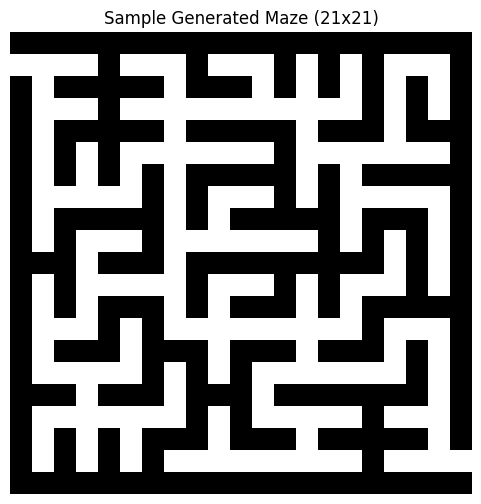

In [6]:
# 在训练之前查看生成的迷宫样例
def show_sample_maze(maze_np):
    plt.figure(figsize=(6, 6))
    plt.imshow(maze_np, cmap='gray', origin='upper')
    plt.title("Sample Generated Maze (21x21)")
    plt.axis('off')
    plt.show()

# 展示第一个迷宫样例
show_sample_maze(mazes[0])

In [7]:
class MazeEnv(nn.Module):
    def __init__(self, maze_list, max_steps, revisit_penalty_decay=0.99):
        super(MazeEnv, self).__init__()
        self.maze_list = maze_list
        self.max_steps = max_steps
        self.start_pos = (1, 0)  # 固定入口
        self.exit_pos = (19, 20)  # 固定出口
        self.current_pos = None
        self.steps_taken = None
        self.maze_state = None  # 当前环境状态
        self.original_maze = None  # 存储原始迷宫结构
        self.visited_cells = None  # 记录访问过的细胞，用于奖励
        self.path = None  # 记录当前 episode 的路径
        self.revisit_penalty_decay = revisit_penalty_decay
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions = deque(maxlen=10)  # 存储最近的几个位置用于动态惩罚

    def _process_state(self, state):
        """
        对环境的状态进行处理：
        由于原始状态中：
            0 表示墙壁
            1 表示可通行区域（未访问）
            2 表示已访问区域
            4 表示智能体当前位置
        为适配 embedding 层，我们将 4 映射为 3，使得状态类别为 {0,1,2,3}
        """
        state = state.clone()
        state[state == 4] = 3
        return state

    def reset(self):
        # 随机选择一个迷宫
        maze_np = random.choice(self.maze_list)
        self.original_maze = torch.tensor(maze_np, dtype=torch.int)
        # 复制迷宫，将非零部分设为1（表示可通行区域）
        self.maze_state = self.original_maze.clone()
        self.maze_state[self.maze_state != 0] = 1
        self.current_pos = self.start_pos
        self.steps_taken = 0
        self.visited_cells = {self.start_pos}
        self.path = [self.start_pos]
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions.clear()
        self.recent_positions.append(self.start_pos)
        # 将起点标记为智能体当前位置（原值为4，后续在 _process_state 中映射为3）
        self.maze_state[self.current_pos] = 4
        # 返回 one-hot 编码之前的离散状态，注意这里会在 _process_state 中进行映射
        return self._process_state(self.maze_state)

    def step(self, action):
        reward = -0.01  # 每步轻微惩罚，鼓励快速完成
        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 检查边界和墙壁
        if new_r < 0 or new_r >= self.maze_state.shape[0] or new_c < 0 or new_c >= self.maze_state.shape[1]:
            reward -= 1.0
            new_pos = self.current_pos
        elif self.original_maze[new_r, new_c].item() == 0:
            reward -= 1.0
            new_pos = self.current_pos
        else:
            cell_value = self.maze_state[new_r, new_c].item()
            if cell_value == 1:
                reward += 10.0  # 探索新路径奖励
            elif (new_r, new_c) in self.visited_cells:
                # 动态调整重复路径惩罚
                if self.recent_positions.count((new_r, new_c)) > 1:
                    reward -= 0.5 * self.revisit_penalty_multiplier
                    self.revisit_penalty_multiplier *= self.revisit_penalty_decay
                else:
                    reward -= 0.5
            self.visited_cells.add(new_pos)

        # 更新当前位置，标记之前的位置为已访问（2），当前位置为智能体（4）
        if self.current_pos != self.exit_pos:
            self.maze_state[self.current_pos] = 2
        self.current_pos = new_pos
        self.maze_state[self.current_pos] = 4
        self.steps_taken += 1
        self.path.append(self.current_pos)
        self.recent_positions.append(self.current_pos)

        done = (self.current_pos == self.exit_pos) or (self.steps_taken >= self.max_steps)

        # 终止时根据探索程度给予奖励或惩罚
        if done:
            if self.current_pos == self.exit_pos:
                explored_percentage = len(self.visited_cells) / torch.sum(self.original_maze != 0).item()
                # 只有当探索了大部分区域后到达出口才有高额奖励
                if explored_percentage > 0.3:
                    reward += 100.0
                else:
                    reward -= 10.0  # 如果探索不够就到达出口，给予一定的惩罚
            else:
                unvisited_corridors = 0
                for r in range(self.maze_state.shape[0]):
                    for c in range(self.maze_state.shape[1]):
                        if self.original_maze[r, c].item() == 1 and (r, c) not in self.visited_cells and (r, c) != self.exit_pos:
                            unvisited_corridors += 0.2
                reward -= unvisited_corridors

        return self._process_state(self.maze_state), reward, done

In [8]:
env = MazeEnv(maze_list=mazes, max_steps=1200)
state = env.reset()

In [9]:
state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 

## Vectorized Environment

In [10]:
class VectorizedMazeEnv:
    """
    可以将任意环境类(如 MazeEnv/Phase2MazeEnv/Phase3MazeEnv) 并行化。
    每次 reset/step 都对 n_envs 个子环境做批量处理。
    """
    def __init__(self, env_class, maze_list, n_envs=8, max_steps=1200):
        self.n_envs = n_envs
        self.envs = [env_class(maze_list, max_steps) for _ in range(n_envs)]

    def reset(self):
        """重置所有子环境，返回 (n_envs, 21, 21) 的状态张量。"""
        states = []
        for env in self.envs:
            s = env.reset()
            states.append(s.unsqueeze(0))  # (1,21,21)
        return torch.cat(states, dim=0)   # (n_envs,21,21)

    def step(self, actions):
        """
        actions: (n_envs,) 的整型张量/array
        返回 next_states, rewards, dones
          - next_states: (n_envs, 21, 21)
          - rewards: (n_envs,)
          - dones: (n_envs,) (bool)
        """
        batch_next_states = []
        batch_rewards = []
        batch_dones = []
        for i, env in enumerate(self.envs):
            next_s, r, d = env.step(actions[i])
            batch_next_states.append(next_s.unsqueeze(0))
            batch_rewards.append(r)
            batch_dones.append(d)
        next_states = torch.cat(batch_next_states, dim=0)
        rewards = torch.tensor(batch_rewards, dtype=torch.float32)
        dones = torch.tensor(batch_dones, dtype=torch.bool)
        return next_states, rewards, dones

## Model

In [11]:
class ActorCritic(nn.Module):
    def __init__(self, num_embeddings=4, embed_dim=8):
        super(ActorCritic, self).__init__()
        # Embedding
        self.embedding = nn.Embedding(num_embeddings, embed_dim)
        # 减小卷积层规模
        self.conv1 = nn.Conv2d(embed_dim, 16, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1)

        with torch.no_grad():
            dummy_input = torch.zeros(1, 21, 21, dtype=torch.long)
            dummy_embedded = self.embedding(dummy_input)  # (1,21,21,embed_dim)
            dummy_embedded = dummy_embedded.permute(0, 3, 1, 2)  # (1,embed_dim,21,21)
            x = F.relu(self.conv1(dummy_embedded))
            x = F.relu(self.conv2(x))
            b, c, h, w = x.shape
            self.feature_dim = c
            self.spatial_dim = h*w

        # LSTM
        self.lstm = nn.LSTM(input_size=self.feature_dim, hidden_size=128, num_layers=1, batch_first=True)
        self.fc = nn.Linear(128, 128)
        self.actor_head = nn.Linear(128, 4)
        self.critic_head = nn.Linear(128, 1)

    def forward(self, x):
        """
        x: (batch,21,21), 值域 {0,1,2,3}
        """
        x = self.embedding(x.long())         # (b,21,21,embed_dim)
        x = x.permute(0, 3, 1, 2)            # (b,embed_dim,21,21)
        x = F.relu(self.conv1(x))           # (b,16,21,21)
        x = F.relu(self.conv2(x))           # (b,32,10,10)左右
        b, c, h, w = x.shape
        x = x.view(b, c, h*w).transpose(1, 2)  # (b, h*w, 32)

        lstm_out, (h_n, c_n) = self.lstm(x)   # h_n: (1,b,128)
        lstm_feature = h_n[-1]               # (b,128)

        x = F.relu(self.fc(lstm_feature))
        policy_logits = self.actor_head(x)
        value = self.critic_head(x)
        return policy_logits, value

## PPOAgent

In [12]:
class PPOAgent:
    def __init__(self, device, lr=0.001, gamma=0.98, lam=0.95,
                 clip_epsilon=0.2, update_epochs=4, batch_size=64):
        self.device = device
        self.gamma = gamma
        self.lam = lam
        self.clip_epsilon = clip_epsilon
        self.update_epochs = update_epochs
        self.batch_size = batch_size

        self.policy = ActorCritic().to(self.device)
        self.optimizer = optim.Adam(self.policy.parameters(), lr=lr)

        self.costs = []
        self.steps_per_episode = []

    @torch.no_grad()
    def choose_action(self, state):
        """
        单环境动作选择（保持原接口）。
        state: (21,21)
        """
        state = state.unsqueeze(0).to(self.device)  # (1,21,21)
        logits, value = self.policy(state)
        probs = F.softmax(logits, dim=1)
        dist = torch.distributions.Categorical(probs)
        action = dist.sample()
        return action.item(), dist.log_prob(action), value.squeeze(0)

    @torch.no_grad()
    def choose_action_batch(self, states):
        """
        并行环境动作选择接口。
        states: (n_envs,21,21)
        """
        states = states.to(self.device)
        logits, values = self.policy(states)  # (n_envs,4), (n_envs,1)
        probs = F.softmax(logits, dim=1)
        dist = torch.distributions.Categorical(probs)
        actions = dist.sample()               # (n_envs,)
        log_probs = dist.log_prob(actions)    # (n_envs,)
        return actions, log_probs, values.squeeze(-1)

    def compute_returns_and_advantages(self, trajectory):
        """
        trajectory: [(state, action, log_prob, reward, value, done, next_value), ...]
        使用更严格的GAE：对于每个step，我们用 next_value = V(s_{t+1}) (若 done 则为0)
        """
        rewards = [t[3] for t in trajectory]
        values = [t[4] for t in trajectory]
        dones = [t[5] for t in trajectory]
        next_values = [t[6] for t in trajectory]

        # 转为tensor
        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device)
        values = torch.tensor(values, dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)
        next_values = torch.tensor(next_values, dtype=torch.float32, device=self.device)

        advantages = []
        gae = 0
        for i in reversed(range(len(rewards))):
            mask = 1.0 - dones[i]
            delta = rewards[i] + self.gamma * next_values[i] * mask - values[i]
            gae = delta + self.gamma * self.lam * mask * gae
            advantages.insert(0, gae)
        advantages = torch.tensor(advantages, dtype=torch.float32, device=self.device)
        returns = values + advantages

        # 标准化优势
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
        return returns, advantages

    def update(self, trajectory):
        """
        trajectory: [(state, action, log_prob, reward, value, done, next_value), ...]
        """
        # 整理批数据
        states = torch.stack([t[0] for t in trajectory]).to(self.device)  # (N,21,21)
        actions = torch.tensor([t[1] for t in trajectory], dtype=torch.long, device=self.device)
        old_log_probs = torch.stack([t[2] for t in trajectory]).detach().to(self.device)
        returns, advantages = self.compute_returns_and_advantages(trajectory)

        dataset_size = len(trajectory)
        indices = np.arange(dataset_size)
        epoch_losses = []

        for _ in range(self.update_epochs):
            np.random.shuffle(indices)
            for start in range(0, dataset_size, self.batch_size):
                end = start + self.batch_size
                batch_idx = indices[start:end]

                batch_states = states[batch_idx]
                batch_actions = actions[batch_idx]
                batch_old_log_probs = old_log_probs[batch_idx]
                batch_returns = returns[batch_idx]
                batch_adv = advantages[batch_idx]

                logits, value_pred = self.policy(batch_states)
                probs = F.softmax(logits, dim=1)
                dist = torch.distributions.Categorical(probs)

                new_log_probs = dist.log_prob(batch_actions)
                ratio = torch.exp(new_log_probs - batch_old_log_probs)

                surr1 = ratio * batch_adv
                surr2 = torch.clamp(ratio, 1.0 - self.clip_epsilon, 1.0 + self.clip_epsilon) * batch_adv
                policy_loss = -torch.min(surr1, surr2).mean()
                value_loss = F.mse_loss(value_pred.squeeze(-1), batch_returns)
                entropy_loss = dist.entropy().mean()

                loss = policy_loss + 0.5 * value_loss - 0.01 * entropy_loss

                self.optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(self.policy.parameters(), 0.5)
                self.optimizer.step()

                epoch_losses.append(loss.item())

        self.costs.append(np.mean(epoch_losses))

## Training

In [13]:
env_class = MazeEnv   # Phase 1 使用的环境
n_envs = 16           # 并行环境数量
max_steps = 2000      # 每个环境最大步数
vec_env = VectorizedMazeEnv(env_class, maze_list=mazes, n_envs=n_envs, max_steps=max_steps)

In [14]:
agent = PPOAgent(device=device, lr=0.001, gamma=0.98, lam=0.95,
                 clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [15]:
num_episodes = 5000
episodes_done = 0

pbar = tqdm(total=num_episodes, desc="Training Progress")

while episodes_done < num_episodes:
    # 一次并行收集 n_envs 个完整 episode
    states = vec_env.reset()  # (n_envs, 21, 21)
    done_mask = [False] * n_envs
    trajectories = [[] for _ in range(n_envs)]
    total_rewards = [0.0] * n_envs
    steps_counts = [0] * n_envs

    # 只要还有环境没结束，就继续
    while not all(done_mask):
        actions, log_probs, values = agent.choose_action_batch(states)  # (n_envs,)
        next_states, rewards, dones = vec_env.step(actions.cpu().numpy())

        # 为了 GAE，更严格：在 step t 存储 next_value = V(s_{t+1})，先计算下个状态的价值
        with torch.no_grad():
            _, next_values = agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        for i in range(n_envs):
            if not done_mask[i]:
                # trajectory: (state, action, log_prob, reward, value, done, next_value)
                trajectories[i].append((
                    states[i].cpu(),          # state
                    actions[i].item(),        # action
                    log_probs[i].cpu(),       # log_prob
                    rewards[i].item(),        # reward
                    values[i].item(),         # value
                    float(dones[i].item()),   # done(0/1)
                    0.0                       # next_value placeholder
                ))
                total_rewards[i] += rewards[i].item()
                steps_counts[i] += 1

        # 更新每个环境上一步 transition 的 next_value 字段
        for i in range(n_envs):
            if not done_mask[i]:
                if dones[i]:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        # 更新 done_mask
        for i in range(n_envs):
            if dones[i]:
                done_mask[i] = True

        states = next_states

    # 所有环境都结束后，对每条环境的轨迹做一次 PPO 更新
    for i in range(n_envs):
        agent.steps_per_episode.append(steps_counts[i])
        agent.update(trajectories[i])
        episodes_done += 1
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        pbar.update(1)
        if episodes_done >= num_episodes:
            break

pbar.close()

Training Progress:   0%|                                                           | 1/5000 [00:31<44:05:25, 31.75s/it]

Episode 1, Reward: -984.61, Steps: 2000


Training Progress:   0%|                                                           | 2/5000 [00:34<20:41:03, 14.90s/it]

Episode 2, Reward: -1136.69, Steps: 2000


Training Progress:   0%|                                                           | 3/5000 [00:37<13:13:32,  9.53s/it]

Episode 3, Reward: -1222.17, Steps: 2000


Training Progress:   0%|                                                            | 4/5000 [00:41<9:42:26,  6.99s/it]

Episode 4, Reward: -713.82, Steps: 2000


Training Progress:   0%|                                                            | 5/5000 [00:44<7:45:00,  5.59s/it]

Episode 5, Reward: -680.74, Steps: 2000


Training Progress:   0%|                                                            | 6/5000 [00:47<6:41:27,  4.82s/it]

Episode 6, Reward: -767.02, Steps: 2000


Training Progress:   0%|                                                            | 7/5000 [00:50<5:54:47,  4.26s/it]

Episode 7, Reward: -1053.18, Steps: 2000


Training Progress:   0%|                                                            | 8/5000 [00:53<5:22:34,  3.88s/it]

Episode 8, Reward: -641.98, Steps: 2000


Training Progress:   0%|                                                            | 9/5000 [00:54<4:15:15,  3.07s/it]

Episode 9, Reward: 365.74, Steps: 794


Training Progress:   0%|                                                           | 10/5000 [00:56<3:42:53,  2.68s/it]

Episode 10, Reward: 40.33, Steps: 1185


Training Progress:   0%|▏                                                          | 11/5000 [01:00<3:56:15,  2.84s/it]

Episode 11, Reward: -597.95, Steps: 2000


Training Progress:   0%|▏                                                          | 12/5000 [01:03<4:00:55,  2.90s/it]

Episode 12, Reward: -806.00, Steps: 2000


Training Progress:   0%|▏                                                          | 13/5000 [01:06<4:06:27,  2.97s/it]

Episode 13, Reward: -489.39, Steps: 2000


Training Progress:   0%|▏                                                          | 14/5000 [01:09<4:06:53,  2.97s/it]

Episode 14, Reward: -793.14, Steps: 2000


Training Progress:   0%|▏                                                          | 15/5000 [01:12<4:06:24,  2.97s/it]

Episode 15, Reward: -1011.72, Steps: 2000


Training Progress:   0%|▏                                                          | 16/5000 [01:15<4:07:43,  2.98s/it]

Episode 16, Reward: -528.65, Steps: 2000


Training Progress:   0%|▏                                                         | 17/5000 [01:47<16:32:54, 11.96s/it]

Episode 17, Reward: 220.90, Steps: 1112


Training Progress:   0%|▏                                                         | 18/5000 [01:50<12:49:11,  9.26s/it]

Episode 18, Reward: -1194.94, Steps: 2000


Training Progress:   0%|▏                                                          | 19/5000 [01:52<9:47:52,  7.08s/it]

Episode 19, Reward: -75.07, Steps: 1250


Training Progress:   0%|▏                                                          | 20/5000 [01:55<7:46:26,  5.62s/it]

Episode 20, Reward: -195.40, Steps: 1518


Training Progress:   0%|▏                                                          | 21/5000 [01:57<6:33:51,  4.75s/it]

Episode 21, Reward: -138.00, Steps: 1731


Training Progress:   0%|▎                                                          | 22/5000 [02:00<5:33:28,  4.02s/it]

Episode 22, Reward: -159.31, Steps: 1599


Training Progress:   0%|▎                                                          | 23/5000 [02:03<5:09:54,  3.74s/it]

Episode 23, Reward: -635.13, Steps: 2000


Training Progress:   0%|▎                                                          | 24/5000 [02:06<4:48:22,  3.48s/it]

Episode 24, Reward: -755.87, Steps: 2000


Training Progress:   0%|▎                                                          | 25/5000 [02:09<4:41:01,  3.39s/it]

Episode 25, Reward: -701.06, Steps: 2000


Training Progress:   1%|▎                                                          | 26/5000 [02:10<3:58:41,  2.88s/it]

Episode 26, Reward: 170.46, Steps: 1199


Training Progress:   1%|▎                                                          | 27/5000 [02:13<3:52:32,  2.81s/it]

Episode 27, Reward: -309.23, Steps: 1781


Training Progress:   1%|▎                                                          | 28/5000 [02:16<3:57:48,  2.87s/it]

Episode 28, Reward: -1022.24, Steps: 2000


Training Progress:   1%|▎                                                          | 29/5000 [02:19<4:02:02,  2.92s/it]

Episode 29, Reward: -757.37, Steps: 2000


Training Progress:   1%|▎                                                          | 30/5000 [02:21<3:42:07,  2.68s/it]

Episode 30, Reward: -14.05, Steps: 1367


Training Progress:   1%|▎                                                          | 31/5000 [02:24<3:50:06,  2.78s/it]

Episode 31, Reward: -595.47, Steps: 2000


Training Progress:   1%|▍                                                          | 32/5000 [02:27<3:55:02,  2.84s/it]

Episode 32, Reward: -998.68, Steps: 2000


Training Progress:   1%|▍                                                         | 33/5000 [03:02<17:05:18, 12.39s/it]

Episode 33, Reward: -1363.18, Steps: 2000


Training Progress:   1%|▍                                                         | 34/5000 [03:03<12:27:05,  9.03s/it]

Episode 34, Reward: 181.57, Steps: 724


Training Progress:   1%|▍                                                         | 35/5000 [03:06<10:01:41,  7.27s/it]

Episode 35, Reward: -930.06, Steps: 2000


Training Progress:   1%|▍                                                          | 36/5000 [03:10<8:20:23,  6.05s/it]

Episode 36, Reward: -1006.35, Steps: 2000


Training Progress:   1%|▍                                                          | 37/5000 [03:13<7:08:42,  5.18s/it]

Episode 37, Reward: -911.56, Steps: 2000


Training Progress:   1%|▍                                                          | 38/5000 [03:16<6:14:17,  4.53s/it]

Episode 38, Reward: -788.90, Steps: 2000


Training Progress:   1%|▍                                                          | 39/5000 [03:19<5:41:05,  4.13s/it]

Episode 39, Reward: -810.39, Steps: 2000


Training Progress:   1%|▍                                                          | 40/5000 [03:20<4:32:04,  3.29s/it]

Episode 40, Reward: 155.25, Steps: 787


Training Progress:   1%|▍                                                          | 41/5000 [03:23<4:25:44,  3.22s/it]

Episode 41, Reward: -1231.54, Steps: 2000


Training Progress:   1%|▍                                                          | 42/5000 [03:25<3:44:40,  2.72s/it]

Episode 42, Reward: 163.30, Steps: 866


Training Progress:   1%|▌                                                          | 43/5000 [03:28<3:50:36,  2.79s/it]

Episode 43, Reward: -970.58, Steps: 2000


Training Progress:   1%|▌                                                          | 44/5000 [03:31<3:56:16,  2.86s/it]

Episode 44, Reward: -689.51, Steps: 2000


Training Progress:   1%|▌                                                          | 45/5000 [03:33<3:45:26,  2.73s/it]

Episode 45, Reward: -329.56, Steps: 1580


Training Progress:   1%|▌                                                          | 46/5000 [03:35<3:27:43,  2.52s/it]

Episode 46, Reward: 124.66, Steps: 1276


Training Progress:   1%|▌                                                          | 47/5000 [03:38<3:41:38,  2.69s/it]

Episode 47, Reward: -955.73, Steps: 2000


Training Progress:   1%|▌                                                          | 48/5000 [03:41<3:51:59,  2.81s/it]

Episode 48, Reward: -1028.14, Steps: 2000


Training Progress:   1%|▌                                                         | 49/5000 [04:16<16:58:31, 12.34s/it]

Episode 49, Reward: -737.70, Steps: 2000


Training Progress:   1%|▌                                                         | 50/5000 [04:19<13:09:40,  9.57s/it]

Episode 50, Reward: -647.97, Steps: 2000


Training Progress:   1%|▌                                                         | 51/5000 [04:22<10:26:53,  7.60s/it]

Episode 51, Reward: -738.47, Steps: 2000


Training Progress:   1%|▌                                                          | 52/5000 [04:25<8:36:15,  6.26s/it]

Episode 52, Reward: -977.82, Steps: 2000


Training Progress:   1%|▋                                                          | 53/5000 [04:28<7:16:58,  5.30s/it]

Episode 53, Reward: -1075.29, Steps: 2000


Training Progress:   1%|▋                                                          | 54/5000 [04:32<6:26:00,  4.68s/it]

Episode 54, Reward: -869.03, Steps: 2000


Training Progress:   1%|▋                                                          | 55/5000 [04:34<5:43:00,  4.16s/it]

Episode 55, Reward: -763.41, Steps: 2000


Training Progress:   1%|▋                                                          | 56/5000 [04:38<5:17:15,  3.85s/it]

Episode 56, Reward: -1165.27, Steps: 2000


Training Progress:   1%|▋                                                          | 57/5000 [04:41<4:56:08,  3.59s/it]

Episode 57, Reward: -825.36, Steps: 2000


Training Progress:   1%|▋                                                          | 58/5000 [04:42<4:12:12,  3.06s/it]

Episode 58, Reward: -9.45, Steps: 1169


Training Progress:   1%|▋                                                          | 59/5000 [04:45<4:09:11,  3.03s/it]

Episode 59, Reward: -997.11, Steps: 2000


Training Progress:   1%|▋                                                          | 60/5000 [04:48<4:09:22,  3.03s/it]

Episode 60, Reward: -631.34, Steps: 2000


Training Progress:   1%|▋                                                          | 61/5000 [04:50<3:25:49,  2.50s/it]

Episode 61, Reward: 190.56, Steps: 806


Training Progress:   1%|▋                                                          | 62/5000 [04:53<3:35:53,  2.62s/it]

Episode 62, Reward: -969.61, Steps: 2000


Training Progress:   1%|▋                                                          | 63/5000 [04:56<3:45:23,  2.74s/it]

Episode 63, Reward: -898.36, Steps: 2000


Training Progress:   1%|▊                                                          | 64/5000 [04:59<3:51:37,  2.82s/it]

Episode 64, Reward: -813.40, Steps: 2000


Training Progress:   1%|▊                                                         | 65/5000 [05:33<16:54:35, 12.34s/it]

Episode 65, Reward: -668.04, Steps: 2000


Training Progress:   1%|▊                                                         | 66/5000 [05:36<13:04:34,  9.54s/it]

Episode 66, Reward: -1051.00, Steps: 2000


Training Progress:   1%|▊                                                         | 67/5000 [05:39<10:21:11,  7.56s/it]

Episode 67, Reward: -739.79, Steps: 2000


Training Progress:   1%|▊                                                          | 68/5000 [05:42<8:30:13,  6.21s/it]

Episode 68, Reward: -1344.53, Steps: 2000


Training Progress:   1%|▊                                                          | 69/5000 [05:45<7:08:35,  5.21s/it]

Episode 69, Reward: -1330.30, Steps: 2000


Training Progress:   1%|▊                                                          | 70/5000 [05:47<5:47:41,  4.23s/it]

Episode 70, Reward: -180.18, Steps: 1246


Training Progress:   1%|▊                                                          | 71/5000 [05:50<5:18:56,  3.88s/it]

Episode 71, Reward: -1082.19, Steps: 2000


Training Progress:   1%|▊                                                          | 72/5000 [05:53<5:01:05,  3.67s/it]

Episode 72, Reward: -824.43, Steps: 2000


Training Progress:   1%|▊                                                          | 73/5000 [05:56<4:33:39,  3.33s/it]

Episode 73, Reward: -212.21, Steps: 1671


Training Progress:   1%|▊                                                          | 74/5000 [05:59<4:23:11,  3.21s/it]

Episode 74, Reward: -480.11, Steps: 1941


Training Progress:   2%|▉                                                          | 75/5000 [06:02<4:18:59,  3.16s/it]

Episode 75, Reward: -728.34, Steps: 2000


Training Progress:   2%|▉                                                          | 76/5000 [06:05<4:14:33,  3.10s/it]

Episode 76, Reward: -1110.15, Steps: 2000


Training Progress:   2%|▉                                                          | 77/5000 [06:08<4:08:31,  3.03s/it]

Episode 77, Reward: -1275.81, Steps: 2000


Training Progress:   2%|▉                                                          | 78/5000 [06:11<4:07:33,  3.02s/it]

Episode 78, Reward: -774.96, Steps: 2000


Training Progress:   2%|▉                                                          | 79/5000 [06:12<3:32:50,  2.60s/it]

Episode 79, Reward: 14.50, Steps: 997


Training Progress:   2%|▉                                                          | 80/5000 [06:15<3:43:45,  2.73s/it]

Episode 80, Reward: -662.88, Steps: 2000


Training Progress:   2%|▉                                                         | 81/5000 [06:47<15:43:07, 11.50s/it]

Episode 81, Reward: 272.55, Steps: 846


Training Progress:   2%|▉                                                         | 82/5000 [06:50<12:13:29,  8.95s/it]

Episode 82, Reward: -1026.79, Steps: 2000


Training Progress:   2%|▉                                                          | 83/5000 [06:53<9:50:54,  7.21s/it]

Episode 83, Reward: -776.89, Steps: 2000


Training Progress:   2%|▉                                                          | 84/5000 [06:54<7:10:06,  5.25s/it]

Episode 84, Reward: 485.94, Steps: 409


Training Progress:   2%|█                                                          | 85/5000 [06:57<6:15:31,  4.58s/it]

Episode 85, Reward: -792.49, Steps: 2000


Training Progress:   2%|█                                                          | 86/5000 [06:58<4:50:47,  3.55s/it]

Episode 86, Reward: -24.35, Steps: 709


Training Progress:   2%|█                                                          | 87/5000 [07:01<4:40:04,  3.42s/it]

Episode 87, Reward: -795.66, Steps: 2000


Training Progress:   2%|█                                                          | 88/5000 [07:04<4:31:21,  3.31s/it]

Episode 88, Reward: -912.13, Steps: 2000


Training Progress:   2%|█                                                          | 89/5000 [07:07<4:21:58,  3.20s/it]

Episode 89, Reward: -935.64, Steps: 2000


Training Progress:   2%|█                                                          | 90/5000 [07:10<4:19:00,  3.16s/it]

Episode 90, Reward: -783.14, Steps: 2000


Training Progress:   2%|█                                                          | 91/5000 [07:12<3:40:15,  2.69s/it]

Episode 91, Reward: 177.13, Steps: 966


Training Progress:   2%|█                                                          | 92/5000 [07:15<3:50:56,  2.82s/it]

Episode 92, Reward: -703.91, Steps: 2000


Training Progress:   2%|█                                                          | 93/5000 [07:16<3:14:32,  2.38s/it]

Episode 93, Reward: 191.80, Steps: 903


Training Progress:   2%|█                                                          | 94/5000 [07:19<3:30:27,  2.57s/it]

Episode 94, Reward: -1170.28, Steps: 2000


Training Progress:   2%|█                                                          | 95/5000 [07:22<3:38:21,  2.67s/it]

Episode 95, Reward: -797.23, Steps: 2000


Training Progress:   2%|█▏                                                         | 96/5000 [07:23<2:59:11,  2.19s/it]

Episode 96, Reward: 33.89, Steps: 686


Training Progress:   2%|█▏                                                        | 97/5000 [07:56<15:24:41, 11.32s/it]

Episode 97, Reward: -160.62, Steps: 924


Training Progress:   2%|█▏                                                        | 98/5000 [07:59<11:57:11,  8.78s/it]

Episode 98, Reward: -696.06, Steps: 2000


Training Progress:   2%|█▏                                                         | 99/5000 [08:02<9:36:33,  7.06s/it]

Episode 99, Reward: -1047.86, Steps: 2000


Training Progress:   2%|█▏                                                        | 100/5000 [08:05<7:59:09,  5.87s/it]

Episode 100, Reward: -1457.68, Steps: 2000


Training Progress:   2%|█▏                                                        | 101/5000 [08:08<6:49:55,  5.02s/it]

Episode 101, Reward: -847.15, Steps: 2000


Training Progress:   2%|█▏                                                        | 102/5000 [08:11<6:02:37,  4.44s/it]

Episode 102, Reward: -743.18, Steps: 2000


Training Progress:   2%|█▏                                                        | 103/5000 [08:14<5:26:20,  4.00s/it]

Episode 103, Reward: -814.90, Steps: 2000


Training Progress:   2%|█▏                                                        | 104/5000 [08:17<5:03:25,  3.72s/it]

Episode 104, Reward: -875.55, Steps: 2000


Training Progress:   2%|█▏                                                        | 105/5000 [08:19<4:18:14,  3.17s/it]

Episode 105, Reward: 12.54, Steps: 1205


Training Progress:   2%|█▏                                                        | 106/5000 [08:20<3:18:35,  2.43s/it]

Episode 106, Reward: 212.99, Steps: 481


Training Progress:   2%|█▏                                                        | 107/5000 [08:23<3:34:55,  2.64s/it]

Episode 107, Reward: -1039.60, Steps: 2000


Training Progress:   2%|█▎                                                        | 108/5000 [08:26<3:43:47,  2.74s/it]

Episode 108, Reward: -1191.24, Steps: 2000


Training Progress:   2%|█▎                                                        | 109/5000 [08:29<3:46:41,  2.78s/it]

Episode 109, Reward: -1082.74, Steps: 2000


Training Progress:   2%|█▎                                                        | 110/5000 [08:31<3:38:37,  2.68s/it]

Episode 110, Reward: -193.36, Steps: 1561


Training Progress:   2%|█▎                                                        | 111/5000 [08:34<3:46:46,  2.78s/it]

Episode 111, Reward: -817.55, Steps: 2000


Training Progress:   2%|█▎                                                        | 112/5000 [08:35<3:05:49,  2.28s/it]

Episode 112, Reward: 364.10, Steps: 693


Training Progress:   2%|█▎                                                       | 113/5000 [09:10<16:09:56, 11.91s/it]

Episode 113, Reward: -947.47, Steps: 2000


Training Progress:   2%|█▎                                                       | 114/5000 [09:13<12:32:03,  9.24s/it]

Episode 114, Reward: -1096.22, Steps: 2000


Training Progress:   2%|█▎                                                       | 115/5000 [09:16<10:00:01,  7.37s/it]

Episode 115, Reward: -1246.78, Steps: 2000


Training Progress:   2%|█▎                                                        | 116/5000 [09:19<8:15:33,  6.09s/it]

Episode 116, Reward: -1160.70, Steps: 2000


Training Progress:   2%|█▎                                                        | 117/5000 [09:22<7:02:53,  5.20s/it]

Episode 117, Reward: -1096.22, Steps: 2000


Training Progress:   2%|█▎                                                        | 118/5000 [09:25<6:08:23,  4.53s/it]

Episode 118, Reward: -979.55, Steps: 2000


Training Progress:   2%|█▍                                                        | 119/5000 [09:28<5:28:33,  4.04s/it]

Episode 119, Reward: -748.16, Steps: 2000


Training Progress:   2%|█▍                                                        | 120/5000 [09:31<5:02:09,  3.71s/it]

Episode 120, Reward: -214.38, Steps: 1992


Training Progress:   2%|█▍                                                        | 121/5000 [09:33<4:34:57,  3.38s/it]

Episode 121, Reward: -146.93, Steps: 1716


Training Progress:   2%|█▍                                                        | 122/5000 [09:36<4:28:18,  3.30s/it]

Episode 122, Reward: -1219.32, Steps: 2000


Training Progress:   2%|█▍                                                        | 123/5000 [09:38<3:35:03,  2.65s/it]

Episode 123, Reward: 412.75, Steps: 711


Training Progress:   2%|█▍                                                        | 124/5000 [09:39<3:01:29,  2.23s/it]

Episode 124, Reward: 193.90, Steps: 823


Training Progress:   2%|█▍                                                        | 125/5000 [09:39<2:21:14,  1.74s/it]

Episode 125, Reward: 291.06, Steps: 393


Training Progress:   3%|█▍                                                        | 126/5000 [09:42<2:51:38,  2.11s/it]

Episode 126, Reward: -1066.06, Steps: 2000


Training Progress:   3%|█▍                                                        | 127/5000 [09:44<2:50:37,  2.10s/it]

Episode 127, Reward: -195.52, Steps: 1368


Training Progress:   3%|█▍                                                        | 128/5000 [09:47<3:11:56,  2.36s/it]

Episode 128, Reward: -828.71, Steps: 2000


Training Progress:   3%|█▍                                                       | 129/5000 [10:22<16:16:45, 12.03s/it]

Episode 129, Reward: -775.89, Steps: 2000


Training Progress:   3%|█▍                                                       | 130/5000 [10:25<12:37:06,  9.33s/it]

Episode 130, Reward: -872.86, Steps: 2000


Training Progress:   3%|█▍                                                       | 131/5000 [10:28<10:06:00,  7.47s/it]

Episode 131, Reward: -1251.22, Steps: 2000


Training Progress:   3%|█▌                                                        | 132/5000 [10:31<8:19:02,  6.15s/it]

Episode 132, Reward: -1194.86, Steps: 2000


Training Progress:   3%|█▌                                                        | 133/5000 [10:34<7:04:42,  5.24s/it]

Episode 133, Reward: -1110.36, Steps: 2000


Training Progress:   3%|█▌                                                        | 134/5000 [10:38<6:13:36,  4.61s/it]

Episode 134, Reward: -888.69, Steps: 2000


Training Progress:   3%|█▌                                                        | 135/5000 [10:41<5:36:38,  4.15s/it]

Episode 135, Reward: -1320.82, Steps: 2000


Training Progress:   3%|█▌                                                        | 136/5000 [10:44<5:07:38,  3.79s/it]

Episode 136, Reward: -1123.47, Steps: 2000


Training Progress:   3%|█▌                                                        | 137/5000 [10:47<4:52:53,  3.61s/it]

Episode 137, Reward: -799.68, Steps: 2000


Training Progress:   3%|█▌                                                        | 138/5000 [10:50<4:35:47,  3.40s/it]

Episode 138, Reward: -97.83, Steps: 1692


Training Progress:   3%|█▌                                                        | 139/5000 [10:53<4:36:37,  3.41s/it]

Episode 139, Reward: -1214.20, Steps: 2000


Training Progress:   3%|█▌                                                        | 140/5000 [10:56<4:28:55,  3.32s/it]

Episode 140, Reward: -1099.74, Steps: 2000


Training Progress:   3%|█▋                                                        | 141/5000 [10:59<4:25:28,  3.28s/it]

Episode 141, Reward: -922.95, Steps: 2000


Training Progress:   3%|█▋                                                        | 142/5000 [11:02<4:20:45,  3.22s/it]

Episode 142, Reward: -976.93, Steps: 2000


Training Progress:   3%|█▋                                                        | 143/5000 [11:06<4:16:37,  3.17s/it]

Episode 143, Reward: -795.48, Steps: 2000


Training Progress:   3%|█▋                                                        | 144/5000 [11:07<3:42:03,  2.74s/it]

Episode 144, Reward: 15.04, Steps: 1090


Training Progress:   3%|█▋                                                       | 145/5000 [11:42<16:47:18, 12.45s/it]

Episode 145, Reward: -784.45, Steps: 2000


Training Progress:   3%|█▋                                                       | 146/5000 [11:45<12:50:17,  9.52s/it]

Episode 146, Reward: -442.91, Steps: 1750


Training Progress:   3%|█▋                                                       | 147/5000 [11:48<10:12:14,  7.57s/it]

Episode 147, Reward: -846.78, Steps: 2000


Training Progress:   3%|█▋                                                        | 148/5000 [11:51<8:21:17,  6.20s/it]

Episode 148, Reward: -756.71, Steps: 2000


Training Progress:   3%|█▋                                                        | 149/5000 [11:54<7:04:33,  5.25s/it]

Episode 149, Reward: -377.27, Steps: 2000


Training Progress:   3%|█▋                                                        | 150/5000 [11:56<5:37:41,  4.18s/it]

Episode 150, Reward: 125.26, Steps: 1113


Training Progress:   3%|█▊                                                        | 151/5000 [11:59<5:06:35,  3.79s/it]

Episode 151, Reward: -1074.24, Steps: 2000


Training Progress:   3%|█▊                                                        | 152/5000 [12:02<4:43:45,  3.51s/it]

Episode 152, Reward: -839.94, Steps: 2000


Training Progress:   3%|█▊                                                        | 153/5000 [12:05<4:31:09,  3.36s/it]

Episode 153, Reward: -331.25, Steps: 2000


Training Progress:   3%|█▊                                                        | 154/5000 [12:07<3:58:58,  2.96s/it]

Episode 154, Reward: 31.02, Steps: 1342


Training Progress:   3%|█▊                                                        | 155/5000 [12:09<3:54:08,  2.90s/it]

Episode 155, Reward: -502.10, Steps: 1811


Training Progress:   3%|█▊                                                        | 156/5000 [12:12<3:58:17,  2.95s/it]

Episode 156, Reward: -711.27, Steps: 2000


Training Progress:   3%|█▊                                                        | 157/5000 [12:15<3:54:51,  2.91s/it]

Episode 157, Reward: -398.90, Steps: 1840


Training Progress:   3%|█▊                                                        | 158/5000 [12:18<4:00:37,  2.98s/it]

Episode 158, Reward: -625.75, Steps: 2000


Training Progress:   3%|█▊                                                        | 159/5000 [12:21<3:59:51,  2.97s/it]

Episode 159, Reward: -764.15, Steps: 2000


Training Progress:   3%|█▊                                                        | 160/5000 [12:24<4:03:04,  3.01s/it]

Episode 160, Reward: -749.35, Steps: 2000


Training Progress:   3%|█▊                                                       | 161/5000 [12:59<16:40:43, 12.41s/it]

Episode 161, Reward: -1248.96, Steps: 2000


Training Progress:   3%|█▊                                                       | 162/5000 [13:01<12:31:51,  9.32s/it]

Episode 162, Reward: -163.22, Steps: 1375


Training Progress:   3%|█▉                                                        | 163/5000 [13:04<9:57:57,  7.42s/it]

Episode 163, Reward: -1319.13, Steps: 2000


Training Progress:   3%|█▉                                                        | 164/5000 [13:07<8:13:16,  6.12s/it]

Episode 164, Reward: -1161.77, Steps: 2000


Training Progress:   3%|█▉                                                        | 165/5000 [13:10<7:02:21,  5.24s/it]

Episode 165, Reward: -677.62, Steps: 2000


Training Progress:   3%|█▉                                                        | 166/5000 [13:13<6:09:30,  4.59s/it]

Episode 166, Reward: -889.86, Steps: 2000


Training Progress:   3%|█▉                                                        | 167/5000 [13:16<5:17:18,  3.94s/it]

Episode 167, Reward: -288.75, Steps: 1640


Training Progress:   3%|█▉                                                        | 168/5000 [13:18<4:34:39,  3.41s/it]

Episode 168, Reward: -139.37, Steps: 1358


Training Progress:   3%|█▉                                                        | 169/5000 [13:21<4:27:02,  3.32s/it]

Episode 169, Reward: -1070.91, Steps: 2000


Training Progress:   3%|█▉                                                        | 170/5000 [13:23<3:46:26,  2.81s/it]

Episode 170, Reward: 137.04, Steps: 1138


Training Progress:   3%|█▉                                                        | 171/5000 [13:25<3:48:21,  2.84s/it]

Episode 171, Reward: -1140.02, Steps: 2000


Training Progress:   3%|█▉                                                        | 172/5000 [13:29<3:54:31,  2.91s/it]

Episode 172, Reward: -636.40, Steps: 2000


Training Progress:   3%|██                                                        | 173/5000 [13:32<3:55:45,  2.93s/it]

Episode 173, Reward: -594.81, Steps: 2000


Training Progress:   3%|██                                                        | 174/5000 [13:34<3:36:28,  2.69s/it]

Episode 174, Reward: 77.21, Steps: 1358


Training Progress:   4%|██                                                        | 175/5000 [13:37<3:41:25,  2.75s/it]

Episode 175, Reward: -941.30, Steps: 2000


Training Progress:   4%|██                                                        | 176/5000 [13:40<3:47:33,  2.83s/it]

Episode 176, Reward: -1107.86, Steps: 2000


Training Progress:   4%|██                                                       | 177/5000 [14:13<16:13:33, 12.11s/it]

Episode 177, Reward: -968.10, Steps: 2000


Training Progress:   4%|██                                                       | 178/5000 [14:14<11:42:02,  8.74s/it]

Episode 178, Reward: 351.98, Steps: 558


Training Progress:   4%|██                                                        | 179/5000 [14:17<9:20:21,  6.97s/it]

Episode 179, Reward: -968.63, Steps: 2000


Training Progress:   4%|██                                                        | 180/5000 [14:19<7:24:35,  5.53s/it]

Episode 180, Reward: -104.89, Steps: 1383


Training Progress:   4%|██                                                        | 181/5000 [14:21<5:58:37,  4.47s/it]

Episode 181, Reward: -312.19, Steps: 1269


Training Progress:   4%|██                                                        | 182/5000 [14:24<5:25:19,  4.05s/it]

Episode 182, Reward: -839.57, Steps: 2000


Training Progress:   4%|██                                                        | 183/5000 [14:27<5:04:07,  3.79s/it]

Episode 183, Reward: -1184.59, Steps: 2000


Training Progress:   4%|██▏                                                       | 184/5000 [14:30<4:46:11,  3.57s/it]

Episode 184, Reward: -1266.89, Steps: 2000


Training Progress:   4%|██▏                                                       | 185/5000 [14:34<4:34:32,  3.42s/it]

Episode 185, Reward: -1014.56, Steps: 2000


Training Progress:   4%|██▏                                                       | 186/5000 [14:37<4:27:10,  3.33s/it]

Episode 186, Reward: -842.29, Steps: 2000


Training Progress:   4%|██▏                                                       | 187/5000 [14:37<3:20:30,  2.50s/it]

Episode 187, Reward: 259.91, Steps: 360


Training Progress:   4%|██▏                                                       | 188/5000 [14:40<3:31:12,  2.63s/it]

Episode 188, Reward: -1138.14, Steps: 2000


Training Progress:   4%|██▏                                                       | 189/5000 [14:43<3:38:24,  2.72s/it]

Episode 189, Reward: -687.60, Steps: 2000


Training Progress:   4%|██▏                                                       | 190/5000 [14:46<3:47:01,  2.83s/it]

Episode 190, Reward: -1152.41, Steps: 2000


Training Progress:   4%|██▏                                                       | 191/5000 [14:47<2:50:46,  2.13s/it]

Episode 191, Reward: 279.93, Steps: 305


Training Progress:   4%|██▏                                                       | 192/5000 [14:50<3:15:29,  2.44s/it]

Episode 192, Reward: -1076.93, Steps: 2000


Training Progress:   4%|██▏                                                      | 193/5000 [15:23<15:31:14, 11.62s/it]

Episode 193, Reward: 88.76, Steps: 720


Training Progress:   4%|██▏                                                      | 194/5000 [15:26<12:02:31,  9.02s/it]

Episode 194, Reward: -881.47, Steps: 2000


Training Progress:   4%|██▎                                                       | 195/5000 [15:29<9:39:21,  7.23s/it]

Episode 195, Reward: -1197.40, Steps: 2000


Training Progress:   4%|██▎                                                       | 196/5000 [15:32<7:59:14,  5.99s/it]

Episode 196, Reward: -1159.81, Steps: 2000


Training Progress:   4%|██▎                                                       | 197/5000 [15:35<6:47:37,  5.09s/it]

Episode 197, Reward: -966.81, Steps: 2000


Training Progress:   4%|██▎                                                       | 198/5000 [15:38<5:57:45,  4.47s/it]

Episode 198, Reward: -465.14, Steps: 2000


Training Progress:   4%|██▎                                                       | 199/5000 [15:41<5:20:34,  4.01s/it]

Episode 199, Reward: -904.49, Steps: 2000


Training Progress:   4%|██▎                                                       | 200/5000 [15:44<4:58:01,  3.73s/it]

Episode 200, Reward: -689.74, Steps: 2000


Training Progress:   4%|██▎                                                       | 201/5000 [15:47<4:39:26,  3.49s/it]

Episode 201, Reward: -1052.96, Steps: 2000


Training Progress:   4%|██▎                                                       | 202/5000 [15:50<4:29:34,  3.37s/it]

Episode 202, Reward: -729.42, Steps: 2000


Training Progress:   4%|██▎                                                       | 203/5000 [15:53<4:21:39,  3.27s/it]

Episode 203, Reward: -778.55, Steps: 2000


Training Progress:   4%|██▎                                                       | 204/5000 [15:56<4:18:37,  3.24s/it]

Episode 204, Reward: -849.76, Steps: 2000


Training Progress:   4%|██▍                                                       | 205/5000 [15:58<3:33:36,  2.67s/it]

Episode 205, Reward: 156.96, Steps: 825


Training Progress:   4%|██▍                                                       | 206/5000 [15:59<2:53:42,  2.17s/it]

Episode 206, Reward: 255.33, Steps: 674


Training Progress:   4%|██▍                                                       | 207/5000 [16:00<2:38:00,  1.98s/it]

Episode 207, Reward: 81.25, Steps: 1016


Training Progress:   4%|██▍                                                       | 208/5000 [16:03<3:01:36,  2.27s/it]

Episode 208, Reward: -788.16, Steps: 2000


Training Progress:   4%|██▍                                                      | 209/5000 [16:36<15:09:17, 11.39s/it]

Episode 209, Reward: 167.92, Steps: 551


Training Progress:   4%|██▍                                                      | 210/5000 [16:39<11:44:45,  8.83s/it]

Episode 210, Reward: -1106.86, Steps: 2000


Training Progress:   4%|██▍                                                       | 211/5000 [16:42<9:25:42,  7.09s/it]

Episode 211, Reward: -752.09, Steps: 2000


Training Progress:   4%|██▍                                                       | 212/5000 [16:45<7:47:27,  5.86s/it]

Episode 212, Reward: -862.30, Steps: 2000


Training Progress:   4%|██▍                                                       | 213/5000 [16:48<6:40:25,  5.02s/it]

Episode 213, Reward: -692.16, Steps: 2000


Training Progress:   4%|██▍                                                       | 214/5000 [16:51<5:56:02,  4.46s/it]

Episode 214, Reward: -730.61, Steps: 2000


Training Progress:   4%|██▍                                                       | 215/5000 [16:54<5:21:04,  4.03s/it]

Episode 215, Reward: -970.97, Steps: 2000


Training Progress:   4%|██▌                                                       | 216/5000 [16:56<4:35:38,  3.46s/it]

Episode 216, Reward: -172.78, Steps: 1369


Training Progress:   4%|██▌                                                       | 217/5000 [16:59<4:24:52,  3.32s/it]

Episode 217, Reward: -966.66, Steps: 2000


Training Progress:   4%|██▌                                                       | 218/5000 [17:02<4:05:03,  3.07s/it]

Episode 218, Reward: -56.58, Steps: 1572


Training Progress:   4%|██▌                                                       | 219/5000 [17:05<4:05:01,  3.07s/it]

Episode 219, Reward: -731.13, Steps: 2000


Training Progress:   4%|██▌                                                       | 220/5000 [17:08<4:04:04,  3.06s/it]

Episode 220, Reward: -734.73, Steps: 2000


Training Progress:   4%|██▌                                                       | 221/5000 [17:11<4:02:00,  3.04s/it]

Episode 221, Reward: -669.37, Steps: 2000


Training Progress:   4%|██▌                                                       | 222/5000 [17:14<4:00:14,  3.02s/it]

Episode 222, Reward: -748.93, Steps: 2000


Training Progress:   4%|██▌                                                       | 223/5000 [17:17<4:00:54,  3.03s/it]

Episode 223, Reward: -697.93, Steps: 2000


Training Progress:   4%|██▌                                                       | 224/5000 [17:20<4:02:25,  3.05s/it]

Episode 224, Reward: -873.76, Steps: 2000


Training Progress:   4%|██▌                                                      | 225/5000 [17:53<16:15:15, 12.25s/it]

Episode 225, Reward: -782.26, Steps: 2000


Training Progress:   5%|██▌                                                      | 226/5000 [17:57<12:37:59,  9.53s/it]

Episode 226, Reward: -618.09, Steps: 2000


Training Progress:   5%|██▌                                                      | 227/5000 [18:00<10:00:39,  7.55s/it]

Episode 227, Reward: -484.91, Steps: 2000


Training Progress:   5%|██▋                                                       | 228/5000 [18:03<8:15:48,  6.23s/it]

Episode 228, Reward: -949.45, Steps: 2000


Training Progress:   5%|██▋                                                       | 229/5000 [18:05<6:47:43,  5.13s/it]

Episode 229, Reward: -120.60, Steps: 1661


Training Progress:   5%|██▋                                                       | 230/5000 [18:08<5:57:37,  4.50s/it]

Episode 230, Reward: -413.99, Steps: 2000


Training Progress:   5%|██▋                                                       | 231/5000 [18:10<4:45:14,  3.59s/it]

Episode 231, Reward: 188.25, Steps: 946


Training Progress:   5%|██▋                                                       | 232/5000 [18:11<3:53:23,  2.94s/it]

Episode 232, Reward: 28.47, Steps: 1014


Training Progress:   5%|██▋                                                       | 233/5000 [18:14<3:52:52,  2.93s/it]

Episode 233, Reward: -460.58, Steps: 2000


Training Progress:   5%|██▋                                                       | 234/5000 [18:17<3:57:00,  2.98s/it]

Episode 234, Reward: -1066.47, Steps: 2000


Training Progress:   5%|██▋                                                       | 235/5000 [18:20<3:55:49,  2.97s/it]

Episode 235, Reward: -952.17, Steps: 2000


Training Progress:   5%|██▋                                                       | 236/5000 [18:23<3:54:34,  2.95s/it]

Episode 236, Reward: -927.04, Steps: 2000


Training Progress:   5%|██▋                                                       | 237/5000 [18:26<3:56:59,  2.99s/it]

Episode 237, Reward: -1099.27, Steps: 2000


Training Progress:   5%|██▊                                                       | 238/5000 [18:29<4:01:25,  3.04s/it]

Episode 238, Reward: -1176.45, Steps: 2000


Training Progress:   5%|██▊                                                       | 239/5000 [18:31<3:21:26,  2.54s/it]

Episode 239, Reward: 214.83, Steps: 808


Training Progress:   5%|██▊                                                       | 240/5000 [18:33<3:28:01,  2.62s/it]

Episode 240, Reward: -450.52, Steps: 1799


Training Progress:   5%|██▋                                                      | 241/5000 [19:07<15:55:28, 12.05s/it]

Episode 241, Reward: 89.41, Steps: 1171


Training Progress:   5%|██▊                                                      | 242/5000 [19:10<12:18:35,  9.31s/it]

Episode 242, Reward: -973.01, Steps: 2000


Training Progress:   5%|██▊                                                       | 243/5000 [19:14<9:55:44,  7.51s/it]

Episode 243, Reward: -816.31, Steps: 2000


Training Progress:   5%|██▊                                                       | 244/5000 [19:17<8:06:57,  6.14s/it]

Episode 244, Reward: -877.85, Steps: 2000


Training Progress:   5%|██▊                                                       | 245/5000 [19:20<6:54:50,  5.23s/it]

Episode 245, Reward: -861.00, Steps: 2000


Training Progress:   5%|██▊                                                       | 246/5000 [19:23<5:59:15,  4.53s/it]

Episode 246, Reward: -549.68, Steps: 2000


Training Progress:   5%|██▊                                                       | 247/5000 [19:26<5:23:35,  4.08s/it]

Episode 247, Reward: -650.81, Steps: 2000


Training Progress:   5%|██▉                                                       | 248/5000 [19:29<4:59:36,  3.78s/it]

Episode 248, Reward: -715.57, Steps: 2000


Training Progress:   5%|██▉                                                       | 249/5000 [19:32<4:42:10,  3.56s/it]

Episode 249, Reward: -764.35, Steps: 2000


Training Progress:   5%|██▉                                                       | 250/5000 [19:35<4:29:31,  3.40s/it]

Episode 250, Reward: -598.05, Steps: 2000


Training Progress:   5%|██▉                                                       | 251/5000 [19:38<4:20:35,  3.29s/it]

Episode 251, Reward: -491.14, Steps: 2000


Training Progress:   5%|██▉                                                       | 252/5000 [19:41<4:13:08,  3.20s/it]

Episode 252, Reward: -483.36, Steps: 2000


Training Progress:   5%|██▉                                                       | 253/5000 [19:44<4:09:37,  3.16s/it]

Episode 253, Reward: -946.78, Steps: 2000


Training Progress:   5%|██▉                                                       | 254/5000 [19:45<3:21:59,  2.55s/it]

Episode 254, Reward: 377.14, Steps: 747


Training Progress:   5%|██▉                                                       | 255/5000 [19:47<2:58:11,  2.25s/it]

Episode 255, Reward: 126.94, Steps: 967


Training Progress:   5%|██▉                                                       | 256/5000 [19:50<3:15:22,  2.47s/it]

Episode 256, Reward: -729.26, Steps: 2000


Training Progress:   5%|██▉                                                      | 257/5000 [20:24<15:41:24, 11.91s/it]

Episode 257, Reward: -635.05, Steps: 2000


Training Progress:   5%|██▉                                                      | 258/5000 [20:24<11:09:19,  8.47s/it]

Episode 258, Reward: 318.38, Steps: 268


Training Progress:   5%|███                                                       | 259/5000 [20:27<9:00:14,  6.84s/it]

Episode 259, Reward: -898.09, Steps: 2000


Training Progress:   5%|███                                                       | 260/5000 [20:30<7:30:16,  5.70s/it]

Episode 260, Reward: -990.81, Steps: 2000


Training Progress:   5%|███                                                       | 261/5000 [20:32<5:54:24,  4.49s/it]

Episode 261, Reward: -43.77, Steps: 1060


Training Progress:   5%|███                                                       | 262/5000 [20:35<5:17:45,  4.02s/it]

Episode 262, Reward: -739.38, Steps: 2000


Training Progress:   5%|███                                                       | 263/5000 [20:38<4:53:32,  3.72s/it]

Episode 263, Reward: -863.59, Steps: 2000


Training Progress:   5%|███                                                       | 264/5000 [20:41<4:39:33,  3.54s/it]

Episode 264, Reward: -1039.06, Steps: 2000


Training Progress:   5%|███                                                       | 265/5000 [20:44<4:20:26,  3.30s/it]

Episode 265, Reward: -351.92, Steps: 1800


Training Progress:   5%|███                                                       | 266/5000 [20:46<4:11:01,  3.18s/it]

Episode 266, Reward: -1055.21, Steps: 2000


Training Progress:   5%|███                                                       | 267/5000 [20:49<4:07:10,  3.13s/it]

Episode 267, Reward: -789.26, Steps: 2000


Training Progress:   5%|███                                                       | 268/5000 [20:52<4:03:15,  3.08s/it]

Episode 268, Reward: -898.51, Steps: 2000


Training Progress:   5%|███                                                       | 269/5000 [20:55<4:01:48,  3.07s/it]

Episode 269, Reward: -669.66, Steps: 2000


Training Progress:   5%|███▏                                                      | 270/5000 [20:58<3:59:17,  3.04s/it]

Episode 270, Reward: -623.56, Steps: 2000


Training Progress:   5%|███▏                                                      | 271/5000 [21:01<3:57:44,  3.02s/it]

Episode 271, Reward: -638.62, Steps: 2000


Training Progress:   5%|███▏                                                      | 272/5000 [21:04<3:58:37,  3.03s/it]

Episode 272, Reward: -963.11, Steps: 2000


Training Progress:   5%|███                                                      | 273/5000 [21:39<16:13:09, 12.35s/it]

Episode 273, Reward: -726.74, Steps: 2000


Training Progress:   5%|███                                                      | 274/5000 [21:42<12:32:28,  9.55s/it]

Episode 274, Reward: -927.68, Steps: 2000


Training Progress:   6%|███▏                                                      | 275/5000 [21:45<9:58:48,  7.60s/it]

Episode 275, Reward: -1033.75, Steps: 2000


Training Progress:   6%|███▏                                                      | 276/5000 [21:48<8:11:35,  6.24s/it]

Episode 276, Reward: -823.29, Steps: 2000


Training Progress:   6%|███▏                                                      | 277/5000 [21:49<6:13:43,  4.75s/it]

Episode 277, Reward: 227.91, Steps: 783


Training Progress:   6%|███▏                                                      | 278/5000 [21:52<5:30:57,  4.21s/it]

Episode 278, Reward: -825.65, Steps: 2000


Training Progress:   6%|███▏                                                      | 279/5000 [21:54<4:49:41,  3.68s/it]

Episode 279, Reward: -106.13, Steps: 1580


Training Progress:   6%|███▏                                                      | 280/5000 [21:57<4:33:53,  3.48s/it]

Episode 280, Reward: -1419.48, Steps: 2000


Training Progress:   6%|███▎                                                      | 281/5000 [22:00<4:20:44,  3.32s/it]

Episode 281, Reward: -872.27, Steps: 2000


Training Progress:   6%|███▎                                                      | 282/5000 [22:03<4:09:40,  3.18s/it]

Episode 282, Reward: -393.41, Steps: 2000


Training Progress:   6%|███▎                                                      | 283/5000 [22:06<4:06:46,  3.14s/it]

Episode 283, Reward: -883.05, Steps: 2000


Training Progress:   6%|███▎                                                      | 284/5000 [22:09<4:05:43,  3.13s/it]

Episode 284, Reward: -945.09, Steps: 2000


Training Progress:   6%|███▎                                                      | 285/5000 [22:11<3:19:53,  2.54s/it]

Episode 285, Reward: -120.89, Steps: 803


Training Progress:   6%|███▎                                                      | 286/5000 [22:14<3:32:25,  2.70s/it]

Episode 286, Reward: -983.39, Steps: 2000


Training Progress:   6%|███▎                                                      | 287/5000 [22:15<3:01:18,  2.31s/it]

Episode 287, Reward: 235.44, Steps: 839


Training Progress:   6%|███▎                                                      | 288/5000 [22:18<3:16:45,  2.51s/it]

Episode 288, Reward: -1037.09, Steps: 2000


Training Progress:   6%|███▎                                                     | 289/5000 [22:51<15:13:21, 11.63s/it]

Episode 289, Reward: 275.44, Steps: 720


Training Progress:   6%|███▎                                                     | 290/5000 [22:52<11:13:31,  8.58s/it]

Episode 290, Reward: -75.73, Steps: 999


Training Progress:   6%|███▍                                                      | 291/5000 [22:55<9:05:15,  6.95s/it]

Episode 291, Reward: -1013.97, Steps: 2000


Training Progress:   6%|███▍                                                      | 292/5000 [22:59<7:33:25,  5.78s/it]

Episode 292, Reward: -460.77, Steps: 2000


Training Progress:   6%|███▍                                                      | 293/5000 [23:02<6:32:16,  5.00s/it]

Episode 293, Reward: -664.81, Steps: 2000


Training Progress:   6%|███▍                                                      | 294/5000 [23:05<5:47:39,  4.43s/it]

Episode 294, Reward: -793.01, Steps: 2000


Training Progress:   6%|███▍                                                      | 295/5000 [23:06<4:40:45,  3.58s/it]

Episode 295, Reward: 140.20, Steps: 1010


Training Progress:   6%|███▍                                                      | 296/5000 [23:08<3:58:07,  3.04s/it]

Episode 296, Reward: 157.08, Steps: 1068


Training Progress:   6%|███▍                                                      | 297/5000 [23:09<3:12:35,  2.46s/it]

Episode 297, Reward: 33.67, Steps: 766


Training Progress:   6%|███▍                                                      | 298/5000 [23:12<3:28:06,  2.66s/it]

Episode 298, Reward: -1063.57, Steps: 2000


Training Progress:   6%|███▍                                                      | 299/5000 [23:16<3:38:28,  2.79s/it]

Episode 299, Reward: -954.86, Steps: 2000


Training Progress:   6%|███▍                                                      | 300/5000 [23:19<3:46:43,  2.89s/it]

Episode 300, Reward: -744.02, Steps: 2000


Training Progress:   6%|███▍                                                      | 301/5000 [23:22<3:52:38,  2.97s/it]

Episode 301, Reward: -619.45, Steps: 2000


Training Progress:   6%|███▌                                                      | 302/5000 [23:25<3:55:46,  3.01s/it]

Episode 302, Reward: -583.56, Steps: 2000


Training Progress:   6%|███▌                                                      | 303/5000 [23:28<3:56:16,  3.02s/it]

Episode 303, Reward: -702.77, Steps: 2000


Training Progress:   6%|███▌                                                      | 304/5000 [23:31<3:58:39,  3.05s/it]

Episode 304, Reward: -1177.95, Steps: 2000


Training Progress:   6%|███▍                                                     | 305/5000 [24:04<15:42:30, 12.04s/it]

Episode 305, Reward: 182.48, Steps: 1087


Training Progress:   6%|███▍                                                     | 306/5000 [24:07<12:10:30,  9.34s/it]

Episode 306, Reward: -1016.06, Steps: 2000


Training Progress:   6%|███▌                                                      | 307/5000 [24:10<9:45:28,  7.49s/it]

Episode 307, Reward: -688.08, Steps: 2000


Training Progress:   6%|███▌                                                      | 308/5000 [24:13<8:01:57,  6.16s/it]

Episode 308, Reward: -1050.11, Steps: 2000


Training Progress:   6%|███▌                                                      | 309/5000 [24:16<6:49:30,  5.24s/it]

Episode 309, Reward: -831.35, Steps: 2000


Training Progress:   6%|███▌                                                      | 310/5000 [24:20<6:02:28,  4.64s/it]

Episode 310, Reward: -888.27, Steps: 2000


Training Progress:   6%|███▌                                                      | 311/5000 [24:22<4:59:38,  3.83s/it]

Episode 311, Reward: -53.49, Steps: 1193


Training Progress:   6%|███▌                                                      | 312/5000 [24:22<3:46:29,  2.90s/it]

Episode 312, Reward: 189.63, Steps: 477


Training Progress:   6%|███▋                                                      | 313/5000 [24:25<3:51:07,  2.96s/it]

Episode 313, Reward: -1027.91, Steps: 2000


Training Progress:   6%|███▋                                                      | 314/5000 [24:29<3:57:27,  3.04s/it]

Episode 314, Reward: -760.07, Steps: 2000


Training Progress:   6%|███▋                                                      | 315/5000 [24:30<3:24:31,  2.62s/it]

Episode 315, Reward: 275.90, Steps: 1001


Training Progress:   6%|███▋                                                      | 316/5000 [24:33<3:33:37,  2.74s/it]

Episode 316, Reward: -835.65, Steps: 2000


Training Progress:   6%|███▋                                                      | 317/5000 [24:36<3:42:35,  2.85s/it]

Episode 317, Reward: -841.51, Steps: 2000


Training Progress:   6%|███▋                                                      | 318/5000 [24:38<3:02:42,  2.34s/it]

Episode 318, Reward: 238.43, Steps: 760


Training Progress:   6%|███▋                                                      | 319/5000 [24:41<3:19:49,  2.56s/it]

Episode 319, Reward: -668.27, Steps: 2000


Training Progress:   6%|███▋                                                      | 320/5000 [24:44<3:31:05,  2.71s/it]

Episode 320, Reward: -558.56, Steps: 2000


Training Progress:   6%|███▋                                                     | 321/5000 [25:19<16:04:24, 12.37s/it]

Episode 321, Reward: -1252.15, Steps: 2000


Training Progress:   6%|███▋                                                     | 322/5000 [25:19<11:31:30,  8.87s/it]

Episode 322, Reward: 300.52, Steps: 437


Training Progress:   6%|███▋                                                      | 323/5000 [25:22<9:13:46,  7.10s/it]

Episode 323, Reward: -925.61, Steps: 2000


Training Progress:   6%|███▊                                                      | 324/5000 [25:25<7:39:17,  5.89s/it]

Episode 324, Reward: -472.43, Steps: 2000


Training Progress:   6%|███▊                                                      | 325/5000 [25:28<6:29:26,  5.00s/it]

Episode 325, Reward: -933.29, Steps: 2000


Training Progress:   7%|███▊                                                      | 326/5000 [25:31<5:42:59,  4.40s/it]

Episode 326, Reward: -480.45, Steps: 2000


Training Progress:   7%|███▊                                                      | 327/5000 [25:34<5:11:36,  4.00s/it]

Episode 327, Reward: -1288.91, Steps: 2000


Training Progress:   7%|███▊                                                      | 328/5000 [25:37<4:48:37,  3.71s/it]

Episode 328, Reward: -910.09, Steps: 2000


Training Progress:   7%|███▊                                                      | 329/5000 [25:39<4:03:23,  3.13s/it]

Episode 329, Reward: -31.08, Steps: 1152


Training Progress:   7%|███▊                                                      | 330/5000 [25:42<4:01:20,  3.10s/it]

Episode 330, Reward: -1006.79, Steps: 2000


Training Progress:   7%|███▊                                                      | 331/5000 [25:45<3:58:01,  3.06s/it]

Episode 331, Reward: -742.88, Steps: 2000


Training Progress:   7%|███▊                                                      | 332/5000 [25:48<3:58:18,  3.06s/it]

Episode 332, Reward: -837.29, Steps: 2000


Training Progress:   7%|███▊                                                      | 333/5000 [25:50<3:26:28,  2.65s/it]

Episode 333, Reward: 99.63, Steps: 1085


Training Progress:   7%|███▊                                                      | 334/5000 [25:53<3:36:36,  2.79s/it]

Episode 334, Reward: -903.32, Steps: 2000


Training Progress:   7%|███▉                                                      | 335/5000 [25:56<3:43:36,  2.88s/it]

Episode 335, Reward: -840.45, Steps: 2000


Training Progress:   7%|███▉                                                      | 336/5000 [25:58<3:18:10,  2.55s/it]

Episode 336, Reward: 94.92, Steps: 1113


Training Progress:   7%|███▊                                                     | 337/5000 [26:33<15:54:41, 12.28s/it]

Episode 337, Reward: -959.88, Steps: 2000


Training Progress:   7%|███▊                                                     | 338/5000 [26:36<12:20:58,  9.54s/it]

Episode 338, Reward: -835.37, Steps: 2000


Training Progress:   7%|███▉                                                      | 339/5000 [26:39<9:55:37,  7.67s/it]

Episode 339, Reward: -795.72, Steps: 2000


Training Progress:   7%|███▉                                                      | 340/5000 [26:43<8:11:01,  6.32s/it]

Episode 340, Reward: -889.20, Steps: 2000


Training Progress:   7%|███▉                                                      | 341/5000 [26:46<6:56:30,  5.36s/it]

Episode 341, Reward: -605.48, Steps: 2000


Training Progress:   7%|███▉                                                      | 342/5000 [26:49<6:05:05,  4.70s/it]

Episode 342, Reward: -674.94, Steps: 2000


Training Progress:   7%|███▉                                                      | 343/5000 [26:50<4:34:36,  3.54s/it]

Episode 343, Reward: 455.37, Steps: 487


Training Progress:   7%|███▉                                                      | 344/5000 [26:53<4:25:14,  3.42s/it]

Episode 344, Reward: -1108.96, Steps: 2000


Training Progress:   7%|████                                                      | 345/5000 [26:56<4:16:39,  3.31s/it]

Episode 345, Reward: -1033.30, Steps: 2000


Training Progress:   7%|████                                                      | 346/5000 [26:59<4:09:23,  3.22s/it]

Episode 346, Reward: -936.09, Steps: 2000


Training Progress:   7%|████                                                      | 347/5000 [27:00<3:27:52,  2.68s/it]

Episode 347, Reward: 312.81, Steps: 901


Training Progress:   7%|████                                                      | 348/5000 [27:03<3:35:26,  2.78s/it]

Episode 348, Reward: -662.60, Steps: 2000


Training Progress:   7%|████                                                      | 349/5000 [27:06<3:38:53,  2.82s/it]

Episode 349, Reward: -253.53, Steps: 1843


Training Progress:   7%|████                                                      | 350/5000 [27:09<3:46:27,  2.92s/it]

Episode 350, Reward: -1307.62, Steps: 2000


Training Progress:   7%|████                                                      | 351/5000 [27:12<3:50:46,  2.98s/it]

Episode 351, Reward: -1294.02, Steps: 2000


Training Progress:   7%|████                                                      | 352/5000 [27:16<3:54:17,  3.02s/it]

Episode 352, Reward: -877.54, Steps: 2000


Training Progress:   7%|████                                                     | 353/5000 [27:49<15:40:45, 12.15s/it]

Episode 353, Reward: 262.34, Steps: 1081


Training Progress:   7%|████                                                     | 354/5000 [27:52<12:06:32,  9.38s/it]

Episode 354, Reward: -1083.02, Steps: 2000


Training Progress:   7%|████                                                      | 355/5000 [27:55<9:42:13,  7.52s/it]

Episode 355, Reward: -582.78, Steps: 2000


Training Progress:   7%|████▏                                                     | 356/5000 [27:58<8:01:15,  6.22s/it]

Episode 356, Reward: -514.42, Steps: 2000


Training Progress:   7%|████▏                                                     | 357/5000 [28:02<6:51:26,  5.32s/it]

Episode 357, Reward: -731.17, Steps: 2000


Training Progress:   7%|████▏                                                     | 358/5000 [28:02<5:06:17,  3.96s/it]

Episode 358, Reward: 260.39, Steps: 467


Training Progress:   7%|████▏                                                     | 359/5000 [28:05<4:44:35,  3.68s/it]

Episode 359, Reward: -688.70, Steps: 2000


Training Progress:   7%|████▏                                                     | 360/5000 [28:08<4:30:47,  3.50s/it]

Episode 360, Reward: -718.03, Steps: 2000


Training Progress:   7%|████▏                                                     | 361/5000 [28:12<4:21:45,  3.39s/it]

Episode 361, Reward: -970.69, Steps: 2000


Training Progress:   7%|████▏                                                     | 362/5000 [28:15<4:18:36,  3.35s/it]

Episode 362, Reward: -1098.75, Steps: 2000


Training Progress:   7%|████▏                                                     | 363/5000 [28:18<4:12:52,  3.27s/it]

Episode 363, Reward: -843.39, Steps: 2000


Training Progress:   7%|████▏                                                     | 364/5000 [28:21<4:09:43,  3.23s/it]

Episode 364, Reward: -1477.39, Steps: 2000


Training Progress:   7%|████▏                                                     | 365/5000 [28:24<4:08:52,  3.22s/it]

Episode 365, Reward: -567.45, Steps: 2000


Training Progress:   7%|████▏                                                     | 366/5000 [28:26<3:34:35,  2.78s/it]

Episode 366, Reward: -5.64, Steps: 1103


Training Progress:   7%|████▎                                                     | 367/5000 [28:29<3:40:12,  2.85s/it]

Episode 367, Reward: -989.00, Steps: 2000


Training Progress:   7%|████▎                                                     | 368/5000 [28:31<3:17:08,  2.55s/it]

Episode 368, Reward: -300.69, Steps: 1158


Training Progress:   7%|████▏                                                    | 369/5000 [29:06<15:51:10, 12.32s/it]

Episode 369, Reward: -1073.18, Steps: 2000


Training Progress:   7%|████▏                                                    | 370/5000 [29:08<12:01:25,  9.35s/it]

Episode 370, Reward: 53.98, Steps: 1508


Training Progress:   7%|████▎                                                     | 371/5000 [29:11<9:34:21,  7.44s/it]

Episode 371, Reward: -987.31, Steps: 2000


Training Progress:   7%|████▎                                                     | 372/5000 [29:14<7:53:35,  6.14s/it]

Episode 372, Reward: -789.79, Steps: 2000


Training Progress:   7%|████▎                                                     | 373/5000 [29:18<6:42:52,  5.22s/it]

Episode 373, Reward: -1200.37, Steps: 2000


Training Progress:   7%|████▎                                                     | 374/5000 [29:19<5:05:02,  3.96s/it]

Episode 374, Reward: 259.53, Steps: 654


Training Progress:   8%|████▎                                                     | 375/5000 [29:21<4:28:53,  3.49s/it]

Episode 375, Reward: 9.06, Steps: 1488


Training Progress:   8%|████▎                                                     | 376/5000 [29:24<4:20:11,  3.38s/it]

Episode 376, Reward: -791.36, Steps: 2000


Training Progress:   8%|████▎                                                     | 377/5000 [29:26<3:36:41,  2.81s/it]

Episode 377, Reward: 178.59, Steps: 939


Training Progress:   8%|████▍                                                     | 378/5000 [29:29<3:43:55,  2.91s/it]

Episode 378, Reward: -819.31, Steps: 2000


Training Progress:   8%|████▍                                                     | 379/5000 [29:32<3:50:03,  2.99s/it]

Episode 379, Reward: -942.37, Steps: 2000


Training Progress:   8%|████▍                                                     | 380/5000 [29:35<3:54:42,  3.05s/it]

Episode 380, Reward: -492.51, Steps: 2000


Training Progress:   8%|████▍                                                     | 381/5000 [29:38<3:54:47,  3.05s/it]

Episode 381, Reward: -860.34, Steps: 2000


Training Progress:   8%|████▍                                                     | 382/5000 [29:41<3:54:15,  3.04s/it]

Episode 382, Reward: -712.83, Steps: 2000


Training Progress:   8%|████▍                                                     | 383/5000 [29:44<3:53:04,  3.03s/it]

Episode 383, Reward: -1380.21, Steps: 2000


Training Progress:   8%|████▍                                                     | 384/5000 [29:47<3:49:36,  2.98s/it]

Episode 384, Reward: -745.86, Steps: 2000


Training Progress:   8%|████▍                                                    | 385/5000 [30:21<15:48:14, 12.33s/it]

Episode 385, Reward: -1021.71, Steps: 2000


Training Progress:   8%|████▍                                                    | 386/5000 [30:22<11:32:05,  9.00s/it]

Episode 386, Reward: 227.93, Steps: 792


Training Progress:   8%|████▍                                                     | 387/5000 [30:26<9:17:51,  7.26s/it]

Episode 387, Reward: -1049.36, Steps: 2000


Training Progress:   8%|████▌                                                     | 388/5000 [30:29<7:41:31,  6.00s/it]

Episode 388, Reward: -883.52, Steps: 2000


Training Progress:   8%|████▌                                                     | 389/5000 [30:30<5:50:50,  4.57s/it]

Episode 389, Reward: 240.66, Steps: 764


Training Progress:   8%|████▌                                                     | 390/5000 [30:33<5:17:44,  4.14s/it]

Episode 390, Reward: -883.30, Steps: 2000


Training Progress:   8%|████▌                                                     | 391/5000 [30:34<3:58:16,  3.10s/it]

Episode 391, Reward: 236.51, Steps: 435


Training Progress:   8%|████▌                                                     | 392/5000 [30:36<3:36:25,  2.82s/it]

Episode 392, Reward: -202.56, Steps: 1344


Training Progress:   8%|████▌                                                     | 393/5000 [30:39<3:41:14,  2.88s/it]

Episode 393, Reward: -880.81, Steps: 2000


Training Progress:   8%|████▌                                                     | 394/5000 [30:42<3:47:14,  2.96s/it]

Episode 394, Reward: -967.60, Steps: 2000


Training Progress:   8%|████▌                                                     | 395/5000 [30:45<3:51:23,  3.01s/it]

Episode 395, Reward: -768.71, Steps: 2000


Training Progress:   8%|████▌                                                     | 396/5000 [30:48<3:55:58,  3.08s/it]

Episode 396, Reward: -708.05, Steps: 2000


Training Progress:   8%|████▌                                                     | 397/5000 [30:51<3:45:36,  2.94s/it]

Episode 397, Reward: -108.80, Steps: 1625


Training Progress:   8%|████▌                                                     | 398/5000 [30:54<3:54:26,  3.06s/it]

Episode 398, Reward: -896.92, Steps: 2000


Training Progress:   8%|████▋                                                     | 399/5000 [30:56<3:30:32,  2.75s/it]

Episode 399, Reward: -94.55, Steps: 1207


Training Progress:   8%|████▋                                                     | 400/5000 [30:59<3:37:19,  2.83s/it]

Episode 400, Reward: -684.31, Steps: 2000


Training Progress:   8%|████▌                                                    | 401/5000 [31:36<16:25:43, 12.86s/it]

Episode 401, Reward: -709.83, Steps: 2000


Training Progress:   8%|████▌                                                    | 402/5000 [31:39<12:44:44,  9.98s/it]

Episode 402, Reward: -630.42, Steps: 2000


Training Progress:   8%|████▌                                                    | 403/5000 [31:42<10:10:52,  7.97s/it]

Episode 403, Reward: -991.46, Steps: 2000


Training Progress:   8%|████▋                                                     | 404/5000 [31:45<8:19:56,  6.53s/it]

Episode 404, Reward: -687.39, Steps: 2000


Training Progress:   8%|████▋                                                     | 405/5000 [31:48<7:00:44,  5.49s/it]

Episode 405, Reward: -809.87, Steps: 2000


Training Progress:   8%|████▋                                                     | 406/5000 [31:52<6:06:29,  4.79s/it]

Episode 406, Reward: -864.17, Steps: 2000


Training Progress:   8%|████▋                                                     | 407/5000 [31:53<4:47:44,  3.76s/it]

Episode 407, Reward: 228.74, Steps: 874


Training Progress:   8%|████▋                                                     | 408/5000 [31:56<4:32:14,  3.56s/it]

Episode 408, Reward: -522.27, Steps: 2000


Training Progress:   8%|████▋                                                     | 409/5000 [31:59<4:21:55,  3.42s/it]

Episode 409, Reward: -718.43, Steps: 2000


Training Progress:   8%|████▊                                                     | 410/5000 [32:01<3:56:51,  3.10s/it]

Episode 410, Reward: -162.62, Steps: 1477


Training Progress:   8%|████▊                                                     | 411/5000 [32:04<3:54:21,  3.06s/it]

Episode 411, Reward: -856.03, Steps: 2000


Training Progress:   8%|████▊                                                     | 412/5000 [32:06<3:11:10,  2.50s/it]

Episode 412, Reward: 214.08, Steps: 757


Training Progress:   8%|████▊                                                     | 413/5000 [32:09<3:24:42,  2.68s/it]

Episode 413, Reward: -1081.47, Steps: 2000


Training Progress:   8%|████▊                                                     | 414/5000 [32:11<3:24:37,  2.68s/it]

Episode 414, Reward: -259.36, Steps: 1774


Training Progress:   8%|████▊                                                     | 415/5000 [32:14<3:32:34,  2.78s/it]

Episode 415, Reward: -555.67, Steps: 2000


Training Progress:   8%|████▊                                                     | 416/5000 [32:18<3:40:08,  2.88s/it]

Episode 416, Reward: -1238.83, Steps: 2000


Training Progress:   8%|████▊                                                    | 417/5000 [32:52<15:49:21, 12.43s/it]

Episode 417, Reward: -904.68, Steps: 2000


Training Progress:   8%|████▊                                                    | 418/5000 [32:53<11:25:38,  8.98s/it]

Episode 418, Reward: 403.40, Steps: 624


Training Progress:   8%|████▊                                                     | 419/5000 [32:56<9:09:38,  7.20s/it]

Episode 419, Reward: -229.67, Steps: 2000


Training Progress:   8%|████▊                                                     | 420/5000 [32:59<7:31:00,  5.91s/it]

Episode 420, Reward: -164.96, Steps: 1884


Training Progress:   8%|████▉                                                     | 421/5000 [33:02<6:26:15,  5.06s/it]

Episode 421, Reward: -898.57, Steps: 2000


Training Progress:   8%|████▉                                                     | 422/5000 [33:05<5:38:59,  4.44s/it]

Episode 422, Reward: -543.70, Steps: 2000


Training Progress:   8%|████▉                                                     | 423/5000 [33:08<5:04:05,  3.99s/it]

Episode 423, Reward: -829.14, Steps: 2000


Training Progress:   8%|████▉                                                     | 424/5000 [33:11<4:42:32,  3.70s/it]

Episode 424, Reward: -587.53, Steps: 2000


Training Progress:   8%|████▉                                                     | 425/5000 [33:12<3:38:09,  2.86s/it]

Episode 425, Reward: 158.42, Steps: 585


Training Progress:   9%|████▉                                                     | 426/5000 [33:14<3:28:25,  2.73s/it]

Episode 426, Reward: -122.49, Steps: 1575


Training Progress:   9%|████▉                                                     | 427/5000 [33:17<3:33:41,  2.80s/it]

Episode 427, Reward: -341.94, Steps: 2000


Training Progress:   9%|████▉                                                     | 428/5000 [33:21<3:40:23,  2.89s/it]

Episode 428, Reward: -860.82, Steps: 2000


Training Progress:   9%|████▉                                                     | 429/5000 [33:24<3:43:15,  2.93s/it]

Episode 429, Reward: -486.46, Steps: 2000


Training Progress:   9%|████▉                                                     | 430/5000 [33:26<3:34:56,  2.82s/it]

Episode 430, Reward: -81.90, Steps: 1643


Training Progress:   9%|████▉                                                     | 431/5000 [33:29<3:39:43,  2.89s/it]

Episode 431, Reward: -1151.43, Steps: 2000


Training Progress:   9%|█████                                                     | 432/5000 [33:31<3:15:08,  2.56s/it]

Episode 432, Reward: 54.59, Steps: 1270


Training Progress:   9%|████▉                                                    | 433/5000 [34:06<15:39:04, 12.34s/it]

Episode 433, Reward: -798.97, Steps: 2000


Training Progress:   9%|████▉                                                    | 434/5000 [34:09<12:08:35,  9.57s/it]

Episode 434, Reward: -1000.49, Steps: 2000


Training Progress:   9%|█████                                                     | 435/5000 [34:12<9:39:39,  7.62s/it]

Episode 435, Reward: -1066.04, Steps: 2000


Training Progress:   9%|█████                                                     | 436/5000 [34:15<7:56:36,  6.27s/it]

Episode 436, Reward: -685.85, Steps: 2000


Training Progress:   9%|█████                                                     | 437/5000 [34:18<6:43:45,  5.31s/it]

Episode 437, Reward: -812.55, Steps: 2000


Training Progress:   9%|█████                                                     | 438/5000 [34:22<5:54:29,  4.66s/it]

Episode 438, Reward: -1035.86, Steps: 2000


Training Progress:   9%|█████                                                     | 439/5000 [34:25<5:20:54,  4.22s/it]

Episode 439, Reward: -574.74, Steps: 2000


Training Progress:   9%|█████                                                     | 440/5000 [34:28<4:54:38,  3.88s/it]

Episode 440, Reward: -747.77, Steps: 2000


Training Progress:   9%|█████                                                     | 441/5000 [34:31<4:37:49,  3.66s/it]

Episode 441, Reward: -853.76, Steps: 2000


Training Progress:   9%|█████▏                                                    | 442/5000 [34:34<4:26:40,  3.51s/it]

Episode 442, Reward: -966.19, Steps: 2000


Training Progress:   9%|█████▏                                                    | 443/5000 [34:37<4:19:50,  3.42s/it]

Episode 443, Reward: -1239.34, Steps: 2000


Training Progress:   9%|█████▏                                                    | 444/5000 [34:41<4:12:07,  3.32s/it]

Episode 444, Reward: -820.33, Steps: 2000


Training Progress:   9%|█████▏                                                    | 445/5000 [34:44<4:07:58,  3.27s/it]

Episode 445, Reward: -706.91, Steps: 2000


Training Progress:   9%|█████▏                                                    | 446/5000 [34:47<4:07:24,  3.26s/it]

Episode 446, Reward: -1037.31, Steps: 2000


Training Progress:   9%|█████▏                                                    | 447/5000 [34:50<4:04:57,  3.23s/it]

Episode 447, Reward: -928.99, Steps: 2000


Training Progress:   9%|█████▏                                                    | 448/5000 [34:51<3:12:11,  2.53s/it]

Episode 448, Reward: 346.99, Steps: 575


Training Progress:   9%|█████                                                    | 449/5000 [35:27<15:56:46, 12.61s/it]

Episode 449, Reward: -871.74, Steps: 2000


Training Progress:   9%|█████▏                                                   | 450/5000 [35:30<12:17:51,  9.73s/it]

Episode 450, Reward: -954.47, Steps: 2000


Training Progress:   9%|█████▏                                                    | 451/5000 [35:33<9:44:17,  7.71s/it]

Episode 451, Reward: -528.92, Steps: 2000


Training Progress:   9%|█████▏                                                    | 452/5000 [35:36<7:59:28,  6.33s/it]

Episode 452, Reward: -1101.67, Steps: 2000


Training Progress:   9%|█████▎                                                    | 453/5000 [35:39<6:44:27,  5.34s/it]

Episode 453, Reward: -948.47, Steps: 2000


Training Progress:   9%|█████▎                                                    | 454/5000 [35:42<5:52:04,  4.65s/it]

Episode 454, Reward: -1068.33, Steps: 2000


Training Progress:   9%|█████▎                                                    | 455/5000 [35:44<4:37:45,  3.67s/it]

Episode 455, Reward: 230.45, Steps: 879


Training Progress:   9%|█████▎                                                    | 456/5000 [35:47<4:23:49,  3.48s/it]

Episode 456, Reward: -908.36, Steps: 2000


Training Progress:   9%|█████▎                                                    | 457/5000 [35:50<4:18:24,  3.41s/it]

Episode 457, Reward: -956.83, Steps: 2000


Training Progress:   9%|█████▎                                                    | 458/5000 [35:53<4:11:40,  3.32s/it]

Episode 458, Reward: -1266.65, Steps: 2000


Training Progress:   9%|█████▎                                                    | 459/5000 [35:56<4:05:41,  3.25s/it]

Episode 459, Reward: -688.93, Steps: 2000


Training Progress:   9%|█████▎                                                    | 460/5000 [35:59<4:01:11,  3.19s/it]

Episode 460, Reward: -708.61, Steps: 2000


Training Progress:   9%|█████▎                                                    | 461/5000 [36:02<3:58:23,  3.15s/it]

Episode 461, Reward: -1210.76, Steps: 2000


Training Progress:   9%|█████▎                                                    | 462/5000 [36:05<3:55:15,  3.11s/it]

Episode 462, Reward: -646.97, Steps: 2000


Training Progress:   9%|█████▎                                                    | 463/5000 [36:08<3:54:09,  3.10s/it]

Episode 463, Reward: -1026.73, Steps: 2000


Training Progress:   9%|█████▍                                                    | 464/5000 [36:11<3:54:04,  3.10s/it]

Episode 464, Reward: -748.24, Steps: 2000


Training Progress:   9%|█████▎                                                   | 465/5000 [36:46<15:54:26, 12.63s/it]

Episode 465, Reward: -633.65, Steps: 2000


Training Progress:   9%|█████▎                                                   | 466/5000 [36:49<12:18:39,  9.77s/it]

Episode 466, Reward: -1034.36, Steps: 2000


Training Progress:   9%|█████▍                                                    | 467/5000 [36:52<9:27:29,  7.51s/it]

Episode 467, Reward: -135.77, Steps: 1416


Training Progress:   9%|█████▍                                                    | 468/5000 [36:55<7:45:52,  6.17s/it]

Episode 468, Reward: -1140.98, Steps: 2000


Training Progress:   9%|█████▍                                                    | 469/5000 [36:58<6:34:42,  5.23s/it]

Episode 469, Reward: -812.68, Steps: 2000


Training Progress:   9%|█████▍                                                    | 470/5000 [37:01<5:44:59,  4.57s/it]

Episode 470, Reward: -416.29, Steps: 2000


Training Progress:   9%|█████▍                                                    | 471/5000 [37:04<5:12:13,  4.14s/it]

Episode 471, Reward: -803.58, Steps: 2000


Training Progress:   9%|█████▍                                                    | 472/5000 [37:05<4:13:43,  3.36s/it]

Episode 472, Reward: 417.10, Steps: 966


Training Progress:   9%|█████▍                                                    | 473/5000 [37:08<4:06:24,  3.27s/it]

Episode 473, Reward: -788.92, Steps: 2000


Training Progress:   9%|█████▍                                                    | 474/5000 [37:11<4:00:54,  3.19s/it]

Episode 474, Reward: -925.12, Steps: 2000


Training Progress:  10%|█████▌                                                    | 475/5000 [37:15<3:57:55,  3.15s/it]

Episode 475, Reward: -802.82, Steps: 2000


Training Progress:  10%|█████▌                                                    | 476/5000 [37:17<3:52:17,  3.08s/it]

Episode 476, Reward: -1113.77, Steps: 2000


Training Progress:  10%|█████▌                                                    | 477/5000 [37:21<3:51:40,  3.07s/it]

Episode 477, Reward: -664.43, Steps: 2000


Training Progress:  10%|█████▌                                                    | 478/5000 [37:24<3:50:56,  3.06s/it]

Episode 478, Reward: -570.48, Steps: 2000


Training Progress:  10%|█████▌                                                    | 479/5000 [37:27<3:50:46,  3.06s/it]

Episode 479, Reward: -721.72, Steps: 2000


Training Progress:  10%|█████▌                                                    | 480/5000 [37:30<3:49:40,  3.05s/it]

Episode 480, Reward: -1046.35, Steps: 2000


Training Progress:  10%|█████▍                                                   | 481/5000 [38:04<15:39:52, 12.48s/it]

Episode 481, Reward: -1204.87, Steps: 2000


Training Progress:  10%|█████▍                                                   | 482/5000 [38:07<12:09:05,  9.68s/it]

Episode 482, Reward: -813.98, Steps: 2000


Training Progress:  10%|█████▌                                                    | 483/5000 [38:10<9:40:58,  7.72s/it]

Episode 483, Reward: -855.29, Steps: 2000


Training Progress:  10%|█████▌                                                    | 484/5000 [38:13<7:52:40,  6.28s/it]

Episode 484, Reward: -965.93, Steps: 2000


Training Progress:  10%|█████▋                                                    | 485/5000 [38:16<6:40:01,  5.32s/it]

Episode 485, Reward: -888.88, Steps: 2000


Training Progress:  10%|█████▋                                                    | 486/5000 [38:20<5:50:09,  4.65s/it]

Episode 486, Reward: -962.92, Steps: 2000


Training Progress:  10%|█████▋                                                    | 487/5000 [38:23<5:13:38,  4.17s/it]

Episode 487, Reward: -1022.60, Steps: 2000


Training Progress:  10%|█████▋                                                    | 488/5000 [38:24<4:07:37,  3.29s/it]

Episode 488, Reward: 309.70, Steps: 748


Training Progress:  10%|█████▋                                                    | 489/5000 [38:27<4:01:33,  3.21s/it]

Episode 489, Reward: -827.73, Steps: 2000


Training Progress:  10%|█████▋                                                    | 490/5000 [38:28<3:22:24,  2.69s/it]

Episode 490, Reward: 142.03, Steps: 901


Training Progress:  10%|█████▋                                                    | 491/5000 [38:31<3:30:00,  2.79s/it]

Episode 491, Reward: -1245.55, Steps: 2000


Training Progress:  10%|█████▋                                                    | 492/5000 [38:34<3:36:58,  2.89s/it]

Episode 492, Reward: -898.55, Steps: 2000


Training Progress:  10%|█████▋                                                    | 493/5000 [38:36<3:10:11,  2.53s/it]

Episode 493, Reward: 132.92, Steps: 1028


Training Progress:  10%|█████▋                                                    | 494/5000 [38:38<2:53:32,  2.31s/it]

Episode 494, Reward: -40.87, Steps: 1154


Training Progress:  10%|█████▋                                                    | 495/5000 [38:41<3:10:20,  2.54s/it]

Episode 495, Reward: -1196.40, Steps: 2000


Training Progress:  10%|█████▊                                                    | 496/5000 [38:44<3:20:28,  2.67s/it]

Episode 496, Reward: -777.83, Steps: 2000


Training Progress:  10%|█████▋                                                   | 497/5000 [39:20<15:40:52, 12.54s/it]

Episode 497, Reward: -845.76, Steps: 2000


Training Progress:  10%|█████▋                                                   | 498/5000 [39:21<11:37:06,  9.29s/it]

Episode 498, Reward: 136.32, Steps: 1082


Training Progress:  10%|█████▊                                                    | 499/5000 [39:23<8:42:23,  6.96s/it]

Episode 499, Reward: 105.60, Steps: 951


Training Progress:  10%|█████▊                                                    | 500/5000 [39:26<7:10:06,  5.73s/it]

Episode 500, Reward: -470.01, Steps: 2000


Training Progress:  10%|█████▊                                                    | 501/5000 [39:27<5:24:03,  4.32s/it]

Episode 501, Reward: 372.80, Steps: 608


Training Progress:  10%|█████▊                                                    | 502/5000 [39:30<4:50:32,  3.88s/it]

Episode 502, Reward: -1143.21, Steps: 2000


Training Progress:  10%|█████▊                                                    | 503/5000 [39:33<4:31:26,  3.62s/it]

Episode 503, Reward: -1054.57, Steps: 2000


Training Progress:  10%|█████▊                                                    | 504/5000 [39:36<4:17:50,  3.44s/it]

Episode 504, Reward: -883.27, Steps: 2000


Training Progress:  10%|█████▊                                                    | 505/5000 [39:39<4:10:56,  3.35s/it]

Episode 505, Reward: -737.08, Steps: 2000


Training Progress:  10%|█████▊                                                    | 506/5000 [39:42<4:03:14,  3.25s/it]

Episode 506, Reward: -876.53, Steps: 2000


Training Progress:  10%|█████▉                                                    | 507/5000 [39:45<3:58:51,  3.19s/it]

Episode 507, Reward: -1005.21, Steps: 2000


Training Progress:  10%|█████▉                                                    | 508/5000 [39:48<3:56:08,  3.15s/it]

Episode 508, Reward: -750.13, Steps: 2000


Training Progress:  10%|█████▉                                                    | 509/5000 [39:51<3:51:45,  3.10s/it]

Episode 509, Reward: -221.57, Steps: 1873


Training Progress:  10%|█████▉                                                    | 510/5000 [39:54<3:52:53,  3.11s/it]

Episode 510, Reward: -711.76, Steps: 2000


Training Progress:  10%|█████▉                                                    | 511/5000 [39:57<3:52:34,  3.11s/it]

Episode 511, Reward: -1121.22, Steps: 2000


Training Progress:  10%|█████▉                                                    | 512/5000 [40:00<3:45:44,  3.02s/it]

Episode 512, Reward: -199.05, Steps: 1815


Training Progress:  10%|█████▊                                                   | 513/5000 [40:34<15:32:41, 12.47s/it]

Episode 513, Reward: -1117.84, Steps: 2000


Training Progress:  10%|█████▊                                                   | 514/5000 [40:37<11:59:46,  9.63s/it]

Episode 514, Reward: -624.43, Steps: 2000


Training Progress:  10%|█████▉                                                    | 515/5000 [40:39<9:11:05,  7.37s/it]

Episode 515, Reward: -14.31, Steps: 1331


Training Progress:  10%|█████▉                                                    | 516/5000 [40:43<7:35:13,  6.09s/it]

Episode 516, Reward: -730.79, Steps: 2000


Training Progress:  10%|█████▉                                                    | 517/5000 [40:46<6:25:19,  5.16s/it]

Episode 517, Reward: -1081.88, Steps: 2000


Training Progress:  10%|██████                                                    | 518/5000 [40:49<5:37:59,  4.52s/it]

Episode 518, Reward: -734.77, Steps: 2000


Training Progress:  10%|██████                                                    | 519/5000 [40:51<4:44:14,  3.81s/it]

Episode 519, Reward: 14.02, Steps: 1307


Training Progress:  10%|██████                                                    | 520/5000 [40:53<4:08:00,  3.32s/it]

Episode 520, Reward: -75.89, Steps: 1463


Training Progress:  10%|██████                                                    | 521/5000 [40:56<4:01:06,  3.23s/it]

Episode 521, Reward: -890.42, Steps: 2000


Training Progress:  10%|██████                                                    | 522/5000 [40:59<3:58:09,  3.19s/it]

Episode 522, Reward: -634.22, Steps: 2000


Training Progress:  10%|██████                                                    | 523/5000 [41:02<3:55:35,  3.16s/it]

Episode 523, Reward: -397.37, Steps: 2000


Training Progress:  10%|██████                                                    | 524/5000 [41:05<3:56:20,  3.17s/it]

Episode 524, Reward: -1190.04, Steps: 2000


Training Progress:  10%|██████                                                    | 525/5000 [41:08<3:55:04,  3.15s/it]

Episode 525, Reward: -985.69, Steps: 2000


Training Progress:  11%|██████                                                    | 526/5000 [41:11<3:51:35,  3.11s/it]

Episode 526, Reward: -983.80, Steps: 2000


Training Progress:  11%|██████                                                    | 527/5000 [41:14<3:50:03,  3.09s/it]

Episode 527, Reward: -840.57, Steps: 2000


Training Progress:  11%|██████                                                    | 528/5000 [41:17<3:30:10,  2.82s/it]

Episode 528, Reward: -121.58, Steps: 1416


Training Progress:  11%|██████                                                   | 529/5000 [41:51<15:21:53, 12.37s/it]

Episode 529, Reward: -482.09, Steps: 2000


Training Progress:  11%|██████                                                   | 530/5000 [41:54<11:53:33,  9.58s/it]

Episode 530, Reward: -728.45, Steps: 2000


Training Progress:  11%|██████▏                                                   | 531/5000 [41:57<9:26:12,  7.60s/it]

Episode 531, Reward: -1103.12, Steps: 2000


Training Progress:  11%|██████▏                                                   | 532/5000 [42:00<7:44:13,  6.23s/it]

Episode 532, Reward: -1286.32, Steps: 2000


Training Progress:  11%|██████▏                                                   | 533/5000 [42:03<6:33:16,  5.28s/it]

Episode 533, Reward: -1093.77, Steps: 2000


Training Progress:  11%|██████▏                                                   | 534/5000 [42:06<5:41:49,  4.59s/it]

Episode 534, Reward: -919.55, Steps: 2000


Training Progress:  11%|██████▏                                                   | 535/5000 [42:07<4:09:35,  3.35s/it]

Episode 535, Reward: 386.02, Steps: 279


Training Progress:  11%|██████▏                                                   | 536/5000 [42:10<4:03:42,  3.28s/it]

Episode 536, Reward: -1138.12, Steps: 2000


Training Progress:  11%|██████▏                                                   | 537/5000 [42:13<3:56:38,  3.18s/it]

Episode 537, Reward: -747.92, Steps: 2000


Training Progress:  11%|██████▏                                                   | 538/5000 [42:16<3:54:10,  3.15s/it]

Episode 538, Reward: -847.89, Steps: 2000


Training Progress:  11%|██████▎                                                   | 539/5000 [42:19<3:51:44,  3.12s/it]

Episode 539, Reward: -357.49, Steps: 2000


Training Progress:  11%|██████▎                                                   | 540/5000 [42:20<2:59:43,  2.42s/it]

Episode 540, Reward: 174.13, Steps: 492


Training Progress:  11%|██████▎                                                   | 541/5000 [42:23<3:14:47,  2.62s/it]

Episode 541, Reward: -1055.15, Steps: 2000


Training Progress:  11%|██████▎                                                   | 542/5000 [42:26<3:23:00,  2.73s/it]

Episode 542, Reward: -718.49, Steps: 2000


Training Progress:  11%|██████▎                                                   | 543/5000 [42:29<3:30:11,  2.83s/it]

Episode 543, Reward: -992.10, Steps: 2000


Training Progress:  11%|██████▎                                                   | 544/5000 [42:32<3:36:36,  2.92s/it]

Episode 544, Reward: -637.40, Steps: 2000


Training Progress:  11%|██████▏                                                  | 545/5000 [43:07<15:19:50, 12.39s/it]

Episode 545, Reward: -197.00, Steps: 1633


Training Progress:  11%|██████▏                                                  | 546/5000 [43:10<11:52:34,  9.60s/it]

Episode 546, Reward: -774.52, Steps: 2000


Training Progress:  11%|██████▎                                                   | 547/5000 [43:13<9:28:02,  7.65s/it]

Episode 547, Reward: -1103.94, Steps: 2000


Training Progress:  11%|██████▎                                                   | 548/5000 [43:14<7:00:13,  5.66s/it]

Episode 548, Reward: 308.78, Steps: 660


Training Progress:  11%|██████▎                                                   | 549/5000 [43:17<6:03:08,  4.90s/it]

Episode 549, Reward: -661.83, Steps: 2000


Training Progress:  11%|██████▍                                                   | 550/5000 [43:20<5:24:10,  4.37s/it]

Episode 550, Reward: -691.26, Steps: 2000


Training Progress:  11%|██████▍                                                   | 551/5000 [43:23<4:54:41,  3.97s/it]

Episode 551, Reward: -426.25, Steps: 2000


Training Progress:  11%|██████▍                                                   | 552/5000 [43:26<4:34:09,  3.70s/it]

Episode 552, Reward: -927.84, Steps: 2000


Training Progress:  11%|██████▍                                                   | 553/5000 [43:28<3:43:20,  3.01s/it]

Episode 553, Reward: 190.76, Steps: 930


Training Progress:  11%|██████▍                                                   | 554/5000 [43:31<3:43:52,  3.02s/it]

Episode 554, Reward: -828.55, Steps: 2000


Training Progress:  11%|██████▍                                                   | 555/5000 [43:32<2:58:49,  2.41s/it]

Episode 555, Reward: 265.40, Steps: 690


Training Progress:  11%|██████▍                                                   | 556/5000 [43:35<3:13:14,  2.61s/it]

Episode 556, Reward: -346.34, Steps: 2000


Training Progress:  11%|██████▍                                                   | 557/5000 [43:38<3:26:12,  2.78s/it]

Episode 557, Reward: -783.22, Steps: 2000


Training Progress:  11%|██████▍                                                   | 558/5000 [43:40<3:12:34,  2.60s/it]

Episode 558, Reward: -310.41, Steps: 1438


Training Progress:  11%|██████▍                                                   | 559/5000 [43:43<3:22:04,  2.73s/it]

Episode 559, Reward: -568.29, Steps: 2000


Training Progress:  11%|██████▍                                                   | 560/5000 [43:46<3:29:06,  2.83s/it]

Episode 560, Reward: -910.23, Steps: 2000


Training Progress:  11%|██████▍                                                  | 561/5000 [44:19<14:43:51, 11.95s/it]

Episode 561, Reward: 252.88, Steps: 736


Training Progress:  11%|██████▍                                                  | 562/5000 [44:22<11:25:30,  9.27s/it]

Episode 562, Reward: -1130.21, Steps: 2000


Training Progress:  11%|██████▌                                                   | 563/5000 [44:26<9:10:31,  7.44s/it]

Episode 563, Reward: -826.69, Steps: 2000


Training Progress:  11%|██████▌                                                   | 564/5000 [44:29<7:35:38,  6.16s/it]

Episode 564, Reward: -451.85, Steps: 2000


Training Progress:  11%|██████▌                                                   | 565/5000 [44:32<6:27:12,  5.24s/it]

Episode 565, Reward: -774.29, Steps: 2000


Training Progress:  11%|██████▌                                                   | 566/5000 [44:35<5:41:33,  4.62s/it]

Episode 566, Reward: -814.43, Steps: 2000


Training Progress:  11%|██████▌                                                   | 567/5000 [44:38<5:09:23,  4.19s/it]

Episode 567, Reward: -765.37, Steps: 2000


Training Progress:  11%|██████▌                                                   | 568/5000 [44:40<4:26:29,  3.61s/it]

Episode 568, Reward: -177.43, Steps: 1422


Training Progress:  11%|██████▌                                                   | 569/5000 [44:44<4:14:18,  3.44s/it]

Episode 569, Reward: -893.77, Steps: 2000


Training Progress:  11%|██████▌                                                   | 570/5000 [44:47<4:07:53,  3.36s/it]

Episode 570, Reward: -520.77, Steps: 2000


Training Progress:  11%|██████▌                                                   | 571/5000 [44:50<4:00:25,  3.26s/it]

Episode 571, Reward: -662.76, Steps: 2000


Training Progress:  11%|██████▋                                                   | 572/5000 [44:53<4:00:45,  3.26s/it]

Episode 572, Reward: -813.96, Steps: 2000


Training Progress:  11%|██████▋                                                   | 573/5000 [44:56<3:55:17,  3.19s/it]

Episode 573, Reward: -1145.08, Steps: 2000


Training Progress:  11%|██████▋                                                   | 574/5000 [44:59<3:45:21,  3.05s/it]

Episode 574, Reward: -272.64, Steps: 1804


Training Progress:  12%|██████▋                                                   | 575/5000 [45:02<3:45:46,  3.06s/it]

Episode 575, Reward: -871.22, Steps: 2000


Training Progress:  12%|██████▋                                                   | 576/5000 [45:05<3:42:37,  3.02s/it]

Episode 576, Reward: -292.66, Steps: 1922


Training Progress:  12%|██████▌                                                  | 577/5000 [45:38<14:45:32, 12.01s/it]

Episode 577, Reward: -53.06, Steps: 1157


Training Progress:  12%|██████▌                                                  | 578/5000 [45:38<10:35:54,  8.63s/it]

Episode 578, Reward: 475.22, Steps: 534


Training Progress:  12%|██████▋                                                   | 579/5000 [45:42<8:34:26,  6.98s/it]

Episode 579, Reward: -673.08, Steps: 2000


Training Progress:  12%|██████▋                                                   | 580/5000 [45:43<6:39:18,  5.42s/it]

Episode 580, Reward: 276.32, Steps: 1124


Training Progress:  12%|██████▋                                                   | 581/5000 [45:46<5:46:42,  4.71s/it]

Episode 581, Reward: -627.06, Steps: 2000


Training Progress:  12%|██████▊                                                   | 582/5000 [45:49<5:07:14,  4.17s/it]

Episode 582, Reward: -1069.62, Steps: 2000


Training Progress:  12%|██████▊                                                   | 583/5000 [45:52<4:28:47,  3.65s/it]

Episode 583, Reward: -118.82, Steps: 1606


Training Progress:  12%|██████▊                                                   | 584/5000 [45:55<4:12:26,  3.43s/it]

Episode 584, Reward: -1120.34, Steps: 2000


Training Progress:  12%|██████▊                                                   | 585/5000 [45:58<4:03:01,  3.30s/it]

Episode 585, Reward: -1432.83, Steps: 2000


Training Progress:  12%|██████▊                                                   | 586/5000 [46:01<3:58:19,  3.24s/it]

Episode 586, Reward: -1174.59, Steps: 2000


Training Progress:  12%|██████▊                                                   | 587/5000 [46:04<3:54:51,  3.19s/it]

Episode 587, Reward: -1188.53, Steps: 2000


Training Progress:  12%|██████▊                                                   | 588/5000 [46:07<3:50:40,  3.14s/it]

Episode 588, Reward: -325.07, Steps: 1966


Training Progress:  12%|██████▊                                                   | 589/5000 [46:07<2:50:41,  2.32s/it]

Episode 589, Reward: 250.20, Steps: 280


Training Progress:  12%|██████▊                                                   | 590/5000 [46:10<3:08:47,  2.57s/it]

Episode 590, Reward: -1147.89, Steps: 2000


Training Progress:  12%|██████▊                                                   | 591/5000 [46:14<3:21:31,  2.74s/it]

Episode 591, Reward: -1252.84, Steps: 2000


Training Progress:  12%|██████▊                                                   | 592/5000 [46:17<3:28:44,  2.84s/it]

Episode 592, Reward: -823.77, Steps: 2000


Training Progress:  12%|██████▊                                                  | 593/5000 [46:52<15:16:19, 12.48s/it]

Episode 593, Reward: -833.53, Steps: 2000


Training Progress:  12%|██████▊                                                  | 594/5000 [46:52<10:52:13,  8.88s/it]

Episode 594, Reward: 265.86, Steps: 319


Training Progress:  12%|██████▉                                                   | 595/5000 [46:55<8:46:18,  7.17s/it]

Episode 595, Reward: -611.91, Steps: 2000


Training Progress:  12%|██████▉                                                   | 596/5000 [46:58<7:17:47,  5.96s/it]

Episode 596, Reward: -1233.13, Steps: 2000


Training Progress:  12%|██████▉                                                   | 597/5000 [47:02<6:15:14,  5.11s/it]

Episode 597, Reward: -767.76, Steps: 2000


Training Progress:  12%|██████▉                                                   | 598/5000 [47:05<5:31:39,  4.52s/it]

Episode 598, Reward: -711.33, Steps: 2000


Training Progress:  12%|██████▉                                                   | 599/5000 [47:08<5:00:00,  4.09s/it]

Episode 599, Reward: -1225.31, Steps: 2000


Training Progress:  12%|██████▉                                                   | 600/5000 [47:09<4:05:31,  3.35s/it]

Episode 600, Reward: 204.99, Steps: 969


Training Progress:  12%|██████▉                                                   | 601/5000 [47:12<3:52:58,  3.18s/it]

Episode 601, Reward: -390.35, Steps: 1885


Training Progress:  12%|██████▉                                                   | 602/5000 [47:13<3:10:51,  2.60s/it]

Episode 602, Reward: 377.13, Steps: 761


Training Progress:  12%|██████▉                                                   | 603/5000 [47:16<3:19:26,  2.72s/it]

Episode 603, Reward: -456.59, Steps: 2000


Training Progress:  12%|███████                                                   | 604/5000 [47:18<3:03:22,  2.50s/it]

Episode 604, Reward: 231.15, Steps: 1252


Training Progress:  12%|███████                                                   | 605/5000 [47:21<3:14:53,  2.66s/it]

Episode 605, Reward: -1057.34, Steps: 2000


Training Progress:  12%|███████                                                   | 606/5000 [47:25<3:24:04,  2.79s/it]

Episode 606, Reward: -963.95, Steps: 2000


Training Progress:  12%|███████                                                   | 607/5000 [47:28<3:31:10,  2.88s/it]

Episode 607, Reward: -810.52, Steps: 2000


Training Progress:  12%|███████                                                   | 608/5000 [47:31<3:34:37,  2.93s/it]

Episode 608, Reward: -1291.62, Steps: 2000


Training Progress:  12%|██████▉                                                  | 609/5000 [48:05<15:07:58, 12.41s/it]

Episode 609, Reward: -854.50, Steps: 2000


Training Progress:  12%|██████▉                                                  | 610/5000 [48:08<11:42:46,  9.61s/it]

Episode 610, Reward: -1141.29, Steps: 2000


Training Progress:  12%|███████                                                   | 611/5000 [48:09<8:31:05,  6.99s/it]

Episode 611, Reward: 184.98, Steps: 560


Training Progress:  12%|███████                                                   | 612/5000 [48:12<7:04:40,  5.81s/it]

Episode 612, Reward: -527.97, Steps: 2000


Training Progress:  12%|███████                                                   | 613/5000 [48:15<6:04:25,  4.98s/it]

Episode 613, Reward: -1104.06, Steps: 2000


Training Progress:  12%|███████                                                   | 614/5000 [48:19<5:26:16,  4.46s/it]

Episode 614, Reward: -559.65, Steps: 2000


Training Progress:  12%|███████▏                                                  | 615/5000 [48:22<4:57:42,  4.07s/it]

Episode 615, Reward: -768.32, Steps: 2000


Training Progress:  12%|███████▏                                                  | 616/5000 [48:25<4:34:40,  3.76s/it]

Episode 616, Reward: -813.81, Steps: 2000


Training Progress:  12%|███████▏                                                  | 617/5000 [48:28<4:20:02,  3.56s/it]

Episode 617, Reward: -1059.54, Steps: 2000


Training Progress:  12%|███████▏                                                  | 618/5000 [48:31<4:08:22,  3.40s/it]

Episode 618, Reward: -1164.94, Steps: 2000


Training Progress:  12%|███████▏                                                  | 619/5000 [48:34<4:02:26,  3.32s/it]

Episode 619, Reward: -874.15, Steps: 2000


Training Progress:  12%|███████▏                                                  | 620/5000 [48:36<3:24:05,  2.80s/it]

Episode 620, Reward: 108.30, Steps: 1021


Training Progress:  12%|███████▏                                                  | 621/5000 [48:39<3:28:08,  2.85s/it]

Episode 621, Reward: -772.83, Steps: 2000


Training Progress:  12%|███████▏                                                  | 622/5000 [48:39<2:38:23,  2.17s/it]

Episode 622, Reward: 272.01, Steps: 382


Training Progress:  12%|███████▏                                                  | 623/5000 [48:40<2:12:11,  1.81s/it]

Episode 623, Reward: 61.44, Steps: 620


Training Progress:  12%|███████▏                                                  | 624/5000 [48:42<2:16:50,  1.88s/it]

Episode 624, Reward: -62.43, Steps: 1328


Training Progress:  12%|███████▏                                                 | 625/5000 [49:17<14:10:04, 11.66s/it]

Episode 625, Reward: -935.80, Steps: 2000


Training Progress:  13%|███████▏                                                 | 626/5000 [49:19<10:39:01,  8.77s/it]

Episode 626, Reward: 69.47, Steps: 1284


Training Progress:  13%|███████▎                                                  | 627/5000 [49:20<8:07:19,  6.69s/it]

Episode 627, Reward: -176.14, Steps: 1103


Training Progress:  13%|███████▎                                                  | 628/5000 [49:23<6:46:08,  5.57s/it]

Episode 628, Reward: -915.54, Steps: 2000


Training Progress:  13%|███████▎                                                  | 629/5000 [49:26<5:48:27,  4.78s/it]

Episode 629, Reward: -334.95, Steps: 1810


Training Progress:  13%|███████▎                                                  | 630/5000 [49:28<4:35:40,  3.78s/it]

Episode 630, Reward: 139.59, Steps: 853


Training Progress:  13%|███████▎                                                  | 631/5000 [49:31<4:15:42,  3.51s/it]

Episode 631, Reward: -1040.83, Steps: 2000


Training Progress:  13%|███████▎                                                  | 632/5000 [49:34<4:05:43,  3.38s/it]

Episode 632, Reward: -871.17, Steps: 2000


Training Progress:  13%|███████▎                                                  | 633/5000 [49:37<4:01:57,  3.32s/it]

Episode 633, Reward: -943.53, Steps: 2000


Training Progress:  13%|███████▎                                                  | 634/5000 [49:40<3:56:19,  3.25s/it]

Episode 634, Reward: -860.92, Steps: 2000


Training Progress:  13%|███████▎                                                  | 635/5000 [49:43<3:51:24,  3.18s/it]

Episode 635, Reward: -696.60, Steps: 2000


Training Progress:  13%|███████▍                                                  | 636/5000 [49:46<3:49:19,  3.15s/it]

Episode 636, Reward: -706.55, Steps: 2000


Training Progress:  13%|███████▍                                                  | 637/5000 [49:49<3:50:23,  3.17s/it]

Episode 637, Reward: -1100.27, Steps: 2000


Training Progress:  13%|███████▍                                                  | 638/5000 [49:52<3:46:38,  3.12s/it]

Episode 638, Reward: -1024.56, Steps: 2000


Training Progress:  13%|███████▍                                                  | 639/5000 [49:54<3:16:48,  2.71s/it]

Episode 639, Reward: 67.60, Steps: 1122


Training Progress:  13%|███████▍                                                  | 640/5000 [49:57<3:22:15,  2.78s/it]

Episode 640, Reward: -1021.94, Steps: 2000


Training Progress:  13%|███████▎                                                 | 641/5000 [50:32<15:12:05, 12.55s/it]

Episode 641, Reward: -1052.04, Steps: 2000


Training Progress:  13%|███████▎                                                 | 642/5000 [50:36<11:45:08,  9.71s/it]

Episode 642, Reward: -725.72, Steps: 2000


Training Progress:  13%|███████▍                                                  | 643/5000 [50:39<9:20:14,  7.72s/it]

Episode 643, Reward: -1104.29, Steps: 2000


Training Progress:  13%|███████▍                                                  | 644/5000 [50:40<7:02:50,  5.82s/it]

Episode 644, Reward: 184.88, Steps: 882


Training Progress:  13%|███████▍                                                  | 645/5000 [50:43<6:03:54,  5.01s/it]

Episode 645, Reward: -906.34, Steps: 2000


Training Progress:  13%|███████▍                                                  | 646/5000 [50:46<5:22:33,  4.45s/it]

Episode 646, Reward: -761.13, Steps: 2000


Training Progress:  13%|███████▌                                                  | 647/5000 [50:49<4:52:31,  4.03s/it]

Episode 647, Reward: -972.59, Steps: 2000


Training Progress:  13%|███████▌                                                  | 648/5000 [50:52<4:33:38,  3.77s/it]

Episode 648, Reward: -761.94, Steps: 2000


Training Progress:  13%|███████▌                                                  | 649/5000 [50:56<4:19:07,  3.57s/it]

Episode 649, Reward: -1054.44, Steps: 2000


Training Progress:  13%|███████▌                                                  | 650/5000 [50:59<4:06:32,  3.40s/it]

Episode 650, Reward: -598.12, Steps: 1931


Training Progress:  13%|███████▌                                                  | 651/5000 [51:02<3:59:45,  3.31s/it]

Episode 651, Reward: -595.33, Steps: 2000


Training Progress:  13%|███████▌                                                  | 652/5000 [51:03<3:11:48,  2.65s/it]

Episode 652, Reward: 278.27, Steps: 685


Training Progress:  13%|███████▌                                                  | 653/5000 [51:06<3:22:05,  2.79s/it]

Episode 653, Reward: -1065.50, Steps: 2000


Training Progress:  13%|███████▌                                                  | 654/5000 [51:09<3:29:49,  2.90s/it]

Episode 654, Reward: -892.63, Steps: 2000


Training Progress:  13%|███████▌                                                  | 655/5000 [51:12<3:21:14,  2.78s/it]

Episode 655, Reward: -154.54, Steps: 1635


Training Progress:  13%|███████▌                                                  | 656/5000 [51:15<3:27:17,  2.86s/it]

Episode 656, Reward: -689.97, Steps: 2000


Training Progress:  13%|███████▍                                                 | 657/5000 [51:48<14:33:42, 12.07s/it]

Episode 657, Reward: 211.69, Steps: 894


Training Progress:  13%|███████▌                                                 | 658/5000 [51:51<11:17:52,  9.37s/it]

Episode 658, Reward: -1122.55, Steps: 2000


Training Progress:  13%|███████▋                                                  | 659/5000 [51:54<8:53:33,  7.37s/it]

Episode 659, Reward: -186.74, Steps: 1730


Training Progress:  13%|███████▋                                                  | 660/5000 [51:57<7:20:08,  6.08s/it]

Episode 660, Reward: -1154.12, Steps: 2000


Training Progress:  13%|███████▋                                                  | 661/5000 [52:00<6:16:22,  5.20s/it]

Episode 661, Reward: -1072.54, Steps: 2000


Training Progress:  13%|███████▋                                                  | 662/5000 [52:03<5:29:20,  4.56s/it]

Episode 662, Reward: -1437.58, Steps: 2000


Training Progress:  13%|███████▋                                                  | 663/5000 [52:06<4:58:59,  4.14s/it]

Episode 663, Reward: -1103.89, Steps: 2000


Training Progress:  13%|███████▋                                                  | 664/5000 [52:10<4:38:07,  3.85s/it]

Episode 664, Reward: -600.45, Steps: 2000


Training Progress:  13%|███████▋                                                  | 665/5000 [52:12<4:17:34,  3.56s/it]

Episode 665, Reward: -719.05, Steps: 2000


Training Progress:  13%|███████▋                                                  | 666/5000 [52:15<4:04:40,  3.39s/it]

Episode 666, Reward: -1238.59, Steps: 2000


Training Progress:  13%|███████▋                                                  | 667/5000 [52:18<3:48:12,  3.16s/it]

Episode 667, Reward: -302.17, Steps: 1711


Training Progress:  13%|███████▋                                                  | 668/5000 [52:21<3:47:36,  3.15s/it]

Episode 668, Reward: -643.68, Steps: 2000


Training Progress:  13%|███████▊                                                  | 669/5000 [52:23<3:09:47,  2.63s/it]

Episode 669, Reward: -29.19, Steps: 880


Training Progress:  13%|███████▊                                                  | 670/5000 [52:26<3:17:56,  2.74s/it]

Episode 670, Reward: -843.54, Steps: 2000


Training Progress:  13%|███████▊                                                  | 671/5000 [52:29<3:25:40,  2.85s/it]

Episode 671, Reward: -976.82, Steps: 2000


Training Progress:  13%|███████▊                                                  | 672/5000 [52:32<3:30:26,  2.92s/it]

Episode 672, Reward: -916.07, Steps: 2000


Training Progress:  13%|███████▋                                                 | 673/5000 [53:07<15:18:39, 12.74s/it]

Episode 673, Reward: -1259.80, Steps: 2000


Training Progress:  13%|███████▋                                                 | 674/5000 [53:10<11:48:50,  9.83s/it]

Episode 674, Reward: -812.20, Steps: 2000


Training Progress:  14%|███████▊                                                  | 675/5000 [53:13<9:20:13,  7.77s/it]

Episode 675, Reward: -534.24, Steps: 2000


Training Progress:  14%|███████▊                                                  | 676/5000 [53:17<7:38:26,  6.36s/it]

Episode 676, Reward: -1138.16, Steps: 2000


Training Progress:  14%|███████▊                                                  | 677/5000 [53:20<6:28:51,  5.40s/it]

Episode 677, Reward: -1089.91, Steps: 2000


Training Progress:  14%|███████▊                                                  | 678/5000 [53:23<5:35:43,  4.66s/it]

Episode 678, Reward: -859.84, Steps: 2000


Training Progress:  14%|███████▉                                                  | 679/5000 [53:26<5:00:00,  4.17s/it]

Episode 679, Reward: -906.17, Steps: 2000


Training Progress:  14%|███████▉                                                  | 680/5000 [53:29<4:37:04,  3.85s/it]

Episode 680, Reward: -1176.79, Steps: 2000


Training Progress:  14%|███████▉                                                  | 681/5000 [53:32<4:20:14,  3.62s/it]

Episode 681, Reward: -1201.26, Steps: 2000


Training Progress:  14%|███████▉                                                  | 682/5000 [53:35<4:06:42,  3.43s/it]

Episode 682, Reward: -1123.59, Steps: 2000


Training Progress:  14%|███████▉                                                  | 683/5000 [53:38<4:00:19,  3.34s/it]

Episode 683, Reward: -1134.74, Steps: 2000


Training Progress:  14%|███████▉                                                  | 684/5000 [53:41<3:54:14,  3.26s/it]

Episode 684, Reward: -1094.54, Steps: 2000


Training Progress:  14%|███████▉                                                  | 685/5000 [53:44<3:48:39,  3.18s/it]

Episode 685, Reward: -826.74, Steps: 2000


Training Progress:  14%|███████▉                                                  | 686/5000 [53:47<3:46:04,  3.14s/it]

Episode 686, Reward: -775.16, Steps: 2000


Training Progress:  14%|███████▉                                                  | 687/5000 [53:50<3:47:52,  3.17s/it]

Episode 687, Reward: -981.56, Steps: 2000


Training Progress:  14%|███████▉                                                  | 688/5000 [53:53<3:44:44,  3.13s/it]

Episode 688, Reward: -842.50, Steps: 2000


Training Progress:  14%|███████▊                                                 | 689/5000 [54:26<14:27:58, 12.08s/it]

Episode 689, Reward: -756.36, Steps: 2000


Training Progress:  14%|███████▊                                                 | 690/5000 [54:28<10:38:46,  8.89s/it]

Episode 690, Reward: 269.67, Steps: 894


Training Progress:  14%|████████                                                  | 691/5000 [54:30<8:25:14,  7.04s/it]

Episode 691, Reward: -513.65, Steps: 1821


Training Progress:  14%|████████                                                  | 692/5000 [54:34<7:01:37,  5.87s/it]

Episode 692, Reward: -1216.29, Steps: 2000


Training Progress:  14%|████████                                                  | 693/5000 [54:37<6:01:08,  5.03s/it]

Episode 693, Reward: -200.45, Steps: 1958


Training Progress:  14%|████████                                                  | 694/5000 [54:40<5:22:31,  4.49s/it]

Episode 694, Reward: -224.35, Steps: 1985


Training Progress:  14%|████████                                                  | 695/5000 [54:43<4:54:27,  4.10s/it]

Episode 695, Reward: -960.32, Steps: 2000


Training Progress:  14%|████████                                                  | 696/5000 [54:46<4:33:03,  3.81s/it]

Episode 696, Reward: -768.24, Steps: 2000


Training Progress:  14%|████████                                                  | 697/5000 [54:49<4:17:06,  3.59s/it]

Episode 697, Reward: -720.80, Steps: 2000


Training Progress:  14%|████████                                                  | 698/5000 [54:52<4:06:52,  3.44s/it]

Episode 698, Reward: -768.16, Steps: 2000


Training Progress:  14%|████████                                                  | 699/5000 [54:55<3:59:53,  3.35s/it]

Episode 699, Reward: -498.77, Steps: 2000


Training Progress:  14%|████████                                                  | 700/5000 [54:58<3:36:07,  3.02s/it]

Episode 700, Reward: -165.32, Steps: 1371


Training Progress:  14%|████████▏                                                 | 701/5000 [55:00<3:25:58,  2.87s/it]

Episode 701, Reward: -379.31, Steps: 1636


Training Progress:  14%|████████▏                                                 | 702/5000 [55:03<3:31:59,  2.96s/it]

Episode 702, Reward: -845.03, Steps: 2000


Training Progress:  14%|████████▏                                                 | 703/5000 [55:06<3:24:07,  2.85s/it]

Episode 703, Reward: -58.53, Steps: 1633


Training Progress:  14%|████████▏                                                 | 704/5000 [55:09<3:29:17,  2.92s/it]

Episode 704, Reward: -1131.44, Steps: 2000


Training Progress:  14%|████████                                                 | 705/5000 [55:44<15:00:29, 12.58s/it]

Episode 705, Reward: -442.01, Steps: 2000


Training Progress:  14%|████████                                                 | 706/5000 [55:47<11:35:03,  9.71s/it]

Episode 706, Reward: -928.11, Steps: 2000


Training Progress:  14%|████████▏                                                 | 707/5000 [55:50<9:12:35,  7.72s/it]

Episode 707, Reward: -1091.69, Steps: 2000


Training Progress:  14%|████████▏                                                 | 708/5000 [55:53<7:34:03,  6.35s/it]

Episode 708, Reward: -848.12, Steps: 2000


Training Progress:  14%|████████▏                                                 | 709/5000 [55:56<6:10:41,  5.18s/it]

Episode 709, Reward: -291.45, Steps: 1590


Training Progress:  14%|████████▏                                                 | 710/5000 [55:59<5:27:17,  4.58s/it]

Episode 710, Reward: -992.58, Steps: 2000


Training Progress:  14%|████████▏                                                 | 711/5000 [56:01<4:19:15,  3.63s/it]

Episode 711, Reward: 107.90, Steps: 879


Training Progress:  14%|████████▎                                                 | 712/5000 [56:03<4:04:37,  3.42s/it]

Episode 712, Reward: -355.87, Steps: 2000


Training Progress:  14%|████████▎                                                 | 713/5000 [56:05<3:21:01,  2.81s/it]

Episode 713, Reward: 183.22, Steps: 898


Training Progress:  14%|████████▎                                                 | 714/5000 [56:08<3:26:26,  2.89s/it]

Episode 714, Reward: -1136.06, Steps: 2000


Training Progress:  14%|████████▎                                                 | 715/5000 [56:11<3:22:20,  2.83s/it]

Episode 715, Reward: -407.94, Steps: 1779


Training Progress:  14%|████████▎                                                 | 716/5000 [56:13<3:20:07,  2.80s/it]

Episode 716, Reward: -285.05, Steps: 1752


Training Progress:  14%|████████▎                                                 | 717/5000 [56:16<3:25:15,  2.88s/it]

Episode 717, Reward: -1309.66, Steps: 2000


Training Progress:  14%|████████▎                                                 | 718/5000 [56:18<2:57:11,  2.48s/it]

Episode 718, Reward: -1.42, Steps: 1004


Training Progress:  14%|████████▎                                                 | 719/5000 [56:21<3:12:05,  2.69s/it]

Episode 719, Reward: -1274.37, Steps: 2000


Training Progress:  14%|████████▎                                                 | 720/5000 [56:24<3:23:41,  2.86s/it]

Episode 720, Reward: -1045.39, Steps: 2000


Training Progress:  14%|████████▏                                                | 721/5000 [56:59<14:46:24, 12.43s/it]

Episode 721, Reward: -1114.79, Steps: 2000


Training Progress:  14%|████████▏                                                | 722/5000 [57:02<11:25:22,  9.61s/it]

Episode 722, Reward: -591.23, Steps: 2000


Training Progress:  14%|████████▍                                                 | 723/5000 [57:05<9:03:27,  7.62s/it]

Episode 723, Reward: -898.92, Steps: 2000


Training Progress:  14%|████████▍                                                 | 724/5000 [57:08<7:24:57,  6.24s/it]

Episode 724, Reward: -1150.14, Steps: 2000


Training Progress:  14%|████████▍                                                 | 725/5000 [57:11<6:17:24,  5.30s/it]

Episode 725, Reward: -784.79, Steps: 2000


Training Progress:  15%|████████▍                                                 | 726/5000 [57:14<5:28:50,  4.62s/it]

Episode 726, Reward: -1013.37, Steps: 2000


Training Progress:  15%|████████▍                                                 | 727/5000 [57:16<4:26:24,  3.74s/it]

Episode 727, Reward: 286.13, Steps: 1072


Training Progress:  15%|████████▍                                                 | 728/5000 [57:17<3:37:08,  3.05s/it]

Episode 728, Reward: 7.42, Steps: 853


Training Progress:  15%|████████▍                                                 | 729/5000 [57:19<3:07:05,  2.63s/it]

Episode 729, Reward: 71.26, Steps: 1136


Training Progress:  15%|████████▍                                                 | 730/5000 [57:22<3:16:30,  2.76s/it]

Episode 730, Reward: -770.32, Steps: 2000


Training Progress:  15%|████████▍                                                 | 731/5000 [57:23<2:43:06,  2.29s/it]

Episode 731, Reward: 301.64, Steps: 756


Training Progress:  15%|████████▍                                                 | 732/5000 [57:26<2:59:57,  2.53s/it]

Episode 732, Reward: -1174.25, Steps: 2000


Training Progress:  15%|████████▌                                                 | 733/5000 [57:30<3:11:46,  2.70s/it]

Episode 733, Reward: -817.72, Steps: 2000


Training Progress:  15%|████████▌                                                 | 734/5000 [57:33<3:18:28,  2.79s/it]

Episode 734, Reward: -540.71, Steps: 2000


Training Progress:  15%|████████▌                                                 | 735/5000 [57:34<2:41:14,  2.27s/it]

Episode 735, Reward: 360.87, Steps: 662


Training Progress:  15%|████████▌                                                 | 736/5000 [57:37<2:59:00,  2.52s/it]

Episode 736, Reward: -545.46, Steps: 2000


Training Progress:  15%|████████▍                                                | 737/5000 [58:12<14:37:34, 12.35s/it]

Episode 737, Reward: -661.55, Steps: 2000


Training Progress:  15%|████████▍                                                | 738/5000 [58:15<11:21:45,  9.60s/it]

Episode 738, Reward: -1067.76, Steps: 2000


Training Progress:  15%|████████▌                                                 | 739/5000 [58:18<9:02:04,  7.63s/it]

Episode 739, Reward: -1007.14, Steps: 2000


Training Progress:  15%|████████▌                                                 | 740/5000 [58:21<7:25:41,  6.28s/it]

Episode 740, Reward: -990.12, Steps: 2000


Training Progress:  15%|████████▌                                                 | 741/5000 [58:24<6:03:41,  5.12s/it]

Episode 741, Reward: -69.04, Steps: 1515


Training Progress:  15%|████████▌                                                 | 742/5000 [58:27<5:19:35,  4.50s/it]

Episode 742, Reward: -774.69, Steps: 2000


Training Progress:  15%|████████▌                                                 | 743/5000 [58:29<4:21:59,  3.69s/it]

Episode 743, Reward: 161.12, Steps: 1123


Training Progress:  15%|████████▋                                                 | 744/5000 [58:32<4:10:33,  3.53s/it]

Episode 744, Reward: -1167.90, Steps: 2000


Training Progress:  15%|████████▋                                                 | 745/5000 [58:35<4:01:26,  3.40s/it]

Episode 745, Reward: -906.47, Steps: 2000


Training Progress:  15%|████████▋                                                 | 746/5000 [58:38<3:57:24,  3.35s/it]

Episode 746, Reward: -912.82, Steps: 2000


Training Progress:  15%|████████▋                                                 | 747/5000 [58:41<3:51:02,  3.26s/it]

Episode 747, Reward: -513.23, Steps: 2000


Training Progress:  15%|████████▋                                                 | 748/5000 [58:44<3:47:49,  3.21s/it]

Episode 748, Reward: -746.66, Steps: 2000


Training Progress:  15%|████████▋                                                 | 749/5000 [58:47<3:43:45,  3.16s/it]

Episode 749, Reward: -1136.96, Steps: 2000


Training Progress:  15%|████████▋                                                 | 750/5000 [58:50<3:42:28,  3.14s/it]

Episode 750, Reward: -1058.35, Steps: 2000


Training Progress:  15%|████████▋                                                 | 751/5000 [58:54<3:42:14,  3.14s/it]

Episode 751, Reward: -812.51, Steps: 2000


Training Progress:  15%|████████▋                                                 | 752/5000 [58:57<3:39:31,  3.10s/it]

Episode 752, Reward: -1018.46, Steps: 2000


Training Progress:  15%|████████▌                                                | 753/5000 [59:31<14:35:22, 12.37s/it]

Episode 753, Reward: 205.16, Steps: 1119


Training Progress:  15%|████████▌                                                | 754/5000 [59:33<11:14:30,  9.53s/it]

Episode 754, Reward: -810.30, Steps: 2000


Training Progress:  15%|████████▊                                                 | 755/5000 [59:37<8:59:12,  7.62s/it]

Episode 755, Reward: -755.03, Steps: 2000


Training Progress:  15%|████████▊                                                 | 756/5000 [59:38<6:47:53,  5.77s/it]

Episode 756, Reward: 217.69, Steps: 881


Training Progress:  15%|████████▊                                                 | 757/5000 [59:41<5:49:04,  4.94s/it]

Episode 757, Reward: -1028.36, Steps: 2000


Training Progress:  15%|████████▊                                                 | 758/5000 [59:44<5:12:36,  4.42s/it]

Episode 758, Reward: -839.90, Steps: 2000


Training Progress:  15%|████████▊                                                 | 759/5000 [59:47<4:43:57,  4.02s/it]

Episode 759, Reward: -779.55, Steps: 2000


Training Progress:  15%|████████▊                                                 | 760/5000 [59:50<4:17:34,  3.64s/it]

Episode 760, Reward: -167.88, Steps: 1773


Training Progress:  15%|████████▊                                                 | 761/5000 [59:52<3:41:58,  3.14s/it]

Episode 761, Reward: 225.87, Steps: 1238


Training Progress:  15%|████████▊                                                 | 762/5000 [59:55<3:38:31,  3.09s/it]

Episode 762, Reward: -745.18, Steps: 2000


Training Progress:  15%|████████▊                                                 | 763/5000 [59:58<3:40:27,  3.12s/it]

Episode 763, Reward: -1037.38, Steps: 2000


Training Progress:  15%|████████▌                                               | 764/5000 [1:00:00<3:06:58,  2.65s/it]

Episode 764, Reward: -83.27, Steps: 930


Training Progress:  15%|████████▌                                               | 765/5000 [1:00:03<3:14:58,  2.76s/it]

Episode 765, Reward: -655.38, Steps: 2000


Training Progress:  15%|████████▌                                               | 766/5000 [1:00:06<3:21:26,  2.85s/it]

Episode 766, Reward: -621.23, Steps: 2000


Training Progress:  15%|████████▌                                               | 767/5000 [1:00:09<3:26:55,  2.93s/it]

Episode 767, Reward: -690.78, Steps: 2000


Training Progress:  15%|████████▌                                               | 768/5000 [1:00:12<3:29:53,  2.98s/it]

Episode 768, Reward: -721.69, Steps: 2000


Training Progress:  15%|████████▍                                              | 769/5000 [1:00:48<14:56:22, 12.71s/it]

Episode 769, Reward: -987.35, Steps: 2000


Training Progress:  15%|████████▍                                              | 770/5000 [1:00:51<11:31:12,  9.80s/it]

Episode 770, Reward: -711.11, Steps: 2000


Training Progress:  15%|████████▋                                               | 771/5000 [1:00:54<9:07:47,  7.77s/it]

Episode 771, Reward: -882.77, Steps: 2000


Training Progress:  15%|████████▋                                               | 772/5000 [1:00:55<7:00:13,  5.96s/it]

Episode 772, Reward: -69.96, Steps: 1155


Training Progress:  15%|████████▋                                               | 773/5000 [1:00:58<5:54:47,  5.04s/it]

Episode 773, Reward: -237.25, Steps: 1842


Training Progress:  15%|████████▋                                               | 774/5000 [1:01:01<5:15:28,  4.48s/it]

Episode 774, Reward: -664.86, Steps: 2000


Training Progress:  16%|████████▋                                               | 775/5000 [1:01:04<4:46:12,  4.06s/it]

Episode 775, Reward: -528.00, Steps: 2000


Training Progress:  16%|████████▋                                               | 776/5000 [1:01:08<4:25:04,  3.77s/it]

Episode 776, Reward: -763.15, Steps: 2000


Training Progress:  16%|████████▋                                               | 777/5000 [1:01:10<3:53:04,  3.31s/it]

Episode 777, Reward: -129.78, Steps: 1433


Training Progress:  16%|████████▋                                               | 778/5000 [1:01:13<3:46:31,  3.22s/it]

Episode 778, Reward: -735.47, Steps: 2000


Training Progress:  16%|████████▋                                               | 779/5000 [1:01:16<3:43:47,  3.18s/it]

Episode 779, Reward: -968.71, Steps: 2000


Training Progress:  16%|████████▋                                               | 780/5000 [1:01:19<3:41:54,  3.16s/it]

Episode 780, Reward: -606.33, Steps: 2000


Training Progress:  16%|████████▋                                               | 781/5000 [1:01:22<3:41:03,  3.14s/it]

Episode 781, Reward: -818.82, Steps: 2000


Training Progress:  16%|████████▊                                               | 782/5000 [1:01:25<3:39:50,  3.13s/it]

Episode 782, Reward: -852.60, Steps: 2000


Training Progress:  16%|████████▊                                               | 783/5000 [1:01:26<2:56:25,  2.51s/it]

Episode 783, Reward: 27.59, Steps: 665


Training Progress:  16%|████████▊                                               | 784/5000 [1:01:29<3:11:06,  2.72s/it]

Episode 784, Reward: -955.15, Steps: 2000


Training Progress:  16%|████████▋                                              | 785/5000 [1:02:05<14:47:53, 12.64s/it]

Episode 785, Reward: -1045.26, Steps: 2000


Training Progress:  16%|████████▋                                              | 786/5000 [1:02:08<11:28:46,  9.81s/it]

Episode 786, Reward: -576.05, Steps: 2000


Training Progress:  16%|████████▊                                               | 787/5000 [1:02:11<9:03:28,  7.74s/it]

Episode 787, Reward: -1067.61, Steps: 2000


Training Progress:  16%|████████▊                                               | 788/5000 [1:02:14<7:24:57,  6.34s/it]

Episode 788, Reward: -898.17, Steps: 2000


Training Progress:  16%|████████▊                                               | 789/5000 [1:02:16<5:45:11,  4.92s/it]

Episode 789, Reward: 128.91, Steps: 983


Training Progress:  16%|████████▊                                               | 790/5000 [1:02:19<5:04:05,  4.33s/it]

Episode 790, Reward: -968.89, Steps: 2000


Training Progress:  16%|████████▊                                               | 791/5000 [1:02:22<4:38:29,  3.97s/it]

Episode 791, Reward: -608.02, Steps: 2000


Training Progress:  16%|████████▊                                               | 792/5000 [1:02:25<4:21:13,  3.72s/it]

Episode 792, Reward: -1109.75, Steps: 2000


Training Progress:  16%|████████▉                                               | 793/5000 [1:02:28<4:08:27,  3.54s/it]

Episode 793, Reward: -943.80, Steps: 2000


Training Progress:  16%|████████▉                                               | 794/5000 [1:02:31<3:58:57,  3.41s/it]

Episode 794, Reward: -966.32, Steps: 2000


Training Progress:  16%|████████▉                                               | 795/5000 [1:02:35<3:51:24,  3.30s/it]

Episode 795, Reward: -984.35, Steps: 2000


Training Progress:  16%|████████▉                                               | 796/5000 [1:02:38<3:46:37,  3.23s/it]

Episode 796, Reward: -1215.22, Steps: 2000


Training Progress:  16%|████████▉                                               | 797/5000 [1:02:41<3:42:46,  3.18s/it]

Episode 797, Reward: -376.30, Steps: 1972


Training Progress:  16%|████████▉                                               | 798/5000 [1:02:44<3:40:17,  3.15s/it]

Episode 798, Reward: -589.70, Steps: 2000


Training Progress:  16%|████████▉                                               | 799/5000 [1:02:47<3:37:54,  3.11s/it]

Episode 799, Reward: -729.87, Steps: 2000


Training Progress:  16%|████████▉                                               | 800/5000 [1:02:50<3:30:53,  3.01s/it]

Episode 800, Reward: -260.21, Steps: 1746


Training Progress:  16%|████████▊                                              | 801/5000 [1:03:25<14:46:48, 12.67s/it]

Episode 801, Reward: -1418.48, Steps: 2000


Training Progress:  16%|████████▊                                              | 802/5000 [1:03:28<11:24:54,  9.79s/it]

Episode 802, Reward: -908.59, Steps: 2000


Training Progress:  16%|████████▉                                               | 803/5000 [1:03:31<9:02:36,  7.76s/it]

Episode 803, Reward: -688.27, Steps: 2000


Training Progress:  16%|█████████                                               | 804/5000 [1:03:34<7:23:00,  6.33s/it]

Episode 804, Reward: -853.65, Steps: 2000


Training Progress:  16%|█████████                                               | 805/5000 [1:03:37<6:12:58,  5.33s/it]

Episode 805, Reward: -854.15, Steps: 2000


Training Progress:  16%|█████████                                               | 806/5000 [1:03:38<4:49:22,  4.14s/it]

Episode 806, Reward: 280.16, Steps: 852


Training Progress:  16%|█████████                                               | 807/5000 [1:03:41<4:28:01,  3.84s/it]

Episode 807, Reward: -723.57, Steps: 2000


Training Progress:  16%|█████████                                               | 808/5000 [1:03:44<4:11:57,  3.61s/it]

Episode 808, Reward: -68.46, Steps: 1995


Training Progress:  16%|█████████                                               | 809/5000 [1:03:47<4:00:18,  3.44s/it]

Episode 809, Reward: -807.01, Steps: 2000


Training Progress:  16%|█████████                                               | 810/5000 [1:03:51<3:54:21,  3.36s/it]

Episode 810, Reward: -791.79, Steps: 2000


Training Progress:  16%|█████████                                               | 811/5000 [1:03:54<3:49:33,  3.29s/it]

Episode 811, Reward: -1228.44, Steps: 2000


Training Progress:  16%|█████████                                               | 812/5000 [1:03:56<3:28:29,  2.99s/it]

Episode 812, Reward: -185.08, Steps: 1478


Training Progress:  16%|█████████                                               | 813/5000 [1:03:59<3:28:51,  2.99s/it]

Episode 813, Reward: -868.48, Steps: 2000


Training Progress:  16%|█████████                                               | 814/5000 [1:04:00<2:56:12,  2.53s/it]

Episode 814, Reward: 170.96, Steps: 951


Training Progress:  16%|█████████▏                                              | 815/5000 [1:04:02<2:27:56,  2.12s/it]

Episode 815, Reward: 55.87, Steps: 737


Training Progress:  16%|█████████▏                                              | 816/5000 [1:04:03<2:07:54,  1.83s/it]

Episode 816, Reward: 196.08, Steps: 775


Training Progress:  16%|████████▉                                              | 817/5000 [1:04:37<13:19:08, 11.46s/it]

Episode 817, Reward: -1267.39, Steps: 2000


Training Progress:  16%|████████▉                                              | 818/5000 [1:04:40<10:22:24,  8.93s/it]

Episode 818, Reward: -887.50, Steps: 2000


Training Progress:  16%|█████████▏                                              | 819/5000 [1:04:41<7:50:10,  6.75s/it]

Episode 819, Reward: -1.17, Steps: 1052


Training Progress:  16%|█████████▏                                              | 820/5000 [1:04:45<6:33:37,  5.65s/it]

Episode 820, Reward: -1135.67, Steps: 2000


Training Progress:  16%|█████████▏                                              | 821/5000 [1:04:46<5:04:04,  4.37s/it]

Episode 821, Reward: 193.23, Steps: 896


Training Progress:  16%|█████████▏                                              | 822/5000 [1:04:47<3:57:25,  3.41s/it]

Episode 822, Reward: 281.14, Steps: 674


Training Progress:  16%|█████████▏                                              | 823/5000 [1:04:50<3:46:08,  3.25s/it]

Episode 823, Reward: -857.29, Steps: 2000


Training Progress:  16%|█████████▏                                              | 824/5000 [1:04:53<3:42:11,  3.19s/it]

Episode 824, Reward: -823.18, Steps: 2000


Training Progress:  16%|█████████▏                                              | 825/5000 [1:04:56<3:43:25,  3.21s/it]

Episode 825, Reward: -1100.83, Steps: 2000


Training Progress:  17%|█████████▎                                              | 826/5000 [1:04:58<3:16:37,  2.83s/it]

Episode 826, Reward: -150.74, Steps: 1238


Training Progress:  17%|█████████▎                                              | 827/5000 [1:04:59<2:33:03,  2.20s/it]

Episode 827, Reward: 196.10, Steps: 483


Training Progress:  17%|█████████▎                                              | 828/5000 [1:05:02<2:50:38,  2.45s/it]

Episode 828, Reward: -729.30, Steps: 2000


Training Progress:  17%|█████████▎                                              | 829/5000 [1:05:04<2:38:43,  2.28s/it]

Episode 829, Reward: -8.76, Steps: 1198


Training Progress:  17%|█████████▎                                              | 830/5000 [1:05:07<2:56:08,  2.53s/it]

Episode 830, Reward: -963.18, Steps: 2000


Training Progress:  17%|█████████▎                                              | 831/5000 [1:05:10<3:07:32,  2.70s/it]

Episode 831, Reward: -863.54, Steps: 2000


Training Progress:  17%|█████████▎                                              | 832/5000 [1:05:13<3:15:53,  2.82s/it]

Episode 832, Reward: -432.05, Steps: 2000


Training Progress:  17%|█████████▏                                             | 833/5000 [1:05:47<14:11:42, 12.26s/it]

Episode 833, Reward: -890.74, Steps: 2000


Training Progress:  17%|█████████▏                                             | 834/5000 [1:05:48<10:15:16,  8.86s/it]

Episode 834, Reward: 298.38, Steps: 589


Training Progress:  17%|█████████▎                                              | 835/5000 [1:05:52<8:17:01,  7.16s/it]

Episode 835, Reward: -1305.38, Steps: 2000


Training Progress:  17%|█████████▎                                              | 836/5000 [1:05:53<6:15:40,  5.41s/it]

Episode 836, Reward: 134.47, Steps: 890


Training Progress:  17%|█████████▎                                              | 837/5000 [1:05:56<5:26:52,  4.71s/it]

Episode 837, Reward: -1220.37, Steps: 2000


Training Progress:  17%|█████████▍                                              | 838/5000 [1:05:59<4:51:54,  4.21s/it]

Episode 838, Reward: -1242.62, Steps: 2000


Training Progress:  17%|█████████▍                                              | 839/5000 [1:06:01<4:11:06,  3.62s/it]

Episode 839, Reward: -4.09, Steps: 1437


Training Progress:  17%|█████████▍                                              | 840/5000 [1:06:04<3:59:19,  3.45s/it]

Episode 840, Reward: -711.10, Steps: 2000


Training Progress:  17%|█████████▍                                              | 841/5000 [1:06:08<3:54:40,  3.39s/it]

Episode 841, Reward: -654.96, Steps: 2000


Training Progress:  17%|█████████▍                                              | 842/5000 [1:06:11<3:48:23,  3.30s/it]

Episode 842, Reward: -790.18, Steps: 2000


Training Progress:  17%|█████████▍                                              | 843/5000 [1:06:14<3:46:53,  3.27s/it]

Episode 843, Reward: -922.24, Steps: 2000


Training Progress:  17%|█████████▍                                              | 844/5000 [1:06:17<3:44:11,  3.24s/it]

Episode 844, Reward: -1354.61, Steps: 2000


Training Progress:  17%|█████████▍                                              | 845/5000 [1:06:20<3:40:45,  3.19s/it]

Episode 845, Reward: -825.79, Steps: 2000


Training Progress:  17%|█████████▍                                              | 846/5000 [1:06:23<3:37:52,  3.15s/it]

Episode 846, Reward: -640.93, Steps: 2000


Training Progress:  17%|█████████▍                                              | 847/5000 [1:06:26<3:36:44,  3.13s/it]

Episode 847, Reward: -899.26, Steps: 2000


Training Progress:  17%|█████████▍                                              | 848/5000 [1:06:29<3:35:22,  3.11s/it]

Episode 848, Reward: -205.48, Steps: 1969


Training Progress:  17%|█████████▎                                             | 849/5000 [1:07:05<14:55:08, 12.94s/it]

Episode 849, Reward: -837.95, Steps: 2000


Training Progress:  17%|█████████▎                                             | 850/5000 [1:07:06<10:44:49,  9.32s/it]

Episode 850, Reward: 149.52, Steps: 586


Training Progress:  17%|█████████▌                                              | 851/5000 [1:07:07<8:00:40,  6.95s/it]

Episode 851, Reward: 93.09, Steps: 868


Training Progress:  17%|█████████▌                                              | 852/5000 [1:07:11<6:41:21,  5.81s/it]

Episode 852, Reward: -1086.98, Steps: 2000


Training Progress:  17%|█████████▌                                              | 853/5000 [1:07:14<5:45:41,  5.00s/it]

Episode 853, Reward: -1244.63, Steps: 2000


Training Progress:  17%|█████████▌                                              | 854/5000 [1:07:17<5:07:49,  4.45s/it]

Episode 854, Reward: -912.77, Steps: 2000


Training Progress:  17%|█████████▌                                              | 855/5000 [1:07:20<4:40:59,  4.07s/it]

Episode 855, Reward: -1145.70, Steps: 2000


Training Progress:  17%|█████████▌                                              | 856/5000 [1:07:23<4:18:12,  3.74s/it]

Episode 856, Reward: -1060.32, Steps: 2000


Training Progress:  17%|█████████▌                                              | 857/5000 [1:07:26<4:04:45,  3.54s/it]

Episode 857, Reward: -787.49, Steps: 2000


Training Progress:  17%|█████████▌                                              | 858/5000 [1:07:29<3:55:21,  3.41s/it]

Episode 858, Reward: -545.86, Steps: 2000


Training Progress:  17%|█████████▌                                              | 859/5000 [1:07:32<3:48:39,  3.31s/it]

Episode 859, Reward: -897.53, Steps: 2000


Training Progress:  17%|█████████▋                                              | 860/5000 [1:07:35<3:45:23,  3.27s/it]

Episode 860, Reward: -831.96, Steps: 2000


Training Progress:  17%|█████████▋                                              | 861/5000 [1:07:39<3:43:59,  3.25s/it]

Episode 861, Reward: -1041.77, Steps: 2000


Training Progress:  17%|█████████▋                                              | 862/5000 [1:07:42<3:39:53,  3.19s/it]

Episode 862, Reward: -1009.58, Steps: 2000


Training Progress:  17%|█████████▋                                              | 863/5000 [1:07:45<3:35:53,  3.13s/it]

Episode 863, Reward: -675.47, Steps: 2000


Training Progress:  17%|█████████▋                                              | 864/5000 [1:07:48<3:35:50,  3.13s/it]

Episode 864, Reward: -1030.11, Steps: 2000


Training Progress:  17%|█████████▌                                             | 865/5000 [1:08:24<14:56:19, 13.01s/it]

Episode 865, Reward: -990.39, Steps: 2000


Training Progress:  17%|█████████▌                                             | 866/5000 [1:08:27<11:33:15, 10.06s/it]

Episode 866, Reward: -815.03, Steps: 2000


Training Progress:  17%|█████████▋                                              | 867/5000 [1:08:30<9:10:23,  7.99s/it]

Episode 867, Reward: -689.22, Steps: 2000


Training Progress:  17%|█████████▋                                              | 868/5000 [1:08:33<7:29:32,  6.53s/it]

Episode 868, Reward: -1232.42, Steps: 2000


Training Progress:  17%|█████████▋                                              | 869/5000 [1:08:36<6:17:58,  5.49s/it]

Episode 869, Reward: -850.84, Steps: 2000


Training Progress:  17%|█████████▋                                              | 870/5000 [1:08:40<5:30:38,  4.80s/it]

Episode 870, Reward: -810.54, Steps: 2000


Training Progress:  17%|█████████▊                                              | 871/5000 [1:08:41<4:28:56,  3.91s/it]

Episode 871, Reward: -47.71, Steps: 1133


Training Progress:  17%|█████████▊                                              | 872/5000 [1:08:45<4:16:24,  3.73s/it]

Episode 872, Reward: -448.23, Steps: 2000


Training Progress:  17%|█████████▊                                              | 873/5000 [1:08:48<4:06:21,  3.58s/it]

Episode 873, Reward: -805.83, Steps: 2000


Training Progress:  17%|█████████▊                                              | 874/5000 [1:08:51<4:00:51,  3.50s/it]

Episode 874, Reward: -1155.05, Steps: 2000


Training Progress:  18%|█████████▊                                              | 875/5000 [1:08:55<3:55:37,  3.43s/it]

Episode 875, Reward: -660.22, Steps: 2000


Training Progress:  18%|█████████▊                                              | 876/5000 [1:08:58<3:50:22,  3.35s/it]

Episode 876, Reward: -741.41, Steps: 2000


Training Progress:  18%|█████████▊                                              | 877/5000 [1:08:59<3:09:57,  2.76s/it]

Episode 877, Reward: 341.30, Steps: 874


Training Progress:  18%|█████████▊                                              | 878/5000 [1:09:02<3:20:15,  2.92s/it]

Episode 878, Reward: -635.11, Steps: 2000


Training Progress:  18%|█████████▊                                              | 879/5000 [1:09:06<3:26:54,  3.01s/it]

Episode 879, Reward: -1043.75, Steps: 2000


Training Progress:  18%|█████████▊                                              | 880/5000 [1:09:09<3:32:23,  3.09s/it]

Episode 880, Reward: -741.51, Steps: 2000


Training Progress:  18%|█████████▋                                             | 881/5000 [1:09:42<13:46:44, 12.04s/it]

Episode 881, Reward: -989.06, Steps: 2000


Training Progress:  18%|█████████▋                                             | 882/5000 [1:09:43<10:10:16,  8.89s/it]

Episode 882, Reward: 29.89, Steps: 1005


Training Progress:  18%|█████████▉                                              | 883/5000 [1:09:46<8:10:12,  7.14s/it]

Episode 883, Reward: -685.42, Steps: 2000


Training Progress:  18%|█████████▉                                              | 884/5000 [1:09:49<6:43:07,  5.88s/it]

Episode 884, Reward: -788.09, Steps: 2000


Training Progress:  18%|█████████▉                                              | 885/5000 [1:09:52<5:45:31,  5.04s/it]

Episode 885, Reward: -851.27, Steps: 2000


Training Progress:  18%|█████████▉                                              | 886/5000 [1:09:56<5:04:55,  4.45s/it]

Episode 886, Reward: -1191.76, Steps: 2000


Training Progress:  18%|█████████▉                                              | 887/5000 [1:09:59<4:36:57,  4.04s/it]

Episode 887, Reward: -1268.54, Steps: 2000


Training Progress:  18%|█████████▉                                              | 888/5000 [1:10:02<4:17:05,  3.75s/it]

Episode 888, Reward: -744.00, Steps: 2000


Training Progress:  18%|█████████▉                                              | 889/5000 [1:10:05<4:02:24,  3.54s/it]

Episode 889, Reward: -906.82, Steps: 2000


Training Progress:  18%|█████████▉                                              | 890/5000 [1:10:08<3:55:21,  3.44s/it]

Episode 890, Reward: -822.64, Steps: 2000


Training Progress:  18%|█████████▉                                              | 891/5000 [1:10:11<3:48:34,  3.34s/it]

Episode 891, Reward: -844.55, Steps: 2000


Training Progress:  18%|█████████▉                                              | 892/5000 [1:10:14<3:43:28,  3.26s/it]

Episode 892, Reward: -712.09, Steps: 2000


Training Progress:  18%|██████████                                              | 893/5000 [1:10:17<3:38:39,  3.19s/it]

Episode 893, Reward: -1183.94, Steps: 2000


Training Progress:  18%|██████████                                              | 894/5000 [1:10:20<3:37:35,  3.18s/it]

Episode 894, Reward: -709.27, Steps: 2000


Training Progress:  18%|██████████                                              | 895/5000 [1:10:23<3:36:02,  3.16s/it]

Episode 895, Reward: -1044.10, Steps: 2000


Training Progress:  18%|██████████                                              | 896/5000 [1:10:27<3:36:40,  3.17s/it]

Episode 896, Reward: -674.98, Steps: 2000


Training Progress:  18%|█████████▊                                             | 897/5000 [1:11:03<14:52:08, 13.05s/it]

Episode 897, Reward: -1095.15, Steps: 2000


Training Progress:  18%|█████████▉                                             | 898/5000 [1:11:06<11:31:56, 10.12s/it]

Episode 898, Reward: -567.53, Steps: 2000


Training Progress:  18%|██████████                                              | 899/5000 [1:11:09<9:04:31,  7.97s/it]

Episode 899, Reward: -831.02, Steps: 2000


Training Progress:  18%|██████████                                              | 900/5000 [1:11:12<7:22:17,  6.47s/it]

Episode 900, Reward: -402.16, Steps: 1814


Training Progress:  18%|██████████                                              | 901/5000 [1:11:15<6:12:44,  5.46s/it]

Episode 901, Reward: -853.61, Steps: 2000


Training Progress:  18%|██████████                                              | 902/5000 [1:11:18<5:27:03,  4.79s/it]

Episode 902, Reward: -1019.09, Steps: 2000


Training Progress:  18%|██████████                                              | 903/5000 [1:11:21<4:53:43,  4.30s/it]

Episode 903, Reward: -685.72, Steps: 2000


Training Progress:  18%|██████████                                              | 904/5000 [1:11:24<4:27:48,  3.92s/it]

Episode 904, Reward: -1127.52, Steps: 2000


Training Progress:  18%|██████████▏                                             | 905/5000 [1:11:27<4:09:21,  3.65s/it]

Episode 905, Reward: -679.20, Steps: 2000


Training Progress:  18%|██████████▏                                             | 906/5000 [1:11:31<4:00:26,  3.52s/it]

Episode 906, Reward: -367.59, Steps: 1993


Training Progress:  18%|██████████▏                                             | 907/5000 [1:11:32<3:22:05,  2.96s/it]

Episode 907, Reward: 36.46, Steps: 1048


Training Progress:  18%|██████████▏                                             | 908/5000 [1:11:35<3:20:48,  2.94s/it]

Episode 908, Reward: -633.31, Steps: 2000


Training Progress:  18%|██████████▏                                             | 909/5000 [1:11:38<3:24:25,  3.00s/it]

Episode 909, Reward: -751.10, Steps: 2000


Training Progress:  18%|██████████▏                                             | 910/5000 [1:11:42<3:30:25,  3.09s/it]

Episode 910, Reward: -1196.36, Steps: 2000


Training Progress:  18%|██████████▏                                             | 911/5000 [1:11:45<3:27:50,  3.05s/it]

Episode 911, Reward: -830.10, Steps: 2000


Training Progress:  18%|██████████▏                                             | 912/5000 [1:11:48<3:27:58,  3.05s/it]

Episode 912, Reward: -991.85, Steps: 2000


Training Progress:  18%|██████████                                             | 913/5000 [1:12:23<14:26:25, 12.72s/it]

Episode 913, Reward: -893.16, Steps: 2000


Training Progress:  18%|██████████                                             | 914/5000 [1:12:26<11:09:22,  9.83s/it]

Episode 914, Reward: -1239.83, Steps: 2000


Training Progress:  18%|██████████▏                                             | 915/5000 [1:12:29<8:45:52,  7.72s/it]

Episode 915, Reward: -217.17, Steps: 1843


Training Progress:  18%|██████████▎                                             | 916/5000 [1:12:32<7:02:50,  6.21s/it]

Episode 916, Reward: -106.65, Steps: 1767


Training Progress:  18%|██████████▎                                             | 917/5000 [1:12:35<5:57:35,  5.25s/it]

Episode 917, Reward: -886.34, Steps: 2000


Training Progress:  18%|██████████▎                                             | 918/5000 [1:12:38<5:12:36,  4.59s/it]

Episode 918, Reward: -550.27, Steps: 2000


Training Progress:  18%|██████████▎                                             | 919/5000 [1:12:40<4:31:48,  4.00s/it]

Episode 919, Reward: -166.06, Steps: 1737


Training Progress:  18%|██████████▎                                             | 920/5000 [1:12:43<4:12:47,  3.72s/it]

Episode 920, Reward: -555.31, Steps: 2000


Training Progress:  18%|██████████▎                                             | 921/5000 [1:12:46<3:57:59,  3.50s/it]

Episode 921, Reward: -1011.48, Steps: 2000


Training Progress:  18%|██████████▎                                             | 922/5000 [1:12:49<3:48:55,  3.37s/it]

Episode 922, Reward: -820.74, Steps: 2000


Training Progress:  18%|██████████▎                                             | 923/5000 [1:12:52<3:42:16,  3.27s/it]

Episode 923, Reward: -550.04, Steps: 2000


Training Progress:  18%|██████████▎                                             | 924/5000 [1:12:55<3:36:46,  3.19s/it]

Episode 924, Reward: -704.02, Steps: 2000


Training Progress:  18%|██████████▎                                             | 925/5000 [1:12:58<3:33:28,  3.14s/it]

Episode 925, Reward: -603.19, Steps: 2000


Training Progress:  19%|██████████▎                                             | 926/5000 [1:12:59<2:48:15,  2.48s/it]

Episode 926, Reward: 154.88, Steps: 616


Training Progress:  19%|██████████▍                                             | 927/5000 [1:13:01<2:38:15,  2.33s/it]

Episode 927, Reward: -15.21, Steps: 1246


Training Progress:  19%|██████████▍                                             | 928/5000 [1:13:04<2:51:40,  2.53s/it]

Episode 928, Reward: -642.08, Steps: 2000


Training Progress:  19%|██████████▏                                            | 929/5000 [1:13:39<13:52:26, 12.27s/it]

Episode 929, Reward: -907.56, Steps: 2000


Training Progress:  19%|██████████▏                                            | 930/5000 [1:13:42<10:46:56,  9.54s/it]

Episode 930, Reward: -431.56, Steps: 2000


Training Progress:  19%|██████████▍                                             | 931/5000 [1:13:46<8:34:21,  7.58s/it]

Episode 931, Reward: -1010.56, Steps: 2000


Training Progress:  19%|██████████▍                                             | 932/5000 [1:13:49<7:04:54,  6.27s/it]

Episode 932, Reward: -1208.63, Steps: 2000


Training Progress:  19%|██████████▍                                             | 933/5000 [1:13:52<6:02:08,  5.34s/it]

Episode 933, Reward: -719.97, Steps: 2000


Training Progress:  19%|██████████▍                                             | 934/5000 [1:13:55<5:16:48,  4.68s/it]

Episode 934, Reward: -712.52, Steps: 2000


Training Progress:  19%|██████████▍                                             | 935/5000 [1:13:58<4:39:59,  4.13s/it]

Episode 935, Reward: -1093.55, Steps: 2000


Training Progress:  19%|██████████▍                                             | 936/5000 [1:14:01<4:19:15,  3.83s/it]

Episode 936, Reward: -923.98, Steps: 2000


Training Progress:  19%|██████████▍                                             | 937/5000 [1:14:04<4:02:52,  3.59s/it]

Episode 937, Reward: -976.18, Steps: 2000


Training Progress:  19%|██████████▌                                             | 938/5000 [1:14:07<3:53:57,  3.46s/it]

Episode 938, Reward: -973.27, Steps: 2000


Training Progress:  19%|██████████▌                                             | 939/5000 [1:14:09<3:20:28,  2.96s/it]

Episode 939, Reward: 60.55, Steps: 1096


Training Progress:  19%|██████████▌                                             | 940/5000 [1:14:12<3:22:27,  2.99s/it]

Episode 940, Reward: -763.25, Steps: 2000


Training Progress:  19%|██████████▌                                             | 941/5000 [1:14:13<2:39:50,  2.36s/it]

Episode 941, Reward: 98.20, Steps: 516


Training Progress:  19%|██████████▌                                             | 942/5000 [1:14:16<2:54:01,  2.57s/it]

Episode 942, Reward: -836.50, Steps: 1987


Training Progress:  19%|██████████▌                                             | 943/5000 [1:14:19<3:06:14,  2.75s/it]

Episode 943, Reward: -1086.40, Steps: 2000


Training Progress:  19%|██████████▌                                             | 944/5000 [1:14:22<3:14:54,  2.88s/it]

Episode 944, Reward: -486.87, Steps: 2000


Training Progress:  19%|██████████▍                                            | 945/5000 [1:14:58<14:21:34, 12.75s/it]

Episode 945, Reward: -813.45, Steps: 2000


Training Progress:  19%|██████████▍                                            | 946/5000 [1:15:01<11:06:34,  9.87s/it]

Episode 946, Reward: -694.19, Steps: 2000


Training Progress:  19%|██████████▌                                             | 947/5000 [1:15:03<8:29:12,  7.54s/it]

Episode 947, Reward: 102.27, Steps: 1308


Training Progress:  19%|██████████▌                                             | 948/5000 [1:15:06<6:57:56,  6.19s/it]

Episode 948, Reward: -597.13, Steps: 2000


Training Progress:  19%|██████████▋                                             | 949/5000 [1:15:10<5:58:46,  5.31s/it]

Episode 949, Reward: -691.65, Steps: 2000


Training Progress:  19%|██████████▋                                             | 950/5000 [1:15:13<5:13:13,  4.64s/it]

Episode 950, Reward: -962.94, Steps: 2000


Training Progress:  19%|██████████▋                                             | 951/5000 [1:15:14<3:59:05,  3.54s/it]

Episode 951, Reward: 402.34, Steps: 633


Training Progress:  19%|██████████▋                                             | 952/5000 [1:15:17<3:50:55,  3.42s/it]

Episode 952, Reward: -1076.33, Steps: 2000


Training Progress:  19%|██████████▋                                             | 953/5000 [1:15:20<3:45:09,  3.34s/it]

Episode 953, Reward: -749.62, Steps: 2000


Training Progress:  19%|██████████▋                                             | 954/5000 [1:15:23<3:40:42,  3.27s/it]

Episode 954, Reward: -1045.54, Steps: 2000


Training Progress:  19%|██████████▋                                             | 955/5000 [1:15:26<3:34:44,  3.19s/it]

Episode 955, Reward: -966.78, Steps: 2000


Training Progress:  19%|██████████▋                                             | 956/5000 [1:15:29<3:32:18,  3.15s/it]

Episode 956, Reward: -784.42, Steps: 2000


Training Progress:  19%|██████████▋                                             | 957/5000 [1:15:32<3:30:44,  3.13s/it]

Episode 957, Reward: -1336.17, Steps: 2000


Training Progress:  19%|██████████▋                                             | 958/5000 [1:15:35<3:30:42,  3.13s/it]

Episode 958, Reward: -628.96, Steps: 2000


Training Progress:  19%|██████████▋                                             | 959/5000 [1:15:38<3:30:10,  3.12s/it]

Episode 959, Reward: -959.41, Steps: 2000


Training Progress:  19%|██████████▊                                             | 960/5000 [1:15:42<3:28:55,  3.10s/it]

Episode 960, Reward: -788.81, Steps: 2000


Training Progress:  19%|██████████▌                                            | 961/5000 [1:16:17<14:22:56, 12.82s/it]

Episode 961, Reward: -751.01, Steps: 2000


Training Progress:  19%|██████████▌                                            | 962/5000 [1:16:20<11:11:35,  9.98s/it]

Episode 962, Reward: -966.98, Steps: 2000


Training Progress:  19%|██████████▊                                             | 963/5000 [1:16:23<8:52:10,  7.91s/it]

Episode 963, Reward: -618.28, Steps: 2000


Training Progress:  19%|██████████▊                                             | 964/5000 [1:16:27<7:14:13,  6.46s/it]

Episode 964, Reward: -923.86, Steps: 2000


Training Progress:  19%|██████████▊                                             | 965/5000 [1:16:30<6:04:32,  5.42s/it]

Episode 965, Reward: -1051.22, Steps: 2000


Training Progress:  19%|██████████▊                                             | 966/5000 [1:16:33<5:17:28,  4.72s/it]

Episode 966, Reward: -944.31, Steps: 2000


Training Progress:  19%|██████████▊                                             | 967/5000 [1:16:36<4:44:31,  4.23s/it]

Episode 967, Reward: -1069.69, Steps: 2000


Training Progress:  19%|██████████▊                                             | 968/5000 [1:16:39<4:21:42,  3.89s/it]

Episode 968, Reward: -725.23, Steps: 2000


Training Progress:  19%|██████████▊                                             | 969/5000 [1:16:42<4:06:43,  3.67s/it]

Episode 969, Reward: -603.22, Steps: 2000


Training Progress:  19%|██████████▊                                             | 970/5000 [1:16:45<3:53:16,  3.47s/it]

Episode 970, Reward: -427.35, Steps: 1906


Training Progress:  19%|██████████▉                                             | 971/5000 [1:16:48<3:44:12,  3.34s/it]

Episode 971, Reward: -752.87, Steps: 2000


Training Progress:  19%|██████████▉                                             | 972/5000 [1:16:51<3:39:48,  3.27s/it]

Episode 972, Reward: -1093.77, Steps: 2000


Training Progress:  19%|██████████▉                                             | 973/5000 [1:16:54<3:22:58,  3.02s/it]

Episode 973, Reward: -191.63, Steps: 1571


Training Progress:  19%|██████████▉                                             | 974/5000 [1:16:57<3:22:40,  3.02s/it]

Episode 974, Reward: -852.69, Steps: 2000


Training Progress:  20%|██████████▉                                             | 975/5000 [1:16:59<3:01:56,  2.71s/it]

Episode 975, Reward: 86.50, Steps: 1312


Training Progress:  20%|██████████▉                                             | 976/5000 [1:17:02<3:08:17,  2.81s/it]

Episode 976, Reward: -983.08, Steps: 2000


Training Progress:  20%|██████████▋                                            | 977/5000 [1:17:37<13:58:26, 12.50s/it]

Episode 977, Reward: -1051.31, Steps: 2000


Training Progress:  20%|██████████▊                                            | 978/5000 [1:17:40<10:47:37,  9.66s/it]

Episode 978, Reward: -1117.77, Steps: 2000


Training Progress:  20%|██████████▉                                             | 979/5000 [1:17:43<8:34:21,  7.67s/it]

Episode 979, Reward: -925.60, Steps: 2000


Training Progress:  20%|██████████▉                                             | 980/5000 [1:17:46<7:01:09,  6.29s/it]

Episode 980, Reward: -865.06, Steps: 2000


Training Progress:  20%|██████████▉                                             | 981/5000 [1:17:49<5:55:39,  5.31s/it]

Episode 981, Reward: -785.92, Steps: 2000


Training Progress:  20%|██████████▉                                             | 982/5000 [1:17:52<5:10:51,  4.64s/it]

Episode 982, Reward: -1123.45, Steps: 2000


Training Progress:  20%|███████████                                             | 983/5000 [1:17:55<4:41:10,  4.20s/it]

Episode 983, Reward: -1149.10, Steps: 2000


Training Progress:  20%|███████████                                             | 984/5000 [1:17:58<4:17:53,  3.85s/it]

Episode 984, Reward: -748.16, Steps: 2000


Training Progress:  20%|███████████                                             | 985/5000 [1:18:01<4:01:19,  3.61s/it]

Episode 985, Reward: -911.95, Steps: 2000


Training Progress:  20%|███████████                                             | 986/5000 [1:18:04<3:49:36,  3.43s/it]

Episode 986, Reward: -1268.96, Steps: 2000


Training Progress:  20%|███████████                                             | 987/5000 [1:18:07<3:41:11,  3.31s/it]

Episode 987, Reward: -815.16, Steps: 2000


Training Progress:  20%|███████████                                             | 988/5000 [1:18:08<2:55:24,  2.62s/it]

Episode 988, Reward: 452.36, Steps: 621


Training Progress:  20%|███████████                                             | 989/5000 [1:18:11<3:04:50,  2.76s/it]

Episode 989, Reward: -884.33, Steps: 2000


Training Progress:  20%|███████████                                             | 990/5000 [1:18:14<3:11:06,  2.86s/it]

Episode 990, Reward: -988.76, Steps: 2000


Training Progress:  20%|███████████                                             | 991/5000 [1:18:16<2:46:01,  2.48s/it]

Episode 991, Reward: 23.90, Steps: 1021


Training Progress:  20%|███████████                                             | 992/5000 [1:18:18<2:39:54,  2.39s/it]

Episode 992, Reward: 131.28, Steps: 1365


Training Progress:  20%|██████████▉                                            | 993/5000 [1:18:54<13:42:58, 12.32s/it]

Episode 993, Reward: -573.90, Steps: 2000


Training Progress:  20%|██████████▉                                            | 994/5000 [1:18:57<10:38:14,  9.56s/it]

Episode 994, Reward: -323.56, Steps: 2000


Training Progress:  20%|███████████▏                                            | 995/5000 [1:19:00<8:29:17,  7.63s/it]

Episode 995, Reward: -860.10, Steps: 2000


Training Progress:  20%|███████████▏                                            | 996/5000 [1:19:03<6:58:30,  6.27s/it]

Episode 996, Reward: -621.64, Steps: 2000


Training Progress:  20%|███████████▏                                            | 997/5000 [1:19:06<5:55:37,  5.33s/it]

Episode 997, Reward: -466.95, Steps: 2000


Training Progress:  20%|███████████▏                                            | 998/5000 [1:19:09<5:12:58,  4.69s/it]

Episode 998, Reward: -713.47, Steps: 2000


Training Progress:  20%|███████████▏                                            | 999/5000 [1:19:12<4:39:58,  4.20s/it]

Episode 999, Reward: -419.27, Steps: 2000


Training Progress:  20%|███████████                                            | 1000/5000 [1:19:16<4:19:57,  3.90s/it]

Episode 1000, Reward: -1110.78, Steps: 2000


Training Progress:  20%|███████████                                            | 1001/5000 [1:19:17<3:35:31,  3.23s/it]

Episode 1001, Reward: 108.92, Steps: 967


Training Progress:  20%|███████████                                            | 1002/5000 [1:19:20<3:30:20,  3.16s/it]

Episode 1002, Reward: -89.97, Steps: 1972


Training Progress:  20%|███████████                                            | 1003/5000 [1:19:23<3:30:27,  3.16s/it]

Episode 1003, Reward: -929.70, Steps: 2000


Training Progress:  20%|███████████                                            | 1004/5000 [1:19:27<3:29:14,  3.14s/it]

Episode 1004, Reward: -731.42, Steps: 2000


Training Progress:  20%|███████████                                            | 1005/5000 [1:19:30<3:27:41,  3.12s/it]

Episode 1005, Reward: -903.09, Steps: 2000


Training Progress:  20%|███████████                                            | 1006/5000 [1:19:33<3:26:24,  3.10s/it]

Episode 1006, Reward: -654.30, Steps: 2000


Training Progress:  20%|███████████                                            | 1007/5000 [1:19:36<3:26:34,  3.10s/it]

Episode 1007, Reward: -550.06, Steps: 2000


Training Progress:  20%|███████████                                            | 1008/5000 [1:19:38<3:00:25,  2.71s/it]

Episode 1008, Reward: 81.77, Steps: 1149


Training Progress:  20%|██████████▉                                           | 1009/5000 [1:20:13<13:50:05, 12.48s/it]

Episode 1009, Reward: -867.73, Steps: 2000


Training Progress:  20%|██████████▉                                           | 1010/5000 [1:20:14<10:04:34,  9.09s/it]

Episode 1010, Reward: 360.13, Steps: 757


Training Progress:  20%|███████████                                            | 1011/5000 [1:20:17<8:04:58,  7.29s/it]

Episode 1011, Reward: -894.32, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1012/5000 [1:20:20<6:41:38,  6.04s/it]

Episode 1012, Reward: -1164.78, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1013/5000 [1:20:23<5:42:58,  5.16s/it]

Episode 1013, Reward: -1196.21, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1014/5000 [1:20:25<4:34:53,  4.14s/it]

Episode 1014, Reward: -3.36, Steps: 1112


Training Progress:  20%|███████████▏                                           | 1015/5000 [1:20:28<4:11:35,  3.79s/it]

Episode 1015, Reward: -1261.46, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1016/5000 [1:20:31<4:00:33,  3.62s/it]

Episode 1016, Reward: -744.37, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1017/5000 [1:20:35<3:50:34,  3.47s/it]

Episode 1017, Reward: -541.60, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1018/5000 [1:20:38<3:46:12,  3.41s/it]

Episode 1018, Reward: -853.40, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1019/5000 [1:20:41<3:38:14,  3.29s/it]

Episode 1019, Reward: -968.32, Steps: 2000


Training Progress:  20%|███████████▏                                           | 1020/5000 [1:20:43<3:23:06,  3.06s/it]

Episode 1020, Reward: -132.85, Steps: 1615


Training Progress:  20%|███████████▏                                           | 1021/5000 [1:20:46<3:15:09,  2.94s/it]

Episode 1021, Reward: -312.03, Steps: 1686


Training Progress:  20%|███████████▏                                           | 1022/5000 [1:20:49<3:18:07,  2.99s/it]

Episode 1022, Reward: -950.02, Steps: 2000


Training Progress:  20%|███████████▎                                           | 1023/5000 [1:20:52<3:11:36,  2.89s/it]

Episode 1023, Reward: -384.38, Steps: 1723


Training Progress:  20%|███████████▎                                           | 1024/5000 [1:20:53<2:34:21,  2.33s/it]

Episode 1024, Reward: 312.06, Steps: 652


Training Progress:  20%|███████████                                           | 1025/5000 [1:21:28<13:31:37, 12.25s/it]

Episode 1025, Reward: -501.69, Steps: 2000


Training Progress:  21%|███████████                                           | 1026/5000 [1:21:31<10:22:45,  9.40s/it]

Episode 1026, Reward: -272.99, Steps: 1851


Training Progress:  21%|███████████▎                                           | 1027/5000 [1:21:34<8:15:06,  7.48s/it]

Episode 1027, Reward: -971.02, Steps: 2000


Training Progress:  21%|███████████▎                                           | 1028/5000 [1:21:37<6:47:56,  6.16s/it]

Episode 1028, Reward: -1231.09, Steps: 2000


Training Progress:  21%|███████████▎                                           | 1029/5000 [1:21:38<5:02:43,  4.57s/it]

Episode 1029, Reward: 144.48, Steps: 576


Training Progress:  21%|███████████▎                                           | 1030/5000 [1:21:40<4:14:50,  3.85s/it]

Episode 1030, Reward: -215.07, Steps: 1349


Training Progress:  21%|███████████▎                                           | 1031/5000 [1:21:43<3:55:58,  3.57s/it]

Episode 1031, Reward: -862.29, Steps: 2000


Training Progress:  21%|███████████▎                                           | 1032/5000 [1:21:46<3:45:06,  3.40s/it]

Episode 1032, Reward: -1191.01, Steps: 2000


Training Progress:  21%|███████████▎                                           | 1033/5000 [1:21:49<3:38:58,  3.31s/it]

Episode 1033, Reward: -943.89, Steps: 2000


Training Progress:  21%|███████████▎                                           | 1034/5000 [1:21:52<3:34:00,  3.24s/it]

Episode 1034, Reward: -1030.49, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1035/5000 [1:21:55<3:29:21,  3.17s/it]

Episode 1035, Reward: -531.89, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1036/5000 [1:21:58<3:28:50,  3.16s/it]

Episode 1036, Reward: -951.49, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1037/5000 [1:22:01<3:26:29,  3.13s/it]

Episode 1037, Reward: -1309.72, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1038/5000 [1:22:04<3:24:33,  3.10s/it]

Episode 1038, Reward: -1108.96, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1039/5000 [1:22:07<3:22:44,  3.07s/it]

Episode 1039, Reward: -1106.66, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1040/5000 [1:22:10<3:22:30,  3.07s/it]

Episode 1040, Reward: -1360.25, Steps: 2000


Training Progress:  21%|███████████▏                                          | 1041/5000 [1:22:47<14:19:02, 13.02s/it]

Episode 1041, Reward: -777.78, Steps: 2000


Training Progress:  21%|███████████▎                                          | 1042/5000 [1:22:50<11:03:45, 10.06s/it]

Episode 1042, Reward: -955.98, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1043/5000 [1:22:53<8:47:39,  8.00s/it]

Episode 1043, Reward: -893.58, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1044/5000 [1:22:56<7:12:11,  6.56s/it]

Episode 1044, Reward: -670.41, Steps: 2000


Training Progress:  21%|███████████▍                                           | 1045/5000 [1:22:59<6:04:48,  5.53s/it]

Episode 1045, Reward: -998.03, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1046/5000 [1:23:02<5:17:03,  4.81s/it]

Episode 1046, Reward: -1077.28, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1047/5000 [1:23:06<4:44:25,  4.32s/it]

Episode 1047, Reward: -903.97, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1048/5000 [1:23:09<4:20:38,  3.96s/it]

Episode 1048, Reward: -818.67, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1049/5000 [1:23:12<4:05:36,  3.73s/it]

Episode 1049, Reward: -1126.90, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1050/5000 [1:23:15<3:52:40,  3.53s/it]

Episode 1050, Reward: -852.30, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1051/5000 [1:23:18<3:40:53,  3.36s/it]

Episode 1051, Reward: -1057.36, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1052/5000 [1:23:21<3:36:15,  3.29s/it]

Episode 1052, Reward: -945.35, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1053/5000 [1:23:23<3:03:02,  2.78s/it]

Episode 1053, Reward: 93.19, Steps: 992


Training Progress:  21%|███████████▌                                           | 1054/5000 [1:23:26<3:09:27,  2.88s/it]

Episode 1054, Reward: -1277.74, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1055/5000 [1:23:29<3:13:13,  2.94s/it]

Episode 1055, Reward: -825.48, Steps: 2000


Training Progress:  21%|███████████▌                                           | 1056/5000 [1:23:32<3:16:42,  2.99s/it]

Episode 1056, Reward: -1014.28, Steps: 2000


Training Progress:  21%|███████████▍                                          | 1057/5000 [1:24:07<13:57:01, 12.74s/it]

Episode 1057, Reward: -880.93, Steps: 2000


Training Progress:  21%|███████████▍                                          | 1058/5000 [1:24:11<10:46:06,  9.83s/it]

Episode 1058, Reward: -887.17, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1059/5000 [1:24:14<8:32:29,  7.80s/it]

Episode 1059, Reward: -1127.87, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1060/5000 [1:24:17<6:57:20,  6.36s/it]

Episode 1060, Reward: -689.36, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1061/5000 [1:24:20<5:52:22,  5.37s/it]

Episode 1061, Reward: -1168.35, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1062/5000 [1:24:23<5:07:37,  4.69s/it]

Episode 1062, Reward: -667.38, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1063/5000 [1:24:26<4:33:34,  4.17s/it]

Episode 1063, Reward: -589.56, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1064/5000 [1:24:29<4:11:12,  3.83s/it]

Episode 1064, Reward: -890.40, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1065/5000 [1:24:32<3:57:04,  3.61s/it]

Episode 1065, Reward: -988.06, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1066/5000 [1:24:35<3:46:27,  3.45s/it]

Episode 1066, Reward: -880.83, Steps: 2000


Training Progress:  21%|███████████▋                                           | 1067/5000 [1:24:36<2:52:03,  2.62s/it]

Episode 1067, Reward: 196.03, Steps: 441


Training Progress:  21%|███████████▋                                           | 1068/5000 [1:24:39<3:00:12,  2.75s/it]

Episode 1068, Reward: -772.21, Steps: 2000


Training Progress:  21%|███████████▊                                           | 1069/5000 [1:24:42<3:07:29,  2.86s/it]

Episode 1069, Reward: -495.58, Steps: 2000


Training Progress:  21%|███████████▊                                           | 1070/5000 [1:24:45<3:12:47,  2.94s/it]

Episode 1070, Reward: -950.68, Steps: 2000


Training Progress:  21%|███████████▊                                           | 1071/5000 [1:24:48<3:14:49,  2.98s/it]

Episode 1071, Reward: -631.03, Steps: 2000


Training Progress:  21%|███████████▊                                           | 1072/5000 [1:24:51<3:15:42,  2.99s/it]

Episode 1072, Reward: -1132.56, Steps: 2000


Training Progress:  21%|███████████▌                                          | 1073/5000 [1:25:26<13:51:26, 12.70s/it]

Episode 1073, Reward: -876.79, Steps: 2000


Training Progress:  21%|███████████▌                                          | 1074/5000 [1:25:29<10:39:36,  9.78s/it]

Episode 1074, Reward: -714.41, Steps: 2000


Training Progress:  22%|███████████▊                                           | 1075/5000 [1:25:32<8:26:34,  7.74s/it]

Episode 1075, Reward: -840.08, Steps: 2000


Training Progress:  22%|███████████▊                                           | 1076/5000 [1:25:35<6:54:31,  6.34s/it]

Episode 1076, Reward: -660.85, Steps: 2000


Training Progress:  22%|███████████▊                                           | 1077/5000 [1:25:38<5:48:12,  5.33s/it]

Episode 1077, Reward: -1104.85, Steps: 2000


Training Progress:  22%|███████████▊                                           | 1078/5000 [1:25:41<5:01:13,  4.61s/it]

Episode 1078, Reward: -792.48, Steps: 2000


Training Progress:  22%|███████████▊                                           | 1079/5000 [1:25:44<4:30:06,  4.13s/it]

Episode 1079, Reward: -736.48, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1080/5000 [1:25:47<4:08:30,  3.80s/it]

Episode 1080, Reward: -924.31, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1081/5000 [1:25:50<3:53:47,  3.58s/it]

Episode 1081, Reward: -591.65, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1082/5000 [1:25:52<3:08:01,  2.88s/it]

Episode 1082, Reward: 166.53, Steps: 771


Training Progress:  22%|███████████▉                                           | 1083/5000 [1:25:55<3:12:17,  2.95s/it]

Episode 1083, Reward: -485.56, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1084/5000 [1:25:58<3:15:44,  3.00s/it]

Episode 1084, Reward: -952.12, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1085/5000 [1:26:01<3:15:28,  3.00s/it]

Episode 1085, Reward: -493.32, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1086/5000 [1:26:04<3:17:01,  3.02s/it]

Episode 1086, Reward: -1131.83, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1087/5000 [1:26:07<3:16:28,  3.01s/it]

Episode 1087, Reward: -548.98, Steps: 2000


Training Progress:  22%|███████████▉                                           | 1088/5000 [1:26:10<3:18:19,  3.04s/it]

Episode 1088, Reward: -552.80, Steps: 2000


Training Progress:  22%|███████████▊                                          | 1089/5000 [1:26:46<14:05:29, 12.97s/it]

Episode 1089, Reward: -1005.14, Steps: 2000


Training Progress:  22%|███████████▊                                          | 1090/5000 [1:26:49<10:53:02, 10.02s/it]

Episode 1090, Reward: -977.02, Steps: 2000


Training Progress:  22%|████████████                                           | 1091/5000 [1:26:52<8:37:29,  7.94s/it]

Episode 1091, Reward: -905.02, Steps: 2000


Training Progress:  22%|████████████                                           | 1092/5000 [1:26:56<7:04:38,  6.52s/it]

Episode 1092, Reward: -777.76, Steps: 2000


Training Progress:  22%|████████████                                           | 1093/5000 [1:26:59<6:00:53,  5.54s/it]

Episode 1093, Reward: -882.75, Steps: 2000


Training Progress:  22%|████████████                                           | 1094/5000 [1:27:02<5:06:34,  4.71s/it]

Episode 1094, Reward: -469.34, Steps: 1822


Training Progress:  22%|████████████                                           | 1095/5000 [1:27:03<3:54:17,  3.60s/it]

Episode 1095, Reward: 296.61, Steps: 636


Training Progress:  22%|████████████                                           | 1096/5000 [1:27:06<3:45:56,  3.47s/it]

Episode 1096, Reward: -916.68, Steps: 2000


Training Progress:  22%|████████████                                           | 1097/5000 [1:27:09<3:37:19,  3.34s/it]

Episode 1097, Reward: -1327.86, Steps: 2000


Training Progress:  22%|████████████                                           | 1098/5000 [1:27:12<3:33:10,  3.28s/it]

Episode 1098, Reward: -1086.07, Steps: 2000


Training Progress:  22%|████████████                                           | 1099/5000 [1:27:15<3:29:19,  3.22s/it]

Episode 1099, Reward: -1091.63, Steps: 2000


Training Progress:  22%|████████████                                           | 1100/5000 [1:27:18<3:27:01,  3.19s/it]

Episode 1100, Reward: -1042.47, Steps: 2000


Training Progress:  22%|████████████                                           | 1101/5000 [1:27:21<3:27:37,  3.20s/it]

Episode 1101, Reward: -628.79, Steps: 2000


Training Progress:  22%|████████████                                           | 1102/5000 [1:27:24<3:23:25,  3.13s/it]

Episode 1102, Reward: -849.77, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1103/5000 [1:27:27<3:23:06,  3.13s/it]

Episode 1103, Reward: -807.43, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1104/5000 [1:27:31<3:22:17,  3.12s/it]

Episode 1104, Reward: -1132.18, Steps: 2000


Training Progress:  22%|███████████▉                                          | 1105/5000 [1:28:04<13:19:01, 12.31s/it]

Episode 1105, Reward: -859.63, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1106/5000 [1:28:05<9:33:52,  8.84s/it]

Episode 1106, Reward: 395.34, Steps: 476


Training Progress:  22%|████████████▏                                          | 1107/5000 [1:28:06<7:08:08,  6.60s/it]

Episode 1107, Reward: 225.82, Steps: 868


Training Progress:  22%|████████████▏                                          | 1108/5000 [1:28:08<5:30:09,  5.09s/it]

Episode 1108, Reward: 222.03, Steps: 985


Training Progress:  22%|████████████▏                                          | 1109/5000 [1:28:11<4:50:31,  4.48s/it]

Episode 1109, Reward: -827.60, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1110/5000 [1:28:14<4:23:59,  4.07s/it]

Episode 1110, Reward: -1115.59, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1111/5000 [1:28:15<3:28:06,  3.21s/it]

Episode 1111, Reward: 278.77, Steps: 729


Training Progress:  22%|████████████▏                                          | 1112/5000 [1:28:18<3:26:30,  3.19s/it]

Episode 1112, Reward: -845.33, Steps: 2000


Training Progress:  22%|████████████▏                                          | 1113/5000 [1:28:22<3:23:34,  3.14s/it]

Episode 1113, Reward: -755.55, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1114/5000 [1:28:23<2:41:24,  2.49s/it]

Episode 1114, Reward: 153.44, Steps: 630


Training Progress:  22%|████████████▎                                          | 1115/5000 [1:28:26<2:51:37,  2.65s/it]

Episode 1115, Reward: -729.27, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1116/5000 [1:28:28<2:50:02,  2.63s/it]

Episode 1116, Reward: -140.85, Steps: 1604


Training Progress:  22%|████████████▎                                          | 1117/5000 [1:28:31<2:58:18,  2.76s/it]

Episode 1117, Reward: -1041.70, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1118/5000 [1:28:34<3:04:01,  2.84s/it]

Episode 1118, Reward: -898.97, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1119/5000 [1:28:37<3:06:14,  2.88s/it]

Episode 1119, Reward: -939.48, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1120/5000 [1:28:39<2:40:45,  2.49s/it]

Episode 1120, Reward: 75.81, Steps: 966


Training Progress:  22%|████████████                                          | 1121/5000 [1:29:14<13:17:24, 12.33s/it]

Episode 1121, Reward: -793.19, Steps: 2000


Training Progress:  22%|████████████                                          | 1122/5000 [1:29:17<10:17:14,  9.55s/it]

Episode 1122, Reward: -836.15, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1123/5000 [1:29:20<8:12:03,  7.61s/it]

Episode 1123, Reward: -587.68, Steps: 2000


Training Progress:  22%|████████████▎                                          | 1124/5000 [1:29:23<6:42:29,  6.23s/it]

Episode 1124, Reward: -1040.95, Steps: 2000


Training Progress:  22%|████████████▍                                          | 1125/5000 [1:29:26<5:38:45,  5.25s/it]

Episode 1125, Reward: -872.26, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1126/5000 [1:29:29<4:55:27,  4.58s/it]

Episode 1126, Reward: -813.87, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1127/5000 [1:29:30<3:49:06,  3.55s/it]

Episode 1127, Reward: 472.96, Steps: 741


Training Progress:  23%|████████████▍                                          | 1128/5000 [1:29:33<3:38:42,  3.39s/it]

Episode 1128, Reward: -1188.45, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1129/5000 [1:29:36<3:32:10,  3.29s/it]

Episode 1129, Reward: -636.04, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1130/5000 [1:29:39<3:28:07,  3.23s/it]

Episode 1130, Reward: -606.99, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1131/5000 [1:29:43<3:25:35,  3.19s/it]

Episode 1131, Reward: -1047.60, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1132/5000 [1:29:46<3:24:36,  3.17s/it]

Episode 1132, Reward: -769.88, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1133/5000 [1:29:47<2:51:04,  2.65s/it]

Episode 1133, Reward: 29.84, Steps: 960


Training Progress:  23%|████████████▍                                          | 1134/5000 [1:29:50<2:56:11,  2.73s/it]

Episode 1134, Reward: -801.52, Steps: 2000


Training Progress:  23%|████████████▍                                          | 1135/5000 [1:29:52<2:31:16,  2.35s/it]

Episode 1135, Reward: 367.20, Steps: 833


Training Progress:  23%|████████████▍                                          | 1136/5000 [1:29:54<2:43:02,  2.53s/it]

Episode 1136, Reward: -1086.96, Steps: 2000


Training Progress:  23%|████████████▎                                         | 1137/5000 [1:30:29<12:52:33, 12.00s/it]

Episode 1137, Reward: -752.52, Steps: 2000


Training Progress:  23%|████████████▎                                         | 1138/5000 [1:30:32<10:00:24,  9.33s/it]

Episode 1138, Reward: -1014.88, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1139/5000 [1:30:35<7:59:42,  7.45s/it]

Episode 1139, Reward: -875.57, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1140/5000 [1:30:38<6:36:34,  6.16s/it]

Episode 1140, Reward: -1054.91, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1141/5000 [1:30:38<4:48:30,  4.49s/it]

Episode 1141, Reward: 367.88, Steps: 327


Training Progress:  23%|████████████▌                                          | 1142/5000 [1:30:40<3:58:35,  3.71s/it]

Episode 1142, Reward: 90.73, Steps: 1157


Training Progress:  23%|████████████▌                                          | 1143/5000 [1:30:43<3:45:23,  3.51s/it]

Episode 1143, Reward: -1188.94, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1144/5000 [1:30:47<3:40:33,  3.43s/it]

Episode 1144, Reward: -617.20, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1145/5000 [1:30:50<3:33:41,  3.33s/it]

Episode 1145, Reward: -1020.39, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1146/5000 [1:30:53<3:31:39,  3.30s/it]

Episode 1146, Reward: -871.10, Steps: 2000


Training Progress:  23%|████████████▌                                          | 1147/5000 [1:30:56<3:28:38,  3.25s/it]

Episode 1147, Reward: -1067.59, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1148/5000 [1:30:57<2:45:29,  2.58s/it]

Episode 1148, Reward: 319.27, Steps: 637


Training Progress:  23%|████████████▋                                          | 1149/5000 [1:31:00<2:54:50,  2.72s/it]

Episode 1149, Reward: -436.86, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1150/5000 [1:31:03<3:04:49,  2.88s/it]

Episode 1150, Reward: -1094.75, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1151/5000 [1:31:07<3:09:10,  2.95s/it]

Episode 1151, Reward: -769.99, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1152/5000 [1:31:10<3:12:26,  3.00s/it]

Episode 1152, Reward: -858.71, Steps: 2000


Training Progress:  23%|████████████▍                                         | 1153/5000 [1:31:45<13:39:13, 12.78s/it]

Episode 1153, Reward: -884.24, Steps: 2000


Training Progress:  23%|████████████▍                                         | 1154/5000 [1:31:48<10:31:36,  9.85s/it]

Episode 1154, Reward: -1144.99, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1155/5000 [1:31:49<7:38:39,  7.16s/it]

Episode 1155, Reward: 337.39, Steps: 554


Training Progress:  23%|████████████▋                                          | 1156/5000 [1:31:52<6:22:20,  5.97s/it]

Episode 1156, Reward: -1106.68, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1157/5000 [1:31:56<5:28:28,  5.13s/it]

Episode 1157, Reward: -390.01, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1158/5000 [1:31:59<4:50:01,  4.53s/it]

Episode 1158, Reward: -804.12, Steps: 2000


Training Progress:  23%|████████████▋                                          | 1159/5000 [1:32:02<4:18:53,  4.04s/it]

Episode 1159, Reward: -864.97, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1160/5000 [1:32:04<3:51:02,  3.61s/it]

Episode 1160, Reward: -148.30, Steps: 1666


Training Progress:  23%|████████████▊                                          | 1161/5000 [1:32:07<3:39:12,  3.43s/it]

Episode 1161, Reward: -971.86, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1162/5000 [1:32:10<3:31:14,  3.30s/it]

Episode 1162, Reward: -956.44, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1163/5000 [1:32:13<3:25:44,  3.22s/it]

Episode 1163, Reward: -573.14, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1164/5000 [1:32:16<3:22:38,  3.17s/it]

Episode 1164, Reward: -1468.58, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1165/5000 [1:32:19<3:19:40,  3.12s/it]

Episode 1165, Reward: -1310.90, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1166/5000 [1:32:22<3:17:04,  3.08s/it]

Episode 1166, Reward: -880.80, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1167/5000 [1:32:25<3:16:39,  3.08s/it]

Episode 1167, Reward: -709.55, Steps: 2000


Training Progress:  23%|████████████▊                                          | 1168/5000 [1:32:28<3:09:30,  2.97s/it]

Episode 1168, Reward: -516.72, Steps: 1820


Training Progress:  23%|████████████▋                                         | 1169/5000 [1:33:03<13:16:22, 12.47s/it]

Episode 1169, Reward: -1163.55, Steps: 2000


Training Progress:  23%|████████████▋                                         | 1170/5000 [1:33:06<10:16:50,  9.66s/it]

Episode 1170, Reward: -846.22, Steps: 2000


Training Progress:  23%|████████████▉                                          | 1171/5000 [1:33:09<8:09:37,  7.67s/it]

Episode 1171, Reward: -1056.13, Steps: 2000


Training Progress:  23%|████████████▉                                          | 1172/5000 [1:33:10<6:12:26,  5.84s/it]

Episode 1172, Reward: -154.83, Steps: 964


Training Progress:  23%|████████████▉                                          | 1173/5000 [1:33:13<5:19:35,  5.01s/it]

Episode 1173, Reward: -595.63, Steps: 2000


Training Progress:  23%|████████████▉                                          | 1174/5000 [1:33:16<4:41:09,  4.41s/it]

Episode 1174, Reward: -1137.06, Steps: 2000


Training Progress:  24%|████████████▉                                          | 1175/5000 [1:33:20<4:15:16,  4.00s/it]

Episode 1175, Reward: -1049.87, Steps: 2000


Training Progress:  24%|████████████▉                                          | 1176/5000 [1:33:23<3:57:07,  3.72s/it]

Episode 1176, Reward: -643.73, Steps: 2000


Training Progress:  24%|████████████▉                                          | 1177/5000 [1:33:24<3:09:38,  2.98s/it]

Episode 1177, Reward: 190.66, Steps: 776


Training Progress:  24%|████████████▉                                          | 1178/5000 [1:33:27<3:09:04,  2.97s/it]

Episode 1178, Reward: -1101.86, Steps: 2000


Training Progress:  24%|████████████▉                                          | 1179/5000 [1:33:28<2:43:59,  2.58s/it]

Episode 1179, Reward: -64.90, Steps: 1051


Training Progress:  24%|████████████▉                                          | 1180/5000 [1:33:31<2:52:17,  2.71s/it]

Episode 1180, Reward: -1074.72, Steps: 2000


Training Progress:  24%|████████████▉                                          | 1181/5000 [1:33:35<3:00:27,  2.84s/it]

Episode 1181, Reward: -1159.92, Steps: 2000


Training Progress:  24%|█████████████                                          | 1182/5000 [1:33:38<3:04:36,  2.90s/it]

Episode 1182, Reward: -597.78, Steps: 2000


Training Progress:  24%|█████████████                                          | 1183/5000 [1:33:41<3:04:44,  2.90s/it]

Episode 1183, Reward: -851.13, Steps: 2000


Training Progress:  24%|█████████████                                          | 1184/5000 [1:33:43<3:05:48,  2.92s/it]

Episode 1184, Reward: -716.23, Steps: 2000


Training Progress:  24%|████████████▊                                         | 1185/5000 [1:34:18<13:03:51, 12.33s/it]

Episode 1185, Reward: -873.11, Steps: 2000


Training Progress:  24%|████████████▊                                         | 1186/5000 [1:34:21<10:06:29,  9.54s/it]

Episode 1186, Reward: -841.40, Steps: 2000


Training Progress:  24%|█████████████                                          | 1187/5000 [1:34:22<7:34:36,  7.15s/it]

Episode 1187, Reward: 219.61, Steps: 1015


Training Progress:  24%|█████████████                                          | 1188/5000 [1:34:25<6:17:13,  5.94s/it]

Episode 1188, Reward: -795.09, Steps: 2000


Training Progress:  24%|█████████████                                          | 1189/5000 [1:34:29<5:23:28,  5.09s/it]

Episode 1189, Reward: -825.98, Steps: 2000


Training Progress:  24%|█████████████                                          | 1190/5000 [1:34:32<4:44:45,  4.48s/it]

Episode 1190, Reward: -777.62, Steps: 2000


Training Progress:  24%|█████████████                                          | 1191/5000 [1:34:33<3:53:06,  3.67s/it]

Episode 1191, Reward: -51.75, Steps: 1095


Training Progress:  24%|█████████████                                          | 1192/5000 [1:34:36<3:41:08,  3.48s/it]

Episode 1192, Reward: -994.15, Steps: 2000


Training Progress:  24%|█████████████                                          | 1193/5000 [1:34:40<3:33:36,  3.37s/it]

Episode 1193, Reward: -582.10, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1194/5000 [1:34:43<3:28:20,  3.28s/it]

Episode 1194, Reward: -1048.92, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1195/5000 [1:34:46<3:29:13,  3.30s/it]

Episode 1195, Reward: -846.02, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1196/5000 [1:34:49<3:24:14,  3.22s/it]

Episode 1196, Reward: -778.50, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1197/5000 [1:34:52<3:22:34,  3.20s/it]

Episode 1197, Reward: -1273.14, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1198/5000 [1:34:55<3:22:52,  3.20s/it]

Episode 1198, Reward: -770.53, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1199/5000 [1:34:57<2:48:36,  2.66s/it]

Episode 1199, Reward: 115.68, Steps: 852


Training Progress:  24%|█████████████▏                                         | 1200/5000 [1:35:00<2:54:27,  2.75s/it]

Episode 1200, Reward: -713.05, Steps: 2000


Training Progress:  24%|████████████▉                                         | 1201/5000 [1:35:35<13:04:06, 12.38s/it]

Episode 1201, Reward: -1020.86, Steps: 2000


Training Progress:  24%|████████████▉                                         | 1202/5000 [1:35:38<10:08:27,  9.61s/it]

Episode 1202, Reward: -861.53, Steps: 2000


Training Progress:  24%|█████████████▏                                         | 1203/5000 [1:35:39<7:26:53,  7.06s/it]

Episode 1203, Reward: 375.28, Steps: 647


Training Progress:  24%|█████████████▏                                         | 1204/5000 [1:35:40<5:38:12,  5.35s/it]

Episode 1204, Reward: 216.77, Steps: 860


Training Progress:  24%|█████████████▎                                         | 1205/5000 [1:35:43<4:40:29,  4.43s/it]

Episode 1205, Reward: -242.66, Steps: 1499


Training Progress:  24%|█████████████▎                                         | 1206/5000 [1:35:46<4:12:46,  4.00s/it]

Episode 1206, Reward: -437.87, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1207/5000 [1:35:49<3:53:56,  3.70s/it]

Episode 1207, Reward: -760.22, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1208/5000 [1:35:52<3:41:15,  3.50s/it]

Episode 1208, Reward: -821.36, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1209/5000 [1:35:55<3:31:02,  3.34s/it]

Episode 1209, Reward: -794.88, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1210/5000 [1:35:58<3:24:56,  3.24s/it]

Episode 1210, Reward: -1276.36, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1211/5000 [1:36:01<3:20:46,  3.18s/it]

Episode 1211, Reward: -792.04, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1212/5000 [1:36:03<3:07:33,  2.97s/it]

Episode 1212, Reward: -105.39, Steps: 1610


Training Progress:  24%|█████████████▎                                         | 1213/5000 [1:36:06<3:08:26,  2.99s/it]

Episode 1213, Reward: -703.59, Steps: 2000


Training Progress:  24%|█████████████▎                                         | 1214/5000 [1:36:07<2:33:26,  2.43s/it]

Episode 1214, Reward: 290.19, Steps: 755


Training Progress:  24%|█████████████▎                                         | 1215/5000 [1:36:10<2:47:14,  2.65s/it]

Episode 1215, Reward: -1232.80, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1216/5000 [1:36:13<2:53:57,  2.76s/it]

Episode 1216, Reward: -1200.47, Steps: 2000


Training Progress:  24%|█████████████▏                                        | 1217/5000 [1:36:49<13:23:04, 12.74s/it]

Episode 1217, Reward: -1176.90, Steps: 2000


Training Progress:  24%|█████████████▏                                        | 1218/5000 [1:36:52<10:13:41,  9.74s/it]

Episode 1218, Reward: -369.28, Steps: 1847


Training Progress:  24%|█████████████▍                                         | 1219/5000 [1:36:55<8:06:54,  7.73s/it]

Episode 1219, Reward: -811.99, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1220/5000 [1:36:58<6:40:42,  6.36s/it]

Episode 1220, Reward: -1116.03, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1221/5000 [1:37:01<5:38:21,  5.37s/it]

Episode 1221, Reward: -1058.97, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1222/5000 [1:37:05<4:57:49,  4.73s/it]

Episode 1222, Reward: -1182.17, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1223/5000 [1:37:08<4:26:50,  4.24s/it]

Episode 1223, Reward: -1027.89, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1224/5000 [1:37:11<4:04:54,  3.89s/it]

Episode 1224, Reward: -898.42, Steps: 2000


Training Progress:  24%|█████████████▍                                         | 1225/5000 [1:37:14<3:49:09,  3.64s/it]

Episode 1225, Reward: -1200.00, Steps: 2000


Training Progress:  25%|█████████████▍                                         | 1226/5000 [1:37:17<3:41:17,  3.52s/it]

Episode 1226, Reward: -1208.31, Steps: 2000


Training Progress:  25%|█████████████▍                                         | 1227/5000 [1:37:20<3:33:12,  3.39s/it]

Episode 1227, Reward: -1030.64, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1228/5000 [1:37:23<3:27:16,  3.30s/it]

Episode 1228, Reward: -611.51, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1229/5000 [1:37:26<3:21:45,  3.21s/it]

Episode 1229, Reward: -774.38, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1230/5000 [1:37:29<3:17:34,  3.14s/it]

Episode 1230, Reward: -1106.01, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1231/5000 [1:37:32<3:13:41,  3.08s/it]

Episode 1231, Reward: -1125.62, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1232/5000 [1:37:35<3:12:22,  3.06s/it]

Episode 1232, Reward: -426.62, Steps: 2000


Training Progress:  25%|█████████████▎                                        | 1233/5000 [1:38:10<13:13:15, 12.63s/it]

Episode 1233, Reward: -1335.72, Steps: 2000


Training Progress:  25%|█████████████▎                                        | 1234/5000 [1:38:13<10:16:15,  9.82s/it]

Episode 1234, Reward: -721.22, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1235/5000 [1:38:16<8:03:31,  7.71s/it]

Episode 1235, Reward: -911.47, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1236/5000 [1:38:19<6:37:13,  6.33s/it]

Episode 1236, Reward: -1070.79, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1237/5000 [1:38:22<5:35:55,  5.36s/it]

Episode 1237, Reward: -904.71, Steps: 2000


Training Progress:  25%|█████████████▌                                         | 1238/5000 [1:38:26<4:54:26,  4.70s/it]

Episode 1238, Reward: -878.68, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1239/5000 [1:38:29<4:24:27,  4.22s/it]

Episode 1239, Reward: -959.84, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1240/5000 [1:38:31<3:40:35,  3.52s/it]

Episode 1240, Reward: -125.03, Steps: 1229


Training Progress:  25%|█████████████▋                                         | 1241/5000 [1:38:34<3:31:56,  3.38s/it]

Episode 1241, Reward: -1175.84, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1242/5000 [1:38:37<3:25:19,  3.28s/it]

Episode 1242, Reward: -1337.22, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1243/5000 [1:38:40<3:21:48,  3.22s/it]

Episode 1243, Reward: -1047.90, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1244/5000 [1:38:43<3:19:24,  3.19s/it]

Episode 1244, Reward: -814.87, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1245/5000 [1:38:46<3:15:19,  3.12s/it]

Episode 1245, Reward: -897.16, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1246/5000 [1:38:49<3:15:07,  3.12s/it]

Episode 1246, Reward: -842.63, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1247/5000 [1:38:52<3:16:01,  3.13s/it]

Episode 1247, Reward: -945.68, Steps: 2000


Training Progress:  25%|█████████████▋                                         | 1248/5000 [1:38:55<3:15:12,  3.12s/it]

Episode 1248, Reward: -1241.81, Steps: 2000


Training Progress:  25%|█████████████▍                                        | 1249/5000 [1:39:30<12:59:47, 12.47s/it]

Episode 1249, Reward: -915.54, Steps: 2000


Training Progress:  25%|█████████████▌                                        | 1250/5000 [1:39:32<10:01:35,  9.63s/it]

Episode 1250, Reward: -766.36, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1251/5000 [1:39:36<7:58:48,  7.66s/it]

Episode 1251, Reward: -1066.10, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1252/5000 [1:39:39<6:32:31,  6.28s/it]

Episode 1252, Reward: -1152.00, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1253/5000 [1:39:42<5:31:36,  5.31s/it]

Episode 1253, Reward: -852.00, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1254/5000 [1:39:44<4:29:25,  4.32s/it]

Episode 1254, Reward: -82.09, Steps: 1268


Training Progress:  25%|█████████████▊                                         | 1255/5000 [1:39:47<4:06:19,  3.95s/it]

Episode 1255, Reward: -1187.00, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1256/5000 [1:39:50<3:52:08,  3.72s/it]

Episode 1256, Reward: -848.86, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1257/5000 [1:39:53<3:40:20,  3.53s/it]

Episode 1257, Reward: -674.43, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1258/5000 [1:39:56<3:30:14,  3.37s/it]

Episode 1258, Reward: -887.24, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1259/5000 [1:39:57<2:37:18,  2.52s/it]

Episode 1259, Reward: 287.85, Steps: 364


Training Progress:  25%|█████████████▊                                         | 1260/5000 [1:40:00<2:47:19,  2.68s/it]

Episode 1260, Reward: -986.65, Steps: 2000


Training Progress:  25%|█████████████▊                                         | 1261/5000 [1:40:00<2:09:03,  2.07s/it]

Episode 1261, Reward: 257.40, Steps: 403


Training Progress:  25%|█████████████▉                                         | 1262/5000 [1:40:02<2:00:26,  1.93s/it]

Episode 1262, Reward: -130.07, Steps: 978


Training Progress:  25%|█████████████▉                                         | 1263/5000 [1:40:04<2:07:40,  2.05s/it]

Episode 1263, Reward: -538.45, Steps: 1573


Training Progress:  25%|█████████████▉                                         | 1264/5000 [1:40:07<2:26:52,  2.36s/it]

Episode 1264, Reward: -826.39, Steps: 2000


Training Progress:  25%|█████████████▋                                        | 1265/5000 [1:40:42<12:24:51, 11.97s/it]

Episode 1265, Reward: -417.59, Steps: 2000


Training Progress:  25%|█████████████▉                                         | 1266/5000 [1:40:42<8:51:31,  8.54s/it]

Episode 1266, Reward: 280.51, Steps: 379


Training Progress:  25%|█████████████▉                                         | 1267/5000 [1:40:44<6:47:11,  6.54s/it]

Episode 1267, Reward: 115.40, Steps: 1188


Training Progress:  25%|█████████████▉                                         | 1268/5000 [1:40:47<5:40:53,  5.48s/it]

Episode 1268, Reward: -824.77, Steps: 2000


Training Progress:  25%|█████████████▉                                         | 1269/5000 [1:40:50<4:57:31,  4.78s/it]

Episode 1269, Reward: -883.69, Steps: 2000


Training Progress:  25%|█████████████▉                                         | 1270/5000 [1:40:53<4:23:54,  4.25s/it]

Episode 1270, Reward: -827.83, Steps: 2000


Training Progress:  25%|█████████████▉                                         | 1271/5000 [1:40:54<3:26:58,  3.33s/it]

Episode 1271, Reward: 220.56, Steps: 818


Training Progress:  25%|█████████████▉                                         | 1272/5000 [1:40:57<3:20:17,  3.22s/it]

Episode 1272, Reward: -585.13, Steps: 2000


Training Progress:  25%|██████████████                                         | 1273/5000 [1:41:00<3:15:35,  3.15s/it]

Episode 1273, Reward: -994.98, Steps: 2000


Training Progress:  25%|██████████████                                         | 1274/5000 [1:41:03<3:12:53,  3.11s/it]

Episode 1274, Reward: -974.40, Steps: 2000


Training Progress:  26%|██████████████                                         | 1275/5000 [1:41:05<2:49:28,  2.73s/it]

Episode 1275, Reward: 104.63, Steps: 1200


Training Progress:  26%|██████████████                                         | 1276/5000 [1:41:08<2:53:12,  2.79s/it]

Episode 1276, Reward: -926.05, Steps: 2000


Training Progress:  26%|██████████████                                         | 1277/5000 [1:41:11<2:58:57,  2.88s/it]

Episode 1277, Reward: -821.57, Steps: 2000


Training Progress:  26%|██████████████                                         | 1278/5000 [1:41:15<3:04:56,  2.98s/it]

Episode 1278, Reward: -908.64, Steps: 2000


Training Progress:  26%|██████████████                                         | 1279/5000 [1:41:18<3:06:32,  3.01s/it]

Episode 1279, Reward: -661.64, Steps: 2000


Training Progress:  26%|██████████████                                         | 1280/5000 [1:41:21<3:11:40,  3.09s/it]

Episode 1280, Reward: -984.56, Steps: 2000


Training Progress:  26%|█████████████▊                                        | 1281/5000 [1:41:55<12:46:25, 12.36s/it]

Episode 1281, Reward: -730.70, Steps: 2000


Training Progress:  26%|██████████████                                         | 1282/5000 [1:41:56<9:13:35,  8.93s/it]

Episode 1282, Reward: 164.01, Steps: 580


Training Progress:  26%|██████████████                                         | 1283/5000 [1:41:59<7:23:55,  7.17s/it]

Episode 1283, Reward: -765.41, Steps: 2000


Training Progress:  26%|██████████████                                         | 1284/5000 [1:42:01<5:49:18,  5.64s/it]

Episode 1284, Reward: -91.94, Steps: 1391


Training Progress:  26%|██████████████▏                                        | 1285/5000 [1:42:04<5:01:12,  4.86s/it]

Episode 1285, Reward: -1162.14, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1286/5000 [1:42:07<4:27:33,  4.32s/it]

Episode 1286, Reward: -657.02, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1287/5000 [1:42:08<3:18:21,  3.21s/it]

Episode 1287, Reward: 236.86, Steps: 367


Training Progress:  26%|██████████████▏                                        | 1288/5000 [1:42:09<2:50:19,  2.75s/it]

Episode 1288, Reward: 30.13, Steps: 1058


Training Progress:  26%|██████████████▏                                        | 1289/5000 [1:42:12<2:55:52,  2.84s/it]

Episode 1289, Reward: -1042.47, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1290/5000 [1:42:15<3:00:46,  2.92s/it]

Episode 1290, Reward: -1089.24, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1291/5000 [1:42:19<3:05:55,  3.01s/it]

Episode 1291, Reward: -1210.56, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1292/5000 [1:42:22<3:08:33,  3.05s/it]

Episode 1292, Reward: -983.34, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1293/5000 [1:42:25<3:09:37,  3.07s/it]

Episode 1293, Reward: -924.34, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1294/5000 [1:42:28<3:09:00,  3.06s/it]

Episode 1294, Reward: -818.83, Steps: 2000


Training Progress:  26%|██████████████▏                                        | 1295/5000 [1:42:31<3:10:49,  3.09s/it]

Episode 1295, Reward: -969.92, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1296/5000 [1:42:33<2:41:28,  2.62s/it]

Episode 1296, Reward: 207.66, Steps: 921


Training Progress:  26%|██████████████                                        | 1297/5000 [1:43:08<12:48:16, 12.45s/it]

Episode 1297, Reward: -1005.55, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1298/5000 [1:43:11<9:53:38,  9.62s/it]

Episode 1298, Reward: -185.78, Steps: 1951


Training Progress:  26%|██████████████▎                                        | 1299/5000 [1:43:12<7:10:08,  6.97s/it]

Episode 1299, Reward: 389.86, Steps: 488


Training Progress:  26%|██████████████▎                                        | 1300/5000 [1:43:15<6:01:07,  5.86s/it]

Episode 1300, Reward: -925.12, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1301/5000 [1:43:18<5:11:56,  5.06s/it]

Episode 1301, Reward: -1138.11, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1302/5000 [1:43:22<4:38:33,  4.52s/it]

Episode 1302, Reward: -914.19, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1303/5000 [1:43:23<3:37:55,  3.54s/it]

Episode 1303, Reward: 419.06, Steps: 768


Training Progress:  26%|██████████████▎                                        | 1304/5000 [1:43:26<3:33:54,  3.47s/it]

Episode 1304, Reward: -1168.30, Steps: 2000


Training Progress:  26%|██████████████▎                                        | 1305/5000 [1:43:27<2:50:27,  2.77s/it]

Episode 1305, Reward: 300.36, Steps: 619


Training Progress:  26%|██████████████▎                                        | 1306/5000 [1:43:30<2:55:51,  2.86s/it]

Episode 1306, Reward: -812.68, Steps: 2000


Training Progress:  26%|██████████████▍                                        | 1307/5000 [1:43:32<2:26:33,  2.38s/it]

Episode 1307, Reward: 182.57, Steps: 820


Training Progress:  26%|██████████████▍                                        | 1308/5000 [1:43:35<2:43:37,  2.66s/it]

Episode 1308, Reward: -837.19, Steps: 2000


Training Progress:  26%|██████████████▍                                        | 1309/5000 [1:43:37<2:28:22,  2.41s/it]

Episode 1309, Reward: 49.53, Steps: 1061


Training Progress:  26%|██████████████▍                                        | 1310/5000 [1:43:39<2:25:00,  2.36s/it]

Episode 1310, Reward: -2.89, Steps: 1394


Training Progress:  26%|██████████████▍                                        | 1311/5000 [1:43:42<2:38:23,  2.58s/it]

Episode 1311, Reward: -988.57, Steps: 2000


Training Progress:  26%|██████████████▍                                        | 1312/5000 [1:43:45<2:47:30,  2.73s/it]

Episode 1312, Reward: -1010.56, Steps: 2000


Training Progress:  26%|██████████████▏                                       | 1313/5000 [1:44:19<12:21:24, 12.07s/it]

Episode 1313, Reward: -634.81, Steps: 2000


Training Progress:  26%|██████████████▍                                        | 1314/5000 [1:44:21<9:14:21,  9.02s/it]

Episode 1314, Reward: 191.21, Steps: 1211


Training Progress:  26%|██████████████▍                                        | 1315/5000 [1:44:24<7:27:01,  7.28s/it]

Episode 1315, Reward: -807.61, Steps: 2000


Training Progress:  26%|██████████████▍                                        | 1316/5000 [1:44:26<5:42:48,  5.58s/it]

Episode 1316, Reward: 116.44, Steps: 982


Training Progress:  26%|██████████████▍                                        | 1317/5000 [1:44:28<4:38:12,  4.53s/it]

Episode 1317, Reward: -22.30, Steps: 1293


Training Progress:  26%|██████████████▍                                        | 1318/5000 [1:44:31<4:11:11,  4.09s/it]

Episode 1318, Reward: -753.30, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1319/5000 [1:44:34<3:53:24,  3.80s/it]

Episode 1319, Reward: -914.25, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1320/5000 [1:44:37<3:42:04,  3.62s/it]

Episode 1320, Reward: -640.39, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1321/5000 [1:44:40<3:30:31,  3.43s/it]

Episode 1321, Reward: -672.30, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1322/5000 [1:44:43<3:26:06,  3.36s/it]

Episode 1322, Reward: -657.00, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1323/5000 [1:44:46<3:20:37,  3.27s/it]

Episode 1323, Reward: -976.36, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1324/5000 [1:44:50<3:17:03,  3.22s/it]

Episode 1324, Reward: -798.79, Steps: 2000


Training Progress:  26%|██████████████▌                                        | 1325/5000 [1:44:51<2:52:26,  2.82s/it]

Episode 1325, Reward: -193.79, Steps: 1159


Training Progress:  27%|██████████████▌                                        | 1326/5000 [1:44:54<2:55:01,  2.86s/it]

Episode 1326, Reward: -948.37, Steps: 2000


Training Progress:  27%|██████████████▌                                        | 1327/5000 [1:44:58<3:00:06,  2.94s/it]

Episode 1327, Reward: -854.25, Steps: 2000


Training Progress:  27%|██████████████▌                                        | 1328/5000 [1:45:01<3:01:43,  2.97s/it]

Episode 1328, Reward: -1053.94, Steps: 2000


Training Progress:  27%|██████████████▎                                       | 1329/5000 [1:45:36<12:51:45, 12.61s/it]

Episode 1329, Reward: -964.66, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1330/5000 [1:45:39<9:59:28,  9.80s/it]

Episode 1330, Reward: -752.22, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1331/5000 [1:45:42<7:56:04,  7.79s/it]

Episode 1331, Reward: -593.07, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1332/5000 [1:45:45<6:29:39,  6.37s/it]

Episode 1332, Reward: -1207.69, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1333/5000 [1:45:48<5:28:08,  5.37s/it]

Episode 1333, Reward: -717.71, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1334/5000 [1:45:51<4:45:02,  4.67s/it]

Episode 1334, Reward: -1115.70, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1335/5000 [1:45:53<3:53:56,  3.83s/it]

Episode 1335, Reward: -5.07, Steps: 1216


Training Progress:  27%|██████████████▋                                        | 1336/5000 [1:45:56<3:40:02,  3.60s/it]

Episode 1336, Reward: -543.61, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1337/5000 [1:45:59<3:28:41,  3.42s/it]

Episode 1337, Reward: -830.30, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1338/5000 [1:46:02<3:22:46,  3.32s/it]

Episode 1338, Reward: -1302.14, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1339/5000 [1:46:05<3:17:12,  3.23s/it]

Episode 1339, Reward: -1004.13, Steps: 2000


Training Progress:  27%|██████████████▋                                        | 1340/5000 [1:46:08<3:13:40,  3.17s/it]

Episode 1340, Reward: -981.58, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1341/5000 [1:46:09<2:35:28,  2.55s/it]

Episode 1341, Reward: 55.53, Steps: 688


Training Progress:  27%|██████████████▊                                        | 1342/5000 [1:46:12<2:44:53,  2.70s/it]

Episode 1342, Reward: -836.88, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1343/5000 [1:46:16<2:53:36,  2.85s/it]

Episode 1343, Reward: -1082.90, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1344/5000 [1:46:19<2:55:12,  2.88s/it]

Episode 1344, Reward: -681.80, Steps: 2000


Training Progress:  27%|██████████████▌                                       | 1345/5000 [1:46:54<12:43:05, 12.53s/it]

Episode 1345, Reward: -774.52, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1346/5000 [1:46:57<9:49:20,  9.68s/it]

Episode 1346, Reward: -803.11, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1347/5000 [1:46:59<7:29:08,  7.38s/it]

Episode 1347, Reward: -102.28, Steps: 1303


Training Progress:  27%|██████████████▊                                        | 1348/5000 [1:47:00<5:40:48,  5.60s/it]

Episode 1348, Reward: 313.85, Steps: 862


Training Progress:  27%|██████████████▊                                        | 1349/5000 [1:47:02<4:26:53,  4.39s/it]

Episode 1349, Reward: 17.26, Steps: 1092


Training Progress:  27%|██████████████▊                                        | 1350/5000 [1:47:05<4:04:22,  4.02s/it]

Episode 1350, Reward: -1029.97, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1351/5000 [1:47:08<3:48:32,  3.76s/it]

Episode 1351, Reward: -786.05, Steps: 2000


Training Progress:  27%|██████████████▊                                        | 1352/5000 [1:47:10<3:22:05,  3.32s/it]

Episode 1352, Reward: -95.73, Steps: 1503


Training Progress:  27%|██████████████▉                                        | 1353/5000 [1:47:13<3:15:55,  3.22s/it]

Episode 1353, Reward: -1473.24, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1354/5000 [1:47:15<2:50:49,  2.81s/it]

Episode 1354, Reward: 223.61, Steps: 1178


Training Progress:  27%|██████████████▉                                        | 1355/5000 [1:47:18<2:55:29,  2.89s/it]

Episode 1355, Reward: -1107.26, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1356/5000 [1:47:21<2:55:04,  2.88s/it]

Episode 1356, Reward: -674.70, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1357/5000 [1:47:24<2:57:55,  2.93s/it]

Episode 1357, Reward: -802.90, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1358/5000 [1:47:27<3:01:03,  2.98s/it]

Episode 1358, Reward: -896.75, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1359/5000 [1:47:30<3:01:58,  3.00s/it]

Episode 1359, Reward: -1314.65, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1360/5000 [1:47:32<2:37:32,  2.60s/it]

Episode 1360, Reward: 39.27, Steps: 1074


Training Progress:  27%|██████████████▋                                       | 1361/5000 [1:48:07<12:21:35, 12.23s/it]

Episode 1361, Reward: -771.89, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1362/5000 [1:48:10<9:35:36,  9.49s/it]

Episode 1362, Reward: -813.80, Steps: 2000


Training Progress:  27%|██████████████▉                                        | 1363/5000 [1:48:13<7:40:01,  7.59s/it]

Episode 1363, Reward: -883.55, Steps: 2000


Training Progress:  27%|███████████████                                        | 1364/5000 [1:48:14<5:50:24,  5.78s/it]

Episode 1364, Reward: 77.92, Steps: 984


Training Progress:  27%|███████████████                                        | 1365/5000 [1:48:17<4:47:18,  4.74s/it]

Episode 1365, Reward: -349.02, Steps: 1572


Training Progress:  27%|███████████████                                        | 1366/5000 [1:48:19<4:03:09,  4.01s/it]

Episode 1366, Reward: -256.85, Steps: 1477


Training Progress:  27%|███████████████                                        | 1367/5000 [1:48:22<3:46:58,  3.75s/it]

Episode 1367, Reward: -940.39, Steps: 2000


Training Progress:  27%|███████████████                                        | 1368/5000 [1:48:25<3:35:15,  3.56s/it]

Episode 1368, Reward: -1347.69, Steps: 2000


Training Progress:  27%|███████████████                                        | 1369/5000 [1:48:28<3:27:15,  3.42s/it]

Episode 1369, Reward: -626.78, Steps: 2000


Training Progress:  27%|███████████████                                        | 1370/5000 [1:48:31<3:19:06,  3.29s/it]

Episode 1370, Reward: -1087.77, Steps: 2000


Training Progress:  27%|███████████████                                        | 1371/5000 [1:48:34<3:13:04,  3.19s/it]

Episode 1371, Reward: -1103.94, Steps: 2000


Training Progress:  27%|███████████████                                        | 1372/5000 [1:48:37<3:10:45,  3.15s/it]

Episode 1372, Reward: -640.09, Steps: 2000


Training Progress:  27%|███████████████                                        | 1373/5000 [1:48:40<3:08:29,  3.12s/it]

Episode 1373, Reward: -1272.18, Steps: 2000


Training Progress:  27%|███████████████                                        | 1374/5000 [1:48:41<2:27:55,  2.45s/it]

Episode 1374, Reward: 407.57, Steps: 567


Training Progress:  28%|███████████████▏                                       | 1375/5000 [1:48:44<2:39:15,  2.64s/it]

Episode 1375, Reward: -1124.26, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1376/5000 [1:48:48<2:50:25,  2.82s/it]

Episode 1376, Reward: -1506.41, Steps: 2000


Training Progress:  28%|██████████████▊                                       | 1377/5000 [1:49:22<12:30:49, 12.43s/it]

Episode 1377, Reward: -875.86, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1378/5000 [1:49:26<9:42:43,  9.65s/it]

Episode 1378, Reward: -951.80, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1379/5000 [1:49:29<7:42:07,  7.66s/it]

Episode 1379, Reward: -732.57, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1380/5000 [1:49:30<5:40:48,  5.65s/it]

Episode 1380, Reward: 159.50, Steps: 589


Training Progress:  28%|███████████████▏                                       | 1381/5000 [1:49:33<4:54:18,  4.88s/it]

Episode 1381, Reward: -964.08, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1382/5000 [1:49:36<4:22:24,  4.35s/it]

Episode 1382, Reward: -693.22, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1383/5000 [1:49:37<3:26:54,  3.43s/it]

Episode 1383, Reward: 264.48, Steps: 820


Training Progress:  28%|███████████████▏                                       | 1384/5000 [1:49:40<3:18:17,  3.29s/it]

Episode 1384, Reward: -943.19, Steps: 2000


Training Progress:  28%|███████████████▏                                       | 1385/5000 [1:49:43<3:03:47,  3.05s/it]

Episode 1385, Reward: -199.75, Steps: 1570


Training Progress:  28%|███████████████▏                                       | 1386/5000 [1:49:45<2:50:15,  2.83s/it]

Episode 1386, Reward: -215.22, Steps: 1435


Training Progress:  28%|███████████████▎                                       | 1387/5000 [1:49:48<2:54:47,  2.90s/it]

Episode 1387, Reward: -871.77, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1388/5000 [1:49:50<2:43:22,  2.71s/it]

Episode 1388, Reward: -241.79, Steps: 1460


Training Progress:  28%|███████████████▎                                       | 1389/5000 [1:49:53<2:48:09,  2.79s/it]

Episode 1389, Reward: -319.70, Steps: 1901


Training Progress:  28%|███████████████▎                                       | 1390/5000 [1:49:56<2:52:46,  2.87s/it]

Episode 1390, Reward: -1175.33, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1391/5000 [1:49:59<2:55:46,  2.92s/it]

Episode 1391, Reward: -1009.19, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1392/5000 [1:50:00<2:22:09,  2.36s/it]

Episode 1392, Reward: 285.53, Steps: 684


Training Progress:  28%|███████████████                                       | 1393/5000 [1:50:36<12:19:54, 12.31s/it]

Episode 1393, Reward: -659.09, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1394/5000 [1:50:39<9:34:51,  9.57s/it]

Episode 1394, Reward: -1019.52, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1395/5000 [1:50:42<7:37:54,  7.62s/it]

Episode 1395, Reward: -954.43, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1396/5000 [1:50:45<6:17:30,  6.28s/it]

Episode 1396, Reward: -294.61, Steps: 2000


Training Progress:  28%|███████████████▎                                       | 1397/5000 [1:50:48<5:21:54,  5.36s/it]

Episode 1397, Reward: -833.82, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1398/5000 [1:50:52<4:41:42,  4.69s/it]

Episode 1398, Reward: -1078.90, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1399/5000 [1:50:54<4:04:52,  4.08s/it]

Episode 1399, Reward: -425.24, Steps: 1785


Training Progress:  28%|███████████████▍                                       | 1400/5000 [1:50:57<3:46:55,  3.78s/it]

Episode 1400, Reward: -1017.21, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1401/5000 [1:51:00<3:34:34,  3.58s/it]

Episode 1401, Reward: -1014.53, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1402/5000 [1:51:01<2:47:56,  2.80s/it]

Episode 1402, Reward: 136.20, Steps: 621


Training Progress:  28%|███████████████▍                                       | 1403/5000 [1:51:05<2:54:10,  2.91s/it]

Episode 1403, Reward: -921.77, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1404/5000 [1:51:08<3:01:39,  3.03s/it]

Episode 1404, Reward: -638.48, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1405/5000 [1:51:09<2:22:10,  2.37s/it]

Episode 1405, Reward: 158.32, Steps: 544


Training Progress:  28%|███████████████▍                                       | 1406/5000 [1:51:12<2:34:52,  2.59s/it]

Episode 1406, Reward: -1173.43, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1407/5000 [1:51:15<2:44:04,  2.74s/it]

Episode 1407, Reward: -883.11, Steps: 2000


Training Progress:  28%|███████████████▍                                       | 1408/5000 [1:51:18<2:49:40,  2.83s/it]

Episode 1408, Reward: -915.22, Steps: 2000


Training Progress:  28%|███████████████▏                                      | 1409/5000 [1:51:54<12:40:29, 12.71s/it]

Episode 1409, Reward: -826.98, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1410/5000 [1:51:57<9:49:26,  9.85s/it]

Episode 1410, Reward: -733.80, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1411/5000 [1:52:00<7:46:20,  7.80s/it]

Episode 1411, Reward: -606.94, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1412/5000 [1:52:03<6:24:22,  6.43s/it]

Episode 1412, Reward: -834.26, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1413/5000 [1:52:06<5:23:28,  5.41s/it]

Episode 1413, Reward: -789.25, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1414/5000 [1:52:09<4:41:50,  4.72s/it]

Episode 1414, Reward: -502.92, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1415/5000 [1:52:13<4:16:01,  4.29s/it]

Episode 1415, Reward: -490.89, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1416/5000 [1:52:14<3:29:32,  3.51s/it]

Episode 1416, Reward: -19.66, Steps: 1048


Training Progress:  28%|███████████████▌                                       | 1417/5000 [1:52:17<3:21:18,  3.37s/it]

Episode 1417, Reward: -895.52, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1418/5000 [1:52:20<3:16:19,  3.29s/it]

Episode 1418, Reward: -1045.70, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1419/5000 [1:52:24<3:12:44,  3.23s/it]

Episode 1419, Reward: -587.63, Steps: 2000


Training Progress:  28%|███████████████▌                                       | 1420/5000 [1:52:25<2:47:01,  2.80s/it]

Episode 1420, Reward: 153.02, Steps: 1119


Training Progress:  28%|███████████████▋                                       | 1421/5000 [1:52:28<2:53:17,  2.91s/it]

Episode 1421, Reward: -921.48, Steps: 2000


Training Progress:  28%|███████████████▋                                       | 1422/5000 [1:52:32<2:59:22,  3.01s/it]

Episode 1422, Reward: -880.73, Steps: 2000


Training Progress:  28%|███████████████▋                                       | 1423/5000 [1:52:35<3:00:19,  3.02s/it]

Episode 1423, Reward: -659.63, Steps: 2000


Training Progress:  28%|███████████████▋                                       | 1424/5000 [1:52:37<2:48:46,  2.83s/it]

Episode 1424, Reward: -242.25, Steps: 1542


Training Progress:  28%|███████████████▍                                      | 1425/5000 [1:53:12<12:29:40, 12.58s/it]

Episode 1425, Reward: -1078.96, Steps: 2000


Training Progress:  29%|███████████████▋                                       | 1426/5000 [1:53:15<9:37:42,  9.70s/it]

Episode 1426, Reward: -1163.82, Steps: 2000


Training Progress:  29%|███████████████▋                                       | 1427/5000 [1:53:18<7:38:32,  7.70s/it]

Episode 1427, Reward: -892.69, Steps: 2000


Training Progress:  29%|███████████████▋                                       | 1428/5000 [1:53:22<6:15:58,  6.32s/it]

Episode 1428, Reward: -1063.04, Steps: 2000


Training Progress:  29%|███████████████▋                                       | 1429/5000 [1:53:23<4:42:20,  4.74s/it]

Episode 1429, Reward: 222.14, Steps: 686


Training Progress:  29%|███████████████▋                                       | 1430/5000 [1:53:26<4:10:34,  4.21s/it]

Episode 1430, Reward: -957.15, Steps: 2000


Training Progress:  29%|███████████████▋                                       | 1431/5000 [1:53:27<3:26:50,  3.48s/it]

Episode 1431, Reward: -10.45, Steps: 1192


Training Progress:  29%|███████████████▊                                       | 1432/5000 [1:53:30<3:11:35,  3.22s/it]

Episode 1432, Reward: -189.18, Steps: 1729


Training Progress:  29%|███████████████▊                                       | 1433/5000 [1:53:33<3:09:48,  3.19s/it]

Episode 1433, Reward: -1026.49, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1434/5000 [1:53:36<3:09:07,  3.18s/it]

Episode 1434, Reward: -828.64, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1435/5000 [1:53:40<3:10:14,  3.20s/it]

Episode 1435, Reward: -832.80, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1436/5000 [1:53:43<3:07:45,  3.16s/it]

Episode 1436, Reward: -794.94, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1437/5000 [1:53:46<3:04:20,  3.10s/it]

Episode 1437, Reward: -1220.88, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1438/5000 [1:53:49<3:02:03,  3.07s/it]

Episode 1438, Reward: -953.71, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1439/5000 [1:53:52<3:02:40,  3.08s/it]

Episode 1439, Reward: -1212.34, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1440/5000 [1:53:55<3:02:49,  3.08s/it]

Episode 1440, Reward: -712.62, Steps: 2000


Training Progress:  29%|███████████████▌                                      | 1441/5000 [1:54:30<12:35:41, 12.74s/it]

Episode 1441, Reward: -739.92, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1442/5000 [1:54:33<9:44:13,  9.85s/it]

Episode 1442, Reward: -1010.02, Steps: 2000


Training Progress:  29%|███████████████▊                                       | 1443/5000 [1:54:35<7:30:25,  7.60s/it]

Episode 1443, Reward: -95.43, Steps: 1519


Training Progress:  29%|███████████████▉                                       | 1444/5000 [1:54:38<5:53:33,  5.97s/it]

Episode 1444, Reward: -6.47, Steps: 1355


Training Progress:  29%|███████████████▉                                       | 1445/5000 [1:54:41<5:03:56,  5.13s/it]

Episode 1445, Reward: -656.09, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1446/5000 [1:54:42<3:59:16,  4.04s/it]

Episode 1446, Reward: 174.28, Steps: 903


Training Progress:  29%|███████████████▉                                       | 1447/5000 [1:54:45<3:29:38,  3.54s/it]

Episode 1447, Reward: 251.23, Steps: 1583


Training Progress:  29%|███████████████▉                                       | 1448/5000 [1:54:48<3:22:47,  3.43s/it]

Episode 1448, Reward: -1189.17, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1449/5000 [1:54:51<3:19:32,  3.37s/it]

Episode 1449, Reward: -872.49, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1450/5000 [1:54:54<3:15:08,  3.30s/it]

Episode 1450, Reward: -808.64, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1451/5000 [1:54:57<3:12:48,  3.26s/it]

Episode 1451, Reward: -724.13, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1452/5000 [1:55:01<3:10:39,  3.22s/it]

Episode 1452, Reward: -546.68, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1453/5000 [1:55:03<3:06:08,  3.15s/it]

Episode 1453, Reward: -1099.16, Steps: 2000


Training Progress:  29%|███████████████▉                                       | 1454/5000 [1:55:07<3:03:43,  3.11s/it]

Episode 1454, Reward: -827.59, Steps: 2000


Training Progress:  29%|████████████████                                       | 1455/5000 [1:55:10<3:04:09,  3.12s/it]

Episode 1455, Reward: -1092.17, Steps: 2000


Training Progress:  29%|████████████████                                       | 1456/5000 [1:55:13<3:01:54,  3.08s/it]

Episode 1456, Reward: -824.31, Steps: 2000


Training Progress:  29%|███████████████▋                                      | 1457/5000 [1:55:48<12:38:19, 12.84s/it]

Episode 1457, Reward: -857.05, Steps: 2000


Training Progress:  29%|████████████████                                       | 1458/5000 [1:55:51<9:46:28,  9.93s/it]

Episode 1458, Reward: -1304.68, Steps: 2000


Training Progress:  29%|████████████████                                       | 1459/5000 [1:55:55<7:46:30,  7.90s/it]

Episode 1459, Reward: -772.66, Steps: 2000


Training Progress:  29%|████████████████                                       | 1460/5000 [1:55:58<6:19:53,  6.44s/it]

Episode 1460, Reward: -1014.43, Steps: 2000


Training Progress:  29%|████████████████                                       | 1461/5000 [1:56:01<5:19:57,  5.42s/it]

Episode 1461, Reward: -1230.69, Steps: 2000


Training Progress:  29%|████████████████                                       | 1462/5000 [1:56:04<4:38:12,  4.72s/it]

Episode 1462, Reward: -684.18, Steps: 2000


Training Progress:  29%|████████████████                                       | 1463/5000 [1:56:07<4:09:04,  4.23s/it]

Episode 1463, Reward: -658.29, Steps: 2000


Training Progress:  29%|████████████████                                       | 1464/5000 [1:56:10<3:48:58,  3.89s/it]

Episode 1464, Reward: -836.50, Steps: 2000


Training Progress:  29%|████████████████                                       | 1465/5000 [1:56:13<3:35:02,  3.65s/it]

Episode 1465, Reward: -787.03, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1466/5000 [1:56:16<3:27:17,  3.52s/it]

Episode 1466, Reward: -1011.77, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1467/5000 [1:56:19<3:17:38,  3.36s/it]

Episode 1467, Reward: -1161.70, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1468/5000 [1:56:22<3:12:26,  3.27s/it]

Episode 1468, Reward: -893.47, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1469/5000 [1:56:25<3:08:50,  3.21s/it]

Episode 1469, Reward: -636.21, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1470/5000 [1:56:28<3:06:08,  3.16s/it]

Episode 1470, Reward: -1013.16, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1471/5000 [1:56:31<2:57:02,  3.01s/it]

Episode 1471, Reward: -213.55, Steps: 1719


Training Progress:  29%|████████████████▏                                      | 1472/5000 [1:56:34<2:57:54,  3.03s/it]

Episode 1472, Reward: -619.38, Steps: 2000


Training Progress:  29%|███████████████▉                                      | 1473/5000 [1:57:09<12:27:21, 12.71s/it]

Episode 1473, Reward: -875.41, Steps: 2000


Training Progress:  29%|████████████████▏                                      | 1474/5000 [1:57:13<9:37:46,  9.83s/it]

Episode 1474, Reward: -853.45, Steps: 2000


Training Progress:  30%|████████████████▏                                      | 1475/5000 [1:57:16<7:37:46,  7.79s/it]

Episode 1475, Reward: -532.10, Steps: 2000


Training Progress:  30%|████████████████▏                                      | 1476/5000 [1:57:19<6:13:21,  6.36s/it]

Episode 1476, Reward: -808.64, Steps: 2000


Training Progress:  30%|████████████████▏                                      | 1477/5000 [1:57:22<5:15:18,  5.37s/it]

Episode 1477, Reward: -1019.09, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1478/5000 [1:57:25<4:33:07,  4.65s/it]

Episode 1478, Reward: -728.97, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1479/5000 [1:57:27<3:58:17,  4.06s/it]

Episode 1479, Reward: -208.00, Steps: 1744


Training Progress:  30%|████████████████▎                                      | 1480/5000 [1:57:30<3:40:15,  3.75s/it]

Episode 1480, Reward: -851.90, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1481/5000 [1:57:33<3:26:43,  3.52s/it]

Episode 1481, Reward: -1338.27, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1482/5000 [1:57:36<3:18:00,  3.38s/it]

Episode 1482, Reward: -762.04, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1483/5000 [1:57:38<2:50:27,  2.91s/it]

Episode 1483, Reward: 24.44, Steps: 1207


Training Progress:  30%|████████████████▎                                      | 1484/5000 [1:57:40<2:28:59,  2.54s/it]

Episode 1484, Reward: 174.94, Steps: 1054


Training Progress:  30%|████████████████▎                                      | 1485/5000 [1:57:43<2:36:14,  2.67s/it]

Episode 1485, Reward: -809.09, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1486/5000 [1:57:46<2:44:32,  2.81s/it]

Episode 1486, Reward: -1145.46, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1487/5000 [1:57:49<2:48:26,  2.88s/it]

Episode 1487, Reward: -893.64, Steps: 2000


Training Progress:  30%|████████████████▎                                      | 1488/5000 [1:57:52<2:53:12,  2.96s/it]

Episode 1488, Reward: -652.91, Steps: 2000


Training Progress:  30%|████████████████                                      | 1489/5000 [1:58:28<12:27:04, 12.77s/it]

Episode 1489, Reward: -750.89, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1490/5000 [1:58:31<9:37:34,  9.87s/it]

Episode 1490, Reward: -954.27, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1491/5000 [1:58:34<7:37:42,  7.83s/it]

Episode 1491, Reward: -385.22, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1492/5000 [1:58:37<6:14:40,  6.41s/it]

Episode 1492, Reward: -563.21, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1493/5000 [1:58:40<5:16:18,  5.41s/it]

Episode 1493, Reward: -764.45, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1494/5000 [1:58:43<4:34:21,  4.70s/it]

Episode 1494, Reward: -934.37, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1495/5000 [1:58:46<4:06:02,  4.21s/it]

Episode 1495, Reward: -896.46, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1496/5000 [1:58:49<3:47:04,  3.89s/it]

Episode 1496, Reward: -734.15, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1497/5000 [1:58:52<3:32:05,  3.63s/it]

Episode 1497, Reward: -383.78, Steps: 1933


Training Progress:  30%|████████████████▍                                      | 1498/5000 [1:58:56<3:23:13,  3.48s/it]

Episode 1498, Reward: -824.62, Steps: 2000


Training Progress:  30%|████████████████▍                                      | 1499/5000 [1:58:59<3:15:49,  3.36s/it]

Episode 1499, Reward: -908.47, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1500/5000 [1:59:02<3:14:40,  3.34s/it]

Episode 1500, Reward: -756.61, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1501/5000 [1:59:05<3:09:17,  3.25s/it]

Episode 1501, Reward: -1013.83, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1502/5000 [1:59:08<3:06:25,  3.20s/it]

Episode 1502, Reward: -699.87, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1503/5000 [1:59:11<3:03:28,  3.15s/it]

Episode 1503, Reward: -769.63, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1504/5000 [1:59:13<2:47:32,  2.88s/it]

Episode 1504, Reward: 76.92, Steps: 1382


Training Progress:  30%|████████████████▎                                     | 1505/5000 [1:59:48<11:57:35, 12.32s/it]

Episode 1505, Reward: -249.26, Steps: 1569


Training Progress:  30%|████████████████▌                                      | 1506/5000 [1:59:51<9:17:02,  9.57s/it]

Episode 1506, Reward: -363.29, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1507/5000 [1:59:54<7:26:31,  7.67s/it]

Episode 1507, Reward: -879.24, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1508/5000 [1:59:57<6:06:35,  6.30s/it]

Episode 1508, Reward: -815.74, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1509/5000 [2:00:00<5:10:55,  5.34s/it]

Episode 1509, Reward: -825.64, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1510/5000 [2:00:03<4:30:59,  4.66s/it]

Episode 1510, Reward: -853.29, Steps: 2000


Training Progress:  30%|████████████████▌                                      | 1511/5000 [2:00:07<4:05:43,  4.23s/it]

Episode 1511, Reward: -976.62, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1512/5000 [2:00:10<3:46:53,  3.90s/it]

Episode 1512, Reward: -942.20, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1513/5000 [2:00:12<3:15:28,  3.36s/it]

Episode 1513, Reward: -241.95, Steps: 1395


Training Progress:  30%|████████████████▋                                      | 1514/5000 [2:00:15<3:09:57,  3.27s/it]

Episode 1514, Reward: -843.48, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1515/5000 [2:00:18<3:06:50,  3.22s/it]

Episode 1515, Reward: -797.06, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1516/5000 [2:00:21<3:03:28,  3.16s/it]

Episode 1516, Reward: -914.67, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1517/5000 [2:00:24<3:01:01,  3.12s/it]

Episode 1517, Reward: -962.42, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1518/5000 [2:00:27<3:00:15,  3.11s/it]

Episode 1518, Reward: -765.38, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1519/5000 [2:00:30<2:58:40,  3.08s/it]

Episode 1519, Reward: -702.62, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1520/5000 [2:00:33<2:57:41,  3.06s/it]

Episode 1520, Reward: -465.18, Steps: 2000


Training Progress:  30%|████████████████▍                                     | 1521/5000 [2:01:05<11:20:48, 11.74s/it]

Episode 1521, Reward: -965.23, Steps: 2000


Training Progress:  30%|████████████████▋                                      | 1522/5000 [2:01:08<8:52:20,  9.18s/it]

Episode 1522, Reward: -931.86, Steps: 2000


Training Progress:  30%|████████████████▊                                      | 1523/5000 [2:01:11<6:57:49,  7.21s/it]

Episode 1523, Reward: -200.77, Steps: 1667


Training Progress:  30%|████████████████▊                                      | 1524/5000 [2:01:14<5:45:19,  5.96s/it]

Episode 1524, Reward: -828.81, Steps: 2000


Training Progress:  30%|████████████████▊                                      | 1525/5000 [2:01:17<4:54:59,  5.09s/it]

Episode 1525, Reward: -847.81, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1526/5000 [2:01:18<3:36:21,  3.74s/it]

Episode 1526, Reward: 307.30, Steps: 344


Training Progress:  31%|████████████████▊                                      | 1527/5000 [2:01:21<3:25:03,  3.54s/it]

Episode 1527, Reward: -868.58, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1528/5000 [2:01:24<3:15:22,  3.38s/it]

Episode 1528, Reward: -725.21, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1529/5000 [2:01:27<3:11:36,  3.31s/it]

Episode 1529, Reward: -988.19, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1530/5000 [2:01:29<2:48:43,  2.92s/it]

Episode 1530, Reward: -91.56, Steps: 1288


Training Progress:  31%|████████████████▊                                      | 1531/5000 [2:01:32<2:53:49,  3.01s/it]

Episode 1531, Reward: -1038.05, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1532/5000 [2:01:35<2:55:15,  3.03s/it]

Episode 1532, Reward: -1181.27, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1533/5000 [2:01:38<2:53:56,  3.01s/it]

Episode 1533, Reward: -643.86, Steps: 2000


Training Progress:  31%|████████████████▊                                      | 1534/5000 [2:01:41<2:53:42,  3.01s/it]

Episode 1534, Reward: -911.59, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1535/5000 [2:01:44<2:54:44,  3.03s/it]

Episode 1535, Reward: -1028.61, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1536/5000 [2:01:45<2:23:38,  2.49s/it]

Episode 1536, Reward: -4.86, Steps: 790


Training Progress:  31%|████████████████▌                                     | 1537/5000 [2:02:20<11:39:54, 12.13s/it]

Episode 1537, Reward: -1173.94, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1538/5000 [2:02:23<9:04:34,  9.44s/it]

Episode 1538, Reward: -632.68, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1539/5000 [2:02:24<6:34:35,  6.84s/it]

Episode 1539, Reward: 192.08, Steps: 506


Training Progress:  31%|████████████████▉                                      | 1540/5000 [2:02:27<5:30:23,  5.73s/it]

Episode 1540, Reward: -282.49, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1541/5000 [2:02:30<4:44:07,  4.93s/it]

Episode 1541, Reward: -532.24, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1542/5000 [2:02:33<4:13:53,  4.41s/it]

Episode 1542, Reward: -794.56, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1543/5000 [2:02:36<3:51:53,  4.02s/it]

Episode 1543, Reward: -1025.08, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1544/5000 [2:02:40<3:35:53,  3.75s/it]

Episode 1544, Reward: -889.94, Steps: 2000


Training Progress:  31%|████████████████▉                                      | 1545/5000 [2:02:43<3:29:00,  3.63s/it]

Episode 1545, Reward: -1152.31, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1546/5000 [2:02:45<3:00:46,  3.14s/it]

Episode 1546, Reward: 100.28, Steps: 1217


Training Progress:  31%|█████████████████                                      | 1547/5000 [2:02:48<3:01:28,  3.15s/it]

Episode 1547, Reward: -468.29, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1548/5000 [2:02:51<3:01:10,  3.15s/it]

Episode 1548, Reward: -431.39, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1549/5000 [2:02:54<3:00:54,  3.15s/it]

Episode 1549, Reward: -777.19, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1550/5000 [2:02:58<3:00:41,  3.14s/it]

Episode 1550, Reward: -1149.93, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1551/5000 [2:03:01<3:00:13,  3.14s/it]

Episode 1551, Reward: -794.53, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1552/5000 [2:03:04<3:00:08,  3.13s/it]

Episode 1552, Reward: -892.97, Steps: 2000


Training Progress:  31%|████████████████▊                                     | 1553/5000 [2:03:36<11:15:14, 11.75s/it]

Episode 1553, Reward: -641.64, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1554/5000 [2:03:39<8:45:18,  9.15s/it]

Episode 1554, Reward: -734.13, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1555/5000 [2:03:42<7:00:15,  7.32s/it]

Episode 1555, Reward: -1254.53, Steps: 2000


Training Progress:  31%|█████████████████                                      | 1556/5000 [2:03:43<5:21:31,  5.60s/it]

Episode 1556, Reward: 146.41, Steps: 1007


Training Progress:  31%|█████████████████▏                                     | 1557/5000 [2:03:46<4:38:21,  4.85s/it]

Episode 1557, Reward: -896.00, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1558/5000 [2:03:49<3:57:22,  4.14s/it]

Episode 1558, Reward: -187.76, Steps: 1617


Training Progress:  31%|█████████████████▏                                     | 1559/5000 [2:03:51<3:13:34,  3.38s/it]

Episode 1559, Reward: 39.89, Steps: 1076


Training Progress:  31%|█████████████████▏                                     | 1560/5000 [2:03:53<2:49:46,  2.96s/it]

Episode 1560, Reward: 107.18, Steps: 1217


Training Progress:  31%|█████████████████▏                                     | 1561/5000 [2:03:55<2:49:49,  2.96s/it]

Episode 1561, Reward: -1102.65, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1562/5000 [2:03:58<2:49:18,  2.95s/it]

Episode 1562, Reward: -784.63, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1563/5000 [2:04:01<2:50:28,  2.98s/it]

Episode 1563, Reward: -1091.02, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1564/5000 [2:04:04<2:50:52,  2.98s/it]

Episode 1564, Reward: -906.76, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1565/5000 [2:04:07<2:50:24,  2.98s/it]

Episode 1565, Reward: -1077.95, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1566/5000 [2:04:10<2:50:15,  2.97s/it]

Episode 1566, Reward: -539.21, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1567/5000 [2:04:13<2:51:27,  3.00s/it]

Episode 1567, Reward: -1015.13, Steps: 2000


Training Progress:  31%|█████████████████▏                                     | 1568/5000 [2:04:14<2:12:58,  2.32s/it]

Episode 1568, Reward: 187.86, Steps: 508


Training Progress:  31%|████████████████▉                                     | 1569/5000 [2:04:50<11:43:12, 12.30s/it]

Episode 1569, Reward: -967.59, Steps: 2000


Training Progress:  31%|█████████████████▎                                     | 1570/5000 [2:04:53<9:05:43,  9.55s/it]

Episode 1570, Reward: -1101.49, Steps: 2000


Training Progress:  31%|█████████████████▎                                     | 1571/5000 [2:04:56<7:13:29,  7.59s/it]

Episode 1571, Reward: -1017.99, Steps: 2000


Training Progress:  31%|█████████████████▎                                     | 1572/5000 [2:04:59<5:54:20,  6.20s/it]

Episode 1572, Reward: -679.12, Steps: 2000


Training Progress:  31%|█████████████████▎                                     | 1573/5000 [2:05:02<5:02:45,  5.30s/it]

Episode 1573, Reward: -609.86, Steps: 2000


Training Progress:  31%|█████████████████▎                                     | 1574/5000 [2:05:05<4:26:29,  4.67s/it]

Episode 1574, Reward: -1047.11, Steps: 2000


Training Progress:  32%|█████████████████▎                                     | 1575/5000 [2:05:07<3:41:53,  3.89s/it]

Episode 1575, Reward: -34.48, Steps: 1289


Training Progress:  32%|█████████████████▎                                     | 1576/5000 [2:05:10<3:25:59,  3.61s/it]

Episode 1576, Reward: -956.53, Steps: 2000


Training Progress:  32%|█████████████████▎                                     | 1577/5000 [2:05:13<3:16:26,  3.44s/it]

Episode 1577, Reward: -976.48, Steps: 2000


Training Progress:  32%|█████████████████▎                                     | 1578/5000 [2:05:16<3:09:17,  3.32s/it]

Episode 1578, Reward: -650.19, Steps: 2000


Training Progress:  32%|█████████████████▎                                     | 1579/5000 [2:05:19<3:04:16,  3.23s/it]

Episode 1579, Reward: -787.79, Steps: 2000


Training Progress:  32%|█████████████████▍                                     | 1580/5000 [2:05:23<3:03:19,  3.22s/it]

Episode 1580, Reward: -573.72, Steps: 2000


Training Progress:  32%|█████████████████▍                                     | 1581/5000 [2:05:24<2:36:57,  2.75s/it]

Episode 1581, Reward: 142.71, Steps: 1036


Training Progress:  32%|█████████████████▍                                     | 1582/5000 [2:05:27<2:40:34,  2.82s/it]

Episode 1582, Reward: -470.15, Steps: 2000


Training Progress:  32%|█████████████████▍                                     | 1583/5000 [2:05:30<2:47:24,  2.94s/it]

Episode 1583, Reward: -1104.83, Steps: 2000


Training Progress:  32%|█████████████████▍                                     | 1584/5000 [2:05:34<2:50:01,  2.99s/it]

Episode 1584, Reward: -911.19, Steps: 2000


Training Progress:  32%|█████████████████                                     | 1585/5000 [2:06:05<10:58:31, 11.57s/it]

Episode 1585, Reward: 321.37, Steps: 572


Training Progress:  32%|█████████████████▍                                     | 1586/5000 [2:06:06<7:59:50,  8.43s/it]

Episode 1586, Reward: 376.14, Steps: 767


Training Progress:  32%|█████████████████▍                                     | 1587/5000 [2:06:08<5:59:35,  6.32s/it]

Episode 1587, Reward: 181.15, Steps: 918


Training Progress:  32%|█████████████████▍                                     | 1588/5000 [2:06:09<4:38:59,  4.91s/it]

Episode 1588, Reward: 237.53, Steps: 988


Training Progress:  32%|█████████████████▍                                     | 1589/5000 [2:06:12<4:05:47,  4.32s/it]

Episode 1589, Reward: -1150.57, Steps: 2000


Training Progress:  32%|█████████████████▍                                     | 1590/5000 [2:06:15<3:45:38,  3.97s/it]

Episode 1590, Reward: -857.63, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1591/5000 [2:06:18<3:29:56,  3.69s/it]

Episode 1591, Reward: -688.72, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1592/5000 [2:06:20<2:54:50,  3.08s/it]

Episode 1592, Reward: 4.02, Steps: 1061


Training Progress:  32%|█████████████████▌                                     | 1593/5000 [2:06:23<2:55:08,  3.08s/it]

Episode 1593, Reward: -1259.64, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1594/5000 [2:06:26<2:44:43,  2.90s/it]

Episode 1594, Reward: 153.12, Steps: 1546


Training Progress:  32%|█████████████████▌                                     | 1595/5000 [2:06:29<2:47:13,  2.95s/it]

Episode 1595, Reward: -745.13, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1596/5000 [2:06:32<2:50:27,  3.00s/it]

Episode 1596, Reward: -858.02, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1597/5000 [2:06:35<2:52:21,  3.04s/it]

Episode 1597, Reward: -782.31, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1598/5000 [2:06:38<2:55:53,  3.10s/it]

Episode 1598, Reward: -858.86, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1599/5000 [2:06:41<2:55:05,  3.09s/it]

Episode 1599, Reward: -560.39, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1600/5000 [2:06:44<2:57:10,  3.13s/it]

Episode 1600, Reward: -802.06, Steps: 2000


Training Progress:  32%|█████████████████▎                                    | 1601/5000 [2:07:20<12:00:43, 12.72s/it]

Episode 1601, Reward: -465.07, Steps: 2000


Training Progress:  32%|█████████████████▌                                     | 1602/5000 [2:07:23<9:17:54,  9.85s/it]

Episode 1602, Reward: -1038.65, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1603/5000 [2:07:26<7:22:55,  7.82s/it]

Episode 1603, Reward: -925.55, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1604/5000 [2:07:29<6:01:03,  6.38s/it]

Episode 1604, Reward: -729.19, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1605/5000 [2:07:30<4:33:58,  4.84s/it]

Episode 1605, Reward: 265.69, Steps: 772


Training Progress:  32%|█████████████████▋                                     | 1606/5000 [2:07:33<4:02:04,  4.28s/it]

Episode 1606, Reward: -901.75, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1607/5000 [2:07:35<3:20:29,  3.55s/it]

Episode 1607, Reward: 18.64, Steps: 1153


Training Progress:  32%|█████████████████▋                                     | 1608/5000 [2:07:38<3:12:30,  3.41s/it]

Episode 1608, Reward: -656.70, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1609/5000 [2:07:40<2:55:21,  3.10s/it]

Episode 1609, Reward: -136.67, Steps: 1593


Training Progress:  32%|█████████████████▋                                     | 1610/5000 [2:07:43<2:54:50,  3.09s/it]

Episode 1610, Reward: -1115.63, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1611/5000 [2:07:46<2:53:22,  3.07s/it]

Episode 1611, Reward: -1226.70, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1612/5000 [2:07:50<2:53:16,  3.07s/it]

Episode 1612, Reward: -493.67, Steps: 2000


Training Progress:  32%|█████████████████▋                                     | 1613/5000 [2:07:53<2:52:28,  3.06s/it]

Episode 1613, Reward: -960.52, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1614/5000 [2:07:53<2:12:28,  2.35s/it]

Episode 1614, Reward: 287.10, Steps: 447


Training Progress:  32%|█████████████████▊                                     | 1615/5000 [2:07:56<2:23:23,  2.54s/it]

Episode 1615, Reward: -564.51, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1616/5000 [2:07:59<2:29:59,  2.66s/it]

Episode 1616, Reward: -489.82, Steps: 2000


Training Progress:  32%|█████████████████▍                                    | 1617/5000 [2:08:34<11:37:09, 12.36s/it]

Episode 1617, Reward: -925.06, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1618/5000 [2:08:37<9:00:39,  9.59s/it]

Episode 1618, Reward: -1084.30, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1619/5000 [2:08:39<6:50:04,  7.28s/it]

Episode 1619, Reward: 0.66, Steps: 1260


Training Progress:  32%|█████████████████▊                                     | 1620/5000 [2:08:42<5:38:08,  6.00s/it]

Episode 1620, Reward: -986.34, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1621/5000 [2:08:45<4:48:07,  5.12s/it]

Episode 1621, Reward: -981.83, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1622/5000 [2:08:48<4:13:39,  4.51s/it]

Episode 1622, Reward: -854.34, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1623/5000 [2:08:51<3:50:22,  4.09s/it]

Episode 1623, Reward: -775.72, Steps: 2000


Training Progress:  32%|█████████████████▊                                     | 1624/5000 [2:08:54<3:22:48,  3.60s/it]

Episode 1624, Reward: -317.21, Steps: 1633


Training Progress:  32%|█████████████████▉                                     | 1625/5000 [2:08:57<3:13:22,  3.44s/it]

Episode 1625, Reward: -689.17, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1626/5000 [2:09:00<3:07:04,  3.33s/it]

Episode 1626, Reward: -788.32, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1627/5000 [2:09:03<3:00:55,  3.22s/it]

Episode 1627, Reward: -816.68, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1628/5000 [2:09:06<2:58:06,  3.17s/it]

Episode 1628, Reward: -1155.21, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1629/5000 [2:09:09<2:55:58,  3.13s/it]

Episode 1629, Reward: -938.94, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1630/5000 [2:09:12<2:54:46,  3.11s/it]

Episode 1630, Reward: -1278.42, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1631/5000 [2:09:13<2:10:24,  2.32s/it]

Episode 1631, Reward: 257.78, Steps: 292


Training Progress:  33%|█████████████████▉                                     | 1632/5000 [2:09:16<2:23:12,  2.55s/it]

Episode 1632, Reward: -939.59, Steps: 2000


Training Progress:  33%|█████████████████▋                                    | 1633/5000 [2:09:50<11:22:23, 12.16s/it]

Episode 1633, Reward: -701.31, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1634/5000 [2:09:53<8:47:01,  9.39s/it]

Episode 1634, Reward: -472.38, Steps: 1836


Training Progress:  33%|█████████████████▉                                     | 1635/5000 [2:09:56<6:59:27,  7.48s/it]

Episode 1635, Reward: -635.31, Steps: 2000


Training Progress:  33%|█████████████████▉                                     | 1636/5000 [2:09:59<5:42:06,  6.10s/it]

Episode 1636, Reward: -685.89, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1637/5000 [2:10:01<4:29:42,  4.81s/it]

Episode 1637, Reward: 91.06, Steps: 1145


Training Progress:  33%|██████████████████                                     | 1638/5000 [2:10:04<3:58:16,  4.25s/it]

Episode 1638, Reward: -1067.45, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1639/5000 [2:10:05<3:08:56,  3.37s/it]

Episode 1639, Reward: 195.57, Steps: 912


Training Progress:  33%|██████████████████                                     | 1640/5000 [2:10:08<3:04:09,  3.29s/it]

Episode 1640, Reward: -838.26, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1641/5000 [2:10:10<2:32:19,  2.72s/it]

Episode 1641, Reward: 136.41, Steps: 879


Training Progress:  33%|██████████████████                                     | 1642/5000 [2:10:13<2:35:34,  2.78s/it]

Episode 1642, Reward: -321.58, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1643/5000 [2:10:16<2:41:56,  2.89s/it]

Episode 1643, Reward: -841.63, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1644/5000 [2:10:19<2:45:28,  2.96s/it]

Episode 1644, Reward: -573.11, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1645/5000 [2:10:22<2:46:48,  2.98s/it]

Episode 1645, Reward: -826.40, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1646/5000 [2:10:25<2:48:02,  3.01s/it]

Episode 1646, Reward: -916.02, Steps: 2000


Training Progress:  33%|██████████████████                                     | 1647/5000 [2:10:28<2:49:05,  3.03s/it]

Episode 1647, Reward: -1123.57, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1648/5000 [2:10:31<2:51:17,  3.07s/it]

Episode 1648, Reward: -759.46, Steps: 2000


Training Progress:  33%|█████████████████▊                                    | 1649/5000 [2:11:07<12:06:51, 13.01s/it]

Episode 1649, Reward: -894.41, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1650/5000 [2:11:10<9:18:58, 10.01s/it]

Episode 1650, Reward: -1109.40, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1651/5000 [2:11:13<7:20:50,  7.90s/it]

Episode 1651, Reward: -172.42, Steps: 1934


Training Progress:  33%|██████████████████▏                                    | 1652/5000 [2:11:17<6:00:35,  6.46s/it]

Episode 1652, Reward: -1282.38, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1653/5000 [2:11:20<5:03:20,  5.44s/it]

Episode 1653, Reward: -941.08, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1654/5000 [2:11:23<4:23:56,  4.73s/it]

Episode 1654, Reward: -1012.61, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1655/5000 [2:11:26<3:55:01,  4.22s/it]

Episode 1655, Reward: -1006.14, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1656/5000 [2:11:27<3:03:18,  3.29s/it]

Episode 1656, Reward: 391.82, Steps: 760


Training Progress:  33%|██████████████████▏                                    | 1657/5000 [2:11:30<3:00:24,  3.24s/it]

Episode 1657, Reward: -941.03, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1658/5000 [2:11:33<2:57:45,  3.19s/it]

Episode 1658, Reward: -497.93, Steps: 2000


Training Progress:  33%|██████████████████▏                                    | 1659/5000 [2:11:36<2:55:11,  3.15s/it]

Episode 1659, Reward: -866.72, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1660/5000 [2:11:39<2:55:58,  3.16s/it]

Episode 1660, Reward: -639.65, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1661/5000 [2:11:42<2:54:25,  3.13s/it]

Episode 1661, Reward: -835.01, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1662/5000 [2:11:45<2:53:10,  3.11s/it]

Episode 1662, Reward: -741.39, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1663/5000 [2:11:48<2:52:43,  3.11s/it]

Episode 1663, Reward: -1270.12, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1664/5000 [2:11:52<2:52:58,  3.11s/it]

Episode 1664, Reward: -674.99, Steps: 2000


Training Progress:  33%|█████████████████▉                                    | 1665/5000 [2:12:27<11:49:25, 12.76s/it]

Episode 1665, Reward: -974.00, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1666/5000 [2:12:30<9:08:21,  9.87s/it]

Episode 1666, Reward: -920.97, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1667/5000 [2:12:33<7:13:50,  7.81s/it]

Episode 1667, Reward: -1005.77, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1668/5000 [2:12:36<5:55:48,  6.41s/it]

Episode 1668, Reward: -620.92, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1669/5000 [2:12:39<5:00:17,  5.41s/it]

Episode 1669, Reward: -1121.68, Steps: 2000


Training Progress:  33%|██████████████████▎                                    | 1670/5000 [2:12:42<4:21:48,  4.72s/it]

Episode 1670, Reward: -839.32, Steps: 2000


Training Progress:  33%|██████████████████▍                                    | 1671/5000 [2:12:44<3:32:39,  3.83s/it]

Episode 1671, Reward: 199.46, Steps: 1091


Training Progress:  33%|██████████████████▍                                    | 1672/5000 [2:12:47<3:16:02,  3.53s/it]

Episode 1672, Reward: -290.93, Steps: 1826


Training Progress:  33%|██████████████████▍                                    | 1673/5000 [2:12:50<3:07:58,  3.39s/it]

Episode 1673, Reward: -643.59, Steps: 2000


Training Progress:  33%|██████████████████▍                                    | 1674/5000 [2:12:53<3:04:06,  3.32s/it]

Episode 1674, Reward: -690.00, Steps: 2000


Training Progress:  34%|██████████████████▍                                    | 1675/5000 [2:12:55<2:33:29,  2.77s/it]

Episode 1675, Reward: 158.82, Steps: 897


Training Progress:  34%|██████████████████▍                                    | 1676/5000 [2:12:58<2:36:04,  2.82s/it]

Episode 1676, Reward: -470.22, Steps: 2000


Training Progress:  34%|██████████████████▍                                    | 1677/5000 [2:13:01<2:40:19,  2.89s/it]

Episode 1677, Reward: -709.97, Steps: 2000


Training Progress:  34%|██████████████████▍                                    | 1678/5000 [2:13:02<2:19:07,  2.51s/it]

Episode 1678, Reward: 167.07, Steps: 1030


Training Progress:  34%|██████████████████▍                                    | 1679/5000 [2:13:05<2:28:02,  2.67s/it]

Episode 1679, Reward: -742.60, Steps: 2000


Training Progress:  34%|██████████████████▍                                    | 1680/5000 [2:13:07<2:15:51,  2.46s/it]

Episode 1680, Reward: 8.79, Steps: 1280


Training Progress:  34%|██████████████████▏                                   | 1681/5000 [2:13:42<11:16:43, 12.23s/it]

Episode 1681, Reward: -621.49, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1682/5000 [2:13:45<8:43:41,  9.47s/it]

Episode 1682, Reward: -1162.87, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1683/5000 [2:13:48<6:56:52,  7.54s/it]

Episode 1683, Reward: -1045.14, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1684/5000 [2:13:50<5:12:51,  5.66s/it]

Episode 1684, Reward: 149.78, Steps: 815


Training Progress:  34%|██████████████████▌                                    | 1685/5000 [2:13:53<4:31:03,  4.91s/it]

Episode 1685, Reward: -692.45, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1686/5000 [2:13:56<4:02:33,  4.39s/it]

Episode 1686, Reward: -664.94, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1687/5000 [2:13:59<3:39:21,  3.97s/it]

Episode 1687, Reward: -846.99, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1688/5000 [2:14:02<3:23:18,  3.68s/it]

Episode 1688, Reward: -924.43, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1689/5000 [2:14:05<3:09:47,  3.44s/it]

Episode 1689, Reward: -952.26, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1690/5000 [2:14:07<2:46:45,  3.02s/it]

Episode 1690, Reward: -27.79, Steps: 1344


Training Progress:  34%|██████████████████▌                                    | 1691/5000 [2:14:10<2:48:23,  3.05s/it]

Episode 1691, Reward: -987.16, Steps: 2000


Training Progress:  34%|██████████████████▌                                    | 1692/5000 [2:14:11<2:22:28,  2.58s/it]

Episode 1692, Reward: 123.13, Steps: 937


Training Progress:  34%|██████████████████▌                                    | 1693/5000 [2:14:14<2:28:45,  2.70s/it]

Episode 1693, Reward: -937.27, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1694/5000 [2:14:18<2:35:33,  2.82s/it]

Episode 1694, Reward: -980.27, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1695/5000 [2:14:21<2:43:02,  2.96s/it]

Episode 1695, Reward: -1078.84, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1696/5000 [2:14:24<2:44:13,  2.98s/it]

Episode 1696, Reward: -1008.57, Steps: 2000


Training Progress:  34%|██████████████████▎                                   | 1697/5000 [2:15:00<11:43:54, 12.79s/it]

Episode 1697, Reward: -490.67, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1698/5000 [2:15:03<9:03:06,  9.87s/it]

Episode 1698, Reward: -213.96, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1699/5000 [2:15:04<6:45:13,  7.37s/it]

Episode 1699, Reward: 329.68, Steps: 909


Training Progress:  34%|██████████████████▋                                    | 1700/5000 [2:15:08<5:39:10,  6.17s/it]

Episode 1700, Reward: -519.35, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1701/5000 [2:15:11<4:49:02,  5.26s/it]

Episode 1701, Reward: -662.14, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1702/5000 [2:15:14<4:13:46,  4.62s/it]

Episode 1702, Reward: -972.45, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1703/5000 [2:15:17<3:50:34,  4.20s/it]

Episode 1703, Reward: -899.77, Steps: 2000


Training Progress:  34%|██████████████████▋                                    | 1704/5000 [2:15:20<3:33:43,  3.89s/it]

Episode 1704, Reward: -897.74, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1705/5000 [2:15:23<3:21:40,  3.67s/it]

Episode 1705, Reward: -723.96, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1706/5000 [2:15:27<3:16:05,  3.57s/it]

Episode 1706, Reward: -453.02, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1707/5000 [2:15:30<3:06:27,  3.40s/it]

Episode 1707, Reward: -687.82, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1708/5000 [2:15:33<3:01:10,  3.30s/it]

Episode 1708, Reward: -558.16, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1709/5000 [2:15:34<2:28:23,  2.71s/it]

Episode 1709, Reward: 217.86, Steps: 820


Training Progress:  34%|██████████████████▊                                    | 1710/5000 [2:15:37<2:35:17,  2.83s/it]

Episode 1710, Reward: -961.85, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1711/5000 [2:15:40<2:38:00,  2.88s/it]

Episode 1711, Reward: -678.11, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1712/5000 [2:15:43<2:40:20,  2.93s/it]

Episode 1712, Reward: -885.18, Steps: 2000


Training Progress:  34%|██████████████████▌                                   | 1713/5000 [2:16:18<11:28:24, 12.57s/it]

Episode 1713, Reward: -589.56, Steps: 2000


Training Progress:  34%|██████████████████▊                                    | 1714/5000 [2:16:21<8:41:21,  9.52s/it]

Episode 1714, Reward: -219.38, Steps: 1542


Training Progress:  34%|██████████████████▊                                    | 1715/5000 [2:16:24<6:57:17,  7.62s/it]

Episode 1715, Reward: -844.44, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1716/5000 [2:16:27<5:44:11,  6.29s/it]

Episode 1716, Reward: -986.03, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1717/5000 [2:16:30<4:52:07,  5.34s/it]

Episode 1717, Reward: -362.17, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1718/5000 [2:16:33<4:14:00,  4.64s/it]

Episode 1718, Reward: -649.81, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1719/5000 [2:16:36<3:48:04,  4.17s/it]

Episode 1719, Reward: -787.14, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1720/5000 [2:16:39<3:27:56,  3.80s/it]

Episode 1720, Reward: -725.51, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1721/5000 [2:16:42<3:14:15,  3.55s/it]

Episode 1721, Reward: -927.57, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1722/5000 [2:16:45<3:06:12,  3.41s/it]

Episode 1722, Reward: -978.27, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1723/5000 [2:16:48<3:01:21,  3.32s/it]

Episode 1723, Reward: -909.32, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1724/5000 [2:16:52<2:58:32,  3.27s/it]

Episode 1724, Reward: -470.20, Steps: 2000


Training Progress:  34%|██████████████████▉                                    | 1725/5000 [2:16:55<2:55:47,  3.22s/it]

Episode 1725, Reward: -1296.96, Steps: 2000


Training Progress:  35%|██████████████████▉                                    | 1726/5000 [2:16:58<2:55:14,  3.21s/it]

Episode 1726, Reward: -1044.61, Steps: 2000


Training Progress:  35%|██████████████████▉                                    | 1727/5000 [2:17:01<2:51:44,  3.15s/it]

Episode 1727, Reward: -858.81, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1728/5000 [2:17:04<2:49:31,  3.11s/it]

Episode 1728, Reward: -624.24, Steps: 2000


Training Progress:  35%|██████████████████▋                                   | 1729/5000 [2:17:39<11:30:41, 12.67s/it]

Episode 1729, Reward: -714.28, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1730/5000 [2:17:42<8:53:25,  9.79s/it]

Episode 1730, Reward: -690.05, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1731/5000 [2:17:43<6:36:00,  7.27s/it]

Episode 1731, Reward: 188.66, Steps: 775


Training Progress:  35%|███████████████████                                    | 1732/5000 [2:17:45<4:57:46,  5.47s/it]

Episode 1732, Reward: 263.37, Steps: 889


Training Progress:  35%|███████████████████                                    | 1733/5000 [2:17:47<4:16:43,  4.71s/it]

Episode 1733, Reward: -953.33, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1734/5000 [2:17:50<3:48:50,  4.20s/it]

Episode 1734, Reward: -1256.87, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1735/5000 [2:17:52<2:57:32,  3.26s/it]

Episode 1735, Reward: 123.87, Steps: 660


Training Progress:  35%|███████████████████                                    | 1736/5000 [2:17:55<2:54:58,  3.22s/it]

Episode 1736, Reward: -989.29, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1737/5000 [2:17:58<2:53:27,  3.19s/it]

Episode 1737, Reward: -583.95, Steps: 2000


Training Progress:  35%|███████████████████                                    | 1738/5000 [2:18:01<2:54:50,  3.22s/it]

Episode 1738, Reward: -865.99, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1739/5000 [2:18:04<2:51:42,  3.16s/it]

Episode 1739, Reward: -400.49, Steps: 1822


Training Progress:  35%|███████████████████▏                                   | 1740/5000 [2:18:07<2:51:26,  3.16s/it]

Episode 1740, Reward: -962.75, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1741/5000 [2:18:10<2:50:54,  3.15s/it]

Episode 1741, Reward: -821.19, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1742/5000 [2:18:13<2:49:06,  3.11s/it]

Episode 1742, Reward: -1299.38, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1743/5000 [2:18:16<2:47:44,  3.09s/it]

Episode 1743, Reward: -938.06, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1744/5000 [2:18:20<2:47:53,  3.09s/it]

Episode 1744, Reward: -642.24, Steps: 2000


Training Progress:  35%|██████████████████▊                                   | 1745/5000 [2:18:57<12:11:48, 13.49s/it]

Episode 1745, Reward: -758.31, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1746/5000 [2:19:00<9:24:03, 10.40s/it]

Episode 1746, Reward: -817.82, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1747/5000 [2:19:04<7:25:13,  8.21s/it]

Episode 1747, Reward: -675.94, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1748/5000 [2:19:07<6:04:31,  6.73s/it]

Episode 1748, Reward: -697.54, Steps: 2000


Training Progress:  35%|███████████████████▏                                   | 1749/5000 [2:19:10<5:05:20,  5.64s/it]

Episode 1749, Reward: -444.67, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1750/5000 [2:19:13<4:24:12,  4.88s/it]

Episode 1750, Reward: -927.17, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1751/5000 [2:19:16<3:56:08,  4.36s/it]

Episode 1751, Reward: -651.53, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1752/5000 [2:19:19<3:36:08,  3.99s/it]

Episode 1752, Reward: -742.98, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1753/5000 [2:19:22<3:22:04,  3.73s/it]

Episode 1753, Reward: -971.85, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1754/5000 [2:19:26<3:12:00,  3.55s/it]

Episode 1754, Reward: -794.16, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1755/5000 [2:19:29<3:03:55,  3.40s/it]

Episode 1755, Reward: -825.34, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1756/5000 [2:19:32<2:57:45,  3.29s/it]

Episode 1756, Reward: -1128.74, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1757/5000 [2:19:35<2:55:24,  3.25s/it]

Episode 1757, Reward: -843.34, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1758/5000 [2:19:38<2:53:35,  3.21s/it]

Episode 1758, Reward: -895.16, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1759/5000 [2:19:41<2:50:01,  3.15s/it]

Episode 1759, Reward: -1041.98, Steps: 2000


Training Progress:  35%|███████████████████▎                                   | 1760/5000 [2:19:44<2:48:21,  3.12s/it]

Episode 1760, Reward: -766.81, Steps: 2000


Training Progress:  35%|███████████████████                                   | 1761/5000 [2:20:17<10:45:02, 11.95s/it]

Episode 1761, Reward: -226.04, Steps: 1065


Training Progress:  35%|███████████████████▍                                   | 1762/5000 [2:20:18<7:50:45,  8.72s/it]

Episode 1762, Reward: 306.98, Steps: 855


Training Progress:  35%|███████████████████▍                                   | 1763/5000 [2:20:19<5:51:24,  6.51s/it]

Episode 1763, Reward: 282.14, Steps: 847


Training Progress:  35%|███████████████████▍                                   | 1764/5000 [2:20:21<4:29:26,  5.00s/it]

Episode 1764, Reward: 176.90, Steps: 1017


Training Progress:  35%|███████████████████▍                                   | 1765/5000 [2:20:21<3:20:45,  3.72s/it]

Episode 1765, Reward: 231.78, Steps: 480


Training Progress:  35%|███████████████████▍                                   | 1766/5000 [2:20:24<3:09:50,  3.52s/it]

Episode 1766, Reward: -841.95, Steps: 2000


Training Progress:  35%|███████████████████▍                                   | 1767/5000 [2:20:26<2:35:13,  2.88s/it]

Episode 1767, Reward: 302.57, Steps: 890


Training Progress:  35%|███████████████████▍                                   | 1768/5000 [2:20:29<2:36:45,  2.91s/it]

Episode 1768, Reward: -1239.01, Steps: 2000


Training Progress:  35%|███████████████████▍                                   | 1769/5000 [2:20:32<2:37:54,  2.93s/it]

Episode 1769, Reward: -912.89, Steps: 2000


Training Progress:  35%|███████████████████▍                                   | 1770/5000 [2:20:35<2:42:07,  3.01s/it]

Episode 1770, Reward: -719.52, Steps: 2000


Training Progress:  35%|███████████████████▍                                   | 1771/5000 [2:20:38<2:43:27,  3.04s/it]

Episode 1771, Reward: -568.18, Steps: 2000


Training Progress:  35%|███████████████████▍                                   | 1772/5000 [2:20:40<2:31:27,  2.82s/it]

Episode 1772, Reward: -385.21, Steps: 1553


Training Progress:  35%|███████████████████▌                                   | 1773/5000 [2:20:43<2:36:19,  2.91s/it]

Episode 1773, Reward: -1022.97, Steps: 2000


Training Progress:  35%|███████████████████▌                                   | 1774/5000 [2:20:46<2:34:39,  2.88s/it]

Episode 1774, Reward: -658.51, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1775/5000 [2:20:49<2:37:06,  2.92s/it]

Episode 1775, Reward: -499.68, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1776/5000 [2:20:52<2:39:06,  2.96s/it]

Episode 1776, Reward: -885.38, Steps: 2000


Training Progress:  36%|███████████████████▏                                  | 1777/5000 [2:21:27<11:11:53, 12.51s/it]

Episode 1777, Reward: -893.53, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1778/5000 [2:21:30<8:38:44,  9.66s/it]

Episode 1778, Reward: -959.18, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1779/5000 [2:21:32<6:36:05,  7.38s/it]

Episode 1779, Reward: -76.11, Steps: 1314


Training Progress:  36%|███████████████████▌                                   | 1780/5000 [2:21:35<5:27:09,  6.10s/it]

Episode 1780, Reward: -1202.15, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1781/5000 [2:21:38<4:38:39,  5.19s/it]

Episode 1781, Reward: -837.01, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1782/5000 [2:21:41<4:03:48,  4.55s/it]

Episode 1782, Reward: -877.61, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1783/5000 [2:21:44<3:39:29,  4.09s/it]

Episode 1783, Reward: -706.87, Steps: 2000


Training Progress:  36%|███████████████████▌                                   | 1784/5000 [2:21:47<3:22:53,  3.79s/it]

Episode 1784, Reward: -1051.01, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1785/5000 [2:21:49<2:42:56,  3.04s/it]

Episode 1785, Reward: 168.08, Steps: 819


Training Progress:  36%|███████████████████▋                                   | 1786/5000 [2:21:51<2:23:20,  2.68s/it]

Episode 1786, Reward: 126.22, Steps: 1152


Training Progress:  36%|███████████████████▋                                   | 1787/5000 [2:21:54<2:29:30,  2.79s/it]

Episode 1787, Reward: -949.96, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1788/5000 [2:21:55<2:04:29,  2.33s/it]

Episode 1788, Reward: 42.52, Steps: 770


Training Progress:  36%|███████████████████▋                                   | 1789/5000 [2:21:58<2:13:46,  2.50s/it]

Episode 1789, Reward: -1335.59, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1790/5000 [2:22:01<2:19:59,  2.62s/it]

Episode 1790, Reward: -218.03, Steps: 1843


Training Progress:  36%|███████████████████▋                                   | 1791/5000 [2:22:04<2:26:51,  2.75s/it]

Episode 1791, Reward: -954.05, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1792/5000 [2:22:07<2:32:07,  2.85s/it]

Episode 1792, Reward: -1207.50, Steps: 2000


Training Progress:  36%|███████████████████▎                                  | 1793/5000 [2:22:43<11:26:50, 12.85s/it]

Episode 1793, Reward: -951.83, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1794/5000 [2:22:46<8:50:39,  9.93s/it]

Episode 1794, Reward: -1328.36, Steps: 2000


Training Progress:  36%|███████████████████▋                                   | 1795/5000 [2:22:49<7:01:03,  7.88s/it]

Episode 1795, Reward: -739.35, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1796/5000 [2:22:52<5:45:22,  6.47s/it]

Episode 1796, Reward: -1309.41, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1797/5000 [2:22:56<4:51:41,  5.46s/it]

Episode 1797, Reward: -1101.47, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1798/5000 [2:22:59<4:18:03,  4.84s/it]

Episode 1798, Reward: -585.23, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1799/5000 [2:23:02<3:49:43,  4.31s/it]

Episode 1799, Reward: -1051.44, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1800/5000 [2:23:05<3:30:49,  3.95s/it]

Episode 1800, Reward: -1158.00, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1801/5000 [2:23:06<2:49:08,  3.17s/it]

Episode 1801, Reward: 205.85, Steps: 836


Training Progress:  36%|███████████████████▊                                   | 1802/5000 [2:23:10<2:48:06,  3.15s/it]

Episode 1802, Reward: -1338.49, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1803/5000 [2:23:12<2:34:37,  2.90s/it]

Episode 1803, Reward: -206.61, Steps: 1475


Training Progress:  36%|███████████████████▊                                   | 1804/5000 [2:23:15<2:38:32,  2.98s/it]

Episode 1804, Reward: -1096.91, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1805/5000 [2:23:18<2:40:48,  3.02s/it]

Episode 1805, Reward: -787.18, Steps: 2000


Training Progress:  36%|███████████████████▊                                   | 1806/5000 [2:23:21<2:43:22,  3.07s/it]

Episode 1806, Reward: -551.48, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1807/5000 [2:23:24<2:44:36,  3.09s/it]

Episode 1807, Reward: -638.21, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1808/5000 [2:23:28<2:44:58,  3.10s/it]

Episode 1808, Reward: -1034.87, Steps: 2000


Training Progress:  36%|███████████████████▌                                  | 1809/5000 [2:24:02<10:58:21, 12.38s/it]

Episode 1809, Reward: -855.57, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1810/5000 [2:24:02<7:51:09,  8.86s/it]

Episode 1810, Reward: 250.70, Steps: 401


Training Progress:  36%|███████████████████▉                                   | 1811/5000 [2:24:05<6:18:43,  7.13s/it]

Episode 1811, Reward: -1126.85, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1812/5000 [2:24:09<5:15:17,  5.93s/it]

Episode 1812, Reward: -1175.92, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1813/5000 [2:24:12<4:30:20,  5.09s/it]

Episode 1813, Reward: -1081.59, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1814/5000 [2:24:13<3:26:15,  3.88s/it]

Episode 1814, Reward: 278.13, Steps: 684


Training Progress:  36%|███████████████████▉                                   | 1815/5000 [2:24:14<2:51:20,  3.23s/it]

Episode 1815, Reward: -149.43, Steps: 1046


Training Progress:  36%|███████████████████▉                                   | 1816/5000 [2:24:18<2:49:26,  3.19s/it]

Episode 1816, Reward: -822.09, Steps: 2000


Training Progress:  36%|███████████████████▉                                   | 1817/5000 [2:24:18<2:07:27,  2.40s/it]

Episode 1817, Reward: 356.52, Steps: 347


Training Progress:  36%|███████████████████▉                                   | 1818/5000 [2:24:20<1:55:53,  2.19s/it]

Episode 1818, Reward: -3.85, Steps: 1042


Training Progress:  36%|████████████████████                                   | 1819/5000 [2:24:23<2:09:46,  2.45s/it]

Episode 1819, Reward: -814.29, Steps: 2000


Training Progress:  36%|████████████████████                                   | 1820/5000 [2:24:26<2:20:18,  2.65s/it]

Episode 1820, Reward: -1098.04, Steps: 2000


Training Progress:  36%|████████████████████                                   | 1821/5000 [2:24:29<2:20:43,  2.66s/it]

Episode 1821, Reward: -296.83, Steps: 1788


Training Progress:  36%|████████████████████                                   | 1822/5000 [2:24:32<2:28:09,  2.80s/it]

Episode 1822, Reward: -937.21, Steps: 2000


Training Progress:  36%|████████████████████                                   | 1823/5000 [2:24:35<2:32:40,  2.88s/it]

Episode 1823, Reward: -880.83, Steps: 2000


Training Progress:  36%|████████████████████                                   | 1824/5000 [2:24:37<2:24:18,  2.73s/it]

Episode 1824, Reward: -209.75, Steps: 1492


Training Progress:  36%|███████████████████▋                                  | 1825/5000 [2:25:12<10:58:18, 12.44s/it]

Episode 1825, Reward: -1078.73, Steps: 2000


Training Progress:  37%|████████████████████                                   | 1826/5000 [2:25:15<8:31:34,  9.67s/it]

Episode 1826, Reward: -1060.01, Steps: 2000


Training Progress:  37%|████████████████████                                   | 1827/5000 [2:25:19<6:46:39,  7.69s/it]

Episode 1827, Reward: -919.43, Steps: 2000


Training Progress:  37%|████████████████████                                   | 1828/5000 [2:25:20<5:14:53,  5.96s/it]

Episode 1828, Reward: 120.25, Steps: 1274


Training Progress:  37%|████████████████████                                   | 1829/5000 [2:25:24<4:29:17,  5.10s/it]

Episode 1829, Reward: -568.13, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1830/5000 [2:25:27<3:57:48,  4.50s/it]

Episode 1830, Reward: -877.81, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1831/5000 [2:25:30<3:34:15,  4.06s/it]

Episode 1831, Reward: -725.75, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1832/5000 [2:25:33<3:18:43,  3.76s/it]

Episode 1832, Reward: -540.77, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1833/5000 [2:25:36<3:08:57,  3.58s/it]

Episode 1833, Reward: -738.58, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1834/5000 [2:25:39<3:00:57,  3.43s/it]

Episode 1834, Reward: -640.97, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1835/5000 [2:25:42<2:55:11,  3.32s/it]

Episode 1835, Reward: -978.97, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1836/5000 [2:25:44<2:31:09,  2.87s/it]

Episode 1836, Reward: -11.81, Steps: 1194


Training Progress:  37%|████████████████████▏                                  | 1837/5000 [2:25:47<2:35:09,  2.94s/it]

Episode 1837, Reward: -1003.11, Steps: 2000


Training Progress:  37%|████████████████████▏                                  | 1838/5000 [2:25:48<2:08:24,  2.44s/it]

Episode 1838, Reward: 230.91, Steps: 792


Training Progress:  37%|████████████████████▏                                  | 1839/5000 [2:25:50<1:57:32,  2.23s/it]

Episode 1839, Reward: 81.63, Steps: 1055


Training Progress:  37%|████████████████████▏                                  | 1840/5000 [2:25:51<1:45:31,  2.00s/it]

Episode 1840, Reward: 95.26, Steps: 975


Training Progress:  37%|███████████████████▉                                  | 1841/5000 [2:26:27<10:27:31, 11.92s/it]

Episode 1841, Reward: -1004.03, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1842/5000 [2:26:30<8:10:41,  9.32s/it]

Episode 1842, Reward: -560.37, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1843/5000 [2:26:33<6:33:35,  7.48s/it]

Episode 1843, Reward: -672.67, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1844/5000 [2:26:36<5:24:35,  6.17s/it]

Episode 1844, Reward: -761.58, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1845/5000 [2:26:39<4:37:05,  5.27s/it]

Episode 1845, Reward: -850.29, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1846/5000 [2:26:42<4:03:31,  4.63s/it]

Episode 1846, Reward: -861.69, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1847/5000 [2:26:45<3:26:01,  3.92s/it]

Episode 1847, Reward: -141.35, Steps: 1442


Training Progress:  37%|████████████████████▎                                  | 1848/5000 [2:26:48<3:14:37,  3.70s/it]

Episode 1848, Reward: -817.20, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1849/5000 [2:26:51<3:05:19,  3.53s/it]

Episode 1849, Reward: -1166.41, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1850/5000 [2:26:52<2:33:26,  2.92s/it]

Episode 1850, Reward: 182.38, Steps: 912


Training Progress:  37%|████████████████████▎                                  | 1851/5000 [2:26:55<2:34:32,  2.94s/it]

Episode 1851, Reward: -916.12, Steps: 2000


Training Progress:  37%|████████████████████▎                                  | 1852/5000 [2:26:59<2:36:22,  2.98s/it]

Episode 1852, Reward: -832.65, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1853/5000 [2:26:59<1:57:11,  2.23s/it]

Episode 1853, Reward: 271.84, Steps: 294


Training Progress:  37%|████████████████████▍                                  | 1854/5000 [2:27:02<2:09:50,  2.48s/it]

Episode 1854, Reward: -623.19, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1855/5000 [2:27:05<2:22:59,  2.73s/it]

Episode 1855, Reward: -875.51, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1856/5000 [2:27:08<2:27:14,  2.81s/it]

Episode 1856, Reward: -856.98, Steps: 2000


Training Progress:  37%|████████████████████                                  | 1857/5000 [2:27:43<10:50:17, 12.41s/it]

Episode 1857, Reward: -837.79, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1858/5000 [2:27:46<8:22:42,  9.60s/it]

Episode 1858, Reward: -762.63, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1859/5000 [2:27:48<6:12:11,  7.11s/it]

Episode 1859, Reward: 206.67, Steps: 804


Training Progress:  37%|████████████████████▍                                  | 1860/5000 [2:27:48<4:31:50,  5.19s/it]

Episode 1860, Reward: 448.48, Steps: 432


Training Progress:  37%|████████████████████▍                                  | 1861/5000 [2:27:51<3:59:05,  4.57s/it]

Episode 1861, Reward: -616.78, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1862/5000 [2:27:54<3:35:22,  4.12s/it]

Episode 1862, Reward: -717.88, Steps: 2000


Training Progress:  37%|████████████████████▍                                  | 1863/5000 [2:27:58<3:22:42,  3.88s/it]

Episode 1863, Reward: -820.59, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1864/5000 [2:28:01<3:10:46,  3.65s/it]

Episode 1864, Reward: -578.42, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1865/5000 [2:28:04<2:59:20,  3.43s/it]

Episode 1865, Reward: -1058.37, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1866/5000 [2:28:07<2:53:09,  3.32s/it]

Episode 1866, Reward: -703.37, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1867/5000 [2:28:10<2:49:38,  3.25s/it]

Episode 1867, Reward: -443.49, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1868/5000 [2:28:12<2:34:25,  2.96s/it]

Episode 1868, Reward: -34.90, Steps: 1437


Training Progress:  37%|████████████████████▌                                  | 1869/5000 [2:28:15<2:37:46,  3.02s/it]

Episode 1869, Reward: -427.98, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1870/5000 [2:28:19<2:38:55,  3.05s/it]

Episode 1870, Reward: -737.74, Steps: 2000


Training Progress:  37%|████████████████████▌                                  | 1871/5000 [2:28:21<2:27:03,  2.82s/it]

Episode 1871, Reward: 46.30, Steps: 1439


Training Progress:  37%|████████████████████▌                                  | 1872/5000 [2:28:24<2:30:27,  2.89s/it]

Episode 1872, Reward: -915.22, Steps: 2000


Training Progress:  37%|████████████████████▏                                 | 1873/5000 [2:28:57<10:16:13, 11.82s/it]

Episode 1873, Reward: 388.81, Steps: 660


Training Progress:  37%|████████████████████▌                                  | 1874/5000 [2:29:00<7:58:30,  9.18s/it]

Episode 1874, Reward: -976.53, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1875/5000 [2:29:03<6:22:23,  7.34s/it]

Episode 1875, Reward: -623.00, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1876/5000 [2:29:06<5:14:59,  6.05s/it]

Episode 1876, Reward: -817.80, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1877/5000 [2:29:07<4:05:46,  4.72s/it]

Episode 1877, Reward: 64.87, Steps: 1045


Training Progress:  38%|████████████████████▋                                  | 1878/5000 [2:29:10<3:37:56,  4.19s/it]

Episode 1878, Reward: -972.14, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1879/5000 [2:29:13<3:20:06,  3.85s/it]

Episode 1879, Reward: -926.52, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1880/5000 [2:29:16<3:07:34,  3.61s/it]

Episode 1880, Reward: -1073.89, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1881/5000 [2:29:19<2:57:03,  3.41s/it]

Episode 1881, Reward: -581.77, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1882/5000 [2:29:22<2:52:26,  3.32s/it]

Episode 1882, Reward: -1044.45, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1883/5000 [2:29:25<2:49:18,  3.26s/it]

Episode 1883, Reward: -706.79, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1884/5000 [2:29:28<2:31:55,  2.93s/it]

Episode 1884, Reward: -31.73, Steps: 1378


Training Progress:  38%|████████████████████▋                                  | 1885/5000 [2:29:31<2:31:52,  2.93s/it]

Episode 1885, Reward: -704.97, Steps: 2000


Training Progress:  38%|████████████████████▋                                  | 1886/5000 [2:29:33<2:31:39,  2.92s/it]

Episode 1886, Reward: -590.58, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1887/5000 [2:29:35<2:12:24,  2.55s/it]

Episode 1887, Reward: 66.07, Steps: 1120


Training Progress:  38%|████████████████████▊                                  | 1888/5000 [2:29:38<2:20:11,  2.70s/it]

Episode 1888, Reward: -625.63, Steps: 2000


Training Progress:  38%|████████████████████▍                                 | 1889/5000 [2:30:12<10:28:15, 12.12s/it]

Episode 1889, Reward: -739.42, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1890/5000 [2:30:15<8:08:53,  9.43s/it]

Episode 1890, Reward: -603.98, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1891/5000 [2:30:18<6:29:15,  7.51s/it]

Episode 1891, Reward: -589.63, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1892/5000 [2:30:22<5:19:59,  6.18s/it]

Episode 1892, Reward: -780.75, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1893/5000 [2:30:25<4:32:01,  5.25s/it]

Episode 1893, Reward: -761.91, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1894/5000 [2:30:28<3:58:29,  4.61s/it]

Episode 1894, Reward: -1023.97, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1895/5000 [2:30:31<3:36:27,  4.18s/it]

Episode 1895, Reward: -1039.49, Steps: 2000


Training Progress:  38%|████████████████████▊                                  | 1896/5000 [2:30:33<3:09:47,  3.67s/it]

Episode 1896, Reward: -119.64, Steps: 1526


Training Progress:  38%|████████████████████▊                                  | 1897/5000 [2:30:35<2:32:13,  2.94s/it]

Episode 1897, Reward: 191.90, Steps: 737


Training Progress:  38%|████████████████████▉                                  | 1898/5000 [2:30:38<2:33:33,  2.97s/it]

Episode 1898, Reward: -739.68, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1899/5000 [2:30:39<2:09:35,  2.51s/it]

Episode 1899, Reward: 189.00, Steps: 862


Training Progress:  38%|████████████████████▉                                  | 1900/5000 [2:30:41<1:52:46,  2.18s/it]

Episode 1900, Reward: 37.28, Steps: 943


Training Progress:  38%|████████████████████▉                                  | 1901/5000 [2:30:44<2:07:58,  2.48s/it]

Episode 1901, Reward: -1209.07, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1902/5000 [2:30:47<2:17:52,  2.67s/it]

Episode 1902, Reward: -1064.09, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1903/5000 [2:30:50<2:24:03,  2.79s/it]

Episode 1903, Reward: -1275.56, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1904/5000 [2:30:53<2:28:42,  2.88s/it]

Episode 1904, Reward: -1016.84, Steps: 2000


Training Progress:  38%|████████████████████▌                                 | 1905/5000 [2:31:29<11:00:45, 12.81s/it]

Episode 1905, Reward: -988.35, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1906/5000 [2:31:32<8:31:36,  9.92s/it]

Episode 1906, Reward: -740.66, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1907/5000 [2:31:35<6:45:51,  7.87s/it]

Episode 1907, Reward: -788.84, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1908/5000 [2:31:38<5:31:13,  6.43s/it]

Episode 1908, Reward: -784.04, Steps: 2000


Training Progress:  38%|████████████████████▉                                  | 1909/5000 [2:31:39<4:00:50,  4.68s/it]

Episode 1909, Reward: 257.92, Steps: 368


Training Progress:  38%|█████████████████████                                  | 1910/5000 [2:31:42<3:35:51,  4.19s/it]

Episode 1910, Reward: -806.94, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1911/5000 [2:31:45<3:17:39,  3.84s/it]

Episode 1911, Reward: -766.04, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1912/5000 [2:31:48<3:04:34,  3.59s/it]

Episode 1912, Reward: -1149.87, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1913/5000 [2:31:50<2:41:57,  3.15s/it]

Episode 1913, Reward: -126.83, Steps: 1296


Training Progress:  38%|█████████████████████                                  | 1914/5000 [2:31:53<2:40:34,  3.12s/it]

Episode 1914, Reward: -1171.92, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1915/5000 [2:31:56<2:40:36,  3.12s/it]

Episode 1915, Reward: -765.41, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1916/5000 [2:31:59<2:40:33,  3.12s/it]

Episode 1916, Reward: -834.75, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1917/5000 [2:32:03<2:40:54,  3.13s/it]

Episode 1917, Reward: -1171.96, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1918/5000 [2:32:06<2:39:56,  3.11s/it]

Episode 1918, Reward: -796.05, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1919/5000 [2:32:09<2:39:45,  3.11s/it]

Episode 1919, Reward: -825.11, Steps: 2000


Training Progress:  38%|█████████████████████                                  | 1920/5000 [2:32:12<2:38:46,  3.09s/it]

Episode 1920, Reward: -888.27, Steps: 2000


Training Progress:  38%|████████████████████▋                                 | 1921/5000 [2:32:45<10:29:48, 12.27s/it]

Episode 1921, Reward: -47.44, Steps: 1147


Training Progress:  38%|█████████████████████▏                                 | 1922/5000 [2:32:47<7:37:07,  8.91s/it]

Episode 1922, Reward: 381.54, Steps: 714


Training Progress:  38%|█████████████████████▏                                 | 1923/5000 [2:32:50<6:06:59,  7.16s/it]

Episode 1923, Reward: -564.29, Steps: 2000


Training Progress:  38%|█████████████████████▏                                 | 1924/5000 [2:32:53<5:04:47,  5.95s/it]

Episode 1924, Reward: -888.32, Steps: 2000


Training Progress:  38%|█████████████████████▏                                 | 1925/5000 [2:32:54<3:54:20,  4.57s/it]

Episode 1925, Reward: 30.55, Steps: 849


Training Progress:  39%|█████████████████████▏                                 | 1926/5000 [2:32:57<3:31:21,  4.13s/it]

Episode 1926, Reward: -583.26, Steps: 2000


Training Progress:  39%|█████████████████████▏                                 | 1927/5000 [2:32:58<2:43:59,  3.20s/it]

Episode 1927, Reward: 450.37, Steps: 675


Training Progress:  39%|█████████████████████▏                                 | 1928/5000 [2:33:01<2:42:06,  3.17s/it]

Episode 1928, Reward: -939.64, Steps: 2000


Training Progress:  39%|█████████████████████▏                                 | 1929/5000 [2:33:04<2:42:07,  3.17s/it]

Episode 1929, Reward: -435.70, Steps: 2000


Training Progress:  39%|█████████████████████▏                                 | 1930/5000 [2:33:08<2:40:48,  3.14s/it]

Episode 1930, Reward: -720.96, Steps: 2000


Training Progress:  39%|█████████████████████▏                                 | 1931/5000 [2:33:11<2:38:37,  3.10s/it]

Episode 1931, Reward: -765.21, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1932/5000 [2:33:14<2:37:45,  3.09s/it]

Episode 1932, Reward: -480.47, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1933/5000 [2:33:17<2:37:03,  3.07s/it]

Episode 1933, Reward: -612.16, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1934/5000 [2:33:20<2:36:14,  3.06s/it]

Episode 1934, Reward: -790.27, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1935/5000 [2:33:23<2:36:30,  3.06s/it]

Episode 1935, Reward: -661.29, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1936/5000 [2:33:26<2:35:29,  3.05s/it]

Episode 1936, Reward: -761.91, Steps: 2000


Training Progress:  39%|████████████████████▉                                 | 1937/5000 [2:33:59<10:11:37, 11.98s/it]

Episode 1937, Reward: 95.45, Steps: 992


Training Progress:  39%|█████████████████████▎                                 | 1938/5000 [2:34:01<7:52:06,  9.25s/it]

Episode 1938, Reward: -1101.55, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1939/5000 [2:34:05<6:17:49,  7.41s/it]

Episode 1939, Reward: -818.95, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1940/5000 [2:34:08<5:12:37,  6.13s/it]

Episode 1940, Reward: -747.55, Steps: 2000


Training Progress:  39%|█████████████████████▎                                 | 1941/5000 [2:34:09<3:56:12,  4.63s/it]

Episode 1941, Reward: 39.19, Steps: 689


Training Progress:  39%|█████████████████████▎                                 | 1942/5000 [2:34:11<3:23:54,  4.00s/it]

Episode 1942, Reward: -187.92, Steps: 1776


Training Progress:  39%|█████████████████████▎                                 | 1943/5000 [2:34:14<3:09:44,  3.72s/it]

Episode 1943, Reward: -1123.42, Steps: 2000


Training Progress:  39%|█████████████████████▍                                 | 1944/5000 [2:34:17<2:59:10,  3.52s/it]

Episode 1944, Reward: -1235.22, Steps: 2000


Training Progress:  39%|█████████████████████▍                                 | 1945/5000 [2:34:20<2:42:08,  3.18s/it]

Episode 1945, Reward: -292.93, Steps: 1602


Training Progress:  39%|█████████████████████▍                                 | 1946/5000 [2:34:22<2:27:18,  2.89s/it]

Episode 1946, Reward: -88.78, Steps: 1425


Training Progress:  39%|█████████████████████▍                                 | 1947/5000 [2:34:25<2:32:11,  2.99s/it]

Episode 1947, Reward: -1020.00, Steps: 2000


Training Progress:  39%|█████████████████████▍                                 | 1948/5000 [2:34:28<2:31:31,  2.98s/it]

Episode 1948, Reward: -424.68, Steps: 1696


Training Progress:  39%|█████████████████████▍                                 | 1949/5000 [2:34:31<2:33:54,  3.03s/it]

Episode 1949, Reward: -893.41, Steps: 2000


Training Progress:  39%|█████████████████████▍                                 | 1950/5000 [2:34:32<1:56:54,  2.30s/it]

Episode 1950, Reward: 264.78, Steps: 351


Training Progress:  39%|█████████████████████▍                                 | 1951/5000 [2:34:35<2:10:02,  2.56s/it]

Episode 1951, Reward: -355.66, Steps: 1921


Training Progress:  39%|█████████████████████▍                                 | 1952/5000 [2:34:38<2:21:07,  2.78s/it]

Episode 1952, Reward: -933.26, Steps: 2000


Training Progress:  39%|█████████████████████                                 | 1953/5000 [2:35:13<10:19:18, 12.20s/it]

Episode 1953, Reward: -65.32, Steps: 1221


Training Progress:  39%|█████████████████████▍                                 | 1954/5000 [2:35:16<7:59:04,  9.44s/it]

Episode 1954, Reward: -898.33, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1955/5000 [2:35:19<6:22:50,  7.54s/it]

Episode 1955, Reward: -1056.06, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1956/5000 [2:35:22<5:17:47,  6.26s/it]

Episode 1956, Reward: -817.50, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1957/5000 [2:35:25<4:29:55,  5.32s/it]

Episode 1957, Reward: -601.48, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1958/5000 [2:35:28<3:55:01,  4.64s/it]

Episode 1958, Reward: -824.63, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1959/5000 [2:35:29<3:02:49,  3.61s/it]

Episode 1959, Reward: 266.91, Steps: 709


Training Progress:  39%|█████████████████████▌                                 | 1960/5000 [2:35:32<2:52:55,  3.41s/it]

Episode 1960, Reward: -815.74, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1961/5000 [2:35:35<2:48:25,  3.33s/it]

Episode 1961, Reward: -987.91, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1962/5000 [2:35:39<2:43:44,  3.23s/it]

Episode 1962, Reward: -756.38, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1963/5000 [2:35:42<2:42:22,  3.21s/it]

Episode 1963, Reward: -820.60, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1964/5000 [2:35:45<2:40:36,  3.17s/it]

Episode 1964, Reward: -977.64, Steps: 2000


Training Progress:  39%|█████████████████████▌                                 | 1965/5000 [2:35:46<2:12:27,  2.62s/it]

Episode 1965, Reward: -35.39, Steps: 776


Training Progress:  39%|█████████████████████▋                                 | 1966/5000 [2:35:49<2:17:39,  2.72s/it]

Episode 1966, Reward: -1149.46, Steps: 2000


Training Progress:  39%|█████████████████████▋                                 | 1967/5000 [2:35:52<2:21:47,  2.81s/it]

Episode 1967, Reward: -630.01, Steps: 2000


Training Progress:  39%|█████████████████████▋                                 | 1968/5000 [2:35:55<2:25:15,  2.87s/it]

Episode 1968, Reward: -906.26, Steps: 2000


Training Progress:  39%|█████████████████████▎                                | 1969/5000 [2:36:29<10:16:21, 12.20s/it]

Episode 1969, Reward: -541.81, Steps: 1973


Training Progress:  39%|█████████████████████▋                                 | 1970/5000 [2:36:32<7:56:28,  9.44s/it]

Episode 1970, Reward: -690.14, Steps: 2000


Training Progress:  39%|█████████████████████▋                                 | 1971/5000 [2:36:35<6:18:29,  7.50s/it]

Episode 1971, Reward: -508.03, Steps: 2000


Training Progress:  39%|█████████████████████▋                                 | 1972/5000 [2:36:38<5:10:55,  6.16s/it]

Episode 1972, Reward: -639.22, Steps: 2000


Training Progress:  39%|█████████████████████▋                                 | 1973/5000 [2:36:40<4:08:50,  4.93s/it]

Episode 1973, Reward: 100.83, Steps: 1350


Training Progress:  39%|█████████████████████▋                                 | 1974/5000 [2:36:43<3:39:53,  4.36s/it]

Episode 1974, Reward: -884.36, Steps: 2000


Training Progress:  40%|█████████████████████▋                                 | 1975/5000 [2:36:44<2:42:43,  3.23s/it]

Episode 1975, Reward: 305.01, Steps: 373


Training Progress:  40%|█████████████████████▋                                 | 1976/5000 [2:36:47<2:36:38,  3.11s/it]

Episode 1976, Reward: -320.41, Steps: 1836


Training Progress:  40%|█████████████████████▋                                 | 1977/5000 [2:36:50<2:35:09,  3.08s/it]

Episode 1977, Reward: -651.64, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1978/5000 [2:36:52<2:21:22,  2.81s/it]

Episode 1978, Reward: 129.84, Steps: 1344


Training Progress:  40%|█████████████████████▊                                 | 1979/5000 [2:36:55<2:24:46,  2.88s/it]

Episode 1979, Reward: -652.54, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1980/5000 [2:36:56<2:00:24,  2.39s/it]

Episode 1980, Reward: 156.94, Steps: 841


Training Progress:  40%|█████████████████████▊                                 | 1981/5000 [2:36:58<1:54:33,  2.28s/it]

Episode 1981, Reward: 120.46, Steps: 1274


Training Progress:  40%|█████████████████████▊                                 | 1982/5000 [2:37:01<2:06:03,  2.51s/it]

Episode 1982, Reward: -641.19, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1983/5000 [2:37:04<2:14:02,  2.67s/it]

Episode 1983, Reward: -772.20, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1984/5000 [2:37:07<2:19:27,  2.77s/it]

Episode 1984, Reward: -1022.87, Steps: 2000


Training Progress:  40%|█████████████████████▍                                | 1985/5000 [2:37:41<10:03:35, 12.01s/it]

Episode 1985, Reward: -817.05, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1986/5000 [2:37:44<7:50:00,  9.36s/it]

Episode 1986, Reward: -843.64, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1987/5000 [2:37:47<6:13:20,  7.43s/it]

Episode 1987, Reward: -1188.14, Steps: 2000


Training Progress:  40%|█████████████████████▊                                 | 1988/5000 [2:37:49<4:57:22,  5.92s/it]

Episode 1988, Reward: -287.55, Steps: 1683


Training Progress:  40%|█████████████████████▉                                 | 1989/5000 [2:37:52<4:13:43,  5.06s/it]

Episode 1989, Reward: -648.80, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1990/5000 [2:37:55<3:43:04,  4.45s/it]

Episode 1990, Reward: -1226.87, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1991/5000 [2:37:58<3:21:42,  4.02s/it]

Episode 1991, Reward: -801.27, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1992/5000 [2:38:01<3:08:29,  3.76s/it]

Episode 1992, Reward: -874.35, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1993/5000 [2:38:03<2:33:10,  3.06s/it]

Episode 1993, Reward: 194.12, Steps: 874


Training Progress:  40%|█████████████████████▉                                 | 1994/5000 [2:38:06<2:29:09,  2.98s/it]

Episode 1994, Reward: -1173.89, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1995/5000 [2:38:09<2:31:53,  3.03s/it]

Episode 1995, Reward: -1065.10, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1996/5000 [2:38:10<2:02:10,  2.44s/it]

Episode 1996, Reward: 290.80, Steps: 652


Training Progress:  40%|█████████████████████▉                                 | 1997/5000 [2:38:13<2:12:09,  2.64s/it]

Episode 1997, Reward: -774.76, Steps: 2000


Training Progress:  40%|█████████████████████▉                                 | 1998/5000 [2:38:14<1:43:56,  2.08s/it]

Episode 1998, Reward: 253.75, Steps: 492


Training Progress:  40%|█████████████████████▉                                 | 1999/5000 [2:38:17<1:59:06,  2.38s/it]

Episode 1999, Reward: -894.50, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2000/5000 [2:38:20<2:09:29,  2.59s/it]

Episode 2000, Reward: -1353.41, Steps: 2000


Training Progress:  40%|█████████████████████▌                                | 2001/5000 [2:38:56<10:27:07, 12.55s/it]

Episode 2001, Reward: -595.67, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2002/5000 [2:38:59<8:06:31,  9.74s/it]

Episode 2002, Reward: -368.82, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2003/5000 [2:39:01<6:16:32,  7.54s/it]

Episode 2003, Reward: 8.99, Steps: 1451


Training Progress:  40%|██████████████████████                                 | 2004/5000 [2:39:04<5:08:04,  6.17s/it]

Episode 2004, Reward: 28.42, Steps: 1822


Training Progress:  40%|██████████████████████                                 | 2005/5000 [2:39:07<4:13:58,  5.09s/it]

Episode 2005, Reward: -181.17, Steps: 1651


Training Progress:  40%|██████████████████████                                 | 2006/5000 [2:39:10<3:45:27,  4.52s/it]

Episode 2006, Reward: -974.33, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2007/5000 [2:39:13<3:24:53,  4.11s/it]

Episode 2007, Reward: -1339.82, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2008/5000 [2:39:16<3:09:08,  3.79s/it]

Episode 2008, Reward: -859.14, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2009/5000 [2:39:19<2:57:57,  3.57s/it]

Episode 2009, Reward: -695.09, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2010/5000 [2:39:22<2:49:22,  3.40s/it]

Episode 2010, Reward: -740.06, Steps: 2000


Training Progress:  40%|██████████████████████                                 | 2011/5000 [2:39:25<2:45:16,  3.32s/it]

Episode 2011, Reward: -878.56, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2012/5000 [2:39:29<2:42:32,  3.26s/it]

Episode 2012, Reward: -1054.55, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2013/5000 [2:39:32<2:40:02,  3.21s/it]

Episode 2013, Reward: -663.03, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2014/5000 [2:39:35<2:38:47,  3.19s/it]

Episode 2014, Reward: -666.93, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2015/5000 [2:39:38<2:36:15,  3.14s/it]

Episode 2015, Reward: -736.97, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2016/5000 [2:39:41<2:34:35,  3.11s/it]

Episode 2016, Reward: -776.27, Steps: 2000


Training Progress:  40%|█████████████████████▊                                | 2017/5000 [2:40:16<10:29:41, 12.67s/it]

Episode 2017, Reward: -479.24, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2018/5000 [2:40:19<8:04:27,  9.75s/it]

Episode 2018, Reward: -821.07, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2019/5000 [2:40:22<6:26:54,  7.79s/it]

Episode 2019, Reward: -620.52, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2020/5000 [2:40:25<5:20:21,  6.45s/it]

Episode 2020, Reward: -965.69, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2021/5000 [2:40:29<4:32:19,  5.48s/it]

Episode 2021, Reward: -1092.34, Steps: 2000


Training Progress:  40%|██████████████████████▏                                | 2022/5000 [2:40:32<3:55:32,  4.75s/it]

Episode 2022, Reward: -707.36, Steps: 2000


Training Progress:  40%|██████████████████████▎                                | 2023/5000 [2:40:35<3:30:27,  4.24s/it]

Episode 2023, Reward: -628.41, Steps: 2000


Training Progress:  40%|██████████████████████▎                                | 2024/5000 [2:40:36<2:54:10,  3.51s/it]

Episode 2024, Reward: -740.41, Steps: 2000


Training Progress:  40%|██████████████████████▎                                | 2025/5000 [2:40:39<2:47:37,  3.38s/it]

Episode 2025, Reward: -577.17, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2026/5000 [2:40:43<2:42:36,  3.28s/it]

Episode 2026, Reward: -667.94, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2027/5000 [2:40:44<2:21:03,  2.85s/it]

Episode 2027, Reward: 55.48, Steps: 1230


Training Progress:  41%|██████████████████████▎                                | 2028/5000 [2:40:48<2:27:56,  2.99s/it]

Episode 2028, Reward: -1244.98, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2029/5000 [2:40:51<2:30:20,  3.04s/it]

Episode 2029, Reward: -584.27, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2030/5000 [2:40:54<2:31:17,  3.06s/it]

Episode 2030, Reward: -701.08, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2031/5000 [2:40:57<2:29:05,  3.01s/it]

Episode 2031, Reward: -164.56, Steps: 1890


Training Progress:  41%|██████████████████████▎                                | 2032/5000 [2:41:00<2:29:54,  3.03s/it]

Episode 2032, Reward: -911.97, Steps: 2000


Training Progress:  41%|██████████████████████▎                                | 2033/5000 [2:41:33<9:58:52, 12.11s/it]

Episode 2033, Reward: -140.36, Steps: 1267


Training Progress:  41%|██████████████████████▎                                | 2034/5000 [2:41:36<7:42:17,  9.35s/it]

Episode 2034, Reward: -903.74, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2035/5000 [2:41:39<6:07:42,  7.44s/it]

Episode 2035, Reward: -506.30, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2036/5000 [2:41:42<4:58:33,  6.04s/it]

Episode 2036, Reward: -78.51, Steps: 1880


Training Progress:  41%|██████████████████████▍                                | 2037/5000 [2:41:45<4:15:07,  5.17s/it]

Episode 2037, Reward: -200.26, Steps: 1956


Training Progress:  41%|██████████████████████▍                                | 2038/5000 [2:41:48<3:42:28,  4.51s/it]

Episode 2038, Reward: -657.72, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2039/5000 [2:41:51<3:22:37,  4.11s/it]

Episode 2039, Reward: -669.52, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2040/5000 [2:41:53<2:49:31,  3.44s/it]

Episode 2040, Reward: 55.57, Steps: 1156


Training Progress:  41%|██████████████████████▍                                | 2041/5000 [2:41:56<2:44:36,  3.34s/it]

Episode 2041, Reward: -963.92, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2042/5000 [2:41:59<2:38:11,  3.21s/it]

Episode 2042, Reward: -905.66, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2043/5000 [2:42:02<2:34:58,  3.14s/it]

Episode 2043, Reward: -458.67, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2044/5000 [2:42:05<2:30:50,  3.06s/it]

Episode 2044, Reward: -916.29, Steps: 2000


Training Progress:  41%|██████████████████████▍                                | 2045/5000 [2:42:06<2:08:02,  2.60s/it]

Episode 2045, Reward: 362.66, Steps: 1032


Training Progress:  41%|██████████████████████▌                                | 2046/5000 [2:42:10<2:15:16,  2.75s/it]

Episode 2046, Reward: -1047.47, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2047/5000 [2:42:13<2:19:30,  2.83s/it]

Episode 2047, Reward: -867.92, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2048/5000 [2:42:16<2:24:20,  2.93s/it]

Episode 2048, Reward: -910.12, Steps: 2000


Training Progress:  41%|██████████████████████▏                               | 2049/5000 [2:42:51<10:15:07, 12.51s/it]

Episode 2049, Reward: -211.27, Steps: 1499


Training Progress:  41%|██████████████████████▌                                | 2050/5000 [2:42:54<7:54:54,  9.66s/it]

Episode 2050, Reward: -633.30, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2051/5000 [2:42:57<6:17:30,  7.68s/it]

Episode 2051, Reward: -696.23, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2052/5000 [2:43:00<5:08:29,  6.28s/it]

Episode 2052, Reward: -622.14, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2053/5000 [2:43:02<4:15:19,  5.20s/it]

Episode 2053, Reward: -25.70, Steps: 1702


Training Progress:  41%|██████████████████████▌                                | 2054/5000 [2:43:05<3:45:00,  4.58s/it]

Episode 2054, Reward: -779.93, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2055/5000 [2:43:09<3:23:32,  4.15s/it]

Episode 2055, Reward: -986.26, Steps: 2000


Training Progress:  41%|██████████████████████▌                                | 2056/5000 [2:43:12<3:08:01,  3.83s/it]

Episode 2056, Reward: -558.77, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2057/5000 [2:43:15<2:56:38,  3.60s/it]

Episode 2057, Reward: -668.50, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2058/5000 [2:43:18<2:48:53,  3.44s/it]

Episode 2058, Reward: -767.97, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2059/5000 [2:43:21<2:43:57,  3.34s/it]

Episode 2059, Reward: -697.29, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2060/5000 [2:43:24<2:40:19,  3.27s/it]

Episode 2060, Reward: -606.86, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2061/5000 [2:43:27<2:38:07,  3.23s/it]

Episode 2061, Reward: -238.24, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2062/5000 [2:43:30<2:35:36,  3.18s/it]

Episode 2062, Reward: -1278.60, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2063/5000 [2:43:33<2:33:31,  3.14s/it]

Episode 2063, Reward: -1068.60, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2064/5000 [2:43:36<2:33:04,  3.13s/it]

Episode 2064, Reward: -909.91, Steps: 2000


Training Progress:  41%|██████████████████████▎                               | 2065/5000 [2:44:11<10:18:11, 12.64s/it]

Episode 2065, Reward: -761.29, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2066/5000 [2:44:14<7:57:44,  9.77s/it]

Episode 2066, Reward: -826.37, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2067/5000 [2:44:17<6:18:46,  7.75s/it]

Episode 2067, Reward: -1021.73, Steps: 2000


Training Progress:  41%|██████████████████████▋                                | 2068/5000 [2:44:21<5:11:36,  6.38s/it]

Episode 2068, Reward: -1354.20, Steps: 2000


Training Progress:  41%|██████████████████████▊                                | 2069/5000 [2:44:24<4:24:11,  5.41s/it]

Episode 2069, Reward: -935.07, Steps: 2000


Training Progress:  41%|██████████████████████▊                                | 2070/5000 [2:44:27<3:49:19,  4.70s/it]

Episode 2070, Reward: -1121.79, Steps: 2000


Training Progress:  41%|██████████████████████▊                                | 2071/5000 [2:44:30<3:25:19,  4.21s/it]

Episode 2071, Reward: -1160.21, Steps: 2000


Training Progress:  41%|██████████████████████▊                                | 2072/5000 [2:44:31<2:37:24,  3.23s/it]

Episode 2072, Reward: 314.17, Steps: 633


Training Progress:  41%|██████████████████████▊                                | 2073/5000 [2:44:34<2:35:37,  3.19s/it]

Episode 2073, Reward: -783.21, Steps: 2000


Training Progress:  41%|██████████████████████▊                                | 2074/5000 [2:44:37<2:33:10,  3.14s/it]

Episode 2074, Reward: -935.16, Steps: 2000


Training Progress:  42%|██████████████████████▊                                | 2075/5000 [2:44:40<2:31:33,  3.11s/it]

Episode 2075, Reward: -946.84, Steps: 2000


Training Progress:  42%|██████████████████████▊                                | 2076/5000 [2:44:43<2:31:22,  3.11s/it]

Episode 2076, Reward: -518.98, Steps: 2000


Training Progress:  42%|██████████████████████▊                                | 2077/5000 [2:44:46<2:29:53,  3.08s/it]

Episode 2077, Reward: -687.45, Steps: 2000


Training Progress:  42%|██████████████████████▊                                | 2078/5000 [2:44:49<2:30:05,  3.08s/it]

Episode 2078, Reward: -1173.51, Steps: 2000


Training Progress:  42%|██████████████████████▊                                | 2079/5000 [2:44:52<2:28:38,  3.05s/it]

Episode 2079, Reward: -1070.11, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2080/5000 [2:44:55<2:29:49,  3.08s/it]

Episode 2080, Reward: -1227.62, Steps: 2000


Training Progress:  42%|██████████████████████▍                               | 2081/5000 [2:45:30<10:09:47, 12.53s/it]

Episode 2081, Reward: -692.79, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2082/5000 [2:45:33<7:51:09,  9.69s/it]

Episode 2082, Reward: -967.18, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2083/5000 [2:45:34<5:48:23,  7.17s/it]

Episode 2083, Reward: 240.19, Steps: 814


Training Progress:  42%|██████████████████████▉                                | 2084/5000 [2:45:36<4:36:55,  5.70s/it]

Episode 2084, Reward: -73.07, Steps: 1533


Training Progress:  42%|██████████████████████▉                                | 2085/5000 [2:45:39<3:56:55,  4.88s/it]

Episode 2085, Reward: -950.67, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2086/5000 [2:45:42<3:26:21,  4.25s/it]

Episode 2086, Reward: -677.48, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2087/5000 [2:45:43<2:31:22,  3.12s/it]

Episode 2087, Reward: 323.75, Steps: 299


Training Progress:  42%|██████████████████████▉                                | 2088/5000 [2:45:46<2:31:26,  3.12s/it]

Episode 2088, Reward: -1185.54, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2089/5000 [2:45:49<2:30:58,  3.11s/it]

Episode 2089, Reward: -871.09, Steps: 2000


Training Progress:  42%|██████████████████████▉                                | 2090/5000 [2:45:52<2:30:50,  3.11s/it]

Episode 2090, Reward: -1259.99, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2091/5000 [2:45:55<2:30:23,  3.10s/it]

Episode 2091, Reward: -1138.63, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2092/5000 [2:45:58<2:28:48,  3.07s/it]

Episode 2092, Reward: -979.20, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2093/5000 [2:46:01<2:27:08,  3.04s/it]

Episode 2093, Reward: -627.19, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2094/5000 [2:46:04<2:27:23,  3.04s/it]

Episode 2094, Reward: -870.13, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2095/5000 [2:46:07<2:27:30,  3.05s/it]

Episode 2095, Reward: -566.69, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2096/5000 [2:46:08<1:59:34,  2.47s/it]

Episode 2096, Reward: 351.96, Steps: 689


Training Progress:  42%|███████████████████████                                | 2097/5000 [2:46:41<9:18:36, 11.55s/it]

Episode 2097, Reward: -20.29, Steps: 655


Training Progress:  42%|███████████████████████                                | 2098/5000 [2:46:43<6:54:21,  8.57s/it]

Episode 2098, Reward: -69.63, Steps: 1137


Training Progress:  42%|███████████████████████                                | 2099/5000 [2:46:46<5:35:04,  6.93s/it]

Episode 2099, Reward: -522.30, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2100/5000 [2:46:49<4:37:20,  5.74s/it]

Episode 2100, Reward: -961.62, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2101/5000 [2:46:52<3:58:54,  4.94s/it]

Episode 2101, Reward: -906.45, Steps: 2000


Training Progress:  42%|███████████████████████                                | 2102/5000 [2:46:53<3:07:23,  3.88s/it]

Episode 2102, Reward: 379.53, Steps: 841


Training Progress:  42%|███████████████████████▏                               | 2103/5000 [2:46:56<2:57:17,  3.67s/it]

Episode 2103, Reward: -1089.26, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2104/5000 [2:47:00<2:51:26,  3.55s/it]

Episode 2104, Reward: -1042.19, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2105/5000 [2:47:03<2:44:10,  3.40s/it]

Episode 2105, Reward: -902.86, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2106/5000 [2:47:06<2:41:12,  3.34s/it]

Episode 2106, Reward: -881.47, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2107/5000 [2:47:08<2:17:14,  2.85s/it]

Episode 2107, Reward: 127.34, Steps: 1063


Training Progress:  42%|███████████████████████▏                               | 2108/5000 [2:47:11<2:21:45,  2.94s/it]

Episode 2108, Reward: -887.50, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2109/5000 [2:47:12<1:55:05,  2.39s/it]

Episode 2109, Reward: 343.64, Steps: 712


Training Progress:  42%|███████████████████████▏                               | 2110/5000 [2:47:15<2:04:39,  2.59s/it]

Episode 2110, Reward: -834.94, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2111/5000 [2:47:18<2:16:02,  2.83s/it]

Episode 2111, Reward: -1194.93, Steps: 2000


Training Progress:  42%|███████████████████████▏                               | 2112/5000 [2:47:21<2:18:43,  2.88s/it]

Episode 2112, Reward: -827.49, Steps: 2000


Training Progress:  42%|██████████████████████▊                               | 2113/5000 [2:47:57<10:11:02, 12.70s/it]

Episode 2113, Reward: -1047.69, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2114/5000 [2:48:00<7:53:44,  9.85s/it]

Episode 2114, Reward: -902.22, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2115/5000 [2:48:02<5:58:08,  7.45s/it]

Episode 2115, Reward: 50.97, Steps: 1166


Training Progress:  42%|███████████████████████▎                               | 2116/5000 [2:48:05<4:54:50,  6.13s/it]

Episode 2116, Reward: -830.53, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2117/5000 [2:48:08<4:11:03,  5.22s/it]

Episode 2117, Reward: -1194.91, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2118/5000 [2:48:11<3:40:41,  4.59s/it]

Episode 2118, Reward: -840.44, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2119/5000 [2:48:14<3:18:56,  4.14s/it]

Episode 2119, Reward: -1138.45, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2120/5000 [2:48:17<2:56:11,  3.67s/it]

Episode 2120, Reward: -396.68, Steps: 1681


Training Progress:  42%|███████████████████████▎                               | 2121/5000 [2:48:20<2:43:36,  3.41s/it]

Episode 2121, Reward: -210.90, Steps: 1824


Training Progress:  42%|███████████████████████▎                               | 2122/5000 [2:48:23<2:39:10,  3.32s/it]

Episode 2122, Reward: -534.78, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2123/5000 [2:48:26<2:36:40,  3.27s/it]

Episode 2123, Reward: -673.74, Steps: 2000


Training Progress:  42%|███████████████████████▎                               | 2124/5000 [2:48:29<2:35:00,  3.23s/it]

Episode 2124, Reward: -910.90, Steps: 2000


Training Progress:  42%|███████████████████████▍                               | 2125/5000 [2:48:32<2:32:01,  3.17s/it]

Episode 2125, Reward: -1017.04, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2126/5000 [2:48:32<1:51:56,  2.34s/it]

Episode 2126, Reward: 288.34, Steps: 241


Training Progress:  43%|███████████████████████▍                               | 2127/5000 [2:48:36<2:02:14,  2.55s/it]

Episode 2127, Reward: -781.52, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2128/5000 [2:48:39<2:09:25,  2.70s/it]

Episode 2128, Reward: -1063.32, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2129/5000 [2:49:12<9:36:27, 12.05s/it]

Episode 2129, Reward: -1092.05, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2130/5000 [2:49:15<7:19:21,  9.19s/it]

Episode 2130, Reward: -231.26, Steps: 1587


Training Progress:  43%|███████████████████████▍                               | 2131/5000 [2:49:18<5:51:15,  7.35s/it]

Episode 2131, Reward: -1070.79, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2132/5000 [2:49:20<4:31:02,  5.67s/it]

Episode 2132, Reward: 124.44, Steps: 1128


Training Progress:  43%|███████████████████████▍                               | 2133/5000 [2:49:23<3:54:18,  4.90s/it]

Episode 2133, Reward: -807.80, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2134/5000 [2:49:25<3:13:52,  4.06s/it]

Episode 2134, Reward: 87.92, Steps: 1344


Training Progress:  43%|███████████████████████▍                               | 2135/5000 [2:49:28<3:00:07,  3.77s/it]

Episode 2135, Reward: -1080.85, Steps: 2000


Training Progress:  43%|███████████████████████▍                               | 2136/5000 [2:49:31<2:52:23,  3.61s/it]

Episode 2136, Reward: -931.35, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2137/5000 [2:49:34<2:42:37,  3.41s/it]

Episode 2137, Reward: -1110.76, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2138/5000 [2:49:37<2:36:15,  3.28s/it]

Episode 2138, Reward: -338.09, Steps: 1886


Training Progress:  43%|███████████████████████▌                               | 2139/5000 [2:49:38<2:04:25,  2.61s/it]

Episode 2139, Reward: 343.99, Steps: 613


Training Progress:  43%|███████████████████████▌                               | 2140/5000 [2:49:41<2:00:00,  2.52s/it]

Episode 2140, Reward: -466.11, Steps: 1517


Training Progress:  43%|███████████████████████▌                               | 2141/5000 [2:49:44<2:09:23,  2.72s/it]

Episode 2141, Reward: -869.60, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2142/5000 [2:49:47<2:15:19,  2.84s/it]

Episode 2142, Reward: -840.72, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2143/5000 [2:49:48<1:45:40,  2.22s/it]

Episode 2143, Reward: 222.42, Steps: 452


Training Progress:  43%|███████████████████████▌                               | 2144/5000 [2:49:51<1:59:07,  2.50s/it]

Episode 2144, Reward: -800.92, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2145/5000 [2:50:27<9:55:35, 12.52s/it]

Episode 2145, Reward: -941.96, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2146/5000 [2:50:30<7:42:20,  9.72s/it]

Episode 2146, Reward: -1082.37, Steps: 2000


Training Progress:  43%|███████████████████████▌                               | 2147/5000 [2:50:33<6:08:54,  7.76s/it]

Episode 2147, Reward: -1116.06, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2148/5000 [2:50:36<5:02:08,  6.36s/it]

Episode 2148, Reward: -1143.40, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2149/5000 [2:50:39<4:15:08,  5.37s/it]

Episode 2149, Reward: -1002.90, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2150/5000 [2:50:42<3:43:00,  4.69s/it]

Episode 2150, Reward: -898.76, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2151/5000 [2:50:45<3:19:21,  4.20s/it]

Episode 2151, Reward: -946.20, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2152/5000 [2:50:46<2:33:30,  3.23s/it]

Episode 2152, Reward: 367.76, Steps: 561


Training Progress:  43%|███████████████████████▋                               | 2153/5000 [2:50:49<2:30:38,  3.17s/it]

Episode 2153, Reward: -899.83, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2154/5000 [2:50:52<2:29:51,  3.16s/it]

Episode 2154, Reward: -1161.94, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2155/5000 [2:50:56<2:28:55,  3.14s/it]

Episode 2155, Reward: -1203.66, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2156/5000 [2:50:59<2:28:06,  3.12s/it]

Episode 2156, Reward: -900.73, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2157/5000 [2:51:02<2:28:25,  3.13s/it]

Episode 2157, Reward: -1363.61, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2158/5000 [2:51:05<2:28:13,  3.13s/it]

Episode 2158, Reward: -1273.59, Steps: 2000


Training Progress:  43%|███████████████████████▋                               | 2159/5000 [2:51:08<2:28:31,  3.14s/it]

Episode 2159, Reward: -786.73, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2160/5000 [2:51:11<2:29:02,  3.15s/it]

Episode 2160, Reward: -973.73, Steps: 2000


Training Progress:  43%|███████████████████████▎                              | 2161/5000 [2:51:47<10:17:39, 13.05s/it]

Episode 2161, Reward: -670.25, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2162/5000 [2:51:50<7:55:31, 10.05s/it]

Episode 2162, Reward: -1016.92, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2163/5000 [2:51:54<6:16:44,  7.97s/it]

Episode 2163, Reward: -1050.24, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2164/5000 [2:51:57<5:06:33,  6.49s/it]

Episode 2164, Reward: -1189.50, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2165/5000 [2:51:58<4:00:27,  5.09s/it]

Episode 2165, Reward: -0.26, Steps: 1171


Training Progress:  43%|███████████████████████▊                               | 2166/5000 [2:52:01<3:30:29,  4.46s/it]

Episode 2166, Reward: -683.87, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2167/5000 [2:52:05<3:13:12,  4.09s/it]

Episode 2167, Reward: -796.38, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2168/5000 [2:52:08<2:59:43,  3.81s/it]

Episode 2168, Reward: -971.44, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2169/5000 [2:52:11<2:48:15,  3.57s/it]

Episode 2169, Reward: -994.39, Steps: 2000


Training Progress:  43%|███████████████████████▊                               | 2170/5000 [2:52:14<2:41:08,  3.42s/it]

Episode 2170, Reward: -490.25, Steps: 2000


Training Progress:  43%|███████████████████████▉                               | 2171/5000 [2:52:17<2:36:32,  3.32s/it]

Episode 2171, Reward: -797.57, Steps: 2000


Training Progress:  43%|███████████████████████▉                               | 2172/5000 [2:52:20<2:33:54,  3.27s/it]

Episode 2172, Reward: -1013.60, Steps: 2000


Training Progress:  43%|███████████████████████▉                               | 2173/5000 [2:52:23<2:32:44,  3.24s/it]

Episode 2173, Reward: -701.79, Steps: 2000


Training Progress:  43%|███████████████████████▉                               | 2174/5000 [2:52:26<2:31:40,  3.22s/it]

Episode 2174, Reward: -1059.27, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2175/5000 [2:52:30<2:29:09,  3.17s/it]

Episode 2175, Reward: -767.52, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2176/5000 [2:52:33<2:27:16,  3.13s/it]

Episode 2176, Reward: -1235.13, Steps: 2000


Training Progress:  44%|███████████████████████▌                              | 2177/5000 [2:53:08<10:04:27, 12.85s/it]

Episode 2177, Reward: -1178.50, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2178/5000 [2:53:11<7:48:16,  9.96s/it]

Episode 2178, Reward: -1167.76, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2179/5000 [2:53:14<6:10:19,  7.88s/it]

Episode 2179, Reward: -1095.37, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2180/5000 [2:53:18<5:04:32,  6.48s/it]

Episode 2180, Reward: -880.87, Steps: 2000


Training Progress:  44%|███████████████████████▉                               | 2181/5000 [2:53:21<4:17:00,  5.47s/it]

Episode 2181, Reward: -944.79, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2182/5000 [2:53:24<3:42:19,  4.73s/it]

Episode 2182, Reward: -857.85, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2183/5000 [2:53:27<3:18:12,  4.22s/it]

Episode 2183, Reward: -794.76, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2184/5000 [2:53:30<3:01:36,  3.87s/it]

Episode 2184, Reward: -719.42, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2185/5000 [2:53:33<2:50:30,  3.63s/it]

Episode 2185, Reward: -705.91, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2186/5000 [2:53:36<2:44:18,  3.50s/it]

Episode 2186, Reward: -936.39, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2187/5000 [2:53:39<2:36:29,  3.34s/it]

Episode 2187, Reward: -857.08, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2188/5000 [2:53:42<2:31:53,  3.24s/it]

Episode 2188, Reward: -696.27, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2189/5000 [2:53:45<2:25:06,  3.10s/it]

Episode 2189, Reward: -363.36, Steps: 1806


Training Progress:  44%|████████████████████████                               | 2190/5000 [2:53:48<2:24:41,  3.09s/it]

Episode 2190, Reward: -1024.71, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2191/5000 [2:53:51<2:24:08,  3.08s/it]

Episode 2191, Reward: -653.87, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2192/5000 [2:53:54<2:22:40,  3.05s/it]

Episode 2192, Reward: -768.11, Steps: 2000


Training Progress:  44%|████████████████████████                               | 2193/5000 [2:54:27<9:24:35, 12.07s/it]

Episode 2193, Reward: -586.56, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2194/5000 [2:54:29<7:07:23,  9.14s/it]

Episode 2194, Reward: 405.62, Steps: 1417


Training Progress:  44%|████████████████████████▏                              | 2195/5000 [2:54:32<5:42:10,  7.32s/it]

Episode 2195, Reward: -877.11, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2196/5000 [2:54:35<4:43:19,  6.06s/it]

Episode 2196, Reward: -1005.15, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2197/5000 [2:54:39<4:02:43,  5.20s/it]

Episode 2197, Reward: -1142.48, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2198/5000 [2:54:42<3:37:28,  4.66s/it]

Episode 2198, Reward: -310.79, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2199/5000 [2:54:43<2:47:25,  3.59s/it]

Episode 2199, Reward: 354.27, Steps: 695


Training Progress:  44%|████████████████████████▏                              | 2200/5000 [2:54:46<2:39:25,  3.42s/it]

Episode 2200, Reward: -552.53, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2201/5000 [2:54:48<2:15:06,  2.90s/it]

Episode 2201, Reward: 251.22, Steps: 1031


Training Progress:  44%|████████████████████████▏                              | 2202/5000 [2:54:51<2:19:28,  2.99s/it]

Episode 2202, Reward: -385.50, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2203/5000 [2:54:54<2:19:51,  3.00s/it]

Episode 2203, Reward: -704.29, Steps: 2000


Training Progress:  44%|████████████████████████▏                              | 2204/5000 [2:54:55<1:56:16,  2.50s/it]

Episode 2204, Reward: 298.29, Steps: 803


Training Progress:  44%|████████████████████████▎                              | 2205/5000 [2:54:59<2:04:59,  2.68s/it]

Episode 2205, Reward: -954.18, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2206/5000 [2:55:02<2:14:54,  2.90s/it]

Episode 2206, Reward: -994.04, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2207/5000 [2:55:03<1:54:44,  2.47s/it]

Episode 2207, Reward: 229.21, Steps: 1020


Training Progress:  44%|████████████████████████▎                              | 2208/5000 [2:55:06<2:03:52,  2.66s/it]

Episode 2208, Reward: -1057.19, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2209/5000 [2:55:41<9:33:06, 12.32s/it]

Episode 2209, Reward: -413.02, Steps: 1790


Training Progress:  44%|████████████████████████▎                              | 2210/5000 [2:55:45<7:26:22,  9.60s/it]

Episode 2210, Reward: -962.14, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2211/5000 [2:55:48<5:55:34,  7.65s/it]

Episode 2211, Reward: -932.37, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2212/5000 [2:55:51<4:54:24,  6.34s/it]

Episode 2212, Reward: -1004.85, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2213/5000 [2:55:54<4:08:30,  5.35s/it]

Episode 2213, Reward: -665.06, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2214/5000 [2:55:57<3:36:04,  4.65s/it]

Episode 2214, Reward: -534.24, Steps: 2000


Training Progress:  44%|████████████████████████▎                              | 2215/5000 [2:56:00<3:10:34,  4.11s/it]

Episode 2215, Reward: -358.54, Steps: 1911


Training Progress:  44%|████████████████████████▍                              | 2216/5000 [2:56:02<2:37:19,  3.39s/it]

Episode 2216, Reward: 131.92, Steps: 1084


Training Progress:  44%|████████████████████████▍                              | 2217/5000 [2:56:05<2:34:18,  3.33s/it]

Episode 2217, Reward: -1154.46, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2218/5000 [2:56:06<2:10:28,  2.81s/it]

Episode 2218, Reward: 149.89, Steps: 1003


Training Progress:  44%|████████████████████████▍                              | 2219/5000 [2:56:09<2:13:03,  2.87s/it]

Episode 2219, Reward: -1189.59, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2220/5000 [2:56:13<2:16:55,  2.96s/it]

Episode 2220, Reward: -1278.72, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2221/5000 [2:56:16<2:19:10,  3.00s/it]

Episode 2221, Reward: -1080.76, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2222/5000 [2:56:19<2:20:54,  3.04s/it]

Episode 2222, Reward: -1168.01, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2223/5000 [2:56:22<2:20:30,  3.04s/it]

Episode 2223, Reward: -407.85, Steps: 2000


Training Progress:  44%|████████████████████████▍                              | 2224/5000 [2:56:22<1:47:34,  2.33s/it]

Episode 2224, Reward: 290.35, Steps: 409


Training Progress:  44%|████████████████████████▍                              | 2225/5000 [2:56:58<9:29:42, 12.32s/it]

Episode 2225, Reward: -981.36, Steps: 2000


Training Progress:  45%|████████████████████████▍                              | 2226/5000 [2:57:01<7:21:01,  9.54s/it]

Episode 2226, Reward: -1204.27, Steps: 2000


Training Progress:  45%|████████████████████████▍                              | 2227/5000 [2:57:04<5:50:52,  7.59s/it]

Episode 2227, Reward: -1361.17, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2228/5000 [2:57:07<4:47:12,  6.22s/it]

Episode 2228, Reward: -944.77, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2229/5000 [2:57:10<4:03:11,  5.27s/it]

Episode 2229, Reward: -946.62, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2230/5000 [2:57:13<3:34:15,  4.64s/it]

Episode 2230, Reward: -709.68, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2231/5000 [2:57:17<3:12:25,  4.17s/it]

Episode 2231, Reward: -555.52, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2232/5000 [2:57:20<2:59:27,  3.89s/it]

Episode 2232, Reward: -918.54, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2233/5000 [2:57:23<2:47:50,  3.64s/it]

Episode 2233, Reward: -1301.14, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2234/5000 [2:57:26<2:41:04,  3.49s/it]

Episode 2234, Reward: -976.53, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2235/5000 [2:57:29<2:34:31,  3.35s/it]

Episode 2235, Reward: -694.26, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2236/5000 [2:57:32<2:29:38,  3.25s/it]

Episode 2236, Reward: -801.19, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2237/5000 [2:57:35<2:28:13,  3.22s/it]

Episode 2237, Reward: -751.29, Steps: 2000


Training Progress:  45%|████████████████████████▌                              | 2238/5000 [2:57:38<2:26:40,  3.19s/it]

Episode 2238, Reward: -1002.09, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2239/5000 [2:57:41<2:24:20,  3.14s/it]

Episode 2239, Reward: -871.48, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2240/5000 [2:57:44<2:24:16,  3.14s/it]

Episode 2240, Reward: -929.02, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2241/5000 [2:58:18<9:29:27, 12.38s/it]

Episode 2241, Reward: -159.72, Steps: 1460


Training Progress:  45%|████████████████████████▋                              | 2242/5000 [2:58:20<7:00:28,  9.15s/it]

Episode 2242, Reward: -85.42, Steps: 1030


Training Progress:  45%|████████████████████████▋                              | 2243/5000 [2:58:23<5:37:32,  7.35s/it]

Episode 2243, Reward: -517.24, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2244/5000 [2:58:26<4:42:11,  6.14s/it]

Episode 2244, Reward: -751.76, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2245/5000 [2:58:29<3:58:39,  5.20s/it]

Episode 2245, Reward: -887.25, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2246/5000 [2:58:32<3:28:42,  4.55s/it]

Episode 2246, Reward: -836.17, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2247/5000 [2:58:35<3:01:05,  3.95s/it]

Episode 2247, Reward: -169.83, Steps: 1642


Training Progress:  45%|████████████████████████▋                              | 2248/5000 [2:58:38<2:50:08,  3.71s/it]

Episode 2248, Reward: -978.91, Steps: 2000


Training Progress:  45%|████████████████████████▋                              | 2249/5000 [2:58:41<2:41:11,  3.52s/it]

Episode 2249, Reward: -810.16, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2250/5000 [2:58:44<2:35:43,  3.40s/it]

Episode 2250, Reward: -1162.79, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2251/5000 [2:58:47<2:31:10,  3.30s/it]

Episode 2251, Reward: -959.78, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2252/5000 [2:58:51<2:29:22,  3.26s/it]

Episode 2252, Reward: -588.49, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2253/5000 [2:58:54<2:27:23,  3.22s/it]

Episode 2253, Reward: -1010.92, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2254/5000 [2:58:57<2:26:18,  3.20s/it]

Episode 2254, Reward: -774.24, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2255/5000 [2:59:00<2:24:19,  3.15s/it]

Episode 2255, Reward: -1386.16, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2256/5000 [2:59:02<2:04:21,  2.72s/it]

Episode 2256, Reward: 211.75, Steps: 1072


Training Progress:  45%|████████████████████████▊                              | 2257/5000 [2:59:37<9:37:28, 12.63s/it]

Episode 2257, Reward: -978.29, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2258/5000 [2:59:41<7:28:01,  9.80s/it]

Episode 2258, Reward: -1029.29, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2259/5000 [2:59:44<5:55:36,  7.78s/it]

Episode 2259, Reward: -831.36, Steps: 2000


Training Progress:  45%|████████████████████████▊                              | 2260/5000 [2:59:47<4:50:16,  6.36s/it]

Episode 2260, Reward: -515.12, Steps: 1969


Training Progress:  45%|████████████████████████▊                              | 2261/5000 [2:59:50<4:05:36,  5.38s/it]

Episode 2261, Reward: -1093.15, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2262/5000 [2:59:53<3:33:20,  4.68s/it]

Episode 2262, Reward: -972.90, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2263/5000 [2:59:56<3:12:35,  4.22s/it]

Episode 2263, Reward: -414.60, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2264/5000 [2:59:58<2:45:43,  3.63s/it]

Episode 2264, Reward: -205.56, Steps: 1428


Training Progress:  45%|████████████████████████▉                              | 2265/5000 [3:00:01<2:38:26,  3.48s/it]

Episode 2265, Reward: -524.87, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2266/5000 [3:00:05<2:34:02,  3.38s/it]

Episode 2266, Reward: -1013.24, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2267/5000 [3:00:08<2:31:33,  3.33s/it]

Episode 2267, Reward: -879.56, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2268/5000 [3:00:11<2:26:30,  3.22s/it]

Episode 2268, Reward: -1157.17, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2269/5000 [3:00:14<2:23:16,  3.15s/it]

Episode 2269, Reward: -884.31, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2270/5000 [3:00:17<2:22:21,  3.13s/it]

Episode 2270, Reward: -877.08, Steps: 2000


Training Progress:  45%|████████████████████████▉                              | 2271/5000 [3:00:18<1:57:22,  2.58s/it]

Episode 2271, Reward: 16.41, Steps: 783


Training Progress:  45%|████████████████████████▉                              | 2272/5000 [3:00:21<2:06:13,  2.78s/it]

Episode 2272, Reward: -1188.14, Steps: 2000


Training Progress:  45%|█████████████████████████                              | 2273/5000 [3:00:57<9:34:47, 12.65s/it]

Episode 2273, Reward: -863.71, Steps: 2000


Training Progress:  45%|█████████████████████████                              | 2274/5000 [3:01:00<7:23:37,  9.76s/it]

Episode 2274, Reward: -1048.33, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2275/5000 [3:01:00<5:15:53,  6.96s/it]

Episode 2275, Reward: 330.70, Steps: 256


Training Progress:  46%|█████████████████████████                              | 2276/5000 [3:01:04<4:23:30,  5.80s/it]

Episode 2276, Reward: -904.95, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2277/5000 [3:01:07<3:46:50,  5.00s/it]

Episode 2277, Reward: -1102.29, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2278/5000 [3:01:10<3:20:09,  4.41s/it]

Episode 2278, Reward: -998.52, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2279/5000 [3:01:13<3:01:01,  3.99s/it]

Episode 2279, Reward: -1357.88, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2280/5000 [3:01:16<2:45:55,  3.66s/it]

Episode 2280, Reward: -1304.36, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2281/5000 [3:01:19<2:38:06,  3.49s/it]

Episode 2281, Reward: -962.14, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2282/5000 [3:01:22<2:32:51,  3.37s/it]

Episode 2282, Reward: -744.78, Steps: 2000


Training Progress:  46%|█████████████████████████                              | 2283/5000 [3:01:25<2:25:44,  3.22s/it]

Episode 2283, Reward: -252.58, Steps: 1875


Training Progress:  46%|█████████████████████████                              | 2284/5000 [3:01:27<2:18:39,  3.06s/it]

Episode 2284, Reward: -280.07, Steps: 1704


Training Progress:  46%|█████████████████████████▏                             | 2285/5000 [3:01:30<2:19:22,  3.08s/it]

Episode 2285, Reward: -605.05, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2286/5000 [3:01:34<2:19:26,  3.08s/it]

Episode 2286, Reward: -637.01, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2287/5000 [3:01:37<2:18:19,  3.06s/it]

Episode 2287, Reward: -1098.65, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2288/5000 [3:01:40<2:17:44,  3.05s/it]

Episode 2288, Reward: -1065.63, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2289/5000 [3:02:14<9:18:35, 12.36s/it]

Episode 2289, Reward: -816.87, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2290/5000 [3:02:15<6:46:23,  9.00s/it]

Episode 2290, Reward: 112.00, Steps: 724


Training Progress:  46%|█████████████████████████▏                             | 2291/5000 [3:02:18<5:26:40,  7.24s/it]

Episode 2291, Reward: -805.42, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2292/5000 [3:02:21<4:29:28,  5.97s/it]

Episode 2292, Reward: -597.57, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2293/5000 [3:02:23<3:38:57,  4.85s/it]

Episode 2293, Reward: -14.73, Steps: 1436


Training Progress:  46%|█████████████████████████▏                             | 2294/5000 [3:02:26<3:15:04,  4.33s/it]

Episode 2294, Reward: -1188.25, Steps: 2000


Training Progress:  46%|█████████████████████████▏                             | 2295/5000 [3:02:29<2:58:03,  3.95s/it]

Episode 2295, Reward: -1280.55, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2296/5000 [3:02:31<2:29:38,  3.32s/it]

Episode 2296, Reward: 5.27, Steps: 1153


Training Progress:  46%|█████████████████████████▎                             | 2297/5000 [3:02:34<2:25:13,  3.22s/it]

Episode 2297, Reward: -620.77, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2298/5000 [3:02:37<2:24:05,  3.20s/it]

Episode 2298, Reward: -1069.70, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2299/5000 [3:02:38<1:52:47,  2.51s/it]

Episode 2299, Reward: 203.05, Steps: 534


Training Progress:  46%|█████████████████████████▎                             | 2300/5000 [3:02:41<2:01:31,  2.70s/it]

Episode 2300, Reward: -654.56, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2301/5000 [3:02:45<2:07:28,  2.83s/it]

Episode 2301, Reward: -821.33, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2302/5000 [3:02:47<1:58:30,  2.64s/it]

Episode 2302, Reward: -76.57, Steps: 1293


Training Progress:  46%|█████████████████████████▎                             | 2303/5000 [3:02:50<2:05:23,  2.79s/it]

Episode 2303, Reward: -965.16, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2304/5000 [3:02:51<1:44:49,  2.33s/it]

Episode 2304, Reward: 362.08, Steps: 741


Training Progress:  46%|█████████████████████████▎                             | 2305/5000 [3:03:27<9:19:21, 12.45s/it]

Episode 2305, Reward: -748.95, Steps: 2000


Training Progress:  46%|█████████████████████████▎                             | 2306/5000 [3:03:30<7:08:58,  9.55s/it]

Episode 2306, Reward: -413.91, Steps: 1814


Training Progress:  46%|█████████████████████████▍                             | 2307/5000 [3:03:31<5:08:45,  6.88s/it]

Episode 2307, Reward: 212.45, Steps: 386


Training Progress:  46%|█████████████████████████▍                             | 2308/5000 [3:03:34<4:16:17,  5.71s/it]

Episode 2308, Reward: -732.11, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2309/5000 [3:03:37<3:41:08,  4.93s/it]

Episode 2309, Reward: -1307.46, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2310/5000 [3:03:40<3:15:55,  4.37s/it]

Episode 2310, Reward: -1174.57, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2311/5000 [3:03:43<3:00:13,  4.02s/it]

Episode 2311, Reward: -1036.51, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2312/5000 [3:03:46<2:48:12,  3.75s/it]

Episode 2312, Reward: -783.32, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2313/5000 [3:03:48<2:23:24,  3.20s/it]

Episode 2313, Reward: -6.37, Steps: 1226


Training Progress:  46%|█████████████████████████▍                             | 2314/5000 [3:03:51<2:20:50,  3.15s/it]

Episode 2314, Reward: -1015.33, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2315/5000 [3:03:54<2:21:16,  3.16s/it]

Episode 2315, Reward: -798.60, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2316/5000 [3:03:57<2:19:04,  3.11s/it]

Episode 2316, Reward: -810.06, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2317/5000 [3:04:00<2:20:06,  3.13s/it]

Episode 2317, Reward: -1116.12, Steps: 2000


Training Progress:  46%|█████████████████████████▍                             | 2318/5000 [3:04:04<2:20:29,  3.14s/it]

Episode 2318, Reward: -737.19, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2319/5000 [3:04:07<2:19:52,  3.13s/it]

Episode 2319, Reward: -824.56, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2320/5000 [3:04:10<2:19:12,  3.12s/it]

Episode 2320, Reward: -1371.89, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2321/5000 [3:04:45<9:27:07, 12.70s/it]

Episode 2321, Reward: -1054.35, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2322/5000 [3:04:48<7:17:22,  9.80s/it]

Episode 2322, Reward: -470.31, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2323/5000 [3:04:50<5:38:48,  7.59s/it]

Episode 2323, Reward: -233.58, Steps: 1661


Training Progress:  46%|█████████████████████████▌                             | 2324/5000 [3:04:53<4:36:15,  6.19s/it]

Episode 2324, Reward: -776.08, Steps: 2000


Training Progress:  46%|█████████████████████████▌                             | 2325/5000 [3:04:56<3:53:46,  5.24s/it]

Episode 2325, Reward: -830.47, Steps: 2000


Training Progress:  47%|█████████████████████████▌                             | 2326/5000 [3:04:59<3:23:45,  4.57s/it]

Episode 2326, Reward: -1188.29, Steps: 2000


Training Progress:  47%|█████████████████████████▌                             | 2327/5000 [3:05:02<3:03:14,  4.11s/it]

Episode 2327, Reward: -718.45, Steps: 2000


Training Progress:  47%|█████████████████████████▌                             | 2328/5000 [3:05:05<2:47:29,  3.76s/it]

Episode 2328, Reward: -865.09, Steps: 2000


Training Progress:  47%|█████████████████████████▌                             | 2329/5000 [3:05:06<2:04:39,  2.80s/it]

Episode 2329, Reward: 295.47, Steps: 334


Training Progress:  47%|█████████████████████████▋                             | 2330/5000 [3:05:09<2:08:38,  2.89s/it]

Episode 2330, Reward: -985.69, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2331/5000 [3:05:11<2:03:17,  2.77s/it]

Episode 2331, Reward: -288.46, Steps: 1629


Training Progress:  47%|█████████████████████████▋                             | 2332/5000 [3:05:14<2:06:46,  2.85s/it]

Episode 2332, Reward: -739.39, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2333/5000 [3:05:16<1:44:09,  2.34s/it]

Episode 2333, Reward: 213.06, Steps: 755


Training Progress:  47%|█████████████████████████▋                             | 2334/5000 [3:05:19<1:54:26,  2.58s/it]

Episode 2334, Reward: -860.44, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2335/5000 [3:05:22<2:00:13,  2.71s/it]

Episode 2335, Reward: -980.14, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2336/5000 [3:05:25<2:04:21,  2.80s/it]

Episode 2336, Reward: -582.96, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2337/5000 [3:05:59<9:08:49, 12.37s/it]

Episode 2337, Reward: -1168.31, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2338/5000 [3:06:03<7:05:16,  9.59s/it]

Episode 2338, Reward: -928.06, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2339/5000 [3:06:06<5:38:20,  7.63s/it]

Episode 2339, Reward: -1113.81, Steps: 2000


Training Progress:  47%|█████████████████████████▋                             | 2340/5000 [3:06:09<4:36:38,  6.24s/it]

Episode 2340, Reward: -928.07, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2341/5000 [3:06:12<3:53:30,  5.27s/it]

Episode 2341, Reward: -861.33, Steps: 1923


Training Progress:  47%|█████████████████████████▊                             | 2342/5000 [3:06:13<3:04:09,  4.16s/it]

Episode 2342, Reward: -174.33, Steps: 981


Training Progress:  47%|█████████████████████████▊                             | 2343/5000 [3:06:14<2:16:37,  3.09s/it]

Episode 2343, Reward: 280.98, Steps: 351


Training Progress:  47%|█████████████████████████▊                             | 2344/5000 [3:06:17<2:15:33,  3.06s/it]

Episode 2344, Reward: -989.25, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2345/5000 [3:06:20<2:15:22,  3.06s/it]

Episode 2345, Reward: -988.36, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2346/5000 [3:06:23<2:16:10,  3.08s/it]

Episode 2346, Reward: -1272.89, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2347/5000 [3:06:26<2:16:58,  3.10s/it]

Episode 2347, Reward: -1039.41, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2348/5000 [3:06:29<2:16:41,  3.09s/it]

Episode 2348, Reward: -867.20, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2349/5000 [3:06:32<2:15:47,  3.07s/it]

Episode 2349, Reward: -1109.92, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2350/5000 [3:06:35<2:16:06,  3.08s/it]

Episode 2350, Reward: -1094.59, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2351/5000 [3:06:38<2:16:58,  3.10s/it]

Episode 2351, Reward: -741.27, Steps: 2000


Training Progress:  47%|█████████████████████████▊                             | 2352/5000 [3:06:42<2:17:07,  3.11s/it]

Episode 2352, Reward: -964.73, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2353/5000 [3:07:15<9:01:27, 12.27s/it]

Episode 2353, Reward: 162.98, Steps: 1137


Training Progress:  47%|█████████████████████████▉                             | 2354/5000 [3:07:18<6:59:50,  9.52s/it]

Episode 2354, Reward: -748.08, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2355/5000 [3:07:21<5:35:37,  7.61s/it]

Episode 2355, Reward: -782.10, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2356/5000 [3:07:25<4:35:35,  6.25s/it]

Episode 2356, Reward: -813.03, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2357/5000 [3:07:28<3:53:17,  5.30s/it]

Episode 2357, Reward: -1073.72, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2358/5000 [3:07:31<3:24:04,  4.63s/it]

Episode 2358, Reward: -949.03, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2359/5000 [3:07:34<3:05:10,  4.21s/it]

Episode 2359, Reward: -993.84, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2360/5000 [3:07:37<2:50:22,  3.87s/it]

Episode 2360, Reward: -1117.07, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2361/5000 [3:07:38<2:10:14,  2.96s/it]

Episode 2361, Reward: 196.77, Steps: 529


Training Progress:  47%|█████████████████████████▉                             | 2362/5000 [3:07:41<2:12:35,  3.02s/it]

Episode 2362, Reward: -758.16, Steps: 2000


Training Progress:  47%|█████████████████████████▉                             | 2363/5000 [3:07:44<2:15:32,  3.08s/it]

Episode 2363, Reward: -1185.26, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2364/5000 [3:07:47<2:13:20,  3.04s/it]

Episode 2364, Reward: -825.00, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2365/5000 [3:07:48<1:47:27,  2.45s/it]

Episode 2365, Reward: 379.92, Steps: 680


Training Progress:  47%|██████████████████████████                             | 2366/5000 [3:07:51<1:53:47,  2.59s/it]

Episode 2366, Reward: -598.94, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2367/5000 [3:07:54<1:59:43,  2.73s/it]

Episode 2367, Reward: -738.99, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2368/5000 [3:07:57<2:04:39,  2.84s/it]

Episode 2368, Reward: -774.31, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2369/5000 [3:08:29<8:26:32, 11.55s/it]

Episode 2369, Reward: 370.54, Steps: 584


Training Progress:  47%|██████████████████████████                             | 2370/5000 [3:08:32<6:32:24,  8.95s/it]

Episode 2370, Reward: -675.31, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2371/5000 [3:08:35<5:13:31,  7.16s/it]

Episode 2371, Reward: -739.60, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2372/5000 [3:08:38<4:19:09,  5.92s/it]

Episode 2372, Reward: -1174.01, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2373/5000 [3:08:41<3:41:17,  5.05s/it]

Episode 2373, Reward: -634.61, Steps: 2000


Training Progress:  47%|██████████████████████████                             | 2374/5000 [3:08:44<3:15:20,  4.46s/it]

Episode 2374, Reward: -672.92, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2375/5000 [3:08:47<2:55:43,  4.02s/it]

Episode 2375, Reward: -1070.63, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2376/5000 [3:08:50<2:42:23,  3.71s/it]

Episode 2376, Reward: -958.36, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2377/5000 [3:08:53<2:35:10,  3.55s/it]

Episode 2377, Reward: -1035.23, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2378/5000 [3:08:56<2:28:36,  3.40s/it]

Episode 2378, Reward: -789.10, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2379/5000 [3:08:59<2:23:50,  3.29s/it]

Episode 2379, Reward: -1017.64, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2380/5000 [3:09:01<2:00:59,  2.77s/it]

Episode 2380, Reward: 174.19, Steps: 1012


Training Progress:  48%|██████████████████████████▏                            | 2381/5000 [3:09:04<2:04:15,  2.85s/it]

Episode 2381, Reward: -1054.10, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2382/5000 [3:09:06<1:48:01,  2.48s/it]

Episode 2382, Reward: 35.58, Steps: 1088


Training Progress:  48%|██████████████████████████▏                            | 2383/5000 [3:09:09<1:55:14,  2.64s/it]

Episode 2383, Reward: -1196.26, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2384/5000 [3:09:12<2:00:13,  2.76s/it]

Episode 2384, Reward: -878.86, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2385/5000 [3:09:46<8:52:54, 12.23s/it]

Episode 2385, Reward: -628.72, Steps: 2000


Training Progress:  48%|██████████████████████████▏                            | 2386/5000 [3:09:49<6:53:39,  9.49s/it]

Episode 2386, Reward: -969.35, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2387/5000 [3:09:51<5:08:49,  7.09s/it]

Episode 2387, Reward: 248.74, Steps: 952


Training Progress:  48%|██████████████████████████▎                            | 2388/5000 [3:09:54<4:14:56,  5.86s/it]

Episode 2388, Reward: -752.27, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2389/5000 [3:09:57<3:39:22,  5.04s/it]

Episode 2389, Reward: -848.76, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2390/5000 [3:10:00<3:13:19,  4.44s/it]

Episode 2390, Reward: -1137.89, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2391/5000 [3:10:02<2:41:41,  3.72s/it]

Episode 2391, Reward: 24.14, Steps: 1289


Training Progress:  48%|██████████████████████████▎                            | 2392/5000 [3:10:05<2:33:42,  3.54s/it]

Episode 2392, Reward: -1010.54, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2393/5000 [3:10:06<1:58:29,  2.73s/it]

Episode 2393, Reward: 617.18, Steps: 526


Training Progress:  48%|██████████████████████████▎                            | 2394/5000 [3:10:08<1:48:44,  2.50s/it]

Episode 2394, Reward: 46.34, Steps: 1307


Training Progress:  48%|██████████████████████████▎                            | 2395/5000 [3:10:11<1:55:20,  2.66s/it]

Episode 2395, Reward: -849.31, Steps: 2000


Training Progress:  48%|██████████████████████████▎                            | 2396/5000 [3:10:13<1:56:25,  2.68s/it]

Episode 2396, Reward: -237.15, Steps: 1689


Training Progress:  48%|██████████████████████████▎                            | 2397/5000 [3:10:17<2:01:49,  2.81s/it]

Episode 2397, Reward: -710.26, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2398/5000 [3:10:20<2:04:08,  2.86s/it]

Episode 2398, Reward: -1129.09, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2399/5000 [3:10:21<1:45:08,  2.43s/it]

Episode 2399, Reward: 215.95, Steps: 902


Training Progress:  48%|██████████████████████████▍                            | 2400/5000 [3:10:24<1:54:27,  2.64s/it]

Episode 2400, Reward: -1043.01, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2401/5000 [3:10:59<8:58:29, 12.43s/it]

Episode 2401, Reward: -838.50, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2402/5000 [3:11:03<6:57:12,  9.64s/it]

Episode 2402, Reward: -1073.67, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2403/5000 [3:11:03<4:59:23,  6.92s/it]

Episode 2403, Reward: 527.08, Steps: 348


Training Progress:  48%|██████████████████████████▍                            | 2404/5000 [3:11:06<4:10:21,  5.79s/it]

Episode 2404, Reward: -1005.44, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2405/5000 [3:11:09<3:32:47,  4.92s/it]

Episode 2405, Reward: -419.05, Steps: 1916


Training Progress:  48%|██████████████████████████▍                            | 2406/5000 [3:11:12<3:09:20,  4.38s/it]

Episode 2406, Reward: -762.70, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2407/5000 [3:11:15<2:51:45,  3.97s/it]

Episode 2407, Reward: -564.90, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2408/5000 [3:11:18<2:40:31,  3.72s/it]

Episode 2408, Reward: -924.68, Steps: 2000


Training Progress:  48%|██████████████████████████▍                            | 2409/5000 [3:11:22<2:33:17,  3.55s/it]

Episode 2409, Reward: -931.61, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2410/5000 [3:11:25<2:29:02,  3.45s/it]

Episode 2410, Reward: -910.78, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2411/5000 [3:11:28<2:23:38,  3.33s/it]

Episode 2411, Reward: -817.71, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2412/5000 [3:11:31<2:19:49,  3.24s/it]

Episode 2412, Reward: -1063.09, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2413/5000 [3:11:34<2:16:24,  3.16s/it]

Episode 2413, Reward: -773.14, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2414/5000 [3:11:37<2:14:06,  3.11s/it]

Episode 2414, Reward: -1058.48, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2415/5000 [3:11:40<2:12:02,  3.06s/it]

Episode 2415, Reward: -1083.86, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2416/5000 [3:11:43<2:12:06,  3.07s/it]

Episode 2416, Reward: -990.57, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2417/5000 [3:12:16<8:44:04, 12.17s/it]

Episode 2417, Reward: -650.98, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2418/5000 [3:12:19<6:44:55,  9.41s/it]

Episode 2418, Reward: -472.53, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2419/5000 [3:12:22<5:22:22,  7.49s/it]

Episode 2419, Reward: -1199.43, Steps: 2000


Training Progress:  48%|██████████████████████████▌                            | 2420/5000 [3:12:25<4:25:32,  6.18s/it]

Episode 2420, Reward: -1091.06, Steps: 2000


Training Progress:  48%|██████████████████████████▋                            | 2421/5000 [3:12:27<3:23:41,  4.74s/it]

Episode 2421, Reward: 175.55, Steps: 874


Training Progress:  48%|██████████████████████████▋                            | 2422/5000 [3:12:30<3:00:57,  4.21s/it]

Episode 2422, Reward: -520.65, Steps: 2000


Training Progress:  48%|██████████████████████████▋                            | 2423/5000 [3:12:33<2:45:50,  3.86s/it]

Episode 2423, Reward: -778.66, Steps: 2000


Training Progress:  48%|██████████████████████████▋                            | 2424/5000 [3:12:36<2:35:33,  3.62s/it]

Episode 2424, Reward: -865.07, Steps: 2000


Training Progress:  48%|██████████████████████████▋                            | 2425/5000 [3:12:37<2:00:21,  2.80s/it]

Episode 2425, Reward: 396.66, Steps: 624


Training Progress:  49%|██████████████████████████▋                            | 2426/5000 [3:12:40<2:04:40,  2.91s/it]

Episode 2426, Reward: -1081.12, Steps: 2000


Training Progress:  49%|██████████████████████████▋                            | 2427/5000 [3:12:43<2:06:11,  2.94s/it]

Episode 2427, Reward: -1078.54, Steps: 2000


Training Progress:  49%|██████████████████████████▋                            | 2428/5000 [3:12:46<2:07:10,  2.97s/it]

Episode 2428, Reward: -581.04, Steps: 2000


Training Progress:  49%|██████████████████████████▋                            | 2429/5000 [3:12:47<1:36:23,  2.25s/it]

Episode 2429, Reward: 501.57, Steps: 344


Training Progress:  49%|██████████████████████████▋                            | 2430/5000 [3:12:50<1:46:11,  2.48s/it]

Episode 2430, Reward: -1055.10, Steps: 2000


Training Progress:  49%|██████████████████████████▋                            | 2431/5000 [3:12:50<1:23:04,  1.94s/it]

Episode 2431, Reward: 308.75, Steps: 433


Training Progress:  49%|██████████████████████████▊                            | 2432/5000 [3:12:53<1:37:10,  2.27s/it]

Episode 2432, Reward: -566.87, Steps: 1997


Training Progress:  49%|██████████████████████████▊                            | 2433/5000 [3:13:29<8:46:58, 12.32s/it]

Episode 2433, Reward: -475.66, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2434/5000 [3:13:32<6:46:51,  9.51s/it]

Episode 2434, Reward: -57.85, Steps: 1865


Training Progress:  49%|██████████████████████████▊                            | 2435/5000 [3:13:35<5:26:41,  7.64s/it]

Episode 2435, Reward: -772.63, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2436/5000 [3:13:38<4:28:58,  6.29s/it]

Episode 2436, Reward: -943.44, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2437/5000 [3:13:42<3:49:00,  5.36s/it]

Episode 2437, Reward: -738.65, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2438/5000 [3:13:45<3:19:14,  4.67s/it]

Episode 2438, Reward: -1010.93, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2439/5000 [3:13:48<2:58:36,  4.18s/it]

Episode 2439, Reward: -828.70, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2440/5000 [3:13:50<2:37:05,  3.68s/it]

Episode 2440, Reward: -192.01, Steps: 1634


Training Progress:  49%|██████████████████████████▊                            | 2441/5000 [3:13:53<2:30:10,  3.52s/it]

Episode 2441, Reward: -603.07, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2442/5000 [3:13:57<2:26:56,  3.45s/it]

Episode 2442, Reward: -963.29, Steps: 2000


Training Progress:  49%|██████████████████████████▊                            | 2443/5000 [3:14:00<2:24:18,  3.39s/it]

Episode 2443, Reward: -962.84, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2444/5000 [3:14:03<2:21:32,  3.32s/it]

Episode 2444, Reward: -576.07, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2445/5000 [3:14:06<2:19:25,  3.27s/it]

Episode 2445, Reward: -914.43, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2446/5000 [3:14:09<2:17:50,  3.24s/it]

Episode 2446, Reward: -856.15, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2447/5000 [3:14:13<2:17:00,  3.22s/it]

Episode 2447, Reward: -694.17, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2448/5000 [3:14:16<2:16:42,  3.21s/it]

Episode 2448, Reward: -735.47, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2449/5000 [3:14:53<9:28:27, 13.37s/it]

Episode 2449, Reward: -910.73, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2450/5000 [3:14:56<7:15:35, 10.25s/it]

Episode 2450, Reward: -1184.55, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2451/5000 [3:14:59<5:42:44,  8.07s/it]

Episode 2451, Reward: -573.12, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2452/5000 [3:15:02<4:39:55,  6.59s/it]

Episode 2452, Reward: -1308.77, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2453/5000 [3:15:05<3:54:22,  5.52s/it]

Episode 2453, Reward: -848.92, Steps: 2000


Training Progress:  49%|██████████████████████████▉                            | 2454/5000 [3:15:08<3:22:00,  4.76s/it]

Episode 2454, Reward: -305.36, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2455/5000 [3:15:11<2:59:21,  4.23s/it]

Episode 2455, Reward: -725.12, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2456/5000 [3:15:14<2:44:36,  3.88s/it]

Episode 2456, Reward: -831.24, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2457/5000 [3:15:17<2:34:56,  3.66s/it]

Episode 2457, Reward: -787.17, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2458/5000 [3:15:20<2:26:39,  3.46s/it]

Episode 2458, Reward: -611.63, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2459/5000 [3:15:23<2:21:43,  3.35s/it]

Episode 2459, Reward: -1035.88, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2460/5000 [3:15:26<2:18:40,  3.28s/it]

Episode 2460, Reward: -1134.59, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2461/5000 [3:15:29<2:15:24,  3.20s/it]

Episode 2461, Reward: -899.45, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2462/5000 [3:15:31<1:55:25,  2.73s/it]

Episode 2462, Reward: 6.86, Steps: 1063


Training Progress:  49%|███████████████████████████                            | 2463/5000 [3:15:34<1:58:16,  2.80s/it]

Episode 2463, Reward: -914.55, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2464/5000 [3:15:37<2:01:47,  2.88s/it]

Episode 2464, Reward: -615.84, Steps: 2000


Training Progress:  49%|███████████████████████████                            | 2465/5000 [3:16:12<8:47:47, 12.49s/it]

Episode 2465, Reward: -579.37, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2466/5000 [3:16:15<6:50:01,  9.71s/it]

Episode 2466, Reward: -1016.90, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2467/5000 [3:16:18<5:26:27,  7.73s/it]

Episode 2467, Reward: -766.69, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2468/5000 [3:16:21<4:26:33,  6.32s/it]

Episode 2468, Reward: -621.20, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2469/5000 [3:16:24<3:44:58,  5.33s/it]

Episode 2469, Reward: -751.06, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2470/5000 [3:16:27<3:14:06,  4.60s/it]

Episode 2470, Reward: -831.41, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2471/5000 [3:16:30<2:50:25,  4.04s/it]

Episode 2471, Reward: 96.25, Steps: 1798


Training Progress:  49%|███████████████████████████▏                           | 2472/5000 [3:16:33<2:38:28,  3.76s/it]

Episode 2472, Reward: -728.81, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2473/5000 [3:16:36<2:29:12,  3.54s/it]

Episode 2473, Reward: -532.34, Steps: 2000


Training Progress:  49%|███████████████████████████▏                           | 2474/5000 [3:16:39<2:22:04,  3.37s/it]

Episode 2474, Reward: -636.87, Steps: 2000


Training Progress:  50%|███████████████████████████▏                           | 2475/5000 [3:16:42<2:17:52,  3.28s/it]

Episode 2475, Reward: -662.42, Steps: 2000


Training Progress:  50%|███████████████████████████▏                           | 2476/5000 [3:16:45<2:14:30,  3.20s/it]

Episode 2476, Reward: -576.00, Steps: 2000


Training Progress:  50%|███████████████████████████▏                           | 2477/5000 [3:16:48<2:12:55,  3.16s/it]

Episode 2477, Reward: -443.98, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2478/5000 [3:16:51<2:12:09,  3.14s/it]

Episode 2478, Reward: -558.12, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2479/5000 [3:16:54<2:11:29,  3.13s/it]

Episode 2479, Reward: -796.18, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2480/5000 [3:16:57<2:10:04,  3.10s/it]

Episode 2480, Reward: -624.64, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2481/5000 [3:17:30<8:24:39, 12.02s/it]

Episode 2481, Reward: -388.08, Steps: 1543


Training Progress:  50%|███████████████████████████▎                           | 2482/5000 [3:17:33<6:29:48,  9.29s/it]

Episode 2482, Reward: -712.96, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2483/5000 [3:17:35<4:59:34,  7.14s/it]

Episode 2483, Reward: -158.44, Steps: 1423


Training Progress:  50%|███████████████████████████▎                           | 2484/5000 [3:17:38<4:07:44,  5.91s/it]

Episode 2484, Reward: -864.64, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2485/5000 [3:17:39<3:01:39,  4.33s/it]

Episode 2485, Reward: 269.40, Steps: 409


Training Progress:  50%|███████████████████████████▎                           | 2486/5000 [3:17:42<2:45:18,  3.95s/it]

Episode 2486, Reward: -1066.26, Steps: 2000


Training Progress:  50%|███████████████████████████▎                           | 2487/5000 [3:17:43<2:11:51,  3.15s/it]

Episode 2487, Reward: 237.80, Steps: 831


Training Progress:  50%|███████████████████████████▎                           | 2488/5000 [3:17:46<2:10:26,  3.12s/it]

Episode 2488, Reward: -1220.58, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2489/5000 [3:17:49<2:09:09,  3.09s/it]

Episode 2489, Reward: -1007.62, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2490/5000 [3:17:50<1:38:18,  2.35s/it]

Episode 2490, Reward: 237.80, Steps: 427


Training Progress:  50%|███████████████████████████▍                           | 2491/5000 [3:17:53<1:47:16,  2.57s/it]

Episode 2491, Reward: -824.37, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2492/5000 [3:17:56<1:52:30,  2.69s/it]

Episode 2492, Reward: -523.00, Steps: 1947


Training Progress:  50%|███████████████████████████▍                           | 2493/5000 [3:17:57<1:35:25,  2.28s/it]

Episode 2493, Reward: 385.24, Steps: 846


Training Progress:  50%|███████████████████████████▍                           | 2494/5000 [3:18:00<1:44:58,  2.51s/it]

Episode 2494, Reward: -1232.68, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2495/5000 [3:18:04<1:51:58,  2.68s/it]

Episode 2495, Reward: -973.82, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2496/5000 [3:18:07<1:56:15,  2.79s/it]

Episode 2496, Reward: -866.19, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2497/5000 [3:18:42<8:45:20, 12.59s/it]

Episode 2497, Reward: -1005.97, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2498/5000 [3:18:45<6:42:22,  9.65s/it]

Episode 2498, Reward: -984.31, Steps: 2000


Training Progress:  50%|███████████████████████████▍                           | 2499/5000 [3:18:48<5:17:02,  7.61s/it]

Episode 2499, Reward: -261.99, Steps: 1825


Training Progress:  50%|███████████████████████████▌                           | 2500/5000 [3:18:51<4:20:28,  6.25s/it]

Episode 2500, Reward: -894.84, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2501/5000 [3:18:54<3:42:09,  5.33s/it]

Episode 2501, Reward: -859.96, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2502/5000 [3:18:57<3:13:58,  4.66s/it]

Episode 2502, Reward: -803.16, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2503/5000 [3:19:00<2:55:34,  4.22s/it]

Episode 2503, Reward: -784.66, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2504/5000 [3:19:03<2:41:40,  3.89s/it]

Episode 2504, Reward: -613.41, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2505/5000 [3:19:06<2:30:12,  3.61s/it]

Episode 2505, Reward: -443.27, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2506/5000 [3:19:09<2:23:06,  3.44s/it]

Episode 2506, Reward: -1110.51, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2507/5000 [3:19:10<1:54:28,  2.76s/it]

Episode 2507, Reward: 275.81, Steps: 707


Training Progress:  50%|███████████████████████████▌                           | 2508/5000 [3:19:14<1:59:05,  2.87s/it]

Episode 2508, Reward: -726.89, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2509/5000 [3:19:17<2:02:20,  2.95s/it]

Episode 2509, Reward: -581.73, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2510/5000 [3:19:20<2:04:26,  3.00s/it]

Episode 2510, Reward: -1040.19, Steps: 2000


Training Progress:  50%|███████████████████████████▌                           | 2511/5000 [3:19:21<1:38:39,  2.38s/it]

Episode 2511, Reward: 73.17, Steps: 621


Training Progress:  50%|███████████████████████████▋                           | 2512/5000 [3:19:24<1:48:25,  2.61s/it]

Episode 2512, Reward: -834.14, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2513/5000 [3:19:58<8:17:32, 12.00s/it]

Episode 2513, Reward: -901.99, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2514/5000 [3:20:01<6:27:56,  9.36s/it]

Episode 2514, Reward: -843.04, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2515/5000 [3:20:04<5:09:13,  7.47s/it]

Episode 2515, Reward: -613.70, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2516/5000 [3:20:07<4:14:12,  6.14s/it]

Episode 2516, Reward: -792.72, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2517/5000 [3:20:10<3:35:46,  5.21s/it]

Episode 2517, Reward: -1017.21, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2518/5000 [3:20:12<2:57:17,  4.29s/it]

Episode 2518, Reward: 28.87, Steps: 1376


Training Progress:  50%|███████████████████████████▋                           | 2519/5000 [3:20:14<2:24:41,  3.50s/it]

Episode 2519, Reward: -206.59, Steps: 1089


Training Progress:  50%|███████████████████████████▋                           | 2520/5000 [3:20:17<2:20:23,  3.40s/it]

Episode 2520, Reward: -780.18, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2521/5000 [3:20:20<2:16:31,  3.30s/it]

Episode 2521, Reward: -1208.10, Steps: 2000


Training Progress:  50%|███████████████████████████▋                           | 2522/5000 [3:20:22<1:57:49,  2.85s/it]

Episode 2522, Reward: 52.57, Steps: 1138


Training Progress:  50%|███████████████████████████▊                           | 2523/5000 [3:20:23<1:32:42,  2.25s/it]

Episode 2523, Reward: 226.93, Steps: 534


Training Progress:  50%|███████████████████████████▊                           | 2524/5000 [3:20:25<1:29:12,  2.16s/it]

Episode 2524, Reward: 91.17, Steps: 1264


Training Progress:  50%|███████████████████████████▊                           | 2525/5000 [3:20:28<1:39:57,  2.42s/it]

Episode 2525, Reward: -826.84, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2526/5000 [3:20:30<1:41:09,  2.45s/it]

Episode 2526, Reward: -304.66, Steps: 1664


Training Progress:  51%|███████████████████████████▊                           | 2527/5000 [3:20:33<1:47:44,  2.61s/it]

Episode 2527, Reward: -1030.43, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2528/5000 [3:20:36<1:46:03,  2.57s/it]

Episode 2528, Reward: -157.63, Steps: 1584


Training Progress:  51%|███████████████████████████▊                           | 2529/5000 [3:21:11<8:23:49, 12.23s/it]

Episode 2529, Reward: -1171.27, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2530/5000 [3:21:14<6:31:23,  9.51s/it]

Episode 2530, Reward: -582.32, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2531/5000 [3:21:17<5:11:23,  7.57s/it]

Episode 2531, Reward: -771.22, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2532/5000 [3:21:18<3:51:00,  5.62s/it]

Episode 2532, Reward: 84.15, Steps: 685


Training Progress:  51%|███████████████████████████▊                           | 2533/5000 [3:21:21<3:20:19,  4.87s/it]

Episode 2533, Reward: -1125.34, Steps: 2000


Training Progress:  51%|███████████████████████████▊                           | 2534/5000 [3:21:24<2:57:21,  4.32s/it]

Episode 2534, Reward: -807.36, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2535/5000 [3:21:27<2:40:40,  3.91s/it]

Episode 2535, Reward: -867.08, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2536/5000 [3:21:30<2:29:19,  3.64s/it]

Episode 2536, Reward: -525.18, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2537/5000 [3:21:33<2:20:56,  3.43s/it]

Episode 2537, Reward: -711.61, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2538/5000 [3:21:34<1:53:57,  2.78s/it]

Episode 2538, Reward: -10.79, Steps: 790


Training Progress:  51%|███████████████████████████▉                           | 2539/5000 [3:21:37<1:56:49,  2.85s/it]

Episode 2539, Reward: -720.93, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2540/5000 [3:21:40<1:57:44,  2.87s/it]

Episode 2540, Reward: -510.93, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2541/5000 [3:21:43<1:59:11,  2.91s/it]

Episode 2541, Reward: -816.37, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2542/5000 [3:21:46<2:00:33,  2.94s/it]

Episode 2542, Reward: -1122.53, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2543/5000 [3:21:49<2:01:32,  2.97s/it]

Episode 2543, Reward: -995.60, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2544/5000 [3:21:52<2:02:24,  2.99s/it]

Episode 2544, Reward: -633.69, Steps: 2000


Training Progress:  51%|███████████████████████████▉                           | 2545/5000 [3:22:26<8:19:26, 12.21s/it]

Episode 2545, Reward: -1056.96, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2546/5000 [3:22:29<6:27:20,  9.47s/it]

Episode 2546, Reward: -1262.99, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2547/5000 [3:22:32<5:08:56,  7.56s/it]

Episode 2547, Reward: -1227.54, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2548/5000 [3:22:33<3:51:29,  5.66s/it]

Episode 2548, Reward: 239.46, Steps: 823


Training Progress:  51%|████████████████████████████                           | 2549/5000 [3:22:36<3:20:06,  4.90s/it]

Episode 2549, Reward: -1149.01, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2550/5000 [3:22:40<2:58:37,  4.37s/it]

Episode 2550, Reward: -771.59, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2551/5000 [3:22:43<2:41:36,  3.96s/it]

Episode 2551, Reward: -457.28, Steps: 1918


Training Progress:  51%|████████████████████████████                           | 2552/5000 [3:22:46<2:31:16,  3.71s/it]

Episode 2552, Reward: -866.05, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2553/5000 [3:22:49<2:23:48,  3.53s/it]

Episode 2553, Reward: -931.64, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2554/5000 [3:22:52<2:18:49,  3.41s/it]

Episode 2554, Reward: -672.13, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2555/5000 [3:22:55<2:14:29,  3.30s/it]

Episode 2555, Reward: -564.68, Steps: 2000


Training Progress:  51%|████████████████████████████                           | 2556/5000 [3:22:58<2:13:00,  3.27s/it]

Episode 2556, Reward: -796.75, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2557/5000 [3:23:00<1:54:26,  2.81s/it]

Episode 2557, Reward: 62.36, Steps: 1057


Training Progress:  51%|████████████████████████████▏                          | 2558/5000 [3:23:01<1:36:29,  2.37s/it]

Episode 2558, Reward: 102.14, Steps: 936


Training Progress:  51%|████████████████████████████▏                          | 2559/5000 [3:23:02<1:13:29,  1.81s/it]

Episode 2559, Reward: 336.76, Steps: 287


Training Progress:  51%|████████████████████████████▏                          | 2560/5000 [3:23:05<1:26:38,  2.13s/it]

Episode 2560, Reward: -542.03, Steps: 1890


Training Progress:  51%|████████████████████████████▏                          | 2561/5000 [3:23:41<8:18:06, 12.25s/it]

Episode 2561, Reward: -1266.64, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2562/5000 [3:23:44<6:28:00,  9.55s/it]

Episode 2562, Reward: -620.34, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2563/5000 [3:23:47<5:09:24,  7.62s/it]

Episode 2563, Reward: -1032.63, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2564/5000 [3:23:50<4:13:47,  6.25s/it]

Episode 2564, Reward: -1015.78, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2565/5000 [3:23:53<3:36:13,  5.33s/it]

Episode 2565, Reward: -609.75, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2566/5000 [3:23:56<3:10:06,  4.69s/it]

Episode 2566, Reward: -980.54, Steps: 2000


Training Progress:  51%|████████████████████████████▏                          | 2567/5000 [3:23:59<2:47:16,  4.13s/it]

Episode 2567, Reward: -367.80, Steps: 1867


Training Progress:  51%|████████████████████████████▏                          | 2568/5000 [3:24:02<2:36:17,  3.86s/it]

Episode 2568, Reward: -808.91, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2569/5000 [3:24:06<2:28:00,  3.65s/it]

Episode 2569, Reward: -769.38, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2570/5000 [3:24:09<2:21:11,  3.49s/it]

Episode 2570, Reward: -825.16, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2571/5000 [3:24:12<2:15:12,  3.34s/it]

Episode 2571, Reward: -852.87, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2572/5000 [3:24:15<2:11:39,  3.25s/it]

Episode 2572, Reward: -937.57, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2573/5000 [3:24:18<2:09:27,  3.20s/it]

Episode 2573, Reward: -856.62, Steps: 2000


Training Progress:  51%|████████████████████████████▎                          | 2574/5000 [3:24:20<1:53:20,  2.80s/it]

Episode 2574, Reward: 150.97, Steps: 1186


Training Progress:  52%|████████████████████████████▎                          | 2575/5000 [3:24:23<1:58:06,  2.92s/it]

Episode 2575, Reward: -951.84, Steps: 2000


Training Progress:  52%|████████████████████████████▎                          | 2576/5000 [3:24:26<2:00:03,  2.97s/it]

Episode 2576, Reward: -761.38, Steps: 2000


Training Progress:  52%|████████████████████████████▎                          | 2577/5000 [3:25:01<8:30:41, 12.65s/it]

Episode 2577, Reward: -612.26, Steps: 2000


Training Progress:  52%|████████████████████████████▎                          | 2578/5000 [3:25:03<6:16:19,  9.32s/it]

Episode 2578, Reward: 149.52, Steps: 1024


Training Progress:  52%|████████████████████████████▎                          | 2579/5000 [3:25:06<5:00:27,  7.45s/it]

Episode 2579, Reward: -725.54, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2580/5000 [3:25:09<4:08:58,  6.17s/it]

Episode 2580, Reward: -1188.81, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2581/5000 [3:25:12<3:31:01,  5.23s/it]

Episode 2581, Reward: -906.31, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2582/5000 [3:25:15<3:00:06,  4.47s/it]

Episode 2582, Reward: -220.77, Steps: 1792


Training Progress:  52%|████████████████████████████▍                          | 2583/5000 [3:25:18<2:41:02,  4.00s/it]

Episode 2583, Reward: -424.35, Steps: 1893


Training Progress:  52%|████████████████████████████▍                          | 2584/5000 [3:25:21<2:29:18,  3.71s/it]

Episode 2584, Reward: -386.79, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2585/5000 [3:25:24<2:23:33,  3.57s/it]

Episode 2585, Reward: -1168.26, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2586/5000 [3:25:27<2:17:10,  3.41s/it]

Episode 2586, Reward: -910.88, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2587/5000 [3:25:30<2:12:24,  3.29s/it]

Episode 2587, Reward: -618.07, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2588/5000 [3:25:31<1:47:39,  2.68s/it]

Episode 2588, Reward: 183.51, Steps: 825


Training Progress:  52%|████████████████████████████▍                          | 2589/5000 [3:25:34<1:52:12,  2.79s/it]

Episode 2589, Reward: -784.74, Steps: 2000


Training Progress:  52%|████████████████████████████▍                          | 2590/5000 [3:25:37<1:54:05,  2.84s/it]

Episode 2590, Reward: -545.24, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2591/5000 [3:25:40<1:56:15,  2.90s/it]

Episode 2591, Reward: -709.96, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2592/5000 [3:25:43<1:57:33,  2.93s/it]

Episode 2592, Reward: -827.63, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2593/5000 [3:26:18<8:25:03, 12.59s/it]

Episode 2593, Reward: -828.46, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2594/5000 [3:26:21<6:30:45,  9.74s/it]

Episode 2594, Reward: -744.95, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2595/5000 [3:26:25<5:10:30,  7.75s/it]

Episode 2595, Reward: -883.79, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2596/5000 [3:26:28<4:14:44,  6.36s/it]

Episode 2596, Reward: -917.01, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2597/5000 [3:26:31<3:35:41,  5.39s/it]

Episode 2597, Reward: -766.61, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2598/5000 [3:26:34<3:07:59,  4.70s/it]

Episode 2598, Reward: -694.27, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2599/5000 [3:26:37<2:48:35,  4.21s/it]

Episode 2599, Reward: -990.64, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2600/5000 [3:26:40<2:37:14,  3.93s/it]

Episode 2600, Reward: -976.29, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2601/5000 [3:26:43<2:26:41,  3.67s/it]

Episode 2601, Reward: -1190.04, Steps: 2000


Training Progress:  52%|████████████████████████████▌                          | 2602/5000 [3:26:46<2:17:47,  3.45s/it]

Episode 2602, Reward: -376.90, Steps: 1888


Training Progress:  52%|████████████████████████████▋                          | 2603/5000 [3:26:49<2:12:58,  3.33s/it]

Episode 2603, Reward: -907.66, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2604/5000 [3:26:50<1:43:32,  2.59s/it]

Episode 2604, Reward: 495.08, Steps: 514


Training Progress:  52%|████████████████████████████▋                          | 2605/5000 [3:26:53<1:50:11,  2.76s/it]

Episode 2605, Reward: -993.14, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2606/5000 [3:26:56<1:54:19,  2.87s/it]

Episode 2606, Reward: -1039.06, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2607/5000 [3:26:59<1:56:20,  2.92s/it]

Episode 2607, Reward: -900.79, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2608/5000 [3:27:03<1:57:55,  2.96s/it]

Episode 2608, Reward: -923.11, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2609/5000 [3:27:38<8:26:12, 12.70s/it]

Episode 2609, Reward: -1011.56, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2610/5000 [3:27:40<6:20:44,  9.56s/it]

Episode 2610, Reward: -21.13, Steps: 1424


Training Progress:  52%|████████████████████████████▋                          | 2611/5000 [3:27:43<4:58:22,  7.49s/it]

Episode 2611, Reward: -167.21, Steps: 1747


Training Progress:  52%|████████████████████████████▋                          | 2612/5000 [3:27:46<4:05:37,  6.17s/it]

Episode 2612, Reward: -958.34, Steps: 2000


Training Progress:  52%|████████████████████████████▋                          | 2613/5000 [3:27:47<3:09:00,  4.75s/it]

Episode 2613, Reward: 204.93, Steps: 933


Training Progress:  52%|████████████████████████████▊                          | 2614/5000 [3:27:50<2:39:48,  4.02s/it]

Episode 2614, Reward: -258.87, Steps: 1517


Training Progress:  52%|████████████████████████████▊                          | 2615/5000 [3:27:53<2:28:20,  3.73s/it]

Episode 2615, Reward: -787.52, Steps: 2000


Training Progress:  52%|████████████████████████████▊                          | 2616/5000 [3:27:56<2:20:59,  3.55s/it]

Episode 2616, Reward: -899.34, Steps: 2000


Training Progress:  52%|████████████████████████████▊                          | 2617/5000 [3:27:58<2:06:49,  3.19s/it]

Episode 2617, Reward: 51.04, Steps: 1529


Training Progress:  52%|████████████████████████████▊                          | 2618/5000 [3:28:01<2:05:44,  3.17s/it]

Episode 2618, Reward: -861.06, Steps: 2000


Training Progress:  52%|████████████████████████████▊                          | 2619/5000 [3:28:03<1:48:42,  2.74s/it]

Episode 2619, Reward: 138.07, Steps: 1146


Training Progress:  52%|████████████████████████████▊                          | 2620/5000 [3:28:05<1:41:05,  2.55s/it]

Episode 2620, Reward: 150.55, Steps: 1328


Training Progress:  52%|████████████████████████████▊                          | 2621/5000 [3:28:08<1:47:32,  2.71s/it]

Episode 2621, Reward: -593.07, Steps: 2000


Training Progress:  52%|████████████████████████████▊                          | 2622/5000 [3:28:11<1:52:30,  2.84s/it]

Episode 2622, Reward: -776.77, Steps: 2000


Training Progress:  52%|████████████████████████████▊                          | 2623/5000 [3:28:14<1:53:35,  2.87s/it]

Episode 2623, Reward: -320.76, Steps: 1906


Training Progress:  52%|████████████████████████████▊                          | 2624/5000 [3:28:17<1:56:43,  2.95s/it]

Episode 2624, Reward: -782.17, Steps: 2000


Training Progress:  52%|████████████████████████████▉                          | 2625/5000 [3:28:52<8:17:03, 12.56s/it]

Episode 2625, Reward: -953.35, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2626/5000 [3:28:53<5:59:20,  9.08s/it]

Episode 2626, Reward: 312.74, Steps: 623


Training Progress:  53%|████████████████████████████▉                          | 2627/5000 [3:28:56<4:37:11,  7.01s/it]

Episode 2627, Reward: 133.13, Steps: 1361


Training Progress:  53%|████████████████████████████▉                          | 2628/5000 [3:28:59<3:50:52,  5.84s/it]

Episode 2628, Reward: -1195.26, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2629/5000 [3:29:02<3:18:10,  5.02s/it]

Episode 2629, Reward: -1238.81, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2630/5000 [3:29:05<2:55:12,  4.44s/it]

Episode 2630, Reward: -895.97, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2631/5000 [3:29:08<2:39:05,  4.03s/it]

Episode 2631, Reward: -963.67, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2632/5000 [3:29:11<2:28:52,  3.77s/it]

Episode 2632, Reward: -1355.50, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2633/5000 [3:29:14<2:12:57,  3.37s/it]

Episode 2633, Reward: -133.51, Steps: 1570


Training Progress:  53%|████████████████████████████▉                          | 2634/5000 [3:29:15<1:44:46,  2.66s/it]

Episode 2634, Reward: 86.43, Steps: 681


Training Progress:  53%|████████████████████████████▉                          | 2635/5000 [3:29:18<1:50:13,  2.80s/it]

Episode 2635, Reward: -956.59, Steps: 2000


Training Progress:  53%|████████████████████████████▉                          | 2636/5000 [3:29:21<1:54:00,  2.89s/it]

Episode 2636, Reward: -496.81, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2637/5000 [3:29:24<1:56:27,  2.96s/it]

Episode 2637, Reward: -709.75, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2638/5000 [3:29:26<1:51:04,  2.82s/it]

Episode 2638, Reward: -301.70, Steps: 1656


Training Progress:  53%|█████████████████████████████                          | 2639/5000 [3:29:28<1:41:44,  2.59s/it]

Episode 2639, Reward: -64.42, Steps: 1310


Training Progress:  53%|█████████████████████████████                          | 2640/5000 [3:29:32<1:48:23,  2.76s/it]

Episode 2640, Reward: -1278.18, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2641/5000 [3:30:05<7:55:27, 12.09s/it]

Episode 2641, Reward: -129.29, Steps: 1451


Training Progress:  53%|█████████████████████████████                          | 2642/5000 [3:30:09<6:11:15,  9.45s/it]

Episode 2642, Reward: -824.09, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2643/5000 [3:30:12<4:56:13,  7.54s/it]

Episode 2643, Reward: -857.81, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2644/5000 [3:30:15<4:03:04,  6.19s/it]

Episode 2644, Reward: -1105.62, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2645/5000 [3:30:18<3:26:22,  5.26s/it]

Episode 2645, Reward: -803.19, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2646/5000 [3:30:21<3:00:13,  4.59s/it]

Episode 2646, Reward: -950.68, Steps: 2000


Training Progress:  53%|█████████████████████████████                          | 2647/5000 [3:30:24<2:42:03,  4.13s/it]

Episode 2647, Reward: -1059.63, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2648/5000 [3:30:27<2:29:54,  3.82s/it]

Episode 2648, Reward: -646.20, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2649/5000 [3:30:30<2:21:33,  3.61s/it]

Episode 2649, Reward: -1291.49, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2650/5000 [3:30:33<2:15:18,  3.45s/it]

Episode 2650, Reward: -1195.48, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2651/5000 [3:30:37<2:12:21,  3.38s/it]

Episode 2651, Reward: -1217.78, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2652/5000 [3:30:40<2:08:44,  3.29s/it]

Episode 2652, Reward: -812.86, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2653/5000 [3:30:41<1:48:48,  2.78s/it]

Episode 2653, Reward: 25.74, Steps: 987


Training Progress:  53%|█████████████████████████████▏                         | 2654/5000 [3:30:44<1:53:35,  2.91s/it]

Episode 2654, Reward: -1343.72, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2655/5000 [3:30:48<1:56:09,  2.97s/it]

Episode 2655, Reward: -641.20, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2656/5000 [3:30:49<1:32:17,  2.36s/it]

Episode 2656, Reward: 300.66, Steps: 590


Training Progress:  53%|█████████████████████████████▏                         | 2657/5000 [3:31:24<8:04:24, 12.40s/it]

Episode 2657, Reward: -1011.44, Steps: 2000


Training Progress:  53%|█████████████████████████████▏                         | 2658/5000 [3:31:27<6:04:17,  9.33s/it]

Episode 2658, Reward: -55.78, Steps: 1352


Training Progress:  53%|█████████████████████████████▏                         | 2659/5000 [3:31:30<4:50:38,  7.45s/it]

Episode 2659, Reward: -691.09, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2660/5000 [3:31:31<3:45:16,  5.78s/it]

Episode 2660, Reward: -307.52, Steps: 1187


Training Progress:  53%|█████████████████████████████▎                         | 2661/5000 [3:31:35<3:14:02,  4.98s/it]

Episode 2661, Reward: -917.11, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2662/5000 [3:31:36<2:36:12,  4.01s/it]

Episode 2662, Reward: 186.35, Steps: 1101


Training Progress:  53%|█████████████████████████████▎                         | 2663/5000 [3:31:39<2:25:00,  3.72s/it]

Episode 2663, Reward: -267.10, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2664/5000 [3:31:42<2:16:08,  3.50s/it]

Episode 2664, Reward: -950.72, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2665/5000 [3:31:45<2:08:00,  3.29s/it]

Episode 2665, Reward: -379.28, Steps: 1795


Training Progress:  53%|█████████████████████████████▎                         | 2666/5000 [3:31:48<2:05:42,  3.23s/it]

Episode 2666, Reward: -728.81, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2667/5000 [3:31:51<2:05:00,  3.21s/it]

Episode 2667, Reward: -966.45, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2668/5000 [3:31:55<2:03:59,  3.19s/it]

Episode 2668, Reward: -641.95, Steps: 2000


Training Progress:  53%|█████████████████████████████▎                         | 2669/5000 [3:31:57<1:51:01,  2.86s/it]

Episode 2669, Reward: 9.63, Steps: 1304


Training Progress:  53%|█████████████████████████████▎                         | 2670/5000 [3:31:59<1:48:17,  2.79s/it]

Episode 2670, Reward: -56.52, Steps: 1720


Training Progress:  53%|█████████████████████████████▍                         | 2671/5000 [3:32:02<1:51:49,  2.88s/it]

Episode 2671, Reward: -879.42, Steps: 2000


Training Progress:  53%|█████████████████████████████▍                         | 2672/5000 [3:32:05<1:53:35,  2.93s/it]

Episode 2672, Reward: -583.86, Steps: 2000


Training Progress:  53%|█████████████████████████████▍                         | 2673/5000 [3:32:40<8:04:59, 12.51s/it]

Episode 2673, Reward: 12.87, Steps: 1541


Training Progress:  53%|█████████████████████████████▍                         | 2674/5000 [3:32:43<6:13:47,  9.64s/it]

Episode 2674, Reward: -617.48, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2675/5000 [3:32:46<4:57:01,  7.66s/it]

Episode 2675, Reward: -584.93, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2676/5000 [3:32:49<4:03:41,  6.29s/it]

Episode 2676, Reward: -1356.31, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2677/5000 [3:32:52<3:25:32,  5.31s/it]

Episode 2677, Reward: -1167.89, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2678/5000 [3:32:55<2:58:26,  4.61s/it]

Episode 2678, Reward: -669.95, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2679/5000 [3:32:57<2:22:55,  3.69s/it]

Episode 2679, Reward: 181.82, Steps: 994


Training Progress:  54%|█████████████████████████████▍                         | 2680/5000 [3:33:00<2:14:28,  3.48s/it]

Episode 2680, Reward: -794.36, Steps: 2000


Training Progress:  54%|█████████████████████████████▍                         | 2681/5000 [3:33:03<2:09:49,  3.36s/it]

Episode 2681, Reward: -1209.46, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2682/5000 [3:33:06<2:05:57,  3.26s/it]

Episode 2682, Reward: -879.35, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2683/5000 [3:33:09<2:03:50,  3.21s/it]

Episode 2683, Reward: -954.37, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2684/5000 [3:33:12<2:01:46,  3.16s/it]

Episode 2684, Reward: -831.20, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2685/5000 [3:33:15<2:00:37,  3.13s/it]

Episode 2685, Reward: -666.92, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2686/5000 [3:33:18<1:59:40,  3.10s/it]

Episode 2686, Reward: -702.14, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2687/5000 [3:33:21<2:01:11,  3.14s/it]

Episode 2687, Reward: -720.95, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2688/5000 [3:33:24<1:56:12,  3.02s/it]

Episode 2688, Reward: -209.80, Steps: 1806


Training Progress:  54%|█████████████████████████████▌                         | 2689/5000 [3:33:58<7:53:13, 12.29s/it]

Episode 2689, Reward: -1075.15, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2690/5000 [3:34:00<5:55:26,  9.23s/it]

Episode 2690, Reward: -109.08, Steps: 1379


Training Progress:  54%|█████████████████████████████▌                         | 2691/5000 [3:34:03<4:43:04,  7.36s/it]

Episode 2691, Reward: -546.76, Steps: 2000


Training Progress:  54%|█████████████████████████████▌                         | 2692/5000 [3:34:05<3:34:12,  5.57s/it]

Episode 2692, Reward: 199.05, Steps: 847


Training Progress:  54%|█████████████████████████████▌                         | 2693/5000 [3:34:08<3:04:25,  4.80s/it]

Episode 2693, Reward: -1237.48, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2694/5000 [3:34:11<2:46:22,  4.33s/it]

Episode 2694, Reward: -564.56, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2695/5000 [3:34:14<2:30:41,  3.92s/it]

Episode 2695, Reward: -992.02, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2696/5000 [3:34:17<2:21:20,  3.68s/it]

Episode 2696, Reward: -801.73, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2697/5000 [3:34:18<1:46:43,  2.78s/it]

Episode 2697, Reward: 305.62, Steps: 421


Training Progress:  54%|█████████████████████████████▋                         | 2698/5000 [3:34:20<1:44:15,  2.72s/it]

Episode 2698, Reward: -199.21, Steps: 1645


Training Progress:  54%|█████████████████████████████▋                         | 2699/5000 [3:34:23<1:51:23,  2.90s/it]

Episode 2699, Reward: -685.85, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2700/5000 [3:34:26<1:47:37,  2.81s/it]

Episode 2700, Reward: -218.99, Steps: 1621


Training Progress:  54%|█████████████████████████████▋                         | 2701/5000 [3:34:29<1:45:39,  2.76s/it]

Episode 2701, Reward: -119.71, Steps: 1680


Training Progress:  54%|█████████████████████████████▋                         | 2702/5000 [3:34:32<1:51:14,  2.90s/it]

Episode 2702, Reward: -1097.54, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2703/5000 [3:34:35<1:54:56,  3.00s/it]

Episode 2703, Reward: -1175.56, Steps: 2000


Training Progress:  54%|█████████████████████████████▋                         | 2704/5000 [3:34:37<1:45:40,  2.76s/it]

Episode 2704, Reward: -208.26, Steps: 1347


Training Progress:  54%|█████████████████████████████▊                         | 2705/5000 [3:35:13<8:05:26, 12.69s/it]

Episode 2705, Reward: -739.63, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2706/5000 [3:35:14<5:47:19,  9.08s/it]

Episode 2706, Reward: 193.76, Steps: 412


Training Progress:  54%|█████████████████████████████▊                         | 2707/5000 [3:35:16<4:31:22,  7.10s/it]

Episode 2707, Reward: -302.18, Steps: 1572


Training Progress:  54%|█████████████████████████████▊                         | 2708/5000 [3:35:20<3:46:41,  5.93s/it]

Episode 2708, Reward: -732.25, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2709/5000 [3:35:21<2:56:34,  4.62s/it]

Episode 2709, Reward: 152.35, Steps: 978


Training Progress:  54%|█████████████████████████████▊                         | 2710/5000 [3:35:24<2:34:07,  4.04s/it]

Episode 2710, Reward: -417.95, Steps: 1623


Training Progress:  54%|█████████████████████████████▊                         | 2711/5000 [3:35:27<2:23:59,  3.77s/it]

Episode 2711, Reward: -609.23, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2712/5000 [3:35:30<2:15:57,  3.57s/it]

Episode 2712, Reward: -854.92, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2713/5000 [3:35:33<2:10:17,  3.42s/it]

Episode 2713, Reward: -891.74, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2714/5000 [3:35:36<2:06:28,  3.32s/it]

Episode 2714, Reward: -880.64, Steps: 2000


Training Progress:  54%|█████████████████████████████▊                         | 2715/5000 [3:35:39<2:04:42,  3.27s/it]

Episode 2715, Reward: -1272.65, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2716/5000 [3:35:42<2:01:56,  3.20s/it]

Episode 2716, Reward: -1027.14, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2717/5000 [3:35:45<2:00:19,  3.16s/it]

Episode 2717, Reward: -1070.30, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2718/5000 [3:35:49<1:59:59,  3.16s/it]

Episode 2718, Reward: -1058.76, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2719/5000 [3:35:52<1:59:40,  3.15s/it]

Episode 2719, Reward: -747.86, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2720/5000 [3:35:55<1:59:45,  3.15s/it]

Episode 2720, Reward: -602.80, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2721/5000 [3:36:30<7:57:59, 12.58s/it]

Episode 2721, Reward: -151.25, Steps: 1291


Training Progress:  54%|█████████████████████████████▉                         | 2722/5000 [3:36:33<6:08:50,  9.71s/it]

Episode 2722, Reward: -1050.61, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2723/5000 [3:36:36<4:53:09,  7.72s/it]

Episode 2723, Reward: -930.23, Steps: 2000


Training Progress:  54%|█████████████████████████████▉                         | 2724/5000 [3:36:39<4:00:05,  6.33s/it]

Episode 2724, Reward: -717.58, Steps: 2000


Training Progress:  55%|█████████████████████████████▉                         | 2725/5000 [3:36:42<3:22:16,  5.33s/it]

Episode 2725, Reward: -1227.31, Steps: 2000


Training Progress:  55%|█████████████████████████████▉                         | 2726/5000 [3:36:45<2:56:10,  4.65s/it]

Episode 2726, Reward: -900.75, Steps: 2000


Training Progress:  55%|█████████████████████████████▉                         | 2727/5000 [3:36:48<2:36:56,  4.14s/it]

Episode 2727, Reward: -919.03, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2728/5000 [3:36:51<2:24:12,  3.81s/it]

Episode 2728, Reward: -1522.01, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2729/5000 [3:36:54<2:15:19,  3.58s/it]

Episode 2729, Reward: -850.73, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2730/5000 [3:36:57<2:09:23,  3.42s/it]

Episode 2730, Reward: -664.03, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2731/5000 [3:37:00<2:04:50,  3.30s/it]

Episode 2731, Reward: -1197.34, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2732/5000 [3:37:03<2:01:31,  3.22s/it]

Episode 2732, Reward: -1263.62, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2733/5000 [3:37:06<1:59:09,  3.15s/it]

Episode 2733, Reward: -950.85, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2734/5000 [3:37:09<1:57:32,  3.11s/it]

Episode 2734, Reward: -737.02, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2735/5000 [3:37:12<1:56:18,  3.08s/it]

Episode 2735, Reward: -948.66, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2736/5000 [3:37:15<1:55:32,  3.06s/it]

Episode 2736, Reward: -1066.22, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2737/5000 [3:37:50<7:53:13, 12.55s/it]

Episode 2737, Reward: -1157.99, Steps: 2000


Training Progress:  55%|██████████████████████████████                         | 2738/5000 [3:37:53<6:06:17,  9.72s/it]

Episode 2738, Reward: -1075.97, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2739/5000 [3:37:56<4:51:44,  7.74s/it]

Episode 2739, Reward: -1422.78, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2740/5000 [3:37:59<3:59:44,  6.36s/it]

Episode 2740, Reward: -633.95, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2741/5000 [3:38:02<3:24:20,  5.43s/it]

Episode 2741, Reward: -1045.97, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2742/5000 [3:38:05<2:57:38,  4.72s/it]

Episode 2742, Reward: -817.95, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2743/5000 [3:38:06<2:14:22,  3.57s/it]

Episode 2743, Reward: 321.69, Steps: 563


Training Progress:  55%|██████████████████████████████▏                        | 2744/5000 [3:38:09<2:08:05,  3.41s/it]

Episode 2744, Reward: -1093.21, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2745/5000 [3:38:12<2:04:56,  3.32s/it]

Episode 2745, Reward: -987.41, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2746/5000 [3:38:14<1:49:56,  2.93s/it]

Episode 2746, Reward: -50.77, Steps: 1258


Training Progress:  55%|██████████████████████████████▏                        | 2747/5000 [3:38:15<1:22:02,  2.18s/it]

Episode 2747, Reward: 347.27, Steps: 281


Training Progress:  55%|██████████████████████████████▏                        | 2748/5000 [3:38:18<1:32:41,  2.47s/it]

Episode 2748, Reward: -736.66, Steps: 2000


Training Progress:  55%|██████████████████████████████▏                        | 2749/5000 [3:38:21<1:38:40,  2.63s/it]

Episode 2749, Reward: -586.22, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2750/5000 [3:38:24<1:44:05,  2.78s/it]

Episode 2750, Reward: -926.73, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2751/5000 [3:38:27<1:47:22,  2.86s/it]

Episode 2751, Reward: -1338.59, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2752/5000 [3:38:30<1:51:48,  2.98s/it]

Episode 2752, Reward: -907.76, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2753/5000 [3:39:06<7:56:08, 12.71s/it]

Episode 2753, Reward: -945.04, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2754/5000 [3:39:09<6:08:16,  9.84s/it]

Episode 2754, Reward: -757.87, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2755/5000 [3:39:11<4:45:33,  7.63s/it]

Episode 2755, Reward: -157.88, Steps: 1651


Training Progress:  55%|██████████████████████████████▎                        | 2756/5000 [3:39:14<3:54:08,  6.26s/it]

Episode 2756, Reward: -612.48, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2757/5000 [3:39:18<3:18:34,  5.31s/it]

Episode 2757, Reward: -685.42, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2758/5000 [3:39:19<2:35:29,  4.16s/it]

Episode 2758, Reward: 89.54, Steps: 922


Training Progress:  55%|██████████████████████████████▎                        | 2759/5000 [3:39:22<2:24:23,  3.87s/it]

Episode 2759, Reward: -708.38, Steps: 2000


Training Progress:  55%|██████████████████████████████▎                        | 2760/5000 [3:39:24<1:56:35,  3.12s/it]

Episode 2760, Reward: 189.78, Steps: 873


Training Progress:  55%|██████████████████████████████▎                        | 2761/5000 [3:39:24<1:28:25,  2.37s/it]

Episode 2761, Reward: 233.73, Steps: 351


Training Progress:  55%|██████████████████████████████▍                        | 2762/5000 [3:39:27<1:36:57,  2.60s/it]

Episode 2762, Reward: -987.29, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2763/5000 [3:39:30<1:36:52,  2.60s/it]

Episode 2763, Reward: -399.11, Steps: 1701


Training Progress:  55%|██████████████████████████████▍                        | 2764/5000 [3:39:33<1:42:28,  2.75s/it]

Episode 2764, Reward: -506.01, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2765/5000 [3:39:36<1:46:22,  2.86s/it]

Episode 2765, Reward: -859.09, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2766/5000 [3:39:39<1:48:59,  2.93s/it]

Episode 2766, Reward: -566.84, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2767/5000 [3:39:42<1:50:16,  2.96s/it]

Episode 2767, Reward: -460.51, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2768/5000 [3:39:45<1:51:12,  2.99s/it]

Episode 2768, Reward: -814.74, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2769/5000 [3:40:20<7:46:35, 12.55s/it]

Episode 2769, Reward: -869.31, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2770/5000 [3:40:21<5:36:58,  9.07s/it]

Episode 2770, Reward: 187.36, Steps: 595


Training Progress:  55%|██████████████████████████████▍                        | 2771/5000 [3:40:24<4:32:23,  7.33s/it]

Episode 2771, Reward: -1015.46, Steps: 2000


Training Progress:  55%|██████████████████████████████▍                        | 2772/5000 [3:40:28<3:45:58,  6.09s/it]

Episode 2772, Reward: -1088.21, Steps: 2000


Training Progress:  55%|██████████████████████████████▌                        | 2773/5000 [3:40:31<3:11:48,  5.17s/it]

Episode 2773, Reward: -856.40, Steps: 2000


Training Progress:  55%|██████████████████████████████▌                        | 2774/5000 [3:40:34<2:49:19,  4.56s/it]

Episode 2774, Reward: -1006.79, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2775/5000 [3:40:37<2:33:00,  4.13s/it]

Episode 2775, Reward: -769.22, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2776/5000 [3:40:38<2:03:20,  3.33s/it]

Episode 2776, Reward: 220.41, Steps: 915


Training Progress:  56%|██████████████████████████████▌                        | 2777/5000 [3:40:40<1:49:42,  2.96s/it]

Episode 2777, Reward: -145.59, Steps: 1300


Training Progress:  56%|██████████████████████████████▌                        | 2778/5000 [3:40:44<1:50:35,  2.99s/it]

Episode 2778, Reward: -934.55, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2779/5000 [3:40:47<1:50:39,  2.99s/it]

Episode 2779, Reward: -787.81, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2780/5000 [3:40:50<1:51:23,  3.01s/it]

Episode 2780, Reward: -1135.97, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2781/5000 [3:40:53<1:52:07,  3.03s/it]

Episode 2781, Reward: -988.06, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2782/5000 [3:40:56<1:52:13,  3.04s/it]

Episode 2782, Reward: -722.40, Steps: 2000


Training Progress:  56%|██████████████████████████████▌                        | 2783/5000 [3:40:57<1:34:06,  2.55s/it]

Episode 2783, Reward: 192.22, Steps: 892


Training Progress:  56%|██████████████████████████████▌                        | 2784/5000 [3:41:00<1:37:59,  2.65s/it]

Episode 2784, Reward: -1155.67, Steps: 2000


Training Progress:  56%|██████████████████████████████▋                        | 2785/5000 [3:41:34<7:27:18, 12.12s/it]

Episode 2785, Reward: -819.55, Steps: 2000


Training Progress:  56%|██████████████████████████████▋                        | 2786/5000 [3:41:37<5:47:21,  9.41s/it]

Episode 2786, Reward: -1161.11, Steps: 2000


Training Progress:  56%|██████████████████████████████▋                        | 2787/5000 [3:41:39<4:19:45,  7.04s/it]

Episode 2787, Reward: 215.79, Steps: 908


Training Progress:  56%|██████████████████████████████▋                        | 2788/5000 [3:41:42<3:33:52,  5.80s/it]

Episode 2788, Reward: -409.60, Steps: 1940


Training Progress:  56%|██████████████████████████████▋                        | 2789/5000 [3:41:45<3:00:40,  4.90s/it]

Episode 2789, Reward: -354.30, Steps: 1819


Training Progress:  56%|██████████████████████████████▋                        | 2790/5000 [3:41:46<2:26:48,  3.99s/it]

Episode 2790, Reward: 86.37, Steps: 1195


Training Progress:  56%|██████████████████████████████▋                        | 2791/5000 [3:41:49<2:16:02,  3.70s/it]

Episode 2791, Reward: -716.11, Steps: 2000


Training Progress:  56%|██████████████████████████████▋                        | 2792/5000 [3:41:52<2:08:59,  3.51s/it]

Episode 2792, Reward: -932.05, Steps: 2000


Training Progress:  56%|██████████████████████████████▋                        | 2793/5000 [3:41:54<1:50:23,  3.00s/it]

Episode 2793, Reward: -190.91, Steps: 1157


Training Progress:  56%|██████████████████████████████▋                        | 2794/5000 [3:41:57<1:49:46,  2.99s/it]

Episode 2794, Reward: -459.90, Steps: 1979


Training Progress:  56%|██████████████████████████████▋                        | 2795/5000 [3:42:00<1:49:59,  2.99s/it]

Episode 2795, Reward: -802.46, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2796/5000 [3:42:03<1:43:46,  2.82s/it]

Episode 2796, Reward: -383.96, Steps: 1589


Training Progress:  56%|██████████████████████████████▊                        | 2797/5000 [3:42:04<1:26:14,  2.35s/it]

Episode 2797, Reward: 30.01, Steps: 797


Training Progress:  56%|██████████████████████████████▊                        | 2798/5000 [3:42:07<1:32:15,  2.51s/it]

Episode 2798, Reward: -249.10, Steps: 1871


Training Progress:  56%|██████████████████████████████▊                        | 2799/5000 [3:42:10<1:37:48,  2.67s/it]

Episode 2799, Reward: -1065.29, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2800/5000 [3:42:13<1:42:15,  2.79s/it]

Episode 2800, Reward: -1302.01, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2801/5000 [3:42:48<7:32:24, 12.34s/it]

Episode 2801, Reward: -745.60, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2802/5000 [3:42:51<5:50:44,  9.57s/it]

Episode 2802, Reward: -914.20, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2803/5000 [3:42:53<4:31:18,  7.41s/it]

Episode 2803, Reward: -106.10, Steps: 1469


Training Progress:  56%|██████████████████████████████▊                        | 2804/5000 [3:42:54<3:17:38,  5.40s/it]

Episode 2804, Reward: 261.84, Steps: 456


Training Progress:  56%|██████████████████████████████▊                        | 2805/5000 [3:42:57<2:52:14,  4.71s/it]

Episode 2805, Reward: -902.06, Steps: 2000


Training Progress:  56%|██████████████████████████████▊                        | 2806/5000 [3:43:00<2:35:11,  4.24s/it]

Episode 2806, Reward: -735.46, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2807/5000 [3:43:03<2:17:17,  3.76s/it]

Episode 2807, Reward: -351.13, Steps: 1644


Training Progress:  56%|██████████████████████████████▉                        | 2808/5000 [3:43:06<2:10:54,  3.58s/it]

Episode 2808, Reward: -1022.54, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2809/5000 [3:43:09<2:06:32,  3.47s/it]

Episode 2809, Reward: -1122.27, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2810/5000 [3:43:10<1:41:45,  2.79s/it]

Episode 2810, Reward: 222.68, Steps: 765


Training Progress:  56%|██████████████████████████████▉                        | 2811/5000 [3:43:11<1:22:26,  2.26s/it]

Episode 2811, Reward: 300.19, Steps: 626


Training Progress:  56%|██████████████████████████████▉                        | 2812/5000 [3:43:14<1:31:59,  2.52s/it]

Episode 2812, Reward: -1312.68, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2813/5000 [3:43:18<1:41:05,  2.77s/it]

Episode 2813, Reward: -656.57, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2814/5000 [3:43:21<1:44:00,  2.85s/it]

Episode 2814, Reward: -1224.07, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2815/5000 [3:43:24<1:47:05,  2.94s/it]

Episode 2815, Reward: -1128.44, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2816/5000 [3:43:27<1:49:16,  3.00s/it]

Episode 2816, Reward: -1159.53, Steps: 2000


Training Progress:  56%|██████████████████████████████▉                        | 2817/5000 [3:43:59<7:09:56, 11.82s/it]

Episode 2817, Reward: 217.23, Steps: 714


Training Progress:  56%|██████████████████████████████▉                        | 2818/5000 [3:44:02<5:33:00,  9.16s/it]

Episode 2818, Reward: -1129.89, Steps: 2000


Training Progress:  56%|███████████████████████████████                        | 2819/5000 [3:44:06<4:27:26,  7.36s/it]

Episode 2819, Reward: -1136.18, Steps: 2000


Training Progress:  56%|███████████████████████████████                        | 2820/5000 [3:44:09<3:40:30,  6.07s/it]

Episode 2820, Reward: -403.11, Steps: 1896


Training Progress:  56%|███████████████████████████████                        | 2821/5000 [3:44:11<3:05:39,  5.11s/it]

Episode 2821, Reward: -417.16, Steps: 1885


Training Progress:  56%|███████████████████████████████                        | 2822/5000 [3:44:14<2:42:31,  4.48s/it]

Episode 2822, Reward: -872.04, Steps: 2000


Training Progress:  56%|███████████████████████████████                        | 2823/5000 [3:44:18<2:27:36,  4.07s/it]

Episode 2823, Reward: -685.63, Steps: 2000


Training Progress:  56%|███████████████████████████████                        | 2824/5000 [3:44:21<2:17:02,  3.78s/it]

Episode 2824, Reward: -839.75, Steps: 2000


Training Progress:  56%|███████████████████████████████                        | 2825/5000 [3:44:22<1:44:39,  2.89s/it]

Episode 2825, Reward: 220.21, Steps: 524


Training Progress:  57%|███████████████████████████████                        | 2826/5000 [3:44:25<1:47:27,  2.97s/it]

Episode 2826, Reward: -1102.06, Steps: 2000


Training Progress:  57%|███████████████████████████████                        | 2827/5000 [3:44:28<1:49:37,  3.03s/it]

Episode 2827, Reward: -1067.96, Steps: 2000


Training Progress:  57%|███████████████████████████████                        | 2828/5000 [3:44:31<1:49:35,  3.03s/it]

Episode 2828, Reward: -894.75, Steps: 2000


Training Progress:  57%|███████████████████████████████                        | 2829/5000 [3:44:34<1:48:45,  3.01s/it]

Episode 2829, Reward: -867.34, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2830/5000 [3:44:35<1:29:01,  2.46s/it]

Episode 2830, Reward: 197.81, Steps: 766


Training Progress:  57%|███████████████████████████████▏                       | 2831/5000 [3:44:38<1:36:12,  2.66s/it]

Episode 2831, Reward: -813.61, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2832/5000 [3:44:41<1:33:48,  2.60s/it]

Episode 2832, Reward: -154.32, Steps: 1647


Training Progress:  57%|███████████████████████████████▏                       | 2833/5000 [3:45:13<6:54:33, 11.48s/it]

Episode 2833, Reward: 141.96, Steps: 540


Training Progress:  57%|███████████████████████████████▏                       | 2834/5000 [3:45:16<5:22:01,  8.92s/it]

Episode 2834, Reward: -1002.31, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2835/5000 [3:45:19<4:20:56,  7.23s/it]

Episode 2835, Reward: -808.06, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2836/5000 [3:45:21<3:23:27,  5.64s/it]

Episode 2836, Reward: -114.37, Steps: 1235


Training Progress:  57%|███████████████████████████████▏                       | 2837/5000 [3:45:22<2:34:56,  4.30s/it]

Episode 2837, Reward: 13.38, Steps: 755


Training Progress:  57%|███████████████████████████████▏                       | 2838/5000 [3:45:25<2:21:00,  3.91s/it]

Episode 2838, Reward: -905.71, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2839/5000 [3:45:28<2:11:05,  3.64s/it]

Episode 2839, Reward: -1095.41, Steps: 2000


Training Progress:  57%|███████████████████████████████▏                       | 2840/5000 [3:45:31<2:05:14,  3.48s/it]

Episode 2840, Reward: -862.16, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2841/5000 [3:45:34<2:00:12,  3.34s/it]

Episode 2841, Reward: -1245.86, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2842/5000 [3:45:37<1:55:47,  3.22s/it]

Episode 2842, Reward: -1114.15, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2843/5000 [3:45:40<1:53:51,  3.17s/it]

Episode 2843, Reward: -1238.42, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2844/5000 [3:45:43<1:52:28,  3.13s/it]

Episode 2844, Reward: -896.78, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2845/5000 [3:45:46<1:45:05,  2.93s/it]

Episode 2845, Reward: -211.24, Steps: 1522


Training Progress:  57%|███████████████████████████████▎                       | 2846/5000 [3:45:49<1:47:04,  2.98s/it]

Episode 2846, Reward: -902.88, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2847/5000 [3:45:52<1:47:20,  2.99s/it]

Episode 2847, Reward: -977.06, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2848/5000 [3:45:55<1:48:44,  3.03s/it]

Episode 2848, Reward: -1302.70, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2849/5000 [3:46:30<7:33:50, 12.66s/it]

Episode 2849, Reward: -800.30, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2850/5000 [3:46:32<5:39:54,  9.49s/it]

Episode 2850, Reward: -29.29, Steps: 1297


Training Progress:  57%|███████████████████████████████▎                       | 2851/5000 [3:46:35<4:30:51,  7.56s/it]

Episode 2851, Reward: -931.39, Steps: 2000


Training Progress:  57%|███████████████████████████████▎                       | 2852/5000 [3:46:38<3:42:25,  6.21s/it]

Episode 2852, Reward: -1002.72, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2853/5000 [3:46:41<3:09:22,  5.29s/it]

Episode 2853, Reward: -845.95, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2854/5000 [3:46:43<2:26:37,  4.10s/it]

Episode 2854, Reward: -12.76, Steps: 832


Training Progress:  57%|███████████████████████████████▍                       | 2855/5000 [3:46:46<2:16:25,  3.82s/it]

Episode 2855, Reward: -1048.98, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2856/5000 [3:46:49<2:08:35,  3.60s/it]

Episode 2856, Reward: -1250.45, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2857/5000 [3:46:52<2:04:13,  3.48s/it]

Episode 2857, Reward: -1089.81, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2858/5000 [3:46:55<2:01:14,  3.40s/it]

Episode 2858, Reward: -871.97, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2859/5000 [3:46:59<1:58:50,  3.33s/it]

Episode 2859, Reward: -1013.64, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2860/5000 [3:47:02<1:56:11,  3.26s/it]

Episode 2860, Reward: -632.39, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2861/5000 [3:47:05<1:54:50,  3.22s/it]

Episode 2861, Reward: -713.59, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2862/5000 [3:47:08<1:53:51,  3.20s/it]

Episode 2862, Reward: -933.59, Steps: 2000


Training Progress:  57%|███████████████████████████████▍                       | 2863/5000 [3:47:11<1:54:03,  3.20s/it]

Episode 2863, Reward: -1089.68, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2864/5000 [3:47:14<1:53:38,  3.19s/it]

Episode 2864, Reward: -856.29, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2865/5000 [3:47:48<7:13:28, 12.18s/it]

Episode 2865, Reward: 331.71, Steps: 591


Training Progress:  57%|███████████████████████████████▌                       | 2866/5000 [3:47:51<5:36:09,  9.45s/it]

Episode 2866, Reward: -803.56, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2867/5000 [3:47:54<4:29:20,  7.58s/it]

Episode 2867, Reward: -1045.95, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2868/5000 [3:47:57<3:42:08,  6.25s/it]

Episode 2868, Reward: -1088.94, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2869/5000 [3:48:00<3:09:28,  5.33s/it]

Episode 2869, Reward: -1204.40, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2870/5000 [3:48:03<2:44:55,  4.65s/it]

Episode 2870, Reward: -879.66, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2871/5000 [3:48:06<2:28:10,  4.18s/it]

Episode 2871, Reward: -815.60, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2872/5000 [3:48:09<2:16:40,  3.85s/it]

Episode 2872, Reward: -1202.86, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2873/5000 [3:48:12<2:08:48,  3.63s/it]

Episode 2873, Reward: -914.80, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2874/5000 [3:48:16<2:03:46,  3.49s/it]

Episode 2874, Reward: -1293.71, Steps: 2000


Training Progress:  57%|███████████████████████████████▌                       | 2875/5000 [3:48:19<1:58:52,  3.36s/it]

Episode 2875, Reward: -834.31, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2876/5000 [3:48:19<1:29:18,  2.52s/it]

Episode 2876, Reward: 309.51, Steps: 337


Training Progress:  58%|███████████████████████████████▋                       | 2877/5000 [3:48:21<1:19:44,  2.25s/it]

Episode 2877, Reward: 259.06, Steps: 964


Training Progress:  58%|███████████████████████████████▋                       | 2878/5000 [3:48:24<1:27:37,  2.48s/it]

Episode 2878, Reward: -985.37, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2879/5000 [3:48:27<1:36:06,  2.72s/it]

Episode 2879, Reward: -1225.09, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2880/5000 [3:48:30<1:39:07,  2.81s/it]

Episode 2880, Reward: -1194.09, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2881/5000 [3:49:05<7:16:45, 12.37s/it]

Episode 2881, Reward: -986.41, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2882/5000 [3:49:08<5:38:45,  9.60s/it]

Episode 2882, Reward: -1020.42, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2883/5000 [3:49:11<4:29:19,  7.63s/it]

Episode 2883, Reward: -623.82, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2884/5000 [3:49:12<3:20:38,  5.69s/it]

Episode 2884, Reward: 245.10, Steps: 734


Training Progress:  58%|███████████████████████████████▋                       | 2885/5000 [3:49:15<2:52:34,  4.90s/it]

Episode 2885, Reward: -622.08, Steps: 2000


Training Progress:  58%|███████████████████████████████▋                       | 2886/5000 [3:49:17<2:20:57,  4.00s/it]

Episode 2886, Reward: 182.68, Steps: 1221


Training Progress:  58%|███████████████████████████████▊                       | 2887/5000 [3:49:20<2:10:01,  3.69s/it]

Episode 2887, Reward: -1100.41, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2888/5000 [3:49:23<2:04:38,  3.54s/it]

Episode 2888, Reward: -1124.38, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2889/5000 [3:49:26<1:59:50,  3.41s/it]

Episode 2889, Reward: -744.75, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2890/5000 [3:49:30<1:57:27,  3.34s/it]

Episode 2890, Reward: -1026.98, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2891/5000 [3:49:33<1:55:06,  3.27s/it]

Episode 2891, Reward: -1145.82, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2892/5000 [3:49:34<1:30:28,  2.58s/it]

Episode 2892, Reward: 181.88, Steps: 586


Training Progress:  58%|███████████████████████████████▊                       | 2893/5000 [3:49:35<1:21:14,  2.31s/it]

Episode 2893, Reward: 43.33, Steps: 1037


Training Progress:  58%|███████████████████████████████▊                       | 2894/5000 [3:49:38<1:29:03,  2.54s/it]

Episode 2894, Reward: -326.29, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2895/5000 [3:49:42<1:34:45,  2.70s/it]

Episode 2895, Reward: -741.12, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2896/5000 [3:49:45<1:37:50,  2.79s/it]

Episode 2896, Reward: -977.19, Steps: 2000


Training Progress:  58%|███████████████████████████████▊                       | 2897/5000 [3:50:20<7:16:36, 12.46s/it]

Episode 2897, Reward: -887.99, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2898/5000 [3:50:23<5:38:37,  9.67s/it]

Episode 2898, Reward: -1035.38, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2899/5000 [3:50:26<4:29:34,  7.70s/it]

Episode 2899, Reward: -1174.03, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2900/5000 [3:50:29<3:40:34,  6.30s/it]

Episode 2900, Reward: -549.66, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2901/5000 [3:50:30<2:49:38,  4.85s/it]

Episode 2901, Reward: 350.15, Steps: 897


Training Progress:  58%|███████████████████████████████▉                       | 2902/5000 [3:50:33<2:32:04,  4.35s/it]

Episode 2902, Reward: -1037.25, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2903/5000 [3:50:37<2:21:19,  4.04s/it]

Episode 2903, Reward: -906.15, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2904/5000 [3:50:40<2:10:41,  3.74s/it]

Episode 2904, Reward: -648.82, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2905/5000 [3:50:43<2:04:44,  3.57s/it]

Episode 2905, Reward: -878.12, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2906/5000 [3:50:46<1:53:28,  3.25s/it]

Episode 2906, Reward: -92.56, Steps: 1549


Training Progress:  58%|███████████████████████████████▉                       | 2907/5000 [3:50:49<1:52:27,  3.22s/it]

Episode 2907, Reward: -1007.67, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2908/5000 [3:50:52<1:51:59,  3.21s/it]

Episode 2908, Reward: -772.16, Steps: 2000


Training Progress:  58%|███████████████████████████████▉                       | 2909/5000 [3:50:55<1:51:15,  3.19s/it]

Episode 2909, Reward: -556.23, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2910/5000 [3:50:58<1:51:50,  3.21s/it]

Episode 2910, Reward: -584.17, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2911/5000 [3:51:01<1:52:04,  3.22s/it]

Episode 2911, Reward: -659.06, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2912/5000 [3:51:04<1:46:58,  3.07s/it]

Episode 2912, Reward: -34.14, Steps: 1684


Training Progress:  58%|████████████████████████████████                       | 2913/5000 [3:51:41<7:37:37, 13.16s/it]

Episode 2913, Reward: -662.99, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2914/5000 [3:51:44<5:53:25, 10.17s/it]

Episode 2914, Reward: -898.45, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2915/5000 [3:51:47<4:41:57,  8.11s/it]

Episode 2915, Reward: -807.09, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2916/5000 [3:51:51<3:50:08,  6.63s/it]

Episode 2916, Reward: -759.49, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2917/5000 [3:51:53<3:08:52,  5.44s/it]

Episode 2917, Reward: -232.90, Steps: 1688


Training Progress:  58%|████████████████████████████████                       | 2918/5000 [3:51:56<2:44:42,  4.75s/it]

Episode 2918, Reward: -986.72, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2919/5000 [3:52:00<2:28:53,  4.29s/it]

Episode 2919, Reward: -1243.09, Steps: 2000


Training Progress:  58%|████████████████████████████████                       | 2920/5000 [3:52:01<2:02:32,  3.53s/it]

Episode 2920, Reward: 89.12, Steps: 1114


Training Progress:  58%|████████████████████████████████▏                      | 2921/5000 [3:52:04<1:56:38,  3.37s/it]

Episode 2921, Reward: -839.59, Steps: 2000


Training Progress:  58%|████████████████████████████████▏                      | 2922/5000 [3:52:07<1:54:03,  3.29s/it]

Episode 2922, Reward: -733.52, Steps: 2000


Training Progress:  58%|████████████████████████████████▏                      | 2923/5000 [3:52:11<1:51:18,  3.22s/it]

Episode 2923, Reward: -889.64, Steps: 2000


Training Progress:  58%|████████████████████████████████▏                      | 2924/5000 [3:52:14<1:51:01,  3.21s/it]

Episode 2924, Reward: -1213.26, Steps: 2000


Training Progress:  58%|████████████████████████████████▏                      | 2925/5000 [3:52:16<1:44:47,  3.03s/it]

Episode 2925, Reward: -273.71, Steps: 1683


Training Progress:  59%|████████████████████████████████▏                      | 2926/5000 [3:52:19<1:44:50,  3.03s/it]

Episode 2926, Reward: -881.07, Steps: 2000


Training Progress:  59%|████████████████████████████████▏                      | 2927/5000 [3:52:22<1:45:10,  3.04s/it]

Episode 2927, Reward: -703.81, Steps: 2000


Training Progress:  59%|████████████████████████████████▏                      | 2928/5000 [3:52:25<1:43:59,  3.01s/it]

Episode 2928, Reward: -181.97, Steps: 2000


Training Progress:  59%|████████████████████████████████▏                      | 2929/5000 [3:52:59<7:06:09, 12.35s/it]

Episode 2929, Reward: -832.79, Steps: 2000


Training Progress:  59%|████████████████████████████████▏                      | 2930/5000 [3:53:02<5:28:49,  9.53s/it]

Episode 2930, Reward: -811.26, Steps: 2000


Training Progress:  59%|████████████████████████████████▏                      | 2931/5000 [3:53:05<4:21:28,  7.58s/it]

Episode 2931, Reward: -1253.83, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2932/5000 [3:53:08<3:33:56,  6.21s/it]

Episode 2932, Reward: -803.82, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2933/5000 [3:53:12<3:01:24,  5.27s/it]

Episode 2933, Reward: -752.78, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2934/5000 [3:53:14<2:37:21,  4.57s/it]

Episode 2934, Reward: -1156.33, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2935/5000 [3:53:18<2:21:46,  4.12s/it]

Episode 2935, Reward: -778.04, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2936/5000 [3:53:21<2:10:08,  3.78s/it]

Episode 2936, Reward: -1435.63, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2937/5000 [3:53:24<2:02:25,  3.56s/it]

Episode 2937, Reward: -1217.17, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2938/5000 [3:53:27<1:57:08,  3.41s/it]

Episode 2938, Reward: -1073.08, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2939/5000 [3:53:30<1:53:52,  3.32s/it]

Episode 2939, Reward: -658.66, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2940/5000 [3:53:33<1:52:34,  3.28s/it]

Episode 2940, Reward: -847.46, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2941/5000 [3:53:36<1:50:31,  3.22s/it]

Episode 2941, Reward: -1478.44, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2942/5000 [3:53:39<1:49:32,  3.19s/it]

Episode 2942, Reward: -1083.43, Steps: 2000


Training Progress:  59%|████████████████████████████████▎                      | 2943/5000 [3:53:42<1:47:50,  3.15s/it]

Episode 2943, Reward: -920.78, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2944/5000 [3:53:45<1:45:57,  3.09s/it]

Episode 2944, Reward: -716.35, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2945/5000 [3:54:20<7:07:59, 12.50s/it]

Episode 2945, Reward: -817.31, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2946/5000 [3:54:20<5:07:07,  8.97s/it]

Episode 2946, Reward: 227.53, Steps: 452


Training Progress:  59%|████████████████████████████████▍                      | 2947/5000 [3:54:22<3:47:29,  6.65s/it]

Episode 2947, Reward: 205.22, Steps: 743


Training Progress:  59%|████████████████████████████████▍                      | 2948/5000 [3:54:25<3:11:28,  5.60s/it]

Episode 2948, Reward: -717.59, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2949/5000 [3:54:28<2:45:47,  4.85s/it]

Episode 2949, Reward: -941.09, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2950/5000 [3:54:31<2:28:46,  4.35s/it]

Episode 2950, Reward: -1253.00, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2951/5000 [3:54:34<2:15:22,  3.96s/it]

Episode 2951, Reward: -1005.48, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2952/5000 [3:54:36<1:55:36,  3.39s/it]

Episode 2952, Reward: -21.18, Steps: 1259


Training Progress:  59%|████████████████████████████████▍                      | 2953/5000 [3:54:39<1:52:26,  3.30s/it]

Episode 2953, Reward: -1248.14, Steps: 2000


Training Progress:  59%|████████████████████████████████▍                      | 2954/5000 [3:54:42<1:50:31,  3.24s/it]

Episode 2954, Reward: -1105.61, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2955/5000 [3:54:45<1:48:52,  3.19s/it]

Episode 2955, Reward: -1056.45, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2956/5000 [3:54:49<1:47:46,  3.16s/it]

Episode 2956, Reward: -988.51, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2957/5000 [3:54:52<1:49:11,  3.21s/it]

Episode 2957, Reward: -841.46, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2958/5000 [3:54:54<1:35:10,  2.80s/it]

Episode 2958, Reward: 153.38, Steps: 1214


Training Progress:  59%|████████████████████████████████▌                      | 2959/5000 [3:54:57<1:38:30,  2.90s/it]

Episode 2959, Reward: -785.52, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2960/5000 [3:55:00<1:40:43,  2.96s/it]

Episode 2960, Reward: -345.59, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2961/5000 [3:55:33<6:43:40, 11.88s/it]

Episode 2961, Reward: 1.26, Steps: 780


Training Progress:  59%|████████████████████████████████▌                      | 2962/5000 [3:55:36<5:12:21,  9.20s/it]

Episode 2962, Reward: -844.06, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2963/5000 [3:55:39<4:09:13,  7.34s/it]

Episode 2963, Reward: -587.79, Steps: 2000


Training Progress:  59%|████████████████████████████████▌                      | 2964/5000 [3:55:40<3:06:21,  5.49s/it]

Episode 2964, Reward: 37.46, Steps: 742


Training Progress:  59%|████████████████████████████████▌                      | 2965/5000 [3:55:43<2:41:41,  4.77s/it]

Episode 2965, Reward: -725.48, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2966/5000 [3:55:44<2:02:07,  3.60s/it]

Episode 2966, Reward: 428.22, Steps: 552


Training Progress:  59%|████████████████████████████████▋                      | 2967/5000 [3:55:47<1:56:17,  3.43s/it]

Episode 2967, Reward: -707.20, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2968/5000 [3:55:50<1:51:28,  3.29s/it]

Episode 2968, Reward: -399.29, Steps: 1884


Training Progress:  59%|████████████████████████████████▋                      | 2969/5000 [3:55:53<1:48:22,  3.20s/it]

Episode 2969, Reward: -749.68, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2970/5000 [3:55:56<1:46:46,  3.16s/it]

Episode 2970, Reward: -588.79, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2971/5000 [3:55:59<1:45:24,  3.12s/it]

Episode 2971, Reward: -739.15, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2972/5000 [3:56:02<1:43:40,  3.07s/it]

Episode 2972, Reward: -732.84, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2973/5000 [3:56:05<1:42:22,  3.03s/it]

Episode 2973, Reward: -604.92, Steps: 2000


Training Progress:  59%|████████████████████████████████▋                      | 2974/5000 [3:56:05<1:20:25,  2.38s/it]

Episode 2974, Reward: 454.48, Steps: 576


Training Progress:  60%|████████████████████████████████▋                      | 2975/5000 [3:56:09<1:27:47,  2.60s/it]

Episode 2975, Reward: -887.21, Steps: 2000


Training Progress:  60%|████████████████████████████████▋                      | 2976/5000 [3:56:12<1:32:31,  2.74s/it]

Episode 2976, Reward: -894.83, Steps: 2000


Training Progress:  60%|████████████████████████████████▋                      | 2977/5000 [3:56:46<6:50:33, 12.18s/it]

Episode 2977, Reward: -935.29, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2978/5000 [3:56:49<5:19:27,  9.48s/it]

Episode 2978, Reward: -1235.64, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2979/5000 [3:56:52<4:14:48,  7.56s/it]

Episode 2979, Reward: -767.71, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2980/5000 [3:56:55<3:28:57,  6.21s/it]

Episode 2980, Reward: -990.14, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2981/5000 [3:56:57<2:40:54,  4.78s/it]

Episode 2981, Reward: 225.77, Steps: 834


Training Progress:  60%|████████████████████████████████▊                      | 2982/5000 [3:57:00<2:23:54,  4.28s/it]

Episode 2982, Reward: -988.87, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2983/5000 [3:57:03<2:12:22,  3.94s/it]

Episode 2983, Reward: -208.50, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2984/5000 [3:57:06<2:03:58,  3.69s/it]

Episode 2984, Reward: -633.59, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2985/5000 [3:57:07<1:32:38,  2.76s/it]

Episode 2985, Reward: 285.65, Steps: 368


Training Progress:  60%|████████████████████████████████▊                      | 2986/5000 [3:57:10<1:35:32,  2.85s/it]

Episode 2986, Reward: -720.41, Steps: 2000


Training Progress:  60%|████████████████████████████████▊                      | 2987/5000 [3:57:10<1:14:20,  2.22s/it]

Episode 2987, Reward: 388.51, Steps: 493


Training Progress:  60%|████████████████████████████████▊                      | 2988/5000 [3:57:13<1:23:13,  2.48s/it]

Episode 2988, Reward: -576.36, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2989/5000 [3:57:16<1:27:08,  2.60s/it]

Episode 2989, Reward: -424.75, Steps: 1910


Training Progress:  60%|████████████████████████████████▉                      | 2990/5000 [3:57:19<1:30:14,  2.69s/it]

Episode 2990, Reward: -797.51, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2991/5000 [3:57:22<1:33:32,  2.79s/it]

Episode 2991, Reward: -798.92, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2992/5000 [3:57:25<1:34:33,  2.83s/it]

Episode 2992, Reward: -602.16, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2993/5000 [3:57:59<6:45:59, 12.14s/it]

Episode 2993, Reward: -633.62, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2994/5000 [3:58:02<5:14:14,  9.40s/it]

Episode 2994, Reward: -706.66, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2995/5000 [3:58:05<4:10:19,  7.49s/it]

Episode 2995, Reward: -460.27, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2996/5000 [3:58:08<3:25:30,  6.15s/it]

Episode 2996, Reward: -952.10, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2997/5000 [3:58:11<2:54:48,  5.24s/it]

Episode 2997, Reward: -593.05, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2998/5000 [3:58:14<2:34:34,  4.63s/it]

Episode 2998, Reward: -529.74, Steps: 2000


Training Progress:  60%|████████████████████████████████▉                      | 2999/5000 [3:58:17<2:18:18,  4.15s/it]

Episode 2999, Reward: -901.26, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3000/5000 [3:58:18<1:41:40,  3.05s/it]

Episode 3000, Reward: 324.58, Steps: 283


Training Progress:  60%|█████████████████████████████████                      | 3001/5000 [3:58:21<1:42:06,  3.06s/it]

Episode 3001, Reward: -576.83, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3002/5000 [3:58:24<1:41:32,  3.05s/it]

Episode 3002, Reward: -719.64, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3003/5000 [3:58:27<1:42:11,  3.07s/it]

Episode 3003, Reward: -998.68, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3004/5000 [3:58:30<1:42:53,  3.09s/it]

Episode 3004, Reward: -562.39, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3005/5000 [3:58:34<1:44:03,  3.13s/it]

Episode 3005, Reward: -1045.33, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3006/5000 [3:58:37<1:43:36,  3.12s/it]

Episode 3006, Reward: -798.77, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3007/5000 [3:58:40<1:43:41,  3.12s/it]

Episode 3007, Reward: -495.39, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3008/5000 [3:58:43<1:43:41,  3.12s/it]

Episode 3008, Reward: -584.80, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3009/5000 [3:59:19<7:10:31, 12.97s/it]

Episode 3009, Reward: -1004.55, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3010/5000 [3:59:22<5:32:42, 10.03s/it]

Episode 3010, Reward: -939.67, Steps: 2000


Training Progress:  60%|█████████████████████████████████                      | 3011/5000 [3:59:25<4:25:03,  8.00s/it]

Episode 3011, Reward: -738.73, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3012/5000 [3:59:28<3:36:48,  6.54s/it]

Episode 3012, Reward: -1014.76, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3013/5000 [3:59:32<3:03:02,  5.53s/it]

Episode 3013, Reward: -940.40, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3014/5000 [3:59:35<2:39:54,  4.83s/it]

Episode 3014, Reward: -515.91, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3015/5000 [3:59:38<2:22:25,  4.31s/it]

Episode 3015, Reward: -1007.76, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3016/5000 [3:59:41<2:09:51,  3.93s/it]

Episode 3016, Reward: -1026.29, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3017/5000 [3:59:44<2:00:40,  3.65s/it]

Episode 3017, Reward: -1034.10, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3018/5000 [3:59:47<1:54:54,  3.48s/it]

Episode 3018, Reward: -831.58, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3019/5000 [3:59:50<1:49:45,  3.32s/it]

Episode 3019, Reward: -898.33, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3020/5000 [3:59:53<1:47:02,  3.24s/it]

Episode 3020, Reward: -805.42, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3021/5000 [3:59:56<1:43:58,  3.15s/it]

Episode 3021, Reward: -804.55, Steps: 2000


Training Progress:  60%|█████████████████████████████████▏                     | 3022/5000 [3:59:58<1:30:01,  2.73s/it]

Episode 3022, Reward: 49.61, Steps: 1107


Training Progress:  60%|█████████████████████████████████▎                     | 3023/5000 [4:00:01<1:31:26,  2.77s/it]

Episode 3023, Reward: -915.45, Steps: 2000


Training Progress:  60%|█████████████████████████████████▎                     | 3024/5000 [4:00:04<1:35:08,  2.89s/it]

Episode 3024, Reward: -1181.09, Steps: 2000


Training Progress:  60%|█████████████████████████████████▎                     | 3025/5000 [4:00:39<6:52:32, 12.53s/it]

Episode 3025, Reward: -1023.33, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3026/5000 [4:00:42<5:17:34,  9.65s/it]

Episode 3026, Reward: -304.73, Steps: 1867


Training Progress:  61%|█████████████████████████████████▎                     | 3027/5000 [4:00:45<4:11:22,  7.64s/it]

Episode 3027, Reward: -1069.65, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3028/5000 [4:00:46<3:07:10,  5.70s/it]

Episode 3028, Reward: 341.01, Steps: 742


Training Progress:  61%|█████████████████████████████████▎                     | 3029/5000 [4:00:49<2:40:56,  4.90s/it]

Episode 3029, Reward: -1294.05, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3030/5000 [4:00:52<2:21:59,  4.32s/it]

Episode 3030, Reward: -801.49, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3031/5000 [4:00:55<2:09:15,  3.94s/it]

Episode 3031, Reward: -1024.36, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3032/5000 [4:00:58<2:01:19,  3.70s/it]

Episode 3032, Reward: -770.87, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3033/5000 [4:01:01<1:54:04,  3.48s/it]

Episode 3033, Reward: -965.13, Steps: 2000


Training Progress:  61%|█████████████████████████████████▎                     | 3034/5000 [4:01:04<1:50:52,  3.38s/it]

Episode 3034, Reward: -679.97, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3035/5000 [4:01:07<1:47:56,  3.30s/it]

Episode 3035, Reward: -1257.98, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3036/5000 [4:01:10<1:45:19,  3.22s/it]

Episode 3036, Reward: -890.99, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3037/5000 [4:01:13<1:42:23,  3.13s/it]

Episode 3037, Reward: -764.21, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3038/5000 [4:01:16<1:41:42,  3.11s/it]

Episode 3038, Reward: -713.46, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3039/5000 [4:01:19<1:42:24,  3.13s/it]

Episode 3039, Reward: -1106.24, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3040/5000 [4:01:23<1:42:34,  3.14s/it]

Episode 3040, Reward: -928.84, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3041/5000 [4:01:57<6:52:48, 12.64s/it]

Episode 3041, Reward: -557.27, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3042/5000 [4:02:00<5:18:44,  9.77s/it]

Episode 3042, Reward: -1155.64, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3043/5000 [4:02:03<4:11:17,  7.70s/it]

Episode 3043, Reward: -694.78, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3044/5000 [4:02:06<3:25:06,  6.29s/it]

Episode 3044, Reward: -558.34, Steps: 2000


Training Progress:  61%|█████████████████████████████████▍                     | 3045/5000 [4:02:09<2:53:17,  5.32s/it]

Episode 3045, Reward: -822.71, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3046/5000 [4:02:11<2:13:17,  4.09s/it]

Episode 3046, Reward: 34.94, Steps: 787


Training Progress:  61%|█████████████████████████████████▌                     | 3047/5000 [4:02:14<2:03:24,  3.79s/it]

Episode 3047, Reward: -801.36, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3048/5000 [4:02:16<1:49:27,  3.36s/it]

Episode 3048, Reward: -304.99, Steps: 1562


Training Progress:  61%|█████████████████████████████████▌                     | 3049/5000 [4:02:19<1:45:43,  3.25s/it]

Episode 3049, Reward: -845.34, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3050/5000 [4:02:22<1:42:44,  3.16s/it]

Episode 3050, Reward: -559.16, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3051/5000 [4:02:25<1:41:59,  3.14s/it]

Episode 3051, Reward: -668.98, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3052/5000 [4:02:28<1:38:28,  3.03s/it]

Episode 3052, Reward: -305.18, Steps: 1777


Training Progress:  61%|█████████████████████████████████▌                     | 3053/5000 [4:02:31<1:38:49,  3.05s/it]

Episode 3053, Reward: -1261.63, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3054/5000 [4:02:34<1:40:53,  3.11s/it]

Episode 3054, Reward: -783.53, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3055/5000 [4:02:37<1:39:57,  3.08s/it]

Episode 3055, Reward: -859.22, Steps: 2000


Training Progress:  61%|█████████████████████████████████▌                     | 3056/5000 [4:02:40<1:38:54,  3.05s/it]

Episode 3056, Reward: -912.30, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3057/5000 [4:03:13<6:27:06, 11.95s/it]

Episode 3057, Reward: 249.19, Steps: 1055


Training Progress:  61%|█████████████████████████████████▋                     | 3058/5000 [4:03:16<5:00:40,  9.29s/it]

Episode 3058, Reward: -1049.02, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3059/5000 [4:03:19<4:01:01,  7.45s/it]

Episode 3059, Reward: -1321.67, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3060/5000 [4:03:22<3:16:14,  6.07s/it]

Episode 3060, Reward: -328.30, Steps: 1857


Training Progress:  61%|█████████████████████████████████▋                     | 3061/5000 [4:03:25<2:47:06,  5.17s/it]

Episode 3061, Reward: -874.39, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3062/5000 [4:03:28<2:26:32,  4.54s/it]

Episode 3062, Reward: -813.32, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3063/5000 [4:03:31<2:12:03,  4.09s/it]

Episode 3063, Reward: -1236.92, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3064/5000 [4:03:34<2:02:01,  3.78s/it]

Episode 3064, Reward: -559.96, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3065/5000 [4:03:37<1:53:26,  3.52s/it]

Episode 3065, Reward: -876.65, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3066/5000 [4:03:40<1:48:18,  3.36s/it]

Episode 3066, Reward: -634.10, Steps: 2000


Training Progress:  61%|█████████████████████████████████▋                     | 3067/5000 [4:03:42<1:32:30,  2.87s/it]

Episode 3067, Reward: 46.30, Steps: 1114


Training Progress:  61%|█████████████████████████████████▋                     | 3068/5000 [4:03:43<1:11:51,  2.23s/it]

Episode 3068, Reward: 453.01, Steps: 435


Training Progress:  61%|█████████████████████████████████▊                     | 3069/5000 [4:03:46<1:18:46,  2.45s/it]

Episode 3069, Reward: -590.28, Steps: 2000


Training Progress:  61%|█████████████████████████████████▊                     | 3070/5000 [4:03:49<1:24:52,  2.64s/it]

Episode 3070, Reward: -1009.93, Steps: 2000


Training Progress:  61%|█████████████████████████████████▊                     | 3071/5000 [4:03:52<1:29:13,  2.78s/it]

Episode 3071, Reward: -1150.78, Steps: 2000


Training Progress:  61%|█████████████████████████████████▊                     | 3072/5000 [4:03:55<1:32:35,  2.88s/it]

Episode 3072, Reward: -634.79, Steps: 2000


Training Progress:  61%|█████████████████████████████████▊                     | 3073/5000 [4:04:30<6:43:50, 12.57s/it]

Episode 3073, Reward: -657.35, Steps: 2000


Training Progress:  61%|█████████████████████████████████▊                     | 3074/5000 [4:04:33<5:13:27,  9.77s/it]

Episode 3074, Reward: -698.04, Steps: 2000


Training Progress:  62%|█████████████████████████████████▊                     | 3075/5000 [4:04:36<4:06:59,  7.70s/it]

Episode 3075, Reward: -377.97, Steps: 1905


Training Progress:  62%|█████████████████████████████████▊                     | 3076/5000 [4:04:39<3:22:35,  6.32s/it]

Episode 3076, Reward: -1071.29, Steps: 2000


Training Progress:  62%|█████████████████████████████████▊                     | 3077/5000 [4:04:42<2:51:04,  5.34s/it]

Episode 3077, Reward: -1240.15, Steps: 2000


Training Progress:  62%|█████████████████████████████████▊                     | 3078/5000 [4:04:45<2:29:15,  4.66s/it]

Episode 3078, Reward: -1153.32, Steps: 2000


Training Progress:  62%|█████████████████████████████████▊                     | 3079/5000 [4:04:48<2:13:45,  4.18s/it]

Episode 3079, Reward: -1115.74, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3080/5000 [4:04:50<1:51:08,  3.47s/it]

Episode 3080, Reward: 57.52, Steps: 1166


Training Progress:  62%|█████████████████████████████████▉                     | 3081/5000 [4:04:53<1:47:34,  3.36s/it]

Episode 3081, Reward: -825.22, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3082/5000 [4:04:56<1:44:30,  3.27s/it]

Episode 3082, Reward: -995.22, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3083/5000 [4:04:58<1:26:14,  2.70s/it]

Episode 3083, Reward: 289.47, Steps: 851


Training Progress:  62%|█████████████████████████████████▉                     | 3084/5000 [4:05:01<1:28:41,  2.78s/it]

Episode 3084, Reward: -836.46, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3085/5000 [4:05:04<1:30:55,  2.85s/it]

Episode 3085, Reward: -541.55, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3086/5000 [4:05:07<1:32:50,  2.91s/it]

Episode 3086, Reward: -836.80, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3087/5000 [4:05:10<1:35:14,  2.99s/it]

Episode 3087, Reward: -716.68, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3088/5000 [4:05:13<1:36:31,  3.03s/it]

Episode 3088, Reward: -293.36, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3089/5000 [4:05:46<6:19:30, 11.92s/it]

Episode 3089, Reward: -533.38, Steps: 2000


Training Progress:  62%|█████████████████████████████████▉                     | 3090/5000 [4:05:47<4:34:37,  8.63s/it]

Episode 3090, Reward: 465.30, Steps: 602


Training Progress:  62%|██████████████████████████████████                     | 3091/5000 [4:05:48<3:25:58,  6.47s/it]

Episode 3091, Reward: 121.44, Steps: 869


Training Progress:  62%|██████████████████████████████████                     | 3092/5000 [4:05:51<2:52:48,  5.43s/it]

Episode 3092, Reward: -661.49, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3093/5000 [4:05:53<2:20:36,  4.42s/it]

Episode 3093, Reward: 25.48, Steps: 1278


Training Progress:  62%|██████████████████████████████████                     | 3094/5000 [4:05:54<1:47:03,  3.37s/it]

Episode 3094, Reward: 333.54, Steps: 627


Training Progress:  62%|██████████████████████████████████                     | 3095/5000 [4:05:57<1:45:02,  3.31s/it]

Episode 3095, Reward: -649.52, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3096/5000 [4:06:00<1:42:41,  3.24s/it]

Episode 3096, Reward: -755.28, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3097/5000 [4:06:03<1:39:42,  3.14s/it]

Episode 3097, Reward: -1154.13, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3098/5000 [4:06:06<1:38:17,  3.10s/it]

Episode 3098, Reward: -1171.06, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3099/5000 [4:06:09<1:38:09,  3.10s/it]

Episode 3099, Reward: -659.79, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3100/5000 [4:06:13<1:39:09,  3.13s/it]

Episode 3100, Reward: -897.71, Steps: 2000


Training Progress:  62%|██████████████████████████████████                     | 3101/5000 [4:06:14<1:17:36,  2.45s/it]

Episode 3101, Reward: 417.28, Steps: 565


Training Progress:  62%|██████████████████████████████████                     | 3102/5000 [4:06:17<1:23:27,  2.64s/it]

Episode 3102, Reward: -982.79, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3103/5000 [4:06:19<1:23:01,  2.63s/it]

Episode 3103, Reward: -268.94, Steps: 1681


Training Progress:  62%|██████████████████████████████████▏                    | 3104/5000 [4:06:20<1:06:58,  2.12s/it]

Episode 3104, Reward: 133.25, Steps: 599


Training Progress:  62%|██████████████████████████████████▏                    | 3105/5000 [4:06:55<6:19:42, 12.02s/it]

Episode 3105, Reward: -1320.80, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3106/5000 [4:06:58<4:55:26,  9.36s/it]

Episode 3106, Reward: -1234.54, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3107/5000 [4:07:02<3:56:11,  7.49s/it]

Episode 3107, Reward: -643.93, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3108/5000 [4:07:05<3:14:33,  6.17s/it]

Episode 3108, Reward: -1023.62, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3109/5000 [4:07:08<2:46:19,  5.28s/it]

Episode 3109, Reward: -1154.60, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3110/5000 [4:07:10<2:16:01,  4.32s/it]

Episode 3110, Reward: -46.56, Steps: 1316


Training Progress:  62%|██████████████████████████████████▏                    | 3111/5000 [4:07:13<2:04:05,  3.94s/it]

Episode 3111, Reward: -637.96, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3112/5000 [4:07:16<1:55:52,  3.68s/it]

Episode 3112, Reward: -1327.32, Steps: 2000


Training Progress:  62%|██████████████████████████████████▏                    | 3113/5000 [4:07:19<1:49:55,  3.50s/it]

Episode 3113, Reward: -1029.47, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3114/5000 [4:07:22<1:45:27,  3.35s/it]

Episode 3114, Reward: -831.61, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3115/5000 [4:07:23<1:22:14,  2.62s/it]

Episode 3115, Reward: 414.59, Steps: 549


Training Progress:  62%|██████████████████████████████████▎                    | 3116/5000 [4:07:25<1:19:51,  2.54s/it]

Episode 3116, Reward: -258.59, Steps: 1520


Training Progress:  62%|██████████████████████████████████▎                    | 3117/5000 [4:07:28<1:25:01,  2.71s/it]

Episode 3117, Reward: -1356.16, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3118/5000 [4:07:32<1:29:40,  2.86s/it]

Episode 3118, Reward: -1117.86, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3119/5000 [4:07:33<1:19:05,  2.52s/it]

Episode 3119, Reward: 131.26, Steps: 1050


Training Progress:  62%|██████████████████████████████████▎                    | 3120/5000 [4:07:36<1:15:06,  2.40s/it]

Episode 3120, Reward: -77.87, Steps: 1438


Training Progress:  62%|██████████████████████████████████▎                    | 3121/5000 [4:08:11<6:22:31, 12.21s/it]

Episode 3121, Reward: -611.97, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3122/5000 [4:08:14<4:55:43,  9.45s/it]

Episode 3122, Reward: -679.67, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3123/5000 [4:08:17<3:56:13,  7.55s/it]

Episode 3123, Reward: -751.65, Steps: 2000


Training Progress:  62%|██████████████████████████████████▎                    | 3124/5000 [4:08:19<3:02:44,  5.84s/it]

Episode 3124, Reward: 40.01, Steps: 1164


Training Progress:  62%|██████████████████████████████████▍                    | 3125/5000 [4:08:22<2:36:56,  5.02s/it]

Episode 3125, Reward: -921.49, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3126/5000 [4:08:25<2:17:58,  4.42s/it]

Episode 3126, Reward: -223.51, Steps: 1864


Training Progress:  63%|██████████████████████████████████▍                    | 3127/5000 [4:08:28<2:05:35,  4.02s/it]

Episode 3127, Reward: -198.77, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3128/5000 [4:08:31<1:56:45,  3.74s/it]

Episode 3128, Reward: -736.56, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3129/5000 [4:08:34<1:49:55,  3.53s/it]

Episode 3129, Reward: -835.12, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3130/5000 [4:08:37<1:46:14,  3.41s/it]

Episode 3130, Reward: -615.35, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3131/5000 [4:08:38<1:27:04,  2.80s/it]

Episode 3131, Reward: 300.42, Steps: 844


Training Progress:  63%|██████████████████████████████████▍                    | 3132/5000 [4:08:41<1:28:27,  2.84s/it]

Episode 3132, Reward: -664.47, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3133/5000 [4:08:44<1:29:32,  2.88s/it]

Episode 3133, Reward: -643.99, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3134/5000 [4:08:47<1:31:29,  2.94s/it]

Episode 3134, Reward: -499.25, Steps: 2000


Training Progress:  63%|██████████████████████████████████▍                    | 3135/5000 [4:08:49<1:22:43,  2.66s/it]

Episode 3135, Reward: -53.82, Steps: 1313


Training Progress:  63%|██████████████████████████████████▍                    | 3136/5000 [4:08:53<1:26:29,  2.78s/it]

Episode 3136, Reward: -1053.93, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3137/5000 [4:09:25<6:00:06, 11.60s/it]

Episode 3137, Reward: 296.76, Steps: 280


Training Progress:  63%|██████████████████████████████████▌                    | 3138/5000 [4:09:28<4:40:27,  9.04s/it]

Episode 3138, Reward: -1081.37, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3139/5000 [4:09:31<3:45:51,  7.28s/it]

Episode 3139, Reward: -824.66, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3140/5000 [4:09:34<3:07:09,  6.04s/it]

Episode 3140, Reward: -774.41, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3141/5000 [4:09:37<2:38:36,  5.12s/it]

Episode 3141, Reward: -923.49, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3142/5000 [4:09:40<2:18:33,  4.47s/it]

Episode 3142, Reward: -739.67, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3143/5000 [4:09:43<2:04:30,  4.02s/it]

Episode 3143, Reward: -1353.09, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3144/5000 [4:09:46<1:54:03,  3.69s/it]

Episode 3144, Reward: -331.95, Steps: 1944


Training Progress:  63%|██████████████████████████████████▌                    | 3145/5000 [4:09:49<1:47:45,  3.49s/it]

Episode 3145, Reward: -626.73, Steps: 2000


Training Progress:  63%|██████████████████████████████████▌                    | 3146/5000 [4:09:50<1:23:25,  2.70s/it]

Episode 3146, Reward: 421.08, Steps: 550


Training Progress:  63%|██████████████████████████████████▌                    | 3147/5000 [4:09:51<1:11:34,  2.32s/it]

Episode 3147, Reward: 180.85, Steps: 887


Training Progress:  63%|██████████████████████████████████▋                    | 3148/5000 [4:09:54<1:11:45,  2.32s/it]

Episode 3148, Reward: -168.22, Steps: 1573


Training Progress:  63%|██████████████████████████████████▋                    | 3149/5000 [4:09:57<1:19:21,  2.57s/it]

Episode 3149, Reward: -1225.32, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3150/5000 [4:10:00<1:25:12,  2.76s/it]

Episode 3150, Reward: -1039.89, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3151/5000 [4:10:03<1:27:46,  2.85s/it]

Episode 3151, Reward: -1089.26, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3152/5000 [4:10:06<1:30:03,  2.92s/it]

Episode 3152, Reward: -869.79, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3153/5000 [4:10:41<6:26:49, 12.57s/it]

Episode 3153, Reward: -1256.22, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3154/5000 [4:10:44<4:59:23,  9.73s/it]

Episode 3154, Reward: -908.68, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3155/5000 [4:10:47<3:57:53,  7.74s/it]

Episode 3155, Reward: -936.94, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3156/5000 [4:10:50<3:15:34,  6.36s/it]

Episode 3156, Reward: -1167.36, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3157/5000 [4:10:52<2:27:22,  4.80s/it]

Episode 3157, Reward: 274.74, Steps: 690


Training Progress:  63%|██████████████████████████████████▋                    | 3158/5000 [4:10:55<2:11:18,  4.28s/it]

Episode 3158, Reward: -1227.44, Steps: 2000


Training Progress:  63%|██████████████████████████████████▋                    | 3159/5000 [4:10:57<1:49:41,  3.57s/it]

Episode 3159, Reward: -39.37, Steps: 1143


Training Progress:  63%|██████████████████████████████████▊                    | 3160/5000 [4:10:58<1:31:32,  2.99s/it]

Episode 3160, Reward: 49.20, Steps: 1060


Training Progress:  63%|██████████████████████████████████▊                    | 3161/5000 [4:11:01<1:32:47,  3.03s/it]

Episode 3161, Reward: -887.00, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3162/5000 [4:11:03<1:23:19,  2.72s/it]

Episode 3162, Reward: -81.68, Steps: 1248


Training Progress:  63%|██████████████████████████████████▊                    | 3163/5000 [4:11:06<1:24:26,  2.76s/it]

Episode 3163, Reward: -416.36, Steps: 1800


Training Progress:  63%|██████████████████████████████████▊                    | 3164/5000 [4:11:09<1:27:09,  2.85s/it]

Episode 3164, Reward: -1117.20, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3165/5000 [4:11:12<1:29:14,  2.92s/it]

Episode 3165, Reward: -1176.94, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3166/5000 [4:11:15<1:29:55,  2.94s/it]

Episode 3166, Reward: -945.07, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3167/5000 [4:11:18<1:31:23,  2.99s/it]

Episode 3167, Reward: -1023.67, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3168/5000 [4:11:22<1:32:31,  3.03s/it]

Episode 3168, Reward: -735.87, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3169/5000 [4:11:56<6:23:17, 12.56s/it]

Episode 3169, Reward: -834.00, Steps: 2000


Training Progress:  63%|██████████████████████████████████▊                    | 3170/5000 [4:11:59<4:56:24,  9.72s/it]

Episode 3170, Reward: -651.41, Steps: 2000


Training Progress:  63%|██████████████████████████████████▉                    | 3171/5000 [4:12:00<3:32:04,  6.96s/it]

Episode 3171, Reward: 250.32, Steps: 294


Training Progress:  63%|██████████████████████████████████▉                    | 3172/5000 [4:12:03<2:56:47,  5.80s/it]

Episode 3172, Reward: -770.02, Steps: 2000


Training Progress:  63%|██████████████████████████████████▉                    | 3173/5000 [4:12:06<2:32:47,  5.02s/it]

Episode 3173, Reward: -1094.23, Steps: 2000


Training Progress:  63%|██████████████████████████████████▉                    | 3174/5000 [4:12:09<2:15:46,  4.46s/it]

Episode 3174, Reward: -824.20, Steps: 2000


Training Progress:  64%|██████████████████████████████████▉                    | 3175/5000 [4:12:12<1:55:16,  3.79s/it]

Episode 3175, Reward: -26.14, Steps: 1442


Training Progress:  64%|██████████████████████████████████▉                    | 3176/5000 [4:12:13<1:30:19,  2.97s/it]

Episode 3176, Reward: 262.96, Steps: 711


Training Progress:  64%|██████████████████████████████████▉                    | 3177/5000 [4:12:16<1:31:29,  3.01s/it]

Episode 3177, Reward: -1139.23, Steps: 2000


Training Progress:  64%|██████████████████████████████████▉                    | 3178/5000 [4:12:19<1:33:38,  3.08s/it]

Episode 3178, Reward: -1222.79, Steps: 2000


Training Progress:  64%|██████████████████████████████████▉                    | 3179/5000 [4:12:22<1:34:14,  3.10s/it]

Episode 3179, Reward: -835.70, Steps: 2000


Training Progress:  64%|██████████████████████████████████▉                    | 3180/5000 [4:12:25<1:33:17,  3.08s/it]

Episode 3180, Reward: -1126.26, Steps: 2000


Training Progress:  64%|██████████████████████████████████▉                    | 3181/5000 [4:12:28<1:32:11,  3.04s/it]

Episode 3181, Reward: -1092.59, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3182/5000 [4:12:31<1:31:51,  3.03s/it]

Episode 3182, Reward: -853.01, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3183/5000 [4:12:33<1:24:22,  2.79s/it]

Episode 3183, Reward: -268.20, Steps: 1460


Training Progress:  64%|███████████████████████████████████                    | 3184/5000 [4:12:36<1:26:14,  2.85s/it]

Episode 3184, Reward: -933.81, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3185/5000 [4:13:11<6:14:48, 12.39s/it]

Episode 3185, Reward: -680.32, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3186/5000 [4:13:14<4:49:32,  9.58s/it]

Episode 3186, Reward: -997.46, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3187/5000 [4:13:17<3:49:38,  7.60s/it]

Episode 3187, Reward: -1135.23, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3188/5000 [4:13:20<3:08:49,  6.25s/it]

Episode 3188, Reward: -961.87, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3189/5000 [4:13:22<2:29:04,  4.94s/it]

Episode 3189, Reward: 50.28, Steps: 1161


Training Progress:  64%|███████████████████████████████████                    | 3190/5000 [4:13:25<2:11:59,  4.38s/it]

Episode 3190, Reward: -1330.82, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3191/5000 [4:13:28<1:59:51,  3.98s/it]

Episode 3191, Reward: -1310.83, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3192/5000 [4:13:31<1:50:59,  3.68s/it]

Episode 3192, Reward: -726.61, Steps: 2000


Training Progress:  64%|███████████████████████████████████                    | 3193/5000 [4:13:34<1:44:51,  3.48s/it]

Episode 3193, Reward: -1025.02, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3194/5000 [4:13:37<1:40:44,  3.35s/it]

Episode 3194, Reward: -768.74, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3195/5000 [4:13:40<1:38:12,  3.26s/it]

Episode 3195, Reward: -706.57, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3196/5000 [4:13:44<1:37:51,  3.25s/it]

Episode 3196, Reward: -1090.97, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3197/5000 [4:13:47<1:36:17,  3.20s/it]

Episode 3197, Reward: -792.76, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3198/5000 [4:13:50<1:34:16,  3.14s/it]

Episode 3198, Reward: -1100.59, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3199/5000 [4:13:51<1:21:49,  2.73s/it]

Episode 3199, Reward: 241.32, Steps: 1124


Training Progress:  64%|███████████████████████████████████▏                   | 3200/5000 [4:13:55<1:25:42,  2.86s/it]

Episode 3200, Reward: -727.00, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3201/5000 [4:14:30<6:19:20, 12.65s/it]

Episode 3201, Reward: -803.66, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3202/5000 [4:14:32<4:44:15,  9.49s/it]

Episode 3202, Reward: 173.96, Steps: 1369


Training Progress:  64%|███████████████████████████████████▏                   | 3203/5000 [4:14:35<3:47:06,  7.58s/it]

Episode 3203, Reward: -563.57, Steps: 2000


Training Progress:  64%|███████████████████████████████████▏                   | 3204/5000 [4:14:38<3:05:24,  6.19s/it]

Episode 3204, Reward: -873.44, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3205/5000 [4:14:41<2:37:26,  5.26s/it]

Episode 3205, Reward: -567.66, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3206/5000 [4:14:44<2:18:21,  4.63s/it]

Episode 3206, Reward: -651.20, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3207/5000 [4:14:48<2:05:00,  4.18s/it]

Episode 3207, Reward: -590.34, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3208/5000 [4:14:51<1:55:06,  3.85s/it]

Episode 3208, Reward: -728.75, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3209/5000 [4:14:54<1:48:38,  3.64s/it]

Episode 3209, Reward: -887.00, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3210/5000 [4:14:57<1:42:51,  3.45s/it]

Episode 3210, Reward: -557.70, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3211/5000 [4:15:00<1:39:20,  3.33s/it]

Episode 3211, Reward: -492.97, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3212/5000 [4:15:03<1:37:39,  3.28s/it]

Episode 3212, Reward: -410.79, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3213/5000 [4:15:06<1:36:40,  3.25s/it]

Episode 3213, Reward: -846.83, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3214/5000 [4:15:09<1:36:21,  3.24s/it]

Episode 3214, Reward: -1019.09, Steps: 2000


Training Progress:  64%|███████████████████████████████████▎                   | 3215/5000 [4:15:12<1:30:02,  3.03s/it]

Episode 3215, Reward: -250.05, Steps: 1645


Training Progress:  64%|███████████████████████████████████▍                   | 3216/5000 [4:15:14<1:17:16,  2.60s/it]

Episode 3216, Reward: 134.24, Steps: 1035


Training Progress:  64%|███████████████████████████████████▍                   | 3217/5000 [4:15:50<6:16:11, 12.66s/it]

Episode 3217, Reward: -837.67, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3218/5000 [4:15:53<4:51:59,  9.83s/it]

Episode 3218, Reward: -1116.64, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3219/5000 [4:15:56<3:52:18,  7.83s/it]

Episode 3219, Reward: -799.47, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3220/5000 [4:15:59<3:09:45,  6.40s/it]

Episode 3220, Reward: -1020.58, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3221/5000 [4:16:02<2:40:12,  5.40s/it]

Episode 3221, Reward: -524.23, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3222/5000 [4:16:05<2:19:32,  4.71s/it]

Episode 3222, Reward: -1005.87, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3223/5000 [4:16:08<2:04:29,  4.20s/it]

Episode 3223, Reward: -689.28, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3224/5000 [4:16:11<1:54:27,  3.87s/it]

Episode 3224, Reward: -865.81, Steps: 2000


Training Progress:  64%|███████████████████████████████████▍                   | 3225/5000 [4:16:15<1:47:47,  3.64s/it]

Episode 3225, Reward: -851.39, Steps: 2000


Training Progress:  65%|███████████████████████████████████▍                   | 3226/5000 [4:16:18<1:43:09,  3.49s/it]

Episode 3226, Reward: -627.64, Steps: 2000


Training Progress:  65%|███████████████████████████████████▍                   | 3227/5000 [4:16:21<1:38:30,  3.33s/it]

Episode 3227, Reward: -922.79, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3228/5000 [4:16:24<1:35:48,  3.24s/it]

Episode 3228, Reward: -496.62, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3229/5000 [4:16:27<1:34:18,  3.20s/it]

Episode 3229, Reward: -638.96, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3230/5000 [4:16:30<1:33:03,  3.15s/it]

Episode 3230, Reward: -605.18, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3231/5000 [4:16:33<1:31:11,  3.09s/it]

Episode 3231, Reward: -525.86, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3232/5000 [4:16:36<1:30:48,  3.08s/it]

Episode 3232, Reward: -597.23, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3233/5000 [4:17:11<6:14:27, 12.71s/it]

Episode 3233, Reward: -244.70, Steps: 1979


Training Progress:  65%|███████████████████████████████████▌                   | 3234/5000 [4:17:14<4:48:57,  9.82s/it]

Episode 3234, Reward: -531.06, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3235/5000 [4:17:17<3:50:02,  7.82s/it]

Episode 3235, Reward: -948.00, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3236/5000 [4:17:20<3:08:09,  6.40s/it]

Episode 3236, Reward: -910.23, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3237/5000 [4:17:23<2:38:10,  5.38s/it]

Episode 3237, Reward: -685.82, Steps: 2000


Training Progress:  65%|███████████████████████████████████▌                   | 3238/5000 [4:17:26<2:11:02,  4.46s/it]

Episode 3238, Reward: -308.42, Steps: 1562


Training Progress:  65%|███████████████████████████████████▋                   | 3239/5000 [4:17:27<1:43:03,  3.51s/it]

Episode 3239, Reward: 145.49, Steps: 847


Training Progress:  65%|███████████████████████████████████▋                   | 3240/5000 [4:17:30<1:38:43,  3.37s/it]

Episode 3240, Reward: -1242.86, Steps: 2000


Training Progress:  65%|███████████████████████████████████▋                   | 3241/5000 [4:17:33<1:36:07,  3.28s/it]

Episode 3241, Reward: -914.12, Steps: 2000


Training Progress:  65%|███████████████████████████████████▋                   | 3242/5000 [4:17:35<1:27:15,  2.98s/it]

Episode 3242, Reward: -117.76, Steps: 1419


Training Progress:  65%|███████████████████████████████████▋                   | 3243/5000 [4:17:37<1:13:56,  2.53s/it]

Episode 3243, Reward: 157.44, Steps: 993


Training Progress:  65%|███████████████████████████████████▋                   | 3244/5000 [4:17:38<1:05:17,  2.23s/it]

Episode 3244, Reward: 37.43, Steps: 1034


Training Progress:  65%|███████████████████████████████████▋                   | 3245/5000 [4:17:40<1:01:41,  2.11s/it]

Episode 3245, Reward: 184.34, Steps: 1175


Training Progress:  65%|███████████████████████████████████▋                   | 3246/5000 [4:17:43<1:09:07,  2.36s/it]

Episode 3246, Reward: -434.69, Steps: 2000


Training Progress:  65%|███████████████████████████████████▋                   | 3247/5000 [4:17:46<1:15:12,  2.57s/it]

Episode 3247, Reward: -1100.89, Steps: 2000


Training Progress:  65%|███████████████████████████████████▋                   | 3248/5000 [4:17:47<1:00:45,  2.08s/it]

Episode 3248, Reward: 283.97, Steps: 612


Training Progress:  65%|███████████████████████████████████▋                   | 3249/5000 [4:18:21<5:38:40, 11.60s/it]

Episode 3249, Reward: -1102.29, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3250/5000 [4:18:24<4:24:54,  9.08s/it]

Episode 3250, Reward: -695.10, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3251/5000 [4:18:27<3:33:38,  7.33s/it]

Episode 3251, Reward: -927.96, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3252/5000 [4:18:30<2:56:52,  6.07s/it]

Episode 3252, Reward: -851.46, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3253/5000 [4:18:32<2:15:30,  4.65s/it]

Episode 3253, Reward: 336.56, Steps: 829


Training Progress:  65%|███████████████████████████████████▊                   | 3254/5000 [4:18:35<2:01:33,  4.18s/it]

Episode 3254, Reward: -994.83, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3255/5000 [4:18:38<1:52:31,  3.87s/it]

Episode 3255, Reward: -800.44, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3256/5000 [4:18:39<1:30:47,  3.12s/it]

Episode 3256, Reward: 178.33, Steps: 854


Training Progress:  65%|███████████████████████████████████▊                   | 3257/5000 [4:18:42<1:27:29,  3.01s/it]

Episode 3257, Reward: -371.87, Steps: 1766


Training Progress:  65%|███████████████████████████████████▊                   | 3258/5000 [4:18:43<1:12:17,  2.49s/it]

Episode 3258, Reward: 218.19, Steps: 724


Training Progress:  65%|███████████████████████████████████▊                   | 3259/5000 [4:18:47<1:17:18,  2.66s/it]

Episode 3259, Reward: -1172.96, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3260/5000 [4:18:50<1:21:04,  2.80s/it]

Episode 3260, Reward: -580.61, Steps: 2000


Training Progress:  65%|███████████████████████████████████▊                   | 3261/5000 [4:18:53<1:24:02,  2.90s/it]

Episode 3261, Reward: -900.33, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3262/5000 [4:18:54<1:09:10,  2.39s/it]

Episode 3262, Reward: 229.79, Steps: 728


Training Progress:  65%|███████████████████████████████████▉                   | 3263/5000 [4:18:57<1:13:55,  2.55s/it]

Episode 3263, Reward: -655.15, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3264/5000 [4:19:00<1:19:32,  2.75s/it]

Episode 3264, Reward: -1058.23, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3265/5000 [4:19:35<5:55:09, 12.28s/it]

Episode 3265, Reward: -460.62, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3266/5000 [4:19:38<4:35:31,  9.53s/it]

Episode 3266, Reward: -1033.47, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3267/5000 [4:19:41<3:39:37,  7.60s/it]

Episode 3267, Reward: -1079.65, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3268/5000 [4:19:44<2:59:35,  6.22s/it]

Episode 3268, Reward: -882.95, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3269/5000 [4:19:45<2:16:00,  4.71s/it]

Episode 3269, Reward: 213.75, Steps: 767


Training Progress:  65%|███████████████████████████████████▉                   | 3270/5000 [4:19:48<2:01:32,  4.22s/it]

Episode 3270, Reward: -550.29, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3271/5000 [4:19:51<1:51:17,  3.86s/it]

Episode 3271, Reward: -831.67, Steps: 2000


Training Progress:  65%|███████████████████████████████████▉                   | 3272/5000 [4:19:54<1:44:50,  3.64s/it]

Episode 3272, Reward: -660.25, Steps: 2000


Training Progress:  65%|████████████████████████████████████                   | 3273/5000 [4:19:57<1:39:00,  3.44s/it]

Episode 3273, Reward: -604.96, Steps: 2000


Training Progress:  65%|████████████████████████████████████                   | 3274/5000 [4:19:58<1:12:25,  2.52s/it]

Episode 3274, Reward: 367.52, Steps: 209


Training Progress:  66%|████████████████████████████████████                   | 3275/5000 [4:20:01<1:17:21,  2.69s/it]

Episode 3275, Reward: -896.23, Steps: 2000


Training Progress:  66%|████████████████████████████████████                   | 3276/5000 [4:20:01<1:00:23,  2.10s/it]

Episode 3276, Reward: 220.52, Steps: 487


Training Progress:  66%|████████████████████████████████████                   | 3277/5000 [4:20:04<1:08:00,  2.37s/it]

Episode 3277, Reward: -827.42, Steps: 2000


Training Progress:  66%|████████████████████████████████████                   | 3278/5000 [4:20:06<1:04:41,  2.25s/it]

Episode 3278, Reward: -27.76, Steps: 1261


Training Progress:  66%|████████████████████████████████████                   | 3279/5000 [4:20:09<1:08:06,  2.37s/it]

Episode 3279, Reward: -195.38, Steps: 1768


Training Progress:  66%|████████████████████████████████████                   | 3280/5000 [4:20:12<1:14:09,  2.59s/it]

Episode 3280, Reward: -407.34, Steps: 2000


Training Progress:  66%|████████████████████████████████████                   | 3281/5000 [4:20:46<5:45:21, 12.05s/it]

Episode 3281, Reward: -728.55, Steps: 2000


Training Progress:  66%|████████████████████████████████████                   | 3282/5000 [4:20:48<4:12:30,  8.82s/it]

Episode 3282, Reward: 357.00, Steps: 791


Training Progress:  66%|████████████████████████████████████                   | 3283/5000 [4:20:51<3:23:05,  7.10s/it]

Episode 3283, Reward: -564.47, Steps: 2000


Training Progress:  66%|████████████████████████████████████                   | 3284/5000 [4:20:54<2:48:59,  5.91s/it]

Episode 3284, Reward: -598.71, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3285/5000 [4:20:57<2:24:49,  5.07s/it]

Episode 3285, Reward: -555.15, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3286/5000 [4:21:00<2:07:31,  4.46s/it]

Episode 3286, Reward: -928.39, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3287/5000 [4:21:03<1:55:47,  4.06s/it]

Episode 3287, Reward: -759.51, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3288/5000 [4:21:06<1:47:38,  3.77s/it]

Episode 3288, Reward: -1028.84, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3289/5000 [4:21:09<1:41:40,  3.57s/it]

Episode 3289, Reward: -960.40, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3290/5000 [4:21:12<1:37:12,  3.41s/it]

Episode 3290, Reward: -1038.49, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3291/5000 [4:21:15<1:34:08,  3.31s/it]

Episode 3291, Reward: -816.39, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3292/5000 [4:21:18<1:31:05,  3.20s/it]

Episode 3292, Reward: -273.26, Steps: 1889


Training Progress:  66%|████████████████████████████████████▏                  | 3293/5000 [4:21:21<1:30:14,  3.17s/it]

Episode 3293, Reward: -677.36, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3294/5000 [4:21:24<1:28:49,  3.12s/it]

Episode 3294, Reward: -712.72, Steps: 2000


Training Progress:  66%|████████████████████████████████████▏                  | 3295/5000 [4:21:28<1:28:57,  3.13s/it]

Episode 3295, Reward: -555.16, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3296/5000 [4:21:31<1:28:18,  3.11s/it]

Episode 3296, Reward: -363.99, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3297/5000 [4:22:04<5:46:50, 12.22s/it]

Episode 3297, Reward: -666.12, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3298/5000 [4:22:07<4:29:43,  9.51s/it]

Episode 3298, Reward: -936.26, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3299/5000 [4:22:10<3:35:02,  7.59s/it]

Episode 3299, Reward: -769.57, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3300/5000 [4:22:13<2:51:53,  6.07s/it]

Episode 3300, Reward: -399.91, Steps: 1697


Training Progress:  66%|████████████████████████████████████▎                  | 3301/5000 [4:22:16<2:25:51,  5.15s/it]

Episode 3301, Reward: -859.32, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3302/5000 [4:22:19<2:07:50,  4.52s/it]

Episode 3302, Reward: -912.36, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3303/5000 [4:22:22<1:55:08,  4.07s/it]

Episode 3303, Reward: -609.91, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3304/5000 [4:22:25<1:46:36,  3.77s/it]

Episode 3304, Reward: -762.32, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3305/5000 [4:22:28<1:39:35,  3.53s/it]

Episode 3305, Reward: -375.32, Steps: 2000


Training Progress:  66%|████████████████████████████████████▎                  | 3306/5000 [4:22:30<1:26:51,  3.08s/it]

Episode 3306, Reward: 78.18, Steps: 1299


Training Progress:  66%|████████████████████████████████████▍                  | 3307/5000 [4:22:31<1:10:34,  2.50s/it]

Episode 3307, Reward: 268.90, Steps: 771


Training Progress:  66%|████████████████████████████████████▍                  | 3308/5000 [4:22:34<1:15:33,  2.68s/it]

Episode 3308, Reward: -736.34, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3309/5000 [4:22:37<1:16:28,  2.71s/it]

Episode 3309, Reward: -338.91, Steps: 1786


Training Progress:  66%|████████████████████████████████████▍                  | 3310/5000 [4:22:40<1:19:49,  2.83s/it]

Episode 3310, Reward: -973.25, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3311/5000 [4:22:43<1:21:13,  2.89s/it]

Episode 3311, Reward: -1019.00, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3312/5000 [4:22:46<1:23:30,  2.97s/it]

Episode 3312, Reward: -848.87, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3313/5000 [4:23:22<5:54:52, 12.62s/it]

Episode 3313, Reward: -943.87, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3314/5000 [4:23:25<4:34:42,  9.78s/it]

Episode 3314, Reward: -973.44, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3315/5000 [4:23:28<3:38:17,  7.77s/it]

Episode 3315, Reward: -1174.97, Steps: 2000


Training Progress:  66%|████████████████████████████████████▍                  | 3316/5000 [4:23:29<2:42:17,  5.78s/it]

Episode 3316, Reward: 73.41, Steps: 733


Training Progress:  66%|████████████████████████████████████▍                  | 3317/5000 [4:23:32<2:18:53,  4.95s/it]

Episode 3317, Reward: -455.91, Steps: 1944


Training Progress:  66%|████████████████████████████████████▍                  | 3318/5000 [4:23:35<2:03:06,  4.39s/it]

Episode 3318, Reward: -566.26, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3319/5000 [4:23:38<1:50:17,  3.94s/it]

Episode 3319, Reward: -1034.05, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3320/5000 [4:23:41<1:42:29,  3.66s/it]

Episode 3320, Reward: -824.72, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3321/5000 [4:23:44<1:36:16,  3.44s/it]

Episode 3321, Reward: -638.97, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3322/5000 [4:23:47<1:33:24,  3.34s/it]

Episode 3322, Reward: -1011.00, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3323/5000 [4:23:50<1:31:06,  3.26s/it]

Episode 3323, Reward: -875.35, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3324/5000 [4:23:53<1:29:42,  3.21s/it]

Episode 3324, Reward: -924.32, Steps: 2000


Training Progress:  66%|████████████████████████████████████▌                  | 3325/5000 [4:23:56<1:28:39,  3.18s/it]

Episode 3325, Reward: -725.20, Steps: 2000


Training Progress:  67%|████████████████████████████████████▌                  | 3326/5000 [4:23:57<1:10:07,  2.51s/it]

Episode 3326, Reward: 101.19, Steps: 626


Training Progress:  67%|████████████████████████████████████▌                  | 3327/5000 [4:24:00<1:15:18,  2.70s/it]

Episode 3327, Reward: -654.27, Steps: 2000


Training Progress:  67%|████████████████████████████████████▌                  | 3328/5000 [4:24:03<1:17:45,  2.79s/it]

Episode 3328, Reward: -745.91, Steps: 2000


Training Progress:  67%|████████████████████████████████████▌                  | 3329/5000 [4:24:38<5:47:47, 12.49s/it]

Episode 3329, Reward: -861.65, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3330/5000 [4:24:41<4:28:13,  9.64s/it]

Episode 3330, Reward: -1136.70, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3331/5000 [4:24:44<3:30:56,  7.58s/it]

Episode 3331, Reward: -582.32, Steps: 1896


Training Progress:  67%|████████████████████████████████████▋                  | 3332/5000 [4:24:47<2:52:58,  6.22s/it]

Episode 3332, Reward: -859.18, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3333/5000 [4:24:50<2:26:20,  5.27s/it]

Episode 3333, Reward: -1003.37, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3334/5000 [4:24:53<2:08:31,  4.63s/it]

Episode 3334, Reward: -1040.83, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3335/5000 [4:24:56<1:54:50,  4.14s/it]

Episode 3335, Reward: -641.62, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3336/5000 [4:24:59<1:45:40,  3.81s/it]

Episode 3336, Reward: -834.69, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3337/5000 [4:25:02<1:39:14,  3.58s/it]

Episode 3337, Reward: -960.12, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3338/5000 [4:25:06<1:34:43,  3.42s/it]

Episode 3338, Reward: -513.06, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3339/5000 [4:25:09<1:31:07,  3.29s/it]

Episode 3339, Reward: -955.18, Steps: 2000


Training Progress:  67%|████████████████████████████████████▋                  | 3340/5000 [4:25:11<1:28:25,  3.20s/it]

Episode 3340, Reward: -1068.44, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3341/5000 [4:25:15<1:27:13,  3.15s/it]

Episode 3341, Reward: -1011.11, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3342/5000 [4:25:17<1:25:13,  3.08s/it]

Episode 3342, Reward: -990.50, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3343/5000 [4:25:20<1:24:17,  3.05s/it]

Episode 3343, Reward: -878.16, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3344/5000 [4:25:22<1:08:47,  2.49s/it]

Episode 3344, Reward: 208.92, Steps: 801


Training Progress:  67%|████████████████████████████████████▊                  | 3345/5000 [4:25:57<5:38:40, 12.28s/it]

Episode 3345, Reward: -952.79, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3346/5000 [4:26:00<4:21:38,  9.49s/it]

Episode 3346, Reward: -633.93, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3347/5000 [4:26:03<3:27:28,  7.53s/it]

Episode 3347, Reward: -1109.80, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3348/5000 [4:26:06<2:50:06,  6.18s/it]

Episode 3348, Reward: -966.71, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3349/5000 [4:26:09<2:23:43,  5.22s/it]

Episode 3349, Reward: -811.09, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3350/5000 [4:26:12<2:06:16,  4.59s/it]

Episode 3350, Reward: -794.75, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3351/5000 [4:26:15<1:54:17,  4.16s/it]

Episode 3351, Reward: -399.27, Steps: 2000


Training Progress:  67%|████████████████████████████████████▊                  | 3352/5000 [4:26:18<1:45:56,  3.86s/it]

Episode 3352, Reward: -851.88, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3353/5000 [4:26:21<1:38:56,  3.60s/it]

Episode 3353, Reward: -913.39, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3354/5000 [4:26:24<1:33:39,  3.41s/it]

Episode 3354, Reward: -1206.26, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3355/5000 [4:26:27<1:31:56,  3.35s/it]

Episode 3355, Reward: -956.82, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3356/5000 [4:26:30<1:29:27,  3.26s/it]

Episode 3356, Reward: -1212.70, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3357/5000 [4:26:32<1:12:40,  2.65s/it]

Episode 3357, Reward: 312.47, Steps: 746


Training Progress:  67%|████████████████████████████████████▉                  | 3358/5000 [4:26:34<1:12:59,  2.67s/it]

Episode 3358, Reward: -256.37, Steps: 1855


Training Progress:  67%|████████████████████████████████████▉                  | 3359/5000 [4:26:37<1:16:18,  2.79s/it]

Episode 3359, Reward: -1123.98, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3360/5000 [4:26:40<1:18:59,  2.89s/it]

Episode 3360, Reward: -832.90, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3361/5000 [4:27:15<5:41:34, 12.50s/it]

Episode 3361, Reward: -598.22, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3362/5000 [4:27:19<4:24:27,  9.69s/it]

Episode 3362, Reward: -913.62, Steps: 2000


Training Progress:  67%|████████████████████████████████████▉                  | 3363/5000 [4:27:22<3:30:09,  7.70s/it]

Episode 3363, Reward: -641.01, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3364/5000 [4:27:24<2:49:17,  6.21s/it]

Episode 3364, Reward: -328.79, Steps: 1741


Training Progress:  67%|█████████████████████████████████████                  | 3365/5000 [4:27:27<2:23:09,  5.25s/it]

Episode 3365, Reward: -758.23, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3366/5000 [4:27:30<2:05:18,  4.60s/it]

Episode 3366, Reward: -545.94, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3367/5000 [4:27:34<1:53:56,  4.19s/it]

Episode 3367, Reward: -919.73, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3368/5000 [4:27:37<1:45:08,  3.87s/it]

Episode 3368, Reward: -904.43, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3369/5000 [4:27:40<1:38:17,  3.62s/it]

Episode 3369, Reward: -1059.02, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3370/5000 [4:27:43<1:33:26,  3.44s/it]

Episode 3370, Reward: -1065.45, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3371/5000 [4:27:46<1:30:17,  3.33s/it]

Episode 3371, Reward: -587.53, Steps: 2000


Training Progress:  67%|█████████████████████████████████████                  | 3372/5000 [4:27:48<1:17:07,  2.84s/it]

Episode 3372, Reward: 75.46, Steps: 1100


Training Progress:  67%|█████████████████████████████████████                  | 3373/5000 [4:27:50<1:10:12,  2.59s/it]

Episode 3373, Reward: -10.12, Steps: 1322


Training Progress:  67%|█████████████████████████████████████                  | 3374/5000 [4:27:53<1:14:53,  2.76s/it]

Episode 3374, Reward: -692.35, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3375/5000 [4:27:56<1:17:59,  2.88s/it]

Episode 3375, Reward: -1068.80, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3376/5000 [4:27:59<1:18:37,  2.90s/it]

Episode 3376, Reward: -991.01, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3377/5000 [4:28:33<5:35:03, 12.39s/it]

Episode 3377, Reward: -1029.06, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3378/5000 [4:28:37<4:19:25,  9.60s/it]

Episode 3378, Reward: -503.52, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3379/5000 [4:28:40<3:26:21,  7.64s/it]

Episode 3379, Reward: -763.04, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3380/5000 [4:28:43<2:49:27,  6.28s/it]

Episode 3380, Reward: -579.62, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3381/5000 [4:28:44<2:09:40,  4.81s/it]

Episode 3381, Reward: 203.41, Steps: 862


Training Progress:  68%|█████████████████████████████████████▏                 | 3382/5000 [4:28:45<1:35:06,  3.53s/it]

Episode 3382, Reward: 511.85, Steps: 346


Training Progress:  68%|█████████████████████████████████████▏                 | 3383/5000 [4:28:48<1:31:50,  3.41s/it]

Episode 3383, Reward: -781.15, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3384/5000 [4:28:51<1:29:18,  3.32s/it]

Episode 3384, Reward: -863.90, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3385/5000 [4:28:54<1:27:57,  3.27s/it]

Episode 3385, Reward: -541.59, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▏                 | 3386/5000 [4:28:57<1:25:22,  3.17s/it]

Episode 3386, Reward: -785.14, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3387/5000 [4:29:00<1:24:01,  3.13s/it]

Episode 3387, Reward: -1116.75, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3388/5000 [4:29:03<1:23:21,  3.10s/it]

Episode 3388, Reward: -818.46, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3389/5000 [4:29:06<1:22:41,  3.08s/it]

Episode 3389, Reward: -616.83, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3390/5000 [4:29:09<1:21:30,  3.04s/it]

Episode 3390, Reward: -607.44, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3391/5000 [4:29:12<1:21:13,  3.03s/it]

Episode 3391, Reward: -607.46, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3392/5000 [4:29:13<1:04:20,  2.40s/it]

Episode 3392, Reward: 345.83, Steps: 581


Training Progress:  68%|█████████████████████████████████████▎                 | 3393/5000 [4:29:47<5:20:02, 11.95s/it]

Episode 3393, Reward: -851.52, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3394/5000 [4:29:50<4:09:25,  9.32s/it]

Episode 3394, Reward: -799.76, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3395/5000 [4:29:52<3:07:31,  7.01s/it]

Episode 3395, Reward: 380.43, Steps: 1001


Training Progress:  68%|█████████████████████████████████████▎                 | 3396/5000 [4:29:55<2:34:46,  5.79s/it]

Episode 3396, Reward: -749.31, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▎                 | 3397/5000 [4:29:58<2:13:59,  5.02s/it]

Episode 3397, Reward: -563.90, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3398/5000 [4:30:01<1:57:57,  4.42s/it]

Episode 3398, Reward: -703.80, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3399/5000 [4:30:04<1:46:58,  4.01s/it]

Episode 3399, Reward: -786.28, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3400/5000 [4:30:07<1:39:57,  3.75s/it]

Episode 3400, Reward: -647.82, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3401/5000 [4:30:10<1:34:18,  3.54s/it]

Episode 3401, Reward: -1293.89, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3402/5000 [4:30:13<1:29:36,  3.36s/it]

Episode 3402, Reward: -1118.90, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3403/5000 [4:30:14<1:10:20,  2.64s/it]

Episode 3403, Reward: 344.09, Steps: 579


Training Progress:  68%|██████████████████████████████████████▊                  | 3404/5000 [4:30:15<56:12,  2.11s/it]

Episode 3404, Reward: 369.95, Steps: 569


Training Progress:  68%|█████████████████████████████████████▍                 | 3405/5000 [4:30:18<1:05:42,  2.47s/it]

Episode 3405, Reward: -1065.09, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3406/5000 [4:30:21<1:09:56,  2.63s/it]

Episode 3406, Reward: -1105.89, Steps: 2000


Training Progress:  68%|██████████████████████████████████████▊                  | 3407/5000 [4:30:22<55:56,  2.11s/it]

Episode 3407, Reward: 482.62, Steps: 527


Training Progress:  68%|█████████████████████████████████████▍                 | 3408/5000 [4:30:26<1:04:24,  2.43s/it]

Episode 3408, Reward: -788.09, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▍                 | 3409/5000 [4:31:02<5:32:44, 12.55s/it]

Episode 3409, Reward: -705.40, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3410/5000 [4:31:05<4:18:19,  9.75s/it]

Episode 3410, Reward: -767.84, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3411/5000 [4:31:07<3:19:00,  7.51s/it]

Episode 3411, Reward: -232.25, Steps: 1510


Training Progress:  68%|█████████████████████████████████████▌                 | 3412/5000 [4:31:10<2:44:07,  6.20s/it]

Episode 3412, Reward: -1153.55, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3413/5000 [4:31:14<2:20:01,  5.29s/it]

Episode 3413, Reward: -777.41, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3414/5000 [4:31:17<2:03:02,  4.66s/it]

Episode 3414, Reward: -736.36, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3415/5000 [4:31:20<1:51:21,  4.22s/it]

Episode 3415, Reward: -738.38, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3416/5000 [4:31:23<1:41:37,  3.85s/it]

Episode 3416, Reward: -301.98, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3417/5000 [4:31:26<1:34:59,  3.60s/it]

Episode 3417, Reward: -671.21, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3418/5000 [4:31:29<1:29:35,  3.40s/it]

Episode 3418, Reward: -794.23, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3419/5000 [4:31:32<1:26:51,  3.30s/it]

Episode 3419, Reward: -616.66, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▌                 | 3420/5000 [4:31:35<1:25:50,  3.26s/it]

Episode 3420, Reward: -696.89, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▋                 | 3421/5000 [4:31:38<1:24:12,  3.20s/it]

Episode 3421, Reward: -863.86, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▋                 | 3422/5000 [4:31:41<1:22:30,  3.14s/it]

Episode 3422, Reward: -1228.88, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▋                 | 3423/5000 [4:31:44<1:21:22,  3.10s/it]

Episode 3423, Reward: -825.17, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▋                 | 3424/5000 [4:31:47<1:20:55,  3.08s/it]

Episode 3424, Reward: -707.11, Steps: 2000


Training Progress:  68%|█████████████████████████████████████▋                 | 3425/5000 [4:32:19<5:07:16, 11.71s/it]

Episode 3425, Reward: 351.33, Steps: 693


Training Progress:  69%|█████████████████████████████████████▋                 | 3426/5000 [4:32:22<3:57:28,  9.05s/it]

Episode 3426, Reward: -557.94, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▋                 | 3427/5000 [4:32:25<3:08:34,  7.19s/it]

Episode 3427, Reward: -354.94, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▋                 | 3428/5000 [4:32:28<2:34:16,  5.89s/it]

Episode 3428, Reward: -749.60, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▋                 | 3429/5000 [4:32:31<2:11:30,  5.02s/it]

Episode 3429, Reward: -861.47, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▋                 | 3430/5000 [4:32:34<1:55:53,  4.43s/it]

Episode 3430, Reward: -936.56, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▋                 | 3431/5000 [4:32:37<1:44:37,  4.00s/it]

Episode 3431, Reward: -650.98, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3432/5000 [4:32:39<1:36:01,  3.67s/it]

Episode 3432, Reward: -362.70, Steps: 1870


Training Progress:  69%|█████████████████████████████████████▊                 | 3433/5000 [4:32:42<1:29:02,  3.41s/it]

Episode 3433, Reward: -294.75, Steps: 1833


Training Progress:  69%|█████████████████████████████████████▊                 | 3434/5000 [4:32:45<1:26:48,  3.33s/it]

Episode 3434, Reward: -777.65, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3435/5000 [4:32:47<1:12:23,  2.78s/it]

Episode 3435, Reward: 84.90, Steps: 936


Training Progress:  69%|█████████████████████████████████████▊                 | 3436/5000 [4:32:50<1:14:33,  2.86s/it]

Episode 3436, Reward: -361.77, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3437/5000 [4:32:53<1:15:47,  2.91s/it]

Episode 3437, Reward: -618.10, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3438/5000 [4:32:56<1:16:48,  2.95s/it]

Episode 3438, Reward: -1118.43, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3439/5000 [4:32:58<1:12:38,  2.79s/it]

Episode 3439, Reward: -280.72, Steps: 1587


Training Progress:  69%|█████████████████████████████████████▊                 | 3440/5000 [4:33:00<1:04:04,  2.46s/it]

Episode 3440, Reward: 92.66, Steps: 1115


Training Progress:  69%|█████████████████████████████████████▊                 | 3441/5000 [4:33:35<5:20:10, 12.32s/it]

Episode 3441, Reward: -116.72, Steps: 1748


Training Progress:  69%|█████████████████████████████████████▊                 | 3442/5000 [4:33:39<4:07:51,  9.55s/it]

Episode 3442, Reward: -758.32, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▊                 | 3443/5000 [4:33:41<3:09:45,  7.31s/it]

Episode 3443, Reward: -192.08, Steps: 1411


Training Progress:  69%|█████████████████████████████████████▉                 | 3444/5000 [4:33:44<2:37:53,  6.09s/it]

Episode 3444, Reward: -792.48, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3445/5000 [4:33:47<2:14:52,  5.20s/it]

Episode 3445, Reward: -852.41, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3446/5000 [4:33:50<1:59:05,  4.60s/it]

Episode 3446, Reward: -500.13, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3447/5000 [4:33:53<1:48:08,  4.18s/it]

Episode 3447, Reward: -865.33, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3448/5000 [4:33:56<1:32:08,  3.56s/it]

Episode 3448, Reward: 54.75, Steps: 1322


Training Progress:  69%|█████████████████████████████████████▉                 | 3449/5000 [4:33:59<1:29:05,  3.45s/it]

Episode 3449, Reward: -873.96, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3450/5000 [4:34:02<1:26:59,  3.37s/it]

Episode 3450, Reward: -841.40, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3451/5000 [4:34:05<1:24:33,  3.28s/it]

Episode 3451, Reward: -606.78, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3452/5000 [4:34:08<1:24:35,  3.28s/it]

Episode 3452, Reward: -824.06, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3453/5000 [4:34:11<1:24:23,  3.27s/it]

Episode 3453, Reward: -1221.32, Steps: 2000


Training Progress:  69%|█████████████████████████████████████▉                 | 3454/5000 [4:34:15<1:23:07,  3.23s/it]

Episode 3454, Reward: -632.09, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3455/5000 [4:34:18<1:22:23,  3.20s/it]

Episode 3455, Reward: -833.23, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3456/5000 [4:34:21<1:21:51,  3.18s/it]

Episode 3456, Reward: -619.69, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3457/5000 [4:34:56<5:28:12, 12.76s/it]

Episode 3457, Reward: -1333.80, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3458/5000 [4:34:59<4:14:07,  9.89s/it]

Episode 3458, Reward: -682.93, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3459/5000 [4:35:02<3:21:25,  7.84s/it]

Episode 3459, Reward: -1196.69, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3460/5000 [4:35:05<2:45:42,  6.46s/it]

Episode 3460, Reward: -1353.94, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3461/5000 [4:35:09<2:19:56,  5.46s/it]

Episode 3461, Reward: -1403.17, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3462/5000 [4:35:12<2:02:22,  4.77s/it]

Episode 3462, Reward: -806.35, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3463/5000 [4:35:15<1:48:51,  4.25s/it]

Episode 3463, Reward: -1078.62, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3464/5000 [4:35:18<1:41:19,  3.96s/it]

Episode 3464, Reward: -530.15, Steps: 2000


Training Progress:  69%|██████████████████████████████████████                 | 3465/5000 [4:35:21<1:34:37,  3.70s/it]

Episode 3465, Reward: -1096.77, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3466/5000 [4:35:24<1:30:00,  3.52s/it]

Episode 3466, Reward: -1136.24, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3467/5000 [4:35:27<1:26:07,  3.37s/it]

Episode 3467, Reward: -561.42, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3468/5000 [4:35:28<1:08:35,  2.69s/it]

Episode 3468, Reward: 58.56, Steps: 698


Training Progress:  69%|██████████████████████████████████████▏                | 3469/5000 [4:35:31<1:10:48,  2.78s/it]

Episode 3469, Reward: -868.93, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3470/5000 [4:35:34<1:13:08,  2.87s/it]

Episode 3470, Reward: -759.25, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3471/5000 [4:35:38<1:14:35,  2.93s/it]

Episode 3471, Reward: -1064.65, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3472/5000 [4:35:41<1:15:05,  2.95s/it]

Episode 3472, Reward: -333.32, Steps: 1898


Training Progress:  69%|██████████████████████████████████████▏                | 3473/5000 [4:36:14<5:11:44, 12.25s/it]

Episode 3473, Reward: -902.33, Steps: 2000


Training Progress:  69%|██████████████████████████████████████▏                | 3474/5000 [4:36:16<3:47:16,  8.94s/it]

Episode 3474, Reward: 193.58, Steps: 795


Training Progress:  70%|██████████████████████████████████████▏                | 3475/5000 [4:36:19<3:02:33,  7.18s/it]

Episode 3475, Reward: -833.25, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▏                | 3476/5000 [4:36:22<2:31:22,  5.96s/it]

Episode 3476, Reward: -1077.54, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▏                | 3477/5000 [4:36:25<2:10:19,  5.13s/it]

Episode 3477, Reward: -587.08, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3478/5000 [4:36:26<1:39:15,  3.91s/it]

Episode 3478, Reward: 393.94, Steps: 676


Training Progress:  70%|██████████████████████████████████████▎                | 3479/5000 [4:36:29<1:33:11,  3.68s/it]

Episode 3479, Reward: -959.99, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3480/5000 [4:36:32<1:28:57,  3.51s/it]

Episode 3480, Reward: -869.33, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3481/5000 [4:36:35<1:25:35,  3.38s/it]

Episode 3481, Reward: -795.08, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3482/5000 [4:36:37<1:09:24,  2.74s/it]

Episode 3482, Reward: 193.02, Steps: 801


Training Progress:  70%|██████████████████████████████████████▎                | 3483/5000 [4:36:40<1:11:36,  2.83s/it]

Episode 3483, Reward: -1081.76, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3484/5000 [4:36:43<1:14:04,  2.93s/it]

Episode 3484, Reward: -944.75, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3485/5000 [4:36:45<1:04:39,  2.56s/it]

Episode 3485, Reward: 32.18, Steps: 1087


Training Progress:  70%|██████████████████████████████████████▎                | 3486/5000 [4:36:47<1:04:17,  2.55s/it]

Episode 3486, Reward: -192.30, Steps: 1736


Training Progress:  70%|██████████████████████████████████████▎                | 3487/5000 [4:36:51<1:10:28,  2.79s/it]

Episode 3487, Reward: -715.77, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▎                | 3488/5000 [4:36:53<1:04:34,  2.56s/it]

Episode 3488, Reward: 30.12, Steps: 1260


Training Progress:  70%|██████████████████████████████████████▍                | 3489/5000 [4:37:25<4:48:25, 11.45s/it]

Episode 3489, Reward: 383.16, Steps: 543


Training Progress:  70%|██████████████████████████████████████▍                | 3490/5000 [4:37:28<3:43:25,  8.88s/it]

Episode 3490, Reward: -1120.07, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3491/5000 [4:37:31<3:00:49,  7.19s/it]

Episode 3491, Reward: -545.03, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3492/5000 [4:37:34<2:29:39,  5.95s/it]

Episode 3492, Reward: -792.41, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3493/5000 [4:37:37<2:06:53,  5.05s/it]

Episode 3493, Reward: -384.66, Steps: 1887


Training Progress:  70%|██████████████████████████████████████▍                | 3494/5000 [4:37:40<1:52:38,  4.49s/it]

Episode 3494, Reward: -804.88, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3495/5000 [4:37:43<1:41:43,  4.06s/it]

Episode 3495, Reward: -686.68, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3496/5000 [4:37:46<1:34:03,  3.75s/it]

Episode 3496, Reward: -1050.02, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3497/5000 [4:37:49<1:27:02,  3.47s/it]

Episode 3497, Reward: -732.68, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3498/5000 [4:37:52<1:24:02,  3.36s/it]

Episode 3498, Reward: -876.22, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▍                | 3499/5000 [4:37:55<1:21:49,  3.27s/it]

Episode 3499, Reward: -960.02, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3500/5000 [4:37:58<1:20:02,  3.20s/it]

Episode 3500, Reward: -902.32, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3501/5000 [4:38:01<1:18:39,  3.15s/it]

Episode 3501, Reward: -495.52, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3502/5000 [4:38:04<1:16:18,  3.06s/it]

Episode 3502, Reward: -337.47, Steps: 1920


Training Progress:  70%|██████████████████████████████████████▌                | 3503/5000 [4:38:07<1:16:10,  3.05s/it]

Episode 3503, Reward: -519.05, Steps: 1996


Training Progress:  70%|██████████████████████████████████████▌                | 3504/5000 [4:38:10<1:16:26,  3.07s/it]

Episode 3504, Reward: -1087.86, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3505/5000 [4:38:45<5:13:09, 12.57s/it]

Episode 3505, Reward: -1047.31, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3506/5000 [4:38:48<4:02:01,  9.72s/it]

Episode 3506, Reward: -816.82, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3507/5000 [4:38:51<3:12:00,  7.72s/it]

Episode 3507, Reward: -1092.86, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3508/5000 [4:38:54<2:37:43,  6.34s/it]

Episode 3508, Reward: -802.33, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3509/5000 [4:38:57<2:13:02,  5.35s/it]

Episode 3509, Reward: -499.96, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3510/5000 [4:39:00<1:57:09,  4.72s/it]

Episode 3510, Reward: -810.79, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▌                | 3511/5000 [4:39:04<1:45:08,  4.24s/it]

Episode 3511, Reward: -684.32, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▋                | 3512/5000 [4:39:07<1:36:12,  3.88s/it]

Episode 3512, Reward: -701.42, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▋                | 3513/5000 [4:39:10<1:30:59,  3.67s/it]

Episode 3513, Reward: -561.72, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▋                | 3514/5000 [4:39:12<1:18:24,  3.17s/it]

Episode 3514, Reward: 117.45, Steps: 1300


Training Progress:  70%|██████████████████████████████████████▋                | 3515/5000 [4:39:14<1:09:53,  2.82s/it]

Episode 3515, Reward: -24.28, Steps: 1305


Training Progress:  70%|████████████████████████████████████████                 | 3516/5000 [4:39:14<53:06,  2.15s/it]

Episode 3516, Reward: 254.22, Steps: 371


Training Progress:  70%|████████████████████████████████████████                 | 3517/5000 [4:39:17<59:45,  2.42s/it]

Episode 3517, Reward: -726.26, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▋                | 3518/5000 [4:39:21<1:05:06,  2.64s/it]

Episode 3518, Reward: -935.32, Steps: 2000


Training Progress:  70%|████████████████████████████████████████                 | 3519/5000 [4:39:22<59:34,  2.41s/it]

Episode 3519, Reward: 49.68, Steps: 1238


Training Progress:  70%|████████████████████████████████████████▏                | 3520/5000 [4:39:24<52:25,  2.13s/it]

Episode 3520, Reward: 258.38, Steps: 902


Training Progress:  70%|██████████████████████████████████████▋                | 3521/5000 [4:39:59<4:53:54, 11.92s/it]

Episode 3521, Reward: -1179.06, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▋                | 3522/5000 [4:40:02<3:47:45,  9.25s/it]

Episode 3522, Reward: -1233.00, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▊                | 3523/5000 [4:40:05<3:01:34,  7.38s/it]

Episode 3523, Reward: -1020.89, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▊                | 3524/5000 [4:40:08<2:29:10,  6.06s/it]

Episode 3524, Reward: -742.01, Steps: 2000


Training Progress:  70%|██████████████████████████████████████▊                | 3525/5000 [4:40:11<2:06:28,  5.14s/it]

Episode 3525, Reward: -846.47, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3526/5000 [4:40:14<1:50:22,  4.49s/it]

Episode 3526, Reward: -849.96, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3527/5000 [4:40:16<1:37:06,  3.96s/it]

Episode 3527, Reward: -372.43, Steps: 1849


Training Progress:  71%|██████████████████████████████████████▊                | 3528/5000 [4:40:19<1:30:52,  3.70s/it]

Episode 3528, Reward: -948.82, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3529/5000 [4:40:23<1:26:13,  3.52s/it]

Episode 3529, Reward: -791.85, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3530/5000 [4:40:26<1:23:00,  3.39s/it]

Episode 3530, Reward: -1046.13, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3531/5000 [4:40:29<1:19:41,  3.26s/it]

Episode 3531, Reward: -907.87, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3532/5000 [4:40:32<1:18:30,  3.21s/it]

Episode 3532, Reward: -571.76, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3533/5000 [4:40:35<1:16:18,  3.12s/it]

Episode 3533, Reward: -809.49, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▊                | 3534/5000 [4:40:38<1:15:26,  3.09s/it]

Episode 3534, Reward: -660.21, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3535/5000 [4:40:41<1:14:38,  3.06s/it]

Episode 3535, Reward: -721.47, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3536/5000 [4:40:44<1:13:49,  3.03s/it]

Episode 3536, Reward: -849.84, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3537/5000 [4:41:17<4:56:54, 12.18s/it]

Episode 3537, Reward: -314.96, Steps: 1804


Training Progress:  71%|██████████████████████████████████████▉                | 3538/5000 [4:41:20<3:50:04,  9.44s/it]

Episode 3538, Reward: -826.62, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3539/5000 [4:41:23<3:03:37,  7.54s/it]

Episode 3539, Reward: -985.53, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3540/5000 [4:41:26<2:29:15,  6.13s/it]

Episode 3540, Reward: -295.14, Steps: 1834


Training Progress:  71%|██████████████████████████████████████▉                | 3541/5000 [4:41:29<2:05:55,  5.18s/it]

Episode 3541, Reward: -846.36, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3542/5000 [4:41:32<1:49:58,  4.53s/it]

Episode 3542, Reward: -610.33, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3543/5000 [4:41:33<1:20:47,  3.33s/it]

Episode 3543, Reward: 318.63, Steps: 328


Training Progress:  71%|██████████████████████████████████████▉                | 3544/5000 [4:41:36<1:18:46,  3.25s/it]

Episode 3544, Reward: -961.28, Steps: 2000


Training Progress:  71%|██████████████████████████████████████▉                | 3545/5000 [4:41:37<1:07:55,  2.80s/it]

Episode 3545, Reward: 82.96, Steps: 1107


Training Progress:  71%|███████████████████████████████████████                | 3546/5000 [4:41:40<1:09:30,  2.87s/it]

Episode 3546, Reward: -653.88, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3547/5000 [4:41:44<1:12:12,  2.98s/it]

Episode 3547, Reward: -619.13, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3548/5000 [4:41:47<1:12:26,  2.99s/it]

Episode 3548, Reward: -1232.90, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3549/5000 [4:41:50<1:13:16,  3.03s/it]

Episode 3549, Reward: -785.72, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3550/5000 [4:41:51<1:02:35,  2.59s/it]

Episode 3550, Reward: 211.71, Steps: 992


Training Progress:  71%|████████████████████████████████████████▍                | 3551/5000 [4:41:54<59:19,  2.46s/it]

Episode 3551, Reward: -184.07, Steps: 1420


Training Progress:  71%|███████████████████████████████████████                | 3552/5000 [4:41:57<1:04:10,  2.66s/it]

Episode 3552, Reward: -773.69, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3553/5000 [4:42:31<4:53:13, 12.16s/it]

Episode 3553, Reward: -79.68, Steps: 1710


Training Progress:  71%|███████████████████████████████████████                | 3554/5000 [4:42:34<3:48:39,  9.49s/it]

Episode 3554, Reward: -770.82, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3555/5000 [4:42:37<3:02:33,  7.58s/it]

Episode 3555, Reward: -917.53, Steps: 2000


Training Progress:  71%|███████████████████████████████████████                | 3556/5000 [4:42:41<2:31:23,  6.29s/it]

Episode 3556, Reward: -701.34, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3557/5000 [4:42:44<2:07:39,  5.31s/it]

Episode 3557, Reward: -737.86, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3558/5000 [4:42:47<1:51:00,  4.62s/it]

Episode 3558, Reward: -596.38, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3559/5000 [4:42:50<1:39:31,  4.14s/it]

Episode 3559, Reward: -854.91, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3560/5000 [4:42:51<1:17:16,  3.22s/it]

Episode 3560, Reward: 147.92, Steps: 645


Training Progress:  71%|███████████████████████████████████████▏               | 3561/5000 [4:42:52<1:01:17,  2.56s/it]

Episode 3561, Reward: 195.06, Steps: 561


Training Progress:  71%|███████████████████████████████████████▏               | 3562/5000 [4:42:55<1:04:07,  2.68s/it]

Episode 3562, Reward: -650.29, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3563/5000 [4:42:58<1:07:25,  2.82s/it]

Episode 3563, Reward: -609.67, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3564/5000 [4:43:01<1:10:17,  2.94s/it]

Episode 3564, Reward: -556.93, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3565/5000 [4:43:04<1:11:23,  2.99s/it]

Episode 3565, Reward: -782.72, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3566/5000 [4:43:07<1:11:51,  3.01s/it]

Episode 3566, Reward: -1103.16, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3567/5000 [4:43:10<1:13:21,  3.07s/it]

Episode 3567, Reward: -1161.65, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▏               | 3568/5000 [4:43:14<1:14:55,  3.14s/it]

Episode 3568, Reward: -723.59, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▎               | 3569/5000 [4:43:48<5:00:47, 12.61s/it]

Episode 3569, Reward: -868.34, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▎               | 3570/5000 [4:43:52<3:52:23,  9.75s/it]

Episode 3570, Reward: -832.67, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▎               | 3571/5000 [4:43:54<2:57:25,  7.45s/it]

Episode 3571, Reward: -139.92, Steps: 1283


Training Progress:  71%|███████████████████████████████████████▎               | 3572/5000 [4:43:57<2:26:02,  6.14s/it]

Episode 3572, Reward: -1027.69, Steps: 2000


Training Progress:  71%|███████████████████████████████████████▎               | 3573/5000 [4:43:58<1:49:09,  4.59s/it]

Episode 3573, Reward: 84.44, Steps: 618


Training Progress:  71%|███████████████████████████████████████▎               | 3574/5000 [4:44:01<1:38:25,  4.14s/it]

Episode 3574, Reward: -960.06, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▎               | 3575/5000 [4:44:03<1:21:58,  3.45s/it]

Episode 3575, Reward: 108.27, Steps: 1158


Training Progress:  72%|███████████████████████████████████████▎               | 3576/5000 [4:44:06<1:19:23,  3.35s/it]

Episode 3576, Reward: -813.08, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▎               | 3577/5000 [4:44:09<1:17:14,  3.26s/it]

Episode 3577, Reward: -595.83, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▎               | 3578/5000 [4:44:12<1:15:33,  3.19s/it]

Episode 3578, Reward: -1213.87, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▎               | 3579/5000 [4:44:15<1:14:29,  3.15s/it]

Episode 3579, Reward: -855.68, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3580/5000 [4:44:18<1:13:48,  3.12s/it]

Episode 3580, Reward: -740.72, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3581/5000 [4:44:21<1:13:39,  3.11s/it]

Episode 3581, Reward: -900.79, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3582/5000 [4:44:23<1:06:51,  2.83s/it]

Episode 3582, Reward: 34.18, Steps: 1379


Training Progress:  72%|███████████████████████████████████████▍               | 3583/5000 [4:44:26<1:08:23,  2.90s/it]

Episode 3583, Reward: -924.02, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3584/5000 [4:44:29<1:09:25,  2.94s/it]

Episode 3584, Reward: -535.05, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3585/5000 [4:45:05<5:00:59, 12.76s/it]

Episode 3585, Reward: -1016.12, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3586/5000 [4:45:08<3:52:10,  9.85s/it]

Episode 3586, Reward: -643.07, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3587/5000 [4:45:11<3:03:08,  7.78s/it]

Episode 3587, Reward: -1267.12, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3588/5000 [4:45:14<2:29:52,  6.37s/it]

Episode 3588, Reward: -1060.53, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3589/5000 [4:45:17<2:06:37,  5.38s/it]

Episode 3589, Reward: -864.51, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▍               | 3590/5000 [4:45:20<1:50:27,  4.70s/it]

Episode 3590, Reward: -1044.71, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3591/5000 [4:45:22<1:26:20,  3.68s/it]

Episode 3591, Reward: 189.75, Steps: 826


Training Progress:  72%|███████████████████████████████████████▌               | 3592/5000 [4:45:25<1:22:35,  3.52s/it]

Episode 3592, Reward: -906.22, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3593/5000 [4:45:28<1:20:06,  3.42s/it]

Episode 3593, Reward: -849.35, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3594/5000 [4:45:31<1:18:34,  3.35s/it]

Episode 3594, Reward: -751.39, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3595/5000 [4:45:34<1:16:38,  3.27s/it]

Episode 3595, Reward: -750.77, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3596/5000 [4:45:37<1:15:24,  3.22s/it]

Episode 3596, Reward: -695.91, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3597/5000 [4:45:40<1:13:45,  3.15s/it]

Episode 3597, Reward: -1151.26, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3598/5000 [4:45:43<1:13:21,  3.14s/it]

Episode 3598, Reward: -1383.34, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3599/5000 [4:45:47<1:14:01,  3.17s/it]

Episode 3599, Reward: -855.99, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3600/5000 [4:45:50<1:13:04,  3.13s/it]

Episode 3600, Reward: -700.37, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▌               | 3601/5000 [4:46:24<4:54:34, 12.63s/it]

Episode 3601, Reward: -282.31, Steps: 1746


Training Progress:  72%|███████████████████████████████████████▌               | 3602/5000 [4:46:28<3:47:43,  9.77s/it]

Episode 3602, Reward: -925.52, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3603/5000 [4:46:31<3:00:59,  7.77s/it]

Episode 3603, Reward: -1021.89, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3604/5000 [4:46:34<2:29:13,  6.41s/it]

Episode 3604, Reward: -1083.59, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3605/5000 [4:46:37<2:06:50,  5.46s/it]

Episode 3605, Reward: -450.70, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3606/5000 [4:46:40<1:50:36,  4.76s/it]

Episode 3606, Reward: -453.61, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3607/5000 [4:46:43<1:39:09,  4.27s/it]

Episode 3607, Reward: -531.66, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3608/5000 [4:46:47<1:32:03,  3.97s/it]

Episode 3608, Reward: -1128.38, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3609/5000 [4:46:50<1:26:47,  3.74s/it]

Episode 3609, Reward: -883.62, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3610/5000 [4:46:53<1:22:39,  3.57s/it]

Episode 3610, Reward: -1025.13, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3611/5000 [4:46:56<1:19:37,  3.44s/it]

Episode 3611, Reward: -949.51, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3612/5000 [4:46:59<1:16:54,  3.32s/it]

Episode 3612, Reward: -582.67, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▋               | 3613/5000 [4:47:02<1:15:12,  3.25s/it]

Episode 3613, Reward: -745.09, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3614/5000 [4:47:05<1:14:24,  3.22s/it]

Episode 3614, Reward: -962.37, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3615/5000 [4:47:09<1:13:38,  3.19s/it]

Episode 3615, Reward: -924.36, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3616/5000 [4:47:12<1:13:11,  3.17s/it]

Episode 3616, Reward: -956.02, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3617/5000 [4:47:45<4:39:42, 12.14s/it]

Episode 3617, Reward: 233.50, Steps: 1088


Training Progress:  72%|███████████████████████████████████████▊               | 3618/5000 [4:47:48<3:36:14,  9.39s/it]

Episode 3618, Reward: -712.07, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3619/5000 [4:47:50<2:47:52,  7.29s/it]

Episode 3619, Reward: -256.76, Steps: 1502


Training Progress:  72%|███████████████████████████████████████▊               | 3620/5000 [4:47:53<2:19:32,  6.07s/it]

Episode 3620, Reward: -1251.81, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3621/5000 [4:47:56<1:58:13,  5.14s/it]

Episode 3621, Reward: -1151.57, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3622/5000 [4:47:59<1:43:31,  4.51s/it]

Episode 3622, Reward: -553.19, Steps: 2000


Training Progress:  72%|███████████████████████████████████████▊               | 3623/5000 [4:48:02<1:31:41,  4.00s/it]

Episode 3623, Reward: -258.33, Steps: 1802


Training Progress:  72%|███████████████████████████████████████▊               | 3624/5000 [4:48:04<1:14:51,  3.26s/it]

Episode 3624, Reward: 104.03, Steps: 994


Training Progress:  72%|███████████████████████████████████████▉               | 3625/5000 [4:48:07<1:13:09,  3.19s/it]

Episode 3625, Reward: -833.19, Steps: 2000


Training Progress:  73%|███████████████████████████████████████▉               | 3626/5000 [4:48:10<1:12:28,  3.17s/it]

Episode 3626, Reward: -1200.48, Steps: 2000


Training Progress:  73%|███████████████████████████████████████▉               | 3627/5000 [4:48:13<1:13:59,  3.23s/it]

Episode 3627, Reward: -948.98, Steps: 2000


Training Progress:  73%|█████████████████████████████████████████▎               | 3628/5000 [4:48:14<55:51,  2.44s/it]

Episode 3628, Reward: 241.37, Steps: 388


Training Progress:  73%|█████████████████████████████████████████▎               | 3629/5000 [4:48:17<59:20,  2.60s/it]

Episode 3629, Reward: -671.81, Steps: 2000


Training Progress:  73%|█████████████████████████████████████████▍               | 3630/5000 [4:48:18<47:55,  2.10s/it]

Episode 3630, Reward: 218.75, Steps: 533


Training Progress:  73%|█████████████████████████████████████████▍               | 3631/5000 [4:48:21<54:34,  2.39s/it]

Episode 3631, Reward: -759.34, Steps: 2000


Training Progress:  73%|█████████████████████████████████████████▍               | 3632/5000 [4:48:24<59:42,  2.62s/it]

Episode 3632, Reward: -906.66, Steps: 2000


Training Progress:  73%|███████████████████████████████████████▉               | 3633/5000 [4:48:57<4:28:57, 11.80s/it]

Episode 3633, Reward: 244.93, Steps: 1039


Training Progress:  73%|███████████████████████████████████████▉               | 3634/5000 [4:49:00<3:28:38,  9.16s/it]

Episode 3634, Reward: -1027.59, Steps: 2000


Training Progress:  73%|███████████████████████████████████████▉               | 3635/5000 [4:49:01<2:31:12,  6.65s/it]

Episode 3635, Reward: 184.08, Steps: 450


Training Progress:  73%|███████████████████████████████████████▉               | 3636/5000 [4:49:04<2:06:33,  5.57s/it]

Episode 3636, Reward: -761.41, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3637/5000 [4:49:07<1:49:25,  4.82s/it]

Episode 3637, Reward: -1170.59, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3638/5000 [4:49:10<1:35:53,  4.22s/it]

Episode 3638, Reward: -495.01, Steps: 1876


Training Progress:  73%|████████████████████████████████████████               | 3639/5000 [4:49:13<1:27:43,  3.87s/it]

Episode 3639, Reward: -787.19, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3640/5000 [4:49:16<1:22:26,  3.64s/it]

Episode 3640, Reward: -829.00, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3641/5000 [4:49:19<1:18:41,  3.47s/it]

Episode 3641, Reward: -904.31, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3642/5000 [4:49:22<1:16:24,  3.38s/it]

Episode 3642, Reward: -1203.25, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3643/5000 [4:49:25<1:14:21,  3.29s/it]

Episode 3643, Reward: -1084.84, Steps: 2000


Training Progress:  73%|████████████████████████████████████████               | 3644/5000 [4:49:29<1:13:57,  3.27s/it]

Episode 3644, Reward: -835.39, Steps: 2000


Training Progress:  73%|█████████████████████████████████████████▌               | 3645/5000 [4:49:30<59:04,  2.62s/it]

Episode 3645, Reward: 144.41, Steps: 618


Training Progress:  73%|█████████████████████████████████████████▌               | 3646/5000 [4:49:31<51:37,  2.29s/it]

Episode 3646, Reward: 119.47, Steps: 1085


Training Progress:  73%|█████████████████████████████████████████▌               | 3647/5000 [4:49:34<57:30,  2.55s/it]

Episode 3647, Reward: -814.84, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3648/5000 [4:49:37<1:01:08,  2.71s/it]

Episode 3648, Reward: -1233.11, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3649/5000 [4:50:13<4:40:36, 12.46s/it]

Episode 3649, Reward: -789.57, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3650/5000 [4:50:15<3:34:17,  9.52s/it]

Episode 3650, Reward: -281.91, Steps: 1776


Training Progress:  73%|████████████████████████████████████████▏              | 3651/5000 [4:50:18<2:50:39,  7.59s/it]

Episode 3651, Reward: -466.86, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3652/5000 [4:50:21<2:16:55,  6.09s/it]

Episode 3652, Reward: -302.92, Steps: 1676


Training Progress:  73%|████████████████████████████████████████▏              | 3653/5000 [4:50:24<1:57:06,  5.22s/it]

Episode 3653, Reward: -954.64, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3654/5000 [4:50:27<1:42:29,  4.57s/it]

Episode 3654, Reward: -478.94, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3655/5000 [4:50:29<1:21:01,  3.61s/it]

Episode 3655, Reward: 308.82, Steps: 895


Training Progress:  73%|████████████████████████████████████████▏              | 3656/5000 [4:50:32<1:17:41,  3.47s/it]

Episode 3656, Reward: -554.49, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3657/5000 [4:50:35<1:16:16,  3.41s/it]

Episode 3657, Reward: -868.81, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3658/5000 [4:50:38<1:14:46,  3.34s/it]

Episode 3658, Reward: -578.99, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▏              | 3659/5000 [4:50:41<1:12:16,  3.23s/it]

Episode 3659, Reward: -1209.54, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3660/5000 [4:50:44<1:11:01,  3.18s/it]

Episode 3660, Reward: -622.44, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3661/5000 [4:50:46<1:02:24,  2.80s/it]

Episode 3661, Reward: 294.16, Steps: 1196


Training Progress:  73%|████████████████████████████████████████▎              | 3662/5000 [4:50:49<1:03:31,  2.85s/it]

Episode 3662, Reward: -1273.35, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3663/5000 [4:50:52<1:05:01,  2.92s/it]

Episode 3663, Reward: -745.14, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3664/5000 [4:50:55<1:07:27,  3.03s/it]

Episode 3664, Reward: -558.97, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3665/5000 [4:51:30<4:39:57, 12.58s/it]

Episode 3665, Reward: -149.73, Steps: 1633


Training Progress:  73%|████████████████████████████████████████▎              | 3666/5000 [4:51:33<3:35:27,  9.69s/it]

Episode 3666, Reward: -1192.04, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3667/5000 [4:51:36<2:51:13,  7.71s/it]

Episode 3667, Reward: -684.60, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3668/5000 [4:51:39<2:20:27,  6.33s/it]

Episode 3668, Reward: -874.89, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3669/5000 [4:51:43<1:58:30,  5.34s/it]

Episode 3669, Reward: -653.04, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▎              | 3670/5000 [4:51:46<1:43:14,  4.66s/it]

Episode 3670, Reward: -563.52, Steps: 2000


Training Progress:  73%|████████████████████████████████████████▍              | 3671/5000 [4:51:46<1:17:06,  3.48s/it]

Episode 3671, Reward: 218.45, Steps: 470


Training Progress:  73%|████████████████████████████████████████▍              | 3672/5000 [4:51:48<1:07:29,  3.05s/it]

Episode 3672, Reward: 63.87, Steps: 1248


Training Progress:  73%|████████████████████████████████████████▍              | 3673/5000 [4:51:51<1:02:12,  2.81s/it]

Episode 3673, Reward: -393.58, Steps: 1401


Training Progress:  73%|████████████████████████████████████████▍              | 3674/5000 [4:51:54<1:03:37,  2.88s/it]

Episode 3674, Reward: -1279.61, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▍              | 3675/5000 [4:51:57<1:05:03,  2.95s/it]

Episode 3675, Reward: -958.95, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▍              | 3676/5000 [4:52:00<1:05:56,  2.99s/it]

Episode 3676, Reward: -1159.93, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▍              | 3677/5000 [4:52:03<1:06:24,  3.01s/it]

Episode 3677, Reward: -1021.45, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▍              | 3678/5000 [4:52:06<1:06:08,  3.00s/it]

Episode 3678, Reward: -737.17, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▍              | 3679/5000 [4:52:09<1:06:38,  3.03s/it]

Episode 3679, Reward: -1233.87, Steps: 2000


Training Progress:  74%|█████████████████████████████████████████▉               | 3680/5000 [4:52:10<54:56,  2.50s/it]

Episode 3680, Reward: 269.65, Steps: 796


Training Progress:  74%|████████████████████████████████████████▍              | 3681/5000 [4:52:46<4:32:20, 12.39s/it]

Episode 3681, Reward: -1185.21, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3682/5000 [4:52:49<3:31:12,  9.61s/it]

Episode 3682, Reward: -1009.56, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3683/5000 [4:52:52<2:47:55,  7.65s/it]

Episode 3683, Reward: -850.61, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3684/5000 [4:52:55<2:18:24,  6.31s/it]

Episode 3684, Reward: -959.10, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3685/5000 [4:52:57<1:47:55,  4.92s/it]

Episode 3685, Reward: 29.31, Steps: 1071


Training Progress:  74%|████████████████████████████████████████▌              | 3686/5000 [4:53:00<1:35:55,  4.38s/it]

Episode 3686, Reward: -860.62, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3687/5000 [4:53:03<1:27:49,  4.01s/it]

Episode 3687, Reward: -781.69, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3688/5000 [4:53:06<1:22:07,  3.76s/it]

Episode 3688, Reward: -754.95, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3689/5000 [4:53:09<1:17:35,  3.55s/it]

Episode 3689, Reward: -714.86, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3690/5000 [4:53:11<1:07:03,  3.07s/it]

Episode 3690, Reward: 25.45, Steps: 1181


Training Progress:  74%|████████████████████████████████████████▌              | 3691/5000 [4:53:14<1:06:32,  3.05s/it]

Episode 3691, Reward: -918.98, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3692/5000 [4:53:17<1:06:04,  3.03s/it]

Episode 3692, Reward: -1218.00, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▌              | 3693/5000 [4:53:20<1:06:10,  3.04s/it]

Episode 3693, Reward: -806.53, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3694/5000 [4:53:23<1:06:28,  3.05s/it]

Episode 3694, Reward: -980.09, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3695/5000 [4:53:27<1:07:30,  3.10s/it]

Episode 3695, Reward: -718.29, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3696/5000 [4:53:30<1:07:18,  3.10s/it]

Episode 3696, Reward: -1058.09, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3697/5000 [4:54:03<4:26:22, 12.27s/it]

Episode 3697, Reward: -162.98, Steps: 1573


Training Progress:  74%|████████████████████████████████████████▋              | 3698/5000 [4:54:06<3:26:05,  9.50s/it]

Episode 3698, Reward: -968.89, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3699/5000 [4:54:08<2:34:59,  7.15s/it]

Episode 3699, Reward: 331.23, Steps: 971


Training Progress:  74%|████████████████████████████████████████▋              | 3700/5000 [4:54:11<2:08:43,  5.94s/it]

Episode 3700, Reward: -837.03, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3701/5000 [4:54:14<1:49:18,  5.05s/it]

Episode 3701, Reward: -846.65, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3702/5000 [4:54:17<1:35:43,  4.43s/it]

Episode 3702, Reward: -658.95, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3703/5000 [4:54:20<1:26:24,  4.00s/it]

Episode 3703, Reward: -1031.07, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▋              | 3704/5000 [4:54:21<1:06:16,  3.07s/it]

Episode 3704, Reward: 199.89, Steps: 561


Training Progress:  74%|████████████████████████████████████████▊              | 3705/5000 [4:54:24<1:06:34,  3.08s/it]

Episode 3705, Reward: -856.51, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3706/5000 [4:54:27<1:02:26,  2.90s/it]

Episode 3706, Reward: -18.94, Steps: 1572


Training Progress:  74%|████████████████████████████████████████▊              | 3707/5000 [4:54:30<1:03:23,  2.94s/it]

Episode 3707, Reward: -769.47, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3708/5000 [4:54:33<1:03:59,  2.97s/it]

Episode 3708, Reward: -790.17, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3709/5000 [4:54:36<1:04:49,  3.01s/it]

Episode 3709, Reward: -795.60, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3710/5000 [4:54:39<1:05:30,  3.05s/it]

Episode 3710, Reward: -723.12, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3711/5000 [4:54:42<1:06:15,  3.08s/it]

Episode 3711, Reward: -873.70, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3712/5000 [4:54:45<1:05:44,  3.06s/it]

Episode 3712, Reward: -984.30, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3713/5000 [4:55:21<4:36:02, 12.87s/it]

Episode 3713, Reward: -896.86, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3714/5000 [4:55:24<3:34:03,  9.99s/it]

Episode 3714, Reward: -1255.64, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▊              | 3715/5000 [4:55:27<2:49:21,  7.91s/it]

Episode 3715, Reward: -1170.04, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3716/5000 [4:55:30<2:14:35,  6.29s/it]

Episode 3716, Reward: -301.36, Steps: 1604


Training Progress:  74%|████████████████████████████████████████▉              | 3717/5000 [4:55:33<1:54:12,  5.34s/it]

Episode 3717, Reward: -759.34, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3718/5000 [4:55:36<1:39:36,  4.66s/it]

Episode 3718, Reward: -1003.24, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3719/5000 [4:55:39<1:27:24,  4.09s/it]

Episode 3719, Reward: -276.03, Steps: 1850


Training Progress:  74%|████████████████████████████████████████▉              | 3720/5000 [4:55:42<1:20:52,  3.79s/it]

Episode 3720, Reward: -801.37, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3721/5000 [4:55:45<1:16:14,  3.58s/it]

Episode 3721, Reward: -918.05, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3722/5000 [4:55:48<1:11:33,  3.36s/it]

Episode 3722, Reward: -461.31, Steps: 1909


Training Progress:  74%|████████████████████████████████████████▉              | 3723/5000 [4:55:51<1:09:07,  3.25s/it]

Episode 3723, Reward: -1286.84, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3724/5000 [4:55:54<1:08:30,  3.22s/it]

Episode 3724, Reward: -806.16, Steps: 2000


Training Progress:  74%|████████████████████████████████████████▉              | 3725/5000 [4:55:57<1:07:28,  3.18s/it]

Episode 3725, Reward: -981.82, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▍              | 3726/5000 [4:55:59<57:32,  2.71s/it]

Episode 3726, Reward: 147.45, Steps: 949


Training Progress:  75%|██████████████████████████████████████████▍              | 3727/5000 [4:56:02<59:38,  2.81s/it]

Episode 3727, Reward: -908.74, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3728/5000 [4:56:05<1:01:51,  2.92s/it]

Episode 3728, Reward: -1046.95, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3729/5000 [4:56:37<4:09:23, 11.77s/it]

Episode 3729, Reward: 300.21, Steps: 885


Training Progress:  75%|█████████████████████████████████████████              | 3730/5000 [4:56:39<3:07:15,  8.85s/it]

Episode 3730, Reward: -173.87, Steps: 1380


Training Progress:  75%|█████████████████████████████████████████              | 3731/5000 [4:56:42<2:30:33,  7.12s/it]

Episode 3731, Reward: -483.56, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3732/5000 [4:56:46<2:06:17,  5.98s/it]

Episode 3732, Reward: -893.77, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3733/5000 [4:56:49<1:48:11,  5.12s/it]

Episode 3733, Reward: -685.25, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3734/5000 [4:56:52<1:34:57,  4.50s/it]

Episode 3734, Reward: -1166.66, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3735/5000 [4:56:53<1:16:25,  3.63s/it]

Episode 3735, Reward: 58.14, Steps: 1010


Training Progress:  75%|█████████████████████████████████████████              | 3736/5000 [4:56:56<1:12:51,  3.46s/it]

Episode 3736, Reward: -1241.96, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3737/5000 [4:56:59<1:10:22,  3.34s/it]

Episode 3737, Reward: -637.77, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████              | 3738/5000 [4:57:03<1:08:47,  3.27s/it]

Episode 3738, Reward: -1194.77, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▏             | 3739/5000 [4:57:06<1:07:22,  3.21s/it]

Episode 3739, Reward: -758.33, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▋              | 3740/5000 [4:57:07<58:27,  2.78s/it]

Episode 3740, Reward: 67.13, Steps: 1103


Training Progress:  75%|█████████████████████████████████████████▏             | 3741/5000 [4:57:11<1:00:40,  2.89s/it]

Episode 3741, Reward: -1094.42, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▋              | 3742/5000 [4:57:13<54:42,  2.61s/it]

Episode 3742, Reward: -150.19, Steps: 1245


Training Progress:  75%|██████████████████████████████████████████▋              | 3743/5000 [4:57:16<57:35,  2.75s/it]

Episode 3743, Reward: -749.52, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▋              | 3744/5000 [4:57:19<59:07,  2.82s/it]

Episode 3744, Reward: -573.36, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▏             | 3745/5000 [4:57:53<4:19:30, 12.41s/it]

Episode 3745, Reward: -618.84, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▏             | 3746/5000 [4:57:54<3:07:43,  8.98s/it]

Episode 3746, Reward: 308.03, Steps: 635


Training Progress:  75%|█████████████████████████████████████████▏             | 3747/5000 [4:57:57<2:30:32,  7.21s/it]

Episode 3747, Reward: -630.77, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▏             | 3748/5000 [4:58:01<2:05:21,  6.01s/it]

Episode 3748, Reward: -497.99, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▏             | 3749/5000 [4:58:04<1:47:12,  5.14s/it]

Episode 3749, Reward: -767.58, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3750/5000 [4:58:07<1:34:07,  4.52s/it]

Episode 3750, Reward: -901.64, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3751/5000 [4:58:10<1:25:49,  4.12s/it]

Episode 3751, Reward: -875.31, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3752/5000 [4:58:12<1:11:14,  3.43s/it]

Episode 3752, Reward: 200.86, Steps: 1131


Training Progress:  75%|█████████████████████████████████████████▎             | 3753/5000 [4:58:15<1:09:19,  3.34s/it]

Episode 3753, Reward: -545.85, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3754/5000 [4:58:18<1:07:49,  3.27s/it]

Episode 3754, Reward: -820.39, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▊              | 3755/5000 [4:58:19<55:52,  2.69s/it]

Episode 3755, Reward: 437.40, Steps: 853


Training Progress:  75%|██████████████████████████████████████████▊              | 3756/5000 [4:58:23<58:54,  2.84s/it]

Episode 3756, Reward: -815.57, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3757/5000 [4:58:26<1:00:51,  2.94s/it]

Episode 3757, Reward: -736.94, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▊              | 3758/5000 [4:58:27<48:36,  2.35s/it]

Episode 3758, Reward: 440.50, Steps: 624


Training Progress:  75%|██████████████████████████████████████████▊              | 3759/5000 [4:58:30<53:25,  2.58s/it]

Episode 3759, Reward: -1085.97, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▊              | 3760/5000 [4:58:33<56:36,  2.74s/it]

Episode 3760, Reward: -937.19, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▎             | 3761/5000 [4:59:06<4:03:30, 11.79s/it]

Episode 3761, Reward: 108.14, Steps: 700


Training Progress:  75%|█████████████████████████████████████████▍             | 3762/5000 [4:59:07<2:58:26,  8.65s/it]

Episode 3762, Reward: 216.14, Steps: 888


Training Progress:  75%|█████████████████████████████████████████▍             | 3763/5000 [4:59:10<2:24:06,  6.99s/it]

Episode 3763, Reward: -1095.52, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▍             | 3764/5000 [4:59:13<2:00:11,  5.83s/it]

Episode 3764, Reward: -1166.56, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▍             | 3765/5000 [4:59:15<1:31:39,  4.45s/it]

Episode 3765, Reward: 186.32, Steps: 732


Training Progress:  75%|█████████████████████████████████████████▍             | 3766/5000 [4:59:18<1:23:29,  4.06s/it]

Episode 3766, Reward: -926.91, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▍             | 3767/5000 [4:59:21<1:18:36,  3.83s/it]

Episode 3767, Reward: -1226.45, Steps: 2000


Training Progress:  75%|█████████████████████████████████████████▍             | 3768/5000 [4:59:23<1:07:22,  3.28s/it]

Episode 3768, Reward: -22.43, Steps: 1332


Training Progress:  75%|█████████████████████████████████████████▍             | 3769/5000 [4:59:26<1:06:00,  3.22s/it]

Episode 3769, Reward: -847.74, Steps: 2000


Training Progress:  75%|██████████████████████████████████████████▉              | 3770/5000 [4:59:28<56:26,  2.75s/it]

Episode 3770, Reward: 52.92, Steps: 1084


Training Progress:  75%|██████████████████████████████████████████▉              | 3771/5000 [4:59:31<58:27,  2.85s/it]

Episode 3771, Reward: -848.03, Steps: 2000


Training Progress:  75%|███████████████████████████████████████████              | 3772/5000 [4:59:32<45:22,  2.22s/it]

Episode 3772, Reward: 401.50, Steps: 467


Training Progress:  75%|███████████████████████████████████████████              | 3773/5000 [4:59:35<51:12,  2.50s/it]

Episode 3773, Reward: -937.09, Steps: 2000


Training Progress:  75%|███████████████████████████████████████████              | 3774/5000 [4:59:38<53:14,  2.61s/it]

Episode 3774, Reward: -345.29, Steps: 1827


Training Progress:  76%|███████████████████████████████████████████              | 3775/5000 [4:59:41<55:52,  2.74s/it]

Episode 3775, Reward: -828.07, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████              | 3776/5000 [4:59:43<51:30,  2.53s/it]

Episode 3776, Reward: 75.06, Steps: 1288


Training Progress:  76%|█████████████████████████████████████████▌             | 3777/5000 [5:00:16<4:00:56, 11.82s/it]

Episode 3777, Reward: 410.52, Steps: 502


Training Progress:  76%|█████████████████████████████████████████▌             | 3778/5000 [5:00:19<3:07:19,  9.20s/it]

Episode 3778, Reward: -831.70, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3779/5000 [5:00:22<2:29:42,  7.36s/it]

Episode 3779, Reward: -868.15, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3780/5000 [5:00:26<2:04:08,  6.11s/it]

Episode 3780, Reward: -1016.15, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3781/5000 [5:00:29<1:46:33,  5.25s/it]

Episode 3781, Reward: -814.09, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3782/5000 [5:00:32<1:32:45,  4.57s/it]

Episode 3782, Reward: -766.44, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3783/5000 [5:00:35<1:24:11,  4.15s/it]

Episode 3783, Reward: -737.43, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▌             | 3784/5000 [5:00:36<1:06:45,  3.29s/it]

Episode 3784, Reward: 342.50, Steps: 811


Training Progress:  76%|█████████████████████████████████████████▋             | 3785/5000 [5:00:39<1:05:27,  3.23s/it]

Episode 3785, Reward: -855.50, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▏             | 3786/5000 [5:00:41<55:51,  2.76s/it]

Episode 3786, Reward: 69.12, Steps: 1068


Training Progress:  76%|███████████████████████████████████████████▏             | 3787/5000 [5:00:44<57:30,  2.84s/it]

Episode 3787, Reward: -1162.35, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▏             | 3788/5000 [5:00:47<59:02,  2.92s/it]

Episode 3788, Reward: -857.37, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▏             | 3789/5000 [5:00:50<59:43,  2.96s/it]

Episode 3789, Reward: -814.65, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3790/5000 [5:00:53<1:01:20,  3.04s/it]

Episode 3790, Reward: -940.08, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3791/5000 [5:00:57<1:01:41,  3.06s/it]

Episode 3791, Reward: -1289.95, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3792/5000 [5:01:00<1:01:40,  3.06s/it]

Episode 3792, Reward: -819.05, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3793/5000 [5:01:35<4:13:56, 12.62s/it]

Episode 3793, Reward: -931.30, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3794/5000 [5:01:38<3:16:33,  9.78s/it]

Episode 3794, Reward: -1240.86, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▋             | 3795/5000 [5:01:41<2:35:39,  7.75s/it]

Episode 3795, Reward: -644.70, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▊             | 3796/5000 [5:01:44<2:07:25,  6.35s/it]

Episode 3796, Reward: -805.58, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▊             | 3797/5000 [5:01:47<1:47:38,  5.37s/it]

Episode 3797, Reward: -1006.10, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▊             | 3798/5000 [5:01:49<1:25:45,  4.28s/it]

Episode 3798, Reward: 7.07, Steps: 1096


Training Progress:  76%|█████████████████████████████████████████▊             | 3799/5000 [5:01:51<1:15:49,  3.79s/it]

Episode 3799, Reward: -439.45, Steps: 1744


Training Progress:  76%|█████████████████████████████████████████▊             | 3800/5000 [5:01:54<1:11:46,  3.59s/it]

Episode 3800, Reward: -1421.89, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▎             | 3801/5000 [5:01:55<52:30,  2.63s/it]

Episode 3801, Reward: 283.73, Steps: 247


Training Progress:  76%|███████████████████████████████████████████▎             | 3802/5000 [5:01:58<55:19,  2.77s/it]

Episode 3802, Reward: -917.29, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▎             | 3803/5000 [5:02:01<58:34,  2.94s/it]

Episode 3803, Reward: -785.49, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▎             | 3804/5000 [5:02:04<59:04,  2.96s/it]

Episode 3804, Reward: -830.89, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▍             | 3805/5000 [5:02:07<59:20,  2.98s/it]

Episode 3805, Reward: -695.99, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▍             | 3806/5000 [5:02:10<58:59,  2.96s/it]

Episode 3806, Reward: -949.21, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▍             | 3807/5000 [5:02:13<57:10,  2.88s/it]

Episode 3807, Reward: -413.12, Steps: 1667


Training Progress:  76%|███████████████████████████████████████████▍             | 3808/5000 [5:02:16<58:17,  2.93s/it]

Episode 3808, Reward: -579.59, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3809/5000 [5:02:52<4:12:59, 12.75s/it]

Episode 3809, Reward: -1126.96, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3810/5000 [5:02:55<3:15:57,  9.88s/it]

Episode 3810, Reward: -1025.81, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3811/5000 [5:02:56<2:25:33,  7.34s/it]

Episode 3811, Reward: 175.76, Steps: 885


Training Progress:  76%|█████████████████████████████████████████▉             | 3812/5000 [5:02:59<2:00:08,  6.07s/it]

Episode 3812, Reward: -1232.95, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3813/5000 [5:03:02<1:42:29,  5.18s/it]

Episode 3813, Reward: -1008.79, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3814/5000 [5:03:05<1:30:07,  4.56s/it]

Episode 3814, Reward: -811.82, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3815/5000 [5:03:09<1:21:36,  4.13s/it]

Episode 3815, Reward: -1234.61, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3816/5000 [5:03:11<1:08:35,  3.48s/it]

Episode 3816, Reward: -121.04, Steps: 1253


Training Progress:  76%|█████████████████████████████████████████▉             | 3817/5000 [5:03:14<1:06:23,  3.37s/it]

Episode 3817, Reward: -937.33, Steps: 2000


Training Progress:  76%|█████████████████████████████████████████▉             | 3818/5000 [5:03:17<1:04:55,  3.30s/it]

Episode 3818, Reward: -951.20, Steps: 2000


Training Progress:  76%|██████████████████████████████████████████             | 3819/5000 [5:03:20<1:03:40,  3.24s/it]

Episode 3819, Reward: -1247.66, Steps: 2000


Training Progress:  76%|██████████████████████████████████████████             | 3820/5000 [5:03:23<1:02:54,  3.20s/it]

Episode 3820, Reward: -869.94, Steps: 2000


Training Progress:  76%|██████████████████████████████████████████             | 3821/5000 [5:03:26<1:02:19,  3.17s/it]

Episode 3821, Reward: -1011.40, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▌             | 3822/5000 [5:03:29<57:49,  2.95s/it]

Episode 3822, Reward: -242.55, Steps: 1622


Training Progress:  76%|███████████████████████████████████████████▌             | 3823/5000 [5:03:32<58:12,  2.97s/it]

Episode 3823, Reward: -1319.11, Steps: 2000


Training Progress:  76%|███████████████████████████████████████████▌             | 3824/5000 [5:03:34<52:24,  2.67s/it]

Episode 3824, Reward: 134.46, Steps: 1267


Training Progress:  76%|██████████████████████████████████████████             | 3825/5000 [5:04:08<4:01:23, 12.33s/it]

Episode 3825, Reward: -785.41, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████             | 3826/5000 [5:04:11<3:06:11,  9.52s/it]

Episode 3826, Reward: -984.48, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████             | 3827/5000 [5:04:13<2:19:54,  7.16s/it]

Episode 3827, Reward: 76.98, Steps: 1034


Training Progress:  77%|██████████████████████████████████████████             | 3828/5000 [5:04:16<1:55:58,  5.94s/it]

Episode 3828, Reward: -860.56, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████             | 3829/5000 [5:04:19<1:39:33,  5.10s/it]

Episode 3829, Reward: -1042.88, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▏            | 3830/5000 [5:04:22<1:27:16,  4.48s/it]

Episode 3830, Reward: -1067.68, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▏            | 3831/5000 [5:04:25<1:17:50,  4.00s/it]

Episode 3831, Reward: -313.68, Steps: 1866


Training Progress:  77%|██████████████████████████████████████████▏            | 3832/5000 [5:04:28<1:12:56,  3.75s/it]

Episode 3832, Reward: -1026.55, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▋             | 3833/5000 [5:04:29<52:44,  2.71s/it]

Episode 3833, Reward: 355.94, Steps: 188


Training Progress:  77%|███████████████████████████████████████████▋             | 3834/5000 [5:04:32<54:37,  2.81s/it]

Episode 3834, Reward: -621.95, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▋             | 3835/5000 [5:04:35<56:30,  2.91s/it]

Episode 3835, Reward: -505.15, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▋             | 3836/5000 [5:04:38<57:16,  2.95s/it]

Episode 3836, Reward: -644.55, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▋             | 3837/5000 [5:04:41<57:40,  2.98s/it]

Episode 3837, Reward: -716.44, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▊             | 3838/5000 [5:04:44<58:22,  3.01s/it]

Episode 3838, Reward: -1039.51, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▊             | 3839/5000 [5:04:47<58:45,  3.04s/it]

Episode 3839, Reward: -875.22, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▊             | 3840/5000 [5:04:49<50:44,  2.62s/it]

Episode 3840, Reward: 164.28, Steps: 1031


Training Progress:  77%|██████████████████████████████████████████▎            | 3841/5000 [5:05:23<3:56:41, 12.25s/it]

Episode 3841, Reward: -590.96, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▎            | 3842/5000 [5:05:24<2:49:25,  8.78s/it]

Episode 3842, Reward: 187.82, Steps: 424


Training Progress:  77%|██████████████████████████████████████████▎            | 3843/5000 [5:05:27<2:15:55,  7.05s/it]

Episode 3843, Reward: -972.47, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▎            | 3844/5000 [5:05:29<1:47:12,  5.56s/it]

Episode 3844, Reward: -88.44, Steps: 1387


Training Progress:  77%|██████████████████████████████████████████▎            | 3845/5000 [5:05:32<1:32:30,  4.81s/it]

Episode 3845, Reward: -798.46, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▎            | 3846/5000 [5:05:35<1:21:53,  4.26s/it]

Episode 3846, Reward: -740.44, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▎            | 3847/5000 [5:05:36<1:04:27,  3.35s/it]

Episode 3847, Reward: 308.18, Steps: 796


Training Progress:  77%|██████████████████████████████████████████▎            | 3848/5000 [5:05:40<1:03:14,  3.29s/it]

Episode 3848, Reward: -800.22, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3849/5000 [5:05:41<53:59,  2.81s/it]

Episode 3849, Reward: 95.76, Steps: 1077


Training Progress:  77%|███████████████████████████████████████████▉             | 3850/5000 [5:05:44<55:13,  2.88s/it]

Episode 3850, Reward: -968.08, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3851/5000 [5:05:47<55:55,  2.92s/it]

Episode 3851, Reward: -904.75, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3852/5000 [5:05:50<56:36,  2.96s/it]

Episode 3852, Reward: -761.27, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3853/5000 [5:05:53<57:05,  2.99s/it]

Episode 3853, Reward: -1117.43, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3854/5000 [5:05:57<57:49,  3.03s/it]

Episode 3854, Reward: -915.73, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3855/5000 [5:06:00<57:18,  3.00s/it]

Episode 3855, Reward: -1265.36, Steps: 2000


Training Progress:  77%|███████████████████████████████████████████▉             | 3856/5000 [5:06:03<57:09,  3.00s/it]

Episode 3856, Reward: -917.59, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▍            | 3857/5000 [5:06:37<3:54:27, 12.31s/it]

Episode 3857, Reward: 264.96, Steps: 740


Training Progress:  77%|██████████████████████████████████████████▍            | 3858/5000 [5:06:40<3:02:04,  9.57s/it]

Episode 3858, Reward: -1089.31, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▍            | 3859/5000 [5:06:43<2:25:41,  7.66s/it]

Episode 3859, Reward: -995.25, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▍            | 3860/5000 [5:06:46<2:00:30,  6.34s/it]

Episode 3860, Reward: -634.42, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▍            | 3861/5000 [5:06:49<1:41:01,  5.32s/it]

Episode 3861, Reward: -327.28, Steps: 1895


Training Progress:  77%|██████████████████████████████████████████▍            | 3862/5000 [5:06:52<1:28:23,  4.66s/it]

Episode 3862, Reward: -747.52, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▍            | 3863/5000 [5:06:55<1:19:57,  4.22s/it]

Episode 3863, Reward: -967.57, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3864/5000 [5:06:59<1:14:08,  3.92s/it]

Episode 3864, Reward: -738.10, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3865/5000 [5:07:02<1:09:16,  3.66s/it]

Episode 3865, Reward: -762.38, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3866/5000 [5:07:05<1:06:03,  3.50s/it]

Episode 3866, Reward: -759.61, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3867/5000 [5:07:08<1:03:28,  3.36s/it]

Episode 3867, Reward: -1296.24, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3868/5000 [5:07:11<1:02:26,  3.31s/it]

Episode 3868, Reward: -1183.11, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3869/5000 [5:07:14<1:01:07,  3.24s/it]

Episode 3869, Reward: -1109.70, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3870/5000 [5:07:17<1:00:42,  3.22s/it]

Episode 3870, Reward: -662.39, Steps: 2000


Training Progress:  77%|████████████████████████████████████████████▏            | 3871/5000 [5:07:20<59:46,  3.18s/it]

Episode 3871, Reward: -1018.47, Steps: 2000


Training Progress:  77%|████████████████████████████████████████████▏            | 3872/5000 [5:07:24<59:23,  3.16s/it]

Episode 3872, Reward: -989.57, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3873/5000 [5:07:59<3:59:49, 12.77s/it]

Episode 3873, Reward: -910.35, Steps: 2000


Training Progress:  77%|██████████████████████████████████████████▌            | 3874/5000 [5:08:02<3:04:52,  9.85s/it]

Episode 3874, Reward: -749.26, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3875/5000 [5:08:05<2:26:13,  7.80s/it]

Episode 3875, Reward: -1206.56, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3876/5000 [5:08:07<1:53:24,  6.05s/it]

Episode 3876, Reward: 45.44, Steps: 1253


Training Progress:  78%|██████████████████████████████████████████▋            | 3877/5000 [5:08:08<1:24:00,  4.49s/it]

Episode 3877, Reward: 243.58, Steps: 472


Training Progress:  78%|██████████████████████████████████████████▋            | 3878/5000 [5:08:11<1:15:19,  4.03s/it]

Episode 3878, Reward: -920.59, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3879/5000 [5:08:14<1:11:02,  3.80s/it]

Episode 3879, Reward: -1068.71, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3880/5000 [5:08:17<1:07:13,  3.60s/it]

Episode 3880, Reward: -871.73, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3881/5000 [5:08:20<1:04:42,  3.47s/it]

Episode 3881, Reward: -715.40, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3882/5000 [5:08:23<1:02:36,  3.36s/it]

Episode 3882, Reward: -591.76, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3883/5000 [5:08:26<1:01:28,  3.30s/it]

Episode 3883, Reward: -1225.58, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▋            | 3884/5000 [5:08:29<1:00:10,  3.24s/it]

Episode 3884, Reward: -849.02, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▎            | 3885/5000 [5:08:32<58:21,  3.14s/it]

Episode 3885, Reward: -320.89, Steps: 1871


Training Progress:  78%|████████████████████████████████████████████▎            | 3886/5000 [5:08:35<57:59,  3.12s/it]

Episode 3886, Reward: -739.21, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▎            | 3887/5000 [5:08:39<57:39,  3.11s/it]

Episode 3887, Reward: -527.53, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▎            | 3888/5000 [5:08:39<43:04,  2.32s/it]

Episode 3888, Reward: 276.05, Steps: 319


Training Progress:  78%|██████████████████████████████████████████▊            | 3889/5000 [5:09:14<3:42:04, 11.99s/it]

Episode 3889, Reward: -965.27, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▊            | 3890/5000 [5:09:14<2:39:07,  8.60s/it]

Episode 3890, Reward: 422.30, Steps: 444


Training Progress:  78%|██████████████████████████████████████████▊            | 3891/5000 [5:09:17<2:08:14,  6.94s/it]

Episode 3891, Reward: -736.03, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▊            | 3892/5000 [5:09:20<1:46:32,  5.77s/it]

Episode 3892, Reward: -891.48, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▊            | 3893/5000 [5:09:24<1:32:04,  4.99s/it]

Episode 3893, Reward: -899.55, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▊            | 3894/5000 [5:09:27<1:21:25,  4.42s/it]

Episode 3894, Reward: -539.55, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▊            | 3895/5000 [5:09:28<1:02:44,  3.41s/it]

Episode 3895, Reward: 134.60, Steps: 585


Training Progress:  78%|██████████████████████████████████████████▊            | 3896/5000 [5:09:31<1:00:34,  3.29s/it]

Episode 3896, Reward: -898.67, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▍            | 3897/5000 [5:09:34<59:52,  3.26s/it]

Episode 3897, Reward: -891.79, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▍            | 3898/5000 [5:09:37<59:54,  3.26s/it]

Episode 3898, Reward: -924.94, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▍            | 3899/5000 [5:09:40<55:11,  3.01s/it]

Episode 3899, Reward: -65.08, Steps: 1436


Training Progress:  78%|████████████████████████████████████████████▍            | 3900/5000 [5:09:41<45:21,  2.47s/it]

Episode 3900, Reward: 352.66, Steps: 671


Training Progress:  78%|████████████████████████████████████████████▍            | 3901/5000 [5:09:43<41:20,  2.26s/it]

Episode 3901, Reward: 206.71, Steps: 1100


Training Progress:  78%|████████████████████████████████████████████▍            | 3902/5000 [5:09:46<46:07,  2.52s/it]

Episode 3902, Reward: -636.62, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▍            | 3903/5000 [5:09:49<49:43,  2.72s/it]

Episode 3903, Reward: -1115.57, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▌            | 3904/5000 [5:09:52<52:27,  2.87s/it]

Episode 3904, Reward: -776.50, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▉            | 3905/5000 [5:10:28<3:51:10, 12.67s/it]

Episode 3905, Reward: -766.25, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▉            | 3906/5000 [5:10:31<2:59:58,  9.87s/it]

Episode 3906, Reward: -1069.33, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▉            | 3907/5000 [5:10:33<2:15:57,  7.46s/it]

Episode 3907, Reward: 16.54, Steps: 1249


Training Progress:  78%|██████████████████████████████████████████▉            | 3908/5000 [5:10:36<1:51:59,  6.15s/it]

Episode 3908, Reward: -392.65, Steps: 2000


Training Progress:  78%|██████████████████████████████████████████▉            | 3909/5000 [5:10:37<1:23:11,  4.58s/it]

Episode 3909, Reward: 384.54, Steps: 551


Training Progress:  78%|███████████████████████████████████████████            | 3910/5000 [5:10:38<1:05:49,  3.62s/it]

Episode 3910, Reward: 313.83, Steps: 861


Training Progress:  78%|███████████████████████████████████████████            | 3911/5000 [5:10:41<1:02:27,  3.44s/it]

Episode 3911, Reward: -786.63, Steps: 2000


Training Progress:  78%|███████████████████████████████████████████            | 3912/5000 [5:10:44<1:00:35,  3.34s/it]

Episode 3912, Reward: -311.48, Steps: 1986


Training Progress:  78%|████████████████████████████████████████████▌            | 3913/5000 [5:10:47<59:07,  3.26s/it]

Episode 3913, Reward: -692.38, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▌            | 3914/5000 [5:10:50<57:41,  3.19s/it]

Episode 3914, Reward: -832.95, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▋            | 3915/5000 [5:10:53<53:12,  2.94s/it]

Episode 3915, Reward: -122.73, Steps: 1530


Training Progress:  78%|████████████████████████████████████████████▋            | 3916/5000 [5:10:56<54:31,  3.02s/it]

Episode 3916, Reward: -966.20, Steps: 2000


Training Progress:  78%|████████████████████████████████████████████▋            | 3917/5000 [5:10:59<55:00,  3.05s/it]

Episode 3917, Reward: -177.28, Steps: 1971


Training Progress:  78%|████████████████████████████████████████████▋            | 3918/5000 [5:11:00<42:52,  2.38s/it]

Episode 3918, Reward: 363.13, Steps: 546


Training Progress:  78%|████████████████████████████████████████████▋            | 3919/5000 [5:11:01<36:36,  2.03s/it]

Episode 3919, Reward: 318.17, Steps: 745


Training Progress:  78%|████████████████████████████████████████████▋            | 3920/5000 [5:11:04<41:12,  2.29s/it]

Episode 3920, Reward: -297.55, Steps: 1809


Training Progress:  78%|███████████████████████████████████████████▏           | 3921/5000 [5:11:39<3:38:01, 12.12s/it]

Episode 3921, Reward: -905.00, Steps: 2000


Training Progress:  78%|███████████████████████████████████████████▏           | 3922/5000 [5:11:42<2:49:49,  9.45s/it]

Episode 3922, Reward: -1127.24, Steps: 2000


Training Progress:  78%|███████████████████████████████████████████▏           | 3923/5000 [5:11:44<2:05:37,  7.00s/it]

Episode 3923, Reward: 182.02, Steps: 736


Training Progress:  78%|███████████████████████████████████████████▏           | 3924/5000 [5:11:47<1:44:13,  5.81s/it]

Episode 3924, Reward: -982.86, Steps: 2000


Training Progress:  78%|███████████████████████████████████████████▏           | 3925/5000 [5:11:50<1:29:32,  5.00s/it]

Episode 3925, Reward: -903.30, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▏           | 3926/5000 [5:11:53<1:19:04,  4.42s/it]

Episode 3926, Reward: -784.86, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▏           | 3927/5000 [5:11:55<1:09:33,  3.89s/it]

Episode 3927, Reward: -3.51, Steps: 1615


Training Progress:  79%|███████████████████████████████████████████▏           | 3928/5000 [5:11:59<1:05:20,  3.66s/it]

Episode 3928, Reward: -856.62, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3929/5000 [5:12:00<52:22,  2.93s/it]

Episode 3929, Reward: 133.48, Steps: 801


Training Progress:  79%|████████████████████████████████████████████▊            | 3930/5000 [5:12:03<53:45,  3.01s/it]

Episode 3930, Reward: -652.21, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3931/5000 [5:12:06<53:39,  3.01s/it]

Episode 3931, Reward: -1310.16, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3932/5000 [5:12:09<53:39,  3.01s/it]

Episode 3932, Reward: -909.91, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3933/5000 [5:12:11<47:48,  2.69s/it]

Episode 3933, Reward: -81.54, Steps: 1255


Training Progress:  79%|████████████████████████████████████████████▊            | 3934/5000 [5:12:14<49:46,  2.80s/it]

Episode 3934, Reward: -869.45, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3935/5000 [5:12:17<51:12,  2.89s/it]

Episode 3935, Reward: -895.88, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▊            | 3936/5000 [5:12:20<51:41,  2.92s/it]

Episode 3936, Reward: -810.99, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3937/5000 [5:12:54<3:35:10, 12.15s/it]

Episode 3937, Reward: -1103.71, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3938/5000 [5:12:57<2:46:50,  9.43s/it]

Episode 3938, Reward: -970.63, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3939/5000 [5:13:00<2:12:28,  7.49s/it]

Episode 3939, Reward: -1225.57, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3940/5000 [5:13:03<1:48:38,  6.15s/it]

Episode 3940, Reward: -995.27, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3941/5000 [5:13:06<1:32:03,  5.22s/it]

Episode 3941, Reward: -887.99, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3942/5000 [5:13:09<1:20:14,  4.55s/it]

Episode 3942, Reward: -700.34, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▎           | 3943/5000 [5:13:10<1:01:47,  3.51s/it]

Episode 3943, Reward: 438.02, Steps: 685


Training Progress:  79%|████████████████████████████████████████████▉            | 3944/5000 [5:13:12<52:41,  2.99s/it]

Episode 3944, Reward: 125.28, Steps: 1103


Training Progress:  79%|████████████████████████████████████████████▉            | 3945/5000 [5:13:15<52:36,  2.99s/it]

Episode 3945, Reward: -665.80, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▉            | 3946/5000 [5:13:18<52:50,  3.01s/it]

Episode 3946, Reward: -1026.89, Steps: 2000


Training Progress:  79%|████████████████████████████████████████████▉            | 3947/5000 [5:13:19<44:30,  2.54s/it]

Episode 3947, Reward: 198.84, Steps: 903


Training Progress:  79%|█████████████████████████████████████████████            | 3948/5000 [5:13:22<47:25,  2.70s/it]

Episode 3948, Reward: -616.13, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████            | 3949/5000 [5:13:23<37:25,  2.14s/it]

Episode 3949, Reward: 250.21, Steps: 518


Training Progress:  79%|█████████████████████████████████████████████            | 3950/5000 [5:13:26<42:22,  2.42s/it]

Episode 3950, Reward: -566.43, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████            | 3951/5000 [5:13:27<33:26,  1.91s/it]

Episode 3951, Reward: 247.58, Steps: 509


Training Progress:  79%|█████████████████████████████████████████████            | 3952/5000 [5:13:30<38:54,  2.23s/it]

Episode 3952, Reward: -968.63, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▍           | 3953/5000 [5:14:03<3:22:31, 11.61s/it]

Episode 3953, Reward: -890.50, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▍           | 3954/5000 [5:14:04<2:26:40,  8.41s/it]

Episode 3954, Reward: 346.13, Steps: 625


Training Progress:  79%|███████████████████████████████████████████▌           | 3955/5000 [5:14:06<1:49:32,  6.29s/it]

Episode 3955, Reward: 381.34, Steps: 730


Training Progress:  79%|███████████████████████████████████████████▌           | 3956/5000 [5:14:09<1:31:23,  5.25s/it]

Episode 3956, Reward: -729.97, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▌           | 3957/5000 [5:14:09<1:08:34,  3.94s/it]

Episode 3957, Reward: 345.49, Steps: 563


Training Progress:  79%|███████████████████████████████████████████▌           | 3958/5000 [5:14:13<1:04:04,  3.69s/it]

Episode 3958, Reward: -578.65, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3959/5000 [5:14:13<48:48,  2.81s/it]

Episode 3959, Reward: 425.68, Steps: 487


Training Progress:  79%|█████████████████████████████████████████████▏           | 3960/5000 [5:14:16<48:50,  2.82s/it]

Episode 3960, Reward: -840.54, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3961/5000 [5:14:19<46:37,  2.69s/it]

Episode 3961, Reward: -52.80, Steps: 1547


Training Progress:  79%|█████████████████████████████████████████████▏           | 3962/5000 [5:14:21<44:52,  2.59s/it]

Episode 3962, Reward: -268.66, Steps: 1514


Training Progress:  79%|█████████████████████████████████████████████▏           | 3963/5000 [5:14:24<48:01,  2.78s/it]

Episode 3963, Reward: -957.38, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3964/5000 [5:14:27<49:23,  2.86s/it]

Episode 3964, Reward: -834.98, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3965/5000 [5:14:30<51:18,  2.97s/it]

Episode 3965, Reward: -1197.15, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3966/5000 [5:14:34<52:33,  3.05s/it]

Episode 3966, Reward: -1067.50, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3967/5000 [5:14:37<52:44,  3.06s/it]

Episode 3967, Reward: -751.61, Steps: 2000


Training Progress:  79%|█████████████████████████████████████████████▏           | 3968/5000 [5:14:40<53:17,  3.10s/it]

Episode 3968, Reward: -839.59, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▋           | 3969/5000 [5:15:14<3:35:10, 12.52s/it]

Episode 3969, Reward: -525.61, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▋           | 3970/5000 [5:15:15<2:34:37,  9.01s/it]

Episode 3970, Reward: 185.05, Steps: 485


Training Progress:  79%|███████████████████████████████████████████▋           | 3971/5000 [5:15:18<2:04:22,  7.25s/it]

Episode 3971, Reward: -790.24, Steps: 2000


Training Progress:  79%|███████████████████████████████████████████▋           | 3972/5000 [5:15:19<1:32:22,  5.39s/it]

Episode 3972, Reward: 107.52, Steps: 641


Training Progress:  79%|███████████████████████████████████████████▋           | 3973/5000 [5:15:20<1:08:28,  4.00s/it]

Episode 3973, Reward: 313.81, Steps: 393


Training Progress:  79%|███████████████████████████████████████████▋           | 3974/5000 [5:15:23<1:03:01,  3.69s/it]

Episode 3974, Reward: -1338.37, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▋           | 3975/5000 [5:15:26<1:00:37,  3.55s/it]

Episode 3975, Reward: -1086.61, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▎           | 3976/5000 [5:15:29<57:40,  3.38s/it]

Episode 3976, Reward: -1206.86, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▎           | 3977/5000 [5:15:32<54:56,  3.22s/it]

Episode 3977, Reward: -1491.57, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▎           | 3978/5000 [5:15:35<53:40,  3.15s/it]

Episode 3978, Reward: -1012.26, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▎           | 3979/5000 [5:15:38<52:48,  3.10s/it]

Episode 3979, Reward: -1059.82, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▎           | 3980/5000 [5:15:39<41:22,  2.43s/it]

Episode 3980, Reward: 198.36, Steps: 488


Training Progress:  80%|█████████████████████████████████████████████▍           | 3981/5000 [5:15:40<33:15,  1.96s/it]

Episode 3981, Reward: 370.80, Steps: 514


Training Progress:  80%|█████████████████████████████████████████████▍           | 3982/5000 [5:15:43<38:07,  2.25s/it]

Episode 3982, Reward: -825.26, Steps: 1983


Training Progress:  80%|█████████████████████████████████████████████▍           | 3983/5000 [5:15:46<41:36,  2.45s/it]

Episode 3983, Reward: -504.03, Steps: 1957


Training Progress:  80%|█████████████████████████████████████████████▍           | 3984/5000 [5:15:49<44:29,  2.63s/it]

Episode 3984, Reward: -1056.79, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▊           | 3985/5000 [5:16:22<3:20:50, 11.87s/it]

Episode 3985, Reward: -1070.52, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▊           | 3986/5000 [5:16:25<2:36:16,  9.25s/it]

Episode 3986, Reward: -814.95, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▊           | 3987/5000 [5:16:29<2:05:13,  7.42s/it]

Episode 3987, Reward: -1019.91, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▊           | 3988/5000 [5:16:30<1:36:05,  5.70s/it]

Episode 3988, Reward: 54.51, Steps: 1093


Training Progress:  80%|███████████████████████████████████████████▉           | 3989/5000 [5:16:33<1:22:50,  4.92s/it]

Episode 3989, Reward: -718.57, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▉           | 3990/5000 [5:16:36<1:14:00,  4.40s/it]

Episode 3990, Reward: -955.31, Steps: 2000


Training Progress:  80%|███████████████████████████████████████████▉           | 3991/5000 [5:16:39<1:06:31,  3.96s/it]

Episode 3991, Reward: -661.29, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▌           | 3992/5000 [5:16:41<53:19,  3.17s/it]

Episode 3992, Reward: 268.06, Steps: 835


Training Progress:  80%|█████████████████████████████████████████████▌           | 3993/5000 [5:16:42<45:22,  2.70s/it]

Episode 3993, Reward: 220.89, Steps: 982


Training Progress:  80%|█████████████████████████████████████████████▌           | 3994/5000 [5:16:45<46:36,  2.78s/it]

Episode 3994, Reward: -923.66, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▌           | 3995/5000 [5:16:46<37:55,  2.26s/it]

Episode 3995, Reward: 348.66, Steps: 693


Training Progress:  80%|█████████████████████████████████████████████▌           | 3996/5000 [5:16:50<42:25,  2.54s/it]

Episode 3996, Reward: -1401.77, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▌           | 3997/5000 [5:16:50<34:17,  2.05s/it]

Episode 3997, Reward: 196.87, Steps: 523


Training Progress:  80%|█████████████████████████████████████████████▌           | 3998/5000 [5:16:54<39:23,  2.36s/it]

Episode 3998, Reward: -769.87, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▌           | 3999/5000 [5:16:57<43:14,  2.59s/it]

Episode 3999, Reward: -683.39, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▌           | 4000/5000 [5:17:00<45:56,  2.76s/it]

Episode 4000, Reward: -1027.88, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4001/5000 [5:17:34<3:22:08, 12.14s/it]

Episode 4001, Reward: 370.56, Steps: 1120


Training Progress:  80%|████████████████████████████████████████████           | 4002/5000 [5:17:37<2:36:07,  9.39s/it]

Episode 4002, Reward: -704.04, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4003/5000 [5:17:40<2:04:36,  7.50s/it]

Episode 4003, Reward: -1075.53, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4004/5000 [5:17:43<1:42:37,  6.18s/it]

Episode 4004, Reward: -717.54, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4005/5000 [5:17:46<1:27:26,  5.27s/it]

Episode 4005, Reward: -1148.98, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4006/5000 [5:17:49<1:16:09,  4.60s/it]

Episode 4006, Reward: -819.27, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4007/5000 [5:17:52<1:08:40,  4.15s/it]

Episode 4007, Reward: -811.01, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████           | 4008/5000 [5:17:55<1:03:46,  3.86s/it]

Episode 4008, Reward: -904.01, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▋           | 4009/5000 [5:17:58<59:00,  3.57s/it]

Episode 4009, Reward: -912.03, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▋           | 4010/5000 [5:18:01<56:10,  3.40s/it]

Episode 4010, Reward: -1179.70, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▋           | 4011/5000 [5:18:03<45:38,  2.77s/it]

Episode 4011, Reward: 331.33, Steps: 860


Training Progress:  80%|█████████████████████████████████████████████▋           | 4012/5000 [5:18:06<46:18,  2.81s/it]

Episode 4012, Reward: -944.86, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▋           | 4013/5000 [5:18:09<47:37,  2.90s/it]

Episode 4013, Reward: -818.31, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▊           | 4014/5000 [5:18:12<49:13,  3.00s/it]

Episode 4014, Reward: -1188.00, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▊           | 4015/5000 [5:18:15<49:32,  3.02s/it]

Episode 4015, Reward: -845.35, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▊           | 4016/5000 [5:18:18<49:39,  3.03s/it]

Episode 4016, Reward: -886.03, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████▏          | 4017/5000 [5:18:53<3:25:18, 12.53s/it]

Episode 4017, Reward: -678.43, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████▏          | 4018/5000 [5:18:54<2:30:22,  9.19s/it]

Episode 4018, Reward: 192.53, Steps: 834


Training Progress:  80%|████████████████████████████████████████████▏          | 4019/5000 [5:18:57<2:00:23,  7.36s/it]

Episode 4019, Reward: -705.23, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████▏          | 4020/5000 [5:19:00<1:39:15,  6.08s/it]

Episode 4020, Reward: -871.11, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████▏          | 4021/5000 [5:19:02<1:15:29,  4.63s/it]

Episode 4021, Reward: 321.34, Steps: 787


Training Progress:  80%|████████████████████████████████████████████▏          | 4022/5000 [5:19:05<1:07:58,  4.17s/it]

Episode 4022, Reward: -622.08, Steps: 2000


Training Progress:  80%|████████████████████████████████████████████▎          | 4023/5000 [5:19:08<1:02:04,  3.81s/it]

Episode 4023, Reward: -1000.05, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▊           | 4024/5000 [5:19:11<57:54,  3.56s/it]

Episode 4024, Reward: -474.75, Steps: 2000


Training Progress:  80%|█████████████████████████████████████████████▉           | 4025/5000 [5:19:14<55:19,  3.40s/it]

Episode 4025, Reward: -716.02, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4026/5000 [5:19:17<53:57,  3.32s/it]

Episode 4026, Reward: -732.72, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4027/5000 [5:19:20<52:28,  3.24s/it]

Episode 4027, Reward: -558.06, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4028/5000 [5:19:23<51:18,  3.17s/it]

Episode 4028, Reward: -245.54, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4029/5000 [5:19:26<51:26,  3.18s/it]

Episode 4029, Reward: -597.38, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4030/5000 [5:19:27<42:48,  2.65s/it]

Episode 4030, Reward: 291.34, Steps: 741


Training Progress:  81%|█████████████████████████████████████████████▉           | 4031/5000 [5:19:30<44:33,  2.76s/it]

Episode 4031, Reward: -595.01, Steps: 2000


Training Progress:  81%|█████████████████████████████████████████████▉           | 4032/5000 [5:19:34<46:22,  2.87s/it]

Episode 4032, Reward: -716.90, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▎          | 4033/5000 [5:20:08<3:18:57, 12.34s/it]

Episode 4033, Reward: -680.10, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▎          | 4034/5000 [5:20:11<2:33:05,  9.51s/it]

Episode 4034, Reward: -418.98, Steps: 1893


Training Progress:  81%|████████████████████████████████████████████▍          | 4035/5000 [5:20:13<1:57:09,  7.28s/it]

Episode 4035, Reward: 43.58, Steps: 1301


Training Progress:  81%|████████████████████████████████████████████▍          | 4036/5000 [5:20:14<1:26:44,  5.40s/it]

Episode 4036, Reward: 219.68, Steps: 526


Training Progress:  81%|████████████████████████████████████████████▍          | 4037/5000 [5:20:17<1:14:55,  4.67s/it]

Episode 4037, Reward: -891.95, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▍          | 4038/5000 [5:20:20<1:07:37,  4.22s/it]

Episode 4038, Reward: -790.00, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▍          | 4039/5000 [5:20:23<1:01:50,  3.86s/it]

Episode 4039, Reward: -950.85, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████           | 4040/5000 [5:20:26<58:00,  3.63s/it]

Episode 4040, Reward: -1009.26, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████           | 4041/5000 [5:20:29<54:11,  3.39s/it]

Episode 4041, Reward: -361.82, Steps: 1880


Training Progress:  81%|██████████████████████████████████████████████           | 4042/5000 [5:20:31<46:43,  2.93s/it]

Episode 4042, Reward: 53.19, Steps: 1190


Training Progress:  81%|██████████████████████████████████████████████           | 4043/5000 [5:20:34<47:32,  2.98s/it]

Episode 4043, Reward: -549.74, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████           | 4044/5000 [5:20:36<43:28,  2.73s/it]

Episode 4044, Reward: -67.80, Steps: 1428


Training Progress:  81%|██████████████████████████████████████████████           | 4045/5000 [5:20:39<45:11,  2.84s/it]

Episode 4045, Reward: -885.53, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████           | 4046/5000 [5:20:41<38:16,  2.41s/it]

Episode 4046, Reward: 233.75, Steps: 866


Training Progress:  81%|██████████████████████████████████████████████▏          | 4047/5000 [5:20:44<41:25,  2.61s/it]

Episode 4047, Reward: -820.22, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▏          | 4048/5000 [5:20:47<43:47,  2.76s/it]

Episode 4048, Reward: -1172.44, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4049/5000 [5:21:22<3:15:48, 12.35s/it]

Episode 4049, Reward: -686.39, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4050/5000 [5:21:25<2:31:32,  9.57s/it]

Episode 4050, Reward: -977.70, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4051/5000 [5:21:28<2:00:09,  7.60s/it]

Episode 4051, Reward: -1185.57, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4052/5000 [5:21:31<1:38:43,  6.25s/it]

Episode 4052, Reward: -995.50, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4053/5000 [5:21:34<1:23:11,  5.27s/it]

Episode 4053, Reward: -725.95, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▌          | 4054/5000 [5:21:35<1:04:01,  4.06s/it]

Episode 4054, Reward: 158.64, Steps: 819


Training Progress:  81%|██████████████████████████████████████████████▏          | 4055/5000 [5:21:36<51:37,  3.28s/it]

Episode 4055, Reward: 20.53, Steps: 788


Training Progress:  81%|██████████████████████████████████████████████▏          | 4056/5000 [5:21:39<49:55,  3.17s/it]

Episode 4056, Reward: -1249.42, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▏          | 4057/5000 [5:21:42<45:34,  2.90s/it]

Episode 4057, Reward: -29.13, Steps: 1451


Training Progress:  81%|██████████████████████████████████████████████▎          | 4058/5000 [5:21:45<46:00,  2.93s/it]

Episode 4058, Reward: -454.37, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▎          | 4059/5000 [5:21:47<41:30,  2.65s/it]

Episode 4059, Reward: 127.23, Steps: 1289


Training Progress:  81%|██████████████████████████████████████████████▎          | 4060/5000 [5:21:50<43:29,  2.78s/it]

Episode 4060, Reward: -1025.80, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▎          | 4061/5000 [5:21:53<44:42,  2.86s/it]

Episode 4061, Reward: -557.06, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▎          | 4062/5000 [5:21:56<46:08,  2.95s/it]

Episode 4062, Reward: -1075.18, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▎          | 4063/5000 [5:21:59<46:23,  2.97s/it]

Episode 4063, Reward: -907.55, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▎          | 4064/5000 [5:22:02<46:52,  3.00s/it]

Episode 4064, Reward: -374.96, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▋          | 4065/5000 [5:22:37<3:17:01, 12.64s/it]

Episode 4065, Reward: -812.28, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▋          | 4066/5000 [5:22:39<2:26:20,  9.40s/it]

Episode 4066, Reward: 162.46, Steps: 1180


Training Progress:  81%|████████████████████████████████████████████▋          | 4067/5000 [5:22:42<1:57:16,  7.54s/it]

Episode 4067, Reward: -1118.27, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▋          | 4068/5000 [5:22:45<1:34:37,  6.09s/it]

Episode 4068, Reward: -337.00, Steps: 1749


Training Progress:  81%|████████████████████████████████████████████▊          | 4069/5000 [5:22:48<1:20:42,  5.20s/it]

Episode 4069, Reward: -936.35, Steps: 2000


Training Progress:  81%|████████████████████████████████████████████▊          | 4070/5000 [5:22:51<1:10:43,  4.56s/it]

Episode 4070, Reward: -748.71, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▍          | 4071/5000 [5:22:52<54:24,  3.51s/it]

Episode 4071, Reward: 281.51, Steps: 642


Training Progress:  81%|██████████████████████████████████████████████▍          | 4072/5000 [5:22:55<52:31,  3.40s/it]

Episode 4072, Reward: -986.54, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▍          | 4073/5000 [5:22:59<51:41,  3.35s/it]

Episode 4073, Reward: -977.39, Steps: 2000


Training Progress:  81%|██████████████████████████████████████████████▍          | 4074/5000 [5:23:00<42:27,  2.75s/it]

Episode 4074, Reward: 193.72, Steps: 773


Training Progress:  82%|██████████████████████████████████████████████▍          | 4075/5000 [5:23:03<43:36,  2.83s/it]

Episode 4075, Reward: -933.57, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▍          | 4076/5000 [5:23:06<44:44,  2.91s/it]

Episode 4076, Reward: -1116.62, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▍          | 4077/5000 [5:23:09<45:59,  2.99s/it]

Episode 4077, Reward: -723.79, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▍          | 4078/5000 [5:23:12<46:38,  3.03s/it]

Episode 4078, Reward: -876.91, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▌          | 4079/5000 [5:23:15<46:50,  3.05s/it]

Episode 4079, Reward: -799.30, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▌          | 4080/5000 [5:23:17<42:04,  2.74s/it]

Episode 4080, Reward: 91.55, Steps: 1165


Training Progress:  82%|████████████████████████████████████████████▉          | 4081/5000 [5:23:53<3:10:44, 12.45s/it]

Episode 4081, Reward: -900.23, Steps: 2000


Training Progress:  82%|████████████████████████████████████████████▉          | 4082/5000 [5:23:54<2:21:48,  9.27s/it]

Episode 4082, Reward: -8.73, Steps: 1132


Training Progress:  82%|████████████████████████████████████████████▉          | 4083/5000 [5:23:57<1:52:51,  7.38s/it]

Episode 4083, Reward: -1165.36, Steps: 2000


Training Progress:  82%|████████████████████████████████████████████▉          | 4084/5000 [5:24:00<1:33:10,  6.10s/it]

Episode 4084, Reward: -981.05, Steps: 2000


Training Progress:  82%|████████████████████████████████████████████▉          | 4085/5000 [5:24:04<1:19:19,  5.20s/it]

Episode 4085, Reward: -816.29, Steps: 2000


Training Progress:  82%|████████████████████████████████████████████▉          | 4086/5000 [5:24:07<1:09:32,  4.57s/it]

Episode 4086, Reward: -476.89, Steps: 2000


Training Progress:  82%|████████████████████████████████████████████▉          | 4087/5000 [5:24:10<1:03:13,  4.15s/it]

Episode 4087, Reward: -1044.42, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▌          | 4088/5000 [5:24:13<58:09,  3.83s/it]

Episode 4088, Reward: -993.78, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▌          | 4089/5000 [5:24:16<54:21,  3.58s/it]

Episode 4089, Reward: -560.83, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4090/5000 [5:24:19<52:14,  3.44s/it]

Episode 4090, Reward: -989.62, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4091/5000 [5:24:22<50:34,  3.34s/it]

Episode 4091, Reward: -601.27, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4092/5000 [5:24:24<44:16,  2.93s/it]

Episode 4092, Reward: -29.12, Steps: 1232


Training Progress:  82%|██████████████████████████████████████████████▋          | 4093/5000 [5:24:27<44:45,  2.96s/it]

Episode 4093, Reward: -935.66, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4094/5000 [5:24:30<44:33,  2.95s/it]

Episode 4094, Reward: -1121.72, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4095/5000 [5:24:33<45:08,  2.99s/it]

Episode 4095, Reward: -746.65, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▋          | 4096/5000 [5:24:35<39:03,  2.59s/it]

Episode 4096, Reward: 23.23, Steps: 1039


Training Progress:  82%|█████████████████████████████████████████████          | 4097/5000 [5:25:10<3:06:05, 12.37s/it]

Episode 4097, Reward: -818.77, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████          | 4098/5000 [5:25:13<2:24:21,  9.60s/it]

Episode 4098, Reward: -730.62, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████          | 4099/5000 [5:25:16<1:55:12,  7.67s/it]

Episode 4099, Reward: -638.13, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████          | 4100/5000 [5:25:19<1:34:17,  6.29s/it]

Episode 4100, Reward: -871.24, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████          | 4101/5000 [5:25:21<1:11:12,  4.75s/it]

Episode 4101, Reward: 313.45, Steps: 716


Training Progress:  82%|█████████████████████████████████████████████          | 4102/5000 [5:25:24<1:03:41,  4.26s/it]

Episode 4102, Reward: -609.96, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4103/5000 [5:25:25<50:23,  3.37s/it]

Episode 4103, Reward: 198.00, Steps: 824


Training Progress:  82%|██████████████████████████████████████████████▊          | 4104/5000 [5:25:28<49:34,  3.32s/it]

Episode 4104, Reward: -338.70, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4105/5000 [5:25:31<46:24,  3.11s/it]

Episode 4105, Reward: -266.57, Steps: 1676


Training Progress:  82%|██████████████████████████████████████████████▊          | 4106/5000 [5:25:34<46:26,  3.12s/it]

Episode 4106, Reward: -844.66, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4107/5000 [5:25:37<46:10,  3.10s/it]

Episode 4107, Reward: -773.35, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4108/5000 [5:25:40<46:02,  3.10s/it]

Episode 4108, Reward: -1113.77, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4109/5000 [5:25:43<45:34,  3.07s/it]

Episode 4109, Reward: -570.70, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4110/5000 [5:25:46<45:02,  3.04s/it]

Episode 4110, Reward: -823.75, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▊          | 4111/5000 [5:25:49<44:50,  3.03s/it]

Episode 4111, Reward: -1130.71, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▉          | 4112/5000 [5:25:50<36:00,  2.43s/it]

Episode 4112, Reward: 297.05, Steps: 667


Training Progress:  82%|█████████████████████████████████████████████▏         | 4113/5000 [5:26:25<2:58:55, 12.10s/it]

Episode 4113, Reward: -945.40, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4114/5000 [5:26:28<2:18:36,  9.39s/it]

Episode 4114, Reward: -1014.87, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4115/5000 [5:26:31<1:49:12,  7.40s/it]

Episode 4115, Reward: -271.05, Steps: 1845


Training Progress:  82%|█████████████████████████████████████████████▎         | 4116/5000 [5:26:34<1:30:12,  6.12s/it]

Episode 4116, Reward: -448.11, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4117/5000 [5:26:37<1:16:49,  5.22s/it]

Episode 4117, Reward: -569.57, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4118/5000 [5:26:40<1:07:28,  4.59s/it]

Episode 4118, Reward: -886.98, Steps: 2000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4119/5000 [5:26:43<1:01:05,  4.16s/it]

Episode 4119, Reward: -701.84, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▉          | 4120/5000 [5:26:46<56:42,  3.87s/it]

Episode 4120, Reward: -1022.55, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▉          | 4121/5000 [5:26:49<52:34,  3.59s/it]

Episode 4121, Reward: -898.57, Steps: 2000


Training Progress:  82%|██████████████████████████████████████████████▉          | 4122/5000 [5:26:52<50:25,  3.45s/it]

Episode 4122, Reward: -545.27, Steps: 2000


Training Progress:  82%|███████████████████████████████████████████████          | 4123/5000 [5:26:54<41:32,  2.84s/it]

Episode 4123, Reward: -75.55, Steps: 899


Training Progress:  82%|███████████████████████████████████████████████          | 4124/5000 [5:26:56<37:57,  2.60s/it]

Episode 4124, Reward: 6.94, Steps: 1219


Training Progress:  82%|███████████████████████████████████████████████          | 4125/5000 [5:26:59<39:28,  2.71s/it]

Episode 4125, Reward: -861.60, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████          | 4126/5000 [5:27:00<33:23,  2.29s/it]

Episode 4126, Reward: 303.17, Steps: 857


Training Progress:  83%|███████████████████████████████████████████████          | 4127/5000 [5:27:01<29:03,  2.00s/it]

Episode 4127, Reward: 256.15, Steps: 823


Training Progress:  83%|███████████████████████████████████████████████          | 4128/5000 [5:27:04<33:55,  2.33s/it]

Episode 4128, Reward: -924.47, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4129/5000 [5:27:37<2:44:50, 11.36s/it]

Episode 4129, Reward: 55.10, Steps: 762


Training Progress:  83%|█████████████████████████████████████████████▍         | 4130/5000 [5:27:40<2:07:49,  8.82s/it]

Episode 4130, Reward: -1232.12, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4131/5000 [5:27:43<1:42:42,  7.09s/it]

Episode 4131, Reward: -717.96, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4132/5000 [5:27:46<1:25:14,  5.89s/it]

Episode 4132, Reward: -1157.71, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4133/5000 [5:27:48<1:08:37,  4.75s/it]

Episode 4133, Reward: -7.45, Steps: 1317


Training Progress:  83%|█████████████████████████████████████████████▍         | 4134/5000 [5:27:51<1:01:26,  4.26s/it]

Episode 4134, Reward: -1248.69, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4135/5000 [5:27:52<47:05,  3.27s/it]

Episode 4135, Reward: 436.89, Steps: 601


Training Progress:  83%|███████████████████████████████████████████████▏         | 4136/5000 [5:27:53<35:08,  2.44s/it]

Episode 4136, Reward: 274.44, Steps: 312


Training Progress:  83%|███████████████████████████████████████████████▏         | 4137/5000 [5:27:56<38:23,  2.67s/it]

Episode 4137, Reward: -775.66, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4138/5000 [5:27:59<40:03,  2.79s/it]

Episode 4138, Reward: -1128.18, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4139/5000 [5:27:59<30:29,  2.12s/it]

Episode 4139, Reward: 163.12, Steps: 371


Training Progress:  83%|███████████████████████████████████████████████▏         | 4140/5000 [5:28:02<33:53,  2.37s/it]

Episode 4140, Reward: -847.01, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4141/5000 [5:28:05<34:46,  2.43s/it]

Episode 4141, Reward: -276.23, Steps: 1671


Training Progress:  83%|███████████████████████████████████████████████▏         | 4142/5000 [5:28:08<37:37,  2.63s/it]

Episode 4142, Reward: -971.32, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4143/5000 [5:28:11<39:30,  2.77s/it]

Episode 4143, Reward: -788.89, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▏         | 4144/5000 [5:28:14<40:09,  2.81s/it]

Episode 4144, Reward: -292.06, Steps: 1953


Training Progress:  83%|█████████████████████████████████████████████▌         | 4145/5000 [5:28:47<2:49:12, 11.87s/it]

Episode 4145, Reward: -769.17, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4146/5000 [5:28:48<2:04:06,  8.72s/it]

Episode 4146, Reward: 303.21, Steps: 851


Training Progress:  83%|█████████████████████████████████████████████▌         | 4147/5000 [5:28:51<1:39:28,  7.00s/it]

Episode 4147, Reward: -1174.88, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4148/5000 [5:28:55<1:22:46,  5.83s/it]

Episode 4148, Reward: -912.82, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4149/5000 [5:28:58<1:11:15,  5.02s/it]

Episode 4149, Reward: -808.84, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4150/5000 [5:29:01<1:02:56,  4.44s/it]

Episode 4150, Reward: -827.75, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▎         | 4151/5000 [5:29:04<56:48,  4.01s/it]

Episode 4151, Reward: -1070.28, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▎         | 4152/5000 [5:29:07<52:39,  3.73s/it]

Episode 4152, Reward: -685.04, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▎         | 4153/5000 [5:29:10<49:02,  3.47s/it]

Episode 4153, Reward: -710.82, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▎         | 4154/5000 [5:29:13<46:53,  3.33s/it]

Episode 4154, Reward: -1015.07, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▎         | 4155/5000 [5:29:16<45:29,  3.23s/it]

Episode 4155, Reward: -845.92, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▍         | 4156/5000 [5:29:17<37:03,  2.63s/it]

Episode 4156, Reward: 181.91, Steps: 773


Training Progress:  83%|███████████████████████████████████████████████▍         | 4157/5000 [5:29:18<28:46,  2.05s/it]

Episode 4157, Reward: 294.10, Steps: 393


Training Progress:  83%|███████████████████████████████████████████████▍         | 4158/5000 [5:29:21<32:33,  2.32s/it]

Episode 4158, Reward: -1085.69, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▍         | 4159/5000 [5:29:22<30:01,  2.14s/it]

Episode 4159, Reward: 46.31, Steps: 1151


Training Progress:  83%|███████████████████████████████████████████████▍         | 4160/5000 [5:29:25<33:36,  2.40s/it]

Episode 4160, Reward: -737.06, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4161/5000 [5:29:59<2:45:35, 11.84s/it]

Episode 4161, Reward: -1270.90, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4162/5000 [5:30:00<1:57:30,  8.41s/it]

Episode 4162, Reward: 252.28, Steps: 268


Training Progress:  83%|█████████████████████████████████████████████▊         | 4163/5000 [5:30:03<1:35:13,  6.83s/it]

Episode 4163, Reward: -1158.20, Steps: 2000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4164/5000 [5:30:04<1:13:11,  5.25s/it]

Episode 4164, Reward: 121.41, Steps: 970


Training Progress:  83%|█████████████████████████████████████████████▊         | 4165/5000 [5:30:07<1:03:10,  4.54s/it]

Episode 4165, Reward: -947.35, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▍         | 4166/5000 [5:30:10<56:46,  4.08s/it]

Episode 4166, Reward: -506.43, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▌         | 4167/5000 [5:30:13<52:49,  3.80s/it]

Episode 4167, Reward: -472.40, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▌         | 4168/5000 [5:30:15<43:17,  3.12s/it]

Episode 4168, Reward: 83.77, Steps: 1023


Training Progress:  83%|███████████████████████████████████████████████▌         | 4169/5000 [5:30:18<41:56,  3.03s/it]

Episode 4169, Reward: -891.76, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▌         | 4170/5000 [5:30:21<42:19,  3.06s/it]

Episode 4170, Reward: -1345.22, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▌         | 4171/5000 [5:30:23<36:46,  2.66s/it]

Episode 4171, Reward: 171.69, Steps: 1042


Training Progress:  83%|███████████████████████████████████████████████▌         | 4172/5000 [5:30:24<32:19,  2.34s/it]

Episode 4172, Reward: 58.63, Steps: 1034


Training Progress:  83%|███████████████████████████████████████████████▌         | 4173/5000 [5:30:27<35:17,  2.56s/it]

Episode 4173, Reward: -1013.59, Steps: 2000


Training Progress:  83%|███████████████████████████████████████████████▌         | 4174/5000 [5:30:29<33:09,  2.41s/it]

Episode 4174, Reward: 126.30, Steps: 1332


Training Progress:  84%|███████████████████████████████████████████████▌         | 4175/5000 [5:30:32<35:47,  2.60s/it]

Episode 4175, Reward: -651.11, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▌         | 4176/5000 [5:30:35<37:42,  2.75s/it]

Episode 4176, Reward: -679.23, Steps: 2000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4177/5000 [5:31:10<2:47:24, 12.20s/it]

Episode 4177, Reward: -5.98, Steps: 1309


Training Progress:  84%|█████████████████████████████████████████████▉         | 4178/5000 [5:31:11<2:01:53,  8.90s/it]

Episode 4178, Reward: 220.09, Steps: 787


Training Progress:  84%|█████████████████████████████████████████████▉         | 4179/5000 [5:31:14<1:37:51,  7.15s/it]

Episode 4179, Reward: -883.33, Steps: 2000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4180/5000 [5:31:17<1:20:38,  5.90s/it]

Episode 4180, Reward: -189.67, Steps: 1986


Training Progress:  84%|█████████████████████████████████████████████▉         | 4181/5000 [5:31:20<1:09:03,  5.06s/it]

Episode 4181, Reward: -804.54, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████         | 4182/5000 [5:31:23<1:00:56,  4.47s/it]

Episode 4182, Reward: -536.55, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▋         | 4183/5000 [5:31:26<54:11,  3.98s/it]

Episode 4183, Reward: -223.03, Steps: 1852


Training Progress:  84%|███████████████████████████████████████████████▋         | 4184/5000 [5:31:29<49:49,  3.66s/it]

Episode 4184, Reward: -1429.31, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▋         | 4185/5000 [5:31:32<47:04,  3.47s/it]

Episode 4185, Reward: -1139.75, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▋         | 4186/5000 [5:31:35<45:05,  3.32s/it]

Episode 4186, Reward: -812.60, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▋         | 4187/5000 [5:31:38<43:54,  3.24s/it]

Episode 4187, Reward: -739.77, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▋         | 4188/5000 [5:31:41<42:19,  3.13s/it]

Episode 4188, Reward: -797.89, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▊         | 4189/5000 [5:31:43<39:22,  2.91s/it]

Episode 4189, Reward: -293.54, Steps: 1582


Training Progress:  84%|███████████████████████████████████████████████▊         | 4190/5000 [5:31:46<38:26,  2.85s/it]

Episode 4190, Reward: -346.64, Steps: 1783


Training Progress:  84%|███████████████████████████████████████████████▊         | 4191/5000 [5:31:49<39:16,  2.91s/it]

Episode 4191, Reward: -792.41, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▊         | 4192/5000 [5:31:52<39:45,  2.95s/it]

Episode 4192, Reward: -661.25, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████         | 4193/5000 [5:32:26<2:44:20, 12.22s/it]

Episode 4193, Reward: -224.50, Steps: 1681


Training Progress:  84%|██████████████████████████████████████████████▏        | 4194/5000 [5:32:29<2:07:33,  9.50s/it]

Episode 4194, Reward: -1098.03, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4195/5000 [5:32:31<1:39:19,  7.40s/it]

Episode 4195, Reward: -388.61, Steps: 1707


Training Progress:  84%|██████████████████████████████████████████████▏        | 4196/5000 [5:32:35<1:21:38,  6.09s/it]

Episode 4196, Reward: -685.99, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4197/5000 [5:32:36<1:02:04,  4.64s/it]

Episode 4197, Reward: -33.58, Steps: 822


Training Progress:  84%|███████████████████████████████████████████████▊         | 4198/5000 [5:32:39<55:35,  4.16s/it]

Episode 4198, Reward: -896.40, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▊         | 4199/5000 [5:32:42<51:18,  3.84s/it]

Episode 4199, Reward: -1210.02, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4200/5000 [5:32:45<46:32,  3.49s/it]

Episode 4200, Reward: -186.56, Steps: 1679


Training Progress:  84%|███████████████████████████████████████████████▉         | 4201/5000 [5:32:48<45:06,  3.39s/it]

Episode 4201, Reward: -1102.97, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4202/5000 [5:32:51<44:06,  3.32s/it]

Episode 4202, Reward: -1174.06, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4203/5000 [5:32:54<42:41,  3.21s/it]

Episode 4203, Reward: -918.18, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4204/5000 [5:32:57<42:17,  3.19s/it]

Episode 4204, Reward: -544.82, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4205/5000 [5:33:00<41:56,  3.17s/it]

Episode 4205, Reward: -873.83, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4206/5000 [5:33:02<37:50,  2.86s/it]

Episode 4206, Reward: 170.67, Steps: 1407


Training Progress:  84%|███████████████████████████████████████████████▉         | 4207/5000 [5:33:05<38:05,  2.88s/it]

Episode 4207, Reward: -872.61, Steps: 2000


Training Progress:  84%|███████████████████████████████████████████████▉         | 4208/5000 [5:33:08<38:27,  2.91s/it]

Episode 4208, Reward: -1069.91, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4209/5000 [5:33:42<2:41:05, 12.22s/it]

Episode 4209, Reward: -698.79, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4210/5000 [5:33:45<2:04:08,  9.43s/it]

Episode 4210, Reward: -770.47, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4211/5000 [5:33:47<1:35:33,  7.27s/it]

Episode 4211, Reward: 5.53, Steps: 1458


Training Progress:  84%|██████████████████████████████████████████████▎        | 4212/5000 [5:33:50<1:18:21,  5.97s/it]

Episode 4212, Reward: -485.96, Steps: 2000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4213/5000 [5:33:53<1:07:03,  5.11s/it]

Episode 4213, Reward: -824.49, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4214/5000 [5:33:56<58:24,  4.46s/it]

Episode 4214, Reward: -1086.31, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4215/5000 [5:33:58<48:51,  3.73s/it]

Episode 4215, Reward: 211.51, Steps: 1330


Training Progress:  84%|████████████████████████████████████████████████         | 4216/5000 [5:34:01<45:41,  3.50s/it]

Episode 4216, Reward: -658.48, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4217/5000 [5:34:04<43:50,  3.36s/it]

Episode 4217, Reward: -730.29, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4218/5000 [5:34:07<42:13,  3.24s/it]

Episode 4218, Reward: -760.92, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4219/5000 [5:34:09<35:29,  2.73s/it]

Episode 4219, Reward: 269.61, Steps: 1039


Training Progress:  84%|████████████████████████████████████████████████         | 4220/5000 [5:34:12<36:19,  2.79s/it]

Episode 4220, Reward: -641.00, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████         | 4221/5000 [5:34:15<37:12,  2.87s/it]

Episode 4221, Reward: -1010.18, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████▏        | 4222/5000 [5:34:18<37:35,  2.90s/it]

Episode 4222, Reward: -697.10, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████▏        | 4223/5000 [5:34:21<37:37,  2.91s/it]

Episode 4223, Reward: -665.71, Steps: 2000


Training Progress:  84%|████████████████████████████████████████████████▏        | 4224/5000 [5:34:21<28:14,  2.18s/it]

Episode 4224, Reward: 331.88, Steps: 312


Training Progress:  84%|██████████████████████████████████████████████▍        | 4225/5000 [5:34:57<2:37:12, 12.17s/it]

Episode 4225, Reward: -1155.02, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▍        | 4226/5000 [5:35:00<2:01:49,  9.44s/it]

Episode 4226, Reward: -821.44, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▍        | 4227/5000 [5:35:03<1:36:52,  7.52s/it]

Episode 4227, Reward: -786.54, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▌        | 4228/5000 [5:35:05<1:15:23,  5.86s/it]

Episode 4228, Reward: -139.19, Steps: 1299


Training Progress:  85%|██████████████████████████████████████████████▌        | 4229/5000 [5:35:08<1:04:27,  5.02s/it]

Episode 4229, Reward: -1130.39, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▏        | 4230/5000 [5:35:11<56:57,  4.44s/it]

Episode 4230, Reward: -1145.71, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▏        | 4231/5000 [5:35:14<51:42,  4.03s/it]

Episode 4231, Reward: -699.22, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▏        | 4232/5000 [5:35:17<48:03,  3.76s/it]

Episode 4232, Reward: -1144.33, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▎        | 4233/5000 [5:35:20<45:08,  3.53s/it]

Episode 4233, Reward: -829.22, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▎        | 4234/5000 [5:35:21<34:54,  2.73s/it]

Episode 4234, Reward: 173.20, Steps: 568


Training Progress:  85%|████████████████████████████████████████████████▎        | 4235/5000 [5:35:24<35:59,  2.82s/it]

Episode 4235, Reward: -1226.30, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▎        | 4236/5000 [5:35:27<36:42,  2.88s/it]

Episode 4236, Reward: -1090.42, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▎        | 4237/5000 [5:35:30<36:56,  2.90s/it]

Episode 4237, Reward: -970.55, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▎        | 4238/5000 [5:35:32<35:36,  2.80s/it]

Episode 4238, Reward: -245.51, Steps: 1687


Training Progress:  85%|████████████████████████████████████████████████▎        | 4239/5000 [5:35:33<26:33,  2.09s/it]

Episode 4239, Reward: 273.33, Steps: 269


Training Progress:  85%|████████████████████████████████████████████████▎        | 4240/5000 [5:35:36<29:47,  2.35s/it]

Episode 4240, Reward: -996.86, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▋        | 4241/5000 [5:36:08<2:24:15, 11.40s/it]

Episode 4241, Reward: -120.78, Steps: 1287


Training Progress:  85%|██████████████████████████████████████████████▋        | 4242/5000 [5:36:10<1:48:12,  8.57s/it]

Episode 4242, Reward: -343.11, Steps: 1332


Training Progress:  85%|██████████████████████████████████████████████▋        | 4243/5000 [5:36:12<1:22:05,  6.51s/it]

Episode 4243, Reward: 164.30, Steps: 1146


Training Progress:  85%|██████████████████████████████████████████████▋        | 4244/5000 [5:36:15<1:08:35,  5.44s/it]

Episode 4244, Reward: -1111.36, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4245/5000 [5:36:18<58:53,  4.68s/it]

Episode 4245, Reward: -909.59, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4246/5000 [5:36:21<52:24,  4.17s/it]

Episode 4246, Reward: -992.37, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4247/5000 [5:36:24<47:56,  3.82s/it]

Episode 4247, Reward: -681.54, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4248/5000 [5:36:27<44:46,  3.57s/it]

Episode 4248, Reward: -1209.16, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4249/5000 [5:36:30<42:34,  3.40s/it]

Episode 4249, Reward: -938.27, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4250/5000 [5:36:33<41:38,  3.33s/it]

Episode 4250, Reward: -847.91, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4251/5000 [5:36:36<40:30,  3.25s/it]

Episode 4251, Reward: -902.07, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4252/5000 [5:36:37<32:14,  2.59s/it]

Episode 4252, Reward: 72.67, Steps: 668


Training Progress:  85%|████████████████████████████████████████████████▍        | 4253/5000 [5:36:40<34:14,  2.75s/it]

Episode 4253, Reward: -679.45, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▍        | 4254/5000 [5:36:43<35:20,  2.84s/it]

Episode 4254, Reward: -1184.59, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4255/5000 [5:36:46<36:15,  2.92s/it]

Episode 4255, Reward: -1129.44, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4256/5000 [5:36:49<36:34,  2.95s/it]

Episode 4256, Reward: -884.37, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▊        | 4257/5000 [5:37:24<2:33:58, 12.43s/it]

Episode 4257, Reward: -677.32, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▊        | 4258/5000 [5:37:26<1:56:13,  9.40s/it]

Episode 4258, Reward: -89.81, Steps: 1579


Training Progress:  85%|██████████████████████████████████████████████▊        | 4259/5000 [5:37:29<1:32:08,  7.46s/it]

Episode 4259, Reward: -804.71, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▊        | 4260/5000 [5:37:32<1:15:31,  6.12s/it]

Episode 4260, Reward: -812.67, Steps: 2000


Training Progress:  85%|██████████████████████████████████████████████▊        | 4261/5000 [5:37:35<1:03:34,  5.16s/it]

Episode 4261, Reward: -960.16, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4262/5000 [5:37:38<54:49,  4.46s/it]

Episode 4262, Reward: -930.07, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4263/5000 [5:37:41<49:15,  4.01s/it]

Episode 4263, Reward: -659.40, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4264/5000 [5:37:44<45:24,  3.70s/it]

Episode 4264, Reward: -897.97, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▌        | 4265/5000 [5:37:46<39:10,  3.20s/it]

Episode 4265, Reward: 193.96, Steps: 1365


Training Progress:  85%|████████████████████████████████████████████████▋        | 4266/5000 [5:37:49<38:51,  3.18s/it]

Episode 4266, Reward: -994.27, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4267/5000 [5:37:52<37:53,  3.10s/it]

Episode 4267, Reward: -572.45, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4268/5000 [5:37:55<38:11,  3.13s/it]

Episode 4268, Reward: -669.23, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4269/5000 [5:37:58<37:35,  3.09s/it]

Episode 4269, Reward: -724.90, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4270/5000 [5:38:01<36:49,  3.03s/it]

Episode 4270, Reward: -814.56, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4271/5000 [5:38:04<36:36,  3.01s/it]

Episode 4271, Reward: -556.81, Steps: 2000


Training Progress:  85%|████████████████████████████████████████████████▋        | 4272/5000 [5:38:07<36:18,  2.99s/it]

Episode 4272, Reward: -1035.17, Steps: 2000


Training Progress:  85%|███████████████████████████████████████████████        | 4273/5000 [5:38:40<2:25:56, 12.04s/it]

Episode 4273, Reward: -1206.54, Steps: 2000


Training Progress:  85%|███████████████████████████████████████████████        | 4274/5000 [5:38:41<1:45:12,  8.70s/it]

Episode 4274, Reward: 235.47, Steps: 489


Training Progress:  86%|███████████████████████████████████████████████        | 4275/5000 [5:38:44<1:24:23,  6.98s/it]

Episode 4275, Reward: -1086.44, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████        | 4276/5000 [5:38:47<1:10:23,  5.83s/it]

Episode 4276, Reward: -786.60, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████        | 4277/5000 [5:38:50<1:00:31,  5.02s/it]

Episode 4277, Reward: -514.80, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4278/5000 [5:38:51<45:30,  3.78s/it]

Episode 4278, Reward: 356.63, Steps: 575


Training Progress:  86%|████████████████████████████████████████████████▊        | 4279/5000 [5:38:54<43:21,  3.61s/it]

Episode 4279, Reward: -1102.22, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4280/5000 [5:38:58<41:40,  3.47s/it]

Episode 4280, Reward: -1049.84, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4281/5000 [5:38:59<33:10,  2.77s/it]

Episode 4281, Reward: 104.51, Steps: 648


Training Progress:  86%|████████████████████████████████████████████████▊        | 4282/5000 [5:39:00<27:48,  2.32s/it]

Episode 4282, Reward: 177.41, Steps: 847


Training Progress:  86%|████████████████████████████████████████████████▊        | 4283/5000 [5:39:03<30:29,  2.55s/it]

Episode 4283, Reward: -885.83, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4284/5000 [5:39:06<30:19,  2.54s/it]

Episode 4284, Reward: -347.97, Steps: 1608


Training Progress:  86%|████████████████████████████████████████████████▊        | 4285/5000 [5:39:09<32:21,  2.72s/it]

Episode 4285, Reward: -876.64, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4286/5000 [5:39:12<33:35,  2.82s/it]

Episode 4286, Reward: -1145.94, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▊        | 4287/5000 [5:39:14<30:57,  2.61s/it]

Episode 4287, Reward: -99.61, Steps: 1335


Training Progress:  86%|████████████████████████████████████████████████▉        | 4288/5000 [5:39:17<32:51,  2.77s/it]

Episode 4288, Reward: -1275.73, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████▏       | 4289/5000 [5:39:50<2:20:44, 11.88s/it]

Episode 4289, Reward: -888.00, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████▏       | 4290/5000 [5:39:51<1:39:40,  8.42s/it]

Episode 4290, Reward: 290.04, Steps: 204


Training Progress:  86%|███████████████████████████████████████████████▏       | 4291/5000 [5:39:51<1:12:42,  6.15s/it]

Episode 4291, Reward: 393.56, Steps: 518


Training Progress:  86%|████████████████████████████████████████████████▉        | 4292/5000 [5:39:53<57:28,  4.87s/it]

Episode 4292, Reward: 167.69, Steps: 1209


Training Progress:  86%|████████████████████████████████████████████████▉        | 4293/5000 [5:39:56<50:34,  4.29s/it]

Episode 4293, Reward: -967.92, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▉        | 4294/5000 [5:39:59<46:24,  3.94s/it]

Episode 4294, Reward: -581.44, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▉        | 4295/5000 [5:40:02<43:07,  3.67s/it]

Episode 4295, Reward: -755.11, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▉        | 4296/5000 [5:40:05<40:32,  3.46s/it]

Episode 4296, Reward: -1171.42, Steps: 2000


Training Progress:  86%|████████████████████████████████████████████████▉        | 4297/5000 [5:40:06<32:19,  2.76s/it]

Episode 4297, Reward: 226.03, Steps: 715


Training Progress:  86%|████████████████████████████████████████████████▉        | 4298/5000 [5:40:10<33:14,  2.84s/it]

Episode 4298, Reward: -723.11, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4299/5000 [5:40:13<33:55,  2.90s/it]

Episode 4299, Reward: -780.14, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4300/5000 [5:40:14<27:37,  2.37s/it]

Episode 4300, Reward: 284.46, Steps: 642


Training Progress:  86%|█████████████████████████████████████████████████        | 4301/5000 [5:40:17<29:51,  2.56s/it]

Episode 4301, Reward: -653.39, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4302/5000 [5:40:20<31:22,  2.70s/it]

Episode 4302, Reward: -1004.37, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4303/5000 [5:40:23<32:24,  2.79s/it]

Episode 4303, Reward: -1105.55, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4304/5000 [5:40:25<29:37,  2.55s/it]

Episode 4304, Reward: 14.28, Steps: 1228


Training Progress:  86%|███████████████████████████████████████████████▎       | 4305/5000 [5:40:59<2:20:21, 12.12s/it]

Episode 4305, Reward: -1166.74, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████▎       | 4306/5000 [5:41:02<1:48:04,  9.34s/it]

Episode 4306, Reward: -157.10, Steps: 1884


Training Progress:  86%|███████████████████████████████████████████████▍       | 4307/5000 [5:41:04<1:23:17,  7.21s/it]

Episode 4307, Reward: -2.40, Steps: 1414


Training Progress:  86%|███████████████████████████████████████████████▍       | 4308/5000 [5:41:07<1:08:34,  5.95s/it]

Episode 4308, Reward: -631.55, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████        | 4309/5000 [5:41:10<58:04,  5.04s/it]

Episode 4309, Reward: -1023.30, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4310/5000 [5:41:12<48:26,  4.21s/it]

Episode 4310, Reward: 26.61, Steps: 1468


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4311/5000 [5:41:16<44:31,  3.88s/it]

Episode 4311, Reward: -1152.41, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4312/5000 [5:41:17<35:23,  3.09s/it]

Episode 4312, Reward: 254.80, Steps: 832


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4313/5000 [5:41:19<30:52,  2.70s/it]

Episode 4313, Reward: 158.10, Steps: 1107


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4314/5000 [5:41:20<27:21,  2.39s/it]

Episode 4314, Reward: 104.93, Steps: 1153


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4315/5000 [5:41:23<29:34,  2.59s/it]

Episode 4315, Reward: -1213.35, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4316/5000 [5:41:26<31:07,  2.73s/it]

Episode 4316, Reward: -598.28, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4317/5000 [5:41:29<32:23,  2.85s/it]

Episode 4317, Reward: -924.30, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4318/5000 [5:41:33<33:16,  2.93s/it]

Episode 4318, Reward: -845.47, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4319/5000 [5:41:35<33:03,  2.91s/it]

Episode 4319, Reward: -936.31, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▏       | 4320/5000 [5:41:36<25:28,  2.25s/it]

Episode 4320, Reward: 239.14, Steps: 450


Training Progress:  86%|███████████████████████████████████████████████▌       | 4321/5000 [5:42:10<2:13:32, 11.80s/it]

Episode 4321, Reward: -1085.55, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████▌       | 4322/5000 [5:42:12<1:40:20,  8.88s/it]

Episode 4322, Reward: -19.75, Steps: 1288


Training Progress:  86%|███████████████████████████████████████████████▌       | 4323/5000 [5:42:15<1:20:33,  7.14s/it]

Episode 4323, Reward: -736.96, Steps: 2000


Training Progress:  86%|███████████████████████████████████████████████▌       | 4324/5000 [5:42:18<1:06:00,  5.86s/it]

Episode 4324, Reward: -790.59, Steps: 2000


Training Progress:  86%|█████████████████████████████████████████████████▎       | 4325/5000 [5:42:21<56:02,  4.98s/it]

Episode 4325, Reward: -715.99, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4326/5000 [5:42:24<50:06,  4.46s/it]

Episode 4326, Reward: -874.32, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4327/5000 [5:42:26<38:57,  3.47s/it]

Episode 4327, Reward: 268.25, Steps: 666


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4328/5000 [5:42:29<37:23,  3.34s/it]

Episode 4328, Reward: -777.47, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4329/5000 [5:42:32<36:15,  3.24s/it]

Episode 4329, Reward: -972.55, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4330/5000 [5:42:35<35:20,  3.17s/it]

Episode 4330, Reward: -1066.13, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▎       | 4331/5000 [5:42:38<34:50,  3.12s/it]

Episode 4331, Reward: -1419.89, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4332/5000 [5:42:41<34:01,  3.06s/it]

Episode 4332, Reward: -366.89, Steps: 1857


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4333/5000 [5:42:42<27:00,  2.43s/it]

Episode 4333, Reward: 158.45, Steps: 599


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4334/5000 [5:42:45<29:11,  2.63s/it]

Episode 4334, Reward: -673.46, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4335/5000 [5:42:48<31:08,  2.81s/it]

Episode 4335, Reward: -685.53, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4336/5000 [5:42:51<32:12,  2.91s/it]

Episode 4336, Reward: -930.26, Steps: 2000


Training Progress:  87%|███████████████████████████████████████████████▋       | 4337/5000 [5:43:26<2:19:33, 12.63s/it]

Episode 4337, Reward: -958.01, Steps: 2000


Training Progress:  87%|███████████████████████████████████████████████▋       | 4338/5000 [5:43:29<1:47:25,  9.74s/it]

Episode 4338, Reward: -1027.46, Steps: 2000


Training Progress:  87%|███████████████████████████████████████████████▋       | 4339/5000 [5:43:31<1:19:07,  7.18s/it]

Episode 4339, Reward: 270.01, Steps: 794


Training Progress:  87%|███████████████████████████████████████████████▋       | 4340/5000 [5:43:34<1:05:09,  5.92s/it]

Episode 4340, Reward: -1261.36, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4341/5000 [5:43:37<55:21,  5.04s/it]

Episode 4341, Reward: -756.96, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▍       | 4342/5000 [5:43:40<48:34,  4.43s/it]

Episode 4342, Reward: -709.00, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4343/5000 [5:43:42<43:24,  3.96s/it]

Episode 4343, Reward: -904.41, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4344/5000 [5:43:45<40:01,  3.66s/it]

Episode 4344, Reward: -858.10, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4345/5000 [5:43:48<37:48,  3.46s/it]

Episode 4345, Reward: -844.16, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4346/5000 [5:43:51<35:37,  3.27s/it]

Episode 4346, Reward: -308.21, Steps: 1799


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4347/5000 [5:43:54<34:51,  3.20s/it]

Episode 4347, Reward: -1183.87, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4348/5000 [5:43:57<34:06,  3.14s/it]

Episode 4348, Reward: -470.00, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4349/5000 [5:44:00<33:40,  3.10s/it]

Episode 4349, Reward: -666.93, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4350/5000 [5:44:03<33:13,  3.07s/it]

Episode 4350, Reward: -887.75, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4351/5000 [5:44:06<32:54,  3.04s/it]

Episode 4351, Reward: -631.36, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▌       | 4352/5000 [5:44:09<32:55,  3.05s/it]

Episode 4352, Reward: -845.70, Steps: 2000


Training Progress:  87%|███████████████████████████████████████████████▉       | 4353/5000 [5:44:42<2:08:39, 11.93s/it]

Episode 4353, Reward: -859.09, Steps: 2000


Training Progress:  87%|███████████████████████████████████████████████▉       | 4354/5000 [5:44:44<1:38:00,  9.10s/it]

Episode 4354, Reward: -235.87, Steps: 1678


Training Progress:  87%|███████████████████████████████████████████████▉       | 4355/5000 [5:44:45<1:11:43,  6.67s/it]

Episode 4355, Reward: 476.97, Steps: 643


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4356/5000 [5:44:48<59:47,  5.57s/it]

Episode 4356, Reward: -548.76, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4357/5000 [5:44:51<51:22,  4.79s/it]

Episode 4357, Reward: -929.88, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4358/5000 [5:44:54<45:33,  4.26s/it]

Episode 4358, Reward: -1059.05, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4359/5000 [5:44:57<41:22,  3.87s/it]

Episode 4359, Reward: -866.71, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4360/5000 [5:45:00<38:31,  3.61s/it]

Episode 4360, Reward: -940.07, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4361/5000 [5:45:03<36:28,  3.42s/it]

Episode 4361, Reward: -546.26, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4362/5000 [5:45:05<30:58,  2.91s/it]

Episode 4362, Reward: 178.35, Steps: 1116


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4363/5000 [5:45:08<31:20,  2.95s/it]

Episode 4363, Reward: -1512.67, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▋       | 4364/5000 [5:45:09<25:13,  2.38s/it]

Episode 4364, Reward: 119.34, Steps: 692


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4365/5000 [5:45:11<23:12,  2.19s/it]

Episode 4365, Reward: -62.88, Steps: 1139


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4366/5000 [5:45:14<25:38,  2.43s/it]

Episode 4366, Reward: -775.09, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4367/5000 [5:45:17<27:02,  2.56s/it]

Episode 4367, Reward: -560.72, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4368/5000 [5:45:20<28:24,  2.70s/it]

Episode 4368, Reward: -919.44, Steps: 2000


Training Progress:  87%|████████████████████████████████████████████████       | 4369/5000 [5:45:53<2:05:09, 11.90s/it]

Episode 4369, Reward: -861.27, Steps: 2000


Training Progress:  87%|████████████████████████████████████████████████       | 4370/5000 [5:45:56<1:37:04,  9.24s/it]

Episode 4370, Reward: -732.58, Steps: 2000


Training Progress:  87%|████████████████████████████████████████████████       | 4371/5000 [5:45:59<1:17:24,  7.38s/it]

Episode 4371, Reward: -817.45, Steps: 2000


Training Progress:  87%|████████████████████████████████████████████████       | 4372/5000 [5:46:02<1:03:22,  6.06s/it]

Episode 4372, Reward: -752.72, Steps: 2000


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4373/5000 [5:46:04<49:48,  4.77s/it]

Episode 4373, Reward: 135.11, Steps: 1121


Training Progress:  87%|█████████████████████████████████████████████████▊       | 4374/5000 [5:46:07<43:57,  4.21s/it]

Episode 4374, Reward: -984.63, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4375/5000 [5:46:10<41:01,  3.94s/it]

Episode 4375, Reward: -752.72, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4376/5000 [5:46:11<31:33,  3.03s/it]

Episode 4376, Reward: 176.78, Steps: 508


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4377/5000 [5:46:14<31:33,  3.04s/it]

Episode 4377, Reward: -822.23, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4378/5000 [5:46:17<32:04,  3.09s/it]

Episode 4378, Reward: -805.41, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4379/5000 [5:46:21<32:16,  3.12s/it]

Episode 4379, Reward: -732.99, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4380/5000 [5:46:24<33:00,  3.19s/it]

Episode 4380, Reward: -673.76, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4381/5000 [5:46:27<32:32,  3.15s/it]

Episode 4381, Reward: -504.92, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4382/5000 [5:46:30<32:44,  3.18s/it]

Episode 4382, Reward: -791.23, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4383/5000 [5:46:33<32:37,  3.17s/it]

Episode 4383, Reward: -1008.67, Steps: 2000


Training Progress:  88%|█████████████████████████████████████████████████▉       | 4384/5000 [5:46:35<29:13,  2.85s/it]

Episode 4384, Reward: 112.21, Steps: 1338


Training Progress:  88%|████████████████████████████████████████████████▏      | 4385/5000 [5:47:11<2:08:58, 12.58s/it]

Episode 4385, Reward: -827.65, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▏      | 4386/5000 [5:47:14<1:39:17,  9.70s/it]

Episode 4386, Reward: -1397.95, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▎      | 4387/5000 [5:47:17<1:18:24,  7.67s/it]

Episode 4387, Reward: -1164.65, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▎      | 4388/5000 [5:47:20<1:04:20,  6.31s/it]

Episode 4388, Reward: -978.49, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4389/5000 [5:47:23<53:18,  5.23s/it]

Episode 4389, Reward: -425.64, Steps: 1792


Training Progress:  88%|██████████████████████████████████████████████████       | 4390/5000 [5:47:26<46:38,  4.59s/it]

Episode 4390, Reward: -917.46, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4391/5000 [5:47:29<41:43,  4.11s/it]

Episode 4391, Reward: -892.80, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4392/5000 [5:47:30<34:36,  3.42s/it]

Episode 4392, Reward: 76.16, Steps: 1071


Training Progress:  88%|██████████████████████████████████████████████████       | 4393/5000 [5:47:33<33:15,  3.29s/it]

Episode 4393, Reward: -925.82, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4394/5000 [5:47:36<32:22,  3.21s/it]

Episode 4394, Reward: -1008.12, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4395/5000 [5:47:39<31:29,  3.12s/it]

Episode 4395, Reward: -731.38, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████       | 4396/5000 [5:47:42<31:12,  3.10s/it]

Episode 4396, Reward: -872.51, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4397/5000 [5:47:45<28:59,  2.88s/it]

Episode 4397, Reward: -212.89, Steps: 1526


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4398/5000 [5:47:46<24:16,  2.42s/it]

Episode 4398, Reward: 372.18, Steps: 795


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4399/5000 [5:47:49<25:56,  2.59s/it]

Episode 4399, Reward: -824.05, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4400/5000 [5:47:52<26:55,  2.69s/it]

Episode 4400, Reward: -1005.22, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▍      | 4401/5000 [5:48:25<1:56:08, 11.63s/it]

Episode 4401, Reward: -47.96, Steps: 1132


Training Progress:  88%|████████████████████████████████████████████████▍      | 4402/5000 [5:48:27<1:29:50,  9.01s/it]

Episode 4402, Reward: -1041.51, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▍      | 4403/5000 [5:48:29<1:06:16,  6.66s/it]

Episode 4403, Reward: 409.97, Steps: 679


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4404/5000 [5:48:32<55:00,  5.54s/it]

Episode 4404, Reward: -1091.71, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4405/5000 [5:48:34<46:53,  4.73s/it]

Episode 4405, Reward: -775.44, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4406/5000 [5:48:37<41:28,  4.19s/it]

Episode 4406, Reward: -958.37, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▏      | 4407/5000 [5:48:40<38:28,  3.89s/it]

Episode 4407, Reward: -894.53, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4408/5000 [5:48:44<36:10,  3.67s/it]

Episode 4408, Reward: -954.76, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4409/5000 [5:48:47<33:50,  3.44s/it]

Episode 4409, Reward: -799.53, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4410/5000 [5:48:50<32:29,  3.30s/it]

Episode 4410, Reward: -1336.11, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4411/5000 [5:48:53<31:45,  3.24s/it]

Episode 4411, Reward: -772.28, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4412/5000 [5:48:55<29:22,  3.00s/it]

Episode 4412, Reward: -591.74, Steps: 1544


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4413/5000 [5:48:58<28:50,  2.95s/it]

Episode 4413, Reward: -927.22, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4414/5000 [5:49:01<28:48,  2.95s/it]

Episode 4414, Reward: -774.81, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4415/5000 [5:49:04<28:58,  2.97s/it]

Episode 4415, Reward: -780.00, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▎      | 4416/5000 [5:49:05<24:18,  2.50s/it]

Episode 4416, Reward: 184.54, Steps: 820


Training Progress:  88%|████████████████████████████████████████████████▌      | 4417/5000 [5:49:39<1:54:41, 11.80s/it]

Episode 4417, Reward: -510.47, Steps: 2000


Training Progress:  88%|████████████████████████████████████████████████▌      | 4418/5000 [5:49:41<1:25:39,  8.83s/it]

Episode 4418, Reward: 92.06, Steps: 1272


Training Progress:  88%|████████████████████████████████████████████████▌      | 4419/5000 [5:49:44<1:08:37,  7.09s/it]

Episode 4419, Reward: -743.85, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4420/5000 [5:49:45<52:43,  5.45s/it]

Episode 4420, Reward: 94.87, Steps: 1089


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4421/5000 [5:49:47<41:02,  4.25s/it]

Episode 4421, Reward: 174.27, Steps: 970


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4422/5000 [5:49:49<35:28,  3.68s/it]

Episode 4422, Reward: 323.79, Steps: 1638


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4423/5000 [5:49:52<33:30,  3.48s/it]

Episode 4423, Reward: -388.77, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4424/5000 [5:49:55<32:04,  3.34s/it]

Episode 4424, Reward: -844.07, Steps: 2000


Training Progress:  88%|██████████████████████████████████████████████████▍      | 4425/5000 [5:49:58<30:45,  3.21s/it]

Episode 4425, Reward: -948.39, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▍      | 4426/5000 [5:50:01<29:54,  3.13s/it]

Episode 4426, Reward: -496.43, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▍      | 4427/5000 [5:50:04<29:26,  3.08s/it]

Episode 4427, Reward: -641.91, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▍      | 4428/5000 [5:50:06<25:36,  2.69s/it]

Episode 4428, Reward: 97.61, Steps: 1157


Training Progress:  89%|██████████████████████████████████████████████████▍      | 4429/5000 [5:50:09<26:27,  2.78s/it]

Episode 4429, Reward: -967.89, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4430/5000 [5:50:12<26:52,  2.83s/it]

Episode 4430, Reward: -779.71, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4431/5000 [5:50:13<23:00,  2.43s/it]

Episode 4431, Reward: 17.62, Steps: 1012


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4432/5000 [5:50:16<24:21,  2.57s/it]

Episode 4432, Reward: -679.96, Steps: 2000


Training Progress:  89%|████████████████████████████████████████████████▊      | 4433/5000 [5:50:49<1:50:31, 11.70s/it]

Episode 4433, Reward: -519.27, Steps: 1544


Training Progress:  89%|████████████████████████████████████████████████▊      | 4434/5000 [5:50:52<1:26:00,  9.12s/it]

Episode 4434, Reward: -752.63, Steps: 2000


Training Progress:  89%|████████████████████████████████████████████████▊      | 4435/5000 [5:50:55<1:08:54,  7.32s/it]

Episode 4435, Reward: -1049.84, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4436/5000 [5:50:58<56:24,  6.00s/it]

Episode 4436, Reward: -364.47, Steps: 1942


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4437/5000 [5:50:59<41:35,  4.43s/it]

Episode 4437, Reward: 435.51, Steps: 482


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4438/5000 [5:51:02<37:56,  4.05s/it]

Episode 4438, Reward: -1072.01, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4439/5000 [5:51:05<34:39,  3.71s/it]

Episode 4439, Reward: -820.51, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▌      | 4440/5000 [5:51:08<32:45,  3.51s/it]

Episode 4440, Reward: -818.40, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4441/5000 [5:51:11<31:29,  3.38s/it]

Episode 4441, Reward: -920.50, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4442/5000 [5:51:13<27:25,  2.95s/it]

Episode 4442, Reward: 1.41, Steps: 1256


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4443/5000 [5:51:16<27:43,  2.99s/it]

Episode 4443, Reward: -760.02, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4444/5000 [5:51:19<27:58,  3.02s/it]

Episode 4444, Reward: -969.98, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4445/5000 [5:51:20<22:09,  2.40s/it]

Episode 4445, Reward: 444.11, Steps: 534


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4446/5000 [5:51:22<19:04,  2.07s/it]

Episode 4446, Reward: 133.27, Steps: 876


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4447/5000 [5:51:25<21:50,  2.37s/it]

Episode 4447, Reward: -978.99, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▋      | 4448/5000 [5:51:28<23:27,  2.55s/it]

Episode 4448, Reward: -881.93, Steps: 2000


Training Progress:  89%|████████████████████████████████████████████████▉      | 4449/5000 [5:52:02<1:51:57, 12.19s/it]

Episode 4449, Reward: -1089.46, Steps: 2000


Training Progress:  89%|████████████████████████████████████████████████▉      | 4450/5000 [5:52:05<1:26:32,  9.44s/it]

Episode 4450, Reward: -809.08, Steps: 2000


Training Progress:  89%|████████████████████████████████████████████████▉      | 4451/5000 [5:52:08<1:08:42,  7.51s/it]

Episode 4451, Reward: -699.80, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4452/5000 [5:52:11<56:14,  6.16s/it]

Episode 4452, Reward: -764.43, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4453/5000 [5:52:14<47:40,  5.23s/it]

Episode 4453, Reward: -906.36, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4454/5000 [5:52:17<41:28,  4.56s/it]

Episode 4454, Reward: -736.90, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4455/5000 [5:52:20<37:07,  4.09s/it]

Episode 4455, Reward: -1169.25, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4456/5000 [5:52:23<34:05,  3.76s/it]

Episode 4456, Reward: -1072.27, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4457/5000 [5:52:26<32:07,  3.55s/it]

Episode 4457, Reward: -693.32, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4458/5000 [5:52:28<27:37,  3.06s/it]

Episode 4458, Reward: -51.15, Steps: 1224


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4459/5000 [5:52:30<24:56,  2.77s/it]

Episode 4459, Reward: -149.48, Steps: 1403


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4460/5000 [5:52:33<25:44,  2.86s/it]

Episode 4460, Reward: -896.22, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4461/5000 [5:52:37<26:26,  2.94s/it]

Episode 4461, Reward: -1220.09, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▊      | 4462/5000 [5:52:40<26:41,  2.98s/it]

Episode 4462, Reward: -456.49, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4463/5000 [5:52:43<27:06,  3.03s/it]

Episode 4463, Reward: -1334.13, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4464/5000 [5:52:46<27:38,  3.09s/it]

Episode 4464, Reward: -1007.56, Steps: 2000


Training Progress:  89%|█████████████████████████████████████████████████      | 4465/5000 [5:53:21<1:52:03, 12.57s/it]

Episode 4465, Reward: -891.29, Steps: 2000


Training Progress:  89%|█████████████████████████████████████████████████▏     | 4466/5000 [5:53:23<1:25:31,  9.61s/it]

Episode 4466, Reward: -366.96, Steps: 1801


Training Progress:  89%|█████████████████████████████████████████████████▏     | 4467/5000 [5:53:26<1:07:44,  7.63s/it]

Episode 4467, Reward: -893.38, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4468/5000 [5:53:29<55:25,  6.25s/it]

Episode 4468, Reward: -861.44, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4469/5000 [5:53:32<46:43,  5.28s/it]

Episode 4469, Reward: -1142.36, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4470/5000 [5:53:35<39:57,  4.52s/it]

Episode 4470, Reward: -340.33, Steps: 1848


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4471/5000 [5:53:38<35:55,  4.07s/it]

Episode 4471, Reward: -1045.32, Steps: 2000


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4472/5000 [5:53:40<30:22,  3.45s/it]

Episode 4472, Reward: 129.99, Steps: 1322


Training Progress:  89%|██████████████████████████████████████████████████▉      | 4473/5000 [5:53:43<29:26,  3.35s/it]

Episode 4473, Reward: -860.67, Steps: 2000


Training Progress:  89%|███████████████████████████████████████████████████      | 4474/5000 [5:53:45<24:03,  2.74s/it]

Episode 4474, Reward: 19.93, Steps: 851


Training Progress:  90%|███████████████████████████████████████████████████      | 4475/5000 [5:53:47<23:39,  2.70s/it]

Episode 4475, Reward: -281.68, Steps: 1794


Training Progress:  90%|███████████████████████████████████████████████████      | 4476/5000 [5:53:50<24:32,  2.81s/it]

Episode 4476, Reward: -670.36, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████      | 4477/5000 [5:53:53<25:03,  2.87s/it]

Episode 4477, Reward: -1260.42, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████      | 4478/5000 [5:53:55<20:56,  2.41s/it]

Episode 4478, Reward: 195.98, Steps: 806


Training Progress:  90%|███████████████████████████████████████████████████      | 4479/5000 [5:53:58<22:15,  2.56s/it]

Episode 4479, Reward: -772.37, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████      | 4480/5000 [5:54:01<23:22,  2.70s/it]

Episode 4480, Reward: -1212.80, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▎     | 4481/5000 [5:54:35<1:46:03, 12.26s/it]

Episode 4481, Reward: -951.80, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▎     | 4482/5000 [5:54:38<1:22:00,  9.50s/it]

Episode 4482, Reward: -794.61, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▎     | 4483/5000 [5:54:41<1:05:18,  7.58s/it]

Episode 4483, Reward: -1103.69, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████      | 4484/5000 [5:54:43<50:09,  5.83s/it]

Episode 4484, Reward: 74.27, Steps: 1144


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4485/5000 [5:54:45<40:40,  4.74s/it]

Episode 4485, Reward: -113.43, Steps: 1348


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4486/5000 [5:54:48<35:16,  4.12s/it]

Episode 4486, Reward: -306.29, Steps: 1692


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4487/5000 [5:54:50<30:33,  3.57s/it]

Episode 4487, Reward: -33.78, Steps: 1484


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4488/5000 [5:54:53<29:12,  3.42s/it]

Episode 4488, Reward: -645.96, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4489/5000 [5:54:56<27:45,  3.26s/it]

Episode 4489, Reward: -267.11, Steps: 1848


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4490/5000 [5:54:59<27:31,  3.24s/it]

Episode 4490, Reward: -769.16, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4491/5000 [5:55:02<26:56,  3.18s/it]

Episode 4491, Reward: -887.73, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4492/5000 [5:55:05<26:26,  3.12s/it]

Episode 4492, Reward: -789.61, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4493/5000 [5:55:09<26:35,  3.15s/it]

Episode 4493, Reward: -914.00, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4494/5000 [5:55:10<21:15,  2.52s/it]

Episode 4494, Reward: 457.92, Steps: 585


Training Progress:  90%|███████████████████████████████████████████████████▏     | 4495/5000 [5:55:13<22:32,  2.68s/it]

Episode 4495, Reward: -691.43, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4496/5000 [5:55:16<23:39,  2.82s/it]

Episode 4496, Reward: -886.89, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▍     | 4497/5000 [5:55:51<1:44:03, 12.41s/it]

Episode 4497, Reward: -1078.88, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▍     | 4498/5000 [5:55:54<1:20:15,  9.59s/it]

Episode 4498, Reward: -1049.79, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▍     | 4499/5000 [5:55:57<1:03:37,  7.62s/it]

Episode 4499, Reward: -1151.34, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4500/5000 [5:56:00<51:51,  6.22s/it]

Episode 4500, Reward: -1341.69, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4501/5000 [5:56:03<43:44,  5.26s/it]

Episode 4501, Reward: -917.40, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4502/5000 [5:56:06<38:04,  4.59s/it]

Episode 4502, Reward: -729.85, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4503/5000 [5:56:09<34:13,  4.13s/it]

Episode 4503, Reward: -1107.56, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4504/5000 [5:56:11<29:12,  3.53s/it]

Episode 4504, Reward: -417.78, Steps: 1381


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4505/5000 [5:56:12<22:01,  2.67s/it]

Episode 4505, Reward: 257.36, Steps: 341


Training Progress:  90%|███████████████████████████████████████████████████▎     | 4506/5000 [5:56:15<22:48,  2.77s/it]

Episode 4506, Reward: -918.83, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4507/5000 [5:56:18<23:48,  2.90s/it]

Episode 4507, Reward: -1252.59, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4508/5000 [5:56:19<19:23,  2.36s/it]

Episode 4508, Reward: 216.61, Steps: 661


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4509/5000 [5:56:22<20:48,  2.54s/it]

Episode 4509, Reward: -812.79, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4510/5000 [5:56:25<22:19,  2.73s/it]

Episode 4510, Reward: -824.26, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4511/5000 [5:56:27<21:17,  2.61s/it]

Episode 4511, Reward: -267.68, Steps: 1544


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4512/5000 [5:56:30<22:10,  2.73s/it]

Episode 4512, Reward: -1274.30, Steps: 2000


Training Progress:  90%|█████████████████████████████████████████████████▋     | 4513/5000 [5:57:03<1:33:59, 11.58s/it]

Episode 4513, Reward: 278.62, Steps: 339


Training Progress:  90%|█████████████████████████████████████████████████▋     | 4514/5000 [5:57:06<1:13:01,  9.01s/it]

Episode 4514, Reward: -780.05, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4515/5000 [5:57:09<58:32,  7.24s/it]

Episode 4515, Reward: -1089.64, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4516/5000 [5:57:12<48:04,  5.96s/it]

Episode 4516, Reward: -1355.77, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▍     | 4517/5000 [5:57:15<40:36,  5.05s/it]

Episode 4517, Reward: -826.14, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4518/5000 [5:57:17<35:00,  4.36s/it]

Episode 4518, Reward: -469.55, Steps: 1826


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4519/5000 [5:57:20<31:44,  3.96s/it]

Episode 4519, Reward: -760.13, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4520/5000 [5:57:23<29:25,  3.68s/it]

Episode 4520, Reward: -821.35, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4521/5000 [5:57:27<27:57,  3.50s/it]

Episode 4521, Reward: -663.03, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4522/5000 [5:57:30<26:44,  3.36s/it]

Episode 4522, Reward: -1221.37, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4523/5000 [5:57:33<25:44,  3.24s/it]

Episode 4523, Reward: -952.18, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4524/5000 [5:57:36<25:09,  3.17s/it]

Episode 4524, Reward: -1153.96, Steps: 2000


Training Progress:  90%|███████████████████████████████████████████████████▌     | 4525/5000 [5:57:39<24:51,  3.14s/it]

Episode 4525, Reward: -588.28, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▌     | 4526/5000 [5:57:42<24:31,  3.10s/it]

Episode 4526, Reward: -937.60, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▌     | 4527/5000 [5:57:45<24:05,  3.06s/it]

Episode 4527, Reward: -936.68, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▌     | 4528/5000 [5:57:48<23:53,  3.04s/it]

Episode 4528, Reward: -967.90, Steps: 2000


Training Progress:  91%|█████████████████████████████████████████████████▊     | 4529/5000 [5:58:22<1:36:53, 12.34s/it]

Episode 4529, Reward: -499.96, Steps: 2000


Training Progress:  91%|█████████████████████████████████████████████████▊     | 4530/5000 [5:58:25<1:15:15,  9.61s/it]

Episode 4530, Reward: -963.16, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4531/5000 [5:58:28<59:40,  7.63s/it]

Episode 4531, Reward: -1106.24, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4532/5000 [5:58:31<49:17,  6.32s/it]

Episode 4532, Reward: -966.90, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4533/5000 [5:58:34<41:23,  5.32s/it]

Episode 4533, Reward: -904.20, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4534/5000 [5:58:37<36:00,  4.64s/it]

Episode 4534, Reward: -929.94, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4535/5000 [5:58:39<29:25,  3.80s/it]

Episode 4535, Reward: 8.15, Steps: 1206


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4536/5000 [5:58:42<27:42,  3.58s/it]

Episode 4536, Reward: -897.19, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4537/5000 [5:58:45<26:01,  3.37s/it]

Episode 4537, Reward: -446.34, Steps: 1929


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4538/5000 [5:58:48<25:23,  3.30s/it]

Episode 4538, Reward: -1006.67, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▋     | 4539/5000 [5:58:51<25:00,  3.25s/it]

Episode 4539, Reward: -660.05, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4540/5000 [5:58:53<22:37,  2.95s/it]

Episode 4540, Reward: -26.28, Steps: 1409


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4541/5000 [5:58:57<22:59,  3.00s/it]

Episode 4541, Reward: -626.02, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4542/5000 [5:58:58<19:56,  2.61s/it]

Episode 4542, Reward: 10.21, Steps: 1055


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4543/5000 [5:59:01<21:07,  2.77s/it]

Episode 4543, Reward: -691.86, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4544/5000 [5:59:05<21:45,  2.86s/it]

Episode 4544, Reward: -1146.37, Steps: 2000


Training Progress:  91%|█████████████████████████████████████████████████▉     | 4545/5000 [5:59:38<1:30:24, 11.92s/it]

Episode 4545, Reward: 214.45, Steps: 1042


Training Progress:  91%|██████████████████████████████████████████████████     | 4546/5000 [5:59:39<1:06:29,  8.79s/it]

Episode 4546, Reward: 352.22, Steps: 1060


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4547/5000 [5:59:42<53:02,  7.03s/it]

Episode 4547, Reward: -1056.83, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4548/5000 [5:59:45<44:02,  5.85s/it]

Episode 4548, Reward: -1280.81, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4549/5000 [5:59:47<34:23,  4.58s/it]

Episode 4549, Reward: -99.95, Steps: 985


Training Progress:  91%|███████████████████████████████████████████████████▊     | 4550/5000 [5:59:50<30:40,  4.09s/it]

Episode 4550, Reward: -1140.23, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4551/5000 [5:59:53<28:29,  3.81s/it]

Episode 4551, Reward: -911.74, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4552/5000 [5:59:56<26:52,  3.60s/it]

Episode 4552, Reward: -990.23, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4553/5000 [5:59:59<25:24,  3.41s/it]

Episode 4553, Reward: -979.50, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4554/5000 [6:00:02<24:27,  3.29s/it]

Episode 4554, Reward: -753.62, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4555/5000 [6:00:05<24:05,  3.25s/it]

Episode 4555, Reward: -995.10, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4556/5000 [6:00:06<19:08,  2.59s/it]

Episode 4556, Reward: 152.44, Steps: 662


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4557/5000 [6:00:09<20:03,  2.72s/it]

Episode 4557, Reward: -915.79, Steps: 2000


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4558/5000 [6:00:11<18:21,  2.49s/it]

Episode 4558, Reward: 192.73, Steps: 1249


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4559/5000 [6:00:13<17:19,  2.36s/it]

Episode 4559, Reward: -56.29, Steps: 1329


Training Progress:  91%|███████████████████████████████████████████████████▉     | 4560/5000 [6:00:15<17:14,  2.35s/it]

Episode 4560, Reward: -185.92, Steps: 1577


Training Progress:  91%|██████████████████████████████████████████████████▏    | 4561/5000 [6:00:49<1:26:06, 11.77s/it]

Episode 4561, Reward: -50.92, Steps: 1325


Training Progress:  91%|██████████████████████████████████████████████████▏    | 4562/5000 [6:00:52<1:06:21,  9.09s/it]

Episode 4562, Reward: -810.31, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4563/5000 [6:00:55<53:18,  7.32s/it]

Episode 4563, Reward: -1066.45, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4564/5000 [6:00:58<43:21,  5.97s/it]

Episode 4564, Reward: -458.80, Steps: 1858


Training Progress:  91%|████████████████████████████████████████████████████     | 4565/5000 [6:00:59<32:11,  4.44s/it]

Episode 4565, Reward: 176.63, Steps: 576


Training Progress:  91%|████████████████████████████████████████████████████     | 4566/5000 [6:01:02<29:01,  4.01s/it]

Episode 4566, Reward: -1001.88, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4567/5000 [6:01:05<26:46,  3.71s/it]

Episode 4567, Reward: -654.01, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4568/5000 [6:01:08<25:14,  3.51s/it]

Episode 4568, Reward: -908.27, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4569/5000 [6:01:11<24:16,  3.38s/it]

Episode 4569, Reward: -987.96, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4570/5000 [6:01:13<22:07,  3.09s/it]

Episode 4570, Reward: -231.26, Steps: 1548


Training Progress:  91%|████████████████████████████████████████████████████     | 4571/5000 [6:01:16<21:49,  3.05s/it]

Episode 4571, Reward: -1232.51, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████     | 4572/5000 [6:01:19<21:39,  3.04s/it]

Episode 4572, Reward: -1102.62, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████▏    | 4573/5000 [6:01:22<21:36,  3.04s/it]

Episode 4573, Reward: -806.01, Steps: 2000


Training Progress:  91%|████████████████████████████████████████████████████▏    | 4574/5000 [6:01:25<21:28,  3.03s/it]

Episode 4574, Reward: -998.34, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4575/5000 [6:01:28<21:18,  3.01s/it]

Episode 4575, Reward: -736.96, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4576/5000 [6:01:31<21:12,  3.00s/it]

Episode 4576, Reward: -809.88, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▎    | 4577/5000 [6:02:05<1:26:57, 12.33s/it]

Episode 4577, Reward: -1230.95, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▎    | 4578/5000 [6:02:09<1:07:16,  9.56s/it]

Episode 4578, Reward: -879.39, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4579/5000 [6:02:12<53:17,  7.59s/it]

Episode 4579, Reward: -1191.09, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4580/5000 [6:02:13<40:07,  5.73s/it]

Episode 4580, Reward: -112.09, Steps: 953


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4581/5000 [6:02:15<33:16,  4.77s/it]

Episode 4581, Reward: -130.68, Steps: 1640


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4582/5000 [6:02:17<25:39,  3.68s/it]

Episode 4582, Reward: 31.31, Steps: 780


Training Progress:  92%|████████████████████████████████████████████████████▏    | 4583/5000 [6:02:20<24:11,  3.48s/it]

Episode 4583, Reward: -1374.17, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4584/5000 [6:02:23<23:12,  3.35s/it]

Episode 4584, Reward: -810.99, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4585/5000 [6:02:26<22:43,  3.28s/it]

Episode 4585, Reward: -636.12, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4586/5000 [6:02:29<22:33,  3.27s/it]

Episode 4586, Reward: -662.34, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4587/5000 [6:02:31<19:19,  2.81s/it]

Episode 4587, Reward: 130.15, Steps: 1146


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4588/5000 [6:02:34<19:51,  2.89s/it]

Episode 4588, Reward: -1031.09, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4589/5000 [6:02:37<20:10,  2.95s/it]

Episode 4589, Reward: -751.28, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4590/5000 [6:02:40<20:19,  2.97s/it]

Episode 4590, Reward: -973.44, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4591/5000 [6:02:43<20:30,  3.01s/it]

Episode 4591, Reward: -933.00, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▎    | 4592/5000 [6:02:46<20:35,  3.03s/it]

Episode 4592, Reward: -923.07, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▌    | 4593/5000 [6:03:22<1:26:22, 12.73s/it]

Episode 4593, Reward: -662.78, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▌    | 4594/5000 [6:03:25<1:06:28,  9.82s/it]

Episode 4594, Reward: -716.50, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4595/5000 [6:03:28<52:35,  7.79s/it]

Episode 4595, Reward: -783.29, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4596/5000 [6:03:30<42:07,  6.26s/it]

Episode 4596, Reward: -203.67, Steps: 1739


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4597/5000 [6:03:33<35:28,  5.28s/it]

Episode 4597, Reward: -686.51, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4598/5000 [6:03:36<30:47,  4.59s/it]

Episode 4598, Reward: -1013.13, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4599/5000 [6:03:39<27:27,  4.11s/it]

Episode 4599, Reward: -681.22, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4600/5000 [6:03:42<25:21,  3.80s/it]

Episode 4600, Reward: -1087.87, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4601/5000 [6:03:44<20:55,  3.15s/it]

Episode 4601, Reward: 203.38, Steps: 1080


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4602/5000 [6:03:47<20:32,  3.10s/it]

Episode 4602, Reward: -903.39, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4603/5000 [6:03:48<15:43,  2.38s/it]

Episode 4603, Reward: 301.13, Steps: 430


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4604/5000 [6:03:49<13:04,  1.98s/it]

Episode 4604, Reward: 412.16, Steps: 593


Training Progress:  92%|████████████████████████████████████████████████████▍    | 4605/5000 [6:03:52<14:56,  2.27s/it]

Episode 4605, Reward: -946.23, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4606/5000 [6:03:55<16:26,  2.50s/it]

Episode 4606, Reward: -1160.61, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4607/5000 [6:03:58<17:17,  2.64s/it]

Episode 4607, Reward: -394.38, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4608/5000 [6:04:01<17:46,  2.72s/it]

Episode 4608, Reward: -580.09, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▋    | 4609/5000 [6:04:34<1:18:00, 11.97s/it]

Episode 4609, Reward: -1044.94, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▋    | 4610/5000 [6:04:37<1:00:18,  9.28s/it]

Episode 4610, Reward: -1048.29, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4611/5000 [6:04:40<47:58,  7.40s/it]

Episode 4611, Reward: -786.43, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4612/5000 [6:04:43<39:23,  6.09s/it]

Episode 4612, Reward: -838.61, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4613/5000 [6:04:46<33:09,  5.14s/it]

Episode 4613, Reward: -563.01, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4614/5000 [6:04:49<28:54,  4.49s/it]

Episode 4614, Reward: -724.76, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4615/5000 [6:04:52<26:04,  4.06s/it]

Episode 4615, Reward: -538.22, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▌    | 4616/5000 [6:04:55<23:11,  3.62s/it]

Episode 4616, Reward: -126.69, Steps: 1681


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4617/5000 [6:04:55<17:36,  2.76s/it]

Episode 4617, Reward: 547.79, Steps: 493


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4618/5000 [6:04:57<16:06,  2.53s/it]

Episode 4618, Reward: -78.99, Steps: 1287


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4619/5000 [6:04:59<13:30,  2.13s/it]

Episode 4619, Reward: 298.46, Steps: 783


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4620/5000 [6:05:00<12:23,  1.96s/it]

Episode 4620, Reward: 47.26, Steps: 1022


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4621/5000 [6:05:03<14:04,  2.23s/it]

Episode 4621, Reward: -180.76, Steps: 1943


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4622/5000 [6:05:05<14:09,  2.25s/it]

Episode 4622, Reward: -12.70, Steps: 1471


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4623/5000 [6:05:08<15:44,  2.51s/it]

Episode 4623, Reward: -785.28, Steps: 2000


Training Progress:  92%|████████████████████████████████████████████████████▋    | 4624/5000 [6:05:11<16:34,  2.65s/it]

Episode 4624, Reward: -1043.94, Steps: 2000


Training Progress:  92%|██████████████████████████████████████████████████▉    | 4625/5000 [6:05:46<1:15:31, 12.08s/it]

Episode 4625, Reward: -700.44, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▋    | 4626/5000 [6:05:49<58:14,  9.34s/it]

Episode 4626, Reward: -751.76, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▋    | 4627/5000 [6:05:52<46:16,  7.44s/it]

Episode 4627, Reward: -979.36, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4628/5000 [6:05:53<34:25,  5.55s/it]

Episode 4628, Reward: 244.25, Steps: 736


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4629/5000 [6:05:56<29:33,  4.78s/it]

Episode 4629, Reward: -590.42, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4630/5000 [6:05:59<26:12,  4.25s/it]

Episode 4630, Reward: -654.90, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4631/5000 [6:06:01<23:19,  3.79s/it]

Episode 4631, Reward: -554.06, Steps: 1885


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4632/5000 [6:06:04<21:53,  3.57s/it]

Episode 4632, Reward: -754.94, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4633/5000 [6:06:07<20:49,  3.40s/it]

Episode 4633, Reward: -1116.66, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4634/5000 [6:06:11<20:09,  3.30s/it]

Episode 4634, Reward: -967.41, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4635/5000 [6:06:14<19:34,  3.22s/it]

Episode 4635, Reward: -959.97, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4636/5000 [6:06:17<19:11,  3.16s/it]

Episode 4636, Reward: -905.10, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4637/5000 [6:06:20<18:56,  3.13s/it]

Episode 4637, Reward: -1172.71, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▊    | 4638/5000 [6:06:23<19:02,  3.15s/it]

Episode 4638, Reward: -851.09, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4639/5000 [6:06:26<18:52,  3.14s/it]

Episode 4639, Reward: -708.47, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4640/5000 [6:06:29<18:49,  3.14s/it]

Episode 4640, Reward: -1034.06, Steps: 2000


Training Progress:  93%|███████████████████████████████████████████████████    | 4641/5000 [6:07:05<1:17:53, 13.02s/it]

Episode 4641, Reward: -558.41, Steps: 2000


Training Progress:  93%|███████████████████████████████████████████████████    | 4642/5000 [6:07:08<1:00:10, 10.09s/it]

Episode 4642, Reward: -718.74, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4643/5000 [6:07:11<47:24,  7.97s/it]

Episode 4643, Reward: -506.84, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4644/5000 [6:07:15<38:44,  6.53s/it]

Episode 4644, Reward: -840.67, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4645/5000 [6:07:18<32:38,  5.52s/it]

Episode 4645, Reward: -727.04, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4646/5000 [6:07:21<28:16,  4.79s/it]

Episode 4646, Reward: -498.64, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4647/5000 [6:07:24<25:06,  4.27s/it]

Episode 4647, Reward: -614.76, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4648/5000 [6:07:27<23:11,  3.95s/it]

Episode 4648, Reward: -551.63, Steps: 2000


Training Progress:  93%|████████████████████████████████████████████████████▉    | 4649/5000 [6:07:30<21:26,  3.66s/it]

Episode 4649, Reward: -950.37, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4650/5000 [6:07:32<19:05,  3.27s/it]

Episode 4650, Reward: -258.68, Steps: 1530


Training Progress:  93%|█████████████████████████████████████████████████████    | 4651/5000 [6:07:35<18:33,  3.19s/it]

Episode 4651, Reward: -821.70, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4652/5000 [6:07:38<18:09,  3.13s/it]

Episode 4652, Reward: -1014.57, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4653/5000 [6:07:41<17:56,  3.10s/it]

Episode 4653, Reward: -1031.67, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4654/5000 [6:07:44<17:44,  3.08s/it]

Episode 4654, Reward: -724.94, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4655/5000 [6:07:48<17:37,  3.06s/it]

Episode 4655, Reward: -887.87, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4656/5000 [6:07:51<17:29,  3.05s/it]

Episode 4656, Reward: -429.27, Steps: 2000


Training Progress:  93%|███████████████████████████████████████████████████▏   | 4657/5000 [6:08:25<1:11:47, 12.56s/it]

Episode 4657, Reward: -1320.74, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4658/5000 [6:08:28<55:10,  9.68s/it]

Episode 4658, Reward: -904.70, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4659/5000 [6:08:31<43:30,  7.66s/it]

Episode 4659, Reward: -828.84, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████    | 4660/5000 [6:08:34<35:25,  6.25s/it]

Episode 4660, Reward: -915.36, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4661/5000 [6:08:37<29:44,  5.27s/it]

Episode 4661, Reward: -1022.21, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4662/5000 [6:08:40<25:44,  4.57s/it]

Episode 4662, Reward: -874.32, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4663/5000 [6:08:43<23:01,  4.10s/it]

Episode 4663, Reward: -976.46, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4664/5000 [6:08:46<21:03,  3.76s/it]

Episode 4664, Reward: -1289.90, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4665/5000 [6:08:49<19:41,  3.53s/it]

Episode 4665, Reward: -905.15, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4666/5000 [6:08:52<19:09,  3.44s/it]

Episode 4666, Reward: -1122.36, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4667/5000 [6:08:53<14:37,  2.63s/it]

Episode 4667, Reward: 258.04, Steps: 485


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4668/5000 [6:08:56<15:20,  2.77s/it]

Episode 4668, Reward: -1175.47, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4669/5000 [6:08:59<15:35,  2.83s/it]

Episode 4669, Reward: -1098.75, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4670/5000 [6:09:02<15:42,  2.86s/it]

Episode 4670, Reward: -861.19, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▏   | 4671/5000 [6:09:05<15:49,  2.88s/it]

Episode 4671, Reward: -1015.78, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▎   | 4672/5000 [6:09:08<15:49,  2.89s/it]

Episode 4672, Reward: -959.32, Steps: 2000


Training Progress:  93%|███████████████████████████████████████████████████▍   | 4673/5000 [6:09:42<1:07:15, 12.34s/it]

Episode 4673, Reward: -721.22, Steps: 2000


Training Progress:  93%|█████████████████████████████████████████████████████▎   | 4674/5000 [6:09:43<48:02,  8.84s/it]

Episode 4674, Reward: 289.42, Steps: 446


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4675/5000 [6:09:46<38:20,  7.08s/it]

Episode 4675, Reward: -804.65, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4676/5000 [6:09:49<31:38,  5.86s/it]

Episode 4676, Reward: -496.22, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4677/5000 [6:09:52<26:57,  5.01s/it]

Episode 4677, Reward: -1165.88, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4678/5000 [6:09:55<23:24,  4.36s/it]

Episode 4678, Reward: -1060.47, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4679/5000 [6:09:58<21:02,  3.93s/it]

Episode 4679, Reward: -1047.33, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4680/5000 [6:10:01<19:21,  3.63s/it]

Episode 4680, Reward: -660.38, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4681/5000 [6:10:04<18:13,  3.43s/it]

Episode 4681, Reward: -775.66, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▎   | 4682/5000 [6:10:07<17:27,  3.29s/it]

Episode 4682, Reward: -445.91, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4683/5000 [6:10:09<16:37,  3.15s/it]

Episode 4683, Reward: -518.88, Steps: 1870


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4684/5000 [6:10:12<16:23,  3.11s/it]

Episode 4684, Reward: -832.48, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4685/5000 [6:10:15<16:08,  3.07s/it]

Episode 4685, Reward: -675.68, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4686/5000 [6:10:18<16:04,  3.07s/it]

Episode 4686, Reward: -901.75, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4687/5000 [6:10:22<16:12,  3.11s/it]

Episode 4687, Reward: -658.02, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4688/5000 [6:10:25<16:13,  3.12s/it]

Episode 4688, Reward: -811.50, Steps: 2000


Training Progress:  94%|███████████████████████████████████████████████████▌   | 4689/5000 [6:11:00<1:05:35, 12.66s/it]

Episode 4689, Reward: -914.16, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4690/5000 [6:11:00<46:39,  9.03s/it]

Episode 4690, Reward: 509.76, Steps: 348


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4691/5000 [6:11:02<35:31,  6.90s/it]

Episode 4691, Reward: 108.86, Steps: 1167


Training Progress:  94%|█████████████████████████████████████████████████████▍   | 4692/5000 [6:11:03<26:18,  5.12s/it]

Episode 4692, Reward: 203.36, Steps: 523


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4693/5000 [6:11:06<22:55,  4.48s/it]

Episode 4693, Reward: -716.57, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4694/5000 [6:11:09<20:44,  4.07s/it]

Episode 4694, Reward: -713.19, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4695/5000 [6:11:12<19:19,  3.80s/it]

Episode 4695, Reward: -784.05, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4696/5000 [6:11:15<18:03,  3.57s/it]

Episode 4696, Reward: -1359.05, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4697/5000 [6:11:19<17:14,  3.41s/it]

Episode 4697, Reward: -1226.34, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4698/5000 [6:11:22<16:41,  3.32s/it]

Episode 4698, Reward: -1243.37, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4699/5000 [6:11:25<16:11,  3.23s/it]

Episode 4699, Reward: -1361.90, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4700/5000 [6:11:28<15:45,  3.15s/it]

Episode 4700, Reward: -941.03, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4701/5000 [6:11:31<15:26,  3.10s/it]

Episode 4701, Reward: -1010.92, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4702/5000 [6:11:34<15:12,  3.06s/it]

Episode 4702, Reward: -965.65, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▌   | 4703/5000 [6:11:36<14:23,  2.91s/it]

Episode 4703, Reward: -66.97, Steps: 1728


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4704/5000 [6:11:39<14:22,  2.91s/it]

Episode 4704, Reward: -1152.04, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4705/5000 [6:12:12<58:04, 11.81s/it]

Episode 4705, Reward: -781.36, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4706/5000 [6:12:13<42:45,  8.73s/it]

Episode 4706, Reward: 10.90, Steps: 1013


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4707/5000 [6:12:16<34:14,  7.01s/it]

Episode 4707, Reward: -933.49, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4708/5000 [6:12:19<28:01,  5.76s/it]

Episode 4708, Reward: -137.75, Steps: 1884


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4709/5000 [6:12:21<22:30,  4.64s/it]

Episode 4709, Reward: -163.27, Steps: 1374


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4710/5000 [6:12:24<20:10,  4.17s/it]

Episode 4710, Reward: -728.75, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4711/5000 [6:12:27<18:33,  3.85s/it]

Episode 4711, Reward: -434.89, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4712/5000 [6:12:30<17:13,  3.59s/it]

Episode 4712, Reward: -1066.73, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4713/5000 [6:12:33<16:24,  3.43s/it]

Episode 4713, Reward: -644.56, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▋   | 4714/5000 [6:12:35<13:46,  2.89s/it]

Episode 4714, Reward: 230.69, Steps: 1086


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4715/5000 [6:12:38<13:47,  2.90s/it]

Episode 4715, Reward: -838.34, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4716/5000 [6:12:41<13:42,  2.90s/it]

Episode 4716, Reward: -253.90, Steps: 1866


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4717/5000 [6:12:44<13:41,  2.90s/it]

Episode 4717, Reward: -239.77, Steps: 1908


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4718/5000 [6:12:47<13:40,  2.91s/it]

Episode 4718, Reward: -652.60, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4719/5000 [6:12:50<13:47,  2.94s/it]

Episode 4719, Reward: -1199.67, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4720/5000 [6:12:53<13:55,  2.98s/it]

Episode 4720, Reward: -870.96, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4721/5000 [6:13:28<58:29, 12.58s/it]

Episode 4721, Reward: -994.24, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4722/5000 [6:13:31<45:02,  9.72s/it]

Episode 4722, Reward: -849.49, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4723/5000 [6:13:33<34:43,  7.52s/it]

Episode 4723, Reward: -175.33, Steps: 1572


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4724/5000 [6:13:36<28:21,  6.16s/it]

Episode 4724, Reward: -1058.44, Steps: 2000


Training Progress:  94%|█████████████████████████████████████████████████████▊   | 4725/5000 [6:13:39<23:42,  5.17s/it]

Episode 4725, Reward: -838.40, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4726/5000 [6:13:42<20:36,  4.51s/it]

Episode 4726, Reward: -889.52, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4727/5000 [6:13:45<18:21,  4.04s/it]

Episode 4727, Reward: -1117.58, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4728/5000 [6:13:48<16:52,  3.72s/it]

Episode 4728, Reward: -794.91, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4729/5000 [6:13:51<15:50,  3.51s/it]

Episode 4729, Reward: -747.78, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4730/5000 [6:13:54<15:05,  3.35s/it]

Episode 4730, Reward: -1133.16, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4731/5000 [6:13:57<14:43,  3.29s/it]

Episode 4731, Reward: -909.40, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4732/5000 [6:14:00<14:21,  3.22s/it]

Episode 4732, Reward: -980.46, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4733/5000 [6:14:03<13:59,  3.15s/it]

Episode 4733, Reward: -386.62, Steps: 1947


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4734/5000 [6:14:06<13:43,  3.10s/it]

Episode 4734, Reward: -938.73, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4735/5000 [6:14:09<13:32,  3.07s/it]

Episode 4735, Reward: -958.71, Steps: 2000


Training Progress:  95%|█████████████████████████████████████████████████████▉   | 4736/5000 [6:14:12<13:25,  3.05s/it]

Episode 4736, Reward: -1314.67, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4737/5000 [6:14:46<53:52, 12.29s/it]

Episode 4737, Reward: -299.83, Steps: 1439


Training Progress:  95%|██████████████████████████████████████████████████████   | 4738/5000 [6:14:49<41:44,  9.56s/it]

Episode 4738, Reward: -673.59, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4739/5000 [6:14:50<30:35,  7.03s/it]

Episode 4739, Reward: 263.73, Steps: 664


Training Progress:  95%|██████████████████████████████████████████████████████   | 4740/5000 [6:14:53<25:07,  5.80s/it]

Episode 4740, Reward: -964.25, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4741/5000 [6:14:56<21:27,  4.97s/it]

Episode 4741, Reward: -707.85, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4742/5000 [6:14:59<19:06,  4.44s/it]

Episode 4742, Reward: -749.86, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4743/5000 [6:15:02<17:20,  4.05s/it]

Episode 4743, Reward: -1214.28, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4744/5000 [6:15:05<15:56,  3.74s/it]

Episode 4744, Reward: -1040.97, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4745/5000 [6:15:08<14:59,  3.53s/it]

Episode 4745, Reward: -649.86, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4746/5000 [6:15:11<14:20,  3.39s/it]

Episode 4746, Reward: -856.21, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████   | 4747/5000 [6:15:13<11:38,  2.76s/it]

Episode 4747, Reward: 441.74, Steps: 870


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4748/5000 [6:15:16<12:01,  2.86s/it]

Episode 4748, Reward: -585.26, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4749/5000 [6:15:19<12:22,  2.96s/it]

Episode 4749, Reward: -358.61, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4750/5000 [6:15:22<12:32,  3.01s/it]

Episode 4750, Reward: -600.23, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4751/5000 [6:15:25<12:27,  3.00s/it]

Episode 4751, Reward: -1012.08, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4752/5000 [6:15:26<09:59,  2.42s/it]

Episode 4752, Reward: 62.10, Steps: 675


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4753/5000 [6:16:01<49:32, 12.04s/it]

Episode 4753, Reward: -1077.94, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4754/5000 [6:16:02<35:42,  8.71s/it]

Episode 4754, Reward: 144.30, Steps: 588


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4755/5000 [6:16:04<27:30,  6.74s/it]

Episode 4755, Reward: -187.53, Steps: 1446


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4756/5000 [6:16:07<22:48,  5.61s/it]

Episode 4756, Reward: -971.40, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4757/5000 [6:16:08<17:39,  4.36s/it]

Episode 4757, Reward: 14.80, Steps: 857


Training Progress:  95%|██████████████████████████████████████████████████████▏  | 4758/5000 [6:16:11<15:52,  3.94s/it]

Episode 4758, Reward: -779.15, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4759/5000 [6:16:13<13:26,  3.35s/it]

Episode 4759, Reward: 127.01, Steps: 1231


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4760/5000 [6:16:16<12:55,  3.23s/it]

Episode 4760, Reward: -874.00, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4761/5000 [6:16:19<12:32,  3.15s/it]

Episode 4761, Reward: -751.99, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4762/5000 [6:16:22<12:24,  3.13s/it]

Episode 4762, Reward: -776.02, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4763/5000 [6:16:25<12:17,  3.11s/it]

Episode 4763, Reward: -984.04, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4764/5000 [6:16:28<12:11,  3.10s/it]

Episode 4764, Reward: -907.60, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4765/5000 [6:16:31<11:59,  3.06s/it]

Episode 4765, Reward: -585.36, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4766/5000 [6:16:34<11:53,  3.05s/it]

Episode 4766, Reward: -556.80, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4767/5000 [6:16:37<11:48,  3.04s/it]

Episode 4767, Reward: -616.13, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4768/5000 [6:16:40<11:40,  3.02s/it]

Episode 4768, Reward: -1100.11, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▎  | 4769/5000 [6:17:15<48:36, 12.62s/it]

Episode 4769, Reward: -1176.26, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▍  | 4770/5000 [6:17:18<37:27,  9.77s/it]

Episode 4770, Reward: -847.68, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▍  | 4771/5000 [6:17:21<29:34,  7.75s/it]

Episode 4771, Reward: -1061.23, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▍  | 4772/5000 [6:17:25<24:06,  6.34s/it]

Episode 4772, Reward: -856.40, Steps: 2000


Training Progress:  95%|██████████████████████████████████████████████████████▍  | 4773/5000 [6:17:27<19:37,  5.19s/it]

Episode 4773, Reward: -256.01, Steps: 1610


Training Progress:  95%|██████████████████████████████████████████████████████▍  | 4774/5000 [6:17:30<17:03,  4.53s/it]

Episode 4774, Reward: -803.52, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4775/5000 [6:17:33<15:17,  4.08s/it]

Episode 4775, Reward: -1004.55, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4776/5000 [6:17:36<13:58,  3.75s/it]

Episode 4776, Reward: -608.93, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4777/5000 [6:17:39<13:08,  3.54s/it]

Episode 4777, Reward: -760.92, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4778/5000 [6:17:42<12:32,  3.39s/it]

Episode 4778, Reward: -1152.65, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4779/5000 [6:17:43<10:10,  2.76s/it]

Episode 4779, Reward: 250.07, Steps: 767


Training Progress:  96%|██████████████████████████████████████████████████████▍  | 4780/5000 [6:17:46<10:20,  2.82s/it]

Episode 4780, Reward: -913.88, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4781/5000 [6:17:49<10:28,  2.87s/it]

Episode 4781, Reward: -1037.01, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4782/5000 [6:17:52<09:51,  2.71s/it]

Episode 4782, Reward: -267.20, Steps: 1535


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4783/5000 [6:17:55<10:02,  2.78s/it]

Episode 4783, Reward: -994.74, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4784/5000 [6:17:58<10:17,  2.86s/it]

Episode 4784, Reward: -871.41, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4785/5000 [6:18:30<42:11, 11.78s/it]

Episode 4785, Reward: 25.43, Steps: 964


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4786/5000 [6:18:33<32:42,  9.17s/it]

Episode 4786, Reward: -780.98, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4787/5000 [6:18:35<24:18,  6.85s/it]

Episode 4787, Reward: -47.02, Steps: 876


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4788/5000 [6:18:38<20:04,  5.68s/it]

Episode 4788, Reward: -1011.52, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4789/5000 [6:18:41<17:16,  4.91s/it]

Episode 4789, Reward: -1004.95, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4790/5000 [6:18:44<15:15,  4.36s/it]

Episode 4790, Reward: -873.18, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▌  | 4791/5000 [6:18:47<13:46,  3.96s/it]

Episode 4791, Reward: -938.33, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4792/5000 [6:18:50<12:47,  3.69s/it]

Episode 4792, Reward: -511.96, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4793/5000 [6:18:53<12:05,  3.51s/it]

Episode 4793, Reward: -771.51, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4794/5000 [6:18:56<11:48,  3.44s/it]

Episode 4794, Reward: -880.68, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4795/5000 [6:18:59<11:09,  3.27s/it]

Episode 4795, Reward: -744.49, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4796/5000 [6:19:02<10:54,  3.21s/it]

Episode 4796, Reward: -939.70, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4797/5000 [6:19:05<10:45,  3.18s/it]

Episode 4797, Reward: -827.73, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4798/5000 [6:19:08<10:30,  3.12s/it]

Episode 4798, Reward: -917.25, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4799/5000 [6:19:11<10:23,  3.10s/it]

Episode 4799, Reward: -1210.85, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4800/5000 [6:19:14<10:17,  3.09s/it]

Episode 4800, Reward: -1119.75, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4801/5000 [6:19:48<40:19, 12.16s/it]

Episode 4801, Reward: -246.83, Steps: 1468


Training Progress:  96%|██████████████████████████████████████████████████████▋  | 4802/5000 [6:19:51<31:04,  9.41s/it]

Episode 4802, Reward: -986.98, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4803/5000 [6:19:54<24:35,  7.49s/it]

Episode 4803, Reward: -533.52, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4804/5000 [6:19:57<20:06,  6.16s/it]

Episode 4804, Reward: -920.73, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4805/5000 [6:20:00<16:52,  5.19s/it]

Episode 4805, Reward: -1030.54, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4806/5000 [6:20:02<13:25,  4.15s/it]

Episode 4806, Reward: 38.17, Steps: 1092


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4807/5000 [6:20:05<12:20,  3.84s/it]

Episode 4807, Reward: -742.56, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4808/5000 [6:20:08<11:29,  3.59s/it]

Episode 4808, Reward: -626.09, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4809/5000 [6:20:11<10:50,  3.41s/it]

Episode 4809, Reward: -976.19, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4810/5000 [6:20:13<09:23,  2.96s/it]

Episode 4810, Reward: -112.13, Steps: 1222


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4811/5000 [6:20:16<09:23,  2.98s/it]

Episode 4811, Reward: -863.03, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4812/5000 [6:20:18<08:40,  2.77s/it]

Episode 4812, Reward: -424.78, Steps: 1468


Training Progress:  96%|██████████████████████████████████████████████████████▊  | 4813/5000 [6:20:21<08:50,  2.84s/it]

Episode 4813, Reward: -814.84, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4814/5000 [6:20:22<06:45,  2.18s/it]

Episode 4814, Reward: 449.27, Steps: 438


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4815/5000 [6:20:23<06:10,  2.00s/it]

Episode 4815, Reward: 18.65, Steps: 1017


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4816/5000 [6:20:25<05:58,  1.95s/it]

Episode 4816, Reward: -19.61, Steps: 1228


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4817/5000 [6:20:59<35:37, 11.68s/it]

Episode 4817, Reward: -793.96, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4818/5000 [6:21:02<27:38,  9.11s/it]

Episode 4818, Reward: -542.09, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4819/5000 [6:21:05<21:58,  7.28s/it]

Episode 4819, Reward: -618.40, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4820/5000 [6:21:08<18:01,  6.01s/it]

Episode 4820, Reward: -937.99, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4821/5000 [6:21:11<15:14,  5.11s/it]

Episode 4821, Reward: -777.82, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4822/5000 [6:21:15<13:21,  4.50s/it]

Episode 4822, Reward: -707.85, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4823/5000 [6:21:18<12:07,  4.11s/it]

Episode 4823, Reward: -574.39, Steps: 2000


Training Progress:  96%|██████████████████████████████████████████████████████▉  | 4824/5000 [6:21:21<11:05,  3.78s/it]

Episode 4824, Reward: -726.69, Steps: 2000


Training Progress:  96%|███████████████████████████████████████████████████████  | 4825/5000 [6:21:21<07:58,  2.73s/it]

Episode 4825, Reward: 318.97, Steps: 192


Training Progress:  97%|███████████████████████████████████████████████████████  | 4826/5000 [6:21:24<08:06,  2.80s/it]

Episode 4826, Reward: -1217.35, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4827/5000 [6:21:27<08:16,  2.87s/it]

Episode 4827, Reward: -1133.57, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4828/5000 [6:21:28<06:56,  2.42s/it]

Episode 4828, Reward: 142.75, Steps: 944


Training Progress:  97%|███████████████████████████████████████████████████████  | 4829/5000 [6:21:30<06:00,  2.11s/it]

Episode 4829, Reward: 97.59, Steps: 947


Training Progress:  97%|███████████████████████████████████████████████████████  | 4830/5000 [6:21:33<06:44,  2.38s/it]

Episode 4830, Reward: -700.33, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4831/5000 [6:21:36<07:12,  2.56s/it]

Episode 4831, Reward: -878.26, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4832/5000 [6:21:39<07:32,  2.69s/it]

Episode 4832, Reward: -969.07, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4833/5000 [6:22:12<33:18, 11.97s/it]

Episode 4833, Reward: -107.22, Steps: 1469


Training Progress:  97%|███████████████████████████████████████████████████████  | 4834/5000 [6:22:15<25:40,  9.28s/it]

Episode 4834, Reward: -893.22, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████  | 4835/5000 [6:22:18<20:20,  7.40s/it]

Episode 4835, Reward: -725.99, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4836/5000 [6:22:21<16:30,  6.04s/it]

Episode 4836, Reward: -516.67, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4837/5000 [6:22:22<12:14,  4.51s/it]

Episode 4837, Reward: 149.80, Steps: 600


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4838/5000 [6:22:25<11:02,  4.09s/it]

Episode 4838, Reward: -786.51, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4839/5000 [6:22:28<10:03,  3.75s/it]

Episode 4839, Reward: -601.04, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4840/5000 [6:22:31<09:30,  3.57s/it]

Episode 4840, Reward: -1031.06, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4841/5000 [6:22:35<09:06,  3.44s/it]

Episode 4841, Reward: -813.93, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4842/5000 [6:22:38<08:44,  3.32s/it]

Episode 4842, Reward: -864.35, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4843/5000 [6:22:41<08:29,  3.24s/it]

Episode 4843, Reward: -628.18, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4844/5000 [6:22:44<08:16,  3.18s/it]

Episode 4844, Reward: -842.42, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4845/5000 [6:22:47<08:04,  3.13s/it]

Episode 4845, Reward: -1025.11, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▏ | 4846/5000 [6:22:50<08:01,  3.13s/it]

Episode 4846, Reward: -886.54, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4847/5000 [6:22:53<08:02,  3.15s/it]

Episode 4847, Reward: -778.76, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4848/5000 [6:22:56<08:03,  3.18s/it]

Episode 4848, Reward: -928.48, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4849/5000 [6:23:33<33:25, 13.28s/it]

Episode 4849, Reward: -1092.45, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4850/5000 [6:23:36<25:38, 10.26s/it]

Episode 4850, Reward: -880.60, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4851/5000 [6:23:40<20:10,  8.12s/it]

Episode 4851, Reward: -602.98, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4852/5000 [6:23:43<16:23,  6.65s/it]

Episode 4852, Reward: -818.25, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4853/5000 [6:23:45<13:02,  5.33s/it]

Episode 4853, Reward: 223.72, Steps: 1253


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4854/5000 [6:23:48<11:27,  4.71s/it]

Episode 4854, Reward: -1042.27, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4855/5000 [6:23:51<10:17,  4.26s/it]

Episode 4855, Reward: -697.30, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4856/5000 [6:23:55<09:31,  3.97s/it]

Episode 4856, Reward: -975.24, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▎ | 4857/5000 [6:23:58<08:40,  3.64s/it]

Episode 4857, Reward: -300.15, Steps: 1761


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4858/5000 [6:24:01<08:10,  3.45s/it]

Episode 4858, Reward: -863.38, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4859/5000 [6:24:04<07:49,  3.33s/it]

Episode 4859, Reward: -702.41, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4860/5000 [6:24:07<07:35,  3.25s/it]

Episode 4860, Reward: -843.05, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4861/5000 [6:24:10<07:29,  3.23s/it]

Episode 4861, Reward: -917.03, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4862/5000 [6:24:13<07:18,  3.18s/it]

Episode 4862, Reward: -793.66, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4863/5000 [6:24:16<07:07,  3.12s/it]

Episode 4863, Reward: -802.15, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4864/5000 [6:24:19<06:58,  3.08s/it]

Episode 4864, Reward: -876.82, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4865/5000 [6:24:52<27:17, 12.13s/it]

Episode 4865, Reward: -527.91, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4866/5000 [6:24:55<21:03,  9.43s/it]

Episode 4866, Reward: -816.17, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4867/5000 [6:24:57<15:29,  6.99s/it]

Episode 4867, Reward: 469.77, Steps: 697


Training Progress:  97%|███████████████████████████████████████████████████████▍ | 4868/5000 [6:25:00<12:42,  5.78s/it]

Episode 4868, Reward: -691.35, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4869/5000 [6:25:03<10:47,  4.94s/it]

Episode 4869, Reward: -887.41, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4870/5000 [6:25:05<09:11,  4.24s/it]

Episode 4870, Reward: -271.58, Steps: 1677


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4871/5000 [6:25:08<08:18,  3.86s/it]

Episode 4871, Reward: -638.19, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4872/5000 [6:25:11<07:29,  3.51s/it]

Episode 4872, Reward: -160.91, Steps: 1788


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4873/5000 [6:25:14<07:10,  3.39s/it]

Episode 4873, Reward: -1024.90, Steps: 2000


Training Progress:  97%|███████████████████████████████████████████████████████▌ | 4874/5000 [6:25:16<06:24,  3.06s/it]

Episode 4874, Reward: -327.32, Steps: 1502


Training Progress:  98%|███████████████████████████████████████████████████████▌ | 4875/5000 [6:25:18<05:25,  2.60s/it]

Episode 4875, Reward: 167.33, Steps: 902


Training Progress:  98%|███████████████████████████████████████████████████████▌ | 4876/5000 [6:25:21<05:36,  2.72s/it]

Episode 4876, Reward: -514.90, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▌ | 4877/5000 [6:25:23<05:12,  2.54s/it]

Episode 4877, Reward: 7.57, Steps: 1374


Training Progress:  98%|███████████████████████████████████████████████████████▌ | 4878/5000 [6:25:26<05:26,  2.67s/it]

Episode 4878, Reward: -788.44, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▌ | 4879/5000 [6:25:28<04:51,  2.41s/it]

Episode 4879, Reward: 84.93, Steps: 1160


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4880/5000 [6:25:31<05:12,  2.60s/it]

Episode 4880, Reward: -762.04, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4881/5000 [6:26:05<23:47, 11.99s/it]

Episode 4881, Reward: -836.77, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4882/5000 [6:26:08<18:16,  9.29s/it]

Episode 4882, Reward: -1074.06, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4883/5000 [6:26:11<14:24,  7.39s/it]

Episode 4883, Reward: -981.98, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4884/5000 [6:26:12<10:57,  5.67s/it]

Episode 4884, Reward: -165.41, Steps: 1085


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4885/5000 [6:26:14<08:36,  4.49s/it]

Episode 4885, Reward: 22.46, Steps: 1102


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4886/5000 [6:26:17<07:38,  4.03s/it]

Episode 4886, Reward: -966.50, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4887/5000 [6:26:19<06:38,  3.52s/it]

Episode 4887, Reward: -75.25, Steps: 1490


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4888/5000 [6:26:22<06:17,  3.37s/it]

Episode 4888, Reward: -824.59, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4889/5000 [6:26:26<06:10,  3.34s/it]

Episode 4889, Reward: -707.31, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▋ | 4890/5000 [6:26:29<05:59,  3.27s/it]

Episode 4890, Reward: -759.94, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4891/5000 [6:26:32<05:49,  3.20s/it]

Episode 4891, Reward: -855.97, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4892/5000 [6:26:35<05:39,  3.15s/it]

Episode 4892, Reward: -1187.05, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4893/5000 [6:26:38<05:31,  3.10s/it]

Episode 4893, Reward: -927.53, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4894/5000 [6:26:39<04:18,  2.44s/it]

Episode 4894, Reward: 195.13, Steps: 561


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4895/5000 [6:26:42<04:36,  2.64s/it]

Episode 4895, Reward: -855.64, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4896/5000 [6:26:45<04:47,  2.76s/it]

Episode 4896, Reward: -738.31, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4897/5000 [6:27:20<21:35, 12.57s/it]

Episode 4897, Reward: -581.05, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4898/5000 [6:27:23<16:33,  9.74s/it]

Episode 4898, Reward: -1075.83, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4899/5000 [6:27:26<12:59,  7.72s/it]

Episode 4899, Reward: -603.23, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4900/5000 [6:27:29<10:28,  6.29s/it]

Episode 4900, Reward: -816.59, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▊ | 4901/5000 [6:27:32<08:45,  5.31s/it]

Episode 4901, Reward: -854.97, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4902/5000 [6:27:35<07:33,  4.62s/it]

Episode 4902, Reward: -894.29, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4903/5000 [6:27:38<06:40,  4.13s/it]

Episode 4903, Reward: -1179.45, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4904/5000 [6:27:40<05:35,  3.49s/it]

Episode 4904, Reward: 66.47, Steps: 1371


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4905/5000 [6:27:41<04:19,  2.73s/it]

Episode 4905, Reward: 365.22, Steps: 590


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4906/5000 [6:27:44<04:25,  2.82s/it]

Episode 4906, Reward: -1063.67, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4907/5000 [6:27:47<04:26,  2.86s/it]

Episode 4907, Reward: -568.74, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4908/5000 [6:27:50<04:13,  2.76s/it]

Episode 4908, Reward: -174.86, Steps: 1707


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4909/5000 [6:27:53<04:20,  2.86s/it]

Episode 4909, Reward: -605.90, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4910/5000 [6:27:56<04:23,  2.92s/it]

Episode 4910, Reward: -748.99, Steps: 2000


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4911/5000 [6:27:58<03:56,  2.65s/it]

Episode 4911, Reward: -15.84, Steps: 1228


Training Progress:  98%|███████████████████████████████████████████████████████▉ | 4912/5000 [6:28:01<04:02,  2.76s/it]

Episode 4912, Reward: -1098.29, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4913/5000 [6:28:35<17:36, 12.15s/it]

Episode 4913, Reward: -1048.49, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4914/5000 [6:28:38<13:28,  9.41s/it]

Episode 4914, Reward: -721.56, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4915/5000 [6:28:41<10:34,  7.47s/it]

Episode 4915, Reward: -943.36, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4916/5000 [6:28:44<08:35,  6.14s/it]

Episode 4916, Reward: -989.74, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4917/5000 [6:28:47<07:10,  5.19s/it]

Episode 4917, Reward: -642.31, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4918/5000 [6:28:49<05:35,  4.10s/it]

Episode 4918, Reward: -96.52, Steps: 1000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4919/5000 [6:28:52<05:06,  3.78s/it]

Episode 4919, Reward: -1220.76, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4920/5000 [6:28:55<04:47,  3.60s/it]

Episode 4920, Reward: -1062.05, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4921/5000 [6:28:56<03:42,  2.81s/it]

Episode 4921, Reward: 196.97, Steps: 558


Training Progress:  98%|████████████████████████████████████████████████████████ | 4922/5000 [6:28:59<03:44,  2.88s/it]

Episode 4922, Reward: -601.67, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████ | 4923/5000 [6:29:02<03:47,  2.95s/it]

Episode 4923, Reward: -723.83, Steps: 2000


Training Progress:  98%|████████████████████████████████████████████████████████▏| 4924/5000 [6:29:03<03:13,  2.55s/it]

Episode 4924, Reward: 100.91, Steps: 1008


Training Progress:  98%|████████████████████████████████████████████████████████▏| 4925/5000 [6:29:07<03:22,  2.70s/it]

Episode 4925, Reward: -619.44, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4926/5000 [6:29:10<03:29,  2.83s/it]

Episode 4926, Reward: -916.70, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4927/5000 [6:29:13<03:31,  2.90s/it]

Episode 4927, Reward: -910.13, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4928/5000 [6:29:16<03:25,  2.86s/it]

Episode 4928, Reward: -369.29, Steps: 1794


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4929/5000 [6:29:49<14:15, 12.05s/it]

Episode 4929, Reward: -669.70, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4930/5000 [6:29:52<10:55,  9.37s/it]

Episode 4930, Reward: -1237.05, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4931/5000 [6:29:55<08:36,  7.48s/it]

Episode 4931, Reward: -1131.13, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4932/5000 [6:29:58<06:58,  6.16s/it]

Episode 4932, Reward: -1003.43, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4933/5000 [6:30:00<05:17,  4.74s/it]

Episode 4933, Reward: 47.29, Steps: 925


Training Progress:  99%|████████████████████████████████████████████████████████▏| 4934/5000 [6:30:03<04:40,  4.24s/it]

Episode 4934, Reward: -628.66, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4935/5000 [6:30:06<04:13,  3.90s/it]

Episode 4935, Reward: -954.72, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4936/5000 [6:30:07<03:21,  3.15s/it]

Episode 4936, Reward: -57.23, Steps: 885


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4937/5000 [6:30:10<03:13,  3.07s/it]

Episode 4937, Reward: -1072.13, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4938/5000 [6:30:13<03:08,  3.04s/it]

Episode 4938, Reward: -782.41, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4939/5000 [6:30:14<02:25,  2.39s/it]

Episode 4939, Reward: 380.28, Steps: 545


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4940/5000 [6:30:17<02:33,  2.56s/it]

Episode 4940, Reward: -638.16, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4941/5000 [6:30:18<01:59,  2.03s/it]

Episode 4941, Reward: 448.34, Steps: 510


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4942/5000 [6:30:21<02:16,  2.36s/it]

Episode 4942, Reward: -1146.81, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4943/5000 [6:30:24<02:26,  2.57s/it]

Episode 4943, Reward: -1088.49, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4944/5000 [6:30:27<02:34,  2.77s/it]

Episode 4944, Reward: -911.42, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▎| 4945/5000 [6:31:03<11:41, 12.75s/it]

Episode 4945, Reward: -538.49, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4946/5000 [6:31:06<08:51,  9.85s/it]

Episode 4946, Reward: -1191.16, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4947/5000 [6:31:09<06:54,  7.82s/it]

Episode 4947, Reward: -976.27, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4948/5000 [6:31:12<05:32,  6.39s/it]

Episode 4948, Reward: -986.99, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4949/5000 [6:31:15<04:35,  5.39s/it]

Episode 4949, Reward: -788.74, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4950/5000 [6:31:17<03:33,  4.28s/it]

Episode 4950, Reward: 52.08, Steps: 1063


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4951/5000 [6:31:18<02:39,  3.26s/it]

Episode 4951, Reward: 403.72, Steps: 637


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4952/5000 [6:31:21<02:33,  3.20s/it]

Episode 4952, Reward: -1204.07, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4953/5000 [6:31:24<02:27,  3.15s/it]

Episode 4953, Reward: -1018.69, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4954/5000 [6:31:27<02:25,  3.16s/it]

Episode 4954, Reward: -353.49, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4955/5000 [6:31:30<02:20,  3.11s/it]

Episode 4955, Reward: -912.13, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▍| 4956/5000 [6:31:33<02:13,  3.04s/it]

Episode 4956, Reward: -1024.84, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4957/5000 [6:31:36<02:09,  3.02s/it]

Episode 4957, Reward: -938.91, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4958/5000 [6:31:39<02:06,  3.02s/it]

Episode 4958, Reward: -1007.95, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4959/5000 [6:31:40<01:35,  2.32s/it]

Episode 4959, Reward: 249.00, Steps: 436


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4960/5000 [6:31:43<01:41,  2.53s/it]

Episode 4960, Reward: -458.92, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4961/5000 [6:32:16<07:41, 11.83s/it]

Episode 4961, Reward: -686.66, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4962/5000 [6:32:19<05:38,  8.92s/it]

Episode 4962, Reward: -64.02, Steps: 1408


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4963/5000 [6:32:22<04:24,  7.16s/it]

Episode 4963, Reward: -417.50, Steps: 1961


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4964/5000 [6:32:24<03:22,  5.64s/it]

Episode 4964, Reward: -106.82, Steps: 1290


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4965/5000 [6:32:27<02:49,  4.86s/it]

Episode 4965, Reward: -970.37, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4966/5000 [6:32:30<02:26,  4.31s/it]

Episode 4966, Reward: -1044.57, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▌| 4967/5000 [6:32:32<02:01,  3.68s/it]

Episode 4967, Reward: 218.24, Steps: 1473


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4968/5000 [6:32:35<01:51,  3.47s/it]

Episode 4968, Reward: -821.74, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4969/5000 [6:32:38<01:42,  3.31s/it]

Episode 4969, Reward: -682.24, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4970/5000 [6:32:41<01:36,  3.22s/it]

Episode 4970, Reward: -877.12, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4971/5000 [6:32:43<01:22,  2.83s/it]

Episode 4971, Reward: 47.36, Steps: 1236


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4972/5000 [6:32:46<01:21,  2.90s/it]

Episode 4972, Reward: -920.27, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4973/5000 [6:32:49<01:19,  2.94s/it]

Episode 4973, Reward: -1075.41, Steps: 2000


Training Progress:  99%|████████████████████████████████████████████████████████▋| 4974/5000 [6:32:52<01:16,  2.95s/it]

Episode 4974, Reward: -1038.37, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▋| 4975/5000 [6:32:53<00:57,  2.30s/it]

Episode 4975, Reward: 188.94, Steps: 496


Training Progress: 100%|████████████████████████████████████████████████████████▋| 4976/5000 [6:32:54<00:51,  2.15s/it]

Episode 4976, Reward: 126.71, Steps: 1161


Training Progress: 100%|████████████████████████████████████████████████████████▋| 4977/5000 [6:33:28<04:26, 11.59s/it]

Episode 4977, Reward: -18.49, Steps: 1102


Training Progress: 100%|████████████████████████████████████████████████████████▋| 4978/5000 [6:33:30<03:13,  8.80s/it]

Episode 4978, Reward: -15.45, Steps: 1554


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4979/5000 [6:33:33<02:28,  7.08s/it]

Episode 4979, Reward: -891.47, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4980/5000 [6:33:36<01:56,  5.83s/it]

Episode 4980, Reward: -876.23, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4981/5000 [6:33:39<01:34,  4.96s/it]

Episode 4981, Reward: -728.69, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4982/5000 [6:33:42<01:18,  4.38s/it]

Episode 4982, Reward: -933.85, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4983/5000 [6:33:45<01:07,  3.98s/it]

Episode 4983, Reward: -909.20, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4984/5000 [6:33:48<00:58,  3.65s/it]

Episode 4984, Reward: -394.52, Steps: 1923


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4985/5000 [6:33:51<00:51,  3.41s/it]

Episode 4985, Reward: -841.15, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4986/5000 [6:33:54<00:45,  3.25s/it]

Episode 4986, Reward: -748.88, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4987/5000 [6:33:57<00:39,  3.07s/it]

Episode 4987, Reward: -287.25, Steps: 1726


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4988/5000 [6:34:00<00:36,  3.04s/it]

Episode 4988, Reward: -1316.42, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▊| 4989/5000 [6:34:03<00:33,  3.02s/it]

Episode 4989, Reward: -627.72, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4990/5000 [6:34:06<00:30,  3.02s/it]

Episode 4990, Reward: -802.71, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4991/5000 [6:34:09<00:27,  3.00s/it]

Episode 4991, Reward: -715.26, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4992/5000 [6:34:12<00:24,  3.00s/it]

Episode 4992, Reward: -839.97, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4993/5000 [6:34:46<01:26, 12.39s/it]

Episode 4993, Reward: -989.56, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4994/5000 [6:34:49<00:57,  9.61s/it]

Episode 4994, Reward: -950.36, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4995/5000 [6:34:50<00:34,  6.89s/it]

Episode 4995, Reward: 272.74, Steps: 327


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4996/5000 [6:34:53<00:23,  5.76s/it]

Episode 4996, Reward: -931.84, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4997/5000 [6:34:56<00:15,  5.00s/it]

Episode 4997, Reward: -568.61, Steps: 2000


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4998/5000 [6:34:57<00:07,  3.93s/it]

Episode 4998, Reward: 329.25, Steps: 738


Training Progress: 100%|████████████████████████████████████████████████████████▉| 4999/5000 [6:35:00<00:03,  3.60s/it]

Episode 4999, Reward: -607.88, Steps: 2000


Training Progress: 100%|█████████████████████████████████████████████████████████| 5000/5000 [6:35:03<00:00,  4.74s/it]

Episode 5000, Reward: -645.54, Steps: 2000


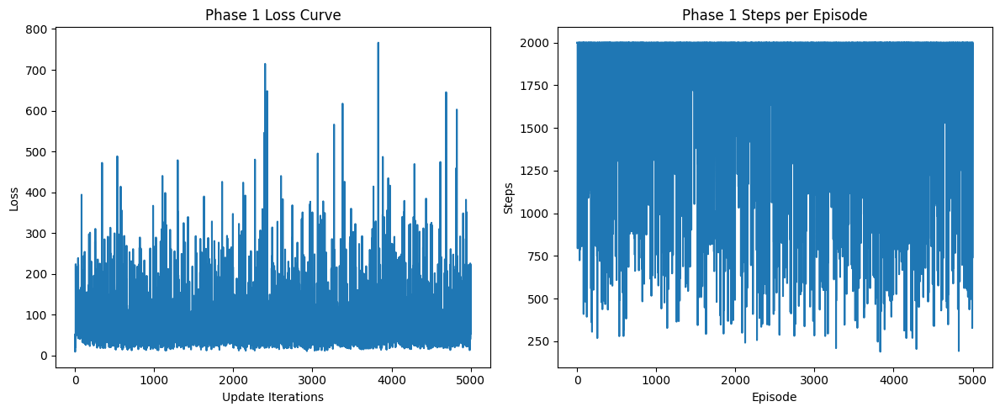

In [16]:
# 绘制训练曲线
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(agent.costs)
plt.title("Phase 1 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(agent.steps_per_episode)
plt.title("Phase 1 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")
plt.tight_layout()
plt.show()

In [17]:
state = env.reset()

In [18]:
state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 

In [19]:
# 保存训练好的模型
save_dir = r"C:\Users\lcf14\Desktop\RL\Mazes"
os.makedirs(save_dir, exist_ok=True)

save_path = os.path.join(save_dir, "1st_maze_PPO_model.pth")
torch.save({
    'policy_state_dict': agent.policy.state_dict(),
    'optimizer_state_dict': agent.optimizer.state_dict(),
}, save_path)

print(f"模型已保存到 {save_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\1st_maze_PPO_model.pth


## Testing

In [20]:
def create_animation(frames):
    """
    用 Matplotlib 创建动画，并在 Jupyter Notebook 里播放
    """
    fig, ax = plt.subplots()
    ax.axis("off")  # 关闭坐标轴
    im = ax.imshow(frames[0], cmap="gray", origin="upper")
    def update(i):
        im.set_array(frames[i])
        return [im]
    ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)
    return HTML(ani.to_jshtml())

def test_and_show_video(env, agent, num_frames=900):
    # 运行测试并记录帧
    state = env.reset()
    frames = []
    total_reward = 0
    steps = 0
    done = False
    while not done and steps < num_frames:
        frames.append(state.numpy())  # 记录迷宫状态
        action, _, _ = agent.choose_action(state)
        state, reward, done = env.step(action)
        total_reward += reward
        steps += 1
    print("🎬 Finished：")
    print(f"🚶 Steps: {steps}, 🏆 Total_reward: {total_reward}")
    return create_animation(frames)

=== Phase 1 model testing ===
🎬 Finished：
🚶 Steps: 900, 🏆 Total_reward: -46.94414776457233


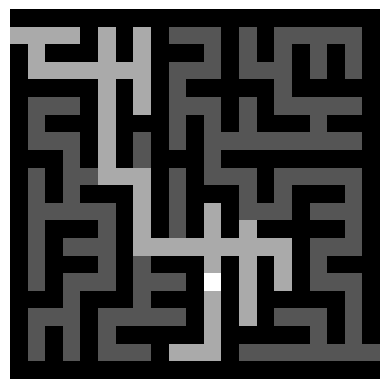

In [21]:
# 运行测试并显示动画
print("=== Phase 1 model testing ===")
test_and_show_video(env, agent)

# Phase 2 - Finding the Shortest Path

## Environment - 2st

In [22]:
class Phase2MazeEnv(MazeEnv):
    def __init__(self, maze_list, max_steps):
        super().__init__(maze_list, max_steps)
        self.maze_list = maze_list
        self.max_steps = max_steps
        self.start_pos = (1, 0)  # 固定入口
        self.exit_pos = (19, 20)  # 固定出口
        self.current_pos = None
        self.steps_taken = None
        self.maze_state = None  # 当前环境状态
        self.original_maze = None  # 存储原始迷宫结构

    def _process_state(self, state):
        """
        对环境的状态进行处理：
        由于原始状态中：
            0 表示墙壁
            1 表示可通行区域（未访问）
            2 表示已访问区域
            4 表示智能体当前位置
        为适配 embedding 层，我们将 4 映射为 3，使得状态类别为 {0,1,2,3}
        """
        state = state.clone()
        state[state == 4] = 3
        return state
    
    def reset(self):
        maze_np = random.choice(self.maze_list)
        self.original_maze = torch.tensor(maze_np, dtype=torch.int)
        self.maze_state = self.original_maze.clone()
        self.maze_state[self.maze_state != 0] = 1
        self.current_pos = self.start_pos
        self.steps_taken = 0
        self.visited_cells = {self.start_pos}
        self.path = [self.start_pos]
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions = deque(maxlen=10)
        self.recent_positions.append(self.start_pos)
        self.maze_state[self.current_pos] = 4
        return self._process_state(self.maze_state.clone())

    def _manhattan_distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    def step(self, action):
        reward = 0.0
        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 边界和墙壁惩罚
        if not (0 <= new_r < self.maze_state.shape[0] and 0 <= new_c < self.maze_state.shape[1] and self.original_maze[new_r, new_c].item() != 0):
            reward -= 1.0
            new_pos = self.current_pos
        else:
            # 保留对新位置访问的奖励，但降低其奖励值
            if new_pos not in self.visited_cells:
                reward += 3.0 # 新位置奖励
                self.visited_cells.add(new_pos)

            # 新增路径长度惩罚
            reward -= 0.5 # 每步惩罚

            # 基于历史路径的奖惩
            if new_pos in self.path:
                reward -= 0.5 # 轻微的重复路径惩罚
            else:
                # 计算当前位置和下一步位置到终点的曼哈顿距离
                current_distance = self._manhattan_distance(self.current_pos, self.exit_pos)
                next_distance = self._manhattan_distance(new_pos, self.exit_pos)
                # 如果距离减小，给予奖励
                if next_distance < current_distance:
                    reward += 3 # 曼哈顿距离减小的奖励

        # 判断是否到达出口或达到最大步数限制
        if new_pos == self.exit_pos:
            reward += 100.0
            done = True
        elif self.steps_taken + 1 >= self.max_steps:
            reward -= 50.0
            done = True
        else:
            done = False
    
        # 更新状态
        if self.current_pos != self.exit_pos:
            self.maze_state[self.current_pos] = 2
        self.current_pos = new_pos
        self.maze_state[self.current_pos] = 4
        self.path.append(self.current_pos)
        
        # 更新步数（此时已经判断过是否为最后一步）
        self.steps_taken += 1
    
        return self._process_state(self.maze_state.clone()), reward, done

In [23]:
# 初始化第二阶段环境
phase2_env = Phase2MazeEnv(maze_list=mazes, max_steps=900)

# 并行环境
phase2_env_class = Phase2MazeEnv
phase2_vec_env = VectorizedMazeEnv(phase2_env_class, maze_list=mazes, n_envs=n_envs, max_steps=900)

In [24]:
phase2_state = phase2_env.reset()

In [25]:
phase2_state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 

In [26]:
# 初始化智能体并加载预训练模型
phase2_agent = PPOAgent(device=device, lr=0.001, gamma=0.95, clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [27]:
# 加载第一阶段模型
save_path = os.path.join(save_dir, "1st_maze_PPO_model.pth")
checkpoint = torch.load(save_path)

In [28]:
# 加载预训练参数
phase2_agent.policy.load_state_dict(checkpoint['policy_state_dict'])
phase2_agent.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

In [29]:
phase2_num_episodes = 5000
episodes_done = 0

pbar_phase2 = tqdm(total=phase2_num_episodes, desc="Phase 2 Training Progress")

while episodes_done < phase2_num_episodes:
    states = phase2_vec_env.reset()
    done_mask = [False] * n_envs
    trajectories = [[] for _ in range(n_envs)]
    total_rewards = [0.0] * n_envs
    steps_counts = [0] * n_envs

    while not all(done_mask):
        actions, log_probs, values = phase2_agent.choose_action_batch(states)
        next_states, rewards, dones = phase2_vec_env.step(actions.cpu().numpy())

        with torch.no_grad():
            _, next_values = phase2_agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        for i in range(n_envs):
            if not done_mask[i]:
                trajectories[i].append((
                    states[i].cpu(),
                    actions[i].item(),
                    log_probs[i].cpu(),
                    rewards[i].item(),
                    values[i].item(),
                    float(dones[i].item()),
                    0.0  # next_value placeholder
                ))
                total_rewards[i] += rewards[i].item()
                steps_counts[i] += 1

        for i in range(n_envs):
            if not done_mask[i]:
                if dones[i]:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        for i in range(n_envs):
            if dones[i]:
                done_mask[i] = True

        states = next_states

    # 更新阶段：每个子环境的轨迹分别更新
    for i in range(n_envs):
        phase2_agent.steps_per_episode.append(steps_counts[i])
        phase2_agent.update(trajectories[i])
        episodes_done += 1
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        pbar_phase2.update(1)
        if episodes_done >= phase2_num_episodes:
            break

pbar_phase2.close()

Phase 2 Training Progress:   0%|                                                   | 1/5000 [00:17<24:03:19, 17.32s/it]

Episode 1, Reward: -584.00, Steps: 900


Phase 2 Training Progress:   0%|                                                   | 2/5000 [00:18<10:37:38,  7.65s/it]

Episode 2, Reward: -92.00, Steps: 590


Phase 2 Training Progress:   0%|                                                    | 3/5000 [00:19<6:40:18,  4.81s/it]

Episode 3, Reward: -761.00, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 4/5000 [00:20<4:46:31,  3.44s/it]

Episode 4, Reward: -743.00, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 5/5000 [00:22<3:46:29,  2.72s/it]

Episode 5, Reward: -640.00, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 6/5000 [00:23<3:12:05,  2.31s/it]

Episode 6, Reward: -711.00, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 7/5000 [00:25<2:44:26,  1.98s/it]

Episode 7, Reward: -641.00, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 8/5000 [00:26<2:30:34,  1.81s/it]

Episode 8, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   0%|                                                    | 9/5000 [00:28<2:18:21,  1.66s/it]

Episode 9, Reward: -685.50, Steps: 900


Phase 2 Training Progress:   0%|                                                   | 10/5000 [00:29<2:15:20,  1.63s/it]

Episode 10, Reward: -825.50, Steps: 900


Phase 2 Training Progress:   0%|                                                   | 11/5000 [00:30<2:05:58,  1.52s/it]

Episode 11, Reward: -577.00, Steps: 900


Phase 2 Training Progress:   0%|                                                   | 12/5000 [00:32<2:04:41,  1.50s/it]

Episode 12, Reward: -743.50, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 13/5000 [00:33<1:59:52,  1.44s/it]

Episode 13, Reward: -731.50, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 14/5000 [00:35<2:00:33,  1.45s/it]

Episode 14, Reward: -607.50, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 15/5000 [00:36<1:57:35,  1.42s/it]

Episode 15, Reward: -708.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 16/5000 [00:37<1:59:01,  1.43s/it]

Episode 16, Reward: -693.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 17/5000 [00:52<7:36:59,  5.50s/it]

Episode 17, Reward: -677.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 18/5000 [00:54<5:52:25,  4.24s/it]

Episode 18, Reward: -706.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 19/5000 [00:55<4:39:52,  3.37s/it]

Episode 19, Reward: -751.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 20/5000 [00:56<3:51:55,  2.79s/it]

Episode 20, Reward: -790.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 21/5000 [00:58<3:14:58,  2.35s/it]

Episode 21, Reward: -655.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 22/5000 [00:59<2:51:38,  2.07s/it]

Episode 22, Reward: -719.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 23/5000 [01:01<2:34:06,  1.86s/it]

Episode 23, Reward: -720.00, Steps: 900


Phase 2 Training Progress:   0%|▏                                                  | 24/5000 [01:02<2:24:25,  1.74s/it]

Episode 24, Reward: -858.50, Steps: 900


Phase 2 Training Progress:   0%|▎                                                  | 25/5000 [01:03<2:14:00,  1.62s/it]

Episode 25, Reward: -741.50, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 26/5000 [01:04<1:50:03,  1.33s/it]

Episode 26, Reward: 30.50, Steps: 415


Phase 2 Training Progress:   1%|▎                                                  | 27/5000 [01:05<1:54:16,  1.38s/it]

Episode 27, Reward: -588.00, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 28/5000 [01:07<1:53:13,  1.37s/it]

Episode 28, Reward: -659.00, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 29/5000 [01:07<1:35:23,  1.15s/it]

Episode 29, Reward: 12.50, Steps: 422


Phase 2 Training Progress:   1%|▎                                                  | 30/5000 [01:09<1:42:10,  1.23s/it]

Episode 30, Reward: -681.50, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 31/5000 [01:10<1:45:11,  1.27s/it]

Episode 31, Reward: -806.50, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 32/5000 [01:12<1:49:06,  1.32s/it]

Episode 32, Reward: -838.50, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 33/5000 [01:27<7:40:58,  5.57s/it]

Episode 33, Reward: -682.00, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 34/5000 [01:28<5:55:04,  4.29s/it]

Episode 34, Reward: -674.00, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 35/5000 [01:30<4:43:57,  3.43s/it]

Episode 35, Reward: -885.00, Steps: 900


Phase 2 Training Progress:   1%|▎                                                  | 36/5000 [01:31<3:55:13,  2.84s/it]

Episode 36, Reward: -772.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 37/5000 [01:33<3:17:47,  2.39s/it]

Episode 37, Reward: -727.00, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 38/5000 [01:34<2:54:12,  2.11s/it]

Episode 38, Reward: -813.00, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 39/5000 [01:36<2:35:44,  1.88s/it]

Episode 39, Reward: -647.00, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 40/5000 [01:36<2:08:01,  1.55s/it]

Episode 40, Reward: -32.00, Steps: 508


Phase 2 Training Progress:   1%|▍                                                  | 41/5000 [01:38<2:05:53,  1.52s/it]

Episode 41, Reward: -763.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 42/5000 [01:39<2:01:31,  1.47s/it]

Episode 42, Reward: -638.00, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 43/5000 [01:41<2:01:18,  1.47s/it]

Episode 43, Reward: -721.00, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 44/5000 [01:42<1:57:59,  1.43s/it]

Episode 44, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 45/5000 [01:43<1:59:31,  1.45s/it]

Episode 45, Reward: -721.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 46/5000 [01:45<1:56:20,  1.41s/it]

Episode 46, Reward: -812.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 47/5000 [01:46<1:54:03,  1.38s/it]

Episode 47, Reward: -772.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 48/5000 [01:48<1:56:59,  1.42s/it]

Episode 48, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   1%|▍                                                  | 49/5000 [02:03<7:43:02,  5.61s/it]

Episode 49, Reward: -747.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 50/5000 [02:04<5:57:14,  4.33s/it]

Episode 50, Reward: -802.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 51/5000 [02:06<4:45:42,  3.46s/it]

Episode 51, Reward: -733.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 52/5000 [02:07<3:52:57,  2.82s/it]

Episode 52, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 53/5000 [02:08<3:17:43,  2.40s/it]

Episode 53, Reward: -714.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 54/5000 [02:09<2:30:20,  1.82s/it]

Episode 54, Reward: 85.00, Steps: 296


Phase 2 Training Progress:   1%|▌                                                  | 55/5000 [02:10<2:20:59,  1.71s/it]

Episode 55, Reward: -831.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 56/5000 [02:12<2:10:24,  1.58s/it]

Episode 56, Reward: -832.00, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 57/5000 [02:13<2:05:25,  1.52s/it]

Episode 57, Reward: -829.00, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 58/5000 [02:14<2:01:41,  1.48s/it]

Episode 58, Reward: -769.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 59/5000 [02:16<2:00:27,  1.46s/it]

Episode 59, Reward: -720.50, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 60/5000 [02:17<2:01:08,  1.47s/it]

Episode 60, Reward: -724.00, Steps: 900


Phase 2 Training Progress:   1%|▌                                                  | 61/5000 [02:19<1:57:13,  1.42s/it]

Episode 61, Reward: -815.00, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 62/5000 [02:20<1:57:22,  1.43s/it]

Episode 62, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 63/5000 [02:21<1:55:07,  1.40s/it]

Episode 63, Reward: -654.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 64/5000 [02:23<1:54:00,  1.39s/it]

Episode 64, Reward: -677.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 65/5000 [02:37<7:06:14,  5.18s/it]

Episode 65, Reward: 195.00, Steps: 175


Phase 2 Training Progress:   1%|▋                                                  | 66/5000 [02:38<5:35:15,  4.08s/it]

Episode 66, Reward: -813.00, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 67/5000 [02:40<4:24:26,  3.22s/it]

Episode 67, Reward: -763.00, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 68/5000 [02:41<3:40:04,  2.68s/it]

Episode 68, Reward: -698.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 69/5000 [02:42<3:09:18,  2.30s/it]

Episode 69, Reward: -803.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 70/5000 [02:44<2:43:03,  1.98s/it]

Episode 70, Reward: -878.00, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 71/5000 [02:45<2:28:59,  1.81s/it]

Episode 71, Reward: -737.50, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 72/5000 [02:46<2:20:32,  1.71s/it]

Episode 72, Reward: -828.00, Steps: 900


Phase 2 Training Progress:   1%|▋                                                  | 73/5000 [02:48<2:10:43,  1.59s/it]

Episode 73, Reward: -713.50, Steps: 900


Phase 2 Training Progress:   1%|▊                                                  | 74/5000 [02:49<2:07:01,  1.55s/it]

Episode 74, Reward: -743.00, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 75/5000 [02:51<2:05:10,  1.52s/it]

Episode 75, Reward: -734.50, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 76/5000 [02:51<1:35:49,  1.17s/it]

Episode 76, Reward: 221.00, Steps: 198


Phase 2 Training Progress:   2%|▊                                                  | 77/5000 [02:52<1:40:53,  1.23s/it]

Episode 77, Reward: -717.00, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 78/5000 [02:54<1:45:40,  1.29s/it]

Episode 78, Reward: -635.50, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 79/5000 [02:54<1:29:07,  1.09s/it]

Episode 79, Reward: -45.50, Steps: 423


Phase 2 Training Progress:   2%|▊                                                  | 80/5000 [02:56<1:37:27,  1.19s/it]

Episode 80, Reward: -665.50, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 81/5000 [03:12<7:39:43,  5.61s/it]

Episode 81, Reward: -732.50, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 82/5000 [03:13<5:54:38,  4.33s/it]

Episode 82, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 83/5000 [03:15<4:44:30,  3.47s/it]

Episode 83, Reward: -656.00, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 84/5000 [03:16<3:51:52,  2.83s/it]

Episode 84, Reward: -685.00, Steps: 900


Phase 2 Training Progress:   2%|▊                                                  | 85/5000 [03:17<3:17:40,  2.41s/it]

Episode 85, Reward: -746.50, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 86/5000 [03:18<2:38:34,  1.94s/it]

Episode 86, Reward: -28.50, Steps: 465


Phase 2 Training Progress:   2%|▉                                                  | 87/5000 [03:20<2:26:31,  1.79s/it]

Episode 87, Reward: -615.50, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 88/5000 [03:21<2:15:31,  1.66s/it]

Episode 88, Reward: -743.50, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 89/5000 [03:22<2:11:17,  1.60s/it]

Episode 89, Reward: -711.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 90/5000 [03:24<2:09:11,  1.58s/it]

Episode 90, Reward: -621.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 91/5000 [03:25<2:03:46,  1.51s/it]

Episode 91, Reward: -645.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 92/5000 [03:27<2:01:56,  1.49s/it]

Episode 92, Reward: -842.50, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 93/5000 [03:28<1:58:39,  1.45s/it]

Episode 93, Reward: -776.50, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 94/5000 [03:30<1:59:27,  1.46s/it]

Episode 94, Reward: -681.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 95/5000 [03:31<1:56:32,  1.43s/it]

Episode 95, Reward: -855.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 96/5000 [03:33<1:58:41,  1.45s/it]

Episode 96, Reward: -823.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 97/5000 [03:48<7:51:37,  5.77s/it]

Episode 97, Reward: -704.00, Steps: 900


Phase 2 Training Progress:   2%|▉                                                  | 98/5000 [03:50<6:02:37,  4.44s/it]

Episode 98, Reward: -763.00, Steps: 900


Phase 2 Training Progress:   2%|█                                                  | 99/5000 [03:51<4:48:57,  3.54s/it]

Episode 99, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 100/5000 [03:52<3:55:09,  2.88s/it]

Episode 100, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 101/5000 [03:54<3:22:42,  2.48s/it]

Episode 101, Reward: -649.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 102/5000 [03:55<2:54:10,  2.13s/it]

Episode 102, Reward: -819.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 103/5000 [03:57<2:36:50,  1.92s/it]

Episode 103, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 104/5000 [03:58<2:21:59,  1.74s/it]

Episode 104, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 105/5000 [03:59<2:12:34,  1.63s/it]

Episode 105, Reward: -698.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 106/5000 [04:01<2:08:59,  1.58s/it]

Episode 106, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 107/5000 [04:02<2:02:38,  1.50s/it]

Episode 107, Reward: -813.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 108/5000 [04:04<1:59:08,  1.46s/it]

Episode 108, Reward: -796.00, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 109/5000 [04:05<1:59:45,  1.47s/it]

Episode 109, Reward: -796.00, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 110/5000 [04:06<1:55:58,  1.42s/it]

Episode 110, Reward: -852.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 111/5000 [04:08<1:55:27,  1.42s/it]

Episode 111, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   2%|█                                                 | 112/5000 [04:09<1:56:37,  1.43s/it]

Episode 112, Reward: -679.00, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 113/5000 [04:25<7:34:12,  5.58s/it]

Episode 113, Reward: -731.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 114/5000 [04:26<5:49:53,  4.30s/it]

Episode 114, Reward: -678.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 115/5000 [04:27<4:39:15,  3.43s/it]

Episode 115, Reward: -706.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 116/5000 [04:29<3:52:42,  2.86s/it]

Episode 116, Reward: -740.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 117/5000 [04:30<3:15:19,  2.40s/it]

Episode 117, Reward: -806.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 118/5000 [04:32<2:52:30,  2.12s/it]

Episode 118, Reward: -740.00, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 119/5000 [04:33<2:33:34,  1.89s/it]

Episode 119, Reward: -800.00, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 120/5000 [04:34<2:23:46,  1.77s/it]

Episode 120, Reward: -848.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 121/5000 [04:36<2:14:58,  1.66s/it]

Episode 121, Reward: -799.50, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 122/5000 [04:37<2:11:04,  1.61s/it]

Episode 122, Reward: -733.00, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 123/5000 [04:39<2:08:54,  1.59s/it]

Episode 123, Reward: -815.00, Steps: 900


Phase 2 Training Progress:   2%|█▏                                                | 124/5000 [04:40<2:05:41,  1.55s/it]

Episode 124, Reward: -761.00, Steps: 900


Phase 2 Training Progress:   2%|█▎                                                | 125/5000 [04:42<2:06:04,  1.55s/it]

Episode 125, Reward: -888.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 126/5000 [04:43<2:02:01,  1.50s/it]

Episode 126, Reward: -678.50, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 127/5000 [04:45<2:00:33,  1.48s/it]

Episode 127, Reward: -770.50, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 128/5000 [04:46<2:01:55,  1.50s/it]

Episode 128, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 129/5000 [05:02<7:58:54,  5.90s/it]

Episode 129, Reward: -639.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 130/5000 [05:04<6:07:23,  4.53s/it]

Episode 130, Reward: -862.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 131/5000 [05:05<4:52:38,  3.61s/it]

Episode 131, Reward: -836.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 132/5000 [05:07<4:04:20,  3.01s/it]

Episode 132, Reward: -836.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 133/5000 [05:08<3:24:58,  2.53s/it]

Episode 133, Reward: -637.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 134/5000 [05:10<3:00:35,  2.23s/it]

Episode 134, Reward: -862.00, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 135/5000 [05:11<2:44:21,  2.03s/it]

Episode 135, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 136/5000 [05:13<2:27:33,  1.82s/it]

Episode 136, Reward: -744.50, Steps: 900


Phase 2 Training Progress:   3%|█▎                                                | 137/5000 [05:14<2:16:53,  1.69s/it]

Episode 137, Reward: -780.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 138/5000 [05:15<2:07:44,  1.58s/it]

Episode 138, Reward: -865.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 139/5000 [05:17<2:04:15,  1.53s/it]

Episode 139, Reward: -645.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 140/5000 [05:17<1:43:17,  1.28s/it]

Episode 140, Reward: 62.00, Steps: 378


Phase 2 Training Progress:   3%|█▍                                                | 141/5000 [05:19<1:43:47,  1.28s/it]

Episode 141, Reward: -731.00, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 142/5000 [05:20<1:46:24,  1.31s/it]

Episode 142, Reward: -806.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 143/5000 [05:22<1:49:51,  1.36s/it]

Episode 143, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 144/5000 [05:23<1:52:03,  1.38s/it]

Episode 144, Reward: -757.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 145/5000 [05:38<7:22:46,  5.47s/it]

Episode 145, Reward: -802.00, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 146/5000 [05:39<5:41:40,  4.22s/it]

Episode 146, Reward: -826.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 147/5000 [05:41<4:33:41,  3.38s/it]

Episode 147, Reward: -676.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 148/5000 [05:42<3:47:35,  2.81s/it]

Episode 148, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   3%|█▍                                                | 149/5000 [05:44<3:12:20,  2.38s/it]

Episode 149, Reward: -757.00, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 150/5000 [05:45<2:50:49,  2.11s/it]

Episode 150, Reward: -701.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 151/5000 [05:46<2:31:52,  1.88s/it]

Episode 151, Reward: -832.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 152/5000 [05:48<2:20:59,  1.74s/it]

Episode 152, Reward: -846.00, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 153/5000 [05:49<2:11:22,  1.63s/it]

Episode 153, Reward: -898.00, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 154/5000 [05:51<2:04:29,  1.54s/it]

Episode 154, Reward: -692.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 155/5000 [05:52<2:00:40,  1.49s/it]

Episode 155, Reward: -865.00, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 156/5000 [05:53<1:56:07,  1.44s/it]

Episode 156, Reward: -731.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 157/5000 [05:55<1:53:39,  1.41s/it]

Episode 157, Reward: -599.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 158/5000 [05:56<1:52:38,  1.40s/it]

Episode 158, Reward: -851.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 159/5000 [05:57<1:50:38,  1.37s/it]

Episode 159, Reward: -700.00, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 160/5000 [05:59<1:54:12,  1.42s/it]

Episode 160, Reward: -824.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 161/5000 [06:13<7:14:45,  5.39s/it]

Episode 161, Reward: -767.50, Steps: 900


Phase 2 Training Progress:   3%|█▌                                                | 162/5000 [06:15<5:34:22,  4.15s/it]

Episode 162, Reward: -884.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 163/5000 [06:16<4:24:53,  3.29s/it]

Episode 163, Reward: -675.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 164/5000 [06:17<3:40:19,  2.73s/it]

Episode 164, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 165/5000 [06:19<3:05:58,  2.31s/it]

Episode 165, Reward: -770.00, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 166/5000 [06:20<2:44:22,  2.04s/it]

Episode 166, Reward: -839.00, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 167/5000 [06:21<2:26:20,  1.82s/it]

Episode 167, Reward: -845.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 168/5000 [06:23<2:17:28,  1.71s/it]

Episode 168, Reward: -753.00, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 169/5000 [06:24<2:11:49,  1.64s/it]

Episode 169, Reward: -812.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 170/5000 [06:26<2:05:02,  1.55s/it]

Episode 170, Reward: -868.00, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 171/5000 [06:27<2:04:26,  1.55s/it]

Episode 171, Reward: -826.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 172/5000 [06:29<1:58:55,  1.48s/it]

Episode 172, Reward: -784.00, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 173/5000 [06:30<1:58:29,  1.47s/it]

Episode 173, Reward: -832.50, Steps: 900


Phase 2 Training Progress:   3%|█▋                                                | 174/5000 [06:31<1:53:20,  1.41s/it]

Episode 174, Reward: -689.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 175/5000 [06:33<1:52:09,  1.39s/it]

Episode 175, Reward: -789.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 176/5000 [06:34<1:54:04,  1.42s/it]

Episode 176, Reward: -702.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 177/5000 [06:49<7:13:24,  5.39s/it]

Episode 177, Reward: -789.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 178/5000 [06:50<5:36:10,  4.18s/it]

Episode 178, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 179/5000 [06:51<4:26:02,  3.31s/it]

Episode 179, Reward: -839.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 180/5000 [06:53<3:40:21,  2.74s/it]

Episode 180, Reward: -751.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 181/5000 [06:54<3:06:59,  2.33s/it]

Episode 181, Reward: -725.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 182/5000 [06:56<2:45:56,  2.07s/it]

Episode 182, Reward: -813.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 183/5000 [06:57<2:29:37,  1.86s/it]

Episode 183, Reward: -838.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 184/5000 [06:59<2:20:51,  1.75s/it]

Episode 184, Reward: -770.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 185/5000 [07:00<2:11:42,  1.64s/it]

Episode 185, Reward: -627.00, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 186/5000 [07:01<2:03:07,  1.53s/it]

Episode 186, Reward: -838.50, Steps: 900


Phase 2 Training Progress:   4%|█▊                                                | 187/5000 [07:03<2:02:00,  1.52s/it]

Episode 187, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 188/5000 [07:04<1:56:10,  1.45s/it]

Episode 188, Reward: -728.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 189/5000 [07:05<1:55:43,  1.44s/it]

Episode 189, Reward: -675.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 190/5000 [07:07<1:53:20,  1.41s/it]

Episode 190, Reward: -897.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 191/5000 [07:08<1:54:23,  1.43s/it]

Episode 191, Reward: -685.00, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 192/5000 [07:09<1:50:17,  1.38s/it]

Episode 192, Reward: -711.00, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 193/5000 [07:25<7:20:58,  5.50s/it]

Episode 193, Reward: -839.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 194/5000 [07:26<5:40:58,  4.26s/it]

Episode 194, Reward: -792.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 195/5000 [07:27<4:32:59,  3.41s/it]

Episode 195, Reward: -673.00, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 196/5000 [07:29<3:48:04,  2.85s/it]

Episode 196, Reward: -868.00, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 197/5000 [07:30<3:12:07,  2.40s/it]

Episode 197, Reward: -793.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 198/5000 [07:32<2:50:49,  2.13s/it]

Episode 198, Reward: -800.50, Steps: 900


Phase 2 Training Progress:   4%|█▉                                                | 199/5000 [07:33<2:32:49,  1.91s/it]

Episode 199, Reward: -858.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 200/5000 [07:34<2:03:12,  1.54s/it]

Episode 200, Reward: -13.50, Steps: 427


Phase 2 Training Progress:   4%|██                                                | 201/5000 [07:35<2:01:33,  1.52s/it]

Episode 201, Reward: -841.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 202/5000 [07:36<1:42:04,  1.28s/it]

Episode 202, Reward: -83.50, Steps: 500


Phase 2 Training Progress:   4%|██                                                | 203/5000 [07:37<1:43:15,  1.29s/it]

Episode 203, Reward: -855.00, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 204/5000 [07:39<1:45:02,  1.31s/it]

Episode 204, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 205/5000 [07:40<1:48:40,  1.36s/it]

Episode 205, Reward: -790.00, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 206/5000 [07:42<1:52:24,  1.41s/it]

Episode 206, Reward: -826.00, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 207/5000 [07:43<1:53:07,  1.42s/it]

Episode 207, Reward: -838.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 208/5000 [07:45<1:52:24,  1.41s/it]

Episode 208, Reward: -763.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 209/5000 [07:59<7:09:13,  5.38s/it]

Episode 209, Reward: -708.00, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 210/5000 [08:01<5:32:17,  4.16s/it]

Episode 210, Reward: -766.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 211/5000 [08:02<4:27:29,  3.35s/it]

Episode 211, Reward: -688.50, Steps: 900


Phase 2 Training Progress:   4%|██                                                | 212/5000 [08:03<3:37:28,  2.73s/it]

Episode 212, Reward: -779.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 213/5000 [08:05<3:06:39,  2.34s/it]

Episode 213, Reward: -694.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 214/5000 [08:06<2:45:48,  2.08s/it]

Episode 214, Reward: -727.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 215/5000 [08:07<2:15:30,  1.70s/it]

Episode 215, Reward: -137.00, Steps: 538


Phase 2 Training Progress:   4%|██▏                                               | 216/5000 [08:08<2:08:09,  1.61s/it]

Episode 216, Reward: -649.00, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 217/5000 [08:09<1:53:54,  1.43s/it]

Episode 217, Reward: -190.00, Steps: 596


Phase 2 Training Progress:   4%|██▏                                               | 218/5000 [08:11<1:50:11,  1.38s/it]

Episode 218, Reward: -865.00, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 219/5000 [08:12<1:51:25,  1.40s/it]

Episode 219, Reward: -835.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 220/5000 [08:14<1:52:52,  1.42s/it]

Episode 220, Reward: -754.00, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 221/5000 [08:15<1:51:00,  1.39s/it]

Episode 221, Reward: -672.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 222/5000 [08:16<1:51:58,  1.41s/it]

Episode 222, Reward: -822.50, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 223/5000 [08:18<1:50:34,  1.39s/it]

Episode 223, Reward: -800.00, Steps: 900


Phase 2 Training Progress:   4%|██▏                                               | 224/5000 [08:19<1:50:33,  1.39s/it]

Episode 224, Reward: -622.00, Steps: 900


Phase 2 Training Progress:   4%|██▎                                               | 225/5000 [08:35<7:28:36,  5.64s/it]

Episode 225, Reward: -688.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 226/5000 [08:36<5:45:21,  4.34s/it]

Episode 226, Reward: -784.00, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 227/5000 [08:37<4:35:51,  3.47s/it]

Episode 227, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 228/5000 [08:39<3:44:15,  2.82s/it]

Episode 228, Reward: -738.00, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 229/5000 [08:40<3:10:39,  2.40s/it]

Episode 229, Reward: -692.00, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 230/5000 [08:42<2:49:03,  2.13s/it]

Episode 230, Reward: -835.00, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 231/5000 [08:43<2:29:38,  1.88s/it]

Episode 231, Reward: -818.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 232/5000 [08:44<2:18:13,  1.74s/it]

Episode 232, Reward: -845.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 233/5000 [08:46<2:11:33,  1.66s/it]

Episode 233, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 234/5000 [08:47<2:05:03,  1.57s/it]

Episode 234, Reward: -743.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 235/5000 [08:48<1:59:45,  1.51s/it]

Episode 235, Reward: -783.50, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 236/5000 [08:50<1:59:25,  1.50s/it]

Episode 236, Reward: -842.00, Steps: 900


Phase 2 Training Progress:   5%|██▎                                               | 237/5000 [08:51<1:54:38,  1.44s/it]

Episode 237, Reward: -779.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 238/5000 [08:53<1:54:44,  1.45s/it]

Episode 238, Reward: -662.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 239/5000 [08:54<1:52:41,  1.42s/it]

Episode 239, Reward: -872.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 240/5000 [08:55<1:50:16,  1.39s/it]

Episode 240, Reward: -774.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 241/5000 [09:11<7:23:02,  5.59s/it]

Episode 241, Reward: -751.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 242/5000 [09:12<5:42:51,  4.32s/it]

Episode 242, Reward: -751.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 243/5000 [09:14<4:33:49,  3.45s/it]

Episode 243, Reward: -817.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 244/5000 [09:15<3:46:17,  2.85s/it]

Episode 244, Reward: -885.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 245/5000 [09:16<3:10:24,  2.40s/it]

Episode 245, Reward: -832.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 246/5000 [09:18<2:47:01,  2.11s/it]

Episode 246, Reward: -687.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 247/5000 [09:19<2:28:46,  1.88s/it]

Episode 247, Reward: -732.00, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 248/5000 [09:21<2:18:49,  1.75s/it]

Episode 248, Reward: -793.50, Steps: 900


Phase 2 Training Progress:   5%|██▍                                               | 249/5000 [09:22<2:09:13,  1.63s/it]

Episode 249, Reward: -805.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 250/5000 [09:23<2:05:36,  1.59s/it]

Episode 250, Reward: -679.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 251/5000 [09:25<1:59:07,  1.51s/it]

Episode 251, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 252/5000 [09:25<1:40:59,  1.28s/it]

Episode 252, Reward: -89.50, Steps: 499


Phase 2 Training Progress:   5%|██▌                                               | 253/5000 [09:27<1:43:00,  1.30s/it]

Episode 253, Reward: -828.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 254/5000 [09:28<1:43:38,  1.31s/it]

Episode 254, Reward: -733.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 255/5000 [09:30<1:43:51,  1.31s/it]

Episode 255, Reward: -677.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 256/5000 [09:31<1:44:41,  1.32s/it]

Episode 256, Reward: -679.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 257/5000 [09:46<7:07:32,  5.41s/it]

Episode 257, Reward: -752.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 258/5000 [09:47<5:30:53,  4.19s/it]

Episode 258, Reward: -720.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 259/5000 [09:49<4:26:16,  3.37s/it]

Episode 259, Reward: -842.50, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 260/5000 [09:50<3:36:39,  2.74s/it]

Episode 260, Reward: -865.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 261/5000 [09:51<3:05:04,  2.34s/it]

Episode 261, Reward: -623.00, Steps: 900


Phase 2 Training Progress:   5%|██▌                                               | 262/5000 [09:53<2:42:56,  2.06s/it]

Episode 262, Reward: -784.00, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 263/5000 [09:54<2:19:38,  1.77s/it]

Episode 263, Reward: -328.50, Steps: 739


Phase 2 Training Progress:   5%|██▋                                               | 264/5000 [09:54<1:51:18,  1.41s/it]

Episode 264, Reward: 88.50, Steps: 349


Phase 2 Training Progress:   5%|██▋                                               | 265/5000 [09:56<1:49:30,  1.39s/it]

Episode 265, Reward: -621.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 266/5000 [09:57<1:50:32,  1.40s/it]

Episode 266, Reward: -673.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 267/5000 [09:59<1:52:17,  1.42s/it]

Episode 267, Reward: -849.00, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 268/5000 [10:00<1:50:40,  1.40s/it]

Episode 268, Reward: -806.00, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 269/5000 [10:01<1:51:35,  1.42s/it]

Episode 269, Reward: -825.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 270/5000 [10:03<1:47:44,  1.37s/it]

Episode 270, Reward: -897.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 271/5000 [10:04<1:48:08,  1.37s/it]

Episode 271, Reward: -727.00, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 272/5000 [10:06<1:50:44,  1.41s/it]

Episode 272, Reward: -806.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 273/5000 [10:20<7:04:14,  5.38s/it]

Episode 273, Reward: -828.50, Steps: 900


Phase 2 Training Progress:   5%|██▋                                               | 274/5000 [10:22<5:28:20,  4.17s/it]

Episode 274, Reward: -783.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 275/5000 [10:23<4:20:18,  3.31s/it]

Episode 275, Reward: -633.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 276/5000 [10:24<3:36:25,  2.75s/it]

Episode 276, Reward: -832.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 277/5000 [10:25<3:00:35,  2.29s/it]

Episode 277, Reward: -859.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 278/5000 [10:27<2:40:12,  2.04s/it]

Episode 278, Reward: -642.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 279/5000 [10:28<2:24:05,  1.83s/it]

Episode 279, Reward: -862.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 280/5000 [10:30<2:12:48,  1.69s/it]

Episode 280, Reward: -681.50, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 281/5000 [10:31<2:11:31,  1.67s/it]

Episode 281, Reward: -881.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 282/5000 [10:34<2:35:59,  1.98s/it]

Episode 282, Reward: -852.50, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 283/5000 [10:36<2:43:21,  2.08s/it]

Episode 283, Reward: -839.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 284/5000 [10:39<2:47:32,  2.13s/it]

Episode 284, Reward: -698.00, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 285/5000 [10:41<2:59:55,  2.29s/it]

Episode 285, Reward: -701.50, Steps: 900


Phase 2 Training Progress:   6%|██▊                                               | 286/5000 [10:42<2:27:31,  1.88s/it]

Episode 286, Reward: 98.50, Steps: 279


Phase 2 Training Progress:   6%|██▊                                               | 287/5000 [10:45<2:41:51,  2.06s/it]

Episode 287, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 288/5000 [10:47<2:54:56,  2.23s/it]

Episode 288, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   6%|██▊                                              | 289/5000 [11:13<12:19:26,  9.42s/it]

Episode 289, Reward: -845.00, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 290/5000 [11:16<9:36:56,  7.35s/it]

Episode 290, Reward: -727.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 291/5000 [11:19<7:45:00,  5.93s/it]

Episode 291, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 292/5000 [11:21<6:24:35,  4.90s/it]

Episode 292, Reward: -714.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 293/5000 [11:24<5:36:16,  4.29s/it]

Episode 293, Reward: -650.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 294/5000 [11:27<4:59:24,  3.82s/it]

Episode 294, Reward: -799.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 295/5000 [11:29<4:37:03,  3.53s/it]

Episode 295, Reward: -766.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 296/5000 [11:32<4:23:12,  3.36s/it]

Episode 296, Reward: -708.00, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 297/5000 [11:35<4:11:36,  3.21s/it]

Episode 297, Reward: -700.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 298/5000 [11:38<4:01:24,  3.08s/it]

Episode 298, Reward: -812.00, Steps: 900


Phase 2 Training Progress:   6%|██▉                                               | 299/5000 [11:41<3:54:30,  2.99s/it]

Episode 299, Reward: -763.00, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 300/5000 [11:44<3:54:57,  3.00s/it]

Episode 300, Reward: -823.00, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 301/5000 [11:47<3:49:29,  2.93s/it]

Episode 301, Reward: -664.00, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 302/5000 [11:50<3:58:49,  3.05s/it]

Episode 302, Reward: -719.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 303/5000 [11:53<3:55:16,  3.01s/it]

Episode 303, Reward: -760.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 304/5000 [11:56<3:49:33,  2.93s/it]

Episode 304, Reward: -661.50, Steps: 900


Phase 2 Training Progress:   6%|██▉                                              | 305/5000 [12:23<13:24:14, 10.28s/it]

Episode 305, Reward: -816.00, Steps: 900


Phase 2 Training Progress:   6%|██▉                                              | 306/5000 [12:26<10:26:29,  8.01s/it]

Episode 306, Reward: -793.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 307/5000 [12:29<8:27:08,  6.48s/it]

Episode 307, Reward: -727.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 308/5000 [12:32<7:03:18,  5.41s/it]

Episode 308, Reward: -841.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 309/5000 [12:34<6:01:40,  4.63s/it]

Episode 309, Reward: -842.00, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 310/5000 [12:37<5:18:35,  4.08s/it]

Episode 310, Reward: -792.50, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 311/5000 [12:40<4:49:01,  3.70s/it]

Episode 311, Reward: -859.00, Steps: 900


Phase 2 Training Progress:   6%|███                                               | 312/5000 [12:43<4:27:15,  3.42s/it]

Episode 312, Reward: -786.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 313/5000 [12:46<4:10:39,  3.21s/it]

Episode 313, Reward: -842.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 314/5000 [12:48<3:59:42,  3.07s/it]

Episode 314, Reward: -705.00, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 315/5000 [12:49<3:05:08,  2.37s/it]

Episode 315, Reward: 133.50, Steps: 237


Phase 2 Training Progress:   6%|███▏                                              | 316/5000 [12:52<3:16:48,  2.52s/it]

Episode 316, Reward: -695.00, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 317/5000 [12:55<3:23:07,  2.60s/it]

Episode 317, Reward: -759.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 318/5000 [12:57<3:28:06,  2.67s/it]

Episode 318, Reward: -813.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 319/5000 [13:00<3:34:21,  2.75s/it]

Episode 319, Reward: -782.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 320/5000 [13:03<3:33:47,  2.74s/it]

Episode 320, Reward: -735.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                             | 321/5000 [13:29<12:44:05,  9.80s/it]

Episode 321, Reward: -737.50, Steps: 900


Phase 2 Training Progress:   6%|███▏                                              | 322/5000 [13:30<9:07:29,  7.02s/it]

Episode 322, Reward: 219.50, Steps: 141


Phase 2 Training Progress:   6%|███▏                                              | 323/5000 [13:31<6:55:06,  5.33s/it]

Episode 323, Reward: -5.00, Steps: 414


Phase 2 Training Progress:   6%|███▏                                              | 324/5000 [13:34<5:59:22,  4.61s/it]

Episode 324, Reward: -658.50, Steps: 900


Phase 2 Training Progress:   6%|███▎                                              | 325/5000 [13:37<5:15:08,  4.04s/it]

Episode 325, Reward: -839.50, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 326/5000 [13:40<4:45:19,  3.66s/it]

Episode 326, Reward: -875.00, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 327/5000 [13:43<4:30:53,  3.48s/it]

Episode 327, Reward: -825.50, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 328/5000 [13:46<4:17:14,  3.30s/it]

Episode 328, Reward: -632.00, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 329/5000 [13:47<3:35:53,  2.77s/it]

Episode 329, Reward: -65.00, Steps: 476


Phase 2 Training Progress:   7%|███▎                                              | 330/5000 [13:50<3:39:44,  2.82s/it]

Episode 330, Reward: -813.50, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 331/5000 [13:53<3:41:12,  2.84s/it]

Episode 331, Reward: -686.00, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 332/5000 [13:56<3:39:36,  2.82s/it]

Episode 332, Reward: -669.50, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 333/5000 [13:56<2:47:28,  2.15s/it]

Episode 333, Reward: 241.50, Steps: 155


Phase 2 Training Progress:   7%|███▎                                              | 334/5000 [13:59<3:02:57,  2.35s/it]

Episode 334, Reward: -859.00, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 335/5000 [14:02<3:13:07,  2.48s/it]

Episode 335, Reward: -635.50, Steps: 900


Phase 2 Training Progress:   7%|███▎                                              | 336/5000 [14:03<2:39:18,  2.05s/it]

Episode 336, Reward: 112.00, Steps: 321


Phase 2 Training Progress:   7%|███▎                                             | 337/5000 [14:29<12:02:57,  9.30s/it]

Episode 337, Reward: -698.50, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 338/5000 [14:32<9:31:16,  7.35s/it]

Episode 338, Reward: -819.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 339/5000 [14:35<7:56:46,  6.14s/it]

Episode 339, Reward: -787.50, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 340/5000 [14:38<6:33:52,  5.07s/it]

Episode 340, Reward: -705.50, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 341/5000 [14:41<5:41:34,  4.40s/it]

Episode 341, Reward: -734.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 342/5000 [14:44<5:06:02,  3.94s/it]

Episode 342, Reward: -689.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 343/5000 [14:46<4:37:22,  3.57s/it]

Episode 343, Reward: -680.50, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 344/5000 [14:49<4:17:38,  3.32s/it]

Episode 344, Reward: -836.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 345/5000 [14:52<4:03:33,  3.14s/it]

Episode 345, Reward: -758.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 346/5000 [14:55<3:52:51,  3.00s/it]

Episode 346, Reward: -786.50, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 347/5000 [14:57<3:48:36,  2.95s/it]

Episode 347, Reward: -822.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 348/5000 [15:00<3:43:34,  2.88s/it]

Episode 348, Reward: -777.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                              | 349/5000 [15:03<3:40:52,  2.85s/it]

Episode 349, Reward: -668.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 350/5000 [15:06<3:42:04,  2.87s/it]

Episode 350, Reward: -715.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 351/5000 [15:09<3:43:18,  2.88s/it]

Episode 351, Reward: -790.00, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 352/5000 [15:10<3:02:13,  2.35s/it]

Episode 352, Reward: 68.50, Steps: 331


Phase 2 Training Progress:   7%|███▍                                             | 353/5000 [15:38<12:55:58, 10.02s/it]

Episode 353, Reward: -694.00, Steps: 900


Phase 2 Training Progress:   7%|███▍                                             | 354/5000 [15:41<10:11:00,  7.89s/it]

Episode 354, Reward: -731.00, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 355/5000 [15:43<8:10:11,  6.33s/it]

Episode 355, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 356/5000 [15:46<6:40:51,  5.18s/it]

Episode 356, Reward: -230.00, Steps: 704


Phase 2 Training Progress:   7%|███▌                                              | 357/5000 [15:49<5:43:58,  4.45s/it]

Episode 357, Reward: -825.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 358/5000 [15:52<5:12:01,  4.03s/it]

Episode 358, Reward: -797.00, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 359/5000 [15:55<4:48:35,  3.73s/it]

Episode 359, Reward: -825.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 360/5000 [15:58<4:32:58,  3.53s/it]

Episode 360, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 361/5000 [16:01<4:19:46,  3.36s/it]

Episode 361, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                              | 362/5000 [16:04<4:10:15,  3.24s/it]

Episode 362, Reward: -839.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 363/5000 [16:06<3:58:27,  3.09s/it]

Episode 363, Reward: -835.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 364/5000 [16:09<3:54:12,  3.03s/it]

Episode 364, Reward: -733.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 365/5000 [16:12<3:50:07,  2.98s/it]

Episode 365, Reward: -773.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 366/5000 [16:15<3:44:45,  2.91s/it]

Episode 366, Reward: -683.00, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 367/5000 [16:18<3:40:03,  2.85s/it]

Episode 367, Reward: -696.00, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 368/5000 [16:20<3:40:57,  2.86s/it]

Episode 368, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   7%|███▌                                             | 369/5000 [16:48<13:14:41, 10.30s/it]

Episode 369, Reward: -740.00, Steps: 900


Phase 2 Training Progress:   7%|███▋                                             | 370/5000 [16:51<10:21:51,  8.06s/it]

Episode 370, Reward: -819.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 371/5000 [16:54<8:17:21,  6.45s/it]

Episode 371, Reward: -796.00, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 372/5000 [16:56<6:47:02,  5.28s/it]

Episode 372, Reward: -711.50, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 373/5000 [16:59<5:51:25,  4.56s/it]

Episode 373, Reward: -809.00, Steps: 900


Phase 2 Training Progress:   7%|███▋                                              | 374/5000 [17:02<5:10:21,  4.03s/it]

Episode 374, Reward: -705.00, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 375/5000 [17:05<4:53:08,  3.80s/it]

Episode 375, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 376/5000 [17:08<4:38:15,  3.61s/it]

Episode 376, Reward: -759.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 377/5000 [17:11<4:19:20,  3.37s/it]

Episode 377, Reward: -842.00, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 378/5000 [17:14<4:05:06,  3.18s/it]

Episode 378, Reward: -839.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 379/5000 [17:17<3:54:53,  3.05s/it]

Episode 379, Reward: -713.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 380/5000 [17:19<3:48:06,  2.96s/it]

Episode 380, Reward: -868.00, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 381/5000 [17:22<3:45:46,  2.93s/it]

Episode 381, Reward: -648.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 382/5000 [17:25<3:43:04,  2.90s/it]

Episode 382, Reward: -865.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 383/5000 [17:28<3:44:13,  2.91s/it]

Episode 383, Reward: -783.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 384/5000 [17:31<3:45:34,  2.93s/it]

Episode 384, Reward: -764.00, Steps: 900


Phase 2 Training Progress:   8%|███▊                                             | 385/5000 [17:59<13:29:03, 10.52s/it]

Episode 385, Reward: -767.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                             | 386/5000 [18:02<10:29:53,  8.19s/it]

Episode 386, Reward: -777.50, Steps: 900


Phase 2 Training Progress:   8%|███▊                                              | 387/5000 [18:05<8:21:28,  6.52s/it]

Episode 387, Reward: -750.00, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 388/5000 [18:06<6:19:46,  4.94s/it]

Episode 388, Reward: -31.50, Steps: 415


Phase 2 Training Progress:   8%|███▉                                              | 389/5000 [18:08<5:25:09,  4.23s/it]

Episode 389, Reward: -792.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 390/5000 [18:11<4:48:21,  3.75s/it]

Episode 390, Reward: -813.00, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 391/5000 [18:14<4:22:11,  3.41s/it]

Episode 391, Reward: -845.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 392/5000 [18:16<4:05:54,  3.20s/it]

Episode 392, Reward: -724.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 393/5000 [18:18<3:39:26,  2.86s/it]

Episode 393, Reward: -257.50, Steps: 687


Phase 2 Training Progress:   8%|███▉                                              | 394/5000 [18:21<3:37:36,  2.83s/it]

Episode 394, Reward: -911.00, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 395/5000 [18:24<3:34:43,  2.80s/it]

Episode 395, Reward: -660.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 396/5000 [18:27<3:31:29,  2.76s/it]

Episode 396, Reward: -771.00, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 397/5000 [18:29<3:31:48,  2.76s/it]

Episode 397, Reward: -681.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 398/5000 [18:32<3:28:32,  2.72s/it]

Episode 398, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                              | 399/5000 [18:35<3:27:50,  2.71s/it]

Episode 399, Reward: -793.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 400/5000 [18:37<3:28:05,  2.71s/it]

Episode 400, Reward: -858.50, Steps: 900


Phase 2 Training Progress:   8%|███▉                                             | 401/5000 [19:03<12:24:45,  9.72s/it]

Episode 401, Reward: -780.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 402/5000 [19:06<9:45:08,  7.64s/it]

Episode 402, Reward: -709.00, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 403/5000 [19:09<7:49:48,  6.13s/it]

Episode 403, Reward: -764.00, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 404/5000 [19:12<6:31:03,  5.11s/it]

Episode 404, Reward: -662.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 405/5000 [19:14<5:33:32,  4.36s/it]

Episode 405, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 406/5000 [19:17<5:00:47,  3.93s/it]

Episode 406, Reward: -592.00, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 407/5000 [19:20<4:38:50,  3.64s/it]

Episode 407, Reward: -845.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 408/5000 [19:23<4:19:44,  3.39s/it]

Episode 408, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 409/5000 [19:26<4:03:19,  3.18s/it]

Episode 409, Reward: -852.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 410/5000 [19:28<3:56:30,  3.09s/it]

Episode 410, Reward: -645.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 411/5000 [19:31<3:51:05,  3.02s/it]

Episode 411, Reward: -665.50, Steps: 900


Phase 2 Training Progress:   8%|████                                              | 412/5000 [19:34<3:44:06,  2.93s/it]

Episode 412, Reward: -728.50, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 413/5000 [19:37<3:40:00,  2.88s/it]

Episode 413, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 414/5000 [19:39<3:36:07,  2.83s/it]

Episode 414, Reward: -733.50, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 415/5000 [19:42<3:34:53,  2.81s/it]

Episode 415, Reward: -652.00, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 416/5000 [19:45<3:34:26,  2.81s/it]

Episode 416, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   8%|████                                             | 417/5000 [20:13<13:03:30, 10.26s/it]

Episode 417, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   8%|████                                             | 418/5000 [20:15<10:10:28,  7.99s/it]

Episode 418, Reward: -652.00, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 419/5000 [20:18<8:10:47,  6.43s/it]

Episode 419, Reward: -822.00, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 420/5000 [20:21<6:49:40,  5.37s/it]

Episode 420, Reward: -693.50, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 421/5000 [20:24<5:49:58,  4.59s/it]

Episode 421, Reward: -704.00, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 422/5000 [20:26<5:04:40,  3.99s/it]

Episode 422, Reward: -829.00, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 423/5000 [20:29<4:38:45,  3.65s/it]

Episode 423, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   8%|████▏                                             | 424/5000 [20:32<4:17:03,  3.37s/it]

Episode 424, Reward: -720.50, Steps: 900


Phase 2 Training Progress:   8%|████▎                                             | 425/5000 [20:35<4:02:03,  3.17s/it]

Episode 425, Reward: -704.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 426/5000 [20:37<3:51:24,  3.04s/it]

Episode 426, Reward: -819.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 427/5000 [20:40<3:45:04,  2.95s/it]

Episode 427, Reward: -732.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 428/5000 [20:43<3:41:54,  2.91s/it]

Episode 428, Reward: -862.00, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 429/5000 [20:46<3:38:28,  2.87s/it]

Episode 429, Reward: -769.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 430/5000 [20:49<3:35:58,  2.84s/it]

Episode 430, Reward: -760.00, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 431/5000 [20:51<3:33:25,  2.80s/it]

Episode 431, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 432/5000 [20:54<3:30:20,  2.76s/it]

Episode 432, Reward: -767.00, Steps: 900


Phase 2 Training Progress:   9%|████▏                                            | 433/5000 [21:21<12:44:49, 10.05s/it]

Episode 433, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 434/5000 [21:23<9:40:01,  7.62s/it]

Episode 434, Reward: -192.00, Steps: 599


Phase 2 Training Progress:   9%|████▎                                             | 435/5000 [21:26<7:48:50,  6.16s/it]

Episode 435, Reward: -651.50, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 436/5000 [21:28<6:31:19,  5.14s/it]

Episode 436, Reward: -797.00, Steps: 900


Phase 2 Training Progress:   9%|████▎                                             | 437/5000 [21:31<5:37:48,  4.44s/it]

Episode 437, Reward: -731.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 438/5000 [21:34<5:01:48,  3.97s/it]

Episode 438, Reward: -658.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 439/5000 [21:36<4:19:53,  3.42s/it]

Episode 439, Reward: -255.00, Steps: 689


Phase 2 Training Progress:   9%|████▍                                             | 440/5000 [21:39<4:08:48,  3.27s/it]

Episode 440, Reward: -658.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 441/5000 [21:42<4:00:49,  3.17s/it]

Episode 441, Reward: -865.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 442/5000 [21:45<3:48:57,  3.01s/it]

Episode 442, Reward: -756.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 443/5000 [21:48<3:43:43,  2.95s/it]

Episode 443, Reward: -871.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 444/5000 [21:50<3:42:51,  2.93s/it]

Episode 444, Reward: -845.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 445/5000 [21:53<3:42:18,  2.93s/it]

Episode 445, Reward: -721.00, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 446/5000 [21:56<3:42:45,  2.93s/it]

Episode 446, Reward: -754.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 447/5000 [21:59<3:40:56,  2.91s/it]

Episode 447, Reward: -884.50, Steps: 900


Phase 2 Training Progress:   9%|████▍                                             | 448/5000 [22:02<3:38:31,  2.88s/it]

Episode 448, Reward: -777.00, Steps: 900


Phase 2 Training Progress:   9%|████▍                                            | 449/5000 [22:29<12:56:07, 10.23s/it]

Episode 449, Reward: -695.00, Steps: 900


Phase 2 Training Progress:   9%|████▍                                            | 450/5000 [22:32<10:05:44,  7.99s/it]

Episode 450, Reward: -784.00, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 451/5000 [22:35<8:07:12,  6.43s/it]

Episode 451, Reward: -779.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 452/5000 [22:37<6:21:04,  5.03s/it]

Episode 452, Reward: -97.50, Steps: 573


Phase 2 Training Progress:   9%|████▌                                             | 453/5000 [22:39<5:29:30,  4.35s/it]

Episode 453, Reward: -891.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 454/5000 [22:42<4:50:13,  3.83s/it]

Episode 454, Reward: -807.00, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 455/5000 [22:45<4:24:36,  3.49s/it]

Episode 455, Reward: -796.00, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 456/5000 [22:48<4:07:58,  3.27s/it]

Episode 456, Reward: -829.00, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 457/5000 [22:50<3:55:24,  3.11s/it]

Episode 457, Reward: -917.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 458/5000 [22:51<3:02:21,  2.41s/it]

Episode 458, Reward: 171.00, Steps: 236


Phase 2 Training Progress:   9%|████▌                                             | 459/5000 [22:52<2:29:15,  1.97s/it]

Episode 459, Reward: 102.50, Steps: 307


Phase 2 Training Progress:   9%|████▌                                             | 460/5000 [22:55<2:49:51,  2.24s/it]

Episode 460, Reward: -812.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 461/5000 [22:58<3:02:24,  2.41s/it]

Episode 461, Reward: -832.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                             | 462/5000 [23:00<3:11:35,  2.53s/it]

Episode 462, Reward: -904.50, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 463/5000 [23:03<3:09:17,  2.50s/it]

Episode 463, Reward: -404.00, Steps: 791


Phase 2 Training Progress:   9%|████▋                                             | 464/5000 [23:06<3:16:56,  2.61s/it]

Episode 464, Reward: -878.50, Steps: 900


Phase 2 Training Progress:   9%|████▌                                            | 465/5000 [23:34<12:54:13, 10.24s/it]

Episode 465, Reward: -780.00, Steps: 900


Phase 2 Training Progress:   9%|████▌                                            | 466/5000 [23:37<10:14:24,  8.13s/it]

Episode 466, Reward: -810.00, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 467/5000 [23:40<8:23:27,  6.66s/it]

Episode 467, Reward: -733.50, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 468/5000 [23:42<6:37:51,  5.27s/it]

Episode 468, Reward: -173.50, Steps: 590


Phase 2 Training Progress:   9%|████▋                                             | 469/5000 [23:45<5:48:00,  4.61s/it]

Episode 469, Reward: -688.50, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 470/5000 [23:47<4:41:55,  3.73s/it]

Episode 470, Reward: -63.50, Steps: 487


Phase 2 Training Progress:   9%|████▋                                             | 471/5000 [23:50<4:22:38,  3.48s/it]

Episode 471, Reward: -724.00, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 472/5000 [23:51<3:31:14,  2.80s/it]

Episode 472, Reward: 53.50, Steps: 337


Phase 2 Training Progress:   9%|████▋                                             | 473/5000 [23:54<3:43:22,  2.96s/it]

Episode 473, Reward: -790.00, Steps: 900


Phase 2 Training Progress:   9%|████▋                                             | 474/5000 [23:58<3:46:21,  3.00s/it]

Episode 474, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 475/5000 [24:01<3:47:23,  3.02s/it]

Episode 475, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 476/5000 [24:04<3:47:06,  3.01s/it]

Episode 476, Reward: -790.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 477/5000 [24:07<3:44:49,  2.98s/it]

Episode 477, Reward: -644.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 478/5000 [24:10<3:46:18,  3.00s/it]

Episode 478, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 479/5000 [24:13<3:45:04,  2.99s/it]

Episode 479, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 480/5000 [24:15<3:43:51,  2.97s/it]

Episode 480, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  10%|████▋                                            | 481/5000 [24:43<12:53:23, 10.27s/it]

Episode 481, Reward: -178.50, Steps: 608


Phase 2 Training Progress:  10%|████▋                                            | 482/5000 [24:46<10:04:14,  8.02s/it]

Episode 482, Reward: -646.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 483/5000 [24:49<8:12:49,  6.55s/it]

Episode 483, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 484/5000 [24:52<6:52:27,  5.48s/it]

Episode 484, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 485/5000 [24:55<5:53:27,  4.70s/it]

Episode 485, Reward: -706.00, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 486/5000 [24:57<5:13:29,  4.17s/it]

Episode 486, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                             | 487/5000 [25:01<4:49:28,  3.85s/it]

Episode 487, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 488/5000 [25:04<4:30:41,  3.60s/it]

Episode 488, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 489/5000 [25:06<4:13:42,  3.37s/it]

Episode 489, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 490/5000 [25:09<4:03:26,  3.24s/it]

Episode 490, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 491/5000 [25:12<3:54:44,  3.12s/it]

Episode 491, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 492/5000 [25:15<3:48:16,  3.04s/it]

Episode 492, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 493/5000 [25:18<3:46:44,  3.02s/it]

Episode 493, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 494/5000 [25:21<3:42:33,  2.96s/it]

Episode 494, Reward: -901.00, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 495/5000 [25:22<2:53:39,  2.31s/it]

Episode 495, Reward: 160.50, Steps: 240


Phase 2 Training Progress:  10%|████▉                                             | 496/5000 [25:24<3:03:46,  2.45s/it]

Episode 496, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  10%|████▊                                            | 497/5000 [25:53<12:57:26, 10.36s/it]

Episode 497, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  10%|████▉                                            | 498/5000 [25:56<10:09:45,  8.13s/it]

Episode 498, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  10%|████▉                                             | 499/5000 [25:59<8:11:52,  6.56s/it]

Episode 499, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 500/5000 [26:02<6:49:02,  5.45s/it]

Episode 500, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 501/5000 [26:05<5:49:57,  4.67s/it]

Episode 501, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 502/5000 [26:08<5:09:02,  4.12s/it]

Episode 502, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 503/5000 [26:11<4:41:57,  3.76s/it]

Episode 503, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 504/5000 [26:14<4:29:58,  3.60s/it]

Episode 504, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 505/5000 [26:17<4:11:14,  3.35s/it]

Episode 505, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 506/5000 [26:19<3:59:54,  3.20s/it]

Episode 506, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 507/5000 [26:22<3:52:48,  3.11s/it]

Episode 507, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 508/5000 [26:25<3:46:06,  3.02s/it]

Episode 508, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 509/5000 [26:28<3:39:46,  2.94s/it]

Episode 509, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 510/5000 [26:31<3:38:42,  2.92s/it]

Episode 510, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 511/5000 [26:34<3:36:52,  2.90s/it]

Episode 511, Reward: -691.00, Steps: 900


Phase 2 Training Progress:  10%|█████                                             | 512/5000 [26:36<3:35:29,  2.88s/it]

Episode 512, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                            | 513/5000 [27:04<12:47:58, 10.27s/it]

Episode 513, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  10%|█████                                            | 514/5000 [27:07<10:02:44,  8.06s/it]

Episode 514, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 515/5000 [27:10<8:05:28,  6.49s/it]

Episode 515, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 516/5000 [27:12<6:43:31,  5.40s/it]

Episode 516, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 517/5000 [27:15<5:45:34,  4.63s/it]

Episode 517, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 518/5000 [27:18<4:52:02,  3.91s/it]

Episode 518, Reward: -221.00, Steps: 681


Phase 2 Training Progress:  10%|█████▏                                            | 519/5000 [27:20<4:30:04,  3.62s/it]

Episode 519, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 520/5000 [27:23<4:16:28,  3.43s/it]

Episode 520, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 521/5000 [27:26<4:05:36,  3.29s/it]

Episode 521, Reward: -804.50, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 522/5000 [27:28<3:24:00,  2.73s/it]

Episode 522, Reward: 18.50, Steps: 415


Phase 2 Training Progress:  10%|█████▏                                            | 523/5000 [27:31<3:29:10,  2.80s/it]

Episode 523, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  10%|█████▏                                            | 524/5000 [27:34<3:32:35,  2.85s/it]

Episode 524, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  10%|█████▎                                            | 525/5000 [27:37<3:34:24,  2.87s/it]

Episode 525, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 526/5000 [27:40<3:34:29,  2.88s/it]

Episode 526, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 527/5000 [27:43<3:36:30,  2.90s/it]

Episode 527, Reward: -623.00, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 528/5000 [27:45<3:36:08,  2.90s/it]

Episode 528, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  11%|█████▏                                           | 529/5000 [28:14<13:10:22, 10.61s/it]

Episode 529, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  11%|█████▏                                           | 530/5000 [28:17<10:21:29,  8.34s/it]

Episode 530, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 531/5000 [28:20<8:17:50,  6.68s/it]

Episode 531, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 532/5000 [28:23<6:49:33,  5.50s/it]

Episode 532, Reward: -434.00, Steps: 841


Phase 2 Training Progress:  11%|█████▎                                            | 533/5000 [28:26<5:52:37,  4.74s/it]

Episode 533, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 534/5000 [28:28<5:09:17,  4.16s/it]

Episode 534, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 535/5000 [28:31<4:42:21,  3.79s/it]

Episode 535, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 536/5000 [28:34<4:21:56,  3.52s/it]

Episode 536, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                            | 537/5000 [28:37<4:09:46,  3.36s/it]

Episode 537, Reward: -743.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 538/5000 [28:40<3:59:09,  3.22s/it]

Episode 538, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 539/5000 [28:43<3:55:32,  3.17s/it]

Episode 539, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 540/5000 [28:46<3:52:03,  3.12s/it]

Episode 540, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 541/5000 [28:49<3:48:14,  3.07s/it]

Episode 541, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 542/5000 [28:52<3:46:19,  3.05s/it]

Episode 542, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 543/5000 [28:55<3:42:57,  3.00s/it]

Episode 543, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 544/5000 [28:58<3:40:14,  2.97s/it]

Episode 544, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                           | 545/5000 [29:26<13:09:18, 10.63s/it]

Episode 545, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  11%|█████▎                                           | 546/5000 [29:29<10:20:19,  8.36s/it]

Episode 546, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 547/5000 [29:33<8:22:04,  6.77s/it]

Episode 547, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 548/5000 [29:35<6:55:57,  5.61s/it]

Episode 548, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                            | 549/5000 [29:38<5:57:21,  4.82s/it]

Episode 549, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 550/5000 [29:41<5:18:26,  4.29s/it]

Episode 550, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 551/5000 [29:45<4:50:30,  3.92s/it]

Episode 551, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 552/5000 [29:48<4:34:58,  3.71s/it]

Episode 552, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 553/5000 [29:50<4:04:39,  3.30s/it]

Episode 553, Reward: -175.50, Steps: 649


Phase 2 Training Progress:  11%|█████▌                                            | 554/5000 [29:53<3:53:19,  3.15s/it]

Episode 554, Reward: -451.00, Steps: 841


Phase 2 Training Progress:  11%|█████▌                                            | 555/5000 [29:56<3:48:57,  3.09s/it]

Episode 555, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 556/5000 [29:59<3:47:06,  3.07s/it]

Episode 556, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 557/5000 [30:02<3:46:25,  3.06s/it]

Episode 557, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 558/5000 [30:05<3:40:27,  2.98s/it]

Episode 558, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 559/5000 [30:08<3:37:53,  2.94s/it]

Episode 559, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 560/5000 [30:11<3:40:02,  2.97s/it]

Episode 560, Reward: -638.50, Steps: 900


Phase 2 Training Progress:  11%|█████▍                                           | 561/5000 [30:37<12:30:55, 10.15s/it]

Episode 561, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  11%|█████▌                                            | 562/5000 [30:40<9:44:53,  7.91s/it]

Episode 562, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 563/5000 [30:43<7:51:21,  6.37s/it]

Episode 563, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 564/5000 [30:46<6:30:57,  5.29s/it]

Episode 564, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 565/5000 [30:49<5:35:58,  4.55s/it]

Episode 565, Reward: -890.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 566/5000 [30:51<4:58:37,  4.04s/it]

Episode 566, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 567/5000 [30:53<4:06:06,  3.33s/it]

Episode 567, Reward: -145.50, Steps: 536


Phase 2 Training Progress:  11%|█████▋                                            | 568/5000 [30:56<3:53:56,  3.17s/it]

Episode 568, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 569/5000 [30:59<3:45:35,  3.05s/it]

Episode 569, Reward: -642.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 570/5000 [31:01<3:41:25,  3.00s/it]

Episode 570, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 571/5000 [31:04<3:34:46,  2.91s/it]

Episode 571, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 572/5000 [31:07<3:35:05,  2.91s/it]

Episode 572, Reward: -589.50, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 573/5000 [31:10<3:32:56,  2.89s/it]

Episode 573, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  11%|█████▋                                            | 574/5000 [31:12<3:13:55,  2.63s/it]

Episode 574, Reward: -228.50, Steps: 653


Phase 2 Training Progress:  12%|█████▊                                            | 575/5000 [31:15<3:22:01,  2.74s/it]

Episode 575, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 576/5000 [31:18<3:24:42,  2.78s/it]

Episode 576, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  12%|█████▋                                           | 577/5000 [31:46<12:35:57, 10.25s/it]

Episode 577, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 578/5000 [31:48<9:51:50,  8.03s/it]

Episode 578, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 579/5000 [31:51<7:57:39,  6.48s/it]

Episode 579, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 580/5000 [31:53<6:18:00,  5.13s/it]

Episode 580, Reward: -193.50, Steps: 624


Phase 2 Training Progress:  12%|█████▊                                            | 581/5000 [31:56<5:27:25,  4.45s/it]

Episode 581, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 582/5000 [31:59<5:00:10,  4.08s/it]

Episode 582, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 583/5000 [32:00<3:44:26,  3.05s/it]

Episode 583, Reward: 189.00, Steps: 178


Phase 2 Training Progress:  12%|█████▊                                            | 584/5000 [32:03<3:46:41,  3.08s/it]

Episode 584, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 585/5000 [32:06<3:40:08,  2.99s/it]

Episode 585, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 586/5000 [32:09<3:34:19,  2.91s/it]

Episode 586, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                            | 587/5000 [32:11<3:33:17,  2.90s/it]

Episode 587, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 588/5000 [32:14<3:31:18,  2.87s/it]

Episode 588, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 589/5000 [32:17<3:34:35,  2.92s/it]

Episode 589, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 590/5000 [32:20<3:37:00,  2.95s/it]

Episode 590, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 591/5000 [32:23<3:34:52,  2.92s/it]

Episode 591, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 592/5000 [32:26<3:30:19,  2.86s/it]

Episode 592, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                           | 593/5000 [32:55<12:59:40, 10.61s/it]

Episode 593, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  12%|█████▊                                           | 594/5000 [32:58<10:09:09,  8.30s/it]

Episode 594, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 595/5000 [33:01<8:12:28,  6.71s/it]

Episode 595, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 596/5000 [33:03<6:48:00,  5.56s/it]

Episode 596, Reward: -731.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 597/5000 [33:06<5:48:49,  4.75s/it]

Episode 597, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 598/5000 [33:09<5:05:18,  4.16s/it]

Episode 598, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                            | 599/5000 [33:12<4:38:26,  3.80s/it]

Episode 599, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 600/5000 [33:15<4:19:18,  3.54s/it]

Episode 600, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 601/5000 [33:18<4:02:26,  3.31s/it]

Episode 601, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 602/5000 [33:21<3:52:39,  3.17s/it]

Episode 602, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 603/5000 [33:24<4:01:23,  3.29s/it]

Episode 603, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 604/5000 [33:27<4:00:30,  3.28s/it]

Episode 604, Reward: -660.50, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 605/5000 [33:31<3:58:19,  3.25s/it]

Episode 605, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 606/5000 [33:34<3:52:49,  3.18s/it]

Episode 606, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 607/5000 [33:37<3:47:27,  3.11s/it]

Episode 607, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 608/5000 [33:39<3:43:55,  3.06s/it]

Episode 608, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                           | 609/5000 [34:08<12:52:29, 10.56s/it]

Episode 609, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  12%|█████▉                                           | 610/5000 [34:10<10:04:11,  8.26s/it]

Episode 610, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 611/5000 [34:13<8:05:50,  6.64s/it]

Episode 611, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  12%|██████                                            | 612/5000 [34:16<6:42:49,  5.51s/it]

Episode 612, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 613/5000 [34:19<5:44:27,  4.71s/it]

Episode 613, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 614/5000 [34:22<5:02:27,  4.14s/it]

Episode 614, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 615/5000 [34:25<4:33:09,  3.74s/it]

Episode 615, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 616/5000 [34:27<4:11:32,  3.44s/it]

Episode 616, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 617/5000 [34:30<3:57:05,  3.25s/it]

Episode 617, Reward: -696.50, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 618/5000 [34:33<3:45:01,  3.08s/it]

Episode 618, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 619/5000 [34:36<3:36:35,  2.97s/it]

Episode 619, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 620/5000 [34:38<3:33:04,  2.92s/it]

Episode 620, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 621/5000 [34:41<3:28:11,  2.85s/it]

Episode 621, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 622/5000 [34:44<3:25:12,  2.81s/it]

Episode 622, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 623/5000 [34:46<3:23:00,  2.78s/it]

Episode 623, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  12%|██████▏                                           | 624/5000 [34:48<2:49:47,  2.33s/it]

Episode 624, Reward: 7.00, Steps: 414


Phase 2 Training Progress:  12%|██████▏                                          | 625/5000 [35:16<12:11:30, 10.03s/it]

Episode 625, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 626/5000 [35:19<9:33:42,  7.87s/it]

Episode 626, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 627/5000 [35:22<7:46:43,  6.40s/it]

Episode 627, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 628/5000 [35:24<6:18:37,  5.20s/it]

Episode 628, Reward: -304.00, Steps: 764


Phase 2 Training Progress:  13%|██████▎                                           | 629/5000 [35:27<5:28:58,  4.52s/it]

Episode 629, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 630/5000 [35:29<4:34:05,  3.76s/it]

Episode 630, Reward: -120.00, Steps: 599


Phase 2 Training Progress:  13%|██████▎                                           | 631/5000 [35:32<4:17:27,  3.54s/it]

Episode 631, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 632/5000 [35:35<4:02:04,  3.33s/it]

Episode 632, Reward: -642.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 633/5000 [35:38<3:52:50,  3.20s/it]

Episode 633, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 634/5000 [35:41<3:49:38,  3.16s/it]

Episode 634, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 635/5000 [35:44<3:43:29,  3.07s/it]

Episode 635, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 636/5000 [35:46<3:39:05,  3.01s/it]

Episode 636, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                           | 637/5000 [35:49<3:19:26,  2.74s/it]

Episode 637, Reward: -216.50, Steps: 657


Phase 2 Training Progress:  13%|██████▍                                           | 638/5000 [35:51<3:23:26,  2.80s/it]

Episode 638, Reward: -665.00, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 639/5000 [35:55<3:28:59,  2.88s/it]

Episode 639, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 640/5000 [35:57<3:27:31,  2.86s/it]

Episode 640, Reward: -638.00, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                          | 641/5000 [36:26<12:53:55, 10.65s/it]

Episode 641, Reward: -663.50, Steps: 900


Phase 2 Training Progress:  13%|██████▎                                          | 642/5000 [36:29<10:07:51,  8.37s/it]

Episode 642, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 643/5000 [36:32<8:08:48,  6.73s/it]

Episode 643, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 644/5000 [36:35<6:43:34,  5.56s/it]

Episode 644, Reward: -646.50, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 645/5000 [36:36<5:15:22,  4.34s/it]

Episode 645, Reward: -10.50, Steps: 453


Phase 2 Training Progress:  13%|██████▍                                           | 646/5000 [36:39<4:44:23,  3.92s/it]

Episode 646, Reward: -593.50, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 647/5000 [36:40<3:35:11,  2.97s/it]

Episode 647, Reward: 187.50, Steps: 196


Phase 2 Training Progress:  13%|██████▍                                           | 648/5000 [36:43<3:35:05,  2.97s/it]

Episode 648, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                           | 649/5000 [36:46<3:33:11,  2.94s/it]

Episode 649, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 650/5000 [36:49<3:33:30,  2.94s/it]

Episode 650, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 651/5000 [36:52<3:30:57,  2.91s/it]

Episode 651, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 652/5000 [36:55<3:30:51,  2.91s/it]

Episode 652, Reward: -828.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 653/5000 [36:58<3:30:38,  2.91s/it]

Episode 653, Reward: -838.00, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 654/5000 [37:01<3:31:42,  2.92s/it]

Episode 654, Reward: -654.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 655/5000 [37:03<3:30:42,  2.91s/it]

Episode 655, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 656/5000 [37:06<3:28:19,  2.88s/it]

Episode 656, Reward: -673.50, Steps: 900


Phase 2 Training Progress:  13%|██████▍                                          | 657/5000 [37:35<12:50:05, 10.64s/it]

Episode 657, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 658/5000 [37:38<9:58:29,  8.27s/it]

Episode 658, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 659/5000 [37:41<8:01:37,  6.66s/it]

Episode 659, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 660/5000 [37:44<6:43:00,  5.57s/it]

Episode 660, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 661/5000 [37:47<5:45:52,  4.78s/it]

Episode 661, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  13%|██████▌                                           | 662/5000 [37:50<5:05:43,  4.23s/it]

Episode 662, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 663/5000 [37:52<4:33:08,  3.78s/it]

Episode 663, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 664/5000 [37:55<4:05:37,  3.40s/it]

Episode 664, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 665/5000 [37:56<3:25:47,  2.85s/it]

Episode 665, Reward: -44.00, Steps: 458


Phase 2 Training Progress:  13%|██████▋                                           | 666/5000 [37:59<3:30:20,  2.91s/it]

Episode 666, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 667/5000 [38:02<3:26:56,  2.87s/it]

Episode 667, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 668/5000 [38:05<3:24:14,  2.83s/it]

Episode 668, Reward: -623.00, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 669/5000 [38:08<3:25:05,  2.84s/it]

Episode 669, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 670/5000 [38:11<3:27:18,  2.87s/it]

Episode 670, Reward: -644.00, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 671/5000 [38:13<3:25:25,  2.85s/it]

Episode 671, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 672/5000 [38:14<2:35:52,  2.16s/it]

Episode 672, Reward: 212.00, Steps: 162


Phase 2 Training Progress:  13%|██████▌                                          | 673/5000 [38:41<11:37:06,  9.67s/it]

Episode 673, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  13%|██████▋                                           | 674/5000 [38:44<9:06:53,  7.59s/it]

Episode 674, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 675/5000 [38:46<7:09:14,  5.95s/it]

Episode 675, Reward: -259.00, Steps: 722


Phase 2 Training Progress:  14%|██████▊                                           | 676/5000 [38:49<5:59:59,  5.00s/it]

Episode 676, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 677/5000 [38:52<5:13:48,  4.36s/it]

Episode 677, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 678/5000 [38:55<4:42:01,  3.92s/it]

Episode 678, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 679/5000 [38:58<4:20:29,  3.62s/it]

Episode 679, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 680/5000 [39:01<4:06:49,  3.43s/it]

Episode 680, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 681/5000 [39:03<3:56:43,  3.29s/it]

Episode 681, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 682/5000 [39:06<3:47:28,  3.16s/it]

Episode 682, Reward: -629.50, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 683/5000 [39:09<3:40:02,  3.06s/it]

Episode 683, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 684/5000 [39:12<3:32:41,  2.96s/it]

Episode 684, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 685/5000 [39:12<2:39:54,  2.22s/it]

Episode 685, Reward: 209.50, Steps: 164


Phase 2 Training Progress:  14%|██████▊                                           | 686/5000 [39:15<2:54:24,  2.43s/it]

Episode 686, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                           | 687/5000 [39:18<3:02:52,  2.54s/it]

Episode 687, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 688/5000 [39:21<3:09:04,  2.63s/it]

Episode 688, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  14%|██████▊                                          | 689/5000 [39:50<12:32:28, 10.47s/it]

Episode 689, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 690/5000 [39:53<9:49:32,  8.21s/it]

Episode 690, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 691/5000 [39:55<7:53:19,  6.59s/it]

Episode 691, Reward: -719.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 692/5000 [39:58<6:35:02,  5.50s/it]

Episode 692, Reward: -844.50, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 693/5000 [40:01<5:42:35,  4.77s/it]

Episode 693, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 694/5000 [40:04<5:01:50,  4.21s/it]

Episode 694, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 695/5000 [40:07<4:32:03,  3.79s/it]

Episode 695, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 696/5000 [40:10<4:14:31,  3.55s/it]

Episode 696, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 697/5000 [40:13<4:06:06,  3.43s/it]

Episode 697, Reward: -592.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                           | 698/5000 [40:16<3:39:44,  3.06s/it]

Episode 698, Reward: -237.00, Steps: 657


Phase 2 Training Progress:  14%|██████▉                                           | 699/5000 [40:18<3:34:21,  2.99s/it]

Episode 699, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 700/5000 [40:21<3:33:49,  2.98s/it]

Episode 700, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 701/5000 [40:24<3:31:41,  2.95s/it]

Episode 701, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 702/5000 [40:27<3:28:43,  2.91s/it]

Episode 702, Reward: -782.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 703/5000 [40:30<3:27:58,  2.90s/it]

Episode 703, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 704/5000 [40:33<3:32:16,  2.96s/it]

Episode 704, Reward: -838.00, Steps: 900


Phase 2 Training Progress:  14%|██████▉                                          | 705/5000 [41:02<12:48:26, 10.74s/it]

Episode 705, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 706/5000 [41:05<9:57:10,  8.34s/it]

Episode 706, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 707/5000 [41:07<7:57:55,  6.68s/it]

Episode 707, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 708/5000 [41:10<6:34:07,  5.51s/it]

Episode 708, Reward: -408.50, Steps: 879


Phase 2 Training Progress:  14%|███████                                           | 709/5000 [41:13<5:36:21,  4.70s/it]

Episode 709, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 710/5000 [41:15<4:37:55,  3.89s/it]

Episode 710, Reward: -164.50, Steps: 638


Phase 2 Training Progress:  14%|███████                                           | 711/5000 [41:18<4:14:31,  3.56s/it]

Episode 711, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  14%|███████                                           | 712/5000 [41:21<3:56:25,  3.31s/it]

Episode 712, Reward: -709.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 713/5000 [41:23<3:46:06,  3.16s/it]

Episode 713, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 714/5000 [41:26<3:41:44,  3.10s/it]

Episode 714, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 715/5000 [41:29<3:36:50,  3.04s/it]

Episode 715, Reward: -881.50, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 716/5000 [41:32<3:38:22,  3.06s/it]

Episode 716, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 717/5000 [41:35<3:39:57,  3.08s/it]

Episode 717, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 718/5000 [41:38<3:35:57,  3.03s/it]

Episode 718, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 719/5000 [41:41<3:32:08,  2.97s/it]

Episode 719, Reward: -648.50, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 720/5000 [41:44<3:32:16,  2.98s/it]

Episode 720, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  14%|███████                                          | 721/5000 [42:12<12:29:36, 10.51s/it]

Episode 721, Reward: -668.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 722/5000 [42:15<9:46:28,  8.23s/it]

Episode 722, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 723/5000 [42:16<7:14:01,  6.09s/it]

Episode 723, Reward: 28.00, Steps: 352


Phase 2 Training Progress:  14%|███████▏                                          | 724/5000 [42:19<6:04:42,  5.12s/it]

Episode 724, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  14%|███████▏                                          | 725/5000 [42:21<4:51:27,  4.09s/it]

Episode 725, Reward: -96.50, Steps: 529


Phase 2 Training Progress:  15%|███████▎                                          | 726/5000 [42:24<4:23:40,  3.70s/it]

Episode 726, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 727/5000 [42:24<3:20:19,  2.81s/it]

Episode 727, Reward: 161.00, Steps: 233


Phase 2 Training Progress:  15%|███████▎                                          | 728/5000 [42:27<3:20:38,  2.82s/it]

Episode 728, Reward: -611.00, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 729/5000 [42:30<3:17:49,  2.78s/it]

Episode 729, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 730/5000 [42:33<3:20:34,  2.82s/it]

Episode 730, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 731/5000 [42:36<3:29:31,  2.94s/it]

Episode 731, Reward: -667.00, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 732/5000 [42:39<3:26:47,  2.91s/it]

Episode 732, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 733/5000 [42:42<3:22:52,  2.85s/it]

Episode 733, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 734/5000 [42:44<3:19:34,  2.81s/it]

Episode 734, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 735/5000 [42:47<3:16:33,  2.77s/it]

Episode 735, Reward: -881.50, Steps: 900


Phase 2 Training Progress:  15%|███████▎                                          | 736/5000 [42:50<3:15:59,  2.76s/it]

Episode 736, Reward: -676.50, Steps: 900


Phase 2 Training Progress:  15%|███████▏                                         | 737/5000 [43:18<12:10:37, 10.28s/it]

Episode 737, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 738/5000 [43:20<9:30:55,  8.04s/it]

Episode 738, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 739/5000 [43:23<7:39:20,  6.47s/it]

Episode 739, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 740/5000 [43:26<6:21:47,  5.38s/it]

Episode 740, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 741/5000 [43:29<5:26:50,  4.60s/it]

Episode 741, Reward: -858.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 742/5000 [43:32<4:49:57,  4.09s/it]

Episode 742, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 743/5000 [43:34<4:22:36,  3.70s/it]

Episode 743, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 744/5000 [43:37<4:06:57,  3.48s/it]

Episode 744, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 745/5000 [43:40<3:55:03,  3.31s/it]

Episode 745, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 746/5000 [43:43<3:46:02,  3.19s/it]

Episode 746, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 747/5000 [43:46<3:38:44,  3.09s/it]

Episode 747, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 748/5000 [43:49<3:36:31,  3.06s/it]

Episode 748, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                          | 749/5000 [43:51<3:03:58,  2.60s/it]

Episode 749, Reward: -56.00, Steps: 503


Phase 2 Training Progress:  15%|███████▌                                          | 750/5000 [43:53<3:06:49,  2.64s/it]

Episode 750, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 751/5000 [43:56<3:10:44,  2.69s/it]

Episode 751, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 752/5000 [43:59<3:17:17,  2.79s/it]

Episode 752, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  15%|███████▍                                         | 753/5000 [44:26<11:39:15,  9.88s/it]

Episode 753, Reward: 204.50, Steps: 180


Phase 2 Training Progress:  15%|███████▌                                          | 754/5000 [44:29<9:12:04,  7.80s/it]

Episode 754, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 755/5000 [44:31<7:28:12,  6.34s/it]

Episode 755, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 756/5000 [44:34<6:13:17,  5.28s/it]

Episode 756, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 757/5000 [44:37<5:24:50,  4.59s/it]

Episode 757, Reward: -639.50, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 758/5000 [44:40<4:49:13,  4.09s/it]

Episode 758, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 759/5000 [44:41<3:33:59,  3.03s/it]

Episode 759, Reward: 233.50, Steps: 140


Phase 2 Training Progress:  15%|███████▌                                          | 760/5000 [44:44<3:32:57,  3.01s/it]

Episode 760, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 761/5000 [44:47<3:30:44,  2.98s/it]

Episode 761, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                          | 762/5000 [44:50<3:32:49,  3.01s/it]

Episode 762, Reward: -673.00, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 763/5000 [44:53<3:31:35,  3.00s/it]

Episode 763, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 764/5000 [44:56<3:29:15,  2.96s/it]

Episode 764, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 765/5000 [44:58<3:27:20,  2.94s/it]

Episode 765, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 766/5000 [45:01<3:30:15,  2.98s/it]

Episode 766, Reward: -629.50, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 767/5000 [45:04<3:28:43,  2.96s/it]

Episode 767, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 768/5000 [45:07<3:24:46,  2.90s/it]

Episode 768, Reward: -719.50, Steps: 900


Phase 2 Training Progress:  15%|███████▌                                         | 769/5000 [45:35<12:03:50, 10.26s/it]

Episode 769, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 770/5000 [45:38<9:31:16,  8.10s/it]

Episode 770, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 771/5000 [45:41<7:43:07,  6.57s/it]

Episode 771, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 772/5000 [45:41<5:32:08,  4.71s/it]

Episode 772, Reward: 238.50, Steps: 115


Phase 2 Training Progress:  15%|███████▋                                          | 773/5000 [45:44<4:52:32,  4.15s/it]

Episode 773, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  15%|███████▋                                          | 774/5000 [45:47<4:26:08,  3.78s/it]

Episode 774, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 775/5000 [45:50<4:07:59,  3.52s/it]

Episode 775, Reward: -580.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 776/5000 [45:53<3:54:13,  3.33s/it]

Episode 776, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 777/5000 [45:55<3:43:25,  3.17s/it]

Episode 777, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 778/5000 [45:58<3:35:59,  3.07s/it]

Episode 778, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 779/5000 [46:01<3:33:34,  3.04s/it]

Episode 779, Reward: -642.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 780/5000 [46:04<3:28:25,  2.96s/it]

Episode 780, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 781/5000 [46:07<3:26:05,  2.93s/it]

Episode 781, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 782/5000 [46:10<3:25:23,  2.92s/it]

Episode 782, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 783/5000 [46:13<3:22:42,  2.88s/it]

Episode 783, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 784/5000 [46:15<3:23:45,  2.90s/it]

Episode 784, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  16%|███████▋                                         | 785/5000 [46:43<12:05:14, 10.32s/it]

Episode 785, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 786/5000 [46:46<9:25:14,  8.05s/it]

Episode 786, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                          | 787/5000 [46:49<7:36:10,  6.50s/it]

Episode 787, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 788/5000 [46:51<6:16:48,  5.37s/it]

Episode 788, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 789/5000 [46:54<5:21:59,  4.59s/it]

Episode 789, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 790/5000 [46:57<4:45:53,  4.07s/it]

Episode 790, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 791/5000 [47:00<4:21:35,  3.73s/it]

Episode 791, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 792/5000 [47:03<4:02:45,  3.46s/it]

Episode 792, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 793/5000 [47:06<3:48:38,  3.26s/it]

Episode 793, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 794/5000 [47:08<3:38:33,  3.12s/it]

Episode 794, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 795/5000 [47:11<3:34:17,  3.06s/it]

Episode 795, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 796/5000 [47:14<3:32:46,  3.04s/it]

Episode 796, Reward: -785.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 797/5000 [47:17<3:27:27,  2.96s/it]

Episode 797, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 798/5000 [47:20<3:25:45,  2.94s/it]

Episode 798, Reward: -719.50, Steps: 900


Phase 2 Training Progress:  16%|███████▉                                          | 799/5000 [47:23<3:26:06,  2.94s/it]

Episode 799, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 800/5000 [47:26<3:23:30,  2.91s/it]

Episode 800, Reward: -675.00, Steps: 900


Phase 2 Training Progress:  16%|███████▊                                         | 801/5000 [47:54<12:18:28, 10.55s/it]

Episode 801, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 802/5000 [47:57<9:38:53,  8.27s/it]

Episode 802, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 803/5000 [48:00<7:46:02,  6.66s/it]

Episode 803, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 804/5000 [48:02<6:06:04,  5.23s/it]

Episode 804, Reward: -217.50, Steps: 624


Phase 2 Training Progress:  16%|████████                                          | 805/5000 [48:05<5:18:30,  4.56s/it]

Episode 805, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 806/5000 [48:08<4:36:55,  3.96s/it]

Episode 806, Reward: -351.50, Steps: 785


Phase 2 Training Progress:  16%|████████                                          | 807/5000 [48:10<4:14:32,  3.64s/it]

Episode 807, Reward: -788.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 808/5000 [48:13<3:58:18,  3.41s/it]

Episode 808, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 809/5000 [48:16<3:47:48,  3.26s/it]

Episode 809, Reward: -623.50, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 810/5000 [48:19<3:45:21,  3.23s/it]

Episode 810, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 811/5000 [48:22<3:38:49,  3.13s/it]

Episode 811, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                          | 812/5000 [48:25<3:33:21,  3.06s/it]

Episode 812, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 813/5000 [48:28<3:31:19,  3.03s/it]

Episode 813, Reward: -715.50, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 814/5000 [48:31<3:28:49,  2.99s/it]

Episode 814, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 815/5000 [48:34<3:26:25,  2.96s/it]

Episode 815, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 816/5000 [48:37<3:22:57,  2.91s/it]

Episode 816, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  16%|████████                                         | 817/5000 [49:05<12:15:29, 10.55s/it]

Episode 817, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 818/5000 [49:08<9:35:09,  8.25s/it]

Episode 818, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 819/5000 [49:11<7:42:13,  6.63s/it]

Episode 819, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 820/5000 [49:14<6:22:24,  5.49s/it]

Episode 820, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 821/5000 [49:17<5:28:08,  4.71s/it]

Episode 821, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 822/5000 [49:19<4:50:03,  4.17s/it]

Episode 822, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 823/5000 [49:22<4:24:56,  3.81s/it]

Episode 823, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  16%|████████▏                                         | 824/5000 [49:25<4:08:09,  3.57s/it]

Episode 824, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  16%|████████▎                                         | 825/5000 [49:26<3:06:15,  2.68s/it]

Episode 825, Reward: 187.50, Steps: 186


Phase 2 Training Progress:  17%|████████▎                                         | 826/5000 [49:29<3:10:03,  2.73s/it]

Episode 826, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 827/5000 [49:32<3:14:24,  2.80s/it]

Episode 827, Reward: -665.00, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 828/5000 [49:35<3:16:34,  2.83s/it]

Episode 828, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 829/5000 [49:38<3:18:34,  2.86s/it]

Episode 829, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 830/5000 [49:41<3:20:58,  2.89s/it]

Episode 830, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 831/5000 [49:44<3:23:13,  2.92s/it]

Episode 831, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 832/5000 [49:47<3:25:06,  2.95s/it]

Episode 832, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  17%|████████▏                                        | 833/5000 [50:15<12:11:58, 10.54s/it]

Episode 833, Reward: -697.50, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 834/5000 [50:18<9:32:35,  8.25s/it]

Episode 834, Reward: -732.00, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 835/5000 [50:20<7:38:04,  6.60s/it]

Episode 835, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 836/5000 [50:23<6:18:41,  5.46s/it]

Episode 836, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  17%|████████▎                                         | 837/5000 [50:26<5:22:42,  4.65s/it]

Episode 837, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 838/5000 [50:29<4:46:00,  4.12s/it]

Episode 838, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 839/5000 [50:30<3:47:43,  3.28s/it]

Episode 839, Reward: 27.00, Steps: 396


Phase 2 Training Progress:  17%|████████▍                                         | 840/5000 [50:33<3:38:23,  3.15s/it]

Episode 840, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 841/5000 [50:36<3:26:49,  2.98s/it]

Episode 841, Reward: -599.50, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 842/5000 [50:38<3:17:48,  2.85s/it]

Episode 842, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 843/5000 [50:41<3:15:05,  2.82s/it]

Episode 843, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 844/5000 [50:44<3:15:18,  2.82s/it]

Episode 844, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 845/5000 [50:47<3:16:00,  2.83s/it]

Episode 845, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 846/5000 [50:49<3:13:53,  2.80s/it]

Episode 846, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 847/5000 [50:52<3:14:20,  2.81s/it]

Episode 847, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                         | 848/5000 [50:54<2:46:23,  2.40s/it]

Episode 848, Reward: -29.50, Steps: 457


Phase 2 Training Progress:  17%|████████▎                                        | 849/5000 [51:22<11:41:28, 10.14s/it]

Episode 849, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 850/5000 [51:25<9:11:13,  7.97s/it]

Episode 850, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 851/5000 [51:28<7:25:36,  6.44s/it]

Episode 851, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 852/5000 [51:31<6:12:30,  5.39s/it]

Episode 852, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 853/5000 [51:34<5:21:53,  4.66s/it]

Episode 853, Reward: -626.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 854/5000 [51:36<4:44:43,  4.12s/it]

Episode 854, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 855/5000 [51:39<4:18:38,  3.74s/it]

Episode 855, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 856/5000 [51:42<4:01:40,  3.50s/it]

Episode 856, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 857/5000 [51:45<3:47:51,  3.30s/it]

Episode 857, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 858/5000 [51:48<3:37:34,  3.15s/it]

Episode 858, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 859/5000 [51:51<3:36:13,  3.13s/it]

Episode 859, Reward: -476.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 860/5000 [51:54<3:31:16,  3.06s/it]

Episode 860, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 861/5000 [51:57<3:26:06,  2.99s/it]

Episode 861, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  17%|████████▌                                         | 862/5000 [52:00<3:24:30,  2.97s/it]

Episode 862, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 863/5000 [52:03<3:24:20,  2.96s/it]

Episode 863, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 864/5000 [52:05<3:23:43,  2.96s/it]

Episode 864, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  17%|████████▍                                        | 865/5000 [52:34<12:13:17, 10.64s/it]

Episode 865, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 866/5000 [52:37<9:33:20,  8.32s/it]

Episode 866, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 867/5000 [52:40<7:41:21,  6.70s/it]

Episode 867, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 868/5000 [52:43<6:21:50,  5.54s/it]

Episode 868, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 869/5000 [52:44<5:02:49,  4.40s/it]

Episode 869, Reward: -120.50, Steps: 537


Phase 2 Training Progress:  17%|████████▋                                         | 870/5000 [52:47<4:31:01,  3.94s/it]

Episode 870, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 871/5000 [52:50<4:08:37,  3.61s/it]

Episode 871, Reward: -738.50, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 872/5000 [52:53<3:54:05,  3.40s/it]

Episode 872, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 873/5000 [52:56<3:41:57,  3.23s/it]

Episode 873, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  17%|████████▋                                         | 874/5000 [52:59<3:34:06,  3.11s/it]

Episode 874, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 875/5000 [53:02<3:28:12,  3.03s/it]

Episode 875, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 876/5000 [53:04<3:23:09,  2.96s/it]

Episode 876, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 877/5000 [53:07<3:18:43,  2.89s/it]

Episode 877, Reward: -678.50, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 878/5000 [53:10<3:18:48,  2.89s/it]

Episode 878, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 879/5000 [53:13<3:16:09,  2.86s/it]

Episode 879, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 880/5000 [53:16<3:16:14,  2.86s/it]

Episode 880, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  18%|████████▋                                        | 881/5000 [53:45<12:13:15, 10.68s/it]

Episode 881, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 882/5000 [53:48<9:37:31,  8.41s/it]

Episode 882, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 883/5000 [53:50<7:41:56,  6.73s/it]

Episode 883, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 884/5000 [53:54<6:26:27,  5.63s/it]

Episode 884, Reward: -703.50, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 885/5000 [53:56<5:28:51,  4.80s/it]

Episode 885, Reward: -594.00, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 886/5000 [53:59<4:49:16,  4.22s/it]

Episode 886, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                         | 887/5000 [54:02<4:24:10,  3.85s/it]

Episode 887, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 888/5000 [54:05<4:03:52,  3.56s/it]

Episode 888, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 889/5000 [54:08<3:50:09,  3.36s/it]

Episode 889, Reward: -874.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 890/5000 [54:11<3:40:34,  3.22s/it]

Episode 890, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 891/5000 [54:14<3:33:23,  3.12s/it]

Episode 891, Reward: -798.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 892/5000 [54:17<3:26:36,  3.02s/it]

Episode 892, Reward: -842.50, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 893/5000 [54:19<3:22:58,  2.97s/it]

Episode 893, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 894/5000 [54:22<3:20:41,  2.93s/it]

Episode 894, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 895/5000 [54:25<3:17:09,  2.88s/it]

Episode 895, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 896/5000 [54:28<3:14:37,  2.85s/it]

Episode 896, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  18%|████████▊                                        | 897/5000 [54:54<11:22:55,  9.99s/it]

Episode 897, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 898/5000 [54:57<8:56:52,  7.85s/it]

Episode 898, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                         | 899/5000 [55:00<7:15:08,  6.37s/it]

Episode 899, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 900/5000 [55:03<6:05:51,  5.35s/it]

Episode 900, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 901/5000 [55:06<5:13:09,  4.58s/it]

Episode 901, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 902/5000 [55:09<4:38:40,  4.08s/it]

Episode 902, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 903/5000 [55:12<4:13:38,  3.71s/it]

Episode 903, Reward: -775.50, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 904/5000 [55:13<3:27:30,  3.04s/it]

Episode 904, Reward: -6.00, Steps: 440


Phase 2 Training Progress:  18%|█████████                                         | 905/5000 [55:16<3:25:42,  3.01s/it]

Episode 905, Reward: -751.50, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 906/5000 [55:19<3:22:33,  2.97s/it]

Episode 906, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 907/5000 [55:21<3:05:24,  2.72s/it]

Episode 907, Reward: -175.50, Steps: 659


Phase 2 Training Progress:  18%|█████████                                         | 908/5000 [55:24<3:06:18,  2.73s/it]

Episode 908, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 909/5000 [55:26<2:46:30,  2.44s/it]

Episode 909, Reward: -110.50, Steps: 574


Phase 2 Training Progress:  18%|█████████                                         | 910/5000 [55:29<2:55:10,  2.57s/it]

Episode 910, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  18%|█████████                                         | 911/5000 [55:29<2:16:25,  2.00s/it]

Episode 911, Reward: 199.00, Steps: 191


Phase 2 Training Progress:  18%|█████████                                         | 912/5000 [55:32<2:35:33,  2.28s/it]

Episode 912, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  18%|████████▉                                        | 913/5000 [55:59<10:51:52,  9.57s/it]

Episode 913, Reward: -90.00, Steps: 533


Phase 2 Training Progress:  18%|█████████▏                                        | 914/5000 [56:02<8:37:52,  7.60s/it]

Episode 914, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 915/5000 [56:05<6:58:32,  6.15s/it]

Episode 915, Reward: -677.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 916/5000 [56:07<5:49:50,  5.14s/it]

Episode 916, Reward: -712.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 917/5000 [56:10<5:07:09,  4.51s/it]

Episode 917, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 918/5000 [56:13<4:34:50,  4.04s/it]

Episode 918, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 919/5000 [56:16<4:11:51,  3.70s/it]

Episode 919, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 920/5000 [56:17<3:19:07,  2.93s/it]

Episode 920, Reward: 82.00, Steps: 335


Phase 2 Training Progress:  18%|█████████▏                                        | 921/5000 [56:20<3:18:47,  2.92s/it]

Episode 921, Reward: -703.00, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 922/5000 [56:21<2:35:13,  2.28s/it]

Episode 922, Reward: 120.00, Steps: 247


Phase 2 Training Progress:  18%|█████████▏                                        | 923/5000 [56:24<2:50:24,  2.51s/it]

Episode 923, Reward: -653.50, Steps: 900


Phase 2 Training Progress:  18%|█████████▏                                        | 924/5000 [56:27<3:04:10,  2.71s/it]

Episode 924, Reward: -719.00, Steps: 900


Phase 2 Training Progress:  18%|█████████▎                                        | 925/5000 [56:30<3:09:22,  2.79s/it]

Episode 925, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 926/5000 [56:33<3:13:31,  2.85s/it]

Episode 926, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 927/5000 [56:36<3:16:48,  2.90s/it]

Episode 927, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 928/5000 [56:39<3:14:02,  2.86s/it]

Episode 928, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  19%|█████████                                        | 929/5000 [57:07<11:45:56, 10.40s/it]

Episode 929, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 930/5000 [57:10<9:11:24,  8.13s/it]

Episode 930, Reward: -731.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 931/5000 [57:13<7:23:48,  6.54s/it]

Episode 931, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 932/5000 [57:16<6:13:31,  5.51s/it]

Episode 932, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 933/5000 [57:19<5:18:18,  4.70s/it]

Episode 933, Reward: -678.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 934/5000 [57:22<4:42:49,  4.17s/it]

Episode 934, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 935/5000 [57:24<4:16:03,  3.78s/it]

Episode 935, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 936/5000 [57:27<3:58:03,  3.51s/it]

Episode 936, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                        | 937/5000 [57:30<3:45:52,  3.34s/it]

Episode 937, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 938/5000 [57:33<3:36:18,  3.20s/it]

Episode 938, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 939/5000 [57:36<3:30:12,  3.11s/it]

Episode 939, Reward: -599.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 940/5000 [57:39<3:26:55,  3.06s/it]

Episode 940, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 941/5000 [57:42<3:24:05,  3.02s/it]

Episode 941, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 942/5000 [57:45<3:22:15,  2.99s/it]

Episode 942, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 943/5000 [57:48<3:21:08,  2.97s/it]

Episode 943, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 944/5000 [57:51<3:19:55,  2.96s/it]

Episode 944, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                       | 945/5000 [58:17<11:07:35,  9.88s/it]

Episode 945, Reward: -17.00, Steps: 458


Phase 2 Training Progress:  19%|█████████▍                                        | 946/5000 [58:20<8:49:12,  7.83s/it]

Episode 946, Reward: -794.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 947/5000 [58:21<6:42:54,  5.96s/it]

Episode 947, Reward: -20.50, Steps: 470


Phase 2 Training Progress:  19%|█████████▍                                        | 948/5000 [58:24<5:38:47,  5.02s/it]

Episode 948, Reward: -673.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                        | 949/5000 [58:27<5:02:29,  4.48s/it]

Episode 949, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 950/5000 [58:30<4:33:28,  4.05s/it]

Episode 950, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 951/5000 [58:33<4:12:10,  3.74s/it]

Episode 951, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 952/5000 [58:36<3:55:58,  3.50s/it]

Episode 952, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 953/5000 [58:39<3:46:40,  3.36s/it]

Episode 953, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 954/5000 [58:42<3:40:32,  3.27s/it]

Episode 954, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 955/5000 [58:45<3:32:13,  3.15s/it]

Episode 955, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 956/5000 [58:48<3:28:38,  3.10s/it]

Episode 956, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 957/5000 [58:51<3:26:49,  3.07s/it]

Episode 957, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 958/5000 [58:54<3:23:37,  3.02s/it]

Episode 958, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 959/5000 [58:57<3:21:39,  2.99s/it]

Episode 959, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 960/5000 [59:00<3:19:51,  2.97s/it]

Episode 960, Reward: -841.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▍                                       | 961/5000 [59:29<12:12:41, 10.88s/it]

Episode 961, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▌                                        | 962/5000 [59:32<9:32:21,  8.50s/it]

Episode 962, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 963/5000 [59:35<7:36:44,  6.79s/it]

Episode 963, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 964/5000 [59:38<6:19:19,  5.64s/it]

Episode 964, Reward: -603.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 965/5000 [59:41<5:25:13,  4.84s/it]

Episode 965, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 966/5000 [59:44<4:47:57,  4.28s/it]

Episode 966, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 967/5000 [59:47<4:25:10,  3.94s/it]

Episode 967, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 968/5000 [59:51<4:12:18,  3.75s/it]

Episode 968, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 969/5000 [59:54<4:00:42,  3.58s/it]

Episode 969, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▋                                        | 970/5000 [59:57<3:49:41,  3.42s/it]

Episode 970, Reward: -825.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                      | 971/5000 [1:00:00<3:41:14,  3.29s/it]

Episode 971, Reward: -841.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                      | 972/5000 [1:00:03<3:36:10,  3.22s/it]

Episode 972, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                      | 973/5000 [1:00:06<3:32:12,  3.16s/it]

Episode 973, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  19%|█████████▎                                      | 974/5000 [1:00:09<3:28:15,  3.10s/it]

Episode 974, Reward: -748.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▎                                      | 975/5000 [1:00:12<3:25:33,  3.06s/it]

Episode 975, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▎                                      | 976/5000 [1:00:14<2:59:43,  2.68s/it]

Episode 976, Reward: -153.50, Steps: 544


Phase 2 Training Progress:  20%|█████████▏                                     | 977/5000 [1:00:42<11:47:28, 10.55s/it]

Episode 977, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 978/5000 [1:00:45<9:14:02,  8.27s/it]

Episode 978, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 979/5000 [1:00:48<7:25:48,  6.65s/it]

Episode 979, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 980/5000 [1:00:51<6:10:22,  5.53s/it]

Episode 980, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 981/5000 [1:00:54<5:19:04,  4.76s/it]

Episode 981, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 982/5000 [1:00:56<4:29:28,  4.02s/it]

Episode 982, Reward: -269.00, Steps: 696


Phase 2 Training Progress:  20%|█████████▍                                      | 983/5000 [1:00:59<4:08:56,  3.72s/it]

Episode 983, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 984/5000 [1:01:02<3:54:01,  3.50s/it]

Episode 984, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 985/5000 [1:01:05<3:41:43,  3.31s/it]

Episode 985, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 986/5000 [1:01:07<3:13:22,  2.89s/it]

Episode 986, Reward: -231.50, Steps: 628


Phase 2 Training Progress:  20%|█████████▍                                      | 987/5000 [1:01:10<3:13:51,  2.90s/it]

Episode 987, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 988/5000 [1:01:13<3:14:17,  2.91s/it]

Episode 988, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                      | 989/5000 [1:01:16<3:15:58,  2.93s/it]

Episode 989, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 990/5000 [1:01:19<3:14:22,  2.91s/it]

Episode 990, Reward: -732.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 991/5000 [1:01:22<3:12:41,  2.88s/it]

Episode 991, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 992/5000 [1:01:25<3:14:38,  2.91s/it]

Episode 992, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▎                                     | 993/5000 [1:01:54<11:57:38, 10.75s/it]

Episode 993, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 994/5000 [1:01:57<9:20:01,  8.39s/it]

Episode 994, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 995/5000 [1:01:59<7:29:21,  6.73s/it]

Episode 995, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 996/5000 [1:02:02<6:10:40,  5.55s/it]

Episode 996, Reward: -684.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 997/5000 [1:02:05<5:15:34,  4.73s/it]

Episode 997, Reward: -815.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 998/5000 [1:02:08<4:36:15,  4.14s/it]

Episode 998, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                      | 999/5000 [1:02:11<4:08:23,  3.72s/it]

Episode 999, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1000/5000 [1:02:14<3:51:18,  3.47s/it]

Episode 1000, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1001/5000 [1:02:16<3:40:08,  3.30s/it]

Episode 1001, Reward: -593.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1002/5000 [1:02:19<3:32:09,  3.18s/it]

Episode 1002, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1003/5000 [1:02:22<3:24:52,  3.08s/it]

Episode 1003, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1004/5000 [1:02:25<3:18:58,  2.99s/it]

Episode 1004, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1005/5000 [1:02:28<3:12:36,  2.89s/it]

Episode 1005, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1006/5000 [1:02:30<3:12:06,  2.89s/it]

Episode 1006, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1007/5000 [1:02:33<3:11:41,  2.88s/it]

Episode 1007, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1008/5000 [1:02:36<3:11:02,  2.87s/it]

Episode 1008, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▎                                    | 1009/5000 [1:03:03<11:17:36, 10.19s/it]

Episode 1009, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                     | 1010/5000 [1:03:06<8:50:13,  7.97s/it]

Episode 1010, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1011/5000 [1:03:09<7:10:52,  6.48s/it]

Episode 1011, Reward: -643.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1012/5000 [1:03:12<5:58:32,  5.39s/it]

Episode 1012, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1013/5000 [1:03:15<5:09:10,  4.65s/it]

Episode 1013, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1014/5000 [1:03:18<4:33:56,  4.12s/it]

Episode 1014, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1015/5000 [1:03:21<4:10:18,  3.77s/it]

Episode 1015, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1016/5000 [1:03:24<3:52:14,  3.50s/it]

Episode 1016, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1017/5000 [1:03:27<3:41:23,  3.33s/it]

Episode 1017, Reward: -768.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1018/5000 [1:03:30<3:33:26,  3.22s/it]

Episode 1018, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1019/5000 [1:03:32<3:26:39,  3.11s/it]

Episode 1019, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1020/5000 [1:03:35<3:21:02,  3.03s/it]

Episode 1020, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1021/5000 [1:03:38<3:18:12,  2.99s/it]

Episode 1021, Reward: -768.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1022/5000 [1:03:41<3:16:29,  2.96s/it]

Episode 1022, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▌                                     | 1023/5000 [1:03:44<3:17:48,  2.98s/it]

Episode 1023, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  20%|█████████▋                                     | 1024/5000 [1:03:47<3:17:06,  2.97s/it]

Episode 1024, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  20%|█████████▍                                    | 1025/5000 [1:04:16<11:45:55, 10.66s/it]

Episode 1025, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1026/5000 [1:04:19<9:12:42,  8.34s/it]

Episode 1026, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1027/5000 [1:04:21<7:23:09,  6.69s/it]

Episode 1027, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1028/5000 [1:04:24<5:55:42,  5.37s/it]

Episode 1028, Reward: -334.00, Steps: 744


Phase 2 Training Progress:  21%|█████████▋                                     | 1029/5000 [1:04:27<5:03:13,  4.58s/it]

Episode 1029, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1030/5000 [1:04:30<4:32:43,  4.12s/it]

Episode 1030, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1031/5000 [1:04:32<4:08:42,  3.76s/it]

Episode 1031, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1032/5000 [1:04:35<3:52:50,  3.52s/it]

Episode 1032, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1033/5000 [1:04:38<3:43:15,  3.38s/it]

Episode 1033, Reward: -748.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1034/5000 [1:04:41<3:32:45,  3.22s/it]

Episode 1034, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1035/5000 [1:04:44<3:22:48,  3.07s/it]

Episode 1035, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                     | 1036/5000 [1:04:46<2:57:53,  2.69s/it]

Episode 1036, Reward: -148.50, Steps: 559


Phase 2 Training Progress:  21%|█████████▋                                     | 1037/5000 [1:04:49<3:00:48,  2.74s/it]

Episode 1037, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1038/5000 [1:04:52<3:02:51,  2.77s/it]

Episode 1038, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1039/5000 [1:04:54<3:04:28,  2.79s/it]

Episode 1039, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1040/5000 [1:04:57<3:06:27,  2.83s/it]

Episode 1040, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▌                                    | 1041/5000 [1:05:25<11:26:46, 10.41s/it]

Episode 1041, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1042/5000 [1:05:28<9:00:30,  8.19s/it]

Episode 1042, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1043/5000 [1:05:32<7:19:13,  6.66s/it]

Episode 1043, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1044/5000 [1:05:33<5:37:55,  5.13s/it]

Episode 1044, Reward: -56.50, Steps: 473


Phase 2 Training Progress:  21%|█████████▊                                     | 1045/5000 [1:05:36<4:56:00,  4.49s/it]

Episode 1045, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1046/5000 [1:05:39<4:24:45,  4.02s/it]

Episode 1046, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1047/5000 [1:05:42<4:02:42,  3.68s/it]

Episode 1047, Reward: -818.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1048/5000 [1:05:45<3:46:23,  3.44s/it]

Episode 1048, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1049/5000 [1:05:48<3:37:12,  3.30s/it]

Episode 1049, Reward: -649.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                     | 1050/5000 [1:05:51<3:27:43,  3.16s/it]

Episode 1050, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1051/5000 [1:05:53<3:23:27,  3.09s/it]

Episode 1051, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1052/5000 [1:05:55<2:50:37,  2.59s/it]

Episode 1052, Reward: -11.50, Steps: 416


Phase 2 Training Progress:  21%|█████████▉                                     | 1053/5000 [1:05:57<2:42:21,  2.47s/it]

Episode 1053, Reward: -255.00, Steps: 658


Phase 2 Training Progress:  21%|█████████▉                                     | 1054/5000 [1:06:00<2:53:07,  2.63s/it]

Episode 1054, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1055/5000 [1:06:03<2:59:39,  2.73s/it]

Episode 1055, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1056/5000 [1:06:06<3:00:36,  2.75s/it]

Episode 1056, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▋                                    | 1057/5000 [1:06:33<11:05:01, 10.12s/it]

Episode 1057, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1058/5000 [1:06:36<8:38:00,  7.88s/it]

Episode 1058, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1059/5000 [1:06:39<6:59:36,  6.39s/it]

Episode 1059, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1060/5000 [1:06:42<5:48:48,  5.31s/it]

Episode 1060, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1061/5000 [1:06:44<5:01:14,  4.59s/it]

Episode 1061, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1062/5000 [1:06:47<4:28:12,  4.09s/it]

Episode 1062, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▉                                     | 1063/5000 [1:06:50<4:02:26,  3.69s/it]

Episode 1063, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1064/5000 [1:06:53<3:45:09,  3.43s/it]

Episode 1064, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1065/5000 [1:06:56<3:34:10,  3.27s/it]

Episode 1065, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1066/5000 [1:06:59<3:25:56,  3.14s/it]

Episode 1066, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1067/5000 [1:07:02<3:21:16,  3.07s/it]

Episode 1067, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1068/5000 [1:07:04<3:14:52,  2.97s/it]

Episode 1068, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1069/5000 [1:07:07<3:14:43,  2.97s/it]

Episode 1069, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1070/5000 [1:07:10<3:12:30,  2.94s/it]

Episode 1070, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1071/5000 [1:07:13<3:13:07,  2.95s/it]

Episode 1071, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1072/5000 [1:07:16<3:11:33,  2.93s/it]

Episode 1072, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  21%|█████████▊                                    | 1073/5000 [1:07:44<11:21:30, 10.41s/it]

Episode 1073, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  21%|██████████                                     | 1074/5000 [1:07:47<8:55:53,  8.19s/it]

Episode 1074, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  22%|██████████                                     | 1075/5000 [1:07:50<7:11:26,  6.60s/it]

Episode 1075, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  22%|██████████                                     | 1076/5000 [1:07:53<5:59:34,  5.50s/it]

Episode 1076, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  22%|██████████                                     | 1077/5000 [1:07:56<5:09:35,  4.73s/it]

Episode 1077, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1078/5000 [1:07:58<4:32:05,  4.16s/it]

Episode 1078, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1079/5000 [1:08:02<4:09:26,  3.82s/it]

Episode 1079, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1080/5000 [1:08:04<3:50:11,  3.52s/it]

Episode 1080, Reward: -667.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1081/5000 [1:08:07<3:39:23,  3.36s/it]

Episode 1081, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1082/5000 [1:08:09<2:56:59,  2.71s/it]

Episode 1082, Reward: 69.00, Steps: 341


Phase 2 Training Progress:  22%|██████████▏                                    | 1083/5000 [1:08:11<3:01:53,  2.79s/it]

Episode 1083, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1084/5000 [1:08:15<3:06:42,  2.86s/it]

Episode 1084, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1085/5000 [1:08:17<3:06:37,  2.86s/it]

Episode 1085, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1086/5000 [1:08:19<2:34:25,  2.37s/it]

Episode 1086, Reward: 79.50, Steps: 384


Phase 2 Training Progress:  22%|██████████▏                                    | 1087/5000 [1:08:21<2:44:17,  2.52s/it]

Episode 1087, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1088/5000 [1:08:24<2:49:36,  2.60s/it]

Episode 1088, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  22%|██████████                                    | 1089/5000 [1:08:53<11:11:34, 10.30s/it]

Episode 1089, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                    | 1090/5000 [1:08:55<8:44:39,  8.05s/it]

Episode 1090, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1091/5000 [1:08:58<7:07:36,  6.56s/it]

Episode 1091, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1092/5000 [1:09:01<5:56:33,  5.47s/it]

Episode 1092, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1093/5000 [1:09:04<5:06:08,  4.70s/it]

Episode 1093, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1094/5000 [1:09:07<4:30:47,  4.16s/it]

Episode 1094, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1095/5000 [1:09:10<4:08:07,  3.81s/it]

Episode 1095, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1096/5000 [1:09:13<3:55:09,  3.61s/it]

Episode 1096, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1097/5000 [1:09:14<2:55:34,  2.70s/it]

Episode 1097, Reward: 192.50, Steps: 178


Phase 2 Training Progress:  22%|██████████▎                                    | 1098/5000 [1:09:17<3:02:46,  2.81s/it]

Episode 1098, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1099/5000 [1:09:20<3:02:15,  2.80s/it]

Episode 1099, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1100/5000 [1:09:23<3:03:44,  2.83s/it]

Episode 1100, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1101/5000 [1:09:26<3:06:43,  2.87s/it]

Episode 1101, Reward: -699.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1102/5000 [1:09:28<3:07:22,  2.88s/it]

Episode 1102, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                    | 1103/5000 [1:09:31<3:08:10,  2.90s/it]

Episode 1103, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1104/5000 [1:09:34<3:08:34,  2.90s/it]

Episode 1104, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▏                                   | 1105/5000 [1:10:03<11:27:04, 10.58s/it]

Episode 1105, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1106/5000 [1:10:06<8:57:55,  8.29s/it]

Episode 1106, Reward: -803.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1107/5000 [1:10:09<7:13:47,  6.69s/it]

Episode 1107, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1108/5000 [1:10:12<5:59:18,  5.54s/it]

Episode 1108, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1109/5000 [1:10:12<4:23:42,  4.07s/it]

Episode 1109, Reward: 198.00, Steps: 190


Phase 2 Training Progress:  22%|██████████▍                                    | 1110/5000 [1:10:15<3:59:15,  3.69s/it]

Episode 1110, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1111/5000 [1:10:18<3:42:37,  3.43s/it]

Episode 1111, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1112/5000 [1:10:21<3:32:43,  3.28s/it]

Episode 1112, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1113/5000 [1:10:24<3:24:45,  3.16s/it]

Episode 1113, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1114/5000 [1:10:27<3:19:30,  3.08s/it]

Episode 1114, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1115/5000 [1:10:29<3:15:26,  3.02s/it]

Episode 1115, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1116/5000 [1:10:32<3:12:57,  2.98s/it]

Episode 1116, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▍                                    | 1117/5000 [1:10:35<3:09:14,  2.92s/it]

Episode 1117, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1118/5000 [1:10:38<3:08:03,  2.91s/it]

Episode 1118, Reward: -661.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1119/5000 [1:10:39<2:25:48,  2.25s/it]

Episode 1119, Reward: 190.50, Steps: 196


Phase 2 Training Progress:  22%|██████████▌                                    | 1120/5000 [1:10:42<2:37:00,  2.43s/it]

Episode 1120, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▎                                   | 1121/5000 [1:11:09<10:41:10,  9.92s/it]

Episode 1121, Reward: -842.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1122/5000 [1:11:12<8:22:32,  7.78s/it]

Episode 1122, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1123/5000 [1:11:15<6:46:38,  6.29s/it]

Episode 1123, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1124/5000 [1:11:17<5:39:51,  5.26s/it]

Episode 1124, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  22%|██████████▌                                    | 1125/5000 [1:11:20<4:53:53,  4.55s/it]

Episode 1125, Reward: -794.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▌                                    | 1126/5000 [1:11:23<4:24:32,  4.10s/it]

Episode 1126, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▌                                    | 1127/5000 [1:11:26<4:00:16,  3.72s/it]

Episode 1127, Reward: -722.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▌                                    | 1128/5000 [1:11:29<3:42:51,  3.45s/it]

Episode 1128, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▌                                    | 1129/5000 [1:11:32<3:34:12,  3.32s/it]

Episode 1129, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▌                                    | 1130/5000 [1:11:35<3:26:07,  3.20s/it]

Episode 1130, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1131/5000 [1:11:38<3:23:21,  3.15s/it]

Episode 1131, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1132/5000 [1:11:41<3:19:21,  3.09s/it]

Episode 1132, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1133/5000 [1:11:44<3:14:33,  3.02s/it]

Episode 1133, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1134/5000 [1:11:47<3:11:17,  2.97s/it]

Episode 1134, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1135/5000 [1:11:50<3:10:30,  2.96s/it]

Episode 1135, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1136/5000 [1:11:53<3:12:27,  2.99s/it]

Episode 1136, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▍                                   | 1137/5000 [1:12:22<11:35:06, 10.80s/it]

Episode 1137, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1138/5000 [1:12:25<9:03:58,  8.45s/it]

Episode 1138, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1139/5000 [1:12:27<7:14:12,  6.75s/it]

Episode 1139, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1140/5000 [1:12:30<6:02:11,  5.63s/it]

Episode 1140, Reward: -795.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1141/5000 [1:12:33<5:12:09,  4.85s/it]

Episode 1141, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1142/5000 [1:12:36<4:35:03,  4.28s/it]

Episode 1142, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▋                                    | 1143/5000 [1:12:39<4:09:43,  3.88s/it]

Episode 1143, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1144/5000 [1:12:42<3:50:53,  3.59s/it]

Episode 1144, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1145/5000 [1:12:45<3:39:33,  3.42s/it]

Episode 1145, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1146/5000 [1:12:48<3:30:53,  3.28s/it]

Episode 1146, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1147/5000 [1:12:51<3:23:32,  3.17s/it]

Episode 1147, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1148/5000 [1:12:54<3:19:17,  3.10s/it]

Episode 1148, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1149/5000 [1:12:57<3:13:51,  3.02s/it]

Episode 1149, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1150/5000 [1:13:00<3:12:27,  3.00s/it]

Episode 1150, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1151/5000 [1:13:03<3:10:48,  2.97s/it]

Episode 1151, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1152/5000 [1:13:06<3:05:42,  2.90s/it]

Episode 1152, Reward: -428.00, Steps: 861


Phase 2 Training Progress:  23%|██████████▌                                   | 1153/5000 [1:13:34<11:18:03, 10.58s/it]

Episode 1153, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1154/5000 [1:13:37<8:49:03,  8.25s/it]

Episode 1154, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1155/5000 [1:13:40<7:05:10,  6.63s/it]

Episode 1155, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                    | 1156/5000 [1:13:43<5:55:18,  5.55s/it]

Episode 1156, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1157/5000 [1:13:45<4:46:24,  4.47s/it]

Episode 1157, Reward: -162.50, Steps: 605


Phase 2 Training Progress:  23%|██████████▉                                    | 1158/5000 [1:13:48<4:16:54,  4.01s/it]

Episode 1158, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1159/5000 [1:13:51<3:58:14,  3.72s/it]

Episode 1159, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1160/5000 [1:13:54<3:47:25,  3.55s/it]

Episode 1160, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1161/5000 [1:13:57<3:34:46,  3.36s/it]

Episode 1161, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1162/5000 [1:13:59<3:22:48,  3.17s/it]

Episode 1162, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1163/5000 [1:14:02<3:16:06,  3.07s/it]

Episode 1163, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1164/5000 [1:14:05<3:12:06,  3.00s/it]

Episode 1164, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1165/5000 [1:14:08<3:08:07,  2.94s/it]

Episode 1165, Reward: -692.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1166/5000 [1:14:11<3:06:20,  2.92s/it]

Episode 1166, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1167/5000 [1:14:13<2:44:45,  2.58s/it]

Episode 1167, Reward: -86.50, Steps: 531


Phase 2 Training Progress:  23%|██████████▉                                    | 1168/5000 [1:14:16<2:56:33,  2.76s/it]

Episode 1168, Reward: -816.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▊                                   | 1169/5000 [1:14:43<10:45:39, 10.11s/it]

Episode 1169, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  23%|██████████▉                                    | 1170/5000 [1:14:46<8:25:49,  7.92s/it]

Episode 1170, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  23%|███████████                                    | 1171/5000 [1:14:49<6:48:02,  6.39s/it]

Episode 1171, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  23%|███████████                                    | 1172/5000 [1:14:51<5:38:22,  5.30s/it]

Episode 1172, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  23%|███████████                                    | 1173/5000 [1:14:54<4:51:42,  4.57s/it]

Episode 1173, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  23%|███████████                                    | 1174/5000 [1:14:57<4:17:02,  4.03s/it]

Episode 1174, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1175/5000 [1:15:00<3:55:06,  3.69s/it]

Episode 1175, Reward: -696.50, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1176/5000 [1:15:03<3:40:24,  3.46s/it]

Episode 1176, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1177/5000 [1:15:06<3:28:10,  3.27s/it]

Episode 1177, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1178/5000 [1:15:09<3:19:20,  3.13s/it]

Episode 1178, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1179/5000 [1:15:11<3:14:55,  3.06s/it]

Episode 1179, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1180/5000 [1:15:14<3:14:31,  3.06s/it]

Episode 1180, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1181/5000 [1:15:17<3:11:19,  3.01s/it]

Episode 1181, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1182/5000 [1:15:20<3:08:07,  2.96s/it]

Episode 1182, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  24%|███████████                                    | 1183/5000 [1:15:23<3:06:57,  2.94s/it]

Episode 1183, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1184/5000 [1:15:26<3:09:38,  2.98s/it]

Episode 1184, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  24%|██████████▉                                   | 1185/5000 [1:15:54<11:08:44, 10.52s/it]

Episode 1185, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1186/5000 [1:15:57<8:41:32,  8.20s/it]

Episode 1186, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1187/5000 [1:16:00<7:01:38,  6.63s/it]

Episode 1187, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1188/5000 [1:16:03<5:52:13,  5.54s/it]

Episode 1188, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1189/5000 [1:16:06<5:03:02,  4.77s/it]

Episode 1189, Reward: -683.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1190/5000 [1:16:09<4:26:55,  4.20s/it]

Episode 1190, Reward: -715.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1191/5000 [1:16:12<4:00:57,  3.80s/it]

Episode 1191, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1192/5000 [1:16:15<3:44:09,  3.53s/it]

Episode 1192, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1193/5000 [1:16:18<3:35:17,  3.39s/it]

Episode 1193, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1194/5000 [1:16:19<2:52:26,  2.72s/it]

Episode 1194, Reward: 53.50, Steps: 337


Phase 2 Training Progress:  24%|███████████▏                                   | 1195/5000 [1:16:22<2:54:24,  2.75s/it]

Episode 1195, Reward: -703.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                   | 1196/5000 [1:16:25<2:57:02,  2.79s/it]

Episode 1196, Reward: -901.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1197/5000 [1:16:26<2:38:05,  2.49s/it]

Episode 1197, Reward: -134.50, Steps: 551


Phase 2 Training Progress:  24%|███████████▎                                   | 1198/5000 [1:16:27<2:05:15,  1.98s/it]

Episode 1198, Reward: 141.50, Steps: 236


Phase 2 Training Progress:  24%|███████████▎                                   | 1199/5000 [1:16:30<2:22:34,  2.25s/it]

Episode 1199, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1200/5000 [1:16:33<2:35:24,  2.45s/it]

Episode 1200, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  24%|███████████                                   | 1201/5000 [1:17:01<10:38:45, 10.09s/it]

Episode 1201, Reward: -650.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1202/5000 [1:17:04<8:25:04,  7.98s/it]

Episode 1202, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1203/5000 [1:17:07<6:48:40,  6.46s/it]

Episode 1203, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1204/5000 [1:17:10<5:45:08,  5.46s/it]

Episode 1204, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1205/5000 [1:17:13<4:57:04,  4.70s/it]

Episode 1205, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1206/5000 [1:17:16<4:20:07,  4.11s/it]

Episode 1206, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1207/5000 [1:17:19<3:58:56,  3.78s/it]

Episode 1207, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1208/5000 [1:17:22<3:43:59,  3.54s/it]

Episode 1208, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▎                                   | 1209/5000 [1:17:23<2:57:44,  2.81s/it]

Episode 1209, Reward: 50.50, Steps: 337


Phase 2 Training Progress:  24%|███████████▎                                   | 1210/5000 [1:17:26<2:59:17,  2.84s/it]

Episode 1210, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1211/5000 [1:17:29<3:00:32,  2.86s/it]

Episode 1211, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1212/5000 [1:17:32<3:05:06,  2.93s/it]

Episode 1212, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1213/5000 [1:17:35<3:06:43,  2.96s/it]

Episode 1213, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1214/5000 [1:17:38<3:07:44,  2.98s/it]

Episode 1214, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1215/5000 [1:17:41<3:08:37,  2.99s/it]

Episode 1215, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1216/5000 [1:17:43<3:04:44,  2.93s/it]

Episode 1216, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▏                                  | 1217/5000 [1:18:11<10:49:46, 10.31s/it]

Episode 1217, Reward: -351.00, Steps: 758


Phase 2 Training Progress:  24%|███████████▍                                   | 1218/5000 [1:18:14<8:27:09,  8.05s/it]

Episode 1218, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1219/5000 [1:18:17<6:49:43,  6.50s/it]

Episode 1219, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1220/5000 [1:18:19<5:39:11,  5.38s/it]

Episode 1220, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1221/5000 [1:18:22<4:51:30,  4.63s/it]

Episode 1221, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1222/5000 [1:18:25<4:17:13,  4.09s/it]

Episode 1222, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  24%|███████████▍                                   | 1223/5000 [1:18:28<3:51:21,  3.68s/it]

Episode 1223, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▌                                   | 1224/5000 [1:18:31<3:37:15,  3.45s/it]

Episode 1224, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  24%|███████████▌                                   | 1225/5000 [1:18:33<3:22:03,  3.21s/it]

Episode 1225, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1226/5000 [1:18:36<3:03:20,  2.91s/it]

Episode 1226, Reward: -273.00, Steps: 719


Phase 2 Training Progress:  25%|███████████▌                                   | 1227/5000 [1:18:38<2:59:46,  2.86s/it]

Episode 1227, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1228/5000 [1:18:41<2:57:43,  2.83s/it]

Episode 1228, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1229/5000 [1:18:44<2:55:36,  2.79s/it]

Episode 1229, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1230/5000 [1:18:47<2:54:43,  2.78s/it]

Episode 1230, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1231/5000 [1:18:49<2:53:02,  2.75s/it]

Episode 1231, Reward: -712.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1232/5000 [1:18:52<2:53:57,  2.77s/it]

Episode 1232, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▎                                  | 1233/5000 [1:19:21<11:03:28, 10.57s/it]

Episode 1233, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1234/5000 [1:19:24<8:38:56,  8.27s/it]

Episode 1234, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1235/5000 [1:19:27<6:58:44,  6.67s/it]

Episode 1235, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▌                                   | 1236/5000 [1:19:30<5:46:08,  5.52s/it]

Episode 1236, Reward: -449.50, Steps: 873


Phase 2 Training Progress:  25%|███████████▋                                   | 1237/5000 [1:19:33<4:59:06,  4.77s/it]

Episode 1237, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1238/5000 [1:19:36<4:28:01,  4.27s/it]

Episode 1238, Reward: -658.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1239/5000 [1:19:39<4:03:24,  3.88s/it]

Episode 1239, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1240/5000 [1:19:42<3:45:05,  3.59s/it]

Episode 1240, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1241/5000 [1:19:45<3:33:21,  3.41s/it]

Episode 1241, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1242/5000 [1:19:47<3:24:07,  3.26s/it]

Episode 1242, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1243/5000 [1:19:49<2:43:21,  2.61s/it]

Episode 1243, Reward: 110.50, Steps: 339


Phase 2 Training Progress:  25%|███████████▋                                   | 1244/5000 [1:19:51<2:49:04,  2.70s/it]

Episode 1244, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1245/5000 [1:19:54<2:52:24,  2.75s/it]

Episode 1245, Reward: -858.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1246/5000 [1:19:57<2:54:26,  2.79s/it]

Episode 1246, Reward: -894.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1247/5000 [1:20:00<2:57:44,  2.84s/it]

Episode 1247, Reward: -656.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                   | 1248/5000 [1:20:03<2:58:25,  2.85s/it]

Episode 1248, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▍                                  | 1249/5000 [1:20:32<11:08:56, 10.70s/it]

Episode 1249, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1250/5000 [1:20:35<8:41:49,  8.35s/it]

Episode 1250, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1251/5000 [1:20:38<6:57:55,  6.69s/it]

Episode 1251, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1252/5000 [1:20:40<5:25:48,  5.22s/it]

Episode 1252, Reward: -159.00, Steps: 566


Phase 2 Training Progress:  25%|███████████▊                                   | 1253/5000 [1:20:42<4:40:15,  4.49s/it]

Episode 1253, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1254/5000 [1:20:45<3:58:23,  3.82s/it]

Episode 1254, Reward: -276.50, Steps: 696


Phase 2 Training Progress:  25%|███████████▊                                   | 1255/5000 [1:20:48<3:42:46,  3.57s/it]

Episode 1255, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1256/5000 [1:20:50<3:29:23,  3.36s/it]

Episode 1256, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1257/5000 [1:20:53<3:19:36,  3.20s/it]

Episode 1257, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1258/5000 [1:20:56<3:17:12,  3.16s/it]

Episode 1258, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1259/5000 [1:21:00<3:17:38,  3.17s/it]

Episode 1259, Reward: -656.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1260/5000 [1:21:02<3:12:00,  3.08s/it]

Episode 1260, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1261/5000 [1:21:05<3:09:28,  3.04s/it]

Episode 1261, Reward: -851.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1262/5000 [1:21:08<3:07:54,  3.02s/it]

Episode 1262, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▊                                   | 1263/5000 [1:21:11<3:06:03,  2.99s/it]

Episode 1263, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1264/5000 [1:21:14<3:01:14,  2.91s/it]

Episode 1264, Reward: -645.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▋                                  | 1265/5000 [1:21:43<11:02:21, 10.64s/it]

Episode 1265, Reward: -654.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1266/5000 [1:21:46<8:39:50,  8.35s/it]

Episode 1266, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1267/5000 [1:21:49<7:00:02,  6.75s/it]

Episode 1267, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1268/5000 [1:21:52<5:49:05,  5.61s/it]

Episode 1268, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1269/5000 [1:21:55<4:58:47,  4.80s/it]

Episode 1269, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1270/5000 [1:21:57<4:24:42,  4.26s/it]

Episode 1270, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1271/5000 [1:22:00<3:58:56,  3.84s/it]

Episode 1271, Reward: -642.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1272/5000 [1:22:03<3:39:43,  3.54s/it]

Episode 1272, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  25%|███████████▉                                   | 1273/5000 [1:22:05<3:11:06,  3.08s/it]

Episode 1273, Reward: -172.50, Steps: 595


Phase 2 Training Progress:  25%|███████████▉                                   | 1274/5000 [1:22:08<3:06:58,  3.01s/it]

Episode 1274, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  26%|███████████▉                                   | 1275/5000 [1:22:11<3:05:14,  2.98s/it]

Episode 1275, Reward: -844.50, Steps: 900


Phase 2 Training Progress:  26%|███████████▉                                   | 1276/5000 [1:22:14<3:02:49,  2.95s/it]

Episode 1276, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1277/5000 [1:22:17<3:01:36,  2.93s/it]

Episode 1277, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1278/5000 [1:22:20<3:01:28,  2.93s/it]

Episode 1278, Reward: -675.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1279/5000 [1:22:23<3:01:17,  2.92s/it]

Episode 1279, Reward: -693.50, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1280/5000 [1:22:26<3:03:53,  2.97s/it]

Episode 1280, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  26%|███████████▊                                  | 1281/5000 [1:22:53<10:41:02, 10.34s/it]

Episode 1281, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1282/5000 [1:22:56<8:23:50,  8.13s/it]

Episode 1282, Reward: -650.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1283/5000 [1:22:59<6:48:32,  6.59s/it]

Episode 1283, Reward: -751.50, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1284/5000 [1:23:02<5:40:32,  5.50s/it]

Episode 1284, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1285/5000 [1:23:05<4:53:36,  4.74s/it]

Episode 1285, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1286/5000 [1:23:08<4:18:11,  4.17s/it]

Episode 1286, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1287/5000 [1:23:11<3:53:38,  3.78s/it]

Episode 1287, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1288/5000 [1:23:14<3:36:10,  3.49s/it]

Episode 1288, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  26%|████████████                                   | 1289/5000 [1:23:16<3:22:22,  3.27s/it]

Episode 1289, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1290/5000 [1:23:19<3:14:19,  3.14s/it]

Episode 1290, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1291/5000 [1:23:22<3:10:26,  3.08s/it]

Episode 1291, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1292/5000 [1:23:25<3:06:24,  3.02s/it]

Episode 1292, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1293/5000 [1:23:28<3:03:26,  2.97s/it]

Episode 1293, Reward: -696.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1294/5000 [1:23:31<3:08:02,  3.04s/it]

Episode 1294, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1295/5000 [1:23:34<3:07:48,  3.04s/it]

Episode 1295, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1296/5000 [1:23:37<3:07:24,  3.04s/it]

Episode 1296, Reward: -663.00, Steps: 900


Phase 2 Training Progress:  26%|███████████▉                                  | 1297/5000 [1:24:06<11:01:48, 10.72s/it]

Episode 1297, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1298/5000 [1:24:09<8:38:53,  8.41s/it]

Episode 1298, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1299/5000 [1:24:12<6:57:09,  6.76s/it]

Episode 1299, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1300/5000 [1:24:15<5:45:25,  5.60s/it]

Episode 1300, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1301/5000 [1:24:18<4:56:57,  4.82s/it]

Episode 1301, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1302/5000 [1:24:21<4:26:31,  4.32s/it]

Episode 1302, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▏                                  | 1303/5000 [1:24:23<3:53:09,  3.78s/it]

Episode 1303, Reward: -302.50, Steps: 749


Phase 2 Training Progress:  26%|████████████▎                                  | 1304/5000 [1:24:26<3:34:14,  3.48s/it]

Episode 1304, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1305/5000 [1:24:29<3:23:41,  3.31s/it]

Episode 1305, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1306/5000 [1:24:32<3:18:07,  3.22s/it]

Episode 1306, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1307/5000 [1:24:35<3:11:37,  3.11s/it]

Episode 1307, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1308/5000 [1:24:38<3:06:05,  3.02s/it]

Episode 1308, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1309/5000 [1:24:40<3:01:29,  2.95s/it]

Episode 1309, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1310/5000 [1:24:43<2:48:33,  2.74s/it]

Episode 1310, Reward: -272.50, Steps: 662


Phase 2 Training Progress:  26%|████████████▎                                  | 1311/5000 [1:24:46<2:50:54,  2.78s/it]

Episode 1311, Reward: -799.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1312/5000 [1:24:49<2:54:59,  2.85s/it]

Episode 1312, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  26%|████████████                                  | 1313/5000 [1:25:17<10:40:20, 10.42s/it]

Episode 1313, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1314/5000 [1:25:19<8:04:22,  7.88s/it]

Episode 1314, Reward: -176.00, Steps: 596


Phase 2 Training Progress:  26%|████████████▎                                  | 1315/5000 [1:25:21<6:29:52,  6.35s/it]

Episode 1315, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▎                                  | 1316/5000 [1:25:24<5:25:54,  5.31s/it]

Episode 1316, Reward: -706.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1317/5000 [1:25:27<4:39:36,  4.56s/it]

Episode 1317, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1318/5000 [1:25:30<4:12:41,  4.12s/it]

Episode 1318, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1319/5000 [1:25:32<3:29:56,  3.42s/it]

Episode 1319, Reward: -111.50, Steps: 541


Phase 2 Training Progress:  26%|████████████▍                                  | 1320/5000 [1:25:35<3:23:12,  3.31s/it]

Episode 1320, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1321/5000 [1:25:38<3:14:52,  3.18s/it]

Episode 1321, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1322/5000 [1:25:41<3:08:22,  3.07s/it]

Episode 1322, Reward: -461.00, Steps: 890


Phase 2 Training Progress:  26%|████████████▍                                  | 1323/5000 [1:25:44<3:05:19,  3.02s/it]

Episode 1323, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1324/5000 [1:25:47<3:03:38,  3.00s/it]

Episode 1324, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  26%|████████████▍                                  | 1325/5000 [1:25:50<3:02:31,  2.98s/it]

Episode 1325, Reward: -769.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▍                                  | 1326/5000 [1:25:53<3:02:45,  2.98s/it]

Episode 1326, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▍                                  | 1327/5000 [1:25:55<3:00:30,  2.95s/it]

Episode 1327, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▍                                  | 1328/5000 [1:25:58<2:57:58,  2.91s/it]

Episode 1328, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▏                                 | 1329/5000 [1:26:26<10:31:01, 10.31s/it]

Episode 1329, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1330/5000 [1:26:29<8:13:28,  8.07s/it]

Episode 1330, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1331/5000 [1:26:31<6:37:22,  6.50s/it]

Episode 1331, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1332/5000 [1:26:34<5:30:23,  5.40s/it]

Episode 1332, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1333/5000 [1:26:37<4:42:35,  4.62s/it]

Episode 1333, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1334/5000 [1:26:40<4:09:15,  4.08s/it]

Episode 1334, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1335/5000 [1:26:43<3:45:42,  3.70s/it]

Episode 1335, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1336/5000 [1:26:46<3:29:37,  3.43s/it]

Episode 1336, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1337/5000 [1:26:48<3:17:36,  3.24s/it]

Episode 1337, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1338/5000 [1:26:51<3:09:01,  3.10s/it]

Episode 1338, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1339/5000 [1:26:54<3:02:08,  2.99s/it]

Episode 1339, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1340/5000 [1:26:56<2:39:09,  2.61s/it]

Episode 1340, Reward: -107.00, Steps: 514


Phase 2 Training Progress:  27%|████████████▌                                  | 1341/5000 [1:26:58<2:44:02,  2.69s/it]

Episode 1341, Reward: -702.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1342/5000 [1:27:01<2:49:22,  2.78s/it]

Episode 1342, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▌                                  | 1343/5000 [1:27:03<2:30:24,  2.47s/it]

Episode 1343, Reward: -161.00, Steps: 571


Phase 2 Training Progress:  27%|████████████▋                                  | 1344/5000 [1:27:06<2:39:05,  2.61s/it]

Episode 1344, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▎                                 | 1345/5000 [1:27:34<10:29:07, 10.33s/it]

Episode 1345, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1346/5000 [1:27:37<8:13:04,  8.10s/it]

Episode 1346, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1347/5000 [1:27:40<6:38:59,  6.55s/it]

Episode 1347, Reward: -825.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1348/5000 [1:27:43<5:32:45,  5.47s/it]

Episode 1348, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1349/5000 [1:27:46<4:46:22,  4.71s/it]

Episode 1349, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1350/5000 [1:27:49<4:15:05,  4.19s/it]

Episode 1350, Reward: -794.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1351/5000 [1:27:52<3:51:56,  3.81s/it]

Episode 1351, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1352/5000 [1:27:55<3:35:08,  3.54s/it]

Episode 1352, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1353/5000 [1:27:58<3:26:01,  3.39s/it]

Episode 1353, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1354/5000 [1:28:01<3:23:06,  3.34s/it]

Episode 1354, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1355/5000 [1:28:04<3:15:17,  3.21s/it]

Episode 1355, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▋                                  | 1356/5000 [1:28:07<3:09:05,  3.11s/it]

Episode 1356, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1357/5000 [1:28:10<3:08:18,  3.10s/it]

Episode 1357, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1358/5000 [1:28:13<3:04:32,  3.04s/it]

Episode 1358, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1359/5000 [1:28:16<3:01:59,  3.00s/it]

Episode 1359, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1360/5000 [1:28:17<2:22:08,  2.34s/it]

Episode 1360, Reward: 149.00, Steps: 221


Phase 2 Training Progress:  27%|████████████▌                                 | 1361/5000 [1:28:45<10:21:02, 10.24s/it]

Episode 1361, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1362/5000 [1:28:48<8:07:20,  8.04s/it]

Episode 1362, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1363/5000 [1:28:51<6:33:26,  6.49s/it]

Episode 1363, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1364/5000 [1:28:54<5:27:47,  5.41s/it]

Episode 1364, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1365/5000 [1:28:57<4:41:46,  4.65s/it]

Episode 1365, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1366/5000 [1:29:00<4:11:38,  4.15s/it]

Episode 1366, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1367/5000 [1:29:03<3:49:39,  3.79s/it]

Episode 1367, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1368/5000 [1:29:06<3:36:07,  3.57s/it]

Episode 1368, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▊                                  | 1369/5000 [1:29:09<3:24:55,  3.39s/it]

Episode 1369, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▉                                  | 1370/5000 [1:29:12<3:13:34,  3.20s/it]

Episode 1370, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▉                                  | 1371/5000 [1:29:15<3:08:47,  3.12s/it]

Episode 1371, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▉                                  | 1372/5000 [1:29:17<3:04:07,  3.05s/it]

Episode 1372, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  27%|████████████▉                                  | 1373/5000 [1:29:21<3:05:05,  3.06s/it]

Episode 1373, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  27%|████████████▉                                  | 1374/5000 [1:29:23<3:03:04,  3.03s/it]

Episode 1374, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1375/5000 [1:29:26<3:01:00,  3.00s/it]

Episode 1375, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1376/5000 [1:29:28<2:39:16,  2.64s/it]

Episode 1376, Reward: -146.50, Steps: 551


Phase 2 Training Progress:  28%|████████████▋                                 | 1377/5000 [1:29:57<10:31:14, 10.45s/it]

Episode 1377, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1378/5000 [1:29:59<8:04:41,  8.03s/it]

Episode 1378, Reward: -291.50, Steps: 753


Phase 2 Training Progress:  28%|████████████▉                                  | 1379/5000 [1:30:02<6:33:53,  6.53s/it]

Episode 1379, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1380/5000 [1:30:05<5:26:11,  5.41s/it]

Episode 1380, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1381/5000 [1:30:08<4:37:28,  4.60s/it]

Episode 1381, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                  | 1382/5000 [1:30:11<4:06:01,  4.08s/it]

Episode 1382, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1383/5000 [1:30:14<3:44:16,  3.72s/it]

Episode 1383, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1384/5000 [1:30:16<3:30:00,  3.48s/it]

Episode 1384, Reward: -827.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1385/5000 [1:30:19<3:17:58,  3.29s/it]

Episode 1385, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1386/5000 [1:30:22<3:12:04,  3.19s/it]

Episode 1386, Reward: -901.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1387/5000 [1:30:24<2:41:56,  2.69s/it]

Episode 1387, Reward: -50.00, Steps: 466


Phase 2 Training Progress:  28%|█████████████                                  | 1388/5000 [1:30:27<2:45:57,  2.76s/it]

Episode 1388, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1389/5000 [1:30:30<2:48:58,  2.81s/it]

Episode 1389, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1390/5000 [1:30:32<2:48:13,  2.80s/it]

Episode 1390, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1391/5000 [1:30:34<2:27:11,  2.45s/it]

Episode 1391, Reward: -126.00, Steps: 536


Phase 2 Training Progress:  28%|█████████████                                  | 1392/5000 [1:30:37<2:31:35,  2.52s/it]

Episode 1392, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  28%|████████████▊                                 | 1393/5000 [1:31:05<10:16:57, 10.26s/it]

Episode 1393, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1394/5000 [1:31:08<8:04:51,  8.07s/it]

Episode 1394, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1395/5000 [1:31:11<6:32:13,  6.53s/it]

Episode 1395, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                  | 1396/5000 [1:31:14<5:27:41,  5.46s/it]

Episode 1396, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1397/5000 [1:31:17<4:42:17,  4.70s/it]

Episode 1397, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1398/5000 [1:31:20<4:09:55,  4.16s/it]

Episode 1398, Reward: -795.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1399/5000 [1:31:23<3:46:01,  3.77s/it]

Episode 1399, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1400/5000 [1:31:26<3:33:15,  3.55s/it]

Episode 1400, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1401/5000 [1:31:29<3:22:09,  3.37s/it]

Episode 1401, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1402/5000 [1:31:31<3:10:07,  3.17s/it]

Episode 1402, Reward: -447.50, Steps: 832


Phase 2 Training Progress:  28%|█████████████▏                                 | 1403/5000 [1:31:34<3:07:00,  3.12s/it]

Episode 1403, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1404/5000 [1:31:37<3:03:41,  3.06s/it]

Episode 1404, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1405/5000 [1:31:40<3:01:59,  3.04s/it]

Episode 1405, Reward: -643.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1406/5000 [1:31:43<2:58:18,  2.98s/it]

Episode 1406, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1407/5000 [1:31:46<2:57:21,  2.96s/it]

Episode 1407, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▏                                 | 1408/5000 [1:31:49<2:57:36,  2.97s/it]

Episode 1408, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  28%|████████████▉                                 | 1409/5000 [1:32:18<10:49:24, 10.85s/it]

Episode 1409, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1410/5000 [1:32:21<8:27:03,  8.47s/it]

Episode 1410, Reward: -676.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1411/5000 [1:32:24<6:46:21,  6.79s/it]

Episode 1411, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1412/5000 [1:32:27<5:36:57,  5.63s/it]

Episode 1412, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1413/5000 [1:32:30<4:51:04,  4.87s/it]

Episode 1413, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1414/5000 [1:32:33<4:18:27,  4.32s/it]

Episode 1414, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1415/5000 [1:32:36<3:54:52,  3.93s/it]

Episode 1415, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1416/5000 [1:32:39<3:37:40,  3.64s/it]

Episode 1416, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1417/5000 [1:32:42<3:23:36,  3.41s/it]

Episode 1417, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1418/5000 [1:32:45<3:13:50,  3.25s/it]

Episode 1418, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1419/5000 [1:32:48<3:07:16,  3.14s/it]

Episode 1419, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1420/5000 [1:32:51<3:04:45,  3.10s/it]

Episode 1420, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1421/5000 [1:32:53<2:59:01,  3.00s/it]

Episode 1421, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▎                                 | 1422/5000 [1:32:56<2:56:10,  2.95s/it]

Episode 1422, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████▍                                 | 1423/5000 [1:32:59<2:57:39,  2.98s/it]

Episode 1423, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  28%|█████████████▍                                 | 1424/5000 [1:33:03<3:01:39,  3.05s/it]

Episode 1424, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  28%|█████████████                                 | 1425/5000 [1:33:31<10:39:38, 10.74s/it]

Episode 1425, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1426/5000 [1:33:34<8:20:27,  8.40s/it]

Episode 1426, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1427/5000 [1:33:37<6:42:01,  6.75s/it]

Episode 1427, Reward: -874.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1428/5000 [1:33:40<5:33:19,  5.60s/it]

Episode 1428, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1429/5000 [1:33:43<4:44:44,  4.78s/it]

Episode 1429, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1430/5000 [1:33:46<4:09:17,  4.19s/it]

Episode 1430, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1431/5000 [1:33:46<3:08:29,  3.17s/it]

Episode 1431, Reward: 139.00, Steps: 251


Phase 2 Training Progress:  29%|█████████████▍                                 | 1432/5000 [1:33:49<3:05:38,  3.12s/it]

Episode 1432, Reward: -705.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1433/5000 [1:33:52<3:02:38,  3.07s/it]

Episode 1433, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1434/5000 [1:33:55<2:58:50,  3.01s/it]

Episode 1434, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1435/5000 [1:33:58<2:54:42,  2.94s/it]

Episode 1435, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                 | 1436/5000 [1:33:59<2:19:25,  2.35s/it]

Episode 1436, Reward: 157.50, Steps: 283


Phase 2 Training Progress:  29%|█████████████▌                                 | 1437/5000 [1:34:02<2:31:30,  2.55s/it]

Episode 1437, Reward: -660.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1438/5000 [1:34:05<2:38:49,  2.68s/it]

Episode 1438, Reward: -720.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1439/5000 [1:34:08<2:42:05,  2.73s/it]

Episode 1439, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1440/5000 [1:34:11<2:46:12,  2.80s/it]

Episode 1440, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▎                                | 1441/5000 [1:34:39<10:12:33, 10.33s/it]

Episode 1441, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1442/5000 [1:34:42<7:59:27,  8.09s/it]

Episode 1442, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1443/5000 [1:34:44<6:23:50,  6.47s/it]

Episode 1443, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1444/5000 [1:34:47<5:19:29,  5.39s/it]

Episode 1444, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1445/5000 [1:34:50<4:34:34,  4.63s/it]

Episode 1445, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1446/5000 [1:34:53<4:04:13,  4.12s/it]

Episode 1446, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1447/5000 [1:34:55<3:26:48,  3.49s/it]

Episode 1447, Reward: -146.00, Steps: 579


Phase 2 Training Progress:  29%|█████████████▌                                 | 1448/5000 [1:34:58<3:19:58,  3.38s/it]

Episode 1448, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                 | 1449/5000 [1:35:01<3:19:16,  3.37s/it]

Episode 1449, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1450/5000 [1:35:05<3:14:59,  3.30s/it]

Episode 1450, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1451/5000 [1:35:08<3:11:57,  3.25s/it]

Episode 1451, Reward: -874.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1452/5000 [1:35:11<3:09:06,  3.20s/it]

Episode 1452, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1453/5000 [1:35:14<3:10:53,  3.23s/it]

Episode 1453, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1454/5000 [1:35:17<3:07:42,  3.18s/it]

Episode 1454, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1455/5000 [1:35:19<2:49:37,  2.87s/it]

Episode 1455, Reward: -148.00, Steps: 644


Phase 2 Training Progress:  29%|█████████████▋                                 | 1456/5000 [1:35:22<2:51:08,  2.90s/it]

Episode 1456, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▍                                | 1457/5000 [1:35:52<10:41:01, 10.86s/it]

Episode 1457, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1458/5000 [1:35:55<8:20:32,  8.48s/it]

Episode 1458, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1459/5000 [1:35:58<6:41:46,  6.81s/it]

Episode 1459, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1460/5000 [1:36:01<5:35:25,  5.69s/it]

Episode 1460, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1461/5000 [1:36:04<4:46:52,  4.86s/it]

Episode 1461, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▋                                 | 1462/5000 [1:36:06<4:09:36,  4.23s/it]

Episode 1462, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1463/5000 [1:36:09<3:44:05,  3.80s/it]

Episode 1463, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1464/5000 [1:36:12<3:28:26,  3.54s/it]

Episode 1464, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1465/5000 [1:36:15<3:14:41,  3.30s/it]

Episode 1465, Reward: -811.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1466/5000 [1:36:18<3:08:46,  3.21s/it]

Episode 1466, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1467/5000 [1:36:21<3:03:35,  3.12s/it]

Episode 1467, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1468/5000 [1:36:24<3:02:56,  3.11s/it]

Episode 1468, Reward: -641.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1469/5000 [1:36:27<3:03:02,  3.11s/it]

Episode 1469, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1470/5000 [1:36:30<3:03:29,  3.12s/it]

Episode 1470, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1471/5000 [1:36:33<3:02:38,  3.11s/it]

Episode 1471, Reward: -642.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1472/5000 [1:36:36<3:02:12,  3.10s/it]

Episode 1472, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  29%|█████████████▌                                | 1473/5000 [1:37:05<10:37:11, 10.84s/it]

Episode 1473, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  29%|█████████████▊                                 | 1474/5000 [1:37:08<8:17:01,  8.46s/it]

Episode 1474, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▊                                 | 1475/5000 [1:37:11<6:39:28,  6.80s/it]

Episode 1475, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▊                                 | 1476/5000 [1:37:14<5:33:07,  5.67s/it]

Episode 1476, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1477/5000 [1:37:16<4:35:47,  4.70s/it]

Episode 1477, Reward: -297.00, Steps: 748


Phase 2 Training Progress:  30%|█████████████▉                                 | 1478/5000 [1:37:19<4:06:34,  4.20s/it]

Episode 1478, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1479/5000 [1:37:22<3:42:53,  3.80s/it]

Episode 1479, Reward: -748.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1480/5000 [1:37:25<3:26:47,  3.52s/it]

Episode 1480, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1481/5000 [1:37:28<3:15:22,  3.33s/it]

Episode 1481, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1482/5000 [1:37:31<3:11:23,  3.26s/it]

Episode 1482, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1483/5000 [1:37:34<3:10:13,  3.25s/it]

Episode 1483, Reward: -651.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1484/5000 [1:37:37<3:05:05,  3.16s/it]

Episode 1484, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1485/5000 [1:37:40<3:00:12,  3.08s/it]

Episode 1485, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1486/5000 [1:37:43<2:58:34,  3.05s/it]

Episode 1486, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1487/5000 [1:37:46<2:55:59,  3.01s/it]

Episode 1487, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                 | 1488/5000 [1:37:49<2:55:49,  3.00s/it]

Episode 1488, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▋                                | 1489/5000 [1:38:17<10:16:00, 10.53s/it]

Episode 1489, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1490/5000 [1:38:20<7:59:54,  8.20s/it]

Episode 1490, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1491/5000 [1:38:23<6:25:13,  6.59s/it]

Episode 1491, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1492/5000 [1:38:26<5:19:24,  5.46s/it]

Episode 1492, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1493/5000 [1:38:28<4:33:44,  4.68s/it]

Episode 1493, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1494/5000 [1:38:31<4:01:34,  4.13s/it]

Episode 1494, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1495/5000 [1:38:34<3:37:08,  3.72s/it]

Episode 1495, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1496/5000 [1:38:37<3:21:11,  3.45s/it]

Episode 1496, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1497/5000 [1:38:40<3:09:18,  3.24s/it]

Episode 1497, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1498/5000 [1:38:43<3:04:55,  3.17s/it]

Episode 1498, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1499/5000 [1:38:45<2:56:19,  3.02s/it]

Episode 1499, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1500/5000 [1:38:48<2:50:27,  2.92s/it]

Episode 1500, Reward: -667.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1501/5000 [1:38:51<2:47:29,  2.87s/it]

Episode 1501, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████                                 | 1502/5000 [1:38:54<2:46:21,  2.85s/it]

Episode 1502, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1503/5000 [1:38:56<2:43:44,  2.81s/it]

Episode 1503, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1504/5000 [1:38:59<2:43:57,  2.81s/it]

Episode 1504, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▊                                | 1505/5000 [1:39:28<10:14:23, 10.55s/it]

Episode 1505, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1506/5000 [1:39:31<8:01:49,  8.27s/it]

Episode 1506, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1507/5000 [1:39:34<6:29:01,  6.68s/it]

Episode 1507, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1508/5000 [1:39:36<5:22:24,  5.54s/it]

Episode 1508, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1509/5000 [1:39:39<4:36:51,  4.76s/it]

Episode 1509, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1510/5000 [1:39:42<4:03:51,  4.19s/it]

Episode 1510, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1511/5000 [1:39:45<3:41:29,  3.81s/it]

Episode 1511, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1512/5000 [1:39:48<3:26:38,  3.55s/it]

Episode 1512, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1513/5000 [1:39:51<3:15:23,  3.36s/it]

Episode 1513, Reward: -719.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1514/5000 [1:39:54<3:09:21,  3.26s/it]

Episode 1514, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▏                                | 1515/5000 [1:39:57<3:02:09,  3.14s/it]

Episode 1515, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1516/5000 [1:40:00<2:57:37,  3.06s/it]

Episode 1516, Reward: -653.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1517/5000 [1:40:03<2:56:39,  3.04s/it]

Episode 1517, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1518/5000 [1:40:06<2:54:40,  3.01s/it]

Episode 1518, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1519/5000 [1:40:09<2:51:28,  2.96s/it]

Episode 1519, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1520/5000 [1:40:11<2:50:38,  2.94s/it]

Episode 1520, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  30%|█████████████▉                                | 1521/5000 [1:40:40<10:07:40, 10.48s/it]

Episode 1521, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1522/5000 [1:40:43<7:57:30,  8.24s/it]

Episode 1522, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1523/5000 [1:40:45<6:24:07,  6.63s/it]

Episode 1523, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1524/5000 [1:40:48<5:16:16,  5.46s/it]

Episode 1524, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  30%|██████████████▎                                | 1525/5000 [1:40:51<4:35:28,  4.76s/it]

Episode 1525, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▎                                | 1526/5000 [1:40:52<3:33:18,  3.68s/it]

Episode 1526, Reward: 99.50, Steps: 355


Phase 2 Training Progress:  31%|██████████████▎                                | 1527/5000 [1:40:55<3:20:59,  3.47s/it]

Episode 1527, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▎                                | 1528/5000 [1:40:58<3:12:09,  3.32s/it]

Episode 1528, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▎                                | 1529/5000 [1:41:02<3:08:32,  3.26s/it]

Episode 1529, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1530/5000 [1:41:04<3:01:28,  3.14s/it]

Episode 1530, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1531/5000 [1:41:07<2:57:49,  3.08s/it]

Episode 1531, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1532/5000 [1:41:10<2:54:38,  3.02s/it]

Episode 1532, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1533/5000 [1:41:13<2:50:54,  2.96s/it]

Episode 1533, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1534/5000 [1:41:16<2:51:39,  2.97s/it]

Episode 1534, Reward: -634.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1535/5000 [1:41:19<2:58:38,  3.09s/it]

Episode 1535, Reward: -743.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1536/5000 [1:41:22<2:55:47,  3.04s/it]

Episode 1536, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▏                               | 1537/5000 [1:41:51<10:24:57, 10.83s/it]

Episode 1537, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1538/5000 [1:41:54<8:09:49,  8.49s/it]

Episode 1538, Reward: -628.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1539/5000 [1:41:57<6:33:41,  6.83s/it]

Episode 1539, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1540/5000 [1:42:00<5:30:27,  5.73s/it]

Episode 1540, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1541/5000 [1:42:03<4:43:30,  4.92s/it]

Episode 1541, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▍                                | 1542/5000 [1:42:06<4:08:25,  4.31s/it]

Episode 1542, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1543/5000 [1:42:09<3:42:33,  3.86s/it]

Episode 1543, Reward: -656.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1544/5000 [1:42:12<3:26:24,  3.58s/it]

Episode 1544, Reward: -628.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1545/5000 [1:42:15<3:14:55,  3.38s/it]

Episode 1545, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1546/5000 [1:42:18<3:07:13,  3.25s/it]

Episode 1546, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1547/5000 [1:42:21<2:59:43,  3.12s/it]

Episode 1547, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1548/5000 [1:42:24<2:56:51,  3.07s/it]

Episode 1548, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1549/5000 [1:42:26<2:50:33,  2.97s/it]

Episode 1549, Reward: -653.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1550/5000 [1:42:29<2:45:26,  2.88s/it]

Episode 1550, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1551/5000 [1:42:32<2:44:33,  2.86s/it]

Episode 1551, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1552/5000 [1:42:35<2:46:56,  2.90s/it]

Episode 1552, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1553/5000 [1:43:02<9:43:39, 10.16s/it]

Episode 1553, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1554/5000 [1:43:05<7:38:05,  7.98s/it]

Episode 1554, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▌                                | 1555/5000 [1:43:08<6:08:54,  6.43s/it]

Episode 1555, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1556/5000 [1:43:11<5:07:03,  5.35s/it]

Episode 1556, Reward: -743.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1557/5000 [1:43:14<4:26:27,  4.64s/it]

Episode 1557, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1558/5000 [1:43:17<3:57:02,  4.13s/it]

Episode 1558, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1559/5000 [1:43:19<3:35:07,  3.75s/it]

Episode 1559, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1560/5000 [1:43:22<3:18:55,  3.47s/it]

Episode 1560, Reward: -737.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1561/5000 [1:43:25<3:09:06,  3.30s/it]

Episode 1561, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1562/5000 [1:43:28<3:02:09,  3.18s/it]

Episode 1562, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1563/5000 [1:43:31<2:59:06,  3.13s/it]

Episode 1563, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1564/5000 [1:43:34<2:57:11,  3.09s/it]

Episode 1564, Reward: -651.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1565/5000 [1:43:37<2:52:50,  3.02s/it]

Episode 1565, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1566/5000 [1:43:40<2:51:58,  3.00s/it]

Episode 1566, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1567/5000 [1:43:43<2:49:48,  2.97s/it]

Episode 1567, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1568/5000 [1:43:46<2:48:34,  2.95s/it]

Episode 1568, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▋                                | 1569/5000 [1:44:13<9:51:47, 10.35s/it]

Episode 1569, Reward: -267.50, Steps: 768


Phase 2 Training Progress:  31%|██████████████▊                                | 1570/5000 [1:44:16<7:44:16,  8.12s/it]

Episode 1570, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▊                                | 1571/5000 [1:44:19<6:16:04,  6.58s/it]

Episode 1571, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▊                                | 1572/5000 [1:44:22<5:13:39,  5.49s/it]

Episode 1572, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  31%|██████████████▊                                | 1573/5000 [1:44:25<4:28:43,  4.70s/it]

Episode 1573, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  31%|██████████████▊                                | 1574/5000 [1:44:28<3:58:01,  4.17s/it]

Episode 1574, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1575/5000 [1:44:31<3:37:54,  3.82s/it]

Episode 1575, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1576/5000 [1:44:34<3:23:00,  3.56s/it]

Episode 1576, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1577/5000 [1:44:35<2:40:40,  2.82s/it]

Episode 1577, Reward: 132.00, Steps: 325


Phase 2 Training Progress:  32%|██████████████▊                                | 1578/5000 [1:44:38<2:43:15,  2.86s/it]

Episode 1578, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1579/5000 [1:44:41<2:43:33,  2.87s/it]

Episode 1579, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1580/5000 [1:44:44<2:47:59,  2.95s/it]

Episode 1580, Reward: -667.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1581/5000 [1:44:47<2:48:08,  2.95s/it]

Episode 1581, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▊                                | 1582/5000 [1:44:49<2:36:48,  2.75s/it]

Episode 1582, Reward: -270.00, Steps: 724


Phase 2 Training Progress:  32%|██████████████▉                                | 1583/5000 [1:44:51<2:16:08,  2.39s/it]

Episode 1583, Reward: -60.00, Steps: 480


Phase 2 Training Progress:  32%|██████████████▉                                | 1584/5000 [1:44:54<2:26:42,  2.58s/it]

Episode 1584, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1585/5000 [1:45:22<9:46:54, 10.31s/it]

Episode 1585, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1586/5000 [1:45:25<7:40:33,  8.09s/it]

Episode 1586, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1587/5000 [1:45:28<6:11:53,  6.54s/it]

Episode 1587, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1588/5000 [1:45:31<5:12:57,  5.50s/it]

Episode 1588, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1589/5000 [1:45:34<4:31:38,  4.78s/it]

Episode 1589, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1590/5000 [1:45:37<4:00:06,  4.22s/it]

Episode 1590, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1591/5000 [1:45:40<3:38:23,  3.84s/it]

Episode 1591, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1592/5000 [1:45:43<3:23:04,  3.58s/it]

Episode 1592, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1593/5000 [1:45:46<3:12:12,  3.38s/it]

Episode 1593, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1594/5000 [1:45:49<3:03:15,  3.23s/it]

Episode 1594, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                                | 1595/5000 [1:45:52<2:57:26,  3.13s/it]

Episode 1595, Reward: -652.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1596/5000 [1:45:55<2:53:41,  3.06s/it]

Episode 1596, Reward: -803.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1597/5000 [1:45:57<2:49:20,  2.99s/it]

Episode 1597, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1598/5000 [1:46:00<2:48:23,  2.97s/it]

Episode 1598, Reward: -795.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1599/5000 [1:46:03<2:49:29,  2.99s/it]

Episode 1599, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1600/5000 [1:46:06<2:43:43,  2.89s/it]

Episode 1600, Reward: -851.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1601/5000 [1:46:33<9:41:58, 10.27s/it]

Episode 1601, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1602/5000 [1:46:36<7:34:47,  8.03s/it]

Episode 1602, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1603/5000 [1:46:39<6:04:30,  6.44s/it]

Episode 1603, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1604/5000 [1:46:42<5:01:17,  5.32s/it]

Episode 1604, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1605/5000 [1:46:44<4:16:15,  4.53s/it]

Episode 1605, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1606/5000 [1:46:47<3:47:47,  4.03s/it]

Episode 1606, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1607/5000 [1:46:49<3:08:15,  3.33s/it]

Episode 1607, Reward: -101.50, Steps: 518


Phase 2 Training Progress:  32%|███████████████                                | 1608/5000 [1:46:52<2:57:42,  3.14s/it]

Episode 1608, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████                                | 1609/5000 [1:46:55<2:53:09,  3.06s/it]

Episode 1609, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1610/5000 [1:46:57<2:49:31,  3.00s/it]

Episode 1610, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1611/5000 [1:47:00<2:48:47,  2.99s/it]

Episode 1611, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1612/5000 [1:47:03<2:47:36,  2.97s/it]

Episode 1612, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1613/5000 [1:47:06<2:46:50,  2.96s/it]

Episode 1613, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1614/5000 [1:47:09<2:44:36,  2.92s/it]

Episode 1614, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1615/5000 [1:47:12<2:44:43,  2.92s/it]

Episode 1615, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1616/5000 [1:47:15<2:44:43,  2.92s/it]

Episode 1616, Reward: -702.50, Steps: 900


Phase 2 Training Progress:  32%|██████████████▉                               | 1617/5000 [1:47:44<10:06:29, 10.76s/it]

Episode 1617, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1618/5000 [1:47:47<7:55:14,  8.43s/it]

Episode 1618, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1619/5000 [1:47:50<6:22:21,  6.79s/it]

Episode 1619, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1620/5000 [1:47:53<5:17:14,  5.63s/it]

Episode 1620, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1621/5000 [1:47:56<4:30:47,  4.81s/it]

Episode 1621, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▏                               | 1622/5000 [1:47:59<3:59:26,  4.25s/it]

Episode 1622, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  32%|███████████████▎                               | 1623/5000 [1:48:02<3:39:15,  3.90s/it]

Episode 1623, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▎                               | 1624/5000 [1:48:05<3:23:29,  3.62s/it]

Episode 1624, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  32%|███████████████▎                               | 1625/5000 [1:48:06<2:45:23,  2.94s/it]

Episode 1625, Reward: -41.50, Steps: 442


Phase 2 Training Progress:  33%|███████████████▎                               | 1626/5000 [1:48:09<2:43:57,  2.92s/it]

Episode 1626, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1627/5000 [1:48:12<2:42:48,  2.90s/it]

Episode 1627, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1628/5000 [1:48:15<2:42:56,  2.90s/it]

Episode 1628, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1629/5000 [1:48:17<2:30:34,  2.68s/it]

Episode 1629, Reward: -302.00, Steps: 702


Phase 2 Training Progress:  33%|███████████████▎                               | 1630/5000 [1:48:20<2:33:59,  2.74s/it]

Episode 1630, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1631/5000 [1:48:23<2:38:27,  2.82s/it]

Episode 1631, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1632/5000 [1:48:26<2:40:13,  2.85s/it]

Episode 1632, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1633/5000 [1:48:54<9:52:31, 10.56s/it]

Episode 1633, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1634/5000 [1:48:57<7:43:45,  8.27s/it]

Episode 1634, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▎                               | 1635/5000 [1:48:58<5:48:04,  6.21s/it]

Episode 1635, Reward: -1.00, Steps: 395


Phase 2 Training Progress:  33%|███████████████▍                               | 1636/5000 [1:49:01<4:53:02,  5.23s/it]

Episode 1636, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1637/5000 [1:49:04<4:13:17,  4.52s/it]

Episode 1637, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1638/5000 [1:49:07<3:47:26,  4.06s/it]

Episode 1638, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1639/5000 [1:49:10<3:28:42,  3.73s/it]

Episode 1639, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1640/5000 [1:49:13<3:14:44,  3.48s/it]

Episode 1640, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1641/5000 [1:49:16<3:02:59,  3.27s/it]

Episode 1641, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1642/5000 [1:49:19<2:58:01,  3.18s/it]

Episode 1642, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1643/5000 [1:49:22<2:52:06,  3.08s/it]

Episode 1643, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1644/5000 [1:49:25<2:49:35,  3.03s/it]

Episode 1644, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1645/5000 [1:49:28<2:48:26,  3.01s/it]

Episode 1645, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1646/5000 [1:49:29<2:29:27,  2.67s/it]

Episode 1646, Reward: -127.00, Steps: 568


Phase 2 Training Progress:  33%|███████████████▍                               | 1647/5000 [1:49:33<2:36:46,  2.81s/it]

Episode 1647, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▍                               | 1648/5000 [1:49:36<2:39:41,  2.86s/it]

Episode 1648, Reward: -645.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1649/5000 [1:50:04<9:49:45, 10.56s/it]

Episode 1649, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1650/5000 [1:50:07<7:39:02,  8.22s/it]

Episode 1650, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1651/5000 [1:50:10<6:08:53,  6.61s/it]

Episode 1651, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1652/5000 [1:50:12<5:04:23,  5.46s/it]

Episode 1652, Reward: -612.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1653/5000 [1:50:15<4:19:25,  4.65s/it]

Episode 1653, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1654/5000 [1:50:18<3:48:54,  4.10s/it]

Episode 1654, Reward: -652.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1655/5000 [1:50:21<3:26:04,  3.70s/it]

Episode 1655, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1656/5000 [1:50:24<3:11:17,  3.43s/it]

Episode 1656, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1657/5000 [1:50:27<3:02:52,  3.28s/it]

Episode 1657, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1658/5000 [1:50:29<2:54:49,  3.14s/it]

Episode 1658, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1659/5000 [1:50:32<2:49:30,  3.04s/it]

Episode 1659, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1660/5000 [1:50:35<2:44:48,  2.96s/it]

Episode 1660, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1661/5000 [1:50:38<2:41:03,  2.89s/it]

Episode 1661, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▌                               | 1662/5000 [1:50:41<2:40:09,  2.88s/it]

Episode 1662, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1663/5000 [1:50:43<2:38:45,  2.85s/it]

Episode 1663, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1664/5000 [1:50:46<2:37:57,  2.84s/it]

Episode 1664, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1665/5000 [1:51:14<9:38:21, 10.41s/it]

Episode 1665, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1666/5000 [1:51:17<7:37:24,  8.23s/it]

Episode 1666, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1667/5000 [1:51:20<6:08:50,  6.64s/it]

Episode 1667, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1668/5000 [1:51:23<5:06:29,  5.52s/it]

Episode 1668, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1669/5000 [1:51:26<4:23:02,  4.74s/it]

Episode 1669, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1670/5000 [1:51:29<3:53:31,  4.21s/it]

Episode 1670, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1671/5000 [1:51:32<3:34:30,  3.87s/it]

Episode 1671, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1672/5000 [1:51:35<3:18:29,  3.58s/it]

Episode 1672, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1673/5000 [1:51:38<3:07:24,  3.38s/it]

Episode 1673, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  33%|███████████████▋                               | 1674/5000 [1:51:41<3:00:00,  3.25s/it]

Episode 1674, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▋                               | 1675/5000 [1:51:44<2:53:44,  3.14s/it]

Episode 1675, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1676/5000 [1:51:47<2:50:12,  3.07s/it]

Episode 1676, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1677/5000 [1:51:50<2:47:48,  3.03s/it]

Episode 1677, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1678/5000 [1:51:53<2:48:11,  3.04s/it]

Episode 1678, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1679/5000 [1:51:56<2:46:02,  3.00s/it]

Episode 1679, Reward: -622.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1680/5000 [1:51:58<2:43:34,  2.96s/it]

Episode 1680, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1681/5000 [1:52:27<9:54:35, 10.75s/it]

Episode 1681, Reward: -628.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1682/5000 [1:52:30<7:43:09,  8.38s/it]

Episode 1682, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1683/5000 [1:52:33<6:14:49,  6.78s/it]

Episode 1683, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1684/5000 [1:52:36<5:07:46,  5.57s/it]

Episode 1684, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1685/5000 [1:52:39<4:26:46,  4.83s/it]

Episode 1685, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1686/5000 [1:52:42<3:56:33,  4.28s/it]

Episode 1686, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1687/5000 [1:52:45<3:34:10,  3.88s/it]

Episode 1687, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▊                               | 1688/5000 [1:52:48<3:18:03,  3.59s/it]

Episode 1688, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1689/5000 [1:52:51<3:05:39,  3.36s/it]

Episode 1689, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1690/5000 [1:52:54<2:59:44,  3.26s/it]

Episode 1690, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1691/5000 [1:52:57<2:54:03,  3.16s/it]

Episode 1691, Reward: -671.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1692/5000 [1:53:00<2:52:02,  3.12s/it]

Episode 1692, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1693/5000 [1:53:03<2:51:37,  3.11s/it]

Episode 1693, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1694/5000 [1:53:06<2:46:43,  3.03s/it]

Episode 1694, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1695/5000 [1:53:09<2:43:48,  2.97s/it]

Episode 1695, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1696/5000 [1:53:12<2:42:53,  2.96s/it]

Episode 1696, Reward: -684.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1697/5000 [1:53:41<9:58:26, 10.87s/it]

Episode 1697, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1698/5000 [1:53:44<7:48:00,  8.50s/it]

Episode 1698, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1699/5000 [1:53:47<6:14:03,  6.80s/it]

Episode 1699, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1700/5000 [1:53:50<5:09:21,  5.62s/it]

Episode 1700, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1701/5000 [1:53:53<4:25:39,  4.83s/it]

Episode 1701, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  34%|███████████████▉                               | 1702/5000 [1:53:56<3:55:47,  4.29s/it]

Episode 1702, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1703/5000 [1:53:58<3:32:54,  3.87s/it]

Episode 1703, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1704/5000 [1:54:01<3:18:26,  3.61s/it]

Episode 1704, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1705/5000 [1:54:04<3:06:55,  3.40s/it]

Episode 1705, Reward: -894.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1706/5000 [1:54:07<2:57:59,  3.24s/it]

Episode 1706, Reward: -871.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1707/5000 [1:54:10<2:50:55,  3.11s/it]

Episode 1707, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1708/5000 [1:54:13<2:44:09,  2.99s/it]

Episode 1708, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1709/5000 [1:54:16<2:42:31,  2.96s/it]

Episode 1709, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1710/5000 [1:54:19<2:41:18,  2.94s/it]

Episode 1710, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1711/5000 [1:54:21<2:38:15,  2.89s/it]

Episode 1711, Reward: -779.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1712/5000 [1:54:24<2:37:21,  2.87s/it]

Episode 1712, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1713/5000 [1:54:51<9:14:19, 10.12s/it]

Episode 1713, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1714/5000 [1:54:54<7:19:07,  8.02s/it]

Episode 1714, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████                               | 1715/5000 [1:54:57<5:49:46,  6.39s/it]

Episode 1715, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1716/5000 [1:55:00<4:52:12,  5.34s/it]

Episode 1716, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1717/5000 [1:55:03<4:13:11,  4.63s/it]

Episode 1717, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1718/5000 [1:55:05<3:42:02,  4.06s/it]

Episode 1718, Reward: -894.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1719/5000 [1:55:08<3:21:45,  3.69s/it]

Episode 1719, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1720/5000 [1:55:11<3:07:33,  3.43s/it]

Episode 1720, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1721/5000 [1:55:14<2:57:37,  3.25s/it]

Episode 1721, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1722/5000 [1:55:17<2:50:58,  3.13s/it]

Episode 1722, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1723/5000 [1:55:20<2:45:43,  3.03s/it]

Episode 1723, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1724/5000 [1:55:23<2:45:08,  3.02s/it]

Episode 1724, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  34%|████████████████▏                              | 1725/5000 [1:55:26<2:44:05,  3.01s/it]

Episode 1725, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▏                              | 1726/5000 [1:55:29<2:43:22,  2.99s/it]

Episode 1726, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▏                              | 1727/5000 [1:55:32<2:43:12,  2.99s/it]

Episode 1727, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▏                              | 1728/5000 [1:55:35<2:44:16,  3.01s/it]

Episode 1728, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1729/5000 [1:56:03<9:45:03, 10.73s/it]

Episode 1729, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1730/5000 [1:56:06<7:38:57,  8.42s/it]

Episode 1730, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1731/5000 [1:56:09<6:08:52,  6.77s/it]

Episode 1731, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1732/5000 [1:56:12<5:05:54,  5.62s/it]

Episode 1732, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1733/5000 [1:56:15<4:22:28,  4.82s/it]

Episode 1733, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1734/5000 [1:56:18<3:50:05,  4.23s/it]

Episode 1734, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1735/5000 [1:56:21<3:27:51,  3.82s/it]

Episode 1735, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1736/5000 [1:56:23<2:53:58,  3.20s/it]

Episode 1736, Reward: -113.50, Steps: 519


Phase 2 Training Progress:  35%|████████████████▎                              | 1737/5000 [1:56:26<2:48:55,  3.11s/it]

Episode 1737, Reward: -709.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1738/5000 [1:56:28<2:45:18,  3.04s/it]

Episode 1738, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1739/5000 [1:56:31<2:44:03,  3.02s/it]

Episode 1739, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1740/5000 [1:56:34<2:41:09,  2.97s/it]

Episode 1740, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1741/5000 [1:56:37<2:39:26,  2.94s/it]

Episode 1741, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▎                              | 1742/5000 [1:56:40<2:38:22,  2.92s/it]

Episode 1742, Reward: -626.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1743/5000 [1:56:43<2:38:09,  2.91s/it]

Episode 1743, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1744/5000 [1:56:46<2:38:30,  2.92s/it]

Episode 1744, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1745/5000 [1:57:14<9:36:19, 10.62s/it]

Episode 1745, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1746/5000 [1:57:17<7:30:32,  8.31s/it]

Episode 1746, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1747/5000 [1:57:20<6:03:07,  6.70s/it]

Episode 1747, Reward: -739.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1748/5000 [1:57:23<5:01:05,  5.56s/it]

Episode 1748, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1749/5000 [1:57:26<4:19:00,  4.78s/it]

Episode 1749, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1750/5000 [1:57:29<3:50:04,  4.25s/it]

Episode 1750, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1751/5000 [1:57:32<3:31:01,  3.90s/it]

Episode 1751, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1752/5000 [1:57:35<3:14:06,  3.59s/it]

Episode 1752, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1753/5000 [1:57:38<3:02:46,  3.38s/it]

Episode 1753, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1754/5000 [1:57:41<2:59:15,  3.31s/it]

Episode 1754, Reward: -702.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▍                              | 1755/5000 [1:57:44<2:56:01,  3.25s/it]

Episode 1755, Reward: -748.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1756/5000 [1:57:47<2:53:30,  3.21s/it]

Episode 1756, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1757/5000 [1:57:50<2:47:46,  3.10s/it]

Episode 1757, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1758/5000 [1:57:53<2:45:21,  3.06s/it]

Episode 1758, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1759/5000 [1:57:56<2:42:16,  3.00s/it]

Episode 1759, Reward: -765.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1760/5000 [1:57:59<2:41:10,  2.98s/it]

Episode 1760, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1761/5000 [1:58:27<9:23:55, 10.45s/it]

Episode 1761, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1762/5000 [1:58:30<7:20:40,  8.17s/it]

Episode 1762, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1763/5000 [1:58:32<5:54:10,  6.56s/it]

Episode 1763, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1764/5000 [1:58:35<4:52:21,  5.42s/it]

Episode 1764, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1765/5000 [1:58:38<4:12:50,  4.69s/it]

Episode 1765, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1766/5000 [1:58:41<3:42:44,  4.13s/it]

Episode 1766, Reward: -818.00, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1767/5000 [1:58:44<3:20:02,  3.71s/it]

Episode 1767, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▌                              | 1768/5000 [1:58:47<3:04:44,  3.43s/it]

Episode 1768, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1769/5000 [1:58:49<2:54:00,  3.23s/it]

Episode 1769, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1770/5000 [1:58:52<2:49:18,  3.15s/it]

Episode 1770, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1771/5000 [1:58:55<2:45:53,  3.08s/it]

Episode 1771, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1772/5000 [1:58:58<2:42:43,  3.02s/it]

Episode 1772, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1773/5000 [1:59:01<2:39:19,  2.96s/it]

Episode 1773, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  35%|████████████████▋                              | 1774/5000 [1:59:04<2:38:48,  2.95s/it]

Episode 1774, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1775/5000 [1:59:07<2:37:24,  2.93s/it]

Episode 1775, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1776/5000 [1:59:10<2:35:55,  2.90s/it]

Episode 1776, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1777/5000 [1:59:38<9:25:09, 10.52s/it]

Episode 1777, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1778/5000 [1:59:41<7:21:31,  8.22s/it]

Episode 1778, Reward: -651.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1779/5000 [1:59:44<6:01:09,  6.73s/it]

Episode 1779, Reward: -697.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1780/5000 [1:59:47<5:01:52,  5.62s/it]

Episode 1780, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▋                              | 1781/5000 [1:59:50<4:18:36,  4.82s/it]

Episode 1781, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1782/5000 [1:59:53<3:48:12,  4.25s/it]

Episode 1782, Reward: -720.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1783/5000 [1:59:56<3:27:07,  3.86s/it]

Episode 1783, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1784/5000 [1:59:57<2:40:56,  3.00s/it]

Episode 1784, Reward: 125.50, Steps: 317


Phase 2 Training Progress:  36%|████████████████▊                              | 1785/5000 [2:00:00<2:39:15,  2.97s/it]

Episode 1785, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1786/5000 [2:00:03<2:40:43,  3.00s/it]

Episode 1786, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1787/5000 [2:00:06<2:38:44,  2.96s/it]

Episode 1787, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1788/5000 [2:00:09<2:38:40,  2.96s/it]

Episode 1788, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1789/5000 [2:00:12<2:38:57,  2.97s/it]

Episode 1789, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1790/5000 [2:00:14<2:37:00,  2.93s/it]

Episode 1790, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1791/5000 [2:00:17<2:35:18,  2.90s/it]

Episode 1791, Reward: -779.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1792/5000 [2:00:20<2:34:37,  2.89s/it]

Episode 1792, Reward: -635.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1793/5000 [2:00:49<9:24:11, 10.56s/it]

Episode 1793, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1794/5000 [2:00:52<7:22:23,  8.28s/it]

Episode 1794, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▊                              | 1795/5000 [2:00:55<5:58:05,  6.70s/it]

Episode 1795, Reward: -838.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1796/5000 [2:00:58<4:59:17,  5.60s/it]

Episode 1796, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1797/5000 [2:00:59<3:43:48,  4.19s/it]

Episode 1797, Reward: 131.00, Steps: 256


Phase 2 Training Progress:  36%|████████████████▉                              | 1798/5000 [2:01:02<3:25:06,  3.84s/it]

Episode 1798, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1799/5000 [2:01:04<3:09:35,  3.55s/it]

Episode 1799, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1800/5000 [2:01:07<2:51:42,  3.22s/it]

Episode 1800, Reward: -311.50, Steps: 748


Phase 2 Training Progress:  36%|████████████████▉                              | 1801/5000 [2:01:10<2:46:23,  3.12s/it]

Episode 1801, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1802/5000 [2:01:13<2:41:37,  3.03s/it]

Episode 1802, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1803/5000 [2:01:15<2:38:47,  2.98s/it]

Episode 1803, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1804/5000 [2:01:18<2:36:12,  2.93s/it]

Episode 1804, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1805/5000 [2:01:21<2:36:01,  2.93s/it]

Episode 1805, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1806/5000 [2:01:24<2:36:07,  2.93s/it]

Episode 1806, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1807/5000 [2:01:27<2:36:08,  2.93s/it]

Episode 1807, Reward: -657.50, Steps: 900


Phase 2 Training Progress:  36%|████████████████▉                              | 1808/5000 [2:01:30<2:38:24,  2.98s/it]

Episode 1808, Reward: -804.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1809/5000 [2:01:59<9:24:22, 10.61s/it]

Episode 1809, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1810/5000 [2:02:01<7:20:34,  8.29s/it]

Episode 1810, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1811/5000 [2:02:04<5:50:50,  6.60s/it]

Episode 1811, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1812/5000 [2:02:07<4:51:29,  5.49s/it]

Episode 1812, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1813/5000 [2:02:08<3:40:16,  4.15s/it]

Episode 1813, Reward: 112.00, Steps: 285


Phase 2 Training Progress:  36%|█████████████████                              | 1814/5000 [2:02:11<3:22:04,  3.81s/it]

Episode 1814, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1815/5000 [2:02:14<3:07:56,  3.54s/it]

Episode 1815, Reward: -834.00, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1816/5000 [2:02:17<2:59:12,  3.38s/it]

Episode 1816, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1817/5000 [2:02:20<2:51:44,  3.24s/it]

Episode 1817, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1818/5000 [2:02:23<2:47:38,  3.16s/it]

Episode 1818, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1819/5000 [2:02:26<2:40:03,  3.02s/it]

Episode 1819, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1820/5000 [2:02:28<2:35:30,  2.93s/it]

Episode 1820, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████                              | 1821/5000 [2:02:31<2:36:07,  2.95s/it]

Episode 1821, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████▏                             | 1822/5000 [2:02:34<2:35:10,  2.93s/it]

Episode 1822, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  36%|█████████████████▏                             | 1823/5000 [2:02:37<2:32:16,  2.88s/it]

Episode 1823, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████▏                             | 1824/5000 [2:02:40<2:31:12,  2.86s/it]

Episode 1824, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  36%|█████████████████▏                             | 1825/5000 [2:03:07<8:58:31, 10.18s/it]

Episode 1825, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1826/5000 [2:03:10<7:02:10,  7.98s/it]

Episode 1826, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1827/5000 [2:03:13<5:43:52,  6.50s/it]

Episode 1827, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1828/5000 [2:03:16<4:46:04,  5.41s/it]

Episode 1828, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1829/5000 [2:03:19<4:05:05,  4.64s/it]

Episode 1829, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1830/5000 [2:03:22<3:39:26,  4.15s/it]

Episode 1830, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1831/5000 [2:03:24<3:18:17,  3.75s/it]

Episode 1831, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1832/5000 [2:03:27<3:03:13,  3.47s/it]

Episode 1832, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1833/5000 [2:03:30<2:56:12,  3.34s/it]

Episode 1833, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1834/5000 [2:03:33<2:51:44,  3.25s/it]

Episode 1834, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▏                             | 1835/5000 [2:03:36<2:46:35,  3.16s/it]

Episode 1835, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1836/5000 [2:03:37<2:15:56,  2.58s/it]

Episode 1836, Reward: 73.00, Steps: 328


Phase 2 Training Progress:  37%|█████████████████▎                             | 1837/5000 [2:03:40<2:21:02,  2.68s/it]

Episode 1837, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1838/5000 [2:03:43<2:23:32,  2.72s/it]

Episode 1838, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1839/5000 [2:03:46<2:26:54,  2.79s/it]

Episode 1839, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1840/5000 [2:03:49<2:29:32,  2.84s/it]

Episode 1840, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1841/5000 [2:04:17<9:12:12, 10.49s/it]

Episode 1841, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1842/5000 [2:04:20<7:12:07,  8.21s/it]

Episode 1842, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1843/5000 [2:04:23<5:49:36,  6.64s/it]

Episode 1843, Reward: -861.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1844/5000 [2:04:26<4:51:31,  5.54s/it]

Episode 1844, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1845/5000 [2:04:29<4:08:48,  4.73s/it]

Episode 1845, Reward: -775.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1846/5000 [2:04:30<3:11:18,  3.64s/it]

Episode 1846, Reward: 53.00, Steps: 361


Phase 2 Training Progress:  37%|█████████████████▎                             | 1847/5000 [2:04:33<3:00:14,  3.43s/it]

Episode 1847, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▎                             | 1848/5000 [2:04:36<2:52:14,  3.28s/it]

Episode 1848, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1849/5000 [2:04:39<2:45:28,  3.15s/it]

Episode 1849, Reward: -627.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1850/5000 [2:04:42<2:41:48,  3.08s/it]

Episode 1850, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1851/5000 [2:04:45<2:40:15,  3.05s/it]

Episode 1851, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1852/5000 [2:04:48<2:37:57,  3.01s/it]

Episode 1852, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1853/5000 [2:04:51<2:36:43,  2.99s/it]

Episode 1853, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1854/5000 [2:04:54<2:35:29,  2.97s/it]

Episode 1854, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1855/5000 [2:04:57<2:34:37,  2.95s/it]

Episode 1855, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1856/5000 [2:04:59<2:33:56,  2.94s/it]

Episode 1856, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▍                             | 1857/5000 [2:05:25<8:32:56,  9.79s/it]

Episode 1857, Reward: 121.50, Steps: 325


Phase 2 Training Progress:  37%|█████████████████▍                             | 1858/5000 [2:05:27<6:30:22,  7.45s/it]

Episode 1858, Reward: -162.50, Steps: 622


Phase 2 Training Progress:  37%|█████████████████▍                             | 1859/5000 [2:05:28<4:45:30,  5.45s/it]

Episode 1859, Reward: 164.50, Steps: 212


Phase 2 Training Progress:  37%|█████████████████▍                             | 1860/5000 [2:05:29<3:32:38,  4.06s/it]

Episode 1860, Reward: 151.00, Steps: 236


Phase 2 Training Progress:  37%|█████████████████▍                             | 1861/5000 [2:05:32<3:16:56,  3.76s/it]

Episode 1861, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1862/5000 [2:05:35<3:04:56,  3.54s/it]

Episode 1862, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1863/5000 [2:05:38<2:56:46,  3.38s/it]

Episode 1863, Reward: -651.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1864/5000 [2:05:41<2:48:45,  3.23s/it]

Episode 1864, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1865/5000 [2:05:44<2:46:17,  3.18s/it]

Episode 1865, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1866/5000 [2:05:45<2:17:02,  2.62s/it]

Episode 1866, Reward: -3.50, Steps: 440


Phase 2 Training Progress:  37%|█████████████████▌                             | 1867/5000 [2:05:48<2:22:18,  2.73s/it]

Episode 1867, Reward: -652.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1868/5000 [2:05:51<2:30:48,  2.89s/it]

Episode 1868, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1869/5000 [2:05:54<2:31:12,  2.90s/it]

Episode 1869, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1870/5000 [2:05:57<2:31:29,  2.90s/it]

Episode 1870, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1871/5000 [2:06:00<2:32:41,  2.93s/it]

Episode 1871, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1872/5000 [2:06:03<2:33:48,  2.95s/it]

Episode 1872, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  37%|█████████████████▌                             | 1873/5000 [2:06:29<8:23:43,  9.67s/it]

Episode 1873, Reward: -87.50, Steps: 551


Phase 2 Training Progress:  37%|█████████████████▌                             | 1874/5000 [2:06:30<6:10:52,  7.12s/it]

Episode 1874, Reward: 8.50, Steps: 375


Phase 2 Training Progress:  38%|█████████████████▋                             | 1875/5000 [2:06:33<5:05:02,  5.86s/it]

Episode 1875, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1876/5000 [2:06:34<4:00:40,  4.62s/it]

Episode 1876, Reward: -113.50, Steps: 530


Phase 2 Training Progress:  38%|█████████████████▋                             | 1877/5000 [2:06:37<3:30:10,  4.04s/it]

Episode 1877, Reward: -647.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1878/5000 [2:06:40<3:11:11,  3.67s/it]

Episode 1878, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1879/5000 [2:06:43<2:56:18,  3.39s/it]

Episode 1879, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1880/5000 [2:06:45<2:46:43,  3.21s/it]

Episode 1880, Reward: -696.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1881/5000 [2:06:46<2:07:21,  2.45s/it]

Episode 1881, Reward: 167.50, Steps: 203


Phase 2 Training Progress:  38%|█████████████████▋                             | 1882/5000 [2:06:49<2:12:12,  2.54s/it]

Episode 1882, Reward: -658.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1883/5000 [2:06:52<2:14:11,  2.58s/it]

Episode 1883, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1884/5000 [2:06:54<2:16:52,  2.64s/it]

Episode 1884, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1885/5000 [2:06:57<2:21:36,  2.73s/it]

Episode 1885, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▋                             | 1886/5000 [2:06:59<2:08:33,  2.48s/it]

Episode 1886, Reward: -181.00, Steps: 619


Phase 2 Training Progress:  38%|█████████████████▋                             | 1887/5000 [2:07:01<2:00:06,  2.31s/it]

Episode 1887, Reward: -188.00, Steps: 588


Phase 2 Training Progress:  38%|█████████████████▋                             | 1888/5000 [2:07:02<1:32:42,  1.79s/it]

Episode 1888, Reward: 238.00, Steps: 136


Phase 2 Training Progress:  38%|█████████████████▊                             | 1889/5000 [2:07:29<8:16:43,  9.58s/it]

Episode 1889, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1890/5000 [2:07:31<6:10:31,  7.15s/it]

Episode 1890, Reward: -45.00, Steps: 438


Phase 2 Training Progress:  38%|█████████████████▊                             | 1891/5000 [2:07:34<5:05:58,  5.91s/it]

Episode 1891, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1892/5000 [2:07:35<3:50:22,  4.45s/it]

Episode 1892, Reward: 88.00, Steps: 313


Phase 2 Training Progress:  38%|█████████████████▊                             | 1893/5000 [2:07:36<2:53:47,  3.36s/it]

Episode 1893, Reward: 155.00, Steps: 245


Phase 2 Training Progress:  38%|█████████████████▊                             | 1894/5000 [2:07:39<2:48:29,  3.25s/it]

Episode 1894, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1895/5000 [2:07:42<2:42:52,  3.15s/it]

Episode 1895, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1896/5000 [2:07:45<2:39:48,  3.09s/it]

Episode 1896, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1897/5000 [2:07:48<2:38:15,  3.06s/it]

Episode 1897, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1898/5000 [2:07:51<2:39:16,  3.08s/it]

Episode 1898, Reward: -788.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1899/5000 [2:07:54<2:38:09,  3.06s/it]

Episode 1899, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1900/5000 [2:07:57<2:37:32,  3.05s/it]

Episode 1900, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▊                             | 1901/5000 [2:08:00<2:35:44,  3.02s/it]

Episode 1901, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1902/5000 [2:08:03<2:36:06,  3.02s/it]

Episode 1902, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1903/5000 [2:08:06<2:37:03,  3.04s/it]

Episode 1903, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1904/5000 [2:08:09<2:35:31,  3.01s/it]

Episode 1904, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1905/5000 [2:08:37<9:04:25, 10.55s/it]

Episode 1905, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1906/5000 [2:08:40<7:02:47,  8.20s/it]

Episode 1906, Reward: -459.50, Steps: 896


Phase 2 Training Progress:  38%|█████████████████▉                             | 1907/5000 [2:08:42<5:40:01,  6.60s/it]

Episode 1907, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1908/5000 [2:08:45<4:42:38,  5.48s/it]

Episode 1908, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1909/5000 [2:08:48<4:04:44,  4.75s/it]

Episode 1909, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1910/5000 [2:08:51<3:37:27,  4.22s/it]

Episode 1910, Reward: -649.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1911/5000 [2:08:54<3:17:22,  3.83s/it]

Episode 1911, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1912/5000 [2:08:57<3:01:49,  3.53s/it]

Episode 1912, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  38%|█████████████████▉                             | 1913/5000 [2:08:58<2:26:34,  2.85s/it]

Episode 1913, Reward: 104.00, Steps: 300


Phase 2 Training Progress:  38%|█████████████████▉                             | 1914/5000 [2:09:01<2:28:03,  2.88s/it]

Episode 1914, Reward: -648.50, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1915/5000 [2:09:04<2:27:00,  2.86s/it]

Episode 1915, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1916/5000 [2:09:07<2:25:57,  2.84s/it]

Episode 1916, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1917/5000 [2:09:10<2:27:39,  2.87s/it]

Episode 1917, Reward: -612.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1918/5000 [2:09:13<2:27:01,  2.86s/it]

Episode 1918, Reward: -706.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1919/5000 [2:09:16<2:27:53,  2.88s/it]

Episode 1919, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1920/5000 [2:09:17<1:59:17,  2.32s/it]

Episode 1920, Reward: 96.00, Steps: 291


Phase 2 Training Progress:  38%|██████████████████                             | 1921/5000 [2:09:43<8:15:36,  9.66s/it]

Episode 1921, Reward: -61.00, Steps: 501


Phase 2 Training Progress:  38%|██████████████████                             | 1922/5000 [2:09:46<6:31:44,  7.64s/it]

Episode 1922, Reward: -743.00, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1923/5000 [2:09:49<5:20:44,  6.25s/it]

Episode 1923, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1924/5000 [2:09:52<4:30:23,  5.27s/it]

Episode 1924, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  38%|██████████████████                             | 1925/5000 [2:09:55<3:54:14,  4.57s/it]

Episode 1925, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████                             | 1926/5000 [2:09:58<3:29:14,  4.08s/it]

Episode 1926, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████                             | 1927/5000 [2:10:01<3:10:54,  3.73s/it]

Episode 1927, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████                             | 1928/5000 [2:10:02<2:25:19,  2.84s/it]

Episode 1928, Reward: 153.00, Steps: 228


Phase 2 Training Progress:  39%|██████████████████▏                            | 1929/5000 [2:10:05<2:25:55,  2.85s/it]

Episode 1929, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1930/5000 [2:10:08<2:25:55,  2.85s/it]

Episode 1930, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1931/5000 [2:10:10<2:25:35,  2.85s/it]

Episode 1931, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1932/5000 [2:10:13<2:27:53,  2.89s/it]

Episode 1932, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1933/5000 [2:10:16<2:25:17,  2.84s/it]

Episode 1933, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1934/5000 [2:10:19<2:27:06,  2.88s/it]

Episode 1934, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1935/5000 [2:10:21<2:06:34,  2.48s/it]

Episode 1935, Reward: -75.00, Steps: 455


Phase 2 Training Progress:  39%|██████████████████▏                            | 1936/5000 [2:10:23<2:11:23,  2.57s/it]

Episode 1936, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1937/5000 [2:10:50<8:21:58,  9.83s/it]

Episode 1937, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1938/5000 [2:10:53<6:34:18,  7.73s/it]

Episode 1938, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1939/5000 [2:10:56<5:20:35,  6.28s/it]

Episode 1939, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1940/5000 [2:10:59<4:30:54,  5.31s/it]

Episode 1940, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▏                            | 1941/5000 [2:11:02<3:55:39,  4.62s/it]

Episode 1941, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1942/5000 [2:11:05<3:27:54,  4.08s/it]

Episode 1942, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1943/5000 [2:11:08<3:09:35,  3.72s/it]

Episode 1943, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1944/5000 [2:11:11<2:58:15,  3.50s/it]

Episode 1944, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1945/5000 [2:11:14<2:51:27,  3.37s/it]

Episode 1945, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1946/5000 [2:11:17<2:44:01,  3.22s/it]

Episode 1946, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1947/5000 [2:11:20<2:38:56,  3.12s/it]

Episode 1947, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1948/5000 [2:11:23<2:36:09,  3.07s/it]

Episode 1948, Reward: -679.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1949/5000 [2:11:25<2:33:45,  3.02s/it]

Episode 1949, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1950/5000 [2:11:28<2:32:25,  3.00s/it]

Episode 1950, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1951/5000 [2:11:32<2:35:43,  3.06s/it]

Episode 1951, Reward: -645.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1952/5000 [2:11:35<2:35:00,  3.05s/it]

Episode 1952, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1953/5000 [2:12:05<9:32:49, 11.28s/it]

Episode 1953, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▎                            | 1954/5000 [2:12:08<7:26:47,  8.80s/it]

Episode 1954, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1955/5000 [2:12:11<6:01:03,  7.11s/it]

Episode 1955, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1956/5000 [2:12:15<5:02:40,  5.97s/it]

Episode 1956, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1957/5000 [2:12:18<4:18:07,  5.09s/it]

Episode 1957, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1958/5000 [2:12:21<3:51:32,  4.57s/it]

Episode 1958, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1959/5000 [2:12:24<3:31:48,  4.18s/it]

Episode 1959, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1960/5000 [2:12:27<3:16:57,  3.89s/it]

Episode 1960, Reward: -844.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1961/5000 [2:12:31<3:04:52,  3.65s/it]

Episode 1961, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1962/5000 [2:12:34<2:55:03,  3.46s/it]

Episode 1962, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1963/5000 [2:12:37<2:47:50,  3.32s/it]

Episode 1963, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1964/5000 [2:12:40<2:44:36,  3.25s/it]

Episode 1964, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1965/5000 [2:12:43<2:42:57,  3.22s/it]

Episode 1965, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1966/5000 [2:12:46<2:42:32,  3.21s/it]

Episode 1966, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1967/5000 [2:12:49<2:38:10,  3.13s/it]

Episode 1967, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▍                            | 1968/5000 [2:12:52<2:37:48,  3.12s/it]

Episode 1968, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▌                            | 1969/5000 [2:13:21<9:09:13, 10.87s/it]

Episode 1969, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▌                            | 1970/5000 [2:13:24<7:07:56,  8.47s/it]

Episode 1970, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▌                            | 1971/5000 [2:13:25<5:17:16,  6.28s/it]

Episode 1971, Reward: 107.00, Steps: 337


Phase 2 Training Progress:  39%|██████████████████▌                            | 1972/5000 [2:13:28<4:29:08,  5.33s/it]

Episode 1972, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▌                            | 1973/5000 [2:13:31<3:53:28,  4.63s/it]

Episode 1973, Reward: -674.00, Steps: 900


Phase 2 Training Progress:  39%|██████████████████▌                            | 1974/5000 [2:13:34<3:29:51,  4.16s/it]

Episode 1974, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1975/5000 [2:13:37<3:11:03,  3.79s/it]

Episode 1975, Reward: -686.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1976/5000 [2:13:40<2:59:17,  3.56s/it]

Episode 1976, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1977/5000 [2:13:43<2:51:24,  3.40s/it]

Episode 1977, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1978/5000 [2:13:46<2:49:51,  3.37s/it]

Episode 1978, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1979/5000 [2:13:50<2:49:02,  3.36s/it]

Episode 1979, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1980/5000 [2:13:53<2:44:54,  3.28s/it]

Episode 1980, Reward: -815.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▌                            | 1981/5000 [2:13:56<2:42:43,  3.23s/it]

Episode 1981, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1982/5000 [2:13:59<2:38:30,  3.15s/it]

Episode 1982, Reward: -890.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1983/5000 [2:14:02<2:39:27,  3.17s/it]

Episode 1983, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1984/5000 [2:14:05<2:37:30,  3.13s/it]

Episode 1984, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1985/5000 [2:14:33<8:49:16, 10.53s/it]

Episode 1985, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1986/5000 [2:14:36<6:54:22,  8.25s/it]

Episode 1986, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1987/5000 [2:14:39<5:35:09,  6.67s/it]

Episode 1987, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1988/5000 [2:14:42<4:36:37,  5.51s/it]

Episode 1988, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1989/5000 [2:14:45<3:56:31,  4.71s/it]

Episode 1989, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1990/5000 [2:14:47<3:27:13,  4.13s/it]

Episode 1990, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1991/5000 [2:14:50<3:06:58,  3.73s/it]

Episode 1991, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1992/5000 [2:14:53<2:53:40,  3.46s/it]

Episode 1992, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1993/5000 [2:14:56<2:45:45,  3.31s/it]

Episode 1993, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▋                            | 1994/5000 [2:14:59<2:40:00,  3.19s/it]

Episode 1994, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 1995/5000 [2:15:02<2:37:13,  3.14s/it]

Episode 1995, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 1996/5000 [2:15:05<2:37:16,  3.14s/it]

Episode 1996, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 1997/5000 [2:15:08<2:33:42,  3.07s/it]

Episode 1997, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 1998/5000 [2:15:11<2:30:22,  3.01s/it]

Episode 1998, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 1999/5000 [2:15:14<2:30:45,  3.01s/it]

Episode 1999, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2000/5000 [2:15:17<2:29:15,  2.99s/it]

Episode 2000, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2001/5000 [2:15:45<8:46:32, 10.53s/it]

Episode 2001, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2002/5000 [2:15:48<6:51:34,  8.24s/it]

Episode 2002, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2003/5000 [2:15:51<5:31:32,  6.64s/it]

Episode 2003, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2004/5000 [2:15:51<4:00:57,  4.83s/it]

Episode 2004, Reward: 213.50, Steps: 180


Phase 2 Training Progress:  40%|██████████████████▊                            | 2005/5000 [2:15:54<3:32:46,  4.26s/it]

Episode 2005, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2006/5000 [2:15:57<3:13:10,  3.87s/it]

Episode 2006, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▊                            | 2007/5000 [2:16:00<3:03:04,  3.67s/it]

Episode 2007, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2008/5000 [2:16:04<2:55:04,  3.51s/it]

Episode 2008, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2009/5000 [2:16:07<2:46:47,  3.35s/it]

Episode 2009, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2010/5000 [2:16:08<2:11:55,  2.65s/it]

Episode 2010, Reward: 66.50, Steps: 310


Phase 2 Training Progress:  40%|██████████████████▉                            | 2011/5000 [2:16:10<2:16:35,  2.74s/it]

Episode 2011, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2012/5000 [2:16:14<2:21:25,  2.84s/it]

Episode 2012, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2013/5000 [2:16:16<2:22:41,  2.87s/it]

Episode 2013, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2014/5000 [2:16:20<2:27:21,  2.96s/it]

Episode 2014, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2015/5000 [2:16:23<2:29:13,  3.00s/it]

Episode 2015, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2016/5000 [2:16:24<1:56:46,  2.35s/it]

Episode 2016, Reward: 156.50, Steps: 237


Phase 2 Training Progress:  40%|██████████████████▉                            | 2017/5000 [2:16:52<8:27:55, 10.22s/it]

Episode 2017, Reward: -748.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2018/5000 [2:16:55<6:39:04,  8.03s/it]

Episode 2018, Reward: -650.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2019/5000 [2:16:58<5:22:00,  6.48s/it]

Episode 2019, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2020/5000 [2:17:01<4:28:11,  5.40s/it]

Episode 2020, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  40%|██████████████████▉                            | 2021/5000 [2:17:04<3:51:30,  4.66s/it]

Episode 2021, Reward: -828.50, Steps: 900


Phase 2 Training Progress:  40%|███████████████████                            | 2022/5000 [2:17:07<3:24:28,  4.12s/it]

Episode 2022, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  40%|███████████████████                            | 2023/5000 [2:17:09<3:04:14,  3.71s/it]

Episode 2023, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  40%|███████████████████                            | 2024/5000 [2:17:12<2:52:20,  3.47s/it]

Episode 2024, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  40%|███████████████████                            | 2025/5000 [2:17:15<2:44:24,  3.32s/it]

Episode 2025, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2026/5000 [2:17:18<2:36:00,  3.15s/it]

Episode 2026, Reward: -580.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2027/5000 [2:17:19<2:01:17,  2.45s/it]

Episode 2027, Reward: 140.50, Steps: 226


Phase 2 Training Progress:  41%|███████████████████                            | 2028/5000 [2:17:20<1:44:52,  2.12s/it]

Episode 2028, Reward: -35.00, Steps: 428


Phase 2 Training Progress:  41%|███████████████████                            | 2029/5000 [2:17:23<1:56:05,  2.34s/it]

Episode 2029, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2030/5000 [2:17:26<2:04:00,  2.51s/it]

Episode 2030, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2031/5000 [2:17:29<2:11:36,  2.66s/it]

Episode 2031, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2032/5000 [2:17:30<1:49:28,  2.21s/it]

Episode 2032, Reward: 71.50, Steps: 328


Phase 2 Training Progress:  41%|███████████████████                            | 2033/5000 [2:17:59<8:25:55, 10.23s/it]

Episode 2033, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████                            | 2034/5000 [2:18:02<6:37:32,  8.04s/it]

Episode 2034, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2035/5000 [2:18:05<5:19:54,  6.47s/it]

Episode 2035, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2036/5000 [2:18:08<4:30:06,  5.47s/it]

Episode 2036, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2037/5000 [2:18:11<3:51:33,  4.69s/it]

Episode 2037, Reward: -808.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2038/5000 [2:18:13<3:13:06,  3.91s/it]

Episode 2038, Reward: -263.00, Steps: 670


Phase 2 Training Progress:  41%|███████████████████▏                           | 2039/5000 [2:18:16<2:57:12,  3.59s/it]

Episode 2039, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2040/5000 [2:18:19<2:48:45,  3.42s/it]

Episode 2040, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2041/5000 [2:18:22<2:40:02,  3.25s/it]

Episode 2041, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2042/5000 [2:18:24<2:34:06,  3.13s/it]

Episode 2042, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2043/5000 [2:18:26<2:04:12,  2.52s/it]

Episode 2043, Reward: 64.00, Steps: 343


Phase 2 Training Progress:  41%|███████████████████▏                           | 2044/5000 [2:18:28<2:08:49,  2.61s/it]

Episode 2044, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2045/5000 [2:18:30<1:59:18,  2.42s/it]

Episode 2045, Reward: -206.00, Steps: 627


Phase 2 Training Progress:  41%|███████████████████▏                           | 2046/5000 [2:18:33<2:06:27,  2.57s/it]

Episode 2046, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▏                           | 2047/5000 [2:18:36<2:10:20,  2.65s/it]

Episode 2047, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2048/5000 [2:18:39<2:13:38,  2.72s/it]

Episode 2048, Reward: -668.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2049/5000 [2:19:06<8:15:28, 10.07s/it]

Episode 2049, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2050/5000 [2:19:09<6:29:42,  7.93s/it]

Episode 2050, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2051/5000 [2:19:12<5:14:25,  6.40s/it]

Episode 2051, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2052/5000 [2:19:15<4:23:28,  5.36s/it]

Episode 2052, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2053/5000 [2:19:18<3:48:48,  4.66s/it]

Episode 2053, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2054/5000 [2:19:21<3:21:40,  4.11s/it]

Episode 2054, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2055/5000 [2:19:22<2:33:11,  3.12s/it]

Episode 2055, Reward: 165.50, Steps: 251


Phase 2 Training Progress:  41%|███████████████████▎                           | 2056/5000 [2:19:25<2:31:10,  3.08s/it]

Episode 2056, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2057/5000 [2:19:27<2:28:12,  3.02s/it]

Episode 2057, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2058/5000 [2:19:31<2:29:04,  3.04s/it]

Episode 2058, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2059/5000 [2:19:33<2:28:00,  3.02s/it]

Episode 2059, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2060/5000 [2:19:36<2:24:45,  2.95s/it]

Episode 2060, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▎                           | 2061/5000 [2:19:39<2:23:34,  2.93s/it]

Episode 2061, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2062/5000 [2:19:42<2:24:37,  2.95s/it]

Episode 2062, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2063/5000 [2:19:45<2:24:58,  2.96s/it]

Episode 2063, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2064/5000 [2:19:48<2:25:38,  2.98s/it]

Episode 2064, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2065/5000 [2:20:17<8:48:10, 10.80s/it]

Episode 2065, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2066/5000 [2:20:20<6:49:59,  8.38s/it]

Episode 2066, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2067/5000 [2:20:23<5:29:15,  6.74s/it]

Episode 2067, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2068/5000 [2:20:26<4:32:47,  5.58s/it]

Episode 2068, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2069/5000 [2:20:29<3:52:30,  4.76s/it]

Episode 2069, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2070/5000 [2:20:32<3:26:32,  4.23s/it]

Episode 2070, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2071/5000 [2:20:35<3:07:20,  3.84s/it]

Episode 2071, Reward: -732.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2072/5000 [2:20:37<2:54:44,  3.58s/it]

Episode 2072, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2073/5000 [2:20:40<2:45:10,  3.39s/it]

Episode 2073, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  41%|███████████████████▍                           | 2074/5000 [2:20:43<2:39:08,  3.26s/it]

Episode 2074, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2075/5000 [2:20:46<2:33:27,  3.15s/it]

Episode 2075, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2076/5000 [2:20:49<2:28:39,  3.05s/it]

Episode 2076, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2077/5000 [2:20:52<2:25:26,  2.99s/it]

Episode 2077, Reward: -645.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2078/5000 [2:20:55<2:24:55,  2.98s/it]

Episode 2078, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2079/5000 [2:20:58<2:21:53,  2.91s/it]

Episode 2079, Reward: -733.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2080/5000 [2:21:01<2:23:22,  2.95s/it]

Episode 2080, Reward: -709.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2081/5000 [2:21:29<8:30:26, 10.49s/it]

Episode 2081, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2082/5000 [2:21:32<6:41:23,  8.25s/it]

Episode 2082, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2083/5000 [2:21:35<5:25:04,  6.69s/it]

Episode 2083, Reward: -671.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2084/5000 [2:21:38<4:30:05,  5.56s/it]

Episode 2084, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2085/5000 [2:21:41<3:51:18,  4.76s/it]

Episode 2085, Reward: -838.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2086/5000 [2:21:44<3:24:10,  4.20s/it]

Episode 2086, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▌                           | 2087/5000 [2:21:46<3:04:31,  3.80s/it]

Episode 2087, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2088/5000 [2:21:49<2:52:05,  3.55s/it]

Episode 2088, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2089/5000 [2:21:52<2:41:42,  3.33s/it]

Episode 2089, Reward: -824.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2090/5000 [2:21:55<2:35:34,  3.21s/it]

Episode 2090, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2091/5000 [2:21:58<2:30:29,  3.10s/it]

Episode 2091, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2092/5000 [2:22:00<2:19:23,  2.88s/it]

Episode 2092, Reward: -339.50, Steps: 753


Phase 2 Training Progress:  42%|███████████████████▋                           | 2093/5000 [2:22:03<2:21:02,  2.91s/it]

Episode 2093, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2094/5000 [2:22:06<2:11:03,  2.71s/it]

Episode 2094, Reward: -256.50, Steps: 650


Phase 2 Training Progress:  42%|███████████████████▋                           | 2095/5000 [2:22:09<2:14:41,  2.78s/it]

Episode 2095, Reward: -745.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2096/5000 [2:22:11<2:17:15,  2.84s/it]

Episode 2096, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2097/5000 [2:22:39<8:16:05, 10.25s/it]

Episode 2097, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2098/5000 [2:22:42<6:26:14,  7.99s/it]

Episode 2098, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2099/5000 [2:22:44<5:10:07,  6.41s/it]

Episode 2099, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2100/5000 [2:22:47<4:17:05,  5.32s/it]

Episode 2100, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▋                           | 2101/5000 [2:22:49<3:25:32,  4.25s/it]

Episode 2101, Reward: -106.00, Steps: 526


Phase 2 Training Progress:  42%|███████████████████▊                           | 2102/5000 [2:22:52<3:05:41,  3.84s/it]

Episode 2102, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2103/5000 [2:22:55<2:49:34,  3.51s/it]

Episode 2103, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2104/5000 [2:22:58<2:42:42,  3.37s/it]

Episode 2104, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2105/5000 [2:23:01<2:38:40,  3.29s/it]

Episode 2105, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2106/5000 [2:23:04<2:33:18,  3.18s/it]

Episode 2106, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2107/5000 [2:23:07<2:29:37,  3.10s/it]

Episode 2107, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2108/5000 [2:23:10<2:26:34,  3.04s/it]

Episode 2108, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2109/5000 [2:23:12<2:24:05,  2.99s/it]

Episode 2109, Reward: -664.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2110/5000 [2:23:15<2:21:43,  2.94s/it]

Episode 2110, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2111/5000 [2:23:18<2:20:43,  2.92s/it]

Episode 2111, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2112/5000 [2:23:21<2:19:50,  2.91s/it]

Episode 2112, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2113/5000 [2:23:50<8:30:52, 10.62s/it]

Episode 2113, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▊                           | 2114/5000 [2:23:53<6:39:58,  8.32s/it]

Episode 2114, Reward: -702.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2115/5000 [2:23:55<5:22:04,  6.70s/it]

Episode 2115, Reward: -671.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2116/5000 [2:23:58<4:29:12,  5.60s/it]

Episode 2116, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2117/5000 [2:24:02<3:53:45,  4.86s/it]

Episode 2117, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2118/5000 [2:24:05<3:25:25,  4.28s/it]

Episode 2118, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2119/5000 [2:24:08<3:10:21,  3.96s/it]

Episode 2119, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2120/5000 [2:24:11<2:55:14,  3.65s/it]

Episode 2120, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2121/5000 [2:24:14<2:47:20,  3.49s/it]

Episode 2121, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2122/5000 [2:24:17<2:41:32,  3.37s/it]

Episode 2122, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2123/5000 [2:24:20<2:37:21,  3.28s/it]

Episode 2123, Reward: -745.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2124/5000 [2:24:23<2:31:50,  3.17s/it]

Episode 2124, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  42%|███████████████████▉                           | 2125/5000 [2:24:26<2:28:34,  3.10s/it]

Episode 2125, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  43%|███████████████████▉                           | 2126/5000 [2:24:29<2:24:16,  3.01s/it]

Episode 2126, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  43%|███████████████████▉                           | 2127/5000 [2:24:32<2:23:46,  3.00s/it]

Episode 2127, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2128/5000 [2:24:34<2:21:08,  2.95s/it]

Episode 2128, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2129/5000 [2:25:03<8:24:40, 10.55s/it]

Episode 2129, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2130/5000 [2:25:06<6:33:46,  8.23s/it]

Episode 2130, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2131/5000 [2:25:08<5:17:11,  6.63s/it]

Episode 2131, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2132/5000 [2:25:11<4:24:57,  5.54s/it]

Episode 2132, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2133/5000 [2:25:14<3:48:32,  4.78s/it]

Episode 2133, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2134/5000 [2:25:17<3:22:16,  4.23s/it]

Episode 2134, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2135/5000 [2:25:20<3:04:42,  3.87s/it]

Episode 2135, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2136/5000 [2:25:23<2:49:50,  3.56s/it]

Episode 2136, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2137/5000 [2:25:26<2:40:46,  3.37s/it]

Episode 2137, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2138/5000 [2:25:29<2:34:20,  3.24s/it]

Episode 2138, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2139/5000 [2:25:32<2:31:11,  3.17s/it]

Episode 2139, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████                           | 2140/5000 [2:25:35<2:28:16,  3.11s/it]

Episode 2140, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2141/5000 [2:25:38<2:26:20,  3.07s/it]

Episode 2141, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2142/5000 [2:25:41<2:25:51,  3.06s/it]

Episode 2142, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2143/5000 [2:25:44<2:24:30,  3.03s/it]

Episode 2143, Reward: -725.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2144/5000 [2:25:47<2:24:41,  3.04s/it]

Episode 2144, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2145/5000 [2:26:15<8:21:57, 10.55s/it]

Episode 2145, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2146/5000 [2:26:18<6:34:04,  8.28s/it]

Episode 2146, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2147/5000 [2:26:21<5:18:21,  6.70s/it]

Episode 2147, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2148/5000 [2:26:24<4:23:35,  5.55s/it]

Episode 2148, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2149/5000 [2:26:27<3:44:08,  4.72s/it]

Episode 2149, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2150/5000 [2:26:30<3:16:47,  4.14s/it]

Episode 2150, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2151/5000 [2:26:32<2:58:14,  3.75s/it]

Episode 2151, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2152/5000 [2:26:35<2:45:31,  3.49s/it]

Episode 2152, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2153/5000 [2:26:38<2:35:29,  3.28s/it]

Episode 2153, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▏                          | 2154/5000 [2:26:41<2:27:24,  3.11s/it]

Episode 2154, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2155/5000 [2:26:44<2:22:10,  3.00s/it]

Episode 2155, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2156/5000 [2:26:47<2:21:06,  2.98s/it]

Episode 2156, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2157/5000 [2:26:49<2:18:31,  2.92s/it]

Episode 2157, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2158/5000 [2:26:52<2:16:50,  2.89s/it]

Episode 2158, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2159/5000 [2:26:55<2:17:05,  2.90s/it]

Episode 2159, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2160/5000 [2:26:58<2:15:42,  2.87s/it]

Episode 2160, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2161/5000 [2:27:26<8:12:14, 10.40s/it]

Episode 2161, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2162/5000 [2:27:29<6:25:03,  8.14s/it]

Episode 2162, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2163/5000 [2:27:32<5:10:37,  6.57s/it]

Episode 2163, Reward: -751.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2164/5000 [2:27:35<4:18:58,  5.48s/it]

Episode 2164, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2165/5000 [2:27:37<3:42:35,  4.71s/it]

Episode 2165, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2166/5000 [2:27:40<3:16:26,  4.16s/it]

Episode 2166, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▎                          | 2167/5000 [2:27:43<2:58:35,  3.78s/it]

Episode 2167, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2168/5000 [2:27:46<2:46:28,  3.53s/it]

Episode 2168, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2169/5000 [2:27:49<2:38:26,  3.36s/it]

Episode 2169, Reward: -616.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2170/5000 [2:27:51<2:21:35,  3.00s/it]

Episode 2170, Reward: -236.00, Steps: 689


Phase 2 Training Progress:  43%|████████████████████▍                          | 2171/5000 [2:27:54<2:20:06,  2.97s/it]

Episode 2171, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2172/5000 [2:27:57<2:20:50,  2.99s/it]

Episode 2172, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2173/5000 [2:28:00<2:24:19,  3.06s/it]

Episode 2173, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  43%|████████████████████▍                          | 2174/5000 [2:28:04<2:25:09,  3.08s/it]

Episode 2174, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2175/5000 [2:28:07<2:25:09,  3.08s/it]

Episode 2175, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2176/5000 [2:28:10<2:22:43,  3.03s/it]

Episode 2176, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2177/5000 [2:28:39<8:30:40, 10.85s/it]

Episode 2177, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2178/5000 [2:28:41<6:36:18,  8.43s/it]

Episode 2178, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2179/5000 [2:28:44<5:17:47,  6.76s/it]

Episode 2179, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▍                          | 2180/5000 [2:28:47<4:25:30,  5.65s/it]

Episode 2180, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2181/5000 [2:28:50<3:48:13,  4.86s/it]

Episode 2181, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2182/5000 [2:28:53<3:20:13,  4.26s/it]

Episode 2182, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2183/5000 [2:28:56<3:00:07,  3.84s/it]

Episode 2183, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2184/5000 [2:28:59<2:46:31,  3.55s/it]

Episode 2184, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2185/5000 [2:29:02<2:38:06,  3.37s/it]

Episode 2185, Reward: -636.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2186/5000 [2:29:05<2:29:55,  3.20s/it]

Episode 2186, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2187/5000 [2:29:08<2:29:03,  3.18s/it]

Episode 2187, Reward: -688.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2188/5000 [2:29:11<2:25:03,  3.10s/it]

Episode 2188, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2189/5000 [2:29:14<2:23:23,  3.06s/it]

Episode 2189, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2190/5000 [2:29:17<2:20:25,  3.00s/it]

Episode 2190, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2191/5000 [2:29:20<2:20:49,  3.01s/it]

Episode 2191, Reward: -622.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2192/5000 [2:29:23<2:21:46,  3.03s/it]

Episode 2192, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2193/5000 [2:29:52<8:25:42, 10.81s/it]

Episode 2193, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▌                          | 2194/5000 [2:29:55<6:34:31,  8.44s/it]

Episode 2194, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2195/5000 [2:29:57<5:15:50,  6.76s/it]

Episode 2195, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2196/5000 [2:30:00<4:22:08,  5.61s/it]

Episode 2196, Reward: -617.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2197/5000 [2:30:03<3:45:17,  4.82s/it]

Episode 2197, Reward: -861.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2198/5000 [2:30:06<3:16:32,  4.21s/it]

Episode 2198, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2199/5000 [2:30:09<2:58:09,  3.82s/it]

Episode 2199, Reward: -658.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2200/5000 [2:30:12<2:45:01,  3.54s/it]

Episode 2200, Reward: -701.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2201/5000 [2:30:15<2:35:31,  3.33s/it]

Episode 2201, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2202/5000 [2:30:18<2:30:04,  3.22s/it]

Episode 2202, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2203/5000 [2:30:19<2:05:51,  2.70s/it]

Episode 2203, Reward: -64.50, Steps: 477


Phase 2 Training Progress:  44%|████████████████████▋                          | 2204/5000 [2:30:22<2:08:25,  2.76s/it]

Episode 2204, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2205/5000 [2:30:23<1:42:24,  2.20s/it]

Episode 2205, Reward: 164.00, Steps: 262


Phase 2 Training Progress:  44%|████████████████████▋                          | 2206/5000 [2:30:26<1:50:51,  2.38s/it]

Episode 2206, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▋                          | 2207/5000 [2:30:29<1:57:20,  2.52s/it]

Episode 2207, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2208/5000 [2:30:32<2:03:10,  2.65s/it]

Episode 2208, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2209/5000 [2:30:58<7:29:36,  9.67s/it]

Episode 2209, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2210/5000 [2:31:00<5:53:31,  7.60s/it]

Episode 2210, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2211/5000 [2:31:03<4:49:34,  6.23s/it]

Episode 2211, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2212/5000 [2:31:06<4:02:34,  5.22s/it]

Episode 2212, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2213/5000 [2:31:09<3:29:12,  4.50s/it]

Episode 2213, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2214/5000 [2:31:12<3:08:12,  4.05s/it]

Episode 2214, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2215/5000 [2:31:15<2:51:14,  3.69s/it]

Episode 2215, Reward: -645.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2216/5000 [2:31:18<2:39:43,  3.44s/it]

Episode 2216, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2217/5000 [2:31:21<2:31:57,  3.28s/it]

Episode 2217, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2218/5000 [2:31:24<2:26:23,  3.16s/it]

Episode 2218, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2219/5000 [2:31:27<2:24:02,  3.11s/it]

Episode 2219, Reward: -792.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▊                          | 2220/5000 [2:31:30<2:23:42,  3.10s/it]

Episode 2220, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▉                          | 2221/5000 [2:31:33<2:21:50,  3.06s/it]

Episode 2221, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▉                          | 2222/5000 [2:31:34<2:01:21,  2.62s/it]

Episode 2222, Reward: -55.00, Steps: 501


Phase 2 Training Progress:  44%|████████████████████▉                          | 2223/5000 [2:31:37<2:05:15,  2.71s/it]

Episode 2223, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▉                          | 2224/5000 [2:31:40<2:08:05,  2.77s/it]

Episode 2224, Reward: -660.00, Steps: 900


Phase 2 Training Progress:  44%|████████████████████▉                          | 2225/5000 [2:32:09<8:07:11, 10.53s/it]

Episode 2225, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2226/5000 [2:32:12<6:25:36,  8.34s/it]

Episode 2226, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2227/5000 [2:32:15<5:11:12,  6.73s/it]

Episode 2227, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2228/5000 [2:32:18<4:19:17,  5.61s/it]

Episode 2228, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2229/5000 [2:32:21<3:43:01,  4.83s/it]

Episode 2229, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2230/5000 [2:32:22<2:55:05,  3.79s/it]

Episode 2230, Reward: 26.50, Steps: 446


Phase 2 Training Progress:  45%|████████████████████▉                          | 2231/5000 [2:32:25<2:44:34,  3.57s/it]

Episode 2231, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2232/5000 [2:32:28<2:35:38,  3.37s/it]

Episode 2232, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2233/5000 [2:32:31<2:30:21,  3.26s/it]

Episode 2233, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  45%|████████████████████▉                          | 2234/5000 [2:32:34<2:25:18,  3.15s/it]

Episode 2234, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2235/5000 [2:32:37<2:21:35,  3.07s/it]

Episode 2235, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2236/5000 [2:32:40<2:20:12,  3.04s/it]

Episode 2236, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2237/5000 [2:32:43<2:19:09,  3.02s/it]

Episode 2237, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2238/5000 [2:32:44<1:50:53,  2.41s/it]

Episode 2238, Reward: 141.00, Steps: 270


Phase 2 Training Progress:  45%|█████████████████████                          | 2239/5000 [2:32:47<1:58:34,  2.58s/it]

Episode 2239, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2240/5000 [2:32:50<2:03:30,  2.68s/it]

Episode 2240, Reward: -733.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2241/5000 [2:33:18<7:50:36, 10.23s/it]

Episode 2241, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2242/5000 [2:33:21<6:08:47,  8.02s/it]

Episode 2242, Reward: -716.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2243/5000 [2:33:23<4:57:54,  6.48s/it]

Episode 2243, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2244/5000 [2:33:26<4:09:52,  5.44s/it]

Episode 2244, Reward: -697.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2245/5000 [2:33:29<3:35:37,  4.70s/it]

Episode 2245, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2246/5000 [2:33:32<3:11:37,  4.17s/it]

Episode 2246, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████                          | 2247/5000 [2:33:35<2:55:27,  3.82s/it]

Episode 2247, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2248/5000 [2:33:38<2:44:44,  3.59s/it]

Episode 2248, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2249/5000 [2:33:41<2:35:42,  3.40s/it]

Episode 2249, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2250/5000 [2:33:44<2:28:46,  3.25s/it]

Episode 2250, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2251/5000 [2:33:47<2:24:38,  3.16s/it]

Episode 2251, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2252/5000 [2:33:50<2:21:18,  3.09s/it]

Episode 2252, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2253/5000 [2:33:53<2:20:33,  3.07s/it]

Episode 2253, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2254/5000 [2:33:56<2:18:21,  3.02s/it]

Episode 2254, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2255/5000 [2:33:59<2:18:53,  3.04s/it]

Episode 2255, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2256/5000 [2:34:02<2:16:24,  2.98s/it]

Episode 2256, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2257/5000 [2:34:30<8:03:00, 10.57s/it]

Episode 2257, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2258/5000 [2:34:33<6:20:03,  8.32s/it]

Episode 2258, Reward: -650.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2259/5000 [2:34:36<5:04:52,  6.67s/it]

Episode 2259, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2260/5000 [2:34:39<4:12:54,  5.54s/it]

Episode 2260, Reward: -690.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2261/5000 [2:34:42<3:34:01,  4.69s/it]

Episode 2261, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2262/5000 [2:34:45<3:10:37,  4.18s/it]

Episode 2262, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2263/5000 [2:34:48<2:53:42,  3.81s/it]

Episode 2263, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2264/5000 [2:34:51<2:40:48,  3.53s/it]

Episode 2264, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2265/5000 [2:34:53<2:32:03,  3.34s/it]

Episode 2265, Reward: -707.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2266/5000 [2:34:56<2:24:39,  3.17s/it]

Episode 2266, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2267/5000 [2:34:59<2:20:27,  3.08s/it]

Episode 2267, Reward: -723.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2268/5000 [2:35:02<2:19:23,  3.06s/it]

Episode 2268, Reward: -642.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2269/5000 [2:35:05<2:16:49,  3.01s/it]

Episode 2269, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2270/5000 [2:35:08<2:16:24,  3.00s/it]

Episode 2270, Reward: -722.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2271/5000 [2:35:11<2:15:03,  2.97s/it]

Episode 2271, Reward: -855.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2272/5000 [2:35:14<2:13:33,  2.94s/it]

Episode 2272, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2273/5000 [2:35:43<8:05:50, 10.69s/it]

Episode 2273, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  45%|█████████████████████▍                         | 2274/5000 [2:35:46<6:20:30,  8.37s/it]

Episode 2274, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2275/5000 [2:35:48<5:04:41,  6.71s/it]

Episode 2275, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2276/5000 [2:35:51<4:14:26,  5.60s/it]

Episode 2276, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2277/5000 [2:35:54<3:38:29,  4.81s/it]

Episode 2277, Reward: -703.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2278/5000 [2:35:57<3:13:33,  4.27s/it]

Episode 2278, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2279/5000 [2:36:00<2:57:23,  3.91s/it]

Episode 2279, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2280/5000 [2:36:04<2:46:17,  3.67s/it]

Episode 2280, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2281/5000 [2:36:06<2:35:49,  3.44s/it]

Episode 2281, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2282/5000 [2:36:09<2:28:14,  3.27s/it]

Episode 2282, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2283/5000 [2:36:12<2:23:52,  3.18s/it]

Episode 2283, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2284/5000 [2:36:15<2:19:41,  3.09s/it]

Episode 2284, Reward: -641.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2285/5000 [2:36:18<2:17:35,  3.04s/it]

Episode 2285, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2286/5000 [2:36:21<2:16:32,  3.02s/it]

Episode 2286, Reward: -693.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2287/5000 [2:36:24<2:17:07,  3.03s/it]

Episode 2287, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2288/5000 [2:36:27<2:15:07,  2.99s/it]

Episode 2288, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2289/5000 [2:36:55<7:48:06, 10.36s/it]

Episode 2289, Reward: -74.00, Steps: 541


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2290/5000 [2:36:57<6:07:28,  8.14s/it]

Episode 2290, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2291/5000 [2:37:00<4:55:49,  6.55s/it]

Episode 2291, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2292/5000 [2:37:03<4:08:22,  5.50s/it]

Episode 2292, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2293/5000 [2:37:06<3:32:40,  4.71s/it]

Episode 2293, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2294/5000 [2:37:09<3:07:46,  4.16s/it]

Episode 2294, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2295/5000 [2:37:12<2:51:08,  3.80s/it]

Episode 2295, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2296/5000 [2:37:15<2:38:56,  3.53s/it]

Episode 2296, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2297/5000 [2:37:18<2:34:07,  3.42s/it]

Episode 2297, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2298/5000 [2:37:21<2:26:16,  3.25s/it]

Episode 2298, Reward: -811.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2299/5000 [2:37:24<2:22:00,  3.15s/it]

Episode 2299, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2300/5000 [2:37:27<2:19:58,  3.11s/it]

Episode 2300, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2301/5000 [2:37:30<2:18:14,  3.07s/it]

Episode 2301, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2302/5000 [2:37:33<2:19:17,  3.10s/it]

Episode 2302, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2303/5000 [2:37:36<2:17:47,  3.07s/it]

Episode 2303, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2304/5000 [2:37:39<2:16:49,  3.05s/it]

Episode 2304, Reward: -794.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2305/5000 [2:38:06<7:38:16, 10.20s/it]

Episode 2305, Reward: -153.00, Steps: 556


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2306/5000 [2:38:09<5:59:22,  8.00s/it]

Episode 2306, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2307/5000 [2:38:12<4:51:01,  6.48s/it]

Episode 2307, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2308/5000 [2:38:15<4:01:55,  5.39s/it]

Episode 2308, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2309/5000 [2:38:17<3:26:25,  4.60s/it]

Episode 2309, Reward: -690.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2310/5000 [2:38:20<3:03:04,  4.08s/it]

Episode 2310, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2311/5000 [2:38:23<2:43:00,  3.64s/it]

Episode 2311, Reward: -405.50, Steps: 822


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2312/5000 [2:38:26<2:32:04,  3.39s/it]

Episode 2312, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2313/5000 [2:38:28<2:23:07,  3.20s/it]

Episode 2313, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2314/5000 [2:38:31<2:18:51,  3.10s/it]

Episode 2314, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2315/5000 [2:38:34<2:15:47,  3.03s/it]

Episode 2315, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2316/5000 [2:38:37<2:15:07,  3.02s/it]

Episode 2316, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2317/5000 [2:38:38<1:44:45,  2.34s/it]

Episode 2317, Reward: 147.00, Steps: 227


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2318/5000 [2:38:41<1:50:26,  2.47s/it]

Episode 2318, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2319/5000 [2:38:44<1:55:04,  2.58s/it]

Episode 2319, Reward: -769.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2320/5000 [2:38:46<1:58:01,  2.64s/it]

Episode 2320, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2321/5000 [2:39:14<7:34:38, 10.18s/it]

Episode 2321, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2322/5000 [2:39:17<5:57:57,  8.02s/it]

Episode 2322, Reward: -621.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2323/5000 [2:39:20<4:49:17,  6.48s/it]

Episode 2323, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2324/5000 [2:39:23<4:02:09,  5.43s/it]

Episode 2324, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2325/5000 [2:39:26<3:30:12,  4.71s/it]

Episode 2325, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▊                         | 2326/5000 [2:39:29<3:05:02,  4.15s/it]

Episode 2326, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▊                         | 2327/5000 [2:39:32<2:48:04,  3.77s/it]

Episode 2327, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2328/5000 [2:39:35<2:36:24,  3.51s/it]

Episode 2328, Reward: -660.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2329/5000 [2:39:38<2:28:18,  3.33s/it]

Episode 2329, Reward: -625.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2330/5000 [2:39:40<2:22:44,  3.21s/it]

Episode 2330, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2331/5000 [2:39:43<2:18:41,  3.12s/it]

Episode 2331, Reward: -755.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2332/5000 [2:39:46<2:15:42,  3.05s/it]

Episode 2332, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2333/5000 [2:39:49<2:12:54,  2.99s/it]

Episode 2333, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2334/5000 [2:39:51<2:03:44,  2.78s/it]

Episode 2334, Reward: -239.00, Steps: 679


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2335/5000 [2:39:54<2:07:12,  2.86s/it]

Episode 2335, Reward: -581.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2336/5000 [2:39:58<2:13:00,  3.00s/it]

Episode 2336, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2337/5000 [2:40:27<7:58:21, 10.78s/it]

Episode 2337, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2338/5000 [2:40:30<6:12:34,  8.40s/it]

Episode 2338, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2339/5000 [2:40:33<5:00:37,  6.78s/it]

Episode 2339, Reward: -768.00, Steps: 900


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2340/5000 [2:40:36<4:10:47,  5.66s/it]

Episode 2340, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2341/5000 [2:40:39<3:35:23,  4.86s/it]

Episode 2341, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2342/5000 [2:40:42<3:10:19,  4.30s/it]

Episode 2342, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2343/5000 [2:40:44<2:51:05,  3.86s/it]

Episode 2343, Reward: -603.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2344/5000 [2:40:47<2:37:12,  3.55s/it]

Episode 2344, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2345/5000 [2:40:50<2:29:29,  3.38s/it]

Episode 2345, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2346/5000 [2:40:53<2:24:19,  3.26s/it]

Episode 2346, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2347/5000 [2:40:56<2:19:57,  3.17s/it]

Episode 2347, Reward: -699.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2348/5000 [2:40:59<2:16:00,  3.08s/it]

Episode 2348, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2349/5000 [2:41:02<2:13:59,  3.03s/it]

Episode 2349, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2350/5000 [2:41:05<2:11:53,  2.99s/it]

Episode 2350, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2351/5000 [2:41:08<2:11:19,  2.97s/it]

Episode 2351, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2352/5000 [2:41:11<2:12:03,  2.99s/it]

Episode 2352, Reward: -788.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████                         | 2353/5000 [2:41:40<7:54:35, 10.76s/it]

Episode 2353, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2354/5000 [2:41:43<6:11:12,  8.42s/it]

Episode 2354, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2355/5000 [2:41:45<4:57:35,  6.75s/it]

Episode 2355, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2356/5000 [2:41:48<4:06:44,  5.60s/it]

Episode 2356, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2357/5000 [2:41:51<3:32:47,  4.83s/it]

Episode 2357, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2358/5000 [2:41:54<3:08:02,  4.27s/it]

Episode 2358, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2359/5000 [2:41:57<2:50:43,  3.88s/it]

Episode 2359, Reward: -573.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2360/5000 [2:42:00<2:38:27,  3.60s/it]

Episode 2360, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2361/5000 [2:42:03<2:30:43,  3.43s/it]

Episode 2361, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2362/5000 [2:42:06<2:24:04,  3.28s/it]

Episode 2362, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2363/5000 [2:42:09<2:19:18,  3.17s/it]

Episode 2363, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2364/5000 [2:42:12<2:17:24,  3.13s/it]

Episode 2364, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2365/5000 [2:42:15<2:13:45,  3.05s/it]

Episode 2365, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2366/5000 [2:42:18<2:11:07,  2.99s/it]

Episode 2366, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2367/5000 [2:42:21<2:11:03,  2.99s/it]

Episode 2367, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2368/5000 [2:42:24<2:09:26,  2.95s/it]

Episode 2368, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2369/5000 [2:42:51<7:29:20, 10.25s/it]

Episode 2369, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2370/5000 [2:42:54<5:51:11,  8.01s/it]

Episode 2370, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2371/5000 [2:42:57<4:43:56,  6.48s/it]

Episode 2371, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2372/5000 [2:43:00<3:55:54,  5.39s/it]

Episode 2372, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2373/5000 [2:43:03<3:25:41,  4.70s/it]

Episode 2373, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2374/5000 [2:43:06<3:02:22,  4.17s/it]

Episode 2374, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2375/5000 [2:43:09<2:45:54,  3.79s/it]

Episode 2375, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2376/5000 [2:43:11<2:35:01,  3.54s/it]

Episode 2376, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2377/5000 [2:43:14<2:25:56,  3.34s/it]

Episode 2377, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2378/5000 [2:43:17<2:19:23,  3.19s/it]

Episode 2378, Reward: -739.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2379/5000 [2:43:20<2:14:29,  3.08s/it]

Episode 2379, Reward: -732.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2380/5000 [2:43:21<1:49:56,  2.52s/it]

Episode 2380, Reward: 52.00, Steps: 362


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2381/5000 [2:43:24<1:55:52,  2.65s/it]

Episode 2381, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2382/5000 [2:43:27<1:58:03,  2.71s/it]

Episode 2382, Reward: -677.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2383/5000 [2:43:28<1:36:54,  2.22s/it]

Episode 2383, Reward: 94.00, Steps: 306


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2384/5000 [2:43:31<1:47:35,  2.47s/it]

Episode 2384, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2385/5000 [2:43:59<7:23:35, 10.18s/it]

Episode 2385, Reward: -153.50, Steps: 600


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2386/5000 [2:44:02<5:49:01,  8.01s/it]

Episode 2386, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2387/5000 [2:44:05<4:42:16,  6.48s/it]

Episode 2387, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2388/5000 [2:44:08<3:57:11,  5.45s/it]

Episode 2388, Reward: -705.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2389/5000 [2:44:11<3:24:46,  4.71s/it]

Episode 2389, Reward: -798.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2390/5000 [2:44:14<3:00:47,  4.16s/it]

Episode 2390, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2391/5000 [2:44:17<2:43:46,  3.77s/it]

Episode 2391, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2392/5000 [2:44:20<2:32:21,  3.51s/it]

Episode 2392, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2393/5000 [2:44:23<2:25:44,  3.35s/it]

Episode 2393, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2394/5000 [2:44:26<2:20:19,  3.23s/it]

Episode 2394, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2395/5000 [2:44:29<2:15:46,  3.13s/it]

Episode 2395, Reward: -752.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2396/5000 [2:44:32<2:13:59,  3.09s/it]

Episode 2396, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2397/5000 [2:44:35<2:11:26,  3.03s/it]

Episode 2397, Reward: -631.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2398/5000 [2:44:37<2:09:40,  2.99s/it]

Episode 2398, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2399/5000 [2:44:40<2:08:53,  2.97s/it]

Episode 2399, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2400/5000 [2:44:43<2:08:21,  2.96s/it]

Episode 2400, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2401/5000 [2:45:10<7:22:56, 10.23s/it]

Episode 2401, Reward: -254.00, Steps: 702


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2402/5000 [2:45:13<5:47:12,  8.02s/it]

Episode 2402, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2403/5000 [2:45:16<4:40:11,  6.47s/it]

Episode 2403, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2404/5000 [2:45:17<3:31:30,  4.89s/it]

Episode 2404, Reward: 32.00, Steps: 369


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2405/5000 [2:45:20<3:07:05,  4.33s/it]

Episode 2405, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2406/5000 [2:45:23<2:46:11,  3.84s/it]

Episode 2406, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2407/5000 [2:45:26<2:37:33,  3.65s/it]

Episode 2407, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2408/5000 [2:45:29<2:28:01,  3.43s/it]

Episode 2408, Reward: -781.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2409/5000 [2:45:32<2:22:24,  3.30s/it]

Episode 2409, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2410/5000 [2:45:35<2:18:33,  3.21s/it]

Episode 2410, Reward: -649.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2411/5000 [2:45:38<2:16:42,  3.17s/it]

Episode 2411, Reward: -752.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2412/5000 [2:45:41<2:13:53,  3.10s/it]

Episode 2412, Reward: -720.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2413/5000 [2:45:44<2:11:39,  3.05s/it]

Episode 2413, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2414/5000 [2:45:47<2:08:30,  2.98s/it]

Episode 2414, Reward: -702.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2415/5000 [2:45:50<2:08:35,  2.98s/it]

Episode 2415, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2416/5000 [2:45:53<2:09:22,  3.00s/it]

Episode 2416, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2417/5000 [2:46:21<7:33:32, 10.54s/it]

Episode 2417, Reward: -769.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2418/5000 [2:46:24<5:54:24,  8.24s/it]

Episode 2418, Reward: -638.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2419/5000 [2:46:27<4:45:23,  6.63s/it]

Episode 2419, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2420/5000 [2:46:30<3:55:36,  5.48s/it]

Episode 2420, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2421/5000 [2:46:33<3:21:23,  4.69s/it]

Episode 2421, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2422/5000 [2:46:35<2:57:27,  4.13s/it]

Episode 2422, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2423/5000 [2:46:38<2:40:25,  3.74s/it]

Episode 2423, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2424/5000 [2:46:41<2:27:53,  3.44s/it]

Episode 2424, Reward: -841.50, Steps: 900


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2425/5000 [2:46:44<2:20:18,  3.27s/it]

Episode 2425, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2426/5000 [2:46:47<2:16:33,  3.18s/it]

Episode 2426, Reward: -803.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2427/5000 [2:46:50<2:12:24,  3.09s/it]

Episode 2427, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2428/5000 [2:46:53<2:10:28,  3.04s/it]

Episode 2428, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2429/5000 [2:46:56<2:09:08,  3.01s/it]

Episode 2429, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2430/5000 [2:46:58<2:07:48,  2.98s/it]

Episode 2430, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2431/5000 [2:47:01<2:06:23,  2.95s/it]

Episode 2431, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2432/5000 [2:47:04<2:06:58,  2.97s/it]

Episode 2432, Reward: -699.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2433/5000 [2:47:33<7:36:06, 10.66s/it]

Episode 2433, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2434/5000 [2:47:36<6:00:04,  8.42s/it]

Episode 2434, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2435/5000 [2:47:39<4:51:59,  6.83s/it]

Episode 2435, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2436/5000 [2:47:42<4:01:22,  5.65s/it]

Episode 2436, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2437/5000 [2:47:45<3:26:12,  4.83s/it]

Episode 2437, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2438/5000 [2:47:48<3:02:29,  4.27s/it]

Episode 2438, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2439/5000 [2:47:51<2:46:04,  3.89s/it]

Episode 2439, Reward: -717.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2440/5000 [2:47:54<2:33:52,  3.61s/it]

Episode 2440, Reward: -738.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2441/5000 [2:47:57<2:26:40,  3.44s/it]

Episode 2441, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2442/5000 [2:48:00<2:21:16,  3.31s/it]

Episode 2442, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2443/5000 [2:48:03<2:19:11,  3.27s/it]

Episode 2443, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2444/5000 [2:48:06<2:16:19,  3.20s/it]

Episode 2444, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2445/5000 [2:48:09<2:16:13,  3.20s/it]

Episode 2445, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2446/5000 [2:48:12<2:12:55,  3.12s/it]

Episode 2446, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2447/5000 [2:48:15<2:08:56,  3.03s/it]

Episode 2447, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2448/5000 [2:48:18<2:08:24,  3.02s/it]

Episode 2448, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2449/5000 [2:48:47<7:31:16, 10.61s/it]

Episode 2449, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2450/5000 [2:48:50<5:53:36,  8.32s/it]

Episode 2450, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2451/5000 [2:48:52<4:45:09,  6.71s/it]

Episode 2451, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2452/5000 [2:48:55<3:56:04,  5.56s/it]

Episode 2452, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2453/5000 [2:48:58<3:21:13,  4.74s/it]

Episode 2453, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2454/5000 [2:49:01<2:58:49,  4.21s/it]

Episode 2454, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2455/5000 [2:49:04<2:35:44,  3.67s/it]

Episode 2455, Reward: -308.00, Steps: 709


Phase 2 Training Progress:  49%|███████████████████████                        | 2456/5000 [2:49:07<2:28:11,  3.50s/it]

Episode 2456, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2457/5000 [2:49:10<2:21:18,  3.33s/it]

Episode 2457, Reward: -749.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2458/5000 [2:49:11<2:02:31,  2.89s/it]

Episode 2458, Reward: -133.50, Steps: 571


Phase 2 Training Progress:  49%|███████████████████████                        | 2459/5000 [2:49:14<2:03:06,  2.91s/it]

Episode 2459, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████                        | 2460/5000 [2:49:17<2:02:27,  2.89s/it]

Episode 2460, Reward: -743.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2461/5000 [2:49:20<2:04:23,  2.94s/it]

Episode 2461, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2462/5000 [2:49:23<2:03:38,  2.92s/it]

Episode 2462, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2463/5000 [2:49:26<2:06:10,  2.98s/it]

Episode 2463, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2464/5000 [2:49:29<2:07:25,  3.01s/it]

Episode 2464, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2465/5000 [2:49:58<7:36:40, 10.81s/it]

Episode 2465, Reward: -643.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2466/5000 [2:50:01<5:57:38,  8.47s/it]

Episode 2466, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2467/5000 [2:50:04<4:48:30,  6.83s/it]

Episode 2467, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2468/5000 [2:50:07<3:59:22,  5.67s/it]

Episode 2468, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2469/5000 [2:50:10<3:24:55,  4.86s/it]

Episode 2469, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2470/5000 [2:50:13<2:58:16,  4.23s/it]

Episode 2470, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2471/5000 [2:50:16<2:39:51,  3.79s/it]

Episode 2471, Reward: -709.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2472/5000 [2:50:19<2:28:20,  3.52s/it]

Episode 2472, Reward: -732.00, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2473/5000 [2:50:22<2:20:01,  3.32s/it]

Episode 2473, Reward: -824.50, Steps: 900


Phase 2 Training Progress:  49%|███████████████████████▎                       | 2474/5000 [2:50:25<2:13:49,  3.18s/it]

Episode 2474, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2475/5000 [2:50:27<2:08:45,  3.06s/it]

Episode 2475, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2476/5000 [2:50:30<2:05:07,  2.97s/it]

Episode 2476, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2477/5000 [2:50:33<2:04:18,  2.96s/it]

Episode 2477, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2478/5000 [2:50:36<2:01:37,  2.89s/it]

Episode 2478, Reward: -577.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2479/5000 [2:50:39<2:00:53,  2.88s/it]

Episode 2479, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2480/5000 [2:50:41<2:01:09,  2.88s/it]

Episode 2480, Reward: -638.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2481/5000 [2:51:09<7:14:22, 10.35s/it]

Episode 2481, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2482/5000 [2:51:12<5:39:11,  8.08s/it]

Episode 2482, Reward: -612.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2483/5000 [2:51:14<4:23:39,  6.28s/it]

Episode 2483, Reward: -224.00, Steps: 624


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2484/5000 [2:51:17<3:40:27,  5.26s/it]

Episode 2484, Reward: -874.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2485/5000 [2:51:20<3:10:56,  4.56s/it]

Episode 2485, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2486/5000 [2:51:23<2:50:18,  4.06s/it]

Episode 2486, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2487/5000 [2:51:26<2:37:01,  3.75s/it]

Episode 2487, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2488/5000 [2:51:27<2:06:56,  3.03s/it]

Episode 2488, Reward: -3.00, Steps: 390


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2489/5000 [2:51:30<2:06:04,  3.01s/it]

Episode 2489, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2490/5000 [2:51:33<2:06:34,  3.03s/it]

Episode 2490, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2491/5000 [2:51:36<2:06:01,  3.01s/it]

Episode 2491, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2492/5000 [2:51:39<2:06:14,  3.02s/it]

Episode 2492, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2493/5000 [2:51:42<2:04:23,  2.98s/it]

Episode 2493, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2494/5000 [2:51:45<2:03:14,  2.95s/it]

Episode 2494, Reward: -755.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2495/5000 [2:51:48<2:02:32,  2.94s/it]

Episode 2495, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2496/5000 [2:51:49<1:40:45,  2.41s/it]

Episode 2496, Reward: 92.00, Steps: 358


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2497/5000 [2:52:18<7:10:29, 10.32s/it]

Episode 2497, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2498/5000 [2:52:21<5:38:02,  8.11s/it]

Episode 2498, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2499/5000 [2:52:24<4:32:44,  6.54s/it]

Episode 2499, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2500/5000 [2:52:27<3:48:20,  5.48s/it]

Episode 2500, Reward: -709.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2501/5000 [2:52:30<3:15:44,  4.70s/it]

Episode 2501, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2502/5000 [2:52:33<2:54:24,  4.19s/it]

Episode 2502, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2503/5000 [2:52:36<2:39:04,  3.82s/it]

Episode 2503, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2504/5000 [2:52:39<2:32:08,  3.66s/it]

Episode 2504, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2505/5000 [2:52:42<2:25:10,  3.49s/it]

Episode 2505, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2506/5000 [2:52:45<2:17:16,  3.30s/it]

Episode 2506, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2507/5000 [2:52:48<2:12:21,  3.19s/it]

Episode 2507, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2508/5000 [2:52:50<2:07:07,  3.06s/it]

Episode 2508, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2509/5000 [2:52:53<2:05:41,  3.03s/it]

Episode 2509, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2510/5000 [2:52:56<2:04:47,  3.01s/it]

Episode 2510, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2511/5000 [2:52:59<2:03:02,  2.97s/it]

Episode 2511, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2512/5000 [2:53:02<2:04:51,  3.01s/it]

Episode 2512, Reward: -656.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2513/5000 [2:53:32<7:31:27, 10.89s/it]

Episode 2513, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2514/5000 [2:53:33<5:29:11,  7.95s/it]

Episode 2514, Reward: 101.00, Steps: 266


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2515/5000 [2:53:36<4:29:51,  6.52s/it]

Episode 2515, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2516/5000 [2:53:39<3:47:56,  5.51s/it]

Episode 2516, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2517/5000 [2:53:42<3:16:24,  4.75s/it]

Episode 2517, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2518/5000 [2:53:45<2:55:16,  4.24s/it]

Episode 2518, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2519/5000 [2:53:48<2:45:24,  4.00s/it]

Episode 2519, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2520/5000 [2:53:52<2:33:20,  3.71s/it]

Episode 2520, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2521/5000 [2:53:54<2:24:06,  3.49s/it]

Episode 2521, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2522/5000 [2:53:57<2:17:40,  3.33s/it]

Episode 2522, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2523/5000 [2:54:00<2:12:22,  3.21s/it]

Episode 2523, Reward: -815.50, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2524/5000 [2:54:03<2:09:50,  3.15s/it]

Episode 2524, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2525/5000 [2:54:06<2:06:34,  3.07s/it]

Episode 2525, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▋                       | 2526/5000 [2:54:09<2:04:28,  3.02s/it]

Episode 2526, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2527/5000 [2:54:12<2:03:15,  2.99s/it]

Episode 2527, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2528/5000 [2:54:15<2:01:19,  2.94s/it]

Episode 2528, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2529/5000 [2:54:43<7:12:48, 10.51s/it]

Episode 2529, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2530/5000 [2:54:46<5:39:49,  8.26s/it]

Episode 2530, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2531/5000 [2:54:49<4:33:35,  6.65s/it]

Episode 2531, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2532/5000 [2:54:50<3:24:39,  4.98s/it]

Episode 2532, Reward: 106.00, Steps: 320


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2533/5000 [2:54:53<3:00:15,  4.38s/it]

Episode 2533, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2534/5000 [2:54:56<2:43:36,  3.98s/it]

Episode 2534, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2535/5000 [2:54:59<2:32:39,  3.72s/it]

Episode 2535, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2536/5000 [2:55:02<2:25:07,  3.53s/it]

Episode 2536, Reward: -714.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2537/5000 [2:55:05<2:12:59,  3.24s/it]

Episode 2537, Reward: -379.00, Steps: 800


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2538/5000 [2:55:05<1:39:43,  2.43s/it]

Episode 2538, Reward: 225.50, Steps: 158


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2539/5000 [2:55:08<1:46:11,  2.59s/it]

Episode 2539, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2540/5000 [2:55:11<1:48:33,  2.65s/it]

Episode 2540, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2541/5000 [2:55:14<1:50:21,  2.69s/it]

Episode 2541, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2542/5000 [2:55:17<1:53:19,  2.77s/it]

Episode 2542, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2543/5000 [2:55:20<1:55:03,  2.81s/it]

Episode 2543, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2544/5000 [2:55:23<1:57:05,  2.86s/it]

Episode 2544, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2545/5000 [2:55:52<7:15:35, 10.65s/it]

Episode 2545, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2546/5000 [2:55:55<5:40:32,  8.33s/it]

Episode 2546, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2547/5000 [2:55:58<4:34:58,  6.73s/it]

Episode 2547, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2548/5000 [2:56:01<3:49:12,  5.61s/it]

Episode 2548, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2549/5000 [2:56:04<3:17:15,  4.83s/it]

Episode 2549, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2550/5000 [2:56:07<2:55:44,  4.30s/it]

Episode 2550, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2551/5000 [2:56:10<2:41:37,  3.96s/it]

Episode 2551, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2552/5000 [2:56:13<2:27:44,  3.62s/it]

Episode 2552, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2553/5000 [2:56:15<2:18:22,  3.39s/it]

Episode 2553, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2554/5000 [2:56:18<2:13:31,  3.28s/it]

Episode 2554, Reward: -749.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2555/5000 [2:56:22<2:11:57,  3.24s/it]

Episode 2555, Reward: -703.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2556/5000 [2:56:25<2:09:43,  3.18s/it]

Episode 2556, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2557/5000 [2:56:28<2:06:41,  3.11s/it]

Episode 2557, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2558/5000 [2:56:31<2:05:01,  3.07s/it]

Episode 2558, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2559/5000 [2:56:34<2:05:09,  3.08s/it]

Episode 2559, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2560/5000 [2:56:36<2:01:31,  2.99s/it]

Episode 2560, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2561/5000 [2:57:05<7:09:20, 10.56s/it]

Episode 2561, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2562/5000 [2:57:06<5:12:59,  7.70s/it]

Episode 2562, Reward: 104.00, Steps: 289


Phase 2 Training Progress:  51%|████████████████████████                       | 2563/5000 [2:57:09<4:14:57,  6.28s/it]

Episode 2563, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2564/5000 [2:57:12<3:33:18,  5.25s/it]

Episode 2564, Reward: -539.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2565/5000 [2:57:14<3:03:48,  4.53s/it]

Episode 2565, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████                       | 2566/5000 [2:57:17<2:44:27,  4.05s/it]

Episode 2566, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2567/5000 [2:57:20<2:29:03,  3.68s/it]

Episode 2567, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2568/5000 [2:57:23<2:19:59,  3.45s/it]

Episode 2568, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2569/5000 [2:57:26<2:14:12,  3.31s/it]

Episode 2569, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2570/5000 [2:57:29<2:10:21,  3.22s/it]

Episode 2570, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2571/5000 [2:57:32<2:07:05,  3.14s/it]

Episode 2571, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2572/5000 [2:57:33<1:45:11,  2.60s/it]

Episode 2572, Reward: 50.50, Steps: 386


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2573/5000 [2:57:36<1:49:04,  2.70s/it]

Episode 2573, Reward: -678.50, Steps: 900


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2574/5000 [2:57:39<1:53:49,  2.81s/it]

Episode 2574, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2575/5000 [2:57:43<1:58:52,  2.94s/it]

Episode 2575, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2576/5000 [2:57:46<1:58:49,  2.94s/it]

Episode 2576, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2577/5000 [2:58:13<7:00:12, 10.41s/it]

Episode 2577, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2578/5000 [2:58:16<5:30:02,  8.18s/it]

Episode 2578, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2579/5000 [2:58:19<4:26:11,  6.60s/it]

Episode 2579, Reward: -737.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2580/5000 [2:58:22<3:41:20,  5.49s/it]

Episode 2580, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2581/5000 [2:58:25<3:08:06,  4.67s/it]

Episode 2581, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2582/5000 [2:58:28<2:45:08,  4.10s/it]

Episode 2582, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2583/5000 [2:58:30<2:29:23,  3.71s/it]

Episode 2583, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2584/5000 [2:58:32<1:59:12,  2.96s/it]

Episode 2584, Reward: 117.00, Steps: 352


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2585/5000 [2:58:34<1:57:29,  2.92s/it]

Episode 2585, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2586/5000 [2:58:37<1:55:49,  2.88s/it]

Episode 2586, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2587/5000 [2:58:40<1:54:08,  2.84s/it]

Episode 2587, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2588/5000 [2:58:43<1:56:25,  2.90s/it]

Episode 2588, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2589/5000 [2:58:46<1:54:47,  2.86s/it]

Episode 2589, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2590/5000 [2:58:49<1:53:43,  2.83s/it]

Episode 2590, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2591/5000 [2:58:51<1:52:41,  2.81s/it]

Episode 2591, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2592/5000 [2:58:54<1:52:16,  2.80s/it]

Episode 2592, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2593/5000 [2:59:22<6:52:50, 10.29s/it]

Episode 2593, Reward: -825.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2594/5000 [2:59:23<4:58:30,  7.44s/it]

Episode 2594, Reward: 163.50, Steps: 227


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2595/5000 [2:59:26<4:02:54,  6.06s/it]

Episode 2595, Reward: -642.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2596/5000 [2:59:28<3:25:41,  5.13s/it]

Episode 2596, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2597/5000 [2:59:31<3:00:08,  4.50s/it]

Episode 2597, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2598/5000 [2:59:34<2:40:31,  4.01s/it]

Episode 2598, Reward: -583.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2599/5000 [2:59:37<2:26:58,  3.67s/it]

Episode 2599, Reward: -656.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2600/5000 [2:59:40<2:18:47,  3.47s/it]

Episode 2600, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2601/5000 [2:59:43<2:11:49,  3.30s/it]

Episode 2601, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2602/5000 [2:59:46<2:06:20,  3.16s/it]

Episode 2602, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2603/5000 [2:59:49<2:04:32,  3.12s/it]

Episode 2603, Reward: -828.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2604/5000 [2:59:52<2:02:02,  3.06s/it]

Episode 2604, Reward: -717.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2605/5000 [2:59:55<2:00:00,  3.01s/it]

Episode 2605, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2606/5000 [2:59:58<1:59:44,  3.00s/it]

Episode 2606, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2607/5000 [3:00:01<1:58:36,  2.97s/it]

Episode 2607, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2608/5000 [3:00:04<1:58:07,  2.96s/it]

Episode 2608, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2609/5000 [3:00:32<7:01:48, 10.58s/it]

Episode 2609, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2610/5000 [3:00:35<5:32:54,  8.36s/it]

Episode 2610, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2611/5000 [3:00:38<4:27:58,  6.73s/it]

Episode 2611, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2612/5000 [3:00:41<3:41:43,  5.57s/it]

Episode 2612, Reward: -739.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2613/5000 [3:00:43<3:02:59,  4.60s/it]

Episode 2613, Reward: -292.50, Steps: 712


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2614/5000 [3:00:46<2:42:52,  4.10s/it]

Episode 2614, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2615/5000 [3:00:49<2:28:08,  3.73s/it]

Episode 2615, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2616/5000 [3:00:52<2:18:19,  3.48s/it]

Episode 2616, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2617/5000 [3:00:55<2:07:18,  3.21s/it]

Episode 2617, Reward: -309.50, Steps: 783


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2618/5000 [3:00:57<2:03:41,  3.12s/it]

Episode 2618, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2619/5000 [3:01:00<2:02:00,  3.07s/it]

Episode 2619, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2620/5000 [3:01:03<2:01:03,  3.05s/it]

Episode 2620, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2621/5000 [3:01:04<1:34:09,  2.37s/it]

Episode 2621, Reward: 154.00, Steps: 245


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2622/5000 [3:01:08<1:44:53,  2.65s/it]

Episode 2622, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2623/5000 [3:01:11<1:49:08,  2.75s/it]

Episode 2623, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2624/5000 [3:01:13<1:50:03,  2.78s/it]

Episode 2624, Reward: -688.00, Steps: 900


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2625/5000 [3:01:42<6:54:15, 10.47s/it]

Episode 2625, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2626/5000 [3:01:45<5:25:00,  8.21s/it]

Episode 2626, Reward: -644.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2627/5000 [3:01:48<4:23:32,  6.66s/it]

Episode 2627, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2628/5000 [3:01:51<3:40:13,  5.57s/it]

Episode 2628, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2629/5000 [3:01:54<3:10:52,  4.83s/it]

Episode 2629, Reward: -675.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2630/5000 [3:01:57<2:47:32,  4.24s/it]

Episode 2630, Reward: -697.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2631/5000 [3:02:00<2:31:30,  3.84s/it]

Episode 2631, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2632/5000 [3:02:03<2:21:58,  3.60s/it]

Episode 2632, Reward: -690.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2633/5000 [3:02:06<2:13:57,  3.40s/it]

Episode 2633, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2634/5000 [3:02:09<2:09:48,  3.29s/it]

Episode 2634, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2635/5000 [3:02:12<2:05:04,  3.17s/it]

Episode 2635, Reward: -619.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2636/5000 [3:02:14<2:01:21,  3.08s/it]

Episode 2636, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2637/5000 [3:02:17<1:58:23,  3.01s/it]

Episode 2637, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2638/5000 [3:02:20<1:55:19,  2.93s/it]

Episode 2638, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2639/5000 [3:02:21<1:37:35,  2.48s/it]

Episode 2639, Reward: -12.50, Steps: 430


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2640/5000 [3:02:24<1:41:41,  2.59s/it]

Episode 2640, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2641/5000 [3:02:51<6:27:21,  9.85s/it]

Episode 2641, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2642/5000 [3:02:54<5:01:57,  7.68s/it]

Episode 2642, Reward: -412.00, Steps: 855


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2643/5000 [3:02:57<4:05:41,  6.25s/it]

Episode 2643, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2644/5000 [3:02:59<3:25:45,  5.24s/it]

Episode 2644, Reward: -690.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2645/5000 [3:03:03<3:00:00,  4.59s/it]

Episode 2645, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2646/5000 [3:03:05<2:39:51,  4.07s/it]

Episode 2646, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2647/5000 [3:03:08<2:26:57,  3.75s/it]

Episode 2647, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2648/5000 [3:03:11<2:17:18,  3.50s/it]

Episode 2648, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2649/5000 [3:03:14<2:10:14,  3.32s/it]

Episode 2649, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2650/5000 [3:03:17<2:04:07,  3.17s/it]

Episode 2650, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2651/5000 [3:03:20<2:01:03,  3.09s/it]

Episode 2651, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2652/5000 [3:03:23<1:57:55,  3.01s/it]

Episode 2652, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2653/5000 [3:03:26<1:56:32,  2.98s/it]

Episode 2653, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2654/5000 [3:03:29<1:56:23,  2.98s/it]

Episode 2654, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2655/5000 [3:03:30<1:42:12,  2.61s/it]

Episode 2655, Reward: -94.00, Steps: 521


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2656/5000 [3:03:33<1:46:29,  2.73s/it]

Episode 2656, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2657/5000 [3:04:02<6:48:00, 10.45s/it]

Episode 2657, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2658/5000 [3:04:05<5:24:05,  8.30s/it]

Episode 2658, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2659/5000 [3:04:08<4:20:32,  6.68s/it]

Episode 2659, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2660/5000 [3:04:11<3:36:05,  5.54s/it]

Episode 2660, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2661/5000 [3:04:14<3:05:46,  4.77s/it]

Episode 2661, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2662/5000 [3:04:17<2:43:19,  4.19s/it]

Episode 2662, Reward: -638.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2663/5000 [3:04:20<2:26:29,  3.76s/it]

Episode 2663, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2664/5000 [3:04:22<2:15:32,  3.48s/it]

Episode 2664, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2665/5000 [3:04:25<2:07:40,  3.28s/it]

Episode 2665, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2666/5000 [3:04:28<2:02:22,  3.15s/it]

Episode 2666, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2667/5000 [3:04:29<1:39:28,  2.56s/it]

Episode 2667, Reward: 68.50, Steps: 365


Phase 2 Training Progress:  53%|█████████████████████████                      | 2668/5000 [3:04:31<1:27:26,  2.25s/it]

Episode 2668, Reward: -52.50, Steps: 463


Phase 2 Training Progress:  53%|█████████████████████████                      | 2669/5000 [3:04:34<1:37:27,  2.51s/it]

Episode 2669, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2670/5000 [3:04:37<1:42:20,  2.64s/it]

Episode 2670, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2671/5000 [3:04:40<1:44:10,  2.68s/it]

Episode 2671, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████                      | 2672/5000 [3:04:43<1:48:12,  2.79s/it]

Episode 2672, Reward: -683.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████▏                     | 2673/5000 [3:05:11<6:46:21, 10.48s/it]

Episode 2673, Reward: -782.50, Steps: 900


Phase 2 Training Progress:  53%|█████████████████████████▏                     | 2674/5000 [3:05:14<5:16:57,  8.18s/it]

Episode 2674, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2675/5000 [3:05:17<4:16:25,  6.62s/it]

Episode 2675, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2676/5000 [3:05:20<3:33:52,  5.52s/it]

Episode 2676, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2677/5000 [3:05:23<3:02:15,  4.71s/it]

Episode 2677, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2678/5000 [3:05:26<2:42:08,  4.19s/it]

Episode 2678, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2679/5000 [3:05:29<2:28:31,  3.84s/it]

Episode 2679, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2680/5000 [3:05:32<2:20:02,  3.62s/it]

Episode 2680, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2681/5000 [3:05:35<2:11:35,  3.40s/it]

Episode 2681, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2682/5000 [3:05:38<2:07:28,  3.30s/it]

Episode 2682, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2683/5000 [3:05:41<2:04:20,  3.22s/it]

Episode 2683, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2684/5000 [3:05:44<2:00:12,  3.11s/it]

Episode 2684, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2685/5000 [3:05:47<1:59:02,  3.09s/it]

Episode 2685, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2686/5000 [3:05:50<1:57:57,  3.06s/it]

Episode 2686, Reward: -785.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2687/5000 [3:05:52<1:56:30,  3.02s/it]

Episode 2687, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2688/5000 [3:05:55<1:54:48,  2.98s/it]

Episode 2688, Reward: -669.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2689/5000 [3:06:23<6:38:21, 10.34s/it]

Episode 2689, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2690/5000 [3:06:26<5:12:16,  8.11s/it]

Episode 2690, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2691/5000 [3:06:29<4:11:21,  6.53s/it]

Episode 2691, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2692/5000 [3:06:32<3:29:37,  5.45s/it]

Episode 2692, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2693/5000 [3:06:34<3:00:16,  4.69s/it]

Episode 2693, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2694/5000 [3:06:37<2:37:17,  4.09s/it]

Episode 2694, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2695/5000 [3:06:40<2:22:13,  3.70s/it]

Episode 2695, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2696/5000 [3:06:43<2:11:14,  3.42s/it]

Episode 2696, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2697/5000 [3:06:43<1:38:47,  2.57s/it]

Episode 2697, Reward: 203.50, Steps: 167


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2698/5000 [3:06:46<1:41:50,  2.65s/it]

Episode 2698, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2699/5000 [3:06:49<1:44:40,  2.73s/it]

Episode 2699, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2700/5000 [3:06:52<1:46:22,  2.77s/it]

Episode 2700, Reward: -798.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2701/5000 [3:06:55<1:47:15,  2.80s/it]

Episode 2701, Reward: -681.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2702/5000 [3:06:57<1:43:16,  2.70s/it]

Episode 2702, Reward: -394.50, Steps: 812


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2703/5000 [3:07:00<1:46:28,  2.78s/it]

Episode 2703, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2704/5000 [3:07:03<1:49:24,  2.86s/it]

Episode 2704, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2705/5000 [3:07:32<6:50:47, 10.74s/it]

Episode 2705, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2706/5000 [3:07:35<5:21:21,  8.41s/it]

Episode 2706, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2707/5000 [3:07:38<4:19:20,  6.79s/it]

Episode 2707, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2708/5000 [3:07:41<3:36:07,  5.66s/it]

Episode 2708, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2709/5000 [3:07:45<3:08:02,  4.92s/it]

Episode 2709, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2710/5000 [3:07:48<2:47:08,  4.38s/it]

Episode 2710, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2711/5000 [3:07:51<2:31:20,  3.97s/it]

Episode 2711, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2712/5000 [3:07:54<2:18:07,  3.62s/it]

Episode 2712, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2713/5000 [3:07:56<2:08:41,  3.38s/it]

Episode 2713, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2714/5000 [3:07:59<2:03:41,  3.25s/it]

Episode 2714, Reward: -635.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2715/5000 [3:08:02<2:01:12,  3.18s/it]

Episode 2715, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2716/5000 [3:08:05<1:58:00,  3.10s/it]

Episode 2716, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2717/5000 [3:08:08<1:55:25,  3.03s/it]

Episode 2717, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2718/5000 [3:08:11<1:53:27,  2.98s/it]

Episode 2718, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2719/5000 [3:08:14<1:52:13,  2.95s/it]

Episode 2719, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2720/5000 [3:08:17<1:51:11,  2.93s/it]

Episode 2720, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2721/5000 [3:08:45<6:44:38, 10.65s/it]

Episode 2721, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2722/5000 [3:08:48<5:16:26,  8.33s/it]

Episode 2722, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2723/5000 [3:08:51<4:14:20,  6.70s/it]

Episode 2723, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2724/5000 [3:08:54<3:30:43,  5.55s/it]

Episode 2724, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▌                     | 2725/5000 [3:08:57<3:00:10,  4.75s/it]

Episode 2725, Reward: -824.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▌                     | 2726/5000 [3:09:00<2:41:03,  4.25s/it]

Episode 2726, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2727/5000 [3:09:03<2:26:01,  3.85s/it]

Episode 2727, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2728/5000 [3:09:06<2:18:09,  3.65s/it]

Episode 2728, Reward: -615.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2729/5000 [3:09:09<2:09:59,  3.43s/it]

Episode 2729, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2730/5000 [3:09:12<2:02:13,  3.23s/it]

Episode 2730, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2731/5000 [3:09:15<1:59:02,  3.15s/it]

Episode 2731, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2732/5000 [3:09:15<1:27:40,  2.32s/it]

Episode 2732, Reward: 264.00, Steps: 110


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2733/5000 [3:09:18<1:35:38,  2.53s/it]

Episode 2733, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2734/5000 [3:09:21<1:41:19,  2.68s/it]

Episode 2734, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2735/5000 [3:09:24<1:44:51,  2.78s/it]

Episode 2735, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2736/5000 [3:09:27<1:46:33,  2.82s/it]

Episode 2736, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2737/5000 [3:09:56<6:42:31, 10.67s/it]

Episode 2737, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2738/5000 [3:09:59<5:14:06,  8.33s/it]

Episode 2738, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2739/5000 [3:10:02<4:14:18,  6.75s/it]

Episode 2739, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2740/5000 [3:10:05<3:32:41,  5.65s/it]

Episode 2740, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2741/5000 [3:10:08<3:00:43,  4.80s/it]

Episode 2741, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2742/5000 [3:10:11<2:39:32,  4.24s/it]

Episode 2742, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2743/5000 [3:10:14<2:24:35,  3.84s/it]

Episode 2743, Reward: -716.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2744/5000 [3:10:17<2:13:57,  3.56s/it]

Episode 2744, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2745/5000 [3:10:20<2:07:01,  3.38s/it]

Episode 2745, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2746/5000 [3:10:23<2:02:01,  3.25s/it]

Episode 2746, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2747/5000 [3:10:26<1:58:31,  3.16s/it]

Episode 2747, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2748/5000 [3:10:28<1:55:20,  3.07s/it]

Episode 2748, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2749/5000 [3:10:31<1:53:56,  3.04s/it]

Episode 2749, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2750/5000 [3:10:34<1:51:45,  2.98s/it]

Episode 2750, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2751/5000 [3:10:37<1:48:27,  2.89s/it]

Episode 2751, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2752/5000 [3:10:40<1:47:41,  2.87s/it]

Episode 2752, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2753/5000 [3:11:07<6:19:22, 10.13s/it]

Episode 2753, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2754/5000 [3:11:10<4:58:53,  7.98s/it]

Episode 2754, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2755/5000 [3:11:13<4:02:43,  6.49s/it]

Episode 2755, Reward: -769.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2756/5000 [3:11:16<3:21:17,  5.38s/it]

Episode 2756, Reward: -653.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2757/5000 [3:11:19<2:55:55,  4.71s/it]

Episode 2757, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2758/5000 [3:11:22<2:35:53,  4.17s/it]

Episode 2758, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2759/5000 [3:11:25<2:21:59,  3.80s/it]

Episode 2759, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2760/5000 [3:11:28<2:12:03,  3.54s/it]

Episode 2760, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2761/5000 [3:11:30<1:58:04,  3.16s/it]

Episode 2761, Reward: -217.00, Steps: 664


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2762/5000 [3:11:33<1:57:51,  3.16s/it]

Episode 2762, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2763/5000 [3:11:36<1:57:26,  3.15s/it]

Episode 2763, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2764/5000 [3:11:39<1:56:22,  3.12s/it]

Episode 2764, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2765/5000 [3:11:42<1:53:57,  3.06s/it]

Episode 2765, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2766/5000 [3:11:45<1:51:45,  3.00s/it]

Episode 2766, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2767/5000 [3:11:48<1:52:23,  3.02s/it]

Episode 2767, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2768/5000 [3:11:49<1:30:12,  2.42s/it]

Episode 2768, Reward: 84.00, Steps: 313


Phase 2 Training Progress:  55%|██████████████████████████                     | 2769/5000 [3:12:18<6:27:24, 10.42s/it]

Episode 2769, Reward: -729.50, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2770/5000 [3:12:21<5:02:46,  8.15s/it]

Episode 2770, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2771/5000 [3:12:24<4:04:41,  6.59s/it]

Episode 2771, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2772/5000 [3:12:27<3:25:03,  5.52s/it]

Episode 2772, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2773/5000 [3:12:30<2:56:36,  4.76s/it]

Episode 2773, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  55%|██████████████████████████                     | 2774/5000 [3:12:33<2:36:43,  4.22s/it]

Episode 2774, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████                     | 2775/5000 [3:12:36<2:21:06,  3.81s/it]

Episode 2775, Reward: -388.50, Steps: 845


Phase 2 Training Progress:  56%|██████████████████████████                     | 2776/5000 [3:12:39<2:10:43,  3.53s/it]

Episode 2776, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████                     | 2777/5000 [3:12:41<2:02:12,  3.30s/it]

Episode 2777, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████                     | 2778/5000 [3:12:44<1:57:57,  3.19s/it]

Episode 2778, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████                     | 2779/5000 [3:12:47<1:57:50,  3.18s/it]

Episode 2779, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2780/5000 [3:12:50<1:55:48,  3.13s/it]

Episode 2780, Reward: -834.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2781/5000 [3:12:53<1:53:10,  3.06s/it]

Episode 2781, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2782/5000 [3:12:56<1:49:48,  2.97s/it]

Episode 2782, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2783/5000 [3:12:59<1:49:57,  2.98s/it]

Episode 2783, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2784/5000 [3:13:02<1:50:17,  2.99s/it]

Episode 2784, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2785/5000 [3:13:30<6:30:15, 10.57s/it]

Episode 2785, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2786/5000 [3:13:32<4:45:22,  7.73s/it]

Episode 2786, Reward: 88.50, Steps: 295


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2787/5000 [3:13:34<3:52:22,  6.30s/it]

Episode 2787, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2788/5000 [3:13:37<3:15:43,  5.31s/it]

Episode 2788, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2789/5000 [3:13:39<2:35:04,  4.21s/it]

Episode 2789, Reward: 4.00, Steps: 420


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2790/5000 [3:13:42<2:21:15,  3.83s/it]

Episode 2790, Reward: -743.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2791/5000 [3:13:45<2:10:49,  3.55s/it]

Episode 2791, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2792/5000 [3:13:48<2:05:15,  3.40s/it]

Episode 2792, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2793/5000 [3:13:51<2:02:34,  3.33s/it]

Episode 2793, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2794/5000 [3:13:54<1:57:31,  3.20s/it]

Episode 2794, Reward: -816.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2795/5000 [3:13:57<1:55:03,  3.13s/it]

Episode 2795, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2796/5000 [3:14:00<1:53:27,  3.09s/it]

Episode 2796, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2797/5000 [3:14:03<1:51:32,  3.04s/it]

Episode 2797, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2798/5000 [3:14:06<1:49:34,  2.99s/it]

Episode 2798, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2799/5000 [3:14:09<1:47:58,  2.94s/it]

Episode 2799, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2800/5000 [3:14:12<1:48:05,  2.95s/it]

Episode 2800, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2801/5000 [3:14:39<6:14:21, 10.21s/it]

Episode 2801, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2802/5000 [3:14:42<4:53:29,  8.01s/it]

Episode 2802, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2803/5000 [3:14:44<3:56:04,  6.45s/it]

Episode 2803, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2804/5000 [3:14:47<3:15:46,  5.35s/it]

Episode 2804, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2805/5000 [3:14:48<2:25:32,  3.98s/it]

Episode 2805, Reward: 168.00, Steps: 249


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2806/5000 [3:14:51<2:12:15,  3.62s/it]

Episode 2806, Reward: -648.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2807/5000 [3:14:54<2:03:52,  3.39s/it]

Episode 2807, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2808/5000 [3:14:57<1:57:50,  3.23s/it]

Episode 2808, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2809/5000 [3:14:59<1:53:08,  3.10s/it]

Episode 2809, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2810/5000 [3:15:02<1:51:54,  3.07s/it]

Episode 2810, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2811/5000 [3:15:05<1:49:47,  3.01s/it]

Episode 2811, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2812/5000 [3:15:08<1:47:15,  2.94s/it]

Episode 2812, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2813/5000 [3:15:11<1:48:26,  2.98s/it]

Episode 2813, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2814/5000 [3:15:14<1:46:04,  2.91s/it]

Episode 2814, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2815/5000 [3:15:17<1:45:14,  2.89s/it]

Episode 2815, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2816/5000 [3:15:20<1:45:39,  2.90s/it]

Episode 2816, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2817/5000 [3:15:48<6:25:08, 10.59s/it]

Episode 2817, Reward: -671.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2818/5000 [3:15:51<5:00:28,  8.26s/it]

Episode 2818, Reward: -706.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2819/5000 [3:15:54<4:02:18,  6.67s/it]

Episode 2819, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2820/5000 [3:15:57<3:21:08,  5.54s/it]

Episode 2820, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2821/5000 [3:15:58<2:37:56,  4.35s/it]

Episode 2821, Reward: 45.00, Steps: 427


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2822/5000 [3:16:01<2:22:31,  3.93s/it]

Episode 2822, Reward: -647.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2823/5000 [3:16:03<1:59:34,  3.30s/it]

Episode 2823, Reward: -148.50, Steps: 539


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2824/5000 [3:16:06<1:55:42,  3.19s/it]

Episode 2824, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2825/5000 [3:16:09<1:52:40,  3.11s/it]

Episode 2825, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2826/5000 [3:16:12<1:49:13,  3.01s/it]

Episode 2826, Reward: -791.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2827/5000 [3:16:15<1:49:04,  3.01s/it]

Episode 2827, Reward: -713.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2828/5000 [3:16:18<1:48:45,  3.00s/it]

Episode 2828, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2829/5000 [3:16:21<1:48:14,  2.99s/it]

Episode 2829, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2830/5000 [3:16:24<1:47:58,  2.99s/it]

Episode 2830, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2831/5000 [3:16:27<1:47:07,  2.96s/it]

Episode 2831, Reward: -621.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2832/5000 [3:16:30<1:47:33,  2.98s/it]

Episode 2832, Reward: -688.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2833/5000 [3:16:58<6:23:10, 10.61s/it]

Episode 2833, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2834/5000 [3:17:01<4:59:01,  8.28s/it]

Episode 2834, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2835/5000 [3:17:04<4:02:25,  6.72s/it]

Episode 2835, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2836/5000 [3:17:07<3:21:19,  5.58s/it]

Episode 2836, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2837/5000 [3:17:10<2:53:09,  4.80s/it]

Episode 2837, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2838/5000 [3:17:13<2:33:34,  4.26s/it]

Episode 2838, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2839/5000 [3:17:16<2:19:58,  3.89s/it]

Episode 2839, Reward: -613.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2840/5000 [3:17:18<2:04:13,  3.45s/it]

Episode 2840, Reward: -297.50, Steps: 730


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2841/5000 [3:17:21<1:57:49,  3.27s/it]

Episode 2841, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2842/5000 [3:17:24<1:54:26,  3.18s/it]

Episode 2842, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2843/5000 [3:17:27<1:53:04,  3.15s/it]

Episode 2843, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2844/5000 [3:17:30<1:52:46,  3.14s/it]

Episode 2844, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2845/5000 [3:17:33<1:52:05,  3.12s/it]

Episode 2845, Reward: -717.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2846/5000 [3:17:37<1:54:17,  3.18s/it]

Episode 2846, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2847/5000 [3:17:40<1:52:12,  3.13s/it]

Episode 2847, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2848/5000 [3:17:43<1:51:22,  3.11s/it]

Episode 2848, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2849/5000 [3:18:11<6:25:31, 10.75s/it]

Episode 2849, Reward: -702.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2850/5000 [3:18:14<5:02:01,  8.43s/it]

Episode 2850, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2851/5000 [3:18:17<4:03:13,  6.79s/it]

Episode 2851, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2852/5000 [3:18:20<3:21:36,  5.63s/it]

Episode 2852, Reward: -762.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2853/5000 [3:18:23<2:51:02,  4.78s/it]

Episode 2853, Reward: -844.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2854/5000 [3:18:26<2:30:58,  4.22s/it]

Episode 2854, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2855/5000 [3:18:29<2:17:23,  3.84s/it]

Episode 2855, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2856/5000 [3:18:32<2:06:29,  3.54s/it]

Episode 2856, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2857/5000 [3:18:35<1:59:16,  3.34s/it]

Episode 2857, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2858/5000 [3:18:38<1:55:24,  3.23s/it]

Episode 2858, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2859/5000 [3:18:40<1:50:50,  3.11s/it]

Episode 2859, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2860/5000 [3:18:43<1:48:20,  3.04s/it]

Episode 2860, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2861/5000 [3:18:46<1:46:09,  2.98s/it]

Episode 2861, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2862/5000 [3:18:47<1:27:57,  2.47s/it]

Episode 2862, Reward: 36.00, Steps: 364


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2863/5000 [3:18:50<1:30:48,  2.55s/it]

Episode 2863, Reward: -716.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2864/5000 [3:18:53<1:34:36,  2.66s/it]

Episode 2864, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2865/5000 [3:19:21<6:00:59, 10.14s/it]

Episode 2865, Reward: -115.00, Steps: 659


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2866/5000 [3:19:24<4:44:10,  7.99s/it]

Episode 2866, Reward: -692.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2867/5000 [3:19:26<3:48:54,  6.44s/it]

Episode 2867, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2868/5000 [3:19:29<3:12:19,  5.41s/it]

Episode 2868, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2869/5000 [3:19:33<2:47:22,  4.71s/it]

Episode 2869, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2870/5000 [3:19:35<2:28:02,  4.17s/it]

Episode 2870, Reward: -825.00, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2871/5000 [3:19:38<2:13:25,  3.76s/it]

Episode 2871, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2872/5000 [3:19:41<2:05:39,  3.54s/it]

Episode 2872, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  57%|███████████████████████████                    | 2873/5000 [3:19:44<2:00:59,  3.41s/it]

Episode 2873, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  57%|███████████████████████████                    | 2874/5000 [3:19:47<1:56:23,  3.28s/it]

Episode 2874, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  57%|███████████████████████████                    | 2875/5000 [3:19:50<1:52:26,  3.17s/it]

Episode 2875, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2876/5000 [3:19:53<1:50:15,  3.11s/it]

Episode 2876, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2877/5000 [3:19:56<1:47:25,  3.04s/it]

Episode 2877, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2878/5000 [3:19:59<1:46:01,  3.00s/it]

Episode 2878, Reward: -576.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2879/5000 [3:20:02<1:46:49,  3.02s/it]

Episode 2879, Reward: -641.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2880/5000 [3:20:05<1:46:48,  3.02s/it]

Episode 2880, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2881/5000 [3:20:34<6:20:19, 10.77s/it]

Episode 2881, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2882/5000 [3:20:37<4:57:03,  8.42s/it]

Episode 2882, Reward: -713.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2883/5000 [3:20:40<3:59:08,  6.78s/it]

Episode 2883, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2884/5000 [3:20:43<3:17:51,  5.61s/it]

Episode 2884, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████                    | 2885/5000 [3:20:46<2:49:04,  4.80s/it]

Episode 2885, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2886/5000 [3:20:49<2:30:33,  4.27s/it]

Episode 2886, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2887/5000 [3:20:52<2:18:47,  3.94s/it]

Episode 2887, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2888/5000 [3:20:55<2:09:09,  3.67s/it]

Episode 2888, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2889/5000 [3:20:58<1:58:44,  3.37s/it]

Episode 2889, Reward: -357.50, Steps: 848


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2890/5000 [3:21:01<1:54:38,  3.26s/it]

Episode 2890, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2891/5000 [3:21:04<1:52:29,  3.20s/it]

Episode 2891, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2892/5000 [3:21:07<1:48:50,  3.10s/it]

Episode 2892, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2893/5000 [3:21:10<1:47:56,  3.07s/it]

Episode 2893, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2894/5000 [3:21:12<1:46:06,  3.02s/it]

Episode 2894, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2895/5000 [3:21:15<1:43:40,  2.96s/it]

Episode 2895, Reward: -690.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2896/5000 [3:21:18<1:43:19,  2.95s/it]

Episode 2896, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2897/5000 [3:21:47<6:17:35, 10.77s/it]

Episode 2897, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2898/5000 [3:21:50<4:56:17,  8.46s/it]

Episode 2898, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2899/5000 [3:21:53<3:59:31,  6.84s/it]

Episode 2899, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2900/5000 [3:21:56<3:16:53,  5.63s/it]

Episode 2900, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2901/5000 [3:21:59<2:47:33,  4.79s/it]

Episode 2901, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2902/5000 [3:22:02<2:28:16,  4.24s/it]

Episode 2902, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2903/5000 [3:22:05<2:13:00,  3.81s/it]

Episode 2903, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2904/5000 [3:22:07<2:01:59,  3.49s/it]

Episode 2904, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2905/5000 [3:22:10<1:55:55,  3.32s/it]

Episode 2905, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2906/5000 [3:22:13<1:51:03,  3.18s/it]

Episode 2906, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2907/5000 [3:22:16<1:48:38,  3.11s/it]

Episode 2907, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2908/5000 [3:22:19<1:45:51,  3.04s/it]

Episode 2908, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2909/5000 [3:22:22<1:43:50,  2.98s/it]

Episode 2909, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2910/5000 [3:22:25<1:43:33,  2.97s/it]

Episode 2910, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2911/5000 [3:22:27<1:35:04,  2.73s/it]

Episode 2911, Reward: -208.00, Steps: 689


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2912/5000 [3:22:30<1:36:51,  2.78s/it]

Episode 2912, Reward: -706.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2913/5000 [3:22:55<5:26:40,  9.39s/it]

Episode 2913, Reward: 194.00, Steps: 186


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2914/5000 [3:22:58<4:18:10,  7.43s/it]

Episode 2914, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2915/5000 [3:23:01<3:31:12,  6.08s/it]

Episode 2915, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2916/5000 [3:23:04<2:59:07,  5.16s/it]

Episode 2916, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2917/5000 [3:23:07<2:36:16,  4.50s/it]

Episode 2917, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2918/5000 [3:23:08<2:05:28,  3.62s/it]

Episode 2918, Reward: -21.50, Steps: 453


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2919/5000 [3:23:11<1:56:28,  3.36s/it]

Episode 2919, Reward: -422.00, Steps: 848


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2920/5000 [3:23:13<1:41:24,  2.93s/it]

Episode 2920, Reward: -73.50, Steps: 524


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2921/5000 [3:23:16<1:41:27,  2.93s/it]

Episode 2921, Reward: -788.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2922/5000 [3:23:19<1:41:36,  2.93s/it]

Episode 2922, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2923/5000 [3:23:22<1:41:44,  2.94s/it]

Episode 2923, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2924/5000 [3:23:24<1:40:59,  2.92s/it]

Episode 2924, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2925/5000 [3:23:27<1:42:07,  2.95s/it]

Episode 2925, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2926/5000 [3:23:29<1:27:19,  2.53s/it]

Episode 2926, Reward: -32.50, Steps: 450


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2927/5000 [3:23:32<1:32:26,  2.68s/it]

Episode 2927, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2928/5000 [3:23:35<1:34:21,  2.73s/it]

Episode 2928, Reward: -709.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2929/5000 [3:24:03<6:00:25, 10.44s/it]

Episode 2929, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2930/5000 [3:24:06<4:43:31,  8.22s/it]

Episode 2930, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2931/5000 [3:24:09<3:50:24,  6.68s/it]

Episode 2931, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2932/5000 [3:24:13<3:12:58,  5.60s/it]

Episode 2932, Reward: -811.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2933/5000 [3:24:16<2:45:55,  4.82s/it]

Episode 2933, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2934/5000 [3:24:19<2:27:03,  4.27s/it]

Episode 2934, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2935/5000 [3:24:22<2:14:21,  3.90s/it]

Episode 2935, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2936/5000 [3:24:24<2:03:18,  3.58s/it]

Episode 2936, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2937/5000 [3:24:26<1:38:19,  2.86s/it]

Episode 2937, Reward: 55.50, Steps: 349


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2938/5000 [3:24:27<1:27:21,  2.54s/it]

Episode 2938, Reward: -171.50, Steps: 555


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2939/5000 [3:24:30<1:32:31,  2.69s/it]

Episode 2939, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2940/5000 [3:24:33<1:35:57,  2.79s/it]

Episode 2940, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2941/5000 [3:24:36<1:36:38,  2.82s/it]

Episode 2941, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2942/5000 [3:24:39<1:37:21,  2.84s/it]

Episode 2942, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2943/5000 [3:24:42<1:38:58,  2.89s/it]

Episode 2943, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2944/5000 [3:24:45<1:37:47,  2.85s/it]

Episode 2944, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2945/5000 [3:25:13<5:56:39, 10.41s/it]

Episode 2945, Reward: -647.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2946/5000 [3:25:16<4:38:50,  8.15s/it]

Episode 2946, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2947/5000 [3:25:19<3:44:51,  6.57s/it]

Episode 2947, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2948/5000 [3:25:22<3:06:58,  5.47s/it]

Episode 2948, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2949/5000 [3:25:25<2:41:06,  4.71s/it]

Episode 2949, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2950/5000 [3:25:28<2:23:47,  4.21s/it]

Episode 2950, Reward: -606.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2951/5000 [3:25:31<2:12:19,  3.87s/it]

Episode 2951, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2952/5000 [3:25:34<2:03:16,  3.61s/it]

Episode 2952, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2953/5000 [3:25:37<1:59:41,  3.51s/it]

Episode 2953, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2954/5000 [3:25:40<1:54:07,  3.35s/it]

Episode 2954, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2955/5000 [3:25:42<1:35:31,  2.80s/it]

Episode 2955, Reward: -50.50, Steps: 451


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2956/5000 [3:25:44<1:36:53,  2.84s/it]

Episode 2956, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2957/5000 [3:25:47<1:37:57,  2.88s/it]

Episode 2957, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2958/5000 [3:25:50<1:39:24,  2.92s/it]

Episode 2958, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2959/5000 [3:25:53<1:40:20,  2.95s/it]

Episode 2959, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2960/5000 [3:25:56<1:33:26,  2.75s/it]

Episode 2960, Reward: -263.50, Steps: 684


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2961/5000 [3:26:24<5:49:51, 10.29s/it]

Episode 2961, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2962/5000 [3:26:26<4:33:40,  8.06s/it]

Episode 2962, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2963/5000 [3:26:29<3:39:56,  6.48s/it]

Episode 2963, Reward: -739.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2964/5000 [3:26:32<3:03:28,  5.41s/it]

Episode 2964, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2965/5000 [3:26:33<2:20:12,  4.13s/it]

Episode 2965, Reward: 48.00, Steps: 352


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2966/5000 [3:26:36<2:06:48,  3.74s/it]

Episode 2966, Reward: -743.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2967/5000 [3:26:39<1:56:56,  3.45s/it]

Episode 2967, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2968/5000 [3:26:42<1:49:30,  3.23s/it]

Episode 2968, Reward: -599.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2969/5000 [3:26:44<1:40:31,  2.97s/it]

Episode 2969, Reward: -344.50, Steps: 792


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2970/5000 [3:26:45<1:21:26,  2.41s/it]

Episode 2970, Reward: 83.50, Steps: 337


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2971/5000 [3:26:48<1:25:47,  2.54s/it]

Episode 2971, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2972/5000 [3:26:51<1:29:49,  2.66s/it]

Episode 2972, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2973/5000 [3:26:54<1:31:17,  2.70s/it]

Episode 2973, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2974/5000 [3:26:57<1:33:44,  2.78s/it]

Episode 2974, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2975/5000 [3:27:00<1:34:50,  2.81s/it]

Episode 2975, Reward: -669.50, Steps: 900


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2976/5000 [3:27:02<1:36:04,  2.85s/it]

Episode 2976, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2977/5000 [3:27:31<5:55:26, 10.54s/it]

Episode 2977, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2978/5000 [3:27:34<4:38:24,  8.26s/it]

Episode 2978, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2979/5000 [3:27:37<3:43:23,  6.63s/it]

Episode 2979, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2980/5000 [3:27:40<3:05:42,  5.52s/it]

Episode 2980, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2981/5000 [3:27:43<2:42:38,  4.83s/it]

Episode 2981, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2982/5000 [3:27:46<2:23:56,  4.28s/it]

Episode 2982, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2983/5000 [3:27:49<2:11:05,  3.90s/it]

Episode 2983, Reward: -575.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2984/5000 [3:27:50<1:47:26,  3.20s/it]

Episode 2984, Reward: -26.00, Steps: 486


Phase 2 Training Progress:  60%|████████████████████████████                   | 2985/5000 [3:27:53<1:44:53,  3.12s/it]

Episode 2985, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2986/5000 [3:27:56<1:43:20,  3.08s/it]

Episode 2986, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2987/5000 [3:27:59<1:41:39,  3.03s/it]

Episode 2987, Reward: -637.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2988/5000 [3:28:02<1:42:32,  3.06s/it]

Episode 2988, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2989/5000 [3:28:05<1:41:22,  3.02s/it]

Episode 2989, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2990/5000 [3:28:08<1:40:34,  3.00s/it]

Episode 2990, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2991/5000 [3:28:11<1:37:55,  2.92s/it]

Episode 2991, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████                   | 2992/5000 [3:28:12<1:20:21,  2.40s/it]

Episode 2992, Reward: 32.00, Steps: 375


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2993/5000 [3:28:40<5:39:43, 10.16s/it]

Episode 2993, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2994/5000 [3:28:43<4:27:30,  8.00s/it]

Episode 2994, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2995/5000 [3:28:46<3:37:03,  6.50s/it]

Episode 2995, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2996/5000 [3:28:49<2:53:21,  5.19s/it]

Episode 2996, Reward: -261.00, Steps: 668


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2997/5000 [3:28:52<2:31:05,  4.53s/it]

Episode 2997, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2998/5000 [3:28:54<2:13:47,  4.01s/it]

Episode 2998, Reward: -828.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2999/5000 [3:28:55<1:43:18,  3.10s/it]

Episode 2999, Reward: 108.50, Steps: 269


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3000/5000 [3:28:58<1:40:26,  3.01s/it]

Episode 3000, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3001/5000 [3:29:01<1:39:02,  2.97s/it]

Episode 3001, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3002/5000 [3:29:04<1:39:05,  2.98s/it]

Episode 3002, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3003/5000 [3:29:07<1:38:40,  2.96s/it]

Episode 3003, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3004/5000 [3:29:10<1:39:16,  2.98s/it]

Episode 3004, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3005/5000 [3:29:13<1:38:12,  2.95s/it]

Episode 3005, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3006/5000 [3:29:15<1:25:48,  2.58s/it]

Episode 3006, Reward: -44.00, Steps: 518


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3007/5000 [3:29:17<1:28:56,  2.68s/it]

Episode 3007, Reward: -820.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3008/5000 [3:29:20<1:31:20,  2.75s/it]

Episode 3008, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3009/5000 [3:29:49<5:48:35, 10.50s/it]

Episode 3009, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3010/5000 [3:29:52<4:34:35,  8.28s/it]

Episode 3010, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3011/5000 [3:29:55<3:41:41,  6.69s/it]

Episode 3011, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3012/5000 [3:29:58<3:04:24,  5.57s/it]

Episode 3012, Reward: -828.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3013/5000 [3:30:01<2:40:16,  4.84s/it]

Episode 3013, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3014/5000 [3:30:04<2:20:24,  4.24s/it]

Episode 3014, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3015/5000 [3:30:07<2:06:21,  3.82s/it]

Episode 3015, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3016/5000 [3:30:10<1:56:43,  3.53s/it]

Episode 3016, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3017/5000 [3:30:13<1:49:53,  3.32s/it]

Episode 3017, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3018/5000 [3:30:15<1:46:17,  3.22s/it]

Episode 3018, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3019/5000 [3:30:18<1:43:17,  3.13s/it]

Episode 3019, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3020/5000 [3:30:21<1:41:59,  3.09s/it]

Episode 3020, Reward: -709.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3021/5000 [3:30:24<1:40:02,  3.03s/it]

Episode 3021, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3022/5000 [3:30:27<1:37:56,  2.97s/it]

Episode 3022, Reward: -778.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3023/5000 [3:30:30<1:36:10,  2.92s/it]

Episode 3023, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3024/5000 [3:30:33<1:35:34,  2.90s/it]

Episode 3024, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3025/5000 [3:30:59<5:29:34, 10.01s/it]

Episode 3025, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3026/5000 [3:31:02<4:20:20,  7.91s/it]

Episode 3026, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3027/5000 [3:31:05<3:30:12,  6.39s/it]

Episode 3027, Reward: -641.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3028/5000 [3:31:08<2:55:04,  5.33s/it]

Episode 3028, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3029/5000 [3:31:11<2:31:28,  4.61s/it]

Episode 3029, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3030/5000 [3:31:12<1:59:22,  3.64s/it]

Episode 3030, Reward: -39.50, Steps: 440


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3031/5000 [3:31:15<1:50:27,  3.37s/it]

Episode 3031, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3032/5000 [3:31:18<1:44:41,  3.19s/it]

Episode 3032, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3033/5000 [3:31:21<1:43:02,  3.14s/it]

Episode 3033, Reward: -753.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3034/5000 [3:31:24<1:39:30,  3.04s/it]

Episode 3034, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3035/5000 [3:31:27<1:39:05,  3.03s/it]

Episode 3035, Reward: -805.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3036/5000 [3:31:30<1:38:38,  3.01s/it]

Episode 3036, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3037/5000 [3:31:33<1:37:26,  2.98s/it]

Episode 3037, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3038/5000 [3:31:36<1:38:02,  3.00s/it]

Episode 3038, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3039/5000 [3:31:39<1:37:54,  3.00s/it]

Episode 3039, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3040/5000 [3:31:42<1:37:36,  2.99s/it]

Episode 3040, Reward: -684.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3041/5000 [3:32:11<5:51:20, 10.76s/it]

Episode 3041, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3042/5000 [3:32:14<4:34:55,  8.42s/it]

Episode 3042, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3043/5000 [3:32:16<3:40:27,  6.76s/it]

Episode 3043, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3044/5000 [3:32:19<3:03:08,  5.62s/it]

Episode 3044, Reward: -610.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3045/5000 [3:32:22<2:38:58,  4.88s/it]

Episode 3045, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3046/5000 [3:32:25<2:19:20,  4.28s/it]

Episode 3046, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3047/5000 [3:32:28<2:06:40,  3.89s/it]

Episode 3047, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3048/5000 [3:32:31<1:56:53,  3.59s/it]

Episode 3048, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3049/5000 [3:32:34<1:53:18,  3.48s/it]

Episode 3049, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3050/5000 [3:32:37<1:47:22,  3.30s/it]

Episode 3050, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3051/5000 [3:32:40<1:43:00,  3.17s/it]

Episode 3051, Reward: -854.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3052/5000 [3:32:43<1:41:21,  3.12s/it]

Episode 3052, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3053/5000 [3:32:46<1:39:22,  3.06s/it]

Episode 3053, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3054/5000 [3:32:49<1:38:34,  3.04s/it]

Episode 3054, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3055/5000 [3:32:52<1:38:26,  3.04s/it]

Episode 3055, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3056/5000 [3:32:55<1:37:46,  3.02s/it]

Episode 3056, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3057/5000 [3:33:24<5:46:22, 10.70s/it]

Episode 3057, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3058/5000 [3:33:27<4:30:58,  8.37s/it]

Episode 3058, Reward: -874.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3059/5000 [3:33:30<3:37:45,  6.73s/it]

Episode 3059, Reward: -732.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3060/5000 [3:33:33<3:03:11,  5.67s/it]

Episode 3060, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3061/5000 [3:33:36<2:37:16,  4.87s/it]

Episode 3061, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3062/5000 [3:33:39<2:18:18,  4.28s/it]

Episode 3062, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3063/5000 [3:33:42<2:03:52,  3.84s/it]

Episode 3063, Reward: -356.00, Steps: 797


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3064/5000 [3:33:45<1:55:52,  3.59s/it]

Episode 3064, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3065/5000 [3:33:46<1:33:44,  2.91s/it]

Episode 3065, Reward: 26.00, Steps: 384


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3066/5000 [3:33:49<1:34:39,  2.94s/it]

Episode 3066, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3067/5000 [3:33:52<1:35:14,  2.96s/it]

Episode 3067, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3068/5000 [3:33:55<1:34:52,  2.95s/it]

Episode 3068, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3069/5000 [3:33:58<1:34:41,  2.94s/it]

Episode 3069, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3070/5000 [3:34:01<1:34:28,  2.94s/it]

Episode 3070, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3071/5000 [3:34:04<1:34:19,  2.93s/it]

Episode 3071, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3072/5000 [3:34:06<1:34:06,  2.93s/it]

Episode 3072, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3073/5000 [3:34:34<5:32:55, 10.37s/it]

Episode 3073, Reward: -445.00, Steps: 882


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3074/5000 [3:34:37<4:19:50,  8.09s/it]

Episode 3074, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3075/5000 [3:34:40<3:28:27,  6.50s/it]

Episode 3075, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3076/5000 [3:34:43<2:57:01,  5.52s/it]

Episode 3076, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3077/5000 [3:34:46<2:32:52,  4.77s/it]

Episode 3077, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3078/5000 [3:34:49<2:15:55,  4.24s/it]

Episode 3078, Reward: -748.00, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3079/5000 [3:34:52<2:05:50,  3.93s/it]

Episode 3079, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3080/5000 [3:34:55<1:58:09,  3.69s/it]

Episode 3080, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3081/5000 [3:34:58<1:51:22,  3.48s/it]

Episode 3081, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3082/5000 [3:35:01<1:46:30,  3.33s/it]

Episode 3082, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3083/5000 [3:35:04<1:44:45,  3.28s/it]

Episode 3083, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3084/5000 [3:35:07<1:41:39,  3.18s/it]

Episode 3084, Reward: -795.50, Steps: 900


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3085/5000 [3:35:10<1:39:41,  3.12s/it]

Episode 3085, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3086/5000 [3:35:14<1:39:30,  3.12s/it]

Episode 3086, Reward: -625.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3087/5000 [3:35:17<1:39:14,  3.11s/it]

Episode 3087, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3088/5000 [3:35:20<1:39:26,  3.12s/it]

Episode 3088, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3089/5000 [3:35:49<5:51:13, 11.03s/it]

Episode 3089, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3090/5000 [3:35:50<4:13:30,  7.96s/it]

Episode 3090, Reward: 183.50, Steps: 207


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3091/5000 [3:35:53<3:25:53,  6.47s/it]

Episode 3091, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3092/5000 [3:35:56<2:53:07,  5.44s/it]

Episode 3092, Reward: -777.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3093/5000 [3:35:59<2:30:18,  4.73s/it]

Episode 3093, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3094/5000 [3:36:02<2:11:29,  4.14s/it]

Episode 3094, Reward: -421.00, Steps: 855


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3095/5000 [3:36:05<2:00:35,  3.80s/it]

Episode 3095, Reward: -762.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3096/5000 [3:36:08<1:50:59,  3.50s/it]

Episode 3096, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3097/5000 [3:36:11<1:44:06,  3.28s/it]

Episode 3097, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3098/5000 [3:36:13<1:39:54,  3.15s/it]

Episode 3098, Reward: -586.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3099/5000 [3:36:16<1:38:25,  3.11s/it]

Episode 3099, Reward: -661.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3100/5000 [3:36:19<1:37:48,  3.09s/it]

Episode 3100, Reward: -821.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3101/5000 [3:36:23<1:39:36,  3.15s/it]

Episode 3101, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3102/5000 [3:36:26<1:37:40,  3.09s/it]

Episode 3102, Reward: -665.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3103/5000 [3:36:29<1:37:17,  3.08s/it]

Episode 3103, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3104/5000 [3:36:32<1:36:40,  3.06s/it]

Episode 3104, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3105/5000 [3:37:01<5:40:54, 10.79s/it]

Episode 3105, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3106/5000 [3:37:03<4:26:18,  8.44s/it]

Episode 3106, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3107/5000 [3:37:06<3:33:52,  6.78s/it]

Episode 3107, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3108/5000 [3:37:10<2:59:45,  5.70s/it]

Episode 3108, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3109/5000 [3:37:12<2:33:01,  4.86s/it]

Episode 3109, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3110/5000 [3:37:15<2:14:20,  4.26s/it]

Episode 3110, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3111/5000 [3:37:18<2:01:23,  3.86s/it]

Episode 3111, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3112/5000 [3:37:21<1:52:49,  3.59s/it]

Episode 3112, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3113/5000 [3:37:24<1:45:41,  3.36s/it]

Episode 3113, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3114/5000 [3:37:27<1:42:06,  3.25s/it]

Episode 3114, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3115/5000 [3:37:30<1:41:11,  3.22s/it]

Episode 3115, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3116/5000 [3:37:33<1:41:06,  3.22s/it]

Episode 3116, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3117/5000 [3:37:36<1:38:46,  3.15s/it]

Episode 3117, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3118/5000 [3:37:39<1:36:00,  3.06s/it]

Episode 3118, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3119/5000 [3:37:42<1:35:25,  3.04s/it]

Episode 3119, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3120/5000 [3:37:45<1:34:04,  3.00s/it]

Episode 3120, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3121/5000 [3:38:14<5:32:38, 10.62s/it]

Episode 3121, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3122/5000 [3:38:16<4:20:18,  8.32s/it]

Episode 3122, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3123/5000 [3:38:19<3:29:10,  6.69s/it]

Episode 3123, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3124/5000 [3:38:22<2:54:43,  5.59s/it]

Episode 3124, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  62%|█████████████████████████████▍                 | 3125/5000 [3:38:25<2:28:32,  4.75s/it]

Episode 3125, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3126/5000 [3:38:28<2:10:29,  4.18s/it]

Episode 3126, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3127/5000 [3:38:31<1:59:14,  3.82s/it]

Episode 3127, Reward: -785.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3128/5000 [3:38:34<1:51:29,  3.57s/it]

Episode 3128, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3129/5000 [3:38:37<1:44:14,  3.34s/it]

Episode 3129, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3130/5000 [3:38:40<1:39:41,  3.20s/it]

Episode 3130, Reward: -702.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3131/5000 [3:38:43<1:36:10,  3.09s/it]

Episode 3131, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3132/5000 [3:38:45<1:33:38,  3.01s/it]

Episode 3132, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3133/5000 [3:38:48<1:31:06,  2.93s/it]

Episode 3133, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3134/5000 [3:38:51<1:30:29,  2.91s/it]

Episode 3134, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3135/5000 [3:38:54<1:29:03,  2.87s/it]

Episode 3135, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3136/5000 [3:38:57<1:29:53,  2.89s/it]

Episode 3136, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3137/5000 [3:39:25<5:29:11, 10.60s/it]

Episode 3137, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3138/5000 [3:39:28<4:17:46,  8.31s/it]

Episode 3138, Reward: -641.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3139/5000 [3:39:31<3:30:28,  6.79s/it]

Episode 3139, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3140/5000 [3:39:35<2:56:43,  5.70s/it]

Episode 3140, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3141/5000 [3:39:38<2:30:57,  4.87s/it]

Episode 3141, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3142/5000 [3:39:41<2:13:38,  4.32s/it]

Episode 3142, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3143/5000 [3:39:44<2:01:33,  3.93s/it]

Episode 3143, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3144/5000 [3:39:47<1:52:39,  3.64s/it]

Episode 3144, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3145/5000 [3:39:49<1:45:51,  3.42s/it]

Episode 3145, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3146/5000 [3:39:53<1:42:13,  3.31s/it]

Episode 3146, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3147/5000 [3:39:55<1:38:22,  3.19s/it]

Episode 3147, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3148/5000 [3:39:58<1:36:56,  3.14s/it]

Episode 3148, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3149/5000 [3:40:02<1:36:03,  3.11s/it]

Episode 3149, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3150/5000 [3:40:05<1:35:25,  3.09s/it]

Episode 3150, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3151/5000 [3:40:07<1:33:45,  3.04s/it]

Episode 3151, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3152/5000 [3:40:10<1:31:29,  2.97s/it]

Episode 3152, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3153/5000 [3:40:39<5:29:05, 10.69s/it]

Episode 3153, Reward: -716.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3154/5000 [3:40:42<4:16:43,  8.34s/it]

Episode 3154, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3155/5000 [3:40:45<3:27:31,  6.75s/it]

Episode 3155, Reward: -703.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3156/5000 [3:40:48<2:51:38,  5.58s/it]

Episode 3156, Reward: -635.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3157/5000 [3:40:51<2:26:16,  4.76s/it]

Episode 3157, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3158/5000 [3:40:54<2:10:02,  4.24s/it]

Episode 3158, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3159/5000 [3:40:56<1:56:47,  3.81s/it]

Episode 3159, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3160/5000 [3:40:59<1:47:25,  3.50s/it]

Episode 3160, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3161/5000 [3:41:02<1:41:44,  3.32s/it]

Episode 3161, Reward: -798.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3162/5000 [3:41:05<1:37:52,  3.19s/it]

Episode 3162, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3163/5000 [3:41:08<1:35:22,  3.12s/it]

Episode 3163, Reward: -858.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3164/5000 [3:41:09<1:15:55,  2.48s/it]

Episode 3164, Reward: 98.00, Steps: 299


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3165/5000 [3:41:12<1:18:30,  2.57s/it]

Episode 3165, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3166/5000 [3:41:15<1:21:15,  2.66s/it]

Episode 3166, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3167/5000 [3:41:17<1:23:06,  2.72s/it]

Episode 3167, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3168/5000 [3:41:20<1:24:04,  2.75s/it]

Episode 3168, Reward: -686.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3169/5000 [3:41:48<5:14:28, 10.30s/it]

Episode 3169, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3170/5000 [3:41:51<4:10:11,  8.20s/it]

Episode 3170, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3171/5000 [3:41:54<3:22:33,  6.64s/it]

Episode 3171, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3172/5000 [3:41:57<2:48:44,  5.54s/it]

Episode 3172, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3173/5000 [3:41:58<2:03:51,  4.07s/it]

Episode 3173, Reward: 228.00, Steps: 186


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3174/5000 [3:42:01<1:54:06,  3.75s/it]

Episode 3174, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3175/5000 [3:42:04<1:47:40,  3.54s/it]

Episode 3175, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3176/5000 [3:42:05<1:20:29,  2.65s/it]

Episode 3176, Reward: 205.00, Steps: 142


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3177/5000 [3:42:06<1:05:57,  2.17s/it]

Episode 3177, Reward: 69.00, Steps: 318


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3178/5000 [3:42:09<1:12:45,  2.40s/it]

Episode 3178, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3179/5000 [3:42:11<1:12:04,  2.37s/it]

Episode 3179, Reward: -303.50, Steps: 730


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3180/5000 [3:42:14<1:17:51,  2.57s/it]

Episode 3180, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3181/5000 [3:42:17<1:20:08,  2.64s/it]

Episode 3181, Reward: -755.00, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3182/5000 [3:42:20<1:22:11,  2.71s/it]

Episode 3182, Reward: -660.00, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3183/5000 [3:42:23<1:22:54,  2.74s/it]

Episode 3183, Reward: -576.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3184/5000 [3:42:25<1:24:19,  2.79s/it]

Episode 3184, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3185/5000 [3:42:53<5:09:08, 10.22s/it]

Episode 3185, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3186/5000 [3:42:56<4:02:22,  8.02s/it]

Episode 3186, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3187/5000 [3:42:59<3:16:28,  6.50s/it]

Episode 3187, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3188/5000 [3:43:02<2:43:28,  5.41s/it]

Episode 3188, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3189/5000 [3:43:05<2:21:32,  4.69s/it]

Episode 3189, Reward: -684.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3190/5000 [3:43:08<2:06:08,  4.18s/it]

Episode 3190, Reward: -769.50, Steps: 900


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3191/5000 [3:43:11<1:54:53,  3.81s/it]

Episode 3191, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3192/5000 [3:43:14<1:47:10,  3.56s/it]

Episode 3192, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3193/5000 [3:43:16<1:40:40,  3.34s/it]

Episode 3193, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3194/5000 [3:43:19<1:36:57,  3.22s/it]

Episode 3194, Reward: -706.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3195/5000 [3:43:22<1:35:09,  3.16s/it]

Episode 3195, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3196/5000 [3:43:25<1:33:02,  3.09s/it]

Episode 3196, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3197/5000 [3:43:28<1:32:06,  3.07s/it]

Episode 3197, Reward: -828.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3198/5000 [3:43:31<1:32:00,  3.06s/it]

Episode 3198, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3199/5000 [3:43:34<1:32:09,  3.07s/it]

Episode 3199, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3200/5000 [3:43:37<1:30:14,  3.01s/it]

Episode 3200, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3201/5000 [3:44:06<5:23:32, 10.79s/it]

Episode 3201, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3202/5000 [3:44:09<4:12:52,  8.44s/it]

Episode 3202, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3203/5000 [3:44:11<3:12:25,  6.42s/it]

Episode 3203, Reward: -104.50, Steps: 514


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3204/5000 [3:44:14<2:40:36,  5.37s/it]

Episode 3204, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3205/5000 [3:44:17<2:18:47,  4.64s/it]

Episode 3205, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3206/5000 [3:44:20<2:03:21,  4.13s/it]

Episode 3206, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3207/5000 [3:44:23<1:51:54,  3.74s/it]

Episode 3207, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3208/5000 [3:44:25<1:36:37,  3.24s/it]

Episode 3208, Reward: -169.50, Steps: 616


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3209/5000 [3:44:28<1:34:29,  3.17s/it]

Episode 3209, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3210/5000 [3:44:31<1:32:28,  3.10s/it]

Episode 3210, Reward: -779.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3211/5000 [3:44:34<1:30:42,  3.04s/it]

Episode 3211, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3212/5000 [3:44:37<1:30:11,  3.03s/it]

Episode 3212, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3213/5000 [3:44:39<1:28:33,  2.97s/it]

Episode 3213, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3214/5000 [3:44:42<1:28:04,  2.96s/it]

Episode 3214, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3215/5000 [3:44:45<1:27:14,  2.93s/it]

Episode 3215, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3216/5000 [3:44:48<1:27:07,  2.93s/it]

Episode 3216, Reward: -848.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3217/5000 [3:45:15<5:01:22, 10.14s/it]

Episode 3217, Reward: -632.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3218/5000 [3:45:18<3:56:26,  7.96s/it]

Episode 3218, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3219/5000 [3:45:21<3:11:18,  6.45s/it]

Episode 3219, Reward: -765.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3220/5000 [3:45:24<2:42:41,  5.48s/it]

Episode 3220, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3221/5000 [3:45:27<2:21:04,  4.76s/it]

Episode 3221, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3222/5000 [3:45:30<2:05:43,  4.24s/it]

Episode 3222, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3223/5000 [3:45:31<1:35:35,  3.23s/it]

Episode 3223, Reward: 177.50, Steps: 220


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3224/5000 [3:45:34<1:35:25,  3.22s/it]

Episode 3224, Reward: -730.50, Steps: 900


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3225/5000 [3:45:37<1:32:53,  3.14s/it]

Episode 3225, Reward: -633.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3226/5000 [3:45:40<1:32:05,  3.11s/it]

Episode 3226, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3227/5000 [3:45:43<1:30:56,  3.08s/it]

Episode 3227, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3228/5000 [3:45:46<1:29:38,  3.04s/it]

Episode 3228, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3229/5000 [3:45:49<1:27:49,  2.98s/it]

Episode 3229, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3230/5000 [3:45:52<1:28:28,  3.00s/it]

Episode 3230, Reward: -894.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3231/5000 [3:45:54<1:23:26,  2.83s/it]

Episode 3231, Reward: -274.00, Steps: 708


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3232/5000 [3:45:58<1:26:29,  2.94s/it]

Episode 3232, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3233/5000 [3:46:25<5:00:41, 10.21s/it]

Episode 3233, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3234/5000 [3:46:28<3:54:56,  7.98s/it]

Episode 3234, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3235/5000 [3:46:31<3:09:40,  6.45s/it]

Episode 3235, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3236/5000 [3:46:33<2:38:30,  5.39s/it]

Episode 3236, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3237/5000 [3:46:36<2:15:09,  4.60s/it]

Episode 3237, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3238/5000 [3:46:39<1:58:12,  4.03s/it]

Episode 3238, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3239/5000 [3:46:42<1:46:22,  3.62s/it]

Episode 3239, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3240/5000 [3:46:45<1:40:26,  3.42s/it]

Episode 3240, Reward: -686.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3241/5000 [3:46:47<1:35:32,  3.26s/it]

Episode 3241, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3242/5000 [3:46:50<1:31:29,  3.12s/it]

Episode 3242, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3243/5000 [3:46:53<1:29:12,  3.05s/it]

Episode 3243, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3244/5000 [3:46:56<1:27:09,  2.98s/it]

Episode 3244, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3245/5000 [3:46:59<1:26:01,  2.94s/it]

Episode 3245, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3246/5000 [3:47:02<1:26:11,  2.95s/it]

Episode 3246, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3247/5000 [3:47:05<1:26:06,  2.95s/it]

Episode 3247, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3248/5000 [3:47:05<1:05:39,  2.25s/it]

Episode 3248, Reward: 209.50, Steps: 167


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3249/5000 [3:47:33<4:51:46, 10.00s/it]

Episode 3249, Reward: -785.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3250/5000 [3:47:36<3:50:25,  7.90s/it]

Episode 3250, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3251/5000 [3:47:39<3:05:41,  6.37s/it]

Episode 3251, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3252/5000 [3:47:42<2:35:47,  5.35s/it]

Episode 3252, Reward: -646.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3253/5000 [3:47:45<2:15:35,  4.66s/it]

Episode 3253, Reward: -589.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3254/5000 [3:47:48<1:59:15,  4.10s/it]

Episode 3254, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3255/5000 [3:47:49<1:34:12,  3.24s/it]

Episode 3255, Reward: 76.00, Steps: 365


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3256/5000 [3:47:52<1:31:30,  3.15s/it]

Episode 3256, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3257/5000 [3:47:55<1:30:13,  3.11s/it]

Episode 3257, Reward: -693.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3258/5000 [3:47:58<1:29:33,  3.08s/it]

Episode 3258, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3259/5000 [3:48:01<1:29:05,  3.07s/it]

Episode 3259, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3260/5000 [3:48:04<1:28:49,  3.06s/it]

Episode 3260, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3261/5000 [3:48:07<1:28:17,  3.05s/it]

Episode 3261, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3262/5000 [3:48:10<1:29:50,  3.10s/it]

Episode 3262, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3263/5000 [3:48:13<1:28:52,  3.07s/it]

Episode 3263, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3264/5000 [3:48:15<1:19:01,  2.73s/it]

Episode 3264, Reward: -169.50, Steps: 590


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3265/5000 [3:48:44<5:03:02, 10.48s/it]

Episode 3265, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3266/5000 [3:48:47<3:58:12,  8.24s/it]

Episode 3266, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3267/5000 [3:48:50<3:11:42,  6.64s/it]

Episode 3267, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3268/5000 [3:48:53<2:39:04,  5.51s/it]

Episode 3268, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3269/5000 [3:48:56<2:16:49,  4.74s/it]

Episode 3269, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3270/5000 [3:48:59<2:02:13,  4.24s/it]

Episode 3270, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3271/5000 [3:49:02<1:49:28,  3.80s/it]

Episode 3271, Reward: -868.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3272/5000 [3:49:04<1:39:16,  3.45s/it]

Episode 3272, Reward: -318.50, Steps: 789


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3273/5000 [3:49:07<1:34:32,  3.28s/it]

Episode 3273, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3274/5000 [3:49:10<1:31:31,  3.18s/it]

Episode 3274, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3275/5000 [3:49:13<1:29:01,  3.10s/it]

Episode 3275, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3276/5000 [3:49:16<1:26:38,  3.02s/it]

Episode 3276, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3277/5000 [3:49:19<1:24:29,  2.94s/it]

Episode 3277, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3278/5000 [3:49:21<1:23:13,  2.90s/it]

Episode 3278, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3279/5000 [3:49:24<1:22:41,  2.88s/it]

Episode 3279, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3280/5000 [3:49:27<1:23:43,  2.92s/it]

Episode 3280, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3281/5000 [3:49:56<5:04:44, 10.64s/it]

Episode 3281, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3282/5000 [3:49:59<3:58:03,  8.31s/it]

Episode 3282, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3283/5000 [3:50:02<3:11:33,  6.69s/it]

Episode 3283, Reward: -636.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3284/5000 [3:50:05<2:39:48,  5.59s/it]

Episode 3284, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3285/5000 [3:50:07<2:15:27,  4.74s/it]

Episode 3285, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3286/5000 [3:50:10<2:00:43,  4.23s/it]

Episode 3286, Reward: -626.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3287/5000 [3:50:13<1:49:55,  3.85s/it]

Episode 3287, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3288/5000 [3:50:16<1:43:00,  3.61s/it]

Episode 3288, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3289/5000 [3:50:19<1:36:19,  3.38s/it]

Episode 3289, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3290/5000 [3:50:22<1:31:29,  3.21s/it]

Episode 3290, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3291/5000 [3:50:25<1:30:51,  3.19s/it]

Episode 3291, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3292/5000 [3:50:28<1:27:00,  3.06s/it]

Episode 3292, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3293/5000 [3:50:31<1:25:53,  3.02s/it]

Episode 3293, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3294/5000 [3:50:34<1:24:03,  2.96s/it]

Episode 3294, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3295/5000 [3:50:36<1:21:50,  2.88s/it]

Episode 3295, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3296/5000 [3:50:39<1:20:50,  2.85s/it]

Episode 3296, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3297/5000 [3:51:06<4:46:45, 10.10s/it]

Episode 3297, Reward: -700.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3298/5000 [3:51:09<3:43:36,  7.88s/it]

Episode 3298, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3299/5000 [3:51:12<3:01:38,  6.41s/it]

Episode 3299, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3300/5000 [3:51:15<2:31:09,  5.33s/it]

Episode 3300, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3301/5000 [3:51:18<2:09:39,  4.58s/it]

Episode 3301, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3302/5000 [3:51:21<1:57:19,  4.15s/it]

Episode 3302, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3303/5000 [3:51:24<1:46:27,  3.76s/it]

Episode 3303, Reward: -841.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3304/5000 [3:51:27<1:40:34,  3.56s/it]

Episode 3304, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3305/5000 [3:51:30<1:35:37,  3.39s/it]

Episode 3305, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3306/5000 [3:51:33<1:32:23,  3.27s/it]

Episode 3306, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3307/5000 [3:51:36<1:30:02,  3.19s/it]

Episode 3307, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3308/5000 [3:51:39<1:27:36,  3.11s/it]

Episode 3308, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3309/5000 [3:51:42<1:26:43,  3.08s/it]

Episode 3309, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3310/5000 [3:51:45<1:25:39,  3.04s/it]

Episode 3310, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████                | 3311/5000 [3:51:47<1:24:24,  3.00s/it]

Episode 3311, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3312/5000 [3:51:50<1:24:09,  2.99s/it]

Episode 3312, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3313/5000 [3:52:19<4:58:53, 10.63s/it]

Episode 3313, Reward: -737.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3314/5000 [3:52:20<3:42:45,  7.93s/it]

Episode 3314, Reward: -24.00, Steps: 467


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3315/5000 [3:52:23<3:00:03,  6.41s/it]

Episode 3315, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3316/5000 [3:52:26<2:29:49,  5.34s/it]

Episode 3316, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3317/5000 [3:52:29<2:09:39,  4.62s/it]

Episode 3317, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3318/5000 [3:52:32<1:54:59,  4.10s/it]

Episode 3318, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3319/5000 [3:52:35<1:45:11,  3.75s/it]

Episode 3319, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3320/5000 [3:52:38<1:39:14,  3.54s/it]

Episode 3320, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3321/5000 [3:52:41<1:38:00,  3.50s/it]

Episode 3321, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3322/5000 [3:52:45<1:34:37,  3.38s/it]

Episode 3322, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3323/5000 [3:52:47<1:30:42,  3.25s/it]

Episode 3323, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3324/5000 [3:52:51<1:29:35,  3.21s/it]

Episode 3324, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  66%|███████████████████████████████▎               | 3325/5000 [3:52:54<1:27:22,  3.13s/it]

Episode 3325, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3326/5000 [3:52:56<1:24:32,  3.03s/it]

Episode 3326, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3327/5000 [3:52:59<1:23:38,  3.00s/it]

Episode 3327, Reward: -654.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3328/5000 [3:53:02<1:21:58,  2.94s/it]

Episode 3328, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3329/5000 [3:53:29<4:44:21, 10.21s/it]

Episode 3329, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3330/5000 [3:53:32<3:44:24,  8.06s/it]

Episode 3330, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3331/5000 [3:53:35<3:01:34,  6.53s/it]

Episode 3331, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3332/5000 [3:53:38<2:31:45,  5.46s/it]

Episode 3332, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3333/5000 [3:53:41<2:10:54,  4.71s/it]

Episode 3333, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3334/5000 [3:53:44<1:56:46,  4.21s/it]

Episode 3334, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3335/5000 [3:53:47<1:46:08,  3.82s/it]

Episode 3335, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3336/5000 [3:53:50<1:40:43,  3.63s/it]

Episode 3336, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3337/5000 [3:53:53<1:35:38,  3.45s/it]

Episode 3337, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3338/5000 [3:53:56<1:32:02,  3.32s/it]

Episode 3338, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3339/5000 [3:53:59<1:28:38,  3.20s/it]

Episode 3339, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3340/5000 [3:54:02<1:25:34,  3.09s/it]

Episode 3340, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3341/5000 [3:54:05<1:23:44,  3.03s/it]

Episode 3341, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3342/5000 [3:54:08<1:23:06,  3.01s/it]

Episode 3342, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3343/5000 [3:54:11<1:22:23,  2.98s/it]

Episode 3343, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3344/5000 [3:54:14<1:22:29,  2.99s/it]

Episode 3344, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3345/5000 [3:54:40<4:37:32, 10.06s/it]

Episode 3345, Reward: -238.50, Steps: 694


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3346/5000 [3:54:43<3:37:48,  7.90s/it]

Episode 3346, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3347/5000 [3:54:46<2:55:07,  6.36s/it]

Episode 3347, Reward: -722.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3348/5000 [3:54:49<2:25:30,  5.28s/it]

Episode 3348, Reward: -638.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3349/5000 [3:54:52<2:04:51,  4.54s/it]

Episode 3349, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3350/5000 [3:54:54<1:50:44,  4.03s/it]

Episode 3350, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3351/5000 [3:54:58<1:43:17,  3.76s/it]

Episode 3351, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3352/5000 [3:55:00<1:35:35,  3.48s/it]

Episode 3352, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3353/5000 [3:55:03<1:31:40,  3.34s/it]

Episode 3353, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3354/5000 [3:55:06<1:26:45,  3.16s/it]

Episode 3354, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3355/5000 [3:55:09<1:24:35,  3.09s/it]

Episode 3355, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3356/5000 [3:55:12<1:23:40,  3.05s/it]

Episode 3356, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3357/5000 [3:55:15<1:21:42,  2.98s/it]

Episode 3357, Reward: -716.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3358/5000 [3:55:18<1:21:32,  2.98s/it]

Episode 3358, Reward: -890.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3359/5000 [3:55:21<1:21:50,  2.99s/it]

Episode 3359, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3360/5000 [3:55:24<1:21:32,  2.98s/it]

Episode 3360, Reward: -671.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3361/5000 [3:55:52<4:50:37, 10.64s/it]

Episode 3361, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3362/5000 [3:55:55<3:47:50,  8.35s/it]

Episode 3362, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3363/5000 [3:55:57<2:51:56,  6.30s/it]

Episode 3363, Reward: -55.50, Steps: 453


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3364/5000 [3:56:00<2:24:59,  5.32s/it]

Episode 3364, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3365/5000 [3:56:03<2:06:13,  4.63s/it]

Episode 3365, Reward: -834.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3366/5000 [3:56:06<1:53:36,  4.17s/it]

Episode 3366, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3367/5000 [3:56:09<1:43:27,  3.80s/it]

Episode 3367, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3368/5000 [3:56:12<1:36:28,  3.55s/it]

Episode 3368, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3369/5000 [3:56:15<1:31:51,  3.38s/it]

Episode 3369, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3370/5000 [3:56:16<1:16:12,  2.81s/it]

Episode 3370, Reward: -46.00, Steps: 460


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3371/5000 [3:56:19<1:16:50,  2.83s/it]

Episode 3371, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3372/5000 [3:56:22<1:13:42,  2.72s/it]

Episode 3372, Reward: -332.50, Steps: 742


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3373/5000 [3:56:23<1:05:19,  2.41s/it]

Episode 3373, Reward: -113.50, Steps: 507


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3374/5000 [3:56:27<1:11:22,  2.63s/it]

Episode 3374, Reward: -683.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3375/5000 [3:56:30<1:14:39,  2.76s/it]

Episode 3375, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3376/5000 [3:56:32<1:15:50,  2.80s/it]

Episode 3376, Reward: -623.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3377/5000 [3:57:01<4:40:20, 10.36s/it]

Episode 3377, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3378/5000 [3:57:03<3:39:54,  8.13s/it]

Episode 3378, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3379/5000 [3:57:06<2:57:05,  6.56s/it]

Episode 3379, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3380/5000 [3:57:09<2:29:24,  5.53s/it]

Episode 3380, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3381/5000 [3:57:12<2:07:48,  4.74s/it]

Episode 3381, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3382/5000 [3:57:15<1:52:50,  4.18s/it]

Episode 3382, Reward: -630.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3383/5000 [3:57:18<1:42:35,  3.81s/it]

Episode 3383, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3384/5000 [3:57:21<1:35:45,  3.56s/it]

Episode 3384, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3385/5000 [3:57:24<1:29:37,  3.33s/it]

Episode 3385, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3386/5000 [3:57:27<1:26:34,  3.22s/it]

Episode 3386, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3387/5000 [3:57:30<1:22:44,  3.08s/it]

Episode 3387, Reward: -328.50, Steps: 839


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3388/5000 [3:57:33<1:22:49,  3.08s/it]

Episode 3388, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3389/5000 [3:57:36<1:22:57,  3.09s/it]

Episode 3389, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3390/5000 [3:57:39<1:22:40,  3.08s/it]

Episode 3390, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3391/5000 [3:57:40<1:06:05,  2.46s/it]

Episode 3391, Reward: 128.50, Steps: 295


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3392/5000 [3:57:43<1:10:53,  2.65s/it]

Episode 3392, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3393/5000 [3:58:11<4:35:34, 10.29s/it]

Episode 3393, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3394/5000 [3:58:14<3:36:07,  8.07s/it]

Episode 3394, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3395/5000 [3:58:17<2:54:10,  6.51s/it]

Episode 3395, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3396/5000 [3:58:20<2:25:37,  5.45s/it]

Episode 3396, Reward: -865.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3397/5000 [3:58:23<2:05:27,  4.70s/it]

Episode 3397, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3398/5000 [3:58:26<1:50:39,  4.14s/it]

Episode 3398, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3399/5000 [3:58:29<1:40:13,  3.76s/it]

Episode 3399, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3400/5000 [3:58:31<1:33:40,  3.51s/it]

Episode 3400, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3401/5000 [3:58:34<1:29:00,  3.34s/it]

Episode 3401, Reward: -706.00, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3402/5000 [3:58:37<1:24:18,  3.17s/it]

Episode 3402, Reward: -613.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3403/5000 [3:58:40<1:21:29,  3.06s/it]

Episode 3403, Reward: -795.50, Steps: 900


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3404/5000 [3:58:43<1:19:21,  2.98s/it]

Episode 3404, Reward: -391.50, Steps: 869


Phase 2 Training Progress:  68%|████████████████████████████████               | 3405/5000 [3:58:46<1:18:03,  2.94s/it]

Episode 3405, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3406/5000 [3:58:48<1:17:15,  2.91s/it]

Episode 3406, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3407/5000 [3:58:51<1:16:22,  2.88s/it]

Episode 3407, Reward: -639.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3408/5000 [3:58:54<1:15:51,  2.86s/it]

Episode 3408, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3409/5000 [3:59:22<4:36:56, 10.44s/it]

Episode 3409, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3410/5000 [3:59:25<3:37:42,  8.22s/it]

Episode 3410, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3411/5000 [3:59:28<2:55:41,  6.63s/it]

Episode 3411, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3412/5000 [3:59:31<2:26:50,  5.55s/it]

Episode 3412, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3413/5000 [3:59:34<2:07:06,  4.81s/it]

Episode 3413, Reward: -673.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3414/5000 [3:59:37<1:52:51,  4.27s/it]

Episode 3414, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3415/5000 [3:59:40<1:43:10,  3.91s/it]

Episode 3415, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3416/5000 [3:59:43<1:34:57,  3.60s/it]

Episode 3416, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████               | 3417/5000 [3:59:45<1:19:23,  3.01s/it]

Episode 3417, Reward: -37.00, Steps: 466


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3418/5000 [3:59:48<1:18:08,  2.96s/it]

Episode 3418, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3419/5000 [3:59:51<1:18:39,  2.99s/it]

Episode 3419, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3420/5000 [3:59:54<1:18:25,  2.98s/it]

Episode 3420, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3421/5000 [3:59:57<1:18:46,  2.99s/it]

Episode 3421, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3422/5000 [4:00:00<1:18:55,  3.00s/it]

Episode 3422, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3423/5000 [4:00:03<1:18:12,  2.98s/it]

Episode 3423, Reward: -709.50, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3424/5000 [4:00:06<1:17:58,  2.97s/it]

Episode 3424, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3425/5000 [4:00:34<4:38:21, 10.60s/it]

Episode 3425, Reward: -722.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3426/5000 [4:00:37<3:38:20,  8.32s/it]

Episode 3426, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3427/5000 [4:00:40<2:55:25,  6.69s/it]

Episode 3427, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3428/5000 [4:00:43<2:25:35,  5.56s/it]

Episode 3428, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3429/5000 [4:00:46<2:04:26,  4.75s/it]

Episode 3429, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3430/5000 [4:00:49<1:49:41,  4.19s/it]

Episode 3430, Reward: -765.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3431/5000 [4:00:51<1:39:38,  3.81s/it]

Episode 3431, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3432/5000 [4:00:54<1:32:01,  3.52s/it]

Episode 3432, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3433/5000 [4:00:57<1:27:28,  3.35s/it]

Episode 3433, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3434/5000 [4:01:00<1:20:39,  3.09s/it]

Episode 3434, Reward: -327.00, Steps: 748


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3435/5000 [4:01:03<1:18:20,  3.00s/it]

Episode 3435, Reward: -731.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3436/5000 [4:01:05<1:17:33,  2.98s/it]

Episode 3436, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3437/5000 [4:01:08<1:14:59,  2.88s/it]

Episode 3437, Reward: -339.50, Steps: 810


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3438/5000 [4:01:11<1:17:35,  2.98s/it]

Episode 3438, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3439/5000 [4:01:14<1:17:58,  3.00s/it]

Episode 3439, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3440/5000 [4:01:17<1:17:34,  2.98s/it]

Episode 3440, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3441/5000 [4:01:46<4:38:24, 10.72s/it]

Episode 3441, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3442/5000 [4:01:47<3:24:07,  7.86s/it]

Episode 3442, Reward: 86.50, Steps: 334


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3443/5000 [4:01:50<2:46:45,  6.43s/it]

Episode 3443, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3444/5000 [4:01:53<2:19:38,  5.38s/it]

Episode 3444, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3445/5000 [4:01:56<1:59:38,  4.62s/it]

Episode 3445, Reward: -798.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3446/5000 [4:01:58<1:40:32,  3.88s/it]

Episode 3446, Reward: -218.00, Steps: 654


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3447/5000 [4:02:01<1:32:45,  3.58s/it]

Episode 3447, Reward: -629.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3448/5000 [4:02:04<1:27:50,  3.40s/it]

Episode 3448, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3449/5000 [4:02:07<1:24:27,  3.27s/it]

Episode 3449, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3450/5000 [4:02:10<1:22:20,  3.19s/it]

Episode 3450, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3451/5000 [4:02:13<1:19:45,  3.09s/it]

Episode 3451, Reward: -623.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3452/5000 [4:02:16<1:18:35,  3.05s/it]

Episode 3452, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3453/5000 [4:02:19<1:17:14,  3.00s/it]

Episode 3453, Reward: -673.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3454/5000 [4:02:22<1:15:27,  2.93s/it]

Episode 3454, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3455/5000 [4:02:24<1:14:29,  2.89s/it]

Episode 3455, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3456/5000 [4:02:27<1:13:13,  2.85s/it]

Episode 3456, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3457/5000 [4:02:52<4:01:44,  9.40s/it]

Episode 3457, Reward: 51.00, Steps: 316


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3458/5000 [4:02:55<3:09:52,  7.39s/it]

Episode 3458, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3459/5000 [4:02:57<2:35:37,  6.06s/it]

Episode 3459, Reward: -623.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3460/5000 [4:03:00<2:09:34,  5.05s/it]

Episode 3460, Reward: -605.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3461/5000 [4:03:03<1:52:44,  4.40s/it]

Episode 3461, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3462/5000 [4:03:06<1:41:41,  3.97s/it]

Episode 3462, Reward: -759.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3463/5000 [4:03:09<1:33:42,  3.66s/it]

Episode 3463, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3464/5000 [4:03:12<1:28:30,  3.46s/it]

Episode 3464, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3465/5000 [4:03:15<1:24:47,  3.31s/it]

Episode 3465, Reward: -623.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3466/5000 [4:03:17<1:11:40,  2.80s/it]

Episode 3466, Reward: -74.00, Steps: 494


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3467/5000 [4:03:20<1:14:18,  2.91s/it]

Episode 3467, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3468/5000 [4:03:23<1:14:15,  2.91s/it]

Episode 3468, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3469/5000 [4:03:26<1:14:58,  2.94s/it]

Episode 3469, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3470/5000 [4:03:27<1:03:25,  2.49s/it]

Episode 3470, Reward: -57.50, Steps: 448


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3471/5000 [4:03:30<1:06:27,  2.61s/it]

Episode 3471, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3472/5000 [4:03:33<1:09:19,  2.72s/it]

Episode 3472, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3473/5000 [4:04:02<4:30:40, 10.64s/it]

Episode 3473, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3474/5000 [4:04:05<3:33:12,  8.38s/it]

Episode 3474, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3475/5000 [4:04:08<2:51:45,  6.76s/it]

Episode 3475, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3476/5000 [4:04:11<2:23:18,  5.64s/it]

Episode 3476, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3477/5000 [4:04:14<2:02:56,  4.84s/it]

Episode 3477, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3478/5000 [4:04:17<1:48:39,  4.28s/it]

Episode 3478, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3479/5000 [4:04:20<1:37:47,  3.86s/it]

Episode 3479, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3480/5000 [4:04:23<1:31:57,  3.63s/it]

Episode 3480, Reward: -648.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3481/5000 [4:04:26<1:27:23,  3.45s/it]

Episode 3481, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3482/5000 [4:04:29<1:22:50,  3.27s/it]

Episode 3482, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3483/5000 [4:04:32<1:20:59,  3.20s/it]

Episode 3483, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3484/5000 [4:04:35<1:19:07,  3.13s/it]

Episode 3484, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3485/5000 [4:04:38<1:18:05,  3.09s/it]

Episode 3485, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3486/5000 [4:04:41<1:17:28,  3.07s/it]

Episode 3486, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3487/5000 [4:04:44<1:17:02,  3.06s/it]

Episode 3487, Reward: -890.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3488/5000 [4:04:47<1:15:23,  2.99s/it]

Episode 3488, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3489/5000 [4:05:15<4:23:13, 10.45s/it]

Episode 3489, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3490/5000 [4:05:17<3:23:00,  8.07s/it]

Episode 3490, Reward: -424.50, Steps: 829


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3491/5000 [4:05:20<2:44:09,  6.53s/it]

Episode 3491, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3492/5000 [4:05:23<2:16:43,  5.44s/it]

Episode 3492, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3493/5000 [4:05:26<1:57:59,  4.70s/it]

Episode 3493, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3494/5000 [4:05:29<1:45:21,  4.20s/it]

Episode 3494, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3495/5000 [4:05:32<1:36:27,  3.85s/it]

Episode 3495, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3496/5000 [4:05:35<1:32:31,  3.69s/it]

Episode 3496, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3497/5000 [4:05:38<1:26:36,  3.46s/it]

Episode 3497, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3498/5000 [4:05:41<1:23:02,  3.32s/it]

Episode 3498, Reward: -651.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3499/5000 [4:05:44<1:20:19,  3.21s/it]

Episode 3499, Reward: -656.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3500/5000 [4:05:47<1:17:56,  3.12s/it]

Episode 3500, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3501/5000 [4:05:49<1:11:18,  2.85s/it]

Episode 3501, Reward: -200.50, Steps: 687


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3502/5000 [4:05:53<1:13:13,  2.93s/it]

Episode 3502, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3503/5000 [4:05:55<1:08:12,  2.73s/it]

Episode 3503, Reward: -239.00, Steps: 665


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3504/5000 [4:05:58<1:09:35,  2.79s/it]

Episode 3504, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3505/5000 [4:06:25<4:11:56, 10.11s/it]

Episode 3505, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3506/5000 [4:06:28<3:17:43,  7.94s/it]

Episode 3506, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3507/5000 [4:06:31<2:40:15,  6.44s/it]

Episode 3507, Reward: -609.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3508/5000 [4:06:33<2:06:37,  5.09s/it]

Episode 3508, Reward: -116.50, Steps: 580


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3509/5000 [4:06:36<1:49:57,  4.42s/it]

Episode 3509, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3510/5000 [4:06:38<1:38:40,  3.97s/it]

Episode 3510, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3511/5000 [4:06:41<1:30:52,  3.66s/it]

Episode 3511, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3512/5000 [4:06:44<1:24:13,  3.40s/it]

Episode 3512, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3513/5000 [4:06:47<1:19:39,  3.21s/it]

Episode 3513, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3514/5000 [4:06:48<1:05:46,  2.66s/it]

Episode 3514, Reward: -16.50, Steps: 428


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3515/5000 [4:06:51<1:07:04,  2.71s/it]

Episode 3515, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3516/5000 [4:06:54<1:07:43,  2.74s/it]

Episode 3516, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3517/5000 [4:06:57<1:09:43,  2.82s/it]

Episode 3517, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3518/5000 [4:07:00<1:10:24,  2.85s/it]

Episode 3518, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3519/5000 [4:07:03<1:10:20,  2.85s/it]

Episode 3519, Reward: -816.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3520/5000 [4:07:06<1:10:54,  2.87s/it]

Episode 3520, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3521/5000 [4:07:34<4:18:14, 10.48s/it]

Episode 3521, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3522/5000 [4:07:37<3:23:55,  8.28s/it]

Episode 3522, Reward: -718.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3523/5000 [4:07:40<2:44:32,  6.68s/it]

Episode 3523, Reward: -671.00, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████▏             | 3524/5000 [4:07:43<2:16:50,  5.56s/it]

Episode 3524, Reward: -644.50, Steps: 900


Phase 2 Training Progress:  70%|█████████████████████████████████▏             | 3525/5000 [4:07:46<1:59:14,  4.85s/it]

Episode 3525, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3526/5000 [4:07:49<1:45:20,  4.29s/it]

Episode 3526, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3527/5000 [4:07:52<1:35:58,  3.91s/it]

Episode 3527, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3528/5000 [4:07:55<1:29:47,  3.66s/it]

Episode 3528, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3529/5000 [4:07:58<1:24:56,  3.46s/it]

Episode 3529, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3530/5000 [4:08:01<1:20:38,  3.29s/it]

Episode 3530, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3531/5000 [4:08:04<1:19:27,  3.25s/it]

Episode 3531, Reward: -677.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3532/5000 [4:08:07<1:16:24,  3.12s/it]

Episode 3532, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3533/5000 [4:08:10<1:14:44,  3.06s/it]

Episode 3533, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3534/5000 [4:08:13<1:12:59,  2.99s/it]

Episode 3534, Reward: -444.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3535/5000 [4:08:16<1:12:30,  2.97s/it]

Episode 3535, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3536/5000 [4:08:19<1:12:05,  2.95s/it]

Episode 3536, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3537/5000 [4:08:47<4:18:03, 10.58s/it]

Episode 3537, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3538/5000 [4:08:50<3:22:08,  8.30s/it]

Episode 3538, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3539/5000 [4:08:53<2:43:03,  6.70s/it]

Episode 3539, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3540/5000 [4:08:56<2:14:57,  5.55s/it]

Episode 3540, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3541/5000 [4:08:59<1:55:53,  4.77s/it]

Episode 3541, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3542/5000 [4:09:02<1:42:01,  4.20s/it]

Episode 3542, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3543/5000 [4:09:03<1:22:49,  3.41s/it]

Episode 3543, Reward: -56.50, Steps: 473


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3544/5000 [4:09:06<1:18:54,  3.25s/it]

Episode 3544, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3545/5000 [4:09:09<1:16:08,  3.14s/it]

Episode 3545, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3546/5000 [4:09:12<1:15:27,  3.11s/it]

Episode 3546, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3547/5000 [4:09:15<1:14:16,  3.07s/it]

Episode 3547, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3548/5000 [4:09:18<1:13:02,  3.02s/it]

Episode 3548, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3549/5000 [4:09:21<1:13:02,  3.02s/it]

Episode 3549, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3550/5000 [4:09:24<1:12:31,  3.00s/it]

Episode 3550, Reward: -874.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3551/5000 [4:09:27<1:13:39,  3.05s/it]

Episode 3551, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3552/5000 [4:09:30<1:13:49,  3.06s/it]

Episode 3552, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3553/5000 [4:09:59<4:18:19, 10.71s/it]

Episode 3553, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3554/5000 [4:10:02<3:24:25,  8.48s/it]

Episode 3554, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3555/5000 [4:10:05<2:44:39,  6.84s/it]

Episode 3555, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3556/5000 [4:10:08<2:16:23,  5.67s/it]

Episode 3556, Reward: -678.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3557/5000 [4:10:11<1:56:15,  4.83s/it]

Episode 3557, Reward: -812.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3558/5000 [4:10:14<1:42:52,  4.28s/it]

Episode 3558, Reward: -761.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3559/5000 [4:10:17<1:32:56,  3.87s/it]

Episode 3559, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3560/5000 [4:10:20<1:27:09,  3.63s/it]

Episode 3560, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3561/5000 [4:10:23<1:22:41,  3.45s/it]

Episode 3561, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3562/5000 [4:10:26<1:18:23,  3.27s/it]

Episode 3562, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3563/5000 [4:10:28<1:15:17,  3.14s/it]

Episode 3563, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3564/5000 [4:10:31<1:12:27,  3.03s/it]

Episode 3564, Reward: -661.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3565/5000 [4:10:34<1:11:25,  2.99s/it]

Episode 3565, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3566/5000 [4:10:37<1:10:54,  2.97s/it]

Episode 3566, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3567/5000 [4:10:40<1:09:48,  2.92s/it]

Episode 3567, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3568/5000 [4:10:43<1:09:49,  2.93s/it]

Episode 3568, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3569/5000 [4:11:10<4:05:49, 10.31s/it]

Episode 3569, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3570/5000 [4:11:13<3:11:56,  8.05s/it]

Episode 3570, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3571/5000 [4:11:15<2:24:50,  6.08s/it]

Episode 3571, Reward: -8.50, Steps: 459


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3572/5000 [4:11:17<2:01:47,  5.12s/it]

Episode 3572, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3573/5000 [4:11:20<1:45:30,  4.44s/it]

Episode 3573, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3574/5000 [4:11:23<1:35:05,  4.00s/it]

Episode 3574, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3575/5000 [4:11:26<1:27:51,  3.70s/it]

Episode 3575, Reward: -661.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3576/5000 [4:11:29<1:22:10,  3.46s/it]

Episode 3576, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3577/5000 [4:11:32<1:18:48,  3.32s/it]

Episode 3577, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3578/5000 [4:11:35<1:16:37,  3.23s/it]

Episode 3578, Reward: -674.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3579/5000 [4:11:38<1:14:19,  3.14s/it]

Episode 3579, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3580/5000 [4:11:41<1:13:42,  3.11s/it]

Episode 3580, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3581/5000 [4:11:44<1:13:17,  3.10s/it]

Episode 3581, Reward: -615.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3582/5000 [4:11:47<1:12:39,  3.07s/it]

Episode 3582, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3583/5000 [4:11:51<1:14:14,  3.14s/it]

Episode 3583, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3584/5000 [4:11:54<1:13:03,  3.10s/it]

Episode 3584, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3585/5000 [4:12:22<4:13:18, 10.74s/it]

Episode 3585, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3586/5000 [4:12:25<3:18:43,  8.43s/it]

Episode 3586, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3587/5000 [4:12:28<2:39:10,  6.76s/it]

Episode 3587, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3588/5000 [4:12:31<2:12:09,  5.62s/it]

Episode 3588, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3589/5000 [4:12:34<1:53:32,  4.83s/it]

Episode 3589, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3590/5000 [4:12:37<1:40:17,  4.27s/it]

Episode 3590, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3591/5000 [4:12:39<1:25:55,  3.66s/it]

Episode 3591, Reward: -227.50, Steps: 672


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3592/5000 [4:12:42<1:20:30,  3.43s/it]

Episode 3592, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3593/5000 [4:12:45<1:17:19,  3.30s/it]

Episode 3593, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3594/5000 [4:12:48<1:14:52,  3.19s/it]

Episode 3594, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3595/5000 [4:12:51<1:14:01,  3.16s/it]

Episode 3595, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3596/5000 [4:12:54<1:12:28,  3.10s/it]

Episode 3596, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3597/5000 [4:12:57<1:11:35,  3.06s/it]

Episode 3597, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3598/5000 [4:13:00<1:10:06,  3.00s/it]

Episode 3598, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3599/5000 [4:13:03<1:10:30,  3.02s/it]

Episode 3599, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3600/5000 [4:13:06<1:10:33,  3.02s/it]

Episode 3600, Reward: -663.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3601/5000 [4:13:34<4:01:56, 10.38s/it]

Episode 3601, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3602/5000 [4:13:37<3:10:35,  8.18s/it]

Episode 3602, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3603/5000 [4:13:40<2:33:52,  6.61s/it]

Episode 3603, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3604/5000 [4:13:43<2:08:58,  5.54s/it]

Episode 3604, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3605/5000 [4:13:43<1:35:51,  4.12s/it]

Episode 3605, Reward: 158.00, Steps: 249


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3606/5000 [4:13:46<1:28:20,  3.80s/it]

Episode 3606, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3607/5000 [4:13:50<1:23:00,  3.58s/it]

Episode 3607, Reward: -722.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3608/5000 [4:13:53<1:19:15,  3.42s/it]

Episode 3608, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3609/5000 [4:13:56<1:16:15,  3.29s/it]

Episode 3609, Reward: -732.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3610/5000 [4:13:58<1:13:48,  3.19s/it]

Episode 3610, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3611/5000 [4:14:00<1:01:35,  2.66s/it]

Episode 3611, Reward: 41.50, Steps: 365


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3612/5000 [4:14:03<1:03:35,  2.75s/it]

Episode 3612, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3613/5000 [4:14:06<1:04:30,  2.79s/it]

Episode 3613, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3614/5000 [4:14:09<1:04:45,  2.80s/it]

Episode 3614, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3615/5000 [4:14:11<1:05:18,  2.83s/it]

Episode 3615, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3616/5000 [4:14:14<1:05:48,  2.85s/it]

Episode 3616, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3617/5000 [4:14:42<3:56:42, 10.27s/it]

Episode 3617, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3618/5000 [4:14:45<3:05:39,  8.06s/it]

Episode 3618, Reward: -652.50, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3619/5000 [4:14:48<2:29:11,  6.48s/it]

Episode 3619, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3620/5000 [4:14:51<2:04:12,  5.40s/it]

Episode 3620, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3621/5000 [4:14:53<1:45:48,  4.60s/it]

Episode 3621, Reward: -633.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3622/5000 [4:14:56<1:33:55,  4.09s/it]

Episode 3622, Reward: -627.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3623/5000 [4:14:59<1:25:32,  3.73s/it]

Episode 3623, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3624/5000 [4:15:02<1:19:38,  3.47s/it]

Episode 3624, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3625/5000 [4:15:05<1:16:16,  3.33s/it]

Episode 3625, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3626/5000 [4:15:08<1:13:13,  3.20s/it]

Episode 3626, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3627/5000 [4:15:10<1:05:06,  2.85s/it]

Episode 3627, Reward: -133.50, Steps: 620


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3628/5000 [4:15:13<1:05:35,  2.87s/it]

Episode 3628, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3629/5000 [4:15:16<1:06:26,  2.91s/it]

Episode 3629, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3630/5000 [4:15:19<1:06:45,  2.92s/it]

Episode 3630, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3631/5000 [4:15:22<1:06:28,  2.91s/it]

Episode 3631, Reward: -667.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3632/5000 [4:15:25<1:07:00,  2.94s/it]

Episode 3632, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3633/5000 [4:15:54<4:09:10, 10.94s/it]

Episode 3633, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3634/5000 [4:15:57<3:14:56,  8.56s/it]

Episode 3634, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3635/5000 [4:16:00<2:37:31,  6.92s/it]

Episode 3635, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3636/5000 [4:16:03<2:10:58,  5.76s/it]

Episode 3636, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3637/5000 [4:16:06<1:51:54,  4.93s/it]

Episode 3637, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3638/5000 [4:16:09<1:38:52,  4.36s/it]

Episode 3638, Reward: -702.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3639/5000 [4:16:13<1:32:06,  4.06s/it]

Episode 3639, Reward: -805.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3640/5000 [4:16:16<1:25:12,  3.76s/it]

Episode 3640, Reward: -712.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3641/5000 [4:16:19<1:19:50,  3.53s/it]

Episode 3641, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3642/5000 [4:16:22<1:17:52,  3.44s/it]

Episode 3642, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3643/5000 [4:16:23<1:00:08,  2.66s/it]

Episode 3643, Reward: 156.00, Steps: 224


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3644/5000 [4:16:26<1:03:04,  2.79s/it]

Episode 3644, Reward: -644.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3645/5000 [4:16:29<1:04:44,  2.87s/it]

Episode 3645, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3646/5000 [4:16:32<1:05:51,  2.92s/it]

Episode 3646, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3647/5000 [4:16:35<1:07:12,  2.98s/it]

Episode 3647, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3648/5000 [4:16:38<1:07:07,  2.98s/it]

Episode 3648, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3649/5000 [4:17:07<4:04:38, 10.86s/it]

Episode 3649, Reward: -550.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3650/5000 [4:17:11<3:12:31,  8.56s/it]

Episode 3650, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3651/5000 [4:17:14<2:35:40,  6.92s/it]

Episode 3651, Reward: -739.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3652/5000 [4:17:14<1:52:50,  5.02s/it]

Episode 3652, Reward: 231.50, Steps: 172


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3653/5000 [4:17:17<1:39:16,  4.42s/it]

Episode 3653, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3654/5000 [4:17:20<1:29:09,  3.97s/it]

Episode 3654, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3655/5000 [4:17:23<1:23:22,  3.72s/it]

Episode 3655, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3656/5000 [4:17:26<1:14:46,  3.34s/it]

Episode 3656, Reward: -287.00, Steps: 714


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3657/5000 [4:17:29<1:12:49,  3.25s/it]

Episode 3657, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3658/5000 [4:17:32<1:11:09,  3.18s/it]

Episode 3658, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3659/5000 [4:17:35<1:10:13,  3.14s/it]

Episode 3659, Reward: -884.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3660/5000 [4:17:38<1:09:26,  3.11s/it]

Episode 3660, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3661/5000 [4:17:41<1:09:32,  3.12s/it]

Episode 3661, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3662/5000 [4:17:44<1:09:32,  3.12s/it]

Episode 3662, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3663/5000 [4:17:47<1:08:35,  3.08s/it]

Episode 3663, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3664/5000 [4:17:50<1:07:28,  3.03s/it]

Episode 3664, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3665/5000 [4:18:15<3:34:32,  9.64s/it]

Episode 3665, Reward: 228.50, Steps: 155


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3666/5000 [4:18:18<2:49:56,  7.64s/it]

Episode 3666, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3667/5000 [4:18:21<2:20:01,  6.30s/it]

Episode 3667, Reward: -677.00, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3668/5000 [4:18:24<1:57:47,  5.31s/it]

Episode 3668, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3669/5000 [4:18:25<1:26:23,  3.89s/it]

Episode 3669, Reward: 186.50, Steps: 174


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3670/5000 [4:18:28<1:18:39,  3.55s/it]

Episode 3670, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3671/5000 [4:18:30<1:13:36,  3.32s/it]

Episode 3671, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3672/5000 [4:18:33<1:10:53,  3.20s/it]

Episode 3672, Reward: -696.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3673/5000 [4:18:36<1:08:46,  3.11s/it]

Episode 3673, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3674/5000 [4:18:39<1:07:00,  3.03s/it]

Episode 3674, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3675/5000 [4:18:42<1:05:56,  2.99s/it]

Episode 3675, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3676/5000 [4:18:45<1:05:32,  2.97s/it]

Episode 3676, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3677/5000 [4:18:48<1:04:34,  2.93s/it]

Episode 3677, Reward: -701.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3678/5000 [4:18:51<1:03:44,  2.89s/it]

Episode 3678, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3679/5000 [4:18:53<1:03:07,  2.87s/it]

Episode 3679, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  74%|████████████████████████████████████             | 3680/5000 [4:18:56<58:42,  2.67s/it]

Episode 3680, Reward: -290.50, Steps: 695


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3681/5000 [4:19:24<3:50:42, 10.49s/it]

Episode 3681, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3682/5000 [4:19:27<3:01:33,  8.27s/it]

Episode 3682, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3683/5000 [4:19:30<2:27:05,  6.70s/it]

Episode 3683, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3684/5000 [4:19:34<2:02:50,  5.60s/it]

Episode 3684, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3685/5000 [4:19:36<1:45:00,  4.79s/it]

Episode 3685, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3686/5000 [4:19:39<1:33:00,  4.25s/it]

Episode 3686, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3687/5000 [4:19:42<1:24:37,  3.87s/it]

Episode 3687, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3688/5000 [4:19:45<1:19:12,  3.62s/it]

Episode 3688, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3689/5000 [4:19:48<1:15:04,  3.44s/it]

Episode 3689, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3690/5000 [4:19:51<1:12:23,  3.32s/it]

Episode 3690, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3691/5000 [4:19:54<1:10:09,  3.22s/it]

Episode 3691, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3692/5000 [4:19:57<1:08:27,  3.14s/it]

Episode 3692, Reward: -904.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3693/5000 [4:20:00<1:07:34,  3.10s/it]

Episode 3693, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3694/5000 [4:20:03<1:06:45,  3.07s/it]

Episode 3694, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3695/5000 [4:20:06<1:06:09,  3.04s/it]

Episode 3695, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3696/5000 [4:20:10<1:07:07,  3.09s/it]

Episode 3696, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3697/5000 [4:20:38<3:54:16, 10.79s/it]

Episode 3697, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3698/5000 [4:20:41<3:02:14,  8.40s/it]

Episode 3698, Reward: -698.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3699/5000 [4:20:44<2:25:28,  6.71s/it]

Episode 3699, Reward: -428.00, Steps: 854


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3700/5000 [4:20:47<2:00:31,  5.56s/it]

Episode 3700, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3701/5000 [4:20:50<1:43:29,  4.78s/it]

Episode 3701, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3702/5000 [4:20:53<1:31:07,  4.21s/it]

Episode 3702, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3703/5000 [4:20:56<1:22:50,  3.83s/it]

Episode 3703, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3704/5000 [4:20:59<1:18:05,  3.62s/it]

Episode 3704, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3705/5000 [4:21:02<1:13:13,  3.39s/it]

Episode 3705, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3706/5000 [4:21:05<1:10:25,  3.27s/it]

Episode 3706, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3707/5000 [4:21:07<1:08:12,  3.17s/it]

Episode 3707, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3708/5000 [4:21:10<1:06:13,  3.08s/it]

Episode 3708, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3709/5000 [4:21:13<1:05:21,  3.04s/it]

Episode 3709, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  74%|████████████████████████████████████▎            | 3710/5000 [4:21:15<56:10,  2.61s/it]

Episode 3710, Reward: -104.50, Steps: 495


Phase 2 Training Progress:  74%|████████████████████████████████████▎            | 3711/5000 [4:21:18<58:10,  2.71s/it]

Episode 3711, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3712/5000 [4:21:21<1:00:11,  2.80s/it]

Episode 3712, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3713/5000 [4:21:50<3:48:16, 10.64s/it]

Episode 3713, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3714/5000 [4:21:53<2:59:16,  8.36s/it]

Episode 3714, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3715/5000 [4:21:56<2:24:11,  6.73s/it]

Episode 3715, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3716/5000 [4:21:59<1:59:58,  5.61s/it]

Episode 3716, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3717/5000 [4:22:02<1:42:28,  4.79s/it]

Episode 3717, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3718/5000 [4:22:03<1:18:21,  3.67s/it]

Episode 3718, Reward: 136.00, Steps: 291


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3719/5000 [4:22:06<1:14:04,  3.47s/it]

Episode 3719, Reward: -761.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3720/5000 [4:22:09<1:11:00,  3.33s/it]

Episode 3720, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3721/5000 [4:22:12<1:08:03,  3.19s/it]

Episode 3721, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3722/5000 [4:22:15<1:06:27,  3.12s/it]

Episode 3722, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3723/5000 [4:22:17<1:04:55,  3.05s/it]

Episode 3723, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  74%|███████████████████████████████████            | 3724/5000 [4:22:21<1:06:21,  3.12s/it]

Episode 3724, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  74%|███████████████████████████████████            | 3725/5000 [4:22:24<1:05:27,  3.08s/it]

Episode 3725, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3726/5000 [4:22:27<1:04:11,  3.02s/it]

Episode 3726, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3727/5000 [4:22:29<1:02:53,  2.96s/it]

Episode 3727, Reward: -756.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3728/5000 [4:22:32<1:01:37,  2.91s/it]

Episode 3728, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3729/5000 [4:23:00<3:37:19, 10.26s/it]

Episode 3729, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3730/5000 [4:23:03<2:51:43,  8.11s/it]

Episode 3730, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3731/5000 [4:23:06<2:19:50,  6.61s/it]

Episode 3731, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3732/5000 [4:23:09<1:55:32,  5.47s/it]

Episode 3732, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3733/5000 [4:23:12<1:40:28,  4.76s/it]

Episode 3733, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3734/5000 [4:23:15<1:28:43,  4.20s/it]

Episode 3734, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3735/5000 [4:23:18<1:21:49,  3.88s/it]

Episode 3735, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3736/5000 [4:23:21<1:16:27,  3.63s/it]

Episode 3736, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3737/5000 [4:23:24<1:13:30,  3.49s/it]

Episode 3737, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3738/5000 [4:23:26<1:04:01,  3.04s/it]

Episode 3738, Reward: -148.50, Steps: 579


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3739/5000 [4:23:29<1:03:20,  3.01s/it]

Episode 3739, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3740/5000 [4:23:32<1:02:23,  2.97s/it]

Episode 3740, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3741/5000 [4:23:35<1:03:28,  3.03s/it]

Episode 3741, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3742/5000 [4:23:38<1:02:51,  3.00s/it]

Episode 3742, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3743/5000 [4:23:41<1:02:16,  2.97s/it]

Episode 3743, Reward: -722.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3744/5000 [4:23:44<1:02:53,  3.00s/it]

Episode 3744, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3745/5000 [4:24:12<3:42:22, 10.63s/it]

Episode 3745, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3746/5000 [4:24:15<2:54:43,  8.36s/it]

Episode 3746, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3747/5000 [4:24:18<2:21:10,  6.76s/it]

Episode 3747, Reward: -677.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3748/5000 [4:24:21<1:56:54,  5.60s/it]

Episode 3748, Reward: -726.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3749/5000 [4:24:23<1:34:37,  4.54s/it]

Episode 3749, Reward: -183.50, Steps: 626


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3750/5000 [4:24:26<1:24:42,  4.07s/it]

Episode 3750, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3751/5000 [4:24:30<1:19:41,  3.83s/it]

Episode 3751, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3752/5000 [4:24:31<1:02:53,  3.02s/it]

Episode 3752, Reward: 60.50, Steps: 333


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3753/5000 [4:24:34<1:03:07,  3.04s/it]

Episode 3753, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3754/5000 [4:24:37<1:02:56,  3.03s/it]

Episode 3754, Reward: -623.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3755/5000 [4:24:40<1:02:39,  3.02s/it]

Episode 3755, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3756/5000 [4:24:43<1:01:45,  2.98s/it]

Episode 3756, Reward: -723.00, Steps: 900


Phase 2 Training Progress:  75%|████████████████████████████████████▊            | 3757/5000 [4:24:44<51:10,  2.47s/it]

Episode 3757, Reward: -31.50, Steps: 408


Phase 2 Training Progress:  75%|████████████████████████████████████▊            | 3758/5000 [4:24:47<54:35,  2.64s/it]

Episode 3758, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  75%|████████████████████████████████████▊            | 3759/5000 [4:24:50<56:09,  2.72s/it]

Episode 3759, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  75%|████████████████████████████████████▊            | 3760/5000 [4:24:53<57:48,  2.80s/it]

Episode 3760, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3761/5000 [4:25:21<3:34:52, 10.41s/it]

Episode 3761, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3762/5000 [4:25:24<2:49:12,  8.20s/it]

Episode 3762, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3763/5000 [4:25:27<2:16:45,  6.63s/it]

Episode 3763, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3764/5000 [4:25:30<1:54:04,  5.54s/it]

Episode 3764, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3765/5000 [4:25:33<1:38:55,  4.81s/it]

Episode 3765, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3766/5000 [4:25:36<1:27:10,  4.24s/it]

Episode 3766, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3767/5000 [4:25:39<1:19:20,  3.86s/it]

Episode 3767, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3768/5000 [4:25:42<1:14:59,  3.65s/it]

Episode 3768, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3769/5000 [4:25:45<1:11:24,  3.48s/it]

Episode 3769, Reward: -731.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3770/5000 [4:25:48<1:08:02,  3.32s/it]

Episode 3770, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3771/5000 [4:25:51<1:06:36,  3.25s/it]

Episode 3771, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3772/5000 [4:25:54<1:05:34,  3.20s/it]

Episode 3772, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3773/5000 [4:25:57<1:03:53,  3.12s/it]

Episode 3773, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3774/5000 [4:26:00<1:02:21,  3.05s/it]

Episode 3774, Reward: -688.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▍           | 3775/5000 [4:26:03<1:01:46,  3.03s/it]

Episode 3775, Reward: -725.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▍           | 3776/5000 [4:26:06<1:01:27,  3.01s/it]

Episode 3776, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3777/5000 [4:26:34<3:31:35, 10.38s/it]

Episode 3777, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3778/5000 [4:26:37<2:46:07,  8.16s/it]

Episode 3778, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3779/5000 [4:26:40<2:13:28,  6.56s/it]

Episode 3779, Reward: -757.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3780/5000 [4:26:42<1:51:08,  5.47s/it]

Episode 3780, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3781/5000 [4:26:45<1:34:37,  4.66s/it]

Episode 3781, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3782/5000 [4:26:48<1:23:40,  4.12s/it]

Episode 3782, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3783/5000 [4:26:51<1:15:40,  3.73s/it]

Episode 3783, Reward: -652.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3784/5000 [4:26:54<1:09:51,  3.45s/it]

Episode 3784, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3785/5000 [4:26:57<1:06:50,  3.30s/it]

Episode 3785, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3786/5000 [4:27:00<1:04:36,  3.19s/it]

Episode 3786, Reward: -600.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3787/5000 [4:27:03<1:02:54,  3.11s/it]

Episode 3787, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3788/5000 [4:27:06<1:01:59,  3.07s/it]

Episode 3788, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3789/5000 [4:27:08<1:00:57,  3.02s/it]

Episode 3789, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3790/5000 [4:27:11<1:00:28,  3.00s/it]

Episode 3790, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3791/5000 [4:27:14<1:00:27,  3.00s/it]

Episode 3791, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  76%|█████████████████████████████████████▏           | 3792/5000 [4:27:17<59:43,  2.97s/it]

Episode 3792, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3793/5000 [4:27:46<3:33:12, 10.60s/it]

Episode 3793, Reward: -644.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3794/5000 [4:27:49<2:47:47,  8.35s/it]

Episode 3794, Reward: -637.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3795/5000 [4:27:52<2:15:37,  6.75s/it]

Episode 3795, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3796/5000 [4:27:55<1:53:13,  5.64s/it]

Episode 3796, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3797/5000 [4:27:58<1:36:45,  4.83s/it]

Episode 3797, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3798/5000 [4:28:01<1:24:57,  4.24s/it]

Episode 3798, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3799/5000 [4:28:04<1:17:17,  3.86s/it]

Episode 3799, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3800/5000 [4:28:07<1:12:12,  3.61s/it]

Episode 3800, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3801/5000 [4:28:10<1:08:12,  3.41s/it]

Episode 3801, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3802/5000 [4:28:13<1:05:59,  3.31s/it]

Episode 3802, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3803/5000 [4:28:16<1:03:43,  3.19s/it]

Episode 3803, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3804/5000 [4:28:18<1:01:59,  3.11s/it]

Episode 3804, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3805/5000 [4:28:22<1:01:51,  3.11s/it]

Episode 3805, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3806/5000 [4:28:25<1:01:50,  3.11s/it]

Episode 3806, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3807/5000 [4:28:28<1:00:53,  3.06s/it]

Episode 3807, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  76%|█████████████████████████████████████▎           | 3808/5000 [4:28:28<47:26,  2.39s/it]

Episode 3808, Reward: 181.50, Steps: 208


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3809/5000 [4:28:57<3:22:50, 10.22s/it]

Episode 3809, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3810/5000 [4:29:00<2:39:44,  8.05s/it]

Episode 3810, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3811/5000 [4:29:03<2:08:49,  6.50s/it]

Episode 3811, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3812/5000 [4:29:06<1:47:25,  5.43s/it]

Episode 3812, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3813/5000 [4:29:09<1:32:20,  4.67s/it]

Episode 3813, Reward: -815.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3814/5000 [4:29:11<1:20:42,  4.08s/it]

Episode 3814, Reward: -386.00, Steps: 822


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3815/5000 [4:29:14<1:14:10,  3.76s/it]

Episode 3815, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3816/5000 [4:29:17<1:09:32,  3.52s/it]

Episode 3816, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3817/5000 [4:29:20<1:05:19,  3.31s/it]

Episode 3817, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3818/5000 [4:29:23<1:03:30,  3.22s/it]

Episode 3818, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3819/5000 [4:29:26<1:02:37,  3.18s/it]

Episode 3819, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3820/5000 [4:29:29<1:01:50,  3.14s/it]

Episode 3820, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3821/5000 [4:29:32<1:00:57,  3.10s/it]

Episode 3821, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3822/5000 [4:29:35<1:00:26,  3.08s/it]

Episode 3822, Reward: -884.00, Steps: 900


Phase 2 Training Progress:  76%|█████████████████████████████████████▍           | 3823/5000 [4:29:38<57:42,  2.94s/it]

Episode 3823, Reward: -371.50, Steps: 811


Phase 2 Training Progress:  76%|█████████████████████████████████████▍           | 3824/5000 [4:29:41<58:03,  2.96s/it]

Episode 3824, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3825/5000 [4:30:09<3:26:51, 10.56s/it]

Episode 3825, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3826/5000 [4:30:12<2:42:07,  8.29s/it]

Episode 3826, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3827/5000 [4:30:15<2:10:48,  6.69s/it]

Episode 3827, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3828/5000 [4:30:18<1:48:21,  5.55s/it]

Episode 3828, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3829/5000 [4:30:21<1:32:48,  4.75s/it]

Episode 3829, Reward: -583.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3830/5000 [4:30:24<1:22:49,  4.25s/it]

Episode 3830, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3831/5000 [4:30:27<1:14:53,  3.84s/it]

Episode 3831, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3832/5000 [4:30:30<1:08:50,  3.54s/it]

Episode 3832, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3833/5000 [4:30:33<1:04:39,  3.32s/it]

Episode 3833, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3834/5000 [4:30:35<1:01:56,  3.19s/it]

Episode 3834, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3835/5000 [4:30:38<1:00:27,  3.11s/it]

Episode 3835, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3836/5000 [4:30:42<1:00:15,  3.11s/it]

Episode 3836, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▌           | 3837/5000 [4:30:44<58:57,  3.04s/it]

Episode 3837, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▌           | 3838/5000 [4:30:47<58:02,  3.00s/it]

Episode 3838, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▌           | 3839/5000 [4:30:50<57:25,  2.97s/it]

Episode 3839, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3840/5000 [4:30:53<56:19,  2.91s/it]

Episode 3840, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3841/5000 [4:31:21<3:19:44, 10.34s/it]

Episode 3841, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3842/5000 [4:31:24<2:37:06,  8.14s/it]

Episode 3842, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3843/5000 [4:31:27<2:06:53,  6.58s/it]

Episode 3843, Reward: -815.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3844/5000 [4:31:30<1:45:48,  5.49s/it]

Episode 3844, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3845/5000 [4:31:33<1:31:30,  4.75s/it]

Episode 3845, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3846/5000 [4:31:36<1:22:25,  4.29s/it]

Episode 3846, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3847/5000 [4:31:39<1:14:34,  3.88s/it]

Episode 3847, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3848/5000 [4:31:40<58:07,  3.03s/it]

Episode 3848, Reward: 92.50, Steps: 291


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3849/5000 [4:31:43<57:59,  3.02s/it]

Episode 3849, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3850/5000 [4:31:46<57:39,  3.01s/it]

Episode 3850, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3851/5000 [4:31:49<57:44,  3.01s/it]

Episode 3851, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▋           | 3852/5000 [4:31:52<57:16,  2.99s/it]

Episode 3852, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3853/5000 [4:31:55<56:54,  2.98s/it]

Episode 3853, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3854/5000 [4:31:58<56:07,  2.94s/it]

Episode 3854, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3855/5000 [4:31:59<45:42,  2.40s/it]

Episode 3855, Reward: 74.50, Steps: 323


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3856/5000 [4:32:02<49:03,  2.57s/it]

Episode 3856, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3857/5000 [4:32:30<3:17:41, 10.38s/it]

Episode 3857, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3858/5000 [4:32:33<2:35:57,  8.19s/it]

Episode 3858, Reward: -719.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3859/5000 [4:32:36<2:05:48,  6.62s/it]

Episode 3859, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3860/5000 [4:32:39<1:44:34,  5.50s/it]

Episode 3860, Reward: -656.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3861/5000 [4:32:42<1:29:45,  4.73s/it]

Episode 3861, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3862/5000 [4:32:45<1:19:05,  4.17s/it]

Episode 3862, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3863/5000 [4:32:48<1:11:53,  3.79s/it]

Episode 3863, Reward: -881.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3864/5000 [4:32:51<1:07:15,  3.55s/it]

Episode 3864, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3865/5000 [4:32:54<1:03:57,  3.38s/it]

Episode 3865, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3866/5000 [4:32:57<1:00:46,  3.22s/it]

Episode 3866, Reward: -722.50, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3867/5000 [4:33:00<59:08,  3.13s/it]

Episode 3867, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3868/5000 [4:33:03<58:05,  3.08s/it]

Episode 3868, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3869/5000 [4:33:05<57:12,  3.03s/it]

Episode 3869, Reward: -665.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3870/5000 [4:33:08<56:26,  3.00s/it]

Episode 3870, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3871/5000 [4:33:09<45:16,  2.41s/it]

Episode 3871, Reward: 113.50, Steps: 315


Phase 2 Training Progress:  77%|█████████████████████████████████████▉           | 3872/5000 [4:33:12<48:04,  2.56s/it]

Episode 3872, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3873/5000 [4:33:41<3:15:26, 10.40s/it]

Episode 3873, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3874/5000 [4:33:44<2:33:25,  8.18s/it]

Episode 3874, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3875/5000 [4:33:47<2:04:17,  6.63s/it]

Episode 3875, Reward: -686.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3876/5000 [4:33:50<1:44:14,  5.56s/it]

Episode 3876, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3877/5000 [4:33:53<1:29:11,  4.77s/it]

Episode 3877, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3878/5000 [4:33:56<1:18:41,  4.21s/it]

Episode 3878, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3879/5000 [4:33:59<1:11:00,  3.80s/it]

Episode 3879, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3880/5000 [4:34:02<1:05:54,  3.53s/it]

Episode 3880, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3881/5000 [4:34:05<1:02:55,  3.37s/it]

Episode 3881, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3882/5000 [4:34:08<1:00:14,  3.23s/it]

Episode 3882, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3883/5000 [4:34:11<1:00:24,  3.24s/it]

Episode 3883, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████           | 3884/5000 [4:34:14<58:29,  3.14s/it]

Episode 3884, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████           | 3885/5000 [4:34:17<56:51,  3.06s/it]

Episode 3885, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████           | 3886/5000 [4:34:20<56:13,  3.03s/it]

Episode 3886, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████           | 3887/5000 [4:34:23<55:33,  3.00s/it]

Episode 3887, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████           | 3888/5000 [4:34:25<54:28,  2.94s/it]

Episode 3888, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3889/5000 [4:34:52<3:05:00,  9.99s/it]

Episode 3889, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3890/5000 [4:34:55<2:25:05,  7.84s/it]

Episode 3890, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3891/5000 [4:34:57<1:57:14,  6.34s/it]

Episode 3891, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3892/5000 [4:35:00<1:38:28,  5.33s/it]

Episode 3892, Reward: -723.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3893/5000 [4:35:03<1:25:38,  4.64s/it]

Episode 3893, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3894/5000 [4:35:06<1:16:15,  4.14s/it]

Episode 3894, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3895/5000 [4:35:09<1:09:26,  3.77s/it]

Episode 3895, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3896/5000 [4:35:10<55:01,  2.99s/it]

Episode 3896, Reward: 65.50, Steps: 351


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3897/5000 [4:35:13<54:26,  2.96s/it]

Episode 3897, Reward: -805.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3898/5000 [4:35:16<54:18,  2.96s/it]

Episode 3898, Reward: -828.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3899/5000 [4:35:19<53:31,  2.92s/it]

Episode 3899, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3900/5000 [4:35:21<46:26,  2.53s/it]

Episode 3900, Reward: -99.50, Steps: 505


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3901/5000 [4:35:24<48:50,  2.67s/it]

Episode 3901, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3902/5000 [4:35:27<50:08,  2.74s/it]

Episode 3902, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▏          | 3903/5000 [4:35:30<51:07,  2.80s/it]

Episode 3903, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▎          | 3904/5000 [4:35:33<51:51,  2.84s/it]

Episode 3904, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3905/5000 [4:35:59<3:01:54,  9.97s/it]

Episode 3905, Reward: 53.00, Steps: 347


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3906/5000 [4:36:02<2:23:12,  7.85s/it]

Episode 3906, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3907/5000 [4:36:05<1:56:25,  6.39s/it]

Episode 3907, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3908/5000 [4:36:08<1:37:48,  5.37s/it]

Episode 3908, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3909/5000 [4:36:11<1:24:42,  4.66s/it]

Episode 3909, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3910/5000 [4:36:14<1:17:04,  4.24s/it]

Episode 3910, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3911/5000 [4:36:17<1:08:59,  3.80s/it]

Episode 3911, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3912/5000 [4:36:20<1:04:49,  3.57s/it]

Episode 3912, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3913/5000 [4:36:23<1:01:50,  3.41s/it]

Episode 3913, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▎          | 3914/5000 [4:36:26<59:28,  3.29s/it]

Episode 3914, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▎          | 3915/5000 [4:36:29<57:10,  3.16s/it]

Episode 3915, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3916/5000 [4:36:32<55:46,  3.09s/it]

Episode 3916, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3917/5000 [4:36:35<55:11,  3.06s/it]

Episode 3917, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3918/5000 [4:36:38<54:00,  2.99s/it]

Episode 3918, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3919/5000 [4:36:41<54:13,  3.01s/it]

Episode 3919, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3920/5000 [4:36:44<54:10,  3.01s/it]

Episode 3920, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3921/5000 [4:37:12<3:07:35, 10.43s/it]

Episode 3921, Reward: -361.50, Steps: 831


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3922/5000 [4:37:14<2:26:51,  8.17s/it]

Episode 3922, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▉          | 3923/5000 [4:37:17<1:58:34,  6.61s/it]

Episode 3923, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▉          | 3924/5000 [4:37:20<1:38:35,  5.50s/it]

Episode 3924, Reward: -692.50, Steps: 900


Phase 2 Training Progress:  78%|████████████████████████████████████▉          | 3925/5000 [4:37:23<1:25:17,  4.76s/it]

Episode 3925, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  79%|████████████████████████████████████▉          | 3926/5000 [4:37:26<1:15:36,  4.22s/it]

Episode 3926, Reward: -578.50, Steps: 900


Phase 2 Training Progress:  79%|████████████████████████████████████▉          | 3927/5000 [4:37:29<1:08:31,  3.83s/it]

Episode 3927, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  79%|████████████████████████████████████▉          | 3928/5000 [4:37:32<1:05:00,  3.64s/it]

Episode 3928, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  79%|████████████████████████████████████▉          | 3929/5000 [4:37:36<1:02:37,  3.51s/it]

Episode 3929, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  79%|████████████████████████████████████▉          | 3930/5000 [4:37:39<1:01:13,  3.43s/it]

Episode 3930, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3931/5000 [4:37:42<59:56,  3.36s/it]

Episode 3931, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3932/5000 [4:37:45<59:17,  3.33s/it]

Episode 3932, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3933/5000 [4:37:48<57:55,  3.26s/it]

Episode 3933, Reward: -629.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3934/5000 [4:37:50<50:44,  2.86s/it]

Episode 3934, Reward: -148.50, Steps: 572


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3935/5000 [4:37:53<51:42,  2.91s/it]

Episode 3935, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3936/5000 [4:37:56<52:21,  2.95s/it]

Episode 3936, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3937/5000 [4:38:25<3:09:50, 10.72s/it]

Episode 3937, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3938/5000 [4:38:28<2:27:57,  8.36s/it]

Episode 3938, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3939/5000 [4:38:31<1:58:00,  6.67s/it]

Episode 3939, Reward: -679.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3940/5000 [4:38:34<1:37:55,  5.54s/it]

Episode 3940, Reward: -851.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3941/5000 [4:38:37<1:23:20,  4.72s/it]

Episode 3941, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3942/5000 [4:38:39<1:13:01,  4.14s/it]

Episode 3942, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3943/5000 [4:38:42<1:06:21,  3.77s/it]

Episode 3943, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3944/5000 [4:38:45<1:01:37,  3.50s/it]

Episode 3944, Reward: -614.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3945/5000 [4:38:48<57:51,  3.29s/it]

Episode 3945, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3946/5000 [4:38:51<55:47,  3.18s/it]

Episode 3946, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3947/5000 [4:38:53<48:03,  2.74s/it]

Episode 3947, Reward: -110.00, Steps: 531


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3948/5000 [4:38:55<48:32,  2.77s/it]

Episode 3948, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3949/5000 [4:38:58<49:14,  2.81s/it]

Episode 3949, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3950/5000 [4:39:01<49:51,  2.85s/it]

Episode 3950, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3951/5000 [4:39:02<41:02,  2.35s/it]

Episode 3951, Reward: 71.00, Steps: 362


Phase 2 Training Progress:  79%|██████████████████████████████████████▋          | 3952/5000 [4:39:05<43:57,  2.52s/it]

Episode 3952, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3953/5000 [4:39:34<3:01:38, 10.41s/it]

Episode 3953, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3954/5000 [4:39:37<2:22:09,  8.15s/it]

Episode 3954, Reward: -660.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3955/5000 [4:39:40<1:55:11,  6.61s/it]

Episode 3955, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3956/5000 [4:39:43<1:36:06,  5.52s/it]

Episode 3956, Reward: -825.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3957/5000 [4:39:46<1:22:24,  4.74s/it]

Episode 3957, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3958/5000 [4:39:49<1:12:53,  4.20s/it]

Episode 3958, Reward: -855.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3959/5000 [4:39:52<1:06:49,  3.85s/it]

Episode 3959, Reward: -746.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3960/5000 [4:39:55<1:02:18,  3.59s/it]

Episode 3960, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3961/5000 [4:39:58<58:09,  3.36s/it]

Episode 3961, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3962/5000 [4:40:00<53:46,  3.11s/it]

Episode 3962, Reward: -324.50, Steps: 783


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3963/5000 [4:40:03<52:52,  3.06s/it]

Episode 3963, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3964/5000 [4:40:06<53:36,  3.11s/it]

Episode 3964, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3965/5000 [4:40:09<52:43,  3.06s/it]

Episode 3965, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3966/5000 [4:40:12<52:41,  3.06s/it]

Episode 3966, Reward: -777.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▉          | 3967/5000 [4:40:15<52:05,  3.03s/it]

Episode 3967, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  79%|██████████████████████████████████████▉          | 3968/5000 [4:40:18<52:01,  3.02s/it]

Episode 3968, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3969/5000 [4:40:46<3:00:36, 10.51s/it]

Episode 3969, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3970/5000 [4:40:49<2:21:32,  8.25s/it]

Episode 3970, Reward: -701.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3971/5000 [4:40:52<1:54:09,  6.66s/it]

Episode 3971, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3972/5000 [4:40:55<1:35:32,  5.58s/it]

Episode 3972, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3973/5000 [4:40:58<1:21:49,  4.78s/it]

Episode 3973, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3974/5000 [4:41:00<1:04:21,  3.76s/it]

Episode 3974, Reward: -8.00, Steps: 415


Phase 2 Training Progress:  80%|█████████████████████████████████████▎         | 3975/5000 [4:41:03<1:00:08,  3.52s/it]

Episode 3975, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  80%|██████████████████████████████████████▉          | 3976/5000 [4:41:06<57:36,  3.38s/it]

Episode 3976, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  80%|██████████████████████████████████████▉          | 3977/5000 [4:41:09<55:56,  3.28s/it]

Episode 3977, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  80%|██████████████████████████████████████▉          | 3978/5000 [4:41:12<53:51,  3.16s/it]

Episode 3978, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  80%|██████████████████████████████████████▉          | 3979/5000 [4:41:15<52:24,  3.08s/it]

Episode 3979, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3980/5000 [4:41:18<51:54,  3.05s/it]

Episode 3980, Reward: -674.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3981/5000 [4:41:20<51:10,  3.01s/it]

Episode 3981, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3982/5000 [4:41:24<51:24,  3.03s/it]

Episode 3982, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3983/5000 [4:41:27<51:49,  3.06s/it]

Episode 3983, Reward: -785.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3984/5000 [4:41:28<41:41,  2.46s/it]

Episode 3984, Reward: 153.00, Steps: 311


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3985/5000 [4:41:57<2:57:00, 10.46s/it]

Episode 3985, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3986/5000 [4:42:00<2:18:41,  8.21s/it]

Episode 3986, Reward: -789.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3987/5000 [4:42:03<1:52:07,  6.64s/it]

Episode 3987, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3988/5000 [4:42:06<1:33:19,  5.53s/it]

Episode 3988, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3989/5000 [4:42:09<1:19:38,  4.73s/it]

Episode 3989, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 3990/5000 [4:42:11<1:07:34,  4.01s/it]

Episode 3990, Reward: -239.00, Steps: 672


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 3991/5000 [4:42:14<1:01:42,  3.67s/it]

Episode 3991, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3992/5000 [4:42:17<57:26,  3.42s/it]

Episode 3992, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3993/5000 [4:42:19<54:14,  3.23s/it]

Episode 3993, Reward: -756.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3994/5000 [4:42:22<53:15,  3.18s/it]

Episode 3994, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3995/5000 [4:42:25<49:00,  2.93s/it]

Episode 3995, Reward: -291.50, Steps: 739


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3996/5000 [4:42:28<48:42,  2.91s/it]

Episode 3996, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3997/5000 [4:42:30<48:09,  2.88s/it]

Episode 3997, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3998/5000 [4:42:33<48:32,  2.91s/it]

Episode 3998, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3999/5000 [4:42:36<48:08,  2.89s/it]

Episode 3999, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 4000/5000 [4:42:39<47:38,  2.86s/it]

Episode 4000, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 4001/5000 [4:43:07<2:52:41, 10.37s/it]

Episode 4001, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 4002/5000 [4:43:10<2:15:24,  8.14s/it]

Episode 4002, Reward: -707.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4003/5000 [4:43:13<1:48:54,  6.55s/it]

Episode 4003, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4004/5000 [4:43:16<1:30:39,  5.46s/it]

Episode 4004, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4005/5000 [4:43:19<1:18:06,  4.71s/it]

Episode 4005, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4006/5000 [4:43:22<1:09:36,  4.20s/it]

Episode 4006, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4007/5000 [4:43:25<1:02:51,  3.80s/it]

Episode 4007, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4008/5000 [4:43:28<58:56,  3.57s/it]

Episode 4008, Reward: -778.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4009/5000 [4:43:30<55:38,  3.37s/it]

Episode 4009, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4010/5000 [4:43:33<53:54,  3.27s/it]

Episode 4010, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4011/5000 [4:43:37<52:55,  3.21s/it]

Episode 4011, Reward: -868.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4012/5000 [4:43:40<52:00,  3.16s/it]

Episode 4012, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4013/5000 [4:43:43<51:11,  3.11s/it]

Episode 4013, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4014/5000 [4:43:45<50:03,  3.05s/it]

Episode 4014, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4015/5000 [4:43:49<51:15,  3.12s/it]

Episode 4015, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4016/5000 [4:43:52<50:18,  3.07s/it]

Episode 4016, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4017/5000 [4:44:21<2:56:44, 10.79s/it]

Episode 4017, Reward: -651.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4018/5000 [4:44:23<2:18:13,  8.45s/it]

Episode 4018, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4019/5000 [4:44:26<1:51:08,  6.80s/it]

Episode 4019, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4020/5000 [4:44:29<1:31:20,  5.59s/it]

Episode 4020, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4021/5000 [4:44:32<1:17:51,  4.77s/it]

Episode 4021, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4022/5000 [4:44:35<1:09:07,  4.24s/it]

Episode 4022, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  80%|█████████████████████████████████████▊         | 4023/5000 [4:44:38<1:02:11,  3.82s/it]

Episode 4023, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4024/5000 [4:44:41<58:03,  3.57s/it]

Episode 4024, Reward: -725.50, Steps: 900


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4025/5000 [4:44:44<54:33,  3.36s/it]

Episode 4025, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4026/5000 [4:44:47<52:08,  3.21s/it]

Episode 4026, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4027/5000 [4:44:50<51:13,  3.16s/it]

Episode 4027, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4028/5000 [4:44:53<50:18,  3.11s/it]

Episode 4028, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4029/5000 [4:44:56<49:23,  3.05s/it]

Episode 4029, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4030/5000 [4:44:59<48:47,  3.02s/it]

Episode 4030, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4031/5000 [4:45:01<48:12,  2.99s/it]

Episode 4031, Reward: -699.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4032/5000 [4:45:04<47:51,  2.97s/it]

Episode 4032, Reward: -437.50, Steps: 861


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4033/5000 [4:45:32<2:45:18, 10.26s/it]

Episode 4033, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4034/5000 [4:45:35<2:10:20,  8.10s/it]

Episode 4034, Reward: -772.50, Steps: 900


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4035/5000 [4:45:38<1:45:43,  6.57s/it]

Episode 4035, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4036/5000 [4:45:41<1:28:42,  5.52s/it]

Episode 4036, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4037/5000 [4:45:44<1:15:59,  4.73s/it]

Episode 4037, Reward: -632.50, Steps: 900


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4038/5000 [4:45:45<1:00:05,  3.75s/it]

Episode 4038, Reward: -32.50, Steps: 443


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4039/5000 [4:45:48<56:47,  3.55s/it]

Episode 4039, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4040/5000 [4:45:51<54:07,  3.38s/it]

Episode 4040, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4041/5000 [4:45:54<52:52,  3.31s/it]

Episode 4041, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4042/5000 [4:45:55<41:59,  2.63s/it]

Episode 4042, Reward: 82.00, Steps: 308


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4043/5000 [4:45:58<43:19,  2.72s/it]

Episode 4043, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4044/5000 [4:46:01<43:53,  2.76s/it]

Episode 4044, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4045/5000 [4:46:02<36:19,  2.28s/it]

Episode 4045, Reward: 80.00, Steps: 327


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4046/5000 [4:46:05<40:21,  2.54s/it]

Episode 4046, Reward: -769.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4047/5000 [4:46:08<42:01,  2.65s/it]

Episode 4047, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4048/5000 [4:46:11<43:22,  2.73s/it]

Episode 4048, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████         | 4049/5000 [4:46:38<2:38:15,  9.98s/it]

Episode 4049, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████         | 4050/5000 [4:46:41<2:03:57,  7.83s/it]

Episode 4050, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████         | 4051/5000 [4:46:44<1:40:07,  6.33s/it]

Episode 4051, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████         | 4052/5000 [4:46:47<1:22:54,  5.25s/it]

Episode 4052, Reward: -470.00, Steps: 896


Phase 2 Training Progress:  81%|██████████████████████████████████████         | 4053/5000 [4:46:50<1:12:01,  4.56s/it]

Episode 4053, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4054/5000 [4:46:51<58:53,  3.73s/it]

Episode 4054, Reward: -132.50, Steps: 523


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4055/5000 [4:46:54<55:31,  3.53s/it]

Episode 4055, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4056/5000 [4:46:57<53:00,  3.37s/it]

Episode 4056, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4057/5000 [4:47:00<50:49,  3.23s/it]

Episode 4057, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4058/5000 [4:47:03<49:13,  3.14s/it]

Episode 4058, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4059/5000 [4:47:06<48:44,  3.11s/it]

Episode 4059, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4060/5000 [4:47:09<47:46,  3.05s/it]

Episode 4060, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4061/5000 [4:47:12<46:42,  2.98s/it]

Episode 4061, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4062/5000 [4:47:15<46:16,  2.96s/it]

Episode 4062, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4063/5000 [4:47:18<45:42,  2.93s/it]

Episode 4063, Reward: -626.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4064/5000 [4:47:21<46:06,  2.96s/it]

Episode 4064, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4065/5000 [4:47:50<2:47:23, 10.74s/it]

Episode 4065, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4066/5000 [4:47:53<2:11:51,  8.47s/it]

Episode 4066, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4067/5000 [4:47:56<1:45:38,  6.79s/it]

Episode 4067, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4068/5000 [4:47:59<1:27:28,  5.63s/it]

Episode 4068, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4069/5000 [4:48:02<1:15:01,  4.83s/it]

Episode 4069, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▎        | 4070/5000 [4:48:05<1:06:32,  4.29s/it]

Episode 4070, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  81%|██████████████████████████████████████▎        | 4071/5000 [4:48:08<1:00:22,  3.90s/it]

Episode 4071, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▉         | 4072/5000 [4:48:11<56:03,  3.62s/it]

Episode 4072, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▉         | 4073/5000 [4:48:14<53:01,  3.43s/it]

Episode 4073, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  81%|███████████████████████████████████████▉         | 4074/5000 [4:48:17<51:10,  3.32s/it]

Episode 4074, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4075/5000 [4:48:20<50:03,  3.25s/it]

Episode 4075, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4076/5000 [4:48:23<48:49,  3.17s/it]

Episode 4076, Reward: -782.00, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4077/5000 [4:48:26<48:00,  3.12s/it]

Episode 4077, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4078/5000 [4:48:29<47:06,  3.07s/it]

Episode 4078, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4079/5000 [4:48:32<46:35,  3.03s/it]

Episode 4079, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4080/5000 [4:48:35<46:06,  3.01s/it]

Episode 4080, Reward: -666.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▎        | 4081/5000 [4:49:03<2:42:26, 10.61s/it]

Episode 4081, Reward: -754.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▎        | 4082/5000 [4:49:06<2:07:08,  8.31s/it]

Episode 4082, Reward: -741.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▍        | 4083/5000 [4:49:09<1:42:08,  6.68s/it]

Episode 4083, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▍        | 4084/5000 [4:49:12<1:24:39,  5.55s/it]

Episode 4084, Reward: -746.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▍        | 4085/5000 [4:49:15<1:12:33,  4.76s/it]

Episode 4085, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▍        | 4086/5000 [4:49:17<1:04:06,  4.21s/it]

Episode 4086, Reward: -739.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4087/5000 [4:49:20<57:35,  3.79s/it]

Episode 4087, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4088/5000 [4:49:21<43:58,  2.89s/it]

Episode 4088, Reward: 172.00, Steps: 235


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4089/5000 [4:49:24<45:00,  2.96s/it]

Episode 4089, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4090/5000 [4:49:27<45:35,  3.01s/it]

Episode 4090, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4091/5000 [4:49:30<44:36,  2.94s/it]

Episode 4091, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4092/5000 [4:49:33<44:51,  2.96s/it]

Episode 4092, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4093/5000 [4:49:36<44:47,  2.96s/it]

Episode 4093, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4094/5000 [4:49:39<44:43,  2.96s/it]

Episode 4094, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4095/5000 [4:49:42<44:36,  2.96s/it]

Episode 4095, Reward: -688.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4096/5000 [4:49:45<45:34,  3.03s/it]

Episode 4096, Reward: -589.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4097/5000 [4:50:14<2:39:55, 10.63s/it]

Episode 4097, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4098/5000 [4:50:16<2:05:01,  8.32s/it]

Episode 4098, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4099/5000 [4:50:19<1:40:48,  6.71s/it]

Episode 4099, Reward: -769.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4100/5000 [4:50:22<1:23:48,  5.59s/it]

Episode 4100, Reward: -710.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4101/5000 [4:50:25<1:11:36,  4.78s/it]

Episode 4101, Reward: -631.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4102/5000 [4:50:28<1:03:03,  4.21s/it]

Episode 4102, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4103/5000 [4:50:31<56:07,  3.75s/it]

Episode 4103, Reward: -677.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4104/5000 [4:50:34<52:00,  3.48s/it]

Episode 4104, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4105/5000 [4:50:36<48:44,  3.27s/it]

Episode 4105, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4106/5000 [4:50:39<46:47,  3.14s/it]

Episode 4106, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4107/5000 [4:50:42<45:37,  3.07s/it]

Episode 4107, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4108/5000 [4:50:45<44:20,  2.98s/it]

Episode 4108, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4109/5000 [4:50:48<43:53,  2.96s/it]

Episode 4109, Reward: -642.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4110/5000 [4:50:51<43:02,  2.90s/it]

Episode 4110, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4111/5000 [4:50:53<42:19,  2.86s/it]

Episode 4111, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4112/5000 [4:50:56<42:22,  2.86s/it]

Episode 4112, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4113/5000 [4:51:24<2:32:18, 10.30s/it]

Episode 4113, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4114/5000 [4:51:27<1:59:11,  8.07s/it]

Episode 4114, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4115/5000 [4:51:30<1:36:08,  6.52s/it]

Episode 4115, Reward: -671.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4116/5000 [4:51:33<1:19:51,  5.42s/it]

Episode 4116, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4117/5000 [4:51:36<1:09:05,  4.70s/it]

Episode 4117, Reward: -507.50, Steps: 900


Phase 2 Training Progress:  82%|██████████████████████████████████████▋        | 4118/5000 [4:51:39<1:01:38,  4.19s/it]

Episode 4118, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4119/5000 [4:51:42<56:37,  3.86s/it]

Episode 4119, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4120/5000 [4:51:42<43:04,  2.94s/it]

Episode 4120, Reward: 153.50, Steps: 226


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4121/5000 [4:51:45<39:21,  2.69s/it]

Episode 4121, Reward: -137.00, Steps: 629


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4122/5000 [4:51:48<40:39,  2.78s/it]

Episode 4122, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4123/5000 [4:51:49<36:18,  2.48s/it]

Episode 4123, Reward: -22.50, Steps: 495


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4124/5000 [4:51:53<39:28,  2.70s/it]

Episode 4124, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4125/5000 [4:51:55<40:20,  2.77s/it]

Episode 4125, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4126/5000 [4:51:58<41:20,  2.84s/it]

Episode 4126, Reward: -786.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4127/5000 [4:52:02<42:10,  2.90s/it]

Episode 4127, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4128/5000 [4:52:04<42:16,  2.91s/it]

Episode 4128, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4129/5000 [4:52:33<2:35:38, 10.72s/it]

Episode 4129, Reward: -668.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4130/5000 [4:52:36<2:02:05,  8.42s/it]

Episode 4130, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4131/5000 [4:52:39<1:38:03,  6.77s/it]

Episode 4131, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4132/5000 [4:52:42<1:21:30,  5.63s/it]

Episode 4132, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4133/5000 [4:52:45<1:09:47,  4.83s/it]

Episode 4133, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4134/5000 [4:52:48<1:01:33,  4.27s/it]

Episode 4134, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4135/5000 [4:52:51<56:04,  3.89s/it]

Episode 4135, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4136/5000 [4:52:54<52:02,  3.61s/it]

Episode 4136, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4137/5000 [4:52:57<48:54,  3.40s/it]

Episode 4137, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4138/5000 [4:53:00<46:36,  3.24s/it]

Episode 4138, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4139/5000 [4:53:02<39:46,  2.77s/it]

Episode 4139, Reward: -86.00, Steps: 516


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4140/5000 [4:53:05<40:22,  2.82s/it]

Episode 4140, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4141/5000 [4:53:08<40:46,  2.85s/it]

Episode 4141, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4142/5000 [4:53:10<40:50,  2.86s/it]

Episode 4142, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4143/5000 [4:53:13<41:08,  2.88s/it]

Episode 4143, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4144/5000 [4:53:16<41:40,  2.92s/it]

Episode 4144, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▉        | 4145/5000 [4:53:45<2:31:20, 10.62s/it]

Episode 4145, Reward: -692.50, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▉        | 4146/5000 [4:53:48<1:59:13,  8.38s/it]

Episode 4146, Reward: -638.00, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▉        | 4147/5000 [4:53:51<1:37:00,  6.82s/it]

Episode 4147, Reward: -790.50, Steps: 900


Phase 2 Training Progress:  83%|██████████████████████████████████████▉        | 4148/5000 [4:53:55<1:21:30,  5.74s/it]

Episode 4148, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4149/5000 [4:53:57<1:09:02,  4.87s/it]

Episode 4149, Reward: -842.50, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4150/5000 [4:54:00<1:00:40,  4.28s/it]

Episode 4150, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4151/5000 [4:54:03<55:20,  3.91s/it]

Episode 4151, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4152/5000 [4:54:05<46:47,  3.31s/it]

Episode 4152, Reward: -93.50, Steps: 537


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4153/5000 [4:54:08<44:52,  3.18s/it]

Episode 4153, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4154/5000 [4:54:11<43:55,  3.12s/it]

Episode 4154, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4155/5000 [4:54:14<42:41,  3.03s/it]

Episode 4155, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4156/5000 [4:54:17<42:00,  2.99s/it]

Episode 4156, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4157/5000 [4:54:20<41:17,  2.94s/it]

Episode 4157, Reward: -690.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4158/5000 [4:54:23<41:17,  2.94s/it]

Episode 4158, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4159/5000 [4:54:25<40:59,  2.92s/it]

Episode 4159, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4160/5000 [4:54:28<40:36,  2.90s/it]

Episode 4160, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4161/5000 [4:54:55<2:19:43,  9.99s/it]

Episode 4161, Reward: -722.50, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4162/5000 [4:54:58<1:50:13,  7.89s/it]

Episode 4162, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4163/5000 [4:55:01<1:29:55,  6.45s/it]

Episode 4163, Reward: -691.00, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4164/5000 [4:55:04<1:15:45,  5.44s/it]

Episode 4164, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4165/5000 [4:55:07<1:05:02,  4.67s/it]

Episode 4165, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4166/5000 [4:55:10<57:47,  4.16s/it]

Episode 4166, Reward: -636.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4167/5000 [4:55:11<43:40,  3.15s/it]

Episode 4167, Reward: 182.50, Steps: 205


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4168/5000 [4:55:14<42:54,  3.09s/it]

Episode 4168, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4169/5000 [4:55:17<42:31,  3.07s/it]

Episode 4169, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4170/5000 [4:55:20<42:06,  3.04s/it]

Episode 4170, Reward: -834.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4171/5000 [4:55:22<41:22,  2.99s/it]

Episode 4171, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4172/5000 [4:55:25<41:17,  2.99s/it]

Episode 4172, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4173/5000 [4:55:29<41:49,  3.03s/it]

Episode 4173, Reward: -806.00, Steps: 900


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4174/5000 [4:55:29<31:35,  2.30s/it]

Episode 4174, Reward: 239.00, Steps: 155


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4175/5000 [4:55:32<34:36,  2.52s/it]

Episode 4175, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4176/5000 [4:55:35<36:21,  2.65s/it]

Episode 4176, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▎       | 4177/5000 [4:56:04<2:24:40, 10.55s/it]

Episode 4177, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▎       | 4178/5000 [4:56:07<1:54:27,  8.35s/it]

Episode 4178, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▎       | 4179/5000 [4:56:10<1:32:08,  6.73s/it]

Episode 4179, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▎       | 4180/5000 [4:56:13<1:16:30,  5.60s/it]

Episode 4180, Reward: -640.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▎       | 4181/5000 [4:56:16<1:05:53,  4.83s/it]

Episode 4181, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4182/5000 [4:56:19<57:49,  4.24s/it]

Episode 4182, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4183/5000 [4:56:22<52:21,  3.85s/it]

Episode 4183, Reward: -810.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4184/5000 [4:56:25<48:37,  3.58s/it]

Episode 4184, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4185/5000 [4:56:28<45:54,  3.38s/it]

Episode 4185, Reward: -493.00, Steps: 893


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4186/5000 [4:56:31<43:44,  3.22s/it]

Episode 4186, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4187/5000 [4:56:34<42:44,  3.15s/it]

Episode 4187, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4188/5000 [4:56:37<42:12,  3.12s/it]

Episode 4188, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4189/5000 [4:56:40<40:53,  3.03s/it]

Episode 4189, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4190/5000 [4:56:42<40:02,  2.97s/it]

Episode 4190, Reward: -769.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4191/5000 [4:56:45<39:41,  2.94s/it]

Episode 4191, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4192/5000 [4:56:48<39:32,  2.94s/it]

Episode 4192, Reward: -769.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4193/5000 [4:57:16<2:19:35, 10.38s/it]

Episode 4193, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4194/5000 [4:57:19<1:49:45,  8.17s/it]

Episode 4194, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4195/5000 [4:57:22<1:28:39,  6.61s/it]

Episode 4195, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4196/5000 [4:57:25<1:14:19,  5.55s/it]

Episode 4196, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4197/5000 [4:57:28<1:05:24,  4.89s/it]

Episode 4197, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4198/5000 [4:57:31<57:48,  4.33s/it]

Episode 4198, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4199/5000 [4:57:34<52:10,  3.91s/it]

Episode 4199, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4200/5000 [4:57:37<48:16,  3.62s/it]

Episode 4200, Reward: -841.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4201/5000 [4:57:40<45:37,  3.43s/it]

Episode 4201, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4202/5000 [4:57:43<43:09,  3.25s/it]

Episode 4202, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4203/5000 [4:57:46<42:23,  3.19s/it]

Episode 4203, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4204/5000 [4:57:49<41:31,  3.13s/it]

Episode 4204, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4205/5000 [4:57:52<41:09,  3.11s/it]

Episode 4205, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4206/5000 [4:57:54<35:09,  2.66s/it]

Episode 4206, Reward: -16.50, Steps: 450


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4207/5000 [4:57:57<36:03,  2.73s/it]

Episode 4207, Reward: -407.00, Steps: 857


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4208/5000 [4:58:00<37:47,  2.86s/it]

Episode 4208, Reward: -723.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▌       | 4209/5000 [4:58:27<2:14:09, 10.18s/it]

Episode 4209, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▌       | 4210/5000 [4:58:30<1:44:53,  7.97s/it]

Episode 4210, Reward: -705.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▌       | 4211/5000 [4:58:33<1:25:08,  6.47s/it]

Episode 4211, Reward: -735.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▌       | 4212/5000 [4:58:36<1:11:07,  5.42s/it]

Episode 4212, Reward: -708.00, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▌       | 4213/5000 [4:58:39<1:00:34,  4.62s/it]

Episode 4213, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4214/5000 [4:58:40<48:56,  3.74s/it]

Episode 4214, Reward: -112.50, Steps: 519


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4215/5000 [4:58:43<45:24,  3.47s/it]

Episode 4215, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4216/5000 [4:58:46<42:26,  3.25s/it]

Episode 4216, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4217/5000 [4:58:49<40:48,  3.13s/it]

Episode 4217, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4218/5000 [4:58:52<40:06,  3.08s/it]

Episode 4218, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4219/5000 [4:58:55<39:28,  3.03s/it]

Episode 4219, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4220/5000 [4:58:58<39:00,  3.00s/it]

Episode 4220, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4221/5000 [4:59:00<37:21,  2.88s/it]

Episode 4221, Reward: -341.00, Steps: 800


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4222/5000 [4:59:03<37:29,  2.89s/it]

Episode 4222, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4223/5000 [4:59:06<38:02,  2.94s/it]

Episode 4223, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4224/5000 [4:59:09<38:05,  2.94s/it]

Episode 4224, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  84%|███████████████████████████████████████▋       | 4225/5000 [4:59:37<2:16:44, 10.59s/it]

Episode 4225, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4226/5000 [4:59:40<1:44:03,  8.07s/it]

Episode 4226, Reward: -255.50, Steps: 679


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4227/5000 [4:59:43<1:24:10,  6.53s/it]

Episode 4227, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4228/5000 [4:59:46<1:10:19,  5.47s/it]

Episode 4228, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▊       | 4229/5000 [4:59:49<1:00:44,  4.73s/it]

Episode 4229, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4230/5000 [4:59:52<53:49,  4.19s/it]

Episode 4230, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4231/5000 [4:59:55<49:05,  3.83s/it]

Episode 4231, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4232/5000 [4:59:57<45:21,  3.54s/it]

Episode 4232, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4233/5000 [5:00:00<42:42,  3.34s/it]

Episode 4233, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4234/5000 [5:00:03<41:57,  3.29s/it]

Episode 4234, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4235/5000 [5:00:07<41:04,  3.22s/it]

Episode 4235, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4236/5000 [5:00:10<40:17,  3.16s/it]

Episode 4236, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4237/5000 [5:00:12<39:17,  3.09s/it]

Episode 4237, Reward: -659.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4238/5000 [5:00:15<38:52,  3.06s/it]

Episode 4238, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4239/5000 [5:00:19<39:28,  3.11s/it]

Episode 4239, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4240/5000 [5:00:22<40:38,  3.21s/it]

Episode 4240, Reward: -816.50, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▊       | 4241/5000 [5:00:50<2:13:35, 10.56s/it]

Episode 4241, Reward: 132.00, Steps: 334


Phase 2 Training Progress:  85%|███████████████████████████████████████▊       | 4242/5000 [5:00:52<1:43:15,  8.17s/it]

Episode 4242, Reward: -295.50, Steps: 804


Phase 2 Training Progress:  85%|███████████████████████████████████████▉       | 4243/5000 [5:00:55<1:23:17,  6.60s/it]

Episode 4243, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▉       | 4244/5000 [5:00:58<1:09:45,  5.54s/it]

Episode 4244, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  85%|███████████████████████████████████████▉       | 4245/5000 [5:01:02<1:00:51,  4.84s/it]

Episode 4245, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4246/5000 [5:01:02<45:44,  3.64s/it]

Episode 4246, Reward: 143.50, Steps: 227


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4247/5000 [5:01:06<44:11,  3.52s/it]

Episode 4247, Reward: -664.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4248/5000 [5:01:09<42:20,  3.38s/it]

Episode 4248, Reward: -664.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4249/5000 [5:01:12<40:59,  3.28s/it]

Episode 4249, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4250/5000 [5:01:15<40:37,  3.25s/it]

Episode 4250, Reward: -593.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4251/5000 [5:01:18<38:41,  3.10s/it]

Episode 4251, Reward: -695.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4252/5000 [5:01:21<37:31,  3.01s/it]

Episode 4252, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4253/5000 [5:01:23<36:04,  2.90s/it]

Episode 4253, Reward: -676.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4254/5000 [5:01:26<34:42,  2.79s/it]

Episode 4254, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4255/5000 [5:01:29<35:56,  2.89s/it]

Episode 4255, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4256/5000 [5:01:32<36:14,  2.92s/it]

Episode 4256, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4257/5000 [5:02:02<2:15:56, 10.98s/it]

Episode 4257, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4258/5000 [5:02:05<1:46:23,  8.60s/it]

Episode 4258, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4259/5000 [5:02:08<1:27:14,  7.06s/it]

Episode 4259, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4260/5000 [5:02:11<1:12:39,  5.89s/it]

Episode 4260, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4261/5000 [5:02:14<1:01:25,  4.99s/it]

Episode 4261, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4262/5000 [5:02:17<53:56,  4.39s/it]

Episode 4262, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4263/5000 [5:02:20<48:51,  3.98s/it]

Episode 4263, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4264/5000 [5:02:23<44:53,  3.66s/it]

Episode 4264, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4265/5000 [5:02:26<42:02,  3.43s/it]

Episode 4265, Reward: -809.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4266/5000 [5:02:29<39:39,  3.24s/it]

Episode 4266, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4267/5000 [5:02:32<38:16,  3.13s/it]

Episode 4267, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4268/5000 [5:02:35<37:11,  3.05s/it]

Episode 4268, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4269/5000 [5:02:37<36:39,  3.01s/it]

Episode 4269, Reward: -826.00, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4270/5000 [5:02:40<36:06,  2.97s/it]

Episode 4270, Reward: -821.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4271/5000 [5:02:43<35:39,  2.94s/it]

Episode 4271, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4272/5000 [5:02:46<35:38,  2.94s/it]

Episode 4272, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████▏      | 4273/5000 [5:03:14<2:07:48, 10.55s/it]

Episode 4273, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  85%|████████████████████████████████████████▏      | 4274/5000 [5:03:17<1:39:53,  8.26s/it]

Episode 4274, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▏      | 4275/5000 [5:03:20<1:20:25,  6.66s/it]

Episode 4275, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▏      | 4276/5000 [5:03:23<1:06:27,  5.51s/it]

Episode 4276, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4277/5000 [5:03:26<57:25,  4.77s/it]

Episode 4277, Reward: -611.50, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4278/5000 [5:03:29<51:14,  4.26s/it]

Episode 4278, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4279/5000 [5:03:32<46:18,  3.85s/it]

Episode 4279, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4280/5000 [5:03:35<43:23,  3.62s/it]

Episode 4280, Reward: -641.00, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4281/5000 [5:03:38<41:00,  3.42s/it]

Episode 4281, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4282/5000 [5:03:41<39:14,  3.28s/it]

Episode 4282, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4283/5000 [5:03:44<37:51,  3.17s/it]

Episode 4283, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4284/5000 [5:03:47<36:52,  3.09s/it]

Episode 4284, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4285/5000 [5:03:50<36:35,  3.07s/it]

Episode 4285, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4286/5000 [5:03:53<36:23,  3.06s/it]

Episode 4286, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4287/5000 [5:03:56<35:47,  3.01s/it]

Episode 4287, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4288/5000 [5:03:59<35:36,  3.00s/it]

Episode 4288, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4289/5000 [5:04:28<2:08:23, 10.83s/it]

Episode 4289, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4290/5000 [5:04:31<1:40:58,  8.53s/it]

Episode 4290, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4291/5000 [5:04:34<1:21:28,  6.90s/it]

Episode 4291, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4292/5000 [5:04:37<1:07:22,  5.71s/it]

Episode 4292, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4293/5000 [5:04:40<57:17,  4.86s/it]

Episode 4293, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4294/5000 [5:04:43<50:02,  4.25s/it]

Episode 4294, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4295/5000 [5:04:46<44:58,  3.83s/it]

Episode 4295, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4296/5000 [5:04:48<39:59,  3.41s/it]

Episode 4296, Reward: -276.50, Steps: 763


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4297/5000 [5:04:51<37:50,  3.23s/it]

Episode 4297, Reward: -649.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4298/5000 [5:04:54<36:50,  3.15s/it]

Episode 4298, Reward: -824.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4299/5000 [5:04:57<36:07,  3.09s/it]

Episode 4299, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4300/5000 [5:05:00<35:21,  3.03s/it]

Episode 4300, Reward: -811.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4301/5000 [5:05:03<34:48,  2.99s/it]

Episode 4301, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4302/5000 [5:05:06<34:50,  3.00s/it]

Episode 4302, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4303/5000 [5:05:08<34:17,  2.95s/it]

Episode 4303, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4304/5000 [5:05:11<34:18,  2.96s/it]

Episode 4304, Reward: -752.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▍      | 4305/5000 [5:05:40<2:03:22, 10.65s/it]

Episode 4305, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▍      | 4306/5000 [5:05:42<1:31:34,  7.92s/it]

Episode 4306, Reward: 4.50, Steps: 452


Phase 2 Training Progress:  86%|████████████████████████████████████████▍      | 4307/5000 [5:05:44<1:14:02,  6.41s/it]

Episode 4307, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▍      | 4308/5000 [5:05:47<1:02:06,  5.38s/it]

Episode 4308, Reward: -732.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4309/5000 [5:05:51<53:55,  4.68s/it]

Episode 4309, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4310/5000 [5:05:54<48:00,  4.17s/it]

Episode 4310, Reward: -691.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4311/5000 [5:05:56<43:36,  3.80s/it]

Episode 4311, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4312/5000 [5:05:59<40:27,  3.53s/it]

Episode 4312, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4313/5000 [5:06:02<37:50,  3.30s/it]

Episode 4313, Reward: -828.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4314/5000 [5:06:04<32:52,  2.88s/it]

Episode 4314, Reward: -115.50, Steps: 541


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4315/5000 [5:06:06<30:02,  2.63s/it]

Episode 4315, Reward: -173.00, Steps: 633


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4316/5000 [5:06:09<31:14,  2.74s/it]

Episode 4316, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4317/5000 [5:06:12<31:33,  2.77s/it]

Episode 4317, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4318/5000 [5:06:15<32:46,  2.88s/it]

Episode 4318, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4319/5000 [5:06:18<33:12,  2.93s/it]

Episode 4319, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4320/5000 [5:06:21<33:06,  2.92s/it]

Episode 4320, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▌      | 4321/5000 [5:06:48<1:56:29, 10.29s/it]

Episode 4321, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4322/5000 [5:06:51<1:30:40,  8.02s/it]

Episode 4322, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4323/5000 [5:06:54<1:12:50,  6.46s/it]

Episode 4323, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4324/5000 [5:06:57<1:00:51,  5.40s/it]

Episode 4324, Reward: -841.00, Steps: 900


Phase 2 Training Progress:  86%|██████████████████████████████████████████▍      | 4325/5000 [5:07:00<52:30,  4.67s/it]

Episode 4325, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4326/5000 [5:07:03<46:49,  4.17s/it]

Episode 4326, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4327/5000 [5:07:06<43:00,  3.83s/it]

Episode 4327, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4328/5000 [5:07:09<39:59,  3.57s/it]

Episode 4328, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4329/5000 [5:07:12<37:55,  3.39s/it]

Episode 4329, Reward: -790.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4330/5000 [5:07:15<36:07,  3.24s/it]

Episode 4330, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4331/5000 [5:07:18<34:46,  3.12s/it]

Episode 4331, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4332/5000 [5:07:21<34:09,  3.07s/it]

Episode 4332, Reward: -624.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4333/5000 [5:07:24<34:03,  3.06s/it]

Episode 4333, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4334/5000 [5:07:27<33:46,  3.04s/it]

Episode 4334, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4335/5000 [5:07:30<33:25,  3.02s/it]

Episode 4335, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4336/5000 [5:07:32<33:00,  2.98s/it]

Episode 4336, Reward: -716.00, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▊      | 4337/5000 [5:08:01<1:58:29, 10.72s/it]

Episode 4337, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▊      | 4338/5000 [5:08:04<1:32:25,  8.38s/it]

Episode 4338, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▊      | 4339/5000 [5:08:07<1:14:17,  6.74s/it]

Episode 4339, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▊      | 4340/5000 [5:08:10<1:01:17,  5.57s/it]

Episode 4340, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4341/5000 [5:08:13<52:39,  4.79s/it]

Episode 4341, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4342/5000 [5:08:16<46:52,  4.27s/it]

Episode 4342, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4343/5000 [5:08:19<43:25,  3.97s/it]

Episode 4343, Reward: -783.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4344/5000 [5:08:22<40:07,  3.67s/it]

Episode 4344, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4345/5000 [5:08:25<37:29,  3.43s/it]

Episode 4345, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4346/5000 [5:08:28<35:48,  3.28s/it]

Episode 4346, Reward: -706.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4347/5000 [5:08:31<34:41,  3.19s/it]

Episode 4347, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4348/5000 [5:08:34<33:53,  3.12s/it]

Episode 4348, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4349/5000 [5:08:37<33:34,  3.10s/it]

Episode 4349, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4350/5000 [5:08:40<33:04,  3.05s/it]

Episode 4350, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4351/5000 [5:08:43<32:58,  3.05s/it]

Episode 4351, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4352/5000 [5:08:46<32:39,  3.02s/it]

Episode 4352, Reward: -693.50, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4353/5000 [5:09:14<1:54:52, 10.65s/it]

Episode 4353, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4354/5000 [5:09:17<1:29:07,  8.28s/it]

Episode 4354, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4355/5000 [5:09:20<1:11:52,  6.69s/it]

Episode 4355, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4356/5000 [5:09:23<59:49,  5.57s/it]

Episode 4356, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4357/5000 [5:09:26<50:57,  4.75s/it]

Episode 4357, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4358/5000 [5:09:29<45:02,  4.21s/it]

Episode 4358, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4359/5000 [5:09:32<41:02,  3.84s/it]

Episode 4359, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4360/5000 [5:09:35<38:14,  3.59s/it]

Episode 4360, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4361/5000 [5:09:38<36:19,  3.41s/it]

Episode 4361, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4362/5000 [5:09:41<35:22,  3.33s/it]

Episode 4362, Reward: -658.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4363/5000 [5:09:44<34:14,  3.23s/it]

Episode 4363, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4364/5000 [5:09:47<33:28,  3.16s/it]

Episode 4364, Reward: -724.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4365/5000 [5:09:50<33:04,  3.13s/it]

Episode 4365, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4366/5000 [5:09:53<32:55,  3.12s/it]

Episode 4366, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4367/5000 [5:09:56<32:30,  3.08s/it]

Episode 4367, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4368/5000 [5:09:59<32:05,  3.05s/it]

Episode 4368, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  87%|█████████████████████████████████████████      | 4369/5000 [5:10:27<1:51:21, 10.59s/it]

Episode 4369, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  87%|█████████████████████████████████████████      | 4370/5000 [5:10:29<1:24:02,  8.00s/it]

Episode 4370, Reward: -126.00, Steps: 575


Phase 2 Training Progress:  87%|█████████████████████████████████████████      | 4371/5000 [5:10:32<1:08:14,  6.51s/it]

Episode 4371, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4372/5000 [5:10:35<57:00,  5.45s/it]

Episode 4372, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4373/5000 [5:10:37<46:59,  4.50s/it]

Episode 4373, Reward: -292.50, Steps: 716


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4374/5000 [5:10:40<41:30,  3.98s/it]

Episode 4374, Reward: -815.50, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4375/5000 [5:10:43<38:13,  3.67s/it]

Episode 4375, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4376/5000 [5:10:46<35:30,  3.41s/it]

Episode 4376, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4377/5000 [5:10:49<33:39,  3.24s/it]

Episode 4377, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4378/5000 [5:10:52<32:34,  3.14s/it]

Episode 4378, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4379/5000 [5:10:55<31:34,  3.05s/it]

Episode 4379, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4380/5000 [5:10:57<30:42,  2.97s/it]

Episode 4380, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4381/5000 [5:11:00<30:41,  2.98s/it]

Episode 4381, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4382/5000 [5:11:03<30:24,  2.95s/it]

Episode 4382, Reward: -819.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4383/5000 [5:11:06<30:07,  2.93s/it]

Episode 4383, Reward: -632.00, Steps: 900


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4384/5000 [5:11:09<30:10,  2.94s/it]

Episode 4384, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4385/5000 [5:11:37<1:46:25, 10.38s/it]

Episode 4385, Reward: -433.00, Steps: 893


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4386/5000 [5:11:40<1:23:28,  8.16s/it]

Episode 4386, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4387/5000 [5:11:43<1:07:07,  6.57s/it]

Episode 4387, Reward: -740.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4388/5000 [5:11:46<55:52,  5.48s/it]

Episode 4388, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4389/5000 [5:11:49<48:10,  4.73s/it]

Episode 4389, Reward: -664.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4390/5000 [5:11:52<43:08,  4.24s/it]

Episode 4390, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4391/5000 [5:11:55<39:19,  3.87s/it]

Episode 4391, Reward: -585.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4392/5000 [5:11:58<36:53,  3.64s/it]

Episode 4392, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4393/5000 [5:12:01<34:51,  3.45s/it]

Episode 4393, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4394/5000 [5:12:04<33:18,  3.30s/it]

Episode 4394, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4395/5000 [5:12:07<32:34,  3.23s/it]

Episode 4395, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4396/5000 [5:12:10<31:48,  3.16s/it]

Episode 4396, Reward: -760.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4397/5000 [5:12:13<30:56,  3.08s/it]

Episode 4397, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4398/5000 [5:12:16<30:33,  3.05s/it]

Episode 4398, Reward: -846.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4399/5000 [5:12:19<30:28,  3.04s/it]

Episode 4399, Reward: -881.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4400/5000 [5:12:22<30:15,  3.03s/it]

Episode 4400, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▎     | 4401/5000 [5:12:50<1:46:40, 10.68s/it]

Episode 4401, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▍     | 4402/5000 [5:12:52<1:20:08,  8.04s/it]

Episode 4402, Reward: -98.00, Steps: 569


Phase 2 Training Progress:  88%|█████████████████████████████████████████▍     | 4403/5000 [5:12:55<1:05:03,  6.54s/it]

Episode 4403, Reward: -707.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4404/5000 [5:12:57<49:42,  5.00s/it]

Episode 4404, Reward: 4.50, Steps: 439


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4405/5000 [5:13:00<43:30,  4.39s/it]

Episode 4405, Reward: -679.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4406/5000 [5:13:02<39:03,  3.94s/it]

Episode 4406, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4407/5000 [5:13:06<36:21,  3.68s/it]

Episode 4407, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4408/5000 [5:13:08<34:11,  3.46s/it]

Episode 4408, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4409/5000 [5:13:11<32:37,  3.31s/it]

Episode 4409, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4410/5000 [5:13:14<31:29,  3.20s/it]

Episode 4410, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4411/5000 [5:13:17<30:25,  3.10s/it]

Episode 4411, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4412/5000 [5:13:20<29:32,  3.01s/it]

Episode 4412, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4413/5000 [5:13:23<29:11,  2.98s/it]

Episode 4413, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4414/5000 [5:13:26<29:32,  3.02s/it]

Episode 4414, Reward: -792.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4415/5000 [5:13:29<29:20,  3.01s/it]

Episode 4415, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4416/5000 [5:13:32<29:02,  2.98s/it]

Episode 4416, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4417/5000 [5:14:01<1:44:20, 10.74s/it]

Episode 4417, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4418/5000 [5:14:04<1:21:14,  8.38s/it]

Episode 4418, Reward: -627.00, Steps: 900


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4419/5000 [5:14:07<1:05:33,  6.77s/it]

Episode 4419, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4420/5000 [5:14:10<54:19,  5.62s/it]

Episode 4420, Reward: -639.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4421/5000 [5:14:13<46:47,  4.85s/it]

Episode 4421, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4422/5000 [5:14:16<41:09,  4.27s/it]

Episode 4422, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4423/5000 [5:14:18<36:59,  3.85s/it]

Episode 4423, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4424/5000 [5:14:21<34:02,  3.55s/it]

Episode 4424, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4425/5000 [5:14:24<32:06,  3.35s/it]

Episode 4425, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▎     | 4426/5000 [5:14:27<30:51,  3.22s/it]

Episode 4426, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4427/5000 [5:14:30<30:10,  3.16s/it]

Episode 4427, Reward: -737.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4428/5000 [5:14:33<28:55,  3.03s/it]

Episode 4428, Reward: -751.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4429/5000 [5:14:36<28:41,  3.01s/it]

Episode 4429, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4430/5000 [5:14:39<28:18,  2.98s/it]

Episode 4430, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4431/5000 [5:14:42<27:57,  2.95s/it]

Episode 4431, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4432/5000 [5:14:44<27:33,  2.91s/it]

Episode 4432, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  89%|█████████████████████████████████████████▋     | 4433/5000 [5:15:12<1:36:20, 10.20s/it]

Episode 4433, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  89%|█████████████████████████████████████████▋     | 4434/5000 [5:15:15<1:15:25,  7.99s/it]

Episode 4434, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  89%|█████████████████████████████████████████▋     | 4435/5000 [5:15:17<1:01:09,  6.49s/it]

Episode 4435, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4436/5000 [5:15:20<51:07,  5.44s/it]

Episode 4436, Reward: -711.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4437/5000 [5:15:23<44:12,  4.71s/it]

Episode 4437, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4438/5000 [5:15:26<38:48,  4.14s/it]

Episode 4438, Reward: -696.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4439/5000 [5:15:27<29:46,  3.18s/it]

Episode 4439, Reward: 136.00, Steps: 257


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4440/5000 [5:15:30<29:00,  3.11s/it]

Episode 4440, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4441/5000 [5:15:33<28:15,  3.03s/it]

Episode 4441, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4442/5000 [5:15:36<28:18,  3.04s/it]

Episode 4442, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4443/5000 [5:15:39<26:27,  2.85s/it]

Episode 4443, Reward: -324.50, Steps: 761


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4444/5000 [5:15:41<26:39,  2.88s/it]

Episode 4444, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4445/5000 [5:15:44<27:02,  2.92s/it]

Episode 4445, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4446/5000 [5:15:47<26:57,  2.92s/it]

Episode 4446, Reward: -744.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4447/5000 [5:15:50<26:28,  2.87s/it]

Episode 4447, Reward: -855.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4448/5000 [5:15:51<20:07,  2.19s/it]

Episode 4448, Reward: 220.00, Steps: 140


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4449/5000 [5:16:20<1:33:43, 10.21s/it]

Episode 4449, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4450/5000 [5:16:23<1:13:53,  8.06s/it]

Episode 4450, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4451/5000 [5:16:26<59:54,  6.55s/it]

Episode 4451, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4452/5000 [5:16:29<49:43,  5.44s/it]

Episode 4452, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4453/5000 [5:16:32<43:19,  4.75s/it]

Episode 4453, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4454/5000 [5:16:35<38:33,  4.24s/it]

Episode 4454, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4455/5000 [5:16:38<35:00,  3.85s/it]

Episode 4455, Reward: -737.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4456/5000 [5:16:40<31:32,  3.48s/it]

Episode 4456, Reward: -300.00, Steps: 786


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4457/5000 [5:16:43<30:07,  3.33s/it]

Episode 4457, Reward: -644.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4458/5000 [5:16:46<28:59,  3.21s/it]

Episode 4458, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4459/5000 [5:16:49<27:53,  3.09s/it]

Episode 4459, Reward: -721.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4460/5000 [5:16:52<27:38,  3.07s/it]

Episode 4460, Reward: -874.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4461/5000 [5:16:55<27:17,  3.04s/it]

Episode 4461, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4462/5000 [5:16:58<26:56,  3.00s/it]

Episode 4462, Reward: -676.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4463/5000 [5:17:01<26:35,  2.97s/it]

Episode 4463, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4464/5000 [5:17:03<23:30,  2.63s/it]

Episode 4464, Reward: -95.00, Steps: 538


Phase 2 Training Progress:  89%|█████████████████████████████████████████▉     | 4465/5000 [5:17:31<1:32:11, 10.34s/it]

Episode 4465, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  89%|█████████████████████████████████████████▉     | 4466/5000 [5:17:34<1:12:15,  8.12s/it]

Episode 4466, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4467/5000 [5:17:37<58:39,  6.60s/it]

Episode 4467, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4468/5000 [5:17:40<48:59,  5.53s/it]

Episode 4468, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4469/5000 [5:17:43<42:19,  4.78s/it]

Episode 4469, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4470/5000 [5:17:46<37:31,  4.25s/it]

Episode 4470, Reward: -861.00, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4471/5000 [5:17:47<27:48,  3.15s/it]

Episode 4471, Reward: 215.50, Steps: 178


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4472/5000 [5:17:50<26:59,  3.07s/it]

Episode 4472, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4473/5000 [5:17:52<25:34,  2.91s/it]

Episode 4473, Reward: -291.00, Steps: 761


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4474/5000 [5:17:55<25:42,  2.93s/it]

Episode 4474, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4475/5000 [5:17:58<25:46,  2.95s/it]

Episode 4475, Reward: -691.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4476/5000 [5:18:01<25:46,  2.95s/it]

Episode 4476, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4477/5000 [5:18:04<25:50,  2.96s/it]

Episode 4477, Reward: -769.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4478/5000 [5:18:07<25:41,  2.95s/it]

Episode 4478, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4479/5000 [5:18:10<25:41,  2.96s/it]

Episode 4479, Reward: -789.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4480/5000 [5:18:13<25:33,  2.95s/it]

Episode 4480, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  90%|██████████████████████████████████████████     | 4481/5000 [5:18:40<1:27:30, 10.12s/it]

Episode 4481, Reward: -234.50, Steps: 698


Phase 2 Training Progress:  90%|██████████████████████████████████████████▏    | 4482/5000 [5:18:43<1:09:06,  8.01s/it]

Episode 4482, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4483/5000 [5:18:46<55:40,  6.46s/it]

Episode 4483, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4484/5000 [5:18:49<46:24,  5.40s/it]

Episode 4484, Reward: -797.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4485/5000 [5:18:51<39:48,  4.64s/it]

Episode 4485, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4486/5000 [5:18:54<34:58,  4.08s/it]

Episode 4486, Reward: -701.00, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4487/5000 [5:18:57<31:55,  3.73s/it]

Episode 4487, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4488/5000 [5:19:00<29:50,  3.50s/it]

Episode 4488, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4489/5000 [5:19:03<28:05,  3.30s/it]

Episode 4489, Reward: -678.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4490/5000 [5:19:06<27:03,  3.18s/it]

Episode 4490, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4491/5000 [5:19:09<26:23,  3.11s/it]

Episode 4491, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4492/5000 [5:19:12<26:07,  3.08s/it]

Episode 4492, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4493/5000 [5:19:15<25:41,  3.04s/it]

Episode 4493, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4494/5000 [5:19:18<25:21,  3.01s/it]

Episode 4494, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4495/5000 [5:19:21<25:30,  3.03s/it]

Episode 4495, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4496/5000 [5:19:24<25:03,  2.98s/it]

Episode 4496, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  90%|██████████████████████████████████████████▎    | 4497/5000 [5:19:52<1:29:04, 10.62s/it]

Episode 4497, Reward: -828.00, Steps: 900


Phase 2 Training Progress:  90%|██████████████████████████████████████████▎    | 4498/5000 [5:19:55<1:09:45,  8.34s/it]

Episode 4498, Reward: -813.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4499/5000 [5:19:58<55:56,  6.70s/it]

Episode 4499, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4500/5000 [5:20:01<46:25,  5.57s/it]

Episode 4500, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4501/5000 [5:20:04<39:43,  4.78s/it]

Episode 4501, Reward: -666.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4502/5000 [5:20:07<35:15,  4.25s/it]

Episode 4502, Reward: -704.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4503/5000 [5:20:10<32:04,  3.87s/it]

Episode 4503, Reward: -677.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4504/5000 [5:20:13<29:53,  3.62s/it]

Episode 4504, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4505/5000 [5:20:16<28:06,  3.41s/it]

Episode 4505, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4506/5000 [5:20:19<27:09,  3.30s/it]

Episode 4506, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4507/5000 [5:20:22<26:20,  3.21s/it]

Episode 4507, Reward: -845.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4508/5000 [5:20:24<23:51,  2.91s/it]

Episode 4508, Reward: -217.00, Steps: 670


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4509/5000 [5:20:27<24:05,  2.94s/it]

Episode 4509, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4510/5000 [5:20:28<19:41,  2.41s/it]

Episode 4510, Reward: 36.50, Steps: 337


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4511/5000 [5:20:31<21:02,  2.58s/it]

Episode 4511, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4512/5000 [5:20:34<22:12,  2.73s/it]

Episode 4512, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  90%|██████████████████████████████████████████▍    | 4513/5000 [5:21:04<1:26:50, 10.70s/it]

Episode 4513, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  90%|██████████████████████████████████████████▍    | 4514/5000 [5:21:06<1:07:38,  8.35s/it]

Episode 4514, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4515/5000 [5:21:09<54:22,  6.73s/it]

Episode 4515, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4516/5000 [5:21:12<45:05,  5.59s/it]

Episode 4516, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4517/5000 [5:21:15<38:34,  4.79s/it]

Episode 4517, Reward: -734.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4518/5000 [5:21:18<34:12,  4.26s/it]

Episode 4518, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4519/5000 [5:21:21<31:07,  3.88s/it]

Episode 4519, Reward: -692.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4520/5000 [5:21:24<29:06,  3.64s/it]

Episode 4520, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4521/5000 [5:21:27<27:41,  3.47s/it]

Episode 4521, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4522/5000 [5:21:30<26:30,  3.33s/it]

Episode 4522, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4523/5000 [5:21:33<25:47,  3.24s/it]

Episode 4523, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4524/5000 [5:21:36<25:09,  3.17s/it]

Episode 4524, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4525/5000 [5:21:39<24:41,  3.12s/it]

Episode 4525, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4526/5000 [5:21:42<24:22,  3.09s/it]

Episode 4526, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4527/5000 [5:21:45<24:04,  3.05s/it]

Episode 4527, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4528/5000 [5:21:48<23:59,  3.05s/it]

Episode 4528, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  91%|██████████████████████████████████████████▌    | 4529/5000 [5:22:16<1:22:18, 10.48s/it]

Episode 4529, Reward: -728.00, Steps: 900


Phase 2 Training Progress:  91%|██████████████████████████████████████████▌    | 4530/5000 [5:22:19<1:03:35,  8.12s/it]

Episode 4530, Reward: -343.00, Steps: 790


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4531/5000 [5:22:22<51:18,  6.56s/it]

Episode 4531, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4532/5000 [5:22:25<42:47,  5.49s/it]

Episode 4532, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4533/5000 [5:22:28<36:16,  4.66s/it]

Episode 4533, Reward: -659.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4534/5000 [5:22:30<31:57,  4.12s/it]

Episode 4534, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4535/5000 [5:22:33<29:14,  3.77s/it]

Episode 4535, Reward: -774.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4536/5000 [5:22:36<27:08,  3.51s/it]

Episode 4536, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4537/5000 [5:22:39<25:38,  3.32s/it]

Episode 4537, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4538/5000 [5:22:42<25:19,  3.29s/it]

Episode 4538, Reward: -621.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4539/5000 [5:22:45<24:36,  3.20s/it]

Episode 4539, Reward: -707.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4540/5000 [5:22:48<23:30,  3.07s/it]

Episode 4540, Reward: -818.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4541/5000 [5:22:51<22:42,  2.97s/it]

Episode 4541, Reward: -712.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4542/5000 [5:22:54<22:29,  2.95s/it]

Episode 4542, Reward: -660.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4543/5000 [5:22:57<22:18,  2.93s/it]

Episode 4543, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4544/5000 [5:23:00<22:21,  2.94s/it]

Episode 4544, Reward: -716.00, Steps: 900


Phase 2 Training Progress:  91%|██████████████████████████████████████████▋    | 4545/5000 [5:23:28<1:19:26, 10.48s/it]

Episode 4545, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4546/5000 [5:23:29<59:11,  7.82s/it]

Episode 4546, Reward: -13.50, Steps: 454


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4547/5000 [5:23:32<48:08,  6.38s/it]

Episode 4547, Reward: -694.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4548/5000 [5:23:35<40:24,  5.36s/it]

Episode 4548, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4549/5000 [5:23:38<35:11,  4.68s/it]

Episode 4549, Reward: -728.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4550/5000 [5:23:41<31:22,  4.18s/it]

Episode 4550, Reward: -812.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4551/5000 [5:23:44<28:46,  3.85s/it]

Episode 4551, Reward: -708.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4552/5000 [5:23:47<26:17,  3.52s/it]

Episode 4552, Reward: -485.00, Steps: 871


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4553/5000 [5:23:50<25:03,  3.36s/it]

Episode 4553, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4554/5000 [5:23:53<24:24,  3.28s/it]

Episode 4554, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4555/5000 [5:23:56<23:36,  3.18s/it]

Episode 4555, Reward: -704.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4556/5000 [5:23:59<21:51,  2.95s/it]

Episode 4556, Reward: -267.00, Steps: 749


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4557/5000 [5:24:02<21:42,  2.94s/it]

Episode 4557, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4558/5000 [5:24:05<21:43,  2.95s/it]

Episode 4558, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4559/5000 [5:24:07<21:36,  2.94s/it]

Episode 4559, Reward: -777.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4560/5000 [5:24:09<18:42,  2.55s/it]

Episode 4560, Reward: -34.50, Steps: 487


Phase 2 Training Progress:  91%|██████████████████████████████████████████▊    | 4561/5000 [5:24:38<1:16:02, 10.39s/it]

Episode 4561, Reward: -670.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4562/5000 [5:24:41<59:43,  8.18s/it]

Episode 4562, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4563/5000 [5:24:43<45:40,  6.27s/it]

Episode 4563, Reward: -103.00, Steps: 568


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4564/5000 [5:24:46<38:43,  5.33s/it]

Episode 4564, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4565/5000 [5:24:49<33:26,  4.61s/it]

Episode 4565, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4566/5000 [5:24:52<29:47,  4.12s/it]

Episode 4566, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4567/5000 [5:24:55<27:17,  3.78s/it]

Episode 4567, Reward: -777.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4568/5000 [5:24:58<25:27,  3.54s/it]

Episode 4568, Reward: -858.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4569/5000 [5:25:01<23:58,  3.34s/it]

Episode 4569, Reward: -718.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4570/5000 [5:25:03<23:03,  3.22s/it]

Episode 4570, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4571/5000 [5:25:06<22:34,  3.16s/it]

Episode 4571, Reward: -724.00, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4572/5000 [5:25:09<21:56,  3.08s/it]

Episode 4572, Reward: -662.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4573/5000 [5:25:12<21:48,  3.07s/it]

Episode 4573, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4574/5000 [5:25:15<21:23,  3.01s/it]

Episode 4574, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4575/5000 [5:25:18<21:07,  2.98s/it]

Episode 4575, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4576/5000 [5:25:19<16:28,  2.33s/it]

Episode 4576, Reward: 187.50, Steps: 216


Phase 2 Training Progress:  92%|███████████████████████████████████████████    | 4577/5000 [5:25:48<1:11:48, 10.19s/it]

Episode 4577, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4578/5000 [5:25:51<56:45,  8.07s/it]

Episode 4578, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4579/5000 [5:25:54<46:09,  6.58s/it]

Episode 4579, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4580/5000 [5:25:57<38:26,  5.49s/it]

Episode 4580, Reward: -711.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4581/5000 [5:26:00<32:55,  4.71s/it]

Episode 4581, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4582/5000 [5:26:02<29:02,  4.17s/it]

Episode 4582, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4583/5000 [5:26:06<26:43,  3.85s/it]

Episode 4583, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4584/5000 [5:26:09<24:54,  3.59s/it]

Episode 4584, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4585/5000 [5:26:12<23:27,  3.39s/it]

Episode 4585, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4586/5000 [5:26:14<22:33,  3.27s/it]

Episode 4586, Reward: -758.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4587/5000 [5:26:17<21:42,  3.15s/it]

Episode 4587, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4588/5000 [5:26:20<21:01,  3.06s/it]

Episode 4588, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4589/5000 [5:26:23<21:03,  3.07s/it]

Episode 4589, Reward: -620.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4590/5000 [5:26:26<20:29,  3.00s/it]

Episode 4590, Reward: -689.50, Steps: 900


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4591/5000 [5:26:29<20:00,  2.93s/it]

Episode 4591, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4592/5000 [5:26:32<19:31,  2.87s/it]

Episode 4592, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  92%|███████████████████████████████████████████▏   | 4593/5000 [5:27:00<1:10:26, 10.38s/it]

Episode 4593, Reward: -741.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4594/5000 [5:27:02<54:47,  8.10s/it]

Episode 4594, Reward: -833.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4595/5000 [5:27:05<44:32,  6.60s/it]

Episode 4595, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4596/5000 [5:27:08<37:09,  5.52s/it]

Episode 4596, Reward: -842.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4597/5000 [5:27:11<31:43,  4.72s/it]

Episode 4597, Reward: -693.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4598/5000 [5:27:14<28:06,  4.19s/it]

Episode 4598, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4599/5000 [5:27:17<25:34,  3.83s/it]

Episode 4599, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4600/5000 [5:27:20<23:33,  3.53s/it]

Episode 4600, Reward: -652.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4601/5000 [5:27:23<22:15,  3.35s/it]

Episode 4601, Reward: -731.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4602/5000 [5:27:26<21:35,  3.25s/it]

Episode 4602, Reward: -675.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4603/5000 [5:27:27<17:28,  2.64s/it]

Episode 4603, Reward: 100.50, Steps: 333


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4604/5000 [5:27:30<17:58,  2.72s/it]

Episode 4604, Reward: -773.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4605/5000 [5:27:33<18:29,  2.81s/it]

Episode 4605, Reward: -747.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4606/5000 [5:27:36<18:44,  2.85s/it]

Episode 4606, Reward: -828.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4607/5000 [5:27:39<18:38,  2.85s/it]

Episode 4607, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4608/5000 [5:27:42<18:40,  2.86s/it]

Episode 4608, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  92%|███████████████████████████████████████████▎   | 4609/5000 [5:28:09<1:06:16, 10.17s/it]

Episode 4609, Reward: 16.00, Steps: 404


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4610/5000 [5:28:12<52:10,  8.03s/it]

Episode 4610, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4611/5000 [5:28:15<42:08,  6.50s/it]

Episode 4611, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4612/5000 [5:28:18<35:16,  5.45s/it]

Episode 4612, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4613/5000 [5:28:21<30:22,  4.71s/it]

Episode 4613, Reward: -783.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4614/5000 [5:28:24<26:55,  4.18s/it]

Episode 4614, Reward: -659.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4615/5000 [5:28:27<24:40,  3.85s/it]

Episode 4615, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4616/5000 [5:28:30<22:56,  3.58s/it]

Episode 4616, Reward: -897.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4617/5000 [5:28:33<21:39,  3.39s/it]

Episode 4617, Reward: -848.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4618/5000 [5:28:36<21:02,  3.30s/it]

Episode 4618, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4619/5000 [5:28:39<20:33,  3.24s/it]

Episode 4619, Reward: -668.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4620/5000 [5:28:42<20:16,  3.20s/it]

Episode 4620, Reward: -669.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4621/5000 [5:28:45<19:38,  3.11s/it]

Episode 4621, Reward: -658.00, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4622/5000 [5:28:48<19:11,  3.05s/it]

Episode 4622, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4623/5000 [5:28:51<19:01,  3.03s/it]

Episode 4623, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4624/5000 [5:28:54<19:12,  3.07s/it]

Episode 4624, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  92%|███████████████████████████████████████████▍   | 4625/5000 [5:29:22<1:05:36, 10.50s/it]

Episode 4625, Reward: -800.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4626/5000 [5:29:25<51:24,  8.25s/it]

Episode 4626, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4627/5000 [5:29:28<41:38,  6.70s/it]

Episode 4627, Reward: -911.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4628/5000 [5:29:31<34:31,  5.57s/it]

Episode 4628, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4629/5000 [5:29:34<29:43,  4.81s/it]

Episode 4629, Reward: -730.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4630/5000 [5:29:37<26:18,  4.27s/it]

Episode 4630, Reward: -766.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4631/5000 [5:29:40<24:02,  3.91s/it]

Episode 4631, Reward: -750.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4632/5000 [5:29:43<22:29,  3.67s/it]

Episode 4632, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4633/5000 [5:29:46<21:08,  3.46s/it]

Episode 4633, Reward: -666.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4634/5000 [5:29:48<17:09,  2.81s/it]

Episode 4634, Reward: 75.00, Steps: 366


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4635/5000 [5:29:50<17:23,  2.86s/it]

Episode 4635, Reward: -645.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4636/5000 [5:29:54<17:40,  2.91s/it]

Episode 4636, Reward: -694.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4637/5000 [5:29:57<17:44,  2.93s/it]

Episode 4637, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4638/5000 [5:29:59<17:28,  2.90s/it]

Episode 4638, Reward: -409.50, Steps: 886


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4639/5000 [5:30:02<17:22,  2.89s/it]

Episode 4639, Reward: -877.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4640/5000 [5:30:05<17:36,  2.94s/it]

Episode 4640, Reward: -851.00, Steps: 900


Phase 2 Training Progress:  93%|███████████████████████████████████████████▋   | 4641/5000 [5:30:32<1:00:46, 10.16s/it]

Episode 4641, Reward: -751.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4642/5000 [5:30:35<47:39,  7.99s/it]

Episode 4642, Reward: -705.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4643/5000 [5:30:38<38:14,  6.43s/it]

Episode 4643, Reward: -768.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4644/5000 [5:30:41<31:45,  5.35s/it]

Episode 4644, Reward: -759.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4645/5000 [5:30:42<23:52,  4.03s/it]

Episode 4645, Reward: 83.50, Steps: 303


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4646/5000 [5:30:43<19:24,  3.29s/it]

Episode 4646, Reward: -106.00, Steps: 492


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4647/5000 [5:30:46<18:28,  3.14s/it]

Episode 4647, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4648/5000 [5:30:49<17:51,  3.04s/it]

Episode 4648, Reward: -713.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4649/5000 [5:30:52<17:32,  3.00s/it]

Episode 4649, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4650/5000 [5:30:55<17:26,  2.99s/it]

Episode 4650, Reward: -780.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4651/5000 [5:30:58<17:53,  3.08s/it]

Episode 4651, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4652/5000 [5:31:01<17:32,  3.03s/it]

Episode 4652, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4653/5000 [5:31:04<17:34,  3.04s/it]

Episode 4653, Reward: -672.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4654/5000 [5:31:07<17:33,  3.04s/it]

Episode 4654, Reward: -714.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4655/5000 [5:31:10<17:18,  3.01s/it]

Episode 4655, Reward: -799.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4656/5000 [5:31:13<17:01,  2.97s/it]

Episode 4656, Reward: -717.50, Steps: 900


Phase 2 Training Progress:  93%|███████████████████████████████████████████▊   | 4657/5000 [5:31:41<1:00:12, 10.53s/it]

Episode 4657, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4658/5000 [5:31:44<46:55,  8.23s/it]

Episode 4658, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4659/5000 [5:31:47<37:52,  6.66s/it]

Episode 4659, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4660/5000 [5:31:50<31:31,  5.56s/it]

Episode 4660, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4661/5000 [5:31:53<27:00,  4.78s/it]

Episode 4661, Reward: -738.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4662/5000 [5:31:56<23:56,  4.25s/it]

Episode 4662, Reward: -715.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4663/5000 [5:31:59<21:35,  3.85s/it]

Episode 4663, Reward: -606.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4664/5000 [5:32:02<19:42,  3.52s/it]

Episode 4664, Reward: -428.00, Steps: 877


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4665/5000 [5:32:05<18:56,  3.39s/it]

Episode 4665, Reward: -674.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4666/5000 [5:32:08<18:11,  3.27s/it]

Episode 4666, Reward: -675.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4667/5000 [5:32:11<17:38,  3.18s/it]

Episode 4667, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4668/5000 [5:32:13<15:41,  2.84s/it]

Episode 4668, Reward: -175.50, Steps: 626


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4669/5000 [5:32:16<16:00,  2.90s/it]

Episode 4669, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4670/5000 [5:32:18<14:18,  2.60s/it]

Episode 4670, Reward: -156.50, Steps: 553


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4671/5000 [5:32:21<14:55,  2.72s/it]

Episode 4671, Reward: -737.50, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4672/5000 [5:32:23<13:51,  2.54s/it]

Episode 4672, Reward: -182.50, Steps: 640


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4673/5000 [5:32:51<56:38, 10.39s/it]

Episode 4673, Reward: -748.00, Steps: 900


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4674/5000 [5:32:54<44:30,  8.19s/it]

Episode 4674, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4675/5000 [5:32:56<33:33,  6.20s/it]

Episode 4675, Reward: -43.50, Steps: 473


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4676/5000 [5:32:59<28:08,  5.21s/it]

Episode 4676, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4677/5000 [5:33:02<24:46,  4.60s/it]

Episode 4677, Reward: -891.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4678/5000 [5:33:05<22:12,  4.14s/it]

Episode 4678, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4679/5000 [5:33:08<20:11,  3.77s/it]

Episode 4679, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4680/5000 [5:33:11<19:01,  3.57s/it]

Episode 4680, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4681/5000 [5:33:14<18:10,  3.42s/it]

Episode 4681, Reward: -845.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4682/5000 [5:33:17<17:09,  3.24s/it]

Episode 4682, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4683/5000 [5:33:20<16:24,  3.10s/it]

Episode 4683, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4684/5000 [5:33:23<15:56,  3.03s/it]

Episode 4684, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4685/5000 [5:33:23<12:00,  2.29s/it]

Episode 4685, Reward: 228.50, Steps: 135


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4686/5000 [5:33:26<13:13,  2.53s/it]

Episode 4686, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4687/5000 [5:33:29<13:54,  2.67s/it]

Episode 4687, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4688/5000 [5:33:32<14:19,  2.76s/it]

Episode 4688, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4689/5000 [5:34:01<54:20, 10.48s/it]

Episode 4689, Reward: -697.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4690/5000 [5:34:04<42:26,  8.22s/it]

Episode 4690, Reward: -799.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4691/5000 [5:34:07<34:12,  6.64s/it]

Episode 4691, Reward: -803.50, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4692/5000 [5:34:10<28:28,  5.55s/it]

Episode 4692, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4693/5000 [5:34:13<24:10,  4.73s/it]

Episode 4693, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4694/5000 [5:34:15<21:20,  4.19s/it]

Episode 4694, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4695/5000 [5:34:18<19:28,  3.83s/it]

Episode 4695, Reward: -633.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4696/5000 [5:34:21<18:00,  3.55s/it]

Episode 4696, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4697/5000 [5:34:24<16:57,  3.36s/it]

Episode 4697, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4698/5000 [5:34:27<16:09,  3.21s/it]

Episode 4698, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4699/5000 [5:34:30<15:35,  3.11s/it]

Episode 4699, Reward: -755.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4700/5000 [5:34:33<15:10,  3.03s/it]

Episode 4700, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4701/5000 [5:34:36<15:00,  3.01s/it]

Episode 4701, Reward: -636.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4702/5000 [5:34:39<14:52,  3.00s/it]

Episode 4702, Reward: -776.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4703/5000 [5:34:42<14:36,  2.95s/it]

Episode 4703, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4704/5000 [5:34:45<14:27,  2.93s/it]

Episode 4704, Reward: -733.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4705/5000 [5:35:12<51:20, 10.44s/it]

Episode 4705, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4706/5000 [5:35:16<40:20,  8.23s/it]

Episode 4706, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4707/5000 [5:35:18<32:18,  6.62s/it]

Episode 4707, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4708/5000 [5:35:21<26:49,  5.51s/it]

Episode 4708, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4709/5000 [5:35:24<23:02,  4.75s/it]

Episode 4709, Reward: -656.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4710/5000 [5:35:27<20:26,  4.23s/it]

Episode 4710, Reward: -672.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4711/5000 [5:35:30<18:30,  3.84s/it]

Episode 4711, Reward: -832.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4712/5000 [5:35:33<17:05,  3.56s/it]

Episode 4712, Reward: -816.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4713/5000 [5:35:36<16:09,  3.38s/it]

Episode 4713, Reward: -700.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4714/5000 [5:35:39<15:46,  3.31s/it]

Episode 4714, Reward: -687.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4715/5000 [5:35:42<15:23,  3.24s/it]

Episode 4715, Reward: -813.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4716/5000 [5:35:45<15:01,  3.17s/it]

Episode 4716, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4717/5000 [5:35:47<12:53,  2.73s/it]

Episode 4717, Reward: -72.00, Steps: 528


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4718/5000 [5:35:50<13:13,  2.81s/it]

Episode 4718, Reward: -787.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4719/5000 [5:35:53<13:23,  2.86s/it]

Episode 4719, Reward: -734.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4720/5000 [5:35:56<13:26,  2.88s/it]

Episode 4720, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4721/5000 [5:36:25<49:19, 10.61s/it]

Episode 4721, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4722/5000 [5:36:28<38:28,  8.30s/it]

Episode 4722, Reward: -717.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4723/5000 [5:36:30<30:52,  6.69s/it]

Episode 4723, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4724/5000 [5:36:33<25:36,  5.57s/it]

Episode 4724, Reward: -655.50, Steps: 900


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4725/5000 [5:36:36<22:02,  4.81s/it]

Episode 4725, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4726/5000 [5:36:39<19:21,  4.24s/it]

Episode 4726, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4727/5000 [5:36:42<17:27,  3.84s/it]

Episode 4727, Reward: -864.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4728/5000 [5:36:45<16:11,  3.57s/it]

Episode 4728, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4729/5000 [5:36:48<15:09,  3.36s/it]

Episode 4729, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4730/5000 [5:36:49<11:22,  2.53s/it]

Episode 4730, Reward: 224.00, Steps: 143


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4731/5000 [5:36:52<11:47,  2.63s/it]

Episode 4731, Reward: -715.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4732/5000 [5:36:54<12:10,  2.72s/it]

Episode 4732, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4733/5000 [5:36:57<12:29,  2.81s/it]

Episode 4733, Reward: -917.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4734/5000 [5:37:00<12:43,  2.87s/it]

Episode 4734, Reward: -639.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4735/5000 [5:37:03<12:42,  2.88s/it]

Episode 4735, Reward: -752.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4736/5000 [5:37:07<13:07,  2.98s/it]

Episode 4736, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4737/5000 [5:37:35<46:39, 10.65s/it]

Episode 4737, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4738/5000 [5:37:38<36:25,  8.34s/it]

Episode 4738, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4739/5000 [5:37:40<27:14,  6.26s/it]

Episode 4739, Reward: 25.50, Steps: 399


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4740/5000 [5:37:41<21:32,  4.97s/it]

Episode 4740, Reward: -102.00, Steps: 575


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4741/5000 [5:37:43<17:17,  4.00s/it]

Episode 4741, Reward: -133.00, Steps: 551


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4742/5000 [5:37:46<15:58,  3.71s/it]

Episode 4742, Reward: -691.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4743/5000 [5:37:49<14:56,  3.49s/it]

Episode 4743, Reward: -685.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4744/5000 [5:37:52<14:22,  3.37s/it]

Episode 4744, Reward: -636.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4745/5000 [5:37:55<13:56,  3.28s/it]

Episode 4745, Reward: -878.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4746/5000 [5:37:59<13:46,  3.25s/it]

Episode 4746, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4747/5000 [5:38:02<13:20,  3.16s/it]

Episode 4747, Reward: -740.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4748/5000 [5:38:05<13:28,  3.21s/it]

Episode 4748, Reward: -642.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4749/5000 [5:38:08<13:12,  3.16s/it]

Episode 4749, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4750/5000 [5:38:11<13:03,  3.13s/it]

Episode 4750, Reward: -851.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4751/5000 [5:38:14<12:55,  3.12s/it]

Episode 4751, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4752/5000 [5:38:17<12:44,  3.08s/it]

Episode 4752, Reward: -447.50, Steps: 898


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4753/5000 [5:38:45<43:52, 10.66s/it]

Episode 4753, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4754/5000 [5:38:48<34:11,  8.34s/it]

Episode 4754, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4755/5000 [5:38:51<27:31,  6.74s/it]

Episode 4755, Reward: -839.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4756/5000 [5:38:54<22:53,  5.63s/it]

Episode 4756, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4757/5000 [5:38:57<19:35,  4.84s/it]

Episode 4757, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4758/5000 [5:39:00<17:10,  4.26s/it]

Episode 4758, Reward: -667.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4759/5000 [5:39:03<15:21,  3.82s/it]

Episode 4759, Reward: -357.50, Steps: 835


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4760/5000 [5:39:06<14:17,  3.57s/it]

Episode 4760, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4761/5000 [5:39:07<11:40,  2.93s/it]

Episode 4761, Reward: -10.50, Steps: 424


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4762/5000 [5:39:11<12:01,  3.03s/it]

Episode 4762, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4763/5000 [5:39:14<12:04,  3.06s/it]

Episode 4763, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4764/5000 [5:39:15<09:57,  2.53s/it]

Episode 4764, Reward: 40.50, Steps: 382


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4765/5000 [5:39:18<09:46,  2.50s/it]

Episode 4765, Reward: -334.00, Steps: 760


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4766/5000 [5:39:20<10:12,  2.62s/it]

Episode 4766, Reward: -770.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4767/5000 [5:39:23<10:28,  2.70s/it]

Episode 4767, Reward: -768.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4768/5000 [5:39:26<10:51,  2.81s/it]

Episode 4768, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4769/5000 [5:39:56<41:46, 10.85s/it]

Episode 4769, Reward: -723.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4770/5000 [5:39:59<32:41,  8.53s/it]

Episode 4770, Reward: -823.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4771/5000 [5:40:01<24:58,  6.54s/it]

Episode 4771, Reward: -150.50, Steps: 594


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4772/5000 [5:40:04<20:18,  5.35s/it]

Episode 4772, Reward: -408.00, Steps: 815


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4773/5000 [5:40:07<17:41,  4.68s/it]

Episode 4773, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4774/5000 [5:40:10<15:38,  4.15s/it]

Episode 4774, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4775/5000 [5:40:13<14:16,  3.80s/it]

Episode 4775, Reward: -885.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4776/5000 [5:40:16<13:21,  3.58s/it]

Episode 4776, Reward: -835.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4777/5000 [5:40:19<12:31,  3.37s/it]

Episode 4777, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4778/5000 [5:40:22<12:06,  3.27s/it]

Episode 4778, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4779/5000 [5:40:25<11:42,  3.18s/it]

Episode 4779, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4780/5000 [5:40:28<11:27,  3.13s/it]

Episode 4780, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4781/5000 [5:40:31<11:12,  3.07s/it]

Episode 4781, Reward: -763.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4782/5000 [5:40:33<10:51,  2.99s/it]

Episode 4782, Reward: -857.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4783/5000 [5:40:37<11:01,  3.05s/it]

Episode 4783, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4784/5000 [5:40:40<10:56,  3.04s/it]

Episode 4784, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4785/5000 [5:41:07<37:39, 10.51s/it]

Episode 4785, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4786/5000 [5:41:10<29:22,  8.24s/it]

Episode 4786, Reward: -767.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4787/5000 [5:41:14<23:46,  6.70s/it]

Episode 4787, Reward: -771.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4788/5000 [5:41:16<19:42,  5.58s/it]

Episode 4788, Reward: -831.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4789/5000 [5:41:19<16:46,  4.77s/it]

Episode 4789, Reward: -793.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4790/5000 [5:41:22<14:47,  4.23s/it]

Episode 4790, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4791/5000 [5:41:25<13:24,  3.85s/it]

Episode 4791, Reward: -745.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4792/5000 [5:41:28<12:30,  3.61s/it]

Episode 4792, Reward: -545.50, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4793/5000 [5:41:31<11:48,  3.42s/it]

Episode 4793, Reward: -790.00, Steps: 900


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4794/5000 [5:41:32<08:53,  2.59s/it]

Episode 4794, Reward: 212.50, Steps: 168


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4795/5000 [5:41:35<09:17,  2.72s/it]

Episode 4795, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4796/5000 [5:41:38<09:28,  2.79s/it]

Episode 4796, Reward: -807.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4797/5000 [5:41:41<09:41,  2.86s/it]

Episode 4797, Reward: -714.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4798/5000 [5:41:44<09:43,  2.89s/it]

Episode 4798, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4799/5000 [5:41:46<08:50,  2.64s/it]

Episode 4799, Reward: -195.50, Steps: 612


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4800/5000 [5:41:49<09:13,  2.77s/it]

Episode 4800, Reward: -646.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4801/5000 [5:42:17<33:54, 10.23s/it]

Episode 4801, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4802/5000 [5:42:20<26:35,  8.06s/it]

Episode 4802, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4803/5000 [5:42:23<21:23,  6.52s/it]

Episode 4803, Reward: -698.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4804/5000 [5:42:25<17:38,  5.40s/it]

Episode 4804, Reward: -888.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4805/5000 [5:42:28<15:07,  4.65s/it]

Episode 4805, Reward: -744.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4806/5000 [5:42:31<13:10,  4.08s/it]

Episode 4806, Reward: -760.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4807/5000 [5:42:34<11:55,  3.71s/it]

Episode 4807, Reward: -736.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4808/5000 [5:42:37<11:01,  3.45s/it]

Episode 4808, Reward: -682.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4809/5000 [5:42:40<10:22,  3.26s/it]

Episode 4809, Reward: -688.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4810/5000 [5:42:42<09:51,  3.12s/it]

Episode 4810, Reward: -819.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4811/5000 [5:42:45<09:27,  3.00s/it]

Episode 4811, Reward: -692.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4812/5000 [5:42:48<09:16,  2.96s/it]

Episode 4812, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4813/5000 [5:42:51<09:08,  2.93s/it]

Episode 4813, Reward: -852.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4814/5000 [5:42:54<08:56,  2.88s/it]

Episode 4814, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4815/5000 [5:42:57<09:03,  2.94s/it]

Episode 4815, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4816/5000 [5:43:00<08:58,  2.92s/it]

Episode 4816, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4817/5000 [5:43:28<32:28, 10.65s/it]

Episode 4817, Reward: -858.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4818/5000 [5:43:31<25:22,  8.37s/it]

Episode 4818, Reward: -767.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4819/5000 [5:43:34<20:17,  6.72s/it]

Episode 4819, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4820/5000 [5:43:37<16:50,  5.61s/it]

Episode 4820, Reward: -770.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4821/5000 [5:43:39<13:08,  4.40s/it]

Episode 4821, Reward: -17.00, Steps: 460


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4822/5000 [5:43:42<11:51,  4.00s/it]

Episode 4822, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4823/5000 [5:43:45<10:59,  3.72s/it]

Episode 4823, Reward: -602.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4824/5000 [5:43:48<10:15,  3.50s/it]

Episode 4824, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4825/5000 [5:43:51<09:44,  3.34s/it]

Episode 4825, Reward: -868.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4826/5000 [5:43:54<09:24,  3.25s/it]

Episode 4826, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4827/5000 [5:43:57<09:07,  3.16s/it]

Episode 4827, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4828/5000 [5:44:00<08:55,  3.11s/it]

Episode 4828, Reward: -684.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4829/5000 [5:44:03<08:48,  3.09s/it]

Episode 4829, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4830/5000 [5:44:06<08:38,  3.05s/it]

Episode 4830, Reward: -898.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4831/5000 [5:44:09<08:31,  3.03s/it]

Episode 4831, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4832/5000 [5:44:12<08:27,  3.02s/it]

Episode 4832, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4833/5000 [5:44:40<29:51, 10.72s/it]

Episode 4833, Reward: -839.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4834/5000 [5:44:44<23:17,  8.42s/it]

Episode 4834, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4835/5000 [5:44:47<18:42,  6.80s/it]

Episode 4835, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4836/5000 [5:44:49<15:22,  5.63s/it]

Episode 4836, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4837/5000 [5:44:52<13:10,  4.85s/it]

Episode 4837, Reward: -585.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4838/5000 [5:44:54<10:44,  3.98s/it]

Episode 4838, Reward: -161.00, Steps: 625


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4839/5000 [5:44:57<09:47,  3.65s/it]

Episode 4839, Reward: -764.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4840/5000 [5:45:00<09:11,  3.44s/it]

Episode 4840, Reward: -747.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4841/5000 [5:45:03<08:41,  3.28s/it]

Episode 4841, Reward: -829.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4842/5000 [5:45:06<08:21,  3.17s/it]

Episode 4842, Reward: -842.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4843/5000 [5:45:09<08:07,  3.11s/it]

Episode 4843, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4844/5000 [5:45:12<07:53,  3.03s/it]

Episode 4844, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4845/5000 [5:45:15<07:48,  3.02s/it]

Episode 4845, Reward: -638.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4846/5000 [5:45:18<07:40,  2.99s/it]

Episode 4846, Reward: -700.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4847/5000 [5:45:21<07:43,  3.03s/it]

Episode 4847, Reward: -651.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4848/5000 [5:45:24<07:37,  3.01s/it]

Episode 4848, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4849/5000 [5:45:53<27:28, 10.92s/it]

Episode 4849, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4850/5000 [5:45:56<21:23,  8.55s/it]

Episode 4850, Reward: -826.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4851/5000 [5:45:59<17:00,  6.85s/it]

Episode 4851, Reward: -779.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4852/5000 [5:46:02<13:57,  5.66s/it]

Episode 4852, Reward: -753.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4853/5000 [5:46:05<11:53,  4.85s/it]

Episode 4853, Reward: -787.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4854/5000 [5:46:08<10:21,  4.26s/it]

Episode 4854, Reward: -645.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4855/5000 [5:46:11<09:21,  3.87s/it]

Episode 4855, Reward: -678.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4856/5000 [5:46:14<08:41,  3.62s/it]

Episode 4856, Reward: -800.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4857/5000 [5:46:16<07:27,  3.13s/it]

Episode 4857, Reward: -150.00, Steps: 631


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4858/5000 [5:46:19<07:11,  3.04s/it]

Episode 4858, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4859/5000 [5:46:22<07:05,  3.02s/it]

Episode 4859, Reward: -852.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4860/5000 [5:46:25<07:01,  3.01s/it]

Episode 4860, Reward: -904.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4861/5000 [5:46:28<06:52,  2.97s/it]

Episode 4861, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4862/5000 [5:46:30<06:46,  2.94s/it]

Episode 4862, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4863/5000 [5:46:33<06:40,  2.92s/it]

Episode 4863, Reward: -640.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4864/5000 [5:46:36<06:37,  2.92s/it]

Episode 4864, Reward: -802.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4865/5000 [5:47:03<22:49, 10.15s/it]

Episode 4865, Reward: -838.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4866/5000 [5:47:06<17:50,  7.99s/it]

Episode 4866, Reward: -657.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4867/5000 [5:47:09<14:20,  6.47s/it]

Episode 4867, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4868/5000 [5:47:12<11:48,  5.37s/it]

Episode 4868, Reward: -750.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4869/5000 [5:47:15<10:07,  4.64s/it]

Episode 4869, Reward: -645.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4870/5000 [5:47:18<08:53,  4.10s/it]

Episode 4870, Reward: -859.00, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4871/5000 [5:47:21<08:04,  3.76s/it]

Episode 4871, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4872/5000 [5:47:24<07:34,  3.55s/it]

Episode 4872, Reward: -712.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▊ | 4873/5000 [5:47:27<07:21,  3.48s/it]

Episode 4873, Reward: -736.50, Steps: 900


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▊ | 4874/5000 [5:47:30<07:01,  3.34s/it]

Episode 4874, Reward: -809.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4875/5000 [5:47:33<06:39,  3.20s/it]

Episode 4875, Reward: -403.00, Steps: 869


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4876/5000 [5:47:36<06:28,  3.14s/it]

Episode 4876, Reward: -796.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4877/5000 [5:47:38<05:38,  2.75s/it]

Episode 4877, Reward: -131.00, Steps: 575


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4878/5000 [5:47:41<05:45,  2.83s/it]

Episode 4878, Reward: -811.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4879/5000 [5:47:44<05:44,  2.84s/it]

Episode 4879, Reward: -667.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4880/5000 [5:47:45<04:43,  2.36s/it]

Episode 4880, Reward: 27.00, Steps: 353


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4881/5000 [5:48:14<20:27, 10.31s/it]

Episode 4881, Reward: -849.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4882/5000 [5:48:17<15:56,  8.10s/it]

Episode 4882, Reward: -864.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4883/5000 [5:48:20<12:50,  6.59s/it]

Episode 4883, Reward: -786.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4884/5000 [5:48:23<10:37,  5.49s/it]

Episode 4884, Reward: -812.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4885/5000 [5:48:25<08:31,  4.45s/it]

Episode 4885, Reward: -173.00, Steps: 592


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4886/5000 [5:48:28<07:38,  4.02s/it]

Episode 4886, Reward: -689.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4887/5000 [5:48:31<06:54,  3.67s/it]

Episode 4887, Reward: -619.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4888/5000 [5:48:33<06:25,  3.45s/it]

Episode 4888, Reward: -776.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4889/5000 [5:48:37<06:09,  3.33s/it]

Episode 4889, Reward: -790.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4890/5000 [5:48:40<05:57,  3.25s/it]

Episode 4890, Reward: -629.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4891/5000 [5:48:43<05:45,  3.17s/it]

Episode 4891, Reward: -836.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4892/5000 [5:48:46<05:35,  3.10s/it]

Episode 4892, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4893/5000 [5:48:49<05:27,  3.06s/it]

Episode 4893, Reward: -620.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4894/5000 [5:48:51<05:20,  3.03s/it]

Episode 4894, Reward: -681.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4895/5000 [5:48:54<05:16,  3.01s/it]

Episode 4895, Reward: -662.00, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4896/5000 [5:48:57<05:09,  2.97s/it]

Episode 4896, Reward: -720.50, Steps: 900


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4897/5000 [5:49:26<18:08, 10.56s/it]

Episode 4897, Reward: -735.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4898/5000 [5:49:29<14:15,  8.39s/it]

Episode 4898, Reward: -865.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4899/5000 [5:49:32<11:25,  6.79s/it]

Episode 4899, Reward: -685.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4900/5000 [5:49:35<09:25,  5.65s/it]

Episode 4900, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4901/5000 [5:49:36<07:14,  4.39s/it]

Episode 4901, Reward: -44.50, Steps: 431


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4902/5000 [5:49:39<06:29,  3.98s/it]

Episode 4902, Reward: -774.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4903/5000 [5:49:43<06:00,  3.71s/it]

Episode 4903, Reward: -759.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4904/5000 [5:49:46<05:36,  3.51s/it]

Episode 4904, Reward: -781.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4905/5000 [5:49:49<05:19,  3.37s/it]

Episode 4905, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4906/5000 [5:49:52<05:09,  3.29s/it]

Episode 4906, Reward: -664.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4907/5000 [5:49:55<04:59,  3.22s/it]

Episode 4907, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4908/5000 [5:49:58<04:46,  3.12s/it]

Episode 4908, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4909/5000 [5:50:01<04:37,  3.05s/it]

Episode 4909, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4910/5000 [5:50:03<04:31,  3.02s/it]

Episode 4910, Reward: -594.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4911/5000 [5:50:07<04:31,  3.05s/it]

Episode 4911, Reward: -648.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4912/5000 [5:50:09<04:24,  3.01s/it]

Episode 4912, Reward: -862.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4913/5000 [5:50:37<15:00, 10.35s/it]

Episode 4913, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4914/5000 [5:50:40<11:34,  8.07s/it]

Episode 4914, Reward: -717.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4915/5000 [5:50:42<09:10,  6.48s/it]

Episode 4915, Reward: -682.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4916/5000 [5:50:45<07:34,  5.41s/it]

Episode 4916, Reward: -780.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4917/5000 [5:50:48<06:30,  4.70s/it]

Episode 4917, Reward: -884.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4918/5000 [5:50:51<05:38,  4.13s/it]

Episode 4918, Reward: -695.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4919/5000 [5:50:54<05:03,  3.74s/it]

Episode 4919, Reward: -784.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4920/5000 [5:50:57<04:42,  3.53s/it]

Episode 4920, Reward: -822.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4921/5000 [5:51:00<04:23,  3.34s/it]

Episode 4921, Reward: -773.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4922/5000 [5:51:03<04:08,  3.19s/it]

Episode 4922, Reward: -727.00, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4923/5000 [5:51:06<04:02,  3.15s/it]

Episode 4923, Reward: -631.50, Steps: 900


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▎| 4924/5000 [5:51:08<03:42,  2.93s/it]

Episode 4924, Reward: -364.50, Steps: 814


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▎| 4925/5000 [5:51:09<02:56,  2.36s/it]

Episode 4925, Reward: 106.50, Steps: 320


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4926/5000 [5:51:12<03:06,  2.53s/it]

Episode 4926, Reward: -764.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4927/5000 [5:51:15<03:12,  2.64s/it]

Episode 4927, Reward: -757.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4928/5000 [5:51:18<03:14,  2.69s/it]

Episode 4928, Reward: -727.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4929/5000 [5:51:46<12:14, 10.34s/it]

Episode 4929, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4930/5000 [5:51:49<09:27,  8.11s/it]

Episode 4930, Reward: -679.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4931/5000 [5:51:50<06:56,  6.03s/it]

Episode 4931, Reward: 85.50, Steps: 328


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4932/5000 [5:51:53<05:46,  5.10s/it]

Episode 4932, Reward: -681.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4933/5000 [5:51:56<05:00,  4.48s/it]

Episode 4933, Reward: -691.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4934/5000 [5:51:59<04:28,  4.06s/it]

Episode 4934, Reward: -832.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4935/5000 [5:52:02<04:02,  3.73s/it]

Episode 4935, Reward: -799.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4936/5000 [5:52:05<03:46,  3.54s/it]

Episode 4936, Reward: -721.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4937/5000 [5:52:08<03:31,  3.35s/it]

Episode 4937, Reward: -644.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4938/5000 [5:52:11<03:18,  3.21s/it]

Episode 4938, Reward: -802.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4939/5000 [5:52:14<03:11,  3.13s/it]

Episode 4939, Reward: -715.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4940/5000 [5:52:17<03:06,  3.11s/it]

Episode 4940, Reward: -669.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4941/5000 [5:52:20<03:02,  3.10s/it]

Episode 4941, Reward: -875.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4942/5000 [5:52:23<02:59,  3.09s/it]

Episode 4942, Reward: -680.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4943/5000 [5:52:26<02:52,  3.03s/it]

Episode 4943, Reward: -822.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4944/5000 [5:52:29<02:50,  3.05s/it]

Episode 4944, Reward: -608.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4945/5000 [5:52:58<09:44, 10.63s/it]

Episode 4945, Reward: -624.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4946/5000 [5:53:01<07:29,  8.31s/it]

Episode 4946, Reward: -763.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4947/5000 [5:53:03<05:55,  6.71s/it]

Episode 4947, Reward: -702.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4948/5000 [5:53:05<04:20,  5.00s/it]

Episode 4948, Reward: 129.50, Steps: 285


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4949/5000 [5:53:08<03:44,  4.41s/it]

Episode 4949, Reward: -798.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4950/5000 [5:53:10<03:17,  3.96s/it]

Episode 4950, Reward: -701.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4951/5000 [5:53:13<02:58,  3.64s/it]

Episode 4951, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4952/5000 [5:53:16<02:46,  3.46s/it]

Episode 4952, Reward: -872.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4953/5000 [5:53:19<02:35,  3.31s/it]

Episode 4953, Reward: -665.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4954/5000 [5:53:22<02:26,  3.19s/it]

Episode 4954, Reward: -835.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4955/5000 [5:53:25<02:21,  3.15s/it]

Episode 4955, Reward: -710.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4956/5000 [5:53:28<02:17,  3.14s/it]

Episode 4956, Reward: -793.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4957/5000 [5:53:31<02:13,  3.10s/it]

Episode 4957, Reward: -829.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4958/5000 [5:53:34<02:09,  3.08s/it]

Episode 4958, Reward: -806.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4959/5000 [5:53:38<02:06,  3.08s/it]

Episode 4959, Reward: -766.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4960/5000 [5:53:41<02:04,  3.11s/it]

Episode 4960, Reward: -871.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4961/5000 [5:54:09<06:57, 10.70s/it]

Episode 4961, Reward: -803.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4962/5000 [5:54:12<05:18,  8.39s/it]

Episode 4962, Reward: -731.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4963/5000 [5:54:15<04:10,  6.78s/it]

Episode 4963, Reward: -796.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4964/5000 [5:54:18<03:21,  5.60s/it]

Episode 4964, Reward: -777.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4965/5000 [5:54:19<02:27,  4.21s/it]

Episode 4965, Reward: 102.50, Steps: 268


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4966/5000 [5:54:22<02:10,  3.84s/it]

Episode 4966, Reward: -891.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4967/5000 [5:54:25<01:56,  3.53s/it]

Episode 4967, Reward: -754.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4968/5000 [5:54:28<01:47,  3.36s/it]

Episode 4968, Reward: -878.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4969/5000 [5:54:31<01:39,  3.21s/it]

Episode 4969, Reward: -738.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4970/5000 [5:54:33<01:33,  3.12s/it]

Episode 4970, Reward: -670.50, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4971/5000 [5:54:36<01:27,  3.03s/it]

Episode 4971, Reward: -427.50, Steps: 871


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4972/5000 [5:54:39<01:23,  2.98s/it]

Episode 4972, Reward: -794.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4973/5000 [5:54:42<01:18,  2.92s/it]

Episode 4973, Reward: -799.00, Steps: 900


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4974/5000 [5:54:45<01:14,  2.88s/it]

Episode 4974, Reward: -708.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4975/5000 [5:54:48<01:11,  2.85s/it]

Episode 4975, Reward: -725.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4976/5000 [5:54:51<01:10,  2.94s/it]

Episode 4976, Reward: -759.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4977/5000 [5:55:19<04:01, 10.48s/it]

Episode 4977, Reward: -852.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4978/5000 [5:55:22<03:00,  8.22s/it]

Episode 4978, Reward: -760.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4979/5000 [5:55:25<02:19,  6.66s/it]

Episode 4979, Reward: -715.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4980/5000 [5:55:28<01:50,  5.53s/it]

Episode 4980, Reward: -684.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4981/5000 [5:55:30<01:29,  4.73s/it]

Episode 4981, Reward: -891.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4982/5000 [5:55:33<01:15,  4.20s/it]

Episode 4982, Reward: -845.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4983/5000 [5:55:36<01:05,  3.85s/it]

Episode 4983, Reward: -737.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4984/5000 [5:55:40<00:57,  3.61s/it]

Episode 4984, Reward: -708.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4985/5000 [5:55:43<00:51,  3.45s/it]

Episode 4985, Reward: -682.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4986/5000 [5:55:46<00:46,  3.31s/it]

Episode 4986, Reward: -648.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4987/5000 [5:55:49<00:41,  3.21s/it]

Episode 4987, Reward: -686.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4988/5000 [5:55:51<00:37,  3.12s/it]

Episode 4988, Reward: -852.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4989/5000 [5:55:55<00:34,  3.11s/it]

Episode 4989, Reward: -701.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4990/5000 [5:55:58<00:30,  3.09s/it]

Episode 4990, Reward: -877.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4991/5000 [5:56:00<00:27,  3.03s/it]

Episode 4991, Reward: -793.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4992/5000 [5:56:03<00:24,  3.02s/it]

Episode 4992, Reward: -656.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4993/5000 [5:56:32<01:14, 10.67s/it]

Episode 4993, Reward: -855.00, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4994/5000 [5:56:35<00:49,  8.33s/it]

Episode 4994, Reward: -832.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4995/5000 [5:56:38<00:33,  6.70s/it]

Episode 4995, Reward: -694.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4996/5000 [5:56:41<00:22,  5.58s/it]

Episode 4996, Reward: -681.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4997/5000 [5:56:44<00:14,  4.83s/it]

Episode 4997, Reward: -659.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4998/5000 [5:56:47<00:08,  4.27s/it]

Episode 4998, Reward: -770.50, Steps: 900


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4999/5000 [5:56:50<00:03,  3.89s/it]

Episode 4999, Reward: -764.00, Steps: 900


Phase 2 Training Progress: 100%|█████████████████████████████████████████████████| 5000/5000 [5:56:53<00:00,  4.28s/it]

Episode 5000, Reward: -714.50, Steps: 900


In [30]:
# 保存最终第二阶段模型
final_phase2_path = os.path.join(save_dir, "2nd_shortest_path_model.pth")
torch.save({
    'policy_state_dict': phase2_agent.policy.state_dict(),
    'optimizer_state_dict': phase2_agent.optimizer.state_dict(),
}, final_phase2_path)

print(f"模型已保存到 {final_phase2_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\2nd_shortest_path_model.pth


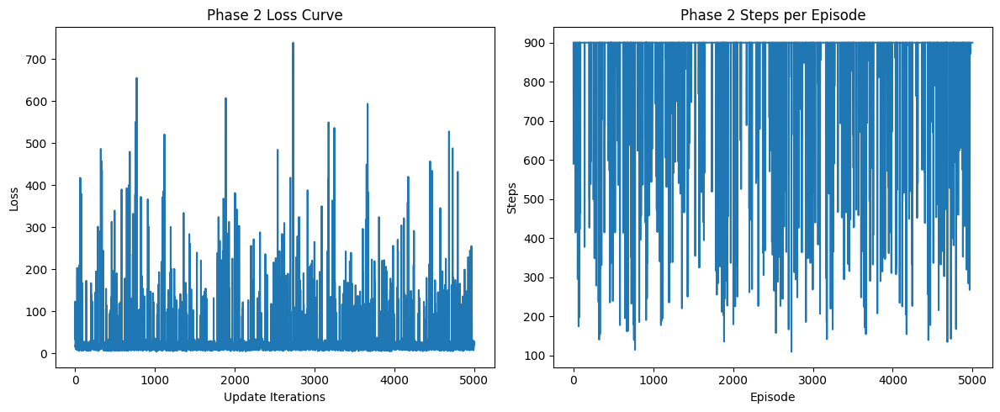

In [31]:
# 可视化训练结果
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(phase2_agent.costs)
plt.title("Phase 2 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(phase2_agent.steps_per_episode)
plt.title("Phase 2 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")

plt.tight_layout()
plt.show()

=== Phase 2 model testing ===
🎬 Finished：
🚶 Steps: 900, 🏆 Total_reward: -654.5


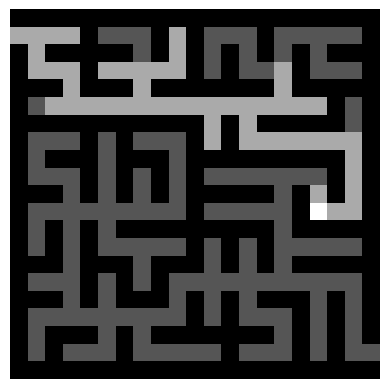

In [45]:
# 测试第二阶段模型
print("=== Phase 2 model testing ===")
test_and_show_video(phase2_env, phase2_agent)

# Phase 3 - Strictly follow the shortest path

## Environment - 3rd

In [33]:
class Phase3MazeEnv(MazeEnv):
    def __init__(self, maze_list, max_steps):
        super().__init__(maze_list, max_steps)
        self.maze_list = maze_list
        self.max_steps = max_steps
        self.start_pos = (1, 0)  # 固定入口
        self.exit_pos = (19, 20)  # 固定出口
        self.current_pos = None
        self.steps_taken = None
        self.maze_state = None  # 当前环境状态
        self.original_maze = None  # 存储原始迷宫结构
        self.optimal_paths = {}  # 存储每个迷宫的最短路径

    def _process_state(self, state):
        """
        对环境的状态进行处理：
        由于原始状态中：
            0 表示墙壁
            1 表示可通行区域（未访问）
            2 表示已访问区域
            4 表示智能体当前位置
        为适配 embedding 层，我们将 4 映射为 3，使得状态类别为 {0,1,2,3}
        """
        state = state.clone()
        state[state == 4] = 3
        return state
    
    def _bfs_shortest_path(self, maze):
        """使用BFS计算最短路径"""

        start = self.start_pos
        end = self.exit_pos
        queue = deque([[start]])
        visited = set([start])

        while queue:
            path = queue.popleft()
            r, c = path[-1]

            if (r, c) == end:
                return path

            for dr, dc in [(1, 0), (-1, 0), (0, 1), (0, -1)]:
                nr, nc = r + dr, c + dc
                if 0 <= nr < maze.shape[0] and 0 <= nc < maze.shape[1]:
                    if maze[nr, nc] != 0 and (nr, nc) not in visited:
                        new_path = list(path)
                        new_path.append((nr, nc))
                        queue.append(new_path)
                        visited.add((nr, nc))
        return None  # 无解迷宫

    def reset(self):
        super().reset() # 调用父类的 reset 方法，确保 steps_taken 被初始化为 0

        maze_np = random.choice(self.maze_list)
        self.original_maze = torch.tensor(maze_np, dtype=torch.int)
        self.maze_state = self.original_maze.clone()

        # 计算并存储最短路径
        maze_id = id(maze_np)
        if maze_id not in self.optimal_paths:
            path = self._bfs_shortest_path(maze_np)
            if not path:
                return self.reset()
            self.optimal_paths[maze_id] = path

        self.current_path = self.optimal_paths[maze_id]
        self.current_pos = self.start_pos
        self.maze_state[self.current_pos] = 4
        return self._process_state(self.maze_state.clone())

    def step(self, action):
        reward = 0.0
        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 有效性检查
        valid_move = True
        if new_r < 0 or new_r >= self.maze_state.shape[0] or new_c < 0 or new_c >= self.maze_state.shape[1]:
            valid_move = False
        elif self.original_maze[new_r, new_c].item() == 0:
            valid_move = False

        if valid_move:
            # 路径偏离检查
            if new_pos not in self.current_path:
                reward -= 5.0 # 更严厉的偏离路径惩罚
            elif self.maze_state[new_r, new_c].item() == 2:
                reward -= 5.0 # 避免在已经走过的正确路径上徘徊
            elif new_pos in self.current_path:
                reward += 20.0 # 更积极的在正确路径上的奖励

            # 接近终点的奖励
            current_path_index = self.current_path.index(self.current_pos) if self.current_pos in self.current_path else -1
            next_path_index = self.current_path.index(new_pos) if new_pos in self.current_path else -1
            if next_path_index > current_path_index and next_path_index == len(self.current_path) - 2: # 倒数第二个位置
                reward += 10.0 # 接近终点的奖励

            # 更新位置
            self.maze_state[self.current_pos] = 2
            self.current_pos = new_pos
            self.maze_state[self.current_pos] = 4
        else:
            reward -= 0.5  # 无效移动惩罚

        # 更新步数
        self.steps_taken += 1

        # 终止条件
        done = False
        if self.current_pos == self.exit_pos:
            reward += 100.0 # 最高出口奖励
            done = True
        elif self.steps_taken >= self.max_steps:
            reward -= 20.0  # 超时惩罚
            done = True

        return self._process_state(self.maze_state.clone()), reward * (1.0 - self.steps_taken / self.max_steps), done

In [34]:
# 初始化第三阶段环境
phase3_env = Phase3MazeEnv(maze_list=mazes, max_steps=900)

# 并行环境
phase3_env_class = Phase3MazeEnv
phase3_vec_env = VectorizedMazeEnv(phase3_env_class, maze_list=mazes, n_envs=n_envs, max_steps=900)

In [35]:
phase3_state = phase3_env.reset()

In [36]:
phase3_state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 

In [37]:
# 初始化智能体并加载预训练模型
phase3_agent = PPOAgent(device=device, lr=0.001, gamma=0.95, clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [38]:
# 加载第二阶段模型
phase2_path = os.path.join(save_dir, "2nd_shortest_path_model.pth")
phase2checkpoint = torch.load(phase2_path)

In [39]:
# 加载第二阶段参数
phase3_agent.policy.load_state_dict(phase2checkpoint['policy_state_dict'])
phase3_agent.optimizer.load_state_dict(phase2checkpoint['optimizer_state_dict'])

In [40]:
phase3_num_episodes = 5000
episodes_done = 0

pbar_phase3 = tqdm(total=phase3_num_episodes, desc="Phase 3 Training Progress")

while episodes_done < phase3_num_episodes:
    states = phase3_vec_env.reset()
    done_mask = [False] * n_envs
    trajectories = [[] for _ in range(n_envs)]
    total_rewards = [0.0] * n_envs
    steps_counts = [0] * n_envs

    while not all(done_mask):
        actions, log_probs, values = phase3_agent.choose_action_batch(states)
        next_states, rewards, dones = phase3_vec_env.step(actions.cpu().numpy())

        with torch.no_grad():
            _, next_values = phase3_agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        for i in range(n_envs):
            if not done_mask[i]:
                trajectories[i].append((
                    states[i].cpu(),
                    actions[i].item(),
                    log_probs[i].cpu(),
                    rewards[i].item(),
                    values[i].item(),
                    float(dones[i].item()),
                    0.0  # next_value placeholder
                ))
                total_rewards[i] += rewards[i].item()
                steps_counts[i] += 1

        for i in range(n_envs):
            if not done_mask[i]:
                if dones[i]:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        for i in range(n_envs):
            if dones[i]:
                done_mask[i] = True

        states = next_states

    # 更新阶段：每个子环境的轨迹分别更新
    for i in range(n_envs):
        phase3_agent.steps_per_episode.append(steps_counts[i])
        phase3_agent.update(trajectories[i])
        episodes_done += 1
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        pbar_phase3.update(1)
        if episodes_done >= phase3_num_episodes:
            break

pbar_phase3.close()


Phase 3 Training Progress:   0%|                                                   | 1/5000 [00:29<41:00:05, 29.53s/it]

Episode 1, Reward: -562.26, Steps: 900


Phase 3 Training Progress:   0%|                                                   | 2/5000 [00:32<19:15:01, 13.87s/it]

Episode 2, Reward: -491.30, Steps: 900


Phase 3 Training Progress:   0%|                                                   | 3/5000 [00:35<12:17:14,  8.85s/it]

Episode 3, Reward: -606.75, Steps: 900


Phase 3 Training Progress:   0%|                                                    | 4/5000 [00:38<9:01:44,  6.51s/it]

Episode 4, Reward: -716.84, Steps: 900


Phase 3 Training Progress:   0%|                                                    | 5/5000 [00:39<6:30:55,  4.70s/it]

Episode 5, Reward: 104.74, Steps: 469


Phase 3 Training Progress:   0%|                                                    | 6/5000 [00:42<5:37:39,  4.06s/it]

Episode 6, Reward: -653.48, Steps: 900


Phase 3 Training Progress:   0%|                                                    | 7/5000 [00:45<5:02:33,  3.64s/it]

Episode 7, Reward: -660.03, Steps: 900


Phase 3 Training Progress:   0%|                                                    | 8/5000 [00:47<4:37:20,  3.33s/it]

Episode 8, Reward: -696.93, Steps: 900


Phase 3 Training Progress:   0%|                                                    | 9/5000 [00:50<4:25:56,  3.20s/it]

Episode 9, Reward: -659.46, Steps: 900


Phase 3 Training Progress:   0%|                                                   | 10/5000 [00:53<4:21:55,  3.15s/it]

Episode 10, Reward: -619.35, Steps: 900


Phase 3 Training Progress:   0%|                                                   | 11/5000 [00:56<4:12:29,  3.04s/it]

Episode 11, Reward: -424.66, Steps: 900


Phase 3 Training Progress:   0%|                                                   | 12/5000 [00:59<4:10:30,  3.01s/it]

Episode 12, Reward: -814.79, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 13/5000 [01:02<4:05:42,  2.96s/it]

Episode 13, Reward: -737.28, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 14/5000 [01:05<3:59:15,  2.88s/it]

Episode 14, Reward: -822.67, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 15/5000 [01:07<3:56:01,  2.84s/it]

Episode 15, Reward: -882.59, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 16/5000 [01:10<3:53:20,  2.81s/it]

Episode 16, Reward: -593.94, Steps: 900


Phase 3 Training Progress:   0%|▏                                                 | 17/5000 [01:37<13:41:22,  9.89s/it]

Episode 17, Reward: -37.45, Steps: 536


Phase 3 Training Progress:   0%|▏                                                 | 18/5000 [01:40<10:49:56,  7.83s/it]

Episode 18, Reward: -421.28, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 19/5000 [01:43<8:52:41,  6.42s/it]

Episode 19, Reward: -507.30, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 20/5000 [01:46<7:27:56,  5.40s/it]

Episode 20, Reward: -233.28, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 21/5000 [01:49<6:28:44,  4.68s/it]

Episode 21, Reward: -466.16, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 22/5000 [01:52<5:46:48,  4.18s/it]

Episode 22, Reward: -637.01, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 23/5000 [01:55<5:15:21,  3.80s/it]

Episode 23, Reward: -450.18, Steps: 900


Phase 3 Training Progress:   0%|▏                                                  | 24/5000 [01:58<4:55:16,  3.56s/it]

Episode 24, Reward: -535.53, Steps: 900


Phase 3 Training Progress:   0%|▎                                                  | 25/5000 [02:01<4:38:36,  3.36s/it]

Episode 25, Reward: -951.17, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 26/5000 [02:04<4:33:36,  3.30s/it]

Episode 26, Reward: -629.40, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 27/5000 [02:07<4:33:31,  3.30s/it]

Episode 27, Reward: -446.05, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 28/5000 [02:10<4:27:30,  3.23s/it]

Episode 28, Reward: -328.34, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 29/5000 [02:13<4:24:21,  3.19s/it]

Episode 29, Reward: -797.38, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 30/5000 [02:16<4:19:07,  3.13s/it]

Episode 30, Reward: -471.39, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 31/5000 [02:18<3:44:54,  2.72s/it]

Episode 31, Reward: -87.39, Steps: 518


Phase 3 Training Progress:   1%|▎                                                  | 32/5000 [02:21<3:52:00,  2.80s/it]

Episode 32, Reward: -485.22, Steps: 900


Phase 3 Training Progress:   1%|▎                                                 | 33/5000 [02:49<14:17:23, 10.36s/it]

Episode 33, Reward: -444.09, Steps: 900


Phase 3 Training Progress:   1%|▎                                                 | 34/5000 [02:52<11:11:29,  8.11s/it]

Episode 34, Reward: -319.93, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 35/5000 [02:55<9:03:26,  6.57s/it]

Episode 35, Reward: -604.18, Steps: 900


Phase 3 Training Progress:   1%|▎                                                  | 36/5000 [02:58<7:32:15,  5.47s/it]

Episode 36, Reward: -589.57, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 37/5000 [03:01<6:33:01,  4.75s/it]

Episode 37, Reward: -512.57, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 38/5000 [03:04<5:46:09,  4.19s/it]

Episode 38, Reward: -515.83, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 39/5000 [03:06<5:12:06,  3.77s/it]

Episode 39, Reward: -156.49, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 40/5000 [03:09<4:50:09,  3.51s/it]

Episode 40, Reward: -412.34, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 41/5000 [03:12<4:34:52,  3.33s/it]

Episode 41, Reward: -416.54, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 42/5000 [03:15<4:28:38,  3.25s/it]

Episode 42, Reward: -571.54, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 43/5000 [03:18<4:18:39,  3.13s/it]

Episode 43, Reward: -408.57, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 44/5000 [03:21<4:16:13,  3.10s/it]

Episode 44, Reward: -467.42, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 45/5000 [03:24<4:11:08,  3.04s/it]

Episode 45, Reward: -587.13, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 46/5000 [03:27<4:09:26,  3.02s/it]

Episode 46, Reward: -254.39, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 47/5000 [03:30<4:09:35,  3.02s/it]

Episode 47, Reward: -326.76, Steps: 900


Phase 3 Training Progress:   1%|▍                                                  | 48/5000 [03:33<4:09:42,  3.03s/it]

Episode 48, Reward: -594.71, Steps: 900


Phase 3 Training Progress:   1%|▍                                                 | 49/5000 [04:01<14:28:39, 10.53s/it]

Episode 49, Reward: -382.77, Steps: 900


Phase 3 Training Progress:   1%|▌                                                 | 50/5000 [04:04<11:22:26,  8.27s/it]

Episode 50, Reward: -537.99, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 51/5000 [04:07<9:16:12,  6.74s/it]

Episode 51, Reward: -322.34, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 52/5000 [04:10<7:45:40,  5.65s/it]

Episode 52, Reward: -183.05, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 53/5000 [04:13<6:36:14,  4.81s/it]

Episode 53, Reward: -282.99, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 54/5000 [04:16<5:48:51,  4.23s/it]

Episode 54, Reward: -145.00, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 55/5000 [04:19<5:19:35,  3.88s/it]

Episode 55, Reward: -250.92, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 56/5000 [04:22<4:58:35,  3.62s/it]

Episode 56, Reward: -47.32, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 57/5000 [04:25<4:39:43,  3.40s/it]

Episode 57, Reward: -138.14, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 58/5000 [04:28<4:30:13,  3.28s/it]

Episode 58, Reward: -128.06, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 59/5000 [04:31<4:24:46,  3.22s/it]

Episode 59, Reward: -279.82, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 60/5000 [04:34<4:19:46,  3.16s/it]

Episode 60, Reward: -485.61, Steps: 900


Phase 3 Training Progress:   1%|▌                                                  | 61/5000 [04:37<4:12:03,  3.06s/it]

Episode 61, Reward: -360.64, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 62/5000 [04:40<4:05:43,  2.99s/it]

Episode 62, Reward: -107.11, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 63/5000 [04:43<4:00:21,  2.92s/it]

Episode 63, Reward: -490.17, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 64/5000 [04:45<3:54:23,  2.85s/it]

Episode 64, Reward: -346.37, Steps: 900


Phase 3 Training Progress:   1%|▋                                                 | 65/5000 [05:11<13:31:01,  9.86s/it]

Episode 65, Reward: -271.14, Steps: 900


Phase 3 Training Progress:   1%|▋                                                 | 66/5000 [05:14<10:39:38,  7.78s/it]

Episode 66, Reward: -460.04, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 67/5000 [05:17<8:39:11,  6.31s/it]

Episode 67, Reward: -499.05, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 68/5000 [05:20<7:15:03,  5.29s/it]

Episode 68, Reward: -151.71, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 69/5000 [05:23<6:16:16,  4.58s/it]

Episode 69, Reward: -440.90, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 70/5000 [05:26<5:33:53,  4.06s/it]

Episode 70, Reward: -204.84, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 71/5000 [05:29<5:03:08,  3.69s/it]

Episode 71, Reward: -386.40, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 72/5000 [05:32<4:42:56,  3.44s/it]

Episode 72, Reward: -217.65, Steps: 900


Phase 3 Training Progress:   1%|▋                                                  | 73/5000 [05:35<4:30:32,  3.29s/it]

Episode 73, Reward: -336.13, Steps: 900


Phase 3 Training Progress:   1%|▊                                                  | 74/5000 [05:38<4:21:11,  3.18s/it]

Episode 74, Reward: -17.40, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 75/5000 [05:41<4:16:18,  3.12s/it]

Episode 75, Reward: -363.17, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 76/5000 [05:43<4:09:48,  3.04s/it]

Episode 76, Reward: 80.99, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 77/5000 [05:46<4:07:29,  3.02s/it]

Episode 77, Reward: -455.34, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 78/5000 [05:49<4:07:51,  3.02s/it]

Episode 78, Reward: -290.29, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 79/5000 [05:52<4:06:44,  3.01s/it]

Episode 79, Reward: -489.64, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 80/5000 [05:55<4:04:22,  2.98s/it]

Episode 80, Reward: -219.31, Steps: 900


Phase 3 Training Progress:   2%|▊                                                 | 81/5000 [06:23<14:18:05, 10.47s/it]

Episode 81, Reward: -393.35, Steps: 900


Phase 3 Training Progress:   2%|▊                                                 | 82/5000 [06:26<11:13:54,  8.22s/it]

Episode 82, Reward: -91.66, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 83/5000 [06:29<9:05:38,  6.66s/it]

Episode 83, Reward: -466.59, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 84/5000 [06:32<7:34:03,  5.54s/it]

Episode 84, Reward: -300.49, Steps: 900


Phase 3 Training Progress:   2%|▊                                                  | 85/5000 [06:35<6:29:34,  4.76s/it]

Episode 85, Reward: -243.01, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 86/5000 [06:38<5:46:25,  4.23s/it]

Episode 86, Reward: -329.70, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 87/5000 [06:41<5:15:06,  3.85s/it]

Episode 87, Reward: -378.46, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 88/5000 [06:44<4:50:54,  3.55s/it]

Episode 88, Reward: -365.02, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 89/5000 [06:47<4:38:47,  3.41s/it]

Episode 89, Reward: -342.56, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 90/5000 [06:50<4:26:01,  3.25s/it]

Episode 90, Reward: -431.46, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 91/5000 [06:51<3:28:43,  2.55s/it]

Episode 91, Reward: 370.22, Steps: 292


Phase 3 Training Progress:   2%|▉                                                  | 92/5000 [06:54<3:37:16,  2.66s/it]

Episode 92, Reward: -375.12, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 93/5000 [06:57<3:44:52,  2.75s/it]

Episode 93, Reward: -274.09, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 94/5000 [07:00<3:50:42,  2.82s/it]

Episode 94, Reward: -427.76, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 95/5000 [07:03<3:56:35,  2.89s/it]

Episode 95, Reward: -461.51, Steps: 900


Phase 3 Training Progress:   2%|▉                                                  | 96/5000 [07:04<3:15:00,  2.39s/it]

Episode 96, Reward: 323.49, Steps: 345


Phase 3 Training Progress:   2%|▉                                                 | 97/5000 [07:31<13:30:13,  9.92s/it]

Episode 97, Reward: -320.20, Steps: 900


Phase 3 Training Progress:   2%|▉                                                 | 98/5000 [07:34<10:39:28,  7.83s/it]

Episode 98, Reward: -184.73, Steps: 900


Phase 3 Training Progress:   2%|█                                                  | 99/5000 [07:37<8:36:42,  6.33s/it]

Episode 99, Reward: -249.05, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 100/5000 [07:40<7:14:17,  5.32s/it]

Episode 100, Reward: -396.67, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 101/5000 [07:43<6:16:54,  4.62s/it]

Episode 101, Reward: -375.15, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 102/5000 [07:46<5:37:01,  4.13s/it]

Episode 102, Reward: -347.29, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 103/5000 [07:49<5:13:41,  3.84s/it]

Episode 103, Reward: -179.54, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 104/5000 [07:52<4:58:25,  3.66s/it]

Episode 104, Reward: -170.89, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 105/5000 [07:56<4:43:17,  3.47s/it]

Episode 105, Reward: 97.85, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 106/5000 [07:59<4:31:57,  3.33s/it]

Episode 106, Reward: -311.43, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 107/5000 [08:01<4:20:07,  3.19s/it]

Episode 107, Reward: 33.04, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 108/5000 [08:04<4:10:08,  3.07s/it]

Episode 108, Reward: -208.35, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 109/5000 [08:07<4:07:21,  3.03s/it]

Episode 109, Reward: -343.94, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 110/5000 [08:10<4:07:18,  3.03s/it]

Episode 110, Reward: -337.41, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 111/5000 [08:13<4:04:01,  2.99s/it]

Episode 111, Reward: -325.43, Steps: 900


Phase 3 Training Progress:   2%|█                                                 | 112/5000 [08:16<4:00:22,  2.95s/it]

Episode 112, Reward: -325.97, Steps: 900


Phase 3 Training Progress:   2%|█                                                | 113/5000 [08:43<13:59:40, 10.31s/it]

Episode 113, Reward: -362.18, Steps: 900


Phase 3 Training Progress:   2%|█                                                | 114/5000 [08:46<10:55:39,  8.05s/it]

Episode 114, Reward: -185.70, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 115/5000 [08:49<8:47:47,  6.48s/it]

Episode 115, Reward: -321.57, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 116/5000 [08:52<7:19:14,  5.40s/it]

Episode 116, Reward: -298.18, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 117/5000 [08:55<6:14:46,  4.61s/it]

Episode 117, Reward: -279.02, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 118/5000 [08:58<5:33:25,  4.10s/it]

Episode 118, Reward: -396.97, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 119/5000 [09:00<5:00:38,  3.70s/it]

Episode 119, Reward: -294.95, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 120/5000 [09:03<4:38:22,  3.42s/it]

Episode 120, Reward: -274.80, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 121/5000 [09:06<4:21:45,  3.22s/it]

Episode 121, Reward: -358.24, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 122/5000 [09:09<4:10:59,  3.09s/it]

Episode 122, Reward: -137.59, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 123/5000 [09:12<4:09:25,  3.07s/it]

Episode 123, Reward: -503.55, Steps: 900


Phase 3 Training Progress:   2%|█▏                                                | 124/5000 [09:14<4:03:34,  3.00s/it]

Episode 124, Reward: -288.03, Steps: 900


Phase 3 Training Progress:   2%|█▎                                                | 125/5000 [09:17<4:01:53,  2.98s/it]

Episode 125, Reward: -314.48, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 126/5000 [09:20<4:02:02,  2.98s/it]

Episode 126, Reward: -236.81, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 127/5000 [09:23<3:58:52,  2.94s/it]

Episode 127, Reward: -199.67, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 128/5000 [09:26<3:57:13,  2.92s/it]

Episode 128, Reward: 6.31, Steps: 900


Phase 3 Training Progress:   3%|█▎                                               | 129/5000 [09:53<13:45:12, 10.16s/it]

Episode 129, Reward: -300.07, Steps: 900


Phase 3 Training Progress:   3%|█▎                                               | 130/5000 [09:56<10:47:43,  7.98s/it]

Episode 130, Reward: -270.86, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 131/5000 [09:59<8:42:24,  6.44s/it]

Episode 131, Reward: -161.80, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 132/5000 [10:02<7:14:57,  5.36s/it]

Episode 132, Reward: -239.67, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 133/5000 [10:05<6:17:01,  4.65s/it]

Episode 133, Reward: -249.88, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 134/5000 [10:08<5:36:50,  4.15s/it]

Episode 134, Reward: 13.24, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 135/5000 [10:11<5:05:38,  3.77s/it]

Episode 135, Reward: -66.60, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 136/5000 [10:13<4:41:13,  3.47s/it]

Episode 136, Reward: -207.49, Steps: 900


Phase 3 Training Progress:   3%|█▎                                                | 137/5000 [10:16<4:28:58,  3.32s/it]

Episode 137, Reward: -227.33, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 138/5000 [10:19<4:18:37,  3.19s/it]

Episode 138, Reward: 195.84, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 139/5000 [10:22<4:15:29,  3.15s/it]

Episode 139, Reward: 284.86, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 140/5000 [10:25<4:13:58,  3.14s/it]

Episode 140, Reward: -258.11, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 141/5000 [10:28<4:11:20,  3.10s/it]

Episode 141, Reward: -63.79, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 142/5000 [10:31<4:04:38,  3.02s/it]

Episode 142, Reward: -90.48, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 143/5000 [10:34<4:01:29,  2.98s/it]

Episode 143, Reward: -285.48, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 144/5000 [10:37<4:01:32,  2.98s/it]

Episode 144, Reward: 89.64, Steps: 900


Phase 3 Training Progress:   3%|█▍                                               | 145/5000 [11:05<14:01:46, 10.40s/it]

Episode 145, Reward: -167.79, Steps: 900


Phase 3 Training Progress:   3%|█▍                                               | 146/5000 [11:08<11:00:02,  8.16s/it]

Episode 146, Reward: -262.43, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 147/5000 [11:11<8:50:52,  6.56s/it]

Episode 147, Reward: -0.09, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 148/5000 [11:13<7:21:08,  5.46s/it]

Episode 148, Reward: -240.64, Steps: 900


Phase 3 Training Progress:   3%|█▍                                                | 149/5000 [11:16<6:17:49,  4.67s/it]

Episode 149, Reward: -289.74, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 150/5000 [11:19<5:39:27,  4.20s/it]

Episode 150, Reward: -86.19, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 151/5000 [11:22<5:12:42,  3.87s/it]

Episode 151, Reward: -214.16, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 152/5000 [11:25<4:50:21,  3.59s/it]

Episode 152, Reward: -323.89, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 153/5000 [11:28<4:33:22,  3.38s/it]

Episode 153, Reward: -214.02, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 154/5000 [11:31<4:20:42,  3.23s/it]

Episode 154, Reward: -115.12, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 155/5000 [11:34<4:12:24,  3.13s/it]

Episode 155, Reward: -249.67, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 156/5000 [11:37<4:08:21,  3.08s/it]

Episode 156, Reward: -124.79, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 157/5000 [11:40<4:03:48,  3.02s/it]

Episode 157, Reward: -212.78, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 158/5000 [11:43<4:01:39,  2.99s/it]

Episode 158, Reward: 22.05, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 159/5000 [11:46<4:00:27,  2.98s/it]

Episode 159, Reward: 88.03, Steps: 900


Phase 3 Training Progress:   3%|█▌                                                | 160/5000 [11:49<4:02:04,  3.00s/it]

Episode 160, Reward: 328.71, Steps: 900


Phase 3 Training Progress:   3%|█▌                                               | 161/5000 [12:17<14:08:49, 10.52s/it]

Episode 161, Reward: 5.13, Steps: 900


Phase 3 Training Progress:   3%|█▌                                               | 162/5000 [12:20<11:06:29,  8.27s/it]

Episode 162, Reward: -210.90, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 163/5000 [12:23<8:57:47,  6.67s/it]

Episode 163, Reward: -108.35, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 164/5000 [12:26<7:25:44,  5.53s/it]

Episode 164, Reward: 118.43, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 165/5000 [12:29<6:27:42,  4.81s/it]

Episode 165, Reward: -293.72, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 166/5000 [12:32<5:42:33,  4.25s/it]

Episode 166, Reward: -334.67, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 167/5000 [12:35<5:10:27,  3.85s/it]

Episode 167, Reward: -243.18, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 168/5000 [12:38<4:47:58,  3.58s/it]

Episode 168, Reward: -153.21, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 169/5000 [12:41<4:33:31,  3.40s/it]

Episode 169, Reward: -293.80, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 170/5000 [12:44<4:20:31,  3.24s/it]

Episode 170, Reward: -11.39, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 171/5000 [12:46<4:11:41,  3.13s/it]

Episode 171, Reward: -110.27, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 172/5000 [12:49<4:07:00,  3.07s/it]

Episode 172, Reward: -233.03, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 173/5000 [12:52<3:59:41,  2.98s/it]

Episode 173, Reward: -327.79, Steps: 900


Phase 3 Training Progress:   3%|█▋                                                | 174/5000 [12:55<3:55:43,  2.93s/it]

Episode 174, Reward: -304.65, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 175/5000 [12:58<3:53:03,  2.90s/it]

Episode 175, Reward: -128.19, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 176/5000 [13:00<3:48:54,  2.85s/it]

Episode 176, Reward: -263.12, Steps: 900


Phase 3 Training Progress:   4%|█▋                                               | 177/5000 [13:27<13:22:33,  9.98s/it]

Episode 177, Reward: -207.87, Steps: 900


Phase 3 Training Progress:   4%|█▋                                               | 178/5000 [13:30<10:32:03,  7.86s/it]

Episode 178, Reward: 180.25, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 179/5000 [13:33<8:29:45,  6.34s/it]

Episode 179, Reward: -192.48, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 180/5000 [13:36<7:05:08,  5.29s/it]

Episode 180, Reward: -132.19, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 181/5000 [13:36<5:05:30,  3.80s/it]

Episode 181, Reward: 809.27, Steps: 67


Phase 3 Training Progress:   4%|█▊                                                | 182/5000 [13:39<4:41:53,  3.51s/it]

Episode 182, Reward: -245.62, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 183/5000 [13:42<4:28:54,  3.35s/it]

Episode 183, Reward: -265.29, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 184/5000 [13:45<4:19:18,  3.23s/it]

Episode 184, Reward: -258.79, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 185/5000 [13:48<4:14:08,  3.17s/it]

Episode 185, Reward: -285.51, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 186/5000 [13:51<4:11:40,  3.14s/it]

Episode 186, Reward: -182.10, Steps: 900


Phase 3 Training Progress:   4%|█▊                                                | 187/5000 [13:54<4:12:23,  3.15s/it]

Episode 187, Reward: -203.74, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 188/5000 [13:57<4:12:50,  3.15s/it]

Episode 188, Reward: -5.92, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 189/5000 [14:00<4:13:24,  3.16s/it]

Episode 189, Reward: -271.70, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 190/5000 [14:03<4:07:27,  3.09s/it]

Episode 190, Reward: 33.26, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 191/5000 [14:06<4:02:05,  3.02s/it]

Episode 191, Reward: -254.38, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 192/5000 [14:09<4:00:51,  3.01s/it]

Episode 192, Reward: -234.42, Steps: 900


Phase 3 Training Progress:   4%|█▉                                               | 193/5000 [14:37<13:58:36, 10.47s/it]

Episode 193, Reward: -43.65, Steps: 900


Phase 3 Training Progress:   4%|█▉                                               | 194/5000 [14:40<10:59:09,  8.23s/it]

Episode 194, Reward: -266.06, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 195/5000 [14:43<8:52:49,  6.65s/it]

Episode 195, Reward: -147.76, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 196/5000 [14:46<7:21:47,  5.52s/it]

Episode 196, Reward: -203.67, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 197/5000 [14:49<6:22:16,  4.78s/it]

Episode 197, Reward: -119.32, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 198/5000 [14:52<5:40:24,  4.25s/it]

Episode 198, Reward: -260.22, Steps: 900


Phase 3 Training Progress:   4%|█▉                                                | 199/5000 [14:55<5:06:39,  3.83s/it]

Episode 199, Reward: -329.32, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 200/5000 [14:58<4:42:47,  3.53s/it]

Episode 200, Reward: -61.25, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 201/5000 [15:00<4:23:32,  3.29s/it]

Episode 201, Reward: -103.70, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 202/5000 [15:03<4:14:05,  3.18s/it]

Episode 202, Reward: -61.30, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 203/5000 [15:06<4:07:14,  3.09s/it]

Episode 203, Reward: -215.98, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 204/5000 [15:09<4:00:09,  3.00s/it]

Episode 204, Reward: -161.80, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 205/5000 [15:12<3:53:12,  2.92s/it]

Episode 205, Reward: -289.30, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 206/5000 [15:15<3:51:46,  2.90s/it]

Episode 206, Reward: -57.47, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 207/5000 [15:17<3:51:52,  2.90s/it]

Episode 207, Reward: -169.61, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 208/5000 [15:20<3:52:34,  2.91s/it]

Episode 208, Reward: -14.26, Steps: 900


Phase 3 Training Progress:   4%|██                                               | 209/5000 [15:47<13:29:29, 10.14s/it]

Episode 209, Reward: -238.01, Steps: 900


Phase 3 Training Progress:   4%|██                                               | 210/5000 [15:50<10:38:01,  7.99s/it]

Episode 210, Reward: -127.65, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 211/5000 [15:53<8:38:24,  6.49s/it]

Episode 211, Reward: -116.98, Steps: 900


Phase 3 Training Progress:   4%|██                                                | 212/5000 [15:56<7:14:04,  5.44s/it]

Episode 212, Reward: -252.09, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 213/5000 [15:59<6:13:24,  4.68s/it]

Episode 213, Reward: -214.18, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 214/5000 [16:02<5:30:45,  4.15s/it]

Episode 214, Reward: -154.30, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 215/5000 [16:05<5:07:23,  3.85s/it]

Episode 215, Reward: -18.20, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 216/5000 [16:08<4:45:44,  3.58s/it]

Episode 216, Reward: -287.39, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 217/5000 [16:11<4:28:05,  3.36s/it]

Episode 217, Reward: -128.67, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 218/5000 [16:14<4:17:50,  3.24s/it]

Episode 218, Reward: -129.16, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 219/5000 [16:17<4:09:08,  3.13s/it]

Episode 219, Reward: -204.33, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 220/5000 [16:20<4:02:34,  3.04s/it]

Episode 220, Reward: -216.57, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 221/5000 [16:23<4:00:15,  3.02s/it]

Episode 221, Reward: 77.04, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 222/5000 [16:26<3:56:48,  2.97s/it]

Episode 222, Reward: -195.02, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 223/5000 [16:28<3:54:16,  2.94s/it]

Episode 223, Reward: -11.65, Steps: 900


Phase 3 Training Progress:   4%|██▏                                               | 224/5000 [16:32<3:59:24,  3.01s/it]

Episode 224, Reward: -252.98, Steps: 900


Phase 3 Training Progress:   4%|██▏                                              | 225/5000 [16:58<13:28:36, 10.16s/it]

Episode 225, Reward: -87.77, Steps: 900


Phase 3 Training Progress:   5%|██▏                                              | 226/5000 [17:02<10:42:14,  8.07s/it]

Episode 226, Reward: 3.52, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 227/5000 [17:05<8:39:10,  6.53s/it]

Episode 227, Reward: -169.49, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 228/5000 [17:08<7:17:33,  5.50s/it]

Episode 228, Reward: -114.99, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 229/5000 [17:11<6:17:55,  4.75s/it]

Episode 229, Reward: -124.49, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 230/5000 [17:14<5:38:49,  4.26s/it]

Episode 230, Reward: -157.03, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 231/5000 [17:17<5:06:35,  3.86s/it]

Episode 231, Reward: -61.95, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 232/5000 [17:20<4:46:26,  3.60s/it]

Episode 232, Reward: -203.17, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 233/5000 [17:23<4:30:56,  3.41s/it]

Episode 233, Reward: -221.50, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 234/5000 [17:26<4:18:39,  3.26s/it]

Episode 234, Reward: -216.05, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 235/5000 [17:29<4:11:58,  3.17s/it]

Episode 235, Reward: -158.25, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 236/5000 [17:31<4:03:01,  3.06s/it]

Episode 236, Reward: -79.71, Steps: 900


Phase 3 Training Progress:   5%|██▎                                               | 237/5000 [17:34<4:01:45,  3.05s/it]

Episode 237, Reward: -275.06, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 238/5000 [17:37<4:03:27,  3.07s/it]

Episode 238, Reward: -234.47, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 239/5000 [17:41<4:04:00,  3.08s/it]

Episode 239, Reward: -10.46, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 240/5000 [17:44<4:02:51,  3.06s/it]

Episode 240, Reward: 57.46, Steps: 900


Phase 3 Training Progress:   5%|██▎                                              | 241/5000 [18:13<14:17:20, 10.81s/it]

Episode 241, Reward: -204.22, Steps: 900


Phase 3 Training Progress:   5%|██▎                                              | 242/5000 [18:15<11:10:43,  8.46s/it]

Episode 242, Reward: -111.16, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 243/5000 [18:19<9:02:40,  6.84s/it]

Episode 243, Reward: -268.79, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 244/5000 [18:22<7:41:14,  5.82s/it]

Episode 244, Reward: 36.68, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 245/5000 [18:25<6:34:06,  4.97s/it]

Episode 245, Reward: 39.25, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 246/5000 [18:28<5:47:05,  4.38s/it]

Episode 246, Reward: -81.75, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 247/5000 [18:31<5:16:53,  4.00s/it]

Episode 247, Reward: -154.62, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 248/5000 [18:34<4:56:58,  3.75s/it]

Episode 248, Reward: 76.26, Steps: 900


Phase 3 Training Progress:   5%|██▍                                               | 249/5000 [18:37<4:40:35,  3.54s/it]

Episode 249, Reward: -237.27, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 250/5000 [18:41<4:32:05,  3.44s/it]

Episode 250, Reward: -13.69, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 251/5000 [18:44<4:22:02,  3.31s/it]

Episode 251, Reward: -142.42, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 252/5000 [18:47<4:15:14,  3.23s/it]

Episode 252, Reward: -205.73, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 253/5000 [18:50<4:13:17,  3.20s/it]

Episode 253, Reward: -215.56, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 254/5000 [18:53<4:09:38,  3.16s/it]

Episode 254, Reward: -113.35, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 255/5000 [18:56<4:02:02,  3.06s/it]

Episode 255, Reward: -70.79, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 256/5000 [18:59<3:59:31,  3.03s/it]

Episode 256, Reward: -77.49, Steps: 900


Phase 3 Training Progress:   5%|██▌                                              | 257/5000 [19:26<13:41:59, 10.40s/it]

Episode 257, Reward: -133.35, Steps: 900


Phase 3 Training Progress:   5%|██▌                                              | 258/5000 [19:29<10:44:40,  8.16s/it]

Episode 258, Reward: 169.22, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 259/5000 [19:32<8:38:30,  6.56s/it]

Episode 259, Reward: -238.12, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 260/5000 [19:35<7:13:09,  5.48s/it]

Episode 260, Reward: -228.67, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 261/5000 [19:38<6:13:18,  4.73s/it]

Episode 261, Reward: -30.20, Steps: 900


Phase 3 Training Progress:   5%|██▌                                               | 262/5000 [19:41<5:32:23,  4.21s/it]

Episode 262, Reward: -229.56, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 263/5000 [19:44<5:05:06,  3.86s/it]

Episode 263, Reward: -203.04, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 264/5000 [19:47<4:42:21,  3.58s/it]

Episode 264, Reward: -165.88, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 265/5000 [19:50<4:28:42,  3.40s/it]

Episode 265, Reward: -258.47, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 266/5000 [19:53<4:20:47,  3.31s/it]

Episode 266, Reward: 19.18, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 267/5000 [19:56<4:13:13,  3.21s/it]

Episode 267, Reward: -37.75, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 268/5000 [19:59<4:10:22,  3.17s/it]

Episode 268, Reward: -69.76, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 269/5000 [20:02<4:07:17,  3.14s/it]

Episode 269, Reward: -20.66, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 270/5000 [20:05<4:05:44,  3.12s/it]

Episode 270, Reward: -233.72, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 271/5000 [20:08<4:02:53,  3.08s/it]

Episode 271, Reward: -253.67, Steps: 900


Phase 3 Training Progress:   5%|██▋                                               | 272/5000 [20:11<4:01:14,  3.06s/it]

Episode 272, Reward: -76.40, Steps: 900


Phase 3 Training Progress:   5%|██▋                                              | 273/5000 [20:39<13:40:12, 10.41s/it]

Episode 273, Reward: 135.64, Steps: 900


Phase 3 Training Progress:   5%|██▋                                              | 274/5000 [20:42<10:49:09,  8.24s/it]

Episode 274, Reward: -121.63, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 275/5000 [20:45<8:49:13,  6.72s/it]

Episode 275, Reward: -180.34, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 276/5000 [20:48<7:18:01,  5.56s/it]

Episode 276, Reward: 121.40, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 277/5000 [20:51<6:14:31,  4.76s/it]

Episode 277, Reward: -121.57, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 278/5000 [20:54<5:31:00,  4.21s/it]

Episode 278, Reward: -10.38, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 279/5000 [20:56<4:55:39,  3.76s/it]

Episode 279, Reward: -132.71, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 280/5000 [20:59<4:34:27,  3.49s/it]

Episode 280, Reward: -221.91, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 281/5000 [21:02<4:18:44,  3.29s/it]

Episode 281, Reward: -187.40, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 282/5000 [21:05<4:09:06,  3.17s/it]

Episode 282, Reward: 6.07, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 283/5000 [21:08<4:01:05,  3.07s/it]

Episode 283, Reward: -65.64, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 284/5000 [21:11<3:56:21,  3.01s/it]

Episode 284, Reward: -74.06, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 285/5000 [21:14<3:54:36,  2.99s/it]

Episode 285, Reward: -179.95, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 286/5000 [21:16<3:52:19,  2.96s/it]

Episode 286, Reward: 101.69, Steps: 900


Phase 3 Training Progress:   6%|██▊                                               | 287/5000 [21:19<3:48:53,  2.91s/it]

Episode 287, Reward: -195.50, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 288/5000 [21:22<3:51:36,  2.95s/it]

Episode 288, Reward: -153.05, Steps: 900


Phase 3 Training Progress:   6%|██▊                                              | 289/5000 [21:50<13:23:21, 10.23s/it]

Episode 289, Reward: -116.60, Steps: 900


Phase 3 Training Progress:   6%|██▊                                              | 290/5000 [21:52<10:31:56,  8.05s/it]

Episode 290, Reward: -32.17, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 291/5000 [21:56<8:33:56,  6.55s/it]

Episode 291, Reward: -215.91, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 292/5000 [21:59<7:10:57,  5.49s/it]

Episode 292, Reward: -95.80, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 293/5000 [22:02<6:10:47,  4.73s/it]

Episode 293, Reward: -225.40, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 294/5000 [22:04<5:27:24,  4.17s/it]

Episode 294, Reward: -181.83, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 295/5000 [22:07<4:59:22,  3.82s/it]

Episode 295, Reward: -35.74, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 296/5000 [22:10<4:38:22,  3.55s/it]

Episode 296, Reward: -86.77, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 297/5000 [22:13<4:19:46,  3.31s/it]

Episode 297, Reward: -222.89, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 298/5000 [22:16<4:11:16,  3.21s/it]

Episode 298, Reward: -94.53, Steps: 900


Phase 3 Training Progress:   6%|██▉                                               | 299/5000 [22:19<4:05:13,  3.13s/it]

Episode 299, Reward: -187.16, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 300/5000 [22:22<3:59:45,  3.06s/it]

Episode 300, Reward: -97.60, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 301/5000 [22:25<3:58:04,  3.04s/it]

Episode 301, Reward: -142.65, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 302/5000 [22:28<3:57:06,  3.03s/it]

Episode 302, Reward: -201.76, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 303/5000 [22:31<3:54:56,  3.00s/it]

Episode 303, Reward: -105.85, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 304/5000 [22:34<3:52:26,  2.97s/it]

Episode 304, Reward: -24.57, Steps: 900


Phase 3 Training Progress:   6%|██▉                                              | 305/5000 [23:01<13:28:58, 10.34s/it]

Episode 305, Reward: -149.00, Steps: 900


Phase 3 Training Progress:   6%|██▉                                              | 306/5000 [23:04<10:34:14,  8.11s/it]

Episode 306, Reward: -146.39, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 307/5000 [23:07<8:30:30,  6.53s/it]

Episode 307, Reward: -17.92, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 308/5000 [23:10<7:05:58,  5.45s/it]

Episode 308, Reward: 6.05, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 309/5000 [23:13<6:04:16,  4.66s/it]

Episode 309, Reward: -233.54, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 310/5000 [23:16<5:23:24,  4.14s/it]

Episode 310, Reward: -58.52, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 311/5000 [23:19<4:56:07,  3.79s/it]

Episode 311, Reward: -127.09, Steps: 900


Phase 3 Training Progress:   6%|███                                               | 312/5000 [23:22<4:38:43,  3.57s/it]

Episode 312, Reward: -160.49, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 313/5000 [23:25<4:24:41,  3.39s/it]

Episode 313, Reward: -144.38, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 314/5000 [23:28<4:12:57,  3.24s/it]

Episode 314, Reward: 46.64, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 315/5000 [23:30<4:06:12,  3.15s/it]

Episode 315, Reward: -17.02, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 316/5000 [23:33<4:02:04,  3.10s/it]

Episode 316, Reward: -40.97, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 317/5000 [23:36<3:53:07,  2.99s/it]

Episode 317, Reward: -70.00, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 318/5000 [23:39<3:51:41,  2.97s/it]

Episode 318, Reward: -237.97, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 319/5000 [23:42<3:54:18,  3.00s/it]

Episode 319, Reward: 3.97, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 320/5000 [23:45<3:52:29,  2.98s/it]

Episode 320, Reward: -78.82, Steps: 900


Phase 3 Training Progress:   6%|███▏                                             | 321/5000 [24:13<13:29:34, 10.38s/it]

Episode 321, Reward: -145.91, Steps: 900


Phase 3 Training Progress:   6%|███▏                                             | 322/5000 [24:16<10:31:44,  8.10s/it]

Episode 322, Reward: -103.68, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 323/5000 [24:18<8:26:57,  6.50s/it]

Episode 323, Reward: -100.11, Steps: 900


Phase 3 Training Progress:   6%|███▏                                              | 324/5000 [24:21<7:05:52,  5.46s/it]

Episode 324, Reward: 174.12, Steps: 900


Phase 3 Training Progress:   6%|███▎                                              | 325/5000 [24:24<6:08:23,  4.73s/it]

Episode 325, Reward: -213.24, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 326/5000 [24:27<5:24:57,  4.17s/it]

Episode 326, Reward: -99.80, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 327/5000 [24:30<4:54:33,  3.78s/it]

Episode 327, Reward: -254.27, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 328/5000 [24:33<4:33:40,  3.51s/it]

Episode 328, Reward: -103.38, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 329/5000 [24:36<4:17:55,  3.31s/it]

Episode 329, Reward: -108.58, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 330/5000 [24:39<4:08:37,  3.19s/it]

Episode 330, Reward: -94.50, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 331/5000 [24:42<3:58:28,  3.06s/it]

Episode 331, Reward: -131.82, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 332/5000 [24:44<3:51:11,  2.97s/it]

Episode 332, Reward: -149.48, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 333/5000 [24:47<3:47:30,  2.92s/it]

Episode 333, Reward: -66.42, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 334/5000 [24:50<3:51:41,  2.98s/it]

Episode 334, Reward: -205.21, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 335/5000 [24:53<3:54:43,  3.02s/it]

Episode 335, Reward: -263.78, Steps: 900


Phase 3 Training Progress:   7%|███▎                                              | 336/5000 [24:56<3:46:51,  2.92s/it]

Episode 336, Reward: 70.02, Steps: 900


Phase 3 Training Progress:   7%|███▎                                             | 337/5000 [25:23<13:10:49, 10.18s/it]

Episode 337, Reward: -104.82, Steps: 900


Phase 3 Training Progress:   7%|███▎                                             | 338/5000 [25:26<10:20:47,  7.99s/it]

Episode 338, Reward: -180.98, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 339/5000 [25:29<8:16:53,  6.40s/it]

Episode 339, Reward: -113.37, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 340/5000 [25:32<6:53:49,  5.33s/it]

Episode 340, Reward: 190.45, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 341/5000 [25:34<5:56:34,  4.59s/it]

Episode 341, Reward: -149.90, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 342/5000 [25:37<5:14:15,  4.05s/it]

Episode 342, Reward: -140.55, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 343/5000 [25:40<4:47:52,  3.71s/it]

Episode 343, Reward: -56.17, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 344/5000 [25:43<4:29:24,  3.47s/it]

Episode 344, Reward: -250.12, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 345/5000 [25:46<4:15:22,  3.29s/it]

Episode 345, Reward: -233.85, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 346/5000 [25:49<4:09:51,  3.22s/it]

Episode 346, Reward: -174.67, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 347/5000 [25:52<4:04:08,  3.15s/it]

Episode 347, Reward: -176.22, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 348/5000 [25:55<4:01:05,  3.11s/it]

Episode 348, Reward: -182.67, Steps: 900


Phase 3 Training Progress:   7%|███▍                                              | 349/5000 [25:58<3:57:27,  3.06s/it]

Episode 349, Reward: -146.13, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 350/5000 [26:01<3:56:02,  3.05s/it]

Episode 350, Reward: -95.64, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 351/5000 [26:04<3:53:33,  3.01s/it]

Episode 351, Reward: -144.66, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 352/5000 [26:07<3:49:43,  2.97s/it]

Episode 352, Reward: -213.24, Steps: 900


Phase 3 Training Progress:   7%|███▍                                             | 353/5000 [26:35<13:34:23, 10.51s/it]

Episode 353, Reward: 26.35, Steps: 900


Phase 3 Training Progress:   7%|███▍                                             | 354/5000 [26:38<10:41:15,  8.28s/it]

Episode 354, Reward: -214.71, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 355/5000 [26:41<8:37:37,  6.69s/it]

Episode 355, Reward: 47.77, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 356/5000 [26:44<7:06:16,  5.51s/it]

Episode 356, Reward: -101.68, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 357/5000 [26:46<6:05:17,  4.72s/it]

Episode 357, Reward: 69.15, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 358/5000 [26:49<5:24:55,  4.20s/it]

Episode 358, Reward: -217.11, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 359/5000 [26:53<4:59:40,  3.87s/it]

Episode 359, Reward: -225.14, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 360/5000 [26:56<4:38:10,  3.60s/it]

Episode 360, Reward: -141.90, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 361/5000 [26:59<4:25:34,  3.43s/it]

Episode 361, Reward: 158.06, Steps: 900


Phase 3 Training Progress:   7%|███▌                                              | 362/5000 [27:02<4:14:18,  3.29s/it]

Episode 362, Reward: 48.16, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 363/5000 [27:04<4:04:37,  3.17s/it]

Episode 363, Reward: 119.31, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 364/5000 [27:07<4:01:49,  3.13s/it]

Episode 364, Reward: 12.36, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 365/5000 [27:10<3:57:53,  3.08s/it]

Episode 365, Reward: 293.61, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 366/5000 [27:13<3:53:16,  3.02s/it]

Episode 366, Reward: -144.99, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 367/5000 [27:16<3:50:52,  2.99s/it]

Episode 367, Reward: -213.25, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 368/5000 [27:19<3:51:39,  3.00s/it]

Episode 368, Reward: -76.65, Steps: 900


Phase 3 Training Progress:   7%|███▌                                             | 369/5000 [27:47<13:35:05, 10.56s/it]

Episode 369, Reward: -221.88, Steps: 900


Phase 3 Training Progress:   7%|███▋                                             | 370/5000 [27:51<10:45:35,  8.37s/it]

Episode 370, Reward: -153.76, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 371/5000 [27:54<8:44:13,  6.79s/it]

Episode 371, Reward: 32.27, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 372/5000 [27:57<7:14:40,  5.64s/it]

Episode 372, Reward: -206.56, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 373/5000 [28:00<6:14:09,  4.85s/it]

Episode 373, Reward: -156.53, Steps: 900


Phase 3 Training Progress:   7%|███▋                                              | 374/5000 [28:03<5:29:46,  4.28s/it]

Episode 374, Reward: -216.93, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 375/5000 [28:06<5:00:38,  3.90s/it]

Episode 375, Reward: -140.47, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 376/5000 [28:09<4:40:31,  3.64s/it]

Episode 376, Reward: -216.52, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 377/5000 [28:12<4:24:00,  3.43s/it]

Episode 377, Reward: -40.14, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 378/5000 [28:15<4:14:03,  3.30s/it]

Episode 378, Reward: -131.57, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 379/5000 [28:18<4:05:09,  3.18s/it]

Episode 379, Reward: -137.06, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 380/5000 [28:21<4:01:09,  3.13s/it]

Episode 380, Reward: 229.00, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 381/5000 [28:23<3:53:35,  3.03s/it]

Episode 381, Reward: -127.46, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 382/5000 [28:26<3:49:25,  2.98s/it]

Episode 382, Reward: -149.03, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 383/5000 [28:29<3:47:40,  2.96s/it]

Episode 383, Reward: -287.67, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 384/5000 [28:32<3:46:48,  2.95s/it]

Episode 384, Reward: -113.77, Steps: 900


Phase 3 Training Progress:   8%|███▊                                             | 385/5000 [28:59<12:55:27, 10.08s/it]

Episode 385, Reward: -180.80, Steps: 900


Phase 3 Training Progress:   8%|███▊                                             | 386/5000 [29:02<10:07:23,  7.90s/it]

Episode 386, Reward: -231.06, Steps: 900


Phase 3 Training Progress:   8%|███▊                                              | 387/5000 [29:04<8:09:06,  6.36s/it]

Episode 387, Reward: -161.12, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 388/5000 [29:07<6:44:50,  5.27s/it]

Episode 388, Reward: -213.28, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 389/5000 [29:10<5:49:42,  4.55s/it]

Episode 389, Reward: -3.27, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 390/5000 [29:13<5:10:55,  4.05s/it]

Episode 390, Reward: -93.57, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 391/5000 [29:16<4:42:02,  3.67s/it]

Episode 391, Reward: -159.83, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 392/5000 [29:19<4:26:30,  3.47s/it]

Episode 392, Reward: -172.43, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 393/5000 [29:22<4:17:46,  3.36s/it]

Episode 393, Reward: -22.22, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 394/5000 [29:25<4:05:52,  3.20s/it]

Episode 394, Reward: 141.78, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 395/5000 [29:28<3:58:57,  3.11s/it]

Episode 395, Reward: -85.80, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 396/5000 [29:30<3:54:11,  3.05s/it]

Episode 396, Reward: -126.89, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 397/5000 [29:33<3:49:10,  2.99s/it]

Episode 397, Reward: -181.38, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 398/5000 [29:36<3:46:00,  2.95s/it]

Episode 398, Reward: 169.20, Steps: 900


Phase 3 Training Progress:   8%|███▉                                              | 399/5000 [29:39<3:45:49,  2.94s/it]

Episode 399, Reward: 39.25, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 400/5000 [29:42<3:46:04,  2.95s/it]

Episode 400, Reward: -192.63, Steps: 900


Phase 3 Training Progress:   8%|███▉                                             | 401/5000 [30:10<13:17:04, 10.40s/it]

Episode 401, Reward: -149.73, Steps: 900


Phase 3 Training Progress:   8%|███▉                                             | 402/5000 [30:13<10:22:46,  8.13s/it]

Episode 402, Reward: 319.69, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 403/5000 [30:16<8:27:36,  6.63s/it]

Episode 403, Reward: -199.64, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 404/5000 [30:19<7:06:05,  5.56s/it]

Episode 404, Reward: -40.59, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 405/5000 [30:22<6:09:08,  4.82s/it]

Episode 405, Reward: -99.72, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 406/5000 [30:25<5:25:42,  4.25s/it]

Episode 406, Reward: -190.08, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 407/5000 [30:28<4:56:45,  3.88s/it]

Episode 407, Reward: -70.23, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 408/5000 [30:31<4:37:13,  3.62s/it]

Episode 408, Reward: -34.49, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 409/5000 [30:34<4:24:50,  3.46s/it]

Episode 409, Reward: 52.74, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 410/5000 [30:37<4:11:40,  3.29s/it]

Episode 410, Reward: -44.08, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 411/5000 [30:40<4:04:40,  3.20s/it]

Episode 411, Reward: -104.83, Steps: 900


Phase 3 Training Progress:   8%|████                                              | 412/5000 [30:43<3:58:00,  3.11s/it]

Episode 412, Reward: -213.26, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 413/5000 [30:46<3:53:28,  3.05s/it]

Episode 413, Reward: -213.24, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 414/5000 [30:49<3:49:02,  3.00s/it]

Episode 414, Reward: -227.09, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 415/5000 [30:52<3:49:54,  3.01s/it]

Episode 415, Reward: -186.16, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 416/5000 [30:55<3:48:10,  2.99s/it]

Episode 416, Reward: -144.47, Steps: 900


Phase 3 Training Progress:   8%|████                                             | 417/5000 [31:22<13:19:22, 10.47s/it]

Episode 417, Reward: -109.01, Steps: 900


Phase 3 Training Progress:   8%|████                                             | 418/5000 [31:25<10:26:36,  8.21s/it]

Episode 418, Reward: 198.23, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 419/5000 [31:28<8:27:40,  6.65s/it]

Episode 419, Reward: -198.06, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 420/5000 [31:31<7:03:47,  5.55s/it]

Episode 420, Reward: -228.31, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 421/5000 [31:34<6:06:28,  4.80s/it]

Episode 421, Reward: -248.70, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 422/5000 [31:37<5:24:26,  4.25s/it]

Episode 422, Reward: -131.98, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 423/5000 [31:40<4:54:08,  3.86s/it]

Episode 423, Reward: -1.69, Steps: 900


Phase 3 Training Progress:   8%|████▏                                             | 424/5000 [31:43<4:34:07,  3.59s/it]

Episode 424, Reward: -183.12, Steps: 900


Phase 3 Training Progress:   8%|████▎                                             | 425/5000 [31:46<4:22:24,  3.44s/it]

Episode 425, Reward: -108.68, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 426/5000 [31:50<4:16:37,  3.37s/it]

Episode 426, Reward: -231.08, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 427/5000 [31:53<4:10:54,  3.29s/it]

Episode 427, Reward: -168.36, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 428/5000 [31:56<4:05:29,  3.22s/it]

Episode 428, Reward: -142.23, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 429/5000 [31:59<4:00:28,  3.16s/it]

Episode 429, Reward: -172.78, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 430/5000 [32:02<3:56:57,  3.11s/it]

Episode 430, Reward: -233.11, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 431/5000 [32:05<3:53:16,  3.06s/it]

Episode 431, Reward: -158.83, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 432/5000 [32:08<3:50:40,  3.03s/it]

Episode 432, Reward: -175.39, Steps: 900


Phase 3 Training Progress:   9%|████▏                                            | 433/5000 [32:35<13:02:00, 10.27s/it]

Episode 433, Reward: -241.04, Steps: 900


Phase 3 Training Progress:   9%|████▎                                            | 434/5000 [32:38<10:12:18,  8.05s/it]

Episode 434, Reward: -193.76, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 435/5000 [32:41<8:12:52,  6.48s/it]

Episode 435, Reward: -132.30, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 436/5000 [32:43<6:49:13,  5.38s/it]

Episode 436, Reward: 75.79, Steps: 900


Phase 3 Training Progress:   9%|████▎                                             | 437/5000 [32:46<5:52:04,  4.63s/it]

Episode 437, Reward: -184.82, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 438/5000 [32:49<5:12:39,  4.11s/it]

Episode 438, Reward: -37.62, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 439/5000 [32:52<4:46:30,  3.77s/it]

Episode 439, Reward: 24.94, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 440/5000 [32:55<4:27:39,  3.52s/it]

Episode 440, Reward: -213.25, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 441/5000 [32:58<4:15:29,  3.36s/it]

Episode 441, Reward: -34.59, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 442/5000 [33:01<4:02:16,  3.19s/it]

Episode 442, Reward: -190.04, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 443/5000 [33:04<3:59:28,  3.15s/it]

Episode 443, Reward: -188.97, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 444/5000 [33:07<3:54:11,  3.08s/it]

Episode 444, Reward: -122.70, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 445/5000 [33:10<3:49:51,  3.03s/it]

Episode 445, Reward: -105.59, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 446/5000 [33:13<3:48:02,  3.00s/it]

Episode 446, Reward: -125.04, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 447/5000 [33:15<3:41:52,  2.92s/it]

Episode 447, Reward: -151.78, Steps: 900


Phase 3 Training Progress:   9%|████▍                                             | 448/5000 [33:18<3:41:35,  2.92s/it]

Episode 448, Reward: 2.80, Steps: 900


Phase 3 Training Progress:   9%|████▍                                            | 449/5000 [33:47<13:16:54, 10.51s/it]

Episode 449, Reward: -262.82, Steps: 900


Phase 3 Training Progress:   9%|████▍                                            | 450/5000 [33:49<10:25:38,  8.25s/it]

Episode 450, Reward: -147.24, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 451/5000 [33:52<8:25:12,  6.66s/it]

Episode 451, Reward: -56.29, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 452/5000 [33:55<6:59:37,  5.54s/it]

Episode 452, Reward: -139.94, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 453/5000 [33:58<5:59:51,  4.75s/it]

Episode 453, Reward: -91.44, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 454/5000 [34:01<5:20:14,  4.23s/it]

Episode 454, Reward: -132.87, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 455/5000 [34:04<4:52:57,  3.87s/it]

Episode 455, Reward: 52.57, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 456/5000 [34:07<4:30:54,  3.58s/it]

Episode 456, Reward: -101.78, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 457/5000 [34:10<4:18:31,  3.41s/it]

Episode 457, Reward: -213.25, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 458/5000 [34:13<4:05:32,  3.24s/it]

Episode 458, Reward: -172.54, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 459/5000 [34:16<3:58:35,  3.15s/it]

Episode 459, Reward: -137.68, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 460/5000 [34:19<3:57:02,  3.13s/it]

Episode 460, Reward: -149.30, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 461/5000 [34:22<3:54:50,  3.10s/it]

Episode 461, Reward: -101.00, Steps: 900


Phase 3 Training Progress:   9%|████▌                                             | 462/5000 [34:25<3:51:51,  3.07s/it]

Episode 462, Reward: 78.36, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 463/5000 [34:28<3:47:15,  3.01s/it]

Episode 463, Reward: -88.12, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 464/5000 [34:31<3:45:16,  2.98s/it]

Episode 464, Reward: -122.01, Steps: 900


Phase 3 Training Progress:   9%|████▌                                            | 465/5000 [34:59<13:07:22, 10.42s/it]

Episode 465, Reward: -132.77, Steps: 900


Phase 3 Training Progress:   9%|████▌                                            | 466/5000 [35:02<10:15:21,  8.14s/it]

Episode 466, Reward: -190.05, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 467/5000 [35:04<8:17:15,  6.58s/it]

Episode 467, Reward: -181.64, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 468/5000 [35:08<6:57:05,  5.52s/it]

Episode 468, Reward: -172.54, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 469/5000 [35:10<5:57:49,  4.74s/it]

Episode 469, Reward: -91.21, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 470/5000 [35:13<5:16:34,  4.19s/it]

Episode 470, Reward: -158.02, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 471/5000 [35:16<4:46:34,  3.80s/it]

Episode 471, Reward: -213.24, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 472/5000 [35:19<4:26:49,  3.54s/it]

Episode 472, Reward: -56.83, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 473/5000 [35:22<4:12:50,  3.35s/it]

Episode 473, Reward: -216.59, Steps: 900


Phase 3 Training Progress:   9%|████▋                                             | 474/5000 [35:25<4:04:46,  3.25s/it]

Episode 474, Reward: -175.97, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 475/5000 [35:28<3:55:59,  3.13s/it]

Episode 475, Reward: -172.53, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 476/5000 [35:31<3:50:12,  3.05s/it]

Episode 476, Reward: 132.66, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 477/5000 [35:34<3:47:11,  3.01s/it]

Episode 477, Reward: -181.86, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 478/5000 [35:37<3:45:20,  2.99s/it]

Episode 478, Reward: -2.80, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 479/5000 [35:40<3:45:27,  2.99s/it]

Episode 479, Reward: 97.60, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 480/5000 [35:43<3:47:31,  3.02s/it]

Episode 480, Reward: -95.26, Steps: 900


Phase 3 Training Progress:  10%|████▋                                            | 481/5000 [36:11<13:20:19, 10.63s/it]

Episode 481, Reward: -66.53, Steps: 900


Phase 3 Training Progress:  10%|████▋                                            | 482/5000 [36:14<10:24:19,  8.29s/it]

Episode 482, Reward: -94.85, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 483/5000 [36:17<8:22:01,  6.67s/it]

Episode 483, Reward: -176.98, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 484/5000 [36:20<6:57:32,  5.55s/it]

Episode 484, Reward: -97.81, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 485/5000 [36:23<5:57:38,  4.75s/it]

Episode 485, Reward: -257.43, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 486/5000 [36:26<5:14:58,  4.19s/it]

Episode 486, Reward: -229.06, Steps: 900


Phase 3 Training Progress:  10%|████▊                                             | 487/5000 [36:28<4:41:27,  3.74s/it]

Episode 487, Reward: -175.66, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 488/5000 [36:31<4:23:43,  3.51s/it]

Episode 488, Reward: 230.00, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 489/5000 [36:34<4:11:52,  3.35s/it]

Episode 489, Reward: -173.61, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 490/5000 [36:37<4:00:47,  3.20s/it]

Episode 490, Reward: -187.72, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 491/5000 [36:40<3:50:03,  3.06s/it]

Episode 491, Reward: -83.22, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 492/5000 [36:43<3:42:58,  2.97s/it]

Episode 492, Reward: 52.36, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 493/5000 [36:45<3:40:08,  2.93s/it]

Episode 493, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 494/5000 [36:48<3:37:54,  2.90s/it]

Episode 494, Reward: -65.92, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 495/5000 [36:51<3:38:18,  2.91s/it]

Episode 495, Reward: -123.87, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 496/5000 [36:54<3:38:42,  2.91s/it]

Episode 496, Reward: 20.20, Steps: 900


Phase 3 Training Progress:  10%|████▊                                            | 497/5000 [37:21<12:46:45, 10.22s/it]

Episode 497, Reward: -267.04, Steps: 900


Phase 3 Training Progress:  10%|████▉                                            | 498/5000 [37:24<10:00:03,  8.00s/it]

Episode 498, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  10%|████▉                                             | 499/5000 [37:27<8:06:25,  6.48s/it]

Episode 499, Reward: -229.24, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 500/5000 [37:30<6:46:28,  5.42s/it]

Episode 500, Reward: -87.07, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 501/5000 [37:33<5:48:29,  4.65s/it]

Episode 501, Reward: -245.33, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 502/5000 [37:36<5:08:56,  4.12s/it]

Episode 502, Reward: -190.07, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 503/5000 [37:39<4:42:30,  3.77s/it]

Episode 503, Reward: -68.39, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 504/5000 [37:42<4:26:39,  3.56s/it]

Episode 504, Reward: -199.03, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 505/5000 [37:45<4:15:28,  3.41s/it]

Episode 505, Reward: -190.10, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 506/5000 [37:48<4:10:30,  3.34s/it]

Episode 506, Reward: -143.53, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 507/5000 [37:51<4:06:00,  3.29s/it]

Episode 507, Reward: -210.53, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 508/5000 [37:54<3:59:11,  3.19s/it]

Episode 508, Reward: -86.32, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 509/5000 [37:57<3:52:15,  3.10s/it]

Episode 509, Reward: -23.57, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 510/5000 [38:00<3:47:49,  3.04s/it]

Episode 510, Reward: -113.92, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 511/5000 [38:03<3:50:26,  3.08s/it]

Episode 511, Reward: -199.84, Steps: 900


Phase 3 Training Progress:  10%|█████                                             | 512/5000 [38:06<3:46:50,  3.03s/it]

Episode 512, Reward: -181.35, Steps: 900


Phase 3 Training Progress:  10%|█████                                            | 513/5000 [38:34<13:12:32, 10.60s/it]

Episode 513, Reward: -186.79, Steps: 900


Phase 3 Training Progress:  10%|█████                                            | 514/5000 [38:37<10:19:31,  8.29s/it]

Episode 514, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 515/5000 [38:40<8:18:42,  6.67s/it]

Episode 515, Reward: 138.06, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 516/5000 [38:43<6:53:04,  5.53s/it]

Episode 516, Reward: -108.92, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 517/5000 [38:46<5:54:33,  4.75s/it]

Episode 517, Reward: 56.95, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 518/5000 [38:49<5:14:26,  4.21s/it]

Episode 518, Reward: -131.59, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 519/5000 [38:52<4:45:51,  3.83s/it]

Episode 519, Reward: -158.10, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 520/5000 [38:55<4:25:06,  3.55s/it]

Episode 520, Reward: -88.69, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 521/5000 [38:58<4:13:14,  3.39s/it]

Episode 521, Reward: -188.79, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 522/5000 [39:01<4:04:01,  3.27s/it]

Episode 522, Reward: 117.65, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 523/5000 [39:04<3:57:09,  3.18s/it]

Episode 523, Reward: -98.37, Steps: 900


Phase 3 Training Progress:  10%|█████▏                                            | 524/5000 [39:07<3:52:24,  3.12s/it]

Episode 524, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  10%|█████▎                                            | 525/5000 [39:09<3:44:28,  3.01s/it]

Episode 525, Reward: -140.67, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 526/5000 [39:12<3:39:56,  2.95s/it]

Episode 526, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 527/5000 [39:15<3:42:06,  2.98s/it]

Episode 527, Reward: 69.39, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 528/5000 [39:18<3:40:03,  2.95s/it]

Episode 528, Reward: 115.54, Steps: 900


Phase 3 Training Progress:  11%|█████▏                                           | 529/5000 [39:46<12:56:47, 10.42s/it]

Episode 529, Reward: -176.45, Steps: 900


Phase 3 Training Progress:  11%|█████▏                                           | 530/5000 [39:49<10:14:24,  8.25s/it]

Episode 530, Reward: -37.81, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 531/5000 [39:52<8:17:18,  6.68s/it]

Episode 531, Reward: 42.44, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 532/5000 [39:55<6:57:21,  5.60s/it]

Episode 532, Reward: -139.54, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 533/5000 [39:58<5:59:20,  4.83s/it]

Episode 533, Reward: -176.43, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 534/5000 [40:01<5:19:46,  4.30s/it]

Episode 534, Reward: -267.39, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 535/5000 [40:04<4:50:55,  3.91s/it]

Episode 535, Reward: -181.65, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 536/5000 [40:07<4:29:54,  3.63s/it]

Episode 536, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                            | 537/5000 [40:10<4:15:34,  3.44s/it]

Episode 537, Reward: -41.66, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 538/5000 [40:13<4:05:44,  3.30s/it]

Episode 538, Reward: -156.85, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 539/5000 [40:16<3:56:45,  3.18s/it]

Episode 539, Reward: -10.10, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 540/5000 [40:19<3:53:51,  3.15s/it]

Episode 540, Reward: -185.16, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 541/5000 [40:22<3:54:11,  3.15s/it]

Episode 541, Reward: -176.98, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 542/5000 [40:25<3:47:41,  3.06s/it]

Episode 542, Reward: -184.54, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 543/5000 [40:28<3:42:50,  3.00s/it]

Episode 543, Reward: 77.57, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 544/5000 [40:31<3:42:10,  2.99s/it]

Episode 544, Reward: -20.06, Steps: 900


Phase 3 Training Progress:  11%|█████▎                                           | 545/5000 [40:58<12:33:07, 10.14s/it]

Episode 545, Reward: -105.46, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 546/5000 [41:01<9:47:32,  7.91s/it]

Episode 546, Reward: -222.66, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 547/5000 [41:04<7:57:27,  6.43s/it]

Episode 547, Reward: 11.90, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 548/5000 [41:06<6:37:28,  5.36s/it]

Episode 548, Reward: -50.53, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                            | 549/5000 [41:09<5:43:10,  4.63s/it]

Episode 549, Reward: -234.85, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 550/5000 [41:12<5:00:56,  4.06s/it]

Episode 550, Reward: 64.63, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 551/5000 [41:15<4:36:50,  3.73s/it]

Episode 551, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 552/5000 [41:18<4:19:53,  3.51s/it]

Episode 552, Reward: -59.62, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 553/5000 [41:21<4:10:09,  3.38s/it]

Episode 553, Reward: 101.83, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 554/5000 [41:24<3:59:40,  3.23s/it]

Episode 554, Reward: -192.91, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 555/5000 [41:27<3:51:04,  3.12s/it]

Episode 555, Reward: -108.72, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 556/5000 [41:30<3:46:00,  3.05s/it]

Episode 556, Reward: -91.49, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 557/5000 [41:33<3:41:25,  2.99s/it]

Episode 557, Reward: 87.96, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 558/5000 [41:35<3:37:06,  2.93s/it]

Episode 558, Reward: -260.73, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 559/5000 [41:38<3:37:20,  2.94s/it]

Episode 559, Reward: 57.88, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 560/5000 [41:41<3:35:43,  2.92s/it]

Episode 560, Reward: -76.23, Steps: 900


Phase 3 Training Progress:  11%|█████▍                                           | 561/5000 [42:09<12:45:44, 10.35s/it]

Episode 561, Reward: -1.92, Steps: 900


Phase 3 Training Progress:  11%|█████▌                                            | 562/5000 [42:12<9:58:54,  8.10s/it]

Episode 562, Reward: -100.03, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 563/5000 [42:15<8:05:44,  6.57s/it]

Episode 563, Reward: -31.17, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 564/5000 [42:18<6:44:51,  5.48s/it]

Episode 564, Reward: -100.25, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 565/5000 [42:21<5:49:13,  4.72s/it]

Episode 565, Reward: -28.64, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 566/5000 [42:24<5:08:40,  4.18s/it]

Episode 566, Reward: -85.54, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 567/5000 [42:27<4:42:52,  3.83s/it]

Episode 567, Reward: -104.63, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 568/5000 [42:30<4:24:29,  3.58s/it]

Episode 568, Reward: -150.08, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 569/5000 [42:32<4:09:28,  3.38s/it]

Episode 569, Reward: -117.50, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 570/5000 [42:35<3:59:45,  3.25s/it]

Episode 570, Reward: -149.33, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 571/5000 [42:38<3:51:45,  3.14s/it]

Episode 571, Reward: -149.13, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 572/5000 [42:41<3:47:30,  3.08s/it]

Episode 572, Reward: -157.55, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 573/5000 [42:44<3:45:29,  3.06s/it]

Episode 573, Reward: -230.36, Steps: 900


Phase 3 Training Progress:  11%|█████▋                                            | 574/5000 [42:47<3:40:51,  2.99s/it]

Episode 574, Reward: -132.04, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 575/5000 [42:50<3:38:27,  2.96s/it]

Episode 575, Reward: -192.21, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 576/5000 [42:53<3:37:33,  2.95s/it]

Episode 576, Reward: 61.87, Steps: 900


Phase 3 Training Progress:  12%|█████▋                                           | 577/5000 [43:21<12:51:10, 10.46s/it]

Episode 577, Reward: -163.46, Steps: 900


Phase 3 Training Progress:  12%|█████▋                                           | 578/5000 [43:24<10:02:38,  8.18s/it]

Episode 578, Reward: -232.96, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 579/5000 [43:27<8:05:51,  6.59s/it]

Episode 579, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 580/5000 [43:30<6:45:23,  5.50s/it]

Episode 580, Reward: -156.63, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 581/5000 [43:33<5:49:34,  4.75s/it]

Episode 581, Reward: -168.16, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 582/5000 [43:36<5:09:47,  4.21s/it]

Episode 582, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 583/5000 [43:38<4:39:53,  3.80s/it]

Episode 583, Reward: 29.77, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 584/5000 [43:41<4:20:09,  3.53s/it]

Episode 584, Reward: -20.52, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 585/5000 [43:44<4:06:47,  3.35s/it]

Episode 585, Reward: -25.90, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 586/5000 [43:47<3:58:27,  3.24s/it]

Episode 586, Reward: 228.29, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                            | 587/5000 [43:50<3:55:37,  3.20s/it]

Episode 587, Reward: -163.41, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 588/5000 [43:53<3:51:54,  3.15s/it]

Episode 588, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 589/5000 [43:56<3:49:13,  3.12s/it]

Episode 589, Reward: -111.08, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 590/5000 [43:59<3:44:19,  3.05s/it]

Episode 590, Reward: 43.09, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 591/5000 [44:02<3:42:50,  3.03s/it]

Episode 591, Reward: -122.54, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 592/5000 [44:05<3:43:08,  3.04s/it]

Episode 592, Reward: -136.14, Steps: 900


Phase 3 Training Progress:  12%|█████▊                                           | 593/5000 [44:33<12:36:27, 10.30s/it]

Episode 593, Reward: -189.77, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 594/5000 [44:35<9:52:37,  8.07s/it]

Episode 594, Reward: -135.22, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 595/5000 [44:38<7:59:23,  6.53s/it]

Episode 595, Reward: -59.25, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 596/5000 [44:41<6:39:28,  5.44s/it]

Episode 596, Reward: -117.54, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 597/5000 [44:44<5:38:17,  4.61s/it]

Episode 597, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 598/5000 [44:47<4:57:44,  4.06s/it]

Episode 598, Reward: 74.67, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                            | 599/5000 [44:50<4:31:17,  3.70s/it]

Episode 599, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 600/5000 [44:52<4:13:06,  3.45s/it]

Episode 600, Reward: 224.05, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 601/5000 [44:55<3:57:43,  3.24s/it]

Episode 601, Reward: -82.50, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 602/5000 [44:58<3:46:53,  3.10s/it]

Episode 602, Reward: -27.48, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 603/5000 [45:01<3:40:27,  3.01s/it]

Episode 603, Reward: 93.48, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 604/5000 [45:04<3:39:25,  2.99s/it]

Episode 604, Reward: -92.28, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 605/5000 [45:07<3:39:17,  2.99s/it]

Episode 605, Reward: -97.45, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 606/5000 [45:10<3:35:30,  2.94s/it]

Episode 606, Reward: -222.05, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 607/5000 [45:12<3:34:37,  2.93s/it]

Episode 607, Reward: -222.02, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 608/5000 [45:15<3:35:02,  2.94s/it]

Episode 608, Reward: -140.91, Steps: 900


Phase 3 Training Progress:  12%|█████▉                                           | 609/5000 [45:43<12:34:18, 10.31s/it]

Episode 609, Reward: 88.80, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 610/5000 [45:46<9:58:23,  8.18s/it]

Episode 610, Reward: 16.84, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 611/5000 [45:49<8:02:19,  6.59s/it]

Episode 611, Reward: 44.01, Steps: 900


Phase 3 Training Progress:  12%|██████                                            | 612/5000 [45:52<6:47:25,  5.57s/it]

Episode 612, Reward: 61.17, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 613/5000 [45:55<5:50:06,  4.79s/it]

Episode 613, Reward: -85.15, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 614/5000 [45:58<5:09:49,  4.24s/it]

Episode 614, Reward: 14.71, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 615/5000 [46:01<4:39:54,  3.83s/it]

Episode 615, Reward: 61.80, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 616/5000 [46:04<4:21:13,  3.58s/it]

Episode 616, Reward: 37.53, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 617/5000 [46:07<4:05:15,  3.36s/it]

Episode 617, Reward: -206.86, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 618/5000 [46:10<3:56:09,  3.23s/it]

Episode 618, Reward: -88.26, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 619/5000 [46:13<3:50:40,  3.16s/it]

Episode 619, Reward: -13.13, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 620/5000 [46:16<3:47:09,  3.11s/it]

Episode 620, Reward: -91.53, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 621/5000 [46:19<3:41:06,  3.03s/it]

Episode 621, Reward: -80.38, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 622/5000 [46:22<3:38:57,  3.00s/it]

Episode 622, Reward: -61.50, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 623/5000 [46:25<3:39:07,  3.00s/it]

Episode 623, Reward: -176.15, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                           | 624/5000 [46:27<3:35:35,  2.96s/it]

Episode 624, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  12%|██████▏                                          | 625/5000 [46:56<12:49:01, 10.55s/it]

Episode 625, Reward: -212.14, Steps: 900


Phase 3 Training Progress:  13%|██████▏                                          | 626/5000 [46:59<10:02:02,  8.26s/it]

Episode 626, Reward: 2.13, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 627/5000 [47:02<8:07:20,  6.69s/it]

Episode 627, Reward: -154.23, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 628/5000 [47:04<6:43:02,  5.53s/it]

Episode 628, Reward: 68.33, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 629/5000 [47:07<5:45:53,  4.75s/it]

Episode 629, Reward: 68.96, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 630/5000 [47:10<5:06:32,  4.21s/it]

Episode 630, Reward: -183.02, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 631/5000 [47:13<4:39:44,  3.84s/it]

Episode 631, Reward: -146.09, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 632/5000 [47:16<4:20:31,  3.58s/it]

Episode 632, Reward: -92.21, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 633/5000 [47:19<4:06:55,  3.39s/it]

Episode 633, Reward: -134.37, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 634/5000 [47:22<3:59:07,  3.29s/it]

Episode 634, Reward: -207.58, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 635/5000 [47:25<3:52:37,  3.20s/it]

Episode 635, Reward: -175.29, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 636/5000 [47:28<3:45:53,  3.11s/it]

Episode 636, Reward: 46.80, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                           | 637/5000 [47:31<3:40:55,  3.04s/it]

Episode 637, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 638/5000 [47:34<3:39:40,  3.02s/it]

Episode 638, Reward: -41.02, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 639/5000 [47:37<3:39:36,  3.02s/it]

Episode 639, Reward: -45.09, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 640/5000 [47:40<3:38:08,  3.00s/it]

Episode 640, Reward: -81.09, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                          | 641/5000 [48:09<12:55:54, 10.68s/it]

Episode 641, Reward: -238.19, Steps: 900


Phase 3 Training Progress:  13%|██████▎                                          | 642/5000 [48:11<10:06:36,  8.35s/it]

Episode 642, Reward: -82.57, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 643/5000 [48:14<8:06:58,  6.71s/it]

Episode 643, Reward: -196.21, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 644/5000 [48:17<6:45:13,  5.58s/it]

Episode 644, Reward: -206.50, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 645/5000 [48:20<5:46:07,  4.77s/it]

Episode 645, Reward: -237.21, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 646/5000 [48:23<5:08:53,  4.26s/it]

Episode 646, Reward: 10.29, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 647/5000 [48:26<4:39:04,  3.85s/it]

Episode 647, Reward: -134.49, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 648/5000 [48:29<4:20:28,  3.59s/it]

Episode 648, Reward: -136.49, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                           | 649/5000 [48:32<4:04:28,  3.37s/it]

Episode 649, Reward: -186.08, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 650/5000 [48:35<3:55:08,  3.24s/it]

Episode 650, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 651/5000 [48:38<3:48:35,  3.15s/it]

Episode 651, Reward: -60.70, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 652/5000 [48:41<3:41:51,  3.06s/it]

Episode 652, Reward: -140.62, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 653/5000 [48:44<3:37:06,  3.00s/it]

Episode 653, Reward: -126.35, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 654/5000 [48:46<3:33:39,  2.95s/it]

Episode 654, Reward: 148.71, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 655/5000 [48:49<3:33:28,  2.95s/it]

Episode 655, Reward: 10.20, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 656/5000 [48:52<3:32:42,  2.94s/it]

Episode 656, Reward: -197.41, Steps: 900


Phase 3 Training Progress:  13%|██████▍                                          | 657/5000 [49:19<11:59:45,  9.94s/it]

Episode 657, Reward: -218.56, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 658/5000 [49:21<9:25:58,  7.82s/it]

Episode 658, Reward: -52.75, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 659/5000 [49:22<6:44:29,  5.59s/it]

Episode 659, Reward: 786.42, Steps: 100


Phase 3 Training Progress:  13%|██████▌                                           | 660/5000 [49:25<5:46:58,  4.80s/it]

Episode 660, Reward: 136.57, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 661/5000 [49:28<5:03:24,  4.20s/it]

Episode 661, Reward: -120.73, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                           | 662/5000 [49:30<4:35:30,  3.81s/it]

Episode 662, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 663/5000 [49:33<4:16:34,  3.55s/it]

Episode 663, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 664/5000 [49:37<4:07:11,  3.42s/it]

Episode 664, Reward: -31.60, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 665/5000 [49:39<3:57:06,  3.28s/it]

Episode 665, Reward: 94.23, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 666/5000 [49:42<3:47:46,  3.15s/it]

Episode 666, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 667/5000 [49:45<3:43:31,  3.10s/it]

Episode 667, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 668/5000 [49:48<3:40:03,  3.05s/it]

Episode 668, Reward: -190.22, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 669/5000 [49:51<3:42:17,  3.08s/it]

Episode 669, Reward: -51.48, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 670/5000 [49:54<3:40:16,  3.05s/it]

Episode 670, Reward: -122.93, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 671/5000 [49:57<3:35:51,  2.99s/it]

Episode 671, Reward: -77.16, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 672/5000 [50:00<3:34:27,  2.97s/it]

Episode 672, Reward: -41.41, Steps: 900


Phase 3 Training Progress:  13%|██████▌                                          | 673/5000 [50:28<12:33:48, 10.45s/it]

Episode 673, Reward: -50.87, Steps: 900


Phase 3 Training Progress:  13%|██████▋                                           | 674/5000 [50:31<9:53:39,  8.23s/it]

Episode 674, Reward: -145.38, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 675/5000 [50:34<8:00:32,  6.67s/it]

Episode 675, Reward: -91.90, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 676/5000 [50:37<6:39:44,  5.55s/it]

Episode 676, Reward: -140.63, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 677/5000 [50:40<5:41:48,  4.74s/it]

Episode 677, Reward: -231.49, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 678/5000 [50:43<5:01:01,  4.18s/it]

Episode 678, Reward: -69.06, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 679/5000 [50:46<4:31:25,  3.77s/it]

Episode 679, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 680/5000 [50:48<4:11:50,  3.50s/it]

Episode 680, Reward: 376.36, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 681/5000 [50:52<4:04:01,  3.39s/it]

Episode 681, Reward: 187.51, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 682/5000 [50:55<3:53:46,  3.25s/it]

Episode 682, Reward: -10.25, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 683/5000 [50:58<3:48:42,  3.18s/it]

Episode 683, Reward: 198.53, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 684/5000 [51:00<3:42:10,  3.09s/it]

Episode 684, Reward: -135.44, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 685/5000 [51:03<3:37:26,  3.02s/it]

Episode 685, Reward: -238.40, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 686/5000 [51:06<3:35:59,  3.00s/it]

Episode 686, Reward: 140.89, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                           | 687/5000 [51:09<3:34:18,  2.98s/it]

Episode 687, Reward: -227.41, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 688/5000 [51:12<3:32:43,  2.96s/it]

Episode 688, Reward: -225.76, Steps: 900


Phase 3 Training Progress:  14%|██████▊                                          | 689/5000 [51:39<12:17:21, 10.26s/it]

Episode 689, Reward: -217.53, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 690/5000 [51:42<9:41:33,  8.10s/it]

Episode 690, Reward: -141.60, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 691/5000 [51:46<7:54:43,  6.61s/it]

Episode 691, Reward: -68.92, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 692/5000 [51:48<6:34:25,  5.49s/it]

Episode 692, Reward: -115.94, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 693/5000 [51:52<5:44:48,  4.80s/it]

Episode 693, Reward: -138.80, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 694/5000 [51:55<5:06:24,  4.27s/it]

Episode 694, Reward: 387.63, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 695/5000 [51:58<4:37:27,  3.87s/it]

Episode 695, Reward: -87.65, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 696/5000 [52:01<4:18:34,  3.60s/it]

Episode 696, Reward: 57.26, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 697/5000 [52:04<4:07:58,  3.46s/it]

Episode 697, Reward: -181.34, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 698/5000 [52:07<3:57:05,  3.31s/it]

Episode 698, Reward: 24.07, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                           | 699/5000 [52:10<3:47:04,  3.17s/it]

Episode 699, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 700/5000 [52:12<3:40:50,  3.08s/it]

Episode 700, Reward: -91.65, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 701/5000 [52:15<3:39:43,  3.07s/it]

Episode 701, Reward: -51.21, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 702/5000 [52:18<3:36:50,  3.03s/it]

Episode 702, Reward: 147.84, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 703/5000 [52:21<3:35:50,  3.01s/it]

Episode 703, Reward: -132.11, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 704/5000 [52:24<3:33:01,  2.98s/it]

Episode 704, Reward: 3.52, Steps: 900


Phase 3 Training Progress:  14%|██████▉                                          | 705/5000 [52:51<12:07:01, 10.16s/it]

Episode 705, Reward: -210.01, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 706/5000 [52:54<9:28:47,  7.95s/it]

Episode 706, Reward: -66.85, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 707/5000 [52:57<7:39:34,  6.42s/it]

Episode 707, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 708/5000 [53:00<6:20:44,  5.32s/it]

Episode 708, Reward: 12.20, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 709/5000 [53:02<5:27:06,  4.57s/it]

Episode 709, Reward: -231.01, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 710/5000 [53:05<4:55:25,  4.13s/it]

Episode 710, Reward: -91.55, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 711/5000 [53:08<4:30:36,  3.79s/it]

Episode 711, Reward: -230.49, Steps: 900


Phase 3 Training Progress:  14%|███████                                           | 712/5000 [53:12<4:20:46,  3.65s/it]

Episode 712, Reward: 34.80, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 713/5000 [53:15<4:11:31,  3.52s/it]

Episode 713, Reward: 62.56, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 714/5000 [53:18<4:02:44,  3.40s/it]

Episode 714, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 715/5000 [53:21<3:58:12,  3.34s/it]

Episode 715, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 716/5000 [53:24<3:50:44,  3.23s/it]

Episode 716, Reward: 15.86, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 717/5000 [53:27<3:47:04,  3.18s/it]

Episode 717, Reward: -248.67, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 718/5000 [53:30<3:43:47,  3.14s/it]

Episode 718, Reward: -82.64, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 719/5000 [53:33<3:37:47,  3.05s/it]

Episode 719, Reward: -154.85, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 720/5000 [53:36<3:36:38,  3.04s/it]

Episode 720, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  14%|███████                                          | 721/5000 [54:05<12:51:25, 10.82s/it]

Episode 721, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  14%|███████                                          | 722/5000 [54:08<10:01:50,  8.44s/it]

Episode 722, Reward: 35.02, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 723/5000 [54:11<8:04:21,  6.79s/it]

Episode 723, Reward: 63.69, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 724/5000 [54:14<6:43:50,  5.67s/it]

Episode 724, Reward: -209.69, Steps: 900


Phase 3 Training Progress:  14%|███████▏                                          | 725/5000 [54:17<5:47:33,  4.88s/it]

Episode 725, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 726/5000 [54:20<5:07:39,  4.32s/it]

Episode 726, Reward: 12.06, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 727/5000 [54:23<4:38:34,  3.91s/it]

Episode 727, Reward: -11.63, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 728/5000 [54:26<4:14:32,  3.58s/it]

Episode 728, Reward: -41.91, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 729/5000 [54:29<3:58:06,  3.35s/it]

Episode 729, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 730/5000 [54:32<3:49:33,  3.23s/it]

Episode 730, Reward: -172.59, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 731/5000 [54:35<3:47:23,  3.20s/it]

Episode 731, Reward: -99.98, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 732/5000 [54:38<3:48:04,  3.21s/it]

Episode 732, Reward: -131.55, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 733/5000 [54:41<3:44:43,  3.16s/it]

Episode 733, Reward: -108.94, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 734/5000 [54:44<3:41:45,  3.12s/it]

Episode 734, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 735/5000 [54:47<3:43:46,  3.15s/it]

Episode 735, Reward: -140.52, Steps: 900


Phase 3 Training Progress:  15%|███████▎                                          | 736/5000 [54:51<3:44:49,  3.16s/it]

Episode 736, Reward: -140.63, Steps: 900


Phase 3 Training Progress:  15%|███████▏                                         | 737/5000 [55:19<12:39:22, 10.69s/it]

Episode 737, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 738/5000 [55:22<9:55:37,  8.39s/it]

Episode 738, Reward: 103.04, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 739/5000 [55:24<7:54:44,  6.69s/it]

Episode 739, Reward: 46.17, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 740/5000 [55:27<6:30:11,  5.50s/it]

Episode 740, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 741/5000 [55:30<5:33:26,  4.70s/it]

Episode 741, Reward: -149.75, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 742/5000 [55:33<4:56:21,  4.18s/it]

Episode 742, Reward: -66.24, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 743/5000 [55:36<4:29:53,  3.80s/it]

Episode 743, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 744/5000 [55:39<4:13:59,  3.58s/it]

Episode 744, Reward: -179.69, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 745/5000 [55:42<4:00:11,  3.39s/it]

Episode 745, Reward: -36.47, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 746/5000 [55:45<3:51:17,  3.26s/it]

Episode 746, Reward: 344.27, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 747/5000 [55:48<3:44:20,  3.16s/it]

Episode 747, Reward: 34.23, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 748/5000 [55:51<3:43:00,  3.15s/it]

Episode 748, Reward: -82.73, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                          | 749/5000 [55:54<3:43:29,  3.15s/it]

Episode 749, Reward: -172.55, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 750/5000 [55:57<3:39:54,  3.10s/it]

Episode 750, Reward: -160.96, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 751/5000 [56:00<3:40:02,  3.11s/it]

Episode 751, Reward: -123.23, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 752/5000 [56:03<3:38:30,  3.09s/it]

Episode 752, Reward: -135.16, Steps: 900


Phase 3 Training Progress:  15%|███████▍                                         | 753/5000 [56:31<12:16:57, 10.41s/it]

Episode 753, Reward: 53.20, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 754/5000 [56:34<9:37:01,  8.15s/it]

Episode 754, Reward: 262.74, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 755/5000 [56:36<7:43:10,  6.55s/it]

Episode 755, Reward: 0.58, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 756/5000 [56:39<6:26:38,  5.47s/it]

Episode 756, Reward: -108.73, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 757/5000 [56:42<5:32:08,  4.70s/it]

Episode 757, Reward: -50.96, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 758/5000 [56:45<4:52:24,  4.14s/it]

Episode 758, Reward: 304.24, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 759/5000 [56:48<4:24:22,  3.74s/it]

Episode 759, Reward: -225.22, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 760/5000 [56:51<4:07:21,  3.50s/it]

Episode 760, Reward: -91.31, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 761/5000 [56:54<3:53:39,  3.31s/it]

Episode 761, Reward: -50.83, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                          | 762/5000 [56:56<3:42:13,  3.15s/it]

Episode 762, Reward: 138.47, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 763/5000 [56:59<3:38:01,  3.09s/it]

Episode 763, Reward: 2.99, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 764/5000 [57:02<3:32:15,  3.01s/it]

Episode 764, Reward: -58.13, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 765/5000 [57:05<3:29:38,  2.97s/it]

Episode 765, Reward: -117.49, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 766/5000 [57:08<3:30:28,  2.98s/it]

Episode 766, Reward: -45.39, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 767/5000 [57:11<3:29:17,  2.97s/it]

Episode 767, Reward: -91.26, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 768/5000 [57:14<3:25:58,  2.92s/it]

Episode 768, Reward: -90.94, Steps: 900


Phase 3 Training Progress:  15%|███████▌                                         | 769/5000 [57:42<12:11:28, 10.37s/it]

Episode 769, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 770/5000 [57:45<9:34:09,  8.14s/it]

Episode 770, Reward: -87.92, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 771/5000 [57:48<7:43:52,  6.58s/it]

Episode 771, Reward: -204.81, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 772/5000 [57:51<6:28:27,  5.51s/it]

Episode 772, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 773/5000 [57:54<5:36:36,  4.78s/it]

Episode 773, Reward: -99.80, Steps: 900


Phase 3 Training Progress:  15%|███████▋                                          | 774/5000 [57:57<4:58:22,  4.24s/it]

Episode 774, Reward: -97.21, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 775/5000 [58:00<4:35:40,  3.92s/it]

Episode 775, Reward: -213.28, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 776/5000 [58:03<4:14:21,  3.61s/it]

Episode 776, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 777/5000 [58:06<4:01:09,  3.43s/it]

Episode 777, Reward: -230.90, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 778/5000 [58:09<3:51:59,  3.30s/it]

Episode 778, Reward: -131.74, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 779/5000 [58:12<3:44:06,  3.19s/it]

Episode 779, Reward: 20.99, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 780/5000 [58:14<3:38:01,  3.10s/it]

Episode 780, Reward: -205.86, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 781/5000 [58:17<3:33:14,  3.03s/it]

Episode 781, Reward: 19.28, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 782/5000 [58:20<3:34:22,  3.05s/it]

Episode 782, Reward: 125.95, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 783/5000 [58:23<3:32:28,  3.02s/it]

Episode 783, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 784/5000 [58:26<3:33:03,  3.03s/it]

Episode 784, Reward: -238.10, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                         | 785/5000 [58:54<12:15:49, 10.47s/it]

Episode 785, Reward: -10.55, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 786/5000 [58:57<9:37:40,  8.23s/it]

Episode 786, Reward: -172.48, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                          | 787/5000 [59:00<7:44:59,  6.62s/it]

Episode 787, Reward: -231.00, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 788/5000 [59:03<6:27:31,  5.52s/it]

Episode 788, Reward: -96.93, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 789/5000 [59:06<5:33:37,  4.75s/it]

Episode 789, Reward: -117.28, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 790/5000 [59:09<4:56:24,  4.22s/it]

Episode 790, Reward: 38.79, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 791/5000 [59:12<4:30:07,  3.85s/it]

Episode 791, Reward: -149.54, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 792/5000 [59:15<4:11:19,  3.58s/it]

Episode 792, Reward: -23.64, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 793/5000 [59:18<3:57:40,  3.39s/it]

Episode 793, Reward: -122.71, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 794/5000 [59:21<3:50:17,  3.29s/it]

Episode 794, Reward: -140.45, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 795/5000 [59:24<3:40:48,  3.15s/it]

Episode 795, Reward: -134.99, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 796/5000 [59:27<3:35:41,  3.08s/it]

Episode 796, Reward: -225.97, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 797/5000 [59:30<3:30:58,  3.01s/it]

Episode 797, Reward: -105.25, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 798/5000 [59:33<3:29:02,  2.98s/it]

Episode 798, Reward: 117.67, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                          | 799/5000 [59:35<3:27:10,  2.96s/it]

Episode 799, Reward: 156.95, Steps: 900


Phase 3 Training Progress:  16%|████████                                          | 800/5000 [59:38<3:25:56,  2.94s/it]

Episode 800, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  16%|███████▌                                       | 801/5000 [1:00:06<12:07:57, 10.40s/it]

Episode 801, Reward: -90.96, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 802/5000 [1:00:09<9:32:45,  8.19s/it]

Episode 802, Reward: 257.90, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 803/5000 [1:00:12<7:42:07,  6.61s/it]

Episode 803, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 804/5000 [1:00:15<6:25:07,  5.51s/it]

Episode 804, Reward: -50.58, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 805/5000 [1:00:18<5:32:32,  4.76s/it]

Episode 805, Reward: -67.49, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 806/5000 [1:00:21<4:55:30,  4.23s/it]

Episode 806, Reward: -133.69, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                        | 807/5000 [1:00:24<4:28:45,  3.85s/it]

Episode 807, Reward: -148.50, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 808/5000 [1:00:27<4:09:31,  3.57s/it]

Episode 808, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 809/5000 [1:00:27<3:01:14,  2.59s/it]

Episode 809, Reward: 818.26, Steps: 69


Phase 3 Training Progress:  16%|███████▊                                        | 810/5000 [1:00:30<3:11:07,  2.74s/it]

Episode 810, Reward: -50.66, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 811/5000 [1:00:33<3:15:44,  2.80s/it]

Episode 811, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 812/5000 [1:00:36<3:18:14,  2.84s/it]

Episode 812, Reward: -41.62, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 813/5000 [1:00:39<3:20:50,  2.88s/it]

Episode 813, Reward: -181.25, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 814/5000 [1:00:42<3:19:25,  2.86s/it]

Episode 814, Reward: 376.99, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 815/5000 [1:00:45<3:20:00,  2.87s/it]

Episode 815, Reward: -149.56, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 816/5000 [1:00:48<3:18:30,  2.85s/it]

Episode 816, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  16%|███████▋                                       | 817/5000 [1:01:14<11:32:41,  9.94s/it]

Episode 817, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 818/5000 [1:01:17<9:06:58,  7.85s/it]

Episode 818, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 819/5000 [1:01:20<7:28:07,  6.43s/it]

Episode 819, Reward: 96.98, Steps: 900


Phase 3 Training Progress:  16%|███████▊                                        | 820/5000 [1:01:23<6:13:35,  5.36s/it]

Episode 820, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                        | 821/5000 [1:01:26<5:24:36,  4.66s/it]

Episode 821, Reward: -183.32, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                        | 822/5000 [1:01:29<4:50:41,  4.17s/it]

Episode 822, Reward: 75.02, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                        | 823/5000 [1:01:32<4:24:38,  3.80s/it]

Episode 823, Reward: -5.12, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                        | 824/5000 [1:01:35<4:04:51,  3.52s/it]

Episode 824, Reward: -42.22, Steps: 900


Phase 3 Training Progress:  16%|███████▉                                        | 825/5000 [1:01:38<3:51:06,  3.32s/it]

Episode 825, Reward: -122.98, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 826/5000 [1:01:41<3:45:11,  3.24s/it]

Episode 826, Reward: 0.78, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 827/5000 [1:01:44<3:39:55,  3.16s/it]

Episode 827, Reward: -122.59, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 828/5000 [1:01:47<3:36:56,  3.12s/it]

Episode 828, Reward: -51.74, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 829/5000 [1:01:50<3:34:01,  3.08s/it]

Episode 829, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 830/5000 [1:01:53<3:29:46,  3.02s/it]

Episode 830, Reward: -98.86, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 831/5000 [1:01:56<3:26:38,  2.97s/it]

Episode 831, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                        | 832/5000 [1:01:59<3:27:41,  2.99s/it]

Episode 832, Reward: -98.02, Steps: 900


Phase 3 Training Progress:  17%|███████▊                                       | 833/5000 [1:02:27<12:15:41, 10.59s/it]

Episode 833, Reward: -91.74, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 834/5000 [1:02:30<9:33:58,  8.27s/it]

Episode 834, Reward: 107.45, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 835/5000 [1:02:33<7:40:38,  6.64s/it]

Episode 835, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 836/5000 [1:02:36<6:24:20,  5.54s/it]

Episode 836, Reward: 15.59, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 837/5000 [1:02:39<5:32:44,  4.80s/it]

Episode 837, Reward: -109.07, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 838/5000 [1:02:42<4:55:17,  4.26s/it]

Episode 838, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 839/5000 [1:02:45<4:27:12,  3.85s/it]

Episode 839, Reward: -77.43, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 840/5000 [1:02:47<4:07:26,  3.57s/it]

Episode 840, Reward: -51.70, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 841/5000 [1:02:50<3:53:22,  3.37s/it]

Episode 841, Reward: -42.84, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 842/5000 [1:02:53<3:44:59,  3.25s/it]

Episode 842, Reward: -91.56, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 843/5000 [1:02:56<3:39:01,  3.16s/it]

Episode 843, Reward: 296.11, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 844/5000 [1:02:59<3:35:55,  3.12s/it]

Episode 844, Reward: -230.16, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 845/5000 [1:03:02<3:31:54,  3.06s/it]

Episode 845, Reward: -51.19, Steps: 900


Phase 3 Training Progress:  17%|████████                                        | 846/5000 [1:03:05<3:29:42,  3.03s/it]

Episode 846, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 847/5000 [1:03:08<3:29:40,  3.03s/it]

Episode 847, Reward: -12.65, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 848/5000 [1:03:11<3:26:40,  2.99s/it]

Episode 848, Reward: -119.55, Steps: 900


Phase 3 Training Progress:  17%|███████▉                                       | 849/5000 [1:03:39<11:57:24, 10.37s/it]

Episode 849, Reward: -10.25, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 850/5000 [1:03:42<9:24:31,  8.16s/it]

Episode 850, Reward: -10.87, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 851/5000 [1:03:45<7:38:20,  6.63s/it]

Episode 851, Reward: -50.65, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 852/5000 [1:03:48<6:24:34,  5.56s/it]

Episode 852, Reward: 118.42, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 853/5000 [1:03:51<5:34:19,  4.84s/it]

Episode 853, Reward: -213.49, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 854/5000 [1:03:54<4:56:55,  4.30s/it]

Episode 854, Reward: -122.96, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 855/5000 [1:03:57<4:29:12,  3.90s/it]

Episode 855, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 856/5000 [1:04:00<4:10:41,  3.63s/it]

Episode 856, Reward: 197.12, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 857/5000 [1:04:03<4:00:06,  3.48s/it]

Episode 857, Reward: 149.60, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 858/5000 [1:04:06<3:49:05,  3.32s/it]

Episode 858, Reward: 163.56, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                       | 859/5000 [1:04:09<3:41:38,  3.21s/it]

Episode 859, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 860/5000 [1:04:12<3:36:37,  3.14s/it]

Episode 860, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 861/5000 [1:04:15<3:31:54,  3.07s/it]

Episode 861, Reward: -190.16, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 862/5000 [1:04:18<3:27:59,  3.02s/it]

Episode 862, Reward: 187.89, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 863/5000 [1:04:21<3:26:30,  3.00s/it]

Episode 863, Reward: 172.79, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 864/5000 [1:04:24<3:23:20,  2.95s/it]

Episode 864, Reward: -132.34, Steps: 900


Phase 3 Training Progress:  17%|████████▏                                      | 865/5000 [1:04:51<11:42:30, 10.19s/it]

Episode 865, Reward: -190.19, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 866/5000 [1:04:54<9:12:10,  8.01s/it]

Episode 866, Reward: -44.75, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 867/5000 [1:04:56<7:25:07,  6.46s/it]

Episode 867, Reward: -140.53, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 868/5000 [1:04:59<6:10:35,  5.38s/it]

Episode 868, Reward: -141.99, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 869/5000 [1:05:02<5:19:09,  4.64s/it]

Episode 869, Reward: -52.12, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 870/5000 [1:05:05<4:42:32,  4.10s/it]

Episode 870, Reward: 7.37, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 871/5000 [1:05:08<4:14:09,  3.69s/it]

Episode 871, Reward: -174.02, Steps: 900


Phase 3 Training Progress:  17%|████████▎                                       | 872/5000 [1:05:11<3:57:18,  3.45s/it]

Episode 872, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  17%|████████▍                                       | 873/5000 [1:05:13<3:43:02,  3.24s/it]

Episode 873, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  17%|████████▍                                       | 874/5000 [1:05:16<3:35:36,  3.14s/it]

Episode 874, Reward: -2.62, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 875/5000 [1:05:19<3:30:24,  3.06s/it]

Episode 875, Reward: -135.13, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 876/5000 [1:05:22<3:29:15,  3.04s/it]

Episode 876, Reward: -91.10, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 877/5000 [1:05:25<3:26:42,  3.01s/it]

Episode 877, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 878/5000 [1:05:28<3:22:16,  2.94s/it]

Episode 878, Reward: 11.31, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 879/5000 [1:05:31<3:19:07,  2.90s/it]

Episode 879, Reward: -68.13, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 880/5000 [1:05:34<3:21:14,  2.93s/it]

Episode 880, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  18%|████████▎                                      | 881/5000 [1:06:01<11:49:13, 10.33s/it]

Episode 881, Reward: -122.61, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 882/5000 [1:06:04<9:16:46,  8.11s/it]

Episode 882, Reward: 109.31, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 883/5000 [1:06:07<7:31:11,  6.58s/it]

Episode 883, Reward: 11.26, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 884/5000 [1:06:10<6:17:39,  5.51s/it]

Episode 884, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                       | 885/5000 [1:06:14<5:33:59,  4.87s/it]

Episode 885, Reward: 15.70, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 886/5000 [1:06:17<4:56:37,  4.33s/it]

Episode 886, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 887/5000 [1:06:20<4:29:07,  3.93s/it]

Episode 887, Reward: -180.70, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 888/5000 [1:06:23<4:08:20,  3.62s/it]

Episode 888, Reward: -50.59, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 889/5000 [1:06:26<3:53:51,  3.41s/it]

Episode 889, Reward: -140.71, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 890/5000 [1:06:28<3:43:14,  3.26s/it]

Episode 890, Reward: 60.71, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 891/5000 [1:06:31<3:36:36,  3.16s/it]

Episode 891, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 892/5000 [1:06:34<3:32:30,  3.10s/it]

Episode 892, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 893/5000 [1:06:37<3:26:34,  3.02s/it]

Episode 893, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 894/5000 [1:06:40<3:23:26,  2.97s/it]

Episode 894, Reward: -19.56, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 895/5000 [1:06:43<3:22:01,  2.95s/it]

Episode 895, Reward: 266.98, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 896/5000 [1:06:46<3:21:42,  2.95s/it]

Episode 896, Reward: -221.17, Steps: 900


Phase 3 Training Progress:  18%|████████▍                                      | 897/5000 [1:07:13<11:46:44, 10.34s/it]

Episode 897, Reward: 109.23, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                       | 898/5000 [1:07:16<9:11:55,  8.07s/it]

Episode 898, Reward: -215.69, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 899/5000 [1:07:19<7:25:45,  6.52s/it]

Episode 899, Reward: -55.51, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 900/5000 [1:07:22<6:11:50,  5.44s/it]

Episode 900, Reward: -199.04, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 901/5000 [1:07:25<5:20:06,  4.69s/it]

Episode 901, Reward: -10.40, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 902/5000 [1:07:28<4:43:01,  4.14s/it]

Episode 902, Reward: -266.37, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 903/5000 [1:07:31<4:16:15,  3.75s/it]

Episode 903, Reward: 7.55, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 904/5000 [1:07:34<3:58:19,  3.49s/it]

Episode 904, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 905/5000 [1:07:37<3:49:24,  3.36s/it]

Episode 905, Reward: 89.33, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 906/5000 [1:07:40<3:40:55,  3.24s/it]

Episode 906, Reward: -41.30, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 907/5000 [1:07:43<3:35:10,  3.15s/it]

Episode 907, Reward: -132.73, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 908/5000 [1:07:45<3:30:19,  3.08s/it]

Episode 908, Reward: -158.55, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 909/5000 [1:07:48<3:27:11,  3.04s/it]

Episode 909, Reward: -131.73, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 910/5000 [1:07:51<3:27:28,  3.04s/it]

Episode 910, Reward: -138.16, Steps: 900


Phase 3 Training Progress:  18%|████████▋                                       | 911/5000 [1:07:54<3:27:10,  3.04s/it]

Episode 911, Reward: -181.22, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 912/5000 [1:07:58<3:26:52,  3.04s/it]

Episode 912, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  18%|████████▌                                      | 913/5000 [1:08:25<11:48:21, 10.40s/it]

Episode 913, Reward: -99.83, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 914/5000 [1:08:28<9:13:45,  8.13s/it]

Episode 914, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 915/5000 [1:08:31<7:28:31,  6.59s/it]

Episode 915, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 916/5000 [1:08:34<6:13:39,  5.49s/it]

Episode 916, Reward: 34.37, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 917/5000 [1:08:37<5:20:42,  4.71s/it]

Episode 917, Reward: -53.83, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 918/5000 [1:08:39<4:40:34,  4.12s/it]

Episode 918, Reward: 213.74, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 919/5000 [1:08:42<4:14:28,  3.74s/it]

Episode 919, Reward: -67.62, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 920/5000 [1:08:45<3:56:13,  3.47s/it]

Episode 920, Reward: -59.48, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 921/5000 [1:08:48<3:40:50,  3.25s/it]

Episode 921, Reward: -6.26, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 922/5000 [1:08:51<3:31:09,  3.11s/it]

Episode 922, Reward: -98.11, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 923/5000 [1:08:54<3:25:57,  3.03s/it]

Episode 923, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  18%|████████▊                                       | 924/5000 [1:08:56<3:19:58,  2.94s/it]

Episode 924, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  18%|████████▉                                       | 925/5000 [1:08:59<3:18:14,  2.92s/it]

Episode 925, Reward: -20.34, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 926/5000 [1:09:02<3:16:10,  2.89s/it]

Episode 926, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 927/5000 [1:09:05<3:13:32,  2.85s/it]

Episode 927, Reward: -234.22, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 928/5000 [1:09:08<3:13:21,  2.85s/it]

Episode 928, Reward: -51.25, Steps: 900


Phase 3 Training Progress:  19%|████████▋                                      | 929/5000 [1:09:35<11:27:25, 10.13s/it]

Episode 929, Reward: -42.57, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 930/5000 [1:09:38<9:00:18,  7.97s/it]

Episode 930, Reward: 418.97, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 931/5000 [1:09:41<7:20:03,  6.49s/it]

Episode 931, Reward: -91.21, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 932/5000 [1:09:44<6:09:19,  5.45s/it]

Episode 932, Reward: 418.80, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 933/5000 [1:09:44<4:26:21,  3.93s/it]

Episode 933, Reward: 787.09, Steps: 99


Phase 3 Training Progress:  19%|████████▉                                       | 934/5000 [1:09:47<4:03:53,  3.60s/it]

Episode 934, Reward: -19.05, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 935/5000 [1:09:50<3:48:53,  3.38s/it]

Episode 935, Reward: -216.64, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 936/5000 [1:09:53<3:41:49,  3.27s/it]

Episode 936, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                       | 937/5000 [1:09:56<3:33:51,  3.16s/it]

Episode 937, Reward: -56.35, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 938/5000 [1:09:59<3:30:21,  3.11s/it]

Episode 938, Reward: -175.16, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 939/5000 [1:10:02<3:28:04,  3.07s/it]

Episode 939, Reward: 259.28, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 940/5000 [1:10:05<3:26:46,  3.06s/it]

Episode 940, Reward: -158.14, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 941/5000 [1:10:08<3:24:20,  3.02s/it]

Episode 941, Reward: -126.92, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 942/5000 [1:10:11<3:24:20,  3.02s/it]

Episode 942, Reward: -63.87, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 943/5000 [1:10:14<3:22:21,  2.99s/it]

Episode 943, Reward: -40.07, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 944/5000 [1:10:17<3:22:14,  2.99s/it]

Episode 944, Reward: -99.93, Steps: 900


Phase 3 Training Progress:  19%|████████▉                                      | 945/5000 [1:10:45<12:02:53, 10.70s/it]

Episode 945, Reward: 220.15, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 946/5000 [1:10:48<9:25:14,  8.37s/it]

Episode 946, Reward: -9.92, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 947/5000 [1:10:51<7:37:36,  6.77s/it]

Episode 947, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 948/5000 [1:10:54<6:19:46,  5.62s/it]

Episode 948, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 949/5000 [1:10:57<5:24:24,  4.80s/it]

Episode 949, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  19%|█████████                                       | 950/5000 [1:11:00<4:48:17,  4.27s/it]

Episode 950, Reward: 105.94, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 951/5000 [1:11:03<4:24:26,  3.92s/it]

Episode 951, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 952/5000 [1:11:06<4:04:55,  3.63s/it]

Episode 952, Reward: 109.86, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 953/5000 [1:11:09<3:49:13,  3.40s/it]

Episode 953, Reward: -122.59, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 954/5000 [1:11:12<3:41:41,  3.29s/it]

Episode 954, Reward: 29.39, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 955/5000 [1:11:15<3:35:14,  3.19s/it]

Episode 955, Reward: -184.31, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 956/5000 [1:11:18<3:30:15,  3.12s/it]

Episode 956, Reward: 9.79, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 957/5000 [1:11:21<3:28:07,  3.09s/it]

Episode 957, Reward: -42.21, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 958/5000 [1:11:24<3:24:03,  3.03s/it]

Episode 958, Reward: -41.43, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 959/5000 [1:11:27<3:23:47,  3.03s/it]

Episode 959, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 960/5000 [1:11:30<3:20:58,  2.98s/it]

Episode 960, Reward: -41.57, Steps: 900


Phase 3 Training Progress:  19%|█████████                                      | 961/5000 [1:11:58<11:43:06, 10.44s/it]

Episode 961, Reward: 75.48, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 962/5000 [1:12:01<9:11:28,  8.19s/it]

Episode 962, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  19%|█████████▏                                      | 963/5000 [1:12:04<7:26:13,  6.63s/it]

Episode 963, Reward: -91.96, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 964/5000 [1:12:07<6:16:03,  5.59s/it]

Episode 964, Reward: -265.39, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 965/5000 [1:12:10<5:22:56,  4.80s/it]

Episode 965, Reward: -222.12, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 966/5000 [1:12:13<4:44:16,  4.23s/it]

Episode 966, Reward: -82.18, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 967/5000 [1:12:15<4:16:52,  3.82s/it]

Episode 967, Reward: 69.40, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 968/5000 [1:12:18<3:58:53,  3.55s/it]

Episode 968, Reward: -248.63, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 969/5000 [1:12:21<3:44:31,  3.34s/it]

Episode 969, Reward: -43.24, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 970/5000 [1:12:24<3:36:21,  3.22s/it]

Episode 970, Reward: -2.33, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 971/5000 [1:12:27<3:30:55,  3.14s/it]

Episode 971, Reward: -190.16, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 972/5000 [1:12:30<3:25:23,  3.06s/it]

Episode 972, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 973/5000 [1:12:33<3:24:27,  3.05s/it]

Episode 973, Reward: 137.12, Steps: 900


Phase 3 Training Progress:  19%|█████████▎                                      | 974/5000 [1:12:36<3:23:07,  3.03s/it]

Episode 974, Reward: -46.59, Steps: 900


Phase 3 Training Progress:  20%|█████████▎                                      | 975/5000 [1:12:39<3:19:01,  2.97s/it]

Episode 975, Reward: -143.93, Steps: 900


Phase 3 Training Progress:  20%|█████████▎                                      | 976/5000 [1:12:42<3:15:54,  2.92s/it]

Episode 976, Reward: -193.26, Steps: 900


Phase 3 Training Progress:  20%|█████████▏                                     | 977/5000 [1:13:08<11:12:43, 10.03s/it]

Episode 977, Reward: -91.83, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 978/5000 [1:13:11<8:48:42,  7.89s/it]

Episode 978, Reward: -91.34, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 979/5000 [1:13:14<7:07:02,  6.37s/it]

Episode 979, Reward: -180.44, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 980/5000 [1:13:17<5:53:38,  5.28s/it]

Episode 980, Reward: -50.79, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 981/5000 [1:13:20<5:07:54,  4.60s/it]

Episode 981, Reward: -50.18, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 982/5000 [1:13:23<4:36:37,  4.13s/it]

Episode 982, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 983/5000 [1:13:25<4:07:17,  3.69s/it]

Episode 983, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 984/5000 [1:13:28<3:51:53,  3.46s/it]

Episode 984, Reward: -91.54, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 985/5000 [1:13:31<3:40:59,  3.30s/it]

Episode 985, Reward: 64.06, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 986/5000 [1:13:34<3:31:27,  3.16s/it]

Episode 986, Reward: -81.34, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 987/5000 [1:13:37<3:24:10,  3.05s/it]

Episode 987, Reward: -149.77, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 988/5000 [1:13:40<3:20:39,  3.00s/it]

Episode 988, Reward: -91.01, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                      | 989/5000 [1:13:43<3:17:22,  2.95s/it]

Episode 989, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 990/5000 [1:13:46<3:16:52,  2.95s/it]

Episode 990, Reward: -60.13, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 991/5000 [1:13:49<3:18:00,  2.96s/it]

Episode 991, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 992/5000 [1:13:51<3:18:17,  2.97s/it]

Episode 992, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  20%|█████████▎                                     | 993/5000 [1:14:19<11:31:13, 10.35s/it]

Episode 993, Reward: -88.18, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 994/5000 [1:14:22<9:06:28,  8.18s/it]

Episode 994, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 995/5000 [1:14:25<7:20:38,  6.60s/it]

Episode 995, Reward: 29.10, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 996/5000 [1:14:28<6:05:57,  5.48s/it]

Episode 996, Reward: -108.76, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 997/5000 [1:14:31<5:16:40,  4.75s/it]

Episode 997, Reward: -80.43, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 998/5000 [1:14:34<4:45:49,  4.29s/it]

Episode 998, Reward: -201.55, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                      | 999/5000 [1:14:37<4:18:15,  3.87s/it]

Episode 999, Reward: -31.02, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1000/5000 [1:14:40<3:58:41,  3.58s/it]

Episode 1000, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1001/5000 [1:14:43<3:45:43,  3.39s/it]

Episode 1001, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1002/5000 [1:14:46<3:37:31,  3.26s/it]

Episode 1002, Reward: -91.39, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1003/5000 [1:14:49<3:28:14,  3.13s/it]

Episode 1003, Reward: 38.36, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1004/5000 [1:14:52<3:24:54,  3.08s/it]

Episode 1004, Reward: -233.05, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1005/5000 [1:14:55<3:24:23,  3.07s/it]

Episode 1005, Reward: 108.49, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1006/5000 [1:14:58<3:20:57,  3.02s/it]

Episode 1006, Reward: -241.63, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1007/5000 [1:15:01<3:19:52,  3.00s/it]

Episode 1007, Reward: -10.19, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1008/5000 [1:15:04<3:19:55,  3.00s/it]

Episode 1008, Reward: -42.33, Steps: 900


Phase 3 Training Progress:  20%|█████████▎                                    | 1009/5000 [1:15:31<11:26:17, 10.32s/it]

Episode 1009, Reward: 69.54, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                     | 1010/5000 [1:15:34<8:59:53,  8.12s/it]

Episode 1010, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1011/5000 [1:15:37<7:13:31,  6.52s/it]

Episode 1011, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1012/5000 [1:15:40<5:59:48,  5.41s/it]

Episode 1012, Reward: 390.64, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1013/5000 [1:15:43<5:10:23,  4.67s/it]

Episode 1013, Reward: -190.00, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1014/5000 [1:15:46<4:37:59,  4.18s/it]

Episode 1014, Reward: -173.46, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1015/5000 [1:15:49<4:15:26,  3.85s/it]

Episode 1015, Reward: -140.50, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1016/5000 [1:15:52<4:00:45,  3.63s/it]

Episode 1016, Reward: -183.49, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1017/5000 [1:15:55<3:48:43,  3.45s/it]

Episode 1017, Reward: 28.79, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1018/5000 [1:15:58<3:37:11,  3.27s/it]

Episode 1018, Reward: -28.07, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1019/5000 [1:16:01<3:33:21,  3.22s/it]

Episode 1019, Reward: -12.33, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1020/5000 [1:16:04<3:29:04,  3.15s/it]

Episode 1020, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1021/5000 [1:16:07<3:27:06,  3.12s/it]

Episode 1021, Reward: -131.93, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1022/5000 [1:16:10<3:19:55,  3.02s/it]

Episode 1022, Reward: -149.30, Steps: 900


Phase 3 Training Progress:  20%|█████████▌                                     | 1023/5000 [1:16:13<3:18:15,  2.99s/it]

Episode 1023, Reward: -140.57, Steps: 900


Phase 3 Training Progress:  20%|█████████▋                                     | 1024/5000 [1:16:16<3:18:24,  2.99s/it]

Episode 1024, Reward: -96.21, Steps: 900


Phase 3 Training Progress:  20%|█████████▍                                    | 1025/5000 [1:16:43<11:17:45, 10.23s/it]

Episode 1025, Reward: 42.06, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1026/5000 [1:16:45<8:50:38,  8.01s/it]

Episode 1026, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1027/5000 [1:16:48<7:08:22,  6.47s/it]

Episode 1027, Reward: -194.52, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1028/5000 [1:16:51<6:00:09,  5.44s/it]

Episode 1028, Reward: 1.34, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1029/5000 [1:16:54<5:08:53,  4.67s/it]

Episode 1029, Reward: -91.11, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1030/5000 [1:16:57<4:32:12,  4.11s/it]

Episode 1030, Reward: -108.62, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1031/5000 [1:17:00<4:08:42,  3.76s/it]

Episode 1031, Reward: -3.51, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1032/5000 [1:17:03<3:50:24,  3.48s/it]

Episode 1032, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1033/5000 [1:17:06<3:39:12,  3.32s/it]

Episode 1033, Reward: -54.08, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1034/5000 [1:17:09<3:31:02,  3.19s/it]

Episode 1034, Reward: -50.34, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1035/5000 [1:17:12<3:24:31,  3.09s/it]

Episode 1035, Reward: 25.54, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1036/5000 [1:17:14<3:21:46,  3.05s/it]

Episode 1036, Reward: -266.53, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                     | 1037/5000 [1:17:17<3:20:14,  3.03s/it]

Episode 1037, Reward: -198.95, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1038/5000 [1:17:20<3:17:41,  2.99s/it]

Episode 1038, Reward: 106.68, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1039/5000 [1:17:23<3:18:12,  3.00s/it]

Episode 1039, Reward: -140.45, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1040/5000 [1:17:26<3:18:46,  3.01s/it]

Episode 1040, Reward: -50.33, Steps: 900


Phase 3 Training Progress:  21%|█████████▌                                    | 1041/5000 [1:17:54<11:21:41, 10.33s/it]

Episode 1041, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1042/5000 [1:17:57<8:57:11,  8.14s/it]

Episode 1042, Reward: -183.77, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1043/5000 [1:18:00<7:14:42,  6.59s/it]

Episode 1043, Reward: -36.71, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1044/5000 [1:18:03<6:03:18,  5.51s/it]

Episode 1044, Reward: -257.66, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1045/5000 [1:18:06<5:11:25,  4.72s/it]

Episode 1045, Reward: -227.47, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1046/5000 [1:18:09<4:36:02,  4.19s/it]

Episode 1046, Reward: -108.89, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1047/5000 [1:18:12<4:09:44,  3.79s/it]

Episode 1047, Reward: -100.18, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1048/5000 [1:18:14<3:53:27,  3.54s/it]

Episode 1048, Reward: 29.26, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1049/5000 [1:18:18<3:44:05,  3.40s/it]

Episode 1049, Reward: 36.37, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                     | 1050/5000 [1:18:21<3:37:40,  3.31s/it]

Episode 1050, Reward: -143.55, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1051/5000 [1:18:24<3:30:13,  3.19s/it]

Episode 1051, Reward: 26.85, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1052/5000 [1:18:27<3:27:43,  3.16s/it]

Episode 1052, Reward: -82.50, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1053/5000 [1:18:30<3:23:46,  3.10s/it]

Episode 1053, Reward: -76.67, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1054/5000 [1:18:33<3:22:05,  3.07s/it]

Episode 1054, Reward: -82.09, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1055/5000 [1:18:36<3:25:52,  3.13s/it]

Episode 1055, Reward: -220.48, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1056/5000 [1:18:39<3:26:17,  3.14s/it]

Episode 1056, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  21%|█████████▋                                    | 1057/5000 [1:19:06<11:24:27, 10.42s/it]

Episode 1057, Reward: -239.98, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1058/5000 [1:19:10<8:59:17,  8.21s/it]

Episode 1058, Reward: -50.46, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1059/5000 [1:19:12<7:15:10,  6.63s/it]

Episode 1059, Reward: -176.23, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1060/5000 [1:19:15<6:00:26,  5.49s/it]

Episode 1060, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1061/5000 [1:19:18<5:10:39,  4.73s/it]

Episode 1061, Reward: -140.76, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1062/5000 [1:19:21<4:36:31,  4.21s/it]

Episode 1062, Reward: -10.94, Steps: 900


Phase 3 Training Progress:  21%|█████████▉                                     | 1063/5000 [1:19:24<4:10:26,  3.82s/it]

Episode 1063, Reward: -3.62, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1064/5000 [1:19:27<3:55:14,  3.59s/it]

Episode 1064, Reward: -59.91, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1065/5000 [1:19:30<3:41:01,  3.37s/it]

Episode 1065, Reward: -182.15, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1066/5000 [1:19:33<3:35:06,  3.28s/it]

Episode 1066, Reward: -91.17, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1067/5000 [1:19:36<3:30:11,  3.21s/it]

Episode 1067, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1068/5000 [1:19:39<3:23:09,  3.10s/it]

Episode 1068, Reward: -133.82, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1069/5000 [1:19:42<3:20:56,  3.07s/it]

Episode 1069, Reward: -213.22, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1070/5000 [1:19:45<3:19:32,  3.05s/it]

Episode 1070, Reward: 274.20, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1071/5000 [1:19:48<3:18:42,  3.03s/it]

Episode 1071, Reward: 149.38, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1072/5000 [1:19:51<3:19:25,  3.05s/it]

Episode 1072, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  21%|█████████▊                                    | 1073/5000 [1:20:19<11:25:21, 10.47s/it]

Episode 1073, Reward: -140.94, Steps: 900


Phase 3 Training Progress:  21%|██████████                                     | 1074/5000 [1:20:22<8:57:17,  8.21s/it]

Episode 1074, Reward: -10.48, Steps: 900


Phase 3 Training Progress:  22%|██████████                                     | 1075/5000 [1:20:25<7:14:25,  6.64s/it]

Episode 1075, Reward: 49.21, Steps: 900


Phase 3 Training Progress:  22%|██████████                                     | 1076/5000 [1:20:28<6:02:03,  5.54s/it]

Episode 1076, Reward: -42.62, Steps: 900


Phase 3 Training Progress:  22%|██████████                                     | 1077/5000 [1:20:31<5:13:04,  4.79s/it]

Episode 1077, Reward: -114.31, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1078/5000 [1:20:34<4:35:36,  4.22s/it]

Episode 1078, Reward: -77.08, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1079/5000 [1:20:37<4:09:10,  3.81s/it]

Episode 1079, Reward: -235.56, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1080/5000 [1:20:39<3:49:31,  3.51s/it]

Episode 1080, Reward: 56.11, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1081/5000 [1:20:42<3:35:48,  3.30s/it]

Episode 1081, Reward: 118.33, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1082/5000 [1:20:45<3:26:27,  3.16s/it]

Episode 1082, Reward: -181.49, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1083/5000 [1:20:48<3:19:26,  3.05s/it]

Episode 1083, Reward: -12.23, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1084/5000 [1:20:51<3:15:53,  3.00s/it]

Episode 1084, Reward: -154.57, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1085/5000 [1:20:54<3:15:46,  3.00s/it]

Episode 1085, Reward: -91.13, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1086/5000 [1:20:56<3:11:51,  2.94s/it]

Episode 1086, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1087/5000 [1:20:59<3:09:08,  2.90s/it]

Episode 1087, Reward: -91.00, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1088/5000 [1:21:02<3:06:15,  2.86s/it]

Episode 1088, Reward: 275.24, Steps: 900


Phase 3 Training Progress:  22%|██████████                                    | 1089/5000 [1:21:29<10:56:36, 10.07s/it]

Episode 1089, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                    | 1090/5000 [1:21:32<8:37:33,  7.94s/it]

Episode 1090, Reward: -34.35, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1091/5000 [1:21:35<7:00:20,  6.45s/it]

Episode 1091, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1092/5000 [1:21:38<5:51:33,  5.40s/it]

Episode 1092, Reward: -108.52, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1093/5000 [1:21:41<5:02:21,  4.64s/it]

Episode 1093, Reward: -131.80, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1094/5000 [1:21:44<4:30:38,  4.16s/it]

Episode 1094, Reward: -16.15, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1095/5000 [1:21:47<4:06:11,  3.78s/it]

Episode 1095, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1096/5000 [1:21:50<3:51:20,  3.56s/it]

Episode 1096, Reward: -198.16, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1097/5000 [1:21:53<3:41:49,  3.41s/it]

Episode 1097, Reward: -91.18, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1098/5000 [1:21:56<3:32:51,  3.27s/it]

Episode 1098, Reward: -83.14, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1099/5000 [1:21:59<3:29:44,  3.23s/it]

Episode 1099, Reward: -199.00, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1100/5000 [1:22:02<3:24:49,  3.15s/it]

Episode 1100, Reward: -148.36, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1101/5000 [1:22:05<3:18:09,  3.05s/it]

Episode 1101, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1102/5000 [1:22:07<3:14:20,  2.99s/it]

Episode 1102, Reward: -82.87, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                    | 1103/5000 [1:22:10<3:13:02,  2.97s/it]

Episode 1103, Reward: 231.81, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1104/5000 [1:22:13<3:13:58,  2.99s/it]

Episode 1104, Reward: -149.39, Steps: 900


Phase 3 Training Progress:  22%|██████████▏                                   | 1105/5000 [1:22:41<11:09:45, 10.32s/it]

Episode 1105, Reward: -59.69, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1106/5000 [1:22:44<8:45:11,  8.09s/it]

Episode 1106, Reward: 34.36, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1107/5000 [1:22:47<7:13:05,  6.67s/it]

Episode 1107, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1108/5000 [1:22:50<6:03:21,  5.60s/it]

Episode 1108, Reward: 29.33, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1109/5000 [1:22:53<5:10:37,  4.79s/it]

Episode 1109, Reward: -10.23, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1110/5000 [1:22:56<4:35:30,  4.25s/it]

Episode 1110, Reward: -165.72, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1111/5000 [1:22:59<4:09:35,  3.85s/it]

Episode 1111, Reward: -122.77, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1112/5000 [1:23:02<3:53:09,  3.60s/it]

Episode 1112, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1113/5000 [1:23:05<3:40:31,  3.40s/it]

Episode 1113, Reward: 220.59, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1114/5000 [1:23:08<3:28:38,  3.22s/it]

Episode 1114, Reward: -47.75, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1115/5000 [1:23:11<3:24:10,  3.15s/it]

Episode 1115, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1116/5000 [1:23:14<3:20:24,  3.10s/it]

Episode 1116, Reward: -122.75, Steps: 900


Phase 3 Training Progress:  22%|██████████▍                                    | 1117/5000 [1:23:17<3:15:51,  3.03s/it]

Episode 1117, Reward: 139.10, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1118/5000 [1:23:19<3:12:57,  2.98s/it]

Episode 1118, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1119/5000 [1:23:22<3:13:20,  2.99s/it]

Episode 1119, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1120/5000 [1:23:25<3:12:10,  2.97s/it]

Episode 1120, Reward: -5.64, Steps: 900


Phase 3 Training Progress:  22%|██████████▎                                   | 1121/5000 [1:23:53<11:09:25, 10.35s/it]

Episode 1121, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1122/5000 [1:23:56<8:47:01,  8.15s/it]

Episode 1122, Reward: 37.88, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1123/5000 [1:23:59<7:06:42,  6.60s/it]

Episode 1123, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1124/5000 [1:24:02<5:58:45,  5.55s/it]

Episode 1124, Reward: -199.01, Steps: 900


Phase 3 Training Progress:  22%|██████████▌                                    | 1125/5000 [1:24:05<5:10:07,  4.80s/it]

Episode 1125, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                    | 1126/5000 [1:24:08<4:32:56,  4.23s/it]

Episode 1126, Reward: -41.48, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                    | 1127/5000 [1:24:11<4:09:07,  3.86s/it]

Episode 1127, Reward: -108.99, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                    | 1128/5000 [1:24:14<3:52:42,  3.61s/it]

Episode 1128, Reward: -50.77, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                    | 1129/5000 [1:24:17<3:36:58,  3.36s/it]

Episode 1129, Reward: 177.53, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                    | 1130/5000 [1:24:20<3:27:33,  3.22s/it]

Episode 1130, Reward: -132.00, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1131/5000 [1:24:23<3:24:09,  3.17s/it]

Episode 1131, Reward: -99.78, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1132/5000 [1:24:26<3:18:18,  3.08s/it]

Episode 1132, Reward: -190.26, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1133/5000 [1:24:29<3:16:38,  3.05s/it]

Episode 1133, Reward: -158.20, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1134/5000 [1:24:32<3:13:53,  3.01s/it]

Episode 1134, Reward: -248.72, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1135/5000 [1:24:34<3:10:01,  2.95s/it]

Episode 1135, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1136/5000 [1:24:37<3:07:24,  2.91s/it]

Episode 1136, Reward: 117.37, Steps: 900


Phase 3 Training Progress:  23%|██████████▍                                   | 1137/5000 [1:25:04<10:42:17,  9.98s/it]

Episode 1137, Reward: -106.05, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1138/5000 [1:25:06<8:22:42,  7.81s/it]

Episode 1138, Reward: -52.68, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1139/5000 [1:25:09<6:44:59,  6.29s/it]

Episode 1139, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1140/5000 [1:25:12<5:40:10,  5.29s/it]

Episode 1140, Reward: -219.26, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1141/5000 [1:25:15<4:53:48,  4.57s/it]

Episode 1141, Reward: 148.30, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1142/5000 [1:25:18<4:24:53,  4.12s/it]

Episode 1142, Reward: 29.45, Steps: 900


Phase 3 Training Progress:  23%|██████████▋                                    | 1143/5000 [1:25:21<4:04:04,  3.80s/it]

Episode 1143, Reward: -190.13, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1144/5000 [1:25:24<3:48:32,  3.56s/it]

Episode 1144, Reward: -229.97, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1145/5000 [1:25:27<3:34:58,  3.35s/it]

Episode 1145, Reward: -190.18, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1146/5000 [1:25:30<3:25:36,  3.20s/it]

Episode 1146, Reward: -131.65, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1147/5000 [1:25:33<3:17:55,  3.08s/it]

Episode 1147, Reward: 236.39, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1148/5000 [1:25:36<3:15:24,  3.04s/it]

Episode 1148, Reward: -82.18, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1149/5000 [1:25:39<3:15:09,  3.04s/it]

Episode 1149, Reward: -19.44, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1150/5000 [1:25:42<3:15:26,  3.05s/it]

Episode 1150, Reward: -163.52, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1151/5000 [1:25:45<3:12:28,  3.00s/it]

Episode 1151, Reward: -113.13, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1152/5000 [1:25:47<3:09:36,  2.96s/it]

Episode 1152, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  23%|██████████▌                                   | 1153/5000 [1:26:15<11:08:45, 10.43s/it]

Episode 1153, Reward: -59.56, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1154/5000 [1:26:18<8:44:13,  8.18s/it]

Episode 1154, Reward: -50.23, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1155/5000 [1:26:21<7:04:41,  6.63s/it]

Episode 1155, Reward: -157.97, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                    | 1156/5000 [1:26:24<5:55:06,  5.54s/it]

Episode 1156, Reward: -91.18, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1157/5000 [1:26:27<5:09:21,  4.83s/it]

Episode 1157, Reward: -57.23, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1158/5000 [1:26:31<4:37:01,  4.33s/it]

Episode 1158, Reward: -231.06, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1159/5000 [1:26:33<4:10:10,  3.91s/it]

Episode 1159, Reward: -41.82, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1160/5000 [1:26:36<3:50:43,  3.61s/it]

Episode 1160, Reward: 49.76, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1161/5000 [1:26:39<3:38:38,  3.42s/it]

Episode 1161, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1162/5000 [1:26:42<3:29:32,  3.28s/it]

Episode 1162, Reward: -82.37, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1163/5000 [1:26:45<3:23:19,  3.18s/it]

Episode 1163, Reward: -132.02, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1164/5000 [1:26:48<3:20:32,  3.14s/it]

Episode 1164, Reward: -91.44, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1165/5000 [1:26:51<3:19:03,  3.11s/it]

Episode 1165, Reward: -90.81, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1166/5000 [1:26:55<3:20:31,  3.14s/it]

Episode 1166, Reward: -111.31, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1167/5000 [1:26:58<3:20:00,  3.13s/it]

Episode 1167, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1168/5000 [1:27:01<3:16:41,  3.08s/it]

Episode 1168, Reward: -41.94, Steps: 900


Phase 3 Training Progress:  23%|██████████▊                                   | 1169/5000 [1:27:28<11:05:33, 10.42s/it]

Episode 1169, Reward: -42.39, Steps: 900


Phase 3 Training Progress:  23%|██████████▉                                    | 1170/5000 [1:27:31<8:41:00,  8.16s/it]

Episode 1170, Reward: -131.85, Steps: 900


Phase 3 Training Progress:  23%|███████████                                    | 1171/5000 [1:27:34<6:59:37,  6.58s/it]

Episode 1171, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  23%|███████████                                    | 1172/5000 [1:27:37<5:49:09,  5.47s/it]

Episode 1172, Reward: -137.82, Steps: 900


Phase 3 Training Progress:  23%|███████████                                    | 1173/5000 [1:27:40<5:01:12,  4.72s/it]

Episode 1173, Reward: 263.32, Steps: 900


Phase 3 Training Progress:  23%|███████████                                    | 1174/5000 [1:27:43<4:26:23,  4.18s/it]

Episode 1174, Reward: 114.36, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1175/5000 [1:27:46<4:04:14,  3.83s/it]

Episode 1175, Reward: -60.56, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1176/5000 [1:27:49<3:48:39,  3.59s/it]

Episode 1176, Reward: 89.53, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1177/5000 [1:27:52<3:41:53,  3.48s/it]

Episode 1177, Reward: -147.40, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1178/5000 [1:27:55<3:33:14,  3.35s/it]

Episode 1178, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1179/5000 [1:27:58<3:24:28,  3.21s/it]

Episode 1179, Reward: -238.10, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1180/5000 [1:28:01<3:20:20,  3.15s/it]

Episode 1180, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1181/5000 [1:28:04<3:17:18,  3.10s/it]

Episode 1181, Reward: -122.59, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1182/5000 [1:28:07<3:17:00,  3.10s/it]

Episode 1182, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  24%|███████████                                    | 1183/5000 [1:28:10<3:14:08,  3.05s/it]

Episode 1183, Reward: 68.48, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1184/5000 [1:28:13<3:12:12,  3.02s/it]

Episode 1184, Reward: -131.78, Steps: 900


Phase 3 Training Progress:  24%|██████████▉                                   | 1185/5000 [1:28:39<10:41:45, 10.09s/it]

Episode 1185, Reward: 130.52, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1186/5000 [1:28:42<8:23:21,  7.92s/it]

Episode 1186, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1187/5000 [1:28:45<6:46:51,  6.40s/it]

Episode 1187, Reward: 77.01, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1188/5000 [1:28:48<5:37:10,  5.31s/it]

Episode 1188, Reward: 132.67, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1189/5000 [1:28:51<4:50:14,  4.57s/it]

Episode 1189, Reward: 29.57, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1190/5000 [1:28:54<4:18:41,  4.07s/it]

Episode 1190, Reward: 81.75, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1191/5000 [1:28:56<3:54:34,  3.69s/it]

Episode 1191, Reward: -199.03, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1192/5000 [1:28:59<3:38:48,  3.45s/it]

Episode 1192, Reward: -200.30, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1193/5000 [1:29:02<3:26:16,  3.25s/it]

Episode 1193, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1194/5000 [1:29:05<3:16:24,  3.10s/it]

Episode 1194, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1195/5000 [1:29:08<3:09:24,  2.99s/it]

Episode 1195, Reward: -77.63, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                   | 1196/5000 [1:29:11<3:07:32,  2.96s/it]

Episode 1196, Reward: -131.65, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1197/5000 [1:29:13<3:05:28,  2.93s/it]

Episode 1197, Reward: 108.10, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1198/5000 [1:29:16<3:02:10,  2.87s/it]

Episode 1198, Reward: -233.70, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1199/5000 [1:29:19<3:00:11,  2.84s/it]

Episode 1199, Reward: -163.52, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1200/5000 [1:29:22<3:00:58,  2.86s/it]

Episode 1200, Reward: 70.08, Steps: 900


Phase 3 Training Progress:  24%|███████████                                   | 1201/5000 [1:29:49<10:48:36, 10.24s/it]

Episode 1201, Reward: -91.40, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1202/5000 [1:29:52<8:34:54,  8.13s/it]

Episode 1202, Reward: -126.00, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1203/5000 [1:29:56<6:59:01,  6.62s/it]

Episode 1203, Reward: -1.53, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1204/5000 [1:29:59<5:54:55,  5.61s/it]

Episode 1204, Reward: -108.40, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1205/5000 [1:30:02<5:07:33,  4.86s/it]

Episode 1205, Reward: -91.50, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1206/5000 [1:30:05<4:35:11,  4.35s/it]

Episode 1206, Reward: -149.45, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1207/5000 [1:30:08<4:09:56,  3.95s/it]

Episode 1207, Reward: 75.24, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1208/5000 [1:30:11<3:53:24,  3.69s/it]

Episode 1208, Reward: -165.39, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1209/5000 [1:30:14<3:40:35,  3.49s/it]

Episode 1209, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  24%|███████████▎                                   | 1210/5000 [1:30:17<3:33:36,  3.38s/it]

Episode 1210, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1211/5000 [1:30:20<3:26:15,  3.27s/it]

Episode 1211, Reward: -207.78, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1212/5000 [1:30:23<3:23:04,  3.22s/it]

Episode 1212, Reward: -219.30, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1213/5000 [1:30:27<3:19:58,  3.17s/it]

Episode 1213, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1214/5000 [1:30:30<3:18:16,  3.14s/it]

Episode 1214, Reward: -74.00, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1215/5000 [1:30:32<3:11:52,  3.04s/it]

Episode 1215, Reward: -256.85, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1216/5000 [1:30:35<3:11:22,  3.03s/it]

Episode 1216, Reward: -132.08, Steps: 900


Phase 3 Training Progress:  24%|███████████▏                                  | 1217/5000 [1:31:04<11:09:17, 10.62s/it]

Episode 1217, Reward: -76.67, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1218/5000 [1:31:07<8:43:17,  8.30s/it]

Episode 1218, Reward: 148.38, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1219/5000 [1:31:10<7:03:42,  6.72s/it]

Episode 1219, Reward: 69.45, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1220/5000 [1:31:13<5:52:08,  5.59s/it]

Episode 1220, Reward: -191.19, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1221/5000 [1:31:15<5:00:58,  4.78s/it]

Episode 1221, Reward: -158.08, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1222/5000 [1:31:18<4:26:05,  4.23s/it]

Episode 1222, Reward: -42.62, Steps: 900


Phase 3 Training Progress:  24%|███████████▍                                   | 1223/5000 [1:31:22<4:05:37,  3.90s/it]

Episode 1223, Reward: -91.13, Steps: 900


Phase 3 Training Progress:  24%|███████████▌                                   | 1224/5000 [1:31:25<3:52:54,  3.70s/it]

Episode 1224, Reward: -190.07, Steps: 900


Phase 3 Training Progress:  24%|███████████▌                                   | 1225/5000 [1:31:28<3:44:46,  3.57s/it]

Episode 1225, Reward: -19.03, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1226/5000 [1:31:31<3:34:05,  3.40s/it]

Episode 1226, Reward: 100.41, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1227/5000 [1:31:34<3:27:35,  3.30s/it]

Episode 1227, Reward: -87.86, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1228/5000 [1:31:37<3:20:45,  3.19s/it]

Episode 1228, Reward: -149.43, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1229/5000 [1:31:40<3:19:03,  3.17s/it]

Episode 1229, Reward: -140.51, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1230/5000 [1:31:43<3:18:56,  3.17s/it]

Episode 1230, Reward: -124.75, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1231/5000 [1:31:46<3:17:10,  3.14s/it]

Episode 1231, Reward: -52.36, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1232/5000 [1:31:49<3:14:50,  3.10s/it]

Episode 1232, Reward: -131.70, Steps: 900


Phase 3 Training Progress:  25%|███████████▎                                  | 1233/5000 [1:32:18<11:05:45, 10.60s/it]

Episode 1233, Reward: -107.93, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1234/5000 [1:32:21<8:42:36,  8.33s/it]

Episode 1234, Reward: -53.50, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1235/5000 [1:32:23<7:00:16,  6.70s/it]

Episode 1235, Reward: -253.02, Steps: 900


Phase 3 Training Progress:  25%|███████████▌                                   | 1236/5000 [1:32:26<5:47:17,  5.54s/it]

Episode 1236, Reward: -140.38, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1237/5000 [1:32:29<4:56:19,  4.72s/it]

Episode 1237, Reward: 5.12, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1238/5000 [1:32:32<4:22:46,  4.19s/it]

Episode 1238, Reward: -100.17, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1239/5000 [1:32:35<3:58:06,  3.80s/it]

Episode 1239, Reward: -10.56, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1240/5000 [1:32:38<3:40:46,  3.52s/it]

Episode 1240, Reward: -69.89, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1241/5000 [1:32:41<3:29:20,  3.34s/it]

Episode 1241, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1242/5000 [1:32:44<3:21:07,  3.21s/it]

Episode 1242, Reward: 349.98, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1243/5000 [1:32:46<3:12:10,  3.07s/it]

Episode 1243, Reward: -225.35, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1244/5000 [1:32:49<3:07:42,  3.00s/it]

Episode 1244, Reward: -82.25, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1245/5000 [1:32:52<3:05:27,  2.96s/it]

Episode 1245, Reward: 152.43, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1246/5000 [1:32:55<3:04:11,  2.94s/it]

Episode 1246, Reward: 63.32, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1247/5000 [1:32:58<3:02:53,  2.92s/it]

Episode 1247, Reward: 107.31, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                   | 1248/5000 [1:33:01<3:01:10,  2.90s/it]

Episode 1248, Reward: -1.48, Steps: 900


Phase 3 Training Progress:  25%|███████████▍                                  | 1249/5000 [1:33:28<10:33:14, 10.13s/it]

Episode 1249, Reward: 150.24, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1250/5000 [1:33:31<8:19:34,  7.99s/it]

Episode 1250, Reward: -91.05, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1251/5000 [1:33:34<6:43:45,  6.46s/it]

Episode 1251, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1252/5000 [1:33:36<5:35:52,  5.38s/it]

Episode 1252, Reward: -59.35, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1253/5000 [1:33:39<4:49:47,  4.64s/it]

Episode 1253, Reward: 130.25, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1254/5000 [1:33:42<4:20:03,  4.17s/it]

Episode 1254, Reward: -59.28, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1255/5000 [1:33:45<3:58:48,  3.83s/it]

Episode 1255, Reward: -174.14, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1256/5000 [1:33:49<3:45:54,  3.62s/it]

Episode 1256, Reward: 289.66, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1257/5000 [1:33:52<3:36:00,  3.46s/it]

Episode 1257, Reward: -108.71, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1258/5000 [1:33:55<3:27:17,  3.32s/it]

Episode 1258, Reward: -77.52, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1259/5000 [1:33:58<3:19:20,  3.20s/it]

Episode 1259, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1260/5000 [1:34:01<3:16:35,  3.15s/it]

Episode 1260, Reward: -131.87, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1261/5000 [1:34:04<3:12:38,  3.09s/it]

Episode 1261, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1262/5000 [1:34:07<3:09:38,  3.04s/it]

Episode 1262, Reward: -82.16, Steps: 900


Phase 3 Training Progress:  25%|███████████▊                                   | 1263/5000 [1:34:10<3:08:02,  3.02s/it]

Episode 1263, Reward: 154.93, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1264/5000 [1:34:12<3:06:09,  2.99s/it]

Episode 1264, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  25%|███████████▋                                  | 1265/5000 [1:34:40<10:48:42, 10.42s/it]

Episode 1265, Reward: -131.81, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1266/5000 [1:34:43<8:28:18,  8.17s/it]

Episode 1266, Reward: -138.19, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1267/5000 [1:34:46<6:51:17,  6.61s/it]

Episode 1267, Reward: -131.94, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1268/5000 [1:34:49<5:45:05,  5.55s/it]

Episode 1268, Reward: -237.96, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1269/5000 [1:34:52<4:56:56,  4.78s/it]

Episode 1269, Reward: -42.07, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1270/5000 [1:34:55<4:21:18,  4.20s/it]

Episode 1270, Reward: -45.09, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1271/5000 [1:34:58<3:57:02,  3.81s/it]

Episode 1271, Reward: -133.41, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1272/5000 [1:35:01<3:41:13,  3.56s/it]

Episode 1272, Reward: -149.49, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1273/5000 [1:35:04<3:32:15,  3.42s/it]

Episode 1273, Reward: 3.42, Steps: 900


Phase 3 Training Progress:  25%|███████████▉                                   | 1274/5000 [1:35:07<3:25:52,  3.32s/it]

Episode 1274, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  26%|███████████▉                                   | 1275/5000 [1:35:10<3:23:13,  3.27s/it]

Episode 1275, Reward: -123.14, Steps: 900


Phase 3 Training Progress:  26%|███████████▉                                   | 1276/5000 [1:35:13<3:19:17,  3.21s/it]

Episode 1276, Reward: 29.50, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1277/5000 [1:35:16<3:18:47,  3.20s/it]

Episode 1277, Reward: -166.04, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1278/5000 [1:35:19<3:13:26,  3.12s/it]

Episode 1278, Reward: -82.89, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1279/5000 [1:35:23<3:13:54,  3.13s/it]

Episode 1279, Reward: -53.01, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1280/5000 [1:35:26<3:11:38,  3.09s/it]

Episode 1280, Reward: -47.67, Steps: 900


Phase 3 Training Progress:  26%|███████████▊                                  | 1281/5000 [1:35:53<10:53:33, 10.54s/it]

Episode 1281, Reward: 59.95, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1282/5000 [1:35:56<8:32:52,  8.28s/it]

Episode 1282, Reward: -125.07, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1283/5000 [1:35:59<6:55:06,  6.70s/it]

Episode 1283, Reward: -105.66, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1284/5000 [1:36:03<5:47:15,  5.61s/it]

Episode 1284, Reward: -42.19, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1285/5000 [1:36:06<4:59:37,  4.84s/it]

Episode 1285, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1286/5000 [1:36:09<4:23:59,  4.26s/it]

Episode 1286, Reward: -190.19, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1287/5000 [1:36:11<3:58:48,  3.86s/it]

Episode 1287, Reward: -169.08, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1288/5000 [1:36:14<3:42:48,  3.60s/it]

Episode 1288, Reward: -108.68, Steps: 900


Phase 3 Training Progress:  26%|████████████                                   | 1289/5000 [1:36:17<3:30:44,  3.41s/it]

Episode 1289, Reward: 227.80, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1290/5000 [1:36:20<3:21:23,  3.26s/it]

Episode 1290, Reward: -131.84, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1291/5000 [1:36:23<3:17:18,  3.19s/it]

Episode 1291, Reward: 353.81, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1292/5000 [1:36:26<3:09:27,  3.07s/it]

Episode 1292, Reward: -2.69, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1293/5000 [1:36:29<3:04:40,  2.99s/it]

Episode 1293, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1294/5000 [1:36:32<3:03:52,  2.98s/it]

Episode 1294, Reward: -99.75, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1295/5000 [1:36:35<3:01:21,  2.94s/it]

Episode 1295, Reward: -197.23, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1296/5000 [1:36:38<3:02:05,  2.95s/it]

Episode 1296, Reward: -199.02, Steps: 900


Phase 3 Training Progress:  26%|███████████▉                                  | 1297/5000 [1:37:04<10:21:45, 10.07s/it]

Episode 1297, Reward: -50.80, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1298/5000 [1:37:07<8:09:04,  7.93s/it]

Episode 1298, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1299/5000 [1:37:10<6:38:25,  6.46s/it]

Episode 1299, Reward: -190.32, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1300/5000 [1:37:13<5:32:57,  5.40s/it]

Episode 1300, Reward: -156.80, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1301/5000 [1:37:16<4:46:59,  4.66s/it]

Episode 1301, Reward: -132.20, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1302/5000 [1:37:19<4:16:28,  4.16s/it]

Episode 1302, Reward: -181.66, Steps: 900


Phase 3 Training Progress:  26%|████████████▏                                  | 1303/5000 [1:37:22<3:55:22,  3.82s/it]

Episode 1303, Reward: -166.92, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1304/5000 [1:37:25<3:39:16,  3.56s/it]

Episode 1304, Reward: 55.62, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1305/5000 [1:37:28<3:22:26,  3.29s/it]

Episode 1305, Reward: -108.62, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1306/5000 [1:37:31<3:16:41,  3.19s/it]

Episode 1306, Reward: -50.84, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1307/5000 [1:37:34<3:12:36,  3.13s/it]

Episode 1307, Reward: -42.23, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1308/5000 [1:37:37<3:08:14,  3.06s/it]

Episode 1308, Reward: -181.42, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1309/5000 [1:37:40<3:07:28,  3.05s/it]

Episode 1309, Reward: -131.86, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1310/5000 [1:37:43<3:07:42,  3.05s/it]

Episode 1310, Reward: -93.12, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1311/5000 [1:37:46<3:07:29,  3.05s/it]

Episode 1311, Reward: 21.46, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1312/5000 [1:37:49<3:05:42,  3.02s/it]

Episode 1312, Reward: 105.99, Steps: 900


Phase 3 Training Progress:  26%|████████████                                  | 1313/5000 [1:38:17<10:45:10, 10.50s/it]

Episode 1313, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1314/5000 [1:38:20<8:24:00,  8.20s/it]

Episode 1314, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1315/5000 [1:38:23<6:47:57,  6.64s/it]

Episode 1315, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  26%|████████████▎                                  | 1316/5000 [1:38:26<5:40:56,  5.55s/it]

Episode 1316, Reward: -95.01, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1317/5000 [1:38:29<4:53:27,  4.78s/it]

Episode 1317, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1318/5000 [1:38:31<4:20:13,  4.24s/it]

Episode 1318, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1319/5000 [1:38:34<3:56:38,  3.86s/it]

Episode 1319, Reward: -218.55, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1320/5000 [1:38:37<3:40:01,  3.59s/it]

Episode 1320, Reward: 29.62, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1321/5000 [1:38:40<3:29:43,  3.42s/it]

Episode 1321, Reward: -10.04, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1322/5000 [1:38:43<3:21:47,  3.29s/it]

Episode 1322, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1323/5000 [1:38:46<3:16:22,  3.20s/it]

Episode 1323, Reward: -11.63, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1324/5000 [1:38:49<3:11:13,  3.12s/it]

Episode 1324, Reward: -122.87, Steps: 900


Phase 3 Training Progress:  26%|████████████▍                                  | 1325/5000 [1:38:52<3:09:59,  3.10s/it]

Episode 1325, Reward: -19.45, Steps: 900


Phase 3 Training Progress:  27%|████████████▍                                  | 1326/5000 [1:38:55<3:07:07,  3.06s/it]

Episode 1326, Reward: -82.16, Steps: 900


Phase 3 Training Progress:  27%|████████████▍                                  | 1327/5000 [1:38:58<3:06:27,  3.05s/it]

Episode 1327, Reward: -0.98, Steps: 900


Phase 3 Training Progress:  27%|████████████▍                                  | 1328/5000 [1:39:01<3:06:54,  3.05s/it]

Episode 1328, Reward: -158.16, Steps: 900


Phase 3 Training Progress:  27%|████████████▏                                 | 1329/5000 [1:39:29<10:35:38, 10.39s/it]

Episode 1329, Reward: 37.88, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1330/5000 [1:39:32<8:17:16,  8.13s/it]

Episode 1330, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1331/5000 [1:39:35<6:41:38,  6.57s/it]

Episode 1331, Reward: -173.52, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1332/5000 [1:39:38<5:33:08,  5.45s/it]

Episode 1332, Reward: -108.59, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1333/5000 [1:39:40<4:45:40,  4.67s/it]

Episode 1333, Reward: -157.92, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1334/5000 [1:39:43<4:15:34,  4.18s/it]

Episode 1334, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1335/5000 [1:39:47<3:58:05,  3.90s/it]

Episode 1335, Reward: -157.92, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1336/5000 [1:39:50<3:44:30,  3.68s/it]

Episode 1336, Reward: 9.69, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1337/5000 [1:39:53<3:32:42,  3.48s/it]

Episode 1337, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1338/5000 [1:39:56<3:24:21,  3.35s/it]

Episode 1338, Reward: 10.77, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1339/5000 [1:39:59<3:14:27,  3.19s/it]

Episode 1339, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1340/5000 [1:40:02<3:10:14,  3.12s/it]

Episode 1340, Reward: -207.50, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1341/5000 [1:40:05<3:06:45,  3.06s/it]

Episode 1341, Reward: -134.64, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1342/5000 [1:40:08<3:06:37,  3.06s/it]

Episode 1342, Reward: 58.17, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                  | 1343/5000 [1:40:11<3:03:34,  3.01s/it]

Episode 1343, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1344/5000 [1:40:14<3:02:17,  2.99s/it]

Episode 1344, Reward: 104.42, Steps: 900


Phase 3 Training Progress:  27%|████████████▎                                 | 1345/5000 [1:40:41<10:22:22, 10.22s/it]

Episode 1345, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1346/5000 [1:40:43<8:05:33,  7.97s/it]

Episode 1346, Reward: 131.45, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1347/5000 [1:40:46<6:31:06,  6.42s/it]

Episode 1347, Reward: 12.54, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1348/5000 [1:40:49<5:27:15,  5.38s/it]

Episode 1348, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1349/5000 [1:40:52<4:40:16,  4.61s/it]

Episode 1349, Reward: 20.01, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1350/5000 [1:40:55<4:07:43,  4.07s/it]

Episode 1350, Reward: -42.78, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1351/5000 [1:40:58<3:44:13,  3.69s/it]

Episode 1351, Reward: -220.42, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1352/5000 [1:41:00<3:30:18,  3.46s/it]

Episode 1352, Reward: -110.99, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1353/5000 [1:41:03<3:20:02,  3.29s/it]

Episode 1353, Reward: -11.38, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1354/5000 [1:41:06<3:13:52,  3.19s/it]

Episode 1354, Reward: -165.41, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1355/5000 [1:41:09<3:07:37,  3.09s/it]

Episode 1355, Reward: -140.69, Steps: 900


Phase 3 Training Progress:  27%|████████████▋                                  | 1356/5000 [1:41:12<3:04:35,  3.04s/it]

Episode 1356, Reward: 76.30, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1357/5000 [1:41:15<3:03:19,  3.02s/it]

Episode 1357, Reward: -84.30, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1358/5000 [1:41:18<3:00:27,  2.97s/it]

Episode 1358, Reward: -184.25, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1359/5000 [1:41:21<2:57:31,  2.93s/it]

Episode 1359, Reward: -51.24, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1360/5000 [1:41:24<2:58:52,  2.95s/it]

Episode 1360, Reward: -234.68, Steps: 900


Phase 3 Training Progress:  27%|████████████▌                                 | 1361/5000 [1:41:52<10:32:07, 10.42s/it]

Episode 1361, Reward: 4.95, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1362/5000 [1:41:55<8:17:52,  8.21s/it]

Episode 1362, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1363/5000 [1:41:58<6:41:58,  6.63s/it]

Episode 1363, Reward: -114.20, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1364/5000 [1:42:00<5:32:53,  5.49s/it]

Episode 1364, Reward: -124.10, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1365/5000 [1:42:03<4:45:07,  4.71s/it]

Episode 1365, Reward: -190.13, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1366/5000 [1:42:06<4:13:30,  4.19s/it]

Episode 1366, Reward: -93.59, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1367/5000 [1:42:09<3:53:30,  3.86s/it]

Episode 1367, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1368/5000 [1:42:12<3:38:07,  3.60s/it]

Episode 1368, Reward: -82.37, Steps: 900


Phase 3 Training Progress:  27%|████████████▊                                  | 1369/5000 [1:42:15<3:27:47,  3.43s/it]

Episode 1369, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  27%|████████████▉                                  | 1370/5000 [1:42:18<3:17:24,  3.26s/it]

Episode 1370, Reward: 107.49, Steps: 900


Phase 3 Training Progress:  27%|████████████▉                                  | 1371/5000 [1:42:21<3:11:19,  3.16s/it]

Episode 1371, Reward: -260.92, Steps: 900


Phase 3 Training Progress:  27%|████████████▉                                  | 1372/5000 [1:42:24<3:07:09,  3.10s/it]

Episode 1372, Reward: -163.41, Steps: 900


Phase 3 Training Progress:  27%|████████████▉                                  | 1373/5000 [1:42:27<3:03:42,  3.04s/it]

Episode 1373, Reward: -221.54, Steps: 900


Phase 3 Training Progress:  27%|████████████▉                                  | 1374/5000 [1:42:30<3:01:48,  3.01s/it]

Episode 1374, Reward: -122.73, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1375/5000 [1:42:33<3:00:34,  2.99s/it]

Episode 1375, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1376/5000 [1:42:36<2:59:29,  2.97s/it]

Episode 1376, Reward: -130.89, Steps: 900


Phase 3 Training Progress:  28%|████████████▋                                 | 1377/5000 [1:43:03<10:23:34, 10.33s/it]

Episode 1377, Reward: -91.31, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1378/5000 [1:43:06<8:12:44,  8.16s/it]

Episode 1378, Reward: -224.95, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1379/5000 [1:43:09<6:36:14,  6.57s/it]

Episode 1379, Reward: 137.45, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1380/5000 [1:43:12<5:29:27,  5.46s/it]

Episode 1380, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1381/5000 [1:43:15<4:43:42,  4.70s/it]

Episode 1381, Reward: -266.42, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                  | 1382/5000 [1:43:18<4:09:50,  4.14s/it]

Episode 1382, Reward: -59.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1383/5000 [1:43:21<3:47:10,  3.77s/it]

Episode 1383, Reward: 110.18, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1384/5000 [1:43:24<3:32:54,  3.53s/it]

Episode 1384, Reward: -245.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1385/5000 [1:43:27<3:21:15,  3.34s/it]

Episode 1385, Reward: -19.57, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1386/5000 [1:43:30<3:19:15,  3.31s/it]

Episode 1386, Reward: -206.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1387/5000 [1:43:33<3:14:59,  3.24s/it]

Episode 1387, Reward: -216.01, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1388/5000 [1:43:36<3:09:24,  3.15s/it]

Episode 1388, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1389/5000 [1:43:39<3:06:24,  3.10s/it]

Episode 1389, Reward: 235.52, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1390/5000 [1:43:42<3:01:37,  3.02s/it]

Episode 1390, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1391/5000 [1:43:45<3:01:06,  3.01s/it]

Episode 1391, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1392/5000 [1:43:48<3:02:21,  3.03s/it]

Episode 1392, Reward: -99.89, Steps: 900


Phase 3 Training Progress:  28%|████████████▊                                 | 1393/5000 [1:44:16<10:26:29, 10.42s/it]

Episode 1393, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1394/5000 [1:44:18<8:11:19,  8.18s/it]

Episode 1394, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1395/5000 [1:44:21<6:36:18,  6.60s/it]

Episode 1395, Reward: -239.74, Steps: 900


Phase 3 Training Progress:  28%|█████████████                                  | 1396/5000 [1:44:24<5:29:23,  5.48s/it]

Episode 1396, Reward: 58.79, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1397/5000 [1:44:27<4:43:13,  4.72s/it]

Episode 1397, Reward: 348.07, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1398/5000 [1:44:30<4:09:40,  4.16s/it]

Episode 1398, Reward: -222.12, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1399/5000 [1:44:33<3:47:33,  3.79s/it]

Episode 1399, Reward: -100.30, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1400/5000 [1:44:36<3:30:07,  3.50s/it]

Episode 1400, Reward: -132.05, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1401/5000 [1:44:39<3:18:04,  3.30s/it]

Episode 1401, Reward: -37.66, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1402/5000 [1:44:41<3:07:46,  3.13s/it]

Episode 1402, Reward: 47.14, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1403/5000 [1:44:44<3:01:15,  3.02s/it]

Episode 1403, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1404/5000 [1:44:47<2:56:46,  2.95s/it]

Episode 1404, Reward: -235.98, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1405/5000 [1:44:50<2:53:33,  2.90s/it]

Episode 1405, Reward: -181.24, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1406/5000 [1:44:53<2:54:45,  2.92s/it]

Episode 1406, Reward: -170.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1407/5000 [1:44:56<2:56:04,  2.94s/it]

Episode 1407, Reward: -22.60, Steps: 900


Phase 3 Training Progress:  28%|█████████████▏                                 | 1408/5000 [1:44:59<2:55:16,  2.93s/it]

Episode 1408, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  28%|████████████▉                                 | 1409/5000 [1:45:26<10:10:17, 10.20s/it]

Episode 1409, Reward: -165.54, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1410/5000 [1:45:29<7:58:38,  8.00s/it]

Episode 1410, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1411/5000 [1:45:32<6:27:56,  6.49s/it]

Episode 1411, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1412/5000 [1:45:34<5:23:11,  5.40s/it]

Episode 1412, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1413/5000 [1:45:37<4:38:11,  4.65s/it]

Episode 1413, Reward: -1.19, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1414/5000 [1:45:41<4:13:36,  4.24s/it]

Episode 1414, Reward: 33.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1415/5000 [1:45:43<3:48:53,  3.83s/it]

Episode 1415, Reward: 29.44, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1416/5000 [1:45:46<3:31:23,  3.54s/it]

Episode 1416, Reward: -41.82, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1417/5000 [1:45:49<3:20:58,  3.37s/it]

Episode 1417, Reward: -125.09, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1418/5000 [1:45:52<3:14:14,  3.25s/it]

Episode 1418, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1419/5000 [1:45:55<3:11:11,  3.20s/it]

Episode 1419, Reward: 38.26, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1420/5000 [1:45:59<3:09:41,  3.18s/it]

Episode 1420, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1421/5000 [1:46:01<3:04:44,  3.10s/it]

Episode 1421, Reward: -172.87, Steps: 900


Phase 3 Training Progress:  28%|█████████████▎                                 | 1422/5000 [1:46:04<3:02:30,  3.06s/it]

Episode 1422, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  28%|█████████████▍                                 | 1423/5000 [1:46:07<3:00:44,  3.03s/it]

Episode 1423, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  28%|█████████████▍                                 | 1424/5000 [1:46:10<2:58:48,  3.00s/it]

Episode 1424, Reward: -309.58, Steps: 900


Phase 3 Training Progress:  28%|█████████████▍                                 | 1425/5000 [1:46:35<9:34:02,  9.63s/it]

Episode 1425, Reward: 818.58, Steps: 67


Phase 3 Training Progress:  29%|█████████████▍                                 | 1426/5000 [1:46:38<7:37:11,  7.68s/it]

Episode 1426, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1427/5000 [1:46:41<6:11:26,  6.24s/it]

Episode 1427, Reward: -257.33, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1428/5000 [1:46:44<5:13:42,  5.27s/it]

Episode 1428, Reward: 77.99, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1429/5000 [1:46:47<4:31:23,  4.56s/it]

Episode 1429, Reward: -230.97, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1430/5000 [1:46:50<4:02:20,  4.07s/it]

Episode 1430, Reward: -91.35, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1431/5000 [1:46:53<3:44:49,  3.78s/it]

Episode 1431, Reward: -140.62, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1432/5000 [1:46:56<3:31:43,  3.56s/it]

Episode 1432, Reward: -141.23, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1433/5000 [1:46:59<3:19:05,  3.35s/it]

Episode 1433, Reward: -58.92, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1434/5000 [1:47:02<3:11:11,  3.22s/it]

Episode 1434, Reward: 117.24, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1435/5000 [1:47:05<3:04:59,  3.11s/it]

Episode 1435, Reward: -143.03, Steps: 900


Phase 3 Training Progress:  29%|█████████████▍                                 | 1436/5000 [1:47:08<3:02:09,  3.07s/it]

Episode 1436, Reward: -275.55, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1437/5000 [1:47:11<3:00:55,  3.05s/it]

Episode 1437, Reward: 126.78, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1438/5000 [1:47:14<2:59:12,  3.02s/it]

Episode 1438, Reward: -220.32, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1439/5000 [1:47:17<2:56:04,  2.97s/it]

Episode 1439, Reward: -131.66, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1440/5000 [1:47:20<2:54:03,  2.93s/it]

Episode 1440, Reward: -213.28, Steps: 900


Phase 3 Training Progress:  29%|█████████████▎                                | 1441/5000 [1:47:47<10:14:15, 10.36s/it]

Episode 1441, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1442/5000 [1:47:50<8:03:35,  8.16s/it]

Episode 1442, Reward: -142.06, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1443/5000 [1:47:53<6:33:28,  6.64s/it]

Episode 1443, Reward: -99.79, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1444/5000 [1:47:56<5:29:45,  5.56s/it]

Episode 1444, Reward: -91.01, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1445/5000 [1:47:59<4:44:20,  4.80s/it]

Episode 1445, Reward: -140.77, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1446/5000 [1:48:03<4:13:19,  4.28s/it]

Episode 1446, Reward: -27.55, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1447/5000 [1:48:06<3:50:39,  3.90s/it]

Episode 1447, Reward: -90.82, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1448/5000 [1:48:09<3:35:28,  3.64s/it]

Episode 1448, Reward: -190.21, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                 | 1449/5000 [1:48:12<3:23:20,  3.44s/it]

Episode 1449, Reward: 188.72, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1450/5000 [1:48:14<3:14:16,  3.28s/it]

Episode 1450, Reward: 11.54, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1451/5000 [1:48:17<3:08:45,  3.19s/it]

Episode 1451, Reward: -167.03, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1452/5000 [1:48:20<3:02:58,  3.09s/it]

Episode 1452, Reward: -109.02, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1453/5000 [1:48:23<2:58:06,  3.01s/it]

Episode 1453, Reward: -10.45, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1454/5000 [1:48:26<2:55:17,  2.97s/it]

Episode 1454, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1455/5000 [1:48:29<2:56:06,  2.98s/it]

Episode 1455, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1456/5000 [1:48:32<2:54:34,  2.96s/it]

Episode 1456, Reward: 116.76, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1457/5000 [1:48:58<9:52:49, 10.04s/it]

Episode 1457, Reward: 37.88, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1458/5000 [1:49:01<7:44:39,  7.87s/it]

Episode 1458, Reward: -43.65, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1459/5000 [1:49:04<6:15:15,  6.36s/it]

Episode 1459, Reward: -131.86, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1460/5000 [1:49:07<5:10:16,  5.26s/it]

Episode 1460, Reward: 74.37, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1461/5000 [1:49:10<4:29:08,  4.56s/it]

Episode 1461, Reward: -11.59, Steps: 900


Phase 3 Training Progress:  29%|█████████████▋                                 | 1462/5000 [1:49:13<3:58:14,  4.04s/it]

Episode 1462, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1463/5000 [1:49:16<3:38:37,  3.71s/it]

Episode 1463, Reward: 157.19, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1464/5000 [1:49:18<3:25:02,  3.48s/it]

Episode 1464, Reward: 21.47, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1465/5000 [1:49:21<3:16:13,  3.33s/it]

Episode 1465, Reward: -51.65, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1466/5000 [1:49:24<3:06:56,  3.17s/it]

Episode 1466, Reward: -108.62, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1467/5000 [1:49:27<3:02:20,  3.10s/it]

Episode 1467, Reward: -9.25, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1468/5000 [1:49:30<2:59:19,  3.05s/it]

Episode 1468, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1469/5000 [1:49:33<2:54:24,  2.96s/it]

Episode 1469, Reward: -190.15, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1470/5000 [1:49:36<2:52:33,  2.93s/it]

Episode 1470, Reward: -42.48, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1471/5000 [1:49:39<2:55:55,  2.99s/it]

Episode 1471, Reward: -140.40, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1472/5000 [1:49:42<2:54:57,  2.98s/it]

Episode 1472, Reward: -224.71, Steps: 900


Phase 3 Training Progress:  29%|█████████████▌                                | 1473/5000 [1:50:10<10:16:19, 10.48s/it]

Episode 1473, Reward: -91.30, Steps: 900


Phase 3 Training Progress:  29%|█████████████▊                                 | 1474/5000 [1:50:13<8:03:20,  8.22s/it]

Episode 1474, Reward: -19.83, Steps: 900


Phase 3 Training Progress:  30%|█████████████▊                                 | 1475/5000 [1:50:16<6:31:44,  6.67s/it]

Episode 1475, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  30%|█████████████▊                                 | 1476/5000 [1:50:19<5:25:50,  5.55s/it]

Episode 1476, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1477/5000 [1:50:22<4:40:05,  4.77s/it]

Episode 1477, Reward: 29.03, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1478/5000 [1:50:25<4:08:12,  4.23s/it]

Episode 1478, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1479/5000 [1:50:28<3:46:27,  3.86s/it]

Episode 1479, Reward: -198.92, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1480/5000 [1:50:31<3:31:26,  3.60s/it]

Episode 1480, Reward: 148.96, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1481/5000 [1:50:34<3:20:14,  3.41s/it]

Episode 1481, Reward: -123.05, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1482/5000 [1:50:37<3:11:53,  3.27s/it]

Episode 1482, Reward: -233.78, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1483/5000 [1:50:39<3:05:29,  3.16s/it]

Episode 1483, Reward: -10.46, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1484/5000 [1:50:43<3:03:11,  3.13s/it]

Episode 1484, Reward: -91.96, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1485/5000 [1:50:46<3:01:08,  3.09s/it]

Episode 1485, Reward: 117.53, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1486/5000 [1:50:48<2:58:50,  3.05s/it]

Episode 1486, Reward: -126.54, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1487/5000 [1:50:51<2:55:54,  3.00s/it]

Episode 1487, Reward: -50.81, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                 | 1488/5000 [1:50:54<2:56:08,  3.01s/it]

Episode 1488, Reward: -134.93, Steps: 900


Phase 3 Training Progress:  30%|█████████████▋                                | 1489/5000 [1:51:22<10:15:37, 10.52s/it]

Episode 1489, Reward: -141.07, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1490/5000 [1:51:25<8:00:46,  8.22s/it]

Episode 1490, Reward: -261.14, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1491/5000 [1:51:28<6:25:52,  6.60s/it]

Episode 1491, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1492/5000 [1:51:31<5:21:15,  5.49s/it]

Episode 1492, Reward: 254.01, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1493/5000 [1:51:34<4:37:21,  4.75s/it]

Episode 1493, Reward: -50.99, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1494/5000 [1:51:37<4:05:01,  4.19s/it]

Episode 1494, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1495/5000 [1:51:40<3:42:38,  3.81s/it]

Episode 1495, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1496/5000 [1:51:43<3:27:08,  3.55s/it]

Episode 1496, Reward: -86.08, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1497/5000 [1:51:46<3:20:00,  3.43s/it]

Episode 1497, Reward: -141.11, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1498/5000 [1:51:49<3:12:16,  3.29s/it]

Episode 1498, Reward: 38.72, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1499/5000 [1:51:52<3:09:11,  3.24s/it]

Episode 1499, Reward: -149.59, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1500/5000 [1:51:55<3:04:57,  3.17s/it]

Episode 1500, Reward: 107.76, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1501/5000 [1:51:58<3:01:41,  3.12s/it]

Episode 1501, Reward: -257.42, Steps: 900


Phase 3 Training Progress:  30%|██████████████                                 | 1502/5000 [1:52:01<3:01:35,  3.11s/it]

Episode 1502, Reward: 302.14, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1503/5000 [1:52:04<3:00:59,  3.11s/it]

Episode 1503, Reward: -6.31, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1504/5000 [1:52:07<3:02:12,  3.13s/it]

Episode 1504, Reward: -91.48, Steps: 900


Phase 3 Training Progress:  30%|█████████████▊                                | 1505/5000 [1:52:35<10:05:34, 10.40s/it]

Episode 1505, Reward: 28.07, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1506/5000 [1:52:38<7:53:25,  8.13s/it]

Episode 1506, Reward: -213.71, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1507/5000 [1:52:40<6:21:19,  6.55s/it]

Episode 1507, Reward: 109.50, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1508/5000 [1:52:43<5:15:54,  5.43s/it]

Episode 1508, Reward: -131.70, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1509/5000 [1:52:46<4:30:10,  4.64s/it]

Episode 1509, Reward: -50.57, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1510/5000 [1:52:49<3:59:52,  4.12s/it]

Episode 1510, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1511/5000 [1:52:52<3:38:57,  3.77s/it]

Episode 1511, Reward: 53.18, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1512/5000 [1:52:55<3:25:27,  3.53s/it]

Episode 1512, Reward: 30.48, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1513/5000 [1:52:58<3:12:33,  3.31s/it]

Episode 1513, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1514/5000 [1:53:01<3:05:14,  3.19s/it]

Episode 1514, Reward: -10.41, Steps: 900


Phase 3 Training Progress:  30%|██████████████▏                                | 1515/5000 [1:53:04<3:01:00,  3.12s/it]

Episode 1515, Reward: -181.38, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1516/5000 [1:53:06<2:56:07,  3.03s/it]

Episode 1516, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1517/5000 [1:53:09<2:53:47,  2.99s/it]

Episode 1517, Reward: -50.53, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1518/5000 [1:53:12<2:53:00,  2.98s/it]

Episode 1518, Reward: -176.92, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1519/5000 [1:53:15<2:53:11,  2.99s/it]

Episode 1519, Reward: 37.54, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1520/5000 [1:53:18<2:50:40,  2.94s/it]

Episode 1520, Reward: 164.36, Steps: 900


Phase 3 Training Progress:  30%|█████████████▉                                | 1521/5000 [1:53:46<10:06:09, 10.45s/it]

Episode 1521, Reward: -132.48, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1522/5000 [1:53:49<7:56:08,  8.21s/it]

Episode 1522, Reward: 76.65, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1523/5000 [1:53:52<6:28:10,  6.70s/it]

Episode 1523, Reward: -100.33, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1524/5000 [1:53:55<5:23:50,  5.59s/it]

Episode 1524, Reward: -50.46, Steps: 900


Phase 3 Training Progress:  30%|██████████████▎                                | 1525/5000 [1:53:58<4:36:47,  4.78s/it]

Episode 1525, Reward: -51.36, Steps: 900


Phase 3 Training Progress:  31%|██████████████▎                                | 1526/5000 [1:54:01<4:07:00,  4.27s/it]

Episode 1526, Reward: -146.03, Steps: 900


Phase 3 Training Progress:  31%|██████████████▎                                | 1527/5000 [1:54:04<3:44:52,  3.89s/it]

Episode 1527, Reward: -43.14, Steps: 900


Phase 3 Training Progress:  31%|██████████████▎                                | 1528/5000 [1:54:07<3:31:23,  3.65s/it]

Episode 1528, Reward: -190.14, Steps: 900


Phase 3 Training Progress:  31%|██████████████▎                                | 1529/5000 [1:54:10<3:20:51,  3.47s/it]

Episode 1529, Reward: -158.26, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1530/5000 [1:54:13<3:10:38,  3.30s/it]

Episode 1530, Reward: -164.66, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1531/5000 [1:54:16<3:02:50,  3.16s/it]

Episode 1531, Reward: -41.75, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1532/5000 [1:54:19<2:58:51,  3.09s/it]

Episode 1532, Reward: -81.93, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1533/5000 [1:54:22<2:57:49,  3.08s/it]

Episode 1533, Reward: 180.36, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1534/5000 [1:54:25<2:54:36,  3.02s/it]

Episode 1534, Reward: -59.97, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1535/5000 [1:54:28<2:52:57,  3.00s/it]

Episode 1535, Reward: 107.52, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1536/5000 [1:54:31<2:53:27,  3.00s/it]

Episode 1536, Reward: -95.30, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1537/5000 [1:54:58<9:57:31, 10.35s/it]

Episode 1537, Reward: -131.66, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1538/5000 [1:55:01<7:50:04,  8.15s/it]

Episode 1538, Reward: -3.60, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1539/5000 [1:55:04<6:19:56,  6.59s/it]

Episode 1539, Reward: -131.94, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1540/5000 [1:55:07<5:15:56,  5.48s/it]

Episode 1540, Reward: 15.48, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1541/5000 [1:55:10<4:33:32,  4.74s/it]

Episode 1541, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  31%|██████████████▍                                | 1542/5000 [1:55:13<4:01:00,  4.18s/it]

Episode 1542, Reward: -100.58, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1543/5000 [1:55:16<3:37:23,  3.77s/it]

Episode 1543, Reward: -104.63, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1544/5000 [1:55:19<3:23:27,  3.53s/it]

Episode 1544, Reward: 21.22, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1545/5000 [1:55:22<3:14:27,  3.38s/it]

Episode 1545, Reward: -50.89, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1546/5000 [1:55:25<3:06:30,  3.24s/it]

Episode 1546, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1547/5000 [1:55:28<3:02:16,  3.17s/it]

Episode 1547, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1548/5000 [1:55:31<3:00:06,  3.13s/it]

Episode 1548, Reward: 19.89, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1549/5000 [1:55:34<2:57:54,  3.09s/it]

Episode 1549, Reward: -82.00, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1550/5000 [1:55:37<2:54:43,  3.04s/it]

Episode 1550, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1551/5000 [1:55:40<2:57:00,  3.08s/it]

Episode 1551, Reward: 37.19, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1552/5000 [1:55:43<2:53:49,  3.02s/it]

Episode 1552, Reward: 58.40, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1553/5000 [1:56:11<9:58:41, 10.42s/it]

Episode 1553, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1554/5000 [1:56:13<7:46:39,  8.13s/it]

Episode 1554, Reward: -231.00, Steps: 900


Phase 3 Training Progress:  31%|██████████████▌                                | 1555/5000 [1:56:16<6:16:16,  6.55s/it]

Episode 1555, Reward: 132.14, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1556/5000 [1:56:19<5:11:53,  5.43s/it]

Episode 1556, Reward: 21.49, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1557/5000 [1:56:22<4:29:06,  4.69s/it]

Episode 1557, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1558/5000 [1:56:25<3:57:41,  4.14s/it]

Episode 1558, Reward: -222.04, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1559/5000 [1:56:28<3:34:05,  3.73s/it]

Episode 1559, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1560/5000 [1:56:31<3:21:52,  3.52s/it]

Episode 1560, Reward: -10.55, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1561/5000 [1:56:33<3:09:43,  3.31s/it]

Episode 1561, Reward: -91.52, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1562/5000 [1:56:36<3:04:20,  3.22s/it]

Episode 1562, Reward: -123.12, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1563/5000 [1:56:39<2:59:53,  3.14s/it]

Episode 1563, Reward: -135.32, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1564/5000 [1:56:42<2:53:58,  3.04s/it]

Episode 1564, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1565/5000 [1:56:45<2:53:15,  3.03s/it]

Episode 1565, Reward: -131.55, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1566/5000 [1:56:48<2:48:20,  2.94s/it]

Episode 1566, Reward: -117.90, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1567/5000 [1:56:51<2:50:32,  2.98s/it]

Episode 1567, Reward: -82.48, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1568/5000 [1:56:54<2:49:09,  2.96s/it]

Episode 1568, Reward: 193.43, Steps: 900


Phase 3 Training Progress:  31%|██████████████▋                                | 1569/5000 [1:57:21<9:47:42, 10.28s/it]

Episode 1569, Reward: -52.53, Steps: 900


Phase 3 Training Progress:  31%|██████████████▊                                | 1570/5000 [1:57:24<7:39:53,  8.04s/it]

Episode 1570, Reward: -181.37, Steps: 900


Phase 3 Training Progress:  31%|██████████████▊                                | 1571/5000 [1:57:27<6:12:38,  6.52s/it]

Episode 1571, Reward: -172.51, Steps: 900


Phase 3 Training Progress:  31%|██████████████▊                                | 1572/5000 [1:57:30<5:12:32,  5.47s/it]

Episode 1572, Reward: -166.84, Steps: 900


Phase 3 Training Progress:  31%|██████████████▊                                | 1573/5000 [1:57:33<4:27:14,  4.68s/it]

Episode 1573, Reward: -30.80, Steps: 900


Phase 3 Training Progress:  31%|██████████████▊                                | 1574/5000 [1:57:36<3:56:36,  4.14s/it]

Episode 1574, Reward: -131.85, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1575/5000 [1:57:39<3:34:03,  3.75s/it]

Episode 1575, Reward: -140.59, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1576/5000 [1:57:42<3:18:39,  3.48s/it]

Episode 1576, Reward: -100.72, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1577/5000 [1:57:45<3:09:50,  3.33s/it]

Episode 1577, Reward: -276.30, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1578/5000 [1:57:47<3:03:47,  3.22s/it]

Episode 1578, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1579/5000 [1:57:51<3:00:03,  3.16s/it]

Episode 1579, Reward: -17.51, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1580/5000 [1:57:54<2:59:11,  3.14s/it]

Episode 1580, Reward: -220.34, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1581/5000 [1:57:57<2:57:14,  3.11s/it]

Episode 1581, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  32%|██████████████▊                                | 1582/5000 [1:58:00<2:59:39,  3.15s/it]

Episode 1582, Reward: -122.61, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1583/5000 [1:58:03<2:59:04,  3.14s/it]

Episode 1583, Reward: -41.37, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1584/5000 [1:58:06<2:56:04,  3.09s/it]

Episode 1584, Reward: 20.86, Steps: 900


Phase 3 Training Progress:  32%|██████████████▌                               | 1585/5000 [1:58:34<10:04:35, 10.62s/it]

Episode 1585, Reward: -59.15, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1586/5000 [1:58:37<7:53:01,  8.31s/it]

Episode 1586, Reward: -49.22, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1587/5000 [1:58:40<6:22:46,  6.73s/it]

Episode 1587, Reward: -15.86, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1588/5000 [1:58:43<5:17:30,  5.58s/it]

Episode 1588, Reward: -140.64, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1589/5000 [1:58:46<4:32:04,  4.79s/it]

Episode 1589, Reward: -190.19, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1590/5000 [1:58:49<3:59:47,  4.22s/it]

Episode 1590, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1591/5000 [1:58:52<3:38:33,  3.85s/it]

Episode 1591, Reward: -96.43, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1592/5000 [1:58:55<3:23:54,  3.59s/it]

Episode 1592, Reward: -138.75, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1593/5000 [1:58:58<3:12:44,  3.39s/it]

Episode 1593, Reward: -126.17, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1594/5000 [1:59:01<3:04:30,  3.25s/it]

Episode 1594, Reward: -123.37, Steps: 900


Phase 3 Training Progress:  32%|██████████████▉                                | 1595/5000 [1:59:04<2:58:26,  3.14s/it]

Episode 1595, Reward: -131.89, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1596/5000 [1:59:07<2:56:25,  3.11s/it]

Episode 1596, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1597/5000 [1:59:10<2:52:34,  3.04s/it]

Episode 1597, Reward: -116.23, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1598/5000 [1:59:12<2:48:58,  2.98s/it]

Episode 1598, Reward: -165.72, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1599/5000 [1:59:15<2:47:51,  2.96s/it]

Episode 1599, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1600/5000 [1:59:18<2:48:39,  2.98s/it]

Episode 1600, Reward: -91.07, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1601/5000 [1:59:46<9:51:35, 10.44s/it]

Episode 1601, Reward: -226.21, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1602/5000 [1:59:49<7:45:29,  8.22s/it]

Episode 1602, Reward: 118.88, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1603/5000 [1:59:52<6:16:08,  6.64s/it]

Episode 1603, Reward: 132.70, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1604/5000 [1:59:55<5:14:09,  5.55s/it]

Episode 1604, Reward: -123.16, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1605/5000 [1:59:58<4:22:52,  4.65s/it]

Episode 1605, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1606/5000 [2:00:01<3:56:19,  4.18s/it]

Episode 1606, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1607/5000 [2:00:04<3:38:14,  3.86s/it]

Episode 1607, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1608/5000 [2:00:07<3:24:54,  3.62s/it]

Episode 1608, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  32%|███████████████                                | 1609/5000 [2:00:10<3:13:35,  3.43s/it]

Episode 1609, Reward: -28.85, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1610/5000 [2:00:13<3:03:25,  3.25s/it]

Episode 1610, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1611/5000 [2:00:16<2:56:58,  3.13s/it]

Episode 1611, Reward: -108.86, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1612/5000 [2:00:19<2:54:15,  3.09s/it]

Episode 1612, Reward: -152.24, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1613/5000 [2:00:22<2:52:38,  3.06s/it]

Episode 1613, Reward: -82.48, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1614/5000 [2:00:24<2:49:35,  3.01s/it]

Episode 1614, Reward: -10.61, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1615/5000 [2:00:27<2:48:01,  2.98s/it]

Episode 1615, Reward: -108.75, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1616/5000 [2:00:30<2:46:13,  2.95s/it]

Episode 1616, Reward: -28.10, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1617/5000 [2:00:57<9:34:18, 10.19s/it]

Episode 1617, Reward: -100.22, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1618/5000 [2:01:00<7:32:19,  8.02s/it]

Episode 1618, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1619/5000 [2:01:03<6:03:27,  6.45s/it]

Episode 1619, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1620/5000 [2:01:06<5:04:07,  5.40s/it]

Episode 1620, Reward: -232.29, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1621/5000 [2:01:09<4:21:28,  4.64s/it]

Episode 1621, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  32%|███████████████▏                               | 1622/5000 [2:01:12<3:52:04,  4.12s/it]

Episode 1622, Reward: -91.56, Steps: 900


Phase 3 Training Progress:  32%|███████████████▎                               | 1623/5000 [2:01:15<3:32:10,  3.77s/it]

Episode 1623, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  32%|███████████████▎                               | 1624/5000 [2:01:18<3:18:31,  3.53s/it]

Episode 1624, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  32%|███████████████▎                               | 1625/5000 [2:01:21<3:09:00,  3.36s/it]

Episode 1625, Reward: -158.12, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1626/5000 [2:01:24<3:02:33,  3.25s/it]

Episode 1626, Reward: -2.78, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1627/5000 [2:01:27<2:56:00,  3.13s/it]

Episode 1627, Reward: 234.91, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1628/5000 [2:01:30<2:53:53,  3.09s/it]

Episode 1628, Reward: -213.44, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1629/5000 [2:01:33<2:52:01,  3.06s/it]

Episode 1629, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1630/5000 [2:01:35<2:50:03,  3.03s/it]

Episode 1630, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1631/5000 [2:01:38<2:48:25,  3.00s/it]

Episode 1631, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1632/5000 [2:01:41<2:48:21,  3.00s/it]

Episode 1632, Reward: -107.79, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1633/5000 [2:02:10<9:55:34, 10.61s/it]

Episode 1633, Reward: 107.91, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1634/5000 [2:02:13<7:46:38,  8.32s/it]

Episode 1634, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  33%|███████████████▎                               | 1635/5000 [2:02:16<6:16:57,  6.72s/it]

Episode 1635, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1636/5000 [2:02:19<5:20:11,  5.71s/it]

Episode 1636, Reward: -50.57, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1637/5000 [2:02:22<4:35:32,  4.92s/it]

Episode 1637, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1638/5000 [2:02:25<4:02:57,  4.34s/it]

Episode 1638, Reward: 29.55, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1639/5000 [2:02:28<3:43:07,  3.98s/it]

Episode 1639, Reward: -141.24, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1640/5000 [2:02:31<3:29:14,  3.74s/it]

Episode 1640, Reward: -52.47, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1641/5000 [2:02:35<3:17:41,  3.53s/it]

Episode 1641, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1642/5000 [2:02:37<3:05:47,  3.32s/it]

Episode 1642, Reward: -285.91, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1643/5000 [2:02:40<3:00:31,  3.23s/it]

Episode 1643, Reward: -140.73, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1644/5000 [2:02:43<2:57:05,  3.17s/it]

Episode 1644, Reward: -82.59, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1645/5000 [2:02:46<2:54:54,  3.13s/it]

Episode 1645, Reward: 116.51, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1646/5000 [2:02:49<2:50:24,  3.05s/it]

Episode 1646, Reward: -11.28, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1647/5000 [2:02:52<2:50:22,  3.05s/it]

Episode 1647, Reward: -151.55, Steps: 900


Phase 3 Training Progress:  33%|███████████████▍                               | 1648/5000 [2:02:55<2:49:03,  3.03s/it]

Episode 1648, Reward: -59.03, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1649/5000 [2:03:23<9:40:02, 10.39s/it]

Episode 1649, Reward: 111.51, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1650/5000 [2:03:26<7:34:23,  8.14s/it]

Episode 1650, Reward: -111.29, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1651/5000 [2:03:29<6:07:12,  6.58s/it]

Episode 1651, Reward: -132.46, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1652/5000 [2:03:32<5:06:09,  5.49s/it]

Episode 1652, Reward: -12.98, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1653/5000 [2:03:35<4:23:04,  4.72s/it]

Episode 1653, Reward: -19.14, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1654/5000 [2:03:38<3:53:23,  4.19s/it]

Episode 1654, Reward: -133.94, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1655/5000 [2:03:40<3:32:53,  3.82s/it]

Episode 1655, Reward: -131.76, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1656/5000 [2:03:44<3:20:53,  3.60s/it]

Episode 1656, Reward: 68.04, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1657/5000 [2:03:47<3:11:00,  3.43s/it]

Episode 1657, Reward: 288.37, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1658/5000 [2:03:50<3:03:28,  3.29s/it]

Episode 1658, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1659/5000 [2:03:53<3:00:10,  3.24s/it]

Episode 1659, Reward: -191.63, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1660/5000 [2:03:56<2:55:20,  3.15s/it]

Episode 1660, Reward: -131.59, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1661/5000 [2:03:59<2:52:25,  3.10s/it]

Episode 1661, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  33%|███████████████▌                               | 1662/5000 [2:04:02<2:51:13,  3.08s/it]

Episode 1662, Reward: -140.86, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1663/5000 [2:04:05<2:49:38,  3.05s/it]

Episode 1663, Reward: -207.63, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1664/5000 [2:04:08<2:49:12,  3.04s/it]

Episode 1664, Reward: -28.21, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1665/5000 [2:04:35<9:27:53, 10.22s/it]

Episode 1665, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1666/5000 [2:04:38<7:26:30,  8.04s/it]

Episode 1666, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1667/5000 [2:04:40<5:59:14,  6.47s/it]

Episode 1667, Reward: 42.71, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1668/5000 [2:04:43<4:59:08,  5.39s/it]

Episode 1668, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1669/5000 [2:04:46<4:16:22,  4.62s/it]

Episode 1669, Reward: -51.50, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1670/5000 [2:04:49<3:46:37,  4.08s/it]

Episode 1670, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1671/5000 [2:04:52<3:25:51,  3.71s/it]

Episode 1671, Reward: -2.03, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1672/5000 [2:04:55<3:12:32,  3.47s/it]

Episode 1672, Reward: 172.48, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1673/5000 [2:04:57<3:01:18,  3.27s/it]

Episode 1673, Reward: -60.00, Steps: 900


Phase 3 Training Progress:  33%|███████████████▋                               | 1674/5000 [2:05:00<2:52:25,  3.11s/it]

Episode 1674, Reward: -131.84, Steps: 900


Phase 3 Training Progress:  34%|███████████████▋                               | 1675/5000 [2:05:03<2:47:49,  3.03s/it]

Episode 1675, Reward: -54.01, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1676/5000 [2:05:06<2:43:46,  2.96s/it]

Episode 1676, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1677/5000 [2:05:09<2:42:13,  2.93s/it]

Episode 1677, Reward: -55.13, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1678/5000 [2:05:12<2:41:09,  2.91s/it]

Episode 1678, Reward: -131.86, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1679/5000 [2:05:14<2:39:34,  2.88s/it]

Episode 1679, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1680/5000 [2:05:17<2:39:47,  2.89s/it]

Episode 1680, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1681/5000 [2:05:45<9:30:44, 10.32s/it]

Episode 1681, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1682/5000 [2:05:48<7:29:34,  8.13s/it]

Episode 1682, Reward: -166.83, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1683/5000 [2:05:51<6:02:06,  6.55s/it]

Episode 1683, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1684/5000 [2:05:54<5:04:31,  5.51s/it]

Episode 1684, Reward: 178.62, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1685/5000 [2:05:57<4:25:50,  4.81s/it]

Episode 1685, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1686/5000 [2:06:00<3:55:20,  4.26s/it]

Episode 1686, Reward: -119.14, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1687/5000 [2:06:03<3:32:29,  3.85s/it]

Episode 1687, Reward: -84.53, Steps: 900


Phase 3 Training Progress:  34%|███████████████▊                               | 1688/5000 [2:06:06<3:16:51,  3.57s/it]

Episode 1688, Reward: -221.47, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1689/5000 [2:06:09<3:07:01,  3.39s/it]

Episode 1689, Reward: 372.49, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1690/5000 [2:06:12<2:59:39,  3.26s/it]

Episode 1690, Reward: -190.17, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1691/5000 [2:06:15<2:55:26,  3.18s/it]

Episode 1691, Reward: -51.02, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1692/5000 [2:06:18<2:50:54,  3.10s/it]

Episode 1692, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1693/5000 [2:06:21<2:48:22,  3.05s/it]

Episode 1693, Reward: -194.48, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1694/5000 [2:06:24<2:48:32,  3.06s/it]

Episode 1694, Reward: -82.09, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1695/5000 [2:06:27<2:45:53,  3.01s/it]

Episode 1695, Reward: -99.68, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1696/5000 [2:06:29<2:43:13,  2.96s/it]

Episode 1696, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1697/5000 [2:06:57<9:37:39, 10.49s/it]

Episode 1697, Reward: -212.02, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1698/5000 [2:07:00<7:32:44,  8.23s/it]

Episode 1698, Reward: -189.77, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1699/5000 [2:07:03<6:06:27,  6.66s/it]

Episode 1699, Reward: -199.08, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1700/5000 [2:07:06<5:05:34,  5.56s/it]

Episode 1700, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1701/5000 [2:07:09<4:22:01,  4.77s/it]

Episode 1701, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  34%|███████████████▉                               | 1702/5000 [2:07:12<3:50:35,  4.20s/it]

Episode 1702, Reward: -11.24, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1703/5000 [2:07:15<3:31:01,  3.84s/it]

Episode 1703, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1704/5000 [2:07:18<3:16:56,  3.59s/it]

Episode 1704, Reward: -140.47, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1705/5000 [2:07:21<3:05:22,  3.38s/it]

Episode 1705, Reward: 79.57, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1706/5000 [2:07:24<2:59:12,  3.26s/it]

Episode 1706, Reward: -101.03, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1707/5000 [2:07:27<2:54:05,  3.17s/it]

Episode 1707, Reward: -99.86, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1708/5000 [2:07:30<2:49:35,  3.09s/it]

Episode 1708, Reward: -213.28, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1709/5000 [2:07:33<2:48:29,  3.07s/it]

Episode 1709, Reward: -91.44, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1710/5000 [2:07:36<2:48:18,  3.07s/it]

Episode 1710, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1711/5000 [2:07:39<2:46:44,  3.04s/it]

Episode 1711, Reward: -67.26, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1712/5000 [2:07:42<2:47:10,  3.05s/it]

Episode 1712, Reward: -213.20, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1713/5000 [2:08:10<9:42:03, 10.62s/it]

Episode 1713, Reward: -50.65, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1714/5000 [2:08:13<7:35:22,  8.31s/it]

Episode 1714, Reward: -158.47, Steps: 900


Phase 3 Training Progress:  34%|████████████████                               | 1715/5000 [2:08:16<6:08:54,  6.74s/it]

Episode 1715, Reward: -156.51, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1716/5000 [2:08:19<5:06:15,  5.60s/it]

Episode 1716, Reward: -98.53, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1717/5000 [2:08:23<4:27:00,  4.88s/it]

Episode 1717, Reward: -108.86, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1718/5000 [2:08:25<3:55:11,  4.30s/it]

Episode 1718, Reward: -68.19, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1719/5000 [2:08:29<3:35:30,  3.94s/it]

Episode 1719, Reward: -231.04, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1720/5000 [2:08:31<3:17:46,  3.62s/it]

Episode 1720, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1721/5000 [2:08:34<3:05:53,  3.40s/it]

Episode 1721, Reward: -226.04, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1722/5000 [2:08:37<2:57:06,  3.24s/it]

Episode 1722, Reward: -2.07, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1723/5000 [2:08:40<2:50:39,  3.12s/it]

Episode 1723, Reward: -99.85, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1724/5000 [2:08:43<2:47:59,  3.08s/it]

Episode 1724, Reward: -90.98, Steps: 900


Phase 3 Training Progress:  34%|████████████████▏                              | 1725/5000 [2:08:46<2:45:28,  3.03s/it]

Episode 1725, Reward: 78.83, Steps: 900


Phase 3 Training Progress:  35%|████████████████▏                              | 1726/5000 [2:08:49<2:40:59,  2.95s/it]

Episode 1726, Reward: -140.82, Steps: 900


Phase 3 Training Progress:  35%|████████████████▏                              | 1727/5000 [2:08:52<2:39:49,  2.93s/it]

Episode 1727, Reward: 135.50, Steps: 900


Phase 3 Training Progress:  35%|████████████████▏                              | 1728/5000 [2:08:54<2:39:34,  2.93s/it]

Episode 1728, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1729/5000 [2:09:21<9:10:20, 10.09s/it]

Episode 1729, Reward: -165.98, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1730/5000 [2:09:24<7:13:33,  7.96s/it]

Episode 1730, Reward: -81.93, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1731/5000 [2:09:27<5:50:30,  6.43s/it]

Episode 1731, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1732/5000 [2:09:30<4:52:50,  5.38s/it]

Episode 1732, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1733/5000 [2:09:33<4:10:31,  4.60s/it]

Episode 1733, Reward: -228.40, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1734/5000 [2:09:36<3:43:24,  4.10s/it]

Episode 1734, Reward: -174.94, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1735/5000 [2:09:39<3:23:17,  3.74s/it]

Episode 1735, Reward: -239.95, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1736/5000 [2:09:42<3:12:56,  3.55s/it]

Episode 1736, Reward: -91.21, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1737/5000 [2:09:45<3:04:10,  3.39s/it]

Episode 1737, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1738/5000 [2:09:48<2:55:56,  3.24s/it]

Episode 1738, Reward: 110.31, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1739/5000 [2:09:51<2:51:43,  3.16s/it]

Episode 1739, Reward: -274.78, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1740/5000 [2:09:54<2:51:06,  3.15s/it]

Episode 1740, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1741/5000 [2:09:57<2:47:39,  3.09s/it]

Episode 1741, Reward: -140.80, Steps: 900


Phase 3 Training Progress:  35%|████████████████▎                              | 1742/5000 [2:10:00<2:45:17,  3.04s/it]

Episode 1742, Reward: -172.54, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1743/5000 [2:10:03<2:43:17,  3.01s/it]

Episode 1743, Reward: 29.21, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1744/5000 [2:10:06<2:42:09,  2.99s/it]

Episode 1744, Reward: -132.03, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1745/5000 [2:10:34<9:30:38, 10.52s/it]

Episode 1745, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1746/5000 [2:10:37<7:27:36,  8.25s/it]

Episode 1746, Reward: -17.04, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1747/5000 [2:10:39<5:59:23,  6.63s/it]

Episode 1747, Reward: 217.30, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1748/5000 [2:10:42<5:00:57,  5.55s/it]

Episode 1748, Reward: -213.20, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1749/5000 [2:10:45<4:19:31,  4.79s/it]

Episode 1749, Reward: 209.98, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1750/5000 [2:10:48<3:48:11,  4.21s/it]

Episode 1750, Reward: 184.24, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1751/5000 [2:10:51<3:29:15,  3.86s/it]

Episode 1751, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1752/5000 [2:10:54<3:16:01,  3.62s/it]

Episode 1752, Reward: -42.05, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1753/5000 [2:10:57<3:05:05,  3.42s/it]

Episode 1753, Reward: 110.20, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1754/5000 [2:11:00<2:55:49,  3.25s/it]

Episode 1754, Reward: -149.41, Steps: 900


Phase 3 Training Progress:  35%|████████████████▍                              | 1755/5000 [2:11:03<2:50:10,  3.15s/it]

Episode 1755, Reward: 258.47, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1756/5000 [2:11:06<2:48:01,  3.11s/it]

Episode 1756, Reward: -11.09, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1757/5000 [2:11:09<2:45:37,  3.06s/it]

Episode 1757, Reward: -174.48, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1758/5000 [2:11:12<2:45:33,  3.06s/it]

Episode 1758, Reward: -207.75, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1759/5000 [2:11:15<2:45:32,  3.06s/it]

Episode 1759, Reward: -91.11, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1760/5000 [2:11:18<2:44:11,  3.04s/it]

Episode 1760, Reward: -132.02, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1761/5000 [2:11:46<9:28:45, 10.54s/it]

Episode 1761, Reward: -132.49, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1762/5000 [2:11:49<7:25:33,  8.26s/it]

Episode 1762, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1763/5000 [2:11:52<6:01:21,  6.70s/it]

Episode 1763, Reward: -99.81, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1764/5000 [2:11:55<5:03:46,  5.63s/it]

Episode 1764, Reward: -19.83, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1765/5000 [2:11:58<4:20:47,  4.84s/it]

Episode 1765, Reward: -216.45, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1766/5000 [2:12:01<3:51:06,  4.29s/it]

Episode 1766, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1767/5000 [2:12:05<3:36:24,  4.02s/it]

Episode 1767, Reward: -1.98, Steps: 900


Phase 3 Training Progress:  35%|████████████████▌                              | 1768/5000 [2:12:08<3:22:16,  3.76s/it]

Episode 1768, Reward: -100.24, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1769/5000 [2:12:11<3:08:34,  3.50s/it]

Episode 1769, Reward: -143.59, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1770/5000 [2:12:14<2:58:22,  3.31s/it]

Episode 1770, Reward: 29.39, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1771/5000 [2:12:17<2:51:29,  3.19s/it]

Episode 1771, Reward: -123.23, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1772/5000 [2:12:20<2:46:38,  3.10s/it]

Episode 1772, Reward: -140.47, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1773/5000 [2:12:22<2:43:53,  3.05s/it]

Episode 1773, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  35%|████████████████▋                              | 1774/5000 [2:12:25<2:42:10,  3.02s/it]

Episode 1774, Reward: -52.16, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1775/5000 [2:12:28<2:42:19,  3.02s/it]

Episode 1775, Reward: 30.21, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1776/5000 [2:12:31<2:42:44,  3.03s/it]

Episode 1776, Reward: 78.13, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1777/5000 [2:12:58<9:08:49, 10.22s/it]

Episode 1777, Reward: -68.46, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1778/5000 [2:13:01<7:11:04,  8.03s/it]

Episode 1778, Reward: 148.16, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1779/5000 [2:13:04<5:47:09,  6.47s/it]

Episode 1779, Reward: -140.48, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1780/5000 [2:13:07<4:50:40,  5.42s/it]

Episode 1780, Reward: -181.32, Steps: 900


Phase 3 Training Progress:  36%|████████████████▋                              | 1781/5000 [2:13:10<4:11:47,  4.69s/it]

Episode 1781, Reward: -198.92, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1782/5000 [2:13:13<3:44:07,  4.18s/it]

Episode 1782, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1783/5000 [2:13:16<3:24:00,  3.80s/it]

Episode 1783, Reward: -140.92, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1784/5000 [2:13:19<3:06:45,  3.48s/it]

Episode 1784, Reward: -149.45, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1785/5000 [2:13:22<2:58:36,  3.33s/it]

Episode 1785, Reward: -118.15, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1786/5000 [2:13:25<2:50:59,  3.19s/it]

Episode 1786, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1787/5000 [2:13:28<2:50:15,  3.18s/it]

Episode 1787, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1788/5000 [2:13:31<2:47:47,  3.13s/it]

Episode 1788, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1789/5000 [2:13:34<2:49:10,  3.16s/it]

Episode 1789, Reward: -178.97, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1790/5000 [2:13:37<2:47:01,  3.12s/it]

Episode 1790, Reward: 203.38, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1791/5000 [2:13:40<2:45:48,  3.10s/it]

Episode 1791, Reward: -141.95, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1792/5000 [2:13:43<2:46:55,  3.12s/it]

Episode 1792, Reward: 30.58, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1793/5000 [2:14:12<9:43:48, 10.92s/it]

Episode 1793, Reward: 106.82, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1794/5000 [2:14:16<7:38:37,  8.58s/it]

Episode 1794, Reward: -132.21, Steps: 900


Phase 3 Training Progress:  36%|████████████████▊                              | 1795/5000 [2:14:19<6:10:06,  6.93s/it]

Episode 1795, Reward: -82.75, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1796/5000 [2:14:22<5:07:03,  5.75s/it]

Episode 1796, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1797/5000 [2:14:25<4:21:55,  4.91s/it]

Episode 1797, Reward: -199.00, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1798/5000 [2:14:28<3:52:00,  4.35s/it]

Episode 1798, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1799/5000 [2:14:31<3:29:43,  3.93s/it]

Episode 1799, Reward: -266.25, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1800/5000 [2:14:34<3:13:31,  3.63s/it]

Episode 1800, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1801/5000 [2:14:37<3:05:09,  3.47s/it]

Episode 1801, Reward: -82.53, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1802/5000 [2:14:40<3:01:35,  3.41s/it]

Episode 1802, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1803/5000 [2:14:43<2:54:26,  3.27s/it]

Episode 1803, Reward: -59.78, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1804/5000 [2:14:46<2:50:53,  3.21s/it]

Episode 1804, Reward: -10.75, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1805/5000 [2:14:49<2:48:52,  3.17s/it]

Episode 1805, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1806/5000 [2:14:52<2:47:02,  3.14s/it]

Episode 1806, Reward: -51.67, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1807/5000 [2:14:55<2:47:55,  3.16s/it]

Episode 1807, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  36%|████████████████▉                              | 1808/5000 [2:14:59<2:51:18,  3.22s/it]

Episode 1808, Reward: -163.48, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1809/5000 [2:15:27<9:35:56, 10.83s/it]

Episode 1809, Reward: -83.16, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1810/5000 [2:15:30<7:27:52,  8.42s/it]

Episode 1810, Reward: -99.70, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1811/5000 [2:15:33<6:00:39,  6.79s/it]

Episode 1811, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1812/5000 [2:15:36<4:59:34,  5.64s/it]

Episode 1812, Reward: -100.84, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1813/5000 [2:15:39<4:17:36,  4.85s/it]

Episode 1813, Reward: 12.93, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1814/5000 [2:15:42<3:47:32,  4.29s/it]

Episode 1814, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1815/5000 [2:15:45<3:26:39,  3.89s/it]

Episode 1815, Reward: -208.48, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1816/5000 [2:15:48<3:10:46,  3.60s/it]

Episode 1816, Reward: -172.84, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1817/5000 [2:15:51<3:01:37,  3.42s/it]

Episode 1817, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1818/5000 [2:15:54<2:55:03,  3.30s/it]

Episode 1818, Reward: -158.03, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1819/5000 [2:15:57<2:51:08,  3.23s/it]

Episode 1819, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1820/5000 [2:16:00<2:46:52,  3.15s/it]

Episode 1820, Reward: -68.26, Steps: 900


Phase 3 Training Progress:  36%|█████████████████                              | 1821/5000 [2:16:03<2:45:17,  3.12s/it]

Episode 1821, Reward: -174.34, Steps: 900


Phase 3 Training Progress:  36%|█████████████████▏                             | 1822/5000 [2:16:06<2:43:07,  3.08s/it]

Episode 1822, Reward: -174.50, Steps: 900


Phase 3 Training Progress:  36%|█████████████████▏                             | 1823/5000 [2:16:09<2:42:00,  3.06s/it]

Episode 1823, Reward: -91.47, Steps: 900


Phase 3 Training Progress:  36%|█████████████████▏                             | 1824/5000 [2:16:12<2:39:04,  3.01s/it]

Episode 1824, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  36%|█████████████████▏                             | 1825/5000 [2:16:38<8:50:40, 10.03s/it]

Episode 1825, Reward: -198.94, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1826/5000 [2:16:41<6:56:11,  7.87s/it]

Episode 1826, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1827/5000 [2:16:44<5:34:32,  6.33s/it]

Episode 1827, Reward: 38.17, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1828/5000 [2:16:47<4:39:28,  5.29s/it]

Episode 1828, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1829/5000 [2:16:49<4:00:31,  4.55s/it]

Episode 1829, Reward: -197.48, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1830/5000 [2:16:52<3:34:39,  4.06s/it]

Episode 1830, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1831/5000 [2:16:55<3:15:34,  3.70s/it]

Episode 1831, Reward: -42.82, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1832/5000 [2:16:58<3:01:50,  3.44s/it]

Episode 1832, Reward: -11.15, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1833/5000 [2:17:01<2:51:01,  3.24s/it]

Episode 1833, Reward: -212.97, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1834/5000 [2:17:04<2:45:10,  3.13s/it]

Episode 1834, Reward: 52.35, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▏                             | 1835/5000 [2:17:07<2:40:33,  3.04s/it]

Episode 1835, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1836/5000 [2:17:09<2:37:38,  2.99s/it]

Episode 1836, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1837/5000 [2:17:12<2:36:24,  2.97s/it]

Episode 1837, Reward: -90.80, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1838/5000 [2:17:15<2:35:44,  2.96s/it]

Episode 1838, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1839/5000 [2:17:18<2:33:27,  2.91s/it]

Episode 1839, Reward: -208.35, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1840/5000 [2:17:21<2:31:13,  2.87s/it]

Episode 1840, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1841/5000 [2:17:48<9:00:54, 10.27s/it]

Episode 1841, Reward: -91.03, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1842/5000 [2:17:51<7:06:58,  8.11s/it]

Episode 1842, Reward: -117.41, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1843/5000 [2:17:54<5:46:16,  6.58s/it]

Episode 1843, Reward: -50.76, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1844/5000 [2:17:57<4:49:00,  5.49s/it]

Episode 1844, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1845/5000 [2:18:00<4:08:35,  4.73s/it]

Episode 1845, Reward: -59.89, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1846/5000 [2:18:03<3:39:54,  4.18s/it]

Episode 1846, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1847/5000 [2:18:06<3:22:23,  3.85s/it]

Episode 1847, Reward: -156.66, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▎                             | 1848/5000 [2:18:09<3:09:29,  3.61s/it]

Episode 1848, Reward: 64.52, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1849/5000 [2:18:12<2:59:56,  3.43s/it]

Episode 1849, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1850/5000 [2:18:15<2:54:34,  3.33s/it]

Episode 1850, Reward: 130.54, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1851/5000 [2:18:19<2:50:15,  3.24s/it]

Episode 1851, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1852/5000 [2:18:22<2:47:40,  3.20s/it]

Episode 1852, Reward: -91.04, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1853/5000 [2:18:25<2:44:19,  3.13s/it]

Episode 1853, Reward: -34.25, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1854/5000 [2:18:28<2:42:49,  3.11s/it]

Episode 1854, Reward: 138.20, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1855/5000 [2:18:31<2:39:49,  3.05s/it]

Episode 1855, Reward: -246.67, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1856/5000 [2:18:34<2:38:13,  3.02s/it]

Episode 1856, Reward: -44.23, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1857/5000 [2:19:02<9:19:04, 10.67s/it]

Episode 1857, Reward: -197.35, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1858/5000 [2:19:05<7:17:57,  8.36s/it]

Episode 1858, Reward: -217.14, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1859/5000 [2:19:08<5:52:48,  6.74s/it]

Episode 1859, Reward: -59.84, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1860/5000 [2:19:11<4:54:07,  5.62s/it]

Episode 1860, Reward: -19.42, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▍                             | 1861/5000 [2:19:14<4:10:27,  4.79s/it]

Episode 1861, Reward: -248.83, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1862/5000 [2:19:17<3:40:46,  4.22s/it]

Episode 1862, Reward: -197.39, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1863/5000 [2:19:20<3:20:36,  3.84s/it]

Episode 1863, Reward: -186.20, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1864/5000 [2:19:23<3:07:33,  3.59s/it]

Episode 1864, Reward: -132.31, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1865/5000 [2:19:26<2:56:30,  3.38s/it]

Episode 1865, Reward: 171.51, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1866/5000 [2:19:29<2:50:14,  3.26s/it]

Episode 1866, Reward: -221.60, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1867/5000 [2:19:32<2:46:27,  3.19s/it]

Episode 1867, Reward: -19.43, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1868/5000 [2:19:35<2:43:03,  3.12s/it]

Episode 1868, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1869/5000 [2:19:37<2:40:38,  3.08s/it]

Episode 1869, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1870/5000 [2:19:40<2:38:50,  3.04s/it]

Episode 1870, Reward: -1.51, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1871/5000 [2:19:43<2:35:53,  2.99s/it]

Episode 1871, Reward: -18.82, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1872/5000 [2:19:46<2:33:38,  2.95s/it]

Episode 1872, Reward: 42.68, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1873/5000 [2:20:14<9:04:58, 10.46s/it]

Episode 1873, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  37%|█████████████████▌                             | 1874/5000 [2:20:17<7:07:30,  8.21s/it]

Episode 1874, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1875/5000 [2:20:20<5:47:38,  6.67s/it]

Episode 1875, Reward: -100.35, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1876/5000 [2:20:23<4:51:04,  5.59s/it]

Episode 1876, Reward: 12.40, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1877/5000 [2:20:26<4:08:52,  4.78s/it]

Episode 1877, Reward: 78.24, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1878/5000 [2:20:29<3:39:15,  4.21s/it]

Episode 1878, Reward: -174.50, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1879/5000 [2:20:32<3:20:58,  3.86s/it]

Episode 1879, Reward: 20.59, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1880/5000 [2:20:35<3:08:56,  3.63s/it]

Episode 1880, Reward: -129.97, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1881/5000 [2:20:38<2:59:09,  3.45s/it]

Episode 1881, Reward: -117.44, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1882/5000 [2:20:41<2:47:51,  3.23s/it]

Episode 1882, Reward: 40.26, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1883/5000 [2:20:44<2:41:35,  3.11s/it]

Episode 1883, Reward: 273.01, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1884/5000 [2:20:47<2:37:16,  3.03s/it]

Episode 1884, Reward: -318.48, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1885/5000 [2:20:50<2:38:36,  3.06s/it]

Episode 1885, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1886/5000 [2:20:53<2:39:45,  3.08s/it]

Episode 1886, Reward: -50.92, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1887/5000 [2:20:56<2:34:58,  2.99s/it]

Episode 1887, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▋                             | 1888/5000 [2:20:58<2:30:31,  2.90s/it]

Episode 1888, Reward: -131.81, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1889/5000 [2:21:26<8:48:09, 10.19s/it]

Episode 1889, Reward: 145.57, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1890/5000 [2:21:28<6:54:12,  7.99s/it]

Episode 1890, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1891/5000 [2:21:31<5:34:00,  6.45s/it]

Episode 1891, Reward: -131.95, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1892/5000 [2:21:34<4:38:52,  5.38s/it]

Episode 1892, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1893/5000 [2:21:37<3:59:24,  4.62s/it]

Episode 1893, Reward: -168.76, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1894/5000 [2:21:40<3:33:03,  4.12s/it]

Episode 1894, Reward: -199.48, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1895/5000 [2:21:43<3:14:49,  3.76s/it]

Episode 1895, Reward: -134.79, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1896/5000 [2:21:46<3:01:57,  3.52s/it]

Episode 1896, Reward: -292.01, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1897/5000 [2:21:49<2:53:18,  3.35s/it]

Episode 1897, Reward: -82.18, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1898/5000 [2:21:52<2:47:22,  3.24s/it]

Episode 1898, Reward: -51.24, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1899/5000 [2:21:55<2:45:13,  3.20s/it]

Episode 1899, Reward: -91.38, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1900/5000 [2:21:58<2:40:39,  3.11s/it]

Episode 1900, Reward: -225.06, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▊                             | 1901/5000 [2:22:01<2:36:59,  3.04s/it]

Episode 1901, Reward: -310.44, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1902/5000 [2:22:04<2:36:05,  3.02s/it]

Episode 1902, Reward: -192.28, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1903/5000 [2:22:06<2:33:25,  2.97s/it]

Episode 1903, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1904/5000 [2:22:09<2:31:42,  2.94s/it]

Episode 1904, Reward: -132.82, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1905/5000 [2:22:38<9:03:52, 10.54s/it]

Episode 1905, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1906/5000 [2:22:40<7:04:40,  8.24s/it]

Episode 1906, Reward: -112.93, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1907/5000 [2:22:43<5:41:43,  6.63s/it]

Episode 1907, Reward: 90.60, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1908/5000 [2:22:46<4:45:26,  5.54s/it]

Episode 1908, Reward: -132.00, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1909/5000 [2:22:49<4:07:21,  4.80s/it]

Episode 1909, Reward: -172.97, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1910/5000 [2:22:52<3:40:55,  4.29s/it]

Episode 1910, Reward: -50.31, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1911/5000 [2:22:55<3:20:08,  3.89s/it]

Episode 1911, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1912/5000 [2:22:59<3:08:39,  3.67s/it]

Episode 1912, Reward: -172.63, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1913/5000 [2:23:02<2:58:27,  3.47s/it]

Episode 1913, Reward: -149.46, Steps: 900


Phase 3 Training Progress:  38%|█████████████████▉                             | 1914/5000 [2:23:04<2:49:30,  3.30s/it]

Episode 1914, Reward: -167.03, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1915/5000 [2:23:07<2:44:54,  3.21s/it]

Episode 1915, Reward: -91.27, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1916/5000 [2:23:11<2:42:43,  3.17s/it]

Episode 1916, Reward: 188.22, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1917/5000 [2:23:13<2:38:28,  3.08s/it]

Episode 1917, Reward: -78.31, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1918/5000 [2:23:16<2:36:50,  3.05s/it]

Episode 1918, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1919/5000 [2:23:19<2:34:16,  3.00s/it]

Episode 1919, Reward: 29.07, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1920/5000 [2:23:22<2:34:36,  3.01s/it]

Episode 1920, Reward: -99.94, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1921/5000 [2:23:50<8:55:54, 10.44s/it]

Episode 1921, Reward: -149.34, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1922/5000 [2:23:53<7:02:19,  8.23s/it]

Episode 1922, Reward: -222.12, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1923/5000 [2:23:56<5:41:10,  6.65s/it]

Episode 1923, Reward: 92.24, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1924/5000 [2:23:59<4:44:58,  5.56s/it]

Episode 1924, Reward: -52.08, Steps: 900


Phase 3 Training Progress:  38%|██████████████████                             | 1925/5000 [2:24:02<4:06:18,  4.81s/it]

Episode 1925, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  39%|██████████████████                             | 1926/5000 [2:24:05<3:38:59,  4.27s/it]

Episode 1926, Reward: -166.33, Steps: 900


Phase 3 Training Progress:  39%|██████████████████                             | 1927/5000 [2:24:08<3:19:37,  3.90s/it]

Episode 1927, Reward: -140.49, Steps: 900


Phase 3 Training Progress:  39%|██████████████████                             | 1928/5000 [2:24:11<3:03:23,  3.58s/it]

Episode 1928, Reward: -135.02, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1929/5000 [2:24:14<2:52:04,  3.36s/it]

Episode 1929, Reward: -143.52, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1930/5000 [2:24:17<2:46:17,  3.25s/it]

Episode 1930, Reward: -198.96, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1931/5000 [2:24:20<2:39:53,  3.13s/it]

Episode 1931, Reward: -50.58, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1932/5000 [2:24:23<2:39:00,  3.11s/it]

Episode 1932, Reward: -257.60, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1933/5000 [2:24:26<2:35:47,  3.05s/it]

Episode 1933, Reward: -48.49, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1934/5000 [2:24:29<2:31:47,  2.97s/it]

Episode 1934, Reward: -75.39, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1935/5000 [2:24:32<2:32:06,  2.98s/it]

Episode 1935, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1936/5000 [2:24:34<2:30:42,  2.95s/it]

Episode 1936, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1937/5000 [2:25:01<8:32:22, 10.04s/it]

Episode 1937, Reward: -133.15, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1938/5000 [2:25:04<6:41:51,  7.87s/it]

Episode 1938, Reward: -91.97, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1939/5000 [2:25:07<5:25:28,  6.38s/it]

Episode 1939, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1940/5000 [2:25:10<4:33:21,  5.36s/it]

Episode 1940, Reward: -149.33, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▏                            | 1941/5000 [2:25:13<3:55:07,  4.61s/it]

Episode 1941, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1942/5000 [2:25:15<3:27:50,  4.08s/it]

Episode 1942, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1943/5000 [2:25:18<3:10:22,  3.74s/it]

Episode 1943, Reward: -109.46, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1944/5000 [2:25:21<2:58:31,  3.51s/it]

Episode 1944, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1945/5000 [2:25:24<2:50:08,  3.34s/it]

Episode 1945, Reward: -68.18, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1946/5000 [2:25:27<2:42:53,  3.20s/it]

Episode 1946, Reward: -132.28, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1947/5000 [2:25:30<2:38:51,  3.12s/it]

Episode 1947, Reward: -239.98, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1948/5000 [2:25:33<2:33:13,  3.01s/it]

Episode 1948, Reward: -231.12, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1949/5000 [2:25:36<2:31:25,  2.98s/it]

Episode 1949, Reward: -141.60, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1950/5000 [2:25:39<2:30:38,  2.96s/it]

Episode 1950, Reward: 81.78, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1951/5000 [2:25:42<2:30:16,  2.96s/it]

Episode 1951, Reward: -132.08, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1952/5000 [2:25:45<2:30:57,  2.97s/it]

Episode 1952, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1953/5000 [2:26:13<8:56:48, 10.57s/it]

Episode 1953, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▎                            | 1954/5000 [2:26:16<7:01:23,  8.30s/it]

Episode 1954, Reward: -132.54, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1955/5000 [2:26:19<5:40:28,  6.71s/it]

Episode 1955, Reward: -232.96, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1956/5000 [2:26:22<4:44:31,  5.61s/it]

Episode 1956, Reward: -156.61, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1957/5000 [2:26:25<4:02:51,  4.79s/it]

Episode 1957, Reward: -181.51, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1958/5000 [2:26:28<3:35:24,  4.25s/it]

Episode 1958, Reward: -149.37, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1959/5000 [2:26:31<3:20:45,  3.96s/it]

Episode 1959, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1960/5000 [2:26:34<3:04:18,  3.64s/it]

Episode 1960, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1961/5000 [2:26:37<2:53:41,  3.43s/it]

Episode 1961, Reward: 261.18, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1962/5000 [2:26:40<2:43:56,  3.24s/it]

Episode 1962, Reward: -82.14, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1963/5000 [2:26:43<2:38:41,  3.14s/it]

Episode 1963, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1964/5000 [2:26:46<2:36:39,  3.10s/it]

Episode 1964, Reward: -140.74, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1965/5000 [2:26:49<2:35:38,  3.08s/it]

Episode 1965, Reward: 224.09, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1966/5000 [2:26:52<2:36:11,  3.09s/it]

Episode 1966, Reward: -91.14, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1967/5000 [2:26:55<2:35:20,  3.07s/it]

Episode 1967, Reward: 37.13, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▍                            | 1968/5000 [2:26:58<2:33:16,  3.03s/it]

Episode 1968, Reward: 228.49, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1969/5000 [2:27:26<8:48:23, 10.46s/it]

Episode 1969, Reward: -140.66, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1970/5000 [2:27:29<6:56:00,  8.24s/it]

Episode 1970, Reward: -106.97, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1971/5000 [2:27:32<5:35:53,  6.65s/it]

Episode 1971, Reward: -92.06, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1972/5000 [2:27:35<4:39:50,  5.54s/it]

Episode 1972, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1973/5000 [2:27:37<4:00:32,  4.77s/it]

Episode 1973, Reward: -156.59, Steps: 900


Phase 3 Training Progress:  39%|██████████████████▌                            | 1974/5000 [2:27:40<3:32:22,  4.21s/it]

Episode 1974, Reward: -213.47, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1975/5000 [2:27:43<3:12:27,  3.82s/it]

Episode 1975, Reward: -60.10, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1976/5000 [2:27:46<3:01:02,  3.59s/it]

Episode 1976, Reward: -156.54, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1977/5000 [2:27:50<2:54:52,  3.47s/it]

Episode 1977, Reward: 79.15, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1978/5000 [2:27:53<2:48:36,  3.35s/it]

Episode 1978, Reward: -123.00, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1979/5000 [2:27:56<2:42:43,  3.23s/it]

Episode 1979, Reward: -12.94, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1980/5000 [2:27:59<2:38:05,  3.14s/it]

Episode 1980, Reward: -83.00, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▌                            | 1981/5000 [2:28:01<2:35:25,  3.09s/it]

Episode 1981, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1982/5000 [2:28:04<2:33:31,  3.05s/it]

Episode 1982, Reward: -69.04, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1983/5000 [2:28:08<2:35:32,  3.09s/it]

Episode 1983, Reward: -123.50, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1984/5000 [2:28:11<2:35:20,  3.09s/it]

Episode 1984, Reward: -10.01, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1985/5000 [2:28:38<8:44:47, 10.44s/it]

Episode 1985, Reward: -230.96, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1986/5000 [2:28:41<6:49:23,  8.15s/it]

Episode 1986, Reward: -181.35, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1987/5000 [2:28:44<5:28:38,  6.54s/it]

Episode 1987, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1988/5000 [2:28:47<4:33:47,  5.45s/it]

Episode 1988, Reward: -240.90, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1989/5000 [2:28:50<3:52:50,  4.64s/it]

Episode 1989, Reward: 152.81, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1990/5000 [2:28:53<3:27:14,  4.13s/it]

Episode 1990, Reward: 28.53, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1991/5000 [2:28:55<3:07:06,  3.73s/it]

Episode 1991, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1992/5000 [2:28:58<2:54:50,  3.49s/it]

Episode 1992, Reward: -174.43, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1993/5000 [2:29:01<2:46:03,  3.31s/it]

Episode 1993, Reward: -170.62, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▋                            | 1994/5000 [2:29:04<2:39:10,  3.18s/it]

Episode 1994, Reward: 20.76, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 1995/5000 [2:29:07<2:34:53,  3.09s/it]

Episode 1995, Reward: -10.60, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 1996/5000 [2:29:10<2:36:40,  3.13s/it]

Episode 1996, Reward: -134.89, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 1997/5000 [2:29:13<2:34:38,  3.09s/it]

Episode 1997, Reward: -180.75, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 1998/5000 [2:29:16<2:33:26,  3.07s/it]

Episode 1998, Reward: 38.04, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 1999/5000 [2:29:19<2:31:42,  3.03s/it]

Episode 1999, Reward: -51.32, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2000/5000 [2:29:22<2:31:16,  3.03s/it]

Episode 2000, Reward: 109.42, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2001/5000 [2:29:50<8:37:13, 10.35s/it]

Episode 2001, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2002/5000 [2:29:53<6:47:51,  8.16s/it]

Episode 2002, Reward: -123.18, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2003/5000 [2:29:56<5:30:53,  6.62s/it]

Episode 2003, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2004/5000 [2:29:59<4:36:20,  5.53s/it]

Episode 2004, Reward: -172.48, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2005/5000 [2:30:01<3:56:54,  4.75s/it]

Episode 2005, Reward: -195.72, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2006/5000 [2:30:05<3:31:03,  4.23s/it]

Episode 2006, Reward: -100.12, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▊                            | 2007/5000 [2:30:08<3:13:40,  3.88s/it]

Episode 2007, Reward: -140.39, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2008/5000 [2:30:11<2:59:38,  3.60s/it]

Episode 2008, Reward: -198.88, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2009/5000 [2:30:14<2:50:05,  3.41s/it]

Episode 2009, Reward: 37.17, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2010/5000 [2:30:17<2:45:42,  3.33s/it]

Episode 2010, Reward: -140.55, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2011/5000 [2:30:20<2:40:23,  3.22s/it]

Episode 2011, Reward: -117.37, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2012/5000 [2:30:23<2:37:01,  3.15s/it]

Episode 2012, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2013/5000 [2:30:26<2:36:50,  3.15s/it]

Episode 2013, Reward: 24.54, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2014/5000 [2:30:29<2:34:07,  3.10s/it]

Episode 2014, Reward: -50.69, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2015/5000 [2:30:32<2:32:35,  3.07s/it]

Episode 2015, Reward: -175.33, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2016/5000 [2:30:35<2:32:22,  3.06s/it]

Episode 2016, Reward: -110.02, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2017/5000 [2:31:02<8:36:03, 10.38s/it]

Episode 2017, Reward: -248.74, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2018/5000 [2:31:05<6:44:40,  8.14s/it]

Episode 2018, Reward: 69.07, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2019/5000 [2:31:08<5:28:17,  6.61s/it]

Episode 2019, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2020/5000 [2:31:11<4:31:45,  5.47s/it]

Episode 2020, Reward: -132.38, Steps: 900


Phase 3 Training Progress:  40%|██████████████████▉                            | 2021/5000 [2:31:14<3:54:47,  4.73s/it]

Episode 2021, Reward: 73.55, Steps: 900


Phase 3 Training Progress:  40%|███████████████████                            | 2022/5000 [2:31:17<3:32:54,  4.29s/it]

Episode 2022, Reward: -28.17, Steps: 900


Phase 3 Training Progress:  40%|███████████████████                            | 2023/5000 [2:31:20<3:12:34,  3.88s/it]

Episode 2023, Reward: 58.32, Steps: 900


Phase 3 Training Progress:  40%|███████████████████                            | 2024/5000 [2:31:23<2:59:21,  3.62s/it]

Episode 2024, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  40%|███████████████████                            | 2025/5000 [2:31:26<2:48:29,  3.40s/it]

Episode 2025, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2026/5000 [2:31:29<2:40:11,  3.23s/it]

Episode 2026, Reward: -83.55, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2027/5000 [2:31:32<2:35:51,  3.15s/it]

Episode 2027, Reward: -131.87, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2028/5000 [2:31:35<2:32:25,  3.08s/it]

Episode 2028, Reward: -199.00, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2029/5000 [2:31:35<1:52:07,  2.26s/it]

Episode 2029, Reward: 46.31, Steps: 74


Phase 3 Training Progress:  41%|███████████████████                            | 2030/5000 [2:31:38<2:03:01,  2.49s/it]

Episode 2030, Reward: -225.05, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2031/5000 [2:31:41<2:09:18,  2.61s/it]

Episode 2031, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2032/5000 [2:31:44<2:14:54,  2.73s/it]

Episode 2032, Reward: 142.48, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2033/5000 [2:32:12<8:28:37, 10.29s/it]

Episode 2033, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  41%|███████████████████                            | 2034/5000 [2:32:15<6:38:57,  8.07s/it]

Episode 2034, Reward: -131.82, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2035/5000 [2:32:18<5:24:07,  6.56s/it]

Episode 2035, Reward: -11.61, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2036/5000 [2:32:21<4:30:02,  5.47s/it]

Episode 2036, Reward: 69.98, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2037/5000 [2:32:24<3:54:57,  4.76s/it]

Episode 2037, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2038/5000 [2:32:27<3:27:41,  4.21s/it]

Episode 2038, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2039/5000 [2:32:30<3:08:09,  3.81s/it]

Episode 2039, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2040/5000 [2:32:33<2:55:13,  3.55s/it]

Episode 2040, Reward: -131.80, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2041/5000 [2:32:36<2:45:46,  3.36s/it]

Episode 2041, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2042/5000 [2:32:39<2:39:19,  3.23s/it]

Episode 2042, Reward: -138.16, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2043/5000 [2:32:41<2:34:06,  3.13s/it]

Episode 2043, Reward: -42.48, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2044/5000 [2:32:44<2:28:08,  3.01s/it]

Episode 2044, Reward: 261.57, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2045/5000 [2:32:47<2:25:00,  2.94s/it]

Episode 2045, Reward: -51.12, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2046/5000 [2:32:50<2:23:51,  2.92s/it]

Episode 2046, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▏                           | 2047/5000 [2:32:53<2:22:58,  2.91s/it]

Episode 2047, Reward: 28.90, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2048/5000 [2:32:56<2:23:21,  2.91s/it]

Episode 2048, Reward: -207.81, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2049/5000 [2:33:23<8:23:17, 10.23s/it]

Episode 2049, Reward: 141.29, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2050/5000 [2:33:26<6:34:36,  8.03s/it]

Episode 2050, Reward: -131.93, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2051/5000 [2:33:29<5:17:47,  6.47s/it]

Episode 2051, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2052/5000 [2:33:31<4:22:45,  5.35s/it]

Episode 2052, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2053/5000 [2:33:34<3:45:12,  4.59s/it]

Episode 2053, Reward: -132.01, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2054/5000 [2:33:37<3:19:20,  4.06s/it]

Episode 2054, Reward: -141.15, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2055/5000 [2:33:40<3:02:44,  3.72s/it]

Episode 2055, Reward: -51.51, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2056/5000 [2:33:43<2:50:25,  3.47s/it]

Episode 2056, Reward: -201.26, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2057/5000 [2:33:46<2:42:26,  3.31s/it]

Episode 2057, Reward: 8.46, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2058/5000 [2:33:49<2:37:42,  3.22s/it]

Episode 2058, Reward: -100.03, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2059/5000 [2:33:52<2:32:20,  3.11s/it]

Episode 2059, Reward: -108.47, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2060/5000 [2:33:55<2:30:56,  3.08s/it]

Episode 2060, Reward: 37.85, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▎                           | 2061/5000 [2:33:58<2:28:36,  3.03s/it]

Episode 2061, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2062/5000 [2:34:00<2:26:39,  3.00s/it]

Episode 2062, Reward: -172.51, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2063/5000 [2:34:03<2:26:52,  3.00s/it]

Episode 2063, Reward: -10.62, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2064/5000 [2:34:06<2:26:27,  2.99s/it]

Episode 2064, Reward: -68.38, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2065/5000 [2:34:35<8:38:24, 10.60s/it]

Episode 2065, Reward: -118.80, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2066/5000 [2:34:38<6:49:39,  8.38s/it]

Episode 2066, Reward: -77.49, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2067/5000 [2:34:41<5:29:23,  6.74s/it]

Episode 2067, Reward: 97.06, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2068/5000 [2:34:44<4:31:56,  5.56s/it]

Episode 2068, Reward: 242.44, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2069/5000 [2:34:47<3:52:52,  4.77s/it]

Episode 2069, Reward: 78.00, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2070/5000 [2:34:50<3:26:09,  4.22s/it]

Episode 2070, Reward: -231.08, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2071/5000 [2:34:53<3:09:06,  3.87s/it]

Episode 2071, Reward: -126.07, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2072/5000 [2:34:56<2:55:52,  3.60s/it]

Episode 2072, Reward: -131.55, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2073/5000 [2:34:58<2:44:37,  3.37s/it]

Episode 2073, Reward: -59.34, Steps: 900


Phase 3 Training Progress:  41%|███████████████████▍                           | 2074/5000 [2:35:01<2:37:34,  3.23s/it]

Episode 2074, Reward: -10.21, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2075/5000 [2:35:04<2:34:26,  3.17s/it]

Episode 2075, Reward: -91.83, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2076/5000 [2:35:07<2:31:32,  3.11s/it]

Episode 2076, Reward: -90.83, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2077/5000 [2:35:10<2:30:04,  3.08s/it]

Episode 2077, Reward: 59.59, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2078/5000 [2:35:13<2:29:43,  3.07s/it]

Episode 2078, Reward: -239.97, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2079/5000 [2:35:17<2:30:17,  3.09s/it]

Episode 2079, Reward: -77.08, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2080/5000 [2:35:20<2:29:31,  3.07s/it]

Episode 2080, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2081/5000 [2:35:48<8:35:57, 10.61s/it]

Episode 2081, Reward: -207.60, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2082/5000 [2:35:51<6:44:43,  8.32s/it]

Episode 2082, Reward: -150.82, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2083/5000 [2:35:54<5:27:35,  6.74s/it]

Episode 2083, Reward: -240.02, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2084/5000 [2:35:57<4:32:49,  5.61s/it]

Episode 2084, Reward: -28.05, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2085/5000 [2:36:00<3:53:41,  4.81s/it]

Episode 2085, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2086/5000 [2:36:03<3:28:04,  4.28s/it]

Episode 2086, Reward: -69.29, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▌                           | 2087/5000 [2:36:06<3:08:06,  3.87s/it]

Episode 2087, Reward: -19.00, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2088/5000 [2:36:09<2:53:58,  3.58s/it]

Episode 2088, Reward: -51.70, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2089/5000 [2:36:12<2:44:09,  3.38s/it]

Episode 2089, Reward: -190.16, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2090/5000 [2:36:14<2:37:58,  3.26s/it]

Episode 2090, Reward: -108.67, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2091/5000 [2:36:17<2:34:25,  3.19s/it]

Episode 2091, Reward: -140.61, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2092/5000 [2:36:20<2:30:00,  3.10s/it]

Episode 2092, Reward: -181.65, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2093/5000 [2:36:23<2:27:51,  3.05s/it]

Episode 2093, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2094/5000 [2:36:26<2:25:07,  3.00s/it]

Episode 2094, Reward: -91.43, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2095/5000 [2:36:29<2:25:20,  3.00s/it]

Episode 2095, Reward: 78.24, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2096/5000 [2:36:32<2:24:58,  3.00s/it]

Episode 2096, Reward: -172.62, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2097/5000 [2:36:59<8:09:33, 10.12s/it]

Episode 2097, Reward: 28.58, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2098/5000 [2:37:02<6:25:46,  7.98s/it]

Episode 2098, Reward: -82.43, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2099/5000 [2:37:05<5:11:53,  6.45s/it]

Episode 2099, Reward: -91.57, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2100/5000 [2:37:08<4:19:33,  5.37s/it]

Episode 2100, Reward: -42.89, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▋                           | 2101/5000 [2:37:11<3:43:00,  4.62s/it]

Episode 2101, Reward: -233.77, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2102/5000 [2:37:13<3:18:49,  4.12s/it]

Episode 2102, Reward: -56.97, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2103/5000 [2:37:16<2:58:16,  3.69s/it]

Episode 2103, Reward: -131.76, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2104/5000 [2:37:19<2:47:13,  3.46s/it]

Episode 2104, Reward: 69.49, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2105/5000 [2:37:22<2:39:24,  3.30s/it]

Episode 2105, Reward: 36.44, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2106/5000 [2:37:25<2:33:54,  3.19s/it]

Episode 2106, Reward: -82.21, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2107/5000 [2:37:28<2:35:34,  3.23s/it]

Episode 2107, Reward: -222.11, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2108/5000 [2:37:31<2:31:32,  3.14s/it]

Episode 2108, Reward: -122.75, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2109/5000 [2:37:34<2:27:05,  3.05s/it]

Episode 2109, Reward: -50.68, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2110/5000 [2:37:37<2:25:03,  3.01s/it]

Episode 2110, Reward: -131.72, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2111/5000 [2:37:40<2:22:38,  2.96s/it]

Episode 2111, Reward: 107.35, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2112/5000 [2:37:43<2:24:05,  2.99s/it]

Episode 2112, Reward: -206.47, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2113/5000 [2:38:11<8:20:34, 10.40s/it]

Episode 2113, Reward: -50.98, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▊                           | 2114/5000 [2:38:14<6:33:58,  8.19s/it]

Episode 2114, Reward: 258.46, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2115/5000 [2:38:17<5:19:06,  6.64s/it]

Episode 2115, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2116/5000 [2:38:20<4:26:32,  5.55s/it]

Episode 2116, Reward: -172.51, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2117/5000 [2:38:23<3:50:24,  4.80s/it]

Episode 2117, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2118/5000 [2:38:26<3:25:32,  4.28s/it]

Episode 2118, Reward: -173.04, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2119/5000 [2:38:29<3:06:11,  3.88s/it]

Episode 2119, Reward: 178.73, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2120/5000 [2:38:32<2:52:45,  3.60s/it]

Episode 2120, Reward: -152.73, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2121/5000 [2:38:35<2:44:27,  3.43s/it]

Episode 2121, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2122/5000 [2:38:38<2:36:18,  3.26s/it]

Episode 2122, Reward: -122.91, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2123/5000 [2:38:40<2:31:46,  3.17s/it]

Episode 2123, Reward: -10.38, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2124/5000 [2:38:43<2:28:19,  3.09s/it]

Episode 2124, Reward: -108.68, Steps: 900


Phase 3 Training Progress:  42%|███████████████████▉                           | 2125/5000 [2:38:46<2:24:32,  3.02s/it]

Episode 2125, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  43%|███████████████████▉                           | 2126/5000 [2:38:49<2:22:33,  2.98s/it]

Episode 2126, Reward: -152.25, Steps: 900


Phase 3 Training Progress:  43%|███████████████████▉                           | 2127/5000 [2:38:52<2:22:23,  2.97s/it]

Episode 2127, Reward: -51.43, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2128/5000 [2:38:55<2:20:47,  2.94s/it]

Episode 2128, Reward: -181.55, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2129/5000 [2:39:23<8:15:27, 10.35s/it]

Episode 2129, Reward: -215.27, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2130/5000 [2:39:26<6:30:26,  8.16s/it]

Episode 2130, Reward: -109.17, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2131/5000 [2:39:28<5:13:48,  6.56s/it]

Episode 2131, Reward: -10.74, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2132/5000 [2:39:32<4:23:09,  5.51s/it]

Episode 2132, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2133/5000 [2:39:34<3:45:51,  4.73s/it]

Episode 2133, Reward: -10.88, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2134/5000 [2:39:38<3:22:17,  4.24s/it]

Episode 2134, Reward: -111.47, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2135/5000 [2:39:40<3:04:24,  3.86s/it]

Episode 2135, Reward: -138.15, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2136/5000 [2:39:43<2:51:49,  3.60s/it]

Episode 2136, Reward: 37.26, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2137/5000 [2:39:47<2:45:09,  3.46s/it]

Episode 2137, Reward: -41.98, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2138/5000 [2:39:50<2:41:08,  3.38s/it]

Episode 2138, Reward: 8.70, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2139/5000 [2:39:53<2:37:07,  3.30s/it]

Episode 2139, Reward: 28.85, Steps: 900


Phase 3 Training Progress:  43%|████████████████████                           | 2140/5000 [2:39:56<2:33:42,  3.22s/it]

Episode 2140, Reward: -122.66, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2141/5000 [2:39:59<2:31:53,  3.19s/it]

Episode 2141, Reward: -217.46, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2142/5000 [2:40:02<2:28:11,  3.11s/it]

Episode 2142, Reward: -50.65, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2143/5000 [2:40:05<2:27:00,  3.09s/it]

Episode 2143, Reward: -51.69, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2144/5000 [2:40:08<2:25:39,  3.06s/it]

Episode 2144, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2145/5000 [2:40:35<8:08:03, 10.26s/it]

Episode 2145, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2146/5000 [2:40:38<6:24:54,  8.09s/it]

Episode 2146, Reward: -68.38, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2147/5000 [2:40:41<5:10:36,  6.53s/it]

Episode 2147, Reward: -28.28, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2148/5000 [2:40:44<4:16:18,  5.39s/it]

Episode 2148, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2149/5000 [2:40:47<3:40:58,  4.65s/it]

Episode 2149, Reward: -11.95, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2150/5000 [2:40:50<3:20:00,  4.21s/it]

Episode 2150, Reward: 98.18, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2151/5000 [2:40:53<3:00:54,  3.81s/it]

Episode 2151, Reward: -36.84, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2152/5000 [2:40:56<2:46:41,  3.51s/it]

Episode 2152, Reward: 67.82, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2153/5000 [2:40:58<2:38:18,  3.34s/it]

Episode 2153, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▏                          | 2154/5000 [2:41:01<2:31:16,  3.19s/it]

Episode 2154, Reward: -213.28, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2155/5000 [2:41:04<2:26:57,  3.10s/it]

Episode 2155, Reward: -41.39, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2156/5000 [2:41:07<2:23:55,  3.04s/it]

Episode 2156, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2157/5000 [2:41:10<2:20:32,  2.97s/it]

Episode 2157, Reward: -133.51, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2158/5000 [2:41:13<2:20:18,  2.96s/it]

Episode 2158, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2159/5000 [2:41:16<2:20:55,  2.98s/it]

Episode 2159, Reward: -11.05, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2160/5000 [2:41:19<2:22:31,  3.01s/it]

Episode 2160, Reward: -9.93, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2161/5000 [2:41:47<8:12:28, 10.41s/it]

Episode 2161, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2162/5000 [2:41:49<6:25:10,  8.14s/it]

Episode 2162, Reward: 28.92, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2163/5000 [2:41:53<5:13:17,  6.63s/it]

Episode 2163, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2164/5000 [2:41:55<4:19:38,  5.49s/it]

Episode 2164, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2165/5000 [2:41:58<3:44:05,  4.74s/it]

Episode 2165, Reward: -11.06, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2166/5000 [2:42:01<3:18:48,  4.21s/it]

Episode 2166, Reward: 59.53, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▎                          | 2167/5000 [2:42:04<2:59:33,  3.80s/it]

Episode 2167, Reward: 155.16, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2168/5000 [2:42:07<2:48:14,  3.56s/it]

Episode 2168, Reward: -68.38, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2169/5000 [2:42:10<2:40:08,  3.39s/it]

Episode 2169, Reward: -179.22, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2170/5000 [2:42:13<2:33:18,  3.25s/it]

Episode 2170, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2171/5000 [2:42:16<2:29:04,  3.16s/it]

Episode 2171, Reward: -131.72, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2172/5000 [2:42:19<2:26:01,  3.10s/it]

Episode 2172, Reward: -230.95, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2173/5000 [2:42:22<2:25:11,  3.08s/it]

Episode 2173, Reward: -132.00, Steps: 900


Phase 3 Training Progress:  43%|████████████████████▍                          | 2174/5000 [2:42:25<2:23:09,  3.04s/it]

Episode 2174, Reward: -15.38, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2175/5000 [2:42:28<2:22:36,  3.03s/it]

Episode 2175, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2176/5000 [2:42:31<2:20:14,  2.98s/it]

Episode 2176, Reward: -43.69, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2177/5000 [2:42:58<8:01:53, 10.24s/it]

Episode 2177, Reward: 50.42, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2178/5000 [2:43:01<6:20:04,  8.08s/it]

Episode 2178, Reward: -99.85, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2179/5000 [2:43:04<5:08:07,  6.55s/it]

Episode 2179, Reward: -60.40, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▍                          | 2180/5000 [2:43:07<4:19:43,  5.53s/it]

Episode 2180, Reward: 148.70, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2181/5000 [2:43:10<3:43:33,  4.76s/it]

Episode 2181, Reward: -9.84, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2182/5000 [2:43:13<3:17:08,  4.20s/it]

Episode 2182, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2183/5000 [2:43:16<2:59:39,  3.83s/it]

Episode 2183, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2184/5000 [2:43:19<2:47:18,  3.56s/it]

Episode 2184, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2185/5000 [2:43:22<2:38:45,  3.38s/it]

Episode 2185, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2186/5000 [2:43:25<2:32:04,  3.24s/it]

Episode 2186, Reward: -12.00, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2187/5000 [2:43:28<2:27:05,  3.14s/it]

Episode 2187, Reward: 29.26, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2188/5000 [2:43:31<2:22:58,  3.05s/it]

Episode 2188, Reward: -123.55, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2189/5000 [2:43:34<2:21:50,  3.03s/it]

Episode 2189, Reward: -140.62, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2190/5000 [2:43:37<2:20:37,  3.00s/it]

Episode 2190, Reward: -167.28, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2191/5000 [2:43:40<2:20:27,  3.00s/it]

Episode 2191, Reward: -99.93, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2192/5000 [2:43:43<2:25:38,  3.11s/it]

Episode 2192, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2193/5000 [2:44:11<8:19:54, 10.69s/it]

Episode 2193, Reward: -217.10, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▌                          | 2194/5000 [2:44:14<6:31:26,  8.37s/it]

Episode 2194, Reward: -231.48, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2195/5000 [2:44:17<5:14:03,  6.72s/it]

Episode 2195, Reward: 20.74, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2196/5000 [2:44:20<4:20:11,  5.57s/it]

Episode 2196, Reward: -230.84, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2197/5000 [2:44:23<3:44:51,  4.81s/it]

Episode 2197, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2198/5000 [2:44:26<3:21:26,  4.31s/it]

Episode 2198, Reward: -59.59, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2199/5000 [2:44:29<3:02:06,  3.90s/it]

Episode 2199, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2200/5000 [2:44:32<2:46:59,  3.58s/it]

Episode 2200, Reward: 43.79, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2201/5000 [2:44:35<2:35:39,  3.34s/it]

Episode 2201, Reward: 156.94, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2202/5000 [2:44:38<2:31:42,  3.25s/it]

Episode 2202, Reward: -147.73, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2203/5000 [2:44:41<2:27:34,  3.17s/it]

Episode 2203, Reward: -10.57, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2204/5000 [2:44:44<2:23:10,  3.07s/it]

Episode 2204, Reward: -41.66, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2205/5000 [2:44:46<2:19:54,  3.00s/it]

Episode 2205, Reward: -172.61, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2206/5000 [2:44:49<2:18:17,  2.97s/it]

Episode 2206, Reward: -83.14, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▋                          | 2207/5000 [2:44:52<2:18:46,  2.98s/it]

Episode 2207, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2208/5000 [2:44:55<2:16:41,  2.94s/it]

Episode 2208, Reward: -131.82, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2209/5000 [2:45:22<7:54:28, 10.20s/it]

Episode 2209, Reward: -102.78, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2210/5000 [2:45:25<6:13:10,  8.03s/it]

Episode 2210, Reward: -43.05, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2211/5000 [2:45:28<5:02:40,  6.51s/it]

Episode 2211, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2212/5000 [2:45:31<4:11:17,  5.41s/it]

Episode 2212, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2213/5000 [2:45:34<3:35:08,  4.63s/it]

Episode 2213, Reward: -99.82, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2214/5000 [2:45:37<3:10:12,  4.10s/it]

Episode 2214, Reward: 352.17, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2215/5000 [2:45:40<2:52:32,  3.72s/it]

Episode 2215, Reward: 217.09, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2216/5000 [2:45:43<2:42:24,  3.50s/it]

Episode 2216, Reward: -78.03, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2217/5000 [2:45:46<2:35:15,  3.35s/it]

Episode 2217, Reward: -283.70, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2218/5000 [2:45:49<2:30:03,  3.24s/it]

Episode 2218, Reward: -21.33, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2219/5000 [2:45:52<2:28:09,  3.20s/it]

Episode 2219, Reward: -50.58, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▊                          | 2220/5000 [2:45:55<2:26:45,  3.17s/it]

Episode 2220, Reward: -1.69, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▉                          | 2221/5000 [2:45:58<2:23:09,  3.09s/it]

Episode 2221, Reward: -55.64, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▉                          | 2222/5000 [2:46:01<2:21:34,  3.06s/it]

Episode 2222, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▉                          | 2223/5000 [2:46:04<2:20:57,  3.05s/it]

Episode 2223, Reward: -165.46, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▉                          | 2224/5000 [2:46:06<2:17:58,  2.98s/it]

Episode 2224, Reward: -166.78, Steps: 900


Phase 3 Training Progress:  44%|████████████████████▉                          | 2225/5000 [2:46:35<8:05:51, 10.50s/it]

Episode 2225, Reward: -131.60, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2226/5000 [2:46:38<6:22:40,  8.28s/it]

Episode 2226, Reward: -172.50, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2227/5000 [2:46:41<5:07:59,  6.66s/it]

Episode 2227, Reward: -36.28, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2228/5000 [2:46:43<4:15:44,  5.54s/it]

Episode 2228, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2229/5000 [2:46:46<3:40:02,  4.76s/it]

Episode 2229, Reward: 92.15, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2230/5000 [2:46:49<3:15:28,  4.23s/it]

Episode 2230, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2231/5000 [2:46:52<2:57:48,  3.85s/it]

Episode 2231, Reward: 109.81, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2232/5000 [2:46:55<2:46:18,  3.61s/it]

Episode 2232, Reward: 77.78, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2233/5000 [2:46:58<2:36:26,  3.39s/it]

Episode 2233, Reward: -122.93, Steps: 900


Phase 3 Training Progress:  45%|████████████████████▉                          | 2234/5000 [2:47:01<2:33:27,  3.33s/it]

Episode 2234, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2235/5000 [2:47:04<2:28:35,  3.22s/it]

Episode 2235, Reward: -42.94, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2236/5000 [2:47:07<2:24:25,  3.14s/it]

Episode 2236, Reward: -100.12, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2237/5000 [2:47:10<2:23:35,  3.12s/it]

Episode 2237, Reward: 101.48, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2238/5000 [2:47:13<2:20:43,  3.06s/it]

Episode 2238, Reward: -131.78, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2239/5000 [2:47:16<2:16:32,  2.97s/it]

Episode 2239, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2240/5000 [2:47:19<2:17:04,  2.98s/it]

Episode 2240, Reward: -172.54, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2241/5000 [2:47:47<7:54:24, 10.32s/it]

Episode 2241, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2242/5000 [2:47:50<6:14:38,  8.15s/it]

Episode 2242, Reward: -301.01, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2243/5000 [2:47:53<5:06:00,  6.66s/it]

Episode 2243, Reward: -132.10, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2244/5000 [2:47:56<4:15:17,  5.56s/it]

Episode 2244, Reward: -149.72, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2245/5000 [2:47:59<3:38:33,  4.76s/it]

Episode 2245, Reward: -42.35, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2246/5000 [2:48:02<3:14:26,  4.24s/it]

Episode 2246, Reward: -183.11, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████                          | 2247/5000 [2:48:05<2:57:02,  3.86s/it]

Episode 2247, Reward: -72.45, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2248/5000 [2:48:08<2:46:31,  3.63s/it]

Episode 2248, Reward: 20.89, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2249/5000 [2:48:11<2:37:12,  3.43s/it]

Episode 2249, Reward: 205.87, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2250/5000 [2:48:14<2:28:49,  3.25s/it]

Episode 2250, Reward: -59.61, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2251/5000 [2:48:17<2:24:07,  3.15s/it]

Episode 2251, Reward: -0.84, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2252/5000 [2:48:20<2:21:56,  3.10s/it]

Episode 2252, Reward: -179.66, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2253/5000 [2:48:22<2:20:02,  3.06s/it]

Episode 2253, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2254/5000 [2:48:25<2:17:15,  3.00s/it]

Episode 2254, Reward: -50.44, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2255/5000 [2:48:28<2:14:29,  2.94s/it]

Episode 2255, Reward: -91.14, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2256/5000 [2:48:31<2:14:27,  2.94s/it]

Episode 2256, Reward: -43.89, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2257/5000 [2:48:58<7:41:18, 10.09s/it]

Episode 2257, Reward: -156.97, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2258/5000 [2:49:01<6:00:43,  7.89s/it]

Episode 2258, Reward: -173.08, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2259/5000 [2:49:03<4:50:49,  6.37s/it]

Episode 2259, Reward: -174.38, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▏                         | 2260/5000 [2:49:06<4:02:20,  5.31s/it]

Episode 2260, Reward: -2.85, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2261/5000 [2:49:09<3:29:50,  4.60s/it]

Episode 2261, Reward: -149.37, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2262/5000 [2:49:12<3:06:12,  4.08s/it]

Episode 2262, Reward: -140.80, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2263/5000 [2:49:15<2:49:18,  3.71s/it]

Episode 2263, Reward: -257.64, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2264/5000 [2:49:18<2:40:58,  3.53s/it]

Episode 2264, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2265/5000 [2:49:21<2:32:44,  3.35s/it]

Episode 2265, Reward: -150.04, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2266/5000 [2:49:24<2:28:56,  3.27s/it]

Episode 2266, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2267/5000 [2:49:27<2:25:14,  3.19s/it]

Episode 2267, Reward: -222.11, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2268/5000 [2:49:30<2:22:50,  3.14s/it]

Episode 2268, Reward: -60.25, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2269/5000 [2:49:33<2:22:36,  3.13s/it]

Episode 2269, Reward: -69.30, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2270/5000 [2:49:36<2:23:10,  3.15s/it]

Episode 2270, Reward: -218.94, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2271/5000 [2:49:40<2:23:12,  3.15s/it]

Episode 2271, Reward: 88.84, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2272/5000 [2:49:43<2:23:56,  3.17s/it]

Episode 2272, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▎                         | 2273/5000 [2:50:12<8:16:42, 10.93s/it]

Episode 2273, Reward: -132.08, Steps: 900


Phase 3 Training Progress:  45%|█████████████████████▍                         | 2274/5000 [2:50:15<6:29:13,  8.57s/it]

Episode 2274, Reward: 266.08, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2275/5000 [2:50:18<5:11:24,  6.86s/it]

Episode 2275, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2276/5000 [2:50:21<4:21:19,  5.76s/it]

Episode 2276, Reward: -181.50, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2277/5000 [2:50:24<3:46:06,  4.98s/it]

Episode 2277, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2278/5000 [2:50:27<3:17:36,  4.36s/it]

Episode 2278, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2279/5000 [2:50:30<2:57:18,  3.91s/it]

Episode 2279, Reward: -37.17, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2280/5000 [2:50:33<2:44:12,  3.62s/it]

Episode 2280, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2281/5000 [2:50:36<2:35:43,  3.44s/it]

Episode 2281, Reward: 196.18, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2282/5000 [2:50:39<2:29:19,  3.30s/it]

Episode 2282, Reward: -157.42, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2283/5000 [2:50:42<2:24:31,  3.19s/it]

Episode 2283, Reward: -122.96, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2284/5000 [2:50:45<2:20:46,  3.11s/it]

Episode 2284, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2285/5000 [2:50:48<2:19:03,  3.07s/it]

Episode 2285, Reward: 52.74, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2286/5000 [2:50:51<2:18:05,  3.05s/it]

Episode 2286, Reward: 157.01, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▍                         | 2287/5000 [2:50:54<2:17:44,  3.05s/it]

Episode 2287, Reward: -144.19, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2288/5000 [2:50:57<2:16:41,  3.02s/it]

Episode 2288, Reward: -140.75, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2289/5000 [2:51:26<8:10:03, 10.85s/it]

Episode 2289, Reward: -190.22, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2290/5000 [2:51:29<6:25:34,  8.54s/it]

Episode 2290, Reward: -100.18, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2291/5000 [2:51:32<5:13:22,  6.94s/it]

Episode 2291, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2292/5000 [2:51:35<4:21:22,  5.79s/it]

Episode 2292, Reward: -140.67, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2293/5000 [2:51:38<3:43:33,  4.96s/it]

Episode 2293, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2294/5000 [2:51:41<3:16:18,  4.35s/it]

Episode 2294, Reward: 92.77, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2295/5000 [2:51:44<2:58:07,  3.95s/it]

Episode 2295, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2296/5000 [2:51:47<2:44:46,  3.66s/it]

Episode 2296, Reward: 132.62, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2297/5000 [2:51:50<2:35:09,  3.44s/it]

Episode 2297, Reward: -134.53, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2298/5000 [2:51:53<2:29:13,  3.31s/it]

Episode 2298, Reward: -251.35, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2299/5000 [2:51:56<2:22:58,  3.18s/it]

Episode 2299, Reward: -19.81, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▌                         | 2300/5000 [2:51:59<2:21:26,  3.14s/it]

Episode 2300, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2301/5000 [2:52:02<2:20:33,  3.12s/it]

Episode 2301, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2302/5000 [2:52:05<2:20:15,  3.12s/it]

Episode 2302, Reward: -149.45, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2303/5000 [2:52:08<2:18:50,  3.09s/it]

Episode 2303, Reward: -91.52, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2304/5000 [2:52:11<2:16:27,  3.04s/it]

Episode 2304, Reward: -172.54, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2305/5000 [2:52:38<7:37:02, 10.18s/it]

Episode 2305, Reward: -99.79, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2306/5000 [2:52:41<5:58:34,  7.99s/it]

Episode 2306, Reward: -149.22, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2307/5000 [2:52:44<4:48:35,  6.43s/it]

Episode 2307, Reward: -1.66, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2308/5000 [2:52:46<4:00:45,  5.37s/it]

Episode 2308, Reward: -36.21, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2309/5000 [2:52:49<3:25:37,  4.58s/it]

Episode 2309, Reward: 157.44, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2310/5000 [2:52:52<3:04:28,  4.11s/it]

Episode 2310, Reward: 92.76, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2311/5000 [2:52:55<2:47:13,  3.73s/it]

Episode 2311, Reward: -50.77, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2312/5000 [2:52:58<2:35:37,  3.47s/it]

Episode 2312, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▋                         | 2313/5000 [2:53:01<2:24:39,  3.23s/it]

Episode 2313, Reward: 158.37, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2314/5000 [2:53:03<2:18:23,  3.09s/it]

Episode 2314, Reward: -158.20, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2315/5000 [2:53:07<2:19:39,  3.12s/it]

Episode 2315, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2316/5000 [2:53:09<2:16:12,  3.04s/it]

Episode 2316, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2317/5000 [2:53:12<2:15:02,  3.02s/it]

Episode 2317, Reward: -131.86, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2318/5000 [2:53:15<2:15:06,  3.02s/it]

Episode 2318, Reward: -11.64, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2319/5000 [2:53:18<2:13:20,  2.98s/it]

Episode 2319, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2320/5000 [2:53:21<2:11:02,  2.93s/it]

Episode 2320, Reward: -215.99, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2321/5000 [2:53:49<7:46:58, 10.46s/it]

Episode 2321, Reward: -197.56, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2322/5000 [2:53:52<6:08:15,  8.25s/it]

Episode 2322, Reward: -219.23, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2323/5000 [2:53:55<4:58:42,  6.70s/it]

Episode 2323, Reward: -123.02, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2324/5000 [2:53:58<4:08:08,  5.56s/it]

Episode 2324, Reward: -11.76, Steps: 900


Phase 3 Training Progress:  46%|█████████████████████▊                         | 2325/5000 [2:54:01<3:33:32,  4.79s/it]

Episode 2325, Reward: -180.00, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▊                         | 2326/5000 [2:54:04<3:09:54,  4.26s/it]

Episode 2326, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▊                         | 2327/5000 [2:54:07<2:50:26,  3.83s/it]

Episode 2327, Reward: -176.45, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2328/5000 [2:54:10<2:40:00,  3.59s/it]

Episode 2328, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2329/5000 [2:54:13<2:31:59,  3.41s/it]

Episode 2329, Reward: -91.16, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2330/5000 [2:54:16<2:25:33,  3.27s/it]

Episode 2330, Reward: -122.59, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2331/5000 [2:54:19<2:20:23,  3.16s/it]

Episode 2331, Reward: -140.58, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2332/5000 [2:54:22<2:18:39,  3.12s/it]

Episode 2332, Reward: -10.34, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2333/5000 [2:54:25<2:16:20,  3.07s/it]

Episode 2333, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2334/5000 [2:54:28<2:13:13,  3.00s/it]

Episode 2334, Reward: -213.31, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2335/5000 [2:54:31<2:14:04,  3.02s/it]

Episode 2335, Reward: 110.13, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2336/5000 [2:54:34<2:12:56,  2.99s/it]

Episode 2336, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2337/5000 [2:55:02<7:46:05, 10.50s/it]

Episode 2337, Reward: -14.47, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2338/5000 [2:55:05<6:03:58,  8.20s/it]

Episode 2338, Reward: -131.51, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2339/5000 [2:55:08<4:52:55,  6.60s/it]

Episode 2339, Reward: -222.09, Steps: 900


Phase 3 Training Progress:  47%|█████████████████████▉                         | 2340/5000 [2:55:10<4:04:06,  5.51s/it]

Episode 2340, Reward: -59.96, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2341/5000 [2:55:13<3:30:07,  4.74s/it]

Episode 2341, Reward: -222.11, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2342/5000 [2:55:16<3:05:25,  4.19s/it]

Episode 2342, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2343/5000 [2:55:19<2:50:21,  3.85s/it]

Episode 2343, Reward: -181.20, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2344/5000 [2:55:23<2:41:06,  3.64s/it]

Episode 2344, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2345/5000 [2:55:26<2:32:57,  3.46s/it]

Episode 2345, Reward: 108.91, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2346/5000 [2:55:29<2:26:23,  3.31s/it]

Episode 2346, Reward: -54.22, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2347/5000 [2:55:31<2:21:38,  3.20s/it]

Episode 2347, Reward: 325.95, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2348/5000 [2:55:34<2:18:08,  3.13s/it]

Episode 2348, Reward: -28.49, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2349/5000 [2:55:37<2:16:00,  3.08s/it]

Episode 2349, Reward: -42.60, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2350/5000 [2:55:40<2:14:18,  3.04s/it]

Episode 2350, Reward: -109.23, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2351/5000 [2:55:43<2:14:25,  3.04s/it]

Episode 2351, Reward: -181.56, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2352/5000 [2:55:46<2:13:30,  3.03s/it]

Episode 2352, Reward: -149.45, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████                         | 2353/5000 [2:56:15<7:48:14, 10.61s/it]

Episode 2353, Reward: 117.69, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2354/5000 [2:56:18<6:07:28,  8.33s/it]

Episode 2354, Reward: -108.83, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2355/5000 [2:56:21<4:56:15,  6.72s/it]

Episode 2355, Reward: -45.69, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2356/5000 [2:56:24<4:06:26,  5.59s/it]

Episode 2356, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2357/5000 [2:56:27<3:31:26,  4.80s/it]

Episode 2357, Reward: 178.22, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2358/5000 [2:56:30<3:07:40,  4.26s/it]

Episode 2358, Reward: -207.30, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2359/5000 [2:56:32<2:49:51,  3.86s/it]

Episode 2359, Reward: 214.78, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2360/5000 [2:56:35<2:36:43,  3.56s/it]

Episode 2360, Reward: -140.61, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2361/5000 [2:56:38<2:27:31,  3.35s/it]

Episode 2361, Reward: -82.94, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2362/5000 [2:56:41<2:19:51,  3.18s/it]

Episode 2362, Reward: -91.83, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2363/5000 [2:56:44<2:17:11,  3.12s/it]

Episode 2363, Reward: 27.76, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2364/5000 [2:56:47<2:15:03,  3.07s/it]

Episode 2364, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2365/5000 [2:56:50<2:11:56,  3.00s/it]

Episode 2365, Reward: -181.20, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2366/5000 [2:56:53<2:10:30,  2.97s/it]

Episode 2366, Reward: -207.85, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▏                        | 2367/5000 [2:56:56<2:09:56,  2.96s/it]

Episode 2367, Reward: 61.35, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2368/5000 [2:56:58<2:08:25,  2.93s/it]

Episode 2368, Reward: 38.26, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2369/5000 [2:57:25<7:23:08, 10.11s/it]

Episode 2369, Reward: -181.22, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2370/5000 [2:57:28<5:49:19,  7.97s/it]

Episode 2370, Reward: -28.20, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2371/5000 [2:57:31<4:43:30,  6.47s/it]

Episode 2371, Reward: -207.92, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2372/5000 [2:57:34<3:57:34,  5.42s/it]

Episode 2372, Reward: -95.32, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2373/5000 [2:57:37<3:25:31,  4.69s/it]

Episode 2373, Reward: -213.22, Steps: 900


Phase 3 Training Progress:  47%|██████████████████████▎                        | 2374/5000 [2:57:40<3:02:08,  4.16s/it]

Episode 2374, Reward: -181.38, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2375/5000 [2:57:43<2:47:08,  3.82s/it]

Episode 2375, Reward: 114.87, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2376/5000 [2:57:46<2:36:49,  3.59s/it]

Episode 2376, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2377/5000 [2:57:49<2:29:55,  3.43s/it]

Episode 2377, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2378/5000 [2:57:52<2:24:55,  3.32s/it]

Episode 2378, Reward: -56.02, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2379/5000 [2:57:55<2:19:35,  3.20s/it]

Episode 2379, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▎                        | 2380/5000 [2:57:58<2:16:59,  3.14s/it]

Episode 2380, Reward: -100.21, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2381/5000 [2:58:01<2:16:46,  3.13s/it]

Episode 2381, Reward: -100.22, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2382/5000 [2:58:04<2:15:57,  3.12s/it]

Episode 2382, Reward: -248.80, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2383/5000 [2:58:08<2:16:00,  3.12s/it]

Episode 2383, Reward: -59.83, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2384/5000 [2:58:11<2:13:24,  3.06s/it]

Episode 2384, Reward: -131.61, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2385/5000 [2:58:38<7:35:14, 10.45s/it]

Episode 2385, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2386/5000 [2:58:41<5:56:04,  8.17s/it]

Episode 2386, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2387/5000 [2:58:44<4:47:52,  6.61s/it]

Episode 2387, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2388/5000 [2:58:47<3:59:50,  5.51s/it]

Episode 2388, Reward: 163.37, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2389/5000 [2:58:50<3:26:36,  4.75s/it]

Episode 2389, Reward: -257.44, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2390/5000 [2:58:53<3:04:58,  4.25s/it]

Episode 2390, Reward: -82.09, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2391/5000 [2:58:56<2:47:27,  3.85s/it]

Episode 2391, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2392/5000 [2:58:59<2:34:26,  3.55s/it]

Episode 2392, Reward: -239.92, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▍                        | 2393/5000 [2:59:02<2:26:23,  3.37s/it]

Episode 2393, Reward: -140.58, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2394/5000 [2:59:02<1:47:18,  2.47s/it]

Episode 2394, Reward: 801.94, Steps: 86


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2395/5000 [2:59:05<1:58:39,  2.73s/it]

Episode 2395, Reward: 29.79, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2396/5000 [2:59:09<2:02:40,  2.83s/it]

Episode 2396, Reward: -131.88, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2397/5000 [2:59:11<2:03:27,  2.85s/it]

Episode 2397, Reward: -101.00, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2398/5000 [2:59:14<2:04:40,  2.87s/it]

Episode 2398, Reward: -190.00, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2399/5000 [2:59:17<2:04:17,  2.87s/it]

Episode 2399, Reward: 60.56, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2400/5000 [2:59:20<2:05:59,  2.91s/it]

Episode 2400, Reward: -190.13, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2401/5000 [2:59:48<7:28:44, 10.36s/it]

Episode 2401, Reward: 59.49, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2402/5000 [2:59:51<5:51:37,  8.12s/it]

Episode 2402, Reward: -82.16, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2403/5000 [2:59:54<4:44:39,  6.58s/it]

Episode 2403, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2404/5000 [2:59:57<3:58:18,  5.51s/it]

Episode 2404, Reward: 137.20, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2405/5000 [3:00:00<3:25:32,  4.75s/it]

Episode 2405, Reward: -99.74, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▌                        | 2406/5000 [3:00:03<3:03:34,  4.25s/it]

Episode 2406, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2407/5000 [3:00:06<2:46:28,  3.85s/it]

Episode 2407, Reward: -117.68, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2408/5000 [3:00:09<2:34:51,  3.58s/it]

Episode 2408, Reward: -59.48, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2409/5000 [3:00:12<2:25:31,  3.37s/it]

Episode 2409, Reward: 234.22, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2410/5000 [3:00:15<2:20:15,  3.25s/it]

Episode 2410, Reward: -27.33, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2411/5000 [3:00:18<2:17:09,  3.18s/it]

Episode 2411, Reward: 68.82, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2412/5000 [3:00:21<2:14:43,  3.12s/it]

Episode 2412, Reward: -158.02, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2413/5000 [3:00:24<2:13:27,  3.10s/it]

Episode 2413, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2414/5000 [3:00:26<2:10:00,  3.02s/it]

Episode 2414, Reward: 384.38, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2415/5000 [3:00:29<2:09:14,  3.00s/it]

Episode 2415, Reward: 37.92, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2416/5000 [3:00:32<2:08:48,  2.99s/it]

Episode 2416, Reward: -47.96, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2417/5000 [3:01:00<7:21:19, 10.25s/it]

Episode 2417, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2418/5000 [3:01:02<5:44:34,  8.01s/it]

Episode 2418, Reward: -172.63, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2419/5000 [3:01:05<4:34:10,  6.37s/it]

Episode 2419, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▋                        | 2420/5000 [3:01:08<3:47:38,  5.29s/it]

Episode 2420, Reward: -11.37, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▊                        | 2421/5000 [3:01:11<3:16:55,  4.58s/it]

Episode 2421, Reward: -90.89, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▊                        | 2422/5000 [3:01:14<2:54:50,  4.07s/it]

Episode 2422, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▊                        | 2423/5000 [3:01:16<2:40:12,  3.73s/it]

Episode 2423, Reward: -50.67, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▊                        | 2424/5000 [3:01:19<2:29:34,  3.48s/it]

Episode 2424, Reward: -131.99, Steps: 900


Phase 3 Training Progress:  48%|██████████████████████▊                        | 2425/5000 [3:01:22<2:21:50,  3.31s/it]

Episode 2425, Reward: 28.93, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2426/5000 [3:01:25<2:19:06,  3.24s/it]

Episode 2426, Reward: -192.91, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2427/5000 [3:01:28<2:14:38,  3.14s/it]

Episode 2427, Reward: 69.72, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2428/5000 [3:01:31<2:11:39,  3.07s/it]

Episode 2428, Reward: -131.67, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2429/5000 [3:01:34<2:10:22,  3.04s/it]

Episode 2429, Reward: -145.87, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2430/5000 [3:01:37<2:09:37,  3.03s/it]

Episode 2430, Reward: -27.24, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2431/5000 [3:01:40<2:08:33,  3.00s/it]

Episode 2431, Reward: 37.88, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2432/5000 [3:01:43<2:08:07,  2.99s/it]

Episode 2432, Reward: -85.92, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▊                        | 2433/5000 [3:02:12<7:36:57, 10.68s/it]

Episode 2433, Reward: 69.50, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2434/5000 [3:02:15<5:57:32,  8.36s/it]

Episode 2434, Reward: 108.81, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2435/5000 [3:02:18<4:47:55,  6.74s/it]

Episode 2435, Reward: -239.96, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2436/5000 [3:02:20<3:58:06,  5.57s/it]

Episode 2436, Reward: 60.83, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2437/5000 [3:02:24<3:26:34,  4.84s/it]

Episode 2437, Reward: -131.80, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2438/5000 [3:02:26<3:01:49,  4.26s/it]

Episode 2438, Reward: -176.78, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2439/5000 [3:02:29<2:45:51,  3.89s/it]

Episode 2439, Reward: -68.98, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2440/5000 [3:02:32<2:34:06,  3.61s/it]

Episode 2440, Reward: -109.07, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2441/5000 [3:02:35<2:25:04,  3.40s/it]

Episode 2441, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2442/5000 [3:02:38<2:17:52,  3.23s/it]

Episode 2442, Reward: 78.85, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2443/5000 [3:02:41<2:13:17,  3.13s/it]

Episode 2443, Reward: -189.51, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2444/5000 [3:02:44<2:09:54,  3.05s/it]

Episode 2444, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2445/5000 [3:02:47<2:07:23,  2.99s/it]

Episode 2445, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  49%|██████████████████████▉                        | 2446/5000 [3:02:50<2:07:19,  2.99s/it]

Episode 2446, Reward: -197.69, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2447/5000 [3:02:53<2:07:36,  3.00s/it]

Episode 2447, Reward: 147.81, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2448/5000 [3:02:56<2:05:40,  2.95s/it]

Episode 2448, Reward: -175.77, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2449/5000 [3:03:23<7:20:42, 10.37s/it]

Episode 2449, Reward: -257.52, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2450/5000 [3:03:26<5:45:32,  8.13s/it]

Episode 2450, Reward: -117.61, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2451/5000 [3:03:29<4:40:34,  6.60s/it]

Episode 2451, Reward: -136.24, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2452/5000 [3:03:32<3:53:28,  5.50s/it]

Episode 2452, Reward: 90.75, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2453/5000 [3:03:35<3:20:42,  4.73s/it]

Episode 2453, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2454/5000 [3:03:38<2:58:55,  4.22s/it]

Episode 2454, Reward: 27.12, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2455/5000 [3:03:41<2:43:10,  3.85s/it]

Episode 2455, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2456/5000 [3:03:44<2:32:58,  3.61s/it]

Episode 2456, Reward: -91.46, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2457/5000 [3:03:47<2:24:43,  3.41s/it]

Episode 2457, Reward: -3.19, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2458/5000 [3:03:50<2:20:15,  3.31s/it]

Episode 2458, Reward: -11.02, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2459/5000 [3:03:53<2:19:53,  3.30s/it]

Episode 2459, Reward: 67.98, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████                        | 2460/5000 [3:03:57<2:16:41,  3.23s/it]

Episode 2460, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2461/5000 [3:04:00<2:14:24,  3.18s/it]

Episode 2461, Reward: -199.24, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2462/5000 [3:04:03<2:13:01,  3.14s/it]

Episode 2462, Reward: 20.61, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2463/5000 [3:04:06<2:12:25,  3.13s/it]

Episode 2463, Reward: -140.62, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2464/5000 [3:04:09<2:10:41,  3.09s/it]

Episode 2464, Reward: -43.66, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2465/5000 [3:04:36<7:21:08, 10.44s/it]

Episode 2465, Reward: -36.73, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2466/5000 [3:04:39<5:48:28,  8.25s/it]

Episode 2466, Reward: -11.18, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2467/5000 [3:04:42<4:39:25,  6.62s/it]

Episode 2467, Reward: -140.53, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2468/5000 [3:04:45<3:51:07,  5.48s/it]

Episode 2468, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2469/5000 [3:04:48<3:18:12,  4.70s/it]

Episode 2469, Reward: -1.16, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2470/5000 [3:04:51<2:54:34,  4.14s/it]

Episode 2470, Reward: -50.76, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2471/5000 [3:04:54<2:38:17,  3.76s/it]

Episode 2471, Reward: -166.80, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2472/5000 [3:04:56<2:26:01,  3.47s/it]

Episode 2472, Reward: 99.45, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▏                       | 2473/5000 [3:04:59<2:18:18,  3.28s/it]

Episode 2473, Reward: -28.29, Steps: 900


Phase 3 Training Progress:  49%|███████████████████████▎                       | 2474/5000 [3:05:02<2:12:31,  3.15s/it]

Episode 2474, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2475/5000 [3:05:05<2:08:41,  3.06s/it]

Episode 2475, Reward: -109.32, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2476/5000 [3:05:08<2:05:04,  2.97s/it]

Episode 2476, Reward: -45.77, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2477/5000 [3:05:11<2:05:11,  2.98s/it]

Episode 2477, Reward: 69.21, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2478/5000 [3:05:14<2:04:36,  2.96s/it]

Episode 2478, Reward: 259.84, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2479/5000 [3:05:17<2:04:33,  2.96s/it]

Episode 2479, Reward: -77.02, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2480/5000 [3:05:20<2:04:58,  2.98s/it]

Episode 2480, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2481/5000 [3:05:47<7:14:48, 10.36s/it]

Episode 2481, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2482/5000 [3:05:50<5:40:39,  8.12s/it]

Episode 2482, Reward: -131.95, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2483/5000 [3:05:53<4:37:26,  6.61s/it]

Episode 2483, Reward: -140.53, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2484/5000 [3:05:56<3:51:53,  5.53s/it]

Episode 2484, Reward: -18.95, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2485/5000 [3:05:59<3:18:45,  4.74s/it]

Episode 2485, Reward: -152.26, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▎                       | 2486/5000 [3:06:02<2:54:45,  4.17s/it]

Episode 2486, Reward: 11.13, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2487/5000 [3:06:05<2:40:32,  3.83s/it]

Episode 2487, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2488/5000 [3:06:08<2:31:43,  3.62s/it]

Episode 2488, Reward: 11.94, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2489/5000 [3:06:11<2:22:18,  3.40s/it]

Episode 2489, Reward: 75.80, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2490/5000 [3:06:14<2:16:34,  3.26s/it]

Episode 2490, Reward: -120.70, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2491/5000 [3:06:14<1:40:20,  2.40s/it]

Episode 2491, Reward: 788.22, Steps: 94


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2492/5000 [3:06:17<1:47:41,  2.58s/it]

Episode 2492, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2493/5000 [3:06:20<1:52:00,  2.68s/it]

Episode 2493, Reward: -149.29, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2494/5000 [3:06:23<1:55:57,  2.78s/it]

Episode 2494, Reward: -1.94, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2495/5000 [3:06:26<1:59:00,  2.85s/it]

Episode 2495, Reward: -109.22, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2496/5000 [3:06:29<1:59:19,  2.86s/it]

Episode 2496, Reward: -41.98, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2497/5000 [3:06:57<7:14:39, 10.42s/it]

Episode 2497, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2498/5000 [3:07:00<5:41:51,  8.20s/it]

Episode 2498, Reward: -117.39, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▍                       | 2499/5000 [3:07:03<4:34:55,  6.60s/it]

Episode 2499, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2500/5000 [3:07:06<3:48:29,  5.48s/it]

Episode 2500, Reward: 62.99, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2501/5000 [3:07:09<3:16:45,  4.72s/it]

Episode 2501, Reward: -91.62, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2502/5000 [3:07:12<2:59:26,  4.31s/it]

Episode 2502, Reward: 46.64, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2503/5000 [3:07:15<2:41:43,  3.89s/it]

Episode 2503, Reward: -50.95, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2504/5000 [3:07:18<2:30:18,  3.61s/it]

Episode 2504, Reward: 364.96, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2505/5000 [3:07:21<2:22:12,  3.42s/it]

Episode 2505, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2506/5000 [3:07:24<2:16:48,  3.29s/it]

Episode 2506, Reward: -166.66, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2507/5000 [3:07:27<2:11:40,  3.17s/it]

Episode 2507, Reward: -90.97, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2508/5000 [3:07:30<2:09:55,  3.13s/it]

Episode 2508, Reward: -50.42, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2509/5000 [3:07:33<2:08:34,  3.10s/it]

Episode 2509, Reward: -149.34, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2510/5000 [3:07:36<2:06:12,  3.04s/it]

Episode 2510, Reward: -122.61, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2511/5000 [3:07:39<2:03:52,  2.99s/it]

Episode 2511, Reward: -27.79, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2512/5000 [3:07:42<2:03:39,  2.98s/it]

Episode 2512, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▌                       | 2513/5000 [3:08:10<7:19:39, 10.61s/it]

Episode 2513, Reward: -10.69, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2514/5000 [3:08:13<5:43:06,  8.28s/it]

Episode 2514, Reward: -109.04, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2515/5000 [3:08:16<4:34:26,  6.63s/it]

Episode 2515, Reward: 298.05, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2516/5000 [3:08:19<3:50:01,  5.56s/it]

Episode 2516, Reward: 6.31, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2517/5000 [3:08:22<3:16:49,  4.76s/it]

Episode 2517, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2518/5000 [3:08:25<2:56:15,  4.26s/it]

Episode 2518, Reward: -149.54, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2519/5000 [3:08:28<2:38:38,  3.84s/it]

Episode 2519, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2520/5000 [3:08:31<2:27:05,  3.56s/it]

Episode 2520, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2521/5000 [3:08:34<2:19:41,  3.38s/it]

Episode 2521, Reward: 233.33, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2522/5000 [3:08:36<2:12:24,  3.21s/it]

Episode 2522, Reward: 19.92, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2523/5000 [3:08:39<2:08:39,  3.12s/it]

Episode 2523, Reward: -69.07, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2524/5000 [3:08:42<2:07:07,  3.08s/it]

Episode 2524, Reward: 106.68, Steps: 900


Phase 3 Training Progress:  50%|███████████████████████▋                       | 2525/5000 [3:08:45<2:04:18,  3.01s/it]

Episode 2525, Reward: -91.57, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▋                       | 2526/5000 [3:08:48<2:02:45,  2.98s/it]

Episode 2526, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2527/5000 [3:08:51<2:01:09,  2.94s/it]

Episode 2527, Reward: -100.13, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2528/5000 [3:08:54<2:00:46,  2.93s/it]

Episode 2528, Reward: -41.78, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2529/5000 [3:09:21<6:57:52, 10.15s/it]

Episode 2529, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2530/5000 [3:09:24<5:30:48,  8.04s/it]

Episode 2530, Reward: -91.35, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2531/5000 [3:09:27<4:26:57,  6.49s/it]

Episode 2531, Reward: -51.03, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2532/5000 [3:09:30<3:40:58,  5.37s/it]

Episode 2532, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2533/5000 [3:09:33<3:11:02,  4.65s/it]

Episode 2533, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2534/5000 [3:09:35<2:49:20,  4.12s/it]

Episode 2534, Reward: -50.91, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2535/5000 [3:09:38<2:33:54,  3.75s/it]

Episode 2535, Reward: 107.76, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2536/5000 [3:09:41<2:24:26,  3.52s/it]

Episode 2536, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2537/5000 [3:09:44<2:17:47,  3.36s/it]

Episode 2537, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2538/5000 [3:09:47<2:12:00,  3.22s/it]

Episode 2538, Reward: -53.68, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▊                       | 2539/5000 [3:09:50<2:09:09,  3.15s/it]

Episode 2539, Reward: -131.66, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2540/5000 [3:09:54<2:11:35,  3.21s/it]

Episode 2540, Reward: -41.68, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2541/5000 [3:09:56<2:07:28,  3.11s/it]

Episode 2541, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2542/5000 [3:09:59<2:04:46,  3.05s/it]

Episode 2542, Reward: 41.45, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2543/5000 [3:10:02<2:02:44,  3.00s/it]

Episode 2543, Reward: -85.77, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2544/5000 [3:10:05<2:00:58,  2.96s/it]

Episode 2544, Reward: 69.16, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2545/5000 [3:10:33<7:13:51, 10.60s/it]

Episode 2545, Reward: 116.83, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2546/5000 [3:10:37<5:41:17,  8.34s/it]

Episode 2546, Reward: -149.21, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2547/5000 [3:10:39<4:34:19,  6.71s/it]

Episode 2547, Reward: -82.34, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2548/5000 [3:10:42<3:48:13,  5.58s/it]

Episode 2548, Reward: -140.64, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2549/5000 [3:10:45<3:16:27,  4.81s/it]

Episode 2549, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2550/5000 [3:10:48<2:52:47,  4.23s/it]

Episode 2550, Reward: -131.81, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2551/5000 [3:10:51<2:37:12,  3.85s/it]

Episode 2551, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2552/5000 [3:10:54<2:26:24,  3.59s/it]

Episode 2552, Reward: -108.68, Steps: 900


Phase 3 Training Progress:  51%|███████████████████████▉                       | 2553/5000 [3:10:57<2:18:26,  3.39s/it]

Episode 2553, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2554/5000 [3:11:00<2:13:08,  3.27s/it]

Episode 2554, Reward: -201.42, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2555/5000 [3:11:03<2:07:17,  3.12s/it]

Episode 2555, Reward: -53.08, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2556/5000 [3:11:06<2:03:49,  3.04s/it]

Episode 2556, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2557/5000 [3:11:09<2:02:42,  3.01s/it]

Episode 2557, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2558/5000 [3:11:12<2:00:27,  2.96s/it]

Episode 2558, Reward: 75.53, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2559/5000 [3:11:15<2:00:59,  2.97s/it]

Episode 2559, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2560/5000 [3:11:18<2:00:45,  2.97s/it]

Episode 2560, Reward: -158.04, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2561/5000 [3:11:45<6:59:44, 10.33s/it]

Episode 2561, Reward: 28.03, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2562/5000 [3:11:48<5:31:25,  8.16s/it]

Episode 2562, Reward: -88.65, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2563/5000 [3:11:51<4:26:49,  6.57s/it]

Episode 2563, Reward: -53.76, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2564/5000 [3:11:54<3:43:28,  5.50s/it]

Episode 2564, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2565/5000 [3:11:57<3:12:52,  4.75s/it]

Episode 2565, Reward: -122.71, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████                       | 2566/5000 [3:12:00<2:50:50,  4.21s/it]

Episode 2566, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2567/5000 [3:12:03<2:34:43,  3.82s/it]

Episode 2567, Reward: -207.85, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2568/5000 [3:12:06<2:24:33,  3.57s/it]

Episode 2568, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2569/5000 [3:12:09<2:17:53,  3.40s/it]

Episode 2569, Reward: -50.63, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2570/5000 [3:12:12<2:12:14,  3.27s/it]

Episode 2570, Reward: 29.30, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2571/5000 [3:12:15<2:06:35,  3.13s/it]

Episode 2571, Reward: -190.20, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2572/5000 [3:12:17<2:03:37,  3.06s/it]

Episode 2572, Reward: -12.80, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2573/5000 [3:12:20<2:01:20,  3.00s/it]

Episode 2573, Reward: -81.93, Steps: 900


Phase 3 Training Progress:  51%|████████████████████████▏                      | 2574/5000 [3:12:23<2:02:04,  3.02s/it]

Episode 2574, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▏                      | 2575/5000 [3:12:26<2:00:31,  2.98s/it]

Episode 2575, Reward: -123.61, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▏                      | 2576/5000 [3:12:29<2:00:40,  2.99s/it]

Episode 2576, Reward: 76.49, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▏                      | 2577/5000 [3:12:57<6:54:49, 10.27s/it]

Episode 2577, Reward: -100.28, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▏                      | 2578/5000 [3:12:59<5:24:59,  8.05s/it]

Episode 2578, Reward: -117.67, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▏                      | 2579/5000 [3:13:02<4:22:31,  6.51s/it]

Episode 2579, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2580/5000 [3:13:05<3:36:36,  5.37s/it]

Episode 2580, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2581/5000 [3:13:08<3:04:34,  4.58s/it]

Episode 2581, Reward: 38.13, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2582/5000 [3:13:11<2:44:02,  4.07s/it]

Episode 2582, Reward: -131.77, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2583/5000 [3:13:14<2:28:59,  3.70s/it]

Episode 2583, Reward: 395.28, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2584/5000 [3:13:16<2:18:43,  3.45s/it]

Episode 2584, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2585/5000 [3:13:19<2:11:02,  3.26s/it]

Episode 2585, Reward: -99.95, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2586/5000 [3:13:22<2:07:03,  3.16s/it]

Episode 2586, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2587/5000 [3:13:25<2:04:51,  3.10s/it]

Episode 2587, Reward: 29.19, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2588/5000 [3:13:28<2:03:06,  3.06s/it]

Episode 2588, Reward: -131.61, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2589/5000 [3:13:31<2:01:36,  3.03s/it]

Episode 2589, Reward: -42.62, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2590/5000 [3:13:34<2:00:58,  3.01s/it]

Episode 2590, Reward: 29.85, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2591/5000 [3:13:37<2:00:32,  3.00s/it]

Episode 2591, Reward: -182.50, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2592/5000 [3:13:40<1:59:04,  2.97s/it]

Episode 2592, Reward: -225.48, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▎                      | 2593/5000 [3:14:07<6:55:49, 10.37s/it]

Episode 2593, Reward: -172.48, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2594/5000 [3:14:10<5:26:36,  8.14s/it]

Episode 2594, Reward: 68.59, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2595/5000 [3:14:14<4:26:01,  6.64s/it]

Episode 2595, Reward: 382.98, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2596/5000 [3:14:17<3:42:01,  5.54s/it]

Episode 2596, Reward: -51.38, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2597/5000 [3:14:19<3:10:34,  4.76s/it]

Episode 2597, Reward: -181.40, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2598/5000 [3:14:23<2:51:07,  4.27s/it]

Episode 2598, Reward: -140.49, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2599/5000 [3:14:26<2:36:11,  3.90s/it]

Episode 2599, Reward: -48.06, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2600/5000 [3:14:28<2:23:02,  3.58s/it]

Episode 2600, Reward: -10.14, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2601/5000 [3:14:32<2:17:02,  3.43s/it]

Episode 2601, Reward: -222.14, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2602/5000 [3:14:35<2:12:00,  3.30s/it]

Episode 2602, Reward: -131.70, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2603/5000 [3:14:37<2:07:18,  3.19s/it]

Episode 2603, Reward: 146.48, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2604/5000 [3:14:40<2:05:01,  3.13s/it]

Episode 2604, Reward: 90.81, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2605/5000 [3:14:43<2:03:48,  3.10s/it]

Episode 2605, Reward: -59.63, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▍                      | 2606/5000 [3:14:47<2:02:38,  3.07s/it]

Episode 2606, Reward: -149.33, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2607/5000 [3:14:50<2:02:41,  3.08s/it]

Episode 2607, Reward: -190.15, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2608/5000 [3:14:53<2:04:47,  3.13s/it]

Episode 2608, Reward: -122.75, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2609/5000 [3:15:20<6:53:00, 10.36s/it]

Episode 2609, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2610/5000 [3:15:23<5:25:06,  8.16s/it]

Episode 2610, Reward: -123.48, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2611/5000 [3:15:26<4:21:00,  6.56s/it]

Episode 2611, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2612/5000 [3:15:29<3:39:02,  5.50s/it]

Episode 2612, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2613/5000 [3:15:32<3:07:10,  4.70s/it]

Episode 2613, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2614/5000 [3:15:35<2:44:13,  4.13s/it]

Episode 2614, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2615/5000 [3:15:38<2:31:37,  3.81s/it]

Episode 2615, Reward: 236.84, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2616/5000 [3:15:41<2:21:44,  3.57s/it]

Episode 2616, Reward: -140.59, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2617/5000 [3:15:44<2:15:48,  3.42s/it]

Episode 2617, Reward: -73.27, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2618/5000 [3:15:47<2:10:09,  3.28s/it]

Episode 2618, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▌                      | 2619/5000 [3:15:50<2:06:58,  3.20s/it]

Episode 2619, Reward: -90.87, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2620/5000 [3:15:53<2:04:22,  3.14s/it]

Episode 2620, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2621/5000 [3:15:56<2:02:22,  3.09s/it]

Episode 2621, Reward: 39.16, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2622/5000 [3:15:59<2:01:59,  3.08s/it]

Episode 2622, Reward: -198.97, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2623/5000 [3:16:02<2:00:39,  3.05s/it]

Episode 2623, Reward: -99.80, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2624/5000 [3:16:05<1:59:53,  3.03s/it]

Episode 2624, Reward: -207.66, Steps: 900


Phase 3 Training Progress:  52%|████████████████████████▋                      | 2625/5000 [3:16:32<6:50:45, 10.38s/it]

Episode 2625, Reward: -140.56, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2626/5000 [3:16:35<5:22:06,  8.14s/it]

Episode 2626, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2627/5000 [3:16:38<4:17:28,  6.51s/it]

Episode 2627, Reward: -77.28, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2628/5000 [3:16:41<3:33:48,  5.41s/it]

Episode 2628, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2629/5000 [3:16:44<3:04:02,  4.66s/it]

Episode 2629, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2630/5000 [3:16:46<2:42:40,  4.12s/it]

Episode 2630, Reward: -90.81, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2631/5000 [3:16:49<2:28:07,  3.75s/it]

Episode 2631, Reward: 38.42, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▋                      | 2632/5000 [3:16:52<2:18:21,  3.51s/it]

Episode 2632, Reward: -11.23, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2633/5000 [3:16:55<2:10:49,  3.32s/it]

Episode 2633, Reward: 70.11, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2634/5000 [3:16:58<2:06:26,  3.21s/it]

Episode 2634, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2635/5000 [3:17:01<2:03:54,  3.14s/it]

Episode 2635, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2636/5000 [3:17:04<1:59:52,  3.04s/it]

Episode 2636, Reward: -41.80, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2637/5000 [3:17:07<1:57:14,  2.98s/it]

Episode 2637, Reward: 28.18, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2638/5000 [3:17:10<1:56:33,  2.96s/it]

Episode 2638, Reward: -168.06, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2639/5000 [3:17:12<1:54:53,  2.92s/it]

Episode 2639, Reward: 227.29, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2640/5000 [3:17:15<1:55:19,  2.93s/it]

Episode 2640, Reward: -101.94, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2641/5000 [3:17:43<6:50:02, 10.43s/it]

Episode 2641, Reward: -157.95, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2642/5000 [3:17:46<5:22:22,  8.20s/it]

Episode 2642, Reward: -99.82, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2643/5000 [3:17:49<4:21:17,  6.65s/it]

Episode 2643, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2644/5000 [3:17:52<3:37:50,  5.55s/it]

Episode 2644, Reward: 37.85, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2645/5000 [3:17:56<3:09:54,  4.84s/it]

Episode 2645, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▊                      | 2646/5000 [3:17:59<2:48:06,  4.28s/it]

Episode 2646, Reward: -140.39, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2647/5000 [3:18:01<2:31:47,  3.87s/it]

Episode 2647, Reward: -181.43, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2648/5000 [3:18:04<2:21:02,  3.60s/it]

Episode 2648, Reward: 78.33, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2649/5000 [3:18:07<2:13:42,  3.41s/it]

Episode 2649, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2650/5000 [3:18:10<2:09:14,  3.30s/it]

Episode 2650, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2651/5000 [3:18:13<2:03:59,  3.17s/it]

Episode 2651, Reward: -67.07, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2652/5000 [3:18:16<2:01:48,  3.11s/it]

Episode 2652, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2653/5000 [3:18:19<1:57:53,  3.01s/it]

Episode 2653, Reward: -51.87, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2654/5000 [3:18:22<1:58:47,  3.04s/it]

Episode 2654, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2655/5000 [3:18:25<1:58:38,  3.04s/it]

Episode 2655, Reward: -87.31, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2656/5000 [3:18:28<1:56:50,  2.99s/it]

Episode 2656, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2657/5000 [3:18:56<6:48:21, 10.46s/it]

Episode 2657, Reward: -42.53, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2658/5000 [3:18:59<5:20:37,  8.21s/it]

Episode 2658, Reward: 60.08, Steps: 900


Phase 3 Training Progress:  53%|████████████████████████▉                      | 2659/5000 [3:19:02<4:18:20,  6.62s/it]

Episode 2659, Reward: -99.92, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2660/5000 [3:19:05<3:38:01,  5.59s/it]

Episode 2660, Reward: 141.15, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2661/5000 [3:19:08<3:07:39,  4.81s/it]

Episode 2661, Reward: -109.03, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2662/5000 [3:19:11<2:46:22,  4.27s/it]

Episode 2662, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2663/5000 [3:19:14<2:30:23,  3.86s/it]

Episode 2663, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2664/5000 [3:19:17<2:19:36,  3.59s/it]

Episode 2664, Reward: -224.47, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2665/5000 [3:19:20<2:11:29,  3.38s/it]

Episode 2665, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2666/5000 [3:19:23<2:08:04,  3.29s/it]

Episode 2666, Reward: 100.79, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2667/5000 [3:19:26<2:02:33,  3.15s/it]

Episode 2667, Reward: -117.55, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2668/5000 [3:19:29<1:59:50,  3.08s/it]

Episode 2668, Reward: -82.37, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2669/5000 [3:19:32<1:58:29,  3.05s/it]

Episode 2669, Reward: -76.73, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2670/5000 [3:19:34<1:56:55,  3.01s/it]

Episode 2670, Reward: -232.79, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2671/5000 [3:19:37<1:55:09,  2.97s/it]

Episode 2671, Reward: -140.41, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████                      | 2672/5000 [3:19:40<1:55:53,  2.99s/it]

Episode 2672, Reward: -198.98, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████▏                     | 2673/5000 [3:20:08<6:48:04, 10.52s/it]

Episode 2673, Reward: 313.92, Steps: 900


Phase 3 Training Progress:  53%|█████████████████████████▏                     | 2674/5000 [3:20:11<5:19:04,  8.23s/it]

Episode 2674, Reward: 43.51, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2675/5000 [3:20:14<4:17:35,  6.65s/it]

Episode 2675, Reward: -140.48, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2676/5000 [3:20:17<3:34:22,  5.53s/it]

Episode 2676, Reward: -91.66, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2677/5000 [3:20:20<3:02:43,  4.72s/it]

Episode 2677, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2678/5000 [3:20:23<2:42:18,  4.19s/it]

Episode 2678, Reward: -91.33, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2679/5000 [3:20:26<2:26:29,  3.79s/it]

Episode 2679, Reward: -2.19, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2680/5000 [3:20:29<2:15:38,  3.51s/it]

Episode 2680, Reward: -117.59, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2681/5000 [3:20:32<2:08:07,  3.32s/it]

Episode 2681, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2682/5000 [3:20:34<2:02:41,  3.18s/it]

Episode 2682, Reward: -19.26, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2683/5000 [3:20:37<1:58:52,  3.08s/it]

Episode 2683, Reward: -10.25, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2684/5000 [3:20:40<1:54:19,  2.96s/it]

Episode 2684, Reward: -90.95, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2685/5000 [3:20:43<1:52:46,  2.92s/it]

Episode 2685, Reward: -82.14, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▏                     | 2686/5000 [3:20:46<1:52:42,  2.92s/it]

Episode 2686, Reward: 196.39, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2687/5000 [3:20:49<1:51:48,  2.90s/it]

Episode 2687, Reward: -133.62, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2688/5000 [3:20:52<1:52:08,  2.91s/it]

Episode 2688, Reward: -109.12, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2689/5000 [3:21:19<6:33:05, 10.21s/it]

Episode 2689, Reward: -103.38, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2690/5000 [3:21:22<5:09:56,  8.05s/it]

Episode 2690, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2691/5000 [3:21:25<4:11:05,  6.52s/it]

Episode 2691, Reward: 20.10, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2692/5000 [3:21:28<3:29:30,  5.45s/it]

Episode 2692, Reward: -131.71, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2693/5000 [3:21:31<2:59:41,  4.67s/it]

Episode 2693, Reward: -97.68, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2694/5000 [3:21:34<2:40:50,  4.19s/it]

Episode 2694, Reward: -91.32, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2695/5000 [3:21:36<2:25:48,  3.80s/it]

Episode 2695, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2696/5000 [3:21:40<2:17:05,  3.57s/it]

Episode 2696, Reward: -37.92, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2697/5000 [3:21:43<2:14:05,  3.49s/it]

Episode 2697, Reward: 68.62, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2698/5000 [3:21:46<2:08:26,  3.35s/it]

Episode 2698, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▎                     | 2699/5000 [3:21:49<2:02:35,  3.20s/it]

Episode 2699, Reward: -60.67, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2700/5000 [3:21:52<1:58:14,  3.08s/it]

Episode 2700, Reward: -119.72, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2701/5000 [3:21:55<1:58:18,  3.09s/it]

Episode 2701, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2702/5000 [3:21:57<1:55:54,  3.03s/it]

Episode 2702, Reward: -190.14, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2703/5000 [3:22:00<1:54:39,  2.99s/it]

Episode 2703, Reward: 1.72, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2704/5000 [3:22:03<1:54:56,  3.00s/it]

Episode 2704, Reward: -158.15, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2705/5000 [3:22:31<6:37:51, 10.40s/it]

Episode 2705, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2706/5000 [3:22:34<5:11:58,  8.16s/it]

Episode 2706, Reward: 131.74, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2707/5000 [3:22:37<4:12:58,  6.62s/it]

Episode 2707, Reward: -190.21, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2708/5000 [3:22:40<3:30:48,  5.52s/it]

Episode 2708, Reward: -108.73, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2709/5000 [3:22:43<3:02:10,  4.77s/it]

Episode 2709, Reward: 34.63, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2710/5000 [3:22:46<2:41:09,  4.22s/it]

Episode 2710, Reward: -31.66, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2711/5000 [3:22:49<2:26:00,  3.83s/it]

Episode 2711, Reward: -190.18, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▍                     | 2712/5000 [3:22:52<2:16:19,  3.57s/it]

Episode 2712, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2713/5000 [3:22:55<2:10:45,  3.43s/it]

Episode 2713, Reward: -51.05, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2714/5000 [3:22:58<2:04:52,  3.28s/it]

Episode 2714, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2715/5000 [3:23:01<2:01:00,  3.18s/it]

Episode 2715, Reward: -149.29, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2716/5000 [3:23:04<1:59:33,  3.14s/it]

Episode 2716, Reward: -91.15, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2717/5000 [3:23:07<1:57:50,  3.10s/it]

Episode 2717, Reward: -118.73, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2718/5000 [3:23:10<1:55:09,  3.03s/it]

Episode 2718, Reward: 18.33, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2719/5000 [3:23:13<1:54:00,  3.00s/it]

Episode 2719, Reward: -190.19, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2720/5000 [3:23:16<1:57:04,  3.08s/it]

Episode 2720, Reward: -25.58, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2721/5000 [3:23:44<6:38:35, 10.49s/it]

Episode 2721, Reward: -131.93, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2722/5000 [3:23:47<5:13:38,  8.26s/it]

Episode 2722, Reward: 189.17, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2723/5000 [3:23:50<4:13:14,  6.67s/it]

Episode 2723, Reward: -11.16, Steps: 900


Phase 3 Training Progress:  54%|█████████████████████████▌                     | 2724/5000 [3:23:53<3:31:36,  5.58s/it]

Episode 2724, Reward: -42.95, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▌                     | 2725/5000 [3:23:56<3:03:32,  4.84s/it]

Episode 2725, Reward: -100.44, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▌                     | 2726/5000 [3:23:59<2:42:38,  4.29s/it]

Episode 2726, Reward: -91.21, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2727/5000 [3:24:02<2:27:48,  3.90s/it]

Episode 2727, Reward: -239.99, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2728/5000 [3:24:05<2:18:17,  3.65s/it]

Episode 2728, Reward: -165.43, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2729/5000 [3:24:08<2:10:01,  3.44s/it]

Episode 2729, Reward: -131.73, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2730/5000 [3:24:11<2:04:52,  3.30s/it]

Episode 2730, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2731/5000 [3:24:14<2:01:50,  3.22s/it]

Episode 2731, Reward: -51.43, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2732/5000 [3:24:17<2:00:47,  3.20s/it]

Episode 2732, Reward: -108.82, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2733/5000 [3:24:20<2:00:58,  3.20s/it]

Episode 2733, Reward: -131.51, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2734/5000 [3:24:23<1:59:05,  3.15s/it]

Episode 2734, Reward: -41.89, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2735/5000 [3:24:27<1:59:46,  3.17s/it]

Episode 2735, Reward: -140.42, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2736/5000 [3:24:30<2:00:27,  3.19s/it]

Episode 2736, Reward: -19.87, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2737/5000 [3:24:58<6:43:02, 10.69s/it]

Episode 2737, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2738/5000 [3:25:01<5:14:51,  8.35s/it]

Episode 2738, Reward: -239.96, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▋                     | 2739/5000 [3:25:04<4:13:41,  6.73s/it]

Episode 2739, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2740/5000 [3:25:07<3:31:37,  5.62s/it]

Episode 2740, Reward: 168.33, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2741/5000 [3:25:10<3:00:09,  4.78s/it]

Episode 2741, Reward: -231.01, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2742/5000 [3:25:13<2:40:29,  4.26s/it]

Episode 2742, Reward: -125.73, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2743/5000 [3:25:16<2:26:18,  3.89s/it]

Episode 2743, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2744/5000 [3:25:19<2:18:54,  3.69s/it]

Episode 2744, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2745/5000 [3:25:22<2:12:15,  3.52s/it]

Episode 2745, Reward: 95.21, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2746/5000 [3:25:25<2:08:12,  3.41s/it]

Episode 2746, Reward: 135.67, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2747/5000 [3:25:28<2:01:48,  3.24s/it]

Episode 2747, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2748/5000 [3:25:31<1:57:49,  3.14s/it]

Episode 2748, Reward: -158.32, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2749/5000 [3:25:34<1:55:07,  3.07s/it]

Episode 2749, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2750/5000 [3:25:37<1:53:18,  3.02s/it]

Episode 2750, Reward: -41.82, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2751/5000 [3:25:40<1:52:31,  3.00s/it]

Episode 2751, Reward: -181.24, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▊                     | 2752/5000 [3:25:43<1:52:18,  3.00s/it]

Episode 2752, Reward: -176.96, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2753/5000 [3:26:12<6:50:18, 10.96s/it]

Episode 2753, Reward: -2.26, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2754/5000 [3:26:15<5:23:10,  8.63s/it]

Episode 2754, Reward: 33.49, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2755/5000 [3:26:19<4:24:08,  7.06s/it]

Episode 2755, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2756/5000 [3:26:22<3:37:58,  5.83s/it]

Episode 2756, Reward: -207.58, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2757/5000 [3:26:25<3:07:02,  5.00s/it]

Episode 2757, Reward: 127.76, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2758/5000 [3:26:28<2:46:34,  4.46s/it]

Episode 2758, Reward: 30.40, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2759/5000 [3:26:31<2:29:39,  4.01s/it]

Episode 2759, Reward: -177.49, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2760/5000 [3:26:34<2:19:24,  3.73s/it]

Episode 2760, Reward: -45.35, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2761/5000 [3:26:37<2:11:02,  3.51s/it]

Episode 2761, Reward: -109.16, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2762/5000 [3:26:40<2:04:39,  3.34s/it]

Episode 2762, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2763/5000 [3:26:43<2:02:36,  3.29s/it]

Episode 2763, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2764/5000 [3:26:46<1:58:52,  3.19s/it]

Episode 2764, Reward: -122.73, Steps: 900


Phase 3 Training Progress:  55%|█████████████████████████▉                     | 2765/5000 [3:26:49<1:55:29,  3.10s/it]

Episode 2765, Reward: -266.53, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2766/5000 [3:26:52<1:53:52,  3.06s/it]

Episode 2766, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2767/5000 [3:26:55<1:53:02,  3.04s/it]

Episode 2767, Reward: -99.96, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2768/5000 [3:26:58<1:50:51,  2.98s/it]

Episode 2768, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2769/5000 [3:27:26<6:28:10, 10.44s/it]

Episode 2769, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2770/5000 [3:27:29<5:04:42,  8.20s/it]

Episode 2770, Reward: 61.32, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2771/5000 [3:27:32<4:06:34,  6.64s/it]

Episode 2771, Reward: -91.82, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2772/5000 [3:27:35<3:25:28,  5.53s/it]

Episode 2772, Reward: -149.27, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2773/5000 [3:27:37<2:55:17,  4.72s/it]

Episode 2773, Reward: -239.80, Steps: 900


Phase 3 Training Progress:  55%|██████████████████████████                     | 2774/5000 [3:27:40<2:35:57,  4.20s/it]

Episode 2774, Reward: -131.97, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████                     | 2775/5000 [3:27:43<2:22:24,  3.84s/it]

Episode 2775, Reward: -216.59, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████                     | 2776/5000 [3:27:46<2:13:07,  3.59s/it]

Episode 2776, Reward: -140.45, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████                     | 2777/5000 [3:27:49<2:06:16,  3.41s/it]

Episode 2777, Reward: -241.52, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████                     | 2778/5000 [3:27:52<2:01:21,  3.28s/it]

Episode 2778, Reward: 35.46, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████                     | 2779/5000 [3:27:55<1:57:34,  3.18s/it]

Episode 2779, Reward: -91.46, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2780/5000 [3:27:58<1:56:17,  3.14s/it]

Episode 2780, Reward: 159.57, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2781/5000 [3:28:01<1:53:54,  3.08s/it]

Episode 2781, Reward: -213.22, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2782/5000 [3:28:04<1:52:10,  3.03s/it]

Episode 2782, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2783/5000 [3:28:07<1:51:37,  3.02s/it]

Episode 2783, Reward: -20.33, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2784/5000 [3:28:10<1:50:53,  3.00s/it]

Episode 2784, Reward: -60.12, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2785/5000 [3:28:38<6:21:03, 10.32s/it]

Episode 2785, Reward: -43.12, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2786/5000 [3:28:40<4:56:58,  8.05s/it]

Episode 2786, Reward: -41.91, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2787/5000 [3:28:43<3:58:50,  6.48s/it]

Episode 2787, Reward: -50.81, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2788/5000 [3:28:46<3:18:27,  5.38s/it]

Episode 2788, Reward: -257.24, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2789/5000 [3:28:49<2:51:20,  4.65s/it]

Episode 2789, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2790/5000 [3:28:52<2:36:37,  4.25s/it]

Episode 2790, Reward: 20.79, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2791/5000 [3:28:55<2:21:39,  3.85s/it]

Episode 2791, Reward: -239.80, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▏                    | 2792/5000 [3:28:58<2:12:01,  3.59s/it]

Episode 2792, Reward: -197.37, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2793/5000 [3:29:01<2:04:07,  3.37s/it]

Episode 2793, Reward: 114.40, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2794/5000 [3:29:04<1:58:14,  3.22s/it]

Episode 2794, Reward: 155.37, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2795/5000 [3:29:07<1:52:56,  3.07s/it]

Episode 2795, Reward: -166.86, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2796/5000 [3:29:09<1:50:18,  3.00s/it]

Episode 2796, Reward: -75.18, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2797/5000 [3:29:12<1:50:05,  3.00s/it]

Episode 2797, Reward: -181.25, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2798/5000 [3:29:15<1:50:16,  3.00s/it]

Episode 2798, Reward: 65.44, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2799/5000 [3:29:18<1:48:48,  2.97s/it]

Episode 2799, Reward: -81.93, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2800/5000 [3:29:21<1:48:56,  2.97s/it]

Episode 2800, Reward: -81.91, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2801/5000 [3:29:49<6:25:16, 10.51s/it]

Episode 2801, Reward: -197.28, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2802/5000 [3:29:52<5:02:09,  8.25s/it]

Episode 2802, Reward: -125.49, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2803/5000 [3:29:55<4:02:46,  6.63s/it]

Episode 2803, Reward: -220.32, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2804/5000 [3:29:58<3:22:23,  5.53s/it]

Episode 2804, Reward: -18.58, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▎                    | 2805/5000 [3:30:01<2:53:59,  4.76s/it]

Episode 2805, Reward: -10.57, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2806/5000 [3:30:04<2:35:08,  4.24s/it]

Episode 2806, Reward: -149.47, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2807/5000 [3:30:07<2:21:53,  3.88s/it]

Episode 2807, Reward: -51.79, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2808/5000 [3:30:10<2:12:18,  3.62s/it]

Episode 2808, Reward: 119.26, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2809/5000 [3:30:13<2:04:28,  3.41s/it]

Episode 2809, Reward: 18.19, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2810/5000 [3:30:16<1:59:58,  3.29s/it]

Episode 2810, Reward: -10.75, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2811/5000 [3:30:19<1:57:27,  3.22s/it]

Episode 2811, Reward: -163.41, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2812/5000 [3:30:22<1:53:43,  3.12s/it]

Episode 2812, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2813/5000 [3:30:25<1:52:45,  3.09s/it]

Episode 2813, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2814/5000 [3:30:28<1:51:34,  3.06s/it]

Episode 2814, Reward: -181.06, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2815/5000 [3:30:31<1:50:14,  3.03s/it]

Episode 2815, Reward: -59.91, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2816/5000 [3:30:34<1:50:15,  3.03s/it]

Episode 2816, Reward: -100.10, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2817/5000 [3:31:03<6:27:36, 10.65s/it]

Episode 2817, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2818/5000 [3:31:06<5:03:41,  8.35s/it]

Episode 2818, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▍                    | 2819/5000 [3:31:09<4:05:02,  6.74s/it]

Episode 2819, Reward: -190.02, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2820/5000 [3:31:12<3:26:45,  5.69s/it]

Episode 2820, Reward: -123.09, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2821/5000 [3:31:16<3:06:21,  5.13s/it]

Episode 2821, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2822/5000 [3:31:19<2:47:21,  4.61s/it]

Episode 2822, Reward: -301.13, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2823/5000 [3:31:22<2:30:43,  4.15s/it]

Episode 2823, Reward: -217.71, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2824/5000 [3:31:26<2:22:53,  3.94s/it]

Episode 2824, Reward: -274.97, Steps: 900


Phase 3 Training Progress:  56%|██████████████████████████▌                    | 2825/5000 [3:31:29<2:18:24,  3.82s/it]

Episode 2825, Reward: -167.09, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2826/5000 [3:31:32<2:13:26,  3.68s/it]

Episode 2826, Reward: -99.92, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2827/5000 [3:31:36<2:10:00,  3.59s/it]

Episode 2827, Reward: 29.73, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2828/5000 [3:31:39<2:06:39,  3.50s/it]

Episode 2828, Reward: 176.97, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2829/5000 [3:31:42<2:02:06,  3.37s/it]

Episode 2829, Reward: -210.22, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2830/5000 [3:31:45<1:55:21,  3.19s/it]

Episode 2830, Reward: -157.86, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2831/5000 [3:31:48<1:52:24,  3.11s/it]

Episode 2831, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▌                    | 2832/5000 [3:31:51<1:49:41,  3.04s/it]

Episode 2832, Reward: -239.86, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2833/5000 [3:32:18<6:07:46, 10.18s/it]

Episode 2833, Reward: -28.58, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2834/5000 [3:32:21<4:49:34,  8.02s/it]

Episode 2834, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2835/5000 [3:32:23<3:52:22,  6.44s/it]

Episode 2835, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2836/5000 [3:32:26<3:12:13,  5.33s/it]

Episode 2836, Reward: -140.59, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2837/5000 [3:32:29<2:44:41,  4.57s/it]

Episode 2837, Reward: 118.22, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2838/5000 [3:32:32<2:24:26,  4.01s/it]

Episode 2838, Reward: -221.93, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2839/5000 [3:32:34<2:10:45,  3.63s/it]

Episode 2839, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2840/5000 [3:32:37<2:01:57,  3.39s/it]

Episode 2840, Reward: 19.93, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2841/5000 [3:32:40<1:55:24,  3.21s/it]

Episode 2841, Reward: -172.59, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2842/5000 [3:32:43<1:49:52,  3.05s/it]

Episode 2842, Reward: -224.73, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2843/5000 [3:32:45<1:45:13,  2.93s/it]

Episode 2843, Reward: -183.71, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2844/5000 [3:32:48<1:43:54,  2.89s/it]

Episode 2844, Reward: -125.38, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▋                    | 2845/5000 [3:32:51<1:41:48,  2.83s/it]

Episode 2845, Reward: 12.32, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2846/5000 [3:32:53<1:40:20,  2.79s/it]

Episode 2846, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2847/5000 [3:32:56<1:39:37,  2.78s/it]

Episode 2847, Reward: -140.75, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2848/5000 [3:32:59<1:38:36,  2.75s/it]

Episode 2848, Reward: -166.98, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2849/5000 [3:33:25<5:46:31,  9.67s/it]

Episode 2849, Reward: -102.78, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2850/5000 [3:33:27<4:32:28,  7.60s/it]

Episode 2850, Reward: -199.03, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2851/5000 [3:33:30<3:41:27,  6.18s/it]

Episode 2851, Reward: -248.81, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2852/5000 [3:33:33<3:06:00,  5.20s/it]

Episode 2852, Reward: -96.94, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2853/5000 [3:33:36<2:40:04,  4.47s/it]

Episode 2853, Reward: -99.84, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2854/5000 [3:33:39<2:21:45,  3.96s/it]

Episode 2854, Reward: 72.77, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2855/5000 [3:33:42<2:10:55,  3.66s/it]

Episode 2855, Reward: -231.02, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2856/5000 [3:33:45<2:03:44,  3.46s/it]

Episode 2856, Reward: 116.30, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2857/5000 [3:33:48<1:56:45,  3.27s/it]

Episode 2857, Reward: -90.29, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2858/5000 [3:33:50<1:50:55,  3.11s/it]

Episode 2858, Reward: -101.91, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▊                    | 2859/5000 [3:33:53<1:49:37,  3.07s/it]

Episode 2859, Reward: -239.92, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2860/5000 [3:33:56<1:48:46,  3.05s/it]

Episode 2860, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2861/5000 [3:33:59<1:45:20,  2.95s/it]

Episode 2861, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2862/5000 [3:34:02<1:44:31,  2.93s/it]

Episode 2862, Reward: -91.75, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2863/5000 [3:34:05<1:44:57,  2.95s/it]

Episode 2863, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2864/5000 [3:34:08<1:43:18,  2.90s/it]

Episode 2864, Reward: -231.08, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2865/5000 [3:34:35<6:02:54, 10.20s/it]

Episode 2865, Reward: -50.78, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2866/5000 [3:34:38<4:43:49,  7.98s/it]

Episode 2866, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2867/5000 [3:34:40<3:48:00,  6.41s/it]

Episode 2867, Reward: -158.10, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2868/5000 [3:34:43<3:09:09,  5.32s/it]

Episode 2868, Reward: -223.54, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2869/5000 [3:34:46<2:41:48,  4.56s/it]

Episode 2869, Reward: -122.71, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2870/5000 [3:34:49<2:22:12,  4.01s/it]

Episode 2870, Reward: -224.25, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2871/5000 [3:34:52<2:12:29,  3.73s/it]

Episode 2871, Reward: -206.44, Steps: 900


Phase 3 Training Progress:  57%|██████████████████████████▉                    | 2872/5000 [3:34:55<2:03:53,  3.49s/it]

Episode 2872, Reward: 241.70, Steps: 900


Phase 3 Training Progress:  57%|███████████████████████████                    | 2873/5000 [3:34:58<1:56:50,  3.30s/it]

Episode 2873, Reward: -224.15, Steps: 900


Phase 3 Training Progress:  57%|███████████████████████████                    | 2874/5000 [3:35:00<1:51:49,  3.16s/it]

Episode 2874, Reward: 67.85, Steps: 900


Phase 3 Training Progress:  57%|███████████████████████████                    | 2875/5000 [3:35:03<1:48:29,  3.06s/it]

Episode 2875, Reward: -28.01, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2876/5000 [3:35:06<1:45:48,  2.99s/it]

Episode 2876, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2877/5000 [3:35:09<1:44:16,  2.95s/it]

Episode 2877, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2878/5000 [3:35:12<1:41:22,  2.87s/it]

Episode 2878, Reward: 95.04, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2879/5000 [3:35:14<1:39:30,  2.82s/it]

Episode 2879, Reward: -42.62, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2880/5000 [3:35:17<1:39:33,  2.82s/it]

Episode 2880, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2881/5000 [3:35:45<6:02:24, 10.26s/it]

Episode 2881, Reward: -42.94, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2882/5000 [3:35:48<4:46:10,  8.11s/it]

Episode 2882, Reward: 11.63, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2883/5000 [3:35:51<3:51:15,  6.55s/it]

Episode 2883, Reward: 23.69, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2884/5000 [3:35:54<3:13:48,  5.50s/it]

Episode 2884, Reward: -100.23, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████                    | 2885/5000 [3:35:57<2:46:04,  4.71s/it]

Episode 2885, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2886/5000 [3:36:00<2:28:49,  4.22s/it]

Episode 2886, Reward: -178.91, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2887/5000 [3:36:03<2:15:35,  3.85s/it]

Episode 2887, Reward: -140.51, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2888/5000 [3:36:06<2:05:35,  3.57s/it]

Episode 2888, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2889/5000 [3:36:09<2:00:35,  3.43s/it]

Episode 2889, Reward: -208.43, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2890/5000 [3:36:12<1:55:07,  3.27s/it]

Episode 2890, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2891/5000 [3:36:15<1:51:53,  3.18s/it]

Episode 2891, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2892/5000 [3:36:18<1:49:56,  3.13s/it]

Episode 2892, Reward: -190.26, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2893/5000 [3:36:21<1:48:12,  3.08s/it]

Episode 2893, Reward: -133.93, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2894/5000 [3:36:24<1:46:29,  3.03s/it]

Episode 2894, Reward: -156.58, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2895/5000 [3:36:27<1:48:22,  3.09s/it]

Episode 2895, Reward: 388.13, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2896/5000 [3:36:30<1:51:07,  3.17s/it]

Episode 2896, Reward: -2.14, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2897/5000 [3:36:59<6:17:39, 10.77s/it]

Episode 2897, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▏                   | 2898/5000 [3:37:02<4:55:56,  8.45s/it]

Episode 2898, Reward: -174.33, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2899/5000 [3:37:04<3:56:13,  6.75s/it]

Episode 2899, Reward: 59.90, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2900/5000 [3:37:07<3:13:57,  5.54s/it]

Episode 2900, Reward: -41.98, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2901/5000 [3:37:10<2:44:40,  4.71s/it]

Episode 2901, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2902/5000 [3:37:13<2:24:27,  4.13s/it]

Episode 2902, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2903/5000 [3:37:15<2:10:18,  3.73s/it]

Episode 2903, Reward: -172.61, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2904/5000 [3:37:18<2:00:41,  3.46s/it]

Episode 2904, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2905/5000 [3:37:21<1:53:59,  3.26s/it]

Episode 2905, Reward: -92.17, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2906/5000 [3:37:24<1:48:39,  3.11s/it]

Episode 2906, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2907/5000 [3:37:27<1:44:34,  3.00s/it]

Episode 2907, Reward: -172.51, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2908/5000 [3:37:30<1:44:14,  2.99s/it]

Episode 2908, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2909/5000 [3:37:32<1:42:28,  2.94s/it]

Episode 2909, Reward: -50.85, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2910/5000 [3:37:35<1:40:10,  2.88s/it]

Episode 2910, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2911/5000 [3:37:38<1:39:52,  2.87s/it]

Episode 2911, Reward: 69.46, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▎                   | 2912/5000 [3:37:41<1:39:40,  2.86s/it]

Episode 2912, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2913/5000 [3:38:08<5:57:42, 10.28s/it]

Episode 2913, Reward: -51.15, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2914/5000 [3:38:11<4:40:01,  8.05s/it]

Episode 2914, Reward: -91.59, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2915/5000 [3:38:14<3:45:53,  6.50s/it]

Episode 2915, Reward: -41.82, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2916/5000 [3:38:17<3:06:59,  5.38s/it]

Episode 2916, Reward: -148.11, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2917/5000 [3:38:20<2:40:28,  4.62s/it]

Episode 2917, Reward: -211.30, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2918/5000 [3:38:23<2:22:27,  4.11s/it]

Episode 2918, Reward: -140.44, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2919/5000 [3:38:26<2:10:05,  3.75s/it]

Episode 2919, Reward: 209.99, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2920/5000 [3:38:28<1:59:46,  3.45s/it]

Episode 2920, Reward: -77.99, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2921/5000 [3:38:31<1:53:17,  3.27s/it]

Episode 2921, Reward: -50.94, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2922/5000 [3:38:34<1:47:30,  3.10s/it]

Episode 2922, Reward: 60.70, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2923/5000 [3:38:37<1:44:20,  3.01s/it]

Episode 2923, Reward: -131.83, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2924/5000 [3:38:40<1:42:35,  2.97s/it]

Episode 2924, Reward: -239.90, Steps: 900


Phase 3 Training Progress:  58%|███████████████████████████▍                   | 2925/5000 [3:38:42<1:40:20,  2.90s/it]

Episode 2925, Reward: -131.65, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2926/5000 [3:38:45<1:39:33,  2.88s/it]

Episode 2926, Reward: 26.47, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2927/5000 [3:38:48<1:39:15,  2.87s/it]

Episode 2927, Reward: -131.77, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2928/5000 [3:38:51<1:39:50,  2.89s/it]

Episode 2928, Reward: -59.48, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2929/5000 [3:39:18<5:49:27, 10.12s/it]

Episode 2929, Reward: -181.22, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2930/5000 [3:39:21<4:33:33,  7.93s/it]

Episode 2930, Reward: -190.11, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2931/5000 [3:39:24<3:40:54,  6.41s/it]

Episode 2931, Reward: 20.72, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2932/5000 [3:39:26<3:01:39,  5.27s/it]

Episode 2932, Reward: -105.29, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2933/5000 [3:39:29<2:37:10,  4.56s/it]

Episode 2933, Reward: 50.53, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2934/5000 [3:39:32<2:19:37,  4.05s/it]

Episode 2934, Reward: -68.46, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2935/5000 [3:39:35<2:07:54,  3.72s/it]

Episode 2935, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2936/5000 [3:39:38<1:59:32,  3.48s/it]

Episode 2936, Reward: -10.87, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2937/5000 [3:39:41<1:51:35,  3.25s/it]

Episode 2937, Reward: -83.05, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▌                   | 2938/5000 [3:39:43<1:47:00,  3.11s/it]

Episode 2938, Reward: -68.63, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2939/5000 [3:39:46<1:44:52,  3.05s/it]

Episode 2939, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2940/5000 [3:39:49<1:45:14,  3.07s/it]

Episode 2940, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2941/5000 [3:39:52<1:42:49,  3.00s/it]

Episode 2941, Reward: 77.69, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2942/5000 [3:39:56<1:46:04,  3.09s/it]

Episode 2942, Reward: -187.22, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2943/5000 [3:39:59<1:45:29,  3.08s/it]

Episode 2943, Reward: 185.54, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2944/5000 [3:40:01<1:43:19,  3.02s/it]

Episode 2944, Reward: -131.94, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2945/5000 [3:40:29<5:50:50, 10.24s/it]

Episode 2945, Reward: 38.83, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2946/5000 [3:40:31<4:35:13,  8.04s/it]

Episode 2946, Reward: -91.21, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2947/5000 [3:40:34<3:41:07,  6.46s/it]

Episode 2947, Reward: 69.92, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2948/5000 [3:40:37<3:02:55,  5.35s/it]

Episode 2948, Reward: -91.21, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2949/5000 [3:40:40<2:37:30,  4.61s/it]

Episode 2949, Reward: -140.48, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2950/5000 [3:40:43<2:18:07,  4.04s/it]

Episode 2950, Reward: -101.39, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2951/5000 [3:40:45<2:04:46,  3.65s/it]

Episode 2951, Reward: -32.22, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▋                   | 2952/5000 [3:40:48<1:55:03,  3.37s/it]

Episode 2952, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2953/5000 [3:40:51<1:48:07,  3.17s/it]

Episode 2953, Reward: -64.66, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2954/5000 [3:40:54<1:44:35,  3.07s/it]

Episode 2954, Reward: 146.57, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2955/5000 [3:40:56<1:41:50,  2.99s/it]

Episode 2955, Reward: 38.79, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2956/5000 [3:40:59<1:38:39,  2.90s/it]

Episode 2956, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2957/5000 [3:41:02<1:37:41,  2.87s/it]

Episode 2957, Reward: -222.14, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2958/5000 [3:41:05<1:36:11,  2.83s/it]

Episode 2958, Reward: -198.27, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2959/5000 [3:41:07<1:34:41,  2.78s/it]

Episode 2959, Reward: 264.39, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2960/5000 [3:41:10<1:35:10,  2.80s/it]

Episode 2960, Reward: -149.36, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2961/5000 [3:41:36<5:34:37,  9.85s/it]

Episode 2961, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2962/5000 [3:41:39<4:22:03,  7.72s/it]

Episode 2962, Reward: -149.68, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2963/5000 [3:41:42<3:34:24,  6.32s/it]

Episode 2963, Reward: -131.85, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2964/5000 [3:41:45<3:00:05,  5.31s/it]

Episode 2964, Reward: -149.56, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▊                   | 2965/5000 [3:41:48<2:36:54,  4.63s/it]

Episode 2965, Reward: -190.15, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2966/5000 [3:41:51<2:20:55,  4.16s/it]

Episode 2966, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2967/5000 [3:41:54<2:11:04,  3.87s/it]

Episode 2967, Reward: 30.04, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2968/5000 [3:41:57<2:01:48,  3.60s/it]

Episode 2968, Reward: -80.17, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2969/5000 [3:42:01<1:57:58,  3.49s/it]

Episode 2969, Reward: -174.59, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2970/5000 [3:42:04<1:55:23,  3.41s/it]

Episode 2970, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2971/5000 [3:42:07<1:50:54,  3.28s/it]

Episode 2971, Reward: -36.81, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2972/5000 [3:42:10<1:48:16,  3.20s/it]

Episode 2972, Reward: -197.41, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2973/5000 [3:42:13<1:44:52,  3.10s/it]

Episode 2973, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  59%|███████████████████████████▉                   | 2974/5000 [3:42:16<1:44:37,  3.10s/it]

Episode 2974, Reward: -50.90, Steps: 900


Phase 3 Training Progress:  60%|███████████████████████████▉                   | 2975/5000 [3:42:19<1:44:16,  3.09s/it]

Episode 2975, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  60%|███████████████████████████▉                   | 2976/5000 [3:42:22<1:42:38,  3.04s/it]

Episode 2976, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  60%|███████████████████████████▉                   | 2977/5000 [3:42:50<5:53:27, 10.48s/it]

Episode 2977, Reward: -194.55, Steps: 900


Phase 3 Training Progress:  60%|███████████████████████████▉                   | 2978/5000 [3:42:53<4:37:18,  8.23s/it]

Episode 2978, Reward: -163.64, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2979/5000 [3:42:56<3:45:07,  6.68s/it]

Episode 2979, Reward: -92.14, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2980/5000 [3:42:59<3:09:48,  5.64s/it]

Episode 2980, Reward: 236.50, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2981/5000 [3:43:02<2:43:16,  4.85s/it]

Episode 2981, Reward: -116.41, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2982/5000 [3:43:05<2:23:50,  4.28s/it]

Episode 2982, Reward: -190.14, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2983/5000 [3:43:08<2:10:35,  3.88s/it]

Episode 2983, Reward: 117.12, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2984/5000 [3:43:11<2:00:38,  3.59s/it]

Episode 2984, Reward: -100.13, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2985/5000 [3:43:14<1:54:11,  3.40s/it]

Episode 2985, Reward: 21.25, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2986/5000 [3:43:17<1:49:51,  3.27s/it]

Episode 2986, Reward: -190.09, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2987/5000 [3:43:20<1:46:38,  3.18s/it]

Episode 2987, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2988/5000 [3:43:23<1:45:09,  3.14s/it]

Episode 2988, Reward: -149.88, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2989/5000 [3:43:26<1:43:53,  3.10s/it]

Episode 2989, Reward: -156.96, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2990/5000 [3:43:29<1:41:28,  3.03s/it]

Episode 2990, Reward: -131.65, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2991/5000 [3:43:31<1:40:22,  3.00s/it]

Episode 2991, Reward: -78.36, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████                   | 2992/5000 [3:43:34<1:40:15,  3.00s/it]

Episode 2992, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2993/5000 [3:44:02<5:50:52, 10.49s/it]

Episode 2993, Reward: -181.38, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2994/5000 [3:44:06<4:36:31,  8.27s/it]

Episode 2994, Reward: -217.10, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2995/5000 [3:44:09<3:46:44,  6.79s/it]

Episode 2995, Reward: -60.99, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2996/5000 [3:44:12<3:08:35,  5.65s/it]

Episode 2996, Reward: -59.79, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2997/5000 [3:44:15<2:41:03,  4.82s/it]

Episode 2997, Reward: 35.01, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2998/5000 [3:44:18<2:23:02,  4.29s/it]

Episode 2998, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 2999/5000 [3:44:21<2:10:01,  3.90s/it]

Episode 2999, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3000/5000 [3:44:24<2:00:56,  3.63s/it]

Episode 3000, Reward: -122.77, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3001/5000 [3:44:27<1:53:40,  3.41s/it]

Episode 3001, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3002/5000 [3:44:30<1:48:52,  3.27s/it]

Episode 3002, Reward: 170.11, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3003/5000 [3:44:33<1:45:32,  3.17s/it]

Episode 3003, Reward: -32.05, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3004/5000 [3:44:36<1:44:25,  3.14s/it]

Episode 3004, Reward: 188.11, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▏                  | 3005/5000 [3:44:39<1:42:26,  3.08s/it]

Episode 3005, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3006/5000 [3:44:41<1:40:16,  3.02s/it]

Episode 3006, Reward: -140.46, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3007/5000 [3:44:44<1:39:04,  2.98s/it]

Episode 3007, Reward: -216.47, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3008/5000 [3:44:47<1:38:35,  2.97s/it]

Episode 3008, Reward: -283.63, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3009/5000 [3:45:15<5:44:27, 10.38s/it]

Episode 3009, Reward: -181.44, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3010/5000 [3:45:18<4:29:56,  8.14s/it]

Episode 3010, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3011/5000 [3:45:21<3:38:28,  6.59s/it]

Episode 3011, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3012/5000 [3:45:24<3:02:50,  5.52s/it]

Episode 3012, Reward: -131.76, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3013/5000 [3:45:27<2:36:31,  4.73s/it]

Episode 3013, Reward: -131.94, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3014/5000 [3:45:30<2:18:57,  4.20s/it]

Episode 3014, Reward: -113.15, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3015/5000 [3:45:33<2:06:12,  3.82s/it]

Episode 3015, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3016/5000 [3:45:36<1:57:52,  3.56s/it]

Episode 3016, Reward: -131.67, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3017/5000 [3:45:39<1:51:29,  3.37s/it]

Episode 3017, Reward: -152.64, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▎                  | 3018/5000 [3:45:42<1:47:53,  3.27s/it]

Episode 3018, Reward: -59.87, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3019/5000 [3:45:45<1:45:17,  3.19s/it]

Episode 3019, Reward: -99.98, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3020/5000 [3:45:48<1:44:07,  3.16s/it]

Episode 3020, Reward: -116.07, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3021/5000 [3:45:51<1:41:35,  3.08s/it]

Episode 3021, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3022/5000 [3:45:54<1:41:55,  3.09s/it]

Episode 3022, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3023/5000 [3:45:57<1:41:09,  3.07s/it]

Episode 3023, Reward: -163.46, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3024/5000 [3:46:00<1:40:22,  3.05s/it]

Episode 3024, Reward: -158.28, Steps: 900


Phase 3 Training Progress:  60%|████████████████████████████▍                  | 3025/5000 [3:46:28<5:50:45, 10.66s/it]

Episode 3025, Reward: -79.40, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3026/5000 [3:46:31<4:35:26,  8.37s/it]

Episode 3026, Reward: -249.01, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3027/5000 [3:46:34<3:42:11,  6.76s/it]

Episode 3027, Reward: -131.66, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3028/5000 [3:46:37<3:03:53,  5.60s/it]

Episode 3028, Reward: -79.61, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3029/5000 [3:46:40<2:37:50,  4.80s/it]

Episode 3029, Reward: 59.66, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3030/5000 [3:46:43<2:22:58,  4.35s/it]

Episode 3030, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▍                  | 3031/5000 [3:46:46<2:11:04,  3.99s/it]

Episode 3031, Reward: -216.72, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3032/5000 [3:46:49<2:01:52,  3.72s/it]

Episode 3032, Reward: -190.11, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3033/5000 [3:46:53<1:55:15,  3.52s/it]

Episode 3033, Reward: -59.27, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3034/5000 [3:46:56<1:51:35,  3.41s/it]

Episode 3034, Reward: -213.22, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3035/5000 [3:46:59<1:47:58,  3.30s/it]

Episode 3035, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3036/5000 [3:47:02<1:44:23,  3.19s/it]

Episode 3036, Reward: -191.68, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3037/5000 [3:47:05<1:41:37,  3.11s/it]

Episode 3037, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3038/5000 [3:47:08<1:40:47,  3.08s/it]

Episode 3038, Reward: 385.71, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3039/5000 [3:47:10<1:38:53,  3.03s/it]

Episode 3039, Reward: -50.50, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3040/5000 [3:47:13<1:38:37,  3.02s/it]

Episode 3040, Reward: -122.59, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3041/5000 [3:47:41<5:37:02, 10.32s/it]

Episode 3041, Reward: -140.53, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3042/5000 [3:47:44<4:25:02,  8.12s/it]

Episode 3042, Reward: -163.59, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3043/5000 [3:47:47<3:34:45,  6.58s/it]

Episode 3043, Reward: 148.88, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3044/5000 [3:47:50<2:59:43,  5.51s/it]

Episode 3044, Reward: -174.73, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▌                  | 3045/5000 [3:47:53<2:34:33,  4.74s/it]

Episode 3045, Reward: -266.48, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3046/5000 [3:47:56<2:16:52,  4.20s/it]

Episode 3046, Reward: -82.64, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3047/5000 [3:47:59<2:05:47,  3.86s/it]

Episode 3047, Reward: -68.20, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3048/5000 [3:48:02<1:57:20,  3.61s/it]

Episode 3048, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3049/5000 [3:48:05<1:50:38,  3.40s/it]

Episode 3049, Reward: -232.61, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3050/5000 [3:48:08<1:46:16,  3.27s/it]

Episode 3050, Reward: -231.01, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3051/5000 [3:48:11<1:43:37,  3.19s/it]

Episode 3051, Reward: -91.82, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3052/5000 [3:48:14<1:40:51,  3.11s/it]

Episode 3052, Reward: -131.66, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3053/5000 [3:48:17<1:40:52,  3.11s/it]

Episode 3053, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3054/5000 [3:48:20<1:40:50,  3.11s/it]

Episode 3054, Reward: -51.11, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3055/5000 [3:48:23<1:39:27,  3.07s/it]

Episode 3055, Reward: -50.53, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3056/5000 [3:48:26<1:38:34,  3.04s/it]

Episode 3056, Reward: -11.60, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3057/5000 [3:48:53<5:29:45, 10.18s/it]

Episode 3057, Reward: -132.01, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▋                  | 3058/5000 [3:48:56<4:19:05,  8.00s/it]

Episode 3058, Reward: -76.66, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3059/5000 [3:48:58<3:28:52,  6.46s/it]

Episode 3059, Reward: 114.96, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3060/5000 [3:49:01<2:55:07,  5.42s/it]

Episode 3060, Reward: -266.44, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3061/5000 [3:49:04<2:31:34,  4.69s/it]

Episode 3061, Reward: -60.76, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3062/5000 [3:49:07<2:14:58,  4.18s/it]

Episode 3062, Reward: -90.98, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3063/5000 [3:49:10<2:03:22,  3.82s/it]

Episode 3063, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3064/5000 [3:49:13<1:55:09,  3.57s/it]

Episode 3064, Reward: -198.82, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3065/5000 [3:49:17<1:51:46,  3.47s/it]

Episode 3065, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3066/5000 [3:49:20<1:46:55,  3.32s/it]

Episode 3066, Reward: 209.22, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3067/5000 [3:49:23<1:44:40,  3.25s/it]

Episode 3067, Reward: -213.59, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3068/5000 [3:49:26<1:42:53,  3.20s/it]

Episode 3068, Reward: -124.00, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3069/5000 [3:49:29<1:40:06,  3.11s/it]

Episode 3069, Reward: -248.72, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3070/5000 [3:49:32<1:38:38,  3.07s/it]

Episode 3070, Reward: -165.98, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▊                  | 3071/5000 [3:49:35<1:37:22,  3.03s/it]

Episode 3071, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▉                  | 3072/5000 [3:49:37<1:36:12,  2.99s/it]

Episode 3072, Reward: -122.82, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▉                  | 3073/5000 [3:50:06<5:38:50, 10.55s/it]

Episode 3073, Reward: -42.23, Steps: 900


Phase 3 Training Progress:  61%|████████████████████████████▉                  | 3074/5000 [3:50:09<4:25:11,  8.26s/it]

Episode 3074, Reward: -131.71, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3075/5000 [3:50:12<3:34:11,  6.68s/it]

Episode 3075, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3076/5000 [3:50:15<3:00:34,  5.63s/it]

Episode 3076, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3077/5000 [3:50:18<2:34:46,  4.83s/it]

Episode 3077, Reward: -157.78, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3078/5000 [3:50:21<2:18:35,  4.33s/it]

Episode 3078, Reward: -99.92, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3079/5000 [3:50:24<2:06:34,  3.95s/it]

Episode 3079, Reward: 99.02, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3080/5000 [3:50:27<1:57:21,  3.67s/it]

Episode 3080, Reward: 11.28, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3081/5000 [3:50:30<1:51:03,  3.47s/it]

Episode 3081, Reward: -250.13, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3082/5000 [3:50:30<1:21:05,  2.54s/it]

Episode 3082, Reward: 118.82, Steps: 77


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3083/5000 [3:50:33<1:24:54,  2.66s/it]

Episode 3083, Reward: -131.86, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3084/5000 [3:50:36<1:28:01,  2.76s/it]

Episode 3084, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  62%|████████████████████████████▉                  | 3085/5000 [3:50:39<1:31:22,  2.86s/it]

Episode 3085, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3086/5000 [3:50:42<1:32:54,  2.91s/it]

Episode 3086, Reward: -223.98, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3087/5000 [3:50:45<1:33:17,  2.93s/it]

Episode 3087, Reward: -110.61, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3088/5000 [3:50:48<1:34:03,  2.95s/it]

Episode 3088, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3089/5000 [3:51:16<5:29:42, 10.35s/it]

Episode 3089, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3090/5000 [3:51:19<4:19:11,  8.14s/it]

Episode 3090, Reward: 38.11, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3091/5000 [3:51:22<3:29:17,  6.58s/it]

Episode 3091, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3092/5000 [3:51:25<2:56:00,  5.53s/it]

Episode 3092, Reward: 100.68, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3093/5000 [3:51:28<2:31:33,  4.77s/it]

Episode 3093, Reward: -60.11, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3094/5000 [3:51:31<2:14:07,  4.22s/it]

Episode 3094, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3095/5000 [3:51:32<1:47:39,  3.39s/it]

Episode 3095, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3096/5000 [3:51:34<1:28:40,  2.79s/it]

Episode 3096, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3097/5000 [3:51:35<1:15:49,  2.39s/it]

Episode 3097, Reward: 157.44, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████                  | 3098/5000 [3:51:37<1:06:25,  2.10s/it]

Episode 3098, Reward: -41.55, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3099/5000 [3:51:38<1:00:07,  1.90s/it]

Episode 3099, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3100/5000 [3:51:39<55:54,  1.77s/it]

Episode 3100, Reward: -207.73, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3101/5000 [3:51:41<51:15,  1.62s/it]

Episode 3101, Reward: -122.73, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3102/5000 [3:51:42<47:36,  1.50s/it]

Episode 3102, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3103/5000 [3:51:43<45:07,  1.43s/it]

Episode 3103, Reward: 52.44, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3104/5000 [3:51:45<43:50,  1.39s/it]

Episode 3104, Reward: 109.87, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3105/5000 [3:51:59<2:46:03,  5.26s/it]

Episode 3105, Reward: 114.41, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3106/5000 [3:52:00<2:08:31,  4.07s/it]

Episode 3106, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3107/5000 [3:52:02<1:43:06,  3.27s/it]

Episode 3107, Reward: -82.23, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3108/5000 [3:52:03<1:26:07,  2.73s/it]

Episode 3108, Reward: 145.25, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3109/5000 [3:52:04<1:12:54,  2.31s/it]

Episode 3109, Reward: 190.13, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▏                 | 3110/5000 [3:52:06<1:04:37,  2.05s/it]

Episode 3110, Reward: 188.49, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3111/5000 [3:52:07<59:06,  1.88s/it]

Episode 3111, Reward: 11.38, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▍                  | 3112/5000 [3:52:09<54:09,  1.72s/it]

Episode 3112, Reward: -51.29, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3113/5000 [3:52:10<50:36,  1.61s/it]

Episode 3113, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3114/5000 [3:52:11<48:51,  1.55s/it]

Episode 3114, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3115/5000 [3:52:13<46:07,  1.47s/it]

Episode 3115, Reward: -11.75, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3116/5000 [3:52:14<45:37,  1.45s/it]

Episode 3116, Reward: -99.71, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3117/5000 [3:52:15<45:20,  1.44s/it]

Episode 3117, Reward: -10.45, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3118/5000 [3:52:17<43:12,  1.38s/it]

Episode 3118, Reward: 21.60, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3119/5000 [3:52:18<43:25,  1.38s/it]

Episode 3119, Reward: 60.53, Steps: 900


Phase 3 Training Progress:  62%|██████████████████████████████▌                  | 3120/5000 [3:52:19<42:15,  1.35s/it]

Episode 3120, Reward: -91.86, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▎                 | 3121/5000 [3:52:33<2:39:34,  5.10s/it]

Episode 3121, Reward: -248.71, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▎                 | 3122/5000 [3:52:35<2:04:24,  3.97s/it]

Episode 3122, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▎                 | 3123/5000 [3:52:36<1:40:06,  3.20s/it]

Episode 3123, Reward: -1.46, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▎                 | 3124/5000 [3:52:37<1:22:16,  2.63s/it]

Episode 3124, Reward: -131.84, Steps: 900


Phase 3 Training Progress:  62%|█████████████████████████████▍                 | 3125/5000 [3:52:39<1:10:23,  2.25s/it]

Episode 3125, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▍                 | 3126/5000 [3:52:40<1:02:20,  2.00s/it]

Episode 3126, Reward: -213.28, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3127/5000 [3:52:41<56:14,  1.80s/it]

Episode 3127, Reward: 108.80, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3128/5000 [3:52:43<54:31,  1.75s/it]

Episode 3128, Reward: -91.57, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3129/5000 [3:52:44<50:50,  1.63s/it]

Episode 3129, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3130/5000 [3:52:46<48:55,  1.57s/it]

Episode 3130, Reward: -216.09, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3131/5000 [3:52:47<46:42,  1.50s/it]

Episode 3131, Reward: -1.37, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3132/5000 [3:52:49<45:43,  1.47s/it]

Episode 3132, Reward: -10.72, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3133/5000 [3:52:50<43:50,  1.41s/it]

Episode 3133, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3134/5000 [3:52:51<44:03,  1.42s/it]

Episode 3134, Reward: -11.07, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3135/5000 [3:52:53<44:29,  1.43s/it]

Episode 3135, Reward: -108.59, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▋                  | 3136/5000 [3:52:54<43:28,  1.40s/it]

Episode 3136, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▍                 | 3137/5000 [3:53:08<2:40:59,  5.18s/it]

Episode 3137, Reward: -68.48, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▍                 | 3138/5000 [3:53:09<2:04:57,  4.03s/it]

Episode 3138, Reward: 12.80, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▌                 | 3139/5000 [3:53:11<1:39:09,  3.20s/it]

Episode 3139, Reward: -217.72, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▌                 | 3140/5000 [3:53:12<1:23:06,  2.68s/it]

Episode 3140, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▌                 | 3141/5000 [3:53:13<1:10:10,  2.26s/it]

Episode 3141, Reward: 226.05, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▌                 | 3142/5000 [3:53:15<1:02:54,  2.03s/it]

Episode 3142, Reward: -220.91, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3143/5000 [3:53:16<56:08,  1.81s/it]

Episode 3143, Reward: -83.00, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3144/5000 [3:53:18<52:27,  1.70s/it]

Episode 3144, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3145/5000 [3:53:19<50:23,  1.63s/it]

Episode 3145, Reward: -51.29, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3146/5000 [3:53:20<48:07,  1.56s/it]

Episode 3146, Reward: -134.80, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3147/5000 [3:53:22<47:17,  1.53s/it]

Episode 3147, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3149/5000 [3:53:23<33:16,  1.08s/it]

Episode 3148, Reward: -100.03, Steps: 900
Episode 3149, Reward: 805.18, Steps: 76


Phase 3 Training Progress:  63%|██████████████████████████████▊                  | 3150/5000 [3:53:25<36:20,  1.18s/it]

Episode 3150, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3151/5000 [3:53:26<37:07,  1.20s/it]

Episode 3151, Reward: 20.95, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3152/5000 [3:53:27<38:17,  1.24s/it]

Episode 3152, Reward: -123.00, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3153/5000 [3:53:42<2:40:44,  5.22s/it]

Episode 3153, Reward: 158.76, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3154/5000 [3:53:43<2:04:32,  4.05s/it]

Episode 3154, Reward: -100.06, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3155/5000 [3:53:45<1:39:39,  3.24s/it]

Episode 3155, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3156/5000 [3:53:46<1:23:06,  2.70s/it]

Episode 3156, Reward: -13.37, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3157/5000 [3:53:47<1:10:38,  2.30s/it]

Episode 3157, Reward: -41.59, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▋                 | 3158/5000 [3:53:49<1:03:04,  2.05s/it]

Episode 3158, Reward: -132.18, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3159/5000 [3:53:50<56:39,  1.85s/it]

Episode 3159, Reward: -2.99, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3160/5000 [3:53:52<53:15,  1.74s/it]

Episode 3160, Reward: -91.08, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3161/5000 [3:53:53<50:10,  1.64s/it]

Episode 3161, Reward: -100.03, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3162/5000 [3:53:55<48:41,  1.59s/it]

Episode 3162, Reward: -1.53, Steps: 900


Phase 3 Training Progress:  63%|██████████████████████████████▉                  | 3163/5000 [3:53:56<46:39,  1.52s/it]

Episode 3163, Reward: 99.17, Steps: 900


Phase 3 Training Progress:  63%|███████████████████████████████                  | 3164/5000 [3:53:57<45:55,  1.50s/it]

Episode 3164, Reward: -117.46, Steps: 900


Phase 3 Training Progress:  63%|███████████████████████████████                  | 3165/5000 [3:53:59<44:29,  1.45s/it]

Episode 3165, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  63%|███████████████████████████████                  | 3166/5000 [3:54:00<44:27,  1.45s/it]

Episode 3166, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  63%|███████████████████████████████                  | 3167/5000 [3:54:02<43:34,  1.43s/it]

Episode 3167, Reward: -71.61, Steps: 900


Phase 3 Training Progress:  63%|███████████████████████████████                  | 3168/5000 [3:54:03<44:04,  1.44s/it]

Episode 3168, Reward: -2.07, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3169/5000 [3:54:17<2:38:21,  5.19s/it]

Episode 3169, Reward: -107.50, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3170/5000 [3:54:18<2:02:48,  4.03s/it]

Episode 3170, Reward: 223.59, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3171/5000 [3:54:20<1:38:55,  3.25s/it]

Episode 3171, Reward: -89.26, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3172/5000 [3:54:21<1:23:09,  2.73s/it]

Episode 3172, Reward: -109.35, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3173/5000 [3:54:23<1:11:27,  2.35s/it]

Episode 3173, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  63%|█████████████████████████████▊                 | 3174/5000 [3:54:24<1:03:48,  2.10s/it]

Episode 3174, Reward: -100.37, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████                  | 3175/5000 [3:54:26<56:30,  1.86s/it]

Episode 3175, Reward: -82.41, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████                  | 3176/5000 [3:54:27<55:19,  1.82s/it]

Episode 3176, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3177/5000 [3:54:29<51:05,  1.68s/it]

Episode 3177, Reward: -123.12, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3178/5000 [3:54:30<48:25,  1.59s/it]

Episode 3178, Reward: 100.22, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3179/5000 [3:54:31<45:28,  1.50s/it]

Episode 3179, Reward: -50.31, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3180/5000 [3:54:33<44:36,  1.47s/it]

Episode 3180, Reward: -99.73, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3181/5000 [3:54:34<43:57,  1.45s/it]

Episode 3181, Reward: -13.46, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3182/5000 [3:54:35<42:58,  1.42s/it]

Episode 3182, Reward: 197.09, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3183/5000 [3:54:37<42:29,  1.40s/it]

Episode 3183, Reward: -91.31, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▏                 | 3184/5000 [3:54:38<42:15,  1.40s/it]

Episode 3184, Reward: 69.24, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3185/5000 [3:54:52<2:35:12,  5.13s/it]

Episode 3185, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3186/5000 [3:54:53<2:00:39,  3.99s/it]

Episode 3186, Reward: -68.91, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3187/5000 [3:54:55<1:36:51,  3.21s/it]

Episode 3187, Reward: -122.96, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3188/5000 [3:54:56<1:21:08,  2.69s/it]

Episode 3188, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3189/5000 [3:54:58<1:08:48,  2.28s/it]

Episode 3189, Reward: -12.07, Steps: 900


Phase 3 Training Progress:  64%|█████████████████████████████▉                 | 3190/5000 [3:54:59<1:00:20,  2.00s/it]

Episode 3190, Reward: -140.62, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3191/5000 [3:55:00<55:07,  1.83s/it]

Episode 3191, Reward: -108.89, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3192/5000 [3:55:02<50:14,  1.67s/it]

Episode 3192, Reward: 37.24, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3193/5000 [3:55:03<47:46,  1.59s/it]

Episode 3193, Reward: 100.18, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3194/5000 [3:55:04<46:27,  1.54s/it]

Episode 3194, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3195/5000 [3:55:06<44:45,  1.49s/it]

Episode 3195, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3196/5000 [3:55:07<44:31,  1.48s/it]

Episode 3196, Reward: 284.36, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3197/5000 [3:55:08<41:59,  1.40s/it]

Episode 3197, Reward: 109.93, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3198/5000 [3:55:10<42:28,  1.41s/it]

Episode 3198, Reward: -126.04, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3199/5000 [3:55:11<42:53,  1.43s/it]

Episode 3199, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▎                 | 3200/5000 [3:55:13<42:00,  1.40s/it]

Episode 3200, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████                 | 3201/5000 [3:55:27<2:35:19,  5.18s/it]

Episode 3201, Reward: -91.40, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████                 | 3202/5000 [3:55:28<1:59:45,  4.00s/it]

Episode 3202, Reward: 21.13, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████                 | 3203/5000 [3:55:29<1:36:41,  3.23s/it]

Episode 3203, Reward: -19.54, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████                 | 3204/5000 [3:55:31<1:20:34,  2.69s/it]

Episode 3204, Reward: -41.84, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▏                | 3205/5000 [3:55:32<1:07:07,  2.24s/it]

Episode 3205, Reward: -2.17, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3206/5000 [3:55:33<59:18,  1.98s/it]

Episode 3206, Reward: 29.07, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3207/5000 [3:55:35<52:41,  1.76s/it]

Episode 3207, Reward: -283.44, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3208/5000 [3:55:36<49:40,  1.66s/it]

Episode 3208, Reward: 184.86, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3209/5000 [3:55:38<47:34,  1.59s/it]

Episode 3209, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3210/5000 [3:55:39<45:12,  1.52s/it]

Episode 3210, Reward: -50.72, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3211/5000 [3:55:40<44:42,  1.50s/it]

Episode 3211, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3212/5000 [3:55:42<43:13,  1.45s/it]

Episode 3212, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3213/5000 [3:55:43<43:03,  1.45s/it]

Episode 3213, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▍                 | 3214/5000 [3:55:44<42:22,  1.42s/it]

Episode 3214, Reward: -122.93, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▌                 | 3215/5000 [3:55:46<42:24,  1.43s/it]

Episode 3215, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▌                 | 3216/5000 [3:55:47<42:30,  1.43s/it]

Episode 3216, Reward: -109.23, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▏                | 3217/5000 [3:56:02<2:38:30,  5.33s/it]

Episode 3217, Reward: 69.43, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▏                | 3218/5000 [3:56:03<2:01:58,  4.11s/it]

Episode 3218, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▎                | 3219/5000 [3:56:04<1:36:56,  3.27s/it]

Episode 3219, Reward: -231.06, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▎                | 3220/5000 [3:56:06<1:20:35,  2.72s/it]

Episode 3220, Reward: -11.30, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▎                | 3221/5000 [3:56:07<1:07:42,  2.28s/it]

Episode 3221, Reward: -131.51, Steps: 900


Phase 3 Training Progress:  64%|██████████████████████████████▎                | 3222/5000 [3:56:08<1:00:13,  2.03s/it]

Episode 3222, Reward: -42.60, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▌                 | 3223/5000 [3:56:10<53:06,  1.79s/it]

Episode 3223, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▌                 | 3224/5000 [3:56:11<49:51,  1.68s/it]

Episode 3224, Reward: -239.88, Steps: 900


Phase 3 Training Progress:  64%|███████████████████████████████▌                 | 3225/5000 [3:56:13<47:56,  1.62s/it]

Episode 3225, Reward: -2.85, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▌                 | 3226/5000 [3:56:14<45:32,  1.54s/it]

Episode 3226, Reward: -41.66, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▌                 | 3227/5000 [3:56:16<46:03,  1.56s/it]

Episode 3227, Reward: -65.63, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3228/5000 [3:56:17<44:07,  1.49s/it]

Episode 3228, Reward: -91.19, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3229/5000 [3:56:18<42:48,  1.45s/it]

Episode 3229, Reward: -76.92, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3230/5000 [3:56:20<42:48,  1.45s/it]

Episode 3230, Reward: -99.83, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3231/5000 [3:56:21<41:25,  1.40s/it]

Episode 3231, Reward: -59.95, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3232/5000 [3:56:22<41:10,  1.40s/it]

Episode 3232, Reward: 34.88, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▍                | 3233/5000 [3:56:37<2:36:05,  5.30s/it]

Episode 3233, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▍                | 3234/5000 [3:56:38<2:00:09,  4.08s/it]

Episode 3234, Reward: -77.21, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▍                | 3235/5000 [3:56:39<1:35:43,  3.25s/it]

Episode 3235, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▍                | 3236/5000 [3:56:41<1:19:12,  2.69s/it]

Episode 3236, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▍                | 3237/5000 [3:56:42<1:06:50,  2.27s/it]

Episode 3237, Reward: -122.84, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3238/5000 [3:56:43<59:11,  2.02s/it]

Episode 3238, Reward: 132.37, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▋                 | 3239/5000 [3:56:45<54:18,  1.85s/it]

Episode 3239, Reward: -91.05, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3240/5000 [3:56:46<49:23,  1.68s/it]

Episode 3240, Reward: -91.17, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3241/5000 [3:56:48<47:04,  1.61s/it]

Episode 3241, Reward: -222.13, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3242/5000 [3:56:49<45:41,  1.56s/it]

Episode 3242, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3243/5000 [3:56:50<43:34,  1.49s/it]

Episode 3243, Reward: -216.55, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3244/5000 [3:56:52<43:03,  1.47s/it]

Episode 3244, Reward: -131.71, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3245/5000 [3:56:53<43:35,  1.49s/it]

Episode 3245, Reward: 138.87, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3246/5000 [3:56:55<42:02,  1.44s/it]

Episode 3246, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3247/5000 [3:56:56<41:28,  1.42s/it]

Episode 3247, Reward: -91.49, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▊                 | 3248/5000 [3:56:57<40:39,  1.39s/it]

Episode 3248, Reward: -131.80, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▌                | 3249/5000 [3:57:11<2:25:12,  4.98s/it]

Episode 3249, Reward: -140.76, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▌                | 3250/5000 [3:57:12<1:53:21,  3.89s/it]

Episode 3250, Reward: -11.58, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▌                | 3251/5000 [3:57:14<1:32:19,  3.17s/it]

Episode 3251, Reward: 228.68, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▌                | 3252/5000 [3:57:15<1:15:54,  2.61s/it]

Episode 3252, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▌                | 3253/5000 [3:57:16<1:05:44,  2.26s/it]

Episode 3253, Reward: -131.89, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3254/5000 [3:57:18<58:36,  2.01s/it]

Episode 3254, Reward: 29.38, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3255/5000 [3:57:19<53:06,  1.83s/it]

Episode 3255, Reward: 67.26, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3256/5000 [3:57:21<49:55,  1.72s/it]

Episode 3256, Reward: 464.75, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3257/5000 [3:57:22<45:49,  1.58s/it]

Episode 3257, Reward: -91.16, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3258/5000 [3:57:23<45:13,  1.56s/it]

Episode 3258, Reward: -248.43, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3259/5000 [3:57:25<42:40,  1.47s/it]

Episode 3259, Reward: -175.14, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3260/5000 [3:57:26<42:15,  1.46s/it]

Episode 3260, Reward: 145.11, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3261/5000 [3:57:28<42:40,  1.47s/it]

Episode 3261, Reward: -223.30, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3262/5000 [3:57:29<41:58,  1.45s/it]

Episode 3262, Reward: 15.93, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3263/5000 [3:57:30<41:56,  1.45s/it]

Episode 3263, Reward: -176.53, Steps: 900


Phase 3 Training Progress:  65%|███████████████████████████████▉                 | 3264/5000 [3:57:32<42:13,  1.46s/it]

Episode 3264, Reward: 33.78, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3265/5000 [3:57:46<2:30:51,  5.22s/it]

Episode 3265, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3266/5000 [3:57:47<1:57:39,  4.07s/it]

Episode 3266, Reward: -77.18, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3267/5000 [3:57:49<1:35:12,  3.30s/it]

Episode 3267, Reward: -99.74, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3268/5000 [3:57:50<1:19:34,  2.76s/it]

Episode 3268, Reward: -100.03, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3269/5000 [3:57:52<1:07:33,  2.34s/it]

Episode 3269, Reward: 20.15, Steps: 900


Phase 3 Training Progress:  65%|██████████████████████████████▋                | 3270/5000 [3:57:53<1:00:27,  2.10s/it]

Episode 3270, Reward: -159.01, Steps: 900


Phase 3 Training Progress:  65%|████████████████████████████████                 | 3271/5000 [3:57:54<53:39,  1.86s/it]

Episode 3271, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  65%|████████████████████████████████                 | 3272/5000 [3:57:56<49:53,  1.73s/it]

Episode 3272, Reward: -131.92, Steps: 900


Phase 3 Training Progress:  65%|████████████████████████████████                 | 3273/5000 [3:57:57<46:20,  1.61s/it]

Episode 3273, Reward: -91.05, Steps: 900


Phase 3 Training Progress:  65%|████████████████████████████████                 | 3274/5000 [3:57:59<44:36,  1.55s/it]

Episode 3274, Reward: -108.07, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████                 | 3275/5000 [3:58:00<42:30,  1.48s/it]

Episode 3275, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████                 | 3276/5000 [3:58:01<42:02,  1.46s/it]

Episode 3276, Reward: -90.80, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████                 | 3277/5000 [3:58:03<42:01,  1.46s/it]

Episode 3277, Reward: -140.48, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████                 | 3278/5000 [3:58:04<40:57,  1.43s/it]

Episode 3278, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3279/5000 [3:58:06<40:58,  1.43s/it]

Episode 3279, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3280/5000 [3:58:07<41:33,  1.45s/it]

Episode 3280, Reward: -131.78, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▊                | 3281/5000 [3:58:21<2:30:45,  5.26s/it]

Episode 3281, Reward: 109.22, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▊                | 3282/5000 [3:58:23<1:57:12,  4.09s/it]

Episode 3282, Reward: -51.03, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▊                | 3283/5000 [3:58:24<1:33:59,  3.28s/it]

Episode 3283, Reward: -132.53, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▊                | 3284/5000 [3:58:25<1:16:37,  2.68s/it]

Episode 3284, Reward: -61.97, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▉                | 3285/5000 [3:58:27<1:05:38,  2.30s/it]

Episode 3285, Reward: 59.49, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3286/5000 [3:58:28<58:19,  2.04s/it]

Episode 3286, Reward: -190.22, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3287/5000 [3:58:30<52:09,  1.83s/it]

Episode 3287, Reward: -90.93, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3288/5000 [3:58:31<49:22,  1.73s/it]

Episode 3288, Reward: -91.47, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3289/5000 [3:58:32<46:04,  1.62s/it]

Episode 3289, Reward: -82.00, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▏                | 3290/5000 [3:58:34<44:37,  1.57s/it]

Episode 3290, Reward: -131.60, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3291/5000 [3:58:35<42:48,  1.50s/it]

Episode 3291, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3292/5000 [3:58:37<42:17,  1.49s/it]

Episode 3292, Reward: -82.02, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3293/5000 [3:58:38<41:01,  1.44s/it]

Episode 3293, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3294/5000 [3:58:39<41:08,  1.45s/it]

Episode 3294, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3295/5000 [3:58:41<41:08,  1.45s/it]

Episode 3295, Reward: 144.18, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3296/5000 [3:58:42<41:04,  1.45s/it]

Episode 3296, Reward: -122.98, Steps: 900


Phase 3 Training Progress:  66%|██████████████████████████████▉                | 3297/5000 [3:58:56<2:28:02,  5.22s/it]

Episode 3297, Reward: -140.68, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████                | 3298/5000 [3:58:58<1:54:21,  4.03s/it]

Episode 3298, Reward: -50.30, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████                | 3299/5000 [3:58:59<1:31:49,  3.24s/it]

Episode 3299, Reward: -248.90, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████                | 3300/5000 [3:59:00<1:16:35,  2.70s/it]

Episode 3300, Reward: -91.43, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████                | 3301/5000 [3:59:02<1:05:16,  2.30s/it]

Episode 3301, Reward: 28.94, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3302/5000 [3:59:03<58:10,  2.06s/it]

Episode 3302, Reward: -108.72, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▎                | 3303/5000 [3:59:05<52:18,  1.85s/it]

Episode 3303, Reward: -232.96, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3304/5000 [3:59:06<48:46,  1.73s/it]

Episode 3304, Reward: 149.96, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3305/5000 [3:59:07<45:22,  1.61s/it]

Episode 3305, Reward: -199.06, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3306/5000 [3:59:09<43:46,  1.55s/it]

Episode 3306, Reward: 187.79, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3307/5000 [3:59:10<42:02,  1.49s/it]

Episode 3307, Reward: -100.33, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3308/5000 [3:59:12<41:26,  1.47s/it]

Episode 3308, Reward: -191.70, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3309/5000 [3:59:13<41:25,  1.47s/it]

Episode 3309, Reward: -239.92, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3310/5000 [3:59:14<40:27,  1.44s/it]

Episode 3310, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3311/5000 [3:59:16<40:32,  1.44s/it]

Episode 3311, Reward: -91.13, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▍                | 3312/5000 [3:59:17<39:37,  1.41s/it]

Episode 3312, Reward: -45.49, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████▏               | 3313/5000 [3:59:31<2:23:54,  5.12s/it]

Episode 3313, Reward: -18.85, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████▏               | 3314/5000 [3:59:32<1:51:34,  3.97s/it]

Episode 3314, Reward: 11.32, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████▏               | 3315/5000 [3:59:34<1:30:13,  3.21s/it]

Episode 3315, Reward: -134.48, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████▏               | 3316/5000 [3:59:35<1:15:41,  2.70s/it]

Episode 3316, Reward: -100.36, Steps: 900


Phase 3 Training Progress:  66%|███████████████████████████████▏               | 3317/5000 [3:59:37<1:04:09,  2.29s/it]

Episode 3317, Reward: -175.70, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3318/5000 [3:59:38<56:32,  2.02s/it]

Episode 3318, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3319/5000 [3:59:39<51:34,  1.84s/it]

Episode 3319, Reward: -77.04, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3320/5000 [3:59:41<47:13,  1.69s/it]

Episode 3320, Reward: 131.34, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3321/5000 [3:59:42<44:59,  1.61s/it]

Episode 3321, Reward: -90.96, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3322/5000 [3:59:43<42:28,  1.52s/it]

Episode 3322, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3323/5000 [3:59:45<41:34,  1.49s/it]

Episode 3323, Reward: -85.79, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3324/5000 [3:59:46<40:11,  1.44s/it]

Episode 3324, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  66%|████████████████████████████████▌                | 3325/5000 [3:59:48<39:55,  1.43s/it]

Episode 3325, Reward: -215.20, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▌                | 3326/5000 [3:59:49<40:08,  1.44s/it]

Episode 3326, Reward: -59.57, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▌                | 3327/5000 [3:59:50<38:59,  1.40s/it]

Episode 3327, Reward: -167.00, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▌                | 3328/5000 [3:59:52<38:37,  1.39s/it]

Episode 3328, Reward: -167.11, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▎               | 3329/5000 [4:00:06<2:28:14,  5.32s/it]

Episode 3329, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▎               | 3330/5000 [4:00:08<1:55:05,  4.13s/it]

Episode 3330, Reward: -6.19, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▎               | 3331/5000 [4:00:09<1:32:28,  3.32s/it]

Episode 3331, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▎               | 3332/5000 [4:00:10<1:15:27,  2.71s/it]

Episode 3332, Reward: -50.29, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▎               | 3333/5000 [4:00:12<1:04:29,  2.32s/it]

Episode 3333, Reward: -90.60, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3334/5000 [4:00:13<57:15,  2.06s/it]

Episode 3334, Reward: -63.97, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3335/5000 [4:00:14<50:34,  1.82s/it]

Episode 3335, Reward: 344.38, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3336/5000 [4:00:16<46:48,  1.69s/it]

Episode 3336, Reward: -11.48, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3337/5000 [4:00:17<44:48,  1.62s/it]

Episode 3337, Reward: -134.10, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3338/5000 [4:00:19<41:56,  1.51s/it]

Episode 3338, Reward: -131.99, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3339/5000 [4:00:20<40:40,  1.47s/it]

Episode 3339, Reward: -248.82, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3340/5000 [4:00:21<40:43,  1.47s/it]

Episode 3340, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▋                | 3341/5000 [4:00:23<39:20,  1.42s/it]

Episode 3341, Reward: 352.94, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3342/5000 [4:00:24<39:29,  1.43s/it]

Episode 3342, Reward: -222.14, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3343/5000 [4:00:26<41:40,  1.51s/it]

Episode 3343, Reward: 189.42, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3344/5000 [4:00:27<39:59,  1.45s/it]

Episode 3344, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▍               | 3345/5000 [4:00:41<2:25:29,  5.27s/it]

Episode 3345, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▍               | 3346/5000 [4:00:43<1:53:03,  4.10s/it]

Episode 3346, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▍               | 3347/5000 [4:00:44<1:31:34,  3.32s/it]

Episode 3347, Reward: 142.25, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▍               | 3348/5000 [4:00:46<1:15:48,  2.75s/it]

Episode 3348, Reward: 97.46, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▍               | 3349/5000 [4:00:47<1:05:54,  2.40s/it]

Episode 3349, Reward: -10.03, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3350/5000 [4:00:49<57:47,  2.10s/it]

Episode 3350, Reward: 109.42, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3351/5000 [4:00:50<53:20,  1.94s/it]

Episode 3351, Reward: -90.97, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3352/5000 [4:00:52<48:51,  1.78s/it]

Episode 3352, Reward: -1.71, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3353/5000 [4:00:53<46:31,  1.69s/it]

Episode 3353, Reward: -100.09, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▊                | 3354/5000 [4:00:54<43:40,  1.59s/it]

Episode 3354, Reward: -19.67, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3356/5000 [4:00:56<30:58,  1.13s/it]

Episode 3355, Reward: -123.00, Steps: 900
Episode 3356, Reward: 798.78, Steps: 88


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3357/5000 [4:00:57<32:05,  1.17s/it]

Episode 3357, Reward: 141.43, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3358/5000 [4:00:59<33:44,  1.23s/it]

Episode 3358, Reward: -2.33, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3359/5000 [4:01:00<34:32,  1.26s/it]

Episode 3359, Reward: -218.94, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3360/5000 [4:01:01<36:06,  1.32s/it]

Episode 3360, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▌               | 3361/5000 [4:01:16<2:25:33,  5.33s/it]

Episode 3361, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▌               | 3362/5000 [4:01:18<1:53:25,  4.15s/it]

Episode 3362, Reward: -132.02, Steps: 900


Phase 3 Training Progress:  67%|███████████████████████████████▌               | 3363/5000 [4:01:19<1:31:48,  3.36s/it]

Episode 3363, Reward: 154.09, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3365/5000 [4:01:21<54:20,  1.99s/it]

Episode 3364, Reward: -91.22, Steps: 900
Episode 3365, Reward: 797.76, Steps: 90


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3366/5000 [4:01:22<50:44,  1.86s/it]

Episode 3366, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  67%|████████████████████████████████▉                | 3367/5000 [4:01:24<46:42,  1.72s/it]

Episode 3367, Reward: 68.23, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3368/5000 [4:01:25<44:50,  1.65s/it]

Episode 3368, Reward: 237.91, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3369/5000 [4:01:26<42:56,  1.58s/it]

Episode 3369, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3370/5000 [4:01:28<42:01,  1.55s/it]

Episode 3370, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3371/5000 [4:01:29<42:09,  1.55s/it]

Episode 3371, Reward: -239.90, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3372/5000 [4:01:31<40:58,  1.51s/it]

Episode 3372, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3373/5000 [4:01:32<41:29,  1.53s/it]

Episode 3373, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  67%|█████████████████████████████████                | 3374/5000 [4:01:34<40:40,  1.50s/it]

Episode 3374, Reward: 156.44, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████                | 3375/5000 [4:01:36<41:45,  1.54s/it]

Episode 3375, Reward: -115.92, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████                | 3376/5000 [4:01:37<40:12,  1.49s/it]

Episode 3376, Reward: -132.57, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▋               | 3377/5000 [4:01:52<2:27:39,  5.46s/it]

Episode 3377, Reward: -41.41, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▊               | 3378/5000 [4:01:53<1:56:07,  4.30s/it]

Episode 3378, Reward: -51.27, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▊               | 3379/5000 [4:01:55<1:32:33,  3.43s/it]

Episode 3379, Reward: -41.55, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▊               | 3380/5000 [4:01:56<1:16:40,  2.84s/it]

Episode 3380, Reward: -92.37, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▊               | 3381/5000 [4:01:58<1:05:59,  2.45s/it]

Episode 3381, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3382/5000 [4:01:59<56:46,  2.11s/it]

Episode 3382, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3383/5000 [4:02:00<51:28,  1.91s/it]

Episode 3383, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3384/5000 [4:02:02<47:16,  1.76s/it]

Episode 3384, Reward: 83.11, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3385/5000 [4:02:03<44:57,  1.67s/it]

Episode 3385, Reward: -100.49, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3386/5000 [4:02:05<41:56,  1.56s/it]

Episode 3386, Reward: -91.32, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3387/5000 [4:02:06<41:07,  1.53s/it]

Episode 3387, Reward: -117.71, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3388/5000 [4:02:07<39:25,  1.47s/it]

Episode 3388, Reward: -172.33, Steps: 900
Episode 3389, Reward: 820.82, Steps: 64


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3390/5000 [4:02:09<30:49,  1.15s/it]

Episode 3390, Reward: -190.15, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3391/5000 [4:02:10<32:04,  1.20s/it]

Episode 3391, Reward: 148.16, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▏               | 3392/5000 [4:02:12<33:31,  1.25s/it]

Episode 3392, Reward: 118.15, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▉               | 3393/5000 [4:02:26<2:11:21,  4.90s/it]

Episode 3393, Reward: -91.08, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▉               | 3394/5000 [4:02:28<1:44:38,  3.91s/it]

Episode 3394, Reward: -100.49, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▉               | 3395/5000 [4:02:29<1:24:59,  3.18s/it]

Episode 3395, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▉               | 3396/5000 [4:02:31<1:12:08,  2.70s/it]

Episode 3396, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  68%|███████████████████████████████▉               | 3397/5000 [4:02:32<1:01:13,  2.29s/it]

Episode 3397, Reward: -140.71, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3398/5000 [4:02:33<54:15,  2.03s/it]

Episode 3398, Reward: -91.65, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3399/5000 [4:02:35<48:54,  1.83s/it]

Episode 3399, Reward: -215.20, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3400/5000 [4:02:36<45:25,  1.70s/it]

Episode 3400, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3401/5000 [4:02:38<43:45,  1.64s/it]

Episode 3401, Reward: 126.78, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3402/5000 [4:02:39<42:42,  1.60s/it]

Episode 3402, Reward: 380.40, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3403/5000 [4:02:40<40:33,  1.52s/it]

Episode 3403, Reward: 19.94, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3404/5000 [4:02:42<40:00,  1.50s/it]

Episode 3404, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▎               | 3405/5000 [4:02:43<38:44,  1.46s/it]

Episode 3405, Reward: -140.61, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3406/5000 [4:02:45<38:33,  1.45s/it]

Episode 3406, Reward: -59.29, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3407/5000 [4:02:46<38:44,  1.46s/it]

Episode 3407, Reward: 74.57, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3408/5000 [4:02:47<38:00,  1.43s/it]

Episode 3408, Reward: -59.51, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████               | 3409/5000 [4:03:02<2:25:11,  5.48s/it]

Episode 3409, Reward: -50.75, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████               | 3410/5000 [4:03:04<1:51:41,  4.21s/it]

Episode 3410, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████               | 3411/5000 [4:03:05<1:30:34,  3.42s/it]

Episode 3411, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████               | 3412/5000 [4:03:06<1:13:35,  2.78s/it]

Episode 3412, Reward: -181.50, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████               | 3413/5000 [4:03:08<1:02:19,  2.36s/it]

Episode 3413, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3414/5000 [4:03:09<54:48,  2.07s/it]

Episode 3414, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3415/5000 [4:03:11<48:58,  1.85s/it]

Episode 3415, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3416/5000 [4:03:12<45:47,  1.73s/it]

Episode 3416, Reward: -131.73, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3417/5000 [4:03:14<43:49,  1.66s/it]

Episode 3417, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▍               | 3418/5000 [4:03:15<41:01,  1.56s/it]

Episode 3418, Reward: -131.71, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3419/5000 [4:03:16<39:55,  1.52s/it]

Episode 3419, Reward: -134.71, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3420/5000 [4:03:18<39:15,  1.49s/it]

Episode 3420, Reward: 92.43, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3421/5000 [4:03:19<37:36,  1.43s/it]

Episode 3421, Reward: -172.59, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3422/5000 [4:03:20<37:44,  1.44s/it]

Episode 3422, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3423/5000 [4:03:22<37:00,  1.41s/it]

Episode 3423, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  68%|█████████████████████████████████▌               | 3424/5000 [4:03:23<37:16,  1.42s/it]

Episode 3424, Reward: -19.49, Steps: 900


Phase 3 Training Progress:  68%|████████████████████████████████▏              | 3425/5000 [4:03:38<2:18:32,  5.28s/it]

Episode 3425, Reward: -122.84, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▏              | 3426/5000 [4:03:39<1:47:24,  4.09s/it]

Episode 3426, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▏              | 3427/5000 [4:03:40<1:26:14,  3.29s/it]

Episode 3427, Reward: -131.84, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▏              | 3428/5000 [4:03:42<1:11:56,  2.75s/it]

Episode 3428, Reward: 68.28, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▏              | 3429/5000 [4:03:43<1:00:37,  2.32s/it]

Episode 3429, Reward: -248.67, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▌               | 3430/5000 [4:03:44<53:17,  2.04s/it]

Episode 3430, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▌               | 3431/5000 [4:03:46<48:32,  1.86s/it]

Episode 3431, Reward: -11.36, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3432/5000 [4:03:47<44:31,  1.70s/it]

Episode 3432, Reward: -123.62, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3433/5000 [4:03:49<42:14,  1.62s/it]

Episode 3433, Reward: -90.80, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3434/5000 [4:03:50<39:53,  1.53s/it]

Episode 3434, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3435/5000 [4:03:51<39:03,  1.50s/it]

Episode 3435, Reward: -131.72, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3436/5000 [4:03:53<38:06,  1.46s/it]

Episode 3436, Reward: -51.22, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3437/5000 [4:03:54<38:00,  1.46s/it]

Episode 3437, Reward: -198.99, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3438/5000 [4:03:56<38:07,  1.46s/it]

Episode 3438, Reward: -103.29, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3439/5000 [4:03:57<37:09,  1.43s/it]

Episode 3439, Reward: 266.92, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▋               | 3440/5000 [4:03:59<37:26,  1.44s/it]

Episode 3440, Reward: 183.69, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▎              | 3441/5000 [4:04:13<2:16:07,  5.24s/it]

Episode 3441, Reward: -216.75, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▎              | 3442/5000 [4:04:14<1:45:55,  4.08s/it]

Episode 3442, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▎              | 3443/5000 [4:04:15<1:25:34,  3.30s/it]

Episode 3443, Reward: 56.07, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▎              | 3444/5000 [4:04:17<1:10:10,  2.71s/it]

Episode 3444, Reward: 37.19, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▍              | 3445/5000 [4:04:18<1:00:42,  2.34s/it]

Episode 3445, Reward: -213.62, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3446/5000 [4:04:20<52:30,  2.03s/it]

Episode 3446, Reward: 37.74, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3447/5000 [4:04:21<47:39,  1.84s/it]

Episode 3447, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3448/5000 [4:04:22<44:36,  1.72s/it]

Episode 3448, Reward: 118.94, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3449/5000 [4:04:24<41:39,  1.61s/it]

Episode 3449, Reward: -1.60, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3450/5000 [4:04:25<39:45,  1.54s/it]

Episode 3450, Reward: -131.82, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3451/5000 [4:04:26<38:04,  1.48s/it]

Episode 3451, Reward: -82.53, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3452/5000 [4:04:28<37:31,  1.45s/it]

Episode 3452, Reward: 108.49, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3453/5000 [4:04:29<37:43,  1.46s/it]

Episode 3453, Reward: 84.40, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3454/5000 [4:04:31<36:47,  1.43s/it]

Episode 3454, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3455/5000 [4:04:32<36:49,  1.43s/it]

Episode 3455, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▊               | 3456/5000 [4:04:33<35:34,  1.38s/it]

Episode 3456, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▍              | 3457/5000 [4:04:48<2:17:58,  5.37s/it]

Episode 3457, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▌              | 3458/5000 [4:04:49<1:46:43,  4.15s/it]

Episode 3458, Reward: 6.00, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▌              | 3459/5000 [4:04:51<1:25:48,  3.34s/it]

Episode 3459, Reward: 107.23, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▌              | 3460/5000 [4:04:52<1:09:32,  2.71s/it]

Episode 3460, Reward: -181.32, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3461/5000 [4:04:54<59:48,  2.33s/it]

Episode 3461, Reward: -61.52, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3462/5000 [4:04:55<53:08,  2.07s/it]

Episode 3462, Reward: -100.05, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3463/5000 [4:04:56<47:03,  1.84s/it]

Episode 3463, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3464/5000 [4:04:58<43:49,  1.71s/it]

Episode 3464, Reward: 29.37, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3465/5000 [4:04:59<41:23,  1.62s/it]

Episode 3465, Reward: -50.17, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3466/5000 [4:05:00<39:11,  1.53s/it]

Episode 3466, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3467/5000 [4:05:02<37:51,  1.48s/it]

Episode 3467, Reward: -91.87, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3468/5000 [4:05:03<37:41,  1.48s/it]

Episode 3468, Reward: -19.45, Steps: 900


Phase 3 Training Progress:  69%|█████████████████████████████████▉               | 3469/5000 [4:05:05<36:52,  1.45s/it]

Episode 3469, Reward: -226.27, Steps: 900


Phase 3 Training Progress:  69%|██████████████████████████████████               | 3470/5000 [4:05:06<36:40,  1.44s/it]

Episode 3470, Reward: -51.50, Steps: 900


Phase 3 Training Progress:  69%|██████████████████████████████████               | 3471/5000 [4:05:07<35:54,  1.41s/it]

Episode 3471, Reward: 171.59, Steps: 900


Phase 3 Training Progress:  69%|██████████████████████████████████               | 3472/5000 [4:05:09<35:58,  1.41s/it]

Episode 3472, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▋              | 3473/5000 [4:05:24<2:18:32,  5.44s/it]

Episode 3473, Reward: -140.84, Steps: 900


Phase 3 Training Progress:  69%|████████████████████████████████▋              | 3474/5000 [4:05:25<1:47:07,  4.21s/it]

Episode 3474, Reward: -117.14, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▋              | 3475/5000 [4:05:26<1:25:46,  3.37s/it]

Episode 3475, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▋              | 3476/5000 [4:05:28<1:11:09,  2.80s/it]

Episode 3476, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▋              | 3477/5000 [4:05:29<1:00:10,  2.37s/it]

Episode 3477, Reward: -149.42, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████               | 3478/5000 [4:05:31<53:11,  2.10s/it]

Episode 3478, Reward: 315.97, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████               | 3479/5000 [4:05:32<48:51,  1.93s/it]

Episode 3479, Reward: -172.56, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████               | 3480/5000 [4:05:34<44:03,  1.74s/it]

Episode 3480, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████               | 3481/5000 [4:05:35<41:54,  1.66s/it]

Episode 3481, Reward: 68.47, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████               | 3482/5000 [4:05:36<39:07,  1.55s/it]

Episode 3482, Reward: -257.52, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3483/5000 [4:05:38<38:10,  1.51s/it]

Episode 3483, Reward: -239.84, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3484/5000 [4:05:39<38:14,  1.51s/it]

Episode 3484, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3485/5000 [4:05:41<37:15,  1.48s/it]

Episode 3485, Reward: 76.99, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3486/5000 [4:05:42<37:25,  1.48s/it]

Episode 3486, Reward: 98.38, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3487/5000 [4:05:43<35:14,  1.40s/it]

Episode 3487, Reward: 253.71, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3488/5000 [4:05:45<35:47,  1.42s/it]

Episode 3488, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▊              | 3489/5000 [4:05:59<2:13:51,  5.32s/it]

Episode 3489, Reward: -50.34, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▊              | 3490/5000 [4:06:01<1:43:42,  4.12s/it]

Episode 3490, Reward: 294.76, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▊              | 3491/5000 [4:06:02<1:25:14,  3.39s/it]

Episode 3491, Reward: -1.35, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▊              | 3492/5000 [4:06:04<1:09:27,  2.76s/it]

Episode 3492, Reward: -213.21, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3493/5000 [4:06:05<59:39,  2.38s/it]

Episode 3493, Reward: -131.88, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▏              | 3494/5000 [4:06:06<51:16,  2.04s/it]

Episode 3494, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3495/5000 [4:06:08<46:37,  1.86s/it]

Episode 3495, Reward: -259.12, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3496/5000 [4:06:09<43:31,  1.74s/it]

Episode 3496, Reward: 21.90, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3497/5000 [4:06:10<40:30,  1.62s/it]

Episode 3497, Reward: 344.45, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3498/5000 [4:06:12<39:14,  1.57s/it]

Episode 3498, Reward: 77.94, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3499/5000 [4:06:13<37:39,  1.51s/it]

Episode 3499, Reward: -19.38, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3500/5000 [4:06:15<37:02,  1.48s/it]

Episode 3500, Reward: 57.26, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3501/5000 [4:06:16<36:01,  1.44s/it]

Episode 3501, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3502/5000 [4:06:17<35:51,  1.44s/it]

Episode 3502, Reward: -140.67, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3503/5000 [4:06:19<36:29,  1.46s/it]

Episode 3503, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▎              | 3504/5000 [4:06:20<34:50,  1.40s/it]

Episode 3504, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▉              | 3505/5000 [4:06:35<2:12:00,  5.30s/it]

Episode 3505, Reward: 48.57, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▉              | 3506/5000 [4:06:36<1:42:07,  4.10s/it]

Episode 3506, Reward: -91.99, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▉              | 3507/5000 [4:06:37<1:21:55,  3.29s/it]

Episode 3507, Reward: -91.41, Steps: 900


Phase 3 Training Progress:  70%|████████████████████████████████▉              | 3508/5000 [4:06:39<1:08:21,  2.75s/it]

Episode 3508, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3509/5000 [4:06:40<57:53,  2.33s/it]

Episode 3509, Reward: -46.22, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3510/5000 [4:06:42<51:36,  2.08s/it]

Episode 3510, Reward: -42.16, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3511/5000 [4:06:43<46:16,  1.86s/it]

Episode 3511, Reward: 91.42, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3512/5000 [4:06:45<43:21,  1.75s/it]

Episode 3512, Reward: -123.23, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3513/5000 [4:06:46<40:25,  1.63s/it]

Episode 3513, Reward: -249.55, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3514/5000 [4:06:47<39:15,  1.58s/it]

Episode 3514, Reward: 62.76, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3515/5000 [4:06:49<37:49,  1.53s/it]

Episode 3515, Reward: 92.61, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3516/5000 [4:06:50<37:11,  1.50s/it]

Episode 3516, Reward: -172.56, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3517/5000 [4:06:52<35:50,  1.45s/it]

Episode 3517, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3518/5000 [4:06:53<36:06,  1.46s/it]

Episode 3518, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3519/5000 [4:06:54<34:21,  1.39s/it]

Episode 3519, Reward: 116.78, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▍              | 3520/5000 [4:06:56<34:26,  1.40s/it]

Episode 3520, Reward: 108.34, Steps: 900


Phase 3 Training Progress:  70%|█████████████████████████████████              | 3521/5000 [4:07:10<2:10:31,  5.30s/it]

Episode 3521, Reward: 150.07, Steps: 900


Phase 3 Training Progress:  70%|█████████████████████████████████              | 3522/5000 [4:07:11<1:41:24,  4.12s/it]

Episode 3522, Reward: 176.76, Steps: 900


Phase 3 Training Progress:  70%|█████████████████████████████████              | 3523/5000 [4:07:13<1:21:21,  3.31s/it]

Episode 3523, Reward: -55.19, Steps: 900


Phase 3 Training Progress:  70%|█████████████████████████████████▏             | 3524/5000 [4:07:14<1:06:49,  2.72s/it]

Episode 3524, Reward: -111.53, Steps: 900


Phase 3 Training Progress:  70%|██████████████████████████████████▌              | 3525/5000 [4:07:16<57:12,  2.33s/it]

Episode 3525, Reward: 37.95, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3526/5000 [4:07:17<50:26,  2.05s/it]

Episode 3526, Reward: -172.56, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3528/5000 [4:07:19<32:49,  1.34s/it]

Episode 3527, Reward: -1.73, Steps: 900
Episode 3528, Reward: 812.20, Steps: 75


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3529/5000 [4:07:20<33:34,  1.37s/it]

Episode 3529, Reward: -65.47, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3530/5000 [4:07:21<33:15,  1.36s/it]

Episode 3530, Reward: 185.30, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3531/5000 [4:07:23<33:44,  1.38s/it]

Episode 3531, Reward: -140.48, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3532/5000 [4:07:24<33:26,  1.37s/it]

Episode 3532, Reward: -203.70, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▌              | 3533/5000 [4:07:25<32:58,  1.35s/it]

Episode 3533, Reward: -219.00, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3534/5000 [4:07:27<33:34,  1.37s/it]

Episode 3534, Reward: 19.76, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3535/5000 [4:07:28<32:57,  1.35s/it]

Episode 3535, Reward: -80.50, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3536/5000 [4:07:30<33:27,  1.37s/it]

Episode 3536, Reward: -239.88, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▏             | 3537/5000 [4:07:44<2:10:11,  5.34s/it]

Episode 3537, Reward: -45.21, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▎             | 3538/5000 [4:07:45<1:40:36,  4.13s/it]

Episode 3538, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▎             | 3539/5000 [4:07:47<1:20:34,  3.31s/it]

Episode 3539, Reward: -181.37, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▎             | 3540/5000 [4:07:48<1:06:55,  2.75s/it]

Episode 3540, Reward: -100.09, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3541/5000 [4:07:50<56:21,  2.32s/it]

Episode 3541, Reward: 109.93, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3542/5000 [4:07:51<49:28,  2.04s/it]

Episode 3542, Reward: -140.40, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3543/5000 [4:07:52<45:10,  1.86s/it]

Episode 3543, Reward: -231.14, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3544/5000 [4:07:54<41:20,  1.70s/it]

Episode 3544, Reward: -248.71, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▋              | 3545/5000 [4:07:55<39:15,  1.62s/it]

Episode 3545, Reward: -41.94, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3546/5000 [4:07:57<37:46,  1.56s/it]

Episode 3546, Reward: -75.64, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3547/5000 [4:07:58<36:05,  1.49s/it]

Episode 3547, Reward: -148.51, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3548/5000 [4:07:59<35:33,  1.47s/it]

Episode 3548, Reward: -181.42, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3549/5000 [4:08:01<34:12,  1.41s/it]

Episode 3549, Reward: -149.78, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3550/5000 [4:08:02<34:10,  1.41s/it]

Episode 3550, Reward: 207.25, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3551/5000 [4:08:04<34:34,  1.43s/it]

Episode 3551, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3552/5000 [4:08:05<33:53,  1.40s/it]

Episode 3552, Reward: -198.98, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▍             | 3553/5000 [4:08:19<2:07:27,  5.29s/it]

Episode 3553, Reward: -131.74, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▍             | 3554/5000 [4:08:21<1:38:47,  4.10s/it]

Episode 3554, Reward: 110.30, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▍             | 3555/5000 [4:08:22<1:19:35,  3.30s/it]

Episode 3555, Reward: -109.03, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▍             | 3556/5000 [4:08:23<1:05:18,  2.71s/it]

Episode 3556, Reward: -82.07, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3557/5000 [4:08:25<55:57,  2.33s/it]

Episode 3557, Reward: -90.81, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▊              | 3558/5000 [4:08:26<49:02,  2.04s/it]

Episode 3558, Reward: -187.33, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3559/5000 [4:08:28<45:51,  1.91s/it]

Episode 3559, Reward: -149.67, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3560/5000 [4:08:29<42:38,  1.78s/it]

Episode 3560, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3561/5000 [4:08:30<39:16,  1.64s/it]

Episode 3561, Reward: -42.07, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3562/5000 [4:08:32<37:33,  1.57s/it]

Episode 3562, Reward: -68.38, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3563/5000 [4:08:33<37:05,  1.55s/it]

Episode 3563, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3564/5000 [4:08:35<35:28,  1.48s/it]

Episode 3564, Reward: -91.30, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3565/5000 [4:08:36<35:12,  1.47s/it]

Episode 3565, Reward: -131.61, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3566/5000 [4:08:37<34:02,  1.42s/it]

Episode 3566, Reward: -181.35, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3567/5000 [4:08:39<33:51,  1.42s/it]

Episode 3567, Reward: -82.28, Steps: 900


Phase 3 Training Progress:  71%|██████████████████████████████████▉              | 3568/5000 [4:08:40<34:18,  1.44s/it]

Episode 3568, Reward: -135.68, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▌             | 3570/5000 [4:08:55<1:29:02,  3.74s/it]

Episode 3569, Reward: -131.88, Steps: 900
Episode 3570, Reward: 812.21, Steps: 74


Phase 3 Training Progress:  71%|█████████████████████████████████▌             | 3571/5000 [4:08:56<1:12:11,  3.03s/it]

Episode 3571, Reward: -172.75, Steps: 900


Phase 3 Training Progress:  71%|█████████████████████████████████▌             | 3572/5000 [4:08:58<1:00:51,  2.56s/it]

Episode 3572, Reward: -174.35, Steps: 900


Phase 3 Training Progress:  71%|███████████████████████████████████              | 3573/5000 [4:08:59<52:05,  2.19s/it]

Episode 3573, Reward: -90.86, Steps: 900


Phase 3 Training Progress:  71%|███████████████████████████████████              | 3574/5000 [4:09:00<46:48,  1.97s/it]

Episode 3574, Reward: -190.12, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3575/5000 [4:09:02<42:15,  1.78s/it]

Episode 3575, Reward: -82.25, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3576/5000 [4:09:03<39:28,  1.66s/it]

Episode 3576, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3577/5000 [4:09:05<37:52,  1.60s/it]

Episode 3577, Reward: -167.08, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3578/5000 [4:09:06<35:36,  1.50s/it]

Episode 3578, Reward: 37.06, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3579/5000 [4:09:07<35:04,  1.48s/it]

Episode 3579, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3580/5000 [4:09:09<34:56,  1.48s/it]

Episode 3580, Reward: -91.40, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3581/5000 [4:09:10<33:49,  1.43s/it]

Episode 3581, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3582/5000 [4:09:11<33:50,  1.43s/it]

Episode 3582, Reward: -149.37, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3583/5000 [4:09:13<34:25,  1.46s/it]

Episode 3583, Reward: -231.06, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████              | 3584/5000 [4:09:14<33:33,  1.42s/it]

Episode 3584, Reward: -131.85, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▋             | 3585/5000 [4:09:29<2:06:45,  5.37s/it]

Episode 3585, Reward: -140.64, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▋             | 3586/5000 [4:09:30<1:38:15,  4.17s/it]

Episode 3586, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▋             | 3587/5000 [4:09:32<1:18:45,  3.34s/it]

Episode 3587, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▋             | 3588/5000 [4:09:33<1:05:24,  2.78s/it]

Episode 3588, Reward: 68.33, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3589/5000 [4:09:34<55:05,  2.34s/it]

Episode 3589, Reward: -222.13, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3590/5000 [4:09:36<48:46,  2.08s/it]

Episode 3590, Reward: -59.96, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3591/5000 [4:09:37<44:34,  1.90s/it]

Episode 3591, Reward: -190.18, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3592/5000 [4:09:39<40:47,  1.74s/it]

Episode 3592, Reward: -99.80, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3593/5000 [4:09:40<38:53,  1.66s/it]

Episode 3593, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3594/5000 [4:09:42<37:34,  1.60s/it]

Episode 3594, Reward: -60.14, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3595/5000 [4:09:43<36:27,  1.56s/it]

Episode 3595, Reward: -90.97, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▏             | 3596/5000 [4:09:45<34:54,  1.49s/it]

Episode 3596, Reward: -163.41, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3597/5000 [4:09:46<34:43,  1.49s/it]

Episode 3597, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3598/5000 [4:09:47<33:27,  1.43s/it]

Episode 3598, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3599/5000 [4:09:49<33:55,  1.45s/it]

Episode 3599, Reward: 29.02, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3600/5000 [4:09:50<33:10,  1.42s/it]

Episode 3600, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▊             | 3601/5000 [4:10:05<2:03:57,  5.32s/it]

Episode 3601, Reward: -42.35, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▊             | 3602/5000 [4:10:06<1:36:11,  4.13s/it]

Episode 3602, Reward: -83.96, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▊             | 3603/5000 [4:10:07<1:17:22,  3.32s/it]

Episode 3603, Reward: -215.77, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▉             | 3604/5000 [4:10:09<1:03:00,  2.71s/it]

Episode 3604, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3605/5000 [4:10:10<53:47,  2.31s/it]

Episode 3605, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3606/5000 [4:10:12<47:57,  2.06s/it]

Episode 3606, Reward: -68.15, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3607/5000 [4:10:13<42:51,  1.85s/it]

Episode 3607, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3608/5000 [4:10:14<40:02,  1.73s/it]

Episode 3608, Reward: -131.60, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▎             | 3609/5000 [4:10:16<37:08,  1.60s/it]

Episode 3609, Reward: -172.83, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3610/5000 [4:10:17<35:42,  1.54s/it]

Episode 3610, Reward: -140.80, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3611/5000 [4:10:18<34:19,  1.48s/it]

Episode 3611, Reward: -198.91, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3612/5000 [4:10:20<33:58,  1.47s/it]

Episode 3612, Reward: -59.60, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3613/5000 [4:10:21<34:10,  1.48s/it]

Episode 3613, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3614/5000 [4:10:23<33:16,  1.44s/it]

Episode 3614, Reward: -91.46, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3615/5000 [4:10:24<33:59,  1.47s/it]

Episode 3615, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3616/5000 [4:10:25<32:32,  1.41s/it]

Episode 3616, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  72%|█████████████████████████████████▉             | 3617/5000 [4:10:40<2:04:05,  5.38s/it]

Episode 3617, Reward: -133.72, Steps: 900


Phase 3 Training Progress:  72%|██████████████████████████████████             | 3618/5000 [4:10:41<1:35:53,  4.16s/it]

Episode 3618, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  72%|██████████████████████████████████             | 3619/5000 [4:10:43<1:16:53,  3.34s/it]

Episode 3619, Reward: -174.66, Steps: 900


Phase 3 Training Progress:  72%|██████████████████████████████████             | 3620/5000 [4:10:44<1:03:01,  2.74s/it]

Episode 3620, Reward: 131.91, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3621/5000 [4:10:46<54:02,  2.35s/it]

Episode 3621, Reward: -149.54, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▍             | 3622/5000 [4:10:47<48:35,  2.12s/it]

Episode 3622, Reward: -198.91, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▌             | 3623/5000 [4:10:49<44:27,  1.94s/it]

Episode 3623, Reward: -90.87, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▌             | 3624/5000 [4:10:50<40:47,  1.78s/it]

Episode 3624, Reward: 225.27, Steps: 900


Phase 3 Training Progress:  72%|███████████████████████████████████▌             | 3625/5000 [4:10:51<37:13,  1.62s/it]

Episode 3625, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3626/5000 [4:10:53<35:54,  1.57s/it]

Episode 3626, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3627/5000 [4:10:54<35:45,  1.56s/it]

Episode 3627, Reward: -51.01, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3628/5000 [4:10:56<33:36,  1.47s/it]

Episode 3628, Reward: -190.26, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3629/5000 [4:10:57<32:32,  1.42s/it]

Episode 3629, Reward: -149.30, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3630/5000 [4:10:58<32:57,  1.44s/it]

Episode 3630, Reward: -136.87, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3631/5000 [4:11:00<31:59,  1.40s/it]

Episode 3631, Reward: -91.11, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▌             | 3632/5000 [4:11:01<31:57,  1.40s/it]

Episode 3632, Reward: -108.54, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▏            | 3633/5000 [4:11:15<2:00:11,  5.28s/it]

Episode 3633, Reward: -82.23, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▏            | 3634/5000 [4:11:17<1:33:18,  4.10s/it]

Episode 3634, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▏            | 3635/5000 [4:11:18<1:15:21,  3.31s/it]

Episode 3635, Reward: -190.23, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▏            | 3636/5000 [4:11:20<1:01:06,  2.69s/it]

Episode 3636, Reward: 60.19, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3637/5000 [4:11:21<51:57,  2.29s/it]

Episode 3637, Reward: -190.15, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3638/5000 [4:11:22<46:22,  2.04s/it]

Episode 3638, Reward: -92.21, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3639/5000 [4:11:24<41:45,  1.84s/it]

Episode 3639, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3640/5000 [4:11:25<38:59,  1.72s/it]

Episode 3640, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3641/5000 [4:11:26<35:46,  1.58s/it]

Episode 3641, Reward: -239.96, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3642/5000 [4:11:28<35:01,  1.55s/it]

Episode 3642, Reward: 184.45, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3643/5000 [4:11:29<33:30,  1.48s/it]

Episode 3643, Reward: -1.39, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3644/5000 [4:11:31<32:51,  1.45s/it]

Episode 3644, Reward: -9.80, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3645/5000 [4:11:32<33:15,  1.47s/it]

Episode 3645, Reward: -207.34, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3646/5000 [4:11:33<32:23,  1.44s/it]

Episode 3646, Reward: 37.76, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▋             | 3647/5000 [4:11:35<32:38,  1.45s/it]

Episode 3647, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3648/5000 [4:11:36<31:39,  1.41s/it]

Episode 3648, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▎            | 3649/5000 [4:11:51<2:00:08,  5.34s/it]

Episode 3649, Reward: -122.64, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▎            | 3650/5000 [4:11:52<1:33:04,  4.14s/it]

Episode 3650, Reward: -41.28, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▎            | 3651/5000 [4:11:54<1:15:37,  3.36s/it]

Episode 3651, Reward: -91.40, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▎            | 3652/5000 [4:11:55<1:01:44,  2.75s/it]

Episode 3652, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3653/5000 [4:11:56<52:31,  2.34s/it]

Episode 3653, Reward: -60.07, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3654/5000 [4:11:58<45:31,  2.03s/it]

Episode 3654, Reward: -68.42, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3655/5000 [4:11:59<41:07,  1.83s/it]

Episode 3655, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3656/5000 [4:12:00<37:50,  1.69s/it]

Episode 3656, Reward: -69.10, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3657/5000 [4:12:02<36:04,  1.61s/it]

Episode 3657, Reward: -91.06, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3658/5000 [4:12:03<35:15,  1.58s/it]

Episode 3658, Reward: -19.45, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3659/5000 [4:12:05<33:42,  1.51s/it]

Episode 3659, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▊             | 3660/5000 [4:12:06<33:28,  1.50s/it]

Episode 3660, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3661/5000 [4:12:07<32:02,  1.44s/it]

Episode 3661, Reward: -91.12, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3662/5000 [4:12:09<32:00,  1.44s/it]

Episode 3662, Reward: -181.35, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3663/5000 [4:12:10<32:16,  1.45s/it]

Episode 3663, Reward: 28.52, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3664/5000 [4:12:12<31:14,  1.40s/it]

Episode 3664, Reward: -41.94, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▍            | 3665/5000 [4:12:26<1:57:16,  5.27s/it]

Episode 3665, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▍            | 3666/5000 [4:12:27<1:30:24,  4.07s/it]

Episode 3666, Reward: -69.36, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▍            | 3667/5000 [4:12:29<1:12:33,  3.27s/it]

Episode 3667, Reward: -28.04, Steps: 900


Phase 3 Training Progress:  73%|██████████████████████████████████▍            | 3668/5000 [4:12:30<1:01:58,  2.79s/it]

Episode 3668, Reward: -132.82, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3669/5000 [4:12:32<51:52,  2.34s/it]

Episode 3669, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3670/5000 [4:12:33<45:38,  2.06s/it]

Episode 3670, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3671/5000 [4:12:34<41:51,  1.89s/it]

Episode 3671, Reward: -42.60, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3672/5000 [4:12:36<37:54,  1.71s/it]

Episode 3672, Reward: -131.67, Steps: 900


Phase 3 Training Progress:  73%|███████████████████████████████████▉             | 3673/5000 [4:12:37<35:49,  1.62s/it]

Episode 3673, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  73%|████████████████████████████████████             | 3674/5000 [4:12:39<34:58,  1.58s/it]

Episode 3674, Reward: 69.34, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3675/5000 [4:12:40<33:21,  1.51s/it]

Episode 3675, Reward: 236.43, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3676/5000 [4:12:41<33:09,  1.50s/it]

Episode 3676, Reward: -99.86, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3677/5000 [4:12:43<31:57,  1.45s/it]

Episode 3677, Reward: -41.87, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3678/5000 [4:12:44<31:43,  1.44s/it]

Episode 3678, Reward: -149.26, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3679/5000 [4:12:46<30:52,  1.40s/it]

Episode 3679, Reward: -174.39, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3680/5000 [4:12:47<30:48,  1.40s/it]

Episode 3680, Reward: 132.02, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▌            | 3681/5000 [4:13:02<1:58:55,  5.41s/it]

Episode 3681, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▌            | 3682/5000 [4:13:03<1:31:07,  4.15s/it]

Episode 3682, Reward: -42.41, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▌            | 3683/5000 [4:13:04<1:12:53,  3.32s/it]

Episode 3683, Reward: 69.36, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▋            | 3684/5000 [4:13:06<1:00:11,  2.74s/it]

Episode 3684, Reward: -122.79, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3685/5000 [4:13:07<50:58,  2.33s/it]

Episode 3685, Reward: -45.34, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████             | 3686/5000 [4:13:08<45:07,  2.06s/it]

Episode 3686, Reward: -10.80, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3687/5000 [4:13:10<41:09,  1.88s/it]

Episode 3687, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3688/5000 [4:13:11<37:22,  1.71s/it]

Episode 3688, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3689/5000 [4:13:13<35:28,  1.62s/it]

Episode 3689, Reward: -82.71, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3690/5000 [4:13:14<33:45,  1.55s/it]

Episode 3690, Reward: 142.53, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3691/5000 [4:13:15<32:32,  1.49s/it]

Episode 3691, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3692/5000 [4:13:17<32:26,  1.49s/it]

Episode 3692, Reward: -122.64, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3693/5000 [4:13:18<32:48,  1.51s/it]

Episode 3693, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3694/5000 [4:13:20<31:50,  1.46s/it]

Episode 3694, Reward: -92.02, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3695/5000 [4:13:21<31:41,  1.46s/it]

Episode 3695, Reward: 262.66, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▏            | 3696/5000 [4:13:23<31:18,  1.44s/it]

Episode 3696, Reward: -10.62, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▊            | 3697/5000 [4:13:38<1:59:52,  5.52s/it]

Episode 3697, Reward: -50.77, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▊            | 3698/5000 [4:13:39<1:32:32,  4.26s/it]

Episode 3698, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▊            | 3699/5000 [4:13:41<1:14:45,  3.45s/it]

Episode 3699, Reward: -59.56, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▊            | 3700/5000 [4:13:42<1:01:28,  2.84s/it]

Episode 3700, Reward: 85.02, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3701/5000 [4:13:43<52:19,  2.42s/it]

Episode 3701, Reward: -60.27, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3702/5000 [4:13:45<45:23,  2.10s/it]

Episode 3702, Reward: -91.85, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3703/5000 [4:13:46<41:19,  1.91s/it]

Episode 3703, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3704/5000 [4:13:48<38:50,  1.80s/it]

Episode 3704, Reward: 2.28, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3705/5000 [4:13:49<35:26,  1.64s/it]

Episode 3705, Reward: 28.34, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3706/5000 [4:13:50<33:52,  1.57s/it]

Episode 3706, Reward: -224.71, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3707/5000 [4:13:52<32:43,  1.52s/it]

Episode 3707, Reward: 217.81, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3708/5000 [4:13:53<32:07,  1.49s/it]

Episode 3708, Reward: 97.89, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3709/5000 [4:13:55<31:43,  1.47s/it]

Episode 3709, Reward: 19.85, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3710/5000 [4:13:56<32:06,  1.49s/it]

Episode 3710, Reward: -36.84, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▎            | 3711/5000 [4:13:58<30:55,  1.44s/it]

Episode 3711, Reward: 29.42, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3712/5000 [4:13:59<31:07,  1.45s/it]

Episode 3712, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▉            | 3713/5000 [4:14:14<1:55:01,  5.36s/it]

Episode 3713, Reward: -2.17, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▉            | 3714/5000 [4:14:15<1:29:13,  4.16s/it]

Episode 3714, Reward: -10.88, Steps: 900


Phase 3 Training Progress:  74%|██████████████████████████████████▉            | 3715/5000 [4:14:16<1:11:43,  3.35s/it]

Episode 3715, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3716/5000 [4:14:18<58:45,  2.75s/it]

Episode 3716, Reward: -181.37, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3717/5000 [4:14:19<50:19,  2.35s/it]

Episode 3717, Reward: 38.52, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3718/5000 [4:14:20<43:46,  2.05s/it]

Episode 3718, Reward: -131.63, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3719/5000 [4:14:22<39:59,  1.87s/it]

Episode 3719, Reward: -239.97, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3720/5000 [4:14:23<36:36,  1.72s/it]

Episode 3720, Reward: -143.69, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3721/5000 [4:14:25<34:50,  1.63s/it]

Episode 3721, Reward: -172.56, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3722/5000 [4:14:26<33:08,  1.56s/it]

Episode 3722, Reward: 139.02, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3723/5000 [4:14:27<31:47,  1.49s/it]

Episode 3723, Reward: -172.54, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▍            | 3724/5000 [4:14:29<31:50,  1.50s/it]

Episode 3724, Reward: -122.71, Steps: 900


Phase 3 Training Progress:  74%|████████████████████████████████████▌            | 3725/5000 [4:14:30<30:43,  1.45s/it]

Episode 3725, Reward: -50.94, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3726/5000 [4:14:32<30:34,  1.44s/it]

Episode 3726, Reward: 38.61, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3727/5000 [4:14:33<29:57,  1.41s/it]

Episode 3727, Reward: -51.46, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3728/5000 [4:14:35<30:25,  1.44s/it]

Episode 3728, Reward: 61.55, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████            | 3729/5000 [4:14:49<1:52:25,  5.31s/it]

Episode 3729, Reward: 20.58, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████            | 3730/5000 [4:14:50<1:26:58,  4.11s/it]

Episode 3730, Reward: -10.09, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████            | 3731/5000 [4:14:52<1:10:21,  3.33s/it]

Episode 3731, Reward: -100.69, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3732/5000 [4:14:53<59:13,  2.80s/it]

Episode 3732, Reward: -38.06, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3733/5000 [4:14:55<50:11,  2.38s/it]

Episode 3733, Reward: -123.73, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3734/5000 [4:14:56<44:09,  2.09s/it]

Episode 3734, Reward: -126.32, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3735/5000 [4:14:57<39:05,  1.85s/it]

Episode 3735, Reward: -11.00, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3736/5000 [4:14:59<36:17,  1.72s/it]

Episode 3736, Reward: -123.02, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▌            | 3737/5000 [4:15:00<34:41,  1.65s/it]

Episode 3737, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3738/5000 [4:15:02<32:41,  1.55s/it]

Episode 3738, Reward: -231.08, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3739/5000 [4:15:03<31:53,  1.52s/it]

Episode 3739, Reward: -207.81, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3740/5000 [4:15:04<30:32,  1.45s/it]

Episode 3740, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3741/5000 [4:15:06<30:18,  1.44s/it]

Episode 3741, Reward: -92.15, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3742/5000 [4:15:07<30:46,  1.47s/it]

Episode 3742, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3743/5000 [4:15:09<29:40,  1.42s/it]

Episode 3743, Reward: -219.71, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3744/5000 [4:15:10<29:41,  1.42s/it]

Episode 3744, Reward: -181.25, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▏           | 3745/5000 [4:15:24<1:51:19,  5.32s/it]

Episode 3745, Reward: -50.73, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▏           | 3746/5000 [4:15:26<1:26:06,  4.12s/it]

Episode 3746, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▏           | 3747/5000 [4:15:27<1:09:10,  3.31s/it]

Episode 3747, Reward: -80.76, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3748/5000 [4:15:28<56:41,  2.72s/it]

Episode 3748, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▋            | 3749/5000 [4:15:30<48:38,  2.33s/it]

Episode 3749, Reward: 26.66, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3750/5000 [4:15:31<43:12,  2.07s/it]

Episode 3750, Reward: -140.49, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3751/5000 [4:15:33<38:43,  1.86s/it]

Episode 3751, Reward: -134.94, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3752/5000 [4:15:34<35:32,  1.71s/it]

Episode 3752, Reward: -50.83, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3753/5000 [4:15:36<34:01,  1.64s/it]

Episode 3753, Reward: 21.20, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3754/5000 [4:15:37<32:13,  1.55s/it]

Episode 3754, Reward: -51.23, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3755/5000 [4:15:38<31:20,  1.51s/it]

Episode 3755, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3756/5000 [4:15:40<31:05,  1.50s/it]

Episode 3756, Reward: -82.34, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3757/5000 [4:15:41<30:08,  1.45s/it]

Episode 3757, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3758/5000 [4:15:43<30:05,  1.45s/it]

Episode 3758, Reward: -107.24, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3759/5000 [4:15:44<28:58,  1.40s/it]

Episode 3759, Reward: -217.62, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▊            | 3760/5000 [4:15:45<28:35,  1.38s/it]

Episode 3760, Reward: -123.12, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▎           | 3761/5000 [4:16:00<1:49:55,  5.32s/it]

Episode 3761, Reward: 27.57, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▎           | 3762/5000 [4:16:01<1:25:03,  4.12s/it]

Episode 3762, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  75%|███████████████████████████████████▎           | 3763/5000 [4:16:03<1:08:27,  3.32s/it]

Episode 3763, Reward: -158.18, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3764/5000 [4:16:04<56:06,  2.72s/it]

Episode 3764, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3765/5000 [4:16:05<48:00,  2.33s/it]

Episode 3765, Reward: 29.70, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3766/5000 [4:16:07<42:35,  2.07s/it]

Episode 3766, Reward: -190.09, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3767/5000 [4:16:08<38:07,  1.86s/it]

Episode 3767, Reward: -10.64, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3768/5000 [4:16:09<34:47,  1.69s/it]

Episode 3768, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3769/5000 [4:16:11<34:41,  1.69s/it]

Episode 3769, Reward: -173.29, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3770/5000 [4:16:12<32:20,  1.58s/it]

Episode 3770, Reward: -257.48, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3771/5000 [4:16:14<31:29,  1.54s/it]

Episode 3771, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3772/5000 [4:16:15<30:07,  1.47s/it]

Episode 3772, Reward: -90.85, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3773/5000 [4:16:17<29:52,  1.46s/it]

Episode 3773, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  75%|████████████████████████████████████▉            | 3774/5000 [4:16:18<29:02,  1.42s/it]

Episode 3774, Reward: 249.64, Steps: 900


Phase 3 Training Progress:  76%|████████████████████████████████████▉            | 3775/5000 [4:16:19<29:14,  1.43s/it]

Episode 3775, Reward: -91.62, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3776/5000 [4:16:21<28:29,  1.40s/it]

Episode 3776, Reward: 329.11, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▌           | 3777/5000 [4:16:35<1:47:40,  5.28s/it]

Episode 3777, Reward: -131.73, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▌           | 3778/5000 [4:16:36<1:23:37,  4.11s/it]

Episode 3778, Reward: -99.86, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▌           | 3779/5000 [4:16:38<1:07:18,  3.31s/it]

Episode 3779, Reward: -59.75, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3780/5000 [4:16:39<54:56,  2.70s/it]

Episode 3780, Reward: -140.50, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3781/5000 [4:16:40<46:34,  2.29s/it]

Episode 3781, Reward: -166.74, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3782/5000 [4:16:42<40:46,  2.01s/it]

Episode 3782, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3783/5000 [4:16:43<36:42,  1.81s/it]

Episode 3783, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3784/5000 [4:16:45<34:23,  1.70s/it]

Episode 3784, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3785/5000 [4:16:46<31:38,  1.56s/it]

Episode 3785, Reward: -45.57, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3786/5000 [4:16:47<30:41,  1.52s/it]

Episode 3786, Reward: 156.46, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3787/5000 [4:16:49<29:56,  1.48s/it]

Episode 3787, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████            | 3788/5000 [4:16:50<28:26,  1.41s/it]

Episode 3788, Reward: -222.13, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3789/5000 [4:16:51<28:18,  1.40s/it]

Episode 3789, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3790/5000 [4:16:53<28:46,  1.43s/it]

Episode 3790, Reward: -191.73, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3791/5000 [4:16:54<28:28,  1.41s/it]

Episode 3791, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3792/5000 [4:16:56<28:33,  1.42s/it]

Episode 3792, Reward: -50.32, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▋           | 3793/5000 [4:17:10<1:48:24,  5.39s/it]

Episode 3793, Reward: -82.32, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▋           | 3794/5000 [4:17:12<1:23:47,  4.17s/it]

Episode 3794, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▋           | 3795/5000 [4:17:13<1:06:57,  3.33s/it]

Episode 3795, Reward: 43.00, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3796/5000 [4:17:15<56:38,  2.82s/it]

Episode 3796, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3797/5000 [4:17:16<48:07,  2.40s/it]

Episode 3797, Reward: 157.12, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3798/5000 [4:17:18<42:51,  2.14s/it]

Episode 3798, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3799/5000 [4:17:19<38:55,  1.94s/it]

Episode 3799, Reward: 267.69, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3800/5000 [4:17:20<35:55,  1.80s/it]

Episode 3800, Reward: -190.26, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▏           | 3801/5000 [4:17:22<34:12,  1.71s/it]

Episode 3801, Reward: -20.35, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3802/5000 [4:17:23<31:56,  1.60s/it]

Episode 3802, Reward: 44.26, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3803/5000 [4:17:25<31:15,  1.57s/it]

Episode 3803, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3804/5000 [4:17:26<29:45,  1.49s/it]

Episode 3804, Reward: 116.10, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3805/5000 [4:17:28<29:45,  1.49s/it]

Episode 3805, Reward: -82.21, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3806/5000 [4:17:29<28:42,  1.44s/it]

Episode 3806, Reward: -77.05, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3807/5000 [4:17:30<27:32,  1.39s/it]

Episode 3807, Reward: -50.68, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3808/5000 [4:17:32<27:16,  1.37s/it]

Episode 3808, Reward: -91.80, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▊           | 3809/5000 [4:17:46<1:46:58,  5.39s/it]

Episode 3809, Reward: -9.92, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▊           | 3810/5000 [4:17:48<1:22:48,  4.17s/it]

Episode 3810, Reward: -157.48, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▊           | 3811/5000 [4:17:49<1:06:34,  3.36s/it]

Episode 3811, Reward: -18.70, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3812/5000 [4:17:51<55:16,  2.79s/it]

Episode 3812, Reward: -190.17, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▎           | 3813/5000 [4:17:52<46:38,  2.36s/it]

Episode 3813, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3814/5000 [4:17:53<41:31,  2.10s/it]

Episode 3814, Reward: 91.63, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3815/5000 [4:17:55<37:03,  1.88s/it]

Episode 3815, Reward: -99.95, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3816/5000 [4:17:56<34:17,  1.74s/it]

Episode 3816, Reward: 68.60, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3817/5000 [4:17:57<31:42,  1.61s/it]

Episode 3817, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3818/5000 [4:17:59<29:43,  1.51s/it]

Episode 3818, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3819/5000 [4:18:00<29:06,  1.48s/it]

Episode 3819, Reward: 310.32, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3820/5000 [4:18:02<28:22,  1.44s/it]

Episode 3820, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3821/5000 [4:18:03<28:44,  1.46s/it]

Episode 3821, Reward: -240.01, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3822/5000 [4:18:04<27:50,  1.42s/it]

Episode 3822, Reward: 78.51, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3823/5000 [4:18:06<27:48,  1.42s/it]

Episode 3823, Reward: -134.95, Steps: 900


Phase 3 Training Progress:  76%|█████████████████████████████████████▍           | 3824/5000 [4:18:07<27:56,  1.43s/it]

Episode 3824, Reward: -231.02, Steps: 900


Phase 3 Training Progress:  76%|███████████████████████████████████▉           | 3825/5000 [4:18:21<1:42:19,  5.23s/it]

Episode 3825, Reward: -181.24, Steps: 900


Phase 3 Training Progress:  77%|███████████████████████████████████▉           | 3826/5000 [4:18:23<1:19:11,  4.05s/it]

Episode 3826, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  77%|███████████████████████████████████▉           | 3827/5000 [4:18:24<1:04:09,  3.28s/it]

Episode 3827, Reward: -102.91, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3828/5000 [4:18:25<52:07,  2.67s/it]

Episode 3828, Reward: -99.95, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3829/5000 [4:18:27<44:24,  2.28s/it]

Episode 3829, Reward: -60.59, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3830/5000 [4:18:28<39:41,  2.04s/it]

Episode 3830, Reward: -191.89, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3831/5000 [4:18:30<35:32,  1.82s/it]

Episode 3831, Reward: -216.69, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3832/5000 [4:18:31<32:56,  1.69s/it]

Episode 3832, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3833/5000 [4:18:32<31:01,  1.60s/it]

Episode 3833, Reward: -10.27, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3834/5000 [4:18:34<29:11,  1.50s/it]

Episode 3834, Reward: 109.40, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3835/5000 [4:18:35<28:18,  1.46s/it]

Episode 3835, Reward: -37.04, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3836/5000 [4:18:36<27:39,  1.43s/it]

Episode 3836, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3837/5000 [4:18:38<27:47,  1.43s/it]

Episode 3837, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3838/5000 [4:18:39<28:06,  1.45s/it]

Episode 3838, Reward: 37.95, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▌           | 3839/5000 [4:18:41<27:25,  1.42s/it]

Episode 3839, Reward: -100.15, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3840/5000 [4:18:42<28:28,  1.47s/it]

Episode 3840, Reward: 187.23, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████           | 3841/5000 [4:18:56<1:39:47,  5.17s/it]

Episode 3841, Reward: -143.65, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████           | 3842/5000 [4:18:57<1:18:33,  4.07s/it]

Episode 3842, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████           | 3843/5000 [4:18:59<1:04:36,  3.35s/it]

Episode 3843, Reward: -166.99, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3844/5000 [4:19:00<53:03,  2.75s/it]

Episode 3844, Reward: 12.25, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3845/5000 [4:19:02<44:48,  2.33s/it]

Episode 3845, Reward: -28.32, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3846/5000 [4:19:03<39:03,  2.03s/it]

Episode 3846, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3847/5000 [4:19:05<35:30,  1.85s/it]

Episode 3847, Reward: 29.92, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3848/5000 [4:19:06<33:10,  1.73s/it]

Episode 3848, Reward: -82.14, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3849/5000 [4:19:07<30:47,  1.60s/it]

Episode 3849, Reward: -240.04, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3850/5000 [4:19:09<28:47,  1.50s/it]

Episode 3850, Reward: -266.28, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3851/5000 [4:19:10<28:10,  1.47s/it]

Episode 3851, Reward: -99.90, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▋           | 3852/5000 [4:19:11<27:22,  1.43s/it]

Episode 3852, Reward: 68.17, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3853/5000 [4:19:13<26:57,  1.41s/it]

Episode 3853, Reward: -231.06, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3854/5000 [4:19:14<26:38,  1.39s/it]

Episode 3854, Reward: -123.02, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3855/5000 [4:19:15<26:35,  1.39s/it]

Episode 3855, Reward: -122.82, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3856/5000 [4:19:17<27:00,  1.42s/it]

Episode 3856, Reward: -91.59, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████▎          | 3857/5000 [4:19:31<1:39:54,  5.24s/it]

Episode 3857, Reward: -42.48, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████▎          | 3858/5000 [4:19:32<1:17:26,  4.07s/it]

Episode 3858, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████▎          | 3859/5000 [4:19:34<1:01:59,  3.26s/it]

Episode 3859, Reward: -230.85, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3860/5000 [4:19:35<51:38,  2.72s/it]

Episode 3860, Reward: 135.76, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3861/5000 [4:19:36<43:17,  2.28s/it]

Episode 3861, Reward: -166.94, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3862/5000 [4:19:38<38:11,  2.01s/it]

Episode 3862, Reward: -99.98, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3863/5000 [4:19:39<33:49,  1.78s/it]

Episode 3863, Reward: -181.41, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▊           | 3864/5000 [4:19:41<31:40,  1.67s/it]

Episode 3864, Reward: -136.94, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3865/5000 [4:19:42<30:17,  1.60s/it]

Episode 3865, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3866/5000 [4:19:43<28:34,  1.51s/it]

Episode 3866, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3867/5000 [4:19:45<27:56,  1.48s/it]

Episode 3867, Reward: -91.55, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3868/5000 [4:19:46<27:46,  1.47s/it]

Episode 3868, Reward: -69.37, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3869/5000 [4:19:47<26:52,  1.43s/it]

Episode 3869, Reward: -41.71, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3870/5000 [4:19:49<26:41,  1.42s/it]

Episode 3870, Reward: -10.99, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3871/5000 [4:19:50<26:05,  1.39s/it]

Episode 3871, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  77%|█████████████████████████████████████▉           | 3872/5000 [4:19:52<25:59,  1.38s/it]

Episode 3872, Reward: -59.76, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████▍          | 3873/5000 [4:20:06<1:38:29,  5.24s/it]

Episode 3873, Reward: 118.69, Steps: 900


Phase 3 Training Progress:  77%|████████████████████████████████████▍          | 3874/5000 [4:20:07<1:16:15,  4.06s/it]

Episode 3874, Reward: -132.34, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▍          | 3875/5000 [4:20:09<1:01:24,  3.28s/it]

Episode 3875, Reward: -222.68, Steps: 900


Phase 3 Training Progress:  78%|█████████████████████████████████████▉           | 3876/5000 [4:20:10<50:15,  2.68s/it]

Episode 3876, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  78%|█████████████████████████████████████▉           | 3877/5000 [4:20:11<42:51,  2.29s/it]

Episode 3877, Reward: 190.95, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3878/5000 [4:20:13<37:52,  2.03s/it]

Episode 3878, Reward: -11.14, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3879/5000 [4:20:14<33:47,  1.81s/it]

Episode 3879, Reward: -11.74, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3880/5000 [4:20:15<31:28,  1.69s/it]

Episode 3880, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3881/5000 [4:20:17<30:14,  1.62s/it]

Episode 3881, Reward: -50.85, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3882/5000 [4:20:18<28:19,  1.52s/it]

Episode 3882, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3883/5000 [4:20:20<28:55,  1.55s/it]

Episode 3883, Reward: -41.87, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3884/5000 [4:20:21<27:40,  1.49s/it]

Episode 3884, Reward: -100.89, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3885/5000 [4:20:22<26:50,  1.44s/it]

Episode 3885, Reward: -214.44, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3886/5000 [4:20:24<27:02,  1.46s/it]

Episode 3886, Reward: -224.31, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3887/5000 [4:20:25<26:29,  1.43s/it]

Episode 3887, Reward: -207.56, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████           | 3888/5000 [4:20:27<26:14,  1.42s/it]

Episode 3888, Reward: -91.28, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▌          | 3889/5000 [4:20:41<1:37:29,  5.27s/it]

Episode 3889, Reward: -231.14, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▌          | 3890/5000 [4:20:42<1:15:20,  4.07s/it]

Episode 3890, Reward: -181.32, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▌          | 3891/5000 [4:20:44<1:00:10,  3.26s/it]

Episode 3891, Reward: -82.30, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3892/5000 [4:20:45<50:20,  2.73s/it]

Episode 3892, Reward: -100.10, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3893/5000 [4:20:46<42:16,  2.29s/it]

Episode 3893, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3894/5000 [4:20:48<36:40,  1.99s/it]

Episode 3894, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3895/5000 [4:20:49<33:02,  1.79s/it]

Episode 3895, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3896/5000 [4:20:50<30:58,  1.68s/it]

Episode 3896, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3897/5000 [4:20:52<29:33,  1.61s/it]

Episode 3897, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3898/5000 [4:20:53<27:59,  1.52s/it]

Episode 3898, Reward: -10.88, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3899/5000 [4:20:55<27:23,  1.49s/it]

Episode 3899, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3900/5000 [4:20:56<27:00,  1.47s/it]

Episode 3900, Reward: -131.79, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3901/5000 [4:20:57<25:46,  1.41s/it]

Episode 3901, Reward: -181.41, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3902/5000 [4:20:59<25:30,  1.39s/it]

Episode 3902, Reward: 141.47, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▏          | 3903/5000 [4:21:00<26:34,  1.45s/it]

Episode 3903, Reward: -126.04, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3904/5000 [4:21:02<26:07,  1.43s/it]

Episode 3904, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▋          | 3905/5000 [4:21:16<1:37:27,  5.34s/it]

Episode 3905, Reward: -99.57, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▋          | 3906/5000 [4:21:17<1:14:43,  4.10s/it]

Episode 3906, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3907/5000 [4:21:19<59:44,  3.28s/it]

Episode 3907, Reward: -15.51, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3908/5000 [4:21:20<48:55,  2.69s/it]

Episode 3908, Reward: 148.82, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3909/5000 [4:21:21<42:21,  2.33s/it]

Episode 3909, Reward: -157.16, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3910/5000 [4:21:23<36:47,  2.02s/it]

Episode 3910, Reward: -143.67, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3911/5000 [4:21:24<32:55,  1.81s/it]

Episode 3911, Reward: -132.13, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3912/5000 [4:21:25<31:02,  1.71s/it]

Episode 3912, Reward: -134.98, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3913/5000 [4:21:27<29:08,  1.61s/it]

Episode 3913, Reward: -91.60, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3914/5000 [4:21:28<28:15,  1.56s/it]

Episode 3914, Reward: -141.91, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▎          | 3915/5000 [4:21:30<26:52,  1.49s/it]

Episode 3915, Reward: -157.04, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3916/5000 [4:21:31<26:09,  1.45s/it]

Episode 3916, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3917/5000 [4:21:32<26:20,  1.46s/it]

Episode 3917, Reward: -132.26, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3918/5000 [4:21:34<25:20,  1.41s/it]

Episode 3918, Reward: -191.04, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3919/5000 [4:21:35<25:24,  1.41s/it]

Episode 3919, Reward: -51.36, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3920/5000 [4:21:37<25:31,  1.42s/it]

Episode 3920, Reward: 69.03, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▊          | 3921/5000 [4:21:51<1:37:03,  5.40s/it]

Episode 3921, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▊          | 3922/5000 [4:21:53<1:15:08,  4.18s/it]

Episode 3922, Reward: 115.41, Steps: 900


Phase 3 Training Progress:  78%|████████████████████████████████████▉          | 3923/5000 [4:21:54<1:00:35,  3.38s/it]

Episode 3923, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3924/5000 [4:21:55<49:17,  2.75s/it]

Episode 3924, Reward: -19.62, Steps: 900


Phase 3 Training Progress:  78%|██████████████████████████████████████▍          | 3925/5000 [4:21:57<42:01,  2.35s/it]

Episode 3925, Reward: -126.47, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▍          | 3926/5000 [4:21:58<36:50,  2.06s/it]

Episode 3926, Reward: -132.06, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▍          | 3927/5000 [4:21:59<32:47,  1.83s/it]

Episode 3927, Reward: -159.89, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▍          | 3928/5000 [4:22:01<30:44,  1.72s/it]

Episode 3928, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3929/5000 [4:22:02<28:17,  1.59s/it]

Episode 3929, Reward: -172.49, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3930/5000 [4:22:04<27:16,  1.53s/it]

Episode 3930, Reward: -133.92, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3931/5000 [4:22:05<26:50,  1.51s/it]

Episode 3931, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3932/5000 [4:22:06<25:57,  1.46s/it]

Episode 3932, Reward: 117.17, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3933/5000 [4:22:08<25:35,  1.44s/it]

Episode 3933, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3934/5000 [4:22:09<24:31,  1.38s/it]

Episode 3934, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3935/5000 [4:22:10<24:42,  1.39s/it]

Episode 3935, Reward: -166.68, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3936/5000 [4:22:12<25:12,  1.42s/it]

Episode 3936, Reward: -51.05, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████          | 3937/5000 [4:22:26<1:32:09,  5.20s/it]

Episode 3937, Reward: -140.59, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████          | 3938/5000 [4:22:27<1:11:36,  4.05s/it]

Episode 3938, Reward: -52.27, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3939/5000 [4:22:29<57:30,  3.25s/it]

Episode 3939, Reward: 228.12, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3940/5000 [4:22:30<47:02,  2.66s/it]

Episode 3940, Reward: 179.58, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▌          | 3941/5000 [4:22:31<40:13,  2.28s/it]

Episode 3941, Reward: -12.34, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3942/5000 [4:22:33<35:43,  2.03s/it]

Episode 3942, Reward: -91.39, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3943/5000 [4:22:34<32:46,  1.86s/it]

Episode 3943, Reward: -81.89, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3944/5000 [4:22:36<30:11,  1.72s/it]

Episode 3944, Reward: -181.46, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3945/5000 [4:22:37<27:56,  1.59s/it]

Episode 3945, Reward: -275.16, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3946/5000 [4:22:38<26:47,  1.52s/it]

Episode 3946, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3947/5000 [4:22:40<26:01,  1.48s/it]

Episode 3947, Reward: -140.05, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3948/5000 [4:22:41<25:10,  1.44s/it]

Episode 3948, Reward: -72.07, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3949/5000 [4:22:42<24:39,  1.41s/it]

Episode 3949, Reward: -60.28, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3950/5000 [4:22:44<24:41,  1.41s/it]

Episode 3950, Reward: -190.27, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3951/5000 [4:22:45<24:15,  1.39s/it]

Episode 3951, Reward: -131.95, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▋          | 3952/5000 [4:22:47<24:22,  1.40s/it]

Episode 3952, Reward: 78.76, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████▏         | 3953/5000 [4:23:01<1:30:56,  5.21s/it]

Episode 3953, Reward: 25.68, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████▏         | 3954/5000 [4:23:02<1:11:17,  4.09s/it]

Episode 3954, Reward: -67.98, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3955/5000 [4:23:04<57:56,  3.33s/it]

Episode 3955, Reward: -82.30, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3956/5000 [4:23:05<47:31,  2.73s/it]

Episode 3956, Reward: -131.71, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3957/5000 [4:23:06<40:19,  2.32s/it]

Episode 3957, Reward: -131.59, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3958/5000 [4:23:08<35:55,  2.07s/it]

Episode 3958, Reward: -82.25, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3959/5000 [4:23:09<31:47,  1.83s/it]

Episode 3959, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3960/5000 [4:23:11<29:34,  1.71s/it]

Episode 3960, Reward: -158.76, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3961/5000 [4:23:12<28:14,  1.63s/it]

Episode 3961, Reward: -42.28, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3962/5000 [4:23:13<26:28,  1.53s/it]

Episode 3962, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3963/5000 [4:23:15<25:21,  1.47s/it]

Episode 3963, Reward: -239.91, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3964/5000 [4:23:16<25:11,  1.46s/it]

Episode 3964, Reward: -112.87, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3965/5000 [4:23:17<24:30,  1.42s/it]

Episode 3965, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▊          | 3966/5000 [4:23:19<24:30,  1.42s/it]

Episode 3966, Reward: -19.58, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3967/5000 [4:23:20<23:51,  1.39s/it]

Episode 3967, Reward: -122.66, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3968/5000 [4:23:22<23:52,  1.39s/it]

Episode 3968, Reward: -45.11, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████▎         | 3969/5000 [4:23:36<1:29:58,  5.24s/it]

Episode 3969, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  79%|█████████████████████████████████████▎         | 3970/5000 [4:23:37<1:09:32,  4.05s/it]

Episode 3970, Reward: -135.33, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3971/5000 [4:23:39<56:10,  3.28s/it]

Episode 3971, Reward: 59.97, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3972/5000 [4:23:40<45:46,  2.67s/it]

Episode 3972, Reward: 305.28, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3973/5000 [4:23:41<39:17,  2.30s/it]

Episode 3973, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  79%|██████████████████████████████████████▉          | 3974/5000 [4:23:43<34:58,  2.05s/it]

Episode 3974, Reward: -166.74, Steps: 900


Phase 3 Training Progress:  80%|██████████████████████████████████████▉          | 3975/5000 [4:23:44<31:14,  1.83s/it]

Episode 3975, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  80%|██████████████████████████████████████▉          | 3976/5000 [4:23:45<29:06,  1.71s/it]

Episode 3976, Reward: -59.80, Steps: 900


Phase 3 Training Progress:  80%|██████████████████████████████████████▉          | 3977/5000 [4:23:47<27:46,  1.63s/it]

Episode 3977, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  80%|██████████████████████████████████████▉          | 3978/5000 [4:23:48<26:19,  1.55s/it]

Episode 3978, Reward: -158.04, Steps: 900


Phase 3 Training Progress:  80%|██████████████████████████████████████▉          | 3979/5000 [4:23:50<25:31,  1.50s/it]

Episode 3979, Reward: -239.90, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3980/5000 [4:23:51<25:25,  1.50s/it]

Episode 3980, Reward: 260.66, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3981/5000 [4:23:52<24:33,  1.45s/it]

Episode 3981, Reward: -253.75, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3982/5000 [4:23:54<24:41,  1.46s/it]

Episode 3982, Reward: -41.64, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3983/5000 [4:23:55<23:58,  1.41s/it]

Episode 3983, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3984/5000 [4:23:57<23:51,  1.41s/it]

Episode 3984, Reward: -122.96, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▍         | 3985/5000 [4:24:11<1:27:43,  5.19s/it]

Episode 3985, Reward: -91.24, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▍         | 3986/5000 [4:24:12<1:08:06,  4.03s/it]

Episode 3986, Reward: -123.16, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3987/5000 [4:24:13<54:43,  3.24s/it]

Episode 3987, Reward: -181.16, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3988/5000 [4:24:15<44:42,  2.65s/it]

Episode 3988, Reward: -140.53, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3989/5000 [4:24:16<38:00,  2.26s/it]

Episode 3989, Reward: -181.32, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3990/5000 [4:24:17<33:40,  2.00s/it]

Episode 3990, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3991/5000 [4:24:19<30:17,  1.80s/it]

Episode 3991, Reward: -190.07, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████          | 3992/5000 [4:24:20<28:11,  1.68s/it]

Episode 3992, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3993/5000 [4:24:22<27:11,  1.62s/it]

Episode 3993, Reward: 109.53, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3994/5000 [4:24:23<25:34,  1.52s/it]

Episode 3994, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3995/5000 [4:24:24<25:53,  1.55s/it]

Episode 3995, Reward: -90.92, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3996/5000 [4:24:26<24:34,  1.47s/it]

Episode 3996, Reward: -132.03, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3997/5000 [4:24:27<24:02,  1.44s/it]

Episode 3997, Reward: -232.92, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3998/5000 [4:24:28<23:28,  1.41s/it]

Episode 3998, Reward: -207.62, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 3999/5000 [4:24:30<22:59,  1.38s/it]

Episode 3999, Reward: -131.93, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 4000/5000 [4:24:31<22:59,  1.38s/it]

Episode 4000, Reward: -108.73, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▌         | 4001/5000 [4:24:45<1:24:40,  5.09s/it]

Episode 4001, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▌         | 4002/5000 [4:24:46<1:05:24,  3.93s/it]

Episode 4002, Reward: -131.53, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 4003/5000 [4:24:47<52:29,  3.16s/it]

Episode 4003, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 4004/5000 [4:24:49<43:58,  2.65s/it]

Episode 4004, Reward: 12.06, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▏         | 4005/5000 [4:24:50<37:27,  2.26s/it]

Episode 4005, Reward: -123.00, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4006/5000 [4:24:52<33:25,  2.02s/it]

Episode 4006, Reward: -165.87, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4007/5000 [4:24:53<29:48,  1.80s/it]

Episode 4007, Reward: -163.46, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4008/5000 [4:24:54<27:45,  1.68s/it]

Episode 4008, Reward: -91.25, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4009/5000 [4:24:56<26:45,  1.62s/it]

Episode 4009, Reward: 74.34, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4010/5000 [4:24:57<25:28,  1.54s/it]

Episode 4010, Reward: -222.12, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4011/5000 [4:24:59<24:55,  1.51s/it]

Episode 4011, Reward: -172.59, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4012/5000 [4:25:00<23:41,  1.44s/it]

Episode 4012, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4013/5000 [4:25:01<23:23,  1.42s/it]

Episode 4013, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4014/5000 [4:25:03<23:11,  1.41s/it]

Episode 4014, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4015/5000 [4:25:04<22:26,  1.37s/it]

Episode 4015, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▎         | 4016/5000 [4:25:06<23:08,  1.41s/it]

Episode 4016, Reward: -19.92, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▊         | 4017/5000 [4:25:20<1:27:34,  5.35s/it]

Episode 4017, Reward: -224.83, Steps: 900


Phase 3 Training Progress:  80%|█████████████████████████████████████▊         | 4018/5000 [4:25:21<1:07:47,  4.14s/it]

Episode 4018, Reward: 74.93, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4019/5000 [4:25:23<54:18,  3.32s/it]

Episode 4019, Reward: 121.95, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4020/5000 [4:25:24<44:42,  2.74s/it]

Episode 4020, Reward: -267.84, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4021/5000 [4:25:26<38:19,  2.35s/it]

Episode 4021, Reward: -131.65, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4022/5000 [4:25:27<34:05,  2.09s/it]

Episode 4022, Reward: -207.77, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4023/5000 [4:25:28<30:27,  1.87s/it]

Episode 4023, Reward: 156.14, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4024/5000 [4:25:30<28:27,  1.75s/it]

Episode 4024, Reward: -149.49, Steps: 900


Phase 3 Training Progress:  80%|███████████████████████████████████████▍         | 4025/5000 [4:25:31<26:13,  1.61s/it]

Episode 4025, Reward: -83.14, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▍         | 4026/5000 [4:25:33<25:11,  1.55s/it]

Episode 4026, Reward: 4.24, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▍         | 4027/5000 [4:25:34<24:47,  1.53s/it]

Episode 4027, Reward: -123.14, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▍         | 4028/5000 [4:25:35<24:03,  1.49s/it]

Episode 4028, Reward: -149.27, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▍         | 4029/5000 [4:25:37<24:01,  1.48s/it]

Episode 4029, Reward: -169.09, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▍         | 4030/5000 [4:25:38<23:16,  1.44s/it]

Episode 4030, Reward: -100.56, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4031/5000 [4:25:40<22:58,  1.42s/it]

Episode 4031, Reward: -68.96, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4032/5000 [4:25:41<22:39,  1.40s/it]

Episode 4032, Reward: -175.82, Steps: 900


Phase 3 Training Progress:  81%|█████████████████████████████████████▉         | 4033/5000 [4:25:56<1:26:19,  5.36s/it]

Episode 4033, Reward: -140.69, Steps: 900


Phase 3 Training Progress:  81%|█████████████████████████████████████▉         | 4034/5000 [4:25:57<1:07:00,  4.16s/it]

Episode 4034, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4035/5000 [4:25:58<53:52,  3.35s/it]

Episode 4035, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4036/5000 [4:26:00<44:07,  2.75s/it]

Episode 4036, Reward: -266.17, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4037/5000 [4:26:01<37:02,  2.31s/it]

Episode 4037, Reward: -144.06, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4038/5000 [4:26:03<32:53,  2.05s/it]

Episode 4038, Reward: 150.12, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4039/5000 [4:26:04<29:27,  1.84s/it]

Episode 4039, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4040/5000 [4:26:05<27:40,  1.73s/it]

Episode 4040, Reward: 37.85, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4041/5000 [4:26:07<25:44,  1.61s/it]

Episode 4041, Reward: -91.37, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4042/5000 [4:26:08<24:51,  1.56s/it]

Episode 4042, Reward: -51.20, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▌         | 4043/5000 [4:26:10<24:29,  1.54s/it]

Episode 4043, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4044/5000 [4:26:11<23:37,  1.48s/it]

Episode 4044, Reward: -144.00, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4045/5000 [4:26:12<23:24,  1.47s/it]

Episode 4045, Reward: -42.07, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4046/5000 [4:26:14<23:37,  1.49s/it]

Episode 4046, Reward: -19.31, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4047/5000 [4:26:15<22:43,  1.43s/it]

Episode 4047, Reward: -60.45, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4048/5000 [4:26:17<22:07,  1.39s/it]

Episode 4048, Reward: -171.29, Steps: 900


Phase 3 Training Progress:  81%|██████████████████████████████████████         | 4049/5000 [4:26:31<1:24:02,  5.30s/it]

Episode 4049, Reward: -165.91, Steps: 900


Phase 3 Training Progress:  81%|██████████████████████████████████████         | 4050/5000 [4:26:32<1:05:13,  4.12s/it]

Episode 4050, Reward: -185.45, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4051/5000 [4:26:34<52:22,  3.31s/it]

Episode 4051, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4052/5000 [4:26:35<42:40,  2.70s/it]

Episode 4052, Reward: 108.01, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4053/5000 [4:26:36<36:21,  2.30s/it]

Episode 4053, Reward: -10.97, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4054/5000 [4:26:38<32:14,  2.05s/it]

Episode 4054, Reward: -108.81, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4055/5000 [4:26:39<28:52,  1.83s/it]

Episode 4055, Reward: -158.94, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▋         | 4056/5000 [4:26:41<27:31,  1.75s/it]

Episode 4056, Reward: -82.34, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4057/5000 [4:26:42<25:06,  1.60s/it]

Episode 4057, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4058/5000 [4:26:43<23:55,  1.52s/it]

Episode 4058, Reward: -218.45, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4059/5000 [4:26:45<23:05,  1.47s/it]

Episode 4059, Reward: -9.95, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4060/5000 [4:26:46<21:52,  1.40s/it]

Episode 4060, Reward: -239.87, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4061/5000 [4:26:47<22:08,  1.42s/it]

Episode 4061, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4062/5000 [4:26:49<21:39,  1.38s/it]

Episode 4062, Reward: -239.99, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4063/5000 [4:26:50<21:45,  1.39s/it]

Episode 4063, Reward: -222.08, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4064/5000 [4:26:52<22:01,  1.41s/it]

Episode 4064, Reward: -99.82, Steps: 900


Phase 3 Training Progress:  81%|██████████████████████████████████████▏        | 4065/5000 [4:27:05<1:20:40,  5.18s/it]

Episode 4065, Reward: -183.32, Steps: 900


Phase 3 Training Progress:  81%|██████████████████████████████████████▏        | 4066/5000 [4:27:07<1:02:46,  4.03s/it]

Episode 4066, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4067/5000 [4:27:08<50:33,  3.25s/it]

Episode 4067, Reward: -50.57, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▊         | 4068/5000 [4:27:10<41:45,  2.69s/it]

Episode 4068, Reward: -93.47, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4069/5000 [4:27:11<35:39,  2.30s/it]

Episode 4069, Reward: -1.94, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4070/5000 [4:27:12<31:23,  2.03s/it]

Episode 4070, Reward: -91.44, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4071/5000 [4:27:14<27:50,  1.80s/it]

Episode 4071, Reward: -77.19, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4072/5000 [4:27:15<25:52,  1.67s/it]

Episode 4072, Reward: -239.96, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4073/5000 [4:27:17<24:51,  1.61s/it]

Episode 4073, Reward: -42.03, Steps: 900


Phase 3 Training Progress:  81%|███████████████████████████████████████▉         | 4074/5000 [4:27:18<23:24,  1.52s/it]

Episode 4074, Reward: -239.93, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4075/5000 [4:27:19<22:47,  1.48s/it]

Episode 4075, Reward: -60.51, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4076/5000 [4:27:20<21:42,  1.41s/it]

Episode 4076, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4077/5000 [4:27:22<21:36,  1.40s/it]

Episode 4077, Reward: -54.84, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4078/5000 [4:27:23<22:02,  1.43s/it]

Episode 4078, Reward: -224.30, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4079/5000 [4:27:25<21:38,  1.41s/it]

Episode 4079, Reward: 2.49, Steps: 900


Phase 3 Training Progress:  82%|███████████████████████████████████████▉         | 4080/5000 [4:27:26<21:36,  1.41s/it]

Episode 4080, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▎        | 4081/5000 [4:27:41<1:22:22,  5.38s/it]

Episode 4081, Reward: -275.32, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▎        | 4082/5000 [4:27:42<1:04:23,  4.21s/it]

Episode 4082, Reward: 345.54, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4083/5000 [4:27:44<51:28,  3.37s/it]

Episode 4083, Reward: -94.81, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4084/5000 [4:27:45<41:54,  2.75s/it]

Episode 4084, Reward: -163.57, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4085/5000 [4:27:46<35:43,  2.34s/it]

Episode 4085, Reward: -172.39, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4086/5000 [4:27:48<31:34,  2.07s/it]

Episode 4086, Reward: -257.42, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4087/5000 [4:27:49<28:06,  1.85s/it]

Episode 4087, Reward: -208.56, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4088/5000 [4:27:51<26:12,  1.72s/it]

Episode 4088, Reward: -184.09, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4089/5000 [4:27:52<24:12,  1.59s/it]

Episode 4089, Reward: -47.32, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4090/5000 [4:27:53<23:28,  1.55s/it]

Episode 4090, Reward: -131.69, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4091/5000 [4:27:55<22:36,  1.49s/it]

Episode 4091, Reward: -11.82, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4092/5000 [4:27:56<22:10,  1.47s/it]

Episode 4092, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4093/5000 [4:27:58<22:04,  1.46s/it]

Episode 4093, Reward: -11.01, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████         | 4094/5000 [4:27:59<21:23,  1.42s/it]

Episode 4094, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4095/5000 [4:28:00<21:18,  1.41s/it]

Episode 4095, Reward: -216.82, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4096/5000 [4:28:02<21:20,  1.42s/it]

Episode 4096, Reward: -122.75, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▌        | 4097/5000 [4:28:16<1:18:27,  5.21s/it]

Episode 4097, Reward: -190.21, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▌        | 4098/5000 [4:28:17<1:00:41,  4.04s/it]

Episode 4098, Reward: -261.96, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4099/5000 [4:28:18<48:50,  3.25s/it]

Episode 4099, Reward: -230.99, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4100/5000 [4:28:20<40:01,  2.67s/it]

Episode 4100, Reward: -248.79, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4101/5000 [4:28:21<34:19,  2.29s/it]

Episode 4101, Reward: -198.93, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4102/5000 [4:28:22<29:49,  1.99s/it]

Episode 4102, Reward: -59.33, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4103/5000 [4:28:24<26:58,  1.80s/it]

Episode 4103, Reward: -122.75, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4104/5000 [4:28:25<25:14,  1.69s/it]

Episode 4104, Reward: 148.19, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4105/5000 [4:28:26<23:09,  1.55s/it]

Episode 4105, Reward: 50.59, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4106/5000 [4:28:28<22:21,  1.50s/it]

Episode 4106, Reward: 78.47, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▏        | 4107/5000 [4:28:29<22:11,  1.49s/it]

Episode 4107, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4108/5000 [4:28:31<21:29,  1.45s/it]

Episode 4108, Reward: -165.40, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4109/5000 [4:28:32<21:14,  1.43s/it]

Episode 4109, Reward: -135.08, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4110/5000 [4:28:33<20:48,  1.40s/it]

Episode 4110, Reward: -259.00, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4111/5000 [4:28:35<20:44,  1.40s/it]

Episode 4111, Reward: -172.32, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4112/5000 [4:28:36<20:21,  1.38s/it]

Episode 4112, Reward: 67.85, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▋        | 4113/5000 [4:28:50<1:17:14,  5.22s/it]

Episode 4113, Reward: -51.37, Steps: 900


Phase 3 Training Progress:  82%|██████████████████████████████████████▋        | 4114/5000 [4:28:52<1:00:05,  4.07s/it]

Episode 4114, Reward: -183.66, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4115/5000 [4:28:53<48:12,  3.27s/it]

Episode 4115, Reward: -147.59, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4116/5000 [4:28:55<40:17,  2.73s/it]

Episode 4116, Reward: 42.62, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4117/5000 [4:28:56<33:56,  2.31s/it]

Episode 4117, Reward: -109.28, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4118/5000 [4:28:57<29:54,  2.03s/it]

Episode 4118, Reward: -100.76, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▎        | 4119/5000 [4:28:59<27:27,  1.87s/it]

Episode 4119, Reward: -124.87, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4120/5000 [4:29:00<25:05,  1.71s/it]

Episode 4120, Reward: -160.93, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4121/5000 [4:29:02<23:43,  1.62s/it]

Episode 4121, Reward: -10.40, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4122/5000 [4:29:03<22:55,  1.57s/it]

Episode 4122, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4123/5000 [4:29:04<22:38,  1.55s/it]

Episode 4123, Reward: -122.82, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4124/5000 [4:29:06<22:00,  1.51s/it]

Episode 4124, Reward: 69.06, Steps: 900


Phase 3 Training Progress:  82%|████████████████████████████████████████▍        | 4125/5000 [4:29:07<21:11,  1.45s/it]

Episode 4125, Reward: 12.59, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▍        | 4126/5000 [4:29:09<21:05,  1.45s/it]

Episode 4126, Reward: -10.90, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▍        | 4127/5000 [4:29:10<21:29,  1.48s/it]

Episode 4127, Reward: -131.68, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▍        | 4128/5000 [4:29:12<20:52,  1.44s/it]

Episode 4128, Reward: -60.11, Steps: 900


Phase 3 Training Progress:  83%|██████████████████████████████████████▊        | 4129/5000 [4:29:26<1:18:13,  5.39s/it]

Episode 4129, Reward: -82.43, Steps: 900


Phase 3 Training Progress:  83%|██████████████████████████████████████▊        | 4130/5000 [4:29:27<1:00:33,  4.18s/it]

Episode 4130, Reward: -19.64, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▍        | 4131/5000 [4:29:29<48:17,  3.33s/it]

Episode 4131, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▍        | 4132/5000 [4:29:30<40:13,  2.78s/it]

Episode 4132, Reward: -41.75, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4133/5000 [4:29:32<33:52,  2.34s/it]

Episode 4133, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4134/5000 [4:29:33<29:52,  2.07s/it]

Episode 4134, Reward: -197.37, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4135/5000 [4:29:34<26:46,  1.86s/it]

Episode 4135, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4136/5000 [4:29:36<25:03,  1.74s/it]

Episode 4136, Reward: -12.24, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4137/5000 [4:29:37<23:14,  1.62s/it]

Episode 4137, Reward: -85.86, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4138/5000 [4:29:39<22:26,  1.56s/it]

Episode 4138, Reward: -190.04, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4139/5000 [4:29:40<22:04,  1.54s/it]

Episode 4139, Reward: -100.38, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4140/5000 [4:29:41<21:10,  1.48s/it]

Episode 4140, Reward: -156.63, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4141/5000 [4:29:43<20:54,  1.46s/it]

Episode 4141, Reward: -68.01, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4142/5000 [4:29:44<20:55,  1.46s/it]

Episode 4142, Reward: -134.12, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4143/5000 [4:29:46<20:24,  1.43s/it]

Episode 4143, Reward: -82.73, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▌        | 4144/5000 [4:29:47<20:31,  1.44s/it]

Episode 4144, Reward: 100.22, Steps: 900


Phase 3 Training Progress:  83%|██████████████████████████████████████▉        | 4145/5000 [4:30:02<1:17:37,  5.45s/it]

Episode 4145, Reward: -140.39, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4146/5000 [4:30:03<59:59,  4.22s/it]

Episode 4146, Reward: -163.57, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4147/5000 [4:30:05<48:11,  3.39s/it]

Episode 4147, Reward: -116.00, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4148/5000 [4:30:06<39:23,  2.77s/it]

Episode 4148, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4149/5000 [4:30:08<33:43,  2.38s/it]

Episode 4149, Reward: -1.37, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4150/5000 [4:30:09<28:59,  2.05s/it]

Episode 4150, Reward: 266.44, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4151/5000 [4:30:10<26:48,  1.89s/it]

Episode 4151, Reward: -126.34, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4152/5000 [4:30:12<24:30,  1.73s/it]

Episode 4152, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4153/5000 [4:30:13<23:12,  1.64s/it]

Episode 4153, Reward: 117.39, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4154/5000 [4:30:14<21:33,  1.53s/it]

Episode 4154, Reward: -62.85, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4155/5000 [4:30:16<20:57,  1.49s/it]

Episode 4155, Reward: -124.97, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4156/5000 [4:30:17<20:47,  1.48s/it]

Episode 4156, Reward: 209.48, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4157/5000 [4:30:19<20:12,  1.44s/it]

Episode 4157, Reward: -149.36, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▋        | 4158/5000 [4:30:20<20:00,  1.43s/it]

Episode 4158, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4159/5000 [4:30:22<20:14,  1.44s/it]

Episode 4159, Reward: 107.84, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4160/5000 [4:30:23<19:45,  1.41s/it]

Episode 4160, Reward: -163.52, Steps: 900


Phase 3 Training Progress:  83%|███████████████████████████████████████        | 4161/5000 [4:30:37<1:13:20,  5.24s/it]

Episode 4161, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4162/5000 [4:30:38<56:53,  4.07s/it]

Episode 4162, Reward: -172.57, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4163/5000 [4:30:40<45:43,  3.28s/it]

Episode 4163, Reward: -111.95, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4164/5000 [4:30:41<38:14,  2.75s/it]

Episode 4164, Reward: -266.34, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4165/5000 [4:30:43<32:28,  2.33s/it]

Episode 4165, Reward: -91.91, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4166/5000 [4:30:44<28:44,  2.07s/it]

Episode 4166, Reward: -82.48, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4167/5000 [4:30:45<25:20,  1.83s/it]

Episode 4167, Reward: 117.78, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4168/5000 [4:30:47<23:36,  1.70s/it]

Episode 4168, Reward: 20.23, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4169/5000 [4:30:48<22:40,  1.64s/it]

Episode 4169, Reward: -131.56, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▊        | 4170/5000 [4:30:50<21:38,  1.56s/it]

Episode 4170, Reward: -91.14, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▉        | 4171/5000 [4:30:51<21:17,  1.54s/it]

Episode 4171, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▉        | 4172/5000 [4:30:53<20:36,  1.49s/it]

Episode 4172, Reward: -19.35, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▉        | 4173/5000 [4:30:54<20:32,  1.49s/it]

Episode 4173, Reward: -198.93, Steps: 900


Phase 3 Training Progress:  83%|████████████████████████████████████████▉        | 4174/5000 [4:30:55<19:54,  1.45s/it]

Episode 4174, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4175/5000 [4:30:57<19:24,  1.41s/it]

Episode 4175, Reward: -140.71, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4176/5000 [4:30:58<19:24,  1.41s/it]

Episode 4176, Reward: -91.46, Steps: 900


Phase 3 Training Progress:  84%|███████████████████████████████████████▎       | 4177/5000 [4:31:12<1:11:35,  5.22s/it]

Episode 4177, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4178/5000 [4:31:14<55:40,  4.06s/it]

Episode 4178, Reward: -172.51, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4179/5000 [4:31:15<45:29,  3.32s/it]

Episode 4179, Reward: -149.36, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4180/5000 [4:31:17<37:34,  2.75s/it]

Episode 4180, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4181/5000 [4:31:18<32:11,  2.36s/it]

Episode 4181, Reward: -126.87, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4182/5000 [4:31:19<27:54,  2.05s/it]

Episode 4182, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  84%|████████████████████████████████████████▉        | 4183/5000 [4:31:21<25:05,  1.84s/it]

Episode 4183, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4184/5000 [4:31:22<23:03,  1.70s/it]

Episode 4184, Reward: -181.25, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4185/5000 [4:31:23<21:33,  1.59s/it]

Episode 4185, Reward: -248.51, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4186/5000 [4:31:25<20:43,  1.53s/it]

Episode 4186, Reward: -158.11, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4187/5000 [4:31:26<20:26,  1.51s/it]

Episode 4187, Reward: -132.10, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4188/5000 [4:31:28<19:33,  1.44s/it]

Episode 4188, Reward: -68.16, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4189/5000 [4:31:29<19:24,  1.44s/it]

Episode 4189, Reward: -82.57, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4190/5000 [4:31:30<19:34,  1.45s/it]

Episode 4190, Reward: -181.47, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4191/5000 [4:31:32<19:09,  1.42s/it]

Episode 4191, Reward: -179.16, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4192/5000 [4:31:33<19:17,  1.43s/it]

Episode 4192, Reward: -58.25, Steps: 900


Phase 3 Training Progress:  84%|███████████████████████████████████████▍       | 4193/5000 [4:31:47<1:08:34,  5.10s/it]

Episode 4193, Reward: 29.31, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4194/5000 [4:31:48<53:16,  3.97s/it]

Episode 4194, Reward: -151.97, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4195/5000 [4:31:50<43:04,  3.21s/it]

Episode 4195, Reward: -122.61, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████        | 4196/5000 [4:31:51<35:06,  2.62s/it]

Episode 4196, Reward: -131.54, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4197/5000 [4:31:52<30:14,  2.26s/it]

Episode 4197, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4198/5000 [4:31:54<27:11,  2.03s/it]

Episode 4198, Reward: -66.99, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4199/5000 [4:31:55<24:19,  1.82s/it]

Episode 4199, Reward: 66.54, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4200/5000 [4:31:57<22:47,  1.71s/it]

Episode 4200, Reward: -181.32, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4201/5000 [4:31:58<21:54,  1.64s/it]

Episode 4201, Reward: -100.33, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4202/5000 [4:32:00<20:45,  1.56s/it]

Episode 4202, Reward: -125.49, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4203/5000 [4:32:01<20:19,  1.53s/it]

Episode 4203, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4204/5000 [4:32:02<19:18,  1.45s/it]

Episode 4204, Reward: -158.20, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4205/5000 [4:32:04<19:03,  1.44s/it]

Episode 4205, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4206/5000 [4:32:05<18:59,  1.43s/it]

Episode 4206, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4207/5000 [4:32:06<18:31,  1.40s/it]

Episode 4207, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▏       | 4208/5000 [4:32:08<18:38,  1.41s/it]

Episode 4208, Reward: -116.48, Steps: 900


Phase 3 Training Progress:  84%|███████████████████████████████████████▌       | 4209/5000 [4:32:21<1:06:02,  5.01s/it]

Episode 4209, Reward: 28.62, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4210/5000 [4:32:23<51:30,  3.91s/it]

Episode 4210, Reward: -85.55, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4211/5000 [4:32:24<41:47,  3.18s/it]

Episode 4211, Reward: -206.42, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4212/5000 [4:32:25<34:27,  2.62s/it]

Episode 4212, Reward: -50.87, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4213/5000 [4:32:27<29:33,  2.25s/it]

Episode 4213, Reward: -239.69, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4214/5000 [4:32:28<25:32,  1.95s/it]

Episode 4214, Reward: 99.97, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4215/5000 [4:32:29<23:09,  1.77s/it]

Episode 4215, Reward: -226.88, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4216/5000 [4:32:31<22:46,  1.74s/it]

Episode 4216, Reward: 109.71, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4217/5000 [4:32:32<21:05,  1.62s/it]

Episode 4217, Reward: 123.57, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4218/5000 [4:32:34<20:26,  1.57s/it]

Episode 4218, Reward: -257.70, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4219/5000 [4:32:35<19:22,  1.49s/it]

Episode 4219, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4220/5000 [4:32:37<18:58,  1.46s/it]

Episode 4220, Reward: -91.14, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▎       | 4221/5000 [4:32:38<18:54,  1.46s/it]

Episode 4221, Reward: -156.82, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▍       | 4222/5000 [4:32:39<18:11,  1.40s/it]

Episode 4222, Reward: -82.28, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▍       | 4223/5000 [4:32:41<18:16,  1.41s/it]

Episode 4223, Reward: 178.62, Steps: 900


Phase 3 Training Progress:  84%|█████████████████████████████████████████▍       | 4224/5000 [4:32:42<17:52,  1.38s/it]

Episode 4224, Reward: -166.73, Steps: 900


Phase 3 Training Progress:  84%|███████████████████████████████████████▋       | 4225/5000 [4:32:56<1:06:59,  5.19s/it]

Episode 4225, Reward: -90.83, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4226/5000 [4:32:57<52:05,  4.04s/it]

Episode 4226, Reward: -60.18, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4227/5000 [4:32:59<41:39,  3.23s/it]

Episode 4227, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4228/5000 [4:33:00<34:02,  2.65s/it]

Episode 4228, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4229/5000 [4:33:01<29:02,  2.26s/it]

Episode 4229, Reward: -21.13, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4230/5000 [4:33:03<25:58,  2.02s/it]

Episode 4230, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4231/5000 [4:33:04<23:21,  1.82s/it]

Episode 4231, Reward: -149.63, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4232/5000 [4:33:06<21:50,  1.71s/it]

Episode 4232, Reward: -155.04, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4233/5000 [4:33:07<21:03,  1.65s/it]

Episode 4233, Reward: -283.46, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▍       | 4234/5000 [4:33:09<19:50,  1.55s/it]

Episode 4234, Reward: 29.31, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4235/5000 [4:33:10<19:24,  1.52s/it]

Episode 4235, Reward: -149.51, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4236/5000 [4:33:11<18:45,  1.47s/it]

Episode 4236, Reward: -51.19, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4237/5000 [4:33:13<18:33,  1.46s/it]

Episode 4237, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4238/5000 [4:33:14<18:34,  1.46s/it]

Episode 4238, Reward: -213.35, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4239/5000 [4:33:15<17:37,  1.39s/it]

Episode 4239, Reward: -158.01, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4240/5000 [4:33:17<17:54,  1.41s/it]

Episode 4240, Reward: 276.84, Steps: 900


Phase 3 Training Progress:  85%|███████████████████████████████████████▊       | 4241/5000 [4:33:31<1:07:27,  5.33s/it]

Episode 4241, Reward: -85.89, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4242/5000 [4:33:33<52:22,  4.15s/it]

Episode 4242, Reward: 49.14, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4243/5000 [4:33:34<42:07,  3.34s/it]

Episode 4243, Reward: -139.58, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4244/5000 [4:33:36<34:34,  2.74s/it]

Episode 4244, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4245/5000 [4:33:37<29:51,  2.37s/it]

Episode 4245, Reward: -123.43, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4246/5000 [4:33:38<26:06,  2.08s/it]

Episode 4246, Reward: -300.50, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▌       | 4247/5000 [4:33:40<23:47,  1.90s/it]

Episode 4247, Reward: 237.16, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4248/5000 [4:33:41<21:42,  1.73s/it]

Episode 4248, Reward: -99.86, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4249/5000 [4:33:43<20:35,  1.65s/it]

Episode 4249, Reward: 263.28, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4250/5000 [4:33:44<19:03,  1.52s/it]

Episode 4250, Reward: 38.04, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4251/5000 [4:33:45<18:45,  1.50s/it]

Episode 4251, Reward: -82.71, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4252/5000 [4:33:47<18:18,  1.47s/it]

Episode 4252, Reward: -131.75, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4253/5000 [4:33:48<17:52,  1.44s/it]

Episode 4253, Reward: 111.20, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4254/5000 [4:33:50<18:10,  1.46s/it]

Episode 4254, Reward: -123.07, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4255/5000 [4:33:51<17:51,  1.44s/it]

Episode 4255, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4256/5000 [4:33:53<17:56,  1.45s/it]

Episode 4256, Reward: -140.55, Steps: 900


Phase 3 Training Progress:  85%|████████████████████████████████████████       | 4257/5000 [4:34:07<1:04:24,  5.20s/it]

Episode 4257, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4258/5000 [4:34:08<50:03,  4.05s/it]

Episode 4258, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4259/5000 [4:34:09<40:27,  3.28s/it]

Episode 4259, Reward: 60.15, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▋       | 4260/5000 [4:34:11<32:58,  2.67s/it]

Episode 4260, Reward: -274.56, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4261/5000 [4:34:12<28:22,  2.30s/it]

Episode 4261, Reward: 123.05, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4262/5000 [4:34:14<25:12,  2.05s/it]

Episode 4262, Reward: -172.50, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4263/5000 [4:34:15<22:38,  1.84s/it]

Episode 4263, Reward: -274.57, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4264/5000 [4:34:16<20:59,  1.71s/it]

Episode 4264, Reward: -157.07, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4265/5000 [4:34:18<19:34,  1.60s/it]

Episode 4265, Reward: -82.12, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4266/5000 [4:34:19<18:38,  1.52s/it]

Episode 4266, Reward: -156.61, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4267/5000 [4:34:20<18:26,  1.51s/it]

Episode 4267, Reward: 158.60, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4268/5000 [4:34:22<17:48,  1.46s/it]

Episode 4268, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4269/5000 [4:34:23<17:53,  1.47s/it]

Episode 4269, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4270/5000 [4:34:25<17:21,  1.43s/it]

Episode 4270, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4271/5000 [4:34:26<17:10,  1.41s/it]

Episode 4271, Reward: -118.17, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▊       | 4272/5000 [4:34:27<17:06,  1.41s/it]

Episode 4272, Reward: 38.26, Steps: 900


Phase 3 Training Progress:  85%|████████████████████████████████████████▏      | 4273/5000 [4:34:41<1:01:46,  5.10s/it]

Episode 4273, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  85%|█████████████████████████████████████████▉       | 4274/5000 [4:34:42<47:53,  3.96s/it]

Episode 4274, Reward: -50.68, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4275/5000 [4:34:44<38:31,  3.19s/it]

Episode 4275, Reward: -50.59, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4276/5000 [4:34:45<32:18,  2.68s/it]

Episode 4276, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4277/5000 [4:34:47<27:21,  2.27s/it]

Episode 4277, Reward: 70.63, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4278/5000 [4:34:48<24:14,  2.01s/it]

Episode 4278, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4279/5000 [4:34:49<22:14,  1.85s/it]

Episode 4279, Reward: 38.88, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4280/5000 [4:34:51<20:20,  1.70s/it]

Episode 4280, Reward: -23.00, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4281/5000 [4:34:53<20:27,  1.71s/it]

Episode 4281, Reward: 60.31, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4282/5000 [4:34:54<19:10,  1.60s/it]

Episode 4282, Reward: -42.60, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4283/5000 [4:34:55<18:36,  1.56s/it]

Episode 4283, Reward: -137.84, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4284/5000 [4:34:57<17:48,  1.49s/it]

Episode 4284, Reward: -42.46, Steps: 900


Phase 3 Training Progress:  86%|█████████████████████████████████████████▉       | 4285/5000 [4:34:58<17:36,  1.48s/it]

Episode 4285, Reward: -231.07, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4286/5000 [4:34:59<17:01,  1.43s/it]

Episode 4286, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4287/5000 [4:35:01<17:10,  1.44s/it]

Episode 4287, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4288/5000 [4:35:02<16:29,  1.39s/it]

Episode 4288, Reward: 35.21, Steps: 900


Phase 3 Training Progress:  86%|████████████████████████████████████████▎      | 4289/5000 [4:35:16<1:00:25,  5.10s/it]

Episode 4289, Reward: -201.31, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4290/5000 [4:35:17<47:02,  3.97s/it]

Episode 4290, Reward: -140.85, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4291/5000 [4:35:19<38:19,  3.24s/it]

Episode 4291, Reward: -10.99, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4292/5000 [4:35:20<32:24,  2.75s/it]

Episode 4292, Reward: -181.34, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4293/5000 [4:35:22<27:21,  2.32s/it]

Episode 4293, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4294/5000 [4:35:23<23:59,  2.04s/it]

Episode 4294, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4295/5000 [4:35:25<21:36,  1.84s/it]

Episode 4295, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4296/5000 [4:35:26<20:06,  1.71s/it]

Episode 4296, Reward: -190.18, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4297/5000 [4:35:27<19:13,  1.64s/it]

Episode 4297, Reward: -141.03, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████       | 4298/5000 [4:35:29<17:59,  1.54s/it]

Episode 4298, Reward: 57.93, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4299/5000 [4:35:30<17:23,  1.49s/it]

Episode 4299, Reward: 313.72, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4300/5000 [4:35:31<17:08,  1.47s/it]

Episode 4300, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4301/5000 [4:35:33<16:27,  1.41s/it]

Episode 4301, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4302/5000 [4:35:34<15:50,  1.36s/it]

Episode 4302, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4303/5000 [4:35:35<15:46,  1.36s/it]

Episode 4303, Reward: -179.58, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4304/5000 [4:35:37<15:27,  1.33s/it]

Episode 4304, Reward: -248.84, Steps: 900


Phase 3 Training Progress:  86%|████████████████████████████████████████▍      | 4305/5000 [4:35:51<1:00:00,  5.18s/it]

Episode 4305, Reward: -75.78, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4306/5000 [4:35:52<46:34,  4.03s/it]

Episode 4306, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4307/5000 [4:35:54<37:23,  3.24s/it]

Episode 4307, Reward: 38.11, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4308/5000 [4:35:55<31:10,  2.70s/it]

Episode 4308, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4309/5000 [4:35:56<26:19,  2.29s/it]

Episode 4309, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4310/5000 [4:35:58<22:59,  2.00s/it]

Episode 4310, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▏      | 4311/5000 [4:35:59<21:01,  1.83s/it]

Episode 4311, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4312/5000 [4:36:00<19:10,  1.67s/it]

Episode 4312, Reward: 108.01, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4313/5000 [4:36:02<18:08,  1.58s/it]

Episode 4313, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4314/5000 [4:36:03<17:42,  1.55s/it]

Episode 4314, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4315/5000 [4:36:05<17:08,  1.50s/it]

Episode 4315, Reward: -50.69, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4316/5000 [4:36:06<16:53,  1.48s/it]

Episode 4316, Reward: -123.50, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4317/5000 [4:36:07<16:09,  1.42s/it]

Episode 4317, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4318/5000 [4:36:09<16:04,  1.41s/it]

Episode 4318, Reward: -122.71, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4319/5000 [4:36:10<15:52,  1.40s/it]

Episode 4319, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4320/5000 [4:36:11<15:54,  1.40s/it]

Episode 4320, Reward: -146.83, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4321/5000 [4:36:26<59:35,  5.27s/it]

Episode 4321, Reward: -92.08, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4322/5000 [4:36:27<46:07,  4.08s/it]

Episode 4322, Reward: 273.67, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▎      | 4323/5000 [4:36:28<36:39,  3.25s/it]

Episode 4323, Reward: -92.05, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▍      | 4324/5000 [4:36:30<30:10,  2.68s/it]

Episode 4324, Reward: 69.23, Steps: 900


Phase 3 Training Progress:  86%|██████████████████████████████████████████▍      | 4325/5000 [4:36:31<25:32,  2.27s/it]

Episode 4325, Reward: -91.27, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4326/5000 [4:36:32<22:04,  1.97s/it]

Episode 4326, Reward: -149.32, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4327/5000 [4:36:34<20:26,  1.82s/it]

Episode 4327, Reward: 130.27, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4328/5000 [4:36:35<18:46,  1.68s/it]

Episode 4328, Reward: -188.37, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4329/5000 [4:36:37<17:52,  1.60s/it]

Episode 4329, Reward: -86.30, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4330/5000 [4:36:38<16:40,  1.49s/it]

Episode 4330, Reward: -172.63, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4331/5000 [4:36:39<16:08,  1.45s/it]

Episode 4331, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4332/5000 [4:36:41<15:57,  1.43s/it]

Episode 4332, Reward: -230.98, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4333/5000 [4:36:42<15:39,  1.41s/it]

Episode 4333, Reward: -50.33, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4334/5000 [4:36:43<15:45,  1.42s/it]

Episode 4334, Reward: -91.51, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4335/5000 [4:36:45<15:53,  1.43s/it]

Episode 4335, Reward: -90.99, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▍      | 4336/5000 [4:36:46<14:58,  1.35s/it]

Episode 4336, Reward: 29.44, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4337/5000 [4:36:59<54:35,  4.94s/it]

Episode 4337, Reward: -82.37, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4338/5000 [4:37:01<42:34,  3.86s/it]

Episode 4338, Reward: -163.48, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4339/5000 [4:37:02<34:10,  3.10s/it]

Episode 4339, Reward: -42.80, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4340/5000 [4:37:03<28:49,  2.62s/it]

Episode 4340, Reward: -223.89, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4341/5000 [4:37:05<24:25,  2.22s/it]

Episode 4341, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4342/5000 [4:37:06<21:31,  1.96s/it]

Episode 4342, Reward: -61.51, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4343/5000 [4:37:07<19:35,  1.79s/it]

Episode 4343, Reward: -2.48, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4344/5000 [4:37:09<18:07,  1.66s/it]

Episode 4344, Reward: -197.47, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4345/5000 [4:37:10<17:33,  1.61s/it]

Episode 4345, Reward: -140.76, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4346/5000 [4:37:12<16:48,  1.54s/it]

Episode 4346, Reward: -91.38, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4347/5000 [4:37:13<16:32,  1.52s/it]

Episode 4347, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4348/5000 [4:37:15<16:04,  1.48s/it]

Episode 4348, Reward: -232.86, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▌      | 4349/5000 [4:37:16<16:08,  1.49s/it]

Episode 4349, Reward: -91.09, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4350/5000 [4:37:17<15:44,  1.45s/it]

Episode 4350, Reward: 78.31, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4351/5000 [4:37:19<15:50,  1.46s/it]

Episode 4351, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4352/5000 [4:37:20<15:27,  1.43s/it]

Episode 4352, Reward: -163.57, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4353/5000 [4:37:35<59:21,  5.50s/it]

Episode 4353, Reward: -51.34, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4354/5000 [4:37:37<45:49,  4.26s/it]

Episode 4354, Reward: -160.03, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4355/5000 [4:37:38<36:39,  3.41s/it]

Episode 4355, Reward: -99.89, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4356/5000 [4:37:39<30:00,  2.80s/it]

Episode 4356, Reward: -140.73, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4357/5000 [4:37:41<25:33,  2.38s/it]

Episode 4357, Reward: 68.19, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4358/5000 [4:37:42<22:44,  2.13s/it]

Episode 4358, Reward: -44.47, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4359/5000 [4:37:44<20:16,  1.90s/it]

Episode 4359, Reward: -166.08, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4360/5000 [4:37:45<18:56,  1.78s/it]

Episode 4360, Reward: -300.67, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4361/5000 [4:37:47<17:23,  1.63s/it]

Episode 4361, Reward: 331.06, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▋      | 4362/5000 [4:37:48<16:19,  1.54s/it]

Episode 4362, Reward: -51.04, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4363/5000 [4:37:49<15:58,  1.51s/it]

Episode 4363, Reward: -149.52, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4364/5000 [4:37:51<15:34,  1.47s/it]

Episode 4364, Reward: -54.97, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4365/5000 [4:37:52<15:31,  1.47s/it]

Episode 4365, Reward: -77.62, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4366/5000 [4:37:54<15:12,  1.44s/it]

Episode 4366, Reward: -172.65, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4367/5000 [4:37:55<15:14,  1.45s/it]

Episode 4367, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4368/5000 [4:37:56<14:49,  1.41s/it]

Episode 4368, Reward: -140.61, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4369/5000 [4:38:11<56:23,  5.36s/it]

Episode 4369, Reward: -213.32, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4370/5000 [4:38:12<43:38,  4.16s/it]

Episode 4370, Reward: -131.60, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4371/5000 [4:38:14<35:04,  3.35s/it]

Episode 4371, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4372/5000 [4:38:15<28:38,  2.74s/it]

Episode 4372, Reward: -50.44, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4373/5000 [4:38:16<24:27,  2.34s/it]

Episode 4373, Reward: 149.08, Steps: 900


Phase 3 Training Progress:  87%|██████████████████████████████████████████▊      | 4374/5000 [4:38:18<21:44,  2.08s/it]

Episode 4374, Reward: -131.72, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4375/5000 [4:38:19<19:26,  1.87s/it]

Episode 4375, Reward: -133.56, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4376/5000 [4:38:21<18:10,  1.75s/it]

Episode 4376, Reward: -198.90, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4377/5000 [4:38:22<16:40,  1.61s/it]

Episode 4377, Reward: 20.09, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4378/5000 [4:38:23<16:09,  1.56s/it]

Episode 4378, Reward: -1.12, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4379/5000 [4:38:25<15:53,  1.54s/it]

Episode 4379, Reward: -181.62, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4380/5000 [4:38:26<15:10,  1.47s/it]

Episode 4380, Reward: -185.10, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4381/5000 [4:38:28<15:02,  1.46s/it]

Episode 4381, Reward: -215.15, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4382/5000 [4:38:29<14:57,  1.45s/it]

Episode 4382, Reward: -8.77, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4383/5000 [4:38:30<14:34,  1.42s/it]

Episode 4383, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4384/5000 [4:38:32<14:34,  1.42s/it]

Episode 4384, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4385/5000 [4:38:46<54:09,  5.28s/it]

Episode 4385, Reward: -165.57, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4386/5000 [4:38:47<41:53,  4.09s/it]

Episode 4386, Reward: 100.75, Steps: 900


Phase 3 Training Progress:  88%|██████████████████████████████████████████▉      | 4387/5000 [4:38:49<33:34,  3.29s/it]

Episode 4387, Reward: -131.93, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4388/5000 [4:38:50<27:26,  2.69s/it]

Episode 4388, Reward: -248.73, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4389/5000 [4:38:52<23:20,  2.29s/it]

Episode 4389, Reward: -131.97, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4390/5000 [4:38:53<20:52,  2.05s/it]

Episode 4390, Reward: -167.66, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4391/5000 [4:38:54<18:42,  1.84s/it]

Episode 4391, Reward: -223.98, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4392/5000 [4:38:56<17:04,  1.68s/it]

Episode 4392, Reward: -174.48, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4393/5000 [4:38:57<16:45,  1.66s/it]

Episode 4393, Reward: -219.78, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4394/5000 [4:38:59<15:24,  1.53s/it]

Episode 4394, Reward: -248.60, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4395/5000 [4:39:00<15:03,  1.49s/it]

Episode 4395, Reward: -91.16, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4396/5000 [4:39:01<14:44,  1.46s/it]

Episode 4396, Reward: -1.37, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4397/5000 [4:39:03<14:13,  1.42s/it]

Episode 4397, Reward: -158.79, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4398/5000 [4:39:04<14:15,  1.42s/it]

Episode 4398, Reward: -126.05, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4399/5000 [4:39:05<13:57,  1.39s/it]

Episode 4399, Reward: 37.54, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████      | 4400/5000 [4:39:07<14:03,  1.41s/it]

Episode 4400, Reward: -82.87, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4401/5000 [4:39:21<51:04,  5.12s/it]

Episode 4401, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4402/5000 [4:39:22<39:36,  3.97s/it]

Episode 4402, Reward: 59.75, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4403/5000 [4:39:23<31:55,  3.21s/it]

Episode 4403, Reward: -0.21, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4404/5000 [4:39:25<26:50,  2.70s/it]

Episode 4404, Reward: -250.98, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4405/5000 [4:39:26<22:50,  2.30s/it]

Episode 4405, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4406/5000 [4:39:28<20:12,  2.04s/it]

Episode 4406, Reward: -257.45, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4407/5000 [4:39:29<17:57,  1.82s/it]

Episode 4407, Reward: 139.81, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4408/5000 [4:39:30<16:47,  1.70s/it]

Episode 4408, Reward: 29.75, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4409/5000 [4:39:32<16:21,  1.66s/it]

Episode 4409, Reward: -77.98, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4410/5000 [4:39:33<15:26,  1.57s/it]

Episode 4410, Reward: -36.66, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4411/5000 [4:39:35<14:56,  1.52s/it]

Episode 4411, Reward: -50.95, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4412/5000 [4:39:36<14:19,  1.46s/it]

Episode 4412, Reward: -123.16, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▏     | 4413/5000 [4:39:38<14:15,  1.46s/it]

Episode 4413, Reward: 78.24, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4414/5000 [4:39:39<14:24,  1.47s/it]

Episode 4414, Reward: 100.87, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4415/5000 [4:39:40<13:42,  1.41s/it]

Episode 4415, Reward: -190.16, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4416/5000 [4:39:42<13:39,  1.40s/it]

Episode 4416, Reward: 129.92, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4417/5000 [4:39:56<51:12,  5.27s/it]

Episode 4417, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4418/5000 [4:39:57<39:41,  4.09s/it]

Episode 4418, Reward: -90.97, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4419/5000 [4:39:59<31:51,  3.29s/it]

Episode 4419, Reward: -10.36, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4420/5000 [4:40:00<25:52,  2.68s/it]

Episode 4420, Reward: -58.30, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4421/5000 [4:40:01<22:14,  2.30s/it]

Episode 4421, Reward: -190.21, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4422/5000 [4:40:03<19:52,  2.06s/it]

Episode 4422, Reward: 37.38, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4423/5000 [4:40:04<17:49,  1.85s/it]

Episode 4423, Reward: -163.41, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4424/5000 [4:40:06<16:38,  1.73s/it]

Episode 4424, Reward: -85.35, Steps: 900


Phase 3 Training Progress:  88%|███████████████████████████████████████████▎     | 4425/5000 [4:40:07<15:24,  1.61s/it]

Episode 4425, Reward: -118.71, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▎     | 4426/5000 [4:40:08<14:50,  1.55s/it]

Episode 4426, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4427/5000 [4:40:10<14:33,  1.52s/it]

Episode 4427, Reward: -59.62, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4428/5000 [4:40:11<13:44,  1.44s/it]

Episode 4428, Reward: 108.37, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4429/5000 [4:40:12<13:18,  1.40s/it]

Episode 4429, Reward: -199.00, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4430/5000 [4:40:14<13:31,  1.42s/it]

Episode 4430, Reward: -221.19, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4431/5000 [4:40:15<13:07,  1.38s/it]

Episode 4431, Reward: -149.24, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4432/5000 [4:40:17<13:16,  1.40s/it]

Episode 4432, Reward: -181.38, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4433/5000 [4:40:30<48:10,  5.10s/it]

Episode 4433, Reward: -52.05, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4434/5000 [4:40:32<37:16,  3.95s/it]

Episode 4434, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4435/5000 [4:40:33<29:59,  3.18s/it]

Episode 4435, Reward: -222.13, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4436/5000 [4:40:34<24:55,  2.65s/it]

Episode 4436, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4437/5000 [4:40:36<21:03,  2.24s/it]

Episode 4437, Reward: 29.73, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▍     | 4438/5000 [4:40:37<18:36,  1.99s/it]

Episode 4438, Reward: -50.93, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4439/5000 [4:40:39<17:00,  1.82s/it]

Episode 4439, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4440/5000 [4:40:40<15:33,  1.67s/it]

Episode 4440, Reward: -10.53, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4441/5000 [4:40:41<14:50,  1.59s/it]

Episode 4441, Reward: -143.27, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4442/5000 [4:40:43<14:05,  1.52s/it]

Episode 4442, Reward: -149.35, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4443/5000 [4:40:44<13:46,  1.48s/it]

Episode 4443, Reward: -144.74, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4444/5000 [4:40:45<13:19,  1.44s/it]

Episode 4444, Reward: -18.66, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4445/5000 [4:40:47<13:14,  1.43s/it]

Episode 4445, Reward: -158.47, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4446/5000 [4:40:48<13:20,  1.45s/it]

Episode 4446, Reward: -239.94, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4447/5000 [4:40:50<12:59,  1.41s/it]

Episode 4447, Reward: -213.30, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4448/5000 [4:40:51<12:58,  1.41s/it]

Episode 4448, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4449/5000 [4:41:06<49:13,  5.36s/it]

Episode 4449, Reward: -2.30, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4450/5000 [4:41:07<38:13,  4.17s/it]

Episode 4450, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▌     | 4451/5000 [4:41:09<31:20,  3.43s/it]

Episode 4451, Reward: -101.70, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4452/5000 [4:41:10<25:57,  2.84s/it]

Episode 4452, Reward: 51.74, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4453/5000 [4:41:11<21:35,  2.37s/it]

Episode 4453, Reward: 139.91, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4454/5000 [4:41:13<18:49,  2.07s/it]

Episode 4454, Reward: 37.19, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4455/5000 [4:41:14<17:34,  1.93s/it]

Episode 4455, Reward: -82.18, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4456/5000 [4:41:16<15:59,  1.76s/it]

Episode 4456, Reward: -172.62, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4457/5000 [4:41:17<15:10,  1.68s/it]

Episode 4457, Reward: -52.42, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4458/5000 [4:41:19<14:43,  1.63s/it]

Episode 4458, Reward: -11.22, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4459/5000 [4:41:20<14:12,  1.58s/it]

Episode 4459, Reward: 28.77, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4460/5000 [4:41:22<13:56,  1.55s/it]

Episode 4460, Reward: -122.77, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4461/5000 [4:41:23<13:07,  1.46s/it]

Episode 4461, Reward: 42.90, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4462/5000 [4:41:24<13:10,  1.47s/it]

Episode 4462, Reward: -131.57, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4463/5000 [4:41:26<12:42,  1.42s/it]

Episode 4463, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▋     | 4464/5000 [4:41:27<13:10,  1.47s/it]

Episode 4464, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4465/5000 [4:41:42<48:22,  5.43s/it]

Episode 4465, Reward: -122.84, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4466/5000 [4:41:43<37:29,  4.21s/it]

Episode 4466, Reward: -259.73, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4467/5000 [4:41:45<30:07,  3.39s/it]

Episode 4467, Reward: 234.61, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4468/5000 [4:41:46<24:38,  2.78s/it]

Episode 4468, Reward: -241.66, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4469/5000 [4:41:48<20:58,  2.37s/it]

Episode 4469, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4470/5000 [4:41:49<18:11,  2.06s/it]

Episode 4470, Reward: -51.28, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4471/5000 [4:41:50<16:28,  1.87s/it]

Episode 4471, Reward: -177.77, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4472/5000 [4:41:52<15:31,  1.77s/it]

Episode 4472, Reward: 52.06, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4473/5000 [4:41:53<14:21,  1.64s/it]

Episode 4473, Reward: -3.58, Steps: 900


Phase 3 Training Progress:  89%|███████████████████████████████████████████▊     | 4474/5000 [4:41:55<13:55,  1.59s/it]

Episode 4474, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▊     | 4475/5000 [4:41:56<13:39,  1.56s/it]

Episode 4475, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▊     | 4476/5000 [4:41:58<13:14,  1.52s/it]

Episode 4476, Reward: -198.91, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▊     | 4477/5000 [4:41:59<13:08,  1.51s/it]

Episode 4477, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4478/5000 [4:42:00<12:36,  1.45s/it]

Episode 4478, Reward: -158.05, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4479/5000 [4:42:02<12:44,  1.47s/it]

Episode 4479, Reward: -182.94, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4480/5000 [4:42:03<12:22,  1.43s/it]

Episode 4480, Reward: -150.18, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4481/5000 [4:42:18<46:34,  5.38s/it]

Episode 4481, Reward: -131.76, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4482/5000 [4:42:19<36:08,  4.19s/it]

Episode 4482, Reward: 154.50, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4483/5000 [4:42:21<29:03,  3.37s/it]

Episode 4483, Reward: 210.00, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4484/5000 [4:42:22<23:47,  2.77s/it]

Episode 4484, Reward: -122.77, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4485/5000 [4:42:24<20:30,  2.39s/it]

Episode 4485, Reward: 29.11, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4486/5000 [4:42:25<17:44,  2.07s/it]

Episode 4486, Reward: 65.41, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4487/5000 [4:42:26<15:52,  1.86s/it]

Episode 4487, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4488/5000 [4:42:28<14:47,  1.73s/it]

Episode 4488, Reward: -134.92, Steps: 900


Phase 3 Training Progress:  90%|███████████████████████████████████████████▉     | 4489/5000 [4:42:29<13:37,  1.60s/it]

Episode 4489, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4490/5000 [4:42:30<13:04,  1.54s/it]

Episode 4490, Reward: -239.84, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4491/5000 [4:42:32<12:28,  1.47s/it]

Episode 4491, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4492/5000 [4:42:33<12:19,  1.46s/it]

Episode 4492, Reward: -50.68, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4493/5000 [4:42:35<12:00,  1.42s/it]

Episode 4493, Reward: -28.39, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4494/5000 [4:42:36<11:59,  1.42s/it]

Episode 4494, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4495/5000 [4:42:37<12:07,  1.44s/it]

Episode 4495, Reward: -9.91, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4496/5000 [4:42:39<11:36,  1.38s/it]

Episode 4496, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4497/5000 [4:42:52<42:26,  5.06s/it]

Episode 4497, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4498/5000 [4:42:54<32:54,  3.93s/it]

Episode 4498, Reward: -19.62, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4499/5000 [4:42:55<26:30,  3.18s/it]

Episode 4499, Reward: -174.50, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4500/5000 [4:42:56<22:11,  2.66s/it]

Episode 4500, Reward: -84.03, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4501/5000 [4:42:58<18:42,  2.25s/it]

Episode 4501, Reward: -231.00, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████     | 4502/5000 [4:42:59<16:30,  1.99s/it]

Episode 4502, Reward: -199.55, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4503/5000 [4:43:01<15:10,  1.83s/it]

Episode 4503, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4504/5000 [4:43:02<14:18,  1.73s/it]

Episode 4504, Reward: -206.42, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4505/5000 [4:43:03<13:18,  1.61s/it]

Episode 4505, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4506/5000 [4:43:05<12:36,  1.53s/it]

Episode 4506, Reward: -10.50, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4507/5000 [4:43:06<12:21,  1.50s/it]

Episode 4507, Reward: 138.02, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4508/5000 [4:43:08<11:44,  1.43s/it]

Episode 4508, Reward: -172.44, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4509/5000 [4:43:09<11:38,  1.42s/it]

Episode 4509, Reward: -165.61, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4510/5000 [4:43:10<11:38,  1.42s/it]

Episode 4510, Reward: -105.15, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4511/5000 [4:43:12<11:21,  1.39s/it]

Episode 4511, Reward: -231.05, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4512/5000 [4:43:13<11:25,  1.40s/it]

Episode 4512, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4513/5000 [4:43:27<42:19,  5.21s/it]

Episode 4513, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4514/5000 [4:43:28<32:37,  4.03s/it]

Episode 4514, Reward: -156.77, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▏    | 4515/5000 [4:43:30<26:18,  3.26s/it]

Episode 4515, Reward: -107.13, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4516/5000 [4:43:32<22:25,  2.78s/it]

Episode 4516, Reward: 82.98, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4517/5000 [4:43:33<18:49,  2.34s/it]

Episode 4517, Reward: -91.67, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4518/5000 [4:43:34<16:29,  2.05s/it]

Episode 4518, Reward: -91.54, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4519/5000 [4:43:36<14:50,  1.85s/it]

Episode 4519, Reward: -91.18, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4520/5000 [4:43:37<13:30,  1.69s/it]

Episode 4520, Reward: -10.77, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4521/5000 [4:43:38<12:51,  1.61s/it]

Episode 4521, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4522/5000 [4:43:40<12:31,  1.57s/it]

Episode 4522, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4523/5000 [4:43:41<11:54,  1.50s/it]

Episode 4523, Reward: -95.33, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4524/5000 [4:43:43<11:43,  1.48s/it]

Episode 4524, Reward: -163.57, Steps: 900


Phase 3 Training Progress:  90%|████████████████████████████████████████████▎    | 4525/5000 [4:43:44<11:41,  1.48s/it]

Episode 4525, Reward: -233.02, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▎    | 4526/5000 [4:43:45<11:13,  1.42s/it]

Episode 4526, Reward: 70.00, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▎    | 4527/5000 [4:43:47<11:09,  1.42s/it]

Episode 4527, Reward: -206.36, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▎    | 4528/5000 [4:43:48<11:29,  1.46s/it]

Episode 4528, Reward: -181.26, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4529/5000 [4:44:02<40:13,  5.12s/it]

Episode 4529, Reward: -122.80, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4530/5000 [4:44:03<31:13,  3.99s/it]

Episode 4530, Reward: -91.50, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4531/5000 [4:44:05<25:07,  3.21s/it]

Episode 4531, Reward: 30.62, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4532/5000 [4:44:06<20:54,  2.68s/it]

Episode 4532, Reward: -197.36, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4533/5000 [4:44:07<17:34,  2.26s/it]

Episode 4533, Reward: -37.17, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4534/5000 [4:44:09<15:23,  1.98s/it]

Episode 4534, Reward: -149.41, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4535/5000 [4:44:10<14:14,  1.84s/it]

Episode 4535, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4536/5000 [4:44:12<12:42,  1.64s/it]

Episode 4536, Reward: -124.81, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4537/5000 [4:44:13<11:59,  1.55s/it]

Episode 4537, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4538/5000 [4:44:14<11:41,  1.52s/it]

Episode 4538, Reward: -82.23, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4539/5000 [4:44:16<11:15,  1.46s/it]

Episode 4539, Reward: -165.53, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▍    | 4540/5000 [4:44:17<11:10,  1.46s/it]

Episode 4540, Reward: -140.55, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4541/5000 [4:44:18<10:46,  1.41s/it]

Episode 4541, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4542/5000 [4:44:20<10:42,  1.40s/it]

Episode 4542, Reward: -149.35, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4543/5000 [4:44:21<10:34,  1.39s/it]

Episode 4543, Reward: 61.68, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4544/5000 [4:44:22<10:15,  1.35s/it]

Episode 4544, Reward: -172.52, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4545/5000 [4:44:37<39:43,  5.24s/it]

Episode 4545, Reward: -41.57, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4546/5000 [4:44:38<30:45,  4.07s/it]

Episode 4546, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4547/5000 [4:44:39<24:28,  3.24s/it]

Episode 4547, Reward: 109.13, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4548/5000 [4:44:41<20:15,  2.69s/it]

Episode 4548, Reward: -274.47, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4549/5000 [4:44:42<17:27,  2.32s/it]

Episode 4549, Reward: -140.70, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4550/5000 [4:44:43<15:04,  2.01s/it]

Episode 4550, Reward: -76.38, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4551/5000 [4:44:45<13:27,  1.80s/it]

Episode 4551, Reward: -91.06, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4552/5000 [4:44:46<12:42,  1.70s/it]

Episode 4552, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▌    | 4553/5000 [4:44:48<12:08,  1.63s/it]

Episode 4553, Reward: -83.62, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4554/5000 [4:44:49<11:22,  1.53s/it]

Episode 4554, Reward: -140.80, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4555/5000 [4:44:50<11:10,  1.51s/it]

Episode 4555, Reward: 340.65, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4556/5000 [4:44:52<11:01,  1.49s/it]

Episode 4556, Reward: -64.86, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4557/5000 [4:44:53<10:40,  1.45s/it]

Episode 4557, Reward: -137.27, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4558/5000 [4:44:55<10:47,  1.47s/it]

Episode 4558, Reward: -156.73, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4559/5000 [4:44:56<10:20,  1.41s/it]

Episode 4559, Reward: -19.28, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4560/5000 [4:44:57<10:16,  1.40s/it]

Episode 4560, Reward: -181.20, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4561/5000 [4:45:10<35:30,  4.85s/it]

Episode 4561, Reward: -30.23, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4562/5000 [4:45:12<27:44,  3.80s/it]

Episode 4562, Reward: -122.89, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4563/5000 [4:45:13<22:33,  3.10s/it]

Episode 4563, Reward: -100.65, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4564/5000 [4:45:15<19:10,  2.64s/it]

Episode 4564, Reward: -123.41, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4565/5000 [4:45:16<16:15,  2.24s/it]

Episode 4565, Reward: -123.25, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▋    | 4566/5000 [4:45:17<14:27,  2.00s/it]

Episode 4566, Reward: -213.29, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4567/5000 [4:45:19<12:53,  1.79s/it]

Episode 4567, Reward: -133.85, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4568/5000 [4:45:20<12:01,  1.67s/it]

Episode 4568, Reward: -154.69, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4569/5000 [4:45:22<11:27,  1.60s/it]

Episode 4569, Reward: 17.63, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4570/5000 [4:45:23<11:08,  1.55s/it]

Episode 4570, Reward: -131.60, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4571/5000 [4:45:25<11:08,  1.56s/it]

Episode 4571, Reward: -51.85, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4572/5000 [4:45:26<10:37,  1.49s/it]

Episode 4572, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4573/5000 [4:45:27<10:38,  1.49s/it]

Episode 4573, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  91%|████████████████████████████████████████████▊    | 4574/5000 [4:45:29<10:21,  1.46s/it]

Episode 4574, Reward: -239.79, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▊    | 4575/5000 [4:45:30<10:26,  1.47s/it]

Episode 4575, Reward: -90.95, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▊    | 4576/5000 [4:45:32<10:12,  1.44s/it]

Episode 4576, Reward: -131.74, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▊    | 4577/5000 [4:45:47<39:24,  5.59s/it]

Episode 4577, Reward: -131.96, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▊    | 4578/5000 [4:45:48<30:25,  4.33s/it]

Episode 4578, Reward: -190.11, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▊    | 4579/5000 [4:45:50<24:19,  3.47s/it]

Episode 4579, Reward: -125.38, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4580/5000 [4:45:51<20:11,  2.89s/it]

Episode 4580, Reward: -124.96, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4581/5000 [4:45:53<16:48,  2.41s/it]

Episode 4581, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4582/5000 [4:45:54<14:50,  2.13s/it]

Episode 4582, Reward: -172.35, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4583/5000 [4:45:55<13:12,  1.90s/it]

Episode 4583, Reward: 189.03, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4584/5000 [4:45:57<12:13,  1.76s/it]

Episode 4584, Reward: 79.17, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4585/5000 [4:45:58<11:19,  1.64s/it]

Episode 4585, Reward: -122.82, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4586/5000 [4:46:00<10:55,  1.58s/it]

Episode 4586, Reward: -131.84, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4587/5000 [4:46:01<10:22,  1.51s/it]

Episode 4587, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4588/5000 [4:46:03<10:19,  1.50s/it]

Episode 4588, Reward: -54.34, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4589/5000 [4:46:04<09:57,  1.45s/it]

Episode 4589, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4590/5000 [4:46:05<09:53,  1.45s/it]

Episode 4590, Reward: -140.65, Steps: 900


Phase 3 Training Progress:  92%|████████████████████████████████████████████▉    | 4591/5000 [4:46:07<09:56,  1.46s/it]

Episode 4591, Reward: -167.16, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4592/5000 [4:46:08<09:27,  1.39s/it]

Episode 4592, Reward: -98.47, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4593/5000 [4:46:22<34:26,  5.08s/it]

Episode 4593, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4594/5000 [4:46:23<26:47,  3.96s/it]

Episode 4594, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4595/5000 [4:46:24<21:37,  3.20s/it]

Episode 4595, Reward: -159.90, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4596/5000 [4:46:26<18:07,  2.69s/it]

Episode 4596, Reward: 27.96, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4597/5000 [4:46:27<15:22,  2.29s/it]

Episode 4597, Reward: -213.22, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4598/5000 [4:46:29<13:35,  2.03s/it]

Episode 4598, Reward: -10.43, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4599/5000 [4:46:30<12:28,  1.87s/it]

Episode 4599, Reward: -101.19, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4600/5000 [4:46:32<11:28,  1.72s/it]

Episode 4600, Reward: -248.88, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4601/5000 [4:46:33<10:57,  1.65s/it]

Episode 4601, Reward: -26.58, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4602/5000 [4:46:35<10:40,  1.61s/it]

Episode 4602, Reward: -131.90, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4603/5000 [4:46:36<10:09,  1.53s/it]

Episode 4603, Reward: -239.95, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████    | 4604/5000 [4:46:37<09:56,  1.51s/it]

Episode 4604, Reward: -222.14, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4605/5000 [4:46:39<09:29,  1.44s/it]

Episode 4605, Reward: -91.16, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4606/5000 [4:46:40<09:26,  1.44s/it]

Episode 4606, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4607/5000 [4:46:42<09:21,  1.43s/it]

Episode 4607, Reward: -100.12, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4608/5000 [4:46:43<09:01,  1.38s/it]

Episode 4608, Reward: -70.91, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4609/5000 [4:46:57<34:14,  5.25s/it]

Episode 4609, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4610/5000 [4:46:58<26:32,  4.08s/it]

Episode 4610, Reward: -231.11, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4611/5000 [4:47:00<21:10,  3.27s/it]

Episode 4611, Reward: -59.44, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4612/5000 [4:47:01<17:27,  2.70s/it]

Episode 4612, Reward: -182.88, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4613/5000 [4:47:03<14:43,  2.28s/it]

Episode 4613, Reward: -168.38, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4614/5000 [4:47:04<13:18,  2.07s/it]

Episode 4614, Reward: -4.28, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4615/5000 [4:47:05<11:48,  1.84s/it]

Episode 4615, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4616/5000 [4:47:07<10:54,  1.71s/it]

Episode 4616, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▏   | 4617/5000 [4:47:08<10:10,  1.60s/it]

Episode 4617, Reward: -82.39, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4618/5000 [4:47:10<09:47,  1.54s/it]

Episode 4618, Reward: 58.62, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4619/5000 [4:47:11<09:37,  1.52s/it]

Episode 4619, Reward: -232.47, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4620/5000 [4:47:12<09:10,  1.45s/it]

Episode 4620, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4621/5000 [4:47:14<08:54,  1.41s/it]

Episode 4621, Reward: -149.17, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4622/5000 [4:47:15<08:56,  1.42s/it]

Episode 4622, Reward: -50.62, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4623/5000 [4:47:16<08:40,  1.38s/it]

Episode 4623, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4624/5000 [4:47:18<08:43,  1.39s/it]

Episode 4624, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▎   | 4625/5000 [4:47:32<32:08,  5.14s/it]

Episode 4625, Reward: -158.19, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▎   | 4626/5000 [4:47:33<24:52,  3.99s/it]

Episode 4626, Reward: -140.49, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▎   | 4627/5000 [4:47:34<19:53,  3.20s/it]

Episode 4627, Reward: 100.70, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▎   | 4628/5000 [4:47:36<16:25,  2.65s/it]

Episode 4628, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▎   | 4629/5000 [4:47:37<14:10,  2.29s/it]

Episode 4629, Reward: -18.98, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▎   | 4630/5000 [4:47:39<12:52,  2.09s/it]

Episode 4630, Reward: -48.95, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4631/5000 [4:47:40<11:29,  1.87s/it]

Episode 4631, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4632/5000 [4:47:42<10:39,  1.74s/it]

Episode 4632, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4633/5000 [4:47:43<09:47,  1.60s/it]

Episode 4633, Reward: -133.07, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4634/5000 [4:47:44<09:19,  1.53s/it]

Episode 4634, Reward: -231.13, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4635/5000 [4:47:46<09:08,  1.50s/it]

Episode 4635, Reward: -125.80, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4636/5000 [4:47:47<08:52,  1.46s/it]

Episode 4636, Reward: -172.41, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4637/5000 [4:47:48<08:48,  1.46s/it]

Episode 4637, Reward: -248.76, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4638/5000 [4:47:50<08:28,  1.40s/it]

Episode 4638, Reward: -42.12, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4639/5000 [4:47:51<08:29,  1.41s/it]

Episode 4639, Reward: -300.20, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4640/5000 [4:47:52<08:18,  1.38s/it]

Episode 4640, Reward: -10.57, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4641/5000 [4:48:07<31:58,  5.34s/it]

Episode 4641, Reward: -77.21, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▍   | 4642/5000 [4:48:08<24:37,  4.13s/it]

Episode 4642, Reward: -206.52, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4643/5000 [4:48:10<19:38,  3.30s/it]

Episode 4643, Reward: 343.82, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4644/5000 [4:48:11<16:06,  2.72s/it]

Episode 4644, Reward: -218.45, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4645/5000 [4:48:12<13:46,  2.33s/it]

Episode 4645, Reward: -20.46, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4646/5000 [4:48:14<12:15,  2.08s/it]

Episode 4646, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4647/5000 [4:48:15<11:01,  1.87s/it]

Episode 4647, Reward: -222.12, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4648/5000 [4:48:17<10:22,  1.77s/it]

Episode 4648, Reward: 37.83, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4649/5000 [4:48:18<09:43,  1.66s/it]

Episode 4649, Reward: -82.71, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4650/5000 [4:48:20<09:17,  1.59s/it]

Episode 4650, Reward: -142.47, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4651/5000 [4:48:21<09:16,  1.60s/it]

Episode 4651, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4652/5000 [4:48:23<08:55,  1.54s/it]

Episode 4652, Reward: -206.28, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4653/5000 [4:48:24<09:04,  1.57s/it]

Episode 4653, Reward: -194.94, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4654/5000 [4:48:26<08:47,  1.53s/it]

Episode 4654, Reward: -68.63, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▌   | 4655/5000 [4:48:27<08:56,  1.56s/it]

Episode 4655, Reward: -165.43, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4656/5000 [4:48:29<08:43,  1.52s/it]

Episode 4656, Reward: -266.46, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4657/5000 [4:48:42<29:23,  5.14s/it]

Episode 4657, Reward: -147.69, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4658/5000 [4:48:44<22:57,  4.03s/it]

Episode 4658, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4659/5000 [4:48:45<18:24,  3.24s/it]

Episode 4659, Reward: -108.55, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4660/5000 [4:48:47<15:00,  2.65s/it]

Episode 4660, Reward: -131.55, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4661/5000 [4:48:48<12:45,  2.26s/it]

Episode 4661, Reward: -172.42, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4662/5000 [4:48:49<11:22,  2.02s/it]

Episode 4662, Reward: -231.08, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4663/5000 [4:48:51<10:10,  1.81s/it]

Episode 4663, Reward: -99.89, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4664/5000 [4:48:52<09:25,  1.68s/it]

Episode 4664, Reward: -82.89, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4665/5000 [4:48:54<09:04,  1.63s/it]

Episode 4665, Reward: -149.21, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4666/5000 [4:48:55<08:38,  1.55s/it]

Episode 4666, Reward: -51.80, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4667/5000 [4:48:56<08:16,  1.49s/it]

Episode 4667, Reward: 2.85, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▋   | 4668/5000 [4:48:58<08:12,  1.48s/it]

Episode 4668, Reward: -177.08, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4669/5000 [4:48:59<07:53,  1.43s/it]

Episode 4669, Reward: 224.10, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4670/5000 [4:49:00<07:52,  1.43s/it]

Episode 4670, Reward: -172.45, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4671/5000 [4:49:02<07:57,  1.45s/it]

Episode 4671, Reward: -216.52, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4672/5000 [4:49:03<07:48,  1.43s/it]

Episode 4672, Reward: -10.55, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4673/5000 [4:49:18<28:58,  5.32s/it]

Episode 4673, Reward: 47.06, Steps: 900


Phase 3 Training Progress:  93%|█████████████████████████████████████████████▊   | 4674/5000 [4:49:19<22:21,  4.12s/it]

Episode 4674, Reward: 414.66, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4675/5000 [4:49:21<18:02,  3.33s/it]

Episode 4675, Reward: -163.39, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4676/5000 [4:49:22<14:32,  2.69s/it]

Episode 4676, Reward: -240.00, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4677/5000 [4:49:23<12:30,  2.32s/it]

Episode 4677, Reward: -213.23, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4678/5000 [4:49:25<11:09,  2.08s/it]

Episode 4678, Reward: -231.62, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4679/5000 [4:49:26<09:55,  1.85s/it]

Episode 4679, Reward: -123.05, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4680/5000 [4:49:27<09:04,  1.70s/it]

Episode 4680, Reward: -131.59, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▊   | 4681/5000 [4:49:29<08:44,  1.64s/it]

Episode 4681, Reward: -117.33, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4682/5000 [4:49:30<08:09,  1.54s/it]

Episode 4682, Reward: -60.38, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4683/5000 [4:49:32<07:58,  1.51s/it]

Episode 4683, Reward: -91.72, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4684/5000 [4:49:33<07:55,  1.51s/it]

Episode 4684, Reward: -198.98, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4685/5000 [4:49:35<07:43,  1.47s/it]

Episode 4685, Reward: -62.87, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4686/5000 [4:49:36<07:43,  1.48s/it]

Episode 4686, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4687/5000 [4:49:37<07:21,  1.41s/it]

Episode 4687, Reward: -91.12, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4688/5000 [4:49:39<07:30,  1.45s/it]

Episode 4688, Reward: -192.27, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4689/5000 [4:49:53<27:36,  5.33s/it]

Episode 4689, Reward: 36.81, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4690/5000 [4:49:55<21:24,  4.14s/it]

Episode 4690, Reward: -208.10, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4691/5000 [4:49:56<17:08,  3.33s/it]

Episode 4691, Reward: -222.17, Steps: 900


Phase 3 Training Progress:  94%|█████████████████████████████████████████████▉   | 4692/5000 [4:49:57<14:01,  2.73s/it]

Episode 4692, Reward: -122.61, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4694/5000 [4:49:59<08:39,  1.70s/it]

Episode 4693, Reward: -77.05, Steps: 900
Episode 4694, Reward: 821.54, Steps: 68


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4695/5000 [4:50:00<08:03,  1.58s/it]

Episode 4695, Reward: -181.36, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4696/5000 [4:50:02<07:51,  1.55s/it]

Episode 4696, Reward: -157.02, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4697/5000 [4:50:03<07:30,  1.49s/it]

Episode 4697, Reward: -163.73, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4698/5000 [4:50:05<07:23,  1.47s/it]

Episode 4698, Reward: -201.73, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4699/5000 [4:50:06<07:22,  1.47s/it]

Episode 4699, Reward: -172.53, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4700/5000 [4:50:07<07:13,  1.45s/it]

Episode 4700, Reward: 218.92, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4701/5000 [4:50:09<07:10,  1.44s/it]

Episode 4701, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4702/5000 [4:50:10<06:57,  1.40s/it]

Episode 4702, Reward: -174.66, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4703/5000 [4:50:12<06:54,  1.40s/it]

Episode 4703, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4704/5000 [4:50:13<06:47,  1.38s/it]

Episode 4704, Reward: -41.89, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4705/5000 [4:50:27<25:37,  5.21s/it]

Episode 4705, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████   | 4706/5000 [4:50:28<19:50,  4.05s/it]

Episode 4706, Reward: -166.74, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4707/5000 [4:50:30<15:53,  3.26s/it]

Episode 4707, Reward: -175.70, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4708/5000 [4:50:31<13:09,  2.70s/it]

Episode 4708, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4709/5000 [4:50:32<11:03,  2.28s/it]

Episode 4709, Reward: -19.47, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4710/5000 [4:50:34<09:46,  2.02s/it]

Episode 4710, Reward: -231.10, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4711/5000 [4:50:35<08:54,  1.85s/it]

Episode 4711, Reward: 20.79, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4712/5000 [4:50:37<08:06,  1.69s/it]

Episode 4712, Reward: 131.05, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4713/5000 [4:50:38<07:42,  1.61s/it]

Episode 4713, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4714/5000 [4:50:39<07:15,  1.52s/it]

Episode 4714, Reward: -2.85, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4715/5000 [4:50:41<06:59,  1.47s/it]

Episode 4715, Reward: -207.68, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4716/5000 [4:50:42<06:50,  1.45s/it]

Episode 4716, Reward: 1.85, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4717/5000 [4:50:43<06:33,  1.39s/it]

Episode 4717, Reward: 42.44, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4718/5000 [4:50:45<06:31,  1.39s/it]

Episode 4718, Reward: -181.23, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▏  | 4719/5000 [4:50:46<06:31,  1.39s/it]

Episode 4719, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4720/5000 [4:50:48<06:27,  1.38s/it]

Episode 4720, Reward: -149.38, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4721/5000 [4:51:01<23:54,  5.14s/it]

Episode 4721, Reward: -42.35, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4722/5000 [4:51:03<18:32,  4.00s/it]

Episode 4722, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4723/5000 [4:51:04<15:12,  3.30s/it]

Episode 4723, Reward: -201.23, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4724/5000 [4:51:06<12:22,  2.69s/it]

Episode 4724, Reward: -166.94, Steps: 900


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▎  | 4725/5000 [4:51:07<10:34,  2.31s/it]

Episode 4725, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4726/5000 [4:51:08<09:12,  2.02s/it]

Episode 4726, Reward: -128.58, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4727/5000 [4:51:10<08:21,  1.84s/it]

Episode 4727, Reward: 211.18, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4728/5000 [4:51:11<07:52,  1.74s/it]

Episode 4728, Reward: -131.83, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4729/5000 [4:51:13<07:16,  1.61s/it]

Episode 4729, Reward: 37.76, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4730/5000 [4:51:14<06:51,  1.52s/it]

Episode 4730, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4731/5000 [4:51:15<06:35,  1.47s/it]

Episode 4731, Reward: 60.20, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▎  | 4732/5000 [4:51:17<06:34,  1.47s/it]

Episode 4732, Reward: -51.62, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4733/5000 [4:51:18<06:32,  1.47s/it]

Episode 4733, Reward: -122.77, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4734/5000 [4:51:20<06:22,  1.44s/it]

Episode 4734, Reward: -29.60, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4735/5000 [4:51:21<06:21,  1.44s/it]

Episode 4735, Reward: 38.08, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4736/5000 [4:51:22<06:11,  1.41s/it]

Episode 4736, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4737/5000 [4:51:37<23:07,  5.28s/it]

Episode 4737, Reward: -140.93, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4738/5000 [4:51:38<17:51,  4.09s/it]

Episode 4738, Reward: 28.98, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4739/5000 [4:51:40<14:22,  3.31s/it]

Episode 4739, Reward: -178.13, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4740/5000 [4:51:41<11:45,  2.72s/it]

Episode 4740, Reward: 13.35, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4741/5000 [4:51:43<10:20,  2.40s/it]

Episode 4741, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4742/5000 [4:51:44<09:00,  2.10s/it]

Episode 4742, Reward: -181.41, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4743/5000 [4:51:45<08:08,  1.90s/it]

Episode 4743, Reward: -9.96, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▍  | 4744/5000 [4:51:47<07:22,  1.73s/it]

Episode 4744, Reward: -142.10, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4745/5000 [4:51:48<07:00,  1.65s/it]

Episode 4745, Reward: 36.70, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4746/5000 [4:51:49<06:29,  1.53s/it]

Episode 4746, Reward: 145.74, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4747/5000 [4:51:51<06:18,  1.50s/it]

Episode 4747, Reward: -172.43, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4748/5000 [4:51:52<06:15,  1.49s/it]

Episode 4748, Reward: -222.19, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4749/5000 [4:51:54<05:54,  1.41s/it]

Episode 4749, Reward: -206.39, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4750/5000 [4:51:55<05:56,  1.43s/it]

Episode 4750, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4751/5000 [4:51:56<05:58,  1.44s/it]

Episode 4751, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4752/5000 [4:51:58<05:50,  1.41s/it]

Episode 4752, Reward: -50.94, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4753/5000 [4:52:12<21:50,  5.31s/it]

Episode 4753, Reward: 276.00, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4754/5000 [4:52:14<16:50,  4.11s/it]

Episode 4754, Reward: 44.12, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4755/5000 [4:52:15<13:20,  3.27s/it]

Episode 4755, Reward: -117.70, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4756/5000 [4:52:16<11:06,  2.73s/it]

Episode 4756, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▌  | 4757/5000 [4:52:18<09:20,  2.31s/it]

Episode 4757, Reward: -190.11, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4758/5000 [4:52:19<08:13,  2.04s/it]

Episode 4758, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4759/5000 [4:52:20<07:24,  1.84s/it]

Episode 4759, Reward: -92.24, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4760/5000 [4:52:22<06:47,  1.70s/it]

Episode 4760, Reward: -90.96, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4761/5000 [4:52:23<06:20,  1.59s/it]

Episode 4761, Reward: -117.92, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4762/5000 [4:52:25<06:12,  1.57s/it]

Episode 4762, Reward: 76.94, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4763/5000 [4:52:26<05:48,  1.47s/it]

Episode 4763, Reward: -213.27, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4764/5000 [4:52:27<05:32,  1.41s/it]

Episode 4764, Reward: -91.56, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4765/5000 [4:52:29<05:27,  1.39s/it]

Episode 4765, Reward: 227.05, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4766/5000 [4:52:30<05:23,  1.38s/it]

Episode 4766, Reward: -42.19, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4767/5000 [4:52:31<05:24,  1.39s/it]

Episode 4767, Reward: -108.76, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4768/5000 [4:52:33<05:25,  1.40s/it]

Episode 4768, Reward: -166.93, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4769/5000 [4:52:46<19:13,  4.99s/it]

Episode 4769, Reward: -233.91, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▋  | 4770/5000 [4:52:47<14:55,  3.89s/it]

Episode 4770, Reward: -199.12, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▊  | 4771/5000 [4:52:49<12:00,  3.15s/it]

Episode 4771, Reward: -2.42, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▊  | 4772/5000 [4:52:50<10:05,  2.66s/it]

Episode 4772, Reward: 104.84, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▊  | 4773/5000 [4:52:52<08:32,  2.26s/it]

Episode 4773, Reward: -108.97, Steps: 900


Phase 3 Training Progress:  95%|██████████████████████████████████████████████▊  | 4774/5000 [4:52:53<07:30,  1.99s/it]

Episode 4774, Reward: 20.19, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4775/5000 [4:52:55<06:56,  1.85s/it]

Episode 4775, Reward: -20.77, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4776/5000 [4:52:56<06:14,  1.67s/it]

Episode 4776, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4777/5000 [4:52:57<05:55,  1.60s/it]

Episode 4777, Reward: -181.27, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4778/5000 [4:52:59<05:46,  1.56s/it]

Episode 4778, Reward: -50.89, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4779/5000 [4:53:00<05:25,  1.47s/it]

Episode 4779, Reward: -126.18, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4780/5000 [4:53:01<05:13,  1.42s/it]

Episode 4780, Reward: -11.28, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4781/5000 [4:53:03<05:14,  1.43s/it]

Episode 4781, Reward: -190.16, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4782/5000 [4:53:04<04:59,  1.38s/it]

Episode 4782, Reward: 69.99, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▊  | 4783/5000 [4:53:05<05:01,  1.39s/it]

Episode 4783, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4784/5000 [4:53:07<05:04,  1.41s/it]

Episode 4784, Reward: -82.05, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4785/5000 [4:53:21<18:38,  5.20s/it]

Episode 4785, Reward: -50.37, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4786/5000 [4:53:22<14:25,  4.04s/it]

Episode 4786, Reward: -68.13, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4787/5000 [4:53:24<11:37,  3.28s/it]

Episode 4787, Reward: 26.94, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4788/5000 [4:53:25<09:51,  2.79s/it]

Episode 4788, Reward: -190.27, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4789/5000 [4:53:27<08:18,  2.36s/it]

Episode 4789, Reward: -172.37, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4790/5000 [4:53:28<07:18,  2.09s/it]

Episode 4790, Reward: 29.23, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4791/5000 [4:53:30<06:27,  1.86s/it]

Episode 4791, Reward: -240.01, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4792/5000 [4:53:31<06:01,  1.74s/it]

Episode 4792, Reward: -51.32, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4793/5000 [4:53:32<05:44,  1.67s/it]

Episode 4793, Reward: -131.58, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4794/5000 [4:53:34<05:25,  1.58s/it]

Episode 4794, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  96%|██████████████████████████████████████████████▉  | 4795/5000 [4:53:35<05:20,  1.56s/it]

Episode 4795, Reward: 69.66, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4796/5000 [4:53:37<05:18,  1.56s/it]

Episode 4796, Reward: 112.80, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4797/5000 [4:53:38<05:05,  1.50s/it]

Episode 4797, Reward: -91.55, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4798/5000 [4:53:40<05:00,  1.49s/it]

Episode 4798, Reward: 20.67, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4799/5000 [4:53:41<04:42,  1.40s/it]

Episode 4799, Reward: 68.84, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4800/5000 [4:53:42<04:33,  1.37s/it]

Episode 4800, Reward: 229.27, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4801/5000 [4:53:57<17:41,  5.33s/it]

Episode 4801, Reward: -91.07, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4802/5000 [4:53:58<13:40,  4.14s/it]

Episode 4802, Reward: -51.31, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4803/5000 [4:54:00<10:59,  3.35s/it]

Episode 4803, Reward: -172.47, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4804/5000 [4:54:01<08:59,  2.76s/it]

Episode 4804, Reward: -19.67, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4805/5000 [4:54:03<07:42,  2.37s/it]

Episode 4805, Reward: -10.59, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4806/5000 [4:54:04<06:42,  2.08s/it]

Episode 4806, Reward: -19.87, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4807/5000 [4:54:06<06:16,  1.95s/it]

Episode 4807, Reward: -110.85, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████  | 4808/5000 [4:54:07<05:37,  1.76s/it]

Episode 4808, Reward: 220.07, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4809/5000 [4:54:08<05:15,  1.65s/it]

Episode 4809, Reward: -231.01, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4810/5000 [4:54:10<04:57,  1.57s/it]

Episode 4810, Reward: -222.15, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4811/5000 [4:54:11<04:40,  1.48s/it]

Episode 4811, Reward: -50.49, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4812/5000 [4:54:12<04:35,  1.46s/it]

Episode 4812, Reward: -91.17, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4813/5000 [4:54:14<04:35,  1.47s/it]

Episode 4813, Reward: -175.27, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4814/5000 [4:54:15<04:23,  1.42s/it]

Episode 4814, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4815/5000 [4:54:17<04:22,  1.42s/it]

Episode 4815, Reward: -131.88, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4816/5000 [4:54:18<04:22,  1.43s/it]

Episode 4816, Reward: -116.71, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4817/5000 [4:54:32<15:33,  5.10s/it]

Episode 4817, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4818/5000 [4:54:33<12:01,  3.96s/it]

Episode 4818, Reward: -158.12, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4819/5000 [4:54:34<09:38,  3.20s/it]

Episode 4819, Reward: 3.73, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4820/5000 [4:54:36<08:01,  2.68s/it]

Episode 4820, Reward: -28.31, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▏ | 4821/5000 [4:54:37<06:46,  2.27s/it]

Episode 4821, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▎ | 4822/5000 [4:54:39<06:02,  2.04s/it]

Episode 4822, Reward: -172.38, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▎ | 4823/5000 [4:54:40<05:23,  1.83s/it]

Episode 4823, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▎ | 4824/5000 [4:54:42<05:01,  1.72s/it]

Episode 4824, Reward: -131.64, Steps: 900


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▎ | 4825/5000 [4:54:43<04:40,  1.61s/it]

Episode 4825, Reward: 28.19, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4826/5000 [4:54:44<04:31,  1.56s/it]

Episode 4826, Reward: -90.94, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4827/5000 [4:54:46<04:17,  1.49s/it]

Episode 4827, Reward: -12.20, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4828/5000 [4:54:47<04:13,  1.47s/it]

Episode 4828, Reward: -42.28, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4829/5000 [4:54:48<04:06,  1.44s/it]

Episode 4829, Reward: -215.48, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4830/5000 [4:54:50<04:00,  1.42s/it]

Episode 4830, Reward: -190.36, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4831/5000 [4:54:51<04:00,  1.42s/it]

Episode 4831, Reward: -197.40, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4832/5000 [4:54:53<03:52,  1.39s/it]

Episode 4832, Reward: 227.70, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4833/5000 [4:55:06<13:51,  4.98s/it]

Episode 4833, Reward: -132.01, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▎ | 4834/5000 [4:55:07<10:43,  3.88s/it]

Episode 4834, Reward: -242.66, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4836/5000 [4:55:09<06:08,  2.25s/it]

Episode 4835, Reward: -111.16, Steps: 900
Episode 4836, Reward: 288.52, Steps: 65


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4837/5000 [4:55:10<05:25,  2.00s/it]

Episode 4837, Reward: -2.26, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4838/5000 [4:55:12<04:50,  1.80s/it]

Episode 4838, Reward: -83.46, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4839/5000 [4:55:13<04:28,  1.67s/it]

Episode 4839, Reward: 21.00, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4840/5000 [4:55:14<04:16,  1.60s/it]

Episode 4840, Reward: -11.37, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4841/5000 [4:55:16<04:02,  1.53s/it]

Episode 4841, Reward: -206.29, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4842/5000 [4:55:17<03:56,  1.49s/it]

Episode 4842, Reward: -99.94, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4843/5000 [4:55:18<03:47,  1.45s/it]

Episode 4843, Reward: -222.16, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4844/5000 [4:55:20<03:45,  1.45s/it]

Episode 4844, Reward: -10.24, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4845/5000 [4:55:21<03:47,  1.47s/it]

Episode 4845, Reward: 69.09, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▍ | 4846/5000 [4:55:23<03:43,  1.45s/it]

Episode 4846, Reward: -2.28, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4847/5000 [4:55:24<03:35,  1.41s/it]

Episode 4847, Reward: 21.00, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4848/5000 [4:55:26<03:34,  1.41s/it]

Episode 4848, Reward: -181.31, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4849/5000 [4:55:40<13:36,  5.41s/it]

Episode 4849, Reward: -50.90, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4850/5000 [4:55:42<10:27,  4.19s/it]

Episode 4850, Reward: -60.30, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4851/5000 [4:55:43<08:22,  3.37s/it]

Episode 4851, Reward: -51.31, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4852/5000 [4:55:44<06:45,  2.74s/it]

Episode 4852, Reward: -140.52, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4853/5000 [4:55:46<05:43,  2.34s/it]

Episode 4853, Reward: -222.20, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4854/5000 [4:55:47<05:11,  2.13s/it]

Episode 4854, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4855/5000 [4:55:49<04:38,  1.92s/it]

Episode 4855, Reward: -1.32, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4856/5000 [4:55:50<04:16,  1.78s/it]

Episode 4856, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4857/5000 [4:55:52<03:55,  1.65s/it]

Episode 4857, Reward: -172.59, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4858/5000 [4:55:53<03:45,  1.59s/it]

Episode 4858, Reward: -173.48, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▌ | 4859/5000 [4:55:55<03:43,  1.59s/it]

Episode 4859, Reward: -1.41, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4860/5000 [4:55:56<03:33,  1.53s/it]

Episode 4860, Reward: 52.24, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4861/5000 [4:55:58<03:33,  1.54s/it]

Episode 4861, Reward: -213.24, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4862/5000 [4:55:59<03:25,  1.49s/it]

Episode 4862, Reward: -64.46, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4863/5000 [4:56:01<03:26,  1.50s/it]

Episode 4863, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4864/5000 [4:56:02<03:19,  1.47s/it]

Episode 4864, Reward: -123.43, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4865/5000 [4:56:16<11:43,  5.21s/it]

Episode 4865, Reward: -94.31, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4866/5000 [4:56:17<09:04,  4.06s/it]

Episode 4866, Reward: -100.15, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4867/5000 [4:56:19<07:15,  3.27s/it]

Episode 4867, Reward: -181.39, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4868/5000 [4:56:20<05:58,  2.72s/it]

Episode 4868, Reward: -283.23, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4869/5000 [4:56:22<05:09,  2.36s/it]

Episode 4869, Reward: -82.00, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4870/5000 [4:56:23<04:35,  2.12s/it]

Episode 4870, Reward: -140.90, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4871/5000 [4:56:25<04:07,  1.92s/it]

Episode 4871, Reward: 51.40, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▋ | 4872/5000 [4:56:26<03:49,  1.79s/it]

Episode 4872, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▊ | 4873/5000 [4:56:28<03:32,  1.67s/it]

Episode 4873, Reward: -49.67, Steps: 900


Phase 3 Training Progress:  97%|███████████████████████████████████████████████▊ | 4874/5000 [4:56:29<03:24,  1.62s/it]

Episode 4874, Reward: -122.93, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4875/5000 [4:56:30<03:14,  1.56s/it]

Episode 4875, Reward: -42.53, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4876/5000 [4:56:32<03:12,  1.55s/it]

Episode 4876, Reward: -43.35, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4877/5000 [4:56:33<03:03,  1.49s/it]

Episode 4877, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4878/5000 [4:56:35<03:02,  1.50s/it]

Episode 4878, Reward: -135.65, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4879/5000 [4:56:36<02:57,  1.46s/it]

Episode 4879, Reward: -213.26, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4880/5000 [4:56:38<02:57,  1.48s/it]

Episode 4880, Reward: -131.73, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4881/5000 [4:56:53<10:54,  5.50s/it]

Episode 4881, Reward: -122.93, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4882/5000 [4:56:54<08:21,  4.25s/it]

Episode 4882, Reward: -172.33, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4883/5000 [4:56:55<06:39,  3.41s/it]

Episode 4883, Reward: -50.73, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4884/5000 [4:56:57<05:19,  2.75s/it]

Episode 4884, Reward: -131.91, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▊ | 4885/5000 [4:56:58<04:38,  2.43s/it]

Episode 4885, Reward: -22.53, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4886/5000 [4:57:00<03:58,  2.09s/it]

Episode 4886, Reward: -81.89, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4887/5000 [4:57:01<03:35,  1.91s/it]

Episode 4887, Reward: -100.14, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4888/5000 [4:57:02<03:14,  1.74s/it]

Episode 4888, Reward: -38.76, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4889/5000 [4:57:04<03:00,  1.63s/it]

Episode 4889, Reward: -50.87, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4890/5000 [4:57:05<02:53,  1.58s/it]

Episode 4890, Reward: -68.48, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4891/5000 [4:57:07<02:41,  1.48s/it]

Episode 4891, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4892/5000 [4:57:08<02:38,  1.47s/it]

Episode 4892, Reward: -181.34, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4893/5000 [4:57:09<02:33,  1.43s/it]

Episode 4893, Reward: -29.18, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4894/5000 [4:57:11<02:34,  1.46s/it]

Episode 4894, Reward: -77.25, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4895/5000 [4:57:12<02:29,  1.43s/it]

Episode 4895, Reward: -91.50, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4896/5000 [4:57:14<02:30,  1.45s/it]

Episode 4896, Reward: -82.14, Steps: 900


Phase 3 Training Progress:  98%|███████████████████████████████████████████████▉ | 4897/5000 [4:57:27<08:42,  5.08s/it]

Episode 4897, Reward: -83.53, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4898/5000 [4:57:29<06:43,  3.96s/it]

Episode 4898, Reward: -1.78, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4899/5000 [4:57:30<05:24,  3.22s/it]

Episode 4899, Reward: -181.80, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4900/5000 [4:57:31<04:24,  2.65s/it]

Episode 4900, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4901/5000 [4:57:33<03:45,  2.28s/it]

Episode 4901, Reward: -131.52, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4902/5000 [4:57:34<03:20,  2.05s/it]

Episode 4902, Reward: -242.05, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4903/5000 [4:57:36<02:57,  1.83s/it]

Episode 4903, Reward: 312.21, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4904/5000 [4:57:37<02:44,  1.72s/it]

Episode 4904, Reward: -10.96, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4905/5000 [4:57:39<02:35,  1.63s/it]

Episode 4905, Reward: -231.09, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4906/5000 [4:57:40<02:26,  1.55s/it]

Episode 4906, Reward: -100.35, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4907/5000 [4:57:41<02:20,  1.51s/it]

Episode 4907, Reward: -32.55, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4908/5000 [4:57:43<02:15,  1.48s/it]

Episode 4908, Reward: -181.30, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4909/5000 [4:57:44<02:09,  1.43s/it]

Episode 4909, Reward: 29.29, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████ | 4910/5000 [4:57:45<02:08,  1.43s/it]

Episode 4910, Reward: -69.87, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4911/5000 [4:57:47<02:04,  1.40s/it]

Episode 4911, Reward: -51.98, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4912/5000 [4:57:48<02:04,  1.41s/it]

Episode 4912, Reward: 67.65, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4913/5000 [4:58:03<07:56,  5.48s/it]

Episode 4913, Reward: 30.06, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4914/5000 [4:58:05<06:04,  4.24s/it]

Episode 4914, Reward: -51.21, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4915/5000 [4:58:06<04:49,  3.40s/it]

Episode 4915, Reward: 196.30, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4916/5000 [4:58:07<03:53,  2.78s/it]

Episode 4916, Reward: -50.75, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4917/5000 [4:58:09<03:21,  2.42s/it]

Episode 4917, Reward: -90.80, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4918/5000 [4:58:10<02:56,  2.15s/it]

Episode 4918, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4919/5000 [4:58:12<02:34,  1.91s/it]

Episode 4919, Reward: -181.51, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4920/5000 [4:58:13<02:20,  1.76s/it]

Episode 4920, Reward: 106.38, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4921/5000 [4:58:14<02:07,  1.62s/it]

Episode 4921, Reward: 188.71, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4922/5000 [4:58:16<02:01,  1.55s/it]

Episode 4922, Reward: -131.81, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▏| 4923/5000 [4:58:17<01:58,  1.53s/it]

Episode 4923, Reward: -172.70, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▎| 4924/5000 [4:58:19<01:51,  1.47s/it]

Episode 4924, Reward: -190.31, Steps: 900


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▎| 4925/5000 [4:58:20<01:49,  1.45s/it]

Episode 4925, Reward: -175.93, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4926/5000 [4:58:22<01:47,  1.45s/it]

Episode 4926, Reward: -172.36, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4927/5000 [4:58:23<01:43,  1.42s/it]

Episode 4927, Reward: -131.62, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4928/5000 [4:58:24<01:41,  1.42s/it]

Episode 4928, Reward: 220.35, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4929/5000 [4:58:38<06:11,  5.23s/it]

Episode 4929, Reward: -246.29, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4930/5000 [4:58:40<04:43,  4.05s/it]

Episode 4930, Reward: -140.54, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4931/5000 [4:58:41<03:44,  3.25s/it]

Episode 4931, Reward: 27.12, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4932/5000 [4:58:43<03:04,  2.71s/it]

Episode 4932, Reward: -95.94, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4933/5000 [4:58:44<02:33,  2.29s/it]

Episode 4933, Reward: 303.37, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4934/5000 [4:58:45<02:12,  2.01s/it]

Episode 4934, Reward: -131.89, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4935/5000 [4:58:47<01:58,  1.82s/it]

Episode 4935, Reward: -174.35, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▎| 4936/5000 [4:58:48<01:50,  1.73s/it]

Episode 4936, Reward: -91.57, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4937/5000 [4:58:49<01:40,  1.59s/it]

Episode 4937, Reward: -100.45, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4938/5000 [4:58:51<01:34,  1.53s/it]

Episode 4938, Reward: -172.46, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4939/5000 [4:58:52<01:27,  1.44s/it]

Episode 4939, Reward: -140.44, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4940/5000 [4:58:53<01:25,  1.43s/it]

Episode 4940, Reward: -181.33, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4941/5000 [4:58:55<01:23,  1.41s/it]

Episode 4941, Reward: -192.87, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4942/5000 [4:58:56<01:20,  1.40s/it]

Episode 4942, Reward: -133.62, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4943/5000 [4:58:57<01:19,  1.39s/it]

Episode 4943, Reward: -131.98, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4944/5000 [4:58:59<01:16,  1.37s/it]

Episode 4944, Reward: -117.16, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4945/5000 [4:59:13<04:44,  5.16s/it]

Episode 4945, Reward: -50.65, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4946/5000 [4:59:14<03:36,  4.01s/it]

Episode 4946, Reward: -172.34, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4947/5000 [4:59:16<02:50,  3.22s/it]

Episode 4947, Reward: 37.92, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▍| 4948/5000 [4:59:17<02:16,  2.63s/it]

Episode 4948, Reward: -222.21, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4949/5000 [4:59:18<01:55,  2.27s/it]

Episode 4949, Reward: -59.57, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4950/5000 [4:59:20<01:41,  2.04s/it]

Episode 4950, Reward: -181.29, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4951/5000 [4:59:21<01:28,  1.82s/it]

Episode 4951, Reward: -222.18, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4952/5000 [4:59:22<01:21,  1.70s/it]

Episode 4952, Reward: -91.27, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4953/5000 [4:59:24<01:14,  1.58s/it]

Episode 4953, Reward: -153.72, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4954/5000 [4:59:25<01:13,  1.60s/it]

Episode 4954, Reward: 68.28, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4955/5000 [4:59:27<01:08,  1.52s/it]

Episode 4955, Reward: -82.21, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4956/5000 [4:59:28<01:06,  1.50s/it]

Episode 4956, Reward: -172.40, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4957/5000 [4:59:30<01:02,  1.46s/it]

Episode 4957, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4958/5000 [4:59:31<00:59,  1.43s/it]

Episode 4958, Reward: 334.68, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4959/5000 [4:59:32<00:58,  1.42s/it]

Episode 4959, Reward: -20.08, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4960/5000 [4:59:34<00:56,  1.40s/it]

Episode 4960, Reward: -136.02, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▌| 4961/5000 [4:59:48<03:23,  5.22s/it]

Episode 4961, Reward: -181.28, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4962/5000 [4:59:49<02:33,  4.03s/it]

Episode 4962, Reward: -119.89, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4963/5000 [4:59:50<02:00,  3.25s/it]

Episode 4963, Reward: -181.35, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4964/5000 [4:59:52<01:37,  2.70s/it]

Episode 4964, Reward: 236.98, Steps: 900
Episode 4965, Reward: 822.65, Steps: 64


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4966/5000 [4:59:53<01:01,  1.80s/it]

Episode 4966, Reward: 306.69, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4967/5000 [4:59:55<00:57,  1.75s/it]

Episode 4967, Reward: -222.14, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4968/5000 [4:59:56<00:51,  1.62s/it]

Episode 4968, Reward: -207.82, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4969/5000 [4:59:58<00:48,  1.57s/it]

Episode 4969, Reward: -1.44, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4970/5000 [4:59:59<00:44,  1.48s/it]

Episode 4970, Reward: -213.30, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4971/5000 [5:00:00<00:42,  1.45s/it]

Episode 4971, Reward: -233.27, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4972/5000 [5:00:02<00:40,  1.45s/it]

Episode 4972, Reward: -50.33, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4973/5000 [5:00:03<00:37,  1.40s/it]

Episode 4973, Reward: -213.25, Steps: 900


Phase 3 Training Progress:  99%|████████████████████████████████████████████████▋| 4974/5000 [5:00:04<00:36,  1.39s/it]

Episode 4974, Reward: -79.51, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4975/5000 [5:00:06<00:35,  1.41s/it]

Episode 4975, Reward: -213.25, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4976/5000 [5:00:07<00:32,  1.37s/it]

Episode 4976, Reward: -91.37, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4977/5000 [5:00:20<01:47,  4.67s/it]

Episode 4977, Reward: 29.94, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4978/5000 [5:00:21<01:20,  3.68s/it]

Episode 4978, Reward: 37.79, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4979/5000 [5:00:22<01:02,  2.99s/it]

Episode 4979, Reward: 70.05, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4981/5000 [5:00:24<00:33,  1.77s/it]

Episode 4980, Reward: -222.21, Steps: 900
Episode 4981, Reward: 815.17, Steps: 73


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4982/5000 [5:00:25<00:30,  1.68s/it]

Episode 4982, Reward: -158.23, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4983/5000 [5:00:26<00:27,  1.59s/it]

Episode 4983, Reward: 200.80, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4984/5000 [5:00:28<00:24,  1.54s/it]

Episode 4984, Reward: -222.19, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4985/5000 [5:00:29<00:22,  1.51s/it]

Episode 4985, Reward: -51.99, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▊| 4986/5000 [5:00:31<00:20,  1.48s/it]

Episode 4986, Reward: -213.24, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4988/5000 [5:00:32<00:12,  1.07s/it]

Episode 4987, Reward: -77.20, Steps: 900
Episode 4988, Reward: 825.44, Steps: 62


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4989/5000 [5:00:34<00:13,  1.20s/it]

Episode 4989, Reward: -127.59, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4990/5000 [5:00:35<00:12,  1.23s/it]

Episode 4990, Reward: -82.98, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4991/5000 [5:00:37<00:11,  1.32s/it]

Episode 4991, Reward: -149.68, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4992/5000 [5:00:38<00:10,  1.34s/it]

Episode 4992, Reward: -292.27, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4993/5000 [5:00:52<00:36,  5.21s/it]

Episode 4993, Reward: -82.82, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4994/5000 [5:00:54<00:24,  4.01s/it]

Episode 4994, Reward: -213.31, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4995/5000 [5:00:55<00:16,  3.22s/it]

Episode 4995, Reward: -132.35, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4996/5000 [5:00:56<00:10,  2.65s/it]

Episode 4996, Reward: -213.25, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4997/5000 [5:00:58<00:06,  2.28s/it]

Episode 4997, Reward: -68.21, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4998/5000 [5:00:59<00:04,  2.03s/it]

Episode 4998, Reward: -1.87, Steps: 900


Phase 3 Training Progress: 100%|████████████████████████████████████████████████▉| 4999/5000 [5:01:00<00:01,  1.82s/it]

Episode 4999, Reward: -222.16, Steps: 900


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████| 5000/5000 [5:01:02<00:00,  3.61s/it]

Episode 5000, Reward: -18.51, Steps: 900


In [41]:
# 保存最终模型
final_phase3_path = os.path.join(save_dir, "3rd_optimal_path_model.pth")
torch.save({
    'policy_state_dict': phase3_agent.policy.state_dict(),
    'optimizer_state_dict': phase3_agent.optimizer.state_dict(),
}, final_phase3_path)

print(f"模型已保存到 {final_phase2_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\2nd_shortest_path_model.pth


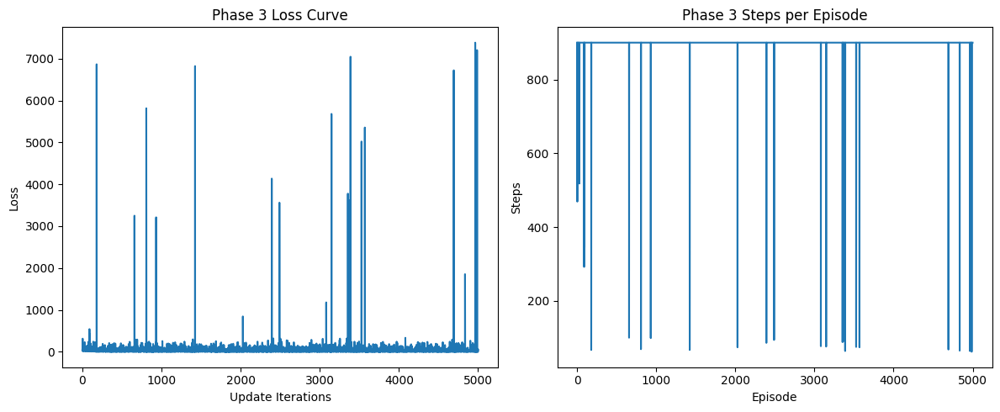

In [42]:
# 可视化训练结果
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(phase3_agent.costs)
plt.title("Phase 3 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(phase3_agent.steps_per_episode)
plt.title("Phase 3 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")

plt.tight_layout()
plt.show()

=== Phase 3 model testing ===
🎬 Finished：
🚶 Steps: 900, 🏆 Total_reward: 19.14444444444438


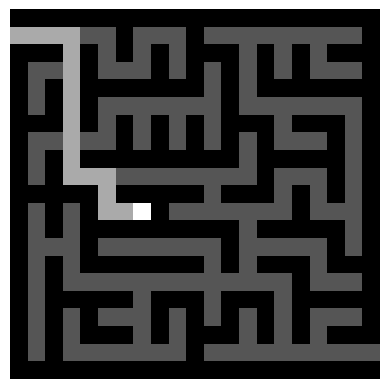

In [43]:
# 测试最终模型
print("=== Phase 3 model testing ===")
test_and_show_video(phase3_env, phase3_agent)